Install necessary packages and prepare to import and process the data from NEON

In [1]:
pip install rpy2

In [2]:
import rpy2
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr


In [3]:
pip install pingouin


In [4]:
import pandas
import pandas as pd
import os
import numpy as np
import pingouin as pg

import matplotlib.axis as axis
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
import seaborn as sns

from sklearn.preprocessing import scale
import sklearn.linear_model as skl_lm
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report

from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering

import itertools

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import Ridge, RidgeCV

from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report, accuracy_score, precision_score, recall_score, ConfusionMatrixDisplay, mean_squared_error

import sklearn.metrics

from sklearn import tree
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, BaggingRegressor, RandomForestRegressor, GradientBoostingRegressor, GradientBoostingClassifier
import graphviz

import sklearn.metrics as sklmet

import sklearn.linear_model as skl_lm
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn import preprocessing
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.tools.eval_measures import rmse

import sklearn.linear_model as skl_lm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree
np.set_printoptions(precision=5, suppress=True)


from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score



In [5]:
base = importr('base')
utils = importr('utils')
stats = importr('stats')

In [6]:
from rpy2.rinterface_lib.callbacks import logger as rpy2_logger
import logging
rpy2_logger.setLevel(logging.ERROR)

In [7]:
utils.install_packages('neonUtilities', repos='https://cran.rstudio.com/');

In [8]:
neonUtilities = importr('neonUtilities')


In [9]:
from google.colab import drive
drive.mount('/content/drive')
import os


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls
!pwd

drive  sample_data
/content


In [ ]:
!pwd

/content


1. Data Importing and Processing

1.1 Data - Initial Distribution for the 16 sites

In [10]:
#Unzip the data

neonUtilities.zipsByProduct(dpID='DP1.10047.001',
                            site=base.c('all'),
                            savepath='sample_data',
                            package='basic',
                            check_size='FALSE');

Finding available files
  |======================================================================| 100%

  |======================================================================| 100%
66 files successfully downloaded to sample_data/filesToStack10047


In [11]:
#Stack the data so all sites are in one file
neonUtilities.stackByTable(filepath='sample_data/filesToStack10047');


Unpacking zip files using 1 cores.
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking operation across a single core.
Stacking table spc_biogeochem
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table spc_bulkdensity
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table spc_particlesize
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table spc_perhorizon
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table spc_perplot
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Copied the most recent publication of validation file to /stackedFiles
Copied the most recent publication of categoricalCodes file to /stackedFiles
Copied the most recent publication of variable definition file to /stackedFiles
Finished: Stacked 5 data tables and 4 metadata tables!
Stacking took 9.871999 secs
All unzipped monthl

In [ ]:
#View the files
os.listdir('sample_data/filesToStack10047/stackedFiles')

['spc_perplot.csv',
 'validation_10047.csv',
 'categoricalCodes_10047.csv',
 'variables_10047.csv',
 'citation_10047_RELEASE-2024.txt',
 'spc_particlesize.csv',
 'spc_bulkdensity.csv',
 'spc_biogeochem.csv',
 'issueLog_10047.csv',
 'spc_perhorizon.csv',
 'readme_10047.txt']

In [12]:
#Create dataframes for files containing chemical data/variable finformation

spc_biogeochem = pandas.read_csv('sample_data/filesToStack10047/stackedFiles/spc_biogeochem.csv')
spc_bulkdensity = pandas.read_csv('sample_data/filesToStack10047/stackedFiles/spc_bulkdensity.csv')

vars = pandas.read_csv('sample_data/filesToStack10047/stackedFiles/variables_10047.csv')

In [ ]:
#Examine dataframes for files containing chemical data

spc_biogeochem.info()
spc_biogeochem.head()
vars

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3037 entries, 0 to 3036
Columns: 126 entries, uid to release
dtypes: float64(58), int64(3), object(65)
memory usage: 2.9+ MB


,table,fieldName,description,dataType,units,downloadPkg,pubFormat,primaryKey,categoricalCodeName
0,spc_biogeochem,uid,Unique ID within NEON database; an identifier ...,string,NaN,basic,asIs,N,NaN
1,spc_biogeochem,namedLocation,Name of the measurement location in the NEON d...,string,NaN,basic,asIs,N,NaN
2,spc_biogeochem,domainID,Unique identifier of the NEON domain,string,NaN,basic,asIs,N,NaN
3,spc_biogeochem,siteID,NEON site code,string,NaN,basic,asIs,N,NaN
4,spc_biogeochem,plotID,Plot identifier (NEON site code_XXX),string,NaN,basic,asIs,N,NaN
...,...,...,...,...,...,...,...,...,...
248,spc_perplot,soilOrder,Soil taxonomy at the order level,string,NaN,basic,asIs,N,NaN
249,spc_perplot,remarks,Technician notes; free text comments accompany...,string,NaN,basic,asIs,N,NaN
250,spc_perplot,dataQF,Data quality flag,string,NaN,basic,asIs,N,NaN
251,spc_perplot,publicationDate,Date of data publication on the NEON data portal,dateTime,NaN,appended by stackByTable,NaN,N,NaN


In [ ]:
#Explore variables for the appropriate file

vars.loc[vars['table'] == 'spc_biogeochem']

print(vars.loc[vars['table'] == 'spc_biogeochem'].to_string())

              table                    fieldName                                                                                                                                                                           description  dataType                        units               downloadPkg          pubFormat primaryKey     categoricalCodeName
0    spc_biogeochem                          uid                                                                                                                          Unique ID within NEON database; an identifier for the record    string                          NaN                     basic               asIs          N                     NaN
1    spc_biogeochem                namedLocation                                                                                                                                 Name of the measurement location in the NEON database    string                          NaN                     basic     

In [13]:
spc_biogeochem_O = spc_biogeochem[spc_biogeochem['horizonName'].isin(['Oe', 'Oi', 'Oa', 'O'])]
spc_biogeochem_A = spc_biogeochem[spc_biogeochem['horizonName'].isin(['A', 'A1', 'A2', 'Ah'])]


In [14]:
spc_biogeochem_by_horizon = spc_biogeochem.groupby('horizonName')

In [15]:
spc_biogeochem_O

,uid,namedLocation,domainID,siteID,plotID,nrcsDescriptionID,collectDate,horizonID,horizonName,analysisStartDate,...,OlsenPMethodPub,OlsenPMethod,OlsenPExtractable,archiveID,archiveMass,processingRemarks,laboratoryName,dataQF,publicationDate,release
4,23dfe410-e872-440d-98a9-05eea959f0b0,BART_018.basePlot.all,D01,BART,BART_018,S2016NH003001,2016-05-11,16N04933,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
7,7981b4cc-9cd8-45b2-b684-fdb0a4295d87,BART_081.basePlot.all,D01,BART,BART_081,S2016NH003002,2016-05-17,16N04938,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
14,8b69a866-c765-4746-8c2d-3bf7be96df71,BART_012.basePlot.all,D01,BART,BART_012,S2016NH003003,2016-05-19,16N04944,Oa,2016-12-01,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
17,71c30069-7526-40fa-be58-27be56a4dc57,BART_062.basePlot.all,D01,BART,BART_062,S2016NH003004,2016-05-23,16N04949,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
26,a7496502-8fec-4c38-9123-ea908ba3eaf3,BART_030.basePlot.all,D01,BART,BART_030,S2016NH003006,2016-06-02,16N04960,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T020210Z,RELEASE-2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3016,e411820c-abca-4c15-acaf-e9e3e60e98d0,HEAL_002.basePlot.all,D19,HEAL,HEAL_002,S2017AK068002,2017-03-23,18N02979,Oi,2018-06-21,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T060615Z,RELEASE-2024
3018,271be0fa-30d3-4384-a2fb-c1faeadcbdac,PUUM_007.basePlot.all,D20,PUUM,PUUM_007,S2018HI001007,2018-06-19,18N05224,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),6.1,18N05224,34.55,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024
3022,d552d856-9b2b-4714-9b13-483e5ed49491,PUUM_015.basePlot.all,D20,PUUM,PUUM_015,S2018HI001015,2018-06-19,18N05232,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),2.8,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024
3031,2d837772-165a-4ba8-96e1-20d976ed8e8f,PUUM_032.basePlot.all,D20,PUUM,PUUM_032,S2018HI001032,2018-06-21,18N05236,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),0.3,18N05236,46.55,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024


In [16]:
spc_biogeochem_O = spc_biogeochem_O.loc[:, (spc_biogeochem_O != np.NaN).any(axis=0)]
spc_biogeochem_A = spc_biogeochem_A.loc[:, (spc_biogeochem_A != np.NaN).any(axis=0)]

In [17]:
spc_biogeochem_O

,uid,namedLocation,domainID,siteID,plotID,nrcsDescriptionID,collectDate,horizonID,horizonName,analysisStartDate,...,OlsenPMethodPub,OlsenPMethod,OlsenPExtractable,archiveID,archiveMass,processingRemarks,laboratoryName,dataQF,publicationDate,release
4,23dfe410-e872-440d-98a9-05eea959f0b0,BART_018.basePlot.all,D01,BART,BART_018,S2016NH003001,2016-05-11,16N04933,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
7,7981b4cc-9cd8-45b2-b684-fdb0a4295d87,BART_081.basePlot.all,D01,BART,BART_081,S2016NH003002,2016-05-17,16N04938,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
14,8b69a866-c765-4746-8c2d-3bf7be96df71,BART_012.basePlot.all,D01,BART,BART_012,S2016NH003003,2016-05-19,16N04944,Oa,2016-12-01,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
17,71c30069-7526-40fa-be58-27be56a4dc57,BART_062.basePlot.all,D01,BART,BART_062,S2016NH003004,2016-05-23,16N04949,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T015228Z,RELEASE-2024
26,a7496502-8fec-4c38-9123-ea908ba3eaf3,BART_030.basePlot.all,D01,BART,BART_030,S2016NH003006,2016-06-02,16N04960,Oa,2016-10-19,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T020210Z,RELEASE-2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3016,e411820c-abca-4c15-acaf-e9e3e60e98d0,HEAL_002.basePlot.all,D19,HEAL,HEAL_002,S2017AK068002,2017-03-23,18N02979,Oi,2018-06-21,...,NaN,NaN,NaN,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231227T060615Z,RELEASE-2024
3018,271be0fa-30d3-4384-a2fb-c1faeadcbdac,PUUM_007.basePlot.all,D20,PUUM,PUUM_007,S2018HI001007,2018-06-19,18N05224,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),6.1,18N05224,34.55,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024
3022,d552d856-9b2b-4714-9b13-483e5ed49491,PUUM_015.basePlot.all,D20,PUUM,PUUM_015,S2018HI001015,2018-06-19,18N05232,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),2.8,NaN,NaN,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024
3031,2d837772-165a-4ba8-96e1-20d976ed8e8f,PUUM_032.basePlot.all,D20,PUUM,PUUM_032,S2018HI001032,2018-06-21,18N05236,Oa,2018-08-07,...,"Kellogg Soil Survey Laboratory Methods Manual,...",Olsen Phosphorus (4D5a1),0.3,18N05236,46.55,NaN,USDA NRCS Kellogg Soil Survey Laboratory,NaN,20231228T190400Z,RELEASE-2024


In [18]:
spc_biogeochem_O['pOxalate']

4       372.2
7       102.5
14      271.6
17      134.0
26       42.8
        ...  
3016    522.1
3018    339.7
3022    327.5
3031    239.8
3036     51.5
Name: pOxalate, Length: 225, dtype: float64

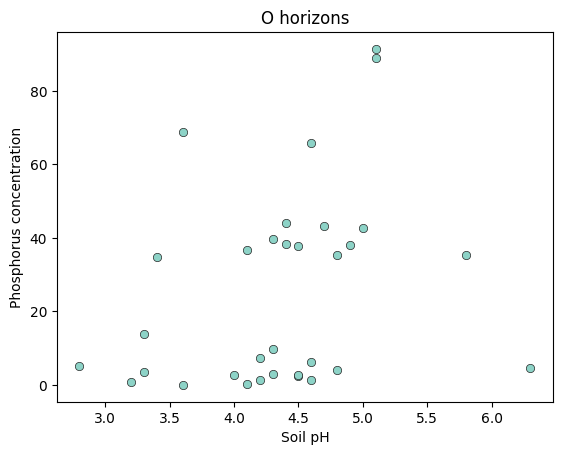

In [19]:
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['OlsenPExtractable']

plt.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("O horizons")

plt.show()


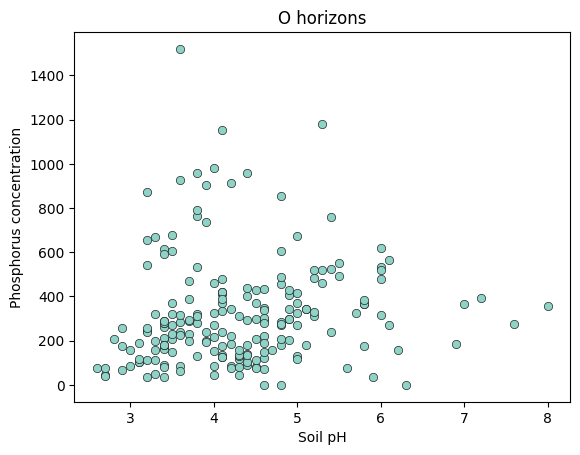

In [20]:
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['pOxalate']

plt.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("O horizons")

plt.show()

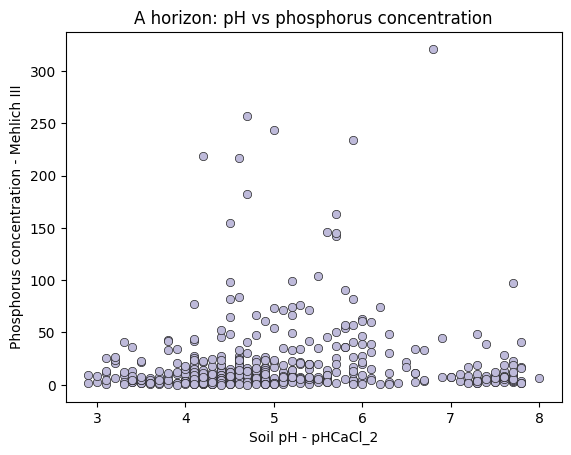

In [21]:
x = spc_biogeochem_A['phCacl2']
y = spc_biogeochem_A['MehlichIIITotP']

plt.plot(x, y, 'o', color='#bebada',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel(r"Soil pH - pHCaCl_2")
plt.ylabel("Phosphorus concentration - Mehlich III")
plt.title("A horizon: pH vs phosphorus concentration")
plt.show()

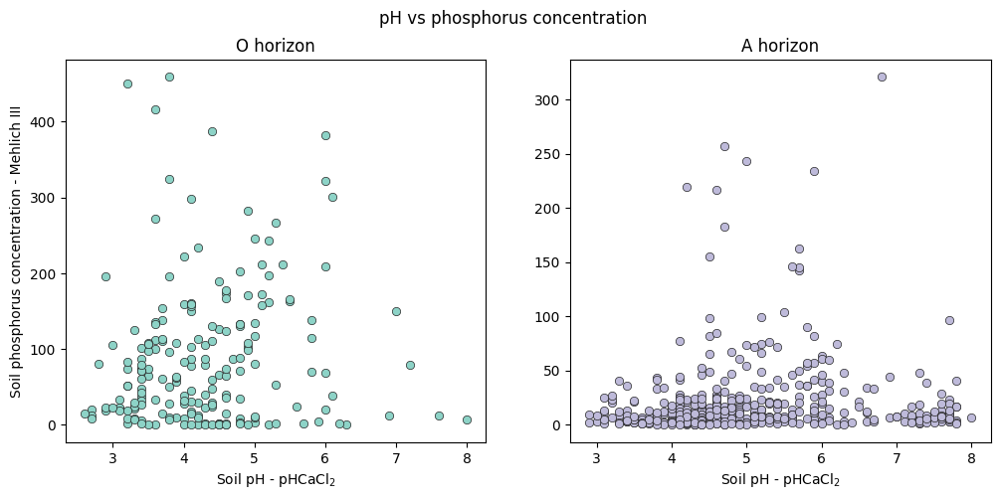

In [36]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('pH vs phosphorus concentration')

plt.subplot(1, 2, 1)
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['MehlichIIITotP']
ax1.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel(r"Soil pH - pHCaCl$_2$")
plt.ylabel("Soil phosphorus concentration - Mehlich III")

plt.subplot(1,2,2)
x2 = spc_biogeochem_A['phCacl2']
y2 = spc_biogeochem_A['MehlichIIITotP']

ax2.plot(x2, y2, 'o', color='#bebada',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel(r"Soil pH - pHCaCl$_2$")

ax1.set_title("O horizon")
ax2.set_title("A horizon")
plt.xlabel(r"Soil pH - pHCaCl$_2$")


plt.show()

In [ ]:
spc_biogeochem_A['OlsenPExtractable']


15      NaN
91      NaN
97      NaN
100     NaN
105     NaN
       ... 
3021    1.4
3023    6.7
3027    2.5
3029    0.8
3034    5.2
Name: OlsenPExtractable, Length: 556, dtype: float64

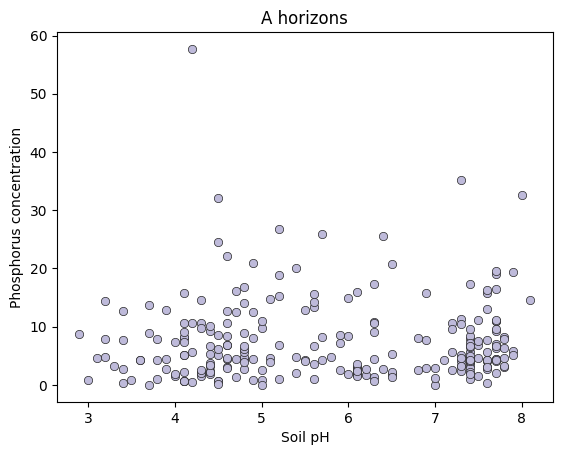

In [ ]:
x = spc_biogeochem_A['phCacl2']
y = spc_biogeochem_A['OlsenPExtractable']

plt.plot(x, y, 'o', color='#bebada', markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("A horizons")
plt.show()


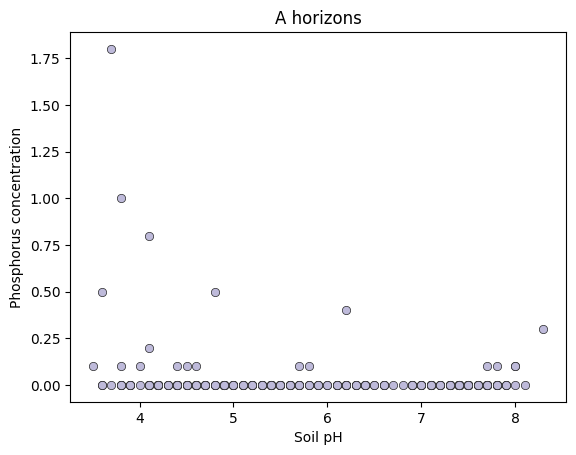

In [ ]:
x = spc_biogeochem_A['phSp']
y = spc_biogeochem_A['pSatx']

plt.plot(x, y, 'o', color='#bebada', markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("A horizons")
plt.show()

In [ ]:
x.isna().sum()
y.isna().sum()

272

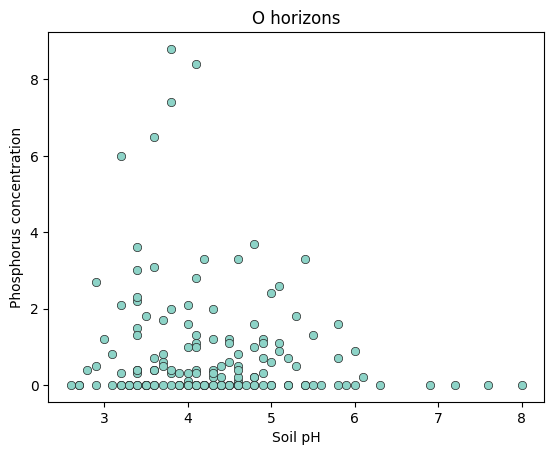

In [ ]:
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['pSatx']

plt.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("O horizons")


plt.show()

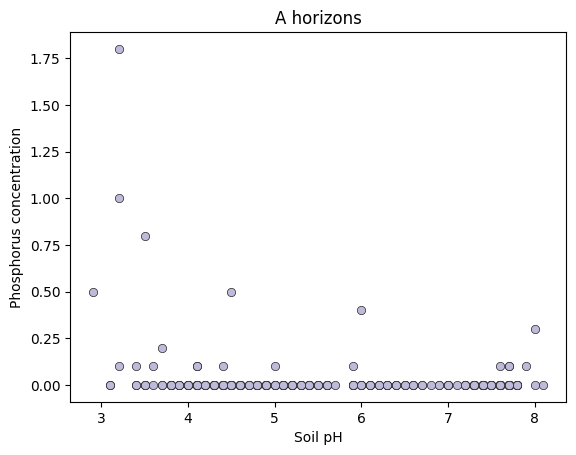

In [ ]:
x = spc_biogeochem_A['phCacl2']
y = spc_biogeochem_A['pSatx']

plt.plot(x, y, 'o', color='#bebada', markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("A horizons")

plt.show()

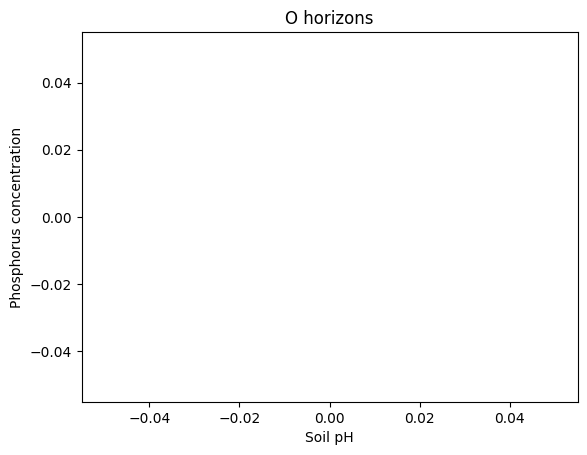

In [ ]:
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['Bray1PExtractable']

plt.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("O horizons")

plt.show()

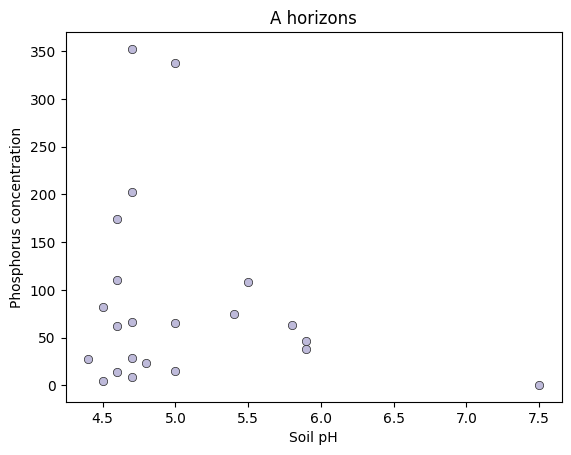

In [ ]:
x = spc_biogeochem_A['phCacl2']
y = spc_biogeochem_A['Bray1PExtractable']

plt.plot(x, y, 'o', color='#bebada', markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("A horizons")

plt.show()


4.2 4.344827586206897
281.4 325.7761261261261


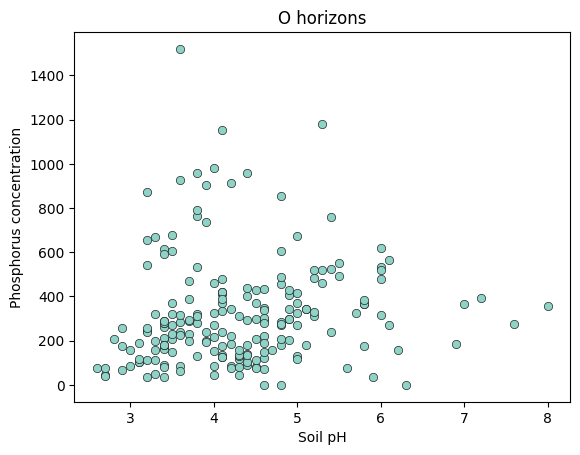

In [ ]:
x = spc_biogeochem_O['phCacl2']
y = spc_biogeochem_O['pOxalate']

print(x.median(), x.mean())
print(y.median(), y.mean())

plt.plot(x, y, 'o', color='#8dd3c7',  markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("O horizons")

plt.show()

5.1 5.401441441441442
209.6 5.401441441441442


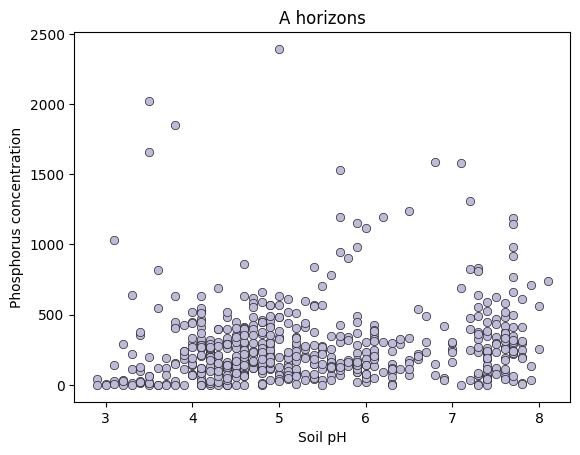

In [ ]:
x = spc_biogeochem_A['phCacl2']
y = spc_biogeochem_A['pOxalate']

print(x.median(), x.mean())
print(y.median(), x.mean())

plt.plot(x, y, 'o', color='#bebada', markeredgecolor ='#252525', mew= 0.5)
plt.xlabel("Soil pH")
plt.ylabel("Phosphorus concentration")
plt.title("A horizons")

plt.show()

In [ ]:
spc_biogeochem_check = spc_biogeochem.groupby("siteID").mean(numeric_only=True)

In [ ]:
spc_biogeochem_check

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,gypsumConc,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,...,feCitDithionate,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,Bray1PExtractable,OlsenPExtractable,archiveMass,dataQF
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,27.394366,48.309859,37.852113,1.040437,0.000000,NaN,5.257746,0.504225,1.278873,0.022535,...,4.670968,0.182032,0.181452,49.177465,22.320968,8.384507,NaN,NaN,157.383000,NaN
BARR,26.500000,57.300000,41.900000,1.078717,0.000000,36.000000,13.172881,0.488136,5.711864,1.076271,...,1.125833,0.019086,0.032933,43.000000,NaN,3.819643,NaN,7.536667,129.381837,NaN
BART,27.184211,45.605263,36.394737,1.027132,0.000000,NaN,1.956579,0.318421,0.509211,0.002632,...,0.617026,0.007794,0.094303,60.368421,24.838158,11.971053,NaN,NaN,NaN,NaN
BLAN,30.983333,55.983333,43.483333,1.011717,0.000000,NaN,3.793333,0.221667,1.085000,0.000000,...,2.281667,0.089940,0.036133,7.775000,NaN,7.288333,NaN,NaN,217.791333,NaN
BONA,23.135135,42.013514,32.574324,1.036703,0.000000,0.000000,6.282432,0.954054,1.750000,0.050000,...,1.113986,0.018736,0.055041,62.050000,NaN,49.144595,NaN,NaN,153.829265,NaN
CLBJ,63.597015,93.985075,78.791045,1.013358,0.000000,91.379310,10.840299,0.365672,2.225373,0.043284,...,0.488478,0.010360,0.015836,3.709091,NaN,1.123077,NaN,1.400000,284.407761,NaN
CPER,34.315789,56.684211,45.500000,1.025066,10.000000,34.000000,30.614474,0.877632,3.211842,1.025000,...,0.450132,0.015005,NaN,1.726316,7.948684,NaN,NaN,4.022368,NaN,NaN
DCFS,35.103448,60.689655,47.896552,1.020086,0.000000,115.405405,27.000000,0.706897,8.753448,0.122414,...,0.739310,0.086347,0.219328,10.052941,12.706897,NaN,NaN,1.470690,191.950000,NaN
DEJU,29.445946,52.040541,40.743243,1.019716,NaN,NaN,2.587838,0.167568,1.245946,0.027027,...,1.283784,0.015951,0.086865,14.251351,NaN,5.662162,NaN,NaN,196.860822,NaN


In [ ]:
#List all columns
print(spc_biogeochem.columns.values)





['uid' 'namedLocation' 'domainID' 'siteID' 'plotID' 'nrcsDescriptionID'
 'collectDate' 'horizonID' 'horizonName' 'analysisStartDate'
 'biogeoIDnrcs' 'biogeoSampleType' 'biogeoTopDepth' 'biogeoBottomDepth'
 'biogeoCenterDepth' 'airDryOvenDryProcessedDate' 'airDryOvenDryMethodPub'
 'airDryOvenDryMethod' 'airDryOvenDryRatio' 'gypsumProcessedDate'
 'gypsumMethodPub' 'gypsumMethod' 'gypsumConc' 'caco3ProcessedDate'
 'caco3MethodPub' 'caco3Method' 'caco3Conc' 'cecProcessedDate'
 'cecMethodPub' 'cecMethod' 'caNh4d' 'kNh4d' 'mgNh4d' 'naNh4d' 'cecdNh4'
 'alSatCecd33' 'baseSumCecd10' 'bsesatCecd10' 'ececCecd33'
 'KClExtractProcessedDate' 'KClExtractMethodPub' 'KClExtractMethod'
 'alKcl' 'feKcl' 'mnKcl' 'routinepHProcessedDate' 'routinepHMethodPub'
 'routinepHMethod' 'phCacl2' 'phH2o' 'ecProcessedDate' 'ecMethodPub'
 'ecMethod' 'ec12pre' 'satPasteProcessedDate' 'satPasteMethodPub'
 'satPasteMethod' 'bSatx' 'brSatx' 'caSatx' 'clSatx' 'co3Satx' 'ecSatp'
 'flSatx' 'waterSatx' 'hco3Sx' 'kSatx' 'mgSat

In [ ]:
#Examine all horizons
print(spc_biogeochem['horizonName'].unique())

['Bs2' 'Bs1' 'Cd' 'E/B' 'Oa' 'E' 'BC2' 'BC1' 'Bs' 'Bhs' 'C' 'Bw1' 'Bw2'
 'A' 'Oa2' 'Oa1' 'BC' 'Oe' 'Bhs2' 'Bhs1' 'Bhs3' 'BA' 'C3' 'Ap1' 'Ap2' 'C1'
 'C2' 'A1' 'A2' '2Cd' '2BC' '2Cd1' '2Cd2' 'Bw' 'Ap' '2CB' '2C' 'Oi' '2Cg'
 '2C1' '2C2' 'Cg' 'Bg' 'A3' 'Oa4' 'Oa3' '2BCt' 'AB' '2Bt2' '2Bw2' '2Btx1'
 '2Btx2' 'Bt' '2Bt1' 'Bt2' 'EB' 'AE' 'Bt1' '2Bt' 'Cr' 'Bt3' 'BCt' 'BE'
 'BCt1' 'BCt2' 'BCj' 'Cj' 'BCtg' 'Cg2' 'Ab' 'Cg1' 'CBt' 'Btg1' 'BCg'
 'Btg2' 'Btg' 'CB' 'Bh' 'Eg' "E'g" 'Bh2' 'Bh1' 'Eg2' 'Eg3' 'Eg1' 'E2' 'E1'
 "E'g1" 'EA' 'E3' 'Btx' 'EBt' 'C4' 'Ag' 'Bkkm1' 'Bkkm2' 'Bk' 'BCk' 'Bkkm'
 'Btk2' 'Btk3' 'Btk1' 'Bkk2' 'ABk' 'Bkk1' 'Bkk' 'AC' 'Bkss2' 'Bkss1'
 'Bss2' 'Bss1' 'Bss' 'Bkss' 'B' 'ABss2' 'ABss1' 'ABss' '2BA' 'Bssy' '3Bss'
 'Btss' 'Bkssy' 'Bssz' 'Bkssz' 'BAss' 'Bs3' 'Bs4' '2BCd' '2Bs2' 'A/E'
 'B/E' 'Bw3' 'BCd' '2E/B' 'E/A' '2E&Bt' "2E'" '2Bs3' '2Bs4' 'E&Bt' "E'"
 'Bx' 'Oe1' 'Oe2' '2Bx' 'B/E1' 'B/E2' '3BC' 'Btss1' '2Btss2' 'Btk'
 '2Btss3' 'Btkss' 'Btss2' '2Bt3' 'Btkss2' 'Btkss1' '2Cr' 'Bt4' 

In [ ]:
spc_biogeochem_calc = spc_biogeochem.fillna(0)

In [ ]:
#Copy the dataframe to a new dataframe which will contain the averages of O soil layers
#Only select O horizon soil (organic horizon)

spc_biogeochem_avg = spc_biogeochem_calc.copy()
spc_biogeochem_O_avg = spc_biogeochem_avg[spc_biogeochem_avg['horizonName'].isin(['Oe', 'Oi', 'Oa'])]
spc_biogeochem_A_avg = spc_biogeochem_avg[spc_biogeochem_avg['horizonName'].isin(['A', 'A1', 'A2', 'Ah'])]



In [ ]:
#Average by site
spc_biogeochem_O_avg = spc_biogeochem_O_avg.groupby("siteID").mean(numeric_only=True)
spc_biogeochem_A_avg = spc_biogeochem_A_avg.groupby("siteID").mean(numeric_only=True)

In [ ]:
spc_biogeochem_O_avg = spc_biogeochem_O_avg.loc[:, (spc_biogeochem_O_avg != 0).any(axis=0)]
spc_biogeochem_A_avg = spc_biogeochem_A_avg.loc[:, (spc_biogeochem_A_avg != 0).any(axis=0)]

In [ ]:
spc_biogeochem_O_avg

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,optDensityOxalate,alCitDithionate,feCitDithionate,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,OlsenPExtractable,archiveMass
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,0.000000,3.888889,1.944444,1.068667,0.000000,26.822222,1.555556,4.455556,0.055556,68.811111,...,0.216667,0.000000,0.000000,0.000000,0.000000,103.411111,0.000000,57.911111,0.000000,44.204444
BARR,2.777778,25.555556,14.166667,1.148444,0.000000,14.272222,0.916667,8.000000,1.566667,57.644444,...,0.293333,0.156889,1.434444,0.037438,0.018000,73.527778,0.000000,1.722222,9.916667,24.792222
BART,0.266667,13.400000,6.833333,1.063800,0.000000,8.613333,1.406667,2.353333,0.013333,105.266667,...,0.116000,0.166000,0.190267,0.016649,0.064400,167.426667,82.673333,36.813333,0.000000,0.000000
BONA,0.529412,8.941176,4.735294,1.080353,0.000000,16.664706,3.335294,5.523529,0.117647,87.035294,...,0.357647,0.260412,0.475588,0.042112,0.050647,135.447059,0.000000,182.194118,0.000000,24.782941
DEJU,24.000000,48.000000,36.000000,1.040000,0.000000,3.700000,0.200000,0.900000,0.100000,25.900000,...,0.720000,0.260000,0.930000,0.001400,0.048000,34.300000,0.000000,0.600000,0.000000,141.030000
GRSM,0.000000,5.625000,2.812500,1.056000,0.000000,3.012500,1.650000,2.400000,0.050000,74.762500,...,0.301250,0.357500,0.880000,0.024650,0.083500,124.362500,0.000000,46.812500,0.000000,72.212500
HARV,0.000000,5.941176,2.970588,1.080353,0.000000,8.411765,1.664706,3.423529,0.000000,71.429412,...,0.211176,0.239000,0.422353,0.039847,0.108294,106.864706,0.000000,93.552941,0.000000,58.381176
HEAL,3.761905,18.142857,10.952381,1.137286,0.000000,21.014286,1.942857,8.190476,0.090476,80.466667,...,0.557143,0.186000,1.577143,0.091171,0.088476,102.447619,0.000000,45.847619,0.000000,15.326190
NIWO,0.000000,5.250000,2.625000,1.066250,0.000000,29.525000,1.875000,3.700000,0.075000,56.450000,...,0.175000,0.200000,0.475000,0.075000,0.100000,78.900000,0.000000,75.350000,0.000000,80.447500


In [ ]:
spc_biogeochem_A_avg

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,alCitDithionate,feCitDithionate,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,Bray1PExtractable,OlsenPExtractable,archiveMass
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,5.650000,21.450000,13.550000,1.042500,0.000000,3.715000,0.535000,1.010000,0.010000,33.020000,...,1.462500,4.455000,0.229000,0.311500,57.145000,25.295000,2.620000,0.000000,0.000000,159.642500
BART,3.000000,7.000000,5.000000,1.007000,0.000000,0.000000,0.100000,0.200000,0.000000,6.200000,...,0.130000,0.710000,0.019000,0.028000,11.700000,7.700000,6.000000,0.000000,0.000000,0.000000
BLAN,0.000000,14.142857,7.071429,1.010429,0.000000,5.671429,0.314286,1.157143,0.000000,8.714286,...,0.183286,1.585714,0.091857,0.017143,9.128571,0.000000,14.285714,0.000000,0.000000,218.928571
BONA,9.444444,16.555556,13.000000,1.048000,0.000000,5.966667,0.577778,1.377778,0.077778,54.266667,...,0.420000,1.331111,0.013778,0.065222,90.277778,0.000000,14.477778,0.000000,0.000000,101.336667
CLBJ,2.083333,17.333333,9.708333,1.006500,69.166667,10.141667,0.283333,0.808333,0.000000,5.983333,...,0.026667,0.281667,0.015617,0.001750,2.691667,0.000000,4.591667,0.000000,0.200000,280.080833
CPER,0.000000,14.764706,7.382353,1.019000,6.470588,15.088235,0.917647,1.841176,0.000000,11.852941,...,0.001059,0.403529,0.014135,0.000000,2.305882,6.476471,0.000000,0.000000,10.447059,0.000000
DCFS,3.705882,23.176471,13.441176,1.022412,4.705882,20.582353,1.129412,6.447059,0.041176,26.223529,...,0.084353,0.644706,0.095653,0.177706,15.900000,16.188235,0.000000,0.000000,4.317647,186.092353
DEJU,6.428571,12.285714,9.357143,1.037286,0.000000,5.757143,0.385714,2.228571,0.028571,28.685714,...,0.314286,1.571429,0.005814,0.069143,38.528571,0.000000,7.600000,0.000000,0.000000,152.175714
DELA,0.800000,13.050000,6.925000,1.028000,0.000000,12.180000,0.290000,2.880000,0.000000,20.180000,...,0.160400,2.050000,0.124600,0.000000,10.675000,0.000000,9.525000,0.000000,0.000000,0.000000


In [ ]:
spc_biogeochem_O_avg['phH2o']

siteID
ABBY    5.244444
BARR    2.383333
BART    4.080000
BONA    4.347059
DEJU    5.400000
GRSM    4.325000
HARV    4.600000
HEAL    2.195238
NIWO    5.150000
NOGP    6.000000
ORNL    5.460000
OSBS    3.683333
PUUM    4.600000
RMNP    4.983333
SCBI    7.266667
SOAP    5.700000
STEI    5.333333
TEAK    5.544444
TOOL    5.185714
TREE    4.825000
UNDE    4.641667
WOOD    6.116667
WREF    4.692857
YELL    5.866667
Name: phH2o, dtype: float64

In [ ]:
spc_biogeochem_O_avg['phSp']

siteID
ABBY    4.922222
BARR    3.638889
BART    3.586667
BONA    2.229412
DEJU    0.000000
GRSM    4.200000
HARV    3.776471
HEAL    0.385714
NIWO    4.900000
NOGP    5.800000
ORNL    4.580000
OSBS    3.683333
PUUM    0.000000
RMNP    4.916667
SCBI    0.000000
SOAP    2.733333
STEI    5.000000
TEAK    1.900000
TOOL    4.138095
TREE    4.625000
UNDE    3.975000
WOOD    5.866667
WREF    4.235714
YELL    5.666667
Name: phSp, dtype: float64

In [ ]:
#Look at manganese data to compare to Santos paper
spc_biogeochem_O_avg['mnKcl']

siteID
ABBY    376.222222
BARR    104.716667
BART      8.320000
BONA    216.535294
DEJU      2.300000
GRSM    114.150000
HARV    208.758824
HEAL    182.409524
NIWO    192.825000
NOGP      0.000000
ORNL    186.100000
OSBS      9.900000
PUUM    142.900000
RMNP    145.200000
SCBI      0.000000
SOAP     84.000000
STEI     32.500000
TEAK     87.900000
TOOL    404.476190
TREE     14.712500
UNDE      7.375000
WOOD      1.100000
WREF    923.378571
YELL    126.700000
Name: mnKcl, dtype: float64

In [ ]:
#Look at manganese data to compare to Santos paper
spc_biogeochem_O_avg['mnOxalate']

siteID
ABBY    1208.322222
BARR     327.650000
BART     158.033333
BONA     335.394118
DEJU       2.100000
GRSM     186.337500
HARV     315.776471
HEAL     748.276190
NIWO     898.275000
NOGP     368.700000
ORNL    1994.540000
OSBS       8.983333
PUUM     181.800000
RMNP     641.283333
SCBI       0.000000
SOAP     383.566667
STEI     662.633333
TEAK    1340.355556
TOOL    2442.447619
TREE     926.825000
UNDE      66.266667
WOOD     394.083333
WREF    2169.021429
YELL    1060.033333
Name: mnOxalate, dtype: float64

In [ ]:
#Look at manganese data to compare to Santos paper
spc_biogeochem_O_avg['mnCitDithionate']

siteID
ABBY    0.000000
BARR    0.037438
BART    0.016649
BONA    0.042112
DEJU    0.001400
GRSM    0.024650
HARV    0.039847
HEAL    0.091171
NIWO    0.075000
NOGP    0.047000
ORNL    0.246200
OSBS    0.001567
PUUM    0.024075
RMNP    0.072750
SCBI    0.000000
SOAP    0.047667
STEI    0.103000
TEAK    0.145333
TOOL    0.127148
TREE    0.096063
UNDE    0.009725
WOOD    0.048000
WREF    0.240929
YELL    0.108333
Name: mnCitDithionate, dtype: float64

1.2 Data - Megapit Soil data

In [38]:
#Unzip the data
neonUtilities.zipsByProduct(dpID='DP1.00096.001',
                            site=base.c('all'),
                            savepath='sample_data',
                            package='basic',
                            check_size='FALSE');

Finding available files
  |======================================================================| 100%

  |======================================================================| 100%
47 files successfully downloaded to sample_data/filesToStack00096


In [39]:
#Stack the data so that all sites are in the same file
neonUtilities.stackByTable(filepath='sample_data/filesToStack00096');


Unpacking zip files using 1 cores.
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking operation across a single core.
Stacking table mgp_perarchivesample
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table mgp_perbiogeosample
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table mgp_perbulksample
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table mgp_perhorizon
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table mgp_permegapit
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Copied the most recent publication of validation file to /stackedFiles
Copied the most recent publication of variable definition file to /stackedFiles
Finished: Stacked 5 data tables and 3 metadata tables!
Stacking took 6.450317 secs
All unzipped monthly data folders have been removed.


In [40]:
#List files in the folder
os.listdir('sample_data/filesToStack00096/stackedFiles')

['mgp_perarchivesample.csv',
 'readme_00096.txt',
 'mgp_permegapit.csv',
 'mgp_perhorizon.csv',
 'citation_00096_RELEASE-2024.txt',
 'issueLog_00096.csv',
 'mgp_perbiogeosample.csv',
 'variables_00096.csv',
 'mgp_perbulksample.csv',
 'validation_00096.csv']

In [41]:
#Turn the files of interest into dataframes
mgp_perbiogeosample = pandas.read_csv('sample_data/filesToStack00096/stackedFiles/mgp_perbiogeosample.csv')
vars_megapit = pandas.read_csv('sample_data/filesToStack00096/stackedFiles/variables_00096.csv')

In [42]:
#Look at column names, all chemical variables
print(mgp_perbiogeosample.columns.values)

['uid' 'domainID' 'siteID' 'pitNamedLocation' 'pitID' 'horizonID'
 'biogeoID' 'horizonName' 'biogeoHorizonProportion' 'biogeoSampleType'
 'setDate' 'collectDate' 'coarseFrag2To5' 'coarseFrag5To20' 'sandTotal'
 'siltTotal' 'clayTotal' 'carbonateClay' 'clayFineContent'
 'siltFineContent' 'siltCoarseContent' 'sandVeryFineContent'
 'sandFineContent' 'sandMediumContent' 'sandCoarseContent'
 'sandVeryCoarseContent' 'carbonTot' 'nitrogenTot' 'sulfurTot'
 'estimatedOC' 'airDryOvenDry' 'alMjelm' 'caMjelm' 'feMjelm' 'kMjelm'
 'mgMjelm' 'mnMjelm' 'naMjelm' 'pMjelm' 'siMjelm' 'srMjelm' 'tiMjelm'
 'zrMjelm' 'phCacl2' 'phH2o' 'ec12pre' 'gypsumConc' 'caco3Conc' 'caNh4d'
 'kNh4d' 'mgNh4d' 'naNh4d' 'cecdNh4' 'alSatCecd33' 'baseSumCecd10'
 'bsesatCecd10' 'ececCecd33' 'alKcl' 'feKcl' 'mnKcl' 'bSatx' 'brSatx'
 'caSatx' 'clSatx' 'co3Satx' 'ecSatp' 'flSatx' 'waterSatx' 'hco3Sx'
 'kSatx' 'mgSatx' 'naSatx' 'no2Satx' 'no3Satx' 'pSatx' 'phSp' 'resist'
 'so4Satx' 'laboratoryName' 'labProjID' 'biogeoTopDepth'
 'b

In [43]:
#Copy the dataframe to a new dataframe which will contain the averages of O soil layers
#Only select O horizon soil (organic horizon)
mgp_perbiogeosample_avg = mgp_perbiogeosample.copy()
#mgp_perbiogeosample_avg = mgp_perbiogeosample_avg[mgp_perbiogeosample_avg['horizonName'].isin(['Oe', 'Oi', 'Oa'])]


In [44]:
mgp_perbiogeosample_avg = mgp_perbiogeosample_avg.fillna(0)

In [45]:
mgp_perbiogeosample_avg = mgp_perbiogeosample_avg.fillna(0)
mgp_perbiogeosample_avg = mgp_perbiogeosample_avg.loc[:, (mgp_perbiogeosample_avg != 0).any(axis=0)]

In [46]:
#Average by site

mgp_perbiogeosample_avg = mgp_perbiogeosample_avg.groupby('siteID').mean(numeric_only=True)


In [47]:
mgp_perbiogeosample_avg

,biogeoHorizonProportion,coarseFrag2To5,coarseFrag5To20,sandTotal,siltTotal,clayTotal,carbonateClay,siltFineContent,siltCoarseContent,sandVeryFineContent,...,mgSatx,naSatx,no2Satx,no3Satx,pSatx,phSp,so4Satx,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,1.000000,150.428571,69.428571,23.657143,39.100000,37.242857,0.000000,29.942857,9.157143,7.657143,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.428571,82.000000,67.714286
BARR,0.833333,3.666667,1.833333,25.483333,13.100000,11.416667,0.000000,7.083333,6.016667,14.916667,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.500000,62.333333,48.416667
BART,1.000000,92.111111,118.888889,61.155556,35.088889,3.755556,0.000000,16.255556,18.833333,16.466667,...,0.111111,0.000000,0.011111,0.033333,0.677778,4.611111,0.300000,34.111111,56.333333,45.222222
BLAN,1.000000,63.857143,23.285714,24.928571,48.600000,26.471429,0.000000,27.871429,20.728571,13.028571,...,0.085714,0.000000,0.000000,0.000000,0.000000,0.857143,0.071429,43.142857,71.714286,57.428571
BONA,1.000000,0.714286,0.000000,18.657143,45.714286,7.057143,0.000000,21.200000,24.514286,8.671429,...,0.200000,0.157143,0.000000,0.000000,0.042857,1.285714,0.157143,49.285714,76.857143,63.071429
CLBJ,1.000000,0.000000,0.500000,50.566667,33.933333,15.500000,0.000000,7.683333,26.250000,39.883333,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56.166667,80.666667,68.416667
CPER,1.000000,11.428571,9.285714,61.828571,18.671429,19.500000,0.000000,8.771429,9.900000,16.914286,...,0.314286,0.557143,0.000000,0.000000,0.000000,1.142857,0.871429,70.428571,99.000000,84.714286
DCFS,1.000000,44.100000,32.200000,32.570000,38.430000,29.000000,1.500000,25.010000,13.420000,9.340000,...,2.120000,0.560000,0.040000,0.010000,0.000000,6.230000,0.930000,65.700000,85.700000,75.700000
DEJU,1.000000,109.285714,181.714286,57.814286,36.428571,5.757143,0.000000,18.200000,18.228571,11.842857,...,0.314286,0.000000,0.000000,0.471429,0.000000,0.500000,0.071429,65.428571,108.285714,86.857143


In [48]:
#Look at manganese data to compare to Santos paper

mgp_perbiogeosample_avg['mnKcl']



siteID
ABBY     15.142857
BARR      6.766667
BART      4.888889
BLAN      3.285714
BONA     36.885714
CLBJ      0.000000
CPER      0.000000
DCFS      0.000000
DEJU      0.100000
DELA      4.957143
DSNY      0.011111
GRSM      5.683333
GUAN      0.000000
HARV      0.580000
HEAL    180.820000
JERC      0.940000
JORN      0.000000
KONA      0.000000
KONZ      0.000000
LAJA      0.000000
LENO      8.871429
MLBS      4.684615
MOAB      0.000000
NIWO      0.633333
NOGP      0.000000
OAES      0.000000
ONAQ      0.000000
ORNL     13.087500
OSBS      0.050000
PUUM    101.420000
RMNP      0.171429
SCBI      1.850000
SERC      0.176923
SJER      0.000000
SOAP      5.012500
SRER      0.000000
STEI      1.137500
STER      0.000000
TALL      0.257143
TEAK      0.792857
TOOL     21.100000
TREE      0.520000
UKFS      0.000000
UNDE      0.572727
WOOD      0.000000
WREF     64.584615
YELL      0.000000
Name: mnKcl, dtype: float64

In [49]:
#Look at manganese data to compare to Santos paper

mgp_perbiogeosample_avg['mnMjelm']

siteID
ABBY     950.285714
BARR     231.500000
BART     410.555556
BLAN     736.428571
BONA     358.857143
CLBJ     106.833333
CPER     393.285714
DCFS     851.000000
DEJU     538.571429
DELA    1442.142857
DSNY      15.777778
GRSM     521.666667
GUAN      72.818182
HARV     701.800000
HEAL     478.200000
JERC     131.400000
JORN     153.666667
KONA     572.909091
KONZ     595.375000
LAJA    1284.875000
LENO     735.714286
MLBS      76.692308
MOAB     285.222222
NIWO     357.333333
NOGP     507.636364
OAES     419.600000
ONAQ     452.750000
ORNL     594.375000
OSBS      10.250000
PUUM    1288.800000
RMNP     208.285714
SCBI    1657.500000
SERC     179.153846
SJER     205.142857
SOAP     689.750000
SRER     523.400000
STEI     335.250000
STER     373.666667
TALL      63.000000
TEAK     503.357143
TOOL     483.200000
TREE     400.300000
UKFS     761.250000
UNDE     401.818182
WOOD    1630.857143
WREF     492.615385
YELL     786.125000
Name: mnMjelm, dtype: float64

In [50]:
mgp_perbiogeosample_avg['phCacl2']

siteID
ABBY    4.442857
BARR    4.600000
BART    4.455556
BLAN    4.828571
BONA    4.457143
CLBJ    4.733333
CPER    7.328571
DCFS    7.390000
DEJU    5.242857
DELA    4.542857
DSNY    5.000000
GRSM    4.600000
GUAN    6.072727
HARV    4.580000
HEAL    4.020000
JERC    4.580000
JORN    7.800000
KONA    6.645455
KONZ    7.012500
LAJA    7.850000
LENO    4.400000
MLBS    3.838462
MOAB    7.977778
NIWO    4.433333
NOGP    7.272727
OAES    6.160000
ONAQ    8.150000
ORNL    4.512500
OSBS    5.175000
PUUM    3.820000
RMNP    4.500000
SCBI    4.740000
SERC    4.430769
SJER    4.471429
SOAP    4.325000
SRER    7.820000
STEI    4.650000
STER    7.366667
TALL    4.257143
TEAK    4.600000
TOOL    4.060000
TREE    4.770000
UKFS    7.600000
UNDE    4.972727
WOOD    7.485714
WREF    4.938462
YELL    6.962500
Name: phCacl2, dtype: float64

In [51]:
#Explore variables for the appropriate file

vars_megapit.loc[vars_megapit['table'] == 'mgp_perbiogeosample']

print(vars_megapit.loc[vars_megapit['table'] == 'mgp_perbiogeosample'].to_string())

                   table                fieldName                                                                                                                                            description  dataType                        units               downloadPkg          pubFormat primaryKey  categoricalCodeName
17   mgp_perbiogeosample                      uid                                                                                           Unique ID within NEON database; an identifier for the record    string                          NaN                     basic               asIs          N                  NaN
18   mgp_perbiogeosample                 domainID                                                                                                                   Unique identifier of the NEON domain    string                          NaN                     basic               asIs          N                  NaN
19   mgp_perbiogeosample                   siteID

1.3 Data - Foliar Data

In [52]:
#Unzip the data

neonUtilities.zipsByProduct(dpID='DP1.10026.001',
                            site=base.c('all'),
                            savepath='sample_data',
                            package='basic',
                            check_size='FALSE');

Finding available files
  |======================================================================| 100%
Provisional data were excluded from available files list. To download provisional data, use input parameter include.provisional=TRUE.
  |======================================================================| 100%
82 files successfully downloaded to sample_data/filesToStack10026


In [53]:
#Stack the data so that all sites are in the same file

neonUtilities.stackByTable(filepath='sample_data/filesToStack10026');


Unpacking zip files using 1 cores.
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking operation across a single core.
Stacking table cfc_carbonNitrogen
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_chemistrySubsampling
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_chlorophyll
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_elements
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_fieldData
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_lignin
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=01s  
Stacking table cfc_LMA
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
Stacking table cfc_shapefile
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=00s  
Copied the most re

In [54]:
#List files in the folder

os.listdir('sample_data/filesToStack10026/stackedFiles')

['variables_10026.csv',
 'cfc_shapefile.csv',
 'cfc_fieldData.csv',
 'citation_10026_RELEASE-2024.txt',
 'cfc_elements.csv',
 'readme_10026.txt',
 'cfc_LMA.csv',
 'cfc_chemistrySubsampling.csv',
 'issueLog_10026.csv',
 'categoricalCodes_10026.csv',
 'cfc_lignin.csv',
 'cfc_chlorophyll.csv',
 'validation_10026.csv',
 'cfc_carbonNitrogen.csv']

In [55]:
cfc_elements = pandas.read_csv('sample_data/filesToStack10026/stackedFiles/cfc_elements.csv')


vars_10026 = pandas.read_csv('sample_data/filesToStack10026/stackedFiles/variables_10026.csv')


cfc_chlorophyll = pandas.read_csv('sample_data/filesToStack10026/stackedFiles/cfc_chlorophyll.csv')

cfc_chemistrySubsampling = pandas.read_csv('sample_data/filesToStack10026/stackedFiles/cfc_chemistrySubsampling.csv')



In [56]:
cfc_elements_avg = cfc_elements.fillna(0)
cfc_elements = cfc_elements_avg.loc[:, (cfc_elements_avg != 0).any(axis=0)]

In [57]:
cfc_elements

,uid,namedLocation,domainID,siteID,plotID,plotType,sampleID,sampleCode,ligninSampleID,ligninSampleBarcode,...,foliarCopperQF,foliarBoronQF,foliarZincQF,remarks,laboratoryName,testMethod,analyzedBy,reviewedBy,publicationDate,release
0,a644b7a6-d36f-405e-8fb0-d0c72d44484b,BART_073.basePlot.cfc,D01,BART,BART_073,tower,TvxMHd37kohoXlzs3pTixPYNVXnKYnbE9ZOkei19Lqg=,A00000153779,TvxMHd37kohoXlzs3pTixPYNVXnKYnbEjv3HIacq5bo=,A00000154780,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,j+NchQmCR3uWeXRzNkSPNw==,20240104T224739Z,RELEASE-2024
1,979207d2-c9ca-4198-9540-afe2e57265e3,BART_073.basePlot.cfc,D01,BART,BART_073,tower,TvxMHd37koiA1rU/BY6C6tOeCUC89v9gRcjGRsjfJAA=,A00000153865,TvxMHd37koiA1rU/BY6C6tOeCUC89v9gXnKsIaCId2Q=,A00000154253,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,j+NchQmCR3uWeXRzNkSPNw==,20240104T224739Z,RELEASE-2024
2,6d2b9c90-f80e-47dc-9fac-7a1f366df1e3,BART_073.basePlot.cfc,D01,BART,BART_073,tower,TvxMHd37kojEfZj+QPE+LrSWb1jIkOqz2Ctl1NfhUZQ=,A00000153861,TvxMHd37kojEfZj+QPE+LrSWb1jIkOqzdDw65mDe6V84PO...,A00000154638,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,j+NchQmCR3uWeXRzNkSPNw==,20240104T224739Z,RELEASE-2024
3,229635d5-0787-4408-b1af-38da0110f1d4,BART_073.basePlot.cfc,D01,BART,BART_073,tower,TvxMHd37koiT/Vp6cNz8F50ZrSpWWA/RXbe+F9+dr/k=,A00000153855,TvxMHd37koiT/Vp6cNz8F50ZrSpWWA/Rx51lVurZ1FM=,A00000158545,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,j+NchQmCR3uWeXRzNkSPNw==,20240104T224739Z,RELEASE-2024
4,51a1876d-2294-4fb9-ae69-108e90de47fc,BART_040.basePlot.cfc,D01,BART,BART_040,tower,TvxMHd37kojNrJLvmD6OM5VkX28fH0HT+nHsAFjBRtg=,A00000153777,TvxMHd37kojNrJLvmD6OM5VkX28fH0HTADyoLQqpVyezg7...,A00000154750,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,j+NchQmCR3uWeXRzNkSPNw==,20240104T224739Z,RELEASE-2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1990,96a936de-7ded-434b-b81c-f2a5af3b8292,PUUM_004.basePlot.cfc,D20,PUUM,PUUM_004,distributed,5DDwl49GZC0a7Ogbd29ik185KlceSA5a5P/dfzp/x4Y=,A00000066428,5DDwl49GZC0a7Ogbd29ik185KlceSA5aYDo391QM3jfXtJ...,A00000066377,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,0SbE4/OAjEQ=,20240104T225639Z,RELEASE-2024
1991,4718f9bd-3bc2-4c72-a511-69a91f8e93f0,PUUM_034.basePlot.cfc,D20,PUUM,PUUM_034,tower,5DDwl49GZC2ae6g80oaLlGQaFllLk6IfRT4z7Oy/Yzs=,A00000066439,5DDwl49GZC2ae6g80oaLlGQaFllLk6IfBY+mtt9Qaok=,A00000066372,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,0SbE4/OAjEQ=,20240104T225639Z,RELEASE-2024
1992,b43b815a-a772-45ce-b684-8f0ca388a75f,PUUM_034.basePlot.cfc,D20,PUUM,PUUM_034,tower,5DDwl49GZC1QV8Wxd65gxSUL9jPDIULLL9kVYlHly/M=,A00000066449,5DDwl49GZC1QV8Wxd65gxSUL9jPDIULLimMFOA6QdXCe6a...,A00000066276,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,0SbE4/OAjEQ=,20240104T225639Z,RELEASE-2024
1993,883bf09d-38b1-495f-81f5-628b59339fd7,PUUM_034.basePlot.cfc,D20,PUUM,PUUM_034,tower,5DDwl49GZC2ynXd2yGS6snOjE1lPXdnxKIgVq0sD3UM=,A00000066436,5DDwl49GZC2ynXd2yGS6snOjE1lPXdnxjaT/SdqQ2MwX6q...,A00000066269,...,OK,OK,OK,0,A and L Great Lakes,SOP APF-10-020,J/g6an6qIb0=,0SbE4/OAjEQ=,20240104T225639Z,RELEASE-2024


In [58]:
vars_10026.loc[vars_10026['table'] == 'cfc_chemistrySubsampling']

print(vars_10026.loc[vars_10026['table'] == 'cfc_chemistrySubsampling'].to_string())

                       table              fieldName                                                                description  dataType units               downloadPkg                     pubFormat primaryKey     categoricalCodeName
50  cfc_chemistrySubsampling                    uid               Unique ID within NEON database; an identifier for the record    string   NaN                     basic                          asIs          N                     NaN
51  cfc_chemistrySubsampling          namedLocation                      Name of the measurement location in the NEON database    string   NaN                     basic                          asIs          N                     NaN
52  cfc_chemistrySubsampling               domainID                                       Unique identifier of the NEON domain    string   NaN                     basic                          asIs          N                     NaN
53  cfc_chemistrySubsampling                 siteID             

In [59]:
vars_10026.loc[vars_10026['table'] == 'cfc_chlorophyll']

print(vars_10026.loc[vars_10026['table'] == 'cfc_chlorophyll'].to_string())

               table               fieldName                                                                                       description          dataType                    units               downloadPkg                     pubFormat primaryKey           categoricalCodeName
75   cfc_chlorophyll                     uid                                      Unique ID within NEON database; an identifier for the record            string                      NaN                     basic                          asIs          N                           NaN
76   cfc_chlorophyll           namedLocation                                             Name of the measurement location in the NEON database            string                      NaN                     basic                          asIs          N                           NaN
77   cfc_chlorophyll                domainID                                                              Unique identifier of the NEON domain         

In [60]:
vars_10026.loc[vars_10026['table'] == 'cfc_elements']

print(vars_10026.loc[vars_10026['table'] == 'cfc_elements'].to_string())

            table             fieldName                                                                description          dataType                  units               downloadPkg                     pubFormat primaryKey categoricalCodeName
143  cfc_elements                   uid               Unique ID within NEON database; an identifier for the record            string                    NaN                     basic                          asIs          N                 NaN
144  cfc_elements         namedLocation                      Name of the measurement location in the NEON database            string                    NaN                     basic                          asIs          N                 NaN
145  cfc_elements              domainID                                       Unique identifier of the NEON domain            string                    NaN                     basic                          asIs          N                 NaN
146  cfc_elements           

In [61]:
cfc_elements['foliarManganeseConc']

0       1702.0
1       1021.0
2        799.0
3        266.0
4         69.3
         ...  
1990     186.9
1991     284.7
1992     186.8
1993      94.2
1994     238.6
Name: foliarManganeseConc, Length: 1995, dtype: float64

In [62]:
cfc_elements_avg = cfc_elements_avg.groupby('siteID').mean(numeric_only=True)


In [63]:
cfc_elements_avg['log_foliarManganeseConc'] = np.log10(cfc_elements_avg['foliarManganeseConc'])

In [64]:
cfc_elements_avg

,analyticalRepNumber,dryMass,digestVolume,foliarPhosphorusConc,foliarPotassiumConc,foliarCalciumConc,foliarMagnesiumConc,foliarSulfurConc,foliarManganeseConc,foliarIronConc,foliarCopperConc,foliarBoronConc,foliarZincConc,dataQF,log_foliarManganeseConc
siteID,,,,,,,,,,,,,,,
ABBY,1.000000,0.200783,25.000000,0.172435,1.048565,0.755478,0.199174,0.128913,720.147826,50.669565,5.395652,19.873913,18.986957,0.0,2.857422
BARR,1.000000,0.199100,25.000000,0.229500,1.012100,0.263900,0.208050,0.188750,313.830000,901.495000,4.970000,6.730000,58.565000,0.0,2.496694
BART,1.000000,0.200415,25.000000,0.101171,0.917195,0.582878,0.115439,0.128585,859.126829,34.353659,4.570732,24.473171,79.000000,0.0,2.934057
BLAN,1.000000,0.198800,25.000000,0.193978,1.544289,1.619600,0.309156,0.169289,351.688889,47.997778,6.504444,37.240000,22.608889,0.0,2.546159
BONA,1.000000,0.200150,25.000000,0.233400,0.927200,1.058450,0.205900,0.117100,802.620000,42.175000,4.465000,2.170000,51.835000,0.0,2.904510
CLBJ,1.000000,0.199738,25.000000,0.152310,1.270738,1.179667,0.235286,0.138286,272.661905,81.795238,6.700000,22.380952,18.895238,0.0,2.435624
CPER,1.000000,0.198833,25.000000,0.226111,1.786500,0.564889,0.097611,0.194222,49.494444,95.938889,3.966667,9.755556,16.033333,0.0,1.694556
DCFS,1.000000,0.200250,25.000000,0.129550,1.544000,0.621750,0.189250,0.178800,65.925000,86.770000,5.570000,15.945000,27.325000,0.0,1.819050
DEJU,1.000000,0.199905,25.000000,0.123405,0.491190,1.115476,0.227167,0.093738,523.445238,61.880952,2.759524,4.266667,36.240476,0.0,2.718871


In [65]:
cfc_elements_avg['log_foliarIronConc'] = np.log10(cfc_elements_avg['foliarIronConc'])

In [66]:
cfc_elements_avg['log_foliarCopperConc'] = np.log10(cfc_elements_avg['foliarCopperConc'])

In [67]:
cfc_elements_avg['log_foliarBoronConc'] = np.log10(cfc_elements_avg['foliarBoronConc'])

In [68]:
cfc_elements_avg['log_foliarZincConc'] = np.log10(cfc_elements_avg['foliarZincConc'])

In [69]:
cfc_elements_avg['log_foliarPhosphorusConc'] = np.log10(cfc_elements_avg['foliarPhosphorusConc'])

In [70]:
cfc_elements_analysis = cfc_elements_avg.copy()

In [71]:
cfc_elements_analysis.drop(columns=['analyticalRepNumber','dryMass','digestVolume','foliarManganeseConc', 'foliarIronConc', 'foliarCopperConc', 'foliarBoronConc', 'foliarZincConc', 'dataQF'])

,foliarPhosphorusConc,foliarPotassiumConc,foliarCalciumConc,foliarMagnesiumConc,foliarSulfurConc,log_foliarManganeseConc,log_foliarIronConc,log_foliarCopperConc,log_foliarBoronConc,log_foliarZincConc,log_foliarPhosphorusConc
siteID,,,,,,,,,,,
ABBY,0.172435,1.048565,0.755478,0.199174,0.128913,2.857422,1.704747,0.732044,1.298283,1.278455,-0.763375
BARR,0.229500,1.012100,0.263900,0.208050,0.188750,2.496694,2.954963,0.696356,0.828015,1.767638,-0.639217
BART,0.101171,0.917195,0.582878,0.115439,0.128585,2.934057,1.535973,0.659986,1.388690,1.897627,-0.994945
BLAN,0.193978,1.544289,1.619600,0.309156,0.169289,2.546159,1.681221,0.813210,1.571010,1.354279,-0.712248
BONA,0.233400,0.927200,1.058450,0.205900,0.117100,2.904510,1.625055,0.649821,0.336460,1.714623,-0.631899
CLBJ,0.152310,1.270738,1.179667,0.235286,0.138286,2.435624,1.912728,0.826075,1.349879,1.276352,-0.817273
CPER,0.226111,1.786500,0.564889,0.097611,0.194222,1.694556,1.981995,0.598426,0.989252,1.205024,-0.645678
DCFS,0.129550,1.544000,0.621750,0.189250,0.178800,1.819050,1.938370,0.745855,1.202625,1.436560,-0.887563
DEJU,0.123405,0.491190,1.115476,0.227167,0.093738,2.718871,1.791557,0.440834,0.630089,1.559194,-0.908668


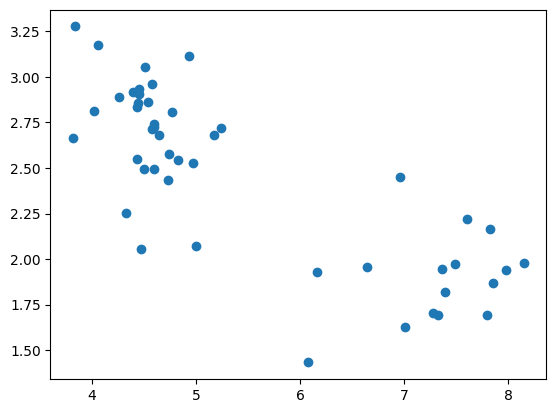

In [72]:

x = mgp_perbiogeosample_avg['phCacl2']
y = cfc_elements_avg['log_foliarManganeseConc']

plt.plot(mgp_perbiogeosample_avg['phCacl2'],cfc_elements_avg['log_foliarManganeseConc'], marker='o', linewidth=0)

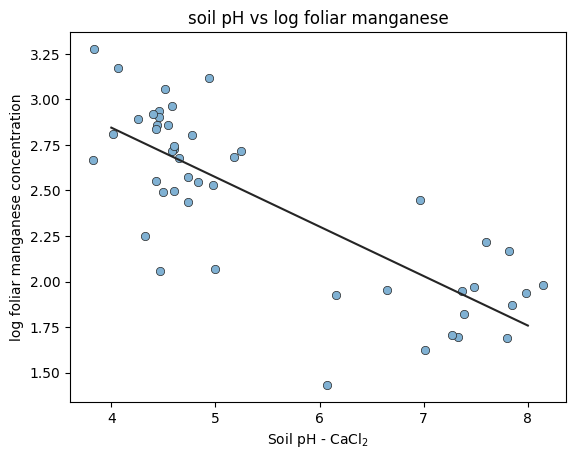

In [89]:
x = mgp_perbiogeosample_avg['phCacl2']
y = cfc_elements_avg['log_foliarManganeseConc']

m = np.linspace(4,8,100)
slope = -0.2716
intercept = 3.9310
def myfunc(x):
  return slope * x + intercept

mymodel = list(map(myfunc, m))

plt.plot(x, y,'o', color='#80b1d3', markeredgecolor ='#252525', mew= 0.5)
plt.plot(m, mymodel, color='#252525')
plt.xlabel(r"Soil pH - CaCl$_2$")
plt.ylabel("log foliar manganese concentration")
plt.title("soil pH vs log foliar manganese")

plt.show()



In [80]:
frames = [mgp_perbiogeosample_avg, cfc_elements_avg]

merged = pd.concat(frames, axis=1)

In [ ]:
cfc_elements_avg

,analyticalRepNumber,dryMass,digestVolume,foliarPhosphorusConc,foliarPotassiumConc,foliarCalciumConc,foliarMagnesiumConc,foliarSulfurConc,foliarManganeseConc,foliarIronConc,foliarCopperConc,foliarBoronConc,foliarZincConc,dataQF,log_foliarManganeseConc,log_foliarIronConc,log_foliarCopperConc,log_foliarBoronConc,log_foliarZincConc,log_foliarPhosphorusConc
siteID,,,,,,,,,,,,,,,,,,,,
ABBY,1.000000,0.200783,25.000000,0.172435,1.048565,0.755478,0.199174,0.128913,720.147826,50.669565,5.395652,19.873913,18.986957,0.0,2.857422,1.704747,0.732044,1.298283,1.278455,-0.763375
BARR,1.000000,0.199100,25.000000,0.229500,1.012100,0.263900,0.208050,0.188750,313.830000,901.495000,4.970000,6.730000,58.565000,0.0,2.496694,2.954963,0.696356,0.828015,1.767638,-0.639217
BART,1.000000,0.200415,25.000000,0.101171,0.917195,0.582878,0.115439,0.128585,859.126829,34.353659,4.570732,24.473171,79.000000,0.0,2.934057,1.535973,0.659986,1.388690,1.897627,-0.994945
BLAN,1.000000,0.198800,25.000000,0.193978,1.544289,1.619600,0.309156,0.169289,351.688889,47.997778,6.504444,37.240000,22.608889,0.0,2.546159,1.681221,0.813210,1.571010,1.354279,-0.712248
BONA,1.000000,0.200150,25.000000,0.233400,0.927200,1.058450,0.205900,0.117100,802.620000,42.175000,4.465000,2.170000,51.835000,0.0,2.904510,1.625055,0.649821,0.336460,1.714623,-0.631899
CLBJ,1.000000,0.199738,25.000000,0.152310,1.270738,1.179667,0.235286,0.138286,272.661905,81.795238,6.700000,22.380952,18.895238,0.0,2.435624,1.912728,0.826075,1.349879,1.276352,-0.817273
CPER,1.000000,0.198833,25.000000,0.226111,1.786500,0.564889,0.097611,0.194222,49.494444,95.938889,3.966667,9.755556,16.033333,0.0,1.694556,1.981995,0.598426,0.989252,1.205024,-0.645678
DCFS,1.000000,0.200250,25.000000,0.129550,1.544000,0.621750,0.189250,0.178800,65.925000,86.770000,5.570000,15.945000,27.325000,0.0,1.819050,1.938370,0.745855,1.202625,1.436560,-0.887563
DEJU,1.000000,0.199905,25.000000,0.123405,0.491190,1.115476,0.227167,0.093738,523.445238,61.880952,2.759524,4.266667,36.240476,0.0,2.718871,1.791557,0.440834,0.630089,1.559194,-0.908668


In [ ]:
spc_biogeochem_O_avg = spc_biogeochem_O_avg.dropna(axis=1)

In [ ]:
spc_biogeochem_O_avg.drop(columns=['ctonRatio'])

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,optDensityOxalate,alCitDithionate,feCitDithionate,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,OlsenPExtractable,archiveMass
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,0.000000,3.888889,1.944444,1.068667,0.000000,26.822222,1.555556,4.455556,0.055556,68.811111,...,0.216667,0.000000,0.000000,0.000000,0.000000,103.411111,0.000000,57.911111,0.000000,44.204444
BARR,2.777778,25.555556,14.166667,1.148444,0.000000,14.272222,0.916667,8.000000,1.566667,57.644444,...,0.293333,0.156889,1.434444,0.037438,0.018000,73.527778,0.000000,1.722222,9.916667,24.792222
BART,0.266667,13.400000,6.833333,1.063800,0.000000,8.613333,1.406667,2.353333,0.013333,105.266667,...,0.116000,0.166000,0.190267,0.016649,0.064400,167.426667,82.673333,36.813333,0.000000,0.000000
BONA,0.529412,8.941176,4.735294,1.080353,0.000000,16.664706,3.335294,5.523529,0.117647,87.035294,...,0.357647,0.260412,0.475588,0.042112,0.050647,135.447059,0.000000,182.194118,0.000000,24.782941
DEJU,24.000000,48.000000,36.000000,1.040000,0.000000,3.700000,0.200000,0.900000,0.100000,25.900000,...,0.720000,0.260000,0.930000,0.001400,0.048000,34.300000,0.000000,0.600000,0.000000,141.030000
GRSM,0.000000,5.625000,2.812500,1.056000,0.000000,3.012500,1.650000,2.400000,0.050000,74.762500,...,0.301250,0.357500,0.880000,0.024650,0.083500,124.362500,0.000000,46.812500,0.000000,72.212500
HARV,0.000000,5.941176,2.970588,1.080353,0.000000,8.411765,1.664706,3.423529,0.000000,71.429412,...,0.211176,0.239000,0.422353,0.039847,0.108294,106.864706,0.000000,93.552941,0.000000,58.381176
HEAL,3.761905,18.142857,10.952381,1.137286,0.000000,21.014286,1.942857,8.190476,0.090476,80.466667,...,0.557143,0.186000,1.577143,0.091171,0.088476,102.447619,0.000000,45.847619,0.000000,15.326190
NIWO,0.000000,5.250000,2.625000,1.066250,0.000000,29.525000,1.875000,3.700000,0.075000,56.450000,...,0.175000,0.200000,0.475000,0.075000,0.100000,78.900000,0.000000,75.350000,0.000000,80.447500


In [ ]:
soil_init_O_foliar = [spc_biogeochem_O_avg, cfc_elements_avg]

init_dist_soil_foliar = pd.concat(soil_init_O_foliar, axis=1)

init_dist_soil_foliar.dropna()

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,foliarCopperConc,foliarBoronConc,foliarZincConc,dataQF,log_foliarManganeseConc,log_foliarIronConc,log_foliarCopperConc,log_foliarBoronConc,log_foliarZincConc,log_foliarPhosphorusConc
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,0.000000,3.888889,1.944444,1.068667,0.000000,26.822222,1.555556,4.455556,0.055556,68.811111,...,5.395652,19.873913,18.986957,0.0,2.857422,1.704747,0.732044,1.298283,1.278455,-0.763375
BARR,2.777778,25.555556,14.166667,1.148444,0.000000,14.272222,0.916667,8.000000,1.566667,57.644444,...,4.970000,6.730000,58.565000,0.0,2.496694,2.954963,0.696356,0.828015,1.767638,-0.639217
BART,0.266667,13.400000,6.833333,1.063800,0.000000,8.613333,1.406667,2.353333,0.013333,105.266667,...,4.570732,24.473171,79.000000,0.0,2.934057,1.535973,0.659986,1.388690,1.897627,-0.994945
BONA,0.529412,8.941176,4.735294,1.080353,0.000000,16.664706,3.335294,5.523529,0.117647,87.035294,...,4.465000,2.170000,51.835000,0.0,2.904510,1.625055,0.649821,0.336460,1.714623,-0.631899
DEJU,24.000000,48.000000,36.000000,1.040000,0.000000,3.700000,0.200000,0.900000,0.100000,25.900000,...,2.759524,4.266667,36.240476,0.0,2.718871,1.791557,0.440834,0.630089,1.559194,-0.908668
GRSM,0.000000,5.625000,2.812500,1.056000,0.000000,3.012500,1.650000,2.400000,0.050000,74.762500,...,25.090323,34.752688,34.155914,0.0,2.727574,1.746592,1.399506,1.540988,1.533466,-0.813481
HARV,0.000000,5.941176,2.970588,1.080353,0.000000,8.411765,1.664706,3.423529,0.000000,71.429412,...,5.680952,32.780952,37.471429,0.0,2.961051,1.605664,0.754421,1.515622,1.573700,-0.811005
HEAL,3.761905,18.142857,10.952381,1.137286,0.000000,21.014286,1.942857,8.190476,0.090476,80.466667,...,2.255000,7.620000,59.175000,0.0,2.810219,1.453700,0.353147,0.881955,1.772138,-0.869345
NIWO,0.000000,5.250000,2.625000,1.066250,0.000000,29.525000,1.875000,3.700000,0.075000,56.450000,...,3.630435,15.217391,30.808696,0.0,2.835619,1.629410,0.559959,1.182340,1.488673,-0.902335


In [ ]:
soil_init_A_foliar = [spc_biogeochem_O_avg, cfc_elements_avg]

init_dist_soil_A_foliar = pd.concat(soil_init_A_foliar, axis=1)

In [ ]:
init_dist_soil_A_foliar.dropna()

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,foliarCopperConc,foliarBoronConc,foliarZincConc,dataQF,log_foliarManganeseConc,log_foliarIronConc,log_foliarCopperConc,log_foliarBoronConc,log_foliarZincConc,log_foliarPhosphorusConc
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,0.000000,3.888889,1.944444,1.068667,0.000000,26.822222,1.555556,4.455556,0.055556,68.811111,...,5.395652,19.873913,18.986957,0.0,2.857422,1.704747,0.732044,1.298283,1.278455,-0.763375
BARR,2.777778,25.555556,14.166667,1.148444,0.000000,14.272222,0.916667,8.000000,1.566667,57.644444,...,4.970000,6.730000,58.565000,0.0,2.496694,2.954963,0.696356,0.828015,1.767638,-0.639217
BART,0.266667,13.400000,6.833333,1.063800,0.000000,8.613333,1.406667,2.353333,0.013333,105.266667,...,4.570732,24.473171,79.000000,0.0,2.934057,1.535973,0.659986,1.388690,1.897627,-0.994945
BONA,0.529412,8.941176,4.735294,1.080353,0.000000,16.664706,3.335294,5.523529,0.117647,87.035294,...,4.465000,2.170000,51.835000,0.0,2.904510,1.625055,0.649821,0.336460,1.714623,-0.631899
DEJU,24.000000,48.000000,36.000000,1.040000,0.000000,3.700000,0.200000,0.900000,0.100000,25.900000,...,2.759524,4.266667,36.240476,0.0,2.718871,1.791557,0.440834,0.630089,1.559194,-0.908668
GRSM,0.000000,5.625000,2.812500,1.056000,0.000000,3.012500,1.650000,2.400000,0.050000,74.762500,...,25.090323,34.752688,34.155914,0.0,2.727574,1.746592,1.399506,1.540988,1.533466,-0.813481
HARV,0.000000,5.941176,2.970588,1.080353,0.000000,8.411765,1.664706,3.423529,0.000000,71.429412,...,5.680952,32.780952,37.471429,0.0,2.961051,1.605664,0.754421,1.515622,1.573700,-0.811005
HEAL,3.761905,18.142857,10.952381,1.137286,0.000000,21.014286,1.942857,8.190476,0.090476,80.466667,...,2.255000,7.620000,59.175000,0.0,2.810219,1.453700,0.353147,0.881955,1.772138,-0.869345
NIWO,0.000000,5.250000,2.625000,1.066250,0.000000,29.525000,1.875000,3.700000,0.075000,56.450000,...,3.630435,15.217391,30.808696,0.0,2.835619,1.629410,0.559959,1.182340,1.488673,-0.902335


In [ ]:
merged

,biogeoHorizonProportion,coarseFrag2To5,coarseFrag5To20,sandTotal,siltTotal,clayTotal,carbonateClay,siltFineContent,siltCoarseContent,sandVeryFineContent,...,foliarCopperConc,foliarBoronConc,foliarZincConc,dataQF,log_foliarManganeseConc,log_foliarIronConc,log_foliarCopperConc,log_foliarBoronConc,log_foliarZincConc,log_foliarPhosphorusConc
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,1.000000,150.428571,69.428571,23.657143,39.100000,37.242857,0.000000,29.942857,9.157143,7.657143,...,5.395652,19.873913,18.986957,0.0,2.857422,1.704747,0.732044,1.298283,1.278455,-0.763375
BARR,0.833333,3.666667,1.833333,25.483333,13.100000,11.416667,0.000000,7.083333,6.016667,14.916667,...,4.970000,6.730000,58.565000,0.0,2.496694,2.954963,0.696356,0.828015,1.767638,-0.639217
BART,1.000000,92.111111,118.888889,61.155556,35.088889,3.755556,0.000000,16.255556,18.833333,16.466667,...,4.570732,24.473171,79.000000,0.0,2.934057,1.535973,0.659986,1.388690,1.897627,-0.994945
BLAN,1.000000,63.857143,23.285714,24.928571,48.600000,26.471429,0.000000,27.871429,20.728571,13.028571,...,6.504444,37.240000,22.608889,0.0,2.546159,1.681221,0.813210,1.571010,1.354279,-0.712248
BONA,1.000000,0.714286,0.000000,18.657143,45.714286,7.057143,0.000000,21.200000,24.514286,8.671429,...,4.465000,2.170000,51.835000,0.0,2.904510,1.625055,0.649821,0.336460,1.714623,-0.631899
CLBJ,1.000000,0.000000,0.500000,50.566667,33.933333,15.500000,0.000000,7.683333,26.250000,39.883333,...,6.700000,22.380952,18.895238,0.0,2.435624,1.912728,0.826075,1.349879,1.276352,-0.817273
CPER,1.000000,11.428571,9.285714,61.828571,18.671429,19.500000,0.000000,8.771429,9.900000,16.914286,...,3.966667,9.755556,16.033333,0.0,1.694556,1.981995,0.598426,0.989252,1.205024,-0.645678
DCFS,1.000000,44.100000,32.200000,32.570000,38.430000,29.000000,1.500000,25.010000,13.420000,9.340000,...,5.570000,15.945000,27.325000,0.0,1.819050,1.938370,0.745855,1.202625,1.436560,-0.887563
DEJU,1.000000,109.285714,181.714286,57.814286,36.428571,5.757143,0.000000,18.200000,18.228571,11.842857,...,2.759524,4.266667,36.240476,0.0,2.718871,1.791557,0.440834,0.630089,1.559194,-0.908668


In [81]:
est = smf.ols('log_foliarManganeseConc ~ phCacl2', merged).fit()
est.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     log_foliarManganeseConc   R-squared:                       0.628
Model:                                 OLS   Adj. R-squared:                  0.620
Method:                      Least Squares   F-statistic:                     76.04
Date:                     Mon, 10 Jun 2024   Prob (F-statistic):           3.16e-11
Time:                             17:45:20   Log-Likelihood:                -8.1717
No. Observations:                       47   AIC:                             20.34
Df Residuals:                           45   BIC:                             24.04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.9310      0.176     22.312      0.000       3.576       4.286
phCacl2       -0.2716      0.031     -8.720      0.000      -0.334      -0.209
==============================================================================
Omnibus:                        5.384   Durbin-Watson:                   1.641
Prob(Omnibus):                  0.068   Jarque-Bera (JB):                4.332
Skew:                          -0.713   Prob(JB):                        0.115
Kurtosis:                       3.419   Cond. No.                         23.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('MehlichIIITotP ~ phCacl2', spc_biogeochem_O).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         MehlichIIITotP   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     2.676
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.103
Time:                        05:42:06   Log-Likelihood:                -1157.2
No. Observations:                 195   AIC:                             2318.
Df Residuals:                     193   BIC:                             2325.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     39.1701     30.120      1.300      0.195     -20.236      98.576
phCacl2       11.1984      6.845      1.636      0.103      -2.303      24.699
==============================================================================
Omnibus:                       71.755   Durbin-Watson:                   1.287
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              178.406
Skew:                           1.646   Prob(JB):                     1.82e-39
Kurtosis:                       6.335   Cond. No.                         21.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('MehlichIIITotP ~ phCacl2', spc_biogeochem_A).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         MehlichIIITotP   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     2.230
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.136
Time:                        05:42:06   Log-Likelihood:                -2278.3
No. Observations:                 455   AIC:                             4561.
Df Residuals:                     453   BIC:                             4569.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      9.5857      7.326      1.308      0.191      -4.812      23.984
phCacl2        2.0965      1.404      1.493      0.136      -0.663       4.856
==============================================================================
Omnibus:                      445.863   Durbin-Watson:                   1.290
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12516.453
Skew:                           4.430   Prob(JB):                         0.00
Kurtosis:                      27.119   Cond. No.                         23.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('log_foliarManganeseConc ~ phCacl2', merged).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     log_foliarManganeseConc   R-squared:                       0.628
Model:                                 OLS   Adj. R-squared:                  0.620
Method:                      Least Squares   F-statistic:                     76.04
Date:                     Mon, 10 Jun 2024   Prob (F-statistic):           3.16e-11
Time:                             05:42:27   Log-Likelihood:                -8.1717
No. Observations:                       47   AIC:                             20.34
Df Residuals:                           45   BIC:                             24.04
Df Model:                                1                                         
Covariance Type:                 nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.9310      0.176     22.312      0.000       3.576       4.286
phCacl2       -0.2716      0.031     -8.720      0.000      -0.334      -0.209
==============================================================================
Omnibus:                        5.384   Durbin-Watson:                   1.641
Prob(Omnibus):                  0.068   Jarque-Bera (JB):                4.332
Skew:                          -0.713   Prob(JB):                        0.115
Kurtosis:                       3.419   Cond. No.                         23.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('log_foliarPhosphorusConc ~ phCacl2  + pMjelm', merged).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                               
====================================================================================
Dep. Variable:     log_foliarPhosphorusConc   R-squared:                       0.059
Model:                                  OLS   Adj. R-squared:                  0.016
Method:                       Least Squares   F-statistic:                     1.367
Date:                      Mon, 10 Jun 2024   Prob (F-statistic):              0.265
Time:                              05:42:28   Log-Likelihood:                 20.966
No. Observations:                        47   AIC:                            -35.93
Df Residuals:                            44   BIC:                            -30.38
Df Model:                                 2                                         
Covariance Type:                  nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.9603      0.104     -9.221      0.000      -1.170      -0.750
phCacl2        0.0278      0.017      1.640      0.108      -0.006       0.062
pMjelm      1.732e-05    8.2e-05      0.211      0.834      -0.000       0.000
==============================================================================
Omnibus:                        0.406   Durbin-Watson:                   1.794
Prob(Omnibus):                  0.816   Jarque-Bera (JB):                0.262
Skew:                          -0.179   Prob(JB):                        0.877
Kurtosis:                       2.925   Cond. No.                     2.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
cfc_chlorophyll_avg = cfc_chlorophyll.groupby('siteID').mean(numeric_only=True)
cfc_chlorophyll_avg = cfc_chlorophyll_avg.drop(columns=['solventVolume', 'freshMass', 'extractionLength', 'analyticalRepNumber'])

In [ ]:
soil_init_chlorophyll = [spc_biogeochem_O_avg, cfc_chlorophyll_avg]

soil_init_chlorophyll = pd.concat(soil_init_chlorophyll, axis=1)

In [79]:

soil_mgp_chlorophyll = [mgp_perbiogeosample_avg, cfc_chlorophyll_avg]

soil_mgp_chlorophyll = pd.concat(soil_mgp_chlorophyll, axis=1)

NameError: name 'cfc_chlorophyll_avg' is not defined

In [ ]:
soil_mgp_chlorophyll

,biogeoHorizonProportion,coarseFrag2To5,coarseFrag5To20,sandTotal,siltTotal,clayTotal,carbonateClay,siltFineContent,siltCoarseContent,sandVeryFineContent,...,no3Satx,pSatx,phSp,so4Satx,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,extractChlAConc,extractChlBConc,extractCarotConc
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,1.000000,150.428571,69.428571,23.657143,39.100000,37.242857,0.000000,29.942857,9.157143,7.657143,...,0.000000,0.000000,0.000000,0.000000,53.428571,82.000000,67.714286,9.220435,2.538696,2.382174
BARR,0.833333,3.666667,1.833333,25.483333,13.100000,11.416667,0.000000,7.083333,6.016667,14.916667,...,0.000000,0.000000,0.000000,0.000000,34.500000,62.333333,48.416667,6.762000,1.423500,2.723000
BART,1.000000,92.111111,118.888889,61.155556,35.088889,3.755556,0.000000,16.255556,18.833333,16.466667,...,0.033333,0.677778,4.611111,0.300000,34.111111,56.333333,45.222222,6.920976,1.632683,2.070244
BLAN,1.000000,63.857143,23.285714,24.928571,48.600000,26.471429,0.000000,27.871429,20.728571,13.028571,...,0.000000,0.000000,0.857143,0.071429,43.142857,71.714286,57.428571,7.955111,2.406222,2.035778
BONA,1.000000,0.714286,0.000000,18.657143,45.714286,7.057143,0.000000,21.200000,24.514286,8.671429,...,0.000000,0.042857,1.285714,0.157143,49.285714,76.857143,63.071429,19.387059,6.285882,4.334706
CLBJ,1.000000,0.000000,0.500000,50.566667,33.933333,15.500000,0.000000,7.683333,26.250000,39.883333,...,0.000000,0.000000,0.000000,0.000000,56.166667,80.666667,68.416667,12.766905,3.753810,3.306190
CPER,1.000000,11.428571,9.285714,61.828571,18.671429,19.500000,0.000000,8.771429,9.900000,16.914286,...,0.000000,0.000000,1.142857,0.871429,70.428571,99.000000,84.714286,11.423500,2.375500,3.610000
DCFS,1.000000,44.100000,32.200000,32.570000,38.430000,29.000000,1.500000,25.010000,13.420000,9.340000,...,0.010000,0.000000,6.230000,0.930000,65.700000,85.700000,75.700000,18.059000,4.439000,5.602000
DEJU,1.000000,109.285714,181.714286,57.814286,36.428571,5.757143,0.000000,18.200000,18.228571,11.842857,...,0.471429,0.000000,0.500000,0.071429,65.428571,108.285714,86.857143,8.179286,1.873095,2.205238


In [ ]:

soil_init_chlorophyll.dropna()

,biogeoTopDepth,biogeoBottomDepth,biogeoCenterDepth,airDryOvenDryRatio,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,...,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,OlsenPExtractable,archiveMass,extractChlAConc,extractChlBConc,extractCarotConc
siteID,,,,,,,,,,,,,,,,,,,,,
ABBY,0.000000,3.888889,1.944444,1.068667,0.000000,26.822222,1.555556,4.455556,0.055556,68.811111,...,0.000000,0.000000,103.411111,0.000000,57.911111,0.000000,44.204444,9.220435,2.538696,2.382174
BARR,2.777778,25.555556,14.166667,1.148444,0.000000,14.272222,0.916667,8.000000,1.566667,57.644444,...,0.037438,0.018000,73.527778,0.000000,1.722222,9.916667,24.792222,6.762000,1.423500,2.723000
BART,0.266667,13.400000,6.833333,1.063800,0.000000,8.613333,1.406667,2.353333,0.013333,105.266667,...,0.016649,0.064400,167.426667,82.673333,36.813333,0.000000,0.000000,6.920976,1.632683,2.070244
BONA,0.529412,8.941176,4.735294,1.080353,0.000000,16.664706,3.335294,5.523529,0.117647,87.035294,...,0.042112,0.050647,135.447059,0.000000,182.194118,0.000000,24.782941,19.387059,6.285882,4.334706
DEJU,24.000000,48.000000,36.000000,1.040000,0.000000,3.700000,0.200000,0.900000,0.100000,25.900000,...,0.001400,0.048000,34.300000,0.000000,0.600000,0.000000,141.030000,8.179286,1.873095,2.205238
GRSM,0.000000,5.625000,2.812500,1.056000,0.000000,3.012500,1.650000,2.400000,0.050000,74.762500,...,0.024650,0.083500,124.362500,0.000000,46.812500,0.000000,72.212500,6.016180,2.164382,1.301685
HARV,0.000000,5.941176,2.970588,1.080353,0.000000,8.411765,1.664706,3.423529,0.000000,71.429412,...,0.039847,0.108294,106.864706,0.000000,93.552941,0.000000,58.381176,12.117143,3.358810,3.240714
HEAL,3.761905,18.142857,10.952381,1.137286,0.000000,21.014286,1.942857,8.190476,0.090476,80.466667,...,0.091171,0.088476,102.447619,0.000000,45.847619,0.000000,15.326190,4.060500,0.983500,1.078500
NIWO,0.000000,5.250000,2.625000,1.066250,0.000000,29.525000,1.875000,3.700000,0.075000,56.450000,...,0.075000,0.100000,78.900000,0.000000,75.350000,0.000000,80.447500,27.486087,9.002174,6.590435


In [ ]:
est = smf.ols('extractCarotConc ~ phCacl2 + MehlichIIITotP ', soil_init_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       extractCarotConc   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                 -0.064
Method:                 Least Squares   F-statistic:                    0.3100
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.737
Time:                        05:45:52   Log-Likelihood:                -37.624
No. Observations:                  24   AIC:                             81.25
Df Residuals:                      21   BIC:                             84.78
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.3822      1.039      2.292      0.032       0.221       4.543
phCacl2           -0.0216      0.225     -0.096      0.925      -0.489       0.446
MehlichIIITotP     0.0031      0.004      0.787      0.440      -0.005       0.011
==============================================================================
Omnibus:                       20.638   Durbin-Watson:                   2.311
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.061
Skew:                           1.790   Prob(JB):                     8.06e-07
Kurtosis:                       6.904   Cond. No.                         407.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('extractCarotConc ~ phCacl2 + MehlichIIITotP + phCacl2*MehlichIIITotP', soil_init_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       extractCarotConc   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.9233
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.448
Time:                        05:45:58   Log-Likelihood:                -36.417
No. Observations:                  24   AIC:                             80.83
Df Residuals:                      20   BIC:                             85.55
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  1.0877      1.348      0.807      0.429      -1.724       3.900
phCacl2                    0.2329      0.280      0.831      0.416      -0.352       0.818
MehlichIIITotP             0.0364      0.023      1.569      0.132      -0.012       0.085
phCacl2:MehlichIIITotP    -0.0069      0.005     -1.455      0.161      -0.017       0.003
==============================================================================
Omnibus:                       23.956   Durbin-Watson:                   2.333
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.400
Skew:                           1.922   Prob(JB):                     1.69e-09
Kurtosis:                       8.062   Cond. No.                     2.60e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.6e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
est = smf.ols('extractChlAConc ~ phCacl2 + MehlichIIITotP ', soil_init_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        extractChlAConc   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                 -0.036
Method:                 Least Squares   F-statistic:                    0.5979
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.559
Time:                        06:10:49   Log-Likelihood:                -72.150
No. Observations:                  24   AIC:                             150.3
Df Residuals:                      21   BIC:                             153.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          7.6188      4.380      1.739      0.097      -1.490      16.728
phCacl2            0.1361      0.948      0.144      0.887      -1.835       2.107
MehlichIIITotP     0.0178      0.017      1.070      0.297      -0.017       0.053
==============================================================================
Omnibus:                       25.832   Durbin-Watson:                   2.321
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.927
Skew:                           2.122   Prob(JB):                     2.89e-10
Kurtosis:                       8.091   Cond. No.                         407.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('extractChlBConc ~ phCacl2 + MehlichIIITotP ', soil_init_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        extractChlBConc   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                 -0.029
Method:                 Least Squares   F-statistic:                    0.6729
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.521
Time:                        06:11:07   Log-Likelihood:                -46.056
No. Observations:                  24   AIC:                             98.11
Df Residuals:                      21   BIC:                             101.6
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          1.8071      1.477      1.224      0.235      -1.264       4.878
phCacl2            0.1352      0.320      0.423      0.677      -0.529       0.800
MehlichIIITotP     0.0059      0.006      1.044      0.308      -0.006       0.018
==============================================================================
Omnibus:                       28.187   Durbin-Watson:                   2.260
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               53.099
Skew:                           2.271   Prob(JB):                     2.95e-12
Kurtosis:                       8.699   Cond. No.                         407.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
est = smf.ols('extractChlBConc ~ phCacl2 + pMjelm ', soil_mgp_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        extractChlBConc   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                    0.7849
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.462
Time:                        06:17:39   Log-Likelihood:                -86.948
No. Observations:                  47   AIC:                             179.9
Df Residuals:                      44   BIC:                             185.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.9192      1.035      3.788      0.000       1.834       6.004
phCacl2       -0.2109      0.168     -1.253      0.217      -0.550       0.128
pMjelm      1.353e-05      0.001      0.017      0.987      -0.002       0.002
==============================================================================
Omnibus:                       28.341   Durbin-Watson:                   2.182
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               53.041
Skew:                           1.805   Prob(JB):                     3.04e-12
Kurtosis:                       6.748   Cond. No.                     2.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
est = smf.ols('extractChlAConc ~ phCacl2 + pMjelm ', soil_mgp_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        extractChlAConc   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                 -0.039
Method:                 Least Squares   F-statistic:                    0.1340
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.875
Time:                        06:17:59   Log-Likelihood:                -139.08
No. Observations:                  47   AIC:                             284.2
Df Residuals:                      44   BIC:                             289.7
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.3677      3.137      3.624      0.001       5.046      17.689
phCacl2       -0.2519      0.510     -0.494      0.624      -1.280       0.777
pMjelm        -0.0004      0.002     -0.155      0.878      -0.005       0.005
==============================================================================
Omnibus:                       23.208   Durbin-Watson:                   2.292
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               34.637
Skew:                           1.618   Prob(JB):                     3.01e-08
Kurtosis:                       5.687   Cond. No.                     2.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
est = smf.ols('extractCarotConc ~ phCacl2 + pMjelm ', soil_mgp_chlorophyll).fit()
est.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       extractCarotConc   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.044
Method:                 Least Squares   F-statistic:                   0.02921
Date:                Mon, 10 Jun 2024   Prob (F-statistic):              0.971
Time:                        06:18:12   Log-Likelihood:                -73.913
No. Observations:                  47   AIC:                             153.8
Df Residuals:                      44   BIC:                             159.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.6409      0.784      3.369      0.002       1.061       4.221
phCacl2        0.0138      0.128      0.108      0.914      -0.243       0.271
pMjelm        -0.0001      0.001     -0.217      0.830      -0.001       0.001
==============================================================================
Omnibus:                       16.636   Durbin-Watson:                   2.267
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.321
Skew:                           1.356   Prob(JB):                     6.38e-05
Kurtosis:                       4.584   Cond. No.                     2.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [73]:
x = mgp_perbiogeosample_avg['phCacl2']
y = cfc_elements_avg['log_foliarPhosphorusConc']



AttributeError: module 'stats' has no attribute 'linregress'

Linking different datasets

In [13]:
spc_biogeochem_calc = spc_biogeochem.fillna(0)


In [76]:
cfc_elements_calc = cfc_elements.fillna(0)

In [77]:
cfc_elements_calc['classes'] = cfc_elements_calc['domainID'].map({'D01': 0, 'D02': 1,'D03': 2, 'D04': 3, 'D05': 4, 'D06': 5,'D07': 6, 'D08': 7,
                                                                      'D09': 8, 'D10': 9,'D11': 10, 'D12': 11, 'D13': 12, 'D14': 13,'D15': 14, 'D16': 15,
                                                                      'D17': 16, 'D18': 17, 'D19': 18,'D20': 19})

In [78]:
cfc_elements_data = cfc_elements_calc[['foliarPhosphorusConc', 'foliarPotassiumConc', 'foliarCalciumConc', 'foliarMagnesiumConc', 'foliarSulfurConc', 'foliarManganeseConc', 'foliarIronConc', 'foliarCopperConc', 'foliarBoronConc', 'foliarZincConc']]
X_cfc = cfc_elements_data
y_cfc = cfc_elements_calc['classes']

In [19]:
spc_biogeochem_data = spc_biogeochem_calc[['domainID', 'gypsumConc',
 'caco3Conc',
 'caNh4d',
 'kNh4d',
 'mgNh4d',
 'naNh4d',
 'cecdNh4',
 'alSatCecd33',
'ececCecd33',
 'bsesatCecd10',
 'alKcl',
 'mnKcl',
 'phCacl2',
 'phH2o',
 'ec12pre',
 'caSatx',
 'clSatx',
 'co3Satx',
 'ecSatp',
 'flSatx',
 'waterSatx',
 'hco3Sx',
 'kSatx',
 'mgSatx',
 'naSatx',
 'no2Satx',
 'no3Satx',
 'pSatx',
 'phSp',
 'so4Satx',
 'carbonTot',
 'nitrogenTot',
 'estimatedOC',
 'sulfurTot',
 'alOxalate',
 'feOxalate',
 'mnOxalate',
 'pOxalate',
 'siOxalate',
 'optDensityOxalate',
 'alCitDithionate',
 'feCitDithionate',
 'mnCitDithionate',
 'siliconCitrateDithionate',
 'acidity',
 'waterRetention15Bar',
 'MehlichIIITotP',
 'Bray1PExtractable',
 'OlsenPExtractable']]

In [22]:
spc_biogeochem_calc = spc_biogeochem_calc.loc[:, (spc_biogeochem_calc != 0).any(axis=0)]

In [23]:
spc_biogeochem_calc['classes'] = spc_biogeochem_calc['domainID'].map({'D01': 0, 'D02': 1,'D03': 2, 'D04': 3, 'D05': 4, 'D06': 5,'D07': 6, 'D08': 7,
                                                                      'D09': 8, 'D10': 9,'D11': 10, 'D12': 11, 'D13': 12, 'D14': 13,'D15': 14, 'D16': 15,
                                                                      'D17': 16, 'D18': 17, 'D19': 18,'D20': 19})

<ipython-input-23-3d672c9ee9fb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spc_biogeochem_calc['classes'] = spc_biogeochem_calc['domainID'].map({'D01': 0, 'D02': 1,'D03': 2, 'D04': 3, 'D05': 4, 'D06': 5,'D07': 6, 'D08': 7,


In [24]:
spc_biogeochem_data = spc_biogeochem_data.drop(columns =['domainID'])

KeyError: "['domainID'] not found in axis"

In [ ]:
X_wild = spc_biogeochem_data.to_numpy()
X_wild = X_wild.transpose()

In [25]:
X = spc_biogeochem_data
y = spc_biogeochem_calc['classes']

In [ ]:
X

,gypsumConc,caco3Conc,caNh4d,kNh4d,mgNh4d,naNh4d,cecdNh4,alSatCecd33,ececCecd33,bsesatCecd10,...,optDensityOxalate,alCitDithionate,feCitDithionate,mnCitDithionate,siliconCitrateDithionate,acidity,waterRetention15Bar,MehlichIIITotP,Bray1PExtractable,OlsenPExtractable
0,0.0,0.0,0.0,0.0,0.0,0.0,7.7,0.0,0.0,0.0,...,0.22,0.640,0.810,0.0150,0.100,18.1,6.1,0.7,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,7.8,0.0,0.0,0.0,...,0.25,0.670,0.980,0.0210,0.120,20.3,7.2,0.7,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.7,0.0,0.0,0.0,...,0.00,0.049,0.270,0.0095,0.015,2.5,0.8,9.4,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,4.9,0.0,0.0,0.0,...,0.15,0.310,0.760,0.0045,0.037,11.1,5.8,0.8,0.0,0.0
4,0.0,0.0,6.3,1.8,1.3,0.0,118.7,59.0,22.7,8.0,...,0.33,0.490,0.089,0.0098,0.110,190.9,111.4,65.1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3032,0.0,0.0,14.4,0.4,1.7,0.2,74.2,12.0,18.9,23.0,...,2.51,1.900,3.800,0.0400,0.160,124.5,174.6,0.2,0.0,1.1
3033,0.0,0.0,34.8,0.6,3.6,0.2,92.9,2.0,39.9,42.0,...,1.98,1.200,3.300,0.0560,0.088,131.2,140.3,0.2,0.0,1.1
3034,0.0,0.0,5.9,0.7,1.2,0.3,77.7,49.0,16.0,10.0,...,1.42,0.940,3.100,0.0300,0.100,133.3,160.1,0.5,0.0,5.2
3035,0.0,0.0,2.9,0.5,0.7,0.3,78.3,61.0,11.2,6.0,...,1.96,3.100,2.500,0.0230,0.380,137.0,162.9,0.3,0.0,2.2


In [ ]:
X_cfc

In [26]:
zero_cols = [ col for col, is_zero in ((X == 0).sum() == X.shape[0]).items() if is_zero ]
print(zero_cols)


[]


In [27]:
X = X.loc[:, (X != 0).any(axis=0)]


In [28]:
X.shape

(3037, 49)

# Section II.I Ecoclimatic model training on initial soil data

A. Split the data into test and train data


In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)



In [ ]:
X_trial = X

B. Try decision tree classifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtree_model = DecisionTreeClassifier(max_depth = 10).fit(X_train, y_train)
dtree_predictions = dtree_model.predict(X_test)

# creating a confusion matrix
cm = confusion_matrix(y_test, dtree_predictions)
print('Accuracy Score (Decision Tree): ', accuracy_score(y_test, dtree_predictions))
dtree_accuracy = accuracy_score(y_test, dtree_predictions)
# print(cm)

Accuracy Score (Decision Tree):  0.7960526315789473


The decision tree classifier has an accuracy score of 80%.

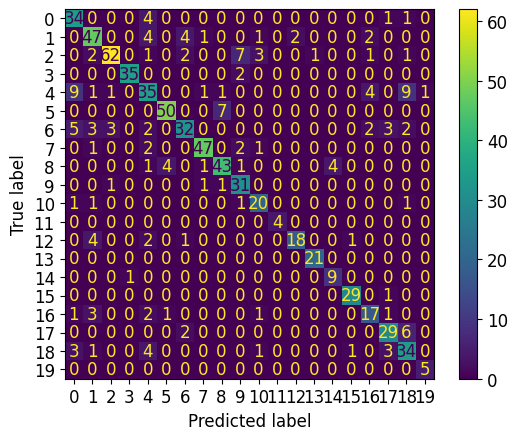

In [ ]:
cmd = ConfusionMatrixDisplay(cm, display_labels=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19])
plt.rc('font', size = 12)
cmd.plot()

C. KMeans

In [ ]:
# kmeans = KMeans(n_clusters=20,  init='k-means++',n_init=20)
# kmeans.fit(X)
# y_kmeans = kmeans.predict(X_test)
# print('Accuracy Score (K-means): ', accuracy_score(y_test, y_kmeans))
# kmeans_accuracy = accuracy_score(y_test, y_kmeans)

Accuracy Score (K-means):  0.06315789473684211


D. Reduce features to increase speed, reduce multicolinearity, and remove unncesscary data.

In [ ]:
def processSubset(feature_set):
    # Fit model on feature_set and calculate RSS
    model = sm.OLS(y,X_trial[list(feature_set)])
    regr = model.fit()
    RSS = ((regr.predict(X_trial[list(feature_set)]) - y) ** 2).sum()
    return {"model":regr, "RSS":RSS}

In [ ]:
def getBest(k):
    results = []
    for combo in itertools.combinations(X_trial.columns, k):
        results.append(processSubset(combo))
    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)
    # Choose the model with the lowest RSS
    best_model = models.loc[models['RSS'].argmin()]
    print("Processed ", models.shape[0], "models on", k, "predictors.")
    # Return the best model
    return best_model

In [ ]:
def forward(predictors):
    # Pull out predictors we still need to process
    remaining_predictors = [p for p in X_trial.columns if p not in predictors]

    results = []

    for p in remaining_predictors:
        results.append(processSubset(predictors+[p]))

    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)

    # Choose the model with the lowest RSS
    best_model = models.loc[models['RSS'].argmin()]

    print("Processed ", models.shape[0], "models on", len(predictors)+1, "predictors.")

    # Return the best model
    return best_model

In [ ]:
models2 = pd.DataFrame(columns=["RSS", "model"])
predictors = []
for i in range(1,len(X_trial.columns)+1):
    models2.loc[i] = forward(predictors)
    predictors = models2.loc[i]["model"].model.exog_names

Processed  49 models on 1 predictors.
Processed  48 models on 2 predictors.
Processed  47 models on 3 predictors.
Processed  46 models on 4 predictors.
Processed  45 models on 5 predictors.
Processed  44 models on 6 predictors.
Processed  43 models on 7 predictors.
Processed  42 models on 8 predictors.
Processed  41 models on 9 predictors.
Processed  40 models on 10 predictors.
Processed  39 models on 11 predictors.
Processed  38 models on 12 predictors.
Processed  37 models on 13 predictors.
Processed  36 models on 14 predictors.
Processed  35 models on 15 predictors.
Processed  34 models on 16 predictors.
Processed  33 models on 17 predictors.
Processed  32 models on 18 predictors.
Processed  31 models on 19 predictors.
Processed  30 models on 20 predictors.
Processed  29 models on 21 predictors.
Processed  28 models on 22 predictors.
Processed  27 models on 23 predictors.
Processed  26 models on 24 predictors.
Processed  25 models on 25 predictors.
Processed  24 models on 26 predict

In [ ]:
print(models2.loc[48, "model"].summary())


                                 OLS Regression Results                                
Dep. Variable:                classes   R-squared (uncentered):                   0.774
Model:                            OLS   Adj. R-squared (uncentered):              0.770
Method:                 Least Squares   F-statistic:                              213.2
Date:                Mon, 10 Jun 2024   Prob (F-statistic):                        0.00
Time:                        08:16:28   Log-Likelihood:                         -8956.4
No. Observations:                3037   AIC:                                  1.801e+04
Df Residuals:                    2989   BIC:                                  1.830e+04
Df Model:                          48                                                  
Covariance Type:            nonrobust                                                  
                               coef    std err          t      P>|t|      [0.025      0.975]
---------------------------

In [ ]:
def backward(predictors):
    results = []
    for combo in itertools.combinations(predictors, len(predictors)-1):
        results.append(processSubset(combo))

    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)

    # Choose the model with the lowest RSS
    best_model = models.loc[models['RSS'].argmin()]

    print("Processed ", models.shape[0], "models on", len(predictors)-1, "predictors.")

    # Return the best model
    return best_model

In [ ]:
models3 = pd.DataFrame(columns=["RSS", "model"], index = range(1,len(X_trial.columns)))
predictors = X_trial.columns
while(len(predictors) > 1):
    models3.loc[len(predictors)-1] = backward(predictors)
    predictors = models3.loc[len(predictors)-1]["model"].model.exog_names

Processed  49 models on 48 predictors.
Processed  48 models on 47 predictors.
Processed  47 models on 46 predictors.
Processed  46 models on 45 predictors.
Processed  45 models on 44 predictors.
Processed  44 models on 43 predictors.
Processed  43 models on 42 predictors.
Processed  42 models on 41 predictors.
Processed  41 models on 40 predictors.
Processed  40 models on 39 predictors.
Processed  39 models on 38 predictors.
Processed  38 models on 37 predictors.
Processed  37 models on 36 predictors.
Processed  36 models on 35 predictors.
Processed  35 models on 34 predictors.
Processed  34 models on 33 predictors.
Processed  33 models on 32 predictors.
Processed  32 models on 31 predictors.
Processed  31 models on 30 predictors.
Processed  30 models on 29 predictors.
Processed  29 models on 28 predictors.
Processed  28 models on 27 predictors.
Processed  27 models on 26 predictors.
Processed  26 models on 25 predictors.
Processed  25 models on 24 predictors.
Processed  24 models on 2

In [ ]:
models3.loc[47, "model"].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                classes   R-squared (uncentered):                   0.774
Model:                            OLS   Adj. R-squared (uncentered):              0.770
Method:                 Least Squares   F-statistic:                              217.8
Date:                Mon, 10 Jun 2024   Prob (F-statistic):                        0.00
Time:                        08:17:04   Log-Likelihood:                         -8956.4
No. Observations:                3037   AIC:                                  1.801e+04
Df Residuals:                    2990   BIC:                                  1.829e+04
Df Model:                          47                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
caco3Conc                    0.0248      0.031      0.806      0.420      -0.035       0.085
caNh4d                       0.0308      0.010      3.154      0.002       0.012       0.050
kNh4d                        0.9616      0.195      4.942      0.000       0.580       1.343
mgNh4d                      -0.0733      0.037     -2.002      0.045      -0.145      -0.002
naNh4d                       0.1827      0.127      1.443      0.149      -0.066       0.431
cecdNh4                     -0.1606      0.014    -11.748      0.000      -0.187      -0.134
alSatCecd33                 -0.0223      0.004     -6.236      0.000      -0.029      -0.015
ececCecd33                   0.0572      0.016      3.667      0.000       0.027       0.088
bsesatCecd10                 0.0040      0.003      1.158      0.247      -0.003       0.011
alKcl                        0.1265      0.041      3.096      0.002       0.046       0.207
mnKcl                        0.0020      0.001      2.050      0.040    8.72e-05       0.004
phCacl2                     -4.3371      0.423    -10.248      0.000      -5.167      -3.507
phH2o                        5.2004      0.373     13.925      0.000       4.468       5.933
ec12pre                     -0.2835      0.248     -1.144      0.253      -0.769       0.202
caSatx                      -0.0850      0.059     -1.436      0.151      -0.201       0.031
clSatx                       0.5065      0.091      5.545      0.000       0.327       0.686
co3Satx                     -0.2887      0.239     -1.209      0.227      -0.757       0.180
ecSatp                      -3.3939      0.803     -4.228      0.000      -4.968      -1.820
flSatx                       0.3332      0.981      0.340      0.734      -1.590       2.256
waterSatx                    0.0011      0.001      1.432      0.152      -0.000       0.003
hco3Sx                       0.7366      0.129      5.713      0.000       0.484       0.989
kSatx                       -0.8696      0.362     -2.406      0.016      -1.578      -0.161
mgSatx                       0.1393      0.070      1.994      0.046       0.002       0.276
naSatx                      -0.1061      0.031     -3.374      0.001      -0.168      -0.044
no2Satx                      0.1319      0.163      0.809      0.419      -0.188       0.452
no3Satx                      0.4841      0.096      5.047      0.000       0.296       0.672
pSatx                        0.2336      0.291      0.803      0.422      -0.337       0.804
phSp                        -0.3159      0.062     -5.103      0.000      -0.437      -0.195
so4Satx                      0.3466      0.059      5.877      0.000       0.231       0.462
carbonTo

In [ ]:
#
X_trial = X_trial.drop(columns =['gypsumConc', 'naNh4d', 'bsesatCecd10', 'acidity', 'alCitDithionate', 'pSatx', 'no2Satx' , 'flSatx', 'co3Satx', 'caSatx', 'ec12pre'])


In [ ]:
X_trial = X_trial.drop(columns=['mgSatx', 'mnOxalate', 'waterSatx', 'mnCitDithionate'])

In [ ]:
models2 = pd.DataFrame(columns=["RSS", "model"])
predictors = []
for i in range(1,len(X_trial.columns)+1):
    models2.loc[i] = forward(predictors)
    predictors = models2.loc[i]["model"].model.exog_names

Processed  34 models on 1 predictors.
Processed  33 models on 2 predictors.
Processed  32 models on 3 predictors.
Processed  31 models on 4 predictors.
Processed  30 models on 5 predictors.
Processed  29 models on 6 predictors.
Processed  28 models on 7 predictors.
Processed  27 models on 8 predictors.
Processed  26 models on 9 predictors.
Processed  25 models on 10 predictors.
Processed  24 models on 11 predictors.
Processed  23 models on 12 predictors.
Processed  22 models on 13 predictors.
Processed  21 models on 14 predictors.
Processed  20 models on 15 predictors.
Processed  19 models on 16 predictors.
Processed  18 models on 17 predictors.
Processed  17 models on 18 predictors.
Processed  16 models on 19 predictors.
Processed  15 models on 20 predictors.
Processed  14 models on 21 predictors.
Processed  13 models on 22 predictors.
Processed  12 models on 23 predictors.
Processed  11 models on 24 predictors.
Processed  10 models on 25 predictors.
Processed  9 models on 26 predicto

In [ ]:
models2.loc[33, "model"].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                classes   R-squared (uncentered):                   0.773
Model:                            OLS   Adj. R-squared (uncentered):              0.770
Method:                 Least Squares   F-statistic:                              309.3
Date:                Mon, 10 Jun 2024   Prob (F-statistic):                        0.00
Time:                        08:17:13   Log-Likelihood:                         -8965.3
No. Observations:                3037   AIC:                                  1.800e+04
Df Residuals:                    3004   BIC:                                  1.820e+04
Df Model:                          33                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
phH2o                        5.2206      0.369     14.152      0.000       4.497       5.944
feOxalate                    2.3522      0.200     11.751      0.000       1.960       2.745
estimatedOC                  0.0741      0.011      7.053      0.000       0.053       0.095
phCacl2                     -4.3095      0.416    -10.370      0.000      -5.124      -3.495
cecdNh4                     -0.1517      0.012    -13.120      0.000      -0.174      -0.129
siliconCitrateDithionate    11.1449      1.581      7.047      0.000       8.044      14.246
Bray1PExtractable            0.0595      0.007      8.874      0.000       0.046       0.073
alSatCecd33                 -0.0226      0.003     -6.818      0.000      -0.029      -0.016
alKcl                        0.1365      0.039      3.487      0.000       0.060       0.213
phSp                        -0.2532      0.053     -4.767      0.000      -0.357      -0.149
clSatx                       0.4792      0.079      6.039      0.000       0.324       0.635
MehlichIIITotP              -0.0168      0.002     -6.755      0.000      -0.022      -0.012
pOxalate                     0.0010      0.000      2.146      0.032    8.32e-05       0.002
feCitDithionate             -0.4937      0.080     -6.148      0.000      -0.651      -0.336
kNh4d                        0.8452      0.184      4.589      0.000       0.484       1.206
alOxalate                    5.1544      0.795      6.481      0.000       3.595       6.714
siOxalate                  -10.4486      2.046     -5.108      0.000     -14.459      -6.438
carbonTot                   -0.0428      0.010     -4.467      0.000      -0.062      -0.024
OlsenPExtractable            0.0254      0.007      3.495      0.000       0.011       0.040
waterRetention15Bar         -0.0229      0.006     -3.815      0.000      -0.035      -0.011
ececCecd33                   0.0556      0.015      3.721      0.000       0.026       0.085
caNh4d                       0.0222      0.009      2.536      0.011       0.005       0.039
so4Satx                      0.3285      0.051      6.436      0.000       0.228       0.429
naSatx                      -0.0972      0.024     -4.095      0.000      -0.144      -0.051
sulfurTot                   -0.6057      0.145     -4.186      0.000      -0.889      -0.322
nitrogenTot                  0.2118      0.065      3.273      0.001       0.085       0.339
hco3Sx                       0.5572      0.106      5.269      0.000       0.350       0.765
kSatx                       -0.6636      0.327     -2.026      0.043      -1.306      -0.021
no3Satx                      0.3959      0.080      4.940      0.000       0.239       0.553
ecSatp  

In [ ]:
X_trial = X_trial.drop(columns=['optDensityOxalate'])

In [ ]:
def backward(predictors):
    results = []
    for combo in itertools.combinations(predictors, len(predictors)-1):
        results.append(processSubset(combo))

    # Wrap everything up in a nice dataframe
    models = pd.DataFrame(results)

    # Choose the model with the lowest RSS
    best_model = models.loc[models['RSS'].argmin()]

    print("Processed ", models.shape[0], "models on", len(predictors)-1, "predictors.")

    # Return the best model
    return best_model

In [ ]:
models3 = pd.DataFrame(columns=["RSS", "model"], index = range(1,len(X_trial.columns)))
predictors = X_trial.columns
while(len(predictors) > 1):
    models3.loc[len(predictors)-1] = backward(predictors)
    predictors = models3.loc[len(predictors)-1]["model"].model.exog_names

Processed  33 models on 32 predictors.
Processed  32 models on 31 predictors.
Processed  31 models on 30 predictors.
Processed  30 models on 29 predictors.
Processed  29 models on 28 predictors.
Processed  28 models on 27 predictors.
Processed  27 models on 26 predictors.
Processed  26 models on 25 predictors.
Processed  25 models on 24 predictors.
Processed  24 models on 23 predictors.
Processed  23 models on 22 predictors.
Processed  22 models on 21 predictors.
Processed  21 models on 20 predictors.
Processed  20 models on 19 predictors.
Processed  19 models on 18 predictors.
Processed  18 models on 17 predictors.
Processed  17 models on 16 predictors.
Processed  16 models on 15 predictors.
Processed  15 models on 14 predictors.
Processed  14 models on 13 predictors.
Processed  13 models on 12 predictors.
Processed  12 models on 11 predictors.
Processed  11 models on 10 predictors.
Processed  10 models on 9 predictors.
Processed  9 models on 8 predictors.
Processed  8 models on 7 pre

In [ ]:
models3.loc[31, "model"].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                classes   R-squared (uncentered):                   0.772
Model:                            OLS   Adj. R-squared (uncentered):              0.770
Method:                 Least Squares   F-statistic:                              328.6
Date:                Mon, 10 Jun 2024   Prob (F-statistic):                        0.00
Time:                        08:17:39   Log-Likelihood:                         -8968.5
No. Observations:                3037   AIC:                                  1.800e+04
Df Residuals:                    3006   BIC:                                  1.819e+04
Df Model:                          31                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
caNh4d                       0.0216      0.009      2.479      0.013       0.005       0.039
kNh4d                        0.9303      0.181      5.138      0.000       0.575       1.285
mgNh4d                      -0.0648      0.030     -2.185      0.029      -0.123      -0.007
cecdNh4                     -0.1529      0.012    -13.274      0.000      -0.175      -0.130
alSatCecd33                 -0.0232      0.003     -7.034      0.000      -0.030      -0.017
ececCecd33                   0.0564      0.015      3.774      0.000       0.027       0.086
alKcl                        0.1354      0.039      3.458      0.001       0.059       0.212
phCacl2                     -4.3287      0.416    -10.412      0.000      -5.144      -3.513
phH2o                        5.2357      0.369     14.185      0.000       4.512       5.959
clSatx                       0.4761      0.079      6.007      0.000       0.321       0.631
ecSatp                      -3.0347      0.703     -4.317      0.000      -4.413      -1.656
hco3Sx                       0.5188      0.104      4.976      0.000       0.314       0.723
kSatx                       -0.6183      0.326     -1.896      0.058      -1.258       0.021
naSatx                      -0.0996      0.024     -4.207      0.000      -0.146      -0.053
no3Satx                      0.3854      0.080      4.817      0.000       0.229       0.542
phSp                        -0.2389      0.053     -4.522      0.000      -0.342      -0.135
so4Satx                      0.3243      0.051      6.368      0.000       0.224       0.424
carbonTot                   -0.0424      0.010     -4.424      0.000      -0.061      -0.024
nitrogenTot                  0.1656      0.062      2.669      0.008       0.044       0.287
estimatedOC                  0.0755      0.010      7.204      0.000       0.055       0.096
sulfurTot                   -0.5758      0.143     -4.013      0.000      -0.857      -0.294
alOxalate                    4.6733      0.729      6.408      0.000       3.243       6.103
feOxalate                    2.3398      0.172     13.613      0.000       2.003       2.677
pOxalate                     0.0009      0.000      2.029      0.043    3.06e-05       0.002
siOxalate                   -9.6397      1.951     -4.941      0.000     -13.465      -5.815
feCitDithionate             -0.4631      0.079     -5.887      0.000      -0.617      -0.309
siliconCitrateDithionate    11.3248      1.575      7.192      0.000       8.237      14.412
waterRetention15Bar         -0.0237      0.006     -4.000      0.000      -0.035      -0.012
MehlichIIITotP              -0.0166      0.002     -6.683      0.000      -0.022      -0.012
Bray1PEx

Accuracy Score (K-means):  0.02763157894736842


E: Support Vector Classifiers, evaluating different types of kernels

In [ ]:
tuned_parameters = [{'C': [ 1, 5, 10, 20, 50, 75, 100]}]
clf = GridSearchCV(SVC(kernel='linear'), tuned_parameters, cv=5, scoring='accuracy', return_train_score=True)
clf.fit(X_train, y_train)
print('\n')
clf.cv_results_

In [ ]:
clf.best_params_


{'C': 10}

In [30]:
svc_test = SVC(C=10, kernel='linear')

svc_test.fit(X_train, y_train)

y_pred = svc_test.predict(X_test)
# pd.DataFrame(confusion_matrix(y_test, y_pred), index=svc_test.classes_, columns=svc_test.classes_)
print('Accuracy Score (Linear Kernel): ', accuracy_score(y_test, y_pred))

svc_linear_kernel_accuracy = accuracy_score(y_test, y_pred)

Accuracy Score (Linear Kernel):  0.8539473684210527


In [32]:
# clf.best_estimator_.score(X_test,y_test)

AttributeError: 'SVC' object has no attribute 'best_estimator_'

In [33]:
tuned_parameters = [{'C': [0.001, 0.01, 0.1, 1, 5, 10, 50, 100],
                     'gamma': [0.00001, 0.0001, 0.001, 0.01, 1, 10, 50, 100, 500, 1000, 10000]}]
clf = GridSearchCV(SVC(kernel='rbf'), tuned_parameters, cv=5, scoring='accuracy', return_train_score=True)
clf.fit(X, y)
print('\n')
clf.cv_results_

{'mean_fit_time': array([1.11728, 0.74105, 0.66536, 0.78049, 0.78441, 0.63976, 0.97782,
        0.60364, 0.83584, 0.59842, 0.85187, 1.1755 , 0.57173, 1.00793,
        1.04218, 0.6943 , 0.915  , 0.72015, 1.34577, 0.93968, 0.80707,
        0.84803, 0.60186, 0.59024, 1.00248, 0.91078, 0.94319, 0.99538,
        0.73663, 0.97257, 0.83253, 0.88325, 0.98134, 0.36389, 0.94506,
        0.86699, 1.31553, 1.17356, 2.94971, 1.91299, 2.36844, 0.89884,
        1.05359, 0.7689 , 0.46858, 0.6139 , 1.1527 , 1.19326, 1.00384,
        1.14471, 1.13191, 0.8445 , 1.14252, 1.01239, 0.96595, 0.48361,
        0.68003, 1.13758, 1.09859, 1.25512, 1.12736, 0.99144, 1.00383,
        1.13321, 0.83427, 1.16639, 0.41046, 0.82351, 1.13074, 0.94609,
        1.38371, 1.12342, 0.84379, 1.10721, 1.13115, 0.83602, 1.12748,
        0.38157, 0.85571, 1.01873, 1.0838 , 1.12959, 0.99008, 1.01166,
        1.12802, 0.86048, 1.11303, 1.11215]),
 'std_fit_time': array([0.84301, 0.159  , 0.12745, 0.17851, 0.23812, 0.07099, 0.33853

In [34]:
clf.best_params_

{'C': 100, 'gamma': 1e-05}

In [38]:
rad_svc = SVC(C = clf.best_params_['C'], kernel='rbf', gamma=clf.best_params_['gamma'])
rad_svc.fit(X_train, y_train)
train_pred = rad_svc.predict(X_train)
train_err = sklearn.metrics.accuracy_score(y_train,train_pred)
pred = rad_svc.predict(X_test)
print('Accuracy Score (Radial Kernel): ', accuracy_score(y_test, pred))
svc_radial_kernel_accuracy = accuracy_score(y_test, pred)

Accuracy Score (Radial Kernel):  0.6960526315789474


In [37]:
clf.best_estimator_.score(X_test,y_test)


0.9197368421052632

In [39]:
#Find the optimal tuning parameters for polynomial kernel
tuned_parameters = [{'C': [0.01, 0.1, 1, 5, 10, 50],
                     'degree': [1, 2, 3]}]
clf = GridSearchCV(SVC(kernel='poly'), tuned_parameters, cv=5, scoring='accuracy', return_train_score=True)
clf.fit(X, y)
print('\n')
clf.cv_results_

{'mean_fit_time': array([0.41935, 0.41573, 0.68407, 0.40119, 0.42043, 0.70006, 0.34913,
        0.39616, 0.92032, 0.32969, 0.39348, 0.99388, 0.48066, 1.33942,
        0.59482, 0.60611, 0.5163 , 0.54703]),
 'std_fit_time': array([0.0117 , 0.00839, 0.13585, 0.00708, 0.00548, 0.13905, 0.01376,
        0.01407, 0.6484 , 0.01743, 0.01822, 0.42089, 0.0888 , 0.72369,
        0.18297, 0.13212, 0.14631, 0.05024]),
 'mean_score_time': array([0.0956 , 0.09746, 0.1266 , 0.09189, 0.09595, 0.12851, 0.09384,
        0.09423, 0.14089, 0.09457, 0.09128, 0.14813, 0.15394, 0.18214,
        0.09717, 0.10895, 0.09491, 0.08685]),
 'std_score_time': array([0.0042 , 0.00415, 0.01644, 0.00069, 0.0016 , 0.01666, 0.00379,
        0.00427, 0.03185, 0.00332, 0.00251, 0.04017, 0.06557, 0.05249,
        0.01441, 0.01904, 0.01473, 0.00186]),
 'param_C': masked_array(data=[0.01, 0.01, 0.01, 0.1, 0.1, 0.1, 1, 1, 1, 5, 5, 5, 10,
                    10, 10, 50, 50, 50],
              mask=[False, False, False, False, Fal

In [40]:
clf.best_params_


{'C': 50, 'degree': 1}

In [41]:
poly_svc = SVC(C = clf.best_params_['C'], kernel='poly', degree=clf.best_params_['degree'])
poly_svc.fit(X_train, y_train)
train_pred = poly_svc.predict(X_train)
train_err = sklearn.metrics.accuracy_score(y_train,train_pred)
pred = poly_svc.predict(X_test)
poly_accuracy = sklearn.metrics.accuracy_score(y_test,pred)
print('poly test accuracy:', poly_accuracy)
clf.best_estimator_.score(X_test, y_test)
svc_poly_kernel_accuracy = poly_accuracy

poly test accuracy: 0.4986842105263158


In [ ]:
learning_rates = np.linspace(0.001, 1, 15)
accuracy_rates = np.zeros(15)
for i in range(15):
  k = learning_rates[i]
  classifier_g = GradientBoostingClassifier(n_estimators=1000, learning_rate=k, random_state=0)
  classifier_g.fit(X_train, y_train)
  pred = classifier_g.predict(X_test)
  accuracy_rates[i] = accuracy_score(y_test, pred)


In [ ]:
accuracy_rates

array([0.78026, 0.91184, 0.91711, 0.92237, 0.91447, 0.91316, 0.90526,
       0.90395, 0.10789, 0.88553, 0.05526, 0.01447, 0.01184, 0.05921,
       0.21579])

In [ ]:
#Ridge Classifier
scaler = StandardScaler().fit(X)

alphas = 10**np.linspace(10,-2,100)
ridge = skl_lm.RidgeClassifier()
coefs = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(scaler.transform(X), y)
    coefs.append(ridge.coef_)

In [ ]:
def Ridge_Classifier(X, y, alpha):
    scaler = StandardScaler()
    ridge = skl_lm.RidgeClassifier()
    ridge.set_params(alpha=alpha)
    ridge.fit(scaler.fit_transform(X), y)
    return ridge.coef_

In [ ]:
alphas = 10**np.linspace(10,-2,100)
scaler = StandardScaler().fit(X)

ridgecv = skl_lm.RidgeClassifierCV(alphas=alphas, scoring='neg_mean_squared_error')
ridgecv.fit(scaler.fit_transform(X_train), y_train)
ridgecv.alpha_

0.017475284000076828

In [ ]:
optimal_ridge = skl_lm.RidgeClassifier()
optimal_ridge.set_params(alpha=ridgecv.alpha_)
optimal_ridge.fit(scaler.fit_transform(X_train), y_train)

RidgeClassifier(alpha=0.017475284000076828)

<Axes: >

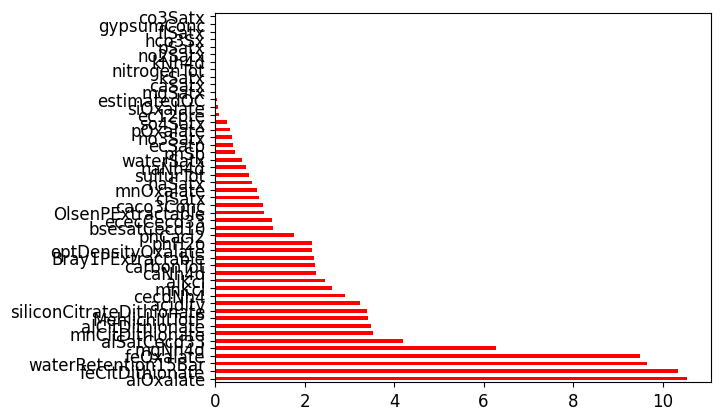

In [ ]:
importance = pd.Series(classifier_g.feature_importances_ * 100, index = X.columns)
importance = importance.sort_values(axis=0, ascending = False)
importance.plot(kind='barh', color='r')

In [ ]:
y_pred = optimal_ridge.predict(X_test)
print('Accuracy Score (Ride Classifier): ', accuracy_score(y_test, y_pred))
ridge_classifier_accuracy = accuracy_score(y_test, y_pred)

Accuracy Score (Ride Classifier):  0.18421052631578946


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RidgeClassifier was fitted without feature names
  warnings.warn(


In [ ]:
#Neural Networks


params1 = {
  'hidden_layer_sizes': [(10,),(10,10),(10,10,10), (20,),(20,20),(20,20,20), (50,), (50,50), (100,), (100,100), (200,), (200,200)],
  'alpha': np.linspace(0, 100, 10),
  'max_iter': np.linspace(10,50, num=5, dtype=int)

}
mlp = MLPClassifier(activation='logistic',solver='sgd', tol=1e-4, random_state=0,
                    learning_rate_init=.1, verbose=True)

clf1 = GridSearchCV(mlp, params1, cv=8)
clf1.fit(X_train, y_train)

Iteration 1, loss = 2.95783586
Iteration 2, loss = 2.77543369
Iteration 3, loss = 2.68547506
Iteration 4, loss = 2.62189562
Iteration 5, loss = 2.56044801
Iteration 6, loss = 2.50967670
Iteration 7, loss = 2.52442846
Iteration 8, loss = 2.50504757
Iteration 9, loss = 2.48924478
Iteration 10, loss = 2.52789161
Iteration 1, loss = 2.96110967
Iteration 2, loss = 2.79780011
Iteration 3, loss = 2.70483213
Iteration 4, loss = 2.67529700
Iteration 5, loss = 2.66863084
Iteration 6, loss = 2.62820377
Iteration 7, loss = 2.60953886
Iteration 8, loss = 2.52791705
Iteration 9, loss = 2.54572787
Iteration 10, loss = 2.51254494
Iteration 1, loss = 2.96076180
Iteration 2, loss = 2.77379230
Iteration 3, loss = 2.68148404
Iteration 4, loss = 2.61764251
Iteration 5, loss = 2.53305333


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.47378606
Iteration 7, loss = 2.49900904
Iteration 8, loss = 2.50248709
Iteration 9, loss = 2.45663701
Iteration 10, loss = 2.41455155
Iteration 1, loss = 2.96878818
Iteration 2, loss = 2.80709224
Iteration 3, loss = 2.72351072
Iteration 4, loss = 2.64697252
Iteration 5, loss = 2.59074179
Iteration 6, loss = 2.53854907
Iteration 7, loss = 2.54323942
Iteration 8, loss = 2.51422139
Iteration 9, loss = 2.43509246
Iteration 10, loss = 2.53615068
Iteration 1, loss = 2.98049379
Iteration 2, loss = 2.78932518
Iteration 3, loss = 2.67457810
Iteration 4, loss = 2.59398000
Iteration 5, loss = 2.55405990
Iteration 6, loss = 2.50661073
Iteration 7, loss = 2.50672811
Iteration 8, loss = 2.49600258
Iteration 9, loss = 2.47423911


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.44061139
Iteration 1, loss = 2.96248478
Iteration 2, loss = 2.77258888
Iteration 3, loss = 2.70921242
Iteration 4, loss = 2.63376303
Iteration 5, loss = 2.58609618
Iteration 6, loss = 2.56653674
Iteration 7, loss = 2.52424199
Iteration 8, loss = 2.49085591
Iteration 9, loss = 2.42887222
Iteration 10, loss = 2.39920504
Iteration 1, loss = 2.97298801
Iteration 2, loss = 2.78778191
Iteration 3, loss = 2.69701690
Iteration 4, loss = 2.63910393
Iteration 5, loss = 2.56739951
Iteration 6, loss = 2.55200715
Iteration 7, loss = 2.51310644
Iteration 8, loss = 2.50515441
Iteration 9, loss = 2.45799148
Iteration 10, loss = 2.48827432


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.96220385
Iteration 2, loss = 2.77078803
Iteration 3, loss = 2.67374172
Iteration 4, loss = 2.61905171
Iteration 5, loss = 2.58465447
Iteration 6, loss = 2.50202950
Iteration 7, loss = 2.48609430
Iteration 8, loss = 2.52418109
Iteration 9, loss = 2.45740781
Iteration 10, loss = 2.46091805
Iteration 1, loss = 2.95783586
Iteration 2, loss = 2.77543369
Iteration 3, loss = 2.68547506
Iteration 4, loss = 2.62189562
Iteration 5, loss = 2.56044801
Iteration 6, loss = 2.50967670
Iteration 7, loss = 2.52442846
Iteration 8, loss = 2.50504757
Iteration 9, loss = 2.48924478
Iteration 10, loss = 2.52789161
Iteration 11, loss = 2.51626691
Iteration 12, loss = 2.45397884
Iteration 13, loss = 2.43388790
Iteration 14, loss = 2.39965281
Iteration 15, loss = 2.35494430
Iteration 16, loss = 2.36379518
Iteration 17, loss = 2.38758024
Iteration 18, loss = 2.36142322
Iteration 19, loss = 2.34301677
Iteration 20, loss = 2.34490940
Iteration 1, loss = 2.96110967
Iteration 2, loss = 2.79780

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.31225840
Iteration 1, loss = 2.96076180
Iteration 2, loss = 2.77379230
Iteration 3, loss = 2.68148404
Iteration 4, loss = 2.61764251
Iteration 5, loss = 2.53305333
Iteration 6, loss = 2.47378606
Iteration 7, loss = 2.49900904
Iteration 8, loss = 2.50248709
Iteration 9, loss = 2.45663701
Iteration 10, loss = 2.41455155
Iteration 11, loss = 2.39767905
Iteration 12, loss = 2.37726537
Iteration 13, loss = 2.35574756
Iteration 14, loss = 2.33799255
Iteration 15, loss = 2.39815924
Iteration 16, loss = 2.35356312
Iteration 17, loss = 2.34452927
Iteration 18, loss = 2.30612363
Iteration 19, loss = 2.26099000
Iteration 20, loss = 2.21010972
Iteration 1, loss = 2.96878818
Iteration 2, loss = 2.80709224
Iteration 3, loss = 2.72351072


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.64697252
Iteration 5, loss = 2.59074179
Iteration 6, loss = 2.53854907
Iteration 7, loss = 2.54323942
Iteration 8, loss = 2.51422139
Iteration 9, loss = 2.43509246
Iteration 10, loss = 2.53615068
Iteration 11, loss = 2.48498433
Iteration 12, loss = 2.53307289
Iteration 13, loss = 2.49011351
Iteration 14, loss = 2.46022564
Iteration 15, loss = 2.50793966
Iteration 16, loss = 2.52838838
Iteration 17, loss = 2.47638411
Iteration 18, loss = 2.39781974
Iteration 19, loss = 2.36353946
Iteration 20, loss = 2.38521210
Iteration 1, loss = 2.98049379
Iteration 2, loss = 2.78932518
Iteration 3, loss = 2.67457810
Iteration 4, loss = 2.59398000
Iteration 5, loss = 2.55405990
Iteration 6, loss = 2.50661073
Iteration 7, loss = 2.50672811
Iteration 8, loss = 2.49600258
Iteration 9, loss = 2.47423911
Iteration 10, loss = 2.44061139
Iteration 11, loss = 2.44003448
Iteration 12, loss = 2.44711274
Iteration 13, loss = 2.38046353
Iteration 14, loss = 2.37983422
Iteration 15, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.38527144
Iteration 13, loss = 2.36348867
Iteration 14, loss = 2.37047253
Iteration 15, loss = 2.38258733
Iteration 16, loss = 2.35510311
Iteration 17, loss = 2.36410078
Iteration 18, loss = 2.40961793
Iteration 19, loss = 2.44739137
Iteration 20, loss = 2.44760728
Iteration 1, loss = 2.97298801
Iteration 2, loss = 2.78778191
Iteration 3, loss = 2.69701690
Iteration 4, loss = 2.63910393
Iteration 5, loss = 2.56739951
Iteration 6, loss = 2.55200715
Iteration 7, loss = 2.51310644
Iteration 8, loss = 2.50515441
Iteration 9, loss = 2.45799148
Iteration 10, loss = 2.48827432
Iteration 11, loss = 2.45071585
Iteration 12, loss = 2.44563308
Iteration 13, loss = 2.37774443
Iteration 14, loss = 2.34406063
Iteration 15, loss = 2.41593235
Iteration 16, loss = 2.36671912
Iteration 17, loss = 2.36465368
Iteration 18, loss = 2.37478574
Iteration 19, loss = 2.36837089
Iteration 20, loss = 2.39858745
Iteration 1, loss = 2.96220385
Iteration 2, loss = 2.77078803
Iteration 3, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.68547506
Iteration 4, loss = 2.62189562
Iteration 5, loss = 2.56044801
Iteration 6, loss = 2.50967670
Iteration 7, loss = 2.52442846
Iteration 8, loss = 2.50504757
Iteration 9, loss = 2.48924478
Iteration 10, loss = 2.52789161
Iteration 11, loss = 2.51626691
Iteration 12, loss = 2.45397884
Iteration 13, loss = 2.43388790
Iteration 14, loss = 2.39965281
Iteration 15, loss = 2.35494430
Iteration 16, loss = 2.36379518
Iteration 17, loss = 2.38758024
Iteration 18, loss = 2.36142322
Iteration 19, loss = 2.34301677
Iteration 20, loss = 2.34490940
Iteration 21, loss = 2.35567863
Iteration 22, loss = 2.34715102
Iteration 23, loss = 2.36600044
Iteration 24, loss = 2.35683361
Iteration 25, loss = 2.29267019
Iteration 26, loss = 2.35619414
Iteration 27, loss = 2.41289554
Iteration 28, loss = 2.37951321
Iteration 29, loss = 2.36605234
Iteration 30, loss = 2.36730395
Iteration 1, loss = 2.96110967
Iteration 2, loss = 2.79780011
Iteration 3, loss = 2.70483213
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 21, loss = 2.30873759
Iteration 22, loss = 2.29552821
Iteration 23, loss = 2.33441528
Iteration 24, loss = 2.30573934
Iteration 25, loss = 2.29540490
Iteration 26, loss = 2.26540751
Iteration 27, loss = 2.25409944
Iteration 28, loss = 2.24292848
Iteration 29, loss = 2.22595158
Iteration 30, loss = 2.26157202
Iteration 1, loss = 2.96076180
Iteration 2, loss = 2.77379230
Iteration 3, loss = 2.68148404
Iteration 4, loss = 2.61764251
Iteration 5, loss = 2.53305333
Iteration 6, loss = 2.47378606
Iteration 7, loss = 2.49900904
Iteration 8, loss = 2.50248709
Iteration 9, loss = 2.45663701
Iteration 10, loss = 2.41455155
Iteration 11, loss = 2.39767905
Iteration 12, loss = 2.37726537
Iteration 13, loss = 2.35574756
Iteration 14, loss = 2.33799255


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.39815924
Iteration 16, loss = 2.35356312
Iteration 17, loss = 2.34452927
Iteration 18, loss = 2.30612363
Iteration 19, loss = 2.26099000
Iteration 20, loss = 2.21010972
Iteration 21, loss = 2.23150215
Iteration 22, loss = 2.26367338
Iteration 23, loss = 2.32613999
Iteration 24, loss = 2.34883859
Iteration 25, loss = 2.31758904
Iteration 26, loss = 2.39110161
Iteration 27, loss = 2.34193183
Iteration 28, loss = 2.40821111
Iteration 29, loss = 2.35699498
Iteration 30, loss = 2.34524355
Iteration 1, loss = 2.96878818
Iteration 2, loss = 2.80709224
Iteration 3, loss = 2.72351072
Iteration 4, loss = 2.64697252
Iteration 5, loss = 2.59074179
Iteration 6, loss = 2.53854907
Iteration 7, loss = 2.54323942
Iteration 8, loss = 2.51422139
Iteration 9, loss = 2.43509246


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.53615068
Iteration 11, loss = 2.48498433
Iteration 12, loss = 2.53307289
Iteration 13, loss = 2.49011351
Iteration 14, loss = 2.46022564
Iteration 15, loss = 2.50793966
Iteration 16, loss = 2.52838838
Iteration 17, loss = 2.47638411
Iteration 18, loss = 2.39781974
Iteration 19, loss = 2.36353946
Iteration 20, loss = 2.38521210
Iteration 21, loss = 2.38538486
Iteration 22, loss = 2.33264652
Iteration 23, loss = 2.29228702
Iteration 24, loss = 2.32950221
Iteration 25, loss = 2.44387743
Iteration 26, loss = 2.39416182
Iteration 27, loss = 2.37515583
Iteration 28, loss = 2.36783337
Iteration 29, loss = 2.35624923
Iteration 30, loss = 2.33100992
Iteration 1, loss = 2.98049379
Iteration 2, loss = 2.78932518
Iteration 3, loss = 2.67457810
Iteration 4, loss = 2.59398000
Iteration 5, loss = 2.55405990


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.50661073
Iteration 7, loss = 2.50672811
Iteration 8, loss = 2.49600258
Iteration 9, loss = 2.47423911
Iteration 10, loss = 2.44061139
Iteration 11, loss = 2.44003448
Iteration 12, loss = 2.44711274
Iteration 13, loss = 2.38046353
Iteration 14, loss = 2.37983422
Iteration 15, loss = 2.38072013
Iteration 16, loss = 2.37962115
Iteration 17, loss = 2.34779676
Iteration 18, loss = 2.42837192
Iteration 19, loss = 2.42673818
Iteration 20, loss = 2.37849438
Iteration 21, loss = 2.38820056
Iteration 22, loss = 2.33705628
Iteration 23, loss = 2.32493473
Iteration 24, loss = 2.31711924
Iteration 25, loss = 2.27193012
Iteration 26, loss = 2.31292773
Iteration 27, loss = 2.30333837
Iteration 28, loss = 2.39240485
Iteration 29, loss = 2.36484651
Iteration 30, loss = 2.36670630


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.96248478
Iteration 2, loss = 2.77258888
Iteration 3, loss = 2.70921242
Iteration 4, loss = 2.63376303
Iteration 5, loss = 2.58609618
Iteration 6, loss = 2.56653674
Iteration 7, loss = 2.52424199
Iteration 8, loss = 2.49085591
Iteration 9, loss = 2.42887222
Iteration 10, loss = 2.39920504
Iteration 11, loss = 2.37547086
Iteration 12, loss = 2.38527144
Iteration 13, loss = 2.36348867
Iteration 14, loss = 2.37047253
Iteration 15, loss = 2.38258733
Iteration 16, loss = 2.35510311
Iteration 17, loss = 2.36410078
Iteration 18, loss = 2.40961793
Iteration 19, loss = 2.44739137
Iteration 20, loss = 2.44760728
Iteration 21, loss = 2.38092376
Iteration 22, loss = 2.37290403
Iteration 23, loss = 2.33093135
Iteration 24, loss = 2.28334387
Iteration 25, loss = 2.28545568
Iteration 26, loss = 2.27042810
Iteration 27, loss = 2.26182125
Iteration 28, loss = 2.32542224
Iteration 29, loss = 2.35674987
Iteration 30, loss = 2.30971309
Iteration 1, loss = 2.97298801
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 22, loss = 2.37256613
Iteration 23, loss = 2.33617723
Iteration 24, loss = 2.31559619
Iteration 25, loss = 2.34276411
Iteration 26, loss = 2.35527883
Iteration 27, loss = 2.33184422
Iteration 28, loss = 2.38415468
Iteration 29, loss = 2.40158115
Iteration 30, loss = 2.31060292
Iteration 1, loss = 2.96220385
Iteration 2, loss = 2.77078803
Iteration 3, loss = 2.67374172
Iteration 4, loss = 2.61905171
Iteration 5, loss = 2.58465447
Iteration 6, loss = 2.50202950
Iteration 7, loss = 2.48609430
Iteration 8, loss = 2.52418109
Iteration 9, loss = 2.45740781
Iteration 10, loss = 2.46091805
Iteration 11, loss = 2.52397707
Iteration 12, loss = 2.51932182
Iteration 13, loss = 2.45927573
Iteration 14, loss = 2.52397155
Iteration 15, loss = 2.49165677


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.44395324
Iteration 17, loss = 2.46089914
Iteration 18, loss = 2.43215003
Iteration 19, loss = 2.38516822
Iteration 20, loss = 2.39938252
Iteration 21, loss = 2.43799946
Iteration 22, loss = 2.43151327
Iteration 23, loss = 2.47697593
Iteration 24, loss = 2.47165878
Iteration 25, loss = 2.39910575
Iteration 26, loss = 2.37372321
Iteration 27, loss = 2.36942676
Iteration 28, loss = 2.35058583
Iteration 29, loss = 2.32985458
Iteration 30, loss = 2.32776172
Iteration 1, loss = 2.95783586
Iteration 2, loss = 2.77543369
Iteration 3, loss = 2.68547506
Iteration 4, loss = 2.62189562
Iteration 5, loss = 2.56044801
Iteration 6, loss = 2.50967670
Iteration 7, loss = 2.52442846
Iteration 8, loss = 2.50504757
Iteration 9, loss = 2.48924478
Iteration 10, loss = 2.52789161
Iteration 11, loss = 2.51626691


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.45397884
Iteration 13, loss = 2.43388790
Iteration 14, loss = 2.39965281
Iteration 15, loss = 2.35494430
Iteration 16, loss = 2.36379518
Iteration 17, loss = 2.38758024
Iteration 18, loss = 2.36142322
Iteration 19, loss = 2.34301677
Iteration 20, loss = 2.34490940
Iteration 21, loss = 2.35567863
Iteration 22, loss = 2.34715102
Iteration 23, loss = 2.36600044
Iteration 24, loss = 2.35683361
Iteration 25, loss = 2.29267019
Iteration 26, loss = 2.35619414
Iteration 27, loss = 2.41289554
Iteration 28, loss = 2.37951321
Iteration 29, loss = 2.36605234
Iteration 30, loss = 2.36730395
Iteration 31, loss = 2.32019839
Iteration 32, loss = 2.26929974
Iteration 33, loss = 2.29030960
Iteration 34, loss = 2.31804732
Iteration 35, loss = 2.33569151
Iteration 36, loss = 2.24396111
Iteration 37, loss = 2.21936968
Iteration 38, loss = 2.18028536
Iteration 39, loss = 2.15512898
Iteration 40, loss = 2.24261136
Iteration 1, loss = 2.96110967
Iteration 2, loss = 2.79780011
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.46227818
Iteration 13, loss = 2.45678832
Iteration 14, loss = 2.40350255
Iteration 15, loss = 2.38927441
Iteration 16, loss = 2.38178770
Iteration 17, loss = 2.36961361
Iteration 18, loss = 2.36898909
Iteration 19, loss = 2.32845827
Iteration 20, loss = 2.31225840
Iteration 21, loss = 2.30873759
Iteration 22, loss = 2.29552821
Iteration 23, loss = 2.33441528
Iteration 24, loss = 2.30573934
Iteration 25, loss = 2.29540490
Iteration 26, loss = 2.26540751
Iteration 27, loss = 2.25409944
Iteration 28, loss = 2.24292848
Iteration 29, loss = 2.22595158
Iteration 30, loss = 2.26157202
Iteration 31, loss = 2.31141729
Iteration 32, loss = 2.30302548
Iteration 33, loss = 2.39885490
Iteration 34, loss = 2.33083433
Iteration 35, loss = 2.30061227
Iteration 36, loss = 2.27721664
Iteration 37, loss = 2.24587461
Iteration 38, loss = 2.17409509
Iteration 39, loss = 2.16187339
Iteration 40, loss = 2.18067306
Iteration 1, loss = 2.96076180
Iteration 2, loss = 2.77379230
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.50248709
Iteration 9, loss = 2.45663701
Iteration 10, loss = 2.41455155
Iteration 11, loss = 2.39767905
Iteration 12, loss = 2.37726537
Iteration 13, loss = 2.35574756
Iteration 14, loss = 2.33799255
Iteration 15, loss = 2.39815924
Iteration 16, loss = 2.35356312
Iteration 17, loss = 2.34452927
Iteration 18, loss = 2.30612363
Iteration 19, loss = 2.26099000
Iteration 20, loss = 2.21010972
Iteration 21, loss = 2.23150215
Iteration 22, loss = 2.26367338
Iteration 23, loss = 2.32613999
Iteration 24, loss = 2.34883859
Iteration 25, loss = 2.31758904
Iteration 26, loss = 2.39110161
Iteration 27, loss = 2.34193183
Iteration 28, loss = 2.40821111
Iteration 29, loss = 2.35699498
Iteration 30, loss = 2.34524355
Iteration 31, loss = 2.30033773
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.96878818
Iteration 2, loss = 2.80709224
Iteration 3, loss = 2.72351072
Iteration 4, loss = 2.64697252
Iteration 5, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.36671912
Iteration 17, loss = 2.36465368
Iteration 18, loss = 2.37478574
Iteration 19, loss = 2.36837089
Iteration 20, loss = 2.39858745
Iteration 21, loss = 2.38562906
Iteration 22, loss = 2.37256613
Iteration 23, loss = 2.33617723
Iteration 24, loss = 2.31559619
Iteration 25, loss = 2.34276411
Iteration 26, loss = 2.35527883
Iteration 27, loss = 2.33184422
Iteration 28, loss = 2.38415468
Iteration 29, loss = 2.40158115
Iteration 30, loss = 2.31060292
Iteration 31, loss = 2.30698989
Iteration 32, loss = 2.26853333
Iteration 33, loss = 2.23938913
Iteration 34, loss = 2.24496656
Iteration 35, loss = 2.29500894
Iteration 36, loss = 2.28404438
Iteration 37, loss = 2.27773985
Iteration 38, loss = 2.26900153
Iteration 39, loss = 2.23672663
Iteration 40, loss = 2.24534644
Iteration 1, loss = 2.96220385
Iteration 2, loss = 2.77078803
Iteration 3, loss = 2.67374172
Iteration 4, loss = 2.61905171
Iteration 5, loss = 2.58465447
Iteration 6, loss = 2.50202950
Iteration 7, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.45927573
Iteration 14, loss = 2.52397155
Iteration 15, loss = 2.49165677
Iteration 16, loss = 2.44395324
Iteration 17, loss = 2.46089914
Iteration 18, loss = 2.43215003
Iteration 19, loss = 2.38516822
Iteration 20, loss = 2.39938252
Iteration 21, loss = 2.43799946
Iteration 22, loss = 2.43151327
Iteration 23, loss = 2.47697593
Iteration 24, loss = 2.47165878
Iteration 25, loss = 2.39910575
Iteration 26, loss = 2.37372321
Iteration 27, loss = 2.36942676
Iteration 28, loss = 2.35058583
Iteration 29, loss = 2.32985458
Iteration 30, loss = 2.32776172
Iteration 31, loss = 2.34606221
Iteration 32, loss = 2.36410600
Iteration 33, loss = 2.29366072
Iteration 34, loss = 2.28272416
Iteration 35, loss = 2.31719645
Iteration 36, loss = 2.33415230
Iteration 37, loss = 2.31628384
Iteration 38, loss = 2.28886486
Iteration 39, loss = 2.30845429
Iteration 40, loss = 2.26193945
Iteration 1, loss = 2.95783586
Iteration 2, loss = 2.77543369
Iteration 3, loss = 2.68547506
Iteration 4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.51626691
Iteration 12, loss = 2.45397884
Iteration 13, loss = 2.43388790
Iteration 14, loss = 2.39965281
Iteration 15, loss = 2.35494430
Iteration 16, loss = 2.36379518
Iteration 17, loss = 2.38758024
Iteration 18, loss = 2.36142322
Iteration 19, loss = 2.34301677
Iteration 20, loss = 2.34490940
Iteration 21, loss = 2.35567863
Iteration 22, loss = 2.34715102
Iteration 23, loss = 2.36600044
Iteration 24, loss = 2.35683361
Iteration 25, loss = 2.29267019
Iteration 26, loss = 2.35619414
Iteration 27, loss = 2.41289554
Iteration 28, loss = 2.37951321
Iteration 29, loss = 2.36605234
Iteration 30, loss = 2.36730395
Iteration 31, loss = 2.32019839
Iteration 32, loss = 2.26929974
Iteration 33, loss = 2.29030960
Iteration 34, loss = 2.31804732
Iteration 35, loss = 2.33569151
Iteration 36, loss = 2.24396111
Iteration 37, loss = 2.21936968
Iteration 38, loss = 2.18028536
Iteration 39, loss = 2.15512898
Iteration 40, loss = 2.24261136
Iteration 41, loss = 2.28674752
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.37774443
Iteration 14, loss = 2.34406063
Iteration 15, loss = 2.41593235
Iteration 16, loss = 2.36671912
Iteration 17, loss = 2.36465368
Iteration 18, loss = 2.37478574
Iteration 19, loss = 2.36837089
Iteration 20, loss = 2.39858745
Iteration 21, loss = 2.38562906
Iteration 22, loss = 2.37256613
Iteration 23, loss = 2.33617723
Iteration 24, loss = 2.31559619
Iteration 25, loss = 2.34276411
Iteration 26, loss = 2.35527883
Iteration 27, loss = 2.33184422
Iteration 28, loss = 2.38415468
Iteration 29, loss = 2.40158115
Iteration 30, loss = 2.31060292
Iteration 31, loss = 2.30698989
Iteration 32, loss = 2.26853333
Iteration 33, loss = 2.23938913
Iteration 34, loss = 2.24496656
Iteration 35, loss = 2.29500894
Iteration 36, loss = 2.28404438
Iteration 37, loss = 2.27773985
Iteration 38, loss = 2.26900153
Iteration 39, loss = 2.23672663
Iteration 40, loss = 2.24534644
Iteration 41, loss = 2.21384383
Iteration 42, loss = 2.20428624
Iteration 43, loss = 2.18322317
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.52397155
Iteration 15, loss = 2.49165677
Iteration 16, loss = 2.44395324
Iteration 17, loss = 2.46089914
Iteration 18, loss = 2.43215003
Iteration 19, loss = 2.38516822
Iteration 20, loss = 2.39938252
Iteration 21, loss = 2.43799946
Iteration 22, loss = 2.43151327
Iteration 23, loss = 2.47697593
Iteration 24, loss = 2.47165878
Iteration 25, loss = 2.39910575
Iteration 26, loss = 2.37372321
Iteration 27, loss = 2.36942676
Iteration 28, loss = 2.35058583
Iteration 29, loss = 2.32985458
Iteration 30, loss = 2.32776172
Iteration 31, loss = 2.34606221
Iteration 32, loss = 2.36410600
Iteration 33, loss = 2.29366072
Iteration 34, loss = 2.28272416
Iteration 35, loss = 2.31719645
Iteration 36, loss = 2.33415230
Iteration 37, loss = 2.31628384
Iteration 38, loss = 2.28886486
Iteration 39, loss = 2.30845429
Iteration 40, loss = 2.26193945
Iteration 41, loss = 2.24012888
Iteration 42, loss = 2.26618574
Iteration 43, loss = 2.24445140
Iteration 44, loss = 2.22169636
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89264770
Iteration 3, loss = 2.87542499
Iteration 4, loss = 2.86222052
Iteration 5, loss = 2.84963543
Iteration 6, loss = 2.83468065
Iteration 7, loss = 2.80798189
Iteration 8, loss = 2.78022750
Iteration 9, loss = 2.74933087
Iteration 10, loss = 2.70206014
Iteration 1, loss = 2.97996350
Iteration 2, loss = 2.89030364
Iteration 3, loss = 2.87423165
Iteration 4, loss = 2.86290268
Iteration 5, loss = 2.85197772
Iteration 6, loss = 2.83613527
Iteration 7, loss = 2.82362447
Iteration 8, loss = 2.78869947
Iteration 9, loss = 2.75183553
Iteration 10, loss = 2.72757933
Iteration 1, loss = 2.97887701


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89082105
Iteration 3, loss = 2.87631396
Iteration 4, loss = 2.86458069
Iteration 5, loss = 2.85429625
Iteration 6, loss = 2.84263432
Iteration 7, loss = 2.82299596
Iteration 8, loss = 2.79470604
Iteration 9, loss = 2.76134551
Iteration 10, loss = 2.72983554
Iteration 1, loss = 2.97933524
Iteration 2, loss = 2.89234301
Iteration 3, loss = 2.87412106
Iteration 4, loss = 2.86243979
Iteration 5, loss = 2.84869169
Iteration 6, loss = 2.83180257
Iteration 7, loss = 2.80528573
Iteration 8, loss = 2.77630694
Iteration 9, loss = 2.73908980
Iteration 10, loss = 2.71291434
Iteration 1, loss = 2.97883318


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89252585
Iteration 3, loss = 2.87660057
Iteration 4, loss = 2.86613498
Iteration 5, loss = 2.85627699
Iteration 6, loss = 2.84062264
Iteration 7, loss = 2.82165695
Iteration 8, loss = 2.79442419
Iteration 9, loss = 2.76028426
Iteration 10, loss = 2.71936446
Iteration 1, loss = 2.97779754
Iteration 2, loss = 2.89372299
Iteration 3, loss = 2.87572784
Iteration 4, loss = 2.86442828
Iteration 5, loss = 2.85285284
Iteration 6, loss = 2.83822858
Iteration 7, loss = 2.82153308
Iteration 8, loss = 2.79386386
Iteration 9, loss = 2.75903849
Iteration 10, loss = 2.71335278
Iteration 1, loss = 2.97713336
Iteration 2, loss = 2.89440501
Iteration 3, loss = 2.87935524
Iteration 4, loss = 2.86803120
Iteration 5, loss = 2.85651914
Iteration 6, loss = 2.84089146
Iteration 7, loss = 2.82064024
Iteration 8, loss = 2.79416485
Iteration 9, loss = 2.76237652
Iteration 10, loss = 2.72483250
Iteration 1, loss = 2.98004352
Iteration 2, loss = 2.89285894
Iteration 3, loss = 2.87539675
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.56302663
Iteration 17, loss = 2.55938972
Iteration 18, loss = 2.53481218
Iteration 19, loss = 2.51172901
Iteration 20, loss = 2.48067857
Iteration 1, loss = 2.97889057
Iteration 2, loss = 2.89264770
Iteration 3, loss = 2.87542499
Iteration 4, loss = 2.86222052
Iteration 5, loss = 2.84963543
Iteration 6, loss = 2.83468065
Iteration 7, loss = 2.80798189
Iteration 8, loss = 2.78022750
Iteration 9, loss = 2.74933087
Iteration 10, loss = 2.70206014
Iteration 11, loss = 2.66713115
Iteration 12, loss = 2.64853126
Iteration 13, loss = 2.64333431
Iteration 14, loss = 2.63810175
Iteration 15, loss = 2.63596230


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.61695062
Iteration 17, loss = 2.59473736
Iteration 18, loss = 2.58790176
Iteration 19, loss = 2.56496112
Iteration 20, loss = 2.59193664
Iteration 1, loss = 2.97996350
Iteration 2, loss = 2.89030364
Iteration 3, loss = 2.87423165
Iteration 4, loss = 2.86290268
Iteration 5, loss = 2.85197772
Iteration 6, loss = 2.83613527
Iteration 7, loss = 2.82362447
Iteration 8, loss = 2.78869947
Iteration 9, loss = 2.75183553
Iteration 10, loss = 2.72757933
Iteration 11, loss = 2.67214516
Iteration 12, loss = 2.65104816
Iteration 13, loss = 2.61875408
Iteration 14, loss = 2.62509903
Iteration 15, loss = 2.61907016
Iteration 16, loss = 2.59302061
Iteration 17, loss = 2.55340314
Iteration 18, loss = 2.56892248
Iteration 19, loss = 2.52663515
Iteration 20, loss = 2.50370486
Iteration 1, loss = 2.97887701
Iteration 2, loss = 2.89082105
Iteration 3, loss = 2.87631396
Iteration 4, loss = 2.86458069
Iteration 5, loss = 2.85429625
Iteration 6, loss = 2.84263432
Iteration 7, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.55699283
Iteration 18, loss = 2.51531522
Iteration 19, loss = 2.50406488
Iteration 20, loss = 2.53041368
Iteration 1, loss = 2.97933524
Iteration 2, loss = 2.89234301
Iteration 3, loss = 2.87412106
Iteration 4, loss = 2.86243979
Iteration 5, loss = 2.84869169
Iteration 6, loss = 2.83180257
Iteration 7, loss = 2.80528573
Iteration 8, loss = 2.77630694
Iteration 9, loss = 2.73908980
Iteration 10, loss = 2.71291434
Iteration 11, loss = 2.65979067
Iteration 12, loss = 2.62298679
Iteration 13, loss = 2.59406919
Iteration 14, loss = 2.55177398
Iteration 15, loss = 2.52584985
Iteration 16, loss = 2.49490182
Iteration 17, loss = 2.53176055
Iteration 18, loss = 2.54590399
Iteration 19, loss = 2.51664400
Iteration 20, loss = 2.50303662
Iteration 1, loss = 2.97883318
Iteration 2, loss = 2.89252585
Iteration 3, loss = 2.87660057
Iteration 4, loss = 2.86613498
Iteration 5, loss = 2.85627699
Iteration 6, loss = 2.84062264
Iteration 7, loss = 2.82165695
Iteration 8, loss = 2.79

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.53432930
Iteration 1, loss = 2.97779754
Iteration 2, loss = 2.89372299
Iteration 3, loss = 2.87572784
Iteration 4, loss = 2.86442828
Iteration 5, loss = 2.85285284
Iteration 6, loss = 2.83822858
Iteration 7, loss = 2.82153308
Iteration 8, loss = 2.79386386
Iteration 9, loss = 2.75903849
Iteration 10, loss = 2.71335278
Iteration 11, loss = 2.67399425
Iteration 12, loss = 2.62911453
Iteration 13, loss = 2.59268148
Iteration 14, loss = 2.61691976
Iteration 15, loss = 2.56557479
Iteration 16, loss = 2.56854787
Iteration 17, loss = 2.57210966
Iteration 18, loss = 2.52339071
Iteration 19, loss = 2.52763872
Iteration 20, loss = 2.53897242
Iteration 1, loss = 2.97713336
Iteration 2, loss = 2.89440501
Iteration 3, loss = 2.87935524
Iteration 4, loss = 2.86803120
Iteration 5, loss = 2.85651914
Iteration 6, loss = 2.84089146
Iteration 7, loss = 2.82064024
Iteration 8, loss = 2.79416485
Iteration 9, loss = 2.76237652
Iteration 10, loss = 2.72483250
Iteration 11, loss = 2.705

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.98004352
Iteration 2, loss = 2.89285894
Iteration 3, loss = 2.87539675
Iteration 4, loss = 2.86162088
Iteration 5, loss = 2.85106855
Iteration 6, loss = 2.83517200
Iteration 7, loss = 2.82169016
Iteration 8, loss = 2.79666585
Iteration 9, loss = 2.76116544
Iteration 10, loss = 2.72486504
Iteration 11, loss = 2.70376235
Iteration 12, loss = 2.65621216
Iteration 13, loss = 2.62596254
Iteration 14, loss = 2.62401660
Iteration 15, loss = 2.59217055
Iteration 16, loss = 2.56302663
Iteration 17, loss = 2.55938972
Iteration 18, loss = 2.53481218
Iteration 19, loss = 2.51172901
Iteration 20, loss = 2.48067857
Iteration 21, loss = 2.43797469
Iteration 22, loss = 2.45911870
Iteration 23, loss = 2.46734686
Iteration 24, loss = 2.44011406
Iteration 25, loss = 2.44042974
Iteration 26, loss = 2.51969636
Iteration 27, loss = 2.55747007
Iteration 28, loss = 2.48035575
Iteration 29, loss = 2.43107255
Iteration 30, loss = 2.47138444
Iteration 1, loss = 2.97889057


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89264770
Iteration 3, loss = 2.87542499
Iteration 4, loss = 2.86222052
Iteration 5, loss = 2.84963543
Iteration 6, loss = 2.83468065
Iteration 7, loss = 2.80798189
Iteration 8, loss = 2.78022750
Iteration 9, loss = 2.74933087
Iteration 10, loss = 2.70206014
Iteration 11, loss = 2.66713115
Iteration 12, loss = 2.64853126
Iteration 13, loss = 2.64333431
Iteration 14, loss = 2.63810175
Iteration 15, loss = 2.63596230
Iteration 16, loss = 2.61695062
Iteration 17, loss = 2.59473736
Iteration 18, loss = 2.58790176
Iteration 19, loss = 2.56496112
Iteration 20, loss = 2.59193664
Iteration 21, loss = 2.59737699
Iteration 22, loss = 2.53974710
Iteration 23, loss = 2.55803658
Iteration 24, loss = 2.53961247
Iteration 25, loss = 2.56555793
Iteration 26, loss = 2.52783448
Iteration 27, loss = 2.56308159
Iteration 28, loss = 2.57497492
Iteration 29, loss = 2.52763510
Iteration 30, loss = 2.50793157
Iteration 1, loss = 2.97996350
Iteration 2, loss = 2.89030364
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.83613527
Iteration 7, loss = 2.82362447
Iteration 8, loss = 2.78869947
Iteration 9, loss = 2.75183553
Iteration 10, loss = 2.72757933
Iteration 11, loss = 2.67214516
Iteration 12, loss = 2.65104816
Iteration 13, loss = 2.61875408
Iteration 14, loss = 2.62509903
Iteration 15, loss = 2.61907016
Iteration 16, loss = 2.59302061
Iteration 17, loss = 2.55340314
Iteration 18, loss = 2.56892248
Iteration 19, loss = 2.52663515
Iteration 20, loss = 2.50370486
Iteration 21, loss = 2.46860976
Iteration 22, loss = 2.47554544
Iteration 23, loss = 2.47139495
Iteration 24, loss = 2.50649802
Iteration 25, loss = 2.55299385
Iteration 26, loss = 2.63871697
Iteration 27, loss = 2.58334171
Iteration 28, loss = 2.55434297
Iteration 29, loss = 2.53431712
Iteration 30, loss = 2.51635245


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.97887701
Iteration 2, loss = 2.89082105
Iteration 3, loss = 2.87631396
Iteration 4, loss = 2.86458069
Iteration 5, loss = 2.85429625
Iteration 6, loss = 2.84263432
Iteration 7, loss = 2.82299596
Iteration 8, loss = 2.79470604
Iteration 9, loss = 2.76134551
Iteration 10, loss = 2.72983554
Iteration 11, loss = 2.69193383
Iteration 12, loss = 2.68064272
Iteration 13, loss = 2.64238687
Iteration 14, loss = 2.62124999
Iteration 15, loss = 2.59468862
Iteration 16, loss = 2.59922923
Iteration 17, loss = 2.55699283
Iteration 18, loss = 2.51531522
Iteration 19, loss = 2.50406488
Iteration 20, loss = 2.53041368
Iteration 21, loss = 2.58595695
Iteration 22, loss = 2.58284938
Iteration 23, loss = 2.57970500
Iteration 24, loss = 2.55515116
Iteration 25, loss = 2.50779139
Iteration 26, loss = 2.49043974
Iteration 27, loss = 2.48501659
Iteration 28, loss = 2.52443163
Iteration 29, loss = 2.51724698
Iteration 30, loss = 2.49093549


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.97933524
Iteration 2, loss = 2.89234301
Iteration 3, loss = 2.87412106
Iteration 4, loss = 2.86243979
Iteration 5, loss = 2.84869169
Iteration 6, loss = 2.83180257
Iteration 7, loss = 2.80528573
Iteration 8, loss = 2.77630694
Iteration 9, loss = 2.73908980
Iteration 10, loss = 2.71291434
Iteration 11, loss = 2.65979067
Iteration 12, loss = 2.62298679
Iteration 13, loss = 2.59406919
Iteration 14, loss = 2.55177398
Iteration 15, loss = 2.52584985
Iteration 16, loss = 2.49490182
Iteration 17, loss = 2.53176055
Iteration 18, loss = 2.54590399
Iteration 19, loss = 2.51664400
Iteration 20, loss = 2.50303662
Iteration 21, loss = 2.49250528
Iteration 22, loss = 2.54828962
Iteration 23, loss = 2.54890090
Iteration 24, loss = 2.50314211
Iteration 25, loss = 2.49433159
Iteration 26, loss = 2.48410889
Iteration 27, loss = 2.45388133
Iteration 28, loss = 2.43257972
Iteration 29, loss = 2.42110646
Iteration 30, loss = 2.58092303
Iteration 1, loss = 2.97883318
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.86613498
Iteration 5, loss = 2.85627699
Iteration 6, loss = 2.84062264
Iteration 7, loss = 2.82165695
Iteration 8, loss = 2.79442419
Iteration 9, loss = 2.76028426
Iteration 10, loss = 2.71936446
Iteration 11, loss = 2.68366461
Iteration 12, loss = 2.64469002
Iteration 13, loss = 2.63298265
Iteration 14, loss = 2.60036936
Iteration 15, loss = 2.58396513
Iteration 16, loss = 2.56653082
Iteration 17, loss = 2.54630531
Iteration 18, loss = 2.53800039
Iteration 19, loss = 2.53798484
Iteration 20, loss = 2.53432930
Iteration 21, loss = 2.53016157
Iteration 22, loss = 2.51771711
Iteration 23, loss = 2.48796264
Iteration 24, loss = 2.47202941
Iteration 25, loss = 2.52890335
Iteration 26, loss = 2.49766755
Iteration 27, loss = 2.46889454
Iteration 28, loss = 2.47296662
Iteration 29, loss = 2.47349324
Iteration 30, loss = 2.51536848
Iteration 1, loss = 2.97779754
Iteration 2, loss = 2.89372299
Iteration 3, loss = 2.87572784
Iteration 4, loss = 2.86442828
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.67399425
Iteration 12, loss = 2.62911453
Iteration 13, loss = 2.59268148
Iteration 14, loss = 2.61691976
Iteration 15, loss = 2.56557479
Iteration 16, loss = 2.56854787
Iteration 17, loss = 2.57210966
Iteration 18, loss = 2.52339071
Iteration 19, loss = 2.52763872
Iteration 20, loss = 2.53897242
Iteration 21, loss = 2.54728484
Iteration 22, loss = 2.55015175
Iteration 23, loss = 2.51243295
Iteration 24, loss = 2.48058315
Iteration 25, loss = 2.48255751
Iteration 26, loss = 2.45342359
Iteration 27, loss = 2.50040519
Iteration 28, loss = 2.43368215
Iteration 29, loss = 2.41347294
Iteration 30, loss = 2.41227934
Iteration 1, loss = 2.97713336
Iteration 2, loss = 2.89440501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.87935524
Iteration 4, loss = 2.86803120
Iteration 5, loss = 2.85651914
Iteration 6, loss = 2.84089146
Iteration 7, loss = 2.82064024
Iteration 8, loss = 2.79416485
Iteration 9, loss = 2.76237652
Iteration 10, loss = 2.72483250
Iteration 11, loss = 2.70577658
Iteration 12, loss = 2.66365812
Iteration 13, loss = 2.62674189
Iteration 14, loss = 2.61216386
Iteration 15, loss = 2.62846210
Iteration 16, loss = 2.58800313
Iteration 17, loss = 2.57936891
Iteration 18, loss = 2.56062038
Iteration 19, loss = 2.58256599
Iteration 20, loss = 2.55722842
Iteration 21, loss = 2.59305160
Iteration 22, loss = 2.56095639
Iteration 23, loss = 2.52021880
Iteration 24, loss = 2.50669925
Iteration 25, loss = 2.47931512
Iteration 26, loss = 2.53995152
Iteration 27, loss = 2.50470140
Iteration 28, loss = 2.47412698
Iteration 29, loss = 2.51615548
Iteration 30, loss = 2.51506408
Iteration 1, loss = 2.98004352
Iteration 2, loss = 2.89285894
Iteration 3, loss = 2.87539675
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.56302663
Iteration 17, loss = 2.55938972
Iteration 18, loss = 2.53481218
Iteration 19, loss = 2.51172901
Iteration 20, loss = 2.48067857
Iteration 21, loss = 2.43797469
Iteration 22, loss = 2.45911870
Iteration 23, loss = 2.46734686
Iteration 24, loss = 2.44011406
Iteration 25, loss = 2.44042974
Iteration 26, loss = 2.51969636
Iteration 27, loss = 2.55747007
Iteration 28, loss = 2.48035575
Iteration 29, loss = 2.43107255
Iteration 30, loss = 2.47138444
Iteration 31, loss = 2.44717671
Iteration 32, loss = 2.38167202
Iteration 33, loss = 2.38227385
Iteration 34, loss = 2.41132800
Iteration 35, loss = 2.36716422
Iteration 36, loss = 2.41629577
Iteration 37, loss = 2.42610499
Iteration 38, loss = 2.39156718
Iteration 39, loss = 2.36335183
Iteration 40, loss = 2.38413389
Iteration 1, loss = 2.97889057
Iteration 2, loss = 2.89264770
Iteration 3, loss = 2.87542499
Iteration 4, loss = 2.86222052
Iteration 5, loss = 2.84963543
Iteration 6, loss = 2.83468065
Iteration 7, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.64333431
Iteration 14, loss = 2.63810175
Iteration 15, loss = 2.63596230
Iteration 16, loss = 2.61695062
Iteration 17, loss = 2.59473736
Iteration 18, loss = 2.58790176
Iteration 19, loss = 2.56496112
Iteration 20, loss = 2.59193664
Iteration 21, loss = 2.59737699
Iteration 22, loss = 2.53974710
Iteration 23, loss = 2.55803658
Iteration 24, loss = 2.53961247
Iteration 25, loss = 2.56555793
Iteration 26, loss = 2.52783448
Iteration 27, loss = 2.56308159
Iteration 28, loss = 2.57497492
Iteration 29, loss = 2.52763510
Iteration 30, loss = 2.50793157
Iteration 31, loss = 2.50962826
Iteration 32, loss = 2.54444118
Iteration 33, loss = 2.58457038
Iteration 34, loss = 2.54945370
Iteration 35, loss = 2.49312081
Iteration 36, loss = 2.48190412
Iteration 37, loss = 2.44365709
Iteration 38, loss = 2.45903597
Iteration 39, loss = 2.47244431
Iteration 40, loss = 2.46995155
Iteration 1, loss = 2.97996350
Iteration 2, loss = 2.89030364
Iteration 3, loss = 2.87423165
Iteration 4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.61875408
Iteration 14, loss = 2.62509903
Iteration 15, loss = 2.61907016
Iteration 16, loss = 2.59302061
Iteration 17, loss = 2.55340314
Iteration 18, loss = 2.56892248
Iteration 19, loss = 2.52663515
Iteration 20, loss = 2.50370486
Iteration 21, loss = 2.46860976
Iteration 22, loss = 2.47554544
Iteration 23, loss = 2.47139495
Iteration 24, loss = 2.50649802
Iteration 25, loss = 2.55299385
Iteration 26, loss = 2.63871697
Iteration 27, loss = 2.58334171
Iteration 28, loss = 2.55434297
Iteration 29, loss = 2.53431712
Iteration 30, loss = 2.51635245
Iteration 31, loss = 2.48855805
Iteration 32, loss = 2.45586538
Iteration 33, loss = 2.45521443
Iteration 34, loss = 2.43070277
Iteration 35, loss = 2.43108048
Iteration 36, loss = 2.43263954
Iteration 37, loss = 2.43048602
Iteration 38, loss = 2.42751900
Iteration 39, loss = 2.40319257
Iteration 40, loss = 2.39263931
Iteration 1, loss = 2.97887701
Iteration 2, loss = 2.89082105
Iteration 3, loss = 2.87631396
Iteration 4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.82299596
Iteration 8, loss = 2.79470604
Iteration 9, loss = 2.76134551
Iteration 10, loss = 2.72983554
Iteration 11, loss = 2.69193383
Iteration 12, loss = 2.68064272
Iteration 13, loss = 2.64238687
Iteration 14, loss = 2.62124999
Iteration 15, loss = 2.59468862
Iteration 16, loss = 2.59922923
Iteration 17, loss = 2.55699283
Iteration 18, loss = 2.51531522
Iteration 19, loss = 2.50406488
Iteration 20, loss = 2.53041368
Iteration 21, loss = 2.58595695
Iteration 22, loss = 2.58284938
Iteration 23, loss = 2.57970500
Iteration 24, loss = 2.55515116
Iteration 25, loss = 2.50779139
Iteration 26, loss = 2.49043974
Iteration 27, loss = 2.48501659
Iteration 28, loss = 2.52443163
Iteration 29, loss = 2.51724698
Iteration 30, loss = 2.49093549
Iteration 31, loss = 2.47935481
Iteration 32, loss = 2.46037391
Iteration 33, loss = 2.46557645
Iteration 34, loss = 2.44065347
Iteration 35, loss = 2.43658318
Iteration 36, loss = 2.51539864
Iteration 37, loss = 2.47586300
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.97933524
Iteration 2, loss = 2.89234301
Iteration 3, loss = 2.87412106
Iteration 4, loss = 2.86243979
Iteration 5, loss = 2.84869169
Iteration 6, loss = 2.83180257
Iteration 7, loss = 2.80528573
Iteration 8, loss = 2.77630694
Iteration 9, loss = 2.73908980
Iteration 10, loss = 2.71291434
Iteration 11, loss = 2.65979067
Iteration 12, loss = 2.62298679
Iteration 13, loss = 2.59406919
Iteration 14, loss = 2.55177398
Iteration 15, loss = 2.52584985
Iteration 16, loss = 2.49490182
Iteration 17, loss = 2.53176055
Iteration 18, loss = 2.54590399
Iteration 19, loss = 2.51664400
Iteration 20, loss = 2.50303662
Iteration 21, loss = 2.49250528
Iteration 22, loss = 2.54828962
Iteration 23, loss = 2.54890090
Iteration 24, loss = 2.50314211
Iteration 25, loss = 2.49433159
Iteration 26, loss = 2.48410889
Iteration 27, loss = 2.45388133
Iteration 28, loss = 2.43257972
Iteration 29, loss = 2.42110646
Iteration 30, loss = 2.58092303
Iteration 31, loss = 2.62264869
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.97713336
Iteration 2, loss = 2.89440501
Iteration 3, loss = 2.87935524
Iteration 4, loss = 2.86803120
Iteration 5, loss = 2.85651914
Iteration 6, loss = 2.84089146
Iteration 7, loss = 2.82064024
Iteration 8, loss = 2.79416485
Iteration 9, loss = 2.76237652
Iteration 10, loss = 2.72483250
Iteration 11, loss = 2.70577658
Iteration 12, loss = 2.66365812
Iteration 13, loss = 2.62674189
Iteration 14, loss = 2.61216386
Iteration 15, loss = 2.62846210
Iteration 16, loss = 2.58800313
Iteration 17, loss = 2.57936891
Iteration 18, loss = 2.56062038
Iteration 19, loss = 2.58256599
Iteration 20, loss = 2.55722842
Iteration 21, loss = 2.59305160
Iteration 22, loss = 2.56095639
Iteration 23, loss = 2.52021880
Iteration 24, loss = 2.50669925
Iteration 25, loss = 2.47931512
Iteration 26, loss = 2.53995152
Iteration 27, loss = 2.50470140
Iteration 28, loss = 2.47412698
Iteration 29, loss = 2.51615548
Iteration 30, loss = 2.51506408
Iteration 31, loss = 2.46819845
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89285894
Iteration 3, loss = 2.87539675
Iteration 4, loss = 2.86162088
Iteration 5, loss = 2.85106855
Iteration 6, loss = 2.83517200
Iteration 7, loss = 2.82169016
Iteration 8, loss = 2.79666585
Iteration 9, loss = 2.76116544
Iteration 10, loss = 2.72486504
Iteration 11, loss = 2.70376235
Iteration 12, loss = 2.65621216
Iteration 13, loss = 2.62596254
Iteration 14, loss = 2.62401660
Iteration 15, loss = 2.59217055
Iteration 16, loss = 2.56302663
Iteration 17, loss = 2.55938972
Iteration 18, loss = 2.53481218
Iteration 19, loss = 2.51172901
Iteration 20, loss = 2.48067857
Iteration 21, loss = 2.43797469
Iteration 22, loss = 2.45911870
Iteration 23, loss = 2.46734686
Iteration 24, loss = 2.44011406
Iteration 25, loss = 2.44042974
Iteration 26, loss = 2.51969636
Iteration 27, loss = 2.55747007
Iteration 28, loss = 2.48035575
Iteration 29, loss = 2.43107255
Iteration 30, loss = 2.47138444
Iteration 31, loss = 2.44717671
Iteration 32, loss = 2.38167202
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.87542499
Iteration 4, loss = 2.86222052
Iteration 5, loss = 2.84963543
Iteration 6, loss = 2.83468065
Iteration 7, loss = 2.80798189
Iteration 8, loss = 2.78022750
Iteration 9, loss = 2.74933087
Iteration 10, loss = 2.70206014
Iteration 11, loss = 2.66713115
Iteration 12, loss = 2.64853126
Iteration 13, loss = 2.64333431
Iteration 14, loss = 2.63810175
Iteration 15, loss = 2.63596230
Iteration 16, loss = 2.61695062
Iteration 17, loss = 2.59473736
Iteration 18, loss = 2.58790176
Iteration 19, loss = 2.56496112
Iteration 20, loss = 2.59193664
Iteration 21, loss = 2.59737699
Iteration 22, loss = 2.53974710
Iteration 23, loss = 2.55803658
Iteration 24, loss = 2.53961247
Iteration 25, loss = 2.56555793
Iteration 26, loss = 2.52783448
Iteration 27, loss = 2.56308159
Iteration 28, loss = 2.57497492
Iteration 29, loss = 2.52763510
Iteration 30, loss = 2.50793157
Iteration 31, loss = 2.50962826
Iteration 32, loss = 2.54444118
Iteration 33, loss = 2.58457038
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.78869947
Iteration 9, loss = 2.75183553
Iteration 10, loss = 2.72757933
Iteration 11, loss = 2.67214516
Iteration 12, loss = 2.65104816
Iteration 13, loss = 2.61875408
Iteration 14, loss = 2.62509903
Iteration 15, loss = 2.61907016
Iteration 16, loss = 2.59302061
Iteration 17, loss = 2.55340314
Iteration 18, loss = 2.56892248
Iteration 19, loss = 2.52663515
Iteration 20, loss = 2.50370486
Iteration 21, loss = 2.46860976
Iteration 22, loss = 2.47554544
Iteration 23, loss = 2.47139495
Iteration 24, loss = 2.50649802
Iteration 25, loss = 2.55299385
Iteration 26, loss = 2.63871697
Iteration 27, loss = 2.58334171
Iteration 28, loss = 2.55434297
Iteration 29, loss = 2.53431712
Iteration 30, loss = 2.51635245
Iteration 31, loss = 2.48855805
Iteration 32, loss = 2.45586538
Iteration 33, loss = 2.45521443
Iteration 34, loss = 2.43070277
Iteration 35, loss = 2.43108048
Iteration 36, loss = 2.43263954
Iteration 37, loss = 2.43048602
Iteration 38, loss = 2.42751900
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89082105
Iteration 3, loss = 2.87631396
Iteration 4, loss = 2.86458069
Iteration 5, loss = 2.85429625
Iteration 6, loss = 2.84263432
Iteration 7, loss = 2.82299596
Iteration 8, loss = 2.79470604
Iteration 9, loss = 2.76134551
Iteration 10, loss = 2.72983554
Iteration 11, loss = 2.69193383
Iteration 12, loss = 2.68064272
Iteration 13, loss = 2.64238687
Iteration 14, loss = 2.62124999
Iteration 15, loss = 2.59468862
Iteration 16, loss = 2.59922923
Iteration 17, loss = 2.55699283
Iteration 18, loss = 2.51531522
Iteration 19, loss = 2.50406488
Iteration 20, loss = 2.53041368
Iteration 21, loss = 2.58595695
Iteration 22, loss = 2.58284938
Iteration 23, loss = 2.57970500
Iteration 24, loss = 2.55515116
Iteration 25, loss = 2.50779139
Iteration 26, loss = 2.49043974
Iteration 27, loss = 2.48501659
Iteration 28, loss = 2.52443163
Iteration 29, loss = 2.51724698
Iteration 30, loss = 2.49093549
Iteration 31, loss = 2.47935481
Iteration 32, loss = 2.46037391
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89234301
Iteration 3, loss = 2.87412106
Iteration 4, loss = 2.86243979
Iteration 5, loss = 2.84869169
Iteration 6, loss = 2.83180257
Iteration 7, loss = 2.80528573
Iteration 8, loss = 2.77630694
Iteration 9, loss = 2.73908980
Iteration 10, loss = 2.71291434
Iteration 11, loss = 2.65979067
Iteration 12, loss = 2.62298679
Iteration 13, loss = 2.59406919
Iteration 14, loss = 2.55177398
Iteration 15, loss = 2.52584985
Iteration 16, loss = 2.49490182
Iteration 17, loss = 2.53176055
Iteration 18, loss = 2.54590399
Iteration 19, loss = 2.51664400
Iteration 20, loss = 2.50303662
Iteration 21, loss = 2.49250528
Iteration 22, loss = 2.54828962
Iteration 23, loss = 2.54890090
Iteration 24, loss = 2.50314211
Iteration 25, loss = 2.49433159
Iteration 26, loss = 2.48410889
Iteration 27, loss = 2.45388133
Iteration 28, loss = 2.43257972
Iteration 29, loss = 2.42110646
Iteration 30, loss = 2.58092303
Iteration 31, loss = 2.62264869
Iteration 32, loss = 2.62959106
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.82064024
Iteration 8, loss = 2.79416485
Iteration 9, loss = 2.76237652
Iteration 10, loss = 2.72483250
Iteration 11, loss = 2.70577658
Iteration 12, loss = 2.66365812
Iteration 13, loss = 2.62674189
Iteration 14, loss = 2.61216386
Iteration 15, loss = 2.62846210
Iteration 16, loss = 2.58800313
Iteration 17, loss = 2.57936891
Iteration 18, loss = 2.56062038
Iteration 19, loss = 2.58256599
Iteration 20, loss = 2.55722842
Iteration 21, loss = 2.59305160
Iteration 22, loss = 2.56095639
Iteration 23, loss = 2.52021880
Iteration 24, loss = 2.50669925
Iteration 25, loss = 2.47931512
Iteration 26, loss = 2.53995152
Iteration 27, loss = 2.50470140
Iteration 28, loss = 2.47412698
Iteration 29, loss = 2.51615548
Iteration 30, loss = 2.51506408
Iteration 31, loss = 2.46819845
Iteration 32, loss = 2.50454629
Iteration 33, loss = 2.49466887
Iteration 34, loss = 2.46750016
Iteration 35, loss = 2.44655377
Iteration 36, loss = 2.42918989
Iteration 37, loss = 2.47691043
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88284163
Iteration 7, loss = 2.88302568
Iteration 8, loss = 2.88247568
Iteration 9, loss = 2.88196129
Iteration 10, loss = 2.88069079
Iteration 1, loss = 2.99252403


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.90270872
Iteration 3, loss = 2.88797481
Iteration 4, loss = 2.88495213
Iteration 5, loss = 2.88298028
Iteration 6, loss = 2.88238338
Iteration 7, loss = 2.88242517
Iteration 8, loss = 2.88143143
Iteration 9, loss = 2.88164527
Iteration 10, loss = 2.88097198
Iteration 1, loss = 2.99314601
Iteration 2, loss = 2.90140052
Iteration 3, loss = 2.88827880
Iteration 4, loss = 2.88523990
Iteration 5, loss = 2.88287509


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88229925
Iteration 7, loss = 2.88197045
Iteration 8, loss = 2.88117989
Iteration 9, loss = 2.88124969
Iteration 10, loss = 2.88066329
Iteration 1, loss = 2.99331517


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.90283689
Iteration 3, loss = 2.88763078
Iteration 4, loss = 2.88432686
Iteration 5, loss = 2.88179592
Iteration 6, loss = 2.88182257
Iteration 7, loss = 2.88156165
Iteration 8, loss = 2.88133263
Iteration 9, loss = 2.87992821
Iteration 10, loss = 2.88034117
Iteration 1, loss = 2.99360886
Iteration 2, loss = 2.90203925
Iteration 3, loss = 2.88803403
Iteration 4, loss = 2.88404295
Iteration 5, loss = 2.88300516


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88175295
Iteration 7, loss = 2.88150896
Iteration 8, loss = 2.88187458
Iteration 9, loss = 2.88128667
Iteration 10, loss = 2.88052166
Iteration 1, loss = 2.99416540
Iteration 2, loss = 2.89903380


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.89119715
Iteration 4, loss = 2.88497286
Iteration 5, loss = 2.88324018
Iteration 6, loss = 2.88270093
Iteration 7, loss = 2.88242896
Iteration 8, loss = 2.88248947
Iteration 9, loss = 2.88224734
Iteration 10, loss = 2.88155145
Iteration 1, loss = 2.99258764
Iteration 2, loss = 2.89954238
Iteration 3, loss = 2.88987427
Iteration 4, loss = 2.88496727
Iteration 5, loss = 2.88188102


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88200841
Iteration 7, loss = 2.88201703
Iteration 8, loss = 2.88164682
Iteration 9, loss = 2.88090486
Iteration 10, loss = 2.88084419
Iteration 1, loss = 2.99377018


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89903333
Iteration 3, loss = 2.88985698
Iteration 4, loss = 2.88540145
Iteration 5, loss = 2.88265293
Iteration 6, loss = 2.88264993
Iteration 7, loss = 2.88239620
Iteration 8, loss = 2.88185156
Iteration 9, loss = 2.88166474
Iteration 10, loss = 2.88094543
Iteration 1, loss = 2.99224793
Iteration 2, loss = 2.90046272
Iteration 3, loss = 2.88829929


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88457488
Iteration 5, loss = 2.88279495
Iteration 6, loss = 2.88284163
Iteration 7, loss = 2.88302568
Iteration 8, loss = 2.88247568
Iteration 9, loss = 2.88196129
Iteration 10, loss = 2.88069079
Iteration 11, loss = 2.88060000
Iteration 12, loss = 2.87913537
Iteration 13, loss = 2.87988588
Iteration 14, loss = 2.87872218
Iteration 15, loss = 2.87820727
Iteration 16, loss = 2.87733888
Iteration 17, loss = 2.87628789
Iteration 18, loss = 2.87608909
Iteration 19, loss = 2.87337688
Iteration 20, loss = 2.87143557
Iteration 1, loss = 2.99252403
Iteration 2, loss = 2.90270872
Iteration 3, loss = 2.88797481
Iteration 4, loss = 2.88495213
Iteration 5, loss = 2.88298028


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88238338
Iteration 7, loss = 2.88242517
Iteration 8, loss = 2.88143143
Iteration 9, loss = 2.88164527
Iteration 10, loss = 2.88097198
Iteration 11, loss = 2.88076736
Iteration 12, loss = 2.87958041
Iteration 13, loss = 2.88071495
Iteration 14, loss = 2.87960874
Iteration 15, loss = 2.87847606
Iteration 16, loss = 2.87693286
Iteration 17, loss = 2.87643774
Iteration 18, loss = 2.87661019
Iteration 19, loss = 2.87430854
Iteration 20, loss = 2.87185102
Iteration 1, loss = 2.99314601
Iteration 2, loss = 2.90140052
Iteration 3, loss = 2.88827880
Iteration 4, loss = 2.88523990
Iteration 5, loss = 2.88287509


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88229925
Iteration 7, loss = 2.88197045
Iteration 8, loss = 2.88117989
Iteration 9, loss = 2.88124969
Iteration 10, loss = 2.88066329
Iteration 11, loss = 2.88145802
Iteration 12, loss = 2.87924225
Iteration 13, loss = 2.88064084
Iteration 14, loss = 2.87923468
Iteration 15, loss = 2.87837811
Iteration 16, loss = 2.87714289
Iteration 17, loss = 2.87659069
Iteration 18, loss = 2.87609524
Iteration 19, loss = 2.87417945
Iteration 20, loss = 2.87243477
Iteration 1, loss = 2.99331517
Iteration 2, loss = 2.90283689
Iteration 3, loss = 2.88763078


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88432686
Iteration 5, loss = 2.88179592
Iteration 6, loss = 2.88182257
Iteration 7, loss = 2.88156165
Iteration 8, loss = 2.88133263
Iteration 9, loss = 2.87992821
Iteration 10, loss = 2.88034117
Iteration 11, loss = 2.88068563
Iteration 12, loss = 2.87861153
Iteration 13, loss = 2.87939786
Iteration 14, loss = 2.87860687
Iteration 15, loss = 2.87674170
Iteration 16, loss = 2.87735672
Iteration 17, loss = 2.87625887
Iteration 18, loss = 2.87480071
Iteration 19, loss = 2.87245983
Iteration 20, loss = 2.87092752
Iteration 1, loss = 2.99360886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.90203925
Iteration 3, loss = 2.88803403
Iteration 4, loss = 2.88404295
Iteration 5, loss = 2.88300516
Iteration 6, loss = 2.88175295
Iteration 7, loss = 2.88150896
Iteration 8, loss = 2.88187458
Iteration 9, loss = 2.88128667
Iteration 10, loss = 2.88052166
Iteration 11, loss = 2.88043484
Iteration 12, loss = 2.87950089
Iteration 13, loss = 2.87947287
Iteration 14, loss = 2.87858659
Iteration 15, loss = 2.87778541
Iteration 16, loss = 2.87743736
Iteration 17, loss = 2.87619688
Iteration 18, loss = 2.87434520
Iteration 19, loss = 2.87211283
Iteration 20, loss = 2.87123543
Iteration 1, loss = 2.99416540
Iteration 2, loss = 2.89903380
Iteration 3, loss = 2.89119715
Iteration 4, loss = 2.88497286


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88324018
Iteration 6, loss = 2.88270093
Iteration 7, loss = 2.88242896
Iteration 8, loss = 2.88248947
Iteration 9, loss = 2.88224734
Iteration 10, loss = 2.88155145
Iteration 11, loss = 2.88104140
Iteration 12, loss = 2.87986911
Iteration 13, loss = 2.87996797
Iteration 14, loss = 2.87966573
Iteration 15, loss = 2.87845999
Iteration 16, loss = 2.87679798
Iteration 17, loss = 2.87572443
Iteration 18, loss = 2.87441588
Iteration 19, loss = 2.87306922
Iteration 20, loss = 2.87055743
Iteration 1, loss = 2.99258764
Iteration 2, loss = 2.89954238
Iteration 3, loss = 2.88987427
Iteration 4, loss = 2.88496727
Iteration 5, loss = 2.88188102
Iteration 6, loss = 2.88200841
Iteration 7, loss = 2.88201703


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88164682
Iteration 9, loss = 2.88090486
Iteration 10, loss = 2.88084419
Iteration 11, loss = 2.88028561
Iteration 12, loss = 2.87991444
Iteration 13, loss = 2.87894756
Iteration 14, loss = 2.87862627
Iteration 15, loss = 2.87710214
Iteration 16, loss = 2.87660165
Iteration 17, loss = 2.87519543
Iteration 18, loss = 2.87339265
Iteration 19, loss = 2.87274624
Iteration 20, loss = 2.87088734
Iteration 1, loss = 2.99377018
Iteration 2, loss = 2.89903333
Iteration 3, loss = 2.88985698
Iteration 4, loss = 2.88540145
Iteration 5, loss = 2.88265293
Iteration 6, loss = 2.88264993


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88239620
Iteration 8, loss = 2.88185156
Iteration 9, loss = 2.88166474
Iteration 10, loss = 2.88094543
Iteration 11, loss = 2.88168970
Iteration 12, loss = 2.87962985
Iteration 13, loss = 2.87965615
Iteration 14, loss = 2.87870950
Iteration 15, loss = 2.87777644
Iteration 16, loss = 2.87711440
Iteration 17, loss = 2.87551372
Iteration 18, loss = 2.87465570
Iteration 19, loss = 2.87356476
Iteration 20, loss = 2.87204517
Iteration 1, loss = 2.99224793
Iteration 2, loss = 2.90046272
Iteration 3, loss = 2.88829929
Iteration 4, loss = 2.88457488
Iteration 5, loss = 2.88279495
Iteration 6, loss = 2.88284163
Iteration 7, loss = 2.88302568
Iteration 8, loss = 2.88247568
Iteration 9, loss = 2.88196129


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88069079
Iteration 11, loss = 2.88060000
Iteration 12, loss = 2.87913537
Iteration 13, loss = 2.87988588
Iteration 14, loss = 2.87872218
Iteration 15, loss = 2.87820727
Iteration 16, loss = 2.87733888
Iteration 17, loss = 2.87628789
Iteration 18, loss = 2.87608909
Iteration 19, loss = 2.87337688
Iteration 20, loss = 2.87143557
Iteration 21, loss = 2.86822619
Iteration 22, loss = 2.86575064
Iteration 23, loss = 2.86209238
Iteration 24, loss = 2.85654882
Iteration 25, loss = 2.85132001
Iteration 26, loss = 2.84259829
Iteration 27, loss = 2.83123032
Iteration 28, loss = 2.81638492
Iteration 29, loss = 2.79860966
Iteration 30, loss = 2.77604534
Iteration 1, loss = 2.99252403
Iteration 2, loss = 2.90270872
Iteration 3, loss = 2.88797481


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88495213
Iteration 5, loss = 2.88298028
Iteration 6, loss = 2.88238338
Iteration 7, loss = 2.88242517
Iteration 8, loss = 2.88143143
Iteration 9, loss = 2.88164527
Iteration 10, loss = 2.88097198
Iteration 11, loss = 2.88076736
Iteration 12, loss = 2.87958041
Iteration 13, loss = 2.88071495
Iteration 14, loss = 2.87960874
Iteration 15, loss = 2.87847606
Iteration 16, loss = 2.87693286
Iteration 17, loss = 2.87643774
Iteration 18, loss = 2.87661019
Iteration 19, loss = 2.87430854
Iteration 20, loss = 2.87185102
Iteration 21, loss = 2.86967442
Iteration 22, loss = 2.86676167
Iteration 23, loss = 2.86366797
Iteration 24, loss = 2.85951661
Iteration 25, loss = 2.85300363
Iteration 26, loss = 2.84570612
Iteration 27, loss = 2.83707136
Iteration 28, loss = 2.82497610
Iteration 29, loss = 2.81165274
Iteration 30, loss = 2.79449298
Iteration 1, loss = 2.99314601
Iteration 2, loss = 2.90140052
Iteration 3, loss = 2.88827880
Iteration 4, loss = 2.88523990
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88197045
Iteration 8, loss = 2.88117989
Iteration 9, loss = 2.88124969
Iteration 10, loss = 2.88066329
Iteration 11, loss = 2.88145802
Iteration 12, loss = 2.87924225
Iteration 13, loss = 2.88064084
Iteration 14, loss = 2.87923468
Iteration 15, loss = 2.87837811
Iteration 16, loss = 2.87714289
Iteration 17, loss = 2.87659069
Iteration 18, loss = 2.87609524
Iteration 19, loss = 2.87417945
Iteration 20, loss = 2.87243477
Iteration 21, loss = 2.87036730
Iteration 22, loss = 2.86815038
Iteration 23, loss = 2.86472566
Iteration 24, loss = 2.85996735
Iteration 25, loss = 2.85531841
Iteration 26, loss = 2.84799365
Iteration 27, loss = 2.83968905
Iteration 28, loss = 2.82883481
Iteration 29, loss = 2.81469038
Iteration 30, loss = 2.79546591
Iteration 1, loss = 2.99331517
Iteration 2, loss = 2.90283689
Iteration 3, loss = 2.88763078
Iteration 4, loss = 2.88432686
Iteration 5, loss = 2.88179592
Iteration 6, loss = 2.88182257
Iteration 7, loss = 2.88156165
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.87861153
Iteration 13, loss = 2.87939786
Iteration 14, loss = 2.87860687
Iteration 15, loss = 2.87674170
Iteration 16, loss = 2.87735672
Iteration 17, loss = 2.87625887
Iteration 18, loss = 2.87480071
Iteration 19, loss = 2.87245983
Iteration 20, loss = 2.87092752
Iteration 21, loss = 2.86930142
Iteration 22, loss = 2.86665175
Iteration 23, loss = 2.86200821
Iteration 24, loss = 2.85677188
Iteration 25, loss = 2.85138861
Iteration 26, loss = 2.84251945
Iteration 27, loss = 2.83311007
Iteration 28, loss = 2.82116303
Iteration 29, loss = 2.80507500
Iteration 30, loss = 2.78797035
Iteration 1, loss = 2.99360886
Iteration 2, loss = 2.90203925
Iteration 3, loss = 2.88803403
Iteration 4, loss = 2.88404295


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88300516
Iteration 6, loss = 2.88175295
Iteration 7, loss = 2.88150896
Iteration 8, loss = 2.88187458
Iteration 9, loss = 2.88128667
Iteration 10, loss = 2.88052166
Iteration 11, loss = 2.88043484
Iteration 12, loss = 2.87950089
Iteration 13, loss = 2.87947287
Iteration 14, loss = 2.87858659
Iteration 15, loss = 2.87778541
Iteration 16, loss = 2.87743736
Iteration 17, loss = 2.87619688
Iteration 18, loss = 2.87434520
Iteration 19, loss = 2.87211283
Iteration 20, loss = 2.87123543
Iteration 21, loss = 2.86825415
Iteration 22, loss = 2.86598112
Iteration 23, loss = 2.86120208
Iteration 24, loss = 2.85663188
Iteration 25, loss = 2.85008449
Iteration 26, loss = 2.84265269
Iteration 27, loss = 2.83210673
Iteration 28, loss = 2.81854679
Iteration 29, loss = 2.80243993
Iteration 30, loss = 2.78454057
Iteration 1, loss = 2.99416540
Iteration 2, loss = 2.89903380
Iteration 3, loss = 2.89119715
Iteration 4, loss = 2.88497286
Iteration 5, loss = 2.88324018
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.87966573
Iteration 15, loss = 2.87845999
Iteration 16, loss = 2.87679798
Iteration 17, loss = 2.87572443
Iteration 18, loss = 2.87441588
Iteration 19, loss = 2.87306922
Iteration 20, loss = 2.87055743
Iteration 21, loss = 2.86839506
Iteration 22, loss = 2.86504922
Iteration 23, loss = 2.86111530
Iteration 24, loss = 2.85462049
Iteration 25, loss = 2.84830095
Iteration 26, loss = 2.84031347
Iteration 27, loss = 2.82888905
Iteration 28, loss = 2.81350406
Iteration 29, loss = 2.79728508
Iteration 30, loss = 2.77847740
Iteration 1, loss = 2.99258764
Iteration 2, loss = 2.89954238


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.88987427
Iteration 4, loss = 2.88496727
Iteration 5, loss = 2.88188102
Iteration 6, loss = 2.88200841
Iteration 7, loss = 2.88201703
Iteration 8, loss = 2.88164682
Iteration 9, loss = 2.88090486
Iteration 10, loss = 2.88084419
Iteration 11, loss = 2.88028561
Iteration 12, loss = 2.87991444
Iteration 13, loss = 2.87894756
Iteration 14, loss = 2.87862627
Iteration 15, loss = 2.87710214
Iteration 16, loss = 2.87660165
Iteration 17, loss = 2.87519543
Iteration 18, loss = 2.87339265
Iteration 19, loss = 2.87274624
Iteration 20, loss = 2.87088734
Iteration 21, loss = 2.86822825
Iteration 22, loss = 2.86578405
Iteration 23, loss = 2.86210711
Iteration 24, loss = 2.85699465
Iteration 25, loss = 2.85257262
Iteration 26, loss = 2.84445143
Iteration 27, loss = 2.83572879
Iteration 28, loss = 2.82585147
Iteration 29, loss = 2.81589932
Iteration 30, loss = 2.79647612
Iteration 1, loss = 2.99377018
Iteration 2, loss = 2.89903333
Iteration 3, loss = 2.88985698
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88264993
Iteration 7, loss = 2.88239620
Iteration 8, loss = 2.88185156
Iteration 9, loss = 2.88166474
Iteration 10, loss = 2.88094543
Iteration 11, loss = 2.88168970
Iteration 12, loss = 2.87962985
Iteration 13, loss = 2.87965615
Iteration 14, loss = 2.87870950
Iteration 15, loss = 2.87777644
Iteration 16, loss = 2.87711440
Iteration 17, loss = 2.87551372
Iteration 18, loss = 2.87465570
Iteration 19, loss = 2.87356476
Iteration 20, loss = 2.87204517
Iteration 21, loss = 2.86895277
Iteration 22, loss = 2.86624326
Iteration 23, loss = 2.86276515
Iteration 24, loss = 2.85747477
Iteration 25, loss = 2.85200213
Iteration 26, loss = 2.84487021
Iteration 27, loss = 2.83442394
Iteration 28, loss = 2.82306497
Iteration 29, loss = 2.80734474
Iteration 30, loss = 2.78852430
Iteration 1, loss = 2.99224793
Iteration 2, loss = 2.90046272
Iteration 3, loss = 2.88829929
Iteration 4, loss = 2.88457488
Iteration 5, loss = 2.88279495
Iteration 6, loss = 2.88284163
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.87872218
Iteration 15, loss = 2.87820727
Iteration 16, loss = 2.87733888
Iteration 17, loss = 2.87628789
Iteration 18, loss = 2.87608909
Iteration 19, loss = 2.87337688
Iteration 20, loss = 2.87143557
Iteration 21, loss = 2.86822619
Iteration 22, loss = 2.86575064
Iteration 23, loss = 2.86209238
Iteration 24, loss = 2.85654882
Iteration 25, loss = 2.85132001
Iteration 26, loss = 2.84259829
Iteration 27, loss = 2.83123032
Iteration 28, loss = 2.81638492
Iteration 29, loss = 2.79860966
Iteration 30, loss = 2.77604534
Iteration 31, loss = 2.74699477
Iteration 32, loss = 2.71979446
Iteration 33, loss = 2.69499285
Iteration 34, loss = 2.66092591
Iteration 35, loss = 2.63422441
Iteration 36, loss = 2.60512760
Iteration 37, loss = 2.57730436
Iteration 38, loss = 2.58366309
Iteration 39, loss = 2.56861954
Iteration 40, loss = 2.52296479
Iteration 1, loss = 2.99252403
Iteration 2, loss = 2.90270872
Iteration 3, loss = 2.88797481
Iteration 4, loss = 2.88495213
Iteration 5,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88097198
Iteration 11, loss = 2.88076736
Iteration 12, loss = 2.87958041
Iteration 13, loss = 2.88071495
Iteration 14, loss = 2.87960874
Iteration 15, loss = 2.87847606
Iteration 16, loss = 2.87693286
Iteration 17, loss = 2.87643774
Iteration 18, loss = 2.87661019
Iteration 19, loss = 2.87430854
Iteration 20, loss = 2.87185102
Iteration 21, loss = 2.86967442
Iteration 22, loss = 2.86676167
Iteration 23, loss = 2.86366797
Iteration 24, loss = 2.85951661
Iteration 25, loss = 2.85300363
Iteration 26, loss = 2.84570612
Iteration 27, loss = 2.83707136
Iteration 28, loss = 2.82497610
Iteration 29, loss = 2.81165274
Iteration 30, loss = 2.79449298
Iteration 31, loss = 2.77246516
Iteration 32, loss = 2.74271839
Iteration 33, loss = 2.72161686
Iteration 34, loss = 2.70336186
Iteration 35, loss = 2.67632418
Iteration 36, loss = 2.62654173
Iteration 37, loss = 2.59950938
Iteration 38, loss = 2.59729154
Iteration 39, loss = 2.59273188
Iteration 40, loss = 2.59863850
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88197045
Iteration 8, loss = 2.88117989
Iteration 9, loss = 2.88124969
Iteration 10, loss = 2.88066329
Iteration 11, loss = 2.88145802
Iteration 12, loss = 2.87924225
Iteration 13, loss = 2.88064084
Iteration 14, loss = 2.87923468
Iteration 15, loss = 2.87837811
Iteration 16, loss = 2.87714289
Iteration 17, loss = 2.87659069
Iteration 18, loss = 2.87609524
Iteration 19, loss = 2.87417945
Iteration 20, loss = 2.87243477
Iteration 21, loss = 2.87036730
Iteration 22, loss = 2.86815038
Iteration 23, loss = 2.86472566
Iteration 24, loss = 2.85996735
Iteration 25, loss = 2.85531841
Iteration 26, loss = 2.84799365
Iteration 27, loss = 2.83968905
Iteration 28, loss = 2.82883481
Iteration 29, loss = 2.81469038
Iteration 30, loss = 2.79546591
Iteration 31, loss = 2.77506857
Iteration 32, loss = 2.75041395
Iteration 33, loss = 2.72055567
Iteration 34, loss = 2.68447137
Iteration 35, loss = 2.65299062
Iteration 36, loss = 2.65527762
Iteration 37, loss = 2.63235958
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88179592
Iteration 6, loss = 2.88182257
Iteration 7, loss = 2.88156165
Iteration 8, loss = 2.88133263
Iteration 9, loss = 2.87992821
Iteration 10, loss = 2.88034117
Iteration 11, loss = 2.88068563
Iteration 12, loss = 2.87861153
Iteration 13, loss = 2.87939786
Iteration 14, loss = 2.87860687
Iteration 15, loss = 2.87674170
Iteration 16, loss = 2.87735672
Iteration 17, loss = 2.87625887
Iteration 18, loss = 2.87480071
Iteration 19, loss = 2.87245983
Iteration 20, loss = 2.87092752
Iteration 21, loss = 2.86930142
Iteration 22, loss = 2.86665175
Iteration 23, loss = 2.86200821
Iteration 24, loss = 2.85677188
Iteration 25, loss = 2.85138861
Iteration 26, loss = 2.84251945
Iteration 27, loss = 2.83311007
Iteration 28, loss = 2.82116303
Iteration 29, loss = 2.80507500
Iteration 30, loss = 2.78797035
Iteration 31, loss = 2.76635593
Iteration 32, loss = 2.74169460
Iteration 33, loss = 2.72892068
Iteration 34, loss = 2.69901143
Iteration 35, loss = 2.68735023
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.88803403
Iteration 4, loss = 2.88404295
Iteration 5, loss = 2.88300516
Iteration 6, loss = 2.88175295
Iteration 7, loss = 2.88150896
Iteration 8, loss = 2.88187458
Iteration 9, loss = 2.88128667
Iteration 10, loss = 2.88052166
Iteration 11, loss = 2.88043484
Iteration 12, loss = 2.87950089
Iteration 13, loss = 2.87947287
Iteration 14, loss = 2.87858659
Iteration 15, loss = 2.87778541
Iteration 16, loss = 2.87743736
Iteration 17, loss = 2.87619688
Iteration 18, loss = 2.87434520
Iteration 19, loss = 2.87211283
Iteration 20, loss = 2.87123543
Iteration 21, loss = 2.86825415
Iteration 22, loss = 2.86598112
Iteration 23, loss = 2.86120208
Iteration 24, loss = 2.85663188
Iteration 25, loss = 2.85008449
Iteration 26, loss = 2.84265269
Iteration 27, loss = 2.83210673
Iteration 28, loss = 2.81854679
Iteration 29, loss = 2.80243993
Iteration 30, loss = 2.78454057
Iteration 31, loss = 2.75884487
Iteration 32, loss = 2.73254385
Iteration 33, loss = 2.70058305
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89903380
Iteration 3, loss = 2.89119715
Iteration 4, loss = 2.88497286
Iteration 5, loss = 2.88324018
Iteration 6, loss = 2.88270093
Iteration 7, loss = 2.88242896
Iteration 8, loss = 2.88248947
Iteration 9, loss = 2.88224734
Iteration 10, loss = 2.88155145
Iteration 11, loss = 2.88104140
Iteration 12, loss = 2.87986911
Iteration 13, loss = 2.87996797
Iteration 14, loss = 2.87966573
Iteration 15, loss = 2.87845999
Iteration 16, loss = 2.87679798
Iteration 17, loss = 2.87572443
Iteration 18, loss = 2.87441588
Iteration 19, loss = 2.87306922
Iteration 20, loss = 2.87055743
Iteration 21, loss = 2.86839506
Iteration 22, loss = 2.86504922
Iteration 23, loss = 2.86111530
Iteration 24, loss = 2.85462049
Iteration 25, loss = 2.84830095
Iteration 26, loss = 2.84031347
Iteration 27, loss = 2.82888905
Iteration 28, loss = 2.81350406
Iteration 29, loss = 2.79728508
Iteration 30, loss = 2.77847740
Iteration 31, loss = 2.75792054
Iteration 32, loss = 2.73329730
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.87274624
Iteration 20, loss = 2.87088734
Iteration 21, loss = 2.86822825
Iteration 22, loss = 2.86578405
Iteration 23, loss = 2.86210711
Iteration 24, loss = 2.85699465
Iteration 25, loss = 2.85257262
Iteration 26, loss = 2.84445143
Iteration 27, loss = 2.83572879
Iteration 28, loss = 2.82585147
Iteration 29, loss = 2.81589932
Iteration 30, loss = 2.79647612
Iteration 31, loss = 2.76572038
Iteration 32, loss = 2.73468835
Iteration 33, loss = 2.70627359
Iteration 34, loss = 2.66413132
Iteration 35, loss = 2.63151866
Iteration 36, loss = 2.62251897
Iteration 37, loss = 2.60536085
Iteration 38, loss = 2.57568406
Iteration 39, loss = 2.54436688
Iteration 40, loss = 2.54908017
Iteration 1, loss = 2.99377018
Iteration 2, loss = 2.89903333
Iteration 3, loss = 2.88985698
Iteration 4, loss = 2.88540145
Iteration 5, loss = 2.88265293
Iteration 6, loss = 2.88264993
Iteration 7, loss = 2.88239620
Iteration 8, loss = 2.88185156
Iteration 9, loss = 2.88166474
Iteration 10, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.87356476
Iteration 20, loss = 2.87204517
Iteration 21, loss = 2.86895277
Iteration 22, loss = 2.86624326
Iteration 23, loss = 2.86276515
Iteration 24, loss = 2.85747477
Iteration 25, loss = 2.85200213
Iteration 26, loss = 2.84487021
Iteration 27, loss = 2.83442394
Iteration 28, loss = 2.82306497
Iteration 29, loss = 2.80734474
Iteration 30, loss = 2.78852430
Iteration 31, loss = 2.76444164
Iteration 32, loss = 2.74119907
Iteration 33, loss = 2.71303722
Iteration 34, loss = 2.68806405
Iteration 35, loss = 2.67497597
Iteration 36, loss = 2.65743236
Iteration 37, loss = 2.62499274
Iteration 38, loss = 2.59053385
Iteration 39, loss = 2.56406698
Iteration 40, loss = 2.54207022
Iteration 1, loss = 2.99224793
Iteration 2, loss = 2.90046272
Iteration 3, loss = 2.88829929
Iteration 4, loss = 2.88457488
Iteration 5, loss = 2.88279495
Iteration 6, loss = 2.88284163
Iteration 7, loss = 2.88302568
Iteration 8, loss = 2.88247568
Iteration 9, loss = 2.88196129
Iteration 10, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.87628789
Iteration 18, loss = 2.87608909
Iteration 19, loss = 2.87337688
Iteration 20, loss = 2.87143557
Iteration 21, loss = 2.86822619
Iteration 22, loss = 2.86575064
Iteration 23, loss = 2.86209238
Iteration 24, loss = 2.85654882
Iteration 25, loss = 2.85132001
Iteration 26, loss = 2.84259829
Iteration 27, loss = 2.83123032
Iteration 28, loss = 2.81638492
Iteration 29, loss = 2.79860966
Iteration 30, loss = 2.77604534
Iteration 31, loss = 2.74699477
Iteration 32, loss = 2.71979446
Iteration 33, loss = 2.69499285
Iteration 34, loss = 2.66092591
Iteration 35, loss = 2.63422441
Iteration 36, loss = 2.60512760
Iteration 37, loss = 2.57730436
Iteration 38, loss = 2.58366309
Iteration 39, loss = 2.56861954
Iteration 40, loss = 2.52296479
Iteration 41, loss = 2.51950925
Iteration 42, loss = 2.48868798
Iteration 43, loss = 2.49253392
Iteration 44, loss = 2.49194415
Iteration 45, loss = 2.48980280
Iteration 46, loss = 2.46366255
Iteration 47, loss = 2.50294368
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88298028
Iteration 6, loss = 2.88238338
Iteration 7, loss = 2.88242517
Iteration 8, loss = 2.88143143
Iteration 9, loss = 2.88164527
Iteration 10, loss = 2.88097198
Iteration 11, loss = 2.88076736
Iteration 12, loss = 2.87958041
Iteration 13, loss = 2.88071495
Iteration 14, loss = 2.87960874
Iteration 15, loss = 2.87847606
Iteration 16, loss = 2.87693286
Iteration 17, loss = 2.87643774
Iteration 18, loss = 2.87661019
Iteration 19, loss = 2.87430854
Iteration 20, loss = 2.87185102
Iteration 21, loss = 2.86967442
Iteration 22, loss = 2.86676167
Iteration 23, loss = 2.86366797
Iteration 24, loss = 2.85951661
Iteration 25, loss = 2.85300363
Iteration 26, loss = 2.84570612
Iteration 27, loss = 2.83707136
Iteration 28, loss = 2.82497610
Iteration 29, loss = 2.81165274
Iteration 30, loss = 2.79449298
Iteration 31, loss = 2.77246516
Iteration 32, loss = 2.74271839
Iteration 33, loss = 2.72161686
Iteration 34, loss = 2.70336186
Iteration 35, loss = 2.67632418
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.87923468
Iteration 15, loss = 2.87837811
Iteration 16, loss = 2.87714289
Iteration 17, loss = 2.87659069
Iteration 18, loss = 2.87609524
Iteration 19, loss = 2.87417945
Iteration 20, loss = 2.87243477
Iteration 21, loss = 2.87036730
Iteration 22, loss = 2.86815038
Iteration 23, loss = 2.86472566
Iteration 24, loss = 2.85996735
Iteration 25, loss = 2.85531841
Iteration 26, loss = 2.84799365
Iteration 27, loss = 2.83968905
Iteration 28, loss = 2.82883481
Iteration 29, loss = 2.81469038
Iteration 30, loss = 2.79546591
Iteration 31, loss = 2.77506857
Iteration 32, loss = 2.75041395
Iteration 33, loss = 2.72055567
Iteration 34, loss = 2.68447137
Iteration 35, loss = 2.65299062
Iteration 36, loss = 2.65527762
Iteration 37, loss = 2.63235958
Iteration 38, loss = 2.58916562
Iteration 39, loss = 2.56310990
Iteration 40, loss = 2.52808705
Iteration 41, loss = 2.52938254
Iteration 42, loss = 2.51165031
Iteration 43, loss = 2.50292697
Iteration 44, loss = 2.46559978
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.99331517
Iteration 2, loss = 2.90283689
Iteration 3, loss = 2.88763078
Iteration 4, loss = 2.88432686
Iteration 5, loss = 2.88179592
Iteration 6, loss = 2.88182257
Iteration 7, loss = 2.88156165
Iteration 8, loss = 2.88133263
Iteration 9, loss = 2.87992821
Iteration 10, loss = 2.88034117
Iteration 11, loss = 2.88068563
Iteration 12, loss = 2.87861153
Iteration 13, loss = 2.87939786
Iteration 14, loss = 2.87860687
Iteration 15, loss = 2.87674170
Iteration 16, loss = 2.87735672
Iteration 17, loss = 2.87625887
Iteration 18, loss = 2.87480071
Iteration 19, loss = 2.87245983
Iteration 20, loss = 2.87092752
Iteration 21, loss = 2.86930142
Iteration 22, loss = 2.86665175
Iteration 23, loss = 2.86200821
Iteration 24, loss = 2.85677188
Iteration 25, loss = 2.85138861
Iteration 26, loss = 2.84251945
Iteration 27, loss = 2.83311007
Iteration 28, loss = 2.82116303
Iteration 29, loss = 2.80507500
Iteration 30, loss = 2.78797035
Iteration 31, loss = 2.76635593
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.88300516
Iteration 6, loss = 2.88175295
Iteration 7, loss = 2.88150896
Iteration 8, loss = 2.88187458
Iteration 9, loss = 2.88128667
Iteration 10, loss = 2.88052166
Iteration 11, loss = 2.88043484
Iteration 12, loss = 2.87950089
Iteration 13, loss = 2.87947287
Iteration 14, loss = 2.87858659
Iteration 15, loss = 2.87778541
Iteration 16, loss = 2.87743736
Iteration 17, loss = 2.87619688
Iteration 18, loss = 2.87434520
Iteration 19, loss = 2.87211283
Iteration 20, loss = 2.87123543
Iteration 21, loss = 2.86825415
Iteration 22, loss = 2.86598112
Iteration 23, loss = 2.86120208
Iteration 24, loss = 2.85663188
Iteration 25, loss = 2.85008449
Iteration 26, loss = 2.84265269
Iteration 27, loss = 2.83210673
Iteration 28, loss = 2.81854679
Iteration 29, loss = 2.80243993
Iteration 30, loss = 2.78454057
Iteration 31, loss = 2.75884487
Iteration 32, loss = 2.73254385
Iteration 33, loss = 2.70058305
Iteration 34, loss = 2.67545535
Iteration 35, loss = 2.64864870
Iteration 36

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88270093
Iteration 7, loss = 2.88242896
Iteration 8, loss = 2.88248947
Iteration 9, loss = 2.88224734
Iteration 10, loss = 2.88155145
Iteration 11, loss = 2.88104140
Iteration 12, loss = 2.87986911
Iteration 13, loss = 2.87996797
Iteration 14, loss = 2.87966573
Iteration 15, loss = 2.87845999
Iteration 16, loss = 2.87679798
Iteration 17, loss = 2.87572443
Iteration 18, loss = 2.87441588
Iteration 19, loss = 2.87306922
Iteration 20, loss = 2.87055743
Iteration 21, loss = 2.86839506
Iteration 22, loss = 2.86504922
Iteration 23, loss = 2.86111530
Iteration 24, loss = 2.85462049
Iteration 25, loss = 2.84830095
Iteration 26, loss = 2.84031347
Iteration 27, loss = 2.82888905
Iteration 28, loss = 2.81350406
Iteration 29, loss = 2.79728508
Iteration 30, loss = 2.77847740
Iteration 31, loss = 2.75792054
Iteration 32, loss = 2.73329730
Iteration 33, loss = 2.71294150
Iteration 34, loss = 2.69064564
Iteration 35, loss = 2.67118556
Iteration 36, loss = 2.64231628
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88496727
Iteration 5, loss = 2.88188102
Iteration 6, loss = 2.88200841
Iteration 7, loss = 2.88201703
Iteration 8, loss = 2.88164682
Iteration 9, loss = 2.88090486
Iteration 10, loss = 2.88084419
Iteration 11, loss = 2.88028561
Iteration 12, loss = 2.87991444
Iteration 13, loss = 2.87894756
Iteration 14, loss = 2.87862627
Iteration 15, loss = 2.87710214
Iteration 16, loss = 2.87660165
Iteration 17, loss = 2.87519543
Iteration 18, loss = 2.87339265
Iteration 19, loss = 2.87274624
Iteration 20, loss = 2.87088734
Iteration 21, loss = 2.86822825
Iteration 22, loss = 2.86578405
Iteration 23, loss = 2.86210711
Iteration 24, loss = 2.85699465
Iteration 25, loss = 2.85257262
Iteration 26, loss = 2.84445143
Iteration 27, loss = 2.83572879
Iteration 28, loss = 2.82585147
Iteration 29, loss = 2.81589932
Iteration 30, loss = 2.79647612
Iteration 31, loss = 2.76572038
Iteration 32, loss = 2.73468835
Iteration 33, loss = 2.70627359
Iteration 34, loss = 2.66413132
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.88265293
Iteration 6, loss = 2.88264993
Iteration 7, loss = 2.88239620
Iteration 8, loss = 2.88185156
Iteration 9, loss = 2.88166474
Iteration 10, loss = 2.88094543
Iteration 11, loss = 2.88168970
Iteration 12, loss = 2.87962985
Iteration 13, loss = 2.87965615
Iteration 14, loss = 2.87870950
Iteration 15, loss = 2.87777644
Iteration 16, loss = 2.87711440
Iteration 17, loss = 2.87551372
Iteration 18, loss = 2.87465570
Iteration 19, loss = 2.87356476
Iteration 20, loss = 2.87204517
Iteration 21, loss = 2.86895277
Iteration 22, loss = 2.86624326
Iteration 23, loss = 2.86276515
Iteration 24, loss = 2.85747477
Iteration 25, loss = 2.85200213
Iteration 26, loss = 2.84487021
Iteration 27, loss = 2.83442394
Iteration 28, loss = 2.82306497
Iteration 29, loss = 2.80734474
Iteration 30, loss = 2.78852430
Iteration 31, loss = 2.76444164
Iteration 32, loss = 2.74119907
Iteration 33, loss = 2.71303722
Iteration 34, loss = 2.68806405
Iteration 35, loss = 2.67497597
Iteration 36

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.46466125
Iteration 5, loss = 2.41214160
Iteration 6, loss = 2.38007606
Iteration 7, loss = 2.29023725
Iteration 8, loss = 2.32193568
Iteration 9, loss = 2.32225364
Iteration 10, loss = 2.30004691
Iteration 1, loss = 2.95727194
Iteration 2, loss = 2.70841348
Iteration 3, loss = 2.56351571
Iteration 4, loss = 2.48607081
Iteration 5, loss = 2.40164145
Iteration 6, loss = 2.35341190
Iteration 7, loss = 2.31639699
Iteration 8, loss = 2.37589906
Iteration 9, loss = 2.32639785
Iteration 10, loss = 2.29343285
Iteration 1, loss = 2.93309989
Iteration 2, loss = 2.73008943
Iteration 3, loss = 2.64003602
Iteration 4, loss = 2.54286571
Iteration 5, loss = 2.49918861
Iteration 6, loss = 2.44594304


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.44295893
Iteration 8, loss = 2.36879680
Iteration 9, loss = 2.32376673
Iteration 10, loss = 2.28664300
Iteration 1, loss = 2.96786927
Iteration 2, loss = 2.77848138
Iteration 3, loss = 2.67669873
Iteration 4, loss = 2.58201611
Iteration 5, loss = 2.48379686
Iteration 6, loss = 2.41382019
Iteration 7, loss = 2.35200764
Iteration 8, loss = 2.29298204
Iteration 9, loss = 2.30475352
Iteration 10, loss = 2.28469016
Iteration 1, loss = 2.94395415
Iteration 2, loss = 2.70950122
Iteration 3, loss = 2.60499386
Iteration 4, loss = 2.47971806
Iteration 5, loss = 2.40912110
Iteration 6, loss = 2.34648062
Iteration 7, loss = 2.33163411
Iteration 8, loss = 2.39085235


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.41070534
Iteration 10, loss = 2.39501011
Iteration 1, loss = 2.93825860
Iteration 2, loss = 2.71451366
Iteration 3, loss = 2.58751423
Iteration 4, loss = 2.50144608
Iteration 5, loss = 2.44274066
Iteration 6, loss = 2.36558538


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.36086947
Iteration 8, loss = 2.38820446
Iteration 9, loss = 2.34855190
Iteration 10, loss = 2.30075930
Iteration 1, loss = 2.93685523
Iteration 2, loss = 2.73436815
Iteration 3, loss = 2.61113095
Iteration 4, loss = 2.52264551


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.42691638
Iteration 6, loss = 2.34566442
Iteration 7, loss = 2.35333547
Iteration 8, loss = 2.31115175
Iteration 9, loss = 2.30570876
Iteration 10, loss = 2.34114037
Iteration 1, loss = 2.94023049
Iteration 2, loss = 2.72428172
Iteration 3, loss = 2.59448123


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.53228452
Iteration 5, loss = 2.45217972
Iteration 6, loss = 2.39854390
Iteration 7, loss = 2.40298312
Iteration 8, loss = 2.36095512
Iteration 9, loss = 2.33027122
Iteration 10, loss = 2.36992579
Iteration 1, loss = 2.93337776
Iteration 2, loss = 2.68275007
Iteration 3, loss = 2.54630327
Iteration 4, loss = 2.46466125


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.41214160
Iteration 6, loss = 2.38007606
Iteration 7, loss = 2.29023725
Iteration 8, loss = 2.32193568
Iteration 9, loss = 2.32225364
Iteration 10, loss = 2.30004691
Iteration 11, loss = 2.33561204
Iteration 12, loss = 2.34911117
Iteration 13, loss = 2.32939519
Iteration 14, loss = 2.32404170
Iteration 15, loss = 2.30069840
Iteration 16, loss = 2.29143902
Iteration 17, loss = 2.25086637
Iteration 18, loss = 2.22875899
Iteration 19, loss = 2.23008122
Iteration 20, loss = 2.24184919


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95727194
Iteration 2, loss = 2.70841348
Iteration 3, loss = 2.56351571
Iteration 4, loss = 2.48607081
Iteration 5, loss = 2.40164145
Iteration 6, loss = 2.35341190
Iteration 7, loss = 2.31639699
Iteration 8, loss = 2.37589906
Iteration 9, loss = 2.32639785
Iteration 10, loss = 2.29343285
Iteration 11, loss = 2.29637234
Iteration 12, loss = 2.27307112
Iteration 13, loss = 2.22016925
Iteration 14, loss = 2.22793898
Iteration 15, loss = 2.19716639
Iteration 16, loss = 2.15344622
Iteration 17, loss = 2.17867487
Iteration 18, loss = 2.19511503
Iteration 19, loss = 2.20011424
Iteration 20, loss = 2.16135425
Iteration 1, loss = 2.93309989
Iteration 2, loss = 2.73008943
Iteration 3, loss = 2.64003602
Iteration 4, loss = 2.54286571
Iteration 5, loss = 2.49918861
Iteration 6, loss = 2.44594304
Iteration 7, loss = 2.44295893
Iteration 8, loss = 2.36879680
Iteration 9, loss = 2.32376673
Iteration 10, loss = 2.28664300
Iteration 11, loss = 2.26626955
Iteration 12, loss = 2.240

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.15183343
Iteration 18, loss = 2.09003295
Iteration 19, loss = 2.12913130
Iteration 20, loss = 2.13676099
Iteration 1, loss = 2.96786927
Iteration 2, loss = 2.77848138
Iteration 3, loss = 2.67669873
Iteration 4, loss = 2.58201611
Iteration 5, loss = 2.48379686
Iteration 6, loss = 2.41382019
Iteration 7, loss = 2.35200764
Iteration 8, loss = 2.29298204
Iteration 9, loss = 2.30475352
Iteration 10, loss = 2.28469016
Iteration 11, loss = 2.27835907
Iteration 12, loss = 2.23353753
Iteration 13, loss = 2.22070849
Iteration 14, loss = 2.22037601


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.23636802
Iteration 16, loss = 2.21346974
Iteration 17, loss = 2.22823422
Iteration 18, loss = 2.21779718
Iteration 19, loss = 2.18081350
Iteration 20, loss = 2.14825606
Iteration 1, loss = 2.94395415
Iteration 2, loss = 2.70950122
Iteration 3, loss = 2.60499386
Iteration 4, loss = 2.47971806
Iteration 5, loss = 2.40912110
Iteration 6, loss = 2.34648062
Iteration 7, loss = 2.33163411
Iteration 8, loss = 2.39085235
Iteration 9, loss = 2.41070534
Iteration 10, loss = 2.39501011
Iteration 11, loss = 2.29746503
Iteration 12, loss = 2.29456941


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.29490668
Iteration 14, loss = 2.27089367
Iteration 15, loss = 2.26206018
Iteration 16, loss = 2.27574245
Iteration 17, loss = 2.21929171
Iteration 18, loss = 2.19361915
Iteration 19, loss = 2.18563297
Iteration 20, loss = 2.18009069
Iteration 1, loss = 2.93825860
Iteration 2, loss = 2.71451366
Iteration 3, loss = 2.58751423
Iteration 4, loss = 2.50144608
Iteration 5, loss = 2.44274066
Iteration 6, loss = 2.36558538
Iteration 7, loss = 2.36086947
Iteration 8, loss = 2.38820446
Iteration 9, loss = 2.34855190
Iteration 10, loss = 2.30075930


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.34042560
Iteration 12, loss = 2.33430906
Iteration 13, loss = 2.34123899
Iteration 14, loss = 2.31588621
Iteration 15, loss = 2.28747453
Iteration 16, loss = 2.25387068
Iteration 17, loss = 2.27012876
Iteration 18, loss = 2.27031218
Iteration 19, loss = 2.25011401
Iteration 20, loss = 2.22817934
Iteration 1, loss = 2.93685523
Iteration 2, loss = 2.73436815
Iteration 3, loss = 2.61113095
Iteration 4, loss = 2.52264551
Iteration 5, loss = 2.42691638
Iteration 6, loss = 2.34566442
Iteration 7, loss = 2.35333547


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.31115175
Iteration 9, loss = 2.30570876
Iteration 10, loss = 2.34114037
Iteration 11, loss = 2.25432501
Iteration 12, loss = 2.26485700
Iteration 13, loss = 2.24842382
Iteration 14, loss = 2.24118179
Iteration 15, loss = 2.20288966
Iteration 16, loss = 2.20898259
Iteration 17, loss = 2.18517763
Iteration 18, loss = 2.18089014
Iteration 19, loss = 2.17886273
Iteration 20, loss = 2.14397839
Iteration 1, loss = 2.94023049
Iteration 2, loss = 2.72428172
Iteration 3, loss = 2.59448123
Iteration 4, loss = 2.53228452
Iteration 5, loss = 2.45217972
Iteration 6, loss = 2.39854390
Iteration 7, loss = 2.40298312


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.36095512
Iteration 9, loss = 2.33027122
Iteration 10, loss = 2.36992579
Iteration 11, loss = 2.37195905
Iteration 12, loss = 2.31044592
Iteration 13, loss = 2.28349582
Iteration 14, loss = 2.27195545
Iteration 15, loss = 2.27317859
Iteration 16, loss = 2.30069082
Iteration 17, loss = 2.22204959
Iteration 18, loss = 2.23381639
Iteration 19, loss = 2.21548181
Iteration 20, loss = 2.24373414
Iteration 1, loss = 2.93337776
Iteration 2, loss = 2.68275007
Iteration 3, loss = 2.54630327
Iteration 4, loss = 2.46466125
Iteration 5, loss = 2.41214160
Iteration 6, loss = 2.38007606


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.29023725
Iteration 8, loss = 2.32193568
Iteration 9, loss = 2.32225364
Iteration 10, loss = 2.30004691
Iteration 11, loss = 2.33561204
Iteration 12, loss = 2.34911117
Iteration 13, loss = 2.32939519
Iteration 14, loss = 2.32404170
Iteration 15, loss = 2.30069840
Iteration 16, loss = 2.29143902
Iteration 17, loss = 2.25086637
Iteration 18, loss = 2.22875899
Iteration 19, loss = 2.23008122
Iteration 20, loss = 2.24184919
Iteration 21, loss = 2.22384435
Iteration 22, loss = 2.21199863
Iteration 23, loss = 2.18111682
Iteration 24, loss = 2.16283829
Iteration 25, loss = 2.20256660
Iteration 26, loss = 2.21582421
Iteration 27, loss = 2.20520415
Iteration 28, loss = 2.16792815
Iteration 29, loss = 2.13262173
Iteration 30, loss = 2.16895961


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95727194
Iteration 2, loss = 2.70841348
Iteration 3, loss = 2.56351571
Iteration 4, loss = 2.48607081
Iteration 5, loss = 2.40164145
Iteration 6, loss = 2.35341190
Iteration 7, loss = 2.31639699
Iteration 8, loss = 2.37589906
Iteration 9, loss = 2.32639785
Iteration 10, loss = 2.29343285
Iteration 11, loss = 2.29637234
Iteration 12, loss = 2.27307112
Iteration 13, loss = 2.22016925
Iteration 14, loss = 2.22793898
Iteration 15, loss = 2.19716639
Iteration 16, loss = 2.15344622
Iteration 17, loss = 2.17867487
Iteration 18, loss = 2.19511503
Iteration 19, loss = 2.20011424
Iteration 20, loss = 2.16135425
Iteration 21, loss = 2.20261460
Iteration 22, loss = 2.20587298
Iteration 23, loss = 2.13456578
Iteration 24, loss = 2.19030112
Iteration 25, loss = 2.11161412
Iteration 26, loss = 2.07598309
Iteration 27, loss = 2.14424715
Iteration 28, loss = 2.13046021
Iteration 29, loss = 2.10784914
Iteration 30, loss = 2.11500355
Iteration 1, loss = 2.93309989
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.32376673
Iteration 10, loss = 2.28664300
Iteration 11, loss = 2.26626955
Iteration 12, loss = 2.24011839
Iteration 13, loss = 2.20302244
Iteration 14, loss = 2.24233321
Iteration 15, loss = 2.23109011
Iteration 16, loss = 2.19912449
Iteration 17, loss = 2.15183343
Iteration 18, loss = 2.09003295
Iteration 19, loss = 2.12913130
Iteration 20, loss = 2.13676099
Iteration 21, loss = 2.19403590
Iteration 22, loss = 2.18850978
Iteration 23, loss = 2.14466901
Iteration 24, loss = 2.18331593
Iteration 25, loss = 2.19486891
Iteration 26, loss = 2.19052833
Iteration 27, loss = 2.21111579
Iteration 28, loss = 2.22170861
Iteration 29, loss = 2.17407612
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.96786927
Iteration 2, loss = 2.77848138
Iteration 3, loss = 2.67669873
Iteration 4, loss = 2.58201611
Iteration 5, loss = 2.48379686
Iteration 6, loss = 2.41382019
Iteration 7, loss = 2.35200764
Iteration 8, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.26206018
Iteration 16, loss = 2.27574245
Iteration 17, loss = 2.21929171
Iteration 18, loss = 2.19361915
Iteration 19, loss = 2.18563297
Iteration 20, loss = 2.18009069
Iteration 21, loss = 2.14433422
Iteration 22, loss = 2.19277013
Iteration 23, loss = 2.17858659
Iteration 24, loss = 2.16534419
Iteration 25, loss = 2.19989633
Iteration 26, loss = 2.22255073
Iteration 27, loss = 2.19312712
Iteration 28, loss = 2.20307760
Iteration 29, loss = 2.22686984
Iteration 30, loss = 2.22366944
Iteration 1, loss = 2.93825860
Iteration 2, loss = 2.71451366
Iteration 3, loss = 2.58751423
Iteration 4, loss = 2.50144608
Iteration 5, loss = 2.44274066


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.36558538
Iteration 7, loss = 2.36086947
Iteration 8, loss = 2.38820446
Iteration 9, loss = 2.34855190
Iteration 10, loss = 2.30075930
Iteration 11, loss = 2.34042560
Iteration 12, loss = 2.33430906
Iteration 13, loss = 2.34123899
Iteration 14, loss = 2.31588621
Iteration 15, loss = 2.28747453
Iteration 16, loss = 2.25387068
Iteration 17, loss = 2.27012876
Iteration 18, loss = 2.27031218
Iteration 19, loss = 2.25011401
Iteration 20, loss = 2.22817934
Iteration 21, loss = 2.27000367
Iteration 22, loss = 2.22747417
Iteration 23, loss = 2.21085995
Iteration 24, loss = 2.19235386
Iteration 25, loss = 2.17824643
Iteration 26, loss = 2.14426157
Iteration 27, loss = 2.16164637
Iteration 28, loss = 2.13426994
Iteration 29, loss = 2.14616676
Iteration 30, loss = 2.21827263
Iteration 1, loss = 2.93685523
Iteration 2, loss = 2.73436815
Iteration 3, loss = 2.61113095
Iteration 4, loss = 2.52264551
Iteration 5, loss = 2.42691638
Iteration 6, loss = 2.34566442
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.18517763
Iteration 18, loss = 2.18089014
Iteration 19, loss = 2.17886273
Iteration 20, loss = 2.14397839
Iteration 21, loss = 2.12431507
Iteration 22, loss = 2.13554709
Iteration 23, loss = 2.12453794
Iteration 24, loss = 2.14907354
Iteration 25, loss = 2.12323078
Iteration 26, loss = 2.11063819
Iteration 27, loss = 2.20648144
Iteration 28, loss = 2.23592662
Iteration 29, loss = 2.20839284
Iteration 30, loss = 2.19897868
Iteration 1, loss = 2.94023049
Iteration 2, loss = 2.72428172
Iteration 3, loss = 2.59448123
Iteration 4, loss = 2.53228452
Iteration 5, loss = 2.45217972
Iteration 6, loss = 2.39854390
Iteration 7, loss = 2.40298312


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.36095512
Iteration 9, loss = 2.33027122
Iteration 10, loss = 2.36992579
Iteration 11, loss = 2.37195905
Iteration 12, loss = 2.31044592
Iteration 13, loss = 2.28349582
Iteration 14, loss = 2.27195545
Iteration 15, loss = 2.27317859
Iteration 16, loss = 2.30069082
Iteration 17, loss = 2.22204959
Iteration 18, loss = 2.23381639
Iteration 19, loss = 2.21548181
Iteration 20, loss = 2.24373414
Iteration 21, loss = 2.21430254
Iteration 22, loss = 2.18074794
Iteration 23, loss = 2.18478668
Iteration 24, loss = 2.19480478
Iteration 25, loss = 2.26212362
Iteration 26, loss = 2.23835227
Iteration 27, loss = 2.23140300
Iteration 28, loss = 2.20286321
Iteration 29, loss = 2.14870904
Iteration 30, loss = 2.12409061


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.93337776
Iteration 2, loss = 2.68275007
Iteration 3, loss = 2.54630327
Iteration 4, loss = 2.46466125
Iteration 5, loss = 2.41214160
Iteration 6, loss = 2.38007606
Iteration 7, loss = 2.29023725
Iteration 8, loss = 2.32193568
Iteration 9, loss = 2.32225364
Iteration 10, loss = 2.30004691
Iteration 11, loss = 2.33561204
Iteration 12, loss = 2.34911117
Iteration 13, loss = 2.32939519
Iteration 14, loss = 2.32404170
Iteration 15, loss = 2.30069840
Iteration 16, loss = 2.29143902
Iteration 17, loss = 2.25086637
Iteration 18, loss = 2.22875899
Iteration 19, loss = 2.23008122
Iteration 20, loss = 2.24184919
Iteration 21, loss = 2.22384435
Iteration 22, loss = 2.21199863
Iteration 23, loss = 2.18111682
Iteration 24, loss = 2.16283829
Iteration 25, loss = 2.20256660
Iteration 26, loss = 2.21582421
Iteration 27, loss = 2.20520415
Iteration 28, loss = 2.16792815
Iteration 29, loss = 2.13262173
Iteration 30, loss = 2.16895961
Iteration 31, loss = 2.16150951
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.48607081
Iteration 5, loss = 2.40164145
Iteration 6, loss = 2.35341190
Iteration 7, loss = 2.31639699
Iteration 8, loss = 2.37589906
Iteration 9, loss = 2.32639785
Iteration 10, loss = 2.29343285
Iteration 11, loss = 2.29637234
Iteration 12, loss = 2.27307112
Iteration 13, loss = 2.22016925
Iteration 14, loss = 2.22793898
Iteration 15, loss = 2.19716639
Iteration 16, loss = 2.15344622
Iteration 17, loss = 2.17867487
Iteration 18, loss = 2.19511503
Iteration 19, loss = 2.20011424
Iteration 20, loss = 2.16135425
Iteration 21, loss = 2.20261460
Iteration 22, loss = 2.20587298
Iteration 23, loss = 2.13456578
Iteration 24, loss = 2.19030112
Iteration 25, loss = 2.11161412
Iteration 26, loss = 2.07598309
Iteration 27, loss = 2.14424715
Iteration 28, loss = 2.13046021
Iteration 29, loss = 2.10784914
Iteration 30, loss = 2.11500355
Iteration 31, loss = 2.07774873
Iteration 32, loss = 2.05207776
Iteration 33, loss = 2.03834093
Iteration 34, loss = 2.05212511
Iteration 35,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.49918861
Iteration 6, loss = 2.44594304
Iteration 7, loss = 2.44295893
Iteration 8, loss = 2.36879680
Iteration 9, loss = 2.32376673
Iteration 10, loss = 2.28664300
Iteration 11, loss = 2.26626955
Iteration 12, loss = 2.24011839
Iteration 13, loss = 2.20302244
Iteration 14, loss = 2.24233321
Iteration 15, loss = 2.23109011
Iteration 16, loss = 2.19912449
Iteration 17, loss = 2.15183343
Iteration 18, loss = 2.09003295
Iteration 19, loss = 2.12913130
Iteration 20, loss = 2.13676099
Iteration 21, loss = 2.19403590
Iteration 22, loss = 2.18850978
Iteration 23, loss = 2.14466901
Iteration 24, loss = 2.18331593
Iteration 25, loss = 2.19486891
Iteration 26, loss = 2.19052833
Iteration 27, loss = 2.21111579
Iteration 28, loss = 2.22170861
Iteration 29, loss = 2.17407612
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.96786927
Iteration 2, loss = 2.77848138
Iteration 3, loss = 2.67669873
Iteration 4, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.17886273
Iteration 20, loss = 2.14397839
Iteration 21, loss = 2.12431507
Iteration 22, loss = 2.13554709
Iteration 23, loss = 2.12453794
Iteration 24, loss = 2.14907354
Iteration 25, loss = 2.12323078
Iteration 26, loss = 2.11063819
Iteration 27, loss = 2.20648144
Iteration 28, loss = 2.23592662
Iteration 29, loss = 2.20839284
Iteration 30, loss = 2.19897868
Iteration 31, loss = 2.17625059
Iteration 32, loss = 2.15880168
Iteration 33, loss = 2.12998068
Iteration 34, loss = 2.11294149
Iteration 35, loss = 2.11479322
Iteration 36, loss = 2.21397601
Iteration 37, loss = 2.11648984
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.94023049
Iteration 2, loss = 2.72428172
Iteration 3, loss = 2.59448123
Iteration 4, loss = 2.53228452
Iteration 5, loss = 2.45217972
Iteration 6, loss = 2.39854390
Iteration 7, loss = 2.40298312
Iteration 8, loss = 2.36095512
Iteration 9, loss = 2.33027122
Iteration 10, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.38007606
Iteration 7, loss = 2.29023725
Iteration 8, loss = 2.32193568
Iteration 9, loss = 2.32225364
Iteration 10, loss = 2.30004691
Iteration 11, loss = 2.33561204
Iteration 12, loss = 2.34911117
Iteration 13, loss = 2.32939519
Iteration 14, loss = 2.32404170
Iteration 15, loss = 2.30069840
Iteration 16, loss = 2.29143902
Iteration 17, loss = 2.25086637
Iteration 18, loss = 2.22875899
Iteration 19, loss = 2.23008122
Iteration 20, loss = 2.24184919
Iteration 21, loss = 2.22384435
Iteration 22, loss = 2.21199863
Iteration 23, loss = 2.18111682
Iteration 24, loss = 2.16283829
Iteration 25, loss = 2.20256660
Iteration 26, loss = 2.21582421
Iteration 27, loss = 2.20520415
Iteration 28, loss = 2.16792815
Iteration 29, loss = 2.13262173
Iteration 30, loss = 2.16895961
Iteration 31, loss = 2.16150951
Iteration 32, loss = 2.18469518
Iteration 33, loss = 2.16681668
Iteration 34, loss = 2.10391789
Iteration 35, loss = 2.08367195
Iteration 36, loss = 2.11034380
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95727194
Iteration 2, loss = 2.70841348
Iteration 3, loss = 2.56351571
Iteration 4, loss = 2.48607081
Iteration 5, loss = 2.40164145
Iteration 6, loss = 2.35341190
Iteration 7, loss = 2.31639699
Iteration 8, loss = 2.37589906
Iteration 9, loss = 2.32639785
Iteration 10, loss = 2.29343285
Iteration 11, loss = 2.29637234
Iteration 12, loss = 2.27307112
Iteration 13, loss = 2.22016925
Iteration 14, loss = 2.22793898
Iteration 15, loss = 2.19716639
Iteration 16, loss = 2.15344622
Iteration 17, loss = 2.17867487
Iteration 18, loss = 2.19511503
Iteration 19, loss = 2.20011424
Iteration 20, loss = 2.16135425
Iteration 21, loss = 2.20261460
Iteration 22, loss = 2.20587298
Iteration 23, loss = 2.13456578
Iteration 24, loss = 2.19030112
Iteration 25, loss = 2.11161412
Iteration 26, loss = 2.07598309
Iteration 27, loss = 2.14424715
Iteration 28, loss = 2.13046021
Iteration 29, loss = 2.10784914
Iteration 30, loss = 2.11500355
Iteration 31, loss = 2.07774873
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.77730493
Iteration 7, loss = 2.73345461
Iteration 8, loss = 2.69781993
Iteration 9, loss = 2.66008298
Iteration 10, loss = 2.61814179
Iteration 1, loss = 2.95134504
Iteration 2, loss = 2.88174412
Iteration 3, loss = 2.86378580
Iteration 4, loss = 2.84528043
Iteration 5, loss = 2.81778112
Iteration 6, loss = 2.78501068
Iteration 7, loss = 2.74271320
Iteration 8, loss = 2.69853092
Iteration 9, loss = 2.66256371
Iteration 10, loss = 2.62371783
Iteration 1, loss = 2.95283537
Iteration 2, loss = 2.88299766


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.86572601
Iteration 4, loss = 2.84596006
Iteration 5, loss = 2.81755030
Iteration 6, loss = 2.78090489
Iteration 7, loss = 2.73494243
Iteration 8, loss = 2.68385305
Iteration 9, loss = 2.63423594
Iteration 10, loss = 2.60185204


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95047470
Iteration 2, loss = 2.87995331
Iteration 3, loss = 2.86275406
Iteration 4, loss = 2.84165798
Iteration 5, loss = 2.81156571
Iteration 6, loss = 2.77024741
Iteration 7, loss = 2.73221835
Iteration 8, loss = 2.68420310
Iteration 9, loss = 2.63770428
Iteration 10, loss = 2.59905037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95042389
Iteration 2, loss = 2.88906523
Iteration 3, loss = 2.87357217
Iteration 4, loss = 2.85626253
Iteration 5, loss = 2.83504086
Iteration 6, loss = 2.80543847
Iteration 7, loss = 2.76584692
Iteration 8, loss = 2.71593013
Iteration 9, loss = 2.68200110
Iteration 10, loss = 2.65448281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95147284
Iteration 2, loss = 2.88626717
Iteration 3, loss = 2.87010783
Iteration 4, loss = 2.85564651
Iteration 5, loss = 2.83343625
Iteration 6, loss = 2.80525637
Iteration 7, loss = 2.76613946
Iteration 8, loss = 2.72044047
Iteration 9, loss = 2.67701724
Iteration 10, loss = 2.63839199


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94944532
Iteration 2, loss = 2.88861130
Iteration 3, loss = 2.87391776
Iteration 4, loss = 2.85818374
Iteration 5, loss = 2.83428335
Iteration 6, loss = 2.80372282
Iteration 7, loss = 2.76407095
Iteration 8, loss = 2.72170569
Iteration 9, loss = 2.67851837
Iteration 10, loss = 2.64543125
Iteration 1, loss = 2.95290061


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.88262397
Iteration 3, loss = 2.86440332
Iteration 4, loss = 2.84404703
Iteration 5, loss = 2.81283080
Iteration 6, loss = 2.77674426
Iteration 7, loss = 2.72727090
Iteration 8, loss = 2.68487621
Iteration 9, loss = 2.63177281
Iteration 10, loss = 2.59934783
Iteration 11, loss = 2.56459556
Iteration 12, loss = 2.52758504
Iteration 13, loss = 2.51127789
Iteration 14, loss = 2.50521840
Iteration 15, loss = 2.50968460
Iteration 16, loss = 2.51266547
Iteration 17, loss = 2.47895404
Iteration 18, loss = 2.44506015
Iteration 19, loss = 2.39728610
Iteration 20, loss = 2.36467446
Iteration 1, loss = 2.95219890
Iteration 2, loss = 2.87841659
Iteration 3, loss = 2.86314840
Iteration 4, loss = 2.84416086

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.81383181
Iteration 6, loss = 2.77730493
Iteration 7, loss = 2.73345461
Iteration 8, loss = 2.69781993
Iteration 9, loss = 2.66008298
Iteration 10, loss = 2.61814179
Iteration 11, loss = 2.57833039
Iteration 12, loss = 2.53422836
Iteration 13, loss = 2.49986179
Iteration 14, loss = 2.46422818
Iteration 15, loss = 2.42359094
Iteration 16, loss = 2.44310224
Iteration 17, loss = 2.41590804
Iteration 18, loss = 2.39558710
Iteration 19, loss = 2.38279935
Iteration 20, loss = 2.40247680
Iteration 1, loss = 2.95134504
Iteration 2, loss = 2.88174412
Iteration 3, loss = 2.86378580


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.84528043
Iteration 5, loss = 2.81778112
Iteration 6, loss = 2.78501068
Iteration 7, loss = 2.74271320
Iteration 8, loss = 2.69853092
Iteration 9, loss = 2.66256371
Iteration 10, loss = 2.62371783
Iteration 11, loss = 2.59795842
Iteration 12, loss = 2.56560001
Iteration 13, loss = 2.51366203
Iteration 14, loss = 2.48362915
Iteration 15, loss = 2.46112229
Iteration 16, loss = 2.45963507
Iteration 17, loss = 2.43070725
Iteration 18, loss = 2.39798477
Iteration 19, loss = 2.38333644
Iteration 20, loss = 2.38721370
Iteration 1, loss = 2.95283537
Iteration 2, loss = 2.88299766
Iteration 3, loss = 2.86572601


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.84596006
Iteration 5, loss = 2.81755030
Iteration 6, loss = 2.78090489
Iteration 7, loss = 2.73494243
Iteration 8, loss = 2.68385305
Iteration 9, loss = 2.63423594
Iteration 10, loss = 2.60185204
Iteration 11, loss = 2.55899860
Iteration 12, loss = 2.51260784
Iteration 13, loss = 2.49288884
Iteration 14, loss = 2.47795425
Iteration 15, loss = 2.43079587
Iteration 16, loss = 2.45242032
Iteration 17, loss = 2.42745378
Iteration 18, loss = 2.38752303
Iteration 19, loss = 2.37518017
Iteration 20, loss = 2.33384908
Iteration 1, loss = 2.95047470
Iteration 2, loss = 2.87995331
Iteration 3, loss = 2.86275406
Iteration 4, loss = 2.84165798
Iteration 5, loss = 2.81156571
Iteration 6, loss = 2.77024741
Iteration 7, loss = 2.73221835


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.68420310
Iteration 9, loss = 2.63770428
Iteration 10, loss = 2.59905037
Iteration 11, loss = 2.56644207
Iteration 12, loss = 2.52775477
Iteration 13, loss = 2.49476984
Iteration 14, loss = 2.50028250
Iteration 15, loss = 2.48241692
Iteration 16, loss = 2.45799748
Iteration 17, loss = 2.45304927
Iteration 18, loss = 2.42488338
Iteration 19, loss = 2.40269696
Iteration 20, loss = 2.37415429
Iteration 1, loss = 2.95042389
Iteration 2, loss = 2.88906523
Iteration 3, loss = 2.87357217
Iteration 4, loss = 2.85626253
Iteration 5, loss = 2.83504086
Iteration 6, loss = 2.80543847
Iteration 7, loss = 2.76584692


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.71593013
Iteration 9, loss = 2.68200110
Iteration 10, loss = 2.65448281
Iteration 11, loss = 2.62032082
Iteration 12, loss = 2.56277890
Iteration 13, loss = 2.51902882
Iteration 14, loss = 2.51263229
Iteration 15, loss = 2.47630861
Iteration 16, loss = 2.47603465
Iteration 17, loss = 2.44720340
Iteration 18, loss = 2.40022978
Iteration 19, loss = 2.37725639
Iteration 20, loss = 2.41506512


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95147284
Iteration 2, loss = 2.88626717
Iteration 3, loss = 2.87010783
Iteration 4, loss = 2.85564651
Iteration 5, loss = 2.83343625
Iteration 6, loss = 2.80525637
Iteration 7, loss = 2.76613946
Iteration 8, loss = 2.72044047
Iteration 9, loss = 2.67701724
Iteration 10, loss = 2.63839199
Iteration 11, loss = 2.59589649
Iteration 12, loss = 2.55548328
Iteration 13, loss = 2.51926689
Iteration 14, loss = 2.48351157
Iteration 15, loss = 2.45002943
Iteration 16, loss = 2.40902466
Iteration 17, loss = 2.40800367
Iteration 18, loss = 2.40258577
Iteration 19, loss = 2.40241238
Iteration 20, loss = 2.39119582


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94944532
Iteration 2, loss = 2.88861130
Iteration 3, loss = 2.87391776
Iteration 4, loss = 2.85818374
Iteration 5, loss = 2.83428335
Iteration 6, loss = 2.80372282
Iteration 7, loss = 2.76407095
Iteration 8, loss = 2.72170569
Iteration 9, loss = 2.67851837
Iteration 10, loss = 2.64543125
Iteration 11, loss = 2.60650746
Iteration 12, loss = 2.56766135
Iteration 13, loss = 2.53790127
Iteration 14, loss = 2.51043509
Iteration 15, loss = 2.49886468
Iteration 16, loss = 2.44468548
Iteration 17, loss = 2.40471534
Iteration 18, loss = 2.40620510
Iteration 19, loss = 2.41063072
Iteration 20, loss = 2.43735946


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95290061
Iteration 2, loss = 2.88262397
Iteration 3, loss = 2.86440332
Iteration 4, loss = 2.84404703
Iteration 5, loss = 2.81283080
Iteration 6, loss = 2.77674426
Iteration 7, loss = 2.72727090
Iteration 8, loss = 2.68487621
Iteration 9, loss = 2.63177281
Iteration 10, loss = 2.59934783
Iteration 11, loss = 2.56459556
Iteration 12, loss = 2.52758504
Iteration 13, loss = 2.51127789
Iteration 14, loss = 2.50521840
Iteration 15, loss = 2.50968460
Iteration 16, loss = 2.51266547
Iteration 17, loss = 2.47895404
Iteration 18, loss = 2.44506015
Iteration 19, loss = 2.39728610
Iteration 20, loss = 2.36467446
Iteration 21, loss = 2.31403800
Iteration 22, loss = 2.33195785
Iteration 23, loss = 2.37958538
Iteration 24, loss = 2.39392201
Iteration 25, loss = 2.44202014
Iteration 26, loss = 2.40496993
Iteration 27, loss = 2.37173920
Iteration 28, loss = 2.37549684
Iteration 29, loss = 2.32368224
Iteration 30, loss = 2.36411765
Iteration 1, loss = 2.95219890
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.86314840
Iteration 4, loss = 2.84416086
Iteration 5, loss = 2.81383181
Iteration 6, loss = 2.77730493
Iteration 7, loss = 2.73345461
Iteration 8, loss = 2.69781993
Iteration 9, loss = 2.66008298
Iteration 10, loss = 2.61814179
Iteration 11, loss = 2.57833039
Iteration 12, loss = 2.53422836
Iteration 13, loss = 2.49986179
Iteration 14, loss = 2.46422818
Iteration 15, loss = 2.42359094
Iteration 16, loss = 2.44310224
Iteration 17, loss = 2.41590804
Iteration 18, loss = 2.39558710
Iteration 19, loss = 2.38279935
Iteration 20, loss = 2.40247680
Iteration 21, loss = 2.37342864
Iteration 22, loss = 2.34141046
Iteration 23, loss = 2.32450644
Iteration 24, loss = 2.29590630
Iteration 25, loss = 2.25551422
Iteration 26, loss = 2.30618926
Iteration 27, loss = 2.34310554
Iteration 28, loss = 2.37794449
Iteration 29, loss = 2.38912649
Iteration 30, loss = 2.32207299
Iteration 1, loss = 2.95134504
Iteration 2, loss = 2.88174412
Iteration 3, loss = 2.86378580


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.84528043
Iteration 5, loss = 2.81778112
Iteration 6, loss = 2.78501068
Iteration 7, loss = 2.74271320
Iteration 8, loss = 2.69853092
Iteration 9, loss = 2.66256371
Iteration 10, loss = 2.62371783
Iteration 11, loss = 2.59795842
Iteration 12, loss = 2.56560001
Iteration 13, loss = 2.51366203
Iteration 14, loss = 2.48362915
Iteration 15, loss = 2.46112229
Iteration 16, loss = 2.45963507
Iteration 17, loss = 2.43070725
Iteration 18, loss = 2.39798477
Iteration 19, loss = 2.38333644
Iteration 20, loss = 2.38721370
Iteration 21, loss = 2.34551270
Iteration 22, loss = 2.35951581
Iteration 23, loss = 2.36375004
Iteration 24, loss = 2.38931556
Iteration 25, loss = 2.41221700
Iteration 26, loss = 2.36627048
Iteration 27, loss = 2.31368775
Iteration 28, loss = 2.28750335
Iteration 29, loss = 2.31850283
Iteration 30, loss = 2.33079552
Iteration 1, loss = 2.95283537
Iteration 2, loss = 2.88299766
Iteration 3, loss = 2.86572601
Iteration 4, loss = 2.84596006
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.63423594
Iteration 10, loss = 2.60185204
Iteration 11, loss = 2.55899860
Iteration 12, loss = 2.51260784
Iteration 13, loss = 2.49288884
Iteration 14, loss = 2.47795425
Iteration 15, loss = 2.43079587
Iteration 16, loss = 2.45242032
Iteration 17, loss = 2.42745378
Iteration 18, loss = 2.38752303
Iteration 19, loss = 2.37518017
Iteration 20, loss = 2.33384908
Iteration 21, loss = 2.30886716
Iteration 22, loss = 2.35963961
Iteration 23, loss = 2.39330089
Iteration 24, loss = 2.42807951
Iteration 25, loss = 2.35893598
Iteration 26, loss = 2.31544884
Iteration 27, loss = 2.28373721
Iteration 28, loss = 2.30369485
Iteration 29, loss = 2.30914470
Iteration 30, loss = 2.29450101
Iteration 1, loss = 2.95047470
Iteration 2, loss = 2.87995331
Iteration 3, loss = 2.86275406
Iteration 4, loss = 2.84165798
Iteration 5, loss = 2.81156571
Iteration 6, loss = 2.77024741
Iteration 7, loss = 2.73221835
Iteration 8, loss = 2.68420310
Iteration 9, loss = 2.63770428
Iteration 10, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.49476984
Iteration 14, loss = 2.50028250
Iteration 15, loss = 2.48241692
Iteration 16, loss = 2.45799748
Iteration 17, loss = 2.45304927
Iteration 18, loss = 2.42488338
Iteration 19, loss = 2.40269696
Iteration 20, loss = 2.37415429
Iteration 21, loss = 2.37928934
Iteration 22, loss = 2.39504682
Iteration 23, loss = 2.37538655
Iteration 24, loss = 2.38388742
Iteration 25, loss = 2.39467179
Iteration 26, loss = 2.39336463
Iteration 27, loss = 2.35021907
Iteration 28, loss = 2.35597675
Iteration 29, loss = 2.34811489
Iteration 30, loss = 2.28459580


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.95042389
Iteration 2, loss = 2.88906523
Iteration 3, loss = 2.87357217
Iteration 4, loss = 2.85626253
Iteration 5, loss = 2.83504086
Iteration 6, loss = 2.80543847
Iteration 7, loss = 2.76584692
Iteration 8, loss = 2.71593013
Iteration 9, loss = 2.68200110
Iteration 10, loss = 2.65448281
Iteration 11, loss = 2.62032082
Iteration 12, loss = 2.56277890
Iteration 13, loss = 2.51902882
Iteration 14, loss = 2.51263229
Iteration 15, loss = 2.47630861
Iteration 16, loss = 2.47603465
Iteration 17, loss = 2.44720340
Iteration 18, loss = 2.40022978
Iteration 19, loss = 2.37725639
Iteration 20, loss = 2.41506512
Iteration 21, loss = 2.43898795
Iteration 22, loss = 2.37235169
Iteration 23, loss = 2.40470839
Iteration 24, loss = 2.39269189
Iteration 25, loss = 2.39932950
Iteration 26, loss = 2.36856203
Iteration 27, loss = 2.33158321
Iteration 28, loss = 2.34457528
Iteration 29, loss = 2.35812487
Iteration 30, loss = 2.31798847
Iteration 1, loss = 2.95147284
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.83343625
Iteration 6, loss = 2.80525637
Iteration 7, loss = 2.76613946
Iteration 8, loss = 2.72044047
Iteration 9, loss = 2.67701724
Iteration 10, loss = 2.63839199
Iteration 11, loss = 2.59589649
Iteration 12, loss = 2.55548328
Iteration 13, loss = 2.51926689
Iteration 14, loss = 2.48351157
Iteration 15, loss = 2.45002943
Iteration 16, loss = 2.40902466
Iteration 17, loss = 2.40800367
Iteration 18, loss = 2.40258577
Iteration 19, loss = 2.40241238
Iteration 20, loss = 2.39119582
Iteration 21, loss = 2.42156643
Iteration 22, loss = 2.44175671
Iteration 23, loss = 2.41807595
Iteration 24, loss = 2.40089032
Iteration 25, loss = 2.38506647
Iteration 26, loss = 2.37783644
Iteration 27, loss = 2.35680001
Iteration 28, loss = 2.37952590
Iteration 29, loss = 2.35131076
Iteration 30, loss = 2.31469208
Iteration 1, loss = 2.94944532
Iteration 2, loss = 2.88861130
Iteration 3, loss = 2.87391776


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85818374
Iteration 5, loss = 2.83428335
Iteration 6, loss = 2.80372282
Iteration 7, loss = 2.76407095
Iteration 8, loss = 2.72170569
Iteration 9, loss = 2.67851837
Iteration 10, loss = 2.64543125
Iteration 11, loss = 2.60650746
Iteration 12, loss = 2.56766135
Iteration 13, loss = 2.53790127
Iteration 14, loss = 2.51043509
Iteration 15, loss = 2.49886468
Iteration 16, loss = 2.44468548
Iteration 17, loss = 2.40471534
Iteration 18, loss = 2.40620510
Iteration 19, loss = 2.41063072
Iteration 20, loss = 2.43735946
Iteration 21, loss = 2.41467271
Iteration 22, loss = 2.35323527
Iteration 23, loss = 2.33084536
Iteration 24, loss = 2.35057286
Iteration 25, loss = 2.36423807
Iteration 26, loss = 2.37982857
Iteration 27, loss = 2.38570232
Iteration 28, loss = 2.41122669
Iteration 29, loss = 2.36953431
Iteration 30, loss = 2.33437444
Iteration 1, loss = 2.95290061
Iteration 2, loss = 2.88262397
Iteration 3, loss = 2.86440332
Iteration 4, loss = 2.84404703
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.68487621
Iteration 9, loss = 2.63177281
Iteration 10, loss = 2.59934783
Iteration 11, loss = 2.56459556
Iteration 12, loss = 2.52758504
Iteration 13, loss = 2.51127789
Iteration 14, loss = 2.50521840
Iteration 15, loss = 2.50968460
Iteration 16, loss = 2.51266547
Iteration 17, loss = 2.47895404
Iteration 18, loss = 2.44506015
Iteration 19, loss = 2.39728610
Iteration 20, loss = 2.36467446
Iteration 21, loss = 2.31403800
Iteration 22, loss = 2.33195785
Iteration 23, loss = 2.37958538
Iteration 24, loss = 2.39392201
Iteration 25, loss = 2.44202014
Iteration 26, loss = 2.40496993
Iteration 27, loss = 2.37173920
Iteration 28, loss = 2.37549684
Iteration 29, loss = 2.32368224
Iteration 30, loss = 2.36411765
Iteration 31, loss = 2.33412796
Iteration 32, loss = 2.35770093
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.95219890
Iteration 2, loss = 2.87841659
Iteration 3, loss = 2.86314840
Iteration 4, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.60185204
Iteration 11, loss = 2.55899860
Iteration 12, loss = 2.51260784
Iteration 13, loss = 2.49288884
Iteration 14, loss = 2.47795425
Iteration 15, loss = 2.43079587
Iteration 16, loss = 2.45242032
Iteration 17, loss = 2.42745378
Iteration 18, loss = 2.38752303
Iteration 19, loss = 2.37518017
Iteration 20, loss = 2.33384908
Iteration 21, loss = 2.30886716
Iteration 22, loss = 2.35963961
Iteration 23, loss = 2.39330089
Iteration 24, loss = 2.42807951
Iteration 25, loss = 2.35893598
Iteration 26, loss = 2.31544884
Iteration 27, loss = 2.28373721
Iteration 28, loss = 2.30369485
Iteration 29, loss = 2.30914470
Iteration 30, loss = 2.29450101
Iteration 31, loss = 2.32221802
Iteration 32, loss = 2.28065621
Iteration 33, loss = 2.30489162
Iteration 34, loss = 2.23649459
Iteration 35, loss = 2.21899908
Iteration 36, loss = 2.21920741
Iteration 37, loss = 2.24865492
Iteration 38, loss = 2.27249188
Iteration 39, loss = 2.20856824
Iteration 40, loss = 2.25831377
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.77024741
Iteration 7, loss = 2.73221835
Iteration 8, loss = 2.68420310
Iteration 9, loss = 2.63770428
Iteration 10, loss = 2.59905037
Iteration 11, loss = 2.56644207
Iteration 12, loss = 2.52775477
Iteration 13, loss = 2.49476984
Iteration 14, loss = 2.50028250
Iteration 15, loss = 2.48241692
Iteration 16, loss = 2.45799748
Iteration 17, loss = 2.45304927
Iteration 18, loss = 2.42488338
Iteration 19, loss = 2.40269696
Iteration 20, loss = 2.37415429
Iteration 21, loss = 2.37928934
Iteration 22, loss = 2.39504682
Iteration 23, loss = 2.37538655
Iteration 24, loss = 2.38388742
Iteration 25, loss = 2.39467179
Iteration 26, loss = 2.39336463
Iteration 27, loss = 2.35021907
Iteration 28, loss = 2.35597675
Iteration 29, loss = 2.34811489
Iteration 30, loss = 2.28459580
Iteration 31, loss = 2.35173437
Iteration 32, loss = 2.32851707
Iteration 33, loss = 2.30443204
Iteration 34, loss = 2.26477849
Iteration 35, loss = 2.23452675
Iteration 36, loss = 2.27047174
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.87357217
Iteration 4, loss = 2.85626253
Iteration 5, loss = 2.83504086
Iteration 6, loss = 2.80543847
Iteration 7, loss = 2.76584692
Iteration 8, loss = 2.71593013
Iteration 9, loss = 2.68200110
Iteration 10, loss = 2.65448281
Iteration 11, loss = 2.62032082
Iteration 12, loss = 2.56277890
Iteration 13, loss = 2.51902882
Iteration 14, loss = 2.51263229
Iteration 15, loss = 2.47630861
Iteration 16, loss = 2.47603465
Iteration 17, loss = 2.44720340
Iteration 18, loss = 2.40022978
Iteration 19, loss = 2.37725639
Iteration 20, loss = 2.41506512
Iteration 21, loss = 2.43898795
Iteration 22, loss = 2.37235169
Iteration 23, loss = 2.40470839
Iteration 24, loss = 2.39269189
Iteration 25, loss = 2.39932950
Iteration 26, loss = 2.36856203
Iteration 27, loss = 2.33158321
Iteration 28, loss = 2.34457528
Iteration 29, loss = 2.35812487
Iteration 30, loss = 2.31798847
Iteration 31, loss = 2.28500423
Iteration 32, loss = 2.35709723
Iteration 33, loss = 2.41781146
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.48351157
Iteration 15, loss = 2.45002943
Iteration 16, loss = 2.40902466
Iteration 17, loss = 2.40800367
Iteration 18, loss = 2.40258577
Iteration 19, loss = 2.40241238
Iteration 20, loss = 2.39119582
Iteration 21, loss = 2.42156643
Iteration 22, loss = 2.44175671
Iteration 23, loss = 2.41807595
Iteration 24, loss = 2.40089032
Iteration 25, loss = 2.38506647
Iteration 26, loss = 2.37783644
Iteration 27, loss = 2.35680001
Iteration 28, loss = 2.37952590
Iteration 29, loss = 2.35131076
Iteration 30, loss = 2.31469208
Iteration 31, loss = 2.29930044
Iteration 32, loss = 2.32566251
Iteration 33, loss = 2.30124609
Iteration 34, loss = 2.32648251
Iteration 35, loss = 2.39822709
Iteration 36, loss = 2.33416899
Iteration 37, loss = 2.34729087
Iteration 38, loss = 2.36016891
Iteration 39, loss = 2.35386112
Iteration 40, loss = 2.31066478
Iteration 1, loss = 2.94944532
Iteration 2, loss = 2.88861130
Iteration 3, loss = 2.87391776
Iteration 4, loss = 2.85818374
Iteration 5,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.67851837
Iteration 10, loss = 2.64543125
Iteration 11, loss = 2.60650746
Iteration 12, loss = 2.56766135
Iteration 13, loss = 2.53790127
Iteration 14, loss = 2.51043509
Iteration 15, loss = 2.49886468
Iteration 16, loss = 2.44468548
Iteration 17, loss = 2.40471534
Iteration 18, loss = 2.40620510
Iteration 19, loss = 2.41063072
Iteration 20, loss = 2.43735946
Iteration 21, loss = 2.41467271
Iteration 22, loss = 2.35323527
Iteration 23, loss = 2.33084536
Iteration 24, loss = 2.35057286
Iteration 25, loss = 2.36423807
Iteration 26, loss = 2.37982857
Iteration 27, loss = 2.38570232
Iteration 28, loss = 2.41122669
Iteration 29, loss = 2.36953431
Iteration 30, loss = 2.33437444
Iteration 31, loss = 2.32502583
Iteration 32, loss = 2.31502813
Iteration 33, loss = 2.32017926
Iteration 34, loss = 2.33094543
Iteration 35, loss = 2.32046345
Iteration 36, loss = 2.30581150
Iteration 37, loss = 2.27695561
Iteration 38, loss = 2.25383110
Iteration 39, loss = 2.26045293
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.84404703
Iteration 5, loss = 2.81283080
Iteration 6, loss = 2.77674426
Iteration 7, loss = 2.72727090
Iteration 8, loss = 2.68487621
Iteration 9, loss = 2.63177281
Iteration 10, loss = 2.59934783
Iteration 11, loss = 2.56459556
Iteration 12, loss = 2.52758504
Iteration 13, loss = 2.51127789
Iteration 14, loss = 2.50521840
Iteration 15, loss = 2.50968460
Iteration 16, loss = 2.51266547
Iteration 17, loss = 2.47895404
Iteration 18, loss = 2.44506015
Iteration 19, loss = 2.39728610
Iteration 20, loss = 2.36467446
Iteration 21, loss = 2.31403800
Iteration 22, loss = 2.33195785
Iteration 23, loss = 2.37958538
Iteration 24, loss = 2.39392201
Iteration 25, loss = 2.44202014
Iteration 26, loss = 2.40496993
Iteration 27, loss = 2.37173920
Iteration 28, loss = 2.37549684
Iteration 29, loss = 2.32368224
Iteration 30, loss = 2.36411765
Iteration 31, loss = 2.33412796
Iteration 32, loss = 2.35770093
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.84596006
Iteration 5, loss = 2.81755030
Iteration 6, loss = 2.78090489
Iteration 7, loss = 2.73494243
Iteration 8, loss = 2.68385305
Iteration 9, loss = 2.63423594
Iteration 10, loss = 2.60185204
Iteration 11, loss = 2.55899860
Iteration 12, loss = 2.51260784
Iteration 13, loss = 2.49288884
Iteration 14, loss = 2.47795425
Iteration 15, loss = 2.43079587
Iteration 16, loss = 2.45242032
Iteration 17, loss = 2.42745378
Iteration 18, loss = 2.38752303
Iteration 19, loss = 2.37518017
Iteration 20, loss = 2.33384908
Iteration 21, loss = 2.30886716
Iteration 22, loss = 2.35963961
Iteration 23, loss = 2.39330089
Iteration 24, loss = 2.42807951
Iteration 25, loss = 2.35893598
Iteration 26, loss = 2.31544884
Iteration 27, loss = 2.28373721
Iteration 28, loss = 2.30369485
Iteration 29, loss = 2.30914470
Iteration 30, loss = 2.29450101
Iteration 31, loss = 2.32221802
Iteration 32, loss = 2.28065621
Iteration 33, loss = 2.30489162
Iteration 34, loss = 2.23649459
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.88626717
Iteration 3, loss = 2.87010783
Iteration 4, loss = 2.85564651
Iteration 5, loss = 2.83343625
Iteration 6, loss = 2.80525637
Iteration 7, loss = 2.76613946
Iteration 8, loss = 2.72044047
Iteration 9, loss = 2.67701724
Iteration 10, loss = 2.63839199
Iteration 11, loss = 2.59589649
Iteration 12, loss = 2.55548328
Iteration 13, loss = 2.51926689
Iteration 14, loss = 2.48351157
Iteration 15, loss = 2.45002943
Iteration 16, loss = 2.40902466
Iteration 17, loss = 2.40800367
Iteration 18, loss = 2.40258577
Iteration 19, loss = 2.40241238
Iteration 20, loss = 2.39119582
Iteration 21, loss = 2.42156643
Iteration 22, loss = 2.44175671
Iteration 23, loss = 2.41807595
Iteration 24, loss = 2.40089032
Iteration 25, loss = 2.38506647
Iteration 26, loss = 2.37783644
Iteration 27, loss = 2.35680001
Iteration 28, loss = 2.37952590
Iteration 29, loss = 2.35131076
Iteration 30, loss = 2.31469208
Iteration 31, loss = 2.29930044
Iteration 32, loss = 2.32566251
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.80372282
Iteration 7, loss = 2.76407095
Iteration 8, loss = 2.72170569
Iteration 9, loss = 2.67851837
Iteration 10, loss = 2.64543125
Iteration 11, loss = 2.60650746
Iteration 12, loss = 2.56766135
Iteration 13, loss = 2.53790127
Iteration 14, loss = 2.51043509
Iteration 15, loss = 2.49886468
Iteration 16, loss = 2.44468548
Iteration 17, loss = 2.40471534
Iteration 18, loss = 2.40620510
Iteration 19, loss = 2.41063072
Iteration 20, loss = 2.43735946
Iteration 21, loss = 2.41467271
Iteration 22, loss = 2.35323527
Iteration 23, loss = 2.33084536
Iteration 24, loss = 2.35057286
Iteration 25, loss = 2.36423807
Iteration 26, loss = 2.37982857
Iteration 27, loss = 2.38570232
Iteration 28, loss = 2.41122669
Iteration 29, loss = 2.36953431
Iteration 30, loss = 2.33437444
Iteration 31, loss = 2.32502583
Iteration 32, loss = 2.31502813
Iteration 33, loss = 2.32017926
Iteration 34, loss = 2.33094543
Iteration 35, loss = 2.32046345
Iteration 36, loss = 2.30581150
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 2.89780351
Iteration 3, loss = 2.88831912
Iteration 4, loss = 2.88625009
Iteration 5, loss = 2.88615190
Iteration 6, loss = 2.88542413
Iteration 7, loss = 2.88338279
Iteration 8, loss = 2.88249994
Iteration 9, loss = 2.88149235
Iteration 10, loss = 2.88157463
Iteration 1, loss = 2.94594733
Iteration 2, loss = 2.89544488
Iteration 3, loss = 2.88890522
Iteration 4, loss = 2.88645626


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88501520
Iteration 6, loss = 2.88384186
Iteration 7, loss = 2.88349066
Iteration 8, loss = 2.88231561
Iteration 9, loss = 2.88261092
Iteration 10, loss = 2.88383618
Iteration 1, loss = 2.94150877


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89507051
Iteration 3, loss = 2.88586754
Iteration 4, loss = 2.88539367
Iteration 5, loss = 2.88361111
Iteration 6, loss = 2.88354470
Iteration 7, loss = 2.88350250
Iteration 8, loss = 2.88225687
Iteration 9, loss = 2.88405263
Iteration 10, loss = 2.88009493


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94214427
Iteration 2, loss = 2.89722894
Iteration 3, loss = 2.88864302
Iteration 4, loss = 2.88654531
Iteration 5, loss = 2.88471012
Iteration 6, loss = 2.88428222
Iteration 7, loss = 2.88389486
Iteration 8, loss = 2.88225411
Iteration 9, loss = 2.88324278
Iteration 10, loss = 2.88054626
Iteration 1, loss = 2.94199364
Iteration 2, loss = 2.89586950
Iteration 3, loss = 2.88780580
Iteration 4, loss = 2.88617672


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88672151
Iteration 6, loss = 2.88314348
Iteration 7, loss = 2.88477743
Iteration 8, loss = 2.88296197
Iteration 9, loss = 2.88260116
Iteration 10, loss = 2.88200048
Iteration 1, loss = 2.94277080


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89776007
Iteration 3, loss = 2.88659213
Iteration 4, loss = 2.88440781
Iteration 5, loss = 2.88491619
Iteration 6, loss = 2.88268904
Iteration 7, loss = 2.88283252
Iteration 8, loss = 2.88139998
Iteration 9, loss = 2.88227477
Iteration 10, loss = 2.88175724
Iteration 1, loss = 2.94423048
Iteration 2, loss = 2.89468862
Iteration 3, loss = 2.88771026
Iteration 4, loss = 2.88648835
Iteration 5, loss = 2.88641147


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88326159
Iteration 7, loss = 2.88408498
Iteration 8, loss = 2.88374238
Iteration 9, loss = 2.88231993
Iteration 10, loss = 2.88085254
Iteration 1, loss = 2.94468555
Iteration 2, loss = 2.89634421
Iteration 3, loss = 2.88881604


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88506436
Iteration 5, loss = 2.88644232
Iteration 6, loss = 2.88445610
Iteration 7, loss = 2.88420875
Iteration 8, loss = 2.88217798
Iteration 9, loss = 2.88113291
Iteration 10, loss = 2.88075852
Iteration 11, loss = 2.88033309
Iteration 12, loss = 2.87823824
Iteration 13, loss = 2.87564245
Iteration 14, loss = 2.87435737
Iteration 15, loss = 2.87220052
Iteration 16, loss = 2.86579561
Iteration 17, loss = 2.86041790
Iteration 18, loss = 2.85212240
Iteration 19, loss = 2.84158114
Iteration 20, loss = 2.82538549
Iteration 1, loss = 2.94411517


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89780351
Iteration 3, loss = 2.88831912
Iteration 4, loss = 2.88625009
Iteration 5, loss = 2.88615190
Iteration 6, loss = 2.88542413
Iteration 7, loss = 2.88338279
Iteration 8, loss = 2.88249994
Iteration 9, loss = 2.88149235
Iteration 10, loss = 2.88157463
Iteration 11, loss = 2.88161000
Iteration 12, loss = 2.87929447
Iteration 13, loss = 2.87659093
Iteration 14, loss = 2.87534526
Iteration 15, loss = 2.87398465
Iteration 16, loss = 2.86929289
Iteration 17, loss = 2.86543267
Iteration 18, loss = 2.85685600
Iteration 19, loss = 2.84934792
Iteration 20, loss = 2.83787076
Iteration 1, loss = 2.94594733
Iteration 2, loss = 2.89544488
Iteration 3, loss = 2.88890522
Iteration 4, loss = 2.88645626
Iteration 5, loss = 2.88501520
Iteration 6, loss = 2.88384186


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88349066
Iteration 8, loss = 2.88231561
Iteration 9, loss = 2.88261092
Iteration 10, loss = 2.88383618
Iteration 11, loss = 2.88155477
Iteration 12, loss = 2.88112507
Iteration 13, loss = 2.87734111
Iteration 14, loss = 2.87669509
Iteration 15, loss = 2.87588289
Iteration 16, loss = 2.87091457
Iteration 17, loss = 2.86666852
Iteration 18, loss = 2.86063096
Iteration 19, loss = 2.85434199
Iteration 20, loss = 2.84387662
Iteration 1, loss = 2.94150877
Iteration 2, loss = 2.89507051
Iteration 3, loss = 2.88586754
Iteration 4, loss = 2.88539367


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88361111
Iteration 6, loss = 2.88354470
Iteration 7, loss = 2.88350250
Iteration 8, loss = 2.88225687
Iteration 9, loss = 2.88405263
Iteration 10, loss = 2.88009493
Iteration 11, loss = 2.87997442
Iteration 12, loss = 2.87759411
Iteration 13, loss = 2.87644551
Iteration 14, loss = 2.87512776
Iteration 15, loss = 2.87132543
Iteration 16, loss = 2.86661795
Iteration 17, loss = 2.86049298
Iteration 18, loss = 2.85404365
Iteration 19, loss = 2.84425058
Iteration 20, loss = 2.83188743


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94214427
Iteration 2, loss = 2.89722894
Iteration 3, loss = 2.88864302
Iteration 4, loss = 2.88654531
Iteration 5, loss = 2.88471012
Iteration 6, loss = 2.88428222
Iteration 7, loss = 2.88389486
Iteration 8, loss = 2.88225411
Iteration 9, loss = 2.88324278
Iteration 10, loss = 2.88054626
Iteration 11, loss = 2.88049729
Iteration 12, loss = 2.87905654
Iteration 13, loss = 2.87591951
Iteration 14, loss = 2.87556458
Iteration 15, loss = 2.87129494
Iteration 16, loss = 2.86593063
Iteration 17, loss = 2.86028490
Iteration 18, loss = 2.85407513
Iteration 19, loss = 2.84204839
Iteration 20, loss = 2.82911934
Iteration 1, loss = 2.94199364
Iteration 2, loss = 2.89586950
Iteration 3, loss = 2.88780580
Iteration 4, loss = 2.88617672


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88672151
Iteration 6, loss = 2.88314348
Iteration 7, loss = 2.88477743
Iteration 8, loss = 2.88296197
Iteration 9, loss = 2.88260116
Iteration 10, loss = 2.88200048
Iteration 11, loss = 2.88007844
Iteration 12, loss = 2.87851494
Iteration 13, loss = 2.87794874
Iteration 14, loss = 2.87359159
Iteration 15, loss = 2.87280739
Iteration 16, loss = 2.86610003
Iteration 17, loss = 2.86283725
Iteration 18, loss = 2.85478628
Iteration 19, loss = 2.84146251
Iteration 20, loss = 2.82893264


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94277080
Iteration 2, loss = 2.89776007
Iteration 3, loss = 2.88659213
Iteration 4, loss = 2.88440781
Iteration 5, loss = 2.88491619
Iteration 6, loss = 2.88268904
Iteration 7, loss = 2.88283252
Iteration 8, loss = 2.88139998
Iteration 9, loss = 2.88227477
Iteration 10, loss = 2.88175724
Iteration 11, loss = 2.88051796
Iteration 12, loss = 2.87923517
Iteration 13, loss = 2.87981078
Iteration 14, loss = 2.87381238
Iteration 15, loss = 2.87273053
Iteration 16, loss = 2.86702302
Iteration 17, loss = 2.86371911
Iteration 18, loss = 2.85679865
Iteration 19, loss = 2.84482455
Iteration 20, loss = 2.83264200
Iteration 1, loss = 2.94423048
Iteration 2, loss = 2.89468862
Iteration 3, loss = 2.88771026
Iteration 4, loss = 2.88648835
Iteration 5, loss = 2.88641147


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88326159
Iteration 7, loss = 2.88408498
Iteration 8, loss = 2.88374238
Iteration 9, loss = 2.88231993
Iteration 10, loss = 2.88085254
Iteration 11, loss = 2.88034931
Iteration 12, loss = 2.87870945
Iteration 13, loss = 2.88051431
Iteration 14, loss = 2.87711770
Iteration 15, loss = 2.87410780
Iteration 16, loss = 2.87002700
Iteration 17, loss = 2.86653287
Iteration 18, loss = 2.85978689
Iteration 19, loss = 2.85022473
Iteration 20, loss = 2.83823730
Iteration 1, loss = 2.94468555
Iteration 2, loss = 2.89634421


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.88881604
Iteration 4, loss = 2.88506436
Iteration 5, loss = 2.88644232
Iteration 6, loss = 2.88445610
Iteration 7, loss = 2.88420875
Iteration 8, loss = 2.88217798
Iteration 9, loss = 2.88113291
Iteration 10, loss = 2.88075852
Iteration 11, loss = 2.88033309
Iteration 12, loss = 2.87823824
Iteration 13, loss = 2.87564245
Iteration 14, loss = 2.87435737
Iteration 15, loss = 2.87220052
Iteration 16, loss = 2.86579561
Iteration 17, loss = 2.86041790
Iteration 18, loss = 2.85212240
Iteration 19, loss = 2.84158114
Iteration 20, loss = 2.82538549
Iteration 21, loss = 2.80921237
Iteration 22, loss = 2.78596630
Iteration 23, loss = 2.76759316
Iteration 24, loss = 2.74699401
Iteration 25, loss = 2.74212324
Iteration 26, loss = 2.72900432
Iteration 27, loss = 2.71458738
Iteration 28, loss = 2.70135257
Iteration 29, loss = 2.70957360
Iteration 30, loss = 2.70738681
Iteration 1, loss = 2.94411517
Iteration 2, loss = 2.89780351
Iteration 3, loss = 2.88831912
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88161000
Iteration 12, loss = 2.87929447
Iteration 13, loss = 2.87659093
Iteration 14, loss = 2.87534526
Iteration 15, loss = 2.87398465
Iteration 16, loss = 2.86929289
Iteration 17, loss = 2.86543267
Iteration 18, loss = 2.85685600
Iteration 19, loss = 2.84934792
Iteration 20, loss = 2.83787076
Iteration 21, loss = 2.82505359
Iteration 22, loss = 2.80840528
Iteration 23, loss = 2.78993577
Iteration 24, loss = 2.76506642
Iteration 25, loss = 2.74749231
Iteration 26, loss = 2.72952508
Iteration 27, loss = 2.72501029
Iteration 28, loss = 2.73332912
Iteration 29, loss = 2.72597367
Iteration 30, loss = 2.70295895
Iteration 1, loss = 2.94594733
Iteration 2, loss = 2.89544488
Iteration 3, loss = 2.88890522
Iteration 4, loss = 2.88645626
Iteration 5, loss = 2.88501520
Iteration 6, loss = 2.88384186
Iteration 7, loss = 2.88349066
Iteration 8, loss = 2.88231561
Iteration 9, loss = 2.88261092
Iteration 10, loss = 2.88383618


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88155477
Iteration 12, loss = 2.88112507
Iteration 13, loss = 2.87734111
Iteration 14, loss = 2.87669509
Iteration 15, loss = 2.87588289
Iteration 16, loss = 2.87091457
Iteration 17, loss = 2.86666852
Iteration 18, loss = 2.86063096
Iteration 19, loss = 2.85434199
Iteration 20, loss = 2.84387662
Iteration 21, loss = 2.83185354
Iteration 22, loss = 2.81497973
Iteration 23, loss = 2.79644120
Iteration 24, loss = 2.77941154
Iteration 25, loss = 2.75962530
Iteration 26, loss = 2.74871789
Iteration 27, loss = 2.73294618
Iteration 28, loss = 2.72825618
Iteration 29, loss = 2.71582274
Iteration 30, loss = 2.69912051
Iteration 1, loss = 2.94150877
Iteration 2, loss = 2.89507051
Iteration 3, loss = 2.88586754
Iteration 4, loss = 2.88539367
Iteration 5, loss = 2.88361111
Iteration 6, loss = 2.88354470
Iteration 7, loss = 2.88350250
Iteration 8, loss = 2.88225687
Iteration 9, loss = 2.88405263


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88009493
Iteration 11, loss = 2.87997442
Iteration 12, loss = 2.87759411
Iteration 13, loss = 2.87644551
Iteration 14, loss = 2.87512776
Iteration 15, loss = 2.87132543
Iteration 16, loss = 2.86661795
Iteration 17, loss = 2.86049298
Iteration 18, loss = 2.85404365
Iteration 19, loss = 2.84425058
Iteration 20, loss = 2.83188743
Iteration 21, loss = 2.81491798
Iteration 22, loss = 2.79471094
Iteration 23, loss = 2.77399253
Iteration 24, loss = 2.75033836
Iteration 25, loss = 2.72981823
Iteration 26, loss = 2.71533607
Iteration 27, loss = 2.70907268
Iteration 28, loss = 2.69862878
Iteration 29, loss = 2.68647784
Iteration 30, loss = 2.66899521
Iteration 1, loss = 2.94214427
Iteration 2, loss = 2.89722894
Iteration 3, loss = 2.88864302
Iteration 4, loss = 2.88654531
Iteration 5, loss = 2.88471012
Iteration 6, loss = 2.88428222
Iteration 7, loss = 2.88389486
Iteration 8, loss = 2.88225411
Iteration 9, loss = 2.88324278
Iteration 10, loss = 2.88054626


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88049729
Iteration 12, loss = 2.87905654
Iteration 13, loss = 2.87591951
Iteration 14, loss = 2.87556458
Iteration 15, loss = 2.87129494
Iteration 16, loss = 2.86593063
Iteration 17, loss = 2.86028490
Iteration 18, loss = 2.85407513
Iteration 19, loss = 2.84204839
Iteration 20, loss = 2.82911934
Iteration 21, loss = 2.80889166
Iteration 22, loss = 2.78976993
Iteration 23, loss = 2.77018851
Iteration 24, loss = 2.74429794
Iteration 25, loss = 2.71945102
Iteration 26, loss = 2.70312631
Iteration 27, loss = 2.70269865
Iteration 28, loss = 2.70002517
Iteration 29, loss = 2.68600858
Iteration 30, loss = 2.66679244
Iteration 1, loss = 2.94199364
Iteration 2, loss = 2.89586950
Iteration 3, loss = 2.88780580
Iteration 4, loss = 2.88617672
Iteration 5, loss = 2.88672151
Iteration 6, loss = 2.88314348
Iteration 7, loss = 2.88477743
Iteration 8, loss = 2.88296197
Iteration 9, loss = 2.88260116


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88200048
Iteration 11, loss = 2.88007844
Iteration 12, loss = 2.87851494
Iteration 13, loss = 2.87794874
Iteration 14, loss = 2.87359159
Iteration 15, loss = 2.87280739
Iteration 16, loss = 2.86610003
Iteration 17, loss = 2.86283725
Iteration 18, loss = 2.85478628
Iteration 19, loss = 2.84146251
Iteration 20, loss = 2.82893264
Iteration 21, loss = 2.80971064
Iteration 22, loss = 2.78803313
Iteration 23, loss = 2.76879169
Iteration 24, loss = 2.75024961
Iteration 25, loss = 2.73752165
Iteration 26, loss = 2.72850740
Iteration 27, loss = 2.71580356
Iteration 28, loss = 2.71187072
Iteration 29, loss = 2.70165111
Iteration 30, loss = 2.69378367
Iteration 1, loss = 2.94277080
Iteration 2, loss = 2.89776007
Iteration 3, loss = 2.88659213
Iteration 4, loss = 2.88440781
Iteration 5, loss = 2.88491619
Iteration 6, loss = 2.88268904
Iteration 7, loss = 2.88283252
Iteration 8, loss = 2.88139998
Iteration 9, loss = 2.88227477


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88175724
Iteration 11, loss = 2.88051796
Iteration 12, loss = 2.87923517
Iteration 13, loss = 2.87981078
Iteration 14, loss = 2.87381238
Iteration 15, loss = 2.87273053
Iteration 16, loss = 2.86702302
Iteration 17, loss = 2.86371911
Iteration 18, loss = 2.85679865
Iteration 19, loss = 2.84482455
Iteration 20, loss = 2.83264200
Iteration 21, loss = 2.81592879
Iteration 22, loss = 2.79494550
Iteration 23, loss = 2.77383508
Iteration 24, loss = 2.75801490
Iteration 25, loss = 2.74487833
Iteration 26, loss = 2.73599828
Iteration 27, loss = 2.72602717
Iteration 28, loss = 2.71133729
Iteration 29, loss = 2.70788230
Iteration 30, loss = 2.69851036
Iteration 1, loss = 2.94423048
Iteration 2, loss = 2.89468862
Iteration 3, loss = 2.88771026
Iteration 4, loss = 2.88648835
Iteration 5, loss = 2.88641147
Iteration 6, loss = 2.88326159
Iteration 7, loss = 2.88408498
Iteration 8, loss = 2.88374238
Iteration 9, loss = 2.88231993
Iteration 10, loss = 2.88085254


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88034931
Iteration 12, loss = 2.87870945
Iteration 13, loss = 2.88051431
Iteration 14, loss = 2.87711770
Iteration 15, loss = 2.87410780
Iteration 16, loss = 2.87002700
Iteration 17, loss = 2.86653287
Iteration 18, loss = 2.85978689
Iteration 19, loss = 2.85022473
Iteration 20, loss = 2.83823730
Iteration 21, loss = 2.82416497
Iteration 22, loss = 2.80277434
Iteration 23, loss = 2.78288424
Iteration 24, loss = 2.76235811
Iteration 25, loss = 2.73728347
Iteration 26, loss = 2.72188554
Iteration 27, loss = 2.70723050
Iteration 28, loss = 2.70945211
Iteration 29, loss = 2.70613281
Iteration 30, loss = 2.68307578
Iteration 1, loss = 2.94468555
Iteration 2, loss = 2.89634421
Iteration 3, loss = 2.88881604
Iteration 4, loss = 2.88506436
Iteration 5, loss = 2.88644232
Iteration 6, loss = 2.88445610
Iteration 7, loss = 2.88420875
Iteration 8, loss = 2.88217798


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88113291
Iteration 10, loss = 2.88075852
Iteration 11, loss = 2.88033309
Iteration 12, loss = 2.87823824
Iteration 13, loss = 2.87564245
Iteration 14, loss = 2.87435737
Iteration 15, loss = 2.87220052
Iteration 16, loss = 2.86579561
Iteration 17, loss = 2.86041790
Iteration 18, loss = 2.85212240
Iteration 19, loss = 2.84158114
Iteration 20, loss = 2.82538549
Iteration 21, loss = 2.80921237
Iteration 22, loss = 2.78596630
Iteration 23, loss = 2.76759316
Iteration 24, loss = 2.74699401
Iteration 25, loss = 2.74212324
Iteration 26, loss = 2.72900432
Iteration 27, loss = 2.71458738
Iteration 28, loss = 2.70135257
Iteration 29, loss = 2.70957360
Iteration 30, loss = 2.70738681
Iteration 31, loss = 2.69636546
Iteration 32, loss = 2.67533395
Iteration 33, loss = 2.68152119
Iteration 34, loss = 2.66207812
Iteration 35, loss = 2.66076565
Iteration 36, loss = 2.66394919
Iteration 37, loss = 2.69446392
Iteration 38, loss = 2.67999244
Iteration 39, loss = 2.66506790
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.94411517
Iteration 2, loss = 2.89780351
Iteration 3, loss = 2.88831912
Iteration 4, loss = 2.88625009
Iteration 5, loss = 2.88615190
Iteration 6, loss = 2.88542413
Iteration 7, loss = 2.88338279
Iteration 8, loss = 2.88249994
Iteration 9, loss = 2.88149235
Iteration 10, loss = 2.88157463
Iteration 11, loss = 2.88161000
Iteration 12, loss = 2.87929447
Iteration 13, loss = 2.87659093
Iteration 14, loss = 2.87534526
Iteration 15, loss = 2.87398465
Iteration 16, loss = 2.86929289
Iteration 17, loss = 2.86543267
Iteration 18, loss = 2.85685600
Iteration 19, loss = 2.84934792
Iteration 20, loss = 2.83787076
Iteration 21, loss = 2.82505359
Iteration 22, loss = 2.80840528
Iteration 23, loss = 2.78993577
Iteration 24, loss = 2.76506642
Iteration 25, loss = 2.74749231
Iteration 26, loss = 2.72952508
Iteration 27, loss = 2.72501029
Iteration 28, loss = 2.73332912
Iteration 29, loss = 2.72597367
Iteration 30, loss = 2.70295895
Iteration 31, loss = 2.69269753
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88349066
Iteration 8, loss = 2.88231561
Iteration 9, loss = 2.88261092
Iteration 10, loss = 2.88383618
Iteration 11, loss = 2.88155477
Iteration 12, loss = 2.88112507
Iteration 13, loss = 2.87734111
Iteration 14, loss = 2.87669509
Iteration 15, loss = 2.87588289
Iteration 16, loss = 2.87091457
Iteration 17, loss = 2.86666852
Iteration 18, loss = 2.86063096
Iteration 19, loss = 2.85434199
Iteration 20, loss = 2.84387662
Iteration 21, loss = 2.83185354
Iteration 22, loss = 2.81497973
Iteration 23, loss = 2.79644120
Iteration 24, loss = 2.77941154
Iteration 25, loss = 2.75962530
Iteration 26, loss = 2.74871789
Iteration 27, loss = 2.73294618
Iteration 28, loss = 2.72825618
Iteration 29, loss = 2.71582274
Iteration 30, loss = 2.69912051
Iteration 31, loss = 2.68978743
Iteration 32, loss = 2.68411354
Iteration 33, loss = 2.67637687
Iteration 34, loss = 2.66231243
Iteration 35, loss = 2.65135873
Iteration 36, loss = 2.66567555
Iteration 37, loss = 2.66797801
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.87644551
Iteration 14, loss = 2.87512776
Iteration 15, loss = 2.87132543
Iteration 16, loss = 2.86661795
Iteration 17, loss = 2.86049298
Iteration 18, loss = 2.85404365
Iteration 19, loss = 2.84425058
Iteration 20, loss = 2.83188743
Iteration 21, loss = 2.81491798
Iteration 22, loss = 2.79471094
Iteration 23, loss = 2.77399253
Iteration 24, loss = 2.75033836
Iteration 25, loss = 2.72981823
Iteration 26, loss = 2.71533607
Iteration 27, loss = 2.70907268
Iteration 28, loss = 2.69862878
Iteration 29, loss = 2.68647784
Iteration 30, loss = 2.66899521
Iteration 31, loss = 2.66409018
Iteration 32, loss = 2.66242281
Iteration 33, loss = 2.65446465
Iteration 34, loss = 2.63459752
Iteration 35, loss = 2.64512237
Iteration 36, loss = 2.63808035
Iteration 37, loss = 2.64677170
Iteration 38, loss = 2.62739718
Iteration 39, loss = 2.61290473
Iteration 40, loss = 2.60648598
Iteration 1, loss = 2.94214427
Iteration 2, loss = 2.89722894
Iteration 3, loss = 2.88864302


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88654531
Iteration 5, loss = 2.88471012
Iteration 6, loss = 2.88428222
Iteration 7, loss = 2.88389486
Iteration 8, loss = 2.88225411
Iteration 9, loss = 2.88324278
Iteration 10, loss = 2.88054626
Iteration 11, loss = 2.88049729
Iteration 12, loss = 2.87905654
Iteration 13, loss = 2.87591951
Iteration 14, loss = 2.87556458
Iteration 15, loss = 2.87129494
Iteration 16, loss = 2.86593063
Iteration 17, loss = 2.86028490
Iteration 18, loss = 2.85407513
Iteration 19, loss = 2.84204839
Iteration 20, loss = 2.82911934
Iteration 21, loss = 2.80889166
Iteration 22, loss = 2.78976993
Iteration 23, loss = 2.77018851
Iteration 24, loss = 2.74429794
Iteration 25, loss = 2.71945102
Iteration 26, loss = 2.70312631
Iteration 27, loss = 2.70269865
Iteration 28, loss = 2.70002517
Iteration 29, loss = 2.68600858
Iteration 30, loss = 2.66679244
Iteration 31, loss = 2.66191360
Iteration 32, loss = 2.65300072
Iteration 33, loss = 2.65430399
Iteration 34, loss = 2.64828505
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88200048
Iteration 11, loss = 2.88007844
Iteration 12, loss = 2.87851494
Iteration 13, loss = 2.87794874
Iteration 14, loss = 2.87359159
Iteration 15, loss = 2.87280739
Iteration 16, loss = 2.86610003
Iteration 17, loss = 2.86283725
Iteration 18, loss = 2.85478628
Iteration 19, loss = 2.84146251
Iteration 20, loss = 2.82893264
Iteration 21, loss = 2.80971064
Iteration 22, loss = 2.78803313
Iteration 23, loss = 2.76879169
Iteration 24, loss = 2.75024961
Iteration 25, loss = 2.73752165
Iteration 26, loss = 2.72850740
Iteration 27, loss = 2.71580356
Iteration 28, loss = 2.71187072
Iteration 29, loss = 2.70165111
Iteration 30, loss = 2.69378367
Iteration 31, loss = 2.70417445
Iteration 32, loss = 2.69601633
Iteration 33, loss = 2.68887029
Iteration 34, loss = 2.68729081
Iteration 35, loss = 2.70381133
Iteration 36, loss = 2.69384057
Iteration 37, loss = 2.67534925
Iteration 38, loss = 2.66580114
Iteration 39, loss = 2.66530459
Iteration 40, loss = 2.67481191
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89776007
Iteration 3, loss = 2.88659213
Iteration 4, loss = 2.88440781
Iteration 5, loss = 2.88491619
Iteration 6, loss = 2.88268904
Iteration 7, loss = 2.88283252
Iteration 8, loss = 2.88139998
Iteration 9, loss = 2.88227477
Iteration 10, loss = 2.88175724
Iteration 11, loss = 2.88051796
Iteration 12, loss = 2.87923517
Iteration 13, loss = 2.87981078
Iteration 14, loss = 2.87381238
Iteration 15, loss = 2.87273053
Iteration 16, loss = 2.86702302
Iteration 17, loss = 2.86371911
Iteration 18, loss = 2.85679865
Iteration 19, loss = 2.84482455
Iteration 20, loss = 2.83264200
Iteration 21, loss = 2.81592879
Iteration 22, loss = 2.79494550
Iteration 23, loss = 2.77383508
Iteration 24, loss = 2.75801490
Iteration 25, loss = 2.74487833
Iteration 26, loss = 2.73599828
Iteration 27, loss = 2.72602717
Iteration 28, loss = 2.71133729
Iteration 29, loss = 2.70788230
Iteration 30, loss = 2.69851036
Iteration 31, loss = 2.69325742
Iteration 32, loss = 2.67496508
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88408498
Iteration 8, loss = 2.88374238
Iteration 9, loss = 2.88231993
Iteration 10, loss = 2.88085254
Iteration 11, loss = 2.88034931
Iteration 12, loss = 2.87870945
Iteration 13, loss = 2.88051431
Iteration 14, loss = 2.87711770
Iteration 15, loss = 2.87410780
Iteration 16, loss = 2.87002700
Iteration 17, loss = 2.86653287
Iteration 18, loss = 2.85978689
Iteration 19, loss = 2.85022473
Iteration 20, loss = 2.83823730
Iteration 21, loss = 2.82416497
Iteration 22, loss = 2.80277434
Iteration 23, loss = 2.78288424
Iteration 24, loss = 2.76235811
Iteration 25, loss = 2.73728347
Iteration 26, loss = 2.72188554
Iteration 27, loss = 2.70723050
Iteration 28, loss = 2.70945211
Iteration 29, loss = 2.70613281
Iteration 30, loss = 2.68307578
Iteration 31, loss = 2.68447773
Iteration 32, loss = 2.66887283
Iteration 33, loss = 2.67726017
Iteration 34, loss = 2.67151107
Iteration 35, loss = 2.66083677
Iteration 36, loss = 2.65987677
Iteration 37, loss = 2.66531887
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.87564245
Iteration 14, loss = 2.87435737
Iteration 15, loss = 2.87220052
Iteration 16, loss = 2.86579561
Iteration 17, loss = 2.86041790
Iteration 18, loss = 2.85212240
Iteration 19, loss = 2.84158114
Iteration 20, loss = 2.82538549
Iteration 21, loss = 2.80921237
Iteration 22, loss = 2.78596630
Iteration 23, loss = 2.76759316
Iteration 24, loss = 2.74699401
Iteration 25, loss = 2.74212324
Iteration 26, loss = 2.72900432
Iteration 27, loss = 2.71458738
Iteration 28, loss = 2.70135257
Iteration 29, loss = 2.70957360
Iteration 30, loss = 2.70738681
Iteration 31, loss = 2.69636546
Iteration 32, loss = 2.67533395
Iteration 33, loss = 2.68152119
Iteration 34, loss = 2.66207812
Iteration 35, loss = 2.66076565
Iteration 36, loss = 2.66394919
Iteration 37, loss = 2.69446392
Iteration 38, loss = 2.67999244
Iteration 39, loss = 2.66506790
Iteration 40, loss = 2.66494105
Iteration 41, loss = 2.65738721
Iteration 42, loss = 2.67010191
Iteration 43, loss = 2.65342727
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88249994
Iteration 9, loss = 2.88149235
Iteration 10, loss = 2.88157463
Iteration 11, loss = 2.88161000
Iteration 12, loss = 2.87929447
Iteration 13, loss = 2.87659093
Iteration 14, loss = 2.87534526
Iteration 15, loss = 2.87398465
Iteration 16, loss = 2.86929289
Iteration 17, loss = 2.86543267
Iteration 18, loss = 2.85685600
Iteration 19, loss = 2.84934792
Iteration 20, loss = 2.83787076
Iteration 21, loss = 2.82505359
Iteration 22, loss = 2.80840528
Iteration 23, loss = 2.78993577
Iteration 24, loss = 2.76506642
Iteration 25, loss = 2.74749231
Iteration 26, loss = 2.72952508
Iteration 27, loss = 2.72501029
Iteration 28, loss = 2.73332912
Iteration 29, loss = 2.72597367
Iteration 30, loss = 2.70295895
Iteration 31, loss = 2.69269753
Iteration 32, loss = 2.67781394
Iteration 33, loss = 2.68447271
Iteration 34, loss = 2.68813684
Iteration 35, loss = 2.66741128
Iteration 36, loss = 2.68586330
Iteration 37, loss = 2.67760610
Iteration 38, loss = 2.66169285
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88405263
Iteration 10, loss = 2.88009493
Iteration 11, loss = 2.87997442
Iteration 12, loss = 2.87759411
Iteration 13, loss = 2.87644551
Iteration 14, loss = 2.87512776
Iteration 15, loss = 2.87132543
Iteration 16, loss = 2.86661795
Iteration 17, loss = 2.86049298
Iteration 18, loss = 2.85404365
Iteration 19, loss = 2.84425058
Iteration 20, loss = 2.83188743
Iteration 21, loss = 2.81491798
Iteration 22, loss = 2.79471094
Iteration 23, loss = 2.77399253
Iteration 24, loss = 2.75033836
Iteration 25, loss = 2.72981823
Iteration 26, loss = 2.71533607
Iteration 27, loss = 2.70907268
Iteration 28, loss = 2.69862878
Iteration 29, loss = 2.68647784
Iteration 30, loss = 2.66899521
Iteration 31, loss = 2.66409018
Iteration 32, loss = 2.66242281
Iteration 33, loss = 2.65446465
Iteration 34, loss = 2.63459752
Iteration 35, loss = 2.64512237
Iteration 36, loss = 2.63808035
Iteration 37, loss = 2.64677170
Iteration 38, loss = 2.62739718
Iteration 39, loss = 2.61290473
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89722894
Iteration 3, loss = 2.88864302
Iteration 4, loss = 2.88654531
Iteration 5, loss = 2.88471012
Iteration 6, loss = 2.88428222
Iteration 7, loss = 2.88389486
Iteration 8, loss = 2.88225411
Iteration 9, loss = 2.88324278
Iteration 10, loss = 2.88054626
Iteration 11, loss = 2.88049729
Iteration 12, loss = 2.87905654
Iteration 13, loss = 2.87591951
Iteration 14, loss = 2.87556458
Iteration 15, loss = 2.87129494
Iteration 16, loss = 2.86593063
Iteration 17, loss = 2.86028490
Iteration 18, loss = 2.85407513
Iteration 19, loss = 2.84204839
Iteration 20, loss = 2.82911934
Iteration 21, loss = 2.80889166
Iteration 22, loss = 2.78976993
Iteration 23, loss = 2.77018851
Iteration 24, loss = 2.74429794
Iteration 25, loss = 2.71945102
Iteration 26, loss = 2.70312631
Iteration 27, loss = 2.70269865
Iteration 28, loss = 2.70002517
Iteration 29, loss = 2.68600858
Iteration 30, loss = 2.66679244
Iteration 31, loss = 2.66191360
Iteration 32, loss = 2.65300072
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.88780580
Iteration 4, loss = 2.88617672
Iteration 5, loss = 2.88672151
Iteration 6, loss = 2.88314348
Iteration 7, loss = 2.88477743
Iteration 8, loss = 2.88296197
Iteration 9, loss = 2.88260116
Iteration 10, loss = 2.88200048
Iteration 11, loss = 2.88007844
Iteration 12, loss = 2.87851494
Iteration 13, loss = 2.87794874
Iteration 14, loss = 2.87359159
Iteration 15, loss = 2.87280739
Iteration 16, loss = 2.86610003
Iteration 17, loss = 2.86283725
Iteration 18, loss = 2.85478628
Iteration 19, loss = 2.84146251
Iteration 20, loss = 2.82893264
Iteration 21, loss = 2.80971064
Iteration 22, loss = 2.78803313
Iteration 23, loss = 2.76879169
Iteration 24, loss = 2.75024961
Iteration 25, loss = 2.73752165
Iteration 26, loss = 2.72850740
Iteration 27, loss = 2.71580356
Iteration 28, loss = 2.71187072
Iteration 29, loss = 2.70165111
Iteration 30, loss = 2.69378367
Iteration 31, loss = 2.70417445
Iteration 32, loss = 2.69601633
Iteration 33, loss = 2.68887029
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.89776007
Iteration 3, loss = 2.88659213
Iteration 4, loss = 2.88440781
Iteration 5, loss = 2.88491619
Iteration 6, loss = 2.88268904
Iteration 7, loss = 2.88283252
Iteration 8, loss = 2.88139998
Iteration 9, loss = 2.88227477
Iteration 10, loss = 2.88175724
Iteration 11, loss = 2.88051796
Iteration 12, loss = 2.87923517
Iteration 13, loss = 2.87981078
Iteration 14, loss = 2.87381238
Iteration 15, loss = 2.87273053
Iteration 16, loss = 2.86702302
Iteration 17, loss = 2.86371911
Iteration 18, loss = 2.85679865
Iteration 19, loss = 2.84482455
Iteration 20, loss = 2.83264200
Iteration 21, loss = 2.81592879
Iteration 22, loss = 2.79494550
Iteration 23, loss = 2.77383508
Iteration 24, loss = 2.75801490
Iteration 25, loss = 2.74487833
Iteration 26, loss = 2.73599828
Iteration 27, loss = 2.72602717
Iteration 28, loss = 2.71133729
Iteration 29, loss = 2.70788230
Iteration 30, loss = 2.69851036
Iteration 31, loss = 2.69325742
Iteration 32, loss = 2.67496508
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.88771026
Iteration 4, loss = 2.88648835
Iteration 5, loss = 2.88641147
Iteration 6, loss = 2.88326159
Iteration 7, loss = 2.88408498
Iteration 8, loss = 2.88374238
Iteration 9, loss = 2.88231993
Iteration 10, loss = 2.88085254
Iteration 11, loss = 2.88034931
Iteration 12, loss = 2.87870945
Iteration 13, loss = 2.88051431
Iteration 14, loss = 2.87711770
Iteration 15, loss = 2.87410780
Iteration 16, loss = 2.87002700
Iteration 17, loss = 2.86653287
Iteration 18, loss = 2.85978689
Iteration 19, loss = 2.85022473
Iteration 20, loss = 2.83823730
Iteration 21, loss = 2.82416497
Iteration 22, loss = 2.80277434
Iteration 23, loss = 2.78288424
Iteration 24, loss = 2.76235811
Iteration 25, loss = 2.73728347
Iteration 26, loss = 2.72188554
Iteration 27, loss = 2.70723050
Iteration 28, loss = 2.70945211
Iteration 29, loss = 2.70613281
Iteration 30, loss = 2.68307578
Iteration 31, loss = 2.68447773
Iteration 32, loss = 2.66887283
Iteration 33, loss = 2.67726017
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.81806740
Iteration 2, loss = 2.59073835
Iteration 3, loss = 2.44279341
Iteration 4, loss = 2.33116703
Iteration 5, loss = 2.24130871
Iteration 6, loss = 2.21580504
Iteration 7, loss = 2.19324773
Iteration 8, loss = 2.16864359
Iteration 9, loss = 2.11242524
Iteration 10, loss = 2.09807811
Iteration 1, loss = 2.81236251
Iteration 2, loss = 2.57247413
Iteration 3, loss = 2.40818749
Iteration 4, loss = 2.33490563
Iteration 5, loss = 2.23316348
Iteration 6, loss = 2.20099378
Iteration 7, loss = 2.16775784
Iteration 8, loss = 2.15127260
Iteration 9, loss = 2.12885211
Iteration 10, loss = 2.09710650
Iteration 1, loss = 2.80333070
Iteration 2, loss = 2.57957721
Iteration 3, loss = 2.46214620
Iteration 4, loss = 2.36318510
Iteration 5, loss = 2.30275012


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.23886236
Iteration 7, loss = 2.24523445
Iteration 8, loss = 2.21549031
Iteration 9, loss = 2.20130713
Iteration 10, loss = 2.17700198
Iteration 1, loss = 2.80867395
Iteration 2, loss = 2.55997193
Iteration 3, loss = 2.40007916
Iteration 4, loss = 2.34582223
Iteration 5, loss = 2.23805129
Iteration 6, loss = 2.20128257
Iteration 7, loss = 2.16341814
Iteration 8, loss = 2.15354053
Iteration 9, loss = 2.14617142
Iteration 10, loss = 2.12284384
Iteration 1, loss = 2.79310369
Iteration 2, loss = 2.56737623
Iteration 3, loss = 2.43956830
Iteration 4, loss = 2.31662073
Iteration 5, loss = 2.23412457
Iteration 6, loss = 2.22053554
Iteration 7, loss = 2.22998898
Iteration 8, loss = 2.22843072


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.18740413
Iteration 10, loss = 2.12828465
Iteration 1, loss = 2.80783177
Iteration 2, loss = 2.56795920
Iteration 3, loss = 2.45493195
Iteration 4, loss = 2.39983106
Iteration 5, loss = 2.32747601
Iteration 6, loss = 2.28131220
Iteration 7, loss = 2.22105359
Iteration 8, loss = 2.17866478
Iteration 9, loss = 2.15578368
Iteration 10, loss = 2.13344847
Iteration 1, loss = 2.80958005
Iteration 2, loss = 2.54258069
Iteration 3, loss = 2.38208864
Iteration 4, loss = 2.29221741
Iteration 5, loss = 2.23226513
Iteration 6, loss = 2.18833919
Iteration 7, loss = 2.17857955
Iteration 8, loss = 2.15027158
Iteration 9, loss = 2.12118636
Iteration 10, loss = 2.09031757


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80406590
Iteration 2, loss = 2.59265844
Iteration 3, loss = 2.44599172
Iteration 4, loss = 2.33716564
Iteration 5, loss = 2.25207095
Iteration 6, loss = 2.19931571
Iteration 7, loss = 2.19517154
Iteration 8, loss = 2.17918003
Iteration 9, loss = 2.17319778
Iteration 10, loss = 2.10885424
Iteration 1, loss = 2.81806740
Iteration 2, loss = 2.59073835


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.44279341
Iteration 4, loss = 2.33116703
Iteration 5, loss = 2.24130871
Iteration 6, loss = 2.21580504
Iteration 7, loss = 2.19324773
Iteration 8, loss = 2.16864359
Iteration 9, loss = 2.11242524
Iteration 10, loss = 2.09807811
Iteration 11, loss = 2.11188741
Iteration 12, loss = 2.09272242
Iteration 13, loss = 2.07345498
Iteration 14, loss = 2.07784652
Iteration 15, loss = 2.05805995
Iteration 16, loss = 2.04548786
Iteration 17, loss = 2.08875303
Iteration 18, loss = 2.10825425
Iteration 19, loss = 2.04024171
Iteration 20, loss = 2.01510348
Iteration 1, loss = 2.81236251
Iteration 2, loss = 2.57247413
Iteration 3, loss = 2.40818749
Iteration 4, loss = 2.33490563


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.23316348
Iteration 6, loss = 2.20099378
Iteration 7, loss = 2.16775784
Iteration 8, loss = 2.15127260
Iteration 9, loss = 2.12885211
Iteration 10, loss = 2.09710650
Iteration 11, loss = 2.05992310
Iteration 12, loss = 2.08246149
Iteration 13, loss = 2.06250761
Iteration 14, loss = 2.08484880
Iteration 15, loss = 2.11006667
Iteration 16, loss = 2.09576107
Iteration 17, loss = 2.05483436
Iteration 18, loss = 2.03024429
Iteration 19, loss = 2.01909406
Iteration 20, loss = 2.04617380
Iteration 1, loss = 2.80333070
Iteration 2, loss = 2.57957721
Iteration 3, loss = 2.46214620
Iteration 4, loss = 2.36318510
Iteration 5, loss = 2.30275012
Iteration 6, loss = 2.23886236
Iteration 7, loss = 2.24523445
Iteration 8, loss = 2.21549031
Iteration 9, loss = 2.20130713


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.17700198
Iteration 11, loss = 2.15046934
Iteration 12, loss = 2.11975847
Iteration 13, loss = 2.15519341
Iteration 14, loss = 2.13218112
Iteration 15, loss = 2.12606708
Iteration 16, loss = 2.07616097
Iteration 17, loss = 2.06141042
Iteration 18, loss = 2.04211206
Iteration 19, loss = 2.06333021
Iteration 20, loss = 2.04876788


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80867395
Iteration 2, loss = 2.55997193
Iteration 3, loss = 2.40007916
Iteration 4, loss = 2.34582223
Iteration 5, loss = 2.23805129
Iteration 6, loss = 2.20128257
Iteration 7, loss = 2.16341814
Iteration 8, loss = 2.15354053
Iteration 9, loss = 2.14617142
Iteration 10, loss = 2.12284384
Iteration 11, loss = 2.11266539
Iteration 12, loss = 2.08304846
Iteration 13, loss = 2.04443841
Iteration 14, loss = 2.01994957
Iteration 15, loss = 2.01556564
Iteration 16, loss = 2.03161644
Iteration 17, loss = 2.01146180
Iteration 18, loss = 1.97357184
Iteration 19, loss = 2.09989627
Iteration 20, loss = 2.06384754
Iteration 1, loss = 2.79310369
Iteration 2, loss = 2.56737623
Iteration 3, loss = 2.43956830
Iteration 4, loss = 2.31662073


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.23412457
Iteration 6, loss = 2.22053554
Iteration 7, loss = 2.22998898
Iteration 8, loss = 2.22843072
Iteration 9, loss = 2.18740413
Iteration 10, loss = 2.12828465
Iteration 11, loss = 2.13341079
Iteration 12, loss = 2.08054414
Iteration 13, loss = 2.10297420
Iteration 14, loss = 2.10112113
Iteration 15, loss = 2.07511697
Iteration 16, loss = 2.10621518
Iteration 17, loss = 2.13026186
Iteration 18, loss = 2.09073601
Iteration 19, loss = 2.07537402
Iteration 20, loss = 2.08297569
Iteration 1, loss = 2.80783177
Iteration 2, loss = 2.56795920
Iteration 3, loss = 2.45493195
Iteration 4, loss = 2.39983106
Iteration 5, loss = 2.32747601
Iteration 6, loss = 2.28131220
Iteration 7, loss = 2.22105359
Iteration 8, loss = 2.17866478
Iteration 9, loss = 2.15578368
Iteration 10, loss = 2.13344847


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.14433332
Iteration 12, loss = 2.14810440
Iteration 13, loss = 2.08394824
Iteration 14, loss = 2.04380887
Iteration 15, loss = 2.01949769
Iteration 16, loss = 2.09352631
Iteration 17, loss = 2.06572812
Iteration 18, loss = 2.03937401
Iteration 19, loss = 2.02786173
Iteration 20, loss = 2.03078997


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80958005
Iteration 2, loss = 2.54258069
Iteration 3, loss = 2.38208864
Iteration 4, loss = 2.29221741
Iteration 5, loss = 2.23226513
Iteration 6, loss = 2.18833919
Iteration 7, loss = 2.17857955
Iteration 8, loss = 2.15027158
Iteration 9, loss = 2.12118636
Iteration 10, loss = 2.09031757
Iteration 11, loss = 2.07342796
Iteration 12, loss = 2.08673933
Iteration 13, loss = 2.07254530
Iteration 14, loss = 2.04988509
Iteration 15, loss = 2.03324703
Iteration 16, loss = 2.02983024
Iteration 17, loss = 2.00924180
Iteration 18, loss = 1.97310913
Iteration 19, loss = 1.99835078
Iteration 20, loss = 1.99805569
Iteration 1, loss = 2.80406590
Iteration 2, loss = 2.59265844
Iteration 3, loss = 2.44599172
Iteration 4, loss = 2.33716564
Iteration 5, loss = 2.25207095


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.19931571
Iteration 7, loss = 2.19517154
Iteration 8, loss = 2.17918003
Iteration 9, loss = 2.17319778
Iteration 10, loss = 2.10885424
Iteration 11, loss = 2.10889159
Iteration 12, loss = 2.15639832
Iteration 13, loss = 2.11749379
Iteration 14, loss = 2.11135206
Iteration 15, loss = 2.08502637
Iteration 16, loss = 2.07078885
Iteration 17, loss = 2.04734308
Iteration 18, loss = 2.05504281
Iteration 19, loss = 2.05925991
Iteration 20, loss = 2.07396329
Iteration 1, loss = 2.81806740
Iteration 2, loss = 2.59073835
Iteration 3, loss = 2.44279341
Iteration 4, loss = 2.33116703
Iteration 5, loss = 2.24130871
Iteration 6, loss = 2.21580504
Iteration 7, loss = 2.19324773
Iteration 8, loss = 2.16864359
Iteration 9, loss = 2.11242524
Iteration 10, loss = 2.09807811


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.11188741
Iteration 12, loss = 2.09272242
Iteration 13, loss = 2.07345498
Iteration 14, loss = 2.07784652
Iteration 15, loss = 2.05805995
Iteration 16, loss = 2.04548786
Iteration 17, loss = 2.08875303
Iteration 18, loss = 2.10825425
Iteration 19, loss = 2.04024171
Iteration 20, loss = 2.01510348
Iteration 21, loss = 1.96413033
Iteration 22, loss = 1.98555072
Iteration 23, loss = 2.00227650
Iteration 24, loss = 2.01769295
Iteration 25, loss = 2.02879316
Iteration 26, loss = 2.08674310
Iteration 27, loss = 2.03088019
Iteration 28, loss = 2.01269367
Iteration 29, loss = 1.97816687
Iteration 30, loss = 1.99492431
Iteration 1, loss = 2.81236251
Iteration 2, loss = 2.57247413
Iteration 3, loss = 2.40818749
Iteration 4, loss = 2.33490563
Iteration 5, loss = 2.23316348
Iteration 6, loss = 2.20099378


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.16775784
Iteration 8, loss = 2.15127260
Iteration 9, loss = 2.12885211
Iteration 10, loss = 2.09710650
Iteration 11, loss = 2.05992310
Iteration 12, loss = 2.08246149
Iteration 13, loss = 2.06250761
Iteration 14, loss = 2.08484880
Iteration 15, loss = 2.11006667
Iteration 16, loss = 2.09576107
Iteration 17, loss = 2.05483436
Iteration 18, loss = 2.03024429
Iteration 19, loss = 2.01909406
Iteration 20, loss = 2.04617380
Iteration 21, loss = 2.06775782
Iteration 22, loss = 2.08295801
Iteration 23, loss = 2.06888095
Iteration 24, loss = 2.05693864
Iteration 25, loss = 2.00282819
Iteration 26, loss = 2.01627021
Iteration 27, loss = 2.02426265
Iteration 28, loss = 2.01685797
Iteration 29, loss = 1.99291584
Iteration 30, loss = 2.00482402
Iteration 1, loss = 2.80333070
Iteration 2, loss = 2.57957721

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.46214620
Iteration 4, loss = 2.36318510
Iteration 5, loss = 2.30275012
Iteration 6, loss = 2.23886236
Iteration 7, loss = 2.24523445
Iteration 8, loss = 2.21549031
Iteration 9, loss = 2.20130713
Iteration 10, loss = 2.17700198
Iteration 11, loss = 2.15046934
Iteration 12, loss = 2.11975847
Iteration 13, loss = 2.15519341
Iteration 14, loss = 2.13218112
Iteration 15, loss = 2.12606708
Iteration 16, loss = 2.07616097
Iteration 17, loss = 2.06141042
Iteration 18, loss = 2.04211206
Iteration 19, loss = 2.06333021
Iteration 20, loss = 2.04876788
Iteration 21, loss = 2.04467344
Iteration 22, loss = 2.12415479
Iteration 23, loss = 2.13668385
Iteration 24, loss = 2.10182568
Iteration 25, loss = 2.08573563
Iteration 26, loss = 2.02692313
Iteration 27, loss = 2.01517612
Iteration 28, loss = 1.98140914
Iteration 29, loss = 1.99220741
Iteration 30, loss = 2.04222395
Iteration 1, loss = 2.80867395
Iteration 2, loss = 2.55997193
Iteration 3, loss = 2.40007916
Iteration 4, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.16341814
Iteration 8, loss = 2.15354053
Iteration 9, loss = 2.14617142
Iteration 10, loss = 2.12284384
Iteration 11, loss = 2.11266539
Iteration 12, loss = 2.08304846
Iteration 13, loss = 2.04443841
Iteration 14, loss = 2.01994957
Iteration 15, loss = 2.01556564
Iteration 16, loss = 2.03161644
Iteration 17, loss = 2.01146180
Iteration 18, loss = 1.97357184
Iteration 19, loss = 2.09989627
Iteration 20, loss = 2.06384754
Iteration 21, loss = 2.06091720
Iteration 22, loss = 2.02263394
Iteration 23, loss = 2.09437376
Iteration 24, loss = 2.05309271
Iteration 25, loss = 2.13602184
Iteration 26, loss = 2.07161686
Iteration 27, loss = 2.02626215
Iteration 28, loss = 2.01714113
Iteration 29, loss = 2.03859228
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.79310369
Iteration 2, loss = 2.56737623
Iteration 3, loss = 2.43956830
Iteration 4, loss = 2.31662073
Iteration 5, loss = 2.23412457
Iteration 6, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.15578368
Iteration 10, loss = 2.13344847
Iteration 11, loss = 2.14433332
Iteration 12, loss = 2.14810440
Iteration 13, loss = 2.08394824
Iteration 14, loss = 2.04380887
Iteration 15, loss = 2.01949769
Iteration 16, loss = 2.09352631
Iteration 17, loss = 2.06572812
Iteration 18, loss = 2.03937401
Iteration 19, loss = 2.02786173
Iteration 20, loss = 2.03078997
Iteration 21, loss = 2.04210384
Iteration 22, loss = 2.04058818
Iteration 23, loss = 2.04929040
Iteration 24, loss = 2.05559509
Iteration 25, loss = 2.04786368
Iteration 26, loss = 2.04801321
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.80958005
Iteration 2, loss = 2.54258069
Iteration 3, loss = 2.38208864
Iteration 4, loss = 2.29221741
Iteration 5, loss = 2.23226513
Iteration 6, loss = 2.18833919
Iteration 7, loss = 2.17857955
Iteration 8, loss = 2.15027158
Iteration 9, loss = 2.12118636
Iteration 10, loss = 2.09031757
Iteration 11, loss = 2.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80406590
Iteration 2, loss = 2.59265844
Iteration 3, loss = 2.44599172
Iteration 4, loss = 2.33716564
Iteration 5, loss = 2.25207095
Iteration 6, loss = 2.19931571
Iteration 7, loss = 2.19517154
Iteration 8, loss = 2.17918003
Iteration 9, loss = 2.17319778
Iteration 10, loss = 2.10885424
Iteration 11, loss = 2.10889159
Iteration 12, loss = 2.15639832
Iteration 13, loss = 2.11749379
Iteration 14, loss = 2.11135206
Iteration 15, loss = 2.08502637
Iteration 16, loss = 2.07078885
Iteration 17, loss = 2.04734308
Iteration 18, loss = 2.05504281
Iteration 19, loss = 2.05925991
Iteration 20, loss = 2.07396329
Iteration 21, loss = 2.12288617
Iteration 22, loss = 2.09186576
Iteration 23, loss = 2.09929192
Iteration 24, loss = 2.05720766
Iteration 25, loss = 2.07998806
Iteration 26, loss = 2.04221941
Iteration 27, loss = 2.08846100
Iteration 28, loss = 2.02947215
Iteration 29, loss = 2.06905685
Iteration 30, loss = 2.05095486
Iteration 1, loss = 2.81806740
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.11242524
Iteration 10, loss = 2.09807811
Iteration 11, loss = 2.11188741
Iteration 12, loss = 2.09272242
Iteration 13, loss = 2.07345498
Iteration 14, loss = 2.07784652
Iteration 15, loss = 2.05805995
Iteration 16, loss = 2.04548786
Iteration 17, loss = 2.08875303
Iteration 18, loss = 2.10825425
Iteration 19, loss = 2.04024171
Iteration 20, loss = 2.01510348
Iteration 21, loss = 1.96413033
Iteration 22, loss = 1.98555072
Iteration 23, loss = 2.00227650
Iteration 24, loss = 2.01769295
Iteration 25, loss = 2.02879316
Iteration 26, loss = 2.08674310
Iteration 27, loss = 2.03088019
Iteration 28, loss = 2.01269367
Iteration 29, loss = 1.97816687
Iteration 30, loss = 1.99492431
Iteration 31, loss = 2.06720789
Iteration 32, loss = 2.05145659
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.81236251
Iteration 2, loss = 2.57247413
Iteration 3, loss = 2.40818749
Iteration 4, loss = 2.33490563
Iteration 5, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80867395
Iteration 2, loss = 2.55997193
Iteration 3, loss = 2.40007916
Iteration 4, loss = 2.34582223
Iteration 5, loss = 2.23805129
Iteration 6, loss = 2.20128257
Iteration 7, loss = 2.16341814
Iteration 8, loss = 2.15354053
Iteration 9, loss = 2.14617142
Iteration 10, loss = 2.12284384
Iteration 11, loss = 2.11266539
Iteration 12, loss = 2.08304846
Iteration 13, loss = 2.04443841
Iteration 14, loss = 2.01994957
Iteration 15, loss = 2.01556564
Iteration 16, loss = 2.03161644
Iteration 17, loss = 2.01146180
Iteration 18, loss = 1.97357184
Iteration 19, loss = 2.09989627
Iteration 20, loss = 2.06384754
Iteration 21, loss = 2.06091720
Iteration 22, loss = 2.02263394
Iteration 23, loss = 2.09437376
Iteration 24, loss = 2.05309271
Iteration 25, loss = 2.13602184
Iteration 26, loss = 2.07161686
Iteration 27, loss = 2.02626215
Iteration 28, loss = 2.01714113
Iteration 29, loss = 2.03859228
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.80783177
Iteration 2, loss = 2.56795920
Iteration 3, loss = 2.45493195
Iteration 4, loss = 2.39983106
Iteration 5, loss = 2.32747601
Iteration 6, loss = 2.28131220
Iteration 7, loss = 2.22105359
Iteration 8, loss = 2.17866478
Iteration 9, loss = 2.15578368
Iteration 10, loss = 2.13344847
Iteration 11, loss = 2.14433332
Iteration 12, loss = 2.14810440
Iteration 13, loss = 2.08394824
Iteration 14, loss = 2.04380887
Iteration 15, loss = 2.01949769
Iteration 16, loss = 2.09352631
Iteration 17, loss = 2.06572812
Iteration 18, loss = 2.03937401
Iteration 19, loss = 2.02786173
Iteration 20, loss = 2.03078997
Iteration 21, loss = 2.04210384
Iteration 22, loss = 2.04058818
Iteration 23, loss = 2.04929040
Iteration 24, loss = 2.05559509
Iteration 25, loss = 2.04786368
Iteration 26, loss = 2.04801321
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.80958005
Iteration 2, loss = 2.54258069
Iteration 3, loss = 2.382

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.11242524
Iteration 10, loss = 2.09807811
Iteration 11, loss = 2.11188741
Iteration 12, loss = 2.09272242
Iteration 13, loss = 2.07345498
Iteration 14, loss = 2.07784652
Iteration 15, loss = 2.05805995
Iteration 16, loss = 2.04548786
Iteration 17, loss = 2.08875303
Iteration 18, loss = 2.10825425
Iteration 19, loss = 2.04024171
Iteration 20, loss = 2.01510348
Iteration 21, loss = 1.96413033
Iteration 22, loss = 1.98555072
Iteration 23, loss = 2.00227650
Iteration 24, loss = 2.01769295
Iteration 25, loss = 2.02879316
Iteration 26, loss = 2.08674310
Iteration 27, loss = 2.03088019
Iteration 28, loss = 2.01269367
Iteration 29, loss = 1.97816687
Iteration 30, loss = 1.99492431
Iteration 31, loss = 2.06720789
Iteration 32, loss = 2.05145659
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.81236251
Iteration 2, loss = 2.57247413
Iteration 3, loss = 2.40818749
Iteration 4, loss = 2.33490563
Iteration 5, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.72926359
Iteration 5, loss = 2.64166223
Iteration 6, loss = 2.55101035
Iteration 7, loss = 2.47309147
Iteration 8, loss = 2.42631512
Iteration 9, loss = 2.37134754
Iteration 10, loss = 2.30603019
Iteration 1, loss = 2.92862893


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.84993636
Iteration 3, loss = 2.79918569
Iteration 4, loss = 2.73254170
Iteration 5, loss = 2.65129506
Iteration 6, loss = 2.56223343
Iteration 7, loss = 2.47170981
Iteration 8, loss = 2.40663206
Iteration 9, loss = 2.35770550
Iteration 10, loss = 2.30601884


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92552552
Iteration 2, loss = 2.84713443
Iteration 3, loss = 2.79008761
Iteration 4, loss = 2.71156417
Iteration 5, loss = 2.61944722
Iteration 6, loss = 2.53050404
Iteration 7, loss = 2.44820078
Iteration 8, loss = 2.39625935
Iteration 9, loss = 2.32992802
Iteration 10, loss = 2.27465848
Iteration 1, loss = 2.92926833
Iteration 2, loss = 2.84946735
Iteration 3, loss = 2.79003341
Iteration 4, loss = 2.71404399
Iteration 5, loss = 2.62033622
Iteration 6, loss = 2.53113283
Iteration 7, loss = 2.44124569


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.39682998
Iteration 9, loss = 2.35120558
Iteration 10, loss = 2.33733795
Iteration 1, loss = 2.92219456
Iteration 2, loss = 2.85081443
Iteration 3, loss = 2.79755722
Iteration 4, loss = 2.72230859
Iteration 5, loss = 2.64120610
Iteration 6, loss = 2.55030430


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.46122377
Iteration 8, loss = 2.40886308
Iteration 9, loss = 2.36535500
Iteration 10, loss = 2.32541836
Iteration 1, loss = 2.92100873
Iteration 2, loss = 2.85085489
Iteration 3, loss = 2.80130353
Iteration 4, loss = 2.72507873


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.63795634
Iteration 6, loss = 2.53770606
Iteration 7, loss = 2.44117127
Iteration 8, loss = 2.38957957
Iteration 9, loss = 2.32961981
Iteration 10, loss = 2.31281627
Iteration 1, loss = 2.92244509
Iteration 2, loss = 2.85027395


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80051254
Iteration 4, loss = 2.71846258
Iteration 5, loss = 2.63372258
Iteration 6, loss = 2.54325800
Iteration 7, loss = 2.46309941
Iteration 8, loss = 2.39076537
Iteration 9, loss = 2.34942339
Iteration 10, loss = 2.31650673


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92588866
Iteration 2, loss = 2.84813752
Iteration 3, loss = 2.79416505
Iteration 4, loss = 2.72031050
Iteration 5, loss = 2.63045725
Iteration 6, loss = 2.54019630
Iteration 7, loss = 2.46292041
Iteration 8, loss = 2.42243037
Iteration 9, loss = 2.36259666
Iteration 10, loss = 2.30661412
Iteration 11, loss = 2.30352814
Iteration 12, loss = 2.27382358
Iteration 13, loss = 2.25087507
Iteration 14, loss = 2.22747433
Iteration 15, loss = 2.22985305
Iteration 16, loss = 2.22442962
Iteration 17, loss = 2.20330351
Iteration 18, loss = 2.19428135
Iteration 19, loss = 2.16889739
Iteration 20, loss = 2.12747893
Iteration 1, loss = 2.92889646
Iteration 2, loss = 2.84905159
Iteration 3, loss = 2.79944679
Iteration 4, loss = 2.72926359
Iteration 5, loss = 2.64166223
Iteration 6, loss = 2.55101035
Iteration 7, loss = 2.47309147
Iteration 8, loss = 2.42631512


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.37134754
Iteration 10, loss = 2.30603019
Iteration 11, loss = 2.28636723
Iteration 12, loss = 2.27864957
Iteration 13, loss = 2.26771865
Iteration 14, loss = 2.22957488
Iteration 15, loss = 2.18981485
Iteration 16, loss = 2.24306301
Iteration 17, loss = 2.22697759
Iteration 18, loss = 2.22168029
Iteration 19, loss = 2.23306809
Iteration 20, loss = 2.19506442
Iteration 1, loss = 2.92862893
Iteration 2, loss = 2.84993636
Iteration 3, loss = 2.79918569
Iteration 4, loss = 2.73254170
Iteration 5, loss = 2.65129506


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.56223343
Iteration 7, loss = 2.47170981
Iteration 8, loss = 2.40663206
Iteration 9, loss = 2.35770550
Iteration 10, loss = 2.30601884
Iteration 11, loss = 2.25824031
Iteration 12, loss = 2.28554009
Iteration 13, loss = 2.26134046
Iteration 14, loss = 2.25774882
Iteration 15, loss = 2.28353896
Iteration 16, loss = 2.23090264
Iteration 17, loss = 2.21155242
Iteration 18, loss = 2.20879788
Iteration 19, loss = 2.17767681
Iteration 20, loss = 2.15303416
Iteration 1, loss = 2.92552552
Iteration 2, loss = 2.84713443


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.79008761
Iteration 4, loss = 2.71156417
Iteration 5, loss = 2.61944722
Iteration 6, loss = 2.53050404
Iteration 7, loss = 2.44820078
Iteration 8, loss = 2.39625935
Iteration 9, loss = 2.32992802
Iteration 10, loss = 2.27465848
Iteration 11, loss = 2.27711315
Iteration 12, loss = 2.27176322
Iteration 13, loss = 2.26293647
Iteration 14, loss = 2.23793097
Iteration 15, loss = 2.21673906
Iteration 16, loss = 2.18809517
Iteration 17, loss = 2.16958473
Iteration 18, loss = 2.13682465
Iteration 19, loss = 2.17830696
Iteration 20, loss = 2.15923501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92926833
Iteration 2, loss = 2.84946735
Iteration 3, loss = 2.79003341
Iteration 4, loss = 2.71404399
Iteration 5, loss = 2.62033622
Iteration 6, loss = 2.53113283
Iteration 7, loss = 2.44124569
Iteration 8, loss = 2.39682998
Iteration 9, loss = 2.35120558
Iteration 10, loss = 2.33733795
Iteration 11, loss = 2.29740720
Iteration 12, loss = 2.24748076
Iteration 13, loss = 2.22764822
Iteration 14, loss = 2.21626445
Iteration 15, loss = 2.18188984
Iteration 16, loss = 2.16331983
Iteration 17, loss = 2.14675212
Iteration 18, loss = 2.15623604
Iteration 19, loss = 2.17342421
Iteration 20, loss = 2.14263037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92219456
Iteration 2, loss = 2.85081443
Iteration 3, loss = 2.79755722
Iteration 4, loss = 2.72230859
Iteration 5, loss = 2.64120610
Iteration 6, loss = 2.55030430
Iteration 7, loss = 2.46122377
Iteration 8, loss = 2.40886308
Iteration 9, loss = 2.36535500
Iteration 10, loss = 2.32541836
Iteration 11, loss = 2.32088878
Iteration 12, loss = 2.26559421
Iteration 13, loss = 2.25319696
Iteration 14, loss = 2.22784154
Iteration 15, loss = 2.22845179
Iteration 16, loss = 2.19784075
Iteration 17, loss = 2.17962077
Iteration 18, loss = 2.18581601
Iteration 19, loss = 2.17152475
Iteration 20, loss = 2.20102823
Iteration 1, loss = 2.92100873
Iteration 2, loss = 2.85085489


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80130353
Iteration 4, loss = 2.72507873
Iteration 5, loss = 2.63795634
Iteration 6, loss = 2.53770606
Iteration 7, loss = 2.44117127
Iteration 8, loss = 2.38957957
Iteration 9, loss = 2.32961981
Iteration 10, loss = 2.31281627
Iteration 11, loss = 2.28925185
Iteration 12, loss = 2.26088609
Iteration 13, loss = 2.25088462
Iteration 14, loss = 2.23550384
Iteration 15, loss = 2.26021028
Iteration 16, loss = 2.24715382
Iteration 17, loss = 2.19906036
Iteration 18, loss = 2.20125807
Iteration 19, loss = 2.18825259
Iteration 20, loss = 2.20848164
Iteration 1, loss = 2.92244509
Iteration 2, loss = 2.85027395


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80051254
Iteration 4, loss = 2.71846258
Iteration 5, loss = 2.63372258
Iteration 6, loss = 2.54325800
Iteration 7, loss = 2.46309941
Iteration 8, loss = 2.39076537
Iteration 9, loss = 2.34942339
Iteration 10, loss = 2.31650673
Iteration 11, loss = 2.29965343
Iteration 12, loss = 2.30053025
Iteration 13, loss = 2.27518062
Iteration 14, loss = 2.26795873
Iteration 15, loss = 2.26182848
Iteration 16, loss = 2.22757132
Iteration 17, loss = 2.17841332
Iteration 18, loss = 2.17901166
Iteration 19, loss = 2.15520731
Iteration 20, loss = 2.15297919
Iteration 1, loss = 2.92588866
Iteration 2, loss = 2.84813752


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.79416505
Iteration 4, loss = 2.72031050
Iteration 5, loss = 2.63045725
Iteration 6, loss = 2.54019630
Iteration 7, loss = 2.46292041
Iteration 8, loss = 2.42243037
Iteration 9, loss = 2.36259666
Iteration 10, loss = 2.30661412
Iteration 11, loss = 2.30352814
Iteration 12, loss = 2.27382358
Iteration 13, loss = 2.25087507
Iteration 14, loss = 2.22747433
Iteration 15, loss = 2.22985305
Iteration 16, loss = 2.22442962
Iteration 17, loss = 2.20330351
Iteration 18, loss = 2.19428135
Iteration 19, loss = 2.16889739
Iteration 20, loss = 2.12747893
Iteration 21, loss = 2.09578530
Iteration 22, loss = 2.06590388
Iteration 23, loss = 2.10522614
Iteration 24, loss = 2.09666461
Iteration 25, loss = 2.16779885
Iteration 26, loss = 2.16656005
Iteration 27, loss = 2.15219790
Iteration 28, loss = 2.16017786
Iteration 29, loss = 2.15265025
Iteration 30, loss = 2.12402172
Iteration 1, loss = 2.92889646
Iteration 2, loss = 2.84905159
Iteration 3, loss = 2.79944679
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.47309147
Iteration 8, loss = 2.42631512
Iteration 9, loss = 2.37134754
Iteration 10, loss = 2.30603019
Iteration 11, loss = 2.28636723
Iteration 12, loss = 2.27864957
Iteration 13, loss = 2.26771865
Iteration 14, loss = 2.22957488
Iteration 15, loss = 2.18981485
Iteration 16, loss = 2.24306301
Iteration 17, loss = 2.22697759
Iteration 18, loss = 2.22168029
Iteration 19, loss = 2.23306809
Iteration 20, loss = 2.19506442
Iteration 21, loss = 2.18368759
Iteration 22, loss = 2.19206008
Iteration 23, loss = 2.21878978
Iteration 24, loss = 2.20769562
Iteration 25, loss = 2.21731911
Iteration 26, loss = 2.19112136
Iteration 27, loss = 2.17480579
Iteration 28, loss = 2.19182293
Iteration 29, loss = 2.15517852
Iteration 30, loss = 2.17067780
Iteration 1, loss = 2.92862893
Iteration 2, loss = 2.84993636
Iteration 3, loss = 2.79918569
Iteration 4, loss = 2.73254170
Iteration 5, loss = 2.65129506
Iteration 6, loss = 2.56223343
Iteration 7, loss = 2.47170981
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 9, loss = 2.35770550
Iteration 10, loss = 2.30601884
Iteration 11, loss = 2.25824031
Iteration 12, loss = 2.28554009
Iteration 13, loss = 2.26134046
Iteration 14, loss = 2.25774882
Iteration 15, loss = 2.28353896
Iteration 16, loss = 2.23090264
Iteration 17, loss = 2.21155242
Iteration 18, loss = 2.20879788
Iteration 19, loss = 2.17767681
Iteration 20, loss = 2.15303416
Iteration 21, loss = 2.16148656
Iteration 22, loss = 2.14205563
Iteration 23, loss = 2.13137392
Iteration 24, loss = 2.13132278
Iteration 25, loss = 2.21100628
Iteration 26, loss = 2.18724195
Iteration 27, loss = 2.16868760
Iteration 28, loss = 2.18609277
Iteration 29, loss = 2.16757890
Iteration 30, loss = 2.11690287
Iteration 1, loss = 2.92552552


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.84713443
Iteration 3, loss = 2.79008761
Iteration 4, loss = 2.71156417
Iteration 5, loss = 2.61944722
Iteration 6, loss = 2.53050404
Iteration 7, loss = 2.44820078
Iteration 8, loss = 2.39625935
Iteration 9, loss = 2.32992802
Iteration 10, loss = 2.27465848
Iteration 11, loss = 2.27711315
Iteration 12, loss = 2.27176322
Iteration 13, loss = 2.26293647
Iteration 14, loss = 2.23793097
Iteration 15, loss = 2.21673906
Iteration 16, loss = 2.18809517
Iteration 17, loss = 2.16958473
Iteration 18, loss = 2.13682465
Iteration 19, loss = 2.17830696
Iteration 20, loss = 2.15923501
Iteration 21, loss = 2.14497355
Iteration 22, loss = 2.13312696
Iteration 23, loss = 2.13614894
Iteration 24, loss = 2.16715987
Iteration 25, loss = 2.12366048
Iteration 26, loss = 2.09275372
Iteration 27, loss = 2.09763460
Iteration 28, loss = 2.10867656
Iteration 29, loss = 2.11782303
Iteration 30, loss = 2.12552317
Iteration 1, loss = 2.92926833


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.84946735
Iteration 3, loss = 2.79003341
Iteration 4, loss = 2.71404399
Iteration 5, loss = 2.62033622
Iteration 6, loss = 2.53113283
Iteration 7, loss = 2.44124569
Iteration 8, loss = 2.39682998
Iteration 9, loss = 2.35120558
Iteration 10, loss = 2.33733795
Iteration 11, loss = 2.29740720
Iteration 12, loss = 2.24748076
Iteration 13, loss = 2.22764822
Iteration 14, loss = 2.21626445
Iteration 15, loss = 2.18188984
Iteration 16, loss = 2.16331983
Iteration 17, loss = 2.14675212
Iteration 18, loss = 2.15623604
Iteration 19, loss = 2.17342421
Iteration 20, loss = 2.14263037
Iteration 21, loss = 2.16414417
Iteration 22, loss = 2.17005535
Iteration 23, loss = 2.14011788
Iteration 24, loss = 2.13381071
Iteration 25, loss = 2.13268211
Iteration 26, loss = 2.15231021
Iteration 27, loss = 2.15842366
Iteration 28, loss = 2.14554410
Iteration 29, loss = 2.11034956
Iteration 30, loss = 2.10793383
Iteration 1, loss = 2.92219456
Iteration 2, loss = 2.85081443
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.64120610
Iteration 6, loss = 2.55030430
Iteration 7, loss = 2.46122377
Iteration 8, loss = 2.40886308
Iteration 9, loss = 2.36535500
Iteration 10, loss = 2.32541836
Iteration 11, loss = 2.32088878
Iteration 12, loss = 2.26559421
Iteration 13, loss = 2.25319696
Iteration 14, loss = 2.22784154
Iteration 15, loss = 2.22845179
Iteration 16, loss = 2.19784075
Iteration 17, loss = 2.17962077
Iteration 18, loss = 2.18581601
Iteration 19, loss = 2.17152475
Iteration 20, loss = 2.20102823
Iteration 21, loss = 2.18276802
Iteration 22, loss = 2.12146404
Iteration 23, loss = 2.15275724
Iteration 24, loss = 2.17354784
Iteration 25, loss = 2.17077854
Iteration 26, loss = 2.13495791
Iteration 27, loss = 2.11322269
Iteration 28, loss = 2.12358751
Iteration 29, loss = 2.16122356
Iteration 30, loss = 2.11982282
Iteration 1, loss = 2.92100873
Iteration 2, loss = 2.85085489
Iteration 3, loss = 2.80130353
Iteration 4, loss = 2.72507873
Iteration 5, loss = 2.63795634
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.44117127
Iteration 8, loss = 2.38957957
Iteration 9, loss = 2.32961981
Iteration 10, loss = 2.31281627
Iteration 11, loss = 2.28925185
Iteration 12, loss = 2.26088609
Iteration 13, loss = 2.25088462
Iteration 14, loss = 2.23550384
Iteration 15, loss = 2.26021028
Iteration 16, loss = 2.24715382
Iteration 17, loss = 2.19906036
Iteration 18, loss = 2.20125807
Iteration 19, loss = 2.18825259
Iteration 20, loss = 2.20848164
Iteration 21, loss = 2.19025954
Iteration 22, loss = 2.21386072
Iteration 23, loss = 2.13650717
Iteration 24, loss = 2.10833005
Iteration 25, loss = 2.12381870
Iteration 26, loss = 2.14097906
Iteration 27, loss = 2.13722580
Iteration 28, loss = 2.11206188
Iteration 29, loss = 2.10173778
Iteration 30, loss = 2.13508920
Iteration 1, loss = 2.92244509
Iteration 2, loss = 2.85027395


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80051254
Iteration 4, loss = 2.71846258
Iteration 5, loss = 2.63372258
Iteration 6, loss = 2.54325800
Iteration 7, loss = 2.46309941
Iteration 8, loss = 2.39076537
Iteration 9, loss = 2.34942339
Iteration 10, loss = 2.31650673
Iteration 11, loss = 2.29965343
Iteration 12, loss = 2.30053025
Iteration 13, loss = 2.27518062
Iteration 14, loss = 2.26795873
Iteration 15, loss = 2.26182848
Iteration 16, loss = 2.22757132
Iteration 17, loss = 2.17841332
Iteration 18, loss = 2.17901166
Iteration 19, loss = 2.15520731
Iteration 20, loss = 2.15297919
Iteration 21, loss = 2.15430978
Iteration 22, loss = 2.17401462
Iteration 23, loss = 2.16326821
Iteration 24, loss = 2.14752961
Iteration 25, loss = 2.17244387
Iteration 26, loss = 2.14056363
Iteration 27, loss = 2.10746103
Iteration 28, loss = 2.11035916
Iteration 29, loss = 2.09288938
Iteration 30, loss = 2.11380284
Iteration 1, loss = 2.92588866
Iteration 2, loss = 2.84813752
Iteration 3, loss = 2.79416505


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.72031050
Iteration 5, loss = 2.63045725
Iteration 6, loss = 2.54019630
Iteration 7, loss = 2.46292041
Iteration 8, loss = 2.42243037
Iteration 9, loss = 2.36259666
Iteration 10, loss = 2.30661412
Iteration 11, loss = 2.30352814
Iteration 12, loss = 2.27382358
Iteration 13, loss = 2.25087507
Iteration 14, loss = 2.22747433
Iteration 15, loss = 2.22985305
Iteration 16, loss = 2.22442962
Iteration 17, loss = 2.20330351
Iteration 18, loss = 2.19428135
Iteration 19, loss = 2.16889739
Iteration 20, loss = 2.12747893
Iteration 21, loss = 2.09578530
Iteration 22, loss = 2.06590388
Iteration 23, loss = 2.10522614
Iteration 24, loss = 2.09666461
Iteration 25, loss = 2.16779885
Iteration 26, loss = 2.16656005
Iteration 27, loss = 2.15219790
Iteration 28, loss = 2.16017786
Iteration 29, loss = 2.15265025
Iteration 30, loss = 2.12402172
Iteration 31, loss = 2.15121674
Iteration 32, loss = 2.09296911
Iteration 33, loss = 2.06127416
Iteration 34, loss = 2.06797880
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.64166223
Iteration 6, loss = 2.55101035
Iteration 7, loss = 2.47309147
Iteration 8, loss = 2.42631512
Iteration 9, loss = 2.37134754
Iteration 10, loss = 2.30603019
Iteration 11, loss = 2.28636723
Iteration 12, loss = 2.27864957
Iteration 13, loss = 2.26771865
Iteration 14, loss = 2.22957488
Iteration 15, loss = 2.18981485
Iteration 16, loss = 2.24306301
Iteration 17, loss = 2.22697759
Iteration 18, loss = 2.22168029
Iteration 19, loss = 2.23306809
Iteration 20, loss = 2.19506442
Iteration 21, loss = 2.18368759
Iteration 22, loss = 2.19206008
Iteration 23, loss = 2.21878978
Iteration 24, loss = 2.20769562
Iteration 25, loss = 2.21731911
Iteration 26, loss = 2.19112136
Iteration 27, loss = 2.17480579
Iteration 28, loss = 2.19182293
Iteration 29, loss = 2.15517852
Iteration 30, loss = 2.17067780
Iteration 31, loss = 2.18104566
Iteration 32, loss = 2.15523215
Iteration 33, loss = 2.10717658
Iteration 34, loss = 2.15311070
Iteration 35, loss = 2.16953711
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.47170981
Iteration 8, loss = 2.40663206
Iteration 9, loss = 2.35770550
Iteration 10, loss = 2.30601884
Iteration 11, loss = 2.25824031
Iteration 12, loss = 2.28554009
Iteration 13, loss = 2.26134046
Iteration 14, loss = 2.25774882
Iteration 15, loss = 2.28353896
Iteration 16, loss = 2.23090264
Iteration 17, loss = 2.21155242
Iteration 18, loss = 2.20879788
Iteration 19, loss = 2.17767681
Iteration 20, loss = 2.15303416
Iteration 21, loss = 2.16148656
Iteration 22, loss = 2.14205563
Iteration 23, loss = 2.13137392
Iteration 24, loss = 2.13132278
Iteration 25, loss = 2.21100628
Iteration 26, loss = 2.18724195
Iteration 27, loss = 2.16868760
Iteration 28, loss = 2.18609277
Iteration 29, loss = 2.16757890
Iteration 30, loss = 2.11690287
Iteration 31, loss = 2.17222151
Iteration 32, loss = 2.16257693
Iteration 33, loss = 2.14486178
Iteration 34, loss = 2.11411068
Iteration 35, loss = 2.10587728
Iteration 36, loss = 2.15505684
Iteration 37, loss = 2.14721592
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.44820078
Iteration 8, loss = 2.39625935
Iteration 9, loss = 2.32992802
Iteration 10, loss = 2.27465848
Iteration 11, loss = 2.27711315
Iteration 12, loss = 2.27176322
Iteration 13, loss = 2.26293647
Iteration 14, loss = 2.23793097
Iteration 15, loss = 2.21673906
Iteration 16, loss = 2.18809517
Iteration 17, loss = 2.16958473
Iteration 18, loss = 2.13682465
Iteration 19, loss = 2.17830696
Iteration 20, loss = 2.15923501
Iteration 21, loss = 2.14497355
Iteration 22, loss = 2.13312696
Iteration 23, loss = 2.13614894
Iteration 24, loss = 2.16715987
Iteration 25, loss = 2.12366048
Iteration 26, loss = 2.09275372
Iteration 27, loss = 2.09763460
Iteration 28, loss = 2.10867656
Iteration 29, loss = 2.11782303
Iteration 30, loss = 2.12552317
Iteration 31, loss = 2.11331435
Iteration 32, loss = 2.08594942
Iteration 33, loss = 2.04936618
Iteration 34, loss = 2.06653957
Iteration 35, loss = 2.10729525
Iteration 36, loss = 2.09146309
Iteration 37, loss = 2.12788888
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.84946735
Iteration 3, loss = 2.79003341
Iteration 4, loss = 2.71404399
Iteration 5, loss = 2.62033622
Iteration 6, loss = 2.53113283
Iteration 7, loss = 2.44124569
Iteration 8, loss = 2.39682998
Iteration 9, loss = 2.35120558
Iteration 10, loss = 2.33733795
Iteration 11, loss = 2.29740720
Iteration 12, loss = 2.24748076
Iteration 13, loss = 2.22764822
Iteration 14, loss = 2.21626445
Iteration 15, loss = 2.18188984
Iteration 16, loss = 2.16331983
Iteration 17, loss = 2.14675212
Iteration 18, loss = 2.15623604
Iteration 19, loss = 2.17342421
Iteration 20, loss = 2.14263037
Iteration 21, loss = 2.16414417
Iteration 22, loss = 2.17005535
Iteration 23, loss = 2.14011788
Iteration 24, loss = 2.13381071
Iteration 25, loss = 2.13268211
Iteration 26, loss = 2.15231021
Iteration 27, loss = 2.15842366
Iteration 28, loss = 2.14554410
Iteration 29, loss = 2.11034956
Iteration 30, loss = 2.10793383
Iteration 31, loss = 2.07783586
Iteration 32, loss = 2.09550849
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.79755722
Iteration 4, loss = 2.72230859
Iteration 5, loss = 2.64120610
Iteration 6, loss = 2.55030430
Iteration 7, loss = 2.46122377
Iteration 8, loss = 2.40886308
Iteration 9, loss = 2.36535500
Iteration 10, loss = 2.32541836
Iteration 11, loss = 2.32088878
Iteration 12, loss = 2.26559421
Iteration 13, loss = 2.25319696
Iteration 14, loss = 2.22784154
Iteration 15, loss = 2.22845179
Iteration 16, loss = 2.19784075
Iteration 17, loss = 2.17962077
Iteration 18, loss = 2.18581601
Iteration 19, loss = 2.17152475
Iteration 20, loss = 2.20102823
Iteration 21, loss = 2.18276802
Iteration 22, loss = 2.12146404
Iteration 23, loss = 2.15275724
Iteration 24, loss = 2.17354784
Iteration 25, loss = 2.17077854
Iteration 26, loss = 2.13495791
Iteration 27, loss = 2.11322269
Iteration 28, loss = 2.12358751
Iteration 29, loss = 2.16122356
Iteration 30, loss = 2.11982282
Iteration 31, loss = 2.07609691
Iteration 32, loss = 2.10690331
Iteration 33, loss = 2.10650120
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80130353
Iteration 4, loss = 2.72507873
Iteration 5, loss = 2.63795634
Iteration 6, loss = 2.53770606
Iteration 7, loss = 2.44117127
Iteration 8, loss = 2.38957957
Iteration 9, loss = 2.32961981
Iteration 10, loss = 2.31281627
Iteration 11, loss = 2.28925185
Iteration 12, loss = 2.26088609
Iteration 13, loss = 2.25088462
Iteration 14, loss = 2.23550384
Iteration 15, loss = 2.26021028
Iteration 16, loss = 2.24715382
Iteration 17, loss = 2.19906036
Iteration 18, loss = 2.20125807
Iteration 19, loss = 2.18825259
Iteration 20, loss = 2.20848164
Iteration 21, loss = 2.19025954
Iteration 22, loss = 2.21386072
Iteration 23, loss = 2.13650717
Iteration 24, loss = 2.10833005
Iteration 25, loss = 2.12381870
Iteration 26, loss = 2.14097906
Iteration 27, loss = 2.13722580
Iteration 28, loss = 2.11206188
Iteration 29, loss = 2.10173778
Iteration 30, loss = 2.13508920
Iteration 31, loss = 2.12967914
Iteration 32, loss = 2.15485160
Iteration 33, loss = 2.09719465
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.54325800
Iteration 7, loss = 2.46309941
Iteration 8, loss = 2.39076537
Iteration 9, loss = 2.34942339
Iteration 10, loss = 2.31650673
Iteration 11, loss = 2.29965343
Iteration 12, loss = 2.30053025
Iteration 13, loss = 2.27518062
Iteration 14, loss = 2.26795873
Iteration 15, loss = 2.26182848
Iteration 16, loss = 2.22757132
Iteration 17, loss = 2.17841332
Iteration 18, loss = 2.17901166
Iteration 19, loss = 2.15520731
Iteration 20, loss = 2.15297919
Iteration 21, loss = 2.15430978
Iteration 22, loss = 2.17401462
Iteration 23, loss = 2.16326821
Iteration 24, loss = 2.14752961
Iteration 25, loss = 2.17244387
Iteration 26, loss = 2.14056363
Iteration 27, loss = 2.10746103
Iteration 28, loss = 2.11035916
Iteration 29, loss = 2.09288938
Iteration 30, loss = 2.11380284
Iteration 31, loss = 2.12096941
Iteration 32, loss = 2.14672220
Iteration 33, loss = 2.15278977
Iteration 34, loss = 2.17263612
Iteration 35, loss = 2.16219639
Iteration 36, loss = 2.11852394
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92889646
Iteration 2, loss = 2.84905159
Iteration 3, loss = 2.79944679
Iteration 4, loss = 2.72926359
Iteration 5, loss = 2.64166223
Iteration 6, loss = 2.55101035
Iteration 7, loss = 2.47309147
Iteration 8, loss = 2.42631512
Iteration 9, loss = 2.37134754
Iteration 10, loss = 2.30603019
Iteration 11, loss = 2.28636723
Iteration 12, loss = 2.27864957
Iteration 13, loss = 2.26771865
Iteration 14, loss = 2.22957488
Iteration 15, loss = 2.18981485
Iteration 16, loss = 2.24306301
Iteration 17, loss = 2.22697759
Iteration 18, loss = 2.22168029
Iteration 19, loss = 2.23306809
Iteration 20, loss = 2.19506442
Iteration 21, loss = 2.18368759
Iteration 22, loss = 2.19206008
Iteration 23, loss = 2.21878978
Iteration 24, loss = 2.20769562
Iteration 25, loss = 2.21731911
Iteration 26, loss = 2.19112136
Iteration 27, loss = 2.17480579
Iteration 28, loss = 2.19182293
Iteration 29, loss = 2.15517852
Iteration 30, loss = 2.17067780
Iteration 31, loss = 2.18104566
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92862893
Iteration 2, loss = 2.84993636
Iteration 3, loss = 2.79918569
Iteration 4, loss = 2.73254170
Iteration 5, loss = 2.65129506
Iteration 6, loss = 2.56223343
Iteration 7, loss = 2.47170981
Iteration 8, loss = 2.40663206
Iteration 9, loss = 2.35770550
Iteration 10, loss = 2.30601884
Iteration 11, loss = 2.25824031
Iteration 12, loss = 2.28554009
Iteration 13, loss = 2.26134046
Iteration 14, loss = 2.25774882
Iteration 15, loss = 2.28353896
Iteration 16, loss = 2.23090264
Iteration 17, loss = 2.21155242
Iteration 18, loss = 2.20879788
Iteration 19, loss = 2.17767681
Iteration 20, loss = 2.15303416
Iteration 21, loss = 2.16148656
Iteration 22, loss = 2.14205563
Iteration 23, loss = 2.13137392
Iteration 24, loss = 2.13132278
Iteration 25, loss = 2.21100628
Iteration 26, loss = 2.18724195
Iteration 27, loss = 2.16868760
Iteration 28, loss = 2.18609277
Iteration 29, loss = 2.16757890
Iteration 30, loss = 2.11690287
Iteration 31, loss = 2.17222151
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92552552
Iteration 2, loss = 2.84713443
Iteration 3, loss = 2.79008761
Iteration 4, loss = 2.71156417
Iteration 5, loss = 2.61944722
Iteration 6, loss = 2.53050404
Iteration 7, loss = 2.44820078
Iteration 8, loss = 2.39625935
Iteration 9, loss = 2.32992802
Iteration 10, loss = 2.27465848
Iteration 11, loss = 2.27711315
Iteration 12, loss = 2.27176322
Iteration 13, loss = 2.26293647
Iteration 14, loss = 2.23793097
Iteration 15, loss = 2.21673906
Iteration 16, loss = 2.18809517
Iteration 17, loss = 2.16958473
Iteration 18, loss = 2.13682465
Iteration 19, loss = 2.17830696
Iteration 20, loss = 2.15923501
Iteration 21, loss = 2.14497355
Iteration 22, loss = 2.13312696
Iteration 23, loss = 2.13614894
Iteration 24, loss = 2.16715987
Iteration 25, loss = 2.12366048
Iteration 26, loss = 2.09275372
Iteration 27, loss = 2.09763460
Iteration 28, loss = 2.10867656
Iteration 29, loss = 2.11782303
Iteration 30, loss = 2.12552317
Iteration 31, loss = 2.11331435
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.79003341
Iteration 4, loss = 2.71404399
Iteration 5, loss = 2.62033622
Iteration 6, loss = 2.53113283
Iteration 7, loss = 2.44124569
Iteration 8, loss = 2.39682998
Iteration 9, loss = 2.35120558
Iteration 10, loss = 2.33733795
Iteration 11, loss = 2.29740720
Iteration 12, loss = 2.24748076
Iteration 13, loss = 2.22764822
Iteration 14, loss = 2.21626445
Iteration 15, loss = 2.18188984
Iteration 16, loss = 2.16331983
Iteration 17, loss = 2.14675212
Iteration 18, loss = 2.15623604
Iteration 19, loss = 2.17342421
Iteration 20, loss = 2.14263037
Iteration 21, loss = 2.16414417
Iteration 22, loss = 2.17005535
Iteration 23, loss = 2.14011788
Iteration 24, loss = 2.13381071
Iteration 25, loss = 2.13268211
Iteration 26, loss = 2.15231021
Iteration 27, loss = 2.15842366
Iteration 28, loss = 2.14554410
Iteration 29, loss = 2.11034956
Iteration 30, loss = 2.10793383
Iteration 31, loss = 2.07783586
Iteration 32, loss = 2.09550849
Iteration 33, loss = 2.11212628
Iteration 34, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92100873
Iteration 2, loss = 2.85085489
Iteration 3, loss = 2.80130353
Iteration 4, loss = 2.72507873
Iteration 5, loss = 2.63795634
Iteration 6, loss = 2.53770606
Iteration 7, loss = 2.44117127
Iteration 8, loss = 2.38957957
Iteration 9, loss = 2.32961981
Iteration 10, loss = 2.31281627
Iteration 11, loss = 2.28925185
Iteration 12, loss = 2.26088609
Iteration 13, loss = 2.25088462
Iteration 14, loss = 2.23550384
Iteration 15, loss = 2.26021028
Iteration 16, loss = 2.24715382
Iteration 17, loss = 2.19906036
Iteration 18, loss = 2.20125807
Iteration 19, loss = 2.18825259
Iteration 20, loss = 2.20848164
Iteration 21, loss = 2.19025954
Iteration 22, loss = 2.21386072
Iteration 23, loss = 2.13650717
Iteration 24, loss = 2.10833005
Iteration 25, loss = 2.12381870
Iteration 26, loss = 2.14097906
Iteration 27, loss = 2.13722580
Iteration 28, loss = 2.11206188
Iteration 29, loss = 2.10173778
Iteration 30, loss = 2.13508920
Iteration 31, loss = 2.12967914
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92244509
Iteration 2, loss = 2.85027395
Iteration 3, loss = 2.80051254
Iteration 4, loss = 2.71846258
Iteration 5, loss = 2.63372258
Iteration 6, loss = 2.54325800
Iteration 7, loss = 2.46309941
Iteration 8, loss = 2.39076537
Iteration 9, loss = 2.34942339
Iteration 10, loss = 2.31650673
Iteration 11, loss = 2.29965343
Iteration 12, loss = 2.30053025
Iteration 13, loss = 2.27518062
Iteration 14, loss = 2.26795873
Iteration 15, loss = 2.26182848
Iteration 16, loss = 2.22757132
Iteration 17, loss = 2.17841332
Iteration 18, loss = 2.17901166
Iteration 19, loss = 2.15520731
Iteration 20, loss = 2.15297919
Iteration 21, loss = 2.15430978
Iteration 22, loss = 2.17401462
Iteration 23, loss = 2.16326821
Iteration 24, loss = 2.14752961
Iteration 25, loss = 2.17244387
Iteration 26, loss = 2.14056363
Iteration 27, loss = 2.10746103
Iteration 28, loss = 2.11035916
Iteration 29, loss = 2.09288938
Iteration 30, loss = 2.11380284
Iteration 31, loss = 2.12096941
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.16510860
Iteration 5, loss = 2.13100840
Iteration 6, loss = 2.07633048
Iteration 7, loss = 2.05221201
Iteration 8, loss = 2.02874018
Iteration 9, loss = 2.00551534
Iteration 10, loss = 2.00535467
Iteration 1, loss = 2.77098429
Iteration 2, loss = 2.44329981


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.25726716
Iteration 4, loss = 2.16760196
Iteration 5, loss = 2.11144248
Iteration 6, loss = 2.06277062
Iteration 7, loss = 1.99874351
Iteration 8, loss = 1.96932261
Iteration 9, loss = 1.98044625
Iteration 10, loss = 1.97776781


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.74306564
Iteration 2, loss = 2.38393106
Iteration 3, loss = 2.23996501
Iteration 4, loss = 2.17606067
Iteration 5, loss = 2.11123016
Iteration 6, loss = 2.05125392
Iteration 7, loss = 2.04081496
Iteration 8, loss = 2.04373821
Iteration 9, loss = 2.04558302
Iteration 10, loss = 2.04252965


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.75441276
Iteration 2, loss = 2.41099320
Iteration 3, loss = 2.28180748
Iteration 4, loss = 2.18758297
Iteration 5, loss = 2.11826347
Iteration 6, loss = 2.10221851
Iteration 7, loss = 2.10846602
Iteration 8, loss = 2.04892974
Iteration 9, loss = 2.02743094
Iteration 10, loss = 1.97704798
Iteration 1, loss = 2.76819971
Iteration 2, loss = 2.42564033
Iteration 3, loss = 2.25409829
Iteration 4, loss = 2.15628814
Iteration 5, loss = 2.12776323
Iteration 6, loss = 2.09660751
Iteration 7, loss = 2.05047157


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.01315106
Iteration 9, loss = 1.97904049
Iteration 10, loss = 1.99912365
Iteration 1, loss = 2.74882479
Iteration 2, loss = 2.37543055
Iteration 3, loss = 2.25442843
Iteration 4, loss = 2.16280582
Iteration 5, loss = 2.07370210


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.04621343
Iteration 7, loss = 2.07311037
Iteration 8, loss = 2.01640268
Iteration 9, loss = 2.04546773
Iteration 10, loss = 1.99495041
Iteration 1, loss = 2.75689924
Iteration 2, loss = 2.40506807
Iteration 3, loss = 2.27295251
Iteration 4, loss = 2.18841133


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.12480828
Iteration 6, loss = 2.12060239
Iteration 7, loss = 2.08538053
Iteration 8, loss = 2.10375596
Iteration 9, loss = 2.03649913
Iteration 10, loss = 2.01128828
Iteration 1, loss = 2.76368653
Iteration 2, loss = 2.40556312
Iteration 3, loss = 2.24025177


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.14533829
Iteration 5, loss = 2.12785290
Iteration 6, loss = 2.04504909
Iteration 7, loss = 2.02871752
Iteration 8, loss = 1.96225404
Iteration 9, loss = 1.95876647
Iteration 10, loss = 1.94982486
Iteration 11, loss = 1.93747141
Iteration 12, loss = 1.93903737
Iteration 13, loss = 1.91886601
Iteration 14, loss = 1.89569997
Iteration 15, loss = 1.87485423
Iteration 16, loss = 1.89728219
Iteration 17, loss = 1.93105877
Iteration 18, loss = 1.91056091
Iteration 19, loss = 1.89486940
Iteration 20, loss = 1.88711089


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.77236014
Iteration 2, loss = 2.43622549
Iteration 3, loss = 2.26544367
Iteration 4, loss = 2.16510860
Iteration 5, loss = 2.13100840
Iteration 6, loss = 2.07633048
Iteration 7, loss = 2.05221201
Iteration 8, loss = 2.02874018
Iteration 9, loss = 2.00551534
Iteration 10, loss = 2.00535467
Iteration 11, loss = 2.00491973
Iteration 12, loss = 2.01197487
Iteration 13, loss = 1.97544536
Iteration 14, loss = 1.98013828
Iteration 15, loss = 2.00428840
Iteration 16, loss = 2.02178914
Iteration 17, loss = 1.99093468
Iteration 18, loss = 1.94600825
Iteration 19, loss = 1.91127015
Iteration 20, loss = 1.92429155
Iteration 1, loss = 2.77098429
Iteration 2, loss = 2.44329981
Iteration 3, loss = 2.25726716
Iteration 4, loss = 2.16760196
Iteration 5, loss = 2.11144248
Iteration 6, loss = 2.06277062
Iteration 7, loss = 1.99874351
Iteration 8, loss = 1.96932261
Iteration 9, loss = 1.98044625


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 1.97776781
Iteration 11, loss = 1.98094156
Iteration 12, loss = 1.96753344
Iteration 13, loss = 1.97731406
Iteration 14, loss = 1.99213827
Iteration 15, loss = 1.95958196
Iteration 16, loss = 1.98857065
Iteration 17, loss = 1.99028298
Iteration 18, loss = 1.96027792
Iteration 19, loss = 1.88551781
Iteration 20, loss = 1.87363405
Iteration 1, loss = 2.74306564
Iteration 2, loss = 2.38393106
Iteration 3, loss = 2.23996501
Iteration 4, loss = 2.17606067
Iteration 5, loss = 2.11123016
Iteration 6, loss = 2.05125392
Iteration 7, loss = 2.04081496


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.04373821
Iteration 9, loss = 2.04558302
Iteration 10, loss = 2.04252965
Iteration 11, loss = 2.04951135
Iteration 12, loss = 2.06537765
Iteration 13, loss = 2.03778363
Iteration 14, loss = 2.04163080
Iteration 15, loss = 2.02691169
Iteration 16, loss = 2.05936794
Iteration 17, loss = 2.00778780
Iteration 18, loss = 1.98511626
Iteration 19, loss = 1.95797685
Iteration 20, loss = 1.95928848
Iteration 1, loss = 2.75441276
Iteration 2, loss = 2.41099320
Iteration 3, loss = 2.28180748
Iteration 4, loss = 2.18758297
Iteration 5, loss = 2.11826347


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.10221851
Iteration 7, loss = 2.10846602
Iteration 8, loss = 2.04892974
Iteration 9, loss = 2.02743094
Iteration 10, loss = 1.97704798
Iteration 11, loss = 1.95284214
Iteration 12, loss = 1.96534973
Iteration 13, loss = 1.98175716
Iteration 14, loss = 1.98285206
Iteration 15, loss = 2.00119604
Iteration 16, loss = 1.97729047
Iteration 17, loss = 1.93620300
Iteration 18, loss = 1.91949171
Iteration 19, loss = 1.93025278
Iteration 20, loss = 1.93319634
Iteration 1, loss = 2.76819971
Iteration 2, loss = 2.42564033


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.25409829
Iteration 4, loss = 2.15628814
Iteration 5, loss = 2.12776323
Iteration 6, loss = 2.09660751
Iteration 7, loss = 2.05047157
Iteration 8, loss = 2.01315106
Iteration 9, loss = 1.97904049
Iteration 10, loss = 1.99912365
Iteration 11, loss = 2.00559514
Iteration 12, loss = 2.01679168
Iteration 13, loss = 2.03748579
Iteration 14, loss = 2.01020135
Iteration 15, loss = 2.00434212
Iteration 16, loss = 2.03411180
Iteration 17, loss = 2.02600646
Iteration 18, loss = 1.97082027
Iteration 19, loss = 1.99851900
Iteration 20, loss = 1.95538019


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.74882479
Iteration 2, loss = 2.37543055
Iteration 3, loss = 2.25442843
Iteration 4, loss = 2.16280582
Iteration 5, loss = 2.07370210
Iteration 6, loss = 2.04621343
Iteration 7, loss = 2.07311037
Iteration 8, loss = 2.01640268
Iteration 9, loss = 2.04546773
Iteration 10, loss = 1.99495041
Iteration 11, loss = 2.06103354
Iteration 12, loss = 2.03764677
Iteration 13, loss = 2.05404516
Iteration 14, loss = 2.02613455
Iteration 15, loss = 1.99773448
Iteration 16, loss = 1.96050518
Iteration 17, loss = 1.95913258
Iteration 18, loss = 2.01179722
Iteration 19, loss = 1.94278569
Iteration 20, loss = 1.90673017
Iteration 1, loss = 2.75689924
Iteration 2, loss = 2.40506807
Iteration 3, loss = 2.27295251
Iteration 4, loss = 2.18841133
Iteration 5, loss = 2.12480828
Iteration 6, loss = 2.12060239
Iteration 7, loss = 2.08538053
Iteration 8, loss = 2.10375596


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.03649913
Iteration 10, loss = 2.01128828
Iteration 11, loss = 1.95175045
Iteration 12, loss = 1.96384016
Iteration 13, loss = 1.98822895
Iteration 14, loss = 1.95526455
Iteration 15, loss = 1.93775520
Iteration 16, loss = 1.95396293
Iteration 17, loss = 1.97204039
Iteration 18, loss = 1.95430990
Iteration 19, loss = 1.92585767
Iteration 20, loss = 1.88055245
Iteration 1, loss = 2.76368653
Iteration 2, loss = 2.40556312
Iteration 3, loss = 2.24025177
Iteration 4, loss = 2.14533829
Iteration 5, loss = 2.12785290


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.04504909
Iteration 7, loss = 2.02871752
Iteration 8, loss = 1.96225404
Iteration 9, loss = 1.95876647
Iteration 10, loss = 1.94982486
Iteration 11, loss = 1.93747141
Iteration 12, loss = 1.93903737
Iteration 13, loss = 1.91886601
Iteration 14, loss = 1.89569997
Iteration 15, loss = 1.87485423
Iteration 16, loss = 1.89728219
Iteration 17, loss = 1.93105877
Iteration 18, loss = 1.91056091
Iteration 19, loss = 1.89486940
Iteration 20, loss = 1.88711089
Iteration 21, loss = 1.86669762
Iteration 22, loss = 1.90505650
Iteration 23, loss = 1.89193839
Iteration 24, loss = 1.90714494
Iteration 25, loss = 1.91307308
Iteration 26, loss = 1.89443872
Iteration 27, loss = 1.86990768
Iteration 28, loss = 1.86517747
Iteration 29, loss = 1.87923516
Iteration 30, loss = 1.87553882


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.77236014
Iteration 2, loss = 2.43622549
Iteration 3, loss = 2.26544367
Iteration 4, loss = 2.16510860
Iteration 5, loss = 2.13100840
Iteration 6, loss = 2.07633048
Iteration 7, loss = 2.05221201
Iteration 8, loss = 2.02874018
Iteration 9, loss = 2.00551534
Iteration 10, loss = 2.00535467
Iteration 11, loss = 2.00491973
Iteration 12, loss = 2.01197487
Iteration 13, loss = 1.97544536
Iteration 14, loss = 1.98013828
Iteration 15, loss = 2.00428840
Iteration 16, loss = 2.02178914
Iteration 17, loss = 1.99093468
Iteration 18, loss = 1.94600825
Iteration 19, loss = 1.91127015
Iteration 20, loss = 1.92429155
Iteration 21, loss = 1.91975753
Iteration 22, loss = 1.90071931
Iteration 23, loss = 1.85243873
Iteration 24, loss = 1.85546670
Iteration 25, loss = 1.90469066
Iteration 26, loss = 1.91084270
Iteration 27, loss = 1.87440707
Iteration 28, loss = 1.92726988
Iteration 29, loss = 1.86646571
Iteration 30, loss = 1.87586577
Iteration 1, loss = 2.77098429
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 1.99874351
Iteration 8, loss = 1.96932261
Iteration 9, loss = 1.98044625
Iteration 10, loss = 1.97776781
Iteration 11, loss = 1.98094156
Iteration 12, loss = 1.96753344
Iteration 13, loss = 1.97731406
Iteration 14, loss = 1.99213827
Iteration 15, loss = 1.95958196
Iteration 16, loss = 1.98857065
Iteration 17, loss = 1.99028298
Iteration 18, loss = 1.96027792
Iteration 19, loss = 1.88551781
Iteration 20, loss = 1.87363405
Iteration 21, loss = 1.90153907
Iteration 22, loss = 1.88232429
Iteration 23, loss = 1.88194493
Iteration 24, loss = 1.94743998
Iteration 25, loss = 1.92843840
Iteration 26, loss = 1.88493267
Iteration 27, loss = 1.90817910
Iteration 28, loss = 1.93319476
Iteration 29, loss = 1.91148175
Iteration 30, loss = 1.92921467
Iteration 1, loss = 2.74306564
Iteration 2, loss = 2.38393106
Iteration 3, loss = 2.23996501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.17606067
Iteration 5, loss = 2.11123016
Iteration 6, loss = 2.05125392
Iteration 7, loss = 2.04081496
Iteration 8, loss = 2.04373821
Iteration 9, loss = 2.04558302
Iteration 10, loss = 2.04252965
Iteration 11, loss = 2.04951135
Iteration 12, loss = 2.06537765
Iteration 13, loss = 2.03778363
Iteration 14, loss = 2.04163080
Iteration 15, loss = 2.02691169
Iteration 16, loss = 2.05936794
Iteration 17, loss = 2.00778780
Iteration 18, loss = 1.98511626
Iteration 19, loss = 1.95797685
Iteration 20, loss = 1.95928848
Iteration 21, loss = 1.93462938
Iteration 22, loss = 1.95619953
Iteration 23, loss = 1.94584329
Iteration 24, loss = 1.93183508
Iteration 25, loss = 1.93297909
Iteration 26, loss = 1.90573519
Iteration 27, loss = 1.89107854
Iteration 28, loss = 1.85988224
Iteration 29, loss = 1.85387636
Iteration 30, loss = 1.86719368
Iteration 1, loss = 2.75441276
Iteration 2, loss = 2.41099320
Iteration 3, loss = 2.28180748
Iteration 4, loss = 2.18758297
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.02743094
Iteration 10, loss = 1.97704798
Iteration 11, loss = 1.95284214
Iteration 12, loss = 1.96534973
Iteration 13, loss = 1.98175716
Iteration 14, loss = 1.98285206
Iteration 15, loss = 2.00119604
Iteration 16, loss = 1.97729047
Iteration 17, loss = 1.93620300
Iteration 18, loss = 1.91949171
Iteration 19, loss = 1.93025278
Iteration 20, loss = 1.93319634
Iteration 21, loss = 1.90432206
Iteration 22, loss = 1.86932037
Iteration 23, loss = 1.89654142
Iteration 24, loss = 1.89118382
Iteration 25, loss = 1.86121400
Iteration 26, loss = 1.88207943
Iteration 27, loss = 1.85982932
Iteration 28, loss = 1.88012093
Iteration 29, loss = 1.95216633
Iteration 30, loss = 1.98511819
Iteration 1, loss = 2.76819971
Iteration 2, loss = 2.42564033
Iteration 3, loss = 2.25409829
Iteration 4, loss = 2.15628814


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.12776323
Iteration 6, loss = 2.09660751
Iteration 7, loss = 2.05047157
Iteration 8, loss = 2.01315106
Iteration 9, loss = 1.97904049
Iteration 10, loss = 1.99912365
Iteration 11, loss = 2.00559514
Iteration 12, loss = 2.01679168
Iteration 13, loss = 2.03748579
Iteration 14, loss = 2.01020135
Iteration 15, loss = 2.00434212
Iteration 16, loss = 2.03411180
Iteration 17, loss = 2.02600646
Iteration 18, loss = 1.97082027
Iteration 19, loss = 1.99851900
Iteration 20, loss = 1.95538019
Iteration 21, loss = 1.95682003
Iteration 22, loss = 1.97321173
Iteration 23, loss = 1.93734181
Iteration 24, loss = 1.93314634
Iteration 25, loss = 1.97939867
Iteration 26, loss = 2.01967181
Iteration 27, loss = 1.97736818
Iteration 28, loss = 1.96389235
Iteration 29, loss = 1.92793619
Iteration 30, loss = 1.92575273
Iteration 1, loss = 2.74882479


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.37543055
Iteration 3, loss = 2.25442843
Iteration 4, loss = 2.16280582
Iteration 5, loss = 2.07370210
Iteration 6, loss = 2.04621343
Iteration 7, loss = 2.07311037
Iteration 8, loss = 2.01640268
Iteration 9, loss = 2.04546773
Iteration 10, loss = 1.99495041
Iteration 11, loss = 2.06103354
Iteration 12, loss = 2.03764677
Iteration 13, loss = 2.05404516
Iteration 14, loss = 2.02613455
Iteration 15, loss = 1.99773448
Iteration 16, loss = 1.96050518
Iteration 17, loss = 1.95913258
Iteration 18, loss = 2.01179722
Iteration 19, loss = 1.94278569
Iteration 20, loss = 1.90673017
Iteration 21, loss = 1.93045005
Iteration 22, loss = 1.91221746
Iteration 23, loss = 1.92189019
Iteration 24, loss = 1.93596902
Iteration 25, loss = 1.90586324
Iteration 26, loss = 1.88843595
Iteration 27, loss = 1.88992009
Iteration 28, loss = 1.91500908
Iteration 29, loss = 1.94513487
Iteration 30, loss = 1.90857303


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.75689924
Iteration 2, loss = 2.40506807
Iteration 3, loss = 2.27295251
Iteration 4, loss = 2.18841133
Iteration 5, loss = 2.12480828
Iteration 6, loss = 2.12060239
Iteration 7, loss = 2.08538053
Iteration 8, loss = 2.10375596
Iteration 9, loss = 2.03649913
Iteration 10, loss = 2.01128828
Iteration 11, loss = 1.95175045
Iteration 12, loss = 1.96384016
Iteration 13, loss = 1.98822895
Iteration 14, loss = 1.95526455
Iteration 15, loss = 1.93775520
Iteration 16, loss = 1.95396293
Iteration 17, loss = 1.97204039
Iteration 18, loss = 1.95430990
Iteration 19, loss = 1.92585767
Iteration 20, loss = 1.88055245
Iteration 21, loss = 1.86983718
Iteration 22, loss = 1.89359624
Iteration 23, loss = 1.88207207
Iteration 24, loss = 1.85789508
Iteration 25, loss = 1.89171832
Iteration 26, loss = 1.84211807
Iteration 27, loss = 1.80393231
Iteration 28, loss = 1.84287704
Iteration 29, loss = 1.89097398
Iteration 30, loss = 1.87835345


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.76368653
Iteration 2, loss = 2.40556312
Iteration 3, loss = 2.24025177
Iteration 4, loss = 2.14533829
Iteration 5, loss = 2.12785290
Iteration 6, loss = 2.04504909
Iteration 7, loss = 2.02871752
Iteration 8, loss = 1.96225404
Iteration 9, loss = 1.95876647
Iteration 10, loss = 1.94982486
Iteration 11, loss = 1.93747141
Iteration 12, loss = 1.93903737
Iteration 13, loss = 1.91886601
Iteration 14, loss = 1.89569997
Iteration 15, loss = 1.87485423
Iteration 16, loss = 1.89728219
Iteration 17, loss = 1.93105877
Iteration 18, loss = 1.91056091
Iteration 19, loss = 1.89486940
Iteration 20, loss = 1.88711089
Iteration 21, loss = 1.86669762
Iteration 22, loss = 1.90505650
Iteration 23, loss = 1.89193839
Iteration 24, loss = 1.90714494
Iteration 25, loss = 1.91307308
Iteration 26, loss = 1.89443872
Iteration 27, loss = 1.86990768
Iteration 28, loss = 1.86517747
Iteration 29, loss = 1.87923516
Iteration 30, loss = 1.87553882
Iteration 31, loss = 1.88301342
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.77236014
Iteration 2, loss = 2.43622549
Iteration 3, loss = 2.26544367
Iteration 4, loss = 2.16510860
Iteration 5, loss = 2.13100840
Iteration 6, loss = 2.07633048
Iteration 7, loss = 2.05221201
Iteration 8, loss = 2.02874018
Iteration 9, loss = 2.00551534
Iteration 10, loss = 2.00535467
Iteration 11, loss = 2.00491973
Iteration 12, loss = 2.01197487
Iteration 13, loss = 1.97544536
Iteration 14, loss = 1.98013828
Iteration 15, loss = 2.00428840
Iteration 16, loss = 2.02178914
Iteration 17, loss = 1.99093468
Iteration 18, loss = 1.94600825
Iteration 19, loss = 1.91127015
Iteration 20, loss = 1.92429155
Iteration 21, loss = 1.91975753
Iteration 22, loss = 1.90071931
Iteration 23, loss = 1.85243873
Iteration 24, loss = 1.85546670
Iteration 25, loss = 1.90469066
Iteration 26, loss = 1.91084270
Iteration 27, loss = 1.87440707
Iteration 28, loss = 1.92726988
Iteration 29, loss = 1.86646571
Iteration 30, loss = 1.87586577
Iteration 31, loss = 1.88417040
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.16280582
Iteration 5, loss = 2.07370210
Iteration 6, loss = 2.04621343
Iteration 7, loss = 2.07311037
Iteration 8, loss = 2.01640268
Iteration 9, loss = 2.04546773
Iteration 10, loss = 1.99495041
Iteration 11, loss = 2.06103354
Iteration 12, loss = 2.03764677
Iteration 13, loss = 2.05404516
Iteration 14, loss = 2.02613455
Iteration 15, loss = 1.99773448
Iteration 16, loss = 1.96050518
Iteration 17, loss = 1.95913258
Iteration 18, loss = 2.01179722
Iteration 19, loss = 1.94278569
Iteration 20, loss = 1.90673017
Iteration 21, loss = 1.93045005
Iteration 22, loss = 1.91221746
Iteration 23, loss = 1.92189019
Iteration 24, loss = 1.93596902
Iteration 25, loss = 1.90586324
Iteration 26, loss = 1.88843595
Iteration 27, loss = 1.88992009
Iteration 28, loss = 1.91500908
Iteration 29, loss = 1.94513487
Iteration 30, loss = 1.90857303
Iteration 31, loss = 1.92114292
Iteration 32, loss = 1.91299586
Iteration 33, loss = 1.92006611
Iteration 34, loss = 1.90754061
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.75689924
Iteration 2, loss = 2.40506807
Iteration 3, loss = 2.27295251
Iteration 4, loss = 2.18841133
Iteration 5, loss = 2.12480828
Iteration 6, loss = 2.12060239
Iteration 7, loss = 2.08538053
Iteration 8, loss = 2.10375596
Iteration 9, loss = 2.03649913
Iteration 10, loss = 2.01128828
Iteration 11, loss = 1.95175045
Iteration 12, loss = 1.96384016
Iteration 13, loss = 1.98822895
Iteration 14, loss = 1.95526455
Iteration 15, loss = 1.93775520
Iteration 16, loss = 1.95396293
Iteration 17, loss = 1.97204039
Iteration 18, loss = 1.95430990
Iteration 19, loss = 1.92585767
Iteration 20, loss = 1.88055245
Iteration 21, loss = 1.86983718
Iteration 22, loss = 1.89359624
Iteration 23, loss = 1.88207207
Iteration 24, loss = 1.85789508
Iteration 25, loss = 1.89171832
Iteration 26, loss = 1.84211807
Iteration 27, loss = 1.80393231
Iteration 28, loss = 1.84287704
Iteration 29, loss = 1.89097398
Iteration 30, loss = 1.87835345
Iteration 31, loss = 1.95100649
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.05221201
Iteration 8, loss = 2.02874018
Iteration 9, loss = 2.00551534
Iteration 10, loss = 2.00535467
Iteration 11, loss = 2.00491973
Iteration 12, loss = 2.01197487
Iteration 13, loss = 1.97544536
Iteration 14, loss = 1.98013828
Iteration 15, loss = 2.00428840
Iteration 16, loss = 2.02178914
Iteration 17, loss = 1.99093468
Iteration 18, loss = 1.94600825
Iteration 19, loss = 1.91127015
Iteration 20, loss = 1.92429155
Iteration 21, loss = 1.91975753
Iteration 22, loss = 1.90071931
Iteration 23, loss = 1.85243873
Iteration 24, loss = 1.85546670
Iteration 25, loss = 1.90469066
Iteration 26, loss = 1.91084270
Iteration 27, loss = 1.87440707
Iteration 28, loss = 1.92726988
Iteration 29, loss = 1.86646571
Iteration 30, loss = 1.87586577
Iteration 31, loss = 1.88417040
Iteration 32, loss = 1.90195409
Iteration 33, loss = 1.94610843
Iteration 34, loss = 1.94464108
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.73399601
Iteration 4, loss = 2.59819563
Iteration 5, loss = 2.45456524
Iteration 6, loss = 2.35520588
Iteration 7, loss = 2.30186572
Iteration 8, loss = 2.25110736
Iteration 9, loss = 2.22113492
Iteration 10, loss = 2.20345452
Iteration 1, loss = 2.91818264
Iteration 2, loss = 2.82347139
Iteration 3, loss = 2.73255973


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.58895558
Iteration 5, loss = 2.44052554
Iteration 6, loss = 2.34258561
Iteration 7, loss = 2.27416965
Iteration 8, loss = 2.23452690
Iteration 9, loss = 2.22506858
Iteration 10, loss = 2.16841529
Iteration 1, loss = 2.92039278
Iteration 2, loss = 2.82462467
Iteration 3, loss = 2.72543862
Iteration 4, loss = 2.58319437


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.43833403
Iteration 6, loss = 2.36149301
Iteration 7, loss = 2.27626873
Iteration 8, loss = 2.25424998
Iteration 9, loss = 2.21008237
Iteration 10, loss = 2.16754457


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91785349
Iteration 2, loss = 2.82254440
Iteration 3, loss = 2.72100655
Iteration 4, loss = 2.57224647
Iteration 5, loss = 2.43110932
Iteration 6, loss = 2.34974848
Iteration 7, loss = 2.28171192
Iteration 8, loss = 2.23320064
Iteration 9, loss = 2.21559203
Iteration 10, loss = 2.18143557
Iteration 1, loss = 2.91535157
Iteration 2, loss = 2.82321147


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.72792615
Iteration 4, loss = 2.59481155
Iteration 5, loss = 2.45008461
Iteration 6, loss = 2.36294847
Iteration 7, loss = 2.29368767
Iteration 8, loss = 2.24256375
Iteration 9, loss = 2.22311358
Iteration 10, loss = 2.19682099
Iteration 1, loss = 2.91468601
Iteration 2, loss = 2.82064375
Iteration 3, loss = 2.72562924
Iteration 4, loss = 2.58402383


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.43715378
Iteration 6, loss = 2.33069758
Iteration 7, loss = 2.27166137
Iteration 8, loss = 2.24076824
Iteration 9, loss = 2.22472054
Iteration 10, loss = 2.19656801
Iteration 1, loss = 2.91847234
Iteration 2, loss = 2.82807273
Iteration 3, loss = 2.72954478
Iteration 4, loss = 2.59516603
Iteration 5, loss = 2.44827471


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.33713974
Iteration 7, loss = 2.25805054
Iteration 8, loss = 2.22434224
Iteration 9, loss = 2.19524344
Iteration 10, loss = 2.18393960
Iteration 1, loss = 2.92428489


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.81647193
Iteration 3, loss = 2.72608600
Iteration 4, loss = 2.59514967
Iteration 5, loss = 2.44888747
Iteration 6, loss = 2.35792805
Iteration 7, loss = 2.28599582
Iteration 8, loss = 2.25186326
Iteration 9, loss = 2.21110151
Iteration 10, loss = 2.18819194
Iteration 11, loss = 2.16838035
Iteration 12, loss = 2.15016354
Iteration 13, loss = 2.12842451
Iteration 14, loss = 2.10368141
Iteration 15, loss = 2.08788191
Iteration 16, loss = 2.08281998
Iteration 17, loss = 2.07937270
Iteration 18, loss = 2.08292888
Iteration 19, loss = 2.07590264
Iteration 20, loss = 2.06937905
Iteration 1, loss = 2.92044089
Iteration 2, loss = 2.82645000
Iteration 3, loss = 2.73399601
Iteration 4, loss = 2.59819563
Iteration 5, loss = 2.45456524


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.35520588
Iteration 7, loss = 2.30186572
Iteration 8, loss = 2.25110736
Iteration 9, loss = 2.22113492
Iteration 10, loss = 2.20345452
Iteration 11, loss = 2.18403829
Iteration 12, loss = 2.17481280
Iteration 13, loss = 2.13423434
Iteration 14, loss = 2.13627088
Iteration 15, loss = 2.10028885
Iteration 16, loss = 2.08719123
Iteration 17, loss = 2.09904033
Iteration 18, loss = 2.11185728
Iteration 19, loss = 2.09629787
Iteration 20, loss = 2.07128595
Iteration 1, loss = 2.91818264
Iteration 2, loss = 2.82347139


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.73255973
Iteration 4, loss = 2.58895558
Iteration 5, loss = 2.44052554
Iteration 6, loss = 2.34258561
Iteration 7, loss = 2.27416965
Iteration 8, loss = 2.23452690
Iteration 9, loss = 2.22506858
Iteration 10, loss = 2.16841529
Iteration 11, loss = 2.16249826
Iteration 12, loss = 2.15036987
Iteration 13, loss = 2.13602423
Iteration 14, loss = 2.12466442
Iteration 15, loss = 2.09951056
Iteration 16, loss = 2.11584583
Iteration 17, loss = 2.14136326
Iteration 18, loss = 2.09665816
Iteration 19, loss = 2.12259915
Iteration 20, loss = 2.09779539
Iteration 1, loss = 2.92039278
Iteration 2, loss = 2.82462467
Iteration 3, loss = 2.72543862
Iteration 4, loss = 2.58319437


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.43833403
Iteration 6, loss = 2.36149301
Iteration 7, loss = 2.27626873
Iteration 8, loss = 2.25424998
Iteration 9, loss = 2.21008237
Iteration 10, loss = 2.16754457
Iteration 11, loss = 2.13672353
Iteration 12, loss = 2.12616456
Iteration 13, loss = 2.13803784
Iteration 14, loss = 2.11502757
Iteration 15, loss = 2.09704768
Iteration 16, loss = 2.07993497
Iteration 17, loss = 2.04538155
Iteration 18, loss = 2.02911958
Iteration 19, loss = 2.05963583
Iteration 20, loss = 2.06868839
Iteration 1, loss = 2.91785349


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.82254440
Iteration 3, loss = 2.72100655
Iteration 4, loss = 2.57224647
Iteration 5, loss = 2.43110932
Iteration 6, loss = 2.34974848
Iteration 7, loss = 2.28171192
Iteration 8, loss = 2.23320064
Iteration 9, loss = 2.21559203
Iteration 10, loss = 2.18143557
Iteration 11, loss = 2.15521512
Iteration 12, loss = 2.13637781
Iteration 13, loss = 2.12910912
Iteration 14, loss = 2.10989358
Iteration 15, loss = 2.08956460
Iteration 16, loss = 2.08475290
Iteration 17, loss = 2.06903058
Iteration 18, loss = 2.03363392
Iteration 19, loss = 2.05391600
Iteration 20, loss = 2.04867950
Iteration 1, loss = 2.91535157
Iteration 2, loss = 2.82321147
Iteration 3, loss = 2.72792615


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.59481155
Iteration 5, loss = 2.45008461
Iteration 6, loss = 2.36294847
Iteration 7, loss = 2.29368767
Iteration 8, loss = 2.24256375
Iteration 9, loss = 2.22311358
Iteration 10, loss = 2.19682099
Iteration 11, loss = 2.17648700
Iteration 12, loss = 2.17663777
Iteration 13, loss = 2.12703685
Iteration 14, loss = 2.11449910
Iteration 15, loss = 2.11457425
Iteration 16, loss = 2.10226443
Iteration 17, loss = 2.08978167
Iteration 18, loss = 2.11611929
Iteration 19, loss = 2.11012100
Iteration 20, loss = 2.15685278
Iteration 1, loss = 2.91468601
Iteration 2, loss = 2.82064375
Iteration 3, loss = 2.72562924
Iteration 4, loss = 2.58402383


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.43715378
Iteration 6, loss = 2.33069758
Iteration 7, loss = 2.27166137
Iteration 8, loss = 2.24076824
Iteration 9, loss = 2.22472054
Iteration 10, loss = 2.19656801
Iteration 11, loss = 2.20387270
Iteration 12, loss = 2.19079661
Iteration 13, loss = 2.15584466
Iteration 14, loss = 2.14321883
Iteration 15, loss = 2.10718548
Iteration 16, loss = 2.10911929
Iteration 17, loss = 2.06818919
Iteration 18, loss = 2.05025117
Iteration 19, loss = 2.07154288
Iteration 20, loss = 2.08297098
Iteration 1, loss = 2.91847234


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.82807273
Iteration 3, loss = 2.72954478
Iteration 4, loss = 2.59516603
Iteration 5, loss = 2.44827471
Iteration 6, loss = 2.33713974
Iteration 7, loss = 2.25805054
Iteration 8, loss = 2.22434224
Iteration 9, loss = 2.19524344
Iteration 10, loss = 2.18393960
Iteration 11, loss = 2.16327648
Iteration 12, loss = 2.16077233
Iteration 13, loss = 2.13498667
Iteration 14, loss = 2.11102868
Iteration 15, loss = 2.07454458
Iteration 16, loss = 2.05756043
Iteration 17, loss = 2.10505647
Iteration 18, loss = 2.10658446
Iteration 19, loss = 2.08071067
Iteration 20, loss = 2.11708508
Iteration 1, loss = 2.92428489
Iteration 2, loss = 2.81647193


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.72608600
Iteration 4, loss = 2.59514967
Iteration 5, loss = 2.44888747
Iteration 6, loss = 2.35792805
Iteration 7, loss = 2.28599582
Iteration 8, loss = 2.25186326
Iteration 9, loss = 2.21110151
Iteration 10, loss = 2.18819194
Iteration 11, loss = 2.16838035
Iteration 12, loss = 2.15016354
Iteration 13, loss = 2.12842451
Iteration 14, loss = 2.10368141
Iteration 15, loss = 2.08788191
Iteration 16, loss = 2.08281998
Iteration 17, loss = 2.07937270
Iteration 18, loss = 2.08292888
Iteration 19, loss = 2.07590264
Iteration 20, loss = 2.06937905
Iteration 21, loss = 2.05438660
Iteration 22, loss = 2.05793759
Iteration 23, loss = 2.06882602
Iteration 24, loss = 2.08869039
Iteration 25, loss = 2.08216168
Iteration 26, loss = 2.09640355
Iteration 27, loss = 2.05362585
Iteration 28, loss = 2.03806215
Iteration 29, loss = 2.03568949
Iteration 30, loss = 1.98206775
Iteration 1, loss = 2.92044089
Iteration 2, loss = 2.82645000


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.73399601
Iteration 4, loss = 2.59819563
Iteration 5, loss = 2.45456524
Iteration 6, loss = 2.35520588
Iteration 7, loss = 2.30186572
Iteration 8, loss = 2.25110736
Iteration 9, loss = 2.22113492
Iteration 10, loss = 2.20345452
Iteration 11, loss = 2.18403829
Iteration 12, loss = 2.17481280
Iteration 13, loss = 2.13423434
Iteration 14, loss = 2.13627088
Iteration 15, loss = 2.10028885
Iteration 16, loss = 2.08719123
Iteration 17, loss = 2.09904033
Iteration 18, loss = 2.11185728
Iteration 19, loss = 2.09629787
Iteration 20, loss = 2.07128595
Iteration 21, loss = 2.02663802
Iteration 22, loss = 2.04253559
Iteration 23, loss = 2.07059399
Iteration 24, loss = 2.07093413
Iteration 25, loss = 2.02378229
Iteration 26, loss = 2.02033898
Iteration 27, loss = 2.00079192
Iteration 28, loss = 1.98040039
Iteration 29, loss = 2.00290006
Iteration 30, loss = 2.00790116
Iteration 1, loss = 2.91818264
Iteration 2, loss = 2.82347139
Iteration 3, loss = 2.73255973


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.58895558
Iteration 5, loss = 2.44052554
Iteration 6, loss = 2.34258561
Iteration 7, loss = 2.27416965
Iteration 8, loss = 2.23452690
Iteration 9, loss = 2.22506858
Iteration 10, loss = 2.16841529
Iteration 11, loss = 2.16249826
Iteration 12, loss = 2.15036987
Iteration 13, loss = 2.13602423
Iteration 14, loss = 2.12466442
Iteration 15, loss = 2.09951056
Iteration 16, loss = 2.11584583
Iteration 17, loss = 2.14136326
Iteration 18, loss = 2.09665816
Iteration 19, loss = 2.12259915
Iteration 20, loss = 2.09779539
Iteration 21, loss = 2.05777347
Iteration 22, loss = 2.07841541
Iteration 23, loss = 2.08716325
Iteration 24, loss = 2.09816316
Iteration 25, loss = 2.10232762
Iteration 26, loss = 2.09548708
Iteration 27, loss = 2.04256508
Iteration 28, loss = 2.05643492
Iteration 29, loss = 2.05808128
Iteration 30, loss = 2.05208358
Iteration 1, loss = 2.92039278


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.82462467
Iteration 3, loss = 2.72543862
Iteration 4, loss = 2.58319437
Iteration 5, loss = 2.43833403
Iteration 6, loss = 2.36149301
Iteration 7, loss = 2.27626873
Iteration 8, loss = 2.25424998
Iteration 9, loss = 2.21008237
Iteration 10, loss = 2.16754457
Iteration 11, loss = 2.13672353
Iteration 12, loss = 2.12616456
Iteration 13, loss = 2.13803784
Iteration 14, loss = 2.11502757
Iteration 15, loss = 2.09704768
Iteration 16, loss = 2.07993497
Iteration 17, loss = 2.04538155
Iteration 18, loss = 2.02911958
Iteration 19, loss = 2.05963583
Iteration 20, loss = 2.06868839
Iteration 21, loss = 2.05351072
Iteration 22, loss = 2.00734480
Iteration 23, loss = 2.00475181
Iteration 24, loss = 2.03578892
Iteration 25, loss = 2.01472727
Iteration 26, loss = 2.04282850
Iteration 27, loss = 2.02015216
Iteration 28, loss = 2.00298058
Iteration 29, loss = 2.02960501
Iteration 30, loss = 1.98810661


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91785349
Iteration 2, loss = 2.82254440
Iteration 3, loss = 2.72100655
Iteration 4, loss = 2.57224647
Iteration 5, loss = 2.43110932
Iteration 6, loss = 2.34974848
Iteration 7, loss = 2.28171192
Iteration 8, loss = 2.23320064
Iteration 9, loss = 2.21559203
Iteration 10, loss = 2.18143557
Iteration 11, loss = 2.15521512
Iteration 12, loss = 2.13637781
Iteration 13, loss = 2.12910912
Iteration 14, loss = 2.10989358
Iteration 15, loss = 2.08956460
Iteration 16, loss = 2.08475290
Iteration 17, loss = 2.06903058
Iteration 18, loss = 2.03363392
Iteration 19, loss = 2.05391600
Iteration 20, loss = 2.04867950
Iteration 21, loss = 2.04190610
Iteration 22, loss = 2.02032759
Iteration 23, loss = 2.00653480
Iteration 24, loss = 2.01479863
Iteration 25, loss = 1.98892035
Iteration 26, loss = 1.99649349
Iteration 27, loss = 2.02797704
Iteration 28, loss = 2.00233931
Iteration 29, loss = 2.01502036
Iteration 30, loss = 1.99617583
Iteration 1, loss = 2.91535157
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.45008461
Iteration 6, loss = 2.36294847
Iteration 7, loss = 2.29368767
Iteration 8, loss = 2.24256375
Iteration 9, loss = 2.22311358
Iteration 10, loss = 2.19682099
Iteration 11, loss = 2.17648700
Iteration 12, loss = 2.17663777
Iteration 13, loss = 2.12703685
Iteration 14, loss = 2.11449910
Iteration 15, loss = 2.11457425
Iteration 16, loss = 2.10226443
Iteration 17, loss = 2.08978167
Iteration 18, loss = 2.11611929
Iteration 19, loss = 2.11012100
Iteration 20, loss = 2.15685278
Iteration 21, loss = 2.13358933
Iteration 22, loss = 2.07571606
Iteration 23, loss = 2.03529013
Iteration 24, loss = 2.06929544
Iteration 25, loss = 2.09201526
Iteration 26, loss = 2.13138615
Iteration 27, loss = 2.12763006
Iteration 28, loss = 2.06900746
Iteration 29, loss = 2.08145274
Iteration 30, loss = 2.09405420
Iteration 1, loss = 2.91468601
Iteration 2, loss = 2.82064375


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.72562924
Iteration 4, loss = 2.58402383
Iteration 5, loss = 2.43715378
Iteration 6, loss = 2.33069758
Iteration 7, loss = 2.27166137
Iteration 8, loss = 2.24076824
Iteration 9, loss = 2.22472054
Iteration 10, loss = 2.19656801
Iteration 11, loss = 2.20387270
Iteration 12, loss = 2.19079661
Iteration 13, loss = 2.15584466
Iteration 14, loss = 2.14321883
Iteration 15, loss = 2.10718548
Iteration 16, loss = 2.10911929
Iteration 17, loss = 2.06818919
Iteration 18, loss = 2.05025117
Iteration 19, loss = 2.07154288
Iteration 20, loss = 2.08297098
Iteration 21, loss = 2.09599306
Iteration 22, loss = 2.06006369
Iteration 23, loss = 2.02746451
Iteration 24, loss = 2.01562088
Iteration 25, loss = 2.03814652
Iteration 26, loss = 2.03721325
Iteration 27, loss = 2.01472153
Iteration 28, loss = 2.00590263
Iteration 29, loss = 2.01071683
Iteration 30, loss = 1.99400713


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91847234
Iteration 2, loss = 2.82807273
Iteration 3, loss = 2.72954478
Iteration 4, loss = 2.59516603
Iteration 5, loss = 2.44827471
Iteration 6, loss = 2.33713974
Iteration 7, loss = 2.25805054
Iteration 8, loss = 2.22434224
Iteration 9, loss = 2.19524344
Iteration 10, loss = 2.18393960
Iteration 11, loss = 2.16327648
Iteration 12, loss = 2.16077233
Iteration 13, loss = 2.13498667
Iteration 14, loss = 2.11102868
Iteration 15, loss = 2.07454458
Iteration 16, loss = 2.05756043
Iteration 17, loss = 2.10505647
Iteration 18, loss = 2.10658446
Iteration 19, loss = 2.08071067
Iteration 20, loss = 2.11708508
Iteration 21, loss = 2.10528799
Iteration 22, loss = 2.05804665
Iteration 23, loss = 2.06030313
Iteration 24, loss = 2.03587430
Iteration 25, loss = 2.06098130
Iteration 26, loss = 2.03912133
Iteration 27, loss = 2.05806780
Iteration 28, loss = 2.06278243
Iteration 29, loss = 2.05908553
Iteration 30, loss = 2.05224681
Iteration 1, loss = 2.92428489
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.35792805
Iteration 7, loss = 2.28599582
Iteration 8, loss = 2.25186326
Iteration 9, loss = 2.21110151
Iteration 10, loss = 2.18819194
Iteration 11, loss = 2.16838035
Iteration 12, loss = 2.15016354
Iteration 13, loss = 2.12842451
Iteration 14, loss = 2.10368141
Iteration 15, loss = 2.08788191
Iteration 16, loss = 2.08281998
Iteration 17, loss = 2.07937270
Iteration 18, loss = 2.08292888
Iteration 19, loss = 2.07590264
Iteration 20, loss = 2.06937905
Iteration 21, loss = 2.05438660
Iteration 22, loss = 2.05793759
Iteration 23, loss = 2.06882602
Iteration 24, loss = 2.08869039
Iteration 25, loss = 2.08216168
Iteration 26, loss = 2.09640355
Iteration 27, loss = 2.05362585
Iteration 28, loss = 2.03806215
Iteration 29, loss = 2.03568949
Iteration 30, loss = 1.98206775
Iteration 31, loss = 2.06798212
Iteration 32, loss = 2.02925208
Iteration 33, loss = 1.99176476
Iteration 34, loss = 2.01269977
Iteration 35, loss = 2.05520120
Iteration 36, loss = 2.06233908
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92044089
Iteration 2, loss = 2.82645000
Iteration 3, loss = 2.73399601
Iteration 4, loss = 2.59819563
Iteration 5, loss = 2.45456524
Iteration 6, loss = 2.35520588
Iteration 7, loss = 2.30186572
Iteration 8, loss = 2.25110736
Iteration 9, loss = 2.22113492
Iteration 10, loss = 2.20345452
Iteration 11, loss = 2.18403829
Iteration 12, loss = 2.17481280
Iteration 13, loss = 2.13423434
Iteration 14, loss = 2.13627088
Iteration 15, loss = 2.10028885
Iteration 16, loss = 2.08719123
Iteration 17, loss = 2.09904033
Iteration 18, loss = 2.11185728
Iteration 19, loss = 2.09629787
Iteration 20, loss = 2.07128595
Iteration 21, loss = 2.02663802
Iteration 22, loss = 2.04253559
Iteration 23, loss = 2.07059399
Iteration 24, loss = 2.07093413
Iteration 25, loss = 2.02378229
Iteration 26, loss = 2.02033898
Iteration 27, loss = 2.00079192
Iteration 28, loss = 1.98040039
Iteration 29, loss = 2.00290006
Iteration 30, loss = 2.00790116
Iteration 31, loss = 2.03996614
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91818264
Iteration 2, loss = 2.82347139
Iteration 3, loss = 2.73255973
Iteration 4, loss = 2.58895558
Iteration 5, loss = 2.44052554
Iteration 6, loss = 2.34258561
Iteration 7, loss = 2.27416965
Iteration 8, loss = 2.23452690
Iteration 9, loss = 2.22506858
Iteration 10, loss = 2.16841529
Iteration 11, loss = 2.16249826
Iteration 12, loss = 2.15036987
Iteration 13, loss = 2.13602423
Iteration 14, loss = 2.12466442
Iteration 15, loss = 2.09951056
Iteration 16, loss = 2.11584583
Iteration 17, loss = 2.14136326
Iteration 18, loss = 2.09665816
Iteration 19, loss = 2.12259915
Iteration 20, loss = 2.09779539
Iteration 21, loss = 2.05777347
Iteration 22, loss = 2.07841541
Iteration 23, loss = 2.08716325
Iteration 24, loss = 2.09816316
Iteration 25, loss = 2.10232762
Iteration 26, loss = 2.09548708
Iteration 27, loss = 2.04256508
Iteration 28, loss = 2.05643492
Iteration 29, loss = 2.05808128
Iteration 30, loss = 2.05208358
Iteration 31, loss = 2.05049972
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.72543862
Iteration 4, loss = 2.58319437
Iteration 5, loss = 2.43833403
Iteration 6, loss = 2.36149301
Iteration 7, loss = 2.27626873
Iteration 8, loss = 2.25424998
Iteration 9, loss = 2.21008237
Iteration 10, loss = 2.16754457
Iteration 11, loss = 2.13672353
Iteration 12, loss = 2.12616456
Iteration 13, loss = 2.13803784
Iteration 14, loss = 2.11502757
Iteration 15, loss = 2.09704768
Iteration 16, loss = 2.07993497
Iteration 17, loss = 2.04538155
Iteration 18, loss = 2.02911958
Iteration 19, loss = 2.05963583
Iteration 20, loss = 2.06868839
Iteration 21, loss = 2.05351072
Iteration 22, loss = 2.00734480
Iteration 23, loss = 2.00475181
Iteration 24, loss = 2.03578892
Iteration 25, loss = 2.01472727
Iteration 26, loss = 2.04282850
Iteration 27, loss = 2.02015216
Iteration 28, loss = 2.00298058
Iteration 29, loss = 2.02960501
Iteration 30, loss = 1.98810661
Iteration 31, loss = 1.98897961
Iteration 32, loss = 1.97609719
Iteration 33, loss = 1.97776477
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.43110932
Iteration 6, loss = 2.34974848
Iteration 7, loss = 2.28171192
Iteration 8, loss = 2.23320064
Iteration 9, loss = 2.21559203
Iteration 10, loss = 2.18143557
Iteration 11, loss = 2.15521512
Iteration 12, loss = 2.13637781
Iteration 13, loss = 2.12910912
Iteration 14, loss = 2.10989358
Iteration 15, loss = 2.08956460
Iteration 16, loss = 2.08475290
Iteration 17, loss = 2.06903058
Iteration 18, loss = 2.03363392
Iteration 19, loss = 2.05391600
Iteration 20, loss = 2.04867950
Iteration 21, loss = 2.04190610
Iteration 22, loss = 2.02032759
Iteration 23, loss = 2.00653480
Iteration 24, loss = 2.01479863
Iteration 25, loss = 1.98892035
Iteration 26, loss = 1.99649349
Iteration 27, loss = 2.02797704
Iteration 28, loss = 2.00233931
Iteration 29, loss = 2.01502036
Iteration 30, loss = 1.99617583
Iteration 31, loss = 2.02296060
Iteration 32, loss = 1.96506220
Iteration 33, loss = 1.98591602
Iteration 34, loss = 1.96808889
Iteration 35, loss = 1.97349398
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.36294847
Iteration 7, loss = 2.29368767
Iteration 8, loss = 2.24256375
Iteration 9, loss = 2.22311358
Iteration 10, loss = 2.19682099
Iteration 11, loss = 2.17648700
Iteration 12, loss = 2.17663777
Iteration 13, loss = 2.12703685
Iteration 14, loss = 2.11449910
Iteration 15, loss = 2.11457425
Iteration 16, loss = 2.10226443
Iteration 17, loss = 2.08978167
Iteration 18, loss = 2.11611929
Iteration 19, loss = 2.11012100
Iteration 20, loss = 2.15685278
Iteration 21, loss = 2.13358933
Iteration 22, loss = 2.07571606
Iteration 23, loss = 2.03529013
Iteration 24, loss = 2.06929544
Iteration 25, loss = 2.09201526
Iteration 26, loss = 2.13138615
Iteration 27, loss = 2.12763006
Iteration 28, loss = 2.06900746
Iteration 29, loss = 2.08145274
Iteration 30, loss = 2.09405420
Iteration 31, loss = 2.10451961
Iteration 32, loss = 2.13699890
Iteration 33, loss = 2.10404184
Iteration 34, loss = 2.06700179
Training loss did not improve more than tol=0.000100 for 10 consecutive epoc

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91847234
Iteration 2, loss = 2.82807273
Iteration 3, loss = 2.72954478
Iteration 4, loss = 2.59516603
Iteration 5, loss = 2.44827471
Iteration 6, loss = 2.33713974
Iteration 7, loss = 2.25805054
Iteration 8, loss = 2.22434224
Iteration 9, loss = 2.19524344
Iteration 10, loss = 2.18393960
Iteration 11, loss = 2.16327648
Iteration 12, loss = 2.16077233
Iteration 13, loss = 2.13498667
Iteration 14, loss = 2.11102868
Iteration 15, loss = 2.07454458
Iteration 16, loss = 2.05756043
Iteration 17, loss = 2.10505647
Iteration 18, loss = 2.10658446
Iteration 19, loss = 2.08071067
Iteration 20, loss = 2.11708508
Iteration 21, loss = 2.10528799
Iteration 22, loss = 2.05804665
Iteration 23, loss = 2.06030313
Iteration 24, loss = 2.03587430
Iteration 25, loss = 2.06098130
Iteration 26, loss = 2.03912133
Iteration 27, loss = 2.05806780
Iteration 28, loss = 2.06278243
Iteration 29, loss = 2.05908553
Iteration 30, loss = 2.05224681
Iteration 31, loss = 2.01737725
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.81647193
Iteration 3, loss = 2.72608600
Iteration 4, loss = 2.59514967
Iteration 5, loss = 2.44888747
Iteration 6, loss = 2.35792805
Iteration 7, loss = 2.28599582
Iteration 8, loss = 2.25186326
Iteration 9, loss = 2.21110151
Iteration 10, loss = 2.18819194
Iteration 11, loss = 2.16838035
Iteration 12, loss = 2.15016354
Iteration 13, loss = 2.12842451
Iteration 14, loss = 2.10368141
Iteration 15, loss = 2.08788191
Iteration 16, loss = 2.08281998
Iteration 17, loss = 2.07937270
Iteration 18, loss = 2.08292888
Iteration 19, loss = 2.07590264
Iteration 20, loss = 2.06937905
Iteration 21, loss = 2.05438660
Iteration 22, loss = 2.05793759
Iteration 23, loss = 2.06882602
Iteration 24, loss = 2.08869039
Iteration 25, loss = 2.08216168
Iteration 26, loss = 2.09640355
Iteration 27, loss = 2.05362585
Iteration 28, loss = 2.03806215
Iteration 29, loss = 2.03568949
Iteration 30, loss = 1.98206775
Iteration 31, loss = 2.06798212
Iteration 32, loss = 2.02925208
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91818264
Iteration 2, loss = 2.82347139
Iteration 3, loss = 2.73255973
Iteration 4, loss = 2.58895558
Iteration 5, loss = 2.44052554
Iteration 6, loss = 2.34258561
Iteration 7, loss = 2.27416965
Iteration 8, loss = 2.23452690
Iteration 9, loss = 2.22506858
Iteration 10, loss = 2.16841529
Iteration 11, loss = 2.16249826
Iteration 12, loss = 2.15036987
Iteration 13, loss = 2.13602423
Iteration 14, loss = 2.12466442
Iteration 15, loss = 2.09951056
Iteration 16, loss = 2.11584583
Iteration 17, loss = 2.14136326
Iteration 18, loss = 2.09665816
Iteration 19, loss = 2.12259915
Iteration 20, loss = 2.09779539
Iteration 21, loss = 2.05777347
Iteration 22, loss = 2.07841541
Iteration 23, loss = 2.08716325
Iteration 24, loss = 2.09816316
Iteration 25, loss = 2.10232762
Iteration 26, loss = 2.09548708
Iteration 27, loss = 2.04256508
Iteration 28, loss = 2.05643492
Iteration 29, loss = 2.05808128
Iteration 30, loss = 2.05208358
Iteration 31, loss = 2.05049972
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.82254440
Iteration 3, loss = 2.72100655
Iteration 4, loss = 2.57224647
Iteration 5, loss = 2.43110932
Iteration 6, loss = 2.34974848
Iteration 7, loss = 2.28171192
Iteration 8, loss = 2.23320064
Iteration 9, loss = 2.21559203
Iteration 10, loss = 2.18143557
Iteration 11, loss = 2.15521512
Iteration 12, loss = 2.13637781
Iteration 13, loss = 2.12910912
Iteration 14, loss = 2.10989358
Iteration 15, loss = 2.08956460
Iteration 16, loss = 2.08475290
Iteration 17, loss = 2.06903058
Iteration 18, loss = 2.03363392
Iteration 19, loss = 2.05391600
Iteration 20, loss = 2.04867950
Iteration 21, loss = 2.04190610
Iteration 22, loss = 2.02032759
Iteration 23, loss = 2.00653480
Iteration 24, loss = 2.01479863
Iteration 25, loss = 1.98892035
Iteration 26, loss = 1.99649349
Iteration 27, loss = 2.02797704
Iteration 28, loss = 2.00233931
Iteration 29, loss = 2.01502036
Iteration 30, loss = 1.99617583
Iteration 31, loss = 2.02296060
Iteration 32, loss = 1.96506220
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.72954478
Iteration 4, loss = 2.59516603
Iteration 5, loss = 2.44827471
Iteration 6, loss = 2.33713974
Iteration 7, loss = 2.25805054
Iteration 8, loss = 2.22434224
Iteration 9, loss = 2.19524344
Iteration 10, loss = 2.18393960
Iteration 11, loss = 2.16327648
Iteration 12, loss = 2.16077233
Iteration 13, loss = 2.13498667
Iteration 14, loss = 2.11102868
Iteration 15, loss = 2.07454458
Iteration 16, loss = 2.05756043
Iteration 17, loss = 2.10505647
Iteration 18, loss = 2.10658446
Iteration 19, loss = 2.08071067
Iteration 20, loss = 2.11708508
Iteration 21, loss = 2.10528799
Iteration 22, loss = 2.05804665
Iteration 23, loss = 2.06030313
Iteration 24, loss = 2.03587430
Iteration 25, loss = 2.06098130
Iteration 26, loss = 2.03912133
Iteration 27, loss = 2.05806780
Iteration 28, loss = 2.06278243
Iteration 29, loss = 2.05908553
Iteration 30, loss = 2.05224681
Iteration 31, loss = 2.01737725
Iteration 32, loss = 2.03332838
Iteration 33, loss = 2.03958352
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.28804854
Iteration 3, loss = 2.15037431
Iteration 4, loss = 2.07905088
Iteration 5, loss = 2.02335902
Iteration 6, loss = 1.99613712
Iteration 7, loss = 1.93962940
Iteration 8, loss = 1.89253465
Iteration 9, loss = 1.89045297
Iteration 10, loss = 1.88412657
Iteration 1, loss = 2.68237451


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.31623476
Iteration 3, loss = 2.13873133
Iteration 4, loss = 2.03774947
Iteration 5, loss = 1.96410704
Iteration 6, loss = 1.96962165
Iteration 7, loss = 1.93471698
Iteration 8, loss = 1.94525709
Iteration 9, loss = 1.97864707
Iteration 10, loss = 1.89600123


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.68711900
Iteration 2, loss = 2.27454386
Iteration 3, loss = 2.12475301
Iteration 4, loss = 2.05587340
Iteration 5, loss = 1.98051130
Iteration 6, loss = 1.96347216
Iteration 7, loss = 1.93879024
Iteration 8, loss = 1.96227111
Iteration 9, loss = 1.92376496
Iteration 10, loss = 1.88838652
Iteration 1, loss = 2.66379450


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.28782535
Iteration 3, loss = 2.13596450
Iteration 4, loss = 2.05875851
Iteration 5, loss = 1.98554312
Iteration 6, loss = 1.97860715
Iteration 7, loss = 1.92788806
Iteration 8, loss = 1.94243779
Iteration 9, loss = 1.92875251
Iteration 10, loss = 1.95787721
Iteration 1, loss = 2.65622485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.27126333
Iteration 3, loss = 2.09224709
Iteration 4, loss = 2.05014748
Iteration 5, loss = 2.01725611
Iteration 6, loss = 1.95938271
Iteration 7, loss = 1.95247226
Iteration 8, loss = 1.92014378
Iteration 9, loss = 1.89653635
Iteration 10, loss = 1.93054259
Iteration 1, loss = 2.67652021


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.30263989
Iteration 3, loss = 2.11217743
Iteration 4, loss = 2.01758648
Iteration 5, loss = 1.98685960
Iteration 6, loss = 1.96942429
Iteration 7, loss = 1.97953480
Iteration 8, loss = 1.95086945
Iteration 9, loss = 1.97176218
Iteration 10, loss = 1.92514971


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.67101645
Iteration 2, loss = 2.27913543
Iteration 3, loss = 2.10828630
Iteration 4, loss = 2.06704228
Iteration 5, loss = 2.02476778
Iteration 6, loss = 1.99790886
Iteration 7, loss = 1.93864924
Iteration 8, loss = 1.92839734
Iteration 9, loss = 1.92620239
Iteration 10, loss = 1.90843448
Iteration 1, loss = 2.64244643
Iteration 2, loss = 2.27680118


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.13890007
Iteration 4, loss = 2.04937183
Iteration 5, loss = 1.96342008
Iteration 6, loss = 1.96404134
Iteration 7, loss = 1.97420212
Iteration 8, loss = 1.94703713
Iteration 9, loss = 1.94653257
Iteration 10, loss = 1.93181935
Iteration 1, loss = 2.65857427


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.28804854
Iteration 3, loss = 2.15037431
Iteration 4, loss = 2.07905088
Iteration 5, loss = 2.02335902
Iteration 6, loss = 1.99613712
Iteration 7, loss = 1.93962940
Iteration 8, loss = 1.89253465
Iteration 9, loss = 1.89045297
Iteration 10, loss = 1.88412657
Iteration 11, loss = 1.87887070
Iteration 12, loss = 1.84390353
Iteration 13, loss = 1.84896187
Iteration 14, loss = 1.85839369
Iteration 15, loss = 1.87622941
Iteration 16, loss = 1.83766438
Iteration 17, loss = 1.85812887
Iteration 18, loss = 1.87623038
Iteration 19, loss = 1.86832193
Iteration 20, loss = 1.86061016
Iteration 1, loss = 2.68237451
Iteration 2, loss = 2.31623476
Iteration 3, loss = 2.13873133
Iteration 4, loss = 2.03774947
Iteration 5, loss = 1.96410704


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 1.96962165
Iteration 7, loss = 1.93471698
Iteration 8, loss = 1.94525709
Iteration 9, loss = 1.97864707
Iteration 10, loss = 1.89600123
Iteration 11, loss = 1.88431981
Iteration 12, loss = 1.88224614
Iteration 13, loss = 1.95267312
Iteration 14, loss = 1.94520037
Iteration 15, loss = 1.89167556
Iteration 16, loss = 1.88460816
Iteration 17, loss = 1.88312827
Iteration 18, loss = 1.92760501
Iteration 19, loss = 1.86975884
Iteration 20, loss = 1.86918683
Iteration 1, loss = 2.68711900
Iteration 2, loss = 2.27454386
Iteration 3, loss = 2.12475301
Iteration 4, loss = 2.05587340
Iteration 5, loss = 1.98051130


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 1.96347216
Iteration 7, loss = 1.93879024
Iteration 8, loss = 1.96227111
Iteration 9, loss = 1.92376496
Iteration 10, loss = 1.88838652
Iteration 11, loss = 1.84844218
Iteration 12, loss = 1.91103059
Iteration 13, loss = 1.89320787
Iteration 14, loss = 1.86986812
Iteration 15, loss = 1.89238285
Iteration 16, loss = 1.88657546
Iteration 17, loss = 1.85486183
Iteration 18, loss = 1.82369090
Iteration 19, loss = 1.85974382
Iteration 20, loss = 1.86513287
Iteration 1, loss = 2.66379450
Iteration 2, loss = 2.28782535
Iteration 3, loss = 2.13596450


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.05875851
Iteration 5, loss = 1.98554312
Iteration 6, loss = 1.97860715
Iteration 7, loss = 1.92788806
Iteration 8, loss = 1.94243779
Iteration 9, loss = 1.92875251
Iteration 10, loss = 1.95787721
Iteration 11, loss = 1.95870223
Iteration 12, loss = 1.94360799
Iteration 13, loss = 1.93868655
Iteration 14, loss = 1.89162001
Iteration 15, loss = 1.87790749
Iteration 16, loss = 1.89646937
Iteration 17, loss = 1.87941835
Iteration 18, loss = 1.90624025
Iteration 19, loss = 1.86269758
Iteration 20, loss = 1.82923088


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.65622485
Iteration 2, loss = 2.27126333
Iteration 3, loss = 2.09224709
Iteration 4, loss = 2.05014748
Iteration 5, loss = 2.01725611
Iteration 6, loss = 1.95938271
Iteration 7, loss = 1.95247226
Iteration 8, loss = 1.92014378
Iteration 9, loss = 1.89653635
Iteration 10, loss = 1.93054259
Iteration 11, loss = 1.88522269
Iteration 12, loss = 1.90413441
Iteration 13, loss = 1.88650442
Iteration 14, loss = 1.87316108
Iteration 15, loss = 1.87749994
Iteration 16, loss = 1.81466484
Iteration 17, loss = 1.77642387
Iteration 18, loss = 1.84563991
Iteration 19, loss = 1.84501968
Iteration 20, loss = 1.80251781
Iteration 1, loss = 2.67652021
Iteration 2, loss = 2.30263989
Iteration 3, loss = 2.11217743
Iteration 4, loss = 2.01758648


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 1.98685960
Iteration 6, loss = 1.96942429
Iteration 7, loss = 1.97953480
Iteration 8, loss = 1.95086945
Iteration 9, loss = 1.97176218
Iteration 10, loss = 1.92514971
Iteration 11, loss = 1.93999575
Iteration 12, loss = 1.91709558
Iteration 13, loss = 1.92726474
Iteration 14, loss = 1.89641551
Iteration 15, loss = 1.86186479
Iteration 16, loss = 1.87229270
Iteration 17, loss = 1.86603520
Iteration 18, loss = 1.87538819
Iteration 19, loss = 1.85890926
Iteration 20, loss = 1.84815701
Iteration 1, loss = 2.67101645
Iteration 2, loss = 2.27913543


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.10828630
Iteration 4, loss = 2.06704228
Iteration 5, loss = 2.02476778
Iteration 6, loss = 1.99790886
Iteration 7, loss = 1.93864924
Iteration 8, loss = 1.92839734
Iteration 9, loss = 1.92620239
Iteration 10, loss = 1.90843448
Iteration 11, loss = 1.90968653
Iteration 12, loss = 1.91460849
Iteration 13, loss = 1.90392404
Iteration 14, loss = 1.89105339
Iteration 15, loss = 1.84769767
Iteration 16, loss = 1.86812384
Iteration 17, loss = 1.86737553
Iteration 18, loss = 1.85581654
Iteration 19, loss = 1.84966049
Iteration 20, loss = 1.82517369
Iteration 1, loss = 2.64244643


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.27680118
Iteration 3, loss = 2.13890007
Iteration 4, loss = 2.04937183
Iteration 5, loss = 1.96342008
Iteration 6, loss = 1.96404134
Iteration 7, loss = 1.97420212
Iteration 8, loss = 1.94703713
Iteration 9, loss = 1.94653257
Iteration 10, loss = 1.93181935
Iteration 11, loss = 1.91205666
Iteration 12, loss = 1.84352197
Iteration 13, loss = 1.87189682
Iteration 14, loss = 1.82022783
Iteration 15, loss = 1.80775585
Iteration 16, loss = 1.81695671
Iteration 17, loss = 1.77401303
Iteration 18, loss = 1.80269803
Iteration 19, loss = 1.81427017
Iteration 20, loss = 1.84277587


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.65857427
Iteration 2, loss = 2.28804854
Iteration 3, loss = 2.15037431
Iteration 4, loss = 2.07905088
Iteration 5, loss = 2.02335902
Iteration 6, loss = 1.99613712
Iteration 7, loss = 1.93962940
Iteration 8, loss = 1.89253465
Iteration 9, loss = 1.89045297
Iteration 10, loss = 1.88412657
Iteration 11, loss = 1.87887070
Iteration 12, loss = 1.84390353
Iteration 13, loss = 1.84896187
Iteration 14, loss = 1.85839369
Iteration 15, loss = 1.87622941
Iteration 16, loss = 1.83766438
Iteration 17, loss = 1.85812887
Iteration 18, loss = 1.87623038
Iteration 19, loss = 1.86832193
Iteration 20, loss = 1.86061016
Iteration 21, loss = 1.83067985
Iteration 22, loss = 1.87873809
Iteration 23, loss = 1.83954085
Iteration 24, loss = 1.79723388
Iteration 25, loss = 1.81543974
Iteration 26, loss = 1.80232768
Iteration 27, loss = 1.79288314
Iteration 28, loss = 1.78755808
Iteration 29, loss = 1.79170662
Iteration 30, loss = 1.76031524
Iteration 1, loss = 2.68237451


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.31623476
Iteration 3, loss = 2.13873133
Iteration 4, loss = 2.03774947
Iteration 5, loss = 1.96410704
Iteration 6, loss = 1.96962165
Iteration 7, loss = 1.93471698
Iteration 8, loss = 1.94525709
Iteration 9, loss = 1.97864707
Iteration 10, loss = 1.89600123
Iteration 11, loss = 1.88431981
Iteration 12, loss = 1.88224614
Iteration 13, loss = 1.95267312
Iteration 14, loss = 1.94520037
Iteration 15, loss = 1.89167556
Iteration 16, loss = 1.88460816
Iteration 17, loss = 1.88312827
Iteration 18, loss = 1.92760501
Iteration 19, loss = 1.86975884
Iteration 20, loss = 1.86918683
Iteration 21, loss = 1.84301640
Iteration 22, loss = 1.86425466
Iteration 23, loss = 1.85416443
Iteration 24, loss = 1.84216092
Iteration 25, loss = 1.84243999
Iteration 26, loss = 1.83126454
Iteration 27, loss = 1.82601510
Iteration 28, loss = 1.81778916
Iteration 29, loss = 1.84177993
Iteration 30, loss = 1.83432964
Iteration 1, loss = 2.68711900
Iteration 2, loss = 2.27454386


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.12475301
Iteration 4, loss = 2.05587340
Iteration 5, loss = 1.98051130
Iteration 6, loss = 1.96347216
Iteration 7, loss = 1.93879024
Iteration 8, loss = 1.96227111
Iteration 9, loss = 1.92376496
Iteration 10, loss = 1.88838652
Iteration 11, loss = 1.84844218
Iteration 12, loss = 1.91103059
Iteration 13, loss = 1.89320787
Iteration 14, loss = 1.86986812
Iteration 15, loss = 1.89238285
Iteration 16, loss = 1.88657546
Iteration 17, loss = 1.85486183
Iteration 18, loss = 1.82369090
Iteration 19, loss = 1.85974382
Iteration 20, loss = 1.86513287
Iteration 21, loss = 1.86386208
Iteration 22, loss = 1.79923872
Iteration 23, loss = 1.80200708
Iteration 24, loss = 1.80797607
Iteration 25, loss = 1.83008379
Iteration 26, loss = 1.80887626
Iteration 27, loss = 1.83642803
Iteration 28, loss = 1.83617486
Iteration 29, loss = 1.81858306
Iteration 30, loss = 1.80772042
Iteration 1, loss = 2.66379450
Iteration 2, loss = 2.28782535
Iteration 3, loss = 2.13596450


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.05875851
Iteration 5, loss = 1.98554312
Iteration 6, loss = 1.97860715
Iteration 7, loss = 1.92788806
Iteration 8, loss = 1.94243779
Iteration 9, loss = 1.92875251
Iteration 10, loss = 1.95787721
Iteration 11, loss = 1.95870223
Iteration 12, loss = 1.94360799
Iteration 13, loss = 1.93868655
Iteration 14, loss = 1.89162001
Iteration 15, loss = 1.87790749
Iteration 16, loss = 1.89646937
Iteration 17, loss = 1.87941835
Iteration 18, loss = 1.90624025
Iteration 19, loss = 1.86269758
Iteration 20, loss = 1.82923088
Iteration 21, loss = 1.83605776
Iteration 22, loss = 1.85848899
Iteration 23, loss = 1.85415987
Iteration 24, loss = 1.82453431
Iteration 25, loss = 1.84616872
Iteration 26, loss = 1.86278339
Iteration 27, loss = 1.83671019
Iteration 28, loss = 1.79565747
Iteration 29, loss = 1.79617654
Iteration 30, loss = 1.78777804
Iteration 1, loss = 2.65622485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.27126333
Iteration 3, loss = 2.09224709
Iteration 4, loss = 2.05014748
Iteration 5, loss = 2.01725611
Iteration 6, loss = 1.95938271
Iteration 7, loss = 1.95247226
Iteration 8, loss = 1.92014378
Iteration 9, loss = 1.89653635
Iteration 10, loss = 1.93054259
Iteration 11, loss = 1.88522269
Iteration 12, loss = 1.90413441
Iteration 13, loss = 1.88650442
Iteration 14, loss = 1.87316108
Iteration 15, loss = 1.87749994
Iteration 16, loss = 1.81466484
Iteration 17, loss = 1.77642387
Iteration 18, loss = 1.84563991
Iteration 19, loss = 1.84501968
Iteration 20, loss = 1.80251781
Iteration 21, loss = 1.84414203
Iteration 22, loss = 1.82521571
Iteration 23, loss = 1.83670268
Iteration 24, loss = 1.83311793
Iteration 25, loss = 1.85762317
Iteration 26, loss = 1.84100956
Iteration 27, loss = 1.84016219
Iteration 28, loss = 1.84710506
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.67652021
Iteration 2, loss = 2.3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.67101645
Iteration 2, loss = 2.27913543
Iteration 3, loss = 2.10828630
Iteration 4, loss = 2.06704228
Iteration 5, loss = 2.02476778
Iteration 6, loss = 1.99790886
Iteration 7, loss = 1.93864924
Iteration 8, loss = 1.92839734
Iteration 9, loss = 1.92620239
Iteration 10, loss = 1.90843448
Iteration 11, loss = 1.90968653
Iteration 12, loss = 1.91460849
Iteration 13, loss = 1.90392404
Iteration 14, loss = 1.89105339
Iteration 15, loss = 1.84769767
Iteration 16, loss = 1.86812384
Iteration 17, loss = 1.86737553
Iteration 18, loss = 1.85581654
Iteration 19, loss = 1.84966049
Iteration 20, loss = 1.82517369
Iteration 21, loss = 1.83975648
Iteration 22, loss = 1.87882128
Iteration 23, loss = 1.84860624
Iteration 24, loss = 1.87356948
Iteration 25, loss = 1.86457657
Iteration 26, loss = 1.80793049
Iteration 27, loss = 1.82754083
Iteration 28, loss = 1.83780460
Iteration 29, loss = 1.81027277
Iteration 30, loss = 1.81971598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.64244643
Iteration 2, loss = 2.27680118
Iteration 3, loss = 2.13890007
Iteration 4, loss = 2.04937183
Iteration 5, loss = 1.96342008
Iteration 6, loss = 1.96404134
Iteration 7, loss = 1.97420212
Iteration 8, loss = 1.94703713
Iteration 9, loss = 1.94653257
Iteration 10, loss = 1.93181935
Iteration 11, loss = 1.91205666
Iteration 12, loss = 1.84352197
Iteration 13, loss = 1.87189682
Iteration 14, loss = 1.82022783
Iteration 15, loss = 1.80775585
Iteration 16, loss = 1.81695671
Iteration 17, loss = 1.77401303
Iteration 18, loss = 1.80269803
Iteration 19, loss = 1.81427017
Iteration 20, loss = 1.84277587
Iteration 21, loss = 1.81179367
Iteration 22, loss = 1.83043786
Iteration 23, loss = 1.82989662
Iteration 24, loss = 1.83290999
Iteration 25, loss = 1.84217221
Iteration 26, loss = 1.83659780
Iteration 27, loss = 1.80929706
Iteration 28, loss = 1.81417067
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.6

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 1.93471698
Iteration 8, loss = 1.94525709
Iteration 9, loss = 1.97864707
Iteration 10, loss = 1.89600123
Iteration 11, loss = 1.88431981
Iteration 12, loss = 1.88224614
Iteration 13, loss = 1.95267312
Iteration 14, loss = 1.94520037
Iteration 15, loss = 1.89167556
Iteration 16, loss = 1.88460816
Iteration 17, loss = 1.88312827
Iteration 18, loss = 1.92760501
Iteration 19, loss = 1.86975884
Iteration 20, loss = 1.86918683
Iteration 21, loss = 1.84301640
Iteration 22, loss = 1.86425466
Iteration 23, loss = 1.85416443
Iteration 24, loss = 1.84216092
Iteration 25, loss = 1.84243999
Iteration 26, loss = 1.83126454
Iteration 27, loss = 1.82601510
Iteration 28, loss = 1.81778916
Iteration 29, loss = 1.84177993
Iteration 30, loss = 1.83432964
Iteration 31, loss = 1.85751373
Iteration 32, loss = 1.82063780
Iteration 33, loss = 1.84205930
Iteration 34, loss = 1.80873903
Iteration 35, loss = 1.84792295
Iteration 36, loss = 1.80703382
Iteration 37, loss = 1.85535790
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.68711900
Iteration 2, loss = 2.27454386
Iteration 3, loss = 2.12475301
Iteration 4, loss = 2.05587340
Iteration 5, loss = 1.98051130
Iteration 6, loss = 1.96347216
Iteration 7, loss = 1.93879024
Iteration 8, loss = 1.96227111
Iteration 9, loss = 1.92376496
Iteration 10, loss = 1.88838652
Iteration 11, loss = 1.84844218
Iteration 12, loss = 1.91103059
Iteration 13, loss = 1.89320787
Iteration 14, loss = 1.86986812
Iteration 15, loss = 1.89238285
Iteration 16, loss = 1.88657546
Iteration 17, loss = 1.85486183
Iteration 18, loss = 1.82369090
Iteration 19, loss = 1.85974382
Iteration 20, loss = 1.86513287
Iteration 21, loss = 1.86386208
Iteration 22, loss = 1.79923872
Iteration 23, loss = 1.80200708
Iteration 24, loss = 1.80797607
Iteration 25, loss = 1.83008379
Iteration 26, loss = 1.80887626
Iteration 27, loss = 1.83642803
Iteration 28, loss = 1.83617486
Iteration 29, loss = 1.81858306
Iteration 30, loss = 1.80772042
Iteration 31, loss = 1.81525404
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 1.95938271
Iteration 7, loss = 1.95247226
Iteration 8, loss = 1.92014378
Iteration 9, loss = 1.89653635
Iteration 10, loss = 1.93054259
Iteration 11, loss = 1.88522269
Iteration 12, loss = 1.90413441
Iteration 13, loss = 1.88650442
Iteration 14, loss = 1.87316108
Iteration 15, loss = 1.87749994
Iteration 16, loss = 1.81466484
Iteration 17, loss = 1.77642387
Iteration 18, loss = 1.84563991
Iteration 19, loss = 1.84501968
Iteration 20, loss = 1.80251781
Iteration 21, loss = 1.84414203
Iteration 22, loss = 1.82521571
Iteration 23, loss = 1.83670268
Iteration 24, loss = 1.83311793
Iteration 25, loss = 1.85762317
Iteration 26, loss = 1.84100956
Iteration 27, loss = 1.84016219
Iteration 28, loss = 1.84710506
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.67652021
Iteration 2, loss = 2.30263989
Iteration 3, loss = 2.11217743
Iteration 4, loss = 2.01758648
Iteration 5, loss = 1.98685960
Iteration 6, loss = 1.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.27913543
Iteration 3, loss = 2.10828630
Iteration 4, loss = 2.06704228
Iteration 5, loss = 2.02476778
Iteration 6, loss = 1.99790886
Iteration 7, loss = 1.93864924
Iteration 8, loss = 1.92839734
Iteration 9, loss = 1.92620239
Iteration 10, loss = 1.90843448
Iteration 11, loss = 1.90968653
Iteration 12, loss = 1.91460849
Iteration 13, loss = 1.90392404
Iteration 14, loss = 1.89105339
Iteration 15, loss = 1.84769767
Iteration 16, loss = 1.86812384
Iteration 17, loss = 1.86737553
Iteration 18, loss = 1.85581654
Iteration 19, loss = 1.84966049
Iteration 20, loss = 1.82517369
Iteration 21, loss = 1.83975648
Iteration 22, loss = 1.87882128
Iteration 23, loss = 1.84860624
Iteration 24, loss = 1.87356948
Iteration 25, loss = 1.86457657
Iteration 26, loss = 1.80793049
Iteration 27, loss = 1.82754083
Iteration 28, loss = 1.83780460
Iteration 29, loss = 1.81027277
Iteration 30, loss = 1.81971598
Iteration 31, loss = 1.77892889
Iteration 32, loss = 1.81621976
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.13890007
Iteration 4, loss = 2.04937183
Iteration 5, loss = 1.96342008
Iteration 6, loss = 1.96404134
Iteration 7, loss = 1.97420212
Iteration 8, loss = 1.94703713
Iteration 9, loss = 1.94653257
Iteration 10, loss = 1.93181935
Iteration 11, loss = 1.91205666
Iteration 12, loss = 1.84352197
Iteration 13, loss = 1.87189682
Iteration 14, loss = 1.82022783
Iteration 15, loss = 1.80775585
Iteration 16, loss = 1.81695671
Iteration 17, loss = 1.77401303
Iteration 18, loss = 1.80269803
Iteration 19, loss = 1.81427017
Iteration 20, loss = 1.84277587
Iteration 21, loss = 1.81179367
Iteration 22, loss = 1.83043786
Iteration 23, loss = 1.82989662
Iteration 24, loss = 1.83290999
Iteration 25, loss = 1.84217221
Iteration 26, loss = 1.83659780
Iteration 27, loss = 1.80929706
Iteration 28, loss = 1.81417067
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.65857427
Iteration 2, loss = 2.28804854
Iteration 3, loss = 2.1

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.05587340
Iteration 5, loss = 1.98051130
Iteration 6, loss = 1.96347216
Iteration 7, loss = 1.93879024
Iteration 8, loss = 1.96227111
Iteration 9, loss = 1.92376496
Iteration 10, loss = 1.88838652
Iteration 11, loss = 1.84844218
Iteration 12, loss = 1.91103059
Iteration 13, loss = 1.89320787
Iteration 14, loss = 1.86986812
Iteration 15, loss = 1.89238285
Iteration 16, loss = 1.88657546
Iteration 17, loss = 1.85486183
Iteration 18, loss = 1.82369090
Iteration 19, loss = 1.85974382
Iteration 20, loss = 1.86513287
Iteration 21, loss = 1.86386208
Iteration 22, loss = 1.79923872
Iteration 23, loss = 1.80200708
Iteration 24, loss = 1.80797607
Iteration 25, loss = 1.83008379
Iteration 26, loss = 1.80887626
Iteration 27, loss = 1.83642803
Iteration 28, loss = 1.83617486
Iteration 29, loss = 1.81858306
Iteration 30, loss = 1.80772042
Iteration 31, loss = 1.81525404
Iteration 32, loss = 1.83745538
Iteration 33, loss = 1.83469663
Training loss did not improve more than tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 1.93864924
Iteration 8, loss = 1.92839734
Iteration 9, loss = 1.92620239
Iteration 10, loss = 1.90843448
Iteration 11, loss = 1.90968653
Iteration 12, loss = 1.91460849
Iteration 13, loss = 1.90392404
Iteration 14, loss = 1.89105339
Iteration 15, loss = 1.84769767
Iteration 16, loss = 1.86812384
Iteration 17, loss = 1.86737553
Iteration 18, loss = 1.85581654
Iteration 19, loss = 1.84966049
Iteration 20, loss = 1.82517369
Iteration 21, loss = 1.83975648
Iteration 22, loss = 1.87882128
Iteration 23, loss = 1.84860624
Iteration 24, loss = 1.87356948
Iteration 25, loss = 1.86457657
Iteration 26, loss = 1.80793049
Iteration 27, loss = 1.82754083
Iteration 28, loss = 1.83780460
Iteration 29, loss = 1.81027277
Iteration 30, loss = 1.81971598
Iteration 31, loss = 1.77892889
Iteration 32, loss = 1.81621976
Iteration 33, loss = 1.83321866
Iteration 34, loss = 1.79933538
Iteration 35, loss = 1.81149523
Iteration 36, loss = 1.83065734
Iteration 37, loss = 1.82613654
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.64244643
Iteration 2, loss = 2.27680118
Iteration 3, loss = 2.13890007
Iteration 4, loss = 2.04937183
Iteration 5, loss = 1.96342008
Iteration 6, loss = 1.96404134
Iteration 7, loss = 1.97420212
Iteration 8, loss = 1.94703713
Iteration 9, loss = 1.94653257
Iteration 10, loss = 1.93181935
Iteration 11, loss = 1.91205666
Iteration 12, loss = 1.84352197
Iteration 13, loss = 1.87189682
Iteration 14, loss = 1.82022783
Iteration 15, loss = 1.80775585
Iteration 16, loss = 1.81695671
Iteration 17, loss = 1.77401303
Iteration 18, loss = 1.80269803
Iteration 19, loss = 1.81427017
Iteration 20, loss = 1.84277587
Iteration 21, loss = 1.81179367
Iteration 22, loss = 1.83043786
Iteration 23, loss = 1.82989662
Iteration 24, loss = 1.83290999
Iteration 25, loss = 1.84217221
Iteration 26, loss = 1.83659780
Iteration 27, loss = 1.80929706
Iteration 28, loss = 1.81417067
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78698033
Iteration 3, loss = 2.61742702
Iteration 4, loss = 2.44382982
Iteration 5, loss = 2.28077726
Iteration 6, loss = 2.21962956
Iteration 7, loss = 2.17163830
Iteration 8, loss = 2.10566270
Iteration 9, loss = 2.07795544
Iteration 10, loss = 2.05311052
Iteration 1, loss = 2.91438632


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78520581
Iteration 3, loss = 2.61928055
Iteration 4, loss = 2.43815306
Iteration 5, loss = 2.28585719
Iteration 6, loss = 2.21226066
Iteration 7, loss = 2.15637715
Iteration 8, loss = 2.10764849
Iteration 9, loss = 2.07185471
Iteration 10, loss = 2.05420271
Iteration 1, loss = 2.91703027
Iteration 2, loss = 2.77728937


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.61112286
Iteration 4, loss = 2.42374137
Iteration 5, loss = 2.27057665
Iteration 6, loss = 2.19402189
Iteration 7, loss = 2.15215615
Iteration 8, loss = 2.10036080
Iteration 9, loss = 2.07678402
Iteration 10, loss = 2.04224102
Iteration 1, loss = 2.92458478


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.77417135
Iteration 3, loss = 2.60381874
Iteration 4, loss = 2.42309568
Iteration 5, loss = 2.26307383
Iteration 6, loss = 2.17640865
Iteration 7, loss = 2.13921392
Iteration 8, loss = 2.09297191
Iteration 9, loss = 2.06462714
Iteration 10, loss = 2.02197329


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92000733
Iteration 2, loss = 2.79393457
Iteration 3, loss = 2.62351707
Iteration 4, loss = 2.43672626
Iteration 5, loss = 2.28526003
Iteration 6, loss = 2.21929019
Iteration 7, loss = 2.19799981
Iteration 8, loss = 2.14599984
Iteration 9, loss = 2.12756374
Iteration 10, loss = 2.10144869
Iteration 1, loss = 2.92499248
Iteration 2, loss = 2.78711686


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.62037162
Iteration 4, loss = 2.43329286
Iteration 5, loss = 2.27799448
Iteration 6, loss = 2.20680219
Iteration 7, loss = 2.18472982
Iteration 8, loss = 2.13205244
Iteration 9, loss = 2.09828243
Iteration 10, loss = 2.07524615
Iteration 1, loss = 2.92600897


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78707759
Iteration 3, loss = 2.61845385
Iteration 4, loss = 2.42469463
Iteration 5, loss = 2.28879925
Iteration 6, loss = 2.19636025
Iteration 7, loss = 2.15629889
Iteration 8, loss = 2.12111471
Iteration 9, loss = 2.09016815
Iteration 10, loss = 2.06487217


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91482757
Iteration 2, loss = 2.78516191
Iteration 3, loss = 2.61715771
Iteration 4, loss = 2.42377781
Iteration 5, loss = 2.27706888
Iteration 6, loss = 2.21028562
Iteration 7, loss = 2.16407369
Iteration 8, loss = 2.11788794
Iteration 9, loss = 2.09280538
Iteration 10, loss = 2.09749597
Iteration 11, loss = 2.05145647
Iteration 12, loss = 2.00443042
Iteration 13, loss = 1.99495493
Iteration 14, loss = 1.98677975
Iteration 15, loss = 1.97421271
Iteration 16, loss = 1.97880397
Iteration 17, loss = 1.95378483
Iteration 18, loss = 1.97458216
Iteration 19, loss = 1.96014646
Iteration 20, loss = 1.91953063
Iteration 1, loss = 2.91456037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78698033
Iteration 3, loss = 2.61742702
Iteration 4, loss = 2.44382982
Iteration 5, loss = 2.28077726
Iteration 6, loss = 2.21962956
Iteration 7, loss = 2.17163830
Iteration 8, loss = 2.10566270
Iteration 9, loss = 2.07795544
Iteration 10, loss = 2.05311052
Iteration 11, loss = 2.04957236
Iteration 12, loss = 1.99402166
Iteration 13, loss = 1.99741939
Iteration 14, loss = 1.96134070
Iteration 15, loss = 1.94857303
Iteration 16, loss = 1.93973773
Iteration 17, loss = 1.94030469
Iteration 18, loss = 1.93028886
Iteration 19, loss = 1.93285160
Iteration 20, loss = 1.90143907
Iteration 1, loss = 2.91438632
Iteration 2, loss = 2.78520581


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.61928055
Iteration 4, loss = 2.43815306
Iteration 5, loss = 2.28585719
Iteration 6, loss = 2.21226066
Iteration 7, loss = 2.15637715
Iteration 8, loss = 2.10764849
Iteration 9, loss = 2.07185471
Iteration 10, loss = 2.05420271
Iteration 11, loss = 2.01522166
Iteration 12, loss = 2.00180640
Iteration 13, loss = 1.98770227
Iteration 14, loss = 1.97261378
Iteration 15, loss = 1.96928544
Iteration 16, loss = 1.93594329
Iteration 17, loss = 1.94081590
Iteration 18, loss = 1.95397928
Iteration 19, loss = 1.98348911
Iteration 20, loss = 1.96720500


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91703027
Iteration 2, loss = 2.77728937
Iteration 3, loss = 2.61112286
Iteration 4, loss = 2.42374137
Iteration 5, loss = 2.27057665
Iteration 6, loss = 2.19402189
Iteration 7, loss = 2.15215615
Iteration 8, loss = 2.10036080
Iteration 9, loss = 2.07678402
Iteration 10, loss = 2.04224102
Iteration 11, loss = 2.01544419
Iteration 12, loss = 1.99150441
Iteration 13, loss = 1.98238469
Iteration 14, loss = 1.97866469
Iteration 15, loss = 1.98819020
Iteration 16, loss = 1.97173776
Iteration 17, loss = 1.93418989
Iteration 18, loss = 1.91464618
Iteration 19, loss = 1.92927453
Iteration 20, loss = 1.91100962


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92458478
Iteration 2, loss = 2.77417135
Iteration 3, loss = 2.60381874
Iteration 4, loss = 2.42309568
Iteration 5, loss = 2.26307383
Iteration 6, loss = 2.17640865
Iteration 7, loss = 2.13921392
Iteration 8, loss = 2.09297191
Iteration 9, loss = 2.06462714
Iteration 10, loss = 2.02197329
Iteration 11, loss = 2.01697065
Iteration 12, loss = 2.01695819
Iteration 13, loss = 1.99635673
Iteration 14, loss = 1.95023242
Iteration 15, loss = 1.95444865
Iteration 16, loss = 1.92997397
Iteration 17, loss = 1.94891970
Iteration 18, loss = 1.93880473
Iteration 19, loss = 1.98423584
Iteration 20, loss = 1.93345727


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92000733
Iteration 2, loss = 2.79393457
Iteration 3, loss = 2.62351707
Iteration 4, loss = 2.43672626
Iteration 5, loss = 2.28526003
Iteration 6, loss = 2.21929019
Iteration 7, loss = 2.19799981
Iteration 8, loss = 2.14599984
Iteration 9, loss = 2.12756374
Iteration 10, loss = 2.10144869
Iteration 11, loss = 2.09206901
Iteration 12, loss = 2.06326467
Iteration 13, loss = 2.07292868
Iteration 14, loss = 2.03864236
Iteration 15, loss = 1.98845727
Iteration 16, loss = 1.96348750
Iteration 17, loss = 1.94992726
Iteration 18, loss = 1.95865892
Iteration 19, loss = 1.94346365
Iteration 20, loss = 1.94569996
Iteration 1, loss = 2.92499248


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78711686
Iteration 3, loss = 2.62037162
Iteration 4, loss = 2.43329286
Iteration 5, loss = 2.27799448
Iteration 6, loss = 2.20680219
Iteration 7, loss = 2.18472982
Iteration 8, loss = 2.13205244
Iteration 9, loss = 2.09828243
Iteration 10, loss = 2.07524615
Iteration 11, loss = 2.03196929
Iteration 12, loss = 2.00259064
Iteration 13, loss = 2.03758320
Iteration 14, loss = 1.99070318
Iteration 15, loss = 1.96323141
Iteration 16, loss = 1.96889067
Iteration 17, loss = 1.94124674
Iteration 18, loss = 1.94889407
Iteration 19, loss = 1.93942981
Iteration 20, loss = 1.93991502
Iteration 1, loss = 2.92600897


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78707759
Iteration 3, loss = 2.61845385
Iteration 4, loss = 2.42469463
Iteration 5, loss = 2.28879925
Iteration 6, loss = 2.19636025
Iteration 7, loss = 2.15629889
Iteration 8, loss = 2.12111471
Iteration 9, loss = 2.09016815
Iteration 10, loss = 2.06487217
Iteration 11, loss = 2.01723620
Iteration 12, loss = 1.99366150
Iteration 13, loss = 1.98120114
Iteration 14, loss = 1.97383225
Iteration 15, loss = 1.95298244
Iteration 16, loss = 1.96081592
Iteration 17, loss = 1.92886008
Iteration 18, loss = 1.92667287
Iteration 19, loss = 1.91091793
Iteration 20, loss = 1.91783336


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91482757
Iteration 2, loss = 2.78516191
Iteration 3, loss = 2.61715771
Iteration 4, loss = 2.42377781
Iteration 5, loss = 2.27706888
Iteration 6, loss = 2.21028562
Iteration 7, loss = 2.16407369
Iteration 8, loss = 2.11788794
Iteration 9, loss = 2.09280538
Iteration 10, loss = 2.09749597
Iteration 11, loss = 2.05145647
Iteration 12, loss = 2.00443042
Iteration 13, loss = 1.99495493
Iteration 14, loss = 1.98677975
Iteration 15, loss = 1.97421271
Iteration 16, loss = 1.97880397
Iteration 17, loss = 1.95378483
Iteration 18, loss = 1.97458216
Iteration 19, loss = 1.96014646
Iteration 20, loss = 1.91953063
Iteration 21, loss = 1.91579935
Iteration 22, loss = 1.93689427
Iteration 23, loss = 1.93452813
Iteration 24, loss = 1.94384555
Iteration 25, loss = 1.95731874
Iteration 26, loss = 1.93349535
Iteration 27, loss = 1.94011644
Iteration 28, loss = 1.97184868
Iteration 29, loss = 1.95411430
Iteration 30, loss = 1.91953105
Iteration 1, loss = 2.91456037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78698033
Iteration 3, loss = 2.61742702
Iteration 4, loss = 2.44382982
Iteration 5, loss = 2.28077726
Iteration 6, loss = 2.21962956
Iteration 7, loss = 2.17163830
Iteration 8, loss = 2.10566270
Iteration 9, loss = 2.07795544
Iteration 10, loss = 2.05311052
Iteration 11, loss = 2.04957236
Iteration 12, loss = 1.99402166
Iteration 13, loss = 1.99741939
Iteration 14, loss = 1.96134070
Iteration 15, loss = 1.94857303
Iteration 16, loss = 1.93973773
Iteration 17, loss = 1.94030469
Iteration 18, loss = 1.93028886
Iteration 19, loss = 1.93285160
Iteration 20, loss = 1.90143907
Iteration 21, loss = 1.90395385
Iteration 22, loss = 1.90474037
Iteration 23, loss = 1.90126716
Iteration 24, loss = 1.86836928
Iteration 25, loss = 1.87732178
Iteration 26, loss = 1.88956803
Iteration 27, loss = 1.87373724
Iteration 28, loss = 1.89014180
Iteration 29, loss = 1.91359895
Iteration 30, loss = 1.91561946


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91438632
Iteration 2, loss = 2.78520581
Iteration 3, loss = 2.61928055
Iteration 4, loss = 2.43815306
Iteration 5, loss = 2.28585719
Iteration 6, loss = 2.21226066
Iteration 7, loss = 2.15637715
Iteration 8, loss = 2.10764849
Iteration 9, loss = 2.07185471
Iteration 10, loss = 2.05420271
Iteration 11, loss = 2.01522166
Iteration 12, loss = 2.00180640
Iteration 13, loss = 1.98770227
Iteration 14, loss = 1.97261378
Iteration 15, loss = 1.96928544
Iteration 16, loss = 1.93594329
Iteration 17, loss = 1.94081590
Iteration 18, loss = 1.95397928
Iteration 19, loss = 1.98348911
Iteration 20, loss = 1.96720500
Iteration 21, loss = 1.97164839
Iteration 22, loss = 1.98602781
Iteration 23, loss = 1.95568997
Iteration 24, loss = 1.92945290
Iteration 25, loss = 1.94497554
Iteration 26, loss = 1.94970075
Iteration 27, loss = 1.93062254
Iteration 28, loss = 1.88391141
Iteration 29, loss = 1.89160784
Iteration 30, loss = 1.89334040
Iteration 1, loss = 2.91703027


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.77728937
Iteration 3, loss = 2.61112286
Iteration 4, loss = 2.42374137
Iteration 5, loss = 2.27057665
Iteration 6, loss = 2.19402189
Iteration 7, loss = 2.15215615
Iteration 8, loss = 2.10036080
Iteration 9, loss = 2.07678402
Iteration 10, loss = 2.04224102
Iteration 11, loss = 2.01544419
Iteration 12, loss = 1.99150441
Iteration 13, loss = 1.98238469
Iteration 14, loss = 1.97866469
Iteration 15, loss = 1.98819020
Iteration 16, loss = 1.97173776
Iteration 17, loss = 1.93418989
Iteration 18, loss = 1.91464618
Iteration 19, loss = 1.92927453
Iteration 20, loss = 1.91100962
Iteration 21, loss = 1.92248993
Iteration 22, loss = 1.94755746
Iteration 23, loss = 1.93823697
Iteration 24, loss = 1.93376622
Iteration 25, loss = 1.92458555
Iteration 26, loss = 1.89980667
Iteration 27, loss = 1.89376356
Iteration 28, loss = 1.91468638
Iteration 29, loss = 1.92122770
Iteration 30, loss = 1.92682967


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92458478
Iteration 2, loss = 2.77417135
Iteration 3, loss = 2.60381874
Iteration 4, loss = 2.42309568
Iteration 5, loss = 2.26307383
Iteration 6, loss = 2.17640865
Iteration 7, loss = 2.13921392
Iteration 8, loss = 2.09297191
Iteration 9, loss = 2.06462714
Iteration 10, loss = 2.02197329
Iteration 11, loss = 2.01697065
Iteration 12, loss = 2.01695819
Iteration 13, loss = 1.99635673
Iteration 14, loss = 1.95023242
Iteration 15, loss = 1.95444865
Iteration 16, loss = 1.92997397
Iteration 17, loss = 1.94891970
Iteration 18, loss = 1.93880473
Iteration 19, loss = 1.98423584
Iteration 20, loss = 1.93345727
Iteration 21, loss = 1.91533413
Iteration 22, loss = 1.93998692
Iteration 23, loss = 1.91813939
Iteration 24, loss = 1.96483996
Iteration 25, loss = 1.94253722
Iteration 26, loss = 1.92700716
Iteration 27, loss = 1.92820690
Iteration 28, loss = 1.92462462
Iteration 29, loss = 1.94144148
Iteration 30, loss = 1.89680359


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92000733
Iteration 2, loss = 2.79393457
Iteration 3, loss = 2.62351707
Iteration 4, loss = 2.43672626
Iteration 5, loss = 2.28526003
Iteration 6, loss = 2.21929019
Iteration 7, loss = 2.19799981
Iteration 8, loss = 2.14599984
Iteration 9, loss = 2.12756374
Iteration 10, loss = 2.10144869
Iteration 11, loss = 2.09206901
Iteration 12, loss = 2.06326467
Iteration 13, loss = 2.07292868
Iteration 14, loss = 2.03864236
Iteration 15, loss = 1.98845727
Iteration 16, loss = 1.96348750
Iteration 17, loss = 1.94992726
Iteration 18, loss = 1.95865892
Iteration 19, loss = 1.94346365
Iteration 20, loss = 1.94569996
Iteration 21, loss = 1.94575549
Iteration 22, loss = 1.93988863
Iteration 23, loss = 1.93622965
Iteration 24, loss = 1.92479090
Iteration 25, loss = 1.95212278
Iteration 26, loss = 1.95192416
Iteration 27, loss = 1.98984086
Iteration 28, loss = 1.96184575
Iteration 29, loss = 1.93270017
Iteration 30, loss = 1.90593740


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92499248
Iteration 2, loss = 2.78711686
Iteration 3, loss = 2.62037162
Iteration 4, loss = 2.43329286
Iteration 5, loss = 2.27799448
Iteration 6, loss = 2.20680219
Iteration 7, loss = 2.18472982
Iteration 8, loss = 2.13205244
Iteration 9, loss = 2.09828243
Iteration 10, loss = 2.07524615
Iteration 11, loss = 2.03196929
Iteration 12, loss = 2.00259064
Iteration 13, loss = 2.03758320
Iteration 14, loss = 1.99070318
Iteration 15, loss = 1.96323141
Iteration 16, loss = 1.96889067
Iteration 17, loss = 1.94124674
Iteration 18, loss = 1.94889407
Iteration 19, loss = 1.93942981
Iteration 20, loss = 1.93991502
Iteration 21, loss = 1.96939396
Iteration 22, loss = 1.98553675
Iteration 23, loss = 1.94310474
Iteration 24, loss = 1.93138582
Iteration 25, loss = 1.94425863
Iteration 26, loss = 1.95917401
Iteration 27, loss = 1.94894811
Iteration 28, loss = 1.94186308
Iteration 29, loss = 1.90542603
Iteration 30, loss = 1.93704798


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92600897
Iteration 2, loss = 2.78707759
Iteration 3, loss = 2.61845385
Iteration 4, loss = 2.42469463
Iteration 5, loss = 2.28879925
Iteration 6, loss = 2.19636025
Iteration 7, loss = 2.15629889
Iteration 8, loss = 2.12111471
Iteration 9, loss = 2.09016815
Iteration 10, loss = 2.06487217
Iteration 11, loss = 2.01723620
Iteration 12, loss = 1.99366150
Iteration 13, loss = 1.98120114
Iteration 14, loss = 1.97383225
Iteration 15, loss = 1.95298244
Iteration 16, loss = 1.96081592
Iteration 17, loss = 1.92886008
Iteration 18, loss = 1.92667287
Iteration 19, loss = 1.91091793
Iteration 20, loss = 1.91783336
Iteration 21, loss = 1.91788770
Iteration 22, loss = 1.93383855
Iteration 23, loss = 1.94370667
Iteration 24, loss = 1.93958278
Iteration 25, loss = 1.93272244
Iteration 26, loss = 1.91859628
Iteration 27, loss = 1.96238477
Iteration 28, loss = 1.98465977
Iteration 29, loss = 1.94593873
Iteration 30, loss = 1.93912048
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.78698033
Iteration 3, loss = 2.61742702
Iteration 4, loss = 2.44382982
Iteration 5, loss = 2.28077726
Iteration 6, loss = 2.21962956
Iteration 7, loss = 2.17163830
Iteration 8, loss = 2.10566270
Iteration 9, loss = 2.07795544
Iteration 10, loss = 2.05311052
Iteration 11, loss = 2.04957236
Iteration 12, loss = 1.99402166
Iteration 13, loss = 1.99741939
Iteration 14, loss = 1.96134070
Iteration 15, loss = 1.94857303
Iteration 16, loss = 1.93973773
Iteration 17, loss = 1.94030469
Iteration 18, loss = 1.93028886
Iteration 19, loss = 1.93285160
Iteration 20, loss = 1.90143907
Iteration 21, loss = 1.90395385
Iteration 22, loss = 1.90474037
Iteration 23, loss = 1.90126716
Iteration 24, loss = 1.86836928
Iteration 25, loss = 1.87732178
Iteration 26, loss = 1.88956803
Iteration 27, loss = 1.87373724
Iteration 28, loss = 1.89014180
Iteration 29, loss = 1.91359895
Iteration 30, loss = 1.91561946
Iteration 31, loss = 1.90984883
Iteration 32, loss = 1.86114262
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.91438632
Iteration 2, loss = 2.78520581
Iteration 3, loss = 2.61928055
Iteration 4, loss = 2.43815306
Iteration 5, loss = 2.28585719
Iteration 6, loss = 2.21226066
Iteration 7, loss = 2.15637715
Iteration 8, loss = 2.10764849
Iteration 9, loss = 2.07185471
Iteration 10, loss = 2.05420271
Iteration 11, loss = 2.01522166
Iteration 12, loss = 2.00180640
Iteration 13, loss = 1.98770227
Iteration 14, loss = 1.97261378
Iteration 15, loss = 1.96928544
Iteration 16, loss = 1.93594329
Iteration 17, loss = 1.94081590
Iteration 18, loss = 1.95397928
Iteration 19, loss = 1.98348911
Iteration 20, loss = 1.96720500
Iteration 21, loss = 1.97164839
Iteration 22, loss = 1.98602781
Iteration 23, loss = 1.95568997
Iteration 24, loss = 1.92945290
Iteration 25, loss = 1.94497554
Iteration 26, loss = 1.94970075
Iteration 27, loss = 1.93062254
Iteration 28, loss = 1.88391141
Iteration 29, loss = 1.89160784
Iteration 30, loss = 1.89334040
Iteration 31, loss = 1.90769200
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92000733
Iteration 2, loss = 2.79393457
Iteration 3, loss = 2.62351707
Iteration 4, loss = 2.43672626
Iteration 5, loss = 2.28526003
Iteration 6, loss = 2.21929019
Iteration 7, loss = 2.19799981
Iteration 8, loss = 2.14599984
Iteration 9, loss = 2.12756374
Iteration 10, loss = 2.10144869
Iteration 11, loss = 2.09206901
Iteration 12, loss = 2.06326467
Iteration 13, loss = 2.07292868
Iteration 14, loss = 2.03864236
Iteration 15, loss = 1.98845727
Iteration 16, loss = 1.96348750
Iteration 17, loss = 1.94992726
Iteration 18, loss = 1.95865892
Iteration 19, loss = 1.94346365
Iteration 20, loss = 1.94569996
Iteration 21, loss = 1.94575549
Iteration 22, loss = 1.93988863
Iteration 23, loss = 1.93622965
Iteration 24, loss = 1.92479090
Iteration 25, loss = 1.95212278
Iteration 26, loss = 1.95192416
Iteration 27, loss = 1.98984086
Iteration 28, loss = 1.96184575
Iteration 29, loss = 1.93270017
Iteration 30, loss = 1.90593740
Iteration 31, loss = 1.93749725
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.62037162
Iteration 4, loss = 2.43329286
Iteration 5, loss = 2.27799448
Iteration 6, loss = 2.20680219
Iteration 7, loss = 2.18472982
Iteration 8, loss = 2.13205244
Iteration 9, loss = 2.09828243
Iteration 10, loss = 2.07524615
Iteration 11, loss = 2.03196929
Iteration 12, loss = 2.00259064
Iteration 13, loss = 2.03758320
Iteration 14, loss = 1.99070318
Iteration 15, loss = 1.96323141
Iteration 16, loss = 1.96889067
Iteration 17, loss = 1.94124674
Iteration 18, loss = 1.94889407
Iteration 19, loss = 1.93942981
Iteration 20, loss = 1.93991502
Iteration 21, loss = 1.96939396
Iteration 22, loss = 1.98553675
Iteration 23, loss = 1.94310474
Iteration 24, loss = 1.93138582
Iteration 25, loss = 1.94425863
Iteration 26, loss = 1.95917401
Iteration 27, loss = 1.94894811
Iteration 28, loss = 1.94186308
Iteration 29, loss = 1.90542603
Iteration 30, loss = 1.93704798
Iteration 31, loss = 1.91985635
Iteration 32, loss = 1.90714819
Iteration 33, loss = 1.88478972
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92600897
Iteration 2, loss = 2.78707759
Iteration 3, loss = 2.61845385
Iteration 4, loss = 2.42469463
Iteration 5, loss = 2.28879925
Iteration 6, loss = 2.19636025
Iteration 7, loss = 2.15629889
Iteration 8, loss = 2.12111471
Iteration 9, loss = 2.09016815
Iteration 10, loss = 2.06487217
Iteration 11, loss = 2.01723620
Iteration 12, loss = 1.99366150
Iteration 13, loss = 1.98120114
Iteration 14, loss = 1.97383225
Iteration 15, loss = 1.95298244
Iteration 16, loss = 1.96081592
Iteration 17, loss = 1.92886008
Iteration 18, loss = 1.92667287
Iteration 19, loss = 1.91091793
Iteration 20, loss = 1.91783336
Iteration 21, loss = 1.91788770
Iteration 22, loss = 1.93383855
Iteration 23, loss = 1.94370667
Iteration 24, loss = 1.93958278
Iteration 25, loss = 1.93272244
Iteration 26, loss = 1.91859628
Iteration 27, loss = 1.96238477
Iteration 28, loss = 1.98465977
Iteration 29, loss = 1.94593873
Iteration 30, loss = 1.93912048
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 2.92499248
Iteration 2, loss = 2.78711686
Iteration 3, loss = 2.62037162
Iteration 4, loss = 2.43329286
Iteration 5, loss = 2.27799448
Iteration 6, loss = 2.20680219
Iteration 7, loss = 2.18472982
Iteration 8, loss = 2.13205244
Iteration 9, loss = 2.09828243
Iteration 10, loss = 2.07524615
Iteration 11, loss = 2.03196929
Iteration 12, loss = 2.00259064
Iteration 13, loss = 2.03758320
Iteration 14, loss = 1.99070318
Iteration 15, loss = 1.96323141
Iteration 16, loss = 1.96889067
Iteration 17, loss = 1.94124674
Iteration 18, loss = 1.94889407
Iteration 19, loss = 1.93942981
Iteration 20, loss = 1.93991502
Iteration 21, loss = 1.96939396
Iteration 22, loss = 1.98553675
Iteration 23, loss = 1.94310474
Iteration 24, loss = 1.93138582
Iteration 25, loss = 1.94425863
Iteration 26, loss = 1.95917401
Iteration 27, loss = 1.94894811
Iteration 28, loss = 1.94186308
Iteration 29, loss = 1.90542603
Iteration 30, loss = 1.93704798
Iteration 31, loss = 1.91985635
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.80506768
Iteration 1, loss = 3.20203220
Iteration 2, loss = 2.95988227
Iteration 3, loss = 2.85684964
Iteration 4, loss = 2.83308945
Iteration 5, loss = 2.84640424
Iteration 6, loss = 2.82856559
Iteration 7, loss = 2.79392946
Iteration 8, loss = 2.77616316
Iteration 9, loss = 2.79344056
Iteration 10, loss = 2.82079015
Iteration 1, loss = 3.20398969
Iteration 2, loss = 2.97666064
Iteration 3, loss = 2.87282071
Iteration 4, loss = 2.81173557
Iteration 5, loss = 2.79658461
Iteration 6, loss = 2.79946850
Iteration 7, loss = 2.78689407
Iteration 8, loss = 2.78799389
Iteration 9, loss = 2.78763855
Iteration 10, loss = 2.77161231


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.21979292
Iteration 2, loss = 2.99649294
Iteration 3, loss = 2.88186056
Iteration 4, loss = 2.82160500
Iteration 5, loss = 2.78475185
Iteration 6, loss = 2.77620162
Iteration 7, loss = 2.82195182
Iteration 8, loss = 2.81183213
Iteration 9, loss = 2.78881946
Iteration 10, loss = 2.76948922
Iteration 1, loss = 3.21251296
Iteration 2, loss = 2.99790694
Iteration 3, loss = 2.90332853
Iteration 4, loss = 2.83248631
Iteration 5, loss = 2.81339945
Iteration 6, loss = 2.85187132
Iteration 7, loss = 2.85174224
Iteration 8, loss = 2.81658680
Iteration 9, loss = 2.81463021
Iteration 10, loss = 2.82485607
Iteration 1, loss = 3.21009707
Iteration 2, loss = 2.95757098
Iteration 3, loss = 2.85903492
Iteration 4, loss = 2.81153972
Iteration 5, loss = 2.83447938
Iteration 6, loss = 2.81388569
Iteration 7, loss = 2.82646476
Iteration 8, loss = 2.78851343
Iteration 9, loss = 2.78953598
Iteration 10, loss = 2.80565316
Iteration 1, loss = 3.20982284
Iteration 2, loss = 2.96548776
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.80223145
Iteration 12, loss = 2.82274369
Iteration 13, loss = 2.80613772
Iteration 14, loss = 2.78415305
Iteration 15, loss = 2.76384216
Iteration 16, loss = 2.75045726
Iteration 17, loss = 2.76765180
Iteration 18, loss = 2.79243550
Iteration 19, loss = 2.81004063
Iteration 20, loss = 2.78696155
Iteration 1, loss = 3.20773457
Iteration 2, loss = 2.97226927
Iteration 3, loss = 2.89438206
Iteration 4, loss = 2.86016269
Iteration 5, loss = 2.83733871
Iteration 6, loss = 2.81249035
Iteration 7, loss = 2.79335942
Iteration 8, loss = 2.78950770
Iteration 9, loss = 2.80466005
Iteration 10, loss = 2.80506768
Iteration 11, loss = 2.81497782
Iteration 12, loss = 2.79813943
Iteration 13, loss = 2.78335804
Iteration 14, loss = 2.79774543
Iteration 15, loss = 2.80142807


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.79750234
Iteration 17, loss = 2.79650619
Iteration 18, loss = 2.79179036
Iteration 19, loss = 2.76732278
Iteration 20, loss = 2.74568473
Iteration 1, loss = 3.20203220
Iteration 2, loss = 2.95988227
Iteration 3, loss = 2.85684964
Iteration 4, loss = 2.83308945
Iteration 5, loss = 2.84640424
Iteration 6, loss = 2.82856559
Iteration 7, loss = 2.79392946
Iteration 8, loss = 2.77616316
Iteration 9, loss = 2.79344056
Iteration 10, loss = 2.82079015
Iteration 11, loss = 2.81149923
Iteration 12, loss = 2.78396145
Iteration 13, loss = 2.76409986
Iteration 14, loss = 2.74892846
Iteration 15, loss = 2.79388626
Iteration 16, loss = 2.76518376
Iteration 17, loss = 2.84174374
Iteration 18, loss = 2.84490552
Iteration 19, loss = 2.81576595
Iteration 20, loss = 2.76451775


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.20398969
Iteration 2, loss = 2.97666064
Iteration 3, loss = 2.87282071
Iteration 4, loss = 2.81173557
Iteration 5, loss = 2.79658461
Iteration 6, loss = 2.79946850
Iteration 7, loss = 2.78689407
Iteration 8, loss = 2.78799389
Iteration 9, loss = 2.78763855
Iteration 10, loss = 2.77161231
Iteration 11, loss = 2.75478798
Iteration 12, loss = 2.95026917
Iteration 13, loss = 3.08613913
Iteration 14, loss = 3.01900772
Iteration 15, loss = 2.86801003
Iteration 16, loss = 2.82003308
Iteration 17, loss = 2.80611006
Iteration 18, loss = 2.80465043
Iteration 19, loss = 2.81438667
Iteration 20, loss = 2.79158851
Iteration 1, loss = 3.21979292
Iteration 2, loss = 2.99649294
Iteration 3, loss = 2.88186056
Iteration 4, loss = 2.82160500
Iteration 5, loss = 2.78475185
Iteration 6, loss = 2.77620162
Iteration 7, loss = 2.82195182
Iteration 8, loss = 2.81183213
Iteration 9, loss = 2.78881946
Iteration 10, loss = 2.76948922
Iteration 11, loss = 2.78200357
Iteration 12, loss = 2.780

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.81834102
Iteration 12, loss = 2.82345616
Iteration 13, loss = 2.79812507
Iteration 14, loss = 2.80781764
Iteration 15, loss = 2.79868915
Iteration 16, loss = 2.77031932
Iteration 17, loss = 2.78837674
Iteration 18, loss = 2.78559797
Iteration 19, loss = 2.77683025
Iteration 20, loss = 2.83840598
Iteration 1, loss = 3.21009707
Iteration 2, loss = 2.95757098
Iteration 3, loss = 2.85903492
Iteration 4, loss = 2.81153972
Iteration 5, loss = 2.83447938
Iteration 6, loss = 2.81388569
Iteration 7, loss = 2.82646476
Iteration 8, loss = 2.78851343
Iteration 9, loss = 2.78953598
Iteration 10, loss = 2.80565316
Iteration 11, loss = 2.77101348
Iteration 12, loss = 2.75481436
Iteration 13, loss = 2.77394418
Iteration 14, loss = 2.80263750
Iteration 15, loss = 2.80810049
Iteration 16, loss = 2.79888066
Iteration 17, loss = 2.79471112
Iteration 18, loss = 2.78090400
Iteration 19, loss = 2.78849024
Iteration 20, loss = 2.77235068
Iteration 1, loss = 3.20982284
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.82065517
Iteration 5, loss = 2.79744426
Iteration 6, loss = 2.79763876
Iteration 7, loss = 2.80421681
Iteration 8, loss = 2.85107894
Iteration 9, loss = 2.80810323
Iteration 10, loss = 2.78776801
Iteration 11, loss = 2.80223145
Iteration 12, loss = 2.82274369
Iteration 13, loss = 2.80613772
Iteration 14, loss = 2.78415305
Iteration 15, loss = 2.76384216
Iteration 16, loss = 2.75045726
Iteration 17, loss = 2.76765180
Iteration 18, loss = 2.79243550
Iteration 19, loss = 2.81004063
Iteration 20, loss = 2.78696155
Iteration 21, loss = 2.78925519
Iteration 22, loss = 2.77963393
Iteration 23, loss = 2.78877426
Iteration 24, loss = 2.80619468
Iteration 25, loss = 2.78934706
Iteration 26, loss = 2.77516682
Iteration 27, loss = 2.77712704
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.20773457
Iteration 2, loss = 2.97226927
Iteration 3, loss = 2.89438206
Iteration 4, loss = 2.86016269
Iteration 5, loss = 2.83

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97666064
Iteration 3, loss = 2.87282071
Iteration 4, loss = 2.81173557
Iteration 5, loss = 2.79658461
Iteration 6, loss = 2.79946850
Iteration 7, loss = 2.78689407
Iteration 8, loss = 2.78799389
Iteration 9, loss = 2.78763855
Iteration 10, loss = 2.77161231
Iteration 11, loss = 2.75478798
Iteration 12, loss = 2.95026917
Iteration 13, loss = 3.08613913
Iteration 14, loss = 3.01900772
Iteration 15, loss = 2.86801003
Iteration 16, loss = 2.82003308
Iteration 17, loss = 2.80611006
Iteration 18, loss = 2.80465043
Iteration 19, loss = 2.81438667
Iteration 20, loss = 2.79158851
Iteration 21, loss = 2.76464319
Iteration 22, loss = 2.77271549
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.21979292
Iteration 2, loss = 2.99649294
Iteration 3, loss = 2.88186056
Iteration 4, loss = 2.82160500
Iteration 5, loss = 2.78475185
Iteration 6, loss = 2.77620162
Iteration 7, loss = 2.82195182
Iteration 8, loss = 2.8118321

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.85903492
Iteration 4, loss = 2.81153972
Iteration 5, loss = 2.83447938
Iteration 6, loss = 2.81388569
Iteration 7, loss = 2.82646476
Iteration 8, loss = 2.78851343
Iteration 9, loss = 2.78953598
Iteration 10, loss = 2.80565316
Iteration 11, loss = 2.77101348
Iteration 12, loss = 2.75481436
Iteration 13, loss = 2.77394418
Iteration 14, loss = 2.80263750
Iteration 15, loss = 2.80810049
Iteration 16, loss = 2.79888066
Iteration 17, loss = 2.79471112
Iteration 18, loss = 2.78090400
Iteration 19, loss = 2.78849024
Iteration 20, loss = 2.77235068
Iteration 21, loss = 2.77605342
Iteration 22, loss = 2.79960624
Iteration 23, loss = 2.83537827
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.20982284
Iteration 2, loss = 2.96548776
Iteration 3, loss = 2.85794229
Iteration 4, loss = 2.82521495
Iteration 5, loss = 2.81292062
Iteration 6, loss = 2.78070265
Iteration 7, loss = 2.80365524
Iteration 8, loss = 2.808845

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.78849024
Iteration 20, loss = 2.77235068
Iteration 21, loss = 2.77605342
Iteration 22, loss = 2.79960624
Iteration 23, loss = 2.83537827
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.20982284
Iteration 2, loss = 2.96548776
Iteration 3, loss = 2.85794229
Iteration 4, loss = 2.82521495
Iteration 5, loss = 2.81292062
Iteration 6, loss = 2.78070265
Iteration 7, loss = 2.80365524
Iteration 8, loss = 2.80884531
Iteration 9, loss = 2.80151452
Iteration 10, loss = 2.81355489
Iteration 11, loss = 2.79192195
Iteration 12, loss = 2.76558239
Iteration 13, loss = 2.73971786
Iteration 14, loss = 2.85355605
Iteration 15, loss = 2.85166307
Iteration 16, loss = 2.81224068
Iteration 17, loss = 2.78931162
Iteration 18, loss = 2.80129699
Iteration 19, loss = 2.79963672
Iteration 20, loss = 2.79169986
Iteration 21, loss = 2.78257146
Iteration 22, loss = 2.77164465
Iteration 23, loss = 2.78203839
Iteration 24, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90792730
Iteration 5, loss = 2.89932429
Iteration 6, loss = 2.89612185
Iteration 7, loss = 2.89367729
Iteration 8, loss = 2.89149565
Iteration 9, loss = 2.89003433
Iteration 10, loss = 2.88875861
Iteration 1, loss = 3.29573027
Iteration 2, loss = 3.04796213
Iteration 3, loss = 2.94498392
Iteration 4, loss = 2.90766286
Iteration 5, loss = 2.89882227
Iteration 6, loss = 2.89639699
Iteration 7, loss = 2.89401747
Iteration 8, loss = 2.89065201
Iteration 9, loss = 2.88940724
Iteration 10, loss = 2.88892610
Iteration 1, loss = 3.29579903
Iteration 2, loss = 3.04981604
Iteration 3, loss = 2.94321632
Iteration 4, loss = 2.90772934


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89875996
Iteration 6, loss = 2.89603433
Iteration 7, loss = 2.89335284
Iteration 8, loss = 2.89196368
Iteration 9, loss = 2.88929489
Iteration 10, loss = 2.88831272
Iteration 1, loss = 3.29538047
Iteration 2, loss = 3.04951855
Iteration 3, loss = 2.94417885
Iteration 4, loss = 2.90858458
Iteration 5, loss = 2.89963532
Iteration 6, loss = 2.89569397
Iteration 7, loss = 2.89398862
Iteration 8, loss = 2.89222561
Iteration 9, loss = 2.89190932
Iteration 10, loss = 2.89057314
Iteration 1, loss = 3.29448306
Iteration 2, loss = 3.05040076


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94383401
Iteration 4, loss = 2.90814326
Iteration 5, loss = 2.89850933
Iteration 6, loss = 2.89560644
Iteration 7, loss = 2.89314240
Iteration 8, loss = 2.89091279
Iteration 9, loss = 2.88993765
Iteration 10, loss = 2.88985277
Iteration 1, loss = 3.29328685
Iteration 2, loss = 3.05032236
Iteration 3, loss = 2.94581052
Iteration 4, loss = 2.90871513
Iteration 5, loss = 2.89969003
Iteration 6, loss = 2.89561102
Iteration 7, loss = 2.89358206
Iteration 8, loss = 2.89168117
Iteration 9, loss = 2.89045778
Iteration 10, loss = 2.88916910
Iteration 1, loss = 3.29682173
Iteration 2, loss = 3.04966469
Iteration 3, loss = 2.94408183
Iteration 4, loss = 2.90800413


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89919784
Iteration 6, loss = 2.89689904
Iteration 7, loss = 2.89432770
Iteration 8, loss = 2.89231134
Iteration 9, loss = 2.89091901
Iteration 10, loss = 2.88896167
Iteration 11, loss = 2.88933735
Iteration 12, loss = 2.88728989
Iteration 13, loss = 2.88883011
Iteration 14, loss = 2.88744640
Iteration 15, loss = 2.88671246
Iteration 16, loss = 2.88710804
Iteration 17, loss = 2.88617034
Iteration 18, loss = 2.88620827
Iteration 19, loss = 2.88529410
Iteration 20, loss = 2.88585681
Iteration 1, loss = 3.29546384
Iteration 2, loss = 3.04967455
Iteration 3, loss = 2.94502116
Iteration 4, loss = 2.90780222
Iteration 5, loss = 2.89939267


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89657708
Iteration 7, loss = 2.89392356
Iteration 8, loss = 2.89182500
Iteration 9, loss = 2.89076342
Iteration 10, loss = 2.88904723
Iteration 11, loss = 2.88938468
Iteration 12, loss = 2.88719421
Iteration 13, loss = 2.88814608
Iteration 14, loss = 2.88798889
Iteration 15, loss = 2.88647653
Iteration 16, loss = 2.88726732
Iteration 17, loss = 2.88650346
Iteration 18, loss = 2.88625123
Iteration 19, loss = 2.88499841
Iteration 20, loss = 2.88614120
Iteration 1, loss = 3.29676288
Iteration 2, loss = 3.04780187
Iteration 3, loss = 2.94404758
Iteration 4, loss = 2.90792730
Iteration 5, loss = 2.89932429
Iteration 6, loss = 2.89612185
Iteration 7, loss = 2.89367729
Iteration 8, loss = 2.89149565
Iteration 9, loss = 2.89003433
Iteration 10, loss = 2.88875861
Iteration 11, loss = 2.88862983
Iteration 12, loss = 2.88707855
Iteration 13, loss = 2.88862530
Iteration 14, loss = 2.88836202
Iteration 15, loss = 2.88606326
Iteration 16, loss = 2.88623862
Iteration 17, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89065201
Iteration 9, loss = 2.88940724
Iteration 10, loss = 2.88892610
Iteration 11, loss = 2.88854493
Iteration 12, loss = 2.88710786
Iteration 13, loss = 2.88763769
Iteration 14, loss = 2.88670088
Iteration 15, loss = 2.88493302
Iteration 16, loss = 2.88548156
Iteration 17, loss = 2.88545234
Iteration 18, loss = 2.88510418
Iteration 19, loss = 2.88462857
Iteration 20, loss = 2.88569307
Iteration 1, loss = 3.29579903
Iteration 2, loss = 3.04981604
Iteration 3, loss = 2.94321632
Iteration 4, loss = 2.90772934
Iteration 5, loss = 2.89875996
Iteration 6, loss = 2.89603433
Iteration 7, loss = 2.89335284
Iteration 8, loss = 2.89196368
Iteration 9, loss = 2.88929489
Iteration 10, loss = 2.88831272
Iteration 11, loss = 2.88819871
Iteration 12, loss = 2.88747524
Iteration 13, loss = 2.88841722
Iteration 14, loss = 2.88649620
Iteration 15, loss = 2.88691452
Iteration 16, loss = 2.88578630
Iteration 17, loss = 2.88519612
Iteration 18, loss = 2.88517846
Iteration 19, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88819122
Iteration 13, loss = 2.88725675
Iteration 14, loss = 2.88779014
Iteration 15, loss = 2.88599495
Iteration 16, loss = 2.88697940
Iteration 17, loss = 2.88593870
Iteration 18, loss = 2.88602884
Iteration 19, loss = 2.88612502
Iteration 20, loss = 2.88669859
Iteration 1, loss = 3.29448306
Iteration 2, loss = 3.05040076
Iteration 3, loss = 2.94383401
Iteration 4, loss = 2.90814326
Iteration 5, loss = 2.89850933
Iteration 6, loss = 2.89560644
Iteration 7, loss = 2.89314240
Iteration 8, loss = 2.89091279
Iteration 9, loss = 2.88993765
Iteration 10, loss = 2.88985277
Iteration 11, loss = 2.88688914
Iteration 12, loss = 2.88747428
Iteration 13, loss = 2.88709585
Iteration 14, loss = 2.88615986
Iteration 15, loss = 2.88501020
Iteration 16, loss = 2.88552402
Iteration 17, loss = 2.88522919
Iteration 18, loss = 2.88543849
Iteration 19, loss = 2.88506431
Iteration 20, loss = 2.88509451
Iteration 1, loss = 3.29328685
Iteration 2, loss = 3.05032236
Iteration 3, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88584869
Iteration 17, loss = 2.88546008
Iteration 18, loss = 2.88547449
Iteration 19, loss = 2.88555063
Iteration 20, loss = 2.88576969
Iteration 1, loss = 3.29682173
Iteration 2, loss = 3.04966469
Iteration 3, loss = 2.94408183
Iteration 4, loss = 2.90800413
Iteration 5, loss = 2.89919784
Iteration 6, loss = 2.89689904
Iteration 7, loss = 2.89432770
Iteration 8, loss = 2.89231134
Iteration 9, loss = 2.89091901


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88896167
Iteration 11, loss = 2.88933735
Iteration 12, loss = 2.88728989
Iteration 13, loss = 2.88883011
Iteration 14, loss = 2.88744640
Iteration 15, loss = 2.88671246
Iteration 16, loss = 2.88710804
Iteration 17, loss = 2.88617034
Iteration 18, loss = 2.88620827
Iteration 19, loss = 2.88529410
Iteration 20, loss = 2.88585681
Iteration 21, loss = 2.88449989
Iteration 22, loss = 2.88539682
Iteration 23, loss = 2.88537842
Iteration 24, loss = 2.88566951
Iteration 25, loss = 2.88493140
Iteration 26, loss = 2.88536312
Iteration 27, loss = 2.88510261
Iteration 28, loss = 2.88453241
Iteration 29, loss = 2.88455407
Iteration 30, loss = 2.88424411
Iteration 1, loss = 3.29546384
Iteration 2, loss = 3.04967455
Iteration 3, loss = 2.94502116
Iteration 4, loss = 2.90780222
Iteration 5, loss = 2.89939267
Iteration 6, loss = 2.89657708
Iteration 7, loss = 2.89392356
Iteration 8, loss = 2.89182500
Iteration 9, loss = 2.89076342


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88904723
Iteration 11, loss = 2.88938468
Iteration 12, loss = 2.88719421
Iteration 13, loss = 2.88814608
Iteration 14, loss = 2.88798889
Iteration 15, loss = 2.88647653
Iteration 16, loss = 2.88726732
Iteration 17, loss = 2.88650346
Iteration 18, loss = 2.88625123
Iteration 19, loss = 2.88499841
Iteration 20, loss = 2.88614120
Iteration 21, loss = 2.88499369
Iteration 22, loss = 2.88512429
Iteration 23, loss = 2.88593327
Iteration 24, loss = 2.88566771
Iteration 25, loss = 2.88542313
Iteration 26, loss = 2.88521702
Iteration 27, loss = 2.88477584
Iteration 28, loss = 2.88654510
Iteration 29, loss = 2.88478668
Iteration 30, loss = 2.88439657
Iteration 1, loss = 3.29676288
Iteration 2, loss = 3.04780187
Iteration 3, loss = 2.94404758
Iteration 4, loss = 2.90792730
Iteration 5, loss = 2.89932429
Iteration 6, loss = 2.89612185
Iteration 7, loss = 2.89367729
Iteration 8, loss = 2.89149565
Iteration 9, loss = 2.89003433


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88875861
Iteration 11, loss = 2.88862983
Iteration 12, loss = 2.88707855
Iteration 13, loss = 2.88862530
Iteration 14, loss = 2.88836202
Iteration 15, loss = 2.88606326
Iteration 16, loss = 2.88623862
Iteration 17, loss = 2.88643570
Iteration 18, loss = 2.88624936
Iteration 19, loss = 2.88534844
Iteration 20, loss = 2.88569459
Iteration 21, loss = 2.88505272
Iteration 22, loss = 2.88492108
Iteration 23, loss = 2.88549457
Iteration 24, loss = 2.88513715
Iteration 25, loss = 2.88473226
Iteration 26, loss = 2.88515255
Iteration 27, loss = 2.88427124
Iteration 28, loss = 2.88506204
Iteration 29, loss = 2.88423884
Iteration 30, loss = 2.88508320
Iteration 1, loss = 3.29573027
Iteration 2, loss = 3.04796213
Iteration 3, loss = 2.94498392
Iteration 4, loss = 2.90766286
Iteration 5, loss = 2.89882227
Iteration 6, loss = 2.89639699
Iteration 7, loss = 2.89401747


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89065201
Iteration 9, loss = 2.88940724
Iteration 10, loss = 2.88892610
Iteration 11, loss = 2.88854493
Iteration 12, loss = 2.88710786
Iteration 13, loss = 2.88763769
Iteration 14, loss = 2.88670088
Iteration 15, loss = 2.88493302
Iteration 16, loss = 2.88548156
Iteration 17, loss = 2.88545234
Iteration 18, loss = 2.88510418
Iteration 19, loss = 2.88462857
Iteration 20, loss = 2.88569307
Iteration 21, loss = 2.88459059
Iteration 22, loss = 2.88415850
Iteration 23, loss = 2.88439275
Iteration 24, loss = 2.88499418
Iteration 25, loss = 2.88386285
Iteration 26, loss = 2.88378919
Iteration 27, loss = 2.88337533
Iteration 28, loss = 2.88359155
Iteration 29, loss = 2.88345495
Iteration 30, loss = 2.88386562
Iteration 1, loss = 3.29579903
Iteration 2, loss = 3.04981604
Iteration 3, loss = 2.94321632
Iteration 4, loss = 2.90772934
Iteration 5, loss = 2.89875996
Iteration 6, loss = 2.89603433
Iteration 7, loss = 2.89335284


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89196368
Iteration 9, loss = 2.88929489
Iteration 10, loss = 2.88831272
Iteration 11, loss = 2.88819871
Iteration 12, loss = 2.88747524
Iteration 13, loss = 2.88841722
Iteration 14, loss = 2.88649620
Iteration 15, loss = 2.88691452
Iteration 16, loss = 2.88578630
Iteration 17, loss = 2.88519612
Iteration 18, loss = 2.88517846
Iteration 19, loss = 2.88510434
Iteration 20, loss = 2.88546407
Iteration 21, loss = 2.88509462
Iteration 22, loss = 2.88470596
Iteration 23, loss = 2.88455916
Iteration 24, loss = 2.88580138
Iteration 25, loss = 2.88451017
Iteration 26, loss = 2.88386806
Iteration 27, loss = 2.88475194
Iteration 28, loss = 2.88416002
Iteration 29, loss = 2.88418393
Iteration 30, loss = 2.88503012
Iteration 1, loss = 3.29538047
Iteration 2, loss = 3.04951855
Iteration 3, loss = 2.94417885
Iteration 4, loss = 2.90858458
Iteration 5, loss = 2.89963532
Iteration 6, loss = 2.89569397


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89398862
Iteration 8, loss = 2.89222561
Iteration 9, loss = 2.89190932
Iteration 10, loss = 2.89057314
Iteration 11, loss = 2.88801446
Iteration 12, loss = 2.88819122
Iteration 13, loss = 2.88725675
Iteration 14, loss = 2.88779014
Iteration 15, loss = 2.88599495
Iteration 16, loss = 2.88697940
Iteration 17, loss = 2.88593870
Iteration 18, loss = 2.88602884
Iteration 19, loss = 2.88612502
Iteration 20, loss = 2.88669859
Iteration 21, loss = 2.88543841
Iteration 22, loss = 2.88547395
Iteration 23, loss = 2.88583458
Iteration 24, loss = 2.88495580
Iteration 25, loss = 2.88467005
Iteration 26, loss = 2.88475662
Iteration 27, loss = 2.88509177
Iteration 28, loss = 2.88462549
Iteration 29, loss = 2.88627548
Iteration 30, loss = 2.88494861
Iteration 1, loss = 3.29448306
Iteration 2, loss = 3.05040076
Iteration 3, loss = 2.94383401
Iteration 4, loss = 2.90814326
Iteration 5, loss = 2.89850933
Iteration 6, loss = 2.89560644
Iteration 7, loss = 2.89314240


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89091279
Iteration 9, loss = 2.88993765
Iteration 10, loss = 2.88985277
Iteration 11, loss = 2.88688914
Iteration 12, loss = 2.88747428
Iteration 13, loss = 2.88709585
Iteration 14, loss = 2.88615986
Iteration 15, loss = 2.88501020
Iteration 16, loss = 2.88552402
Iteration 17, loss = 2.88522919
Iteration 18, loss = 2.88543849
Iteration 19, loss = 2.88506431
Iteration 20, loss = 2.88509451
Iteration 21, loss = 2.88469705
Iteration 22, loss = 2.88560676
Iteration 23, loss = 2.88422486
Iteration 24, loss = 2.88459731
Iteration 25, loss = 2.88398285
Iteration 26, loss = 2.88373087
Iteration 27, loss = 2.88450067
Iteration 28, loss = 2.88413255
Iteration 29, loss = 2.88496698
Iteration 30, loss = 2.88377278
Iteration 1, loss = 3.29328685
Iteration 2, loss = 3.05032236
Iteration 3, loss = 2.94581052
Iteration 4, loss = 2.90871513
Iteration 5, loss = 2.89969003
Iteration 6, loss = 2.89561102
Iteration 7, loss = 2.89358206
Iteration 8, loss = 2.89168117
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 10, loss = 2.88916910
Iteration 11, loss = 2.88764165
Iteration 12, loss = 2.88728536
Iteration 13, loss = 2.88713975
Iteration 14, loss = 2.88676295
Iteration 15, loss = 2.88617447
Iteration 16, loss = 2.88584869
Iteration 17, loss = 2.88546008
Iteration 18, loss = 2.88547449
Iteration 19, loss = 2.88555063
Iteration 20, loss = 2.88576969
Iteration 21, loss = 2.88479564
Iteration 22, loss = 2.88491693
Iteration 23, loss = 2.88461301
Iteration 24, loss = 2.88459232
Iteration 25, loss = 2.88430048
Iteration 26, loss = 2.88514146
Iteration 27, loss = 2.88475878
Iteration 28, loss = 2.88490873
Iteration 29, loss = 2.88520697
Iteration 30, loss = 2.88503101
Iteration 1, loss = 3.29682173
Iteration 2, loss = 3.04966469
Iteration 3, loss = 2.94408183
Iteration 4, loss = 2.90800413
Iteration 5, loss = 2.89919784
Iteration 6, loss = 2.89689904
Iteration 7, loss = 2.89432770
Iteration 8, loss = 2.89231134


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89091901
Iteration 10, loss = 2.88896167
Iteration 11, loss = 2.88933735
Iteration 12, loss = 2.88728989
Iteration 13, loss = 2.88883011
Iteration 14, loss = 2.88744640
Iteration 15, loss = 2.88671246
Iteration 16, loss = 2.88710804
Iteration 17, loss = 2.88617034
Iteration 18, loss = 2.88620827
Iteration 19, loss = 2.88529410
Iteration 20, loss = 2.88585681
Iteration 21, loss = 2.88449989
Iteration 22, loss = 2.88539682
Iteration 23, loss = 2.88537842
Iteration 24, loss = 2.88566951
Iteration 25, loss = 2.88493140
Iteration 26, loss = 2.88536312
Iteration 27, loss = 2.88510261
Iteration 28, loss = 2.88453241
Iteration 29, loss = 2.88455407
Iteration 30, loss = 2.88424411
Iteration 31, loss = 2.88457412
Iteration 32, loss = 2.88474506
Iteration 33, loss = 2.88493872
Iteration 34, loss = 2.88500650
Iteration 35, loss = 2.88540485
Iteration 36, loss = 2.88460096
Iteration 37, loss = 2.88421343
Iteration 38, loss = 2.88465335
Iteration 39, loss = 2.88412896
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88938468
Iteration 12, loss = 2.88719421
Iteration 13, loss = 2.88814608
Iteration 14, loss = 2.88798889
Iteration 15, loss = 2.88647653
Iteration 16, loss = 2.88726732
Iteration 17, loss = 2.88650346
Iteration 18, loss = 2.88625123
Iteration 19, loss = 2.88499841
Iteration 20, loss = 2.88614120
Iteration 21, loss = 2.88499369
Iteration 22, loss = 2.88512429
Iteration 23, loss = 2.88593327
Iteration 24, loss = 2.88566771
Iteration 25, loss = 2.88542313
Iteration 26, loss = 2.88521702
Iteration 27, loss = 2.88477584
Iteration 28, loss = 2.88654510
Iteration 29, loss = 2.88478668
Iteration 30, loss = 2.88439657
Iteration 31, loss = 2.88517452
Iteration 32, loss = 2.88508725
Iteration 33, loss = 2.88494203
Iteration 34, loss = 2.88569772
Iteration 35, loss = 2.88494762
Iteration 36, loss = 2.88582457
Iteration 37, loss = 2.88481121
Iteration 38, loss = 2.88454192
Iteration 39, loss = 2.88413160
Iteration 40, loss = 2.88478946
Iteration 1, loss = 3.29676288
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88862530
Iteration 14, loss = 2.88836202
Iteration 15, loss = 2.88606326
Iteration 16, loss = 2.88623862
Iteration 17, loss = 2.88643570
Iteration 18, loss = 2.88624936
Iteration 19, loss = 2.88534844
Iteration 20, loss = 2.88569459
Iteration 21, loss = 2.88505272
Iteration 22, loss = 2.88492108
Iteration 23, loss = 2.88549457
Iteration 24, loss = 2.88513715
Iteration 25, loss = 2.88473226
Iteration 26, loss = 2.88515255
Iteration 27, loss = 2.88427124
Iteration 28, loss = 2.88506204
Iteration 29, loss = 2.88423884
Iteration 30, loss = 2.88508320
Iteration 31, loss = 2.88442817
Iteration 32, loss = 2.88421415
Iteration 33, loss = 2.88444835
Iteration 34, loss = 2.88474878
Iteration 35, loss = 2.88467568
Iteration 36, loss = 2.88440880
Iteration 37, loss = 2.88458767
Iteration 38, loss = 2.88484476
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.29573027
Iteration 2, loss = 3.04796213
Iteration 3, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88819871
Iteration 12, loss = 2.88747524
Iteration 13, loss = 2.88841722
Iteration 14, loss = 2.88649620
Iteration 15, loss = 2.88691452
Iteration 16, loss = 2.88578630
Iteration 17, loss = 2.88519612
Iteration 18, loss = 2.88517846
Iteration 19, loss = 2.88510434
Iteration 20, loss = 2.88546407
Iteration 21, loss = 2.88509462
Iteration 22, loss = 2.88470596
Iteration 23, loss = 2.88455916
Iteration 24, loss = 2.88580138
Iteration 25, loss = 2.88451017
Iteration 26, loss = 2.88386806
Iteration 27, loss = 2.88475194
Iteration 28, loss = 2.88416002
Iteration 29, loss = 2.88418393
Iteration 30, loss = 2.88503012
Iteration 31, loss = 2.88486415
Iteration 32, loss = 2.88464114
Iteration 33, loss = 2.88421122
Iteration 34, loss = 2.88466449
Iteration 35, loss = 2.88352992
Iteration 36, loss = 2.88416627
Iteration 37, loss = 2.88390889
Iteration 38, loss = 2.88394940
Iteration 39, loss = 2.88346151
Iteration 40, loss = 2.88419660


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.29538047
Iteration 2, loss = 3.04951855
Iteration 3, loss = 2.94417885
Iteration 4, loss = 2.90858458
Iteration 5, loss = 2.89963532
Iteration 6, loss = 2.89569397
Iteration 7, loss = 2.89398862
Iteration 8, loss = 2.89222561
Iteration 9, loss = 2.89190932
Iteration 10, loss = 2.89057314
Iteration 11, loss = 2.88801446
Iteration 12, loss = 2.88819122
Iteration 13, loss = 2.88725675
Iteration 14, loss = 2.88779014
Iteration 15, loss = 2.88599495
Iteration 16, loss = 2.88697940
Iteration 17, loss = 2.88593870
Iteration 18, loss = 2.88602884
Iteration 19, loss = 2.88612502
Iteration 20, loss = 2.88669859
Iteration 21, loss = 2.88543841
Iteration 22, loss = 2.88547395
Iteration 23, loss = 2.88583458
Iteration 24, loss = 2.88495580
Iteration 25, loss = 2.88467005
Iteration 26, loss = 2.88475662
Iteration 27, loss = 2.88509177
Iteration 28, loss = 2.88462549
Iteration 29, loss = 2.88627548
Iteration 30, loss = 2.88494861
Iteration 31, loss = 2.88503769
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94383401
Iteration 4, loss = 2.90814326
Iteration 5, loss = 2.89850933
Iteration 6, loss = 2.89560644
Iteration 7, loss = 2.89314240
Iteration 8, loss = 2.89091279
Iteration 9, loss = 2.88993765
Iteration 10, loss = 2.88985277
Iteration 11, loss = 2.88688914
Iteration 12, loss = 2.88747428
Iteration 13, loss = 2.88709585
Iteration 14, loss = 2.88615986
Iteration 15, loss = 2.88501020
Iteration 16, loss = 2.88552402
Iteration 17, loss = 2.88522919
Iteration 18, loss = 2.88543849
Iteration 19, loss = 2.88506431
Iteration 20, loss = 2.88509451
Iteration 21, loss = 2.88469705
Iteration 22, loss = 2.88560676
Iteration 23, loss = 2.88422486
Iteration 24, loss = 2.88459731
Iteration 25, loss = 2.88398285
Iteration 26, loss = 2.88373087
Iteration 27, loss = 2.88450067
Iteration 28, loss = 2.88413255
Iteration 29, loss = 2.88496698
Iteration 30, loss = 2.88377278
Iteration 31, loss = 2.88457038
Iteration 32, loss = 2.88420810
Iteration 33, loss = 2.88438638
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88728989
Iteration 13, loss = 2.88883011
Iteration 14, loss = 2.88744640
Iteration 15, loss = 2.88671246
Iteration 16, loss = 2.88710804
Iteration 17, loss = 2.88617034
Iteration 18, loss = 2.88620827
Iteration 19, loss = 2.88529410
Iteration 20, loss = 2.88585681
Iteration 21, loss = 2.88449989
Iteration 22, loss = 2.88539682
Iteration 23, loss = 2.88537842
Iteration 24, loss = 2.88566951
Iteration 25, loss = 2.88493140
Iteration 26, loss = 2.88536312
Iteration 27, loss = 2.88510261
Iteration 28, loss = 2.88453241
Iteration 29, loss = 2.88455407
Iteration 30, loss = 2.88424411
Iteration 31, loss = 2.88457412
Iteration 32, loss = 2.88474506
Iteration 33, loss = 2.88493872
Iteration 34, loss = 2.88500650
Iteration 35, loss = 2.88540485
Iteration 36, loss = 2.88460096
Iteration 37, loss = 2.88421343
Iteration 38, loss = 2.88465335
Iteration 39, loss = 2.88412896
Iteration 40, loss = 2.88478829
Iteration 41, loss = 2.88446301
Training loss did not improve more than 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95607011
Iteration 4, loss = 2.90994016
Iteration 5, loss = 2.89938584
Iteration 6, loss = 2.89742174
Iteration 7, loss = 2.89561013
Iteration 8, loss = 2.89358185
Iteration 9, loss = 2.89183191
Iteration 10, loss = 2.88984558
Iteration 1, loss = 3.39071948
Iteration 2, loss = 3.09534407
Iteration 3, loss = 2.95595547
Iteration 4, loss = 2.91018036
Iteration 5, loss = 2.89959948
Iteration 6, loss = 2.89686352
Iteration 7, loss = 2.89498055
Iteration 8, loss = 2.89237537
Iteration 9, loss = 2.89127681
Iteration 10, loss = 2.88995930


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.39125105
Iteration 2, loss = 3.09417671
Iteration 3, loss = 2.95615880
Iteration 4, loss = 2.91023299
Iteration 5, loss = 2.89946380
Iteration 6, loss = 2.89691356
Iteration 7, loss = 2.89460217
Iteration 8, loss = 2.89199319
Iteration 9, loss = 2.89094676
Iteration 10, loss = 2.88957926
Iteration 1, loss = 3.39156557
Iteration 2, loss = 3.09578574
Iteration 3, loss = 2.95574064
Iteration 4, loss = 2.90930114
Iteration 5, loss = 2.89852099
Iteration 6, loss = 2.89654570
Iteration 7, loss = 2.89432822
Iteration 8, loss = 2.89220044
Iteration 9, loss = 2.88972340
Iteration 10, loss = 2.88937936
Iteration 1, loss = 3.39200413
Iteration 2, loss = 3.09500903
Iteration 3, loss = 2.95588742
Iteration 4, loss = 2.90898157
Iteration 5, loss = 2.89969211
Iteration 6, loss = 2.89640285
Iteration 7, loss = 2.89410116
Iteration 8, loss = 2.89277021
Iteration 9, loss = 2.89107448
Iteration 10, loss = 2.88937537
Iteration 1, loss = 3.39244121
Iteration 2, loss = 3.09179173
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89731291
Iteration 7, loss = 2.89510757
Iteration 8, loss = 2.89334363
Iteration 9, loss = 2.89217010
Iteration 10, loss = 2.89059112
Iteration 1, loss = 3.39072298
Iteration 2, loss = 3.09237511
Iteration 3, loss = 2.95790368
Iteration 4, loss = 2.90985501
Iteration 5, loss = 2.89863554
Iteration 6, loss = 2.89686201
Iteration 7, loss = 2.89503420
Iteration 8, loss = 2.89276228
Iteration 9, loss = 2.89083728
Iteration 10, loss = 2.89017603
Iteration 1, loss = 3.39210722
Iteration 2, loss = 3.09188016


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95761859
Iteration 4, loss = 2.90993990
Iteration 5, loss = 2.89895915
Iteration 6, loss = 2.89730477
Iteration 7, loss = 2.89518647
Iteration 8, loss = 2.89297083
Iteration 9, loss = 2.89136649
Iteration 10, loss = 2.89000877
Iteration 1, loss = 3.39043707
Iteration 2, loss = 3.09319209
Iteration 3, loss = 2.95607011
Iteration 4, loss = 2.90994016
Iteration 5, loss = 2.89938584
Iteration 6, loss = 2.89742174
Iteration 7, loss = 2.89561013
Iteration 8, loss = 2.89358185
Iteration 9, loss = 2.89183191
Iteration 10, loss = 2.88984558
Iteration 11, loss = 2.88919693


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88740338
Iteration 13, loss = 2.88834398
Iteration 14, loss = 2.88732447
Iteration 15, loss = 2.88731655
Iteration 16, loss = 2.88707562
Iteration 17, loss = 2.88681972
Iteration 18, loss = 2.88787080
Iteration 19, loss = 2.88648444
Iteration 20, loss = 2.88640891
Iteration 1, loss = 3.39071948
Iteration 2, loss = 3.09534407
Iteration 3, loss = 2.95595547
Iteration 4, loss = 2.91018036
Iteration 5, loss = 2.89959948
Iteration 6, loss = 2.89686352
Iteration 7, loss = 2.89498055
Iteration 8, loss = 2.89237537


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89127681
Iteration 10, loss = 2.88995930
Iteration 11, loss = 2.88917052
Iteration 12, loss = 2.88768721
Iteration 13, loss = 2.88901719
Iteration 14, loss = 2.88801144
Iteration 15, loss = 2.88729092
Iteration 16, loss = 2.88622932
Iteration 17, loss = 2.88619523
Iteration 18, loss = 2.88792159
Iteration 19, loss = 2.88691714
Iteration 20, loss = 2.88579372
Iteration 1, loss = 3.39125105
Iteration 2, loss = 3.09417671
Iteration 3, loss = 2.95615880
Iteration 4, loss = 2.91023299
Iteration 5, loss = 2.89946380
Iteration 6, loss = 2.89691356


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89460217
Iteration 8, loss = 2.89199319
Iteration 9, loss = 2.89094676
Iteration 10, loss = 2.88957926
Iteration 11, loss = 2.88997613
Iteration 12, loss = 2.88725190
Iteration 13, loss = 2.88879532
Iteration 14, loss = 2.88749768
Iteration 15, loss = 2.88707054
Iteration 16, loss = 2.88631231
Iteration 17, loss = 2.88634779
Iteration 18, loss = 2.88696219
Iteration 19, loss = 2.88622448
Iteration 20, loss = 2.88595066
Iteration 1, loss = 3.39156557
Iteration 2, loss = 3.09578574
Iteration 3, loss = 2.95574064


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90930114
Iteration 5, loss = 2.89852099
Iteration 6, loss = 2.89654570
Iteration 7, loss = 2.89432822
Iteration 8, loss = 2.89220044
Iteration 9, loss = 2.88972340
Iteration 10, loss = 2.88937936
Iteration 11, loss = 2.88931806
Iteration 12, loss = 2.88677334
Iteration 13, loss = 2.88773343
Iteration 14, loss = 2.88682785
Iteration 15, loss = 2.88559190
Iteration 16, loss = 2.88690675
Iteration 17, loss = 2.88645697
Iteration 18, loss = 2.88595792
Iteration 19, loss = 2.88483583
Iteration 20, loss = 2.88481774
Iteration 1, loss = 3.39200413


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.09500903
Iteration 3, loss = 2.95588742
Iteration 4, loss = 2.90898157
Iteration 5, loss = 2.89969211
Iteration 6, loss = 2.89640285
Iteration 7, loss = 2.89410116
Iteration 8, loss = 2.89277021
Iteration 9, loss = 2.89107448
Iteration 10, loss = 2.88937537
Iteration 11, loss = 2.88895853
Iteration 12, loss = 2.88775229
Iteration 13, loss = 2.88785591
Iteration 14, loss = 2.88694399
Iteration 15, loss = 2.88680677
Iteration 16, loss = 2.88703588
Iteration 17, loss = 2.88652497
Iteration 18, loss = 2.88564739
Iteration 19, loss = 2.88467257
Iteration 20, loss = 2.88582312


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.39244121
Iteration 2, loss = 3.09179173
Iteration 3, loss = 2.95886160
Iteration 4, loss = 2.90938679
Iteration 5, loss = 2.89991925
Iteration 6, loss = 2.89731291
Iteration 7, loss = 2.89510757
Iteration 8, loss = 2.89334363
Iteration 9, loss = 2.89217010
Iteration 10, loss = 2.89059112
Iteration 11, loss = 2.88967768
Iteration 12, loss = 2.88808923
Iteration 13, loss = 2.88824648
Iteration 14, loss = 2.88834959
Iteration 15, loss = 2.88760831
Iteration 16, loss = 2.88629815
Iteration 17, loss = 2.88645474
Iteration 18, loss = 2.88618310
Iteration 19, loss = 2.88626031
Iteration 20, loss = 2.88578744


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.39072298
Iteration 2, loss = 3.09237511
Iteration 3, loss = 2.95790368
Iteration 4, loss = 2.90985501
Iteration 5, loss = 2.89863554
Iteration 6, loss = 2.89686201
Iteration 7, loss = 2.89503420
Iteration 8, loss = 2.89276228
Iteration 9, loss = 2.89083728
Iteration 10, loss = 2.89017603
Iteration 11, loss = 2.88903203
Iteration 12, loss = 2.88847073
Iteration 13, loss = 2.88741953
Iteration 14, loss = 2.88732222
Iteration 15, loss = 2.88609144
Iteration 16, loss = 2.88619876
Iteration 17, loss = 2.88558338
Iteration 18, loss = 2.88462370
Iteration 19, loss = 2.88551488
Iteration 20, loss = 2.88538775


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.39210722
Iteration 2, loss = 3.09188016
Iteration 3, loss = 2.95761859
Iteration 4, loss = 2.90993990
Iteration 5, loss = 2.89895915
Iteration 6, loss = 2.89730477
Iteration 7, loss = 2.89518647
Iteration 8, loss = 2.89297083
Iteration 9, loss = 2.89136649
Iteration 10, loss = 2.89000877
Iteration 11, loss = 2.89044473
Iteration 12, loss = 2.88786847
Iteration 13, loss = 2.88795734
Iteration 14, loss = 2.88708434
Iteration 15, loss = 2.88662620
Iteration 16, loss = 2.88635202
Iteration 17, loss = 2.88563057
Iteration 18, loss = 2.88586553
Iteration 19, loss = 2.88616964
Iteration 20, loss = 2.88637279
Iteration 1, loss = 3.39043707
Iteration 2, loss = 3.09319209
Iteration 3, loss = 2.95607011
Iteration 4, loss = 2.90994016
Iteration 5, loss = 2.89938584
Iteration 6, loss = 2.89742174
Iteration 7, loss = 2.89561013
Iteration 8, loss = 2.89358185
Iteration 9, loss = 2.89183191
Iteration 10, loss = 2.88984558
Iteration 11, loss = 2.88919693
Iteration 12, loss = 2.887

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.88640891
Iteration 21, loss = 2.88541393
Iteration 22, loss = 2.88585324
Iteration 23, loss = 2.88604281
Iteration 24, loss = 2.88508460
Iteration 25, loss = 2.88594625
Iteration 26, loss = 2.88502727
Iteration 27, loss = 2.88452367
Iteration 28, loss = 2.88480747
Iteration 29, loss = 2.88548265
Iteration 30, loss = 2.88467708
Iteration 1, loss = 3.39071948
Iteration 2, loss = 3.09534407
Iteration 3, loss = 2.95595547
Iteration 4, loss = 2.91018036
Iteration 5, loss = 2.89959948
Iteration 6, loss = 2.89686352
Iteration 7, loss = 2.89498055
Iteration 8, loss = 2.89237537
Iteration 9, loss = 2.89127681


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88995930
Iteration 11, loss = 2.88917052
Iteration 12, loss = 2.88768721
Iteration 13, loss = 2.88901719
Iteration 14, loss = 2.88801144
Iteration 15, loss = 2.88729092
Iteration 16, loss = 2.88622932
Iteration 17, loss = 2.88619523
Iteration 18, loss = 2.88792159
Iteration 19, loss = 2.88691714
Iteration 20, loss = 2.88579372
Iteration 21, loss = 2.88574077
Iteration 22, loss = 2.88548253
Iteration 23, loss = 2.88610410
Iteration 24, loss = 2.88632455
Iteration 25, loss = 2.88552319
Iteration 26, loss = 2.88559772
Iteration 27, loss = 2.88518850
Iteration 28, loss = 2.88545038
Iteration 29, loss = 2.88521265
Iteration 30, loss = 2.88483236
Iteration 1, loss = 3.39125105
Iteration 2, loss = 3.09417671
Iteration 3, loss = 2.95615880
Iteration 4, loss = 2.91023299
Iteration 5, loss = 2.89946380
Iteration 6, loss = 2.89691356
Iteration 7, loss = 2.89460217
Iteration 8, loss = 2.89199319
Iteration 9, loss = 2.89094676
Iteration 10, loss = 2.88957926
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.88622448
Iteration 20, loss = 2.88595066
Iteration 21, loss = 2.88586503
Iteration 22, loss = 2.88581944
Iteration 23, loss = 2.88555154
Iteration 24, loss = 2.88503946
Iteration 25, loss = 2.88541325
Iteration 26, loss = 2.88491665
Iteration 27, loss = 2.88492466
Iteration 28, loss = 2.88522334
Iteration 29, loss = 2.88422252
Iteration 30, loss = 2.88524251
Iteration 1, loss = 3.39156557
Iteration 2, loss = 3.09578574
Iteration 3, loss = 2.95574064
Iteration 4, loss = 2.90930114
Iteration 5, loss = 2.89852099
Iteration 6, loss = 2.89654570
Iteration 7, loss = 2.89432822


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89220044
Iteration 9, loss = 2.88972340
Iteration 10, loss = 2.88937936
Iteration 11, loss = 2.88931806
Iteration 12, loss = 2.88677334
Iteration 13, loss = 2.88773343
Iteration 14, loss = 2.88682785
Iteration 15, loss = 2.88559190
Iteration 16, loss = 2.88690675
Iteration 17, loss = 2.88645697
Iteration 18, loss = 2.88595792
Iteration 19, loss = 2.88483583
Iteration 20, loss = 2.88481774
Iteration 21, loss = 2.88550254
Iteration 22, loss = 2.88564796
Iteration 23, loss = 2.88486927
Iteration 24, loss = 2.88406521
Iteration 25, loss = 2.88456280
Iteration 26, loss = 2.88352384
Iteration 27, loss = 2.88398095
Iteration 28, loss = 2.88372389
Iteration 29, loss = 2.88389833
Iteration 30, loss = 2.88433078
Iteration 1, loss = 3.39200413
Iteration 2, loss = 3.09500903
Iteration 3, loss = 2.95588742
Iteration 4, loss = 2.90898157
Iteration 5, loss = 2.89969211
Iteration 6, loss = 2.89640285
Iteration 7, loss = 2.89410116
Iteration 8, loss = 2.89277021
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88564739
Iteration 19, loss = 2.88467257
Iteration 20, loss = 2.88582312
Iteration 21, loss = 2.88480795
Iteration 22, loss = 2.88556088
Iteration 23, loss = 2.88462141
Iteration 24, loss = 2.88477693
Iteration 25, loss = 2.88468654
Iteration 26, loss = 2.88445800
Iteration 27, loss = 2.88472374
Iteration 28, loss = 2.88366438
Iteration 29, loss = 2.88370425
Iteration 30, loss = 2.88445124
Iteration 1, loss = 3.39244121
Iteration 2, loss = 3.09179173
Iteration 3, loss = 2.95886160
Iteration 4, loss = 2.90938679
Iteration 5, loss = 2.89991925


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89731291
Iteration 7, loss = 2.89510757
Iteration 8, loss = 2.89334363
Iteration 9, loss = 2.89217010
Iteration 10, loss = 2.89059112
Iteration 11, loss = 2.88967768
Iteration 12, loss = 2.88808923
Iteration 13, loss = 2.88824648
Iteration 14, loss = 2.88834959
Iteration 15, loss = 2.88760831
Iteration 16, loss = 2.88629815
Iteration 17, loss = 2.88645474
Iteration 18, loss = 2.88618310
Iteration 19, loss = 2.88626031
Iteration 20, loss = 2.88578744
Iteration 21, loss = 2.88596784
Iteration 22, loss = 2.88603005
Iteration 23, loss = 2.88633133
Iteration 24, loss = 2.88500114
Iteration 25, loss = 2.88554811
Iteration 26, loss = 2.88610935
Iteration 27, loss = 2.88665090
Iteration 28, loss = 2.88486452
Iteration 29, loss = 2.88510309
Iteration 30, loss = 2.88581098
Iteration 1, loss = 3.39072298
Iteration 2, loss = 3.09237511
Iteration 3, loss = 2.95790368
Iteration 4, loss = 2.90985501
Iteration 5, loss = 2.89863554
Iteration 6, loss = 2.89686201
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88741953
Iteration 14, loss = 2.88732222
Iteration 15, loss = 2.88609144
Iteration 16, loss = 2.88619876
Iteration 17, loss = 2.88558338
Iteration 18, loss = 2.88462370
Iteration 19, loss = 2.88551488
Iteration 20, loss = 2.88538775
Iteration 21, loss = 2.88482989
Iteration 22, loss = 2.88532993
Iteration 23, loss = 2.88510805
Iteration 24, loss = 2.88401461
Iteration 25, loss = 2.88481620
Iteration 26, loss = 2.88440098
Iteration 27, loss = 2.88546221
Iteration 28, loss = 2.88424399
Iteration 29, loss = 2.88418043
Iteration 30, loss = 2.88498739
Iteration 1, loss = 3.39210722


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.09188016
Iteration 3, loss = 2.95761859
Iteration 4, loss = 2.90993990
Iteration 5, loss = 2.89895915
Iteration 6, loss = 2.89730477
Iteration 7, loss = 2.89518647
Iteration 8, loss = 2.89297083
Iteration 9, loss = 2.89136649
Iteration 10, loss = 2.89000877
Iteration 11, loss = 2.89044473
Iteration 12, loss = 2.88786847
Iteration 13, loss = 2.88795734
Iteration 14, loss = 2.88708434
Iteration 15, loss = 2.88662620
Iteration 16, loss = 2.88635202
Iteration 17, loss = 2.88563057
Iteration 18, loss = 2.88586553
Iteration 19, loss = 2.88616964
Iteration 20, loss = 2.88637279
Iteration 21, loss = 2.88541755
Iteration 22, loss = 2.88541831
Iteration 23, loss = 2.88545215
Iteration 24, loss = 2.88427283
Iteration 25, loss = 2.88511101
Iteration 26, loss = 2.88577647
Iteration 27, loss = 2.88540553
Iteration 28, loss = 2.88520839
Iteration 29, loss = 2.88560902
Iteration 30, loss = 2.88496607
Iteration 1, loss = 3.39043707
Iteration 2, loss = 3.09319209
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88919693
Iteration 12, loss = 2.88740338
Iteration 13, loss = 2.88834398
Iteration 14, loss = 2.88732447
Iteration 15, loss = 2.88731655
Iteration 16, loss = 2.88707562
Iteration 17, loss = 2.88681972
Iteration 18, loss = 2.88787080
Iteration 19, loss = 2.88648444
Iteration 20, loss = 2.88640891
Iteration 21, loss = 2.88541393
Iteration 22, loss = 2.88585324
Iteration 23, loss = 2.88604281
Iteration 24, loss = 2.88508460
Iteration 25, loss = 2.88594625
Iteration 26, loss = 2.88502727
Iteration 27, loss = 2.88452367
Iteration 28, loss = 2.88480747
Iteration 29, loss = 2.88548265
Iteration 30, loss = 2.88467708
Iteration 31, loss = 2.88530681
Iteration 32, loss = 2.88441366
Iteration 33, loss = 2.88562655
Iteration 34, loss = 2.88473379
Iteration 35, loss = 2.88492168
Iteration 36, loss = 2.88479023
Iteration 37, loss = 2.88627278
Iteration 38, loss = 2.88471392
Iteration 39, loss = 2.88500954
Iteration 40, loss = 2.88443885
Iteration 1, loss = 3.39071948
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89127681
Iteration 10, loss = 2.88995930
Iteration 11, loss = 2.88917052
Iteration 12, loss = 2.88768721
Iteration 13, loss = 2.88901719
Iteration 14, loss = 2.88801144
Iteration 15, loss = 2.88729092
Iteration 16, loss = 2.88622932
Iteration 17, loss = 2.88619523
Iteration 18, loss = 2.88792159
Iteration 19, loss = 2.88691714
Iteration 20, loss = 2.88579372
Iteration 21, loss = 2.88574077
Iteration 22, loss = 2.88548253
Iteration 23, loss = 2.88610410
Iteration 24, loss = 2.88632455
Iteration 25, loss = 2.88552319
Iteration 26, loss = 2.88559772
Iteration 27, loss = 2.88518850
Iteration 28, loss = 2.88545038
Iteration 29, loss = 2.88521265
Iteration 30, loss = 2.88483236
Iteration 31, loss = 2.88528810
Iteration 32, loss = 2.88469823
Iteration 33, loss = 2.88602710
Iteration 34, loss = 2.88448716
Iteration 35, loss = 2.88526439
Iteration 36, loss = 2.88461202
Iteration 37, loss = 2.88535907
Iteration 38, loss = 2.88520816
Iteration 39, loss = 2.88608979
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89199319
Iteration 9, loss = 2.89094676
Iteration 10, loss = 2.88957926
Iteration 11, loss = 2.88997613
Iteration 12, loss = 2.88725190
Iteration 13, loss = 2.88879532
Iteration 14, loss = 2.88749768
Iteration 15, loss = 2.88707054
Iteration 16, loss = 2.88631231
Iteration 17, loss = 2.88634779
Iteration 18, loss = 2.88696219
Iteration 19, loss = 2.88622448
Iteration 20, loss = 2.88595066
Iteration 21, loss = 2.88586503
Iteration 22, loss = 2.88581944
Iteration 23, loss = 2.88555154
Iteration 24, loss = 2.88503946
Iteration 25, loss = 2.88541325
Iteration 26, loss = 2.88491665
Iteration 27, loss = 2.88492466
Iteration 28, loss = 2.88522334
Iteration 29, loss = 2.88422252
Iteration 30, loss = 2.88524251
Iteration 31, loss = 2.88490490
Iteration 32, loss = 2.88487361
Iteration 33, loss = 2.88554461
Iteration 34, loss = 2.88398262
Iteration 35, loss = 2.88534332
Iteration 36, loss = 2.88366120
Iteration 37, loss = 2.88575142
Iteration 38, loss = 2.88487337
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89220044
Iteration 9, loss = 2.88972340
Iteration 10, loss = 2.88937936
Iteration 11, loss = 2.88931806
Iteration 12, loss = 2.88677334
Iteration 13, loss = 2.88773343
Iteration 14, loss = 2.88682785
Iteration 15, loss = 2.88559190
Iteration 16, loss = 2.88690675
Iteration 17, loss = 2.88645697
Iteration 18, loss = 2.88595792
Iteration 19, loss = 2.88483583
Iteration 20, loss = 2.88481774
Iteration 21, loss = 2.88550254
Iteration 22, loss = 2.88564796
Iteration 23, loss = 2.88486927
Iteration 24, loss = 2.88406521
Iteration 25, loss = 2.88456280
Iteration 26, loss = 2.88352384
Iteration 27, loss = 2.88398095
Iteration 28, loss = 2.88372389
Iteration 29, loss = 2.88389833
Iteration 30, loss = 2.88433078
Iteration 31, loss = 2.88423871
Iteration 32, loss = 2.88381333
Iteration 33, loss = 2.88482386
Iteration 34, loss = 2.88323704
Iteration 35, loss = 2.88461613
Iteration 36, loss = 2.88400568
Iteration 37, loss = 2.88494381
Iteration 38, loss = 2.88395788
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89410116
Iteration 8, loss = 2.89277021
Iteration 9, loss = 2.89107448
Iteration 10, loss = 2.88937537
Iteration 11, loss = 2.88895853
Iteration 12, loss = 2.88775229
Iteration 13, loss = 2.88785591
Iteration 14, loss = 2.88694399
Iteration 15, loss = 2.88680677
Iteration 16, loss = 2.88703588
Iteration 17, loss = 2.88652497
Iteration 18, loss = 2.88564739
Iteration 19, loss = 2.88467257
Iteration 20, loss = 2.88582312
Iteration 21, loss = 2.88480795
Iteration 22, loss = 2.88556088
Iteration 23, loss = 2.88462141
Iteration 24, loss = 2.88477693
Iteration 25, loss = 2.88468654
Iteration 26, loss = 2.88445800
Iteration 27, loss = 2.88472374
Iteration 28, loss = 2.88366438
Iteration 29, loss = 2.88370425
Iteration 30, loss = 2.88445124
Iteration 31, loss = 2.88439005
Iteration 32, loss = 2.88550567
Iteration 33, loss = 2.88485718
Iteration 34, loss = 2.88450257
Iteration 35, loss = 2.88418534
Iteration 36, loss = 2.88492963
Iteration 37, loss = 2.88556561
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90985501
Iteration 5, loss = 2.89863554
Iteration 6, loss = 2.89686201
Iteration 7, loss = 2.89503420
Iteration 8, loss = 2.89276228
Iteration 9, loss = 2.89083728
Iteration 10, loss = 2.89017603
Iteration 11, loss = 2.88903203
Iteration 12, loss = 2.88847073
Iteration 13, loss = 2.88741953
Iteration 14, loss = 2.88732222
Iteration 15, loss = 2.88609144
Iteration 16, loss = 2.88619876
Iteration 17, loss = 2.88558338
Iteration 18, loss = 2.88462370
Iteration 19, loss = 2.88551488
Iteration 20, loss = 2.88538775
Iteration 21, loss = 2.88482989
Iteration 22, loss = 2.88532993
Iteration 23, loss = 2.88510805
Iteration 24, loss = 2.88401461
Iteration 25, loss = 2.88481620
Iteration 26, loss = 2.88440098
Iteration 27, loss = 2.88546221
Iteration 28, loss = 2.88424399
Iteration 29, loss = 2.88418043
Iteration 30, loss = 2.88498739
Iteration 31, loss = 2.88320376
Iteration 32, loss = 2.88474239
Iteration 33, loss = 2.88524835
Iteration 34, loss = 2.88310571
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89895915
Iteration 6, loss = 2.89730477
Iteration 7, loss = 2.89518647
Iteration 8, loss = 2.89297083
Iteration 9, loss = 2.89136649
Iteration 10, loss = 2.89000877
Iteration 11, loss = 2.89044473
Iteration 12, loss = 2.88786847
Iteration 13, loss = 2.88795734
Iteration 14, loss = 2.88708434
Iteration 15, loss = 2.88662620
Iteration 16, loss = 2.88635202
Iteration 17, loss = 2.88563057
Iteration 18, loss = 2.88586553
Iteration 19, loss = 2.88616964
Iteration 20, loss = 2.88637279
Iteration 21, loss = 2.88541755
Iteration 22, loss = 2.88541831
Iteration 23, loss = 2.88545215
Iteration 24, loss = 2.88427283
Iteration 25, loss = 2.88511101
Iteration 26, loss = 2.88577647
Iteration 27, loss = 2.88540553
Iteration 28, loss = 2.88520839
Iteration 29, loss = 2.88560902
Iteration 30, loss = 2.88496607
Iteration 31, loss = 2.88380796
Iteration 32, loss = 2.88530977
Iteration 33, loss = 2.88560863
Iteration 34, loss = 2.88373711
Iteration 35, loss = 2.88480264
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95607011
Iteration 4, loss = 2.90994016
Iteration 5, loss = 2.89938584
Iteration 6, loss = 2.89742174
Iteration 7, loss = 2.89561013
Iteration 8, loss = 2.89358185
Iteration 9, loss = 2.89183191
Iteration 10, loss = 2.88984558
Iteration 11, loss = 2.88919693
Iteration 12, loss = 2.88740338
Iteration 13, loss = 2.88834398
Iteration 14, loss = 2.88732447
Iteration 15, loss = 2.88731655
Iteration 16, loss = 2.88707562
Iteration 17, loss = 2.88681972
Iteration 18, loss = 2.88787080
Iteration 19, loss = 2.88648444
Iteration 20, loss = 2.88640891
Iteration 21, loss = 2.88541393
Iteration 22, loss = 2.88585324
Iteration 23, loss = 2.88604281
Iteration 24, loss = 2.88508460
Iteration 25, loss = 2.88594625
Iteration 26, loss = 2.88502727
Iteration 27, loss = 2.88452367
Iteration 28, loss = 2.88480747
Iteration 29, loss = 2.88548265
Iteration 30, loss = 2.88467708
Iteration 31, loss = 2.88530681
Iteration 32, loss = 2.88441366
Iteration 33, loss = 2.88562655
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88725190
Iteration 13, loss = 2.88879532
Iteration 14, loss = 2.88749768
Iteration 15, loss = 2.88707054
Iteration 16, loss = 2.88631231
Iteration 17, loss = 2.88634779
Iteration 18, loss = 2.88696219
Iteration 19, loss = 2.88622448
Iteration 20, loss = 2.88595066
Iteration 21, loss = 2.88586503
Iteration 22, loss = 2.88581944
Iteration 23, loss = 2.88555154
Iteration 24, loss = 2.88503946
Iteration 25, loss = 2.88541325
Iteration 26, loss = 2.88491665
Iteration 27, loss = 2.88492466
Iteration 28, loss = 2.88522334
Iteration 29, loss = 2.88422252
Iteration 30, loss = 2.88524251
Iteration 31, loss = 2.88490490
Iteration 32, loss = 2.88487361
Iteration 33, loss = 2.88554461
Iteration 34, loss = 2.88398262
Iteration 35, loss = 2.88534332
Iteration 36, loss = 2.88366120
Iteration 37, loss = 2.88575142
Iteration 38, loss = 2.88487337
Iteration 39, loss = 2.88488548
Iteration 40, loss = 2.88440739
Iteration 41, loss = 2.88606793
Iteration 42, loss = 2.88470894
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.35536344
Iteration 2, loss = 2.99383939
Iteration 3, loss = 2.83857879
Iteration 4, loss = 2.81933114
Iteration 5, loss = 2.78972613
Iteration 6, loss = 2.76962773
Iteration 7, loss = 2.78143330
Iteration 8, loss = 2.79100494
Iteration 9, loss = 2.79395135
Iteration 10, loss = 2.77202589
Iteration 1, loss = 3.33740963
Iteration 2, loss = 2.98226707
Iteration 3, loss = 2.83652459
Iteration 4, loss = 2.77046640
Iteration 5, loss = 2.76280109
Iteration 6, loss = 2.81397609
Iteration 7, loss = 2.79514518
Iteration 8, loss = 2.75906268
Iteration 9, loss = 2.75999688
Iteration 10, loss = 2.79681639
Iteration 1, loss = 3.35475699
Iteration 2, loss = 3.00307504
Iteration 3, loss = 2.87144778
Iteration 4, loss = 2.79181827
Iteration 5, loss = 2.75770170
Iteration 6, loss = 2.73127869
Iteration 7, loss = 2.74831674
Iteration 8, loss = 2.73160293
Iteration 9, loss = 2.70337845
Iteration 10, loss = 2.71678409
Iteration 1, loss = 3.34499088
Iteration 2, loss = 2.98352207


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.85297612
Iteration 4, loss = 2.79139446
Iteration 5, loss = 2.76419506
Iteration 6, loss = 2.73980682
Iteration 7, loss = 2.79826613
Iteration 8, loss = 2.80067059
Iteration 9, loss = 2.77507429
Iteration 10, loss = 2.77701751
Iteration 1, loss = 3.33641683
Iteration 2, loss = 3.01582740
Iteration 3, loss = 2.86114727
Iteration 4, loss = 2.78865804
Iteration 5, loss = 2.80316032
Iteration 6, loss = 2.78841032
Iteration 7, loss = 2.79557680


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.77611689
Iteration 9, loss = 2.79421077
Iteration 10, loss = 2.78370731
Iteration 1, loss = 3.33104951
Iteration 2, loss = 2.99983707
Iteration 3, loss = 2.82754358
Iteration 4, loss = 2.77359067
Iteration 5, loss = 2.75836283
Iteration 6, loss = 2.75071252
Iteration 7, loss = 2.74522134
Iteration 8, loss = 2.73823663
Iteration 9, loss = 2.74841238
Iteration 10, loss = 2.76912103


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.34110348
Iteration 2, loss = 2.98818785
Iteration 3, loss = 2.84421497
Iteration 4, loss = 2.80229541
Iteration 5, loss = 2.78029997
Iteration 6, loss = 2.79626174
Iteration 7, loss = 2.75811551
Iteration 8, loss = 2.74990870
Iteration 9, loss = 2.74928101
Iteration 10, loss = 2.74899322
Iteration 1, loss = 3.41571489
Iteration 2, loss = 3.14484842
Iteration 3, loss = 2.92935952
Iteration 4, loss = 2.80756498
Iteration 5, loss = 2.77582454
Iteration 6, loss = 2.77161753
Iteration 7, loss = 2.79183990
Iteration 8, loss = 2.75572528
Iteration 9, loss = 2.78825623
Iteration 10, loss = 2.78549711
Iteration 11, loss = 2.78859946
Iteration 12, loss = 2.79179506
Iteration 13, loss = 2.75659601
Iteration 14, loss = 2.72578424
Iteration 15, loss = 2.73499844
Iteration 16, loss = 2.73978050
Iteration 17, loss = 2.77832459
Iteration 18, loss = 2.76413066
Iteration 19, loss = 2.74324208
Iteration 20, loss = 2.75982698
Iteration 1, loss = 3.35536344
Iteration 2, loss = 2.99383

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.79100494
Iteration 9, loss = 2.79395135
Iteration 10, loss = 2.77202589
Iteration 11, loss = 2.73270326
Iteration 12, loss = 2.75004782
Iteration 13, loss = 2.76373298
Iteration 14, loss = 2.79200396
Iteration 15, loss = 2.77568826
Iteration 16, loss = 2.74856779
Iteration 17, loss = 2.74676522
Iteration 18, loss = 2.76199260
Iteration 19, loss = 2.80392347
Iteration 20, loss = 2.76891671
Iteration 1, loss = 3.33740963
Iteration 2, loss = 2.98226707
Iteration 3, loss = 2.83652459
Iteration 4, loss = 2.77046640
Iteration 5, loss = 2.76280109
Iteration 6, loss = 2.81397609


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.79514518
Iteration 8, loss = 2.75906268
Iteration 9, loss = 2.75999688
Iteration 10, loss = 2.79681639
Iteration 11, loss = 2.84308080
Iteration 12, loss = 2.82027363
Iteration 13, loss = 2.79630533
Iteration 14, loss = 2.75765782
Iteration 15, loss = 2.73977325
Iteration 16, loss = 2.78577440
Iteration 17, loss = 2.87852687
Iteration 18, loss = 2.81416008
Iteration 19, loss = 2.76919420
Iteration 20, loss = 2.80393805
Iteration 1, loss = 3.35475699
Iteration 2, loss = 3.00307504
Iteration 3, loss = 2.87144778
Iteration 4, loss = 2.79181827
Iteration 5, loss = 2.75770170
Iteration 6, loss = 2.73127869


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.74831674
Iteration 8, loss = 2.73160293
Iteration 9, loss = 2.70337845
Iteration 10, loss = 2.71678409
Iteration 11, loss = 2.76865283
Iteration 12, loss = 2.76789605
Iteration 13, loss = 2.76255666
Iteration 14, loss = 2.75674760
Iteration 15, loss = 2.80030311
Iteration 16, loss = 2.78977472
Iteration 17, loss = 2.74925487
Iteration 18, loss = 2.72776140
Iteration 19, loss = 2.71053459
Iteration 20, loss = 2.72886447
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.34499088
Iteration 2, loss = 2.98352207
Iteration 3, loss = 2.85297612
Iteration 4, loss = 2.79139446
Iteration 5, loss = 2.76419506
Iteration 6, loss = 2.73980682
Iteration 7, loss = 2.79826613
Iteration 8, loss = 2.80067059
Iteration 9, loss = 2.77507429
Iteration 10, loss = 2.77701751
Iteration 11, loss = 2.76981343
Iteration 12, loss = 2.77817475
Iteration 13, loss = 2.74440762
Iteration 14, loss = 2.73489388
Iteration 15, loss = 2.738

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.78841032
Iteration 7, loss = 2.79557680
Iteration 8, loss = 2.77611689
Iteration 9, loss = 2.79421077
Iteration 10, loss = 2.78370731
Iteration 11, loss = 2.77911770
Iteration 12, loss = 2.75449658
Iteration 13, loss = 2.73867530
Iteration 14, loss = 2.72675453
Iteration 15, loss = 2.74906148
Iteration 16, loss = 2.77947815
Iteration 17, loss = 2.79600630
Iteration 18, loss = 2.77439813
Iteration 19, loss = 2.73396277
Iteration 20, loss = 2.74347021
Iteration 1, loss = 3.33104951
Iteration 2, loss = 2.99983707
Iteration 3, loss = 2.82754358
Iteration 4, loss = 2.77359067
Iteration 5, loss = 2.75836283


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.75071252
Iteration 7, loss = 2.74522134
Iteration 8, loss = 2.73823663
Iteration 9, loss = 2.74841238
Iteration 10, loss = 2.76912103
Iteration 11, loss = 2.76710044
Iteration 12, loss = 2.80903911
Iteration 13, loss = 2.78300200
Iteration 14, loss = 2.75878946
Iteration 15, loss = 2.81658929
Iteration 16, loss = 2.78561831
Iteration 17, loss = 2.74682671
Iteration 18, loss = 2.76106649
Iteration 19, loss = 2.76773776
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.34110348
Iteration 2, loss = 2.98818785
Iteration 3, loss = 2.84421497
Iteration 4, loss = 2.80229541
Iteration 5, loss = 2.78029997
Iteration 6, loss = 2.79626174
Iteration 7, loss = 2.75811551
Iteration 8, loss = 2.74990870
Iteration 9, loss = 2.74928101
Iteration 10, loss = 2.74899322
Iteration 11, loss = 2.75068294
Iteration 12, loss = 2.74592681
Iteration 13, loss = 2.77477796
Iteration 14, loss = 2.79458543
Iteration 15, loss = 2.7765

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.80756498
Iteration 5, loss = 2.77582454
Iteration 6, loss = 2.77161753
Iteration 7, loss = 2.79183990
Iteration 8, loss = 2.75572528
Iteration 9, loss = 2.78825623
Iteration 10, loss = 2.78549711
Iteration 11, loss = 2.78859946
Iteration 12, loss = 2.79179506
Iteration 13, loss = 2.75659601
Iteration 14, loss = 2.72578424
Iteration 15, loss = 2.73499844
Iteration 16, loss = 2.73978050
Iteration 17, loss = 2.77832459
Iteration 18, loss = 2.76413066
Iteration 19, loss = 2.74324208
Iteration 20, loss = 2.75982698
Iteration 21, loss = 2.74584609
Iteration 22, loss = 2.73477147
Iteration 23, loss = 2.75580341
Iteration 24, loss = 2.74049598
Iteration 25, loss = 2.75561685
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.35536344
Iteration 2, loss = 2.99383939
Iteration 3, loss = 2.83857879
Iteration 4, loss = 2.81933114
Iteration 5, loss = 2.78972613
Iteration 6, loss = 2.76962773
Iteration 7, loss = 2.7814

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.73160293
Iteration 9, loss = 2.70337845
Iteration 10, loss = 2.71678409
Iteration 11, loss = 2.76865283
Iteration 12, loss = 2.76789605
Iteration 13, loss = 2.76255666
Iteration 14, loss = 2.75674760
Iteration 15, loss = 2.80030311
Iteration 16, loss = 2.78977472
Iteration 17, loss = 2.74925487
Iteration 18, loss = 2.72776140
Iteration 19, loss = 2.71053459
Iteration 20, loss = 2.72886447
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.34499088
Iteration 2, loss = 2.98352207
Iteration 3, loss = 2.85297612
Iteration 4, loss = 2.79139446
Iteration 5, loss = 2.76419506
Iteration 6, loss = 2.73980682
Iteration 7, loss = 2.79826613
Iteration 8, loss = 2.80067059
Iteration 9, loss = 2.77507429
Iteration 10, loss = 2.77701751
Iteration 11, loss = 2.76981343
Iteration 12, loss = 2.77817475
Iteration 13, loss = 2.74440762
Iteration 14, loss = 2.73489388
Iteration 15, loss = 2.73886937
Iteration 16, loss = 2.75

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.72578424
Iteration 15, loss = 2.73499844
Iteration 16, loss = 2.73978050
Iteration 17, loss = 2.77832459
Iteration 18, loss = 2.76413066
Iteration 19, loss = 2.74324208
Iteration 20, loss = 2.75982698
Iteration 21, loss = 2.74584609
Iteration 22, loss = 2.73477147
Iteration 23, loss = 2.75580341
Iteration 24, loss = 2.74049598
Iteration 25, loss = 2.75561685
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.35536344
Iteration 2, loss = 2.99383939
Iteration 3, loss = 2.83857879
Iteration 4, loss = 2.81933114
Iteration 5, loss = 2.78972613
Iteration 6, loss = 2.76962773
Iteration 7, loss = 2.78143330
Iteration 8, loss = 2.79100494
Iteration 9, loss = 2.79395135
Iteration 10, loss = 2.77202589
Iteration 11, loss = 2.73270326
Iteration 12, loss = 2.75004782
Iteration 13, loss = 2.76373298
Iteration 14, loss = 2.79200396
Iteration 15, loss = 2.77568826
Iteration 16, loss = 2.74856779
Iteration 17, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90270922
Iteration 6, loss = 2.90173324
Iteration 7, loss = 2.89768051
Iteration 8, loss = 2.89871937
Iteration 9, loss = 2.89782583
Iteration 10, loss = 2.89297445
Iteration 1, loss = 3.51195148


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.16000860
Iteration 3, loss = 2.97597717
Iteration 4, loss = 2.91707686
Iteration 5, loss = 2.90314387
Iteration 6, loss = 2.90224960
Iteration 7, loss = 2.89864167
Iteration 8, loss = 2.89746255
Iteration 9, loss = 2.89727960
Iteration 10, loss = 2.89235520
Iteration 1, loss = 3.51309309
Iteration 2, loss = 3.15498882

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.96995657
Iteration 4, loss = 2.91281467
Iteration 5, loss = 2.90173310
Iteration 6, loss = 2.90026247
Iteration 7, loss = 2.89788240
Iteration 8, loss = 2.89487816
Iteration 9, loss = 2.89407701
Iteration 10, loss = 2.89233541


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51063854
Iteration 2, loss = 3.15401014
Iteration 3, loss = 2.97083786
Iteration 4, loss = 2.91227981
Iteration 5, loss = 2.90201722
Iteration 6, loss = 2.90003845
Iteration 7, loss = 2.89807896
Iteration 8, loss = 2.89567412
Iteration 9, loss = 2.89503153
Iteration 10, loss = 2.89345600


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51029324
Iteration 2, loss = 3.15989385
Iteration 3, loss = 2.97265043
Iteration 4, loss = 2.91230429
Iteration 5, loss = 2.90285955
Iteration 6, loss = 2.90026736
Iteration 7, loss = 2.89893287
Iteration 8, loss = 2.89671531
Iteration 9, loss = 2.89540146
Iteration 10, loss = 2.89437774
Iteration 1, loss = 3.51131264
Iteration 2, loss = 3.15753142
Iteration 3, loss = 2.97020215
Iteration 4, loss = 2.91271194
Iteration 5, loss = 2.90135352
Iteration 6, loss = 2.89950317
Iteration 7, loss = 2.89686952
Iteration 8, loss = 2.89509142
Iteration 9, loss = 2.89480811
Iteration 10, loss = 2.89428347


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.50924638
Iteration 2, loss = 3.15921097
Iteration 3, loss = 2.97262618
Iteration 4, loss = 2.91339380
Iteration 5, loss = 2.90269114
Iteration 6, loss = 2.90084963
Iteration 7, loss = 2.89815637
Iteration 8, loss = 2.89670831
Iteration 9, loss = 2.89419189
Iteration 10, loss = 2.89475096
Iteration 1, loss = 3.51329470
Iteration 2, loss = 3.15505439
Iteration 3, loss = 2.97017627
Iteration 4, loss = 2.91456729
Iteration 5, loss = 2.90270167
Iteration 6, loss = 2.90187624
Iteration 7, loss = 2.89864416
Iteration 8, loss = 2.89673408
Iteration 9, loss = 2.89686082
Iteration 10, loss = 2.89464287
Iteration 11, loss = 2.89341172
Iteration 12, loss = 2.89247648
Iteration 13, loss = 2.89281477
Iteration 14, loss = 2.89098825
Iteration 15, loss = 2.89116404
Iteration 16, loss = 2.89038656
Iteration 17, loss = 2.89213975
Iteration 18, loss = 2.89072987
Iteration 19, loss = 2.88934503
Iteration 20, loss = 2.89034891
Iteration 1, loss = 3.51246478
Iteration 2, loss = 3.15377

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97131053
Iteration 4, loss = 2.91429568
Iteration 5, loss = 2.90270922
Iteration 6, loss = 2.90173324
Iteration 7, loss = 2.89768051
Iteration 8, loss = 2.89871937
Iteration 9, loss = 2.89782583
Iteration 10, loss = 2.89297445
Iteration 11, loss = 2.89261289
Iteration 12, loss = 2.89233259
Iteration 13, loss = 2.89234509
Iteration 14, loss = 2.89178184
Iteration 15, loss = 2.89094431
Iteration 16, loss = 2.89142362
Iteration 17, loss = 2.89090604
Iteration 18, loss = 2.89002502
Iteration 19, loss = 2.89001378
Iteration 20, loss = 2.89001219
Iteration 1, loss = 3.51195148
Iteration 2, loss = 3.16000860
Iteration 3, loss = 2.97597717


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91707686
Iteration 5, loss = 2.90314387
Iteration 6, loss = 2.90224960
Iteration 7, loss = 2.89864167
Iteration 8, loss = 2.89746255
Iteration 9, loss = 2.89727960
Iteration 10, loss = 2.89235520
Iteration 11, loss = 2.89307282
Iteration 12, loss = 2.89132441
Iteration 13, loss = 2.89243013
Iteration 14, loss = 2.89180304
Iteration 15, loss = 2.89016264
Iteration 16, loss = 2.89099041
Iteration 17, loss = 2.89055995
Iteration 18, loss = 2.88967276
Iteration 19, loss = 2.89043574
Iteration 20, loss = 2.89007477
Iteration 1, loss = 3.51309309
Iteration 2, loss = 3.15498882
Iteration 3, loss = 2.96995657
Iteration 4, loss = 2.91281467
Iteration 5, loss = 2.90173310
Iteration 6, loss = 2.90026247
Iteration 7, loss = 2.89788240


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89487816
Iteration 9, loss = 2.89407701
Iteration 10, loss = 2.89233541
Iteration 11, loss = 2.89243653
Iteration 12, loss = 2.89073282
Iteration 13, loss = 2.89191071
Iteration 14, loss = 2.89228208
Iteration 15, loss = 2.88991147
Iteration 16, loss = 2.88968191
Iteration 17, loss = 2.88863430
Iteration 18, loss = 2.88912783
Iteration 19, loss = 2.88936469
Iteration 20, loss = 2.88970652
Iteration 1, loss = 3.51063854
Iteration 2, loss = 3.15401014
Iteration 3, loss = 2.97083786
Iteration 4, loss = 2.91227981
Iteration 5, loss = 2.90201722
Iteration 6, loss = 2.90003845
Iteration 7, loss = 2.89807896
Iteration 8, loss = 2.89567412


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89503153
Iteration 10, loss = 2.89345600
Iteration 11, loss = 2.89284086
Iteration 12, loss = 2.89063272
Iteration 13, loss = 2.89202831
Iteration 14, loss = 2.89187692
Iteration 15, loss = 2.88972685
Iteration 16, loss = 2.89021083
Iteration 17, loss = 2.88846248
Iteration 18, loss = 2.88965850
Iteration 19, loss = 2.88926198
Iteration 20, loss = 2.88838725


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51029324
Iteration 2, loss = 3.15989385
Iteration 3, loss = 2.97265043
Iteration 4, loss = 2.91230429
Iteration 5, loss = 2.90285955
Iteration 6, loss = 2.90026736
Iteration 7, loss = 2.89893287
Iteration 8, loss = 2.89671531
Iteration 9, loss = 2.89540146
Iteration 10, loss = 2.89437774
Iteration 11, loss = 2.89287752
Iteration 12, loss = 2.89404154
Iteration 13, loss = 2.89137100
Iteration 14, loss = 2.89274532
Iteration 15, loss = 2.89059034
Iteration 16, loss = 2.89136842
Iteration 17, loss = 2.88964299
Iteration 18, loss = 2.88911809
Iteration 19, loss = 2.88859609
Iteration 20, loss = 2.88896426
Iteration 1, loss = 3.51131264
Iteration 2, loss = 3.15753142


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97020215
Iteration 4, loss = 2.91271194
Iteration 5, loss = 2.90135352
Iteration 6, loss = 2.89950317
Iteration 7, loss = 2.89686952
Iteration 8, loss = 2.89509142
Iteration 9, loss = 2.89480811
Iteration 10, loss = 2.89428347
Iteration 11, loss = 2.89178615
Iteration 12, loss = 2.89356535
Iteration 13, loss = 2.89168756
Iteration 14, loss = 2.89198540
Iteration 15, loss = 2.88958170
Iteration 16, loss = 2.88922829
Iteration 17, loss = 2.88926323
Iteration 18, loss = 2.88874202
Iteration 19, loss = 2.88879960
Iteration 20, loss = 2.88873718
Iteration 1, loss = 3.50924638
Iteration 2, loss = 3.15921097


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97262618
Iteration 4, loss = 2.91339380
Iteration 5, loss = 2.90269114
Iteration 6, loss = 2.90084963
Iteration 7, loss = 2.89815637
Iteration 8, loss = 2.89670831
Iteration 9, loss = 2.89419189
Iteration 10, loss = 2.89475096
Iteration 11, loss = 2.89378434
Iteration 12, loss = 2.89341862
Iteration 13, loss = 2.89185903
Iteration 14, loss = 2.89212196
Iteration 15, loss = 2.88972616
Iteration 16, loss = 2.88980710
Iteration 17, loss = 2.88993617
Iteration 18, loss = 2.88901399
Iteration 19, loss = 2.88901703
Iteration 20, loss = 2.88968391
Iteration 1, loss = 3.51329470
Iteration 2, loss = 3.15505439
Iteration 3, loss = 2.97017627
Iteration 4, loss = 2.91456729
Iteration 5, loss = 2.90270167
Iteration 6, loss = 2.90187624


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89864416
Iteration 8, loss = 2.89673408
Iteration 9, loss = 2.89686082
Iteration 10, loss = 2.89464287
Iteration 11, loss = 2.89341172
Iteration 12, loss = 2.89247648
Iteration 13, loss = 2.89281477
Iteration 14, loss = 2.89098825
Iteration 15, loss = 2.89116404
Iteration 16, loss = 2.89038656
Iteration 17, loss = 2.89213975
Iteration 18, loss = 2.89072987
Iteration 19, loss = 2.88934503
Iteration 20, loss = 2.89034891
Iteration 21, loss = 2.88803808
Iteration 22, loss = 2.88715792
Iteration 23, loss = 2.88791983
Iteration 24, loss = 2.88779434
Iteration 25, loss = 2.88837001
Iteration 26, loss = 2.88742310
Iteration 27, loss = 2.88749597
Iteration 28, loss = 2.88729661
Iteration 29, loss = 2.88708587
Iteration 30, loss = 2.88830033
Iteration 1, loss = 3.51246478
Iteration 2, loss = 3.15377044
Iteration 3, loss = 2.97131053
Iteration 4, loss = 2.91429568
Iteration 5, loss = 2.90270922
Iteration 6, loss = 2.90173324
Iteration 7, loss = 2.89768051
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.89234509
Iteration 14, loss = 2.89178184
Iteration 15, loss = 2.89094431
Iteration 16, loss = 2.89142362
Iteration 17, loss = 2.89090604
Iteration 18, loss = 2.89002502
Iteration 19, loss = 2.89001378
Iteration 20, loss = 2.89001219
Iteration 21, loss = 2.88742009
Iteration 22, loss = 2.88801008
Iteration 23, loss = 2.88799354
Iteration 24, loss = 2.88722985
Iteration 25, loss = 2.88790396
Iteration 26, loss = 2.88762920
Iteration 27, loss = 2.88698295
Iteration 28, loss = 2.88781486
Iteration 29, loss = 2.88721769
Iteration 30, loss = 2.88843830


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51195148
Iteration 2, loss = 3.16000860
Iteration 3, loss = 2.97597717
Iteration 4, loss = 2.91707686
Iteration 5, loss = 2.90314387
Iteration 6, loss = 2.90224960
Iteration 7, loss = 2.89864167
Iteration 8, loss = 2.89746255
Iteration 9, loss = 2.89727960
Iteration 10, loss = 2.89235520
Iteration 11, loss = 2.89307282
Iteration 12, loss = 2.89132441
Iteration 13, loss = 2.89243013
Iteration 14, loss = 2.89180304
Iteration 15, loss = 2.89016264
Iteration 16, loss = 2.89099041
Iteration 17, loss = 2.89055995
Iteration 18, loss = 2.88967276
Iteration 19, loss = 2.89043574
Iteration 20, loss = 2.89007477
Iteration 21, loss = 2.88708709
Iteration 22, loss = 2.88866837
Iteration 23, loss = 2.88760807
Iteration 24, loss = 2.88813017
Iteration 25, loss = 2.88953260
Iteration 26, loss = 2.88687023
Iteration 27, loss = 2.88706843
Iteration 28, loss = 2.88803519
Iteration 29, loss = 2.88643442
Iteration 30, loss = 2.88774230
Iteration 1, loss = 3.51309309
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90173310
Iteration 6, loss = 2.90026247
Iteration 7, loss = 2.89788240
Iteration 8, loss = 2.89487816
Iteration 9, loss = 2.89407701
Iteration 10, loss = 2.89233541
Iteration 11, loss = 2.89243653
Iteration 12, loss = 2.89073282
Iteration 13, loss = 2.89191071
Iteration 14, loss = 2.89228208
Iteration 15, loss = 2.88991147
Iteration 16, loss = 2.88968191
Iteration 17, loss = 2.88863430
Iteration 18, loss = 2.88912783
Iteration 19, loss = 2.88936469
Iteration 20, loss = 2.88970652
Iteration 21, loss = 2.88678013
Iteration 22, loss = 2.88700257
Iteration 23, loss = 2.88743779
Iteration 24, loss = 2.88683498
Iteration 25, loss = 2.88737368
Iteration 26, loss = 2.88581116
Iteration 27, loss = 2.88713081
Iteration 28, loss = 2.88544696
Iteration 29, loss = 2.88612320
Iteration 30, loss = 2.88694152
Iteration 1, loss = 3.51063854
Iteration 2, loss = 3.15401014
Iteration 3, loss = 2.97083786
Iteration 4, loss = 2.91227981
Iteration 5, loss = 2.90201722
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89567412
Iteration 9, loss = 2.89503153
Iteration 10, loss = 2.89345600
Iteration 11, loss = 2.89284086
Iteration 12, loss = 2.89063272
Iteration 13, loss = 2.89202831
Iteration 14, loss = 2.89187692
Iteration 15, loss = 2.88972685
Iteration 16, loss = 2.89021083
Iteration 17, loss = 2.88846248
Iteration 18, loss = 2.88965850
Iteration 19, loss = 2.88926198
Iteration 20, loss = 2.88838725
Iteration 21, loss = 2.88697190
Iteration 22, loss = 2.88685525
Iteration 23, loss = 2.88727454
Iteration 24, loss = 2.88659345
Iteration 25, loss = 2.88704534
Iteration 26, loss = 2.88783869
Iteration 27, loss = 2.88724955
Iteration 28, loss = 2.88596176
Iteration 29, loss = 2.88552570
Iteration 30, loss = 2.88654092
Iteration 1, loss = 3.51029324
Iteration 2, loss = 3.15989385
Iteration 3, loss = 2.97265043
Iteration 4, loss = 2.91230429
Iteration 5, loss = 2.90285955
Iteration 6, loss = 2.90026736
Iteration 7, loss = 2.89893287
Iteration 8, loss = 2.89671531
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.89274532
Iteration 15, loss = 2.89059034
Iteration 16, loss = 2.89136842
Iteration 17, loss = 2.88964299
Iteration 18, loss = 2.88911809
Iteration 19, loss = 2.88859609
Iteration 20, loss = 2.88896426
Iteration 21, loss = 2.88925458
Iteration 22, loss = 2.88872300
Iteration 23, loss = 2.88786877
Iteration 24, loss = 2.88796109
Iteration 25, loss = 2.88778546
Iteration 26, loss = 2.88833294
Iteration 27, loss = 2.88822156
Iteration 28, loss = 2.88759037
Iteration 29, loss = 2.88716843
Iteration 30, loss = 2.88713491
Iteration 1, loss = 3.51131264


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.15753142
Iteration 3, loss = 2.97020215
Iteration 4, loss = 2.91271194
Iteration 5, loss = 2.90135352
Iteration 6, loss = 2.89950317
Iteration 7, loss = 2.89686952
Iteration 8, loss = 2.89509142
Iteration 9, loss = 2.89480811
Iteration 10, loss = 2.89428347
Iteration 11, loss = 2.89178615
Iteration 12, loss = 2.89356535
Iteration 13, loss = 2.89168756
Iteration 14, loss = 2.89198540
Iteration 15, loss = 2.88958170
Iteration 16, loss = 2.88922829
Iteration 17, loss = 2.88926323
Iteration 18, loss = 2.88874202
Iteration 19, loss = 2.88879960
Iteration 20, loss = 2.88873718
Iteration 21, loss = 2.88706755
Iteration 22, loss = 2.88894642
Iteration 23, loss = 2.88801219
Iteration 24, loss = 2.88714218
Iteration 25, loss = 2.88639767
Iteration 26, loss = 2.88820493
Iteration 27, loss = 2.88704901
Iteration 28, loss = 2.88730266
Iteration 29, loss = 2.88620932
Iteration 30, loss = 2.88698689
Iteration 1, loss = 3.50924638
Iteration 2, loss = 3.15921097
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90084963
Iteration 7, loss = 2.89815637
Iteration 8, loss = 2.89670831
Iteration 9, loss = 2.89419189
Iteration 10, loss = 2.89475096
Iteration 11, loss = 2.89378434
Iteration 12, loss = 2.89341862
Iteration 13, loss = 2.89185903
Iteration 14, loss = 2.89212196
Iteration 15, loss = 2.88972616
Iteration 16, loss = 2.88980710
Iteration 17, loss = 2.88993617
Iteration 18, loss = 2.88901399
Iteration 19, loss = 2.88901703
Iteration 20, loss = 2.88968391
Iteration 21, loss = 2.88868310
Iteration 22, loss = 2.88805711
Iteration 23, loss = 2.88760756
Iteration 24, loss = 2.88788355
Iteration 25, loss = 2.88691211
Iteration 26, loss = 2.88692511
Iteration 27, loss = 2.88721321
Iteration 28, loss = 2.88741360
Iteration 29, loss = 2.88584301
Iteration 30, loss = 2.88637060
Iteration 1, loss = 3.51329470
Iteration 2, loss = 3.15505439
Iteration 3, loss = 2.97017627
Iteration 4, loss = 2.91456729
Iteration 5, loss = 2.90270167
Iteration 6, loss = 2.90187624
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.89341172
Iteration 12, loss = 2.89247648
Iteration 13, loss = 2.89281477
Iteration 14, loss = 2.89098825
Iteration 15, loss = 2.89116404
Iteration 16, loss = 2.89038656
Iteration 17, loss = 2.89213975
Iteration 18, loss = 2.89072987
Iteration 19, loss = 2.88934503
Iteration 20, loss = 2.89034891
Iteration 21, loss = 2.88803808
Iteration 22, loss = 2.88715792
Iteration 23, loss = 2.88791983
Iteration 24, loss = 2.88779434
Iteration 25, loss = 2.88837001
Iteration 26, loss = 2.88742310
Iteration 27, loss = 2.88749597
Iteration 28, loss = 2.88729661
Iteration 29, loss = 2.88708587
Iteration 30, loss = 2.88830033
Iteration 31, loss = 2.88782170
Iteration 32, loss = 2.88707592
Iteration 33, loss = 2.88638430
Iteration 34, loss = 2.88603417
Iteration 35, loss = 2.88665893
Iteration 36, loss = 2.88672511
Iteration 37, loss = 2.88736546
Iteration 38, loss = 2.88764224
Iteration 39, loss = 2.88684223
Iteration 40, loss = 2.88627225
Iteration 1, loss = 3.51246478
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90173324
Iteration 7, loss = 2.89768051
Iteration 8, loss = 2.89871937
Iteration 9, loss = 2.89782583
Iteration 10, loss = 2.89297445
Iteration 11, loss = 2.89261289
Iteration 12, loss = 2.89233259
Iteration 13, loss = 2.89234509
Iteration 14, loss = 2.89178184
Iteration 15, loss = 2.89094431
Iteration 16, loss = 2.89142362
Iteration 17, loss = 2.89090604
Iteration 18, loss = 2.89002502
Iteration 19, loss = 2.89001378
Iteration 20, loss = 2.89001219
Iteration 21, loss = 2.88742009
Iteration 22, loss = 2.88801008
Iteration 23, loss = 2.88799354
Iteration 24, loss = 2.88722985
Iteration 25, loss = 2.88790396
Iteration 26, loss = 2.88762920
Iteration 27, loss = 2.88698295
Iteration 28, loss = 2.88781486
Iteration 29, loss = 2.88721769
Iteration 30, loss = 2.88843830
Iteration 31, loss = 2.88806693
Iteration 32, loss = 2.88750560
Iteration 33, loss = 2.88571140
Iteration 34, loss = 2.88692758
Iteration 35, loss = 2.88616888
Iteration 36, loss = 2.88763067
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90314387
Iteration 6, loss = 2.90224960
Iteration 7, loss = 2.89864167
Iteration 8, loss = 2.89746255
Iteration 9, loss = 2.89727960
Iteration 10, loss = 2.89235520
Iteration 11, loss = 2.89307282
Iteration 12, loss = 2.89132441
Iteration 13, loss = 2.89243013
Iteration 14, loss = 2.89180304
Iteration 15, loss = 2.89016264
Iteration 16, loss = 2.89099041
Iteration 17, loss = 2.89055995
Iteration 18, loss = 2.88967276
Iteration 19, loss = 2.89043574
Iteration 20, loss = 2.89007477
Iteration 21, loss = 2.88708709
Iteration 22, loss = 2.88866837
Iteration 23, loss = 2.88760807
Iteration 24, loss = 2.88813017
Iteration 25, loss = 2.88953260
Iteration 26, loss = 2.88687023
Iteration 27, loss = 2.88706843
Iteration 28, loss = 2.88803519
Iteration 29, loss = 2.88643442
Iteration 30, loss = 2.88774230
Iteration 31, loss = 2.88842371
Iteration 32, loss = 2.88685952
Iteration 33, loss = 2.88699498
Iteration 34, loss = 2.88569615
Iteration 35, loss = 2.88606736
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.15498882
Iteration 3, loss = 2.96995657
Iteration 4, loss = 2.91281467
Iteration 5, loss = 2.90173310
Iteration 6, loss = 2.90026247
Iteration 7, loss = 2.89788240
Iteration 8, loss = 2.89487816
Iteration 9, loss = 2.89407701
Iteration 10, loss = 2.89233541
Iteration 11, loss = 2.89243653
Iteration 12, loss = 2.89073282
Iteration 13, loss = 2.89191071
Iteration 14, loss = 2.89228208
Iteration 15, loss = 2.88991147
Iteration 16, loss = 2.88968191
Iteration 17, loss = 2.88863430
Iteration 18, loss = 2.88912783
Iteration 19, loss = 2.88936469
Iteration 20, loss = 2.88970652
Iteration 21, loss = 2.88678013
Iteration 22, loss = 2.88700257
Iteration 23, loss = 2.88743779
Iteration 24, loss = 2.88683498
Iteration 25, loss = 2.88737368
Iteration 26, loss = 2.88581116
Iteration 27, loss = 2.88713081
Iteration 28, loss = 2.88544696
Iteration 29, loss = 2.88612320
Iteration 30, loss = 2.88694152
Iteration 31, loss = 2.88674838
Iteration 32, loss = 2.88664859
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.89187692
Iteration 15, loss = 2.88972685
Iteration 16, loss = 2.89021083
Iteration 17, loss = 2.88846248
Iteration 18, loss = 2.88965850
Iteration 19, loss = 2.88926198
Iteration 20, loss = 2.88838725
Iteration 21, loss = 2.88697190
Iteration 22, loss = 2.88685525
Iteration 23, loss = 2.88727454
Iteration 24, loss = 2.88659345
Iteration 25, loss = 2.88704534
Iteration 26, loss = 2.88783869
Iteration 27, loss = 2.88724955
Iteration 28, loss = 2.88596176
Iteration 29, loss = 2.88552570
Iteration 30, loss = 2.88654092
Iteration 31, loss = 2.88754059
Iteration 32, loss = 2.88596903
Iteration 33, loss = 2.88693194
Iteration 34, loss = 2.88475800
Iteration 35, loss = 2.88692065
Iteration 36, loss = 2.88719897
Iteration 37, loss = 2.88579287
Iteration 38, loss = 2.88741398
Iteration 39, loss = 2.88706354
Iteration 40, loss = 2.88691504
Iteration 1, loss = 3.51029324
Iteration 2, loss = 3.15989385
Iteration 3, loss = 2.97265043
Iteration 4, loss = 2.91230429
Iteration 5,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89540146
Iteration 10, loss = 2.89437774
Iteration 11, loss = 2.89287752
Iteration 12, loss = 2.89404154
Iteration 13, loss = 2.89137100
Iteration 14, loss = 2.89274532
Iteration 15, loss = 2.89059034
Iteration 16, loss = 2.89136842
Iteration 17, loss = 2.88964299
Iteration 18, loss = 2.88911809
Iteration 19, loss = 2.88859609
Iteration 20, loss = 2.88896426
Iteration 21, loss = 2.88925458
Iteration 22, loss = 2.88872300
Iteration 23, loss = 2.88786877
Iteration 24, loss = 2.88796109
Iteration 25, loss = 2.88778546
Iteration 26, loss = 2.88833294
Iteration 27, loss = 2.88822156
Iteration 28, loss = 2.88759037
Iteration 29, loss = 2.88716843
Iteration 30, loss = 2.88713491
Iteration 31, loss = 2.88778341
Iteration 32, loss = 2.88673664
Iteration 33, loss = 2.88733656
Iteration 34, loss = 2.88825266
Iteration 35, loss = 2.88630973
Iteration 36, loss = 2.88718466
Iteration 37, loss = 2.88787874
Iteration 38, loss = 2.88768410
Iteration 39, loss = 2.88735354
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90135352
Iteration 6, loss = 2.89950317
Iteration 7, loss = 2.89686952
Iteration 8, loss = 2.89509142
Iteration 9, loss = 2.89480811
Iteration 10, loss = 2.89428347
Iteration 11, loss = 2.89178615
Iteration 12, loss = 2.89356535
Iteration 13, loss = 2.89168756
Iteration 14, loss = 2.89198540
Iteration 15, loss = 2.88958170
Iteration 16, loss = 2.88922829
Iteration 17, loss = 2.88926323
Iteration 18, loss = 2.88874202
Iteration 19, loss = 2.88879960
Iteration 20, loss = 2.88873718
Iteration 21, loss = 2.88706755
Iteration 22, loss = 2.88894642
Iteration 23, loss = 2.88801219
Iteration 24, loss = 2.88714218
Iteration 25, loss = 2.88639767
Iteration 26, loss = 2.88820493
Iteration 27, loss = 2.88704901
Iteration 28, loss = 2.88730266
Iteration 29, loss = 2.88620932
Iteration 30, loss = 2.88698689
Iteration 31, loss = 2.88817807
Iteration 32, loss = 2.88859957
Iteration 33, loss = 2.88642165
Iteration 34, loss = 2.88776050
Iteration 35, loss = 2.88615469
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.15921097
Iteration 3, loss = 2.97262618
Iteration 4, loss = 2.91339380
Iteration 5, loss = 2.90269114
Iteration 6, loss = 2.90084963
Iteration 7, loss = 2.89815637
Iteration 8, loss = 2.89670831
Iteration 9, loss = 2.89419189
Iteration 10, loss = 2.89475096
Iteration 11, loss = 2.89378434
Iteration 12, loss = 2.89341862
Iteration 13, loss = 2.89185903
Iteration 14, loss = 2.89212196
Iteration 15, loss = 2.88972616
Iteration 16, loss = 2.88980710
Iteration 17, loss = 2.88993617
Iteration 18, loss = 2.88901399
Iteration 19, loss = 2.88901703
Iteration 20, loss = 2.88968391
Iteration 21, loss = 2.88868310
Iteration 22, loss = 2.88805711
Iteration 23, loss = 2.88760756
Iteration 24, loss = 2.88788355
Iteration 25, loss = 2.88691211
Iteration 26, loss = 2.88692511
Iteration 27, loss = 2.88721321
Iteration 28, loss = 2.88741360
Iteration 29, loss = 2.88584301
Iteration 30, loss = 2.88637060
Iteration 31, loss = 2.88779107
Iteration 32, loss = 2.88822414
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.89038656
Iteration 17, loss = 2.89213975
Iteration 18, loss = 2.89072987
Iteration 19, loss = 2.88934503
Iteration 20, loss = 2.89034891
Iteration 21, loss = 2.88803808
Iteration 22, loss = 2.88715792
Iteration 23, loss = 2.88791983
Iteration 24, loss = 2.88779434
Iteration 25, loss = 2.88837001
Iteration 26, loss = 2.88742310
Iteration 27, loss = 2.88749597
Iteration 28, loss = 2.88729661
Iteration 29, loss = 2.88708587
Iteration 30, loss = 2.88830033
Iteration 31, loss = 2.88782170
Iteration 32, loss = 2.88707592
Iteration 33, loss = 2.88638430
Iteration 34, loss = 2.88603417
Iteration 35, loss = 2.88665893
Iteration 36, loss = 2.88672511
Iteration 37, loss = 2.88736546
Iteration 38, loss = 2.88764224
Iteration 39, loss = 2.88684223
Iteration 40, loss = 2.88627225
Iteration 41, loss = 2.88711767
Iteration 42, loss = 2.88900048
Iteration 43, loss = 2.88804590
Iteration 44, loss = 2.88574107
Iteration 45, loss = 2.88684141
Iteration 46, loss = 2.88598797
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91429568
Iteration 5, loss = 2.90270922
Iteration 6, loss = 2.90173324
Iteration 7, loss = 2.89768051
Iteration 8, loss = 2.89871937
Iteration 9, loss = 2.89782583
Iteration 10, loss = 2.89297445
Iteration 11, loss = 2.89261289
Iteration 12, loss = 2.89233259
Iteration 13, loss = 2.89234509
Iteration 14, loss = 2.89178184
Iteration 15, loss = 2.89094431
Iteration 16, loss = 2.89142362
Iteration 17, loss = 2.89090604
Iteration 18, loss = 2.89002502
Iteration 19, loss = 2.89001378
Iteration 20, loss = 2.89001219
Iteration 21, loss = 2.88742009
Iteration 22, loss = 2.88801008
Iteration 23, loss = 2.88799354
Iteration 24, loss = 2.88722985
Iteration 25, loss = 2.88790396
Iteration 26, loss = 2.88762920
Iteration 27, loss = 2.88698295
Iteration 28, loss = 2.88781486
Iteration 29, loss = 2.88721769
Iteration 30, loss = 2.88843830
Iteration 31, loss = 2.88806693
Iteration 32, loss = 2.88750560
Iteration 33, loss = 2.88571140
Iteration 34, loss = 2.88692758
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97020215
Iteration 4, loss = 2.91271194
Iteration 5, loss = 2.90135352
Iteration 6, loss = 2.89950317
Iteration 7, loss = 2.89686952
Iteration 8, loss = 2.89509142
Iteration 9, loss = 2.89480811
Iteration 10, loss = 2.89428347
Iteration 11, loss = 2.89178615
Iteration 12, loss = 2.89356535
Iteration 13, loss = 2.89168756
Iteration 14, loss = 2.89198540
Iteration 15, loss = 2.88958170
Iteration 16, loss = 2.88922829
Iteration 17, loss = 2.88926323
Iteration 18, loss = 2.88874202
Iteration 19, loss = 2.88879960
Iteration 20, loss = 2.88873718
Iteration 21, loss = 2.88706755
Iteration 22, loss = 2.88894642
Iteration 23, loss = 2.88801219
Iteration 24, loss = 2.88714218
Iteration 25, loss = 2.88639767
Iteration 26, loss = 2.88820493
Iteration 27, loss = 2.88704901
Iteration 28, loss = 2.88730266
Iteration 29, loss = 2.88620932
Iteration 30, loss = 2.88698689
Iteration 31, loss = 2.88817807
Iteration 32, loss = 2.88859957
Iteration 33, loss = 2.88642165
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91387861
Iteration 5, loss = 2.90366075
Iteration 6, loss = 2.90222454
Iteration 7, loss = 2.89886899
Iteration 8, loss = 2.89686846
Iteration 9, loss = 2.89507096
Iteration 10, loss = 2.89465284
Iteration 1, loss = 3.65875080
Iteration 2, loss = 3.22766211


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98723443
Iteration 4, loss = 2.91406189
Iteration 5, loss = 2.90254332
Iteration 6, loss = 2.90055006
Iteration 7, loss = 2.89883530
Iteration 8, loss = 2.89633855
Iteration 9, loss = 2.89575094
Iteration 10, loss = 2.89660027


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65402754
Iteration 2, loss = 3.22762349
Iteration 3, loss = 2.98431240
Iteration 4, loss = 2.91297745
Iteration 5, loss = 2.90138762
Iteration 6, loss = 2.90049836
Iteration 7, loss = 2.89922477
Iteration 8, loss = 2.89669798
Iteration 9, loss = 2.89771156
Iteration 10, loss = 2.89375641


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65472750
Iteration 2, loss = 3.22953591
Iteration 3, loss = 2.98717393
Iteration 4, loss = 2.91424636
Iteration 5, loss = 2.90263119
Iteration 6, loss = 2.90122606
Iteration 7, loss = 2.89976123
Iteration 8, loss = 2.89663395
Iteration 9, loss = 2.89683170
Iteration 10, loss = 2.89408318


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65417335
Iteration 2, loss = 3.22776136
Iteration 3, loss = 2.98595907
Iteration 4, loss = 2.91363336
Iteration 5, loss = 2.90422515
Iteration 6, loss = 2.90003173
Iteration 7, loss = 2.90039402
Iteration 8, loss = 2.89753405
Iteration 9, loss = 2.89620265
Iteration 10, loss = 2.89559738


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65497221
Iteration 2, loss = 3.22959613
Iteration 3, loss = 2.98514293
Iteration 4, loss = 2.91223614
Iteration 5, loss = 2.90249737
Iteration 6, loss = 2.89972492
Iteration 7, loss = 2.89873081
Iteration 8, loss = 2.89588237
Iteration 9, loss = 2.89598931
Iteration 10, loss = 2.89514210
Iteration 1, loss = 3.65678971


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22666915
Iteration 3, loss = 2.98599754
Iteration 4, loss = 2.91411494
Iteration 5, loss = 2.90390643
Iteration 6, loss = 2.90010789
Iteration 7, loss = 2.89981188
Iteration 8, loss = 2.89822860
Iteration 9, loss = 2.89592153
Iteration 10, loss = 2.89414724


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65723711
Iteration 2, loss = 3.22855031
Iteration 3, loss = 2.98738021
Iteration 4, loss = 2.91285382
Iteration 5, loss = 2.90402245
Iteration 6, loss = 2.90136881
Iteration 7, loss = 2.89985554
Iteration 8, loss = 2.89691157
Iteration 9, loss = 2.89494677
Iteration 10, loss = 2.89430794
Iteration 11, loss = 2.89421987
Iteration 12, loss = 2.89278946
Iteration 13, loss = 2.89122435
Iteration 14, loss = 2.89182499
Iteration 15, loss = 2.89248066
Iteration 16, loss = 2.88998292
Iteration 17, loss = 2.88969373
Iteration 18, loss = 2.88923155
Iteration 19, loss = 2.88970741
Iteration 20, loss = 2.88813351
Iteration 1, loss = 3.65679942
Iteration 2, loss = 3.22996475
Iteration 3, loss = 2.98696956
Iteration 4, loss = 2.91387861
Iteration 5, loss = 2.90366075
Iteration 6, loss = 2.90222454
Iteration 7, loss = 2.89886899
Iteration 8, loss = 2.89686846


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89507096
Iteration 10, loss = 2.89465284
Iteration 11, loss = 2.89486940
Iteration 12, loss = 2.89300395
Iteration 13, loss = 2.89122815
Iteration 14, loss = 2.89130382
Iteration 15, loss = 2.89203037
Iteration 16, loss = 2.89046359
Iteration 17, loss = 2.89072944
Iteration 18, loss = 2.88831978
Iteration 19, loss = 2.88902123
Iteration 20, loss = 2.88889706
Iteration 1, loss = 3.65875080
Iteration 2, loss = 3.22766211
Iteration 3, loss = 2.98723443
Iteration 4, loss = 2.91406189
Iteration 5, loss = 2.90254332


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90055006
Iteration 7, loss = 2.89883530
Iteration 8, loss = 2.89633855
Iteration 9, loss = 2.89575094
Iteration 10, loss = 2.89660027
Iteration 11, loss = 2.89446779
Iteration 12, loss = 2.89421961
Iteration 13, loss = 2.89110429
Iteration 14, loss = 2.89155522
Iteration 15, loss = 2.89244695
Iteration 16, loss = 2.89009404
Iteration 17, loss = 2.88915483
Iteration 18, loss = 2.88840956
Iteration 19, loss = 2.88891906
Iteration 20, loss = 2.88843974
Iteration 1, loss = 3.65402754
Iteration 2, loss = 3.22762349


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98431240
Iteration 4, loss = 2.91297745
Iteration 5, loss = 2.90138762
Iteration 6, loss = 2.90049836
Iteration 7, loss = 2.89922477
Iteration 8, loss = 2.89669798
Iteration 9, loss = 2.89771156
Iteration 10, loss = 2.89375641
Iteration 11, loss = 2.89368943
Iteration 12, loss = 2.89177100
Iteration 13, loss = 2.89155120
Iteration 14, loss = 2.89197505
Iteration 15, loss = 2.89043169
Iteration 16, loss = 2.88914787
Iteration 17, loss = 2.88769663
Iteration 18, loss = 2.88822312
Iteration 19, loss = 2.88782097
Iteration 20, loss = 2.88870367
Iteration 1, loss = 3.65472750


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22953591
Iteration 3, loss = 2.98717393
Iteration 4, loss = 2.91424636
Iteration 5, loss = 2.90263119
Iteration 6, loss = 2.90122606
Iteration 7, loss = 2.89976123
Iteration 8, loss = 2.89663395
Iteration 9, loss = 2.89683170
Iteration 10, loss = 2.89408318
Iteration 11, loss = 2.89401735
Iteration 12, loss = 2.89350289
Iteration 13, loss = 2.89128984
Iteration 14, loss = 2.89258758
Iteration 15, loss = 2.89081230
Iteration 16, loss = 2.88892982
Iteration 17, loss = 2.88868618
Iteration 18, loss = 2.88998584
Iteration 19, loss = 2.88850777
Iteration 20, loss = 2.89010103


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65417335
Iteration 2, loss = 3.22776136
Iteration 3, loss = 2.98595907
Iteration 4, loss = 2.91363336
Iteration 5, loss = 2.90422515
Iteration 6, loss = 2.90003173
Iteration 7, loss = 2.90039402
Iteration 8, loss = 2.89753405
Iteration 9, loss = 2.89620265
Iteration 10, loss = 2.89559738
Iteration 11, loss = 2.89407855
Iteration 12, loss = 2.89288670
Iteration 13, loss = 2.89357713
Iteration 14, loss = 2.89107553
Iteration 15, loss = 2.89285843
Iteration 16, loss = 2.89004285
Iteration 17, loss = 2.89171133
Iteration 18, loss = 2.89168951
Iteration 19, loss = 2.88853806
Iteration 20, loss = 2.89019893
Iteration 1, loss = 3.65497221
Iteration 2, loss = 3.22959613
Iteration 3, loss = 2.98514293
Iteration 4, loss = 2.91223614
Iteration 5, loss = 2.90249737
Iteration 6, loss = 2.89972492


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89873081
Iteration 8, loss = 2.89588237
Iteration 9, loss = 2.89598931
Iteration 10, loss = 2.89514210
Iteration 11, loss = 2.89431316
Iteration 12, loss = 2.89342757
Iteration 13, loss = 2.89496167
Iteration 14, loss = 2.89083540
Iteration 15, loss = 2.89200149
Iteration 16, loss = 2.88982111
Iteration 17, loss = 2.89101307
Iteration 18, loss = 2.89092345
Iteration 19, loss = 2.88761521
Iteration 20, loss = 2.88866236
Iteration 1, loss = 3.65678971
Iteration 2, loss = 3.22666915
Iteration 3, loss = 2.98599754
Iteration 4, loss = 2.91411494
Iteration 5, loss = 2.90390643
Iteration 6, loss = 2.90010789
Iteration 7, loss = 2.89981188
Iteration 8, loss = 2.89822860
Iteration 9, loss = 2.89592153
Iteration 10, loss = 2.89414724


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.89390250
Iteration 12, loss = 2.89249936
Iteration 13, loss = 2.89505673
Iteration 14, loss = 2.89316489
Iteration 15, loss = 2.89238470
Iteration 16, loss = 2.89107468
Iteration 17, loss = 2.89197538
Iteration 18, loss = 2.89121841
Iteration 19, loss = 2.88966088
Iteration 20, loss = 2.88903047
Iteration 1, loss = 3.65723711
Iteration 2, loss = 3.22855031


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98738021
Iteration 4, loss = 2.91285382
Iteration 5, loss = 2.90402245
Iteration 6, loss = 2.90136881
Iteration 7, loss = 2.89985554
Iteration 8, loss = 2.89691157
Iteration 9, loss = 2.89494677
Iteration 10, loss = 2.89430794
Iteration 11, loss = 2.89421987
Iteration 12, loss = 2.89278946
Iteration 13, loss = 2.89122435
Iteration 14, loss = 2.89182499
Iteration 15, loss = 2.89248066
Iteration 16, loss = 2.88998292
Iteration 17, loss = 2.88969373
Iteration 18, loss = 2.88923155
Iteration 19, loss = 2.88970741
Iteration 20, loss = 2.88813351
Iteration 21, loss = 2.88937342
Iteration 22, loss = 2.88711592
Iteration 23, loss = 2.88893545
Iteration 24, loss = 2.88899930
Iteration 25, loss = 2.88857036
Iteration 26, loss = 2.89081582
Iteration 27, loss = 2.88760576
Iteration 28, loss = 2.88777378
Iteration 29, loss = 2.88824319
Iteration 30, loss = 2.88950011
Iteration 1, loss = 3.65679942
Iteration 2, loss = 3.22996475
Iteration 3, loss = 2.98696956


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91387861
Iteration 5, loss = 2.90366075
Iteration 6, loss = 2.90222454
Iteration 7, loss = 2.89886899
Iteration 8, loss = 2.89686846
Iteration 9, loss = 2.89507096
Iteration 10, loss = 2.89465284
Iteration 11, loss = 2.89486940
Iteration 12, loss = 2.89300395
Iteration 13, loss = 2.89122815
Iteration 14, loss = 2.89130382
Iteration 15, loss = 2.89203037
Iteration 16, loss = 2.89046359
Iteration 17, loss = 2.89072944
Iteration 18, loss = 2.88831978
Iteration 19, loss = 2.88902123
Iteration 20, loss = 2.88889706
Iteration 21, loss = 2.88990345
Iteration 22, loss = 2.88888117
Iteration 23, loss = 2.88848883
Iteration 24, loss = 2.88815472
Iteration 25, loss = 2.88871829
Iteration 26, loss = 2.88969312
Iteration 27, loss = 2.88759411
Iteration 28, loss = 2.88727626
Iteration 29, loss = 2.88796626
Iteration 30, loss = 2.88867414
Iteration 1, loss = 3.65875080
Iteration 2, loss = 3.22766211


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98723443
Iteration 4, loss = 2.91406189
Iteration 5, loss = 2.90254332
Iteration 6, loss = 2.90055006
Iteration 7, loss = 2.89883530
Iteration 8, loss = 2.89633855
Iteration 9, loss = 2.89575094
Iteration 10, loss = 2.89660027
Iteration 11, loss = 2.89446779
Iteration 12, loss = 2.89421961
Iteration 13, loss = 2.89110429
Iteration 14, loss = 2.89155522
Iteration 15, loss = 2.89244695
Iteration 16, loss = 2.89009404
Iteration 17, loss = 2.88915483
Iteration 18, loss = 2.88840956
Iteration 19, loss = 2.88891906
Iteration 20, loss = 2.88843974
Iteration 21, loss = 2.88967546
Iteration 22, loss = 2.88821699
Iteration 23, loss = 2.88853068
Iteration 24, loss = 2.88792562
Iteration 25, loss = 2.88814676
Iteration 26, loss = 2.88902899
Iteration 27, loss = 2.88669465
Iteration 28, loss = 2.88652182
Iteration 29, loss = 2.88811900
Iteration 30, loss = 2.88728277
Iteration 1, loss = 3.65402754


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22762349
Iteration 3, loss = 2.98431240
Iteration 4, loss = 2.91297745
Iteration 5, loss = 2.90138762
Iteration 6, loss = 2.90049836
Iteration 7, loss = 2.89922477
Iteration 8, loss = 2.89669798
Iteration 9, loss = 2.89771156
Iteration 10, loss = 2.89375641
Iteration 11, loss = 2.89368943
Iteration 12, loss = 2.89177100
Iteration 13, loss = 2.89155120
Iteration 14, loss = 2.89197505
Iteration 15, loss = 2.89043169
Iteration 16, loss = 2.88914787
Iteration 17, loss = 2.88769663
Iteration 18, loss = 2.88822312
Iteration 19, loss = 2.88782097
Iteration 20, loss = 2.88870367
Iteration 21, loss = 2.88871793
Iteration 22, loss = 2.88695478
Iteration 23, loss = 2.88712757
Iteration 24, loss = 2.88653953
Iteration 25, loss = 2.88726556
Iteration 26, loss = 2.88803667
Iteration 27, loss = 2.88721544
Iteration 28, loss = 2.88642491
Iteration 29, loss = 2.88710079
Iteration 30, loss = 2.88649024
Iteration 1, loss = 3.65472750


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22953591
Iteration 3, loss = 2.98717393
Iteration 4, loss = 2.91424636
Iteration 5, loss = 2.90263119
Iteration 6, loss = 2.90122606
Iteration 7, loss = 2.89976123
Iteration 8, loss = 2.89663395
Iteration 9, loss = 2.89683170
Iteration 10, loss = 2.89408318
Iteration 11, loss = 2.89401735
Iteration 12, loss = 2.89350289
Iteration 13, loss = 2.89128984
Iteration 14, loss = 2.89258758
Iteration 15, loss = 2.89081230
Iteration 16, loss = 2.88892982
Iteration 17, loss = 2.88868618
Iteration 18, loss = 2.88998584
Iteration 19, loss = 2.88850777
Iteration 20, loss = 2.89010103
Iteration 21, loss = 2.88885544
Iteration 22, loss = 2.88956846
Iteration 23, loss = 2.88830415
Iteration 24, loss = 2.88710328
Iteration 25, loss = 2.88802874
Iteration 26, loss = 2.88739576
Iteration 27, loss = 2.88694063
Iteration 28, loss = 2.88666585
Iteration 29, loss = 2.88697124
Iteration 30, loss = 2.88563358


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65417335
Iteration 2, loss = 3.22776136
Iteration 3, loss = 2.98595907
Iteration 4, loss = 2.91363336
Iteration 5, loss = 2.90422515
Iteration 6, loss = 2.90003173
Iteration 7, loss = 2.90039402
Iteration 8, loss = 2.89753405
Iteration 9, loss = 2.89620265
Iteration 10, loss = 2.89559738
Iteration 11, loss = 2.89407855
Iteration 12, loss = 2.89288670
Iteration 13, loss = 2.89357713
Iteration 14, loss = 2.89107553
Iteration 15, loss = 2.89285843
Iteration 16, loss = 2.89004285
Iteration 17, loss = 2.89171133
Iteration 18, loss = 2.89168951
Iteration 19, loss = 2.88853806
Iteration 20, loss = 2.89019893
Iteration 21, loss = 2.88922720
Iteration 22, loss = 2.88861932
Iteration 23, loss = 2.88862422
Iteration 24, loss = 2.88803504
Iteration 25, loss = 2.88765538
Iteration 26, loss = 2.88872198
Iteration 27, loss = 2.88807156
Iteration 28, loss = 2.88715593
Iteration 29, loss = 2.88908664
Iteration 30, loss = 2.88871813


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65497221
Iteration 2, loss = 3.22959613
Iteration 3, loss = 2.98514293
Iteration 4, loss = 2.91223614
Iteration 5, loss = 2.90249737
Iteration 6, loss = 2.89972492
Iteration 7, loss = 2.89873081
Iteration 8, loss = 2.89588237
Iteration 9, loss = 2.89598931
Iteration 10, loss = 2.89514210
Iteration 11, loss = 2.89431316
Iteration 12, loss = 2.89342757
Iteration 13, loss = 2.89496167
Iteration 14, loss = 2.89083540
Iteration 15, loss = 2.89200149
Iteration 16, loss = 2.88982111
Iteration 17, loss = 2.89101307
Iteration 18, loss = 2.89092345
Iteration 19, loss = 2.88761521
Iteration 20, loss = 2.88866236
Iteration 21, loss = 2.88932342
Iteration 22, loss = 2.88764576
Iteration 23, loss = 2.88746913
Iteration 24, loss = 2.88804376
Iteration 25, loss = 2.88928538
Iteration 26, loss = 2.88980190
Iteration 27, loss = 2.88783189
Iteration 28, loss = 2.88650025
Iteration 29, loss = 2.88653385
Iteration 30, loss = 2.88684155


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65678971
Iteration 2, loss = 3.22666915
Iteration 3, loss = 2.98599754
Iteration 4, loss = 2.91411494
Iteration 5, loss = 2.90390643
Iteration 6, loss = 2.90010789
Iteration 7, loss = 2.89981188
Iteration 8, loss = 2.89822860
Iteration 9, loss = 2.89592153
Iteration 10, loss = 2.89414724
Iteration 11, loss = 2.89390250
Iteration 12, loss = 2.89249936
Iteration 13, loss = 2.89505673
Iteration 14, loss = 2.89316489
Iteration 15, loss = 2.89238470
Iteration 16, loss = 2.89107468
Iteration 17, loss = 2.89197538
Iteration 18, loss = 2.89121841
Iteration 19, loss = 2.88966088
Iteration 20, loss = 2.88903047
Iteration 21, loss = 2.88974770
Iteration 22, loss = 2.88849922
Iteration 23, loss = 2.88943062
Iteration 24, loss = 2.88793057
Iteration 25, loss = 2.88933735
Iteration 26, loss = 2.88910831
Iteration 27, loss = 2.88750951
Iteration 28, loss = 2.88594705
Iteration 29, loss = 2.88837595
Iteration 30, loss = 2.88754178


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.65723711
Iteration 2, loss = 3.22855031
Iteration 3, loss = 2.98738021
Iteration 4, loss = 2.91285382
Iteration 5, loss = 2.90402245
Iteration 6, loss = 2.90136881
Iteration 7, loss = 2.89985554
Iteration 8, loss = 2.89691157
Iteration 9, loss = 2.89494677
Iteration 10, loss = 2.89430794
Iteration 11, loss = 2.89421987
Iteration 12, loss = 2.89278946
Iteration 13, loss = 2.89122435
Iteration 14, loss = 2.89182499
Iteration 15, loss = 2.89248066
Iteration 16, loss = 2.88998292
Iteration 17, loss = 2.88969373
Iteration 18, loss = 2.88923155
Iteration 19, loss = 2.88970741
Iteration 20, loss = 2.88813351
Iteration 21, loss = 2.88937342
Iteration 22, loss = 2.88711592
Iteration 23, loss = 2.88893545
Iteration 24, loss = 2.88899930
Iteration 25, loss = 2.88857036
Iteration 26, loss = 2.89081582
Iteration 27, loss = 2.88760576
Iteration 28, loss = 2.88777378
Iteration 29, loss = 2.88824319
Iteration 30, loss = 2.88950011
Iteration 31, loss = 2.88726899
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91387861
Iteration 5, loss = 2.90366075
Iteration 6, loss = 2.90222454
Iteration 7, loss = 2.89886899
Iteration 8, loss = 2.89686846
Iteration 9, loss = 2.89507096
Iteration 10, loss = 2.89465284
Iteration 11, loss = 2.89486940
Iteration 12, loss = 2.89300395
Iteration 13, loss = 2.89122815
Iteration 14, loss = 2.89130382
Iteration 15, loss = 2.89203037
Iteration 16, loss = 2.89046359
Iteration 17, loss = 2.89072944
Iteration 18, loss = 2.88831978
Iteration 19, loss = 2.88902123
Iteration 20, loss = 2.88889706
Iteration 21, loss = 2.88990345
Iteration 22, loss = 2.88888117
Iteration 23, loss = 2.88848883
Iteration 24, loss = 2.88815472
Iteration 25, loss = 2.88871829
Iteration 26, loss = 2.88969312
Iteration 27, loss = 2.88759411
Iteration 28, loss = 2.88727626
Iteration 29, loss = 2.88796626
Iteration 30, loss = 2.88867414
Iteration 31, loss = 2.88756528
Iteration 32, loss = 2.88807678
Iteration 33, loss = 2.88724696
Iteration 34, loss = 2.88654973
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89633855
Iteration 9, loss = 2.89575094
Iteration 10, loss = 2.89660027
Iteration 11, loss = 2.89446779
Iteration 12, loss = 2.89421961
Iteration 13, loss = 2.89110429
Iteration 14, loss = 2.89155522
Iteration 15, loss = 2.89244695
Iteration 16, loss = 2.89009404
Iteration 17, loss = 2.88915483
Iteration 18, loss = 2.88840956
Iteration 19, loss = 2.88891906
Iteration 20, loss = 2.88843974
Iteration 21, loss = 2.88967546
Iteration 22, loss = 2.88821699
Iteration 23, loss = 2.88853068
Iteration 24, loss = 2.88792562
Iteration 25, loss = 2.88814676
Iteration 26, loss = 2.88902899
Iteration 27, loss = 2.88669465
Iteration 28, loss = 2.88652182
Iteration 29, loss = 2.88811900
Iteration 30, loss = 2.88728277
Iteration 31, loss = 2.88672346
Iteration 32, loss = 2.88922968
Iteration 33, loss = 2.88887259
Iteration 34, loss = 2.88750984
Iteration 35, loss = 2.88840067
Iteration 36, loss = 2.88739004
Iteration 37, loss = 2.88668217
Iteration 38, loss = 2.88772055
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89976123
Iteration 8, loss = 2.89663395
Iteration 9, loss = 2.89683170
Iteration 10, loss = 2.89408318
Iteration 11, loss = 2.89401735
Iteration 12, loss = 2.89350289
Iteration 13, loss = 2.89128984
Iteration 14, loss = 2.89258758
Iteration 15, loss = 2.89081230
Iteration 16, loss = 2.88892982
Iteration 17, loss = 2.88868618
Iteration 18, loss = 2.88998584
Iteration 19, loss = 2.88850777
Iteration 20, loss = 2.89010103
Iteration 21, loss = 2.88885544
Iteration 22, loss = 2.88956846
Iteration 23, loss = 2.88830415
Iteration 24, loss = 2.88710328
Iteration 25, loss = 2.88802874
Iteration 26, loss = 2.88739576
Iteration 27, loss = 2.88694063
Iteration 28, loss = 2.88666585
Iteration 29, loss = 2.88697124
Iteration 30, loss = 2.88563358
Iteration 31, loss = 2.88676245
Iteration 32, loss = 2.88672614
Iteration 33, loss = 2.88678038
Iteration 34, loss = 2.88759451
Iteration 35, loss = 2.88698872
Iteration 36, loss = 2.88695828
Iteration 37, loss = 2.88601881
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.89357713
Iteration 14, loss = 2.89107553
Iteration 15, loss = 2.89285843
Iteration 16, loss = 2.89004285
Iteration 17, loss = 2.89171133
Iteration 18, loss = 2.89168951
Iteration 19, loss = 2.88853806
Iteration 20, loss = 2.89019893
Iteration 21, loss = 2.88922720
Iteration 22, loss = 2.88861932
Iteration 23, loss = 2.88862422
Iteration 24, loss = 2.88803504
Iteration 25, loss = 2.88765538
Iteration 26, loss = 2.88872198
Iteration 27, loss = 2.88807156
Iteration 28, loss = 2.88715593
Iteration 29, loss = 2.88908664
Iteration 30, loss = 2.88871813
Iteration 31, loss = 2.88913486
Iteration 32, loss = 2.88779331
Iteration 33, loss = 2.88689916
Iteration 34, loss = 2.88704580
Iteration 35, loss = 2.88870545
Iteration 36, loss = 2.88753078
Iteration 37, loss = 2.88633234
Iteration 38, loss = 2.88790756
Iteration 39, loss = 2.88594271
Iteration 40, loss = 2.88718839
Iteration 1, loss = 3.65497221
Iteration 2, loss = 3.22959613
Iteration 3, loss = 2.98514293


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91223614
Iteration 5, loss = 2.90249737
Iteration 6, loss = 2.89972492
Iteration 7, loss = 2.89873081
Iteration 8, loss = 2.89588237
Iteration 9, loss = 2.89598931
Iteration 10, loss = 2.89514210
Iteration 11, loss = 2.89431316
Iteration 12, loss = 2.89342757
Iteration 13, loss = 2.89496167
Iteration 14, loss = 2.89083540
Iteration 15, loss = 2.89200149
Iteration 16, loss = 2.88982111
Iteration 17, loss = 2.89101307
Iteration 18, loss = 2.89092345
Iteration 19, loss = 2.88761521
Iteration 20, loss = 2.88866236
Iteration 21, loss = 2.88932342
Iteration 22, loss = 2.88764576
Iteration 23, loss = 2.88746913
Iteration 24, loss = 2.88804376
Iteration 25, loss = 2.88928538
Iteration 26, loss = 2.88980190
Iteration 27, loss = 2.88783189
Iteration 28, loss = 2.88650025
Iteration 29, loss = 2.88653385
Iteration 30, loss = 2.88684155
Iteration 31, loss = 2.88754245
Iteration 32, loss = 2.88637139
Iteration 33, loss = 2.88652969
Iteration 34, loss = 2.88694765
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89592153
Iteration 10, loss = 2.89414724
Iteration 11, loss = 2.89390250
Iteration 12, loss = 2.89249936
Iteration 13, loss = 2.89505673
Iteration 14, loss = 2.89316489
Iteration 15, loss = 2.89238470
Iteration 16, loss = 2.89107468
Iteration 17, loss = 2.89197538
Iteration 18, loss = 2.89121841
Iteration 19, loss = 2.88966088
Iteration 20, loss = 2.88903047
Iteration 21, loss = 2.88974770
Iteration 22, loss = 2.88849922
Iteration 23, loss = 2.88943062
Iteration 24, loss = 2.88793057
Iteration 25, loss = 2.88933735
Iteration 26, loss = 2.88910831
Iteration 27, loss = 2.88750951
Iteration 28, loss = 2.88594705
Iteration 29, loss = 2.88837595
Iteration 30, loss = 2.88754178
Iteration 31, loss = 2.88817564
Iteration 32, loss = 2.88727350
Iteration 33, loss = 2.88733794
Iteration 34, loss = 2.88660114
Iteration 35, loss = 2.88681660
Iteration 36, loss = 2.88767081
Iteration 37, loss = 2.88707781
Iteration 38, loss = 2.88823051
Iteration 39, loss = 2.88771544
Training 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90010789
Iteration 7, loss = 2.89981188
Iteration 8, loss = 2.89822860
Iteration 9, loss = 2.89592153
Iteration 10, loss = 2.89414724
Iteration 11, loss = 2.89390250
Iteration 12, loss = 2.89249936
Iteration 13, loss = 2.89505673
Iteration 14, loss = 2.89316489
Iteration 15, loss = 2.89238470
Iteration 16, loss = 2.89107468
Iteration 17, loss = 2.89197538
Iteration 18, loss = 2.89121841
Iteration 19, loss = 2.88966088
Iteration 20, loss = 2.88903047
Iteration 21, loss = 2.88974770
Iteration 22, loss = 2.88849922
Iteration 23, loss = 2.88943062
Iteration 24, loss = 2.88793057
Iteration 25, loss = 2.88933735
Iteration 26, loss = 2.88910831
Iteration 27, loss = 2.88750951
Iteration 28, loss = 2.88594705
Iteration 29, loss = 2.88837595
Iteration 30, loss = 2.88754178
Iteration 31, loss = 2.88817564
Iteration 32, loss = 2.88727350
Iteration 33, loss = 2.88733794
Iteration 34, loss = 2.88660114
Iteration 35, loss = 2.88681660
Iteration 36, loss = 2.88767081
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.70211081
Iteration 6, loss = 2.70116926
Iteration 7, loss = 2.73747340
Iteration 8, loss = 2.71438349
Iteration 9, loss = 2.70102626
Iteration 10, loss = 2.71146076


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.45201068
Iteration 2, loss = 3.03086789
Iteration 3, loss = 2.79844939
Iteration 4, loss = 2.72918376
Iteration 5, loss = 2.73500851
Iteration 6, loss = 2.79033937
Iteration 7, loss = 2.78042081
Iteration 8, loss = 2.71088590
Iteration 9, loss = 2.73350606
Iteration 10, loss = 2.75078490


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.45946674
Iteration 2, loss = 3.02419916
Iteration 3, loss = 2.79316136
Iteration 4, loss = 2.72618405
Iteration 5, loss = 2.73209781
Iteration 6, loss = 2.69307671
Iteration 7, loss = 2.71331994
Iteration 8, loss = 2.67982228
Iteration 9, loss = 2.70719370
Iteration 10, loss = 2.71049484
Iteration 1, loss = 3.44831306


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03232017
Iteration 3, loss = 2.82210796
Iteration 4, loss = 2.72963195
Iteration 5, loss = 2.72642487
Iteration 6, loss = 2.73044784
Iteration 7, loss = 2.68978486
Iteration 8, loss = 2.67871720
Iteration 9, loss = 2.73383008
Iteration 10, loss = 2.74170362
Iteration 1, loss = 3.46273783
Iteration 2, loss = 3.03139774


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.82522813
Iteration 4, loss = 2.74027992
Iteration 5, loss = 2.74668612
Iteration 6, loss = 2.75225622
Iteration 7, loss = 2.70456520
Iteration 8, loss = 2.72858528
Iteration 9, loss = 2.73032918
Iteration 10, loss = 2.75440142
Iteration 1, loss = 3.45578761
Iteration 2, loss = 2.99320585


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.77640558
Iteration 4, loss = 2.72762461
Iteration 5, loss = 2.69785262
Iteration 6, loss = 2.70595763
Iteration 7, loss = 2.71767574
Iteration 8, loss = 2.70192294
Iteration 9, loss = 2.71858909
Iteration 10, loss = 2.72578883
Iteration 1, loss = 3.44856311
Iteration 2, loss = 3.02349682


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80625789
Iteration 4, loss = 2.73570495
Iteration 5, loss = 2.72938449
Iteration 6, loss = 2.73623223
Iteration 7, loss = 2.72250476
Iteration 8, loss = 2.73327215
Iteration 9, loss = 2.70898466
Iteration 10, loss = 2.70842508
Iteration 1, loss = 3.47550956
Iteration 2, loss = 3.04838433
Iteration 3, loss = 2.80336867
Iteration 4, loss = 2.72481420
Iteration 5, loss = 2.75990799
Iteration 6, loss = 2.76758390
Iteration 7, loss = 2.77016356
Iteration 8, loss = 2.74273093
Iteration 9, loss = 2.73260764
Iteration 10, loss = 2.71035098
Iteration 11, loss = 2.66711511
Iteration 12, loss = 2.69624328
Iteration 13, loss = 2.72936238
Iteration 14, loss = 2.70199343
Iteration 15, loss = 2.68882839
Iteration 16, loss = 2.68146963
Iteration 17, loss = 2.73593947
Iteration 18, loss = 2.75074355
Iteration 19, loss = 2.72175524
Iteration 20, loss = 2.69860588
Iteration 1, loss = 3.46417965
Iteration 2, loss = 3.00918989
Iteration 3, loss = 2.82097888
Iteration 4, loss = 2.75733

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.71438349
Iteration 9, loss = 2.70102626
Iteration 10, loss = 2.71146076
Iteration 11, loss = 2.70220532
Iteration 12, loss = 2.69342936
Iteration 13, loss = 2.68575513
Iteration 14, loss = 2.68667290
Iteration 15, loss = 2.70698971
Iteration 16, loss = 2.71332241
Iteration 17, loss = 2.70560514
Iteration 18, loss = 2.68182281
Iteration 19, loss = 2.68812521
Iteration 20, loss = 2.74658751
Iteration 1, loss = 3.45201068
Iteration 2, loss = 3.03086789
Iteration 3, loss = 2.79844939
Iteration 4, loss = 2.72918376
Iteration 5, loss = 2.73500851
Iteration 6, loss = 2.79033937
Iteration 7, loss = 2.78042081
Iteration 8, loss = 2.71088590
Iteration 9, loss = 2.73350606
Iteration 10, loss = 2.75078490


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.74085837
Iteration 12, loss = 2.73782729
Iteration 13, loss = 2.74928938
Iteration 14, loss = 2.71613971
Iteration 15, loss = 2.68770164
Iteration 16, loss = 2.72304850
Iteration 17, loss = 2.81797349
Iteration 18, loss = 2.78905389
Iteration 19, loss = 2.74828517
Iteration 20, loss = 2.71160704
Iteration 1, loss = 3.45946674


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02419916
Iteration 3, loss = 2.79316136
Iteration 4, loss = 2.72618405
Iteration 5, loss = 2.73209781
Iteration 6, loss = 2.69307671
Iteration 7, loss = 2.71331994
Iteration 8, loss = 2.67982228
Iteration 9, loss = 2.70719370
Iteration 10, loss = 2.71049484
Iteration 11, loss = 2.67424162
Iteration 12, loss = 2.72630348
Iteration 13, loss = 2.71618166
Iteration 14, loss = 2.68789799
Iteration 15, loss = 2.69385417
Iteration 16, loss = 2.70704014
Iteration 17, loss = 2.68655681
Iteration 18, loss = 2.68594922
Iteration 19, loss = 2.68612515
Iteration 20, loss = 2.69754082
Iteration 1, loss = 3.44831306
Iteration 2, loss = 3.03232017


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.82210796
Iteration 4, loss = 2.72963195
Iteration 5, loss = 2.72642487
Iteration 6, loss = 2.73044784
Iteration 7, loss = 2.68978486
Iteration 8, loss = 2.67871720
Iteration 9, loss = 2.73383008
Iteration 10, loss = 2.74170362
Iteration 11, loss = 2.71218515
Iteration 12, loss = 2.70751118
Iteration 13, loss = 2.71613540
Iteration 14, loss = 2.72380009
Iteration 15, loss = 2.74151858
Iteration 16, loss = 2.74432721
Iteration 17, loss = 2.73603746
Iteration 18, loss = 2.71762261
Iteration 19, loss = 2.67095035
Iteration 20, loss = 2.67151790
Iteration 1, loss = 3.46273783
Iteration 2, loss = 3.03139774
Iteration 3, loss = 2.82522813
Iteration 4, loss = 2.74027992
Iteration 5, loss = 2.74668612
Iteration 6, loss = 2.75225622


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.70456520
Iteration 8, loss = 2.72858528
Iteration 9, loss = 2.73032918
Iteration 10, loss = 2.75440142
Iteration 11, loss = 2.71420564
Iteration 12, loss = 2.69352259
Iteration 13, loss = 2.75984412
Iteration 14, loss = 3.13755567
Iteration 15, loss = 3.13161974
Iteration 16, loss = 2.92129461
Iteration 17, loss = 2.78896285
Iteration 18, loss = 2.77490293
Iteration 19, loss = 2.73009165
Iteration 20, loss = 2.72174175
Iteration 1, loss = 3.45578761
Iteration 2, loss = 2.99320585
Iteration 3, loss = 2.77640558
Iteration 4, loss = 2.72762461
Iteration 5, loss = 2.69785262
Iteration 6, loss = 2.70595763
Iteration 7, loss = 2.71767574
Iteration 8, loss = 2.70192294


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.71858909
Iteration 10, loss = 2.72578883
Iteration 11, loss = 2.69752312
Iteration 12, loss = 2.72364207
Iteration 13, loss = 2.72490663
Iteration 14, loss = 2.75964268
Iteration 15, loss = 2.74928161
Iteration 16, loss = 2.93564971
Iteration 17, loss = 2.88769030
Iteration 18, loss = 2.83250504
Iteration 19, loss = 2.75893060
Iteration 20, loss = 2.73294146
Iteration 1, loss = 3.44856311
Iteration 2, loss = 3.02349682
Iteration 3, loss = 2.80625789
Iteration 4, loss = 2.73570495
Iteration 5, loss = 2.72938449
Iteration 6, loss = 2.73623223
Iteration 7, loss = 2.72250476
Iteration 8, loss = 2.73327215
Iteration 9, loss = 2.70898466
Iteration 10, loss = 2.70842508


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.69699824
Iteration 12, loss = 2.71907759
Iteration 13, loss = 2.74010551
Iteration 14, loss = 2.72868949
Iteration 15, loss = 2.72537591
Iteration 16, loss = 2.69143673
Iteration 17, loss = 2.65615168
Iteration 18, loss = 2.70633250
Iteration 19, loss = 2.70572716
Iteration 20, loss = 2.68170983


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.47550956
Iteration 2, loss = 3.04838433
Iteration 3, loss = 2.80336867
Iteration 4, loss = 2.72481420
Iteration 5, loss = 2.75990799
Iteration 6, loss = 2.76758390
Iteration 7, loss = 2.77016356
Iteration 8, loss = 2.74273093
Iteration 9, loss = 2.73260764
Iteration 10, loss = 2.71035098
Iteration 11, loss = 2.66711511
Iteration 12, loss = 2.69624328
Iteration 13, loss = 2.72936238
Iteration 14, loss = 2.70199343
Iteration 15, loss = 2.68882839
Iteration 16, loss = 2.68146963
Iteration 17, loss = 2.73593947
Iteration 18, loss = 2.75074355
Iteration 19, loss = 2.72175524
Iteration 20, loss = 2.69860588
Iteration 21, loss = 2.71851179
Iteration 22, loss = 2.69867643
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.46417965
Iteration 2, loss = 3.00918989
Iteration 3, loss = 2.82097888
Iteration 4, loss = 2.75733276
Iteration 5, loss = 2.70211081
Iteration 6, loss = 2.70116926
Iteration 7, loss = 2.7374734

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.45201068
Iteration 2, loss = 3.03086789
Iteration 3, loss = 2.79844939
Iteration 4, loss = 2.72918376
Iteration 5, loss = 2.73500851
Iteration 6, loss = 2.79033937
Iteration 7, loss = 2.78042081
Iteration 8, loss = 2.71088590
Iteration 9, loss = 2.73350606
Iteration 10, loss = 2.75078490
Iteration 11, loss = 2.74085837
Iteration 12, loss = 2.73782729
Iteration 13, loss = 2.74928938
Iteration 14, loss = 2.71613971
Iteration 15, loss = 2.68770164
Iteration 16, loss = 2.72304850
Iteration 17, loss = 2.81797349
Iteration 18, loss = 2.78905389
Iteration 19, loss = 2.74828517
Iteration 20, loss = 2.71160704
Iteration 21, loss = 2.73484558
Iteration 22, loss = 2.73344428
Iteration 23, loss = 2.69410326
Iteration 24, loss = 2.67803481
Iteration 25, loss = 2.72864343
Iteration 26, loss = 2.70720020
Iteration 27, loss = 2.68384990
Iteration 28, loss = 2.69490047
Iteration 29, loss = 2.68742344
Iteration 30, loss = 2.68686345
Iteration 1, loss = 3.45946674
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.67982228
Iteration 9, loss = 2.70719370
Iteration 10, loss = 2.71049484
Iteration 11, loss = 2.67424162
Iteration 12, loss = 2.72630348
Iteration 13, loss = 2.71618166
Iteration 14, loss = 2.68789799
Iteration 15, loss = 2.69385417
Iteration 16, loss = 2.70704014
Iteration 17, loss = 2.68655681
Iteration 18, loss = 2.68594922
Iteration 19, loss = 2.68612515
Iteration 20, loss = 2.69754082
Iteration 21, loss = 2.70240691
Iteration 22, loss = 2.68737205
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.44831306
Iteration 2, loss = 3.03232017
Iteration 3, loss = 2.82210796
Iteration 4, loss = 2.72963195
Iteration 5, loss = 2.72642487
Iteration 6, loss = 2.73044784
Iteration 7, loss = 2.68978486
Iteration 8, loss = 2.67871720
Iteration 9, loss = 2.73383008
Iteration 10, loss = 2.74170362
Iteration 11, loss = 2.71218515
Iteration 12, loss = 2.70751118
Iteration 13, loss = 2.71613540
Iteration 14, loss = 2.72

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.75225622
Iteration 7, loss = 2.70456520
Iteration 8, loss = 2.72858528
Iteration 9, loss = 2.73032918
Iteration 10, loss = 2.75440142
Iteration 11, loss = 2.71420564
Iteration 12, loss = 2.69352259
Iteration 13, loss = 2.75984412
Iteration 14, loss = 3.13755567
Iteration 15, loss = 3.13161974
Iteration 16, loss = 2.92129461
Iteration 17, loss = 2.78896285
Iteration 18, loss = 2.77490293
Iteration 19, loss = 2.73009165
Iteration 20, loss = 2.72174175
Iteration 21, loss = 2.71942502
Iteration 22, loss = 2.66791845
Iteration 23, loss = 2.68066868
Iteration 24, loss = 2.72406352
Iteration 25, loss = 2.72686709
Iteration 26, loss = 2.70998028
Iteration 27, loss = 2.74492229
Iteration 28, loss = 2.73794483
Iteration 29, loss = 2.72016974
Iteration 30, loss = 2.71947454
Iteration 1, loss = 3.45578761
Iteration 2, loss = 2.99320585
Iteration 3, loss = 2.77640558
Iteration 4, loss = 2.72762461
Iteration 5, loss = 2.69785262
Iteration 6, loss = 2.70595763
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.72490663
Iteration 14, loss = 2.75964268
Iteration 15, loss = 2.74928161
Iteration 16, loss = 2.93564971
Iteration 17, loss = 2.88769030
Iteration 18, loss = 2.83250504
Iteration 19, loss = 2.75893060
Iteration 20, loss = 2.73294146
Iteration 21, loss = 2.70497725
Iteration 22, loss = 2.72571603
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.44856311
Iteration 2, loss = 3.02349682
Iteration 3, loss = 2.80625789
Iteration 4, loss = 2.73570495
Iteration 5, loss = 2.72938449
Iteration 6, loss = 2.73623223
Iteration 7, loss = 2.72250476
Iteration 8, loss = 2.73327215
Iteration 9, loss = 2.70898466
Iteration 10, loss = 2.70842508
Iteration 11, loss = 2.69699824
Iteration 12, loss = 2.71907759
Iteration 13, loss = 2.74010551
Iteration 14, loss = 2.72868949
Iteration 15, loss = 2.72537591
Iteration 16, loss = 2.69143673
Iteration 17, loss = 2.65615168
Iteration 18, loss = 2.70633250
Iteration 19, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.82522813
Iteration 4, loss = 2.74027992
Iteration 5, loss = 2.74668612
Iteration 6, loss = 2.75225622
Iteration 7, loss = 2.70456520
Iteration 8, loss = 2.72858528
Iteration 9, loss = 2.73032918
Iteration 10, loss = 2.75440142
Iteration 11, loss = 2.71420564
Iteration 12, loss = 2.69352259
Iteration 13, loss = 2.75984412
Iteration 14, loss = 3.13755567
Iteration 15, loss = 3.13161974
Iteration 16, loss = 2.92129461
Iteration 17, loss = 2.78896285
Iteration 18, loss = 2.77490293
Iteration 19, loss = 2.73009165
Iteration 20, loss = 2.72174175
Iteration 21, loss = 2.71942502
Iteration 22, loss = 2.66791845
Iteration 23, loss = 2.68066868
Iteration 24, loss = 2.72406352
Iteration 25, loss = 2.72686709
Iteration 26, loss = 2.70998028
Iteration 27, loss = 2.74492229
Iteration 28, loss = 2.73794483
Iteration 29, loss = 2.72016974
Iteration 30, loss = 2.71947454
Iteration 31, loss = 2.71877757
Iteration 32, loss = 2.72283737
Iteration 33, loss = 2.70516108
Training loss d

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91700672
Iteration 5, loss = 2.90076362
Iteration 6, loss = 2.89371105
Iteration 7, loss = 2.88860395
Iteration 8, loss = 2.88222123
Iteration 9, loss = 2.87519673
Iteration 10, loss = 2.86277188


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.93464243
Iteration 2, loss = 3.34095844
Iteration 3, loss = 3.01441451
Iteration 4, loss = 2.91780079
Iteration 5, loss = 2.89967284
Iteration 6, loss = 2.89512436
Iteration 7, loss = 2.88883293
Iteration 8, loss = 2.88388515
Iteration 9, loss = 2.87324445
Iteration 10, loss = 2.86755031
Iteration 1, loss = 3.93112523
Iteration 2, loss = 3.33928966
Iteration 3, loss = 3.01390952
Iteration 4, loss = 2.91625108
Iteration 5, loss = 2.89797804
Iteration 6, loss = 2.89457842
Iteration 7, loss = 2.88763891
Iteration 8, loss = 2.87842686


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86917191
Iteration 10, loss = 2.86167809
Iteration 1, loss = 3.93517746
Iteration 2, loss = 3.34193715
Iteration 3, loss = 3.01323430
Iteration 4, loss = 2.91677754
Iteration 5, loss = 2.89861077

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.89316810
Iteration 7, loss = 2.88542632
Iteration 8, loss = 2.87529317
Iteration 9, loss = 2.86584715
Iteration 10, loss = 2.86472176
Iteration 1, loss = 3.92781402
Iteration 2, loss = 3.34344727
Iteration 3, loss = 3.01775784
Iteration 4, loss = 2.91824087
Iteration 5, loss = 2.90329032


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89824531
Iteration 7, loss = 2.88992480
Iteration 8, loss = 2.88401545
Iteration 9, loss = 2.87463150
Iteration 10, loss = 2.86781230
Iteration 1, loss = 3.92651945
Iteration 2, loss = 3.34194540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01757551
Iteration 4, loss = 2.91837243
Iteration 5, loss = 2.90196716
Iteration 6, loss = 2.89452551
Iteration 7, loss = 2.88966931
Iteration 8, loss = 2.88029094
Iteration 9, loss = 2.86732764
Iteration 10, loss = 2.86460439


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.92732079
Iteration 2, loss = 3.34078731
Iteration 3, loss = 3.01882182
Iteration 4, loss = 2.91774043
Iteration 5, loss = 2.90222009
Iteration 6, loss = 2.89616057
Iteration 7, loss = 2.88977560
Iteration 8, loss = 2.87957387
Iteration 9, loss = 2.86459172
Iteration 10, loss = 2.86553569
Iteration 1, loss = 3.93178258
Iteration 2, loss = 3.33907204
Iteration 3, loss = 3.01547687
Iteration 4, loss = 2.91749996
Iteration 5, loss = 2.90011074


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89512604
Iteration 7, loss = 2.88725823
Iteration 8, loss = 2.87873903
Iteration 9, loss = 2.87065261
Iteration 10, loss = 2.86212292
Iteration 11, loss = 2.86475245
Iteration 12, loss = 2.86441010
Iteration 13, loss = 2.86849795
Iteration 14, loss = 2.86710685
Iteration 15, loss = 2.87015301
Iteration 16, loss = 2.86938657
Iteration 17, loss = 2.86467602
Iteration 18, loss = 2.86737070
Iteration 19, loss = 2.86617168
Iteration 20, loss = 2.85942857
Iteration 1, loss = 3.93451090
Iteration 2, loss = 3.33835727
Iteration 3, loss = 3.01468688


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91700672
Iteration 5, loss = 2.90076362
Iteration 6, loss = 2.89371105
Iteration 7, loss = 2.88860395
Iteration 8, loss = 2.88222123
Iteration 9, loss = 2.87519673
Iteration 10, loss = 2.86277188
Iteration 11, loss = 2.86357246
Iteration 12, loss = 2.86634653
Iteration 13, loss = 2.86943841
Iteration 14, loss = 2.86385169
Iteration 15, loss = 2.86843624
Iteration 16, loss = 2.88099313
Iteration 17, loss = 2.86828145
Iteration 18, loss = 2.87362857
Iteration 19, loss = 2.87481897
Iteration 20, loss = 2.86603858


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.93464243
Iteration 2, loss = 3.34095844
Iteration 3, loss = 3.01441451
Iteration 4, loss = 2.91780079
Iteration 5, loss = 2.89967284
Iteration 6, loss = 2.89512436
Iteration 7, loss = 2.88883293
Iteration 8, loss = 2.88388515
Iteration 9, loss = 2.87324445
Iteration 10, loss = 2.86755031
Iteration 11, loss = 2.86577430
Iteration 12, loss = 2.87068085
Iteration 13, loss = 2.87093120
Iteration 14, loss = 2.87326865
Iteration 15, loss = 2.87287504
Iteration 16, loss = 2.87576415
Iteration 17, loss = 2.87255192
Iteration 18, loss = 2.87457690
Iteration 19, loss = 2.87647954
Iteration 20, loss = 2.87617561
Iteration 1, loss = 3.93112523
Iteration 2, loss = 3.33928966
Iteration 3, loss = 3.01390952
Iteration 4, loss = 2.91625108
Iteration 5, loss = 2.89797804
Iteration 6, loss = 2.89457842
Iteration 7, loss = 2.88763891


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87842686
Iteration 9, loss = 2.86917191
Iteration 10, loss = 2.86167809
Iteration 11, loss = 2.85864514
Iteration 12, loss = 2.86289269
Iteration 13, loss = 2.86293568
Iteration 14, loss = 2.87095161
Iteration 15, loss = 2.87304530
Iteration 16, loss = 2.87314408
Iteration 17, loss = 2.86588626
Iteration 18, loss = 2.86740850
Iteration 19, loss = 2.86481706
Iteration 20, loss = 2.86763358
Iteration 1, loss = 3.93517746
Iteration 2, loss = 3.34193715
Iteration 3, loss = 3.01323430


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91677754
Iteration 5, loss = 2.89861077
Iteration 6, loss = 2.89316810
Iteration 7, loss = 2.88542632
Iteration 8, loss = 2.87529317
Iteration 9, loss = 2.86584715
Iteration 10, loss = 2.86472176
Iteration 11, loss = 2.85815153
Iteration 12, loss = 2.85690027
Iteration 13, loss = 2.86293788
Iteration 14, loss = 2.86316834
Iteration 15, loss = 2.86542181
Iteration 16, loss = 2.86715498
Iteration 17, loss = 2.87131774
Iteration 18, loss = 2.87153487
Iteration 19, loss = 2.86617882
Iteration 20, loss = 2.86540719
Iteration 1, loss = 3.92781402


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34344727
Iteration 3, loss = 3.01775784
Iteration 4, loss = 2.91824087
Iteration 5, loss = 2.90329032
Iteration 6, loss = 2.89824531
Iteration 7, loss = 2.88992480
Iteration 8, loss = 2.88401545
Iteration 9, loss = 2.87463150
Iteration 10, loss = 2.86781230
Iteration 11, loss = 2.87210370
Iteration 12, loss = 2.86790479
Iteration 13, loss = 2.86887826
Iteration 14, loss = 2.87950775
Iteration 15, loss = 2.87224871
Iteration 16, loss = 2.87494514
Iteration 17, loss = 2.87098389
Iteration 18, loss = 2.86982215
Iteration 19, loss = 2.86614849
Iteration 20, loss = 2.86431949
Iteration 1, loss = 3.92651945
Iteration 2, loss = 3.34194540
Iteration 3, loss = 3.01757551
Iteration 4, loss = 2.91837243
Iteration 5, loss = 2.90196716
Iteration 6, loss = 2.89452551
Iteration 7, loss = 2.88966931
Iteration 8, loss = 2.88029094


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86732764
Iteration 10, loss = 2.86460439
Iteration 11, loss = 2.86748126
Iteration 12, loss = 2.86578725
Iteration 13, loss = 2.86262360
Iteration 14, loss = 2.87002831
Iteration 15, loss = 2.87565184
Iteration 16, loss = 2.87254780
Iteration 17, loss = 2.86227092
Iteration 18, loss = 2.86420857
Iteration 19, loss = 2.87184093
Iteration 20, loss = 2.87338748


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.92732079
Iteration 2, loss = 3.34078731
Iteration 3, loss = 3.01882182
Iteration 4, loss = 2.91774043
Iteration 5, loss = 2.90222009
Iteration 6, loss = 2.89616057
Iteration 7, loss = 2.88977560
Iteration 8, loss = 2.87957387
Iteration 9, loss = 2.86459172
Iteration 10, loss = 2.86553569
Iteration 11, loss = 2.86587349
Iteration 12, loss = 2.86451882
Iteration 13, loss = 2.86632809
Iteration 14, loss = 2.87292329
Iteration 15, loss = 2.87241295
Iteration 16, loss = 2.87830172
Iteration 17, loss = 2.86685939
Iteration 18, loss = 2.86957894
Iteration 19, loss = 2.88024772
Iteration 20, loss = 2.87383279
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.93178258
Iteration 2, loss = 3.33907204
Iteration 3, loss = 3.01547687
Iteration 4, loss = 2.91749996
Iteration 5, loss = 2.90011074
Iteration 6, loss = 2.89512604
Iteration 7, loss = 2.88725823
Iteration 8, loss = 2.87873903
Iteration 9, loss = 2.87065261


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.93451090
Iteration 2, loss = 3.33835727
Iteration 3, loss = 3.01468688
Iteration 4, loss = 2.91700672
Iteration 5, loss = 2.90076362
Iteration 6, loss = 2.89371105
Iteration 7, loss = 2.88860395
Iteration 8, loss = 2.88222123
Iteration 9, loss = 2.87519673
Iteration 10, loss = 2.86277188
Iteration 11, loss = 2.86357246
Iteration 12, loss = 2.86634653
Iteration 13, loss = 2.86943841
Iteration 14, loss = 2.86385169
Iteration 15, loss = 2.86843624
Iteration 16, loss = 2.88099313
Iteration 17, loss = 2.86828145
Iteration 18, loss = 2.87362857
Iteration 19, loss = 2.87481897
Iteration 20, loss = 2.86603858
Iteration 21, loss = 2.86756305
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.93464243
Iteration 2, loss = 3.34095844
Iteration 3, loss = 3.01441451
Iteration 4, loss = 2.91780079
Iteration 5, loss = 2.89967284
Iteration 6, loss = 2.89512436
Iteration 7, loss = 2.88883293
Iteration 8, loss = 2.88388515

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86732764
Iteration 10, loss = 2.86460439
Iteration 11, loss = 2.86748126
Iteration 12, loss = 2.86578725
Iteration 13, loss = 2.86262360
Iteration 14, loss = 2.87002831
Iteration 15, loss = 2.87565184
Iteration 16, loss = 2.87254780
Iteration 17, loss = 2.86227092
Iteration 18, loss = 2.86420857
Iteration 19, loss = 2.87184093
Iteration 20, loss = 2.87338748
Iteration 21, loss = 2.86558275
Iteration 22, loss = 2.87003357
Iteration 23, loss = 2.87151645
Iteration 24, loss = 2.86572231
Iteration 25, loss = 2.86796016
Iteration 26, loss = 2.86431837
Iteration 27, loss = 2.86579121
Iteration 28, loss = 2.87350739
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.92732079
Iteration 2, loss = 3.34078731
Iteration 3, loss = 3.01882182
Iteration 4, loss = 2.91774043
Iteration 5, loss = 2.90222009
Iteration 6, loss = 2.89616057
Iteration 7, loss = 2.88977560
Iteration 8, loss = 2.87957387
Iteration 9, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.58463173
Iteration 2, loss = 3.01462048
Iteration 3, loss = 2.76031652
Iteration 4, loss = 2.70018740
Iteration 5, loss = 2.65524230
Iteration 6, loss = 2.66027379
Iteration 7, loss = 2.66124590
Iteration 8, loss = 2.66800487
Iteration 9, loss = 2.65406784
Iteration 10, loss = 2.64744155
Iteration 1, loss = 3.58318757
Iteration 2, loss = 3.01564127


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.73808239
Iteration 4, loss = 2.69579844
Iteration 5, loss = 2.73335280
Iteration 6, loss = 2.73287283
Iteration 7, loss = 2.69387144
Iteration 8, loss = 2.68437903
Iteration 9, loss = 2.69159569
Iteration 10, loss = 2.70690577
Iteration 1, loss = 3.55304362
Iteration 2, loss = 2.98484025
Iteration 3, loss = 2.74886727
Iteration 4, loss = 2.69532235
Iteration 5, loss = 2.67762503
Iteration 6, loss = 2.67048755
Iteration 7, loss = 2.69979812
Iteration 8, loss = 2.64406817


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.63288948
Iteration 10, loss = 2.67558307
Iteration 1, loss = 3.56470454
Iteration 2, loss = 2.99658793
Iteration 3, loss = 2.77916084
Iteration 4, loss = 2.71352651
Iteration 5, loss = 2.65773848


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.64294348
Iteration 7, loss = 2.67104603
Iteration 8, loss = 2.67260479
Iteration 9, loss = 2.67661452
Iteration 10, loss = 2.69987008
Iteration 1, loss = 3.57785887
Iteration 2, loss = 2.99901910
Iteration 3, loss = 2.76752220


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.69641745
Iteration 5, loss = 2.69057377
Iteration 6, loss = 2.70389819
Iteration 7, loss = 2.70316494
Iteration 8, loss = 2.68118699
Iteration 9, loss = 2.67325113
Iteration 10, loss = 2.69967791
Iteration 1, loss = 3.55993914


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.98024277
Iteration 3, loss = 2.74256267
Iteration 4, loss = 2.65783325
Iteration 5, loss = 2.67849515
Iteration 6, loss = 2.66985517
Iteration 7, loss = 2.66670693
Iteration 8, loss = 2.65654387
Iteration 9, loss = 2.67291764
Iteration 10, loss = 2.67327492


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.56550165
Iteration 2, loss = 3.02846393
Iteration 3, loss = 2.76404262
Iteration 4, loss = 2.68608316
Iteration 5, loss = 2.69485511
Iteration 6, loss = 2.71822206
Iteration 7, loss = 2.67924914
Iteration 8, loss = 2.64801026
Iteration 9, loss = 2.64050868
Iteration 10, loss = 2.65194406
Iteration 1, loss = 3.57126239
Iteration 2, loss = 2.98198745
Iteration 3, loss = 2.76385986
Iteration 4, loss = 2.71384112
Iteration 5, loss = 2.66918325
Iteration 6, loss = 2.66164681
Iteration 7, loss = 2.64555118
Iteration 8, loss = 2.65200922


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.69696258
Iteration 10, loss = 2.68148532
Iteration 11, loss = 2.68575597
Iteration 12, loss = 2.69593205
Iteration 13, loss = 2.70036566
Iteration 14, loss = 2.68741275
Iteration 15, loss = 2.65678610
Iteration 16, loss = 2.69187765
Iteration 17, loss = 2.67890976
Iteration 18, loss = 2.65123584
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.58463173
Iteration 2, loss = 3.01462048
Iteration 3, loss = 2.76031652
Iteration 4, loss = 2.70018740
Iteration 5, loss = 2.65524230
Iteration 6, loss = 2.66027379
Iteration 7, loss = 2.66124590
Iteration 8, loss = 2.66800487
Iteration 9, loss = 2.65406784
Iteration 10, loss = 2.64744155
Iteration 11, loss = 2.67639089
Iteration 12, loss = 2.68382613
Iteration 13, loss = 2.66629061
Iteration 14, loss = 2.65110325
Iteration 15, loss = 2.67545985
Iteration 16, loss = 2.67539607
Iteration 17, loss = 2.66173381
Iteration 18, loss = 2.67336204
Iteration 19, loss = 2.6

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.58318757
Iteration 2, loss = 3.01564127
Iteration 3, loss = 2.73808239
Iteration 4, loss = 2.69579844
Iteration 5, loss = 2.73335280
Iteration 6, loss = 2.73287283
Iteration 7, loss = 2.69387144
Iteration 8, loss = 2.68437903
Iteration 9, loss = 2.69159569
Iteration 10, loss = 2.70690577
Iteration 11, loss = 2.68832725
Iteration 12, loss = 2.68746131
Iteration 13, loss = 2.69718910
Iteration 14, loss = 2.68791047
Iteration 15, loss = 2.65243646
Iteration 16, loss = 2.66065208
Iteration 17, loss = 2.68584020
Iteration 18, loss = 2.69672536
Iteration 19, loss = 2.66370957
Iteration 20, loss = 2.70372832
Iteration 1, loss = 3.55304362
Iteration 2, loss = 2.98484025
Iteration 3, loss = 2.74886727
Iteration 4, loss = 2.69532235
Iteration 5, loss = 2.67762503
Iteration 6, loss = 2.67048755
Iteration 7, loss = 2.69979812


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.64406817
Iteration 9, loss = 2.63288948
Iteration 10, loss = 2.67558307
Iteration 11, loss = 2.67358910
Iteration 12, loss = 2.64466894
Iteration 13, loss = 2.65361676
Iteration 14, loss = 2.64138027
Iteration 15, loss = 2.63716753
Iteration 16, loss = 2.67562801
Iteration 17, loss = 2.68152257
Iteration 18, loss = 2.69859603
Iteration 19, loss = 2.66327746
Iteration 20, loss = 2.62754241
Iteration 1, loss = 3.56470454
Iteration 2, loss = 2.99658793
Iteration 3, loss = 2.77916084


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.71352651
Iteration 5, loss = 2.65773848
Iteration 6, loss = 2.64294348
Iteration 7, loss = 2.67104603
Iteration 8, loss = 2.67260479
Iteration 9, loss = 2.67661452
Iteration 10, loss = 2.69987008
Iteration 11, loss = 2.73733575
Iteration 12, loss = 2.70160134
Iteration 13, loss = 2.67616120
Iteration 14, loss = 2.71830924
Iteration 15, loss = 2.69301968
Iteration 16, loss = 2.67249298
Iteration 17, loss = 2.65272597
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.57785887
Iteration 2, loss = 2.99901910
Iteration 3, loss = 2.76752220
Iteration 4, loss = 2.69641745
Iteration 5, loss = 2.69057377
Iteration 6, loss = 2.70389819
Iteration 7, loss = 2.70316494
Iteration 8, loss = 2.68118699
Iteration 9, loss = 2.67325113
Iteration 10, loss = 2.69967791
Iteration 11, loss = 2.71933231
Iteration 12, loss = 2.69976736
Iteration 13, loss = 2.67257603
Iteration 14, loss = 2.66233086
Iteration 15, loss = 2.659466

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.66985517
Iteration 7, loss = 2.66670693
Iteration 8, loss = 2.65654387
Iteration 9, loss = 2.67291764
Iteration 10, loss = 2.67327492
Iteration 11, loss = 2.68821602
Iteration 12, loss = 2.63559189
Iteration 13, loss = 2.62867696
Iteration 14, loss = 2.63508159
Iteration 15, loss = 2.68308470
Iteration 16, loss = 2.68549281
Iteration 17, loss = 2.64121195
Iteration 18, loss = 2.64676493
Iteration 19, loss = 2.65652348
Iteration 20, loss = 2.65284805
Iteration 1, loss = 3.56550165
Iteration 2, loss = 3.02846393
Iteration 3, loss = 2.76404262


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.68608316
Iteration 5, loss = 2.69485511
Iteration 6, loss = 2.71822206
Iteration 7, loss = 2.67924914
Iteration 8, loss = 2.64801026
Iteration 9, loss = 2.64050868
Iteration 10, loss = 2.65194406
Iteration 11, loss = 2.66641153
Iteration 12, loss = 2.66051034
Iteration 13, loss = 2.64802517
Iteration 14, loss = 2.63340958
Iteration 15, loss = 2.62824183
Iteration 16, loss = 2.63131531
Iteration 17, loss = 2.67825959
Iteration 18, loss = 2.67677311
Iteration 19, loss = 2.64449734
Iteration 20, loss = 2.61233064


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.57126239
Iteration 2, loss = 2.98198745
Iteration 3, loss = 2.76385986
Iteration 4, loss = 2.71384112
Iteration 5, loss = 2.66918325
Iteration 6, loss = 2.66164681
Iteration 7, loss = 2.64555118
Iteration 8, loss = 2.65200922
Iteration 9, loss = 2.69696258
Iteration 10, loss = 2.68148532
Iteration 11, loss = 2.68575597
Iteration 12, loss = 2.69593205
Iteration 13, loss = 2.70036566
Iteration 14, loss = 2.68741275
Iteration 15, loss = 2.65678610
Iteration 16, loss = 2.69187765
Iteration 17, loss = 2.67890976
Iteration 18, loss = 2.65123584
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.58463173
Iteration 2, loss = 3.01462048
Iteration 3, loss = 2.76031652
Iteration 4, loss = 2.70018740
Iteration 5, loss = 2.65524230
Iteration 6, loss = 2.66027379
Iteration 7, loss = 2.66124590
Iteration 8, loss = 2.66800487
Iteration 9, loss = 2.65406784
Iteration 10, loss = 2.64744155
Iteration 11, loss = 2.67639089


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.58318757
Iteration 2, loss = 3.01564127
Iteration 3, loss = 2.73808239
Iteration 4, loss = 2.69579844
Iteration 5, loss = 2.73335280
Iteration 6, loss = 2.73287283
Iteration 7, loss = 2.69387144
Iteration 8, loss = 2.68437903
Iteration 9, loss = 2.69159569
Iteration 10, loss = 2.70690577
Iteration 11, loss = 2.68832725
Iteration 12, loss = 2.68746131
Iteration 13, loss = 2.69718910
Iteration 14, loss = 2.68791047
Iteration 15, loss = 2.65243646
Iteration 16, loss = 2.66065208
Iteration 17, loss = 2.68584020
Iteration 18, loss = 2.69672536
Iteration 19, loss = 2.66370957
Iteration 20, loss = 2.70372832
Iteration 21, loss = 2.81943196
Iteration 22, loss = 2.78354769
Iteration 23, loss = 2.70605789
Iteration 24, loss = 2.68140895
Iteration 25, loss = 2.67493430
Iteration 26, loss = 2.70751619
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.55304362
Iteration 2, loss = 2.98484025
Iteration 3, loss = 2.748

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.71352651
Iteration 5, loss = 2.65773848
Iteration 6, loss = 2.64294348
Iteration 7, loss = 2.67104603
Iteration 8, loss = 2.67260479
Iteration 9, loss = 2.67661452
Iteration 10, loss = 2.69987008
Iteration 11, loss = 2.73733575
Iteration 12, loss = 2.70160134
Iteration 13, loss = 2.67616120
Iteration 14, loss = 2.71830924
Iteration 15, loss = 2.69301968
Iteration 16, loss = 2.67249298
Iteration 17, loss = 2.65272597
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.57785887
Iteration 2, loss = 2.99901910
Iteration 3, loss = 2.76752220
Iteration 4, loss = 2.69641745
Iteration 5, loss = 2.69057377
Iteration 6, loss = 2.70389819
Iteration 7, loss = 2.70316494
Iteration 8, loss = 2.68118699
Iteration 9, loss = 2.67325113
Iteration 10, loss = 2.69967791
Iteration 11, loss = 2.71933231
Iteration 12, loss = 2.69976736
Iteration 13, loss = 2.67257603
Iteration 14, loss = 2.66233086
Iteration 15, loss = 2.659466

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.67849515
Iteration 6, loss = 2.66985517
Iteration 7, loss = 2.66670693
Iteration 8, loss = 2.65654387
Iteration 9, loss = 2.67291764
Iteration 10, loss = 2.67327492
Iteration 11, loss = 2.68821602
Iteration 12, loss = 2.63559189
Iteration 13, loss = 2.62867696
Iteration 14, loss = 2.63508159
Iteration 15, loss = 2.68308470
Iteration 16, loss = 2.68549281
Iteration 17, loss = 2.64121195
Iteration 18, loss = 2.64676493
Iteration 19, loss = 2.65652348
Iteration 20, loss = 2.65284805
Iteration 21, loss = 2.70198064
Iteration 22, loss = 2.66390160
Iteration 23, loss = 2.67707131
Iteration 24, loss = 2.69437546
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.56550165
Iteration 2, loss = 3.02846393
Iteration 3, loss = 2.76404262
Iteration 4, loss = 2.68608316
Iteration 5, loss = 2.69485511
Iteration 6, loss = 2.71822206
Iteration 7, loss = 2.67924914
Iteration 8, loss = 2.64801026
Iteration 9, loss = 2.64050

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.57126239
Iteration 2, loss = 2.98198745
Iteration 3, loss = 2.76385986
Iteration 4, loss = 2.71384112
Iteration 5, loss = 2.66918325
Iteration 6, loss = 2.66164681
Iteration 7, loss = 2.64555118
Iteration 8, loss = 2.65200922
Iteration 9, loss = 2.69696258
Iteration 10, loss = 2.68148532
Iteration 11, loss = 2.68575597
Iteration 12, loss = 2.69593205
Iteration 13, loss = 2.70036566
Iteration 14, loss = 2.68741275
Iteration 15, loss = 2.65678610
Iteration 16, loss = 2.69187765
Iteration 17, loss = 2.67890976
Iteration 18, loss = 2.65123584
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.58463173
Iteration 2, loss = 3.01462048
Iteration 3, loss = 2.76031652
Iteration 4, loss = 2.70018740
Iteration 5, loss = 2.65524230
Iteration 6, loss = 2.66027379
Iteration 7, loss = 2.66124590
Iteration 8, loss = 2.66800487
Iteration 9, loss = 2.65406784
Iteration 10, loss = 2.64744155
Iteration 11, loss = 2.67639089


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48387626
Iteration 2, loss = 3.58002781
Iteration 3, loss = 3.07691372
Iteration 4, loss = 2.92192134
Iteration 5, loss = 2.88970904
Iteration 6, loss = 2.87613114
Iteration 7, loss = 2.85566896
Iteration 8, loss = 2.85478911
Iteration 9, loss = 2.85493641
Iteration 10, loss = 2.85537503


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48149480
Iteration 2, loss = 3.57916998
Iteration 3, loss = 3.07551293
Iteration 4, loss = 2.92160850
Iteration 5, loss = 2.89104389
Iteration 6, loss = 2.87189075
Iteration 7, loss = 2.85036356
Iteration 8, loss = 2.85261567
Iteration 9, loss = 2.86384606
Iteration 10, loss = 2.86375061
Iteration 1, loss = 4.48438641
Iteration 2, loss = 3.58271897


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.07355727
Iteration 4, loss = 2.92123876
Iteration 5, loss = 2.88618600
Iteration 6, loss = 2.86941952
Iteration 7, loss = 2.84380417
Iteration 8, loss = 2.84895794
Iteration 9, loss = 2.85237891
Iteration 10, loss = 2.84999959
Iteration 1, loss = 4.48164319


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58255225
Iteration 3, loss = 3.07647358
Iteration 4, loss = 2.91642928
Iteration 5, loss = 2.88135966
Iteration 6, loss = 2.87073110
Iteration 7, loss = 2.85188263
Iteration 8, loss = 2.84646983
Iteration 9, loss = 2.85151857
Iteration 10, loss = 2.84048645


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47792227
Iteration 2, loss = 3.58018156
Iteration 3, loss = 3.07436872
Iteration 4, loss = 2.92236193
Iteration 5, loss = 2.88522771
Iteration 6, loss = 2.87621401
Iteration 7, loss = 2.86031329
Iteration 8, loss = 2.85937344
Iteration 9, loss = 2.85794494
Iteration 10, loss = 2.85641774
Iteration 1, loss = 4.47752207


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.57774457
Iteration 3, loss = 3.07534402
Iteration 4, loss = 2.92406677
Iteration 5, loss = 2.88241434
Iteration 6, loss = 2.87505150
Iteration 7, loss = 2.85294026
Iteration 8, loss = 2.85584954
Iteration 9, loss = 2.85701151
Iteration 10, loss = 2.85369169
Iteration 1, loss = 4.48120767
Iteration 2, loss = 3.58496803


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.07614197
Iteration 4, loss = 2.92710677
Iteration 5, loss = 2.88465870
Iteration 6, loss = 2.86921138
Iteration 7, loss = 2.84485993
Iteration 8, loss = 2.84969826
Iteration 9, loss = 2.85201572
Iteration 10, loss = 2.84615002
Iteration 1, loss = 4.48788830
Iteration 2, loss = 3.57427150


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.07500702
Iteration 4, loss = 2.92406295
Iteration 5, loss = 2.88799166
Iteration 6, loss = 2.87315538
Iteration 7, loss = 2.85630317
Iteration 8, loss = 2.85198113
Iteration 9, loss = 2.85360620
Iteration 10, loss = 2.85539488
Iteration 11, loss = 2.85428233
Iteration 12, loss = 2.85196589
Iteration 13, loss = 2.84100157
Iteration 14, loss = 2.86007806
Iteration 15, loss = 2.85702882
Iteration 16, loss = 2.84850003
Iteration 17, loss = 2.85106741
Iteration 18, loss = 2.84850789
Iteration 19, loss = 2.84863203
Iteration 20, loss = 2.84140259
Iteration 1, loss = 4.48387626
Iteration 2, loss = 3.58002781


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.07691372
Iteration 4, loss = 2.92192134
Iteration 5, loss = 2.88970904
Iteration 6, loss = 2.87613114
Iteration 7, loss = 2.85566896
Iteration 8, loss = 2.85478911
Iteration 9, loss = 2.85493641
Iteration 10, loss = 2.85537503
Iteration 11, loss = 2.85615255
Iteration 12, loss = 2.86277749
Iteration 13, loss = 2.84674466
Iteration 14, loss = 2.85389395
Iteration 15, loss = 2.84938228
Iteration 16, loss = 2.85753783
Iteration 17, loss = 2.87020898
Iteration 18, loss = 2.85839946
Iteration 19, loss = 2.84991304
Iteration 20, loss = 2.84860201


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48149480
Iteration 2, loss = 3.57916998
Iteration 3, loss = 3.07551293
Iteration 4, loss = 2.92160850
Iteration 5, loss = 2.89104389
Iteration 6, loss = 2.87189075
Iteration 7, loss = 2.85036356
Iteration 8, loss = 2.85261567
Iteration 9, loss = 2.86384606
Iteration 10, loss = 2.86375061
Iteration 11, loss = 2.85234751
Iteration 12, loss = 2.84561734
Iteration 13, loss = 2.85069489
Iteration 14, loss = 2.85977500
Iteration 15, loss = 2.84990013
Iteration 16, loss = 2.85081072
Iteration 17, loss = 2.86684149
Iteration 18, loss = 2.86628359
Iteration 19, loss = 2.85370261
Iteration 20, loss = 2.84767333


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48438641
Iteration 2, loss = 3.58271897
Iteration 3, loss = 3.07355727
Iteration 4, loss = 2.92123876
Iteration 5, loss = 2.88618600
Iteration 6, loss = 2.86941952
Iteration 7, loss = 2.84380417
Iteration 8, loss = 2.84895794
Iteration 9, loss = 2.85237891
Iteration 10, loss = 2.84999959
Iteration 11, loss = 2.84825530
Iteration 12, loss = 2.84332943
Iteration 13, loss = 2.83867327
Iteration 14, loss = 2.85005886
Iteration 15, loss = 2.84935498
Iteration 16, loss = 2.85106756
Iteration 17, loss = 2.84084045
Iteration 18, loss = 2.85153278
Iteration 19, loss = 2.85257994
Iteration 20, loss = 2.84708536


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48164319
Iteration 2, loss = 3.58255225
Iteration 3, loss = 3.07647358
Iteration 4, loss = 2.91642928
Iteration 5, loss = 2.88135966
Iteration 6, loss = 2.87073110
Iteration 7, loss = 2.85188263
Iteration 8, loss = 2.84646983
Iteration 9, loss = 2.85151857
Iteration 10, loss = 2.84048645
Iteration 11, loss = 2.84762154
Iteration 12, loss = 2.85990866
Iteration 13, loss = 2.85067591
Iteration 14, loss = 2.84909605
Iteration 15, loss = 2.85155760
Iteration 16, loss = 2.84674058
Iteration 17, loss = 2.84787096
Iteration 18, loss = 2.84834379
Iteration 19, loss = 2.85506848
Iteration 20, loss = 2.85134838


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47792227
Iteration 2, loss = 3.58018156
Iteration 3, loss = 3.07436872
Iteration 4, loss = 2.92236193
Iteration 5, loss = 2.88522771
Iteration 6, loss = 2.87621401
Iteration 7, loss = 2.86031329
Iteration 8, loss = 2.85937344
Iteration 9, loss = 2.85794494
Iteration 10, loss = 2.85641774
Iteration 11, loss = 2.86083324
Iteration 12, loss = 2.85856307
Iteration 13, loss = 2.85256750
Iteration 14, loss = 2.85668838
Iteration 15, loss = 2.84668222
Iteration 16, loss = 2.84699445
Iteration 17, loss = 2.84892584
Iteration 18, loss = 2.84906189
Iteration 19, loss = 2.85206249
Iteration 20, loss = 2.85612003


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47752207
Iteration 2, loss = 3.57774457
Iteration 3, loss = 3.07534402
Iteration 4, loss = 2.92406677
Iteration 5, loss = 2.88241434
Iteration 6, loss = 2.87505150
Iteration 7, loss = 2.85294026
Iteration 8, loss = 2.85584954
Iteration 9, loss = 2.85701151
Iteration 10, loss = 2.85369169
Iteration 11, loss = 2.85470150
Iteration 12, loss = 2.85081300
Iteration 13, loss = 2.84922638
Iteration 14, loss = 2.85666644
Iteration 15, loss = 2.85413940
Iteration 16, loss = 2.84108300
Iteration 17, loss = 2.84605476
Iteration 18, loss = 2.86236096
Iteration 19, loss = 2.85181884
Iteration 20, loss = 2.85187711
Iteration 1, loss = 4.48120767
Iteration 2, loss = 3.58496803
Iteration 3, loss = 3.07614197


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92710677
Iteration 5, loss = 2.88465870
Iteration 6, loss = 2.86921138
Iteration 7, loss = 2.84485993
Iteration 8, loss = 2.84969826
Iteration 9, loss = 2.85201572
Iteration 10, loss = 2.84615002
Iteration 11, loss = 2.84995259
Iteration 12, loss = 2.85236832
Iteration 13, loss = 2.84052859
Iteration 14, loss = 2.84977565
Iteration 15, loss = 2.84733554
Iteration 16, loss = 2.85116524
Iteration 17, loss = 2.85940718
Iteration 18, loss = 2.84329890
Iteration 19, loss = 2.85247303
Iteration 20, loss = 2.85218701


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48788830
Iteration 2, loss = 3.57427150
Iteration 3, loss = 3.07500702
Iteration 4, loss = 2.92406295
Iteration 5, loss = 2.88799166
Iteration 6, loss = 2.87315538
Iteration 7, loss = 2.85630317
Iteration 8, loss = 2.85198113
Iteration 9, loss = 2.85360620
Iteration 10, loss = 2.85539488
Iteration 11, loss = 2.85428233
Iteration 12, loss = 2.85196589
Iteration 13, loss = 2.84100157
Iteration 14, loss = 2.86007806
Iteration 15, loss = 2.85702882
Iteration 16, loss = 2.84850003
Iteration 17, loss = 2.85106741
Iteration 18, loss = 2.84850789
Iteration 19, loss = 2.84863203
Iteration 20, loss = 2.84140259
Iteration 21, loss = 2.84897370
Iteration 22, loss = 2.84954649
Iteration 23, loss = 2.85601808
Iteration 24, loss = 2.84381642
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.48387626
Iteration 2, loss = 3.58002781
Iteration 3, loss = 3.07691372
Iteration 4, loss = 2.92192134
Iteration 5, loss = 2.88970

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48149480
Iteration 2, loss = 3.57916998
Iteration 3, loss = 3.07551293
Iteration 4, loss = 2.92160850
Iteration 5, loss = 2.89104389
Iteration 6, loss = 2.87189075
Iteration 7, loss = 2.85036356
Iteration 8, loss = 2.85261567
Iteration 9, loss = 2.86384606
Iteration 10, loss = 2.86375061
Iteration 11, loss = 2.85234751
Iteration 12, loss = 2.84561734
Iteration 13, loss = 2.85069489
Iteration 14, loss = 2.85977500
Iteration 15, loss = 2.84990013
Iteration 16, loss = 2.85081072
Iteration 17, loss = 2.86684149
Iteration 18, loss = 2.86628359
Iteration 19, loss = 2.85370261
Iteration 20, loss = 2.84767333
Iteration 21, loss = 2.85664281
Iteration 22, loss = 2.85415942
Iteration 23, loss = 2.85297648
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.48438641
Iteration 2, loss = 3.58271897
Iteration 3, loss = 3.07355727
Iteration 4, loss = 2.92123876
Iteration 5, loss = 2.88618600
Iteration 6, loss = 2.869419

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.63836434
Iteration 8, loss = 2.66128737
Iteration 9, loss = 2.61024463
Iteration 10, loss = 2.66482674
Iteration 1, loss = 3.64455941
Iteration 2, loss = 3.02910150


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.74555418
Iteration 4, loss = 2.66930926
Iteration 5, loss = 2.66921282
Iteration 6, loss = 2.66812432
Iteration 7, loss = 2.64991593
Iteration 8, loss = 2.64570612
Iteration 9, loss = 2.63865319
Iteration 10, loss = 2.66321582
Iteration 1, loss = 3.61788121
Iteration 2, loss = 3.00180456
Iteration 3, loss = 2.74673494


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.66694176
Iteration 5, loss = 2.63229978
Iteration 6, loss = 2.64032479
Iteration 7, loss = 2.60303545
Iteration 8, loss = 2.60248766
Iteration 9, loss = 2.60207199
Iteration 10, loss = 2.64984765
Iteration 1, loss = 3.60733514
Iteration 2, loss = 2.99188979
Iteration 3, loss = 2.73157171
Iteration 4, loss = 2.65482952
Iteration 5, loss = 2.66443161


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.63758631
Iteration 7, loss = 2.64127629
Iteration 8, loss = 2.66129250
Iteration 9, loss = 2.66215573
Iteration 10, loss = 2.62995010


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.64408618
Iteration 2, loss = 3.04470600
Iteration 3, loss = 2.80005942
Iteration 4, loss = 2.67513839
Iteration 5, loss = 2.66939228
Iteration 6, loss = 2.68565666
Iteration 7, loss = 2.68355629
Iteration 8, loss = 2.65870699
Iteration 9, loss = 2.67695374
Iteration 10, loss = 2.65428715
Iteration 1, loss = 3.62863296


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02289272
Iteration 3, loss = 2.73733801
Iteration 4, loss = 2.65461349
Iteration 5, loss = 2.62595061
Iteration 6, loss = 2.64834816
Iteration 7, loss = 2.62774691
Iteration 8, loss = 2.65262111
Iteration 9, loss = 2.62269756
Iteration 10, loss = 2.61816787
Iteration 1, loss = 3.59733006


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00751776
Iteration 3, loss = 2.74656330
Iteration 4, loss = 2.69019680
Iteration 5, loss = 2.65147041
Iteration 6, loss = 2.66165638
Iteration 7, loss = 2.67248087
Iteration 8, loss = 2.67006604
Iteration 9, loss = 2.65539656
Iteration 10, loss = 2.62162867
Iteration 1, loss = 3.61301066


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01894233
Iteration 3, loss = 2.75751812
Iteration 4, loss = 2.65868038
Iteration 5, loss = 2.65718985
Iteration 6, loss = 2.63052122
Iteration 7, loss = 2.61588912
Iteration 8, loss = 2.62887681
Iteration 9, loss = 2.66518148
Iteration 10, loss = 2.64424874
Iteration 11, loss = 2.63496194
Iteration 12, loss = 2.63642003
Iteration 13, loss = 2.63384243
Iteration 14, loss = 2.69644500
Iteration 15, loss = 2.68523732
Iteration 16, loss = 2.67670542
Iteration 17, loss = 2.64486544
Iteration 18, loss = 2.68081726
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.64458374
Iteration 2, loss = 3.02147326
Iteration 3, loss = 2.75612716
Iteration 4, loss = 2.64128461
Iteration 5, loss = 2.63141595
Iteration 6, loss = 2.63592574
Iteration 7, loss = 2.63836434
Iteration 8, loss = 2.66128737
Iteration 9, loss = 2.61024463
Iteration 10, loss = 2.66482674
Iteration 11, loss = 2.65105086
Iteration 12, loss = 2.62335326

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00180456
Iteration 3, loss = 2.74673494
Iteration 4, loss = 2.66694176
Iteration 5, loss = 2.63229978
Iteration 6, loss = 2.64032479
Iteration 7, loss = 2.60303545
Iteration 8, loss = 2.60248766
Iteration 9, loss = 2.60207199
Iteration 10, loss = 2.64984765
Iteration 11, loss = 2.66205398
Iteration 12, loss = 2.63680845
Iteration 13, loss = 2.65042329
Iteration 14, loss = 2.62935351
Iteration 15, loss = 2.64563064
Iteration 16, loss = 2.65675346
Iteration 17, loss = 2.63114812
Iteration 18, loss = 2.70229641
Iteration 19, loss = 2.64275980
Iteration 20, loss = 2.63741364
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.60733514
Iteration 2, loss = 2.99188979
Iteration 3, loss = 2.73157171
Iteration 4, loss = 2.65482952
Iteration 5, loss = 2.66443161
Iteration 6, loss = 2.63758631
Iteration 7, loss = 2.64127629
Iteration 8, loss = 2.66129250
Iteration 9, loss = 2.66215573
Iteration 10, loss = 2.62995010

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.66939228
Iteration 6, loss = 2.68565666
Iteration 7, loss = 2.68355629
Iteration 8, loss = 2.65870699
Iteration 9, loss = 2.67695374
Iteration 10, loss = 2.65428715
Iteration 11, loss = 2.68351374
Iteration 12, loss = 2.66021863
Iteration 13, loss = 2.67895049
Iteration 14, loss = 2.66648519
Iteration 15, loss = 2.66146707
Iteration 16, loss = 2.64998135
Iteration 17, loss = 2.63732735
Iteration 18, loss = 2.67027869
Iteration 19, loss = 2.65329452
Iteration 20, loss = 2.67672575
Iteration 1, loss = 3.62863296


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02289272
Iteration 3, loss = 2.73733801
Iteration 4, loss = 2.65461349
Iteration 5, loss = 2.62595061
Iteration 6, loss = 2.64834816
Iteration 7, loss = 2.62774691
Iteration 8, loss = 2.65262111
Iteration 9, loss = 2.62269756
Iteration 10, loss = 2.61816787
Iteration 11, loss = 2.66410084
Iteration 12, loss = 2.65669914
Iteration 13, loss = 2.65971167
Iteration 14, loss = 2.67937118
Iteration 15, loss = 2.72224875
Iteration 16, loss = 2.84031189
Iteration 17, loss = 2.77989748
Iteration 18, loss = 2.70145642
Iteration 19, loss = 2.62100799
Iteration 20, loss = 2.63014921
Iteration 1, loss = 3.59733006
Iteration 2, loss = 3.00751776
Iteration 3, loss = 2.74656330
Iteration 4, loss = 2.69019680
Iteration 5, loss = 2.65147041


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.66165638
Iteration 7, loss = 2.67248087
Iteration 8, loss = 2.67006604
Iteration 9, loss = 2.65539656
Iteration 10, loss = 2.62162867
Iteration 11, loss = 2.60971424
Iteration 12, loss = 2.59637225
Iteration 13, loss = 2.61074667
Iteration 14, loss = 2.62600594
Iteration 15, loss = 2.64182969
Iteration 16, loss = 2.64350635
Iteration 17, loss = 2.64337455
Iteration 18, loss = 2.64931737
Iteration 19, loss = 2.64584843
Iteration 20, loss = 2.65107873
Iteration 1, loss = 3.61301066


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01894233
Iteration 3, loss = 2.75751812
Iteration 4, loss = 2.65868038
Iteration 5, loss = 2.65718985
Iteration 6, loss = 2.63052122
Iteration 7, loss = 2.61588912
Iteration 8, loss = 2.62887681
Iteration 9, loss = 2.66518148
Iteration 10, loss = 2.64424874
Iteration 11, loss = 2.63496194
Iteration 12, loss = 2.63642003
Iteration 13, loss = 2.63384243
Iteration 14, loss = 2.69644500
Iteration 15, loss = 2.68523732
Iteration 16, loss = 2.67670542
Iteration 17, loss = 2.64486544
Iteration 18, loss = 2.68081726
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.64458374
Iteration 2, loss = 3.02147326
Iteration 3, loss = 2.75612716
Iteration 4, loss = 2.64128461
Iteration 5, loss = 2.63141595
Iteration 6, loss = 2.63592574
Iteration 7, loss = 2.63836434
Iteration 8, loss = 2.66128737
Iteration 9, loss = 2.61024463
Iteration 10, loss = 2.66482674
Iteration 11, loss = 2.65105086
Iteration 12, loss = 2.62335326

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.68565666
Iteration 7, loss = 2.68355629
Iteration 8, loss = 2.65870699
Iteration 9, loss = 2.67695374
Iteration 10, loss = 2.65428715
Iteration 11, loss = 2.68351374
Iteration 12, loss = 2.66021863
Iteration 13, loss = 2.67895049
Iteration 14, loss = 2.66648519
Iteration 15, loss = 2.66146707
Iteration 16, loss = 2.64998135
Iteration 17, loss = 2.63732735
Iteration 18, loss = 2.67027869
Iteration 19, loss = 2.65329452
Iteration 20, loss = 2.67672575
Iteration 21, loss = 2.65538122
Iteration 22, loss = 2.65485380
Iteration 23, loss = 2.66654268
Iteration 24, loss = 2.69705457
Iteration 25, loss = 2.67974479
Iteration 26, loss = 2.63131057
Iteration 27, loss = 2.64010771
Iteration 28, loss = 2.64440146
Iteration 29, loss = 2.67092562
Iteration 30, loss = 2.67305727
Iteration 1, loss = 3.62863296
Iteration 2, loss = 3.02289272
Iteration 3, loss = 2.73733801
Iteration 4, loss = 2.65461349
Iteration 5, loss = 2.62595061
Iteration 6, loss = 2.64834816


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.62774691
Iteration 8, loss = 2.65262111
Iteration 9, loss = 2.62269756
Iteration 10, loss = 2.61816787
Iteration 11, loss = 2.66410084
Iteration 12, loss = 2.65669914
Iteration 13, loss = 2.65971167
Iteration 14, loss = 2.67937118
Iteration 15, loss = 2.72224875
Iteration 16, loss = 2.84031189
Iteration 17, loss = 2.77989748
Iteration 18, loss = 2.70145642
Iteration 19, loss = 2.62100799
Iteration 20, loss = 2.63014921
Iteration 21, loss = 2.68191590
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.59733006
Iteration 2, loss = 3.00751776
Iteration 3, loss = 2.74656330
Iteration 4, loss = 2.69019680
Iteration 5, loss = 2.65147041
Iteration 6, loss = 2.66165638
Iteration 7, loss = 2.67248087
Iteration 8, loss = 2.67006604
Iteration 9, loss = 2.65539656
Iteration 10, loss = 2.62162867
Iteration 11, loss = 2.60971424
Iteration 12, loss = 2.59637225
Iteration 13, loss = 2.61074667
Iteration 14, loss = 2.626

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04470600
Iteration 3, loss = 2.80005942
Iteration 4, loss = 2.67513839
Iteration 5, loss = 2.66939228
Iteration 6, loss = 2.68565666
Iteration 7, loss = 2.68355629
Iteration 8, loss = 2.65870699
Iteration 9, loss = 2.67695374
Iteration 10, loss = 2.65428715
Iteration 11, loss = 2.68351374
Iteration 12, loss = 2.66021863
Iteration 13, loss = 2.67895049
Iteration 14, loss = 2.66648519
Iteration 15, loss = 2.66146707
Iteration 16, loss = 2.64998135
Iteration 17, loss = 2.63732735
Iteration 18, loss = 2.67027869
Iteration 19, loss = 2.65329452
Iteration 20, loss = 2.67672575
Iteration 21, loss = 2.65538122
Iteration 22, loss = 2.65485380
Iteration 23, loss = 2.66654268
Iteration 24, loss = 2.69705457
Iteration 25, loss = 2.67974479
Iteration 26, loss = 2.63131057
Iteration 27, loss = 2.64010771
Iteration 28, loss = 2.64440146
Iteration 29, loss = 2.67092562
Iteration 30, loss = 2.67305727
Iteration 31, loss = 2.65194689
Iteration 32, loss = 2.66645900
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.62863296
Iteration 2, loss = 3.02289272
Iteration 3, loss = 2.73733801
Iteration 4, loss = 2.65461349
Iteration 5, loss = 2.62595061
Iteration 6, loss = 2.64834816
Iteration 7, loss = 2.62774691
Iteration 8, loss = 2.65262111
Iteration 9, loss = 2.62269756
Iteration 10, loss = 2.61816787
Iteration 11, loss = 2.66410084
Iteration 12, loss = 2.65669914
Iteration 13, loss = 2.65971167
Iteration 14, loss = 2.67937118
Iteration 15, loss = 2.72224875
Iteration 16, loss = 2.84031189
Iteration 17, loss = 2.77989748
Iteration 18, loss = 2.70145642
Iteration 19, loss = 2.62100799
Iteration 20, loss = 2.63014921
Iteration 21, loss = 2.68191590
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.59733006
Iteration 2, loss = 3.00751776
Iteration 3, loss = 2.74656330
Iteration 4, loss = 2.69019680
Iteration 5, loss = 2.65147041
Iteration 6, loss = 2.66165638
Iteration 7, loss = 2.67248087
Iteration 8, loss = 2.67006604

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.62863296
Iteration 2, loss = 3.02289272
Iteration 3, loss = 2.73733801
Iteration 4, loss = 2.65461349
Iteration 5, loss = 2.62595061
Iteration 6, loss = 2.64834816
Iteration 7, loss = 2.62774691
Iteration 8, loss = 2.65262111
Iteration 9, loss = 2.62269756
Iteration 10, loss = 2.61816787
Iteration 11, loss = 2.66410084
Iteration 12, loss = 2.65669914
Iteration 13, loss = 2.65971167
Iteration 14, loss = 2.67937118
Iteration 15, loss = 2.72224875
Iteration 16, loss = 2.84031189
Iteration 17, loss = 2.77989748
Iteration 18, loss = 2.70145642
Iteration 19, loss = 2.62100799
Iteration 20, loss = 2.63014921
Iteration 21, loss = 2.68191590
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.59733006
Iteration 2, loss = 3.00751776
Iteration 3, loss = 2.74656330
Iteration 4, loss = 2.69019680
Iteration 5, loss = 2.65147041
Iteration 6, loss = 2.66165638
Iteration 7, loss = 2.67248087
Iteration 8, loss = 2.67006604

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.37203438
Iteration 2, loss = 3.96975303
Iteration 3, loss = 3.15731590
Iteration 4, loss = 2.91045374
Iteration 5, loss = 2.84844284
Iteration 6, loss = 2.84004099
Iteration 7, loss = 2.84892347
Iteration 8, loss = 2.83610332
Iteration 9, loss = 2.83380500
Iteration 10, loss = 2.84341636
Iteration 1, loss = 5.37240239


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96894783
Iteration 3, loss = 3.15564383
Iteration 4, loss = 2.90528653
Iteration 5, loss = 2.85234893
Iteration 6, loss = 2.83799126
Iteration 7, loss = 2.84801499
Iteration 8, loss = 2.82963610
Iteration 9, loss = 2.81892185
Iteration 10, loss = 2.82685252


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.37466616
Iteration 2, loss = 3.96227099
Iteration 3, loss = 3.15402151
Iteration 4, loss = 2.90237690
Iteration 5, loss = 2.83714818
Iteration 6, loss = 2.84160122
Iteration 7, loss = 2.83291524
Iteration 8, loss = 2.81255846
Iteration 9, loss = 2.83273242
Iteration 10, loss = 2.82613804
Iteration 1, loss = 5.38252765
Iteration 2, loss = 3.96282477


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.15020745
Iteration 4, loss = 2.89862771
Iteration 5, loss = 2.83890626
Iteration 6, loss = 2.83768587
Iteration 7, loss = 2.83954852
Iteration 8, loss = 2.82123316
Iteration 9, loss = 2.83894157
Iteration 10, loss = 2.82901080
Iteration 1, loss = 5.37595226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.97396560
Iteration 3, loss = 3.16121071
Iteration 4, loss = 2.90714137
Iteration 5, loss = 2.84419259
Iteration 6, loss = 2.84134652
Iteration 7, loss = 2.84958077
Iteration 8, loss = 2.83267943
Iteration 9, loss = 2.83471784
Iteration 10, loss = 2.84482001


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.38109772
Iteration 2, loss = 3.96838459
Iteration 3, loss = 3.16162864
Iteration 4, loss = 2.90744957
Iteration 5, loss = 2.84432737
Iteration 6, loss = 2.82856575
Iteration 7, loss = 2.83759429
Iteration 8, loss = 2.84304322
Iteration 9, loss = 2.82759051
Iteration 10, loss = 2.84909851
Iteration 1, loss = 5.38234895
Iteration 2, loss = 3.96958847


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.16168697
Iteration 4, loss = 2.90023841
Iteration 5, loss = 2.83858290
Iteration 6, loss = 2.81846637
Iteration 7, loss = 2.84052518
Iteration 8, loss = 2.84318949
Iteration 9, loss = 2.82366186
Iteration 10, loss = 2.83394022
Iteration 1, loss = 5.37235480


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.97121484
Iteration 3, loss = 3.16128435
Iteration 4, loss = 2.90390421
Iteration 5, loss = 2.84647876
Iteration 6, loss = 2.82894098
Iteration 7, loss = 2.83933632
Iteration 8, loss = 2.81850377
Iteration 9, loss = 2.82666090
Iteration 10, loss = 2.85713596
Iteration 11, loss = 2.84038290
Iteration 12, loss = 2.82456760
Iteration 13, loss = 2.82282734
Iteration 14, loss = 2.82728732
Iteration 15, loss = 2.82494868
Iteration 16, loss = 2.83260648
Iteration 17, loss = 2.82654911
Iteration 18, loss = 2.83181627
Iteration 19, loss = 2.84374797
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.37203438
Iteration 2, loss = 3.96975303
Iteration 3, loss = 3.15731590
Iteration 4, loss = 2.91045374
Iteration 5, loss = 2.84844284
Iteration 6, loss = 2.84004099
Iteration 7, loss = 2.84892347
Iteration 8, loss = 2.83610332
Iteration 9, loss = 2.83380500
Iteration 10, loss = 2.84341636
Iteration 11, loss = 2.85302302

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96894783
Iteration 3, loss = 3.15564383
Iteration 4, loss = 2.90528653
Iteration 5, loss = 2.85234893
Iteration 6, loss = 2.83799126
Iteration 7, loss = 2.84801499
Iteration 8, loss = 2.82963610
Iteration 9, loss = 2.81892185
Iteration 10, loss = 2.82685252
Iteration 11, loss = 2.85664918
Iteration 12, loss = 2.83139800
Iteration 13, loss = 2.82640823
Iteration 14, loss = 2.82314849
Iteration 15, loss = 2.82802644
Iteration 16, loss = 2.82462146
Iteration 17, loss = 2.84615619
Iteration 18, loss = 2.81692316
Iteration 19, loss = 2.84633127
Iteration 20, loss = 2.81863037
Iteration 1, loss = 5.37466616


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96227099
Iteration 3, loss = 3.15402151
Iteration 4, loss = 2.90237690
Iteration 5, loss = 2.83714818
Iteration 6, loss = 2.84160122
Iteration 7, loss = 2.83291524
Iteration 8, loss = 2.81255846
Iteration 9, loss = 2.83273242
Iteration 10, loss = 2.82613804
Iteration 11, loss = 2.83872146
Iteration 12, loss = 2.82694509
Iteration 13, loss = 2.81176737
Iteration 14, loss = 2.82208530
Iteration 15, loss = 2.81577062
Iteration 16, loss = 2.83494533
Iteration 17, loss = 2.84332155
Iteration 18, loss = 2.82008408
Iteration 19, loss = 2.83029120
Iteration 20, loss = 2.81967479
Iteration 1, loss = 5.38252765


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96282477
Iteration 3, loss = 3.15020745
Iteration 4, loss = 2.89862771
Iteration 5, loss = 2.83890626
Iteration 6, loss = 2.83768587
Iteration 7, loss = 2.83954852
Iteration 8, loss = 2.82123316
Iteration 9, loss = 2.83894157
Iteration 10, loss = 2.82901080
Iteration 11, loss = 2.83791025
Iteration 12, loss = 2.82240666
Iteration 13, loss = 2.82415626
Iteration 14, loss = 2.82540767
Iteration 15, loss = 2.81401593
Iteration 16, loss = 2.81692722
Iteration 17, loss = 2.84226237
Iteration 18, loss = 2.81902198
Iteration 19, loss = 2.83365648
Iteration 20, loss = 2.81380381
Iteration 1, loss = 5.37595226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.97396560
Iteration 3, loss = 3.16121071
Iteration 4, loss = 2.90714137
Iteration 5, loss = 2.84419259
Iteration 6, loss = 2.84134652
Iteration 7, loss = 2.84958077
Iteration 8, loss = 2.83267943
Iteration 9, loss = 2.83471784
Iteration 10, loss = 2.84482001
Iteration 11, loss = 2.83451910
Iteration 12, loss = 2.81714476
Iteration 13, loss = 2.84789036
Iteration 14, loss = 2.84349707
Iteration 15, loss = 2.83622124
Iteration 16, loss = 2.84549898
Iteration 17, loss = 2.82609209
Iteration 18, loss = 2.83764862
Iteration 19, loss = 2.84745726
Iteration 20, loss = 2.82430628
Iteration 1, loss = 5.38109772


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96838459
Iteration 3, loss = 3.16162864
Iteration 4, loss = 2.90744957
Iteration 5, loss = 2.84432737
Iteration 6, loss = 2.82856575
Iteration 7, loss = 2.83759429
Iteration 8, loss = 2.84304322
Iteration 9, loss = 2.82759051
Iteration 10, loss = 2.84909851
Iteration 11, loss = 2.83364916
Iteration 12, loss = 2.81581999
Iteration 13, loss = 2.83230851
Iteration 14, loss = 2.83237445
Iteration 15, loss = 2.82268285
Iteration 16, loss = 2.83347560
Iteration 17, loss = 2.82229166
Iteration 18, loss = 2.82552907
Iteration 19, loss = 2.84476130
Iteration 20, loss = 2.82691212
Iteration 1, loss = 5.38234895
Iteration 2, loss = 3.96958847


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.16168697
Iteration 4, loss = 2.90023841
Iteration 5, loss = 2.83858290
Iteration 6, loss = 2.81846637
Iteration 7, loss = 2.84052518
Iteration 8, loss = 2.84318949
Iteration 9, loss = 2.82366186
Iteration 10, loss = 2.83394022
Iteration 11, loss = 2.81433957
Iteration 12, loss = 2.82350189
Iteration 13, loss = 2.82732932
Iteration 14, loss = 2.82759327
Iteration 15, loss = 2.82513133
Iteration 16, loss = 2.84373473
Iteration 17, loss = 2.81884042
Iteration 18, loss = 2.82135758
Iteration 19, loss = 2.84719362
Iteration 20, loss = 2.85688954


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.37235480
Iteration 2, loss = 3.97121484
Iteration 3, loss = 3.16128435
Iteration 4, loss = 2.90390421
Iteration 5, loss = 2.84647876
Iteration 6, loss = 2.82894098
Iteration 7, loss = 2.83933632
Iteration 8, loss = 2.81850377
Iteration 9, loss = 2.82666090
Iteration 10, loss = 2.85713596
Iteration 11, loss = 2.84038290
Iteration 12, loss = 2.82456760
Iteration 13, loss = 2.82282734
Iteration 14, loss = 2.82728732
Iteration 15, loss = 2.82494868
Iteration 16, loss = 2.83260648
Iteration 17, loss = 2.82654911
Iteration 18, loss = 2.83181627
Iteration 19, loss = 2.84374797
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.37203438
Iteration 2, loss = 3.96975303
Iteration 3, loss = 3.15731590
Iteration 4, loss = 2.91045374
Iteration 5, loss = 2.84844284
Iteration 6, loss = 2.84004099
Iteration 7, loss = 2.84892347
Iteration 8, loss = 2.83610332
Iteration 9, loss = 2.83380500
Iteration 10, loss = 2.84341636


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.16121071
Iteration 4, loss = 2.90714137
Iteration 5, loss = 2.84419259
Iteration 6, loss = 2.84134652
Iteration 7, loss = 2.84958077
Iteration 8, loss = 2.83267943
Iteration 9, loss = 2.83471784
Iteration 10, loss = 2.84482001
Iteration 11, loss = 2.83451910
Iteration 12, loss = 2.81714476
Iteration 13, loss = 2.84789036
Iteration 14, loss = 2.84349707
Iteration 15, loss = 2.83622124
Iteration 16, loss = 2.84549898
Iteration 17, loss = 2.82609209
Iteration 18, loss = 2.83764862
Iteration 19, loss = 2.84745726
Iteration 20, loss = 2.82430628
Iteration 21, loss = 2.83301035
Iteration 22, loss = 2.84226865
Iteration 23, loss = 2.84586776
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.38109772
Iteration 2, loss = 3.96838459
Iteration 3, loss = 3.16162864
Iteration 4, loss = 2.90744957
Iteration 5, loss = 2.84432737
Iteration 6, loss = 2.82856575
Iteration 7, loss = 2.83759429
Iteration 8, loss = 2.843043

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.16121071
Iteration 4, loss = 2.90714137
Iteration 5, loss = 2.84419259
Iteration 6, loss = 2.84134652
Iteration 7, loss = 2.84958077
Iteration 8, loss = 2.83267943
Iteration 9, loss = 2.83471784
Iteration 10, loss = 2.84482001
Iteration 11, loss = 2.83451910
Iteration 12, loss = 2.81714476
Iteration 13, loss = 2.84789036
Iteration 14, loss = 2.84349707
Iteration 15, loss = 2.83622124
Iteration 16, loss = 2.84549898
Iteration 17, loss = 2.82609209
Iteration 18, loss = 2.83764862
Iteration 19, loss = 2.84745726
Iteration 20, loss = 2.82430628
Iteration 21, loss = 2.83301035
Iteration 22, loss = 2.84226865
Iteration 23, loss = 2.84586776
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.38109772
Iteration 2, loss = 3.96838459
Iteration 3, loss = 3.16162864
Iteration 4, loss = 2.90744957
Iteration 5, loss = 2.84432737
Iteration 6, loss = 2.82856575
Iteration 7, loss = 2.83759429
Iteration 8, loss = 2.843043

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.38938437
Iteration 2, loss = 3.00070416
Iteration 3, loss = 2.90653073
Iteration 4, loss = 2.87121482
Iteration 5, loss = 2.84199486
Iteration 6, loss = 2.85443387
Iteration 7, loss = 2.83424945
Iteration 8, loss = 2.83881138
Iteration 9, loss = 2.83887005
Iteration 10, loss = 2.82387213
Iteration 1, loss = 3.36651903
Iteration 2, loss = 2.96242047
Iteration 3, loss = 2.87660756
Iteration 4, loss = 2.88180052
Iteration 5, loss = 2.85974320
Iteration 6, loss = 2.84590416
Iteration 7, loss = 2.84735922
Iteration 8, loss = 2.85350551
Iteration 9, loss = 2.86341815
Iteration 10, loss = 2.84016517
Iteration 1, loss = 3.37570517
Iteration 2, loss = 2.98196206
Iteration 3, loss = 2.88372524
Iteration 4, loss = 2.85554623
Iteration 5, loss = 2.84552383
Iteration 6, loss = 2.84962586
Iteration 7, loss = 2.84912834
Iteration 8, loss = 2.82956367
Iteration 9, loss = 2.81781196
Iteration 10, loss = 2.82556222
Iteration 1, loss = 3.37157779
Iteration 2, loss = 2.95090421
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87920636
Iteration 5, loss = 2.84512548
Iteration 6, loss = 2.84479966
Iteration 7, loss = 2.87533588
Iteration 8, loss = 2.85413907
Iteration 9, loss = 2.85074422
Iteration 10, loss = 2.87194733
Iteration 1, loss = 3.39046933
Iteration 2, loss = 2.99998364
Iteration 3, loss = 2.90364636
Iteration 4, loss = 2.87235460
Iteration 5, loss = 2.84528600
Iteration 6, loss = 2.84402053
Iteration 7, loss = 2.84247313
Iteration 8, loss = 2.83057288
Iteration 9, loss = 2.84624066
Iteration 10, loss = 2.86270788
Iteration 1, loss = 3.38206449
Iteration 2, loss = 2.98104102
Iteration 3, loss = 2.89668966


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88021361
Iteration 5, loss = 2.86508518
Iteration 6, loss = 2.84599230
Iteration 7, loss = 2.83005518
Iteration 8, loss = 2.84319223
Iteration 9, loss = 2.86001833
Iteration 10, loss = 2.85231317
Iteration 1, loss = 3.37649676
Iteration 2, loss = 2.98970997
Iteration 3, loss = 2.89728507
Iteration 4, loss = 2.86317630
Iteration 5, loss = 2.85239733
Iteration 6, loss = 2.84870134
Iteration 7, loss = 2.86298247
Iteration 8, loss = 2.85208280
Iteration 9, loss = 2.82567444
Iteration 10, loss = 2.83895915
Iteration 1, loss = 3.37225704
Iteration 2, loss = 2.96783772
Iteration 3, loss = 2.89344811
Iteration 4, loss = 2.85978661
Iteration 5, loss = 2.85494857
Iteration 6, loss = 2.83098453
Iteration 7, loss = 2.82949126
Iteration 8, loss = 2.83339082
Iteration 9, loss = 2.82561898
Iteration 10, loss = 2.83610851
Iteration 11, loss = 2.84057931
Iteration 12, loss = 2.83236555
Iteration 13, loss = 2.83843845
Iteration 14, loss = 2.88053420
Iteration 15, loss = 2.85604146


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 9, loss = 2.86341815
Iteration 10, loss = 2.84016517
Iteration 11, loss = 2.88818414
Iteration 12, loss = 2.87999226
Iteration 13, loss = 2.85966331
Iteration 14, loss = 2.86494448
Iteration 15, loss = 2.85507533
Iteration 16, loss = 2.85662824
Iteration 17, loss = 2.84007341
Iteration 18, loss = 2.84008512
Iteration 19, loss = 2.85207770
Iteration 20, loss = 2.87498032
Iteration 1, loss = 3.37570517
Iteration 2, loss = 2.98196206
Iteration 3, loss = 2.88372524
Iteration 4, loss = 2.85554623
Iteration 5, loss = 2.84552383
Iteration 6, loss = 2.84962586
Iteration 7, loss = 2.84912834
Iteration 8, loss = 2.82956367


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.81781196
Iteration 10, loss = 2.82556222
Iteration 11, loss = 2.82327212
Iteration 12, loss = 2.82839749
Iteration 13, loss = 2.81287332
Iteration 14, loss = 2.84481161
Iteration 15, loss = 2.85878006
Iteration 16, loss = 2.82802880
Iteration 17, loss = 2.83326167
Iteration 18, loss = 2.85755917
Iteration 19, loss = 2.85963175
Iteration 20, loss = 2.81727020
Iteration 1, loss = 3.37157779
Iteration 2, loss = 2.95090421
Iteration 3, loss = 2.88577456
Iteration 4, loss = 2.87920636
Iteration 5, loss = 2.84512548
Iteration 6, loss = 2.84479966
Iteration 7, loss = 2.87533588
Iteration 8, loss = 2.85413907
Iteration 9, loss = 2.85074422
Iteration 10, loss = 2.87194733
Iteration 11, loss = 2.85162556
Iteration 12, loss = 2.83940926
Iteration 13, loss = 2.81793910
Iteration 14, loss = 2.82031035
Iteration 15, loss = 2.82876127
Iteration 16, loss = 2.83196137
Iteration 17, loss = 2.83598482
Iteration 18, loss = 2.91315886
Iteration 19, loss = 2.89598268
Iteration 20, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.83287236
Iteration 16, loss = 2.84469257
Iteration 17, loss = 2.84086814
Iteration 18, loss = 2.82386285
Iteration 19, loss = 2.84231077
Iteration 20, loss = 2.85171531
Iteration 1, loss = 3.38206449
Iteration 2, loss = 2.98104102
Iteration 3, loss = 2.89668966
Iteration 4, loss = 2.88021361
Iteration 5, loss = 2.86508518
Iteration 6, loss = 2.84599230
Iteration 7, loss = 2.83005518
Iteration 8, loss = 2.84319223
Iteration 9, loss = 2.86001833
Iteration 10, loss = 2.85231317
Iteration 11, loss = 2.83848780
Iteration 12, loss = 2.83741495
Iteration 13, loss = 2.81933998
Iteration 14, loss = 2.85808658
Iteration 15, loss = 2.84311108
Iteration 16, loss = 2.84413746
Iteration 17, loss = 2.84264260
Iteration 18, loss = 2.81586505
Iteration 19, loss = 2.83393083
Iteration 20, loss = 2.84285001
Iteration 1, loss = 3.37649676
Iteration 2, loss = 2.98970997
Iteration 3, loss = 2.89728507
Iteration 4, loss = 2.86317630
Iteration 5, loss = 2.85239733
Iteration 6, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.86985426
Iteration 20, loss = 2.86163252
Iteration 1, loss = 3.37225704
Iteration 2, loss = 2.96783772
Iteration 3, loss = 2.89344811
Iteration 4, loss = 2.85978661
Iteration 5, loss = 2.85494857
Iteration 6, loss = 2.83098453
Iteration 7, loss = 2.82949126
Iteration 8, loss = 2.83339082
Iteration 9, loss = 2.82561898
Iteration 10, loss = 2.83610851
Iteration 11, loss = 2.84057931
Iteration 12, loss = 2.83236555
Iteration 13, loss = 2.83843845
Iteration 14, loss = 2.88053420
Iteration 15, loss = 2.85604146
Iteration 16, loss = 2.83508654
Iteration 17, loss = 2.84462098
Iteration 18, loss = 2.83070115
Iteration 19, loss = 2.82941660
Iteration 20, loss = 2.84019130
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.38938437
Iteration 2, loss = 3.00070416
Iteration 3, loss = 2.90653073
Iteration 4, loss = 2.87121482
Iteration 5, loss = 2.84199486
Iteration 6, loss = 2.85443387
Iteration 7, loss = 2.8342494

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.38938437
Iteration 2, loss = 3.00070416
Iteration 3, loss = 2.90653073
Iteration 4, loss = 2.87121482
Iteration 5, loss = 2.84199486
Iteration 6, loss = 2.85443387
Iteration 7, loss = 2.83424945
Iteration 8, loss = 2.83881138
Iteration 9, loss = 2.83887005
Iteration 10, loss = 2.82387213
Iteration 11, loss = 2.83189656
Iteration 12, loss = 2.83907808
Iteration 13, loss = 2.84808345
Iteration 14, loss = 2.84595408
Iteration 15, loss = 2.85414586
Iteration 16, loss = 2.82786960
Iteration 17, loss = 2.83472518
Iteration 18, loss = 2.84608366
Iteration 19, loss = 2.85953157
Iteration 20, loss = 2.86079070
Iteration 21, loss = 2.84314218
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.36651903
Iteration 2, loss = 2.96242047
Iteration 3, loss = 2.87660756
Iteration 4, loss = 2.88180052
Iteration 5, loss = 2.85974320
Iteration 6, loss = 2.84590416
Iteration 7, loss = 2.84735922
Iteration 8, loss = 2.85350551

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90179306
Iteration 6, loss = 2.89447283
Iteration 7, loss = 2.89169391
Iteration 8, loss = 2.88972882
Iteration 9, loss = 2.88874300
Iteration 10, loss = 2.88716109
Iteration 1, loss = 3.51451942
Iteration 2, loss = 3.00801747
Iteration 3, loss = 2.92101477
Iteration 4, loss = 2.91559938
Iteration 5, loss = 2.90171881
Iteration 6, loss = 2.89416182
Iteration 7, loss = 2.89143189
Iteration 8, loss = 2.88944007
Iteration 9, loss = 2.88799902
Iteration 10, loss = 2.88692403
Iteration 1, loss = 3.51357200
Iteration 2, loss = 3.00907858
Iteration 3, loss = 2.92091553


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91483244
Iteration 5, loss = 2.90110407
Iteration 6, loss = 2.89439014
Iteration 7, loss = 2.89169323
Iteration 8, loss = 2.88852000
Iteration 9, loss = 2.88740472
Iteration 10, loss = 2.88698885
Iteration 1, loss = 3.51290089
Iteration 2, loss = 3.01084398
Iteration 3, loss = 2.92070861
Iteration 4, loss = 2.91550693
Iteration 5, loss = 2.90096650
Iteration 6, loss = 2.89401396
Iteration 7, loss = 2.89108579
Iteration 8, loss = 2.88984839
Iteration 9, loss = 2.88721505
Iteration 10, loss = 2.88637081
Iteration 1, loss = 3.51299421

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.00982018
Iteration 3, loss = 2.92098405
Iteration 4, loss = 2.91617274
Iteration 5, loss = 2.90220809
Iteration 6, loss = 2.89353175
Iteration 7, loss = 2.89167378
Iteration 8, loss = 2.88995542
Iteration 9, loss = 2.88969839
Iteration 10, loss = 2.88874119
Iteration 1, loss = 3.51218429
Iteration 2, loss = 3.01023228
Iteration 3, loss = 2.92012138
Iteration 4, loss = 2.91557273
Iteration 5, loss = 2.90113071
Iteration 6, loss = 2.89336444
Iteration 7, loss = 2.89085848
Iteration 8, loss = 2.88871406
Iteration 9, loss = 2.88778533
Iteration 10, loss = 2.88795947
Iteration 1, loss = 3.51062828
Iteration 2, loss = 3.01095343
Iteration 3, loss = 2.92196586
Iteration 4, loss = 2.91622673
Iteration 5, loss = 2.90242734
Iteration 6, loss = 2.89333819
Iteration 7, loss = 2.89126259
Iteration 8, loss = 2.88946851
Iteration 9, loss = 2.88831796
Iteration 10, loss = 2.88730347
Iteration 1, loss = 3.51454181
Iteration 2, loss = 3.01017502
Iteration 3, loss = 2.92093274
Iter

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88759602
Iteration 12, loss = 2.88580347
Iteration 13, loss = 2.88746646
Iteration 14, loss = 2.88625488
Iteration 15, loss = 2.88576174
Iteration 16, loss = 2.88628378
Iteration 17, loss = 2.88542999
Iteration 18, loss = 2.88558751
Iteration 19, loss = 2.88471981
Iteration 20, loss = 2.88541348
Iteration 1, loss = 3.51302215
Iteration 2, loss = 3.01030760
Iteration 3, loss = 2.92176998
Iteration 4, loss = 2.91559011
Iteration 5, loss = 2.90179306
Iteration 6, loss = 2.89447283
Iteration 7, loss = 2.89169391
Iteration 8, loss = 2.88972882
Iteration 9, loss = 2.88874300
Iteration 10, loss = 2.88716109


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88772475
Iteration 12, loss = 2.88565441
Iteration 13, loss = 2.88677905
Iteration 14, loss = 2.88675421
Iteration 15, loss = 2.88556526
Iteration 16, loss = 2.88641348
Iteration 17, loss = 2.88572735
Iteration 18, loss = 2.88568630
Iteration 19, loss = 2.88444258
Iteration 20, loss = 2.88573416
Iteration 1, loss = 3.51451942
Iteration 2, loss = 3.00801747
Iteration 3, loss = 2.92101477
Iteration 4, loss = 2.91559938
Iteration 5, loss = 2.90171881
Iteration 6, loss = 2.89416182
Iteration 7, loss = 2.89143189
Iteration 8, loss = 2.88944007
Iteration 9, loss = 2.88799902
Iteration 10, loss = 2.88692403
Iteration 11, loss = 2.88691859
Iteration 12, loss = 2.88560704
Iteration 13, loss = 2.88720090
Iteration 14, loss = 2.88720706
Iteration 15, loss = 2.88515941
Iteration 16, loss = 2.88537249
Iteration 17, loss = 2.88571899
Iteration 18, loss = 2.88572028
Iteration 19, loss = 2.88480029
Iteration 20, loss = 2.88521877
Iteration 1, loss = 3.51357200
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88688676
Iteration 12, loss = 2.88559238
Iteration 13, loss = 2.88627743
Iteration 14, loss = 2.88561507
Iteration 15, loss = 2.88398076
Iteration 16, loss = 2.88459128
Iteration 17, loss = 2.88469885
Iteration 18, loss = 2.88448872
Iteration 19, loss = 2.88418963
Iteration 20, loss = 2.88519433
Iteration 1, loss = 3.51290089
Iteration 2, loss = 3.01084398
Iteration 3, loss = 2.92070861
Iteration 4, loss = 2.91550693
Iteration 5, loss = 2.90096650
Iteration 6, loss = 2.89401396
Iteration 7, loss = 2.89108579
Iteration 8, loss = 2.88984839
Iteration 9, loss = 2.88721505
Iteration 10, loss = 2.88637081


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88651581
Iteration 12, loss = 2.88598379
Iteration 13, loss = 2.88707472
Iteration 14, loss = 2.88534974
Iteration 15, loss = 2.88590792
Iteration 16, loss = 2.88488980
Iteration 17, loss = 2.88453886
Iteration 18, loss = 2.88456146
Iteration 19, loss = 2.88458219
Iteration 20, loss = 2.88496586
Iteration 1, loss = 3.51299421
Iteration 2, loss = 3.00982018
Iteration 3, loss = 2.92098405
Iteration 4, loss = 2.91617274
Iteration 5, loss = 2.90220809
Iteration 6, loss = 2.89353175
Iteration 7, loss = 2.89167378
Iteration 8, loss = 2.88995542
Iteration 9, loss = 2.88969839
Iteration 10, loss = 2.88874119
Iteration 11, loss = 2.88625585


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88670220
Iteration 13, loss = 2.88596335
Iteration 14, loss = 2.88660117
Iteration 15, loss = 2.88504883
Iteration 16, loss = 2.88616861
Iteration 17, loss = 2.88525813
Iteration 18, loss = 2.88535598
Iteration 19, loss = 2.88560245
Iteration 20, loss = 2.88626755
Iteration 1, loss = 3.51218429
Iteration 2, loss = 3.01023228
Iteration 3, loss = 2.92012138
Iteration 4, loss = 2.91557273
Iteration 5, loss = 2.90113071
Iteration 6, loss = 2.89336444
Iteration 7, loss = 2.89085848
Iteration 8, loss = 2.88871406
Iteration 9, loss = 2.88778533
Iteration 10, loss = 2.88795947
Iteration 11, loss = 2.88515764
Iteration 12, loss = 2.88596138
Iteration 13, loss = 2.88574787
Iteration 14, loss = 2.88509600
Iteration 15, loss = 2.88406357
Iteration 16, loss = 2.88468808
Iteration 17, loss = 2.88448037
Iteration 18, loss = 2.88479743
Iteration 19, loss = 2.88455700
Iteration 20, loss = 2.88460844
Iteration 1, loss = 3.51062828
Iteration 2, loss = 3.01095343
Iteration 3, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88561220
Iteration 15, loss = 2.88513953
Iteration 16, loss = 2.88496868
Iteration 17, loss = 2.88476203
Iteration 18, loss = 2.88481788
Iteration 19, loss = 2.88503910
Iteration 20, loss = 2.88530177
Iteration 1, loss = 3.51454181
Iteration 2, loss = 3.01017502
Iteration 3, loss = 2.92093274
Iteration 4, loss = 2.91588083
Iteration 5, loss = 2.90146194
Iteration 6, loss = 2.89482409
Iteration 7, loss = 2.89204702
Iteration 8, loss = 2.89018304
Iteration 9, loss = 2.88888229
Iteration 10, loss = 2.88703551
Iteration 11, loss = 2.88759602


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88580347
Iteration 13, loss = 2.88746646
Iteration 14, loss = 2.88625488
Iteration 15, loss = 2.88576174
Iteration 16, loss = 2.88628378
Iteration 17, loss = 2.88542999
Iteration 18, loss = 2.88558751
Iteration 19, loss = 2.88471981
Iteration 20, loss = 2.88541348
Iteration 21, loss = 2.88414224
Iteration 22, loss = 2.88510108
Iteration 23, loss = 2.88509357
Iteration 24, loss = 2.88544339
Iteration 25, loss = 2.88475593
Iteration 26, loss = 2.88517521
Iteration 27, loss = 2.88492110
Iteration 28, loss = 2.88435327
Iteration 29, loss = 2.88443882
Iteration 30, loss = 2.88411404
Iteration 1, loss = 3.51302215
Iteration 2, loss = 3.01030760
Iteration 3, loss = 2.92176998
Iteration 4, loss = 2.91559011
Iteration 5, loss = 2.90179306
Iteration 6, loss = 2.89447283
Iteration 7, loss = 2.89169391
Iteration 8, loss = 2.88972882
Iteration 9, loss = 2.88874300


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88716109
Iteration 11, loss = 2.88772475
Iteration 12, loss = 2.88565441
Iteration 13, loss = 2.88677905
Iteration 14, loss = 2.88675421
Iteration 15, loss = 2.88556526
Iteration 16, loss = 2.88641348
Iteration 17, loss = 2.88572735
Iteration 18, loss = 2.88568630
Iteration 19, loss = 2.88444258
Iteration 20, loss = 2.88573416
Iteration 21, loss = 2.88463424
Iteration 22, loss = 2.88480157
Iteration 23, loss = 2.88562077
Iteration 24, loss = 2.88544791
Iteration 25, loss = 2.88524455
Iteration 26, loss = 2.88503735
Iteration 27, loss = 2.88454957
Iteration 28, loss = 2.88639362
Iteration 29, loss = 2.88470299
Iteration 30, loss = 2.88421497
Iteration 1, loss = 3.51451942
Iteration 2, loss = 3.00801747
Iteration 3, loss = 2.92101477
Iteration 4, loss = 2.91559938
Iteration 5, loss = 2.90171881
Iteration 6, loss = 2.89416182
Iteration 7, loss = 2.89143189
Iteration 8, loss = 2.88944007


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88799902
Iteration 10, loss = 2.88692403
Iteration 11, loss = 2.88691859
Iteration 12, loss = 2.88560704
Iteration 13, loss = 2.88720090
Iteration 14, loss = 2.88720706
Iteration 15, loss = 2.88515941
Iteration 16, loss = 2.88537249
Iteration 17, loss = 2.88571899
Iteration 18, loss = 2.88572028
Iteration 19, loss = 2.88480029
Iteration 20, loss = 2.88521877
Iteration 21, loss = 2.88472324
Iteration 22, loss = 2.88460071
Iteration 23, loss = 2.88516160
Iteration 24, loss = 2.88486807
Iteration 25, loss = 2.88456751
Iteration 26, loss = 2.88489813
Iteration 27, loss = 2.88412793
Iteration 28, loss = 2.88489768
Iteration 29, loss = 2.88410451
Iteration 30, loss = 2.88493652
Iteration 1, loss = 3.51357200
Iteration 2, loss = 3.00907858
Iteration 3, loss = 2.92091553
Iteration 4, loss = 2.91483244
Iteration 5, loss = 2.90110407
Iteration 6, loss = 2.89439014
Iteration 7, loss = 2.89169323


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88852000
Iteration 9, loss = 2.88740472
Iteration 10, loss = 2.88698885
Iteration 11, loss = 2.88688676
Iteration 12, loss = 2.88559238
Iteration 13, loss = 2.88627743
Iteration 14, loss = 2.88561507
Iteration 15, loss = 2.88398076
Iteration 16, loss = 2.88459128
Iteration 17, loss = 2.88469885
Iteration 18, loss = 2.88448872
Iteration 19, loss = 2.88418963
Iteration 20, loss = 2.88519433
Iteration 21, loss = 2.88425065
Iteration 22, loss = 2.88385880
Iteration 23, loss = 2.88409913
Iteration 24, loss = 2.88464119
Iteration 25, loss = 2.88372276
Iteration 26, loss = 2.88348104
Iteration 27, loss = 2.88328853
Iteration 28, loss = 2.88347785
Iteration 29, loss = 2.88330023
Iteration 30, loss = 2.88368583
Iteration 1, loss = 3.51290089
Iteration 2, loss = 3.01084398
Iteration 3, loss = 2.92070861
Iteration 4, loss = 2.91550693
Iteration 5, loss = 2.90096650
Iteration 6, loss = 2.89401396
Iteration 7, loss = 2.89108579
Iteration 8, loss = 2.88984839


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88721505
Iteration 10, loss = 2.88637081
Iteration 11, loss = 2.88651581
Iteration 12, loss = 2.88598379
Iteration 13, loss = 2.88707472
Iteration 14, loss = 2.88534974
Iteration 15, loss = 2.88590792
Iteration 16, loss = 2.88488980
Iteration 17, loss = 2.88453886
Iteration 18, loss = 2.88456146
Iteration 19, loss = 2.88458219
Iteration 20, loss = 2.88496586
Iteration 21, loss = 2.88477244
Iteration 22, loss = 2.88434698
Iteration 23, loss = 2.88425871
Iteration 24, loss = 2.88541791
Iteration 25, loss = 2.88430874
Iteration 26, loss = 2.88369630
Iteration 27, loss = 2.88461823
Iteration 28, loss = 2.88407176
Iteration 29, loss = 2.88398340
Iteration 30, loss = 2.88492025
Iteration 1, loss = 3.51299421


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00982018
Iteration 3, loss = 2.92098405
Iteration 4, loss = 2.91617274
Iteration 5, loss = 2.90220809
Iteration 6, loss = 2.89353175
Iteration 7, loss = 2.89167378
Iteration 8, loss = 2.88995542
Iteration 9, loss = 2.88969839
Iteration 10, loss = 2.88874119
Iteration 11, loss = 2.88625585
Iteration 12, loss = 2.88670220
Iteration 13, loss = 2.88596335
Iteration 14, loss = 2.88660117
Iteration 15, loss = 2.88504883
Iteration 16, loss = 2.88616861
Iteration 17, loss = 2.88525813
Iteration 18, loss = 2.88535598
Iteration 19, loss = 2.88560245
Iteration 20, loss = 2.88626755
Iteration 21, loss = 2.88505998
Iteration 22, loss = 2.88513713
Iteration 23, loss = 2.88557440
Iteration 24, loss = 2.88475214
Iteration 25, loss = 2.88451060
Iteration 26, loss = 2.88460652
Iteration 27, loss = 2.88487299
Iteration 28, loss = 2.88449769
Iteration 29, loss = 2.88609070
Iteration 30, loss = 2.88481479
Iteration 1, loss = 3.51218429
Iteration 2, loss = 3.01023228
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88406357
Iteration 16, loss = 2.88468808
Iteration 17, loss = 2.88448037
Iteration 18, loss = 2.88479743
Iteration 19, loss = 2.88455700
Iteration 20, loss = 2.88460844
Iteration 21, loss = 2.88436501
Iteration 22, loss = 2.88527407
Iteration 23, loss = 2.88390761
Iteration 24, loss = 2.88435718
Iteration 25, loss = 2.88377248
Iteration 26, loss = 2.88358399
Iteration 27, loss = 2.88429389
Iteration 28, loss = 2.88391003
Iteration 29, loss = 2.88483046
Iteration 30, loss = 2.88363253


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51062828
Iteration 2, loss = 3.01095343
Iteration 3, loss = 2.92196586
Iteration 4, loss = 2.91622673
Iteration 5, loss = 2.90242734
Iteration 6, loss = 2.89333819
Iteration 7, loss = 2.89126259
Iteration 8, loss = 2.88946851
Iteration 9, loss = 2.88831796
Iteration 10, loss = 2.88730347
Iteration 11, loss = 2.88590278
Iteration 12, loss = 2.88584243
Iteration 13, loss = 2.88578878
Iteration 14, loss = 2.88561220
Iteration 15, loss = 2.88513953
Iteration 16, loss = 2.88496868
Iteration 17, loss = 2.88476203
Iteration 18, loss = 2.88481788
Iteration 19, loss = 2.88503910
Iteration 20, loss = 2.88530177
Iteration 21, loss = 2.88441168
Iteration 22, loss = 2.88457304
Iteration 23, loss = 2.88429413
Iteration 24, loss = 2.88439009
Iteration 25, loss = 2.88405196
Iteration 26, loss = 2.88496363
Iteration 27, loss = 2.88455964
Iteration 28, loss = 2.88478668
Iteration 29, loss = 2.88496549
Iteration 30, loss = 2.88493041


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51454181
Iteration 2, loss = 3.01017502
Iteration 3, loss = 2.92093274
Iteration 4, loss = 2.91588083
Iteration 5, loss = 2.90146194
Iteration 6, loss = 2.89482409
Iteration 7, loss = 2.89204702
Iteration 8, loss = 2.89018304
Iteration 9, loss = 2.88888229
Iteration 10, loss = 2.88703551
Iteration 11, loss = 2.88759602
Iteration 12, loss = 2.88580347
Iteration 13, loss = 2.88746646
Iteration 14, loss = 2.88625488
Iteration 15, loss = 2.88576174
Iteration 16, loss = 2.88628378
Iteration 17, loss = 2.88542999
Iteration 18, loss = 2.88558751
Iteration 19, loss = 2.88471981
Iteration 20, loss = 2.88541348
Iteration 21, loss = 2.88414224
Iteration 22, loss = 2.88510108
Iteration 23, loss = 2.88509357
Iteration 24, loss = 2.88544339
Iteration 25, loss = 2.88475593
Iteration 26, loss = 2.88517521
Iteration 27, loss = 2.88492110
Iteration 28, loss = 2.88435327
Iteration 29, loss = 2.88443882
Iteration 30, loss = 2.88411404
Iteration 31, loss = 2.88448506
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51451942
Iteration 2, loss = 3.00801747
Iteration 3, loss = 2.92101477
Iteration 4, loss = 2.91559938
Iteration 5, loss = 2.90171881
Iteration 6, loss = 2.89416182
Iteration 7, loss = 2.89143189
Iteration 8, loss = 2.88944007
Iteration 9, loss = 2.88799902
Iteration 10, loss = 2.88692403
Iteration 11, loss = 2.88691859
Iteration 12, loss = 2.88560704
Iteration 13, loss = 2.88720090
Iteration 14, loss = 2.88720706
Iteration 15, loss = 2.88515941
Iteration 16, loss = 2.88537249
Iteration 17, loss = 2.88571899
Iteration 18, loss = 2.88572028
Iteration 19, loss = 2.88480029
Iteration 20, loss = 2.88521877
Iteration 21, loss = 2.88472324
Iteration 22, loss = 2.88460071
Iteration 23, loss = 2.88516160
Iteration 24, loss = 2.88486807
Iteration 25, loss = 2.88456751
Iteration 26, loss = 2.88489813
Iteration 27, loss = 2.88412793
Iteration 28, loss = 2.88489768
Iteration 29, loss = 2.88410451
Iteration 30, loss = 2.88493652
Iteration 31, loss = 2.88437465
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 11, loss = 2.88651581
Iteration 12, loss = 2.88598379
Iteration 13, loss = 2.88707472
Iteration 14, loss = 2.88534974
Iteration 15, loss = 2.88590792
Iteration 16, loss = 2.88488980
Iteration 17, loss = 2.88453886
Iteration 18, loss = 2.88456146
Iteration 19, loss = 2.88458219
Iteration 20, loss = 2.88496586
Iteration 21, loss = 2.88477244
Iteration 22, loss = 2.88434698
Iteration 23, loss = 2.88425871
Iteration 24, loss = 2.88541791
Iteration 25, loss = 2.88430874
Iteration 26, loss = 2.88369630
Iteration 27, loss = 2.88461823
Iteration 28, loss = 2.88407176
Iteration 29, loss = 2.88398340
Iteration 30, loss = 2.88492025
Iteration 31, loss = 2.88476610
Iteration 32, loss = 2.88453575
Iteration 33, loss = 2.88409876
Iteration 34, loss = 2.88457711
Iteration 35, loss = 2.88348497
Iteration 36, loss = 2.88419860
Iteration 37, loss = 2.88378813
Iteration 38, loss = 2.88389220
Iteration 39, loss = 2.88341561
Iteration 40, loss = 2.88411135
Iteration 1, loss = 3.51299421
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88596335
Iteration 14, loss = 2.88660117
Iteration 15, loss = 2.88504883
Iteration 16, loss = 2.88616861
Iteration 17, loss = 2.88525813
Iteration 18, loss = 2.88535598
Iteration 19, loss = 2.88560245
Iteration 20, loss = 2.88626755
Iteration 21, loss = 2.88505998
Iteration 22, loss = 2.88513713
Iteration 23, loss = 2.88557440
Iteration 24, loss = 2.88475214
Iteration 25, loss = 2.88451060
Iteration 26, loss = 2.88460652
Iteration 27, loss = 2.88487299
Iteration 28, loss = 2.88449769
Iteration 29, loss = 2.88609070
Iteration 30, loss = 2.88481479
Iteration 31, loss = 2.88491803
Iteration 32, loss = 2.88481619
Iteration 33, loss = 2.88521051
Iteration 34, loss = 2.88446096
Iteration 35, loss = 2.88438621
Iteration 36, loss = 2.88529137
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.51218429
Iteration 2, loss = 3.01023228
Iteration 3, loss = 2.92012138
Iteration 4, loss = 2.91557273
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.51454181
Iteration 2, loss = 3.01017502
Iteration 3, loss = 2.92093274
Iteration 4, loss = 2.91588083
Iteration 5, loss = 2.90146194
Iteration 6, loss = 2.89482409
Iteration 7, loss = 2.89204702
Iteration 8, loss = 2.89018304
Iteration 9, loss = 2.88888229
Iteration 10, loss = 2.88703551
Iteration 11, loss = 2.88759602
Iteration 12, loss = 2.88580347
Iteration 13, loss = 2.88746646
Iteration 14, loss = 2.88625488
Iteration 15, loss = 2.88576174
Iteration 16, loss = 2.88628378
Iteration 17, loss = 2.88542999
Iteration 18, loss = 2.88558751
Iteration 19, loss = 2.88471981
Iteration 20, loss = 2.88541348
Iteration 21, loss = 2.88414224
Iteration 22, loss = 2.88510108
Iteration 23, loss = 2.88509357
Iteration 24, loss = 2.88544339
Iteration 25, loss = 2.88475593
Iteration 26, loss = 2.88517521
Iteration 27, loss = 2.88492110
Iteration 28, loss = 2.88435327
Iteration 29, loss = 2.88443882
Iteration 30, loss = 2.88411404
Iteration 31, loss = 2.88448506
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89500845
Iteration 7, loss = 2.89272174
Iteration 8, loss = 2.89024739
Iteration 9, loss = 2.88914890
Iteration 10, loss = 2.88812570
Iteration 1, loss = 3.66402044
Iteration 2, loss = 3.03830214
Iteration 3, loss = 2.92418856
Iteration 4, loss = 2.92216187
Iteration 5, loss = 2.90433802
Iteration 6, loss = 2.89513773
Iteration 7, loss = 2.89234869
Iteration 8, loss = 2.88986485
Iteration 9, loss = 2.88890141
Iteration 10, loss = 2.88772982
Iteration 1, loss = 3.66452434


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03992132
Iteration 3, loss = 2.92383920
Iteration 4, loss = 2.92146006
Iteration 5, loss = 2.90351145
Iteration 6, loss = 2.89481217
Iteration 7, loss = 2.89200767
Iteration 8, loss = 2.88995445
Iteration 9, loss = 2.88774176
Iteration 10, loss = 2.88743205
Iteration 1, loss = 3.66509644
Iteration 2, loss = 3.03911415
Iteration 3, loss = 2.92364469
Iteration 4, loss = 2.92118807
Iteration 5, loss = 2.90464375
Iteration 6, loss = 2.89463329
Iteration 7, loss = 2.89186098
Iteration 8, loss = 2.89066425
Iteration 9, loss = 2.88903603


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88749946
Iteration 1, loss = 3.66546251
Iteration 2, loss = 3.03601651
Iteration 3, loss = 2.92623311
Iteration 4, loss = 2.92153778
Iteration 5, loss = 2.90498405
Iteration 6, loss = 2.89544761
Iteration 7, loss = 2.89292462
Iteration 8, loss = 2.89117248
Iteration 9, loss = 2.89010024
Iteration 10, loss = 2.88874674
Iteration 1, loss = 3.66360859
Iteration 2, loss = 3.03675346
Iteration 3, loss = 2.92567772
Iteration 4, loss = 2.92192439
Iteration 5, loss = 2.90366971


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89508827
Iteration 7, loss = 2.89283214
Iteration 8, loss = 2.89058055
Iteration 9, loss = 2.88872486
Iteration 10, loss = 2.88833920
Iteration 1, loss = 3.66517558
Iteration 2, loss = 3.03612474
Iteration 3, loss = 2.92545111
Iteration 4, loss = 2.92195720
Iteration 5, loss = 2.90377427
Iteration 6, loss = 2.89558716
Iteration 7, loss = 2.89296786
Iteration 8, loss = 2.89085261
Iteration 9, loss = 2.88920670
Iteration 10, loss = 2.88816930
Iteration 1, loss = 3.66324287


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03720726
Iteration 3, loss = 2.92406065
Iteration 4, loss = 2.92219681
Iteration 5, loss = 2.90440777
Iteration 6, loss = 2.89555115
Iteration 7, loss = 2.89326514
Iteration 8, loss = 2.89143269
Iteration 9, loss = 2.88969791
Iteration 10, loss = 2.88804025
Iteration 11, loss = 2.88746078
Iteration 12, loss = 2.88594622
Iteration 13, loss = 2.88697765
Iteration 14, loss = 2.88617147
Iteration 15, loss = 2.88636923
Iteration 16, loss = 2.88621044
Iteration 17, loss = 2.88607835
Iteration 18, loss = 2.88707668
Iteration 19, loss = 2.88598096
Iteration 20, loss = 2.88592361


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66353402
Iteration 2, loss = 3.03914983
Iteration 3, loss = 2.92432363
Iteration 4, loss = 2.92224016
Iteration 5, loss = 2.90462875
Iteration 6, loss = 2.89500845
Iteration 7, loss = 2.89272174
Iteration 8, loss = 2.89024739
Iteration 9, loss = 2.88914890
Iteration 10, loss = 2.88812570
Iteration 11, loss = 2.88742015
Iteration 12, loss = 2.88622830
Iteration 13, loss = 2.88765301
Iteration 14, loss = 2.88690947
Iteration 15, loss = 2.88635545
Iteration 16, loss = 2.88544073
Iteration 17, loss = 2.88542495
Iteration 18, loss = 2.88716115
Iteration 19, loss = 2.88643773
Iteration 20, loss = 2.88519428
Iteration 1, loss = 3.66402044
Iteration 2, loss = 3.03830214
Iteration 3, loss = 2.92418856
Iteration 4, loss = 2.92216187
Iteration 5, loss = 2.90433802
Iteration 6, loss = 2.89513773
Iteration 7, loss = 2.89234869
Iteration 8, loss = 2.88986485
Iteration 9, loss = 2.88890141
Iteration 10, loss = 2.88772982
Iteration 11, loss = 2.88828664
Iteration 12, loss = 2.885

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88627888
Iteration 19, loss = 2.88567127
Iteration 20, loss = 2.88541619
Iteration 1, loss = 3.66452434
Iteration 2, loss = 3.03992132
Iteration 3, loss = 2.92383920
Iteration 4, loss = 2.92146006
Iteration 5, loss = 2.90351145
Iteration 6, loss = 2.89481217
Iteration 7, loss = 2.89200767
Iteration 8, loss = 2.88995445
Iteration 9, loss = 2.88774176
Iteration 10, loss = 2.88743205
Iteration 11, loss = 2.88755691
Iteration 12, loss = 2.88525307
Iteration 13, loss = 2.88638107
Iteration 14, loss = 2.88559170


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88475324
Iteration 16, loss = 2.88602162
Iteration 17, loss = 2.88565852
Iteration 18, loss = 2.88526849
Iteration 19, loss = 2.88430435
Iteration 20, loss = 2.88423058
Iteration 1, loss = 3.66509644
Iteration 2, loss = 3.03911415
Iteration 3, loss = 2.92364469
Iteration 4, loss = 2.92118807
Iteration 5, loss = 2.90464375
Iteration 6, loss = 2.89463329
Iteration 7, loss = 2.89186098
Iteration 8, loss = 2.89066425
Iteration 9, loss = 2.88903603
Iteration 10, loss = 2.88749946
Iteration 11, loss = 2.88722624
Iteration 12, loss = 2.88619964


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88654328
Iteration 14, loss = 2.88575978
Iteration 15, loss = 2.88587381
Iteration 16, loss = 2.88615396
Iteration 17, loss = 2.88577135
Iteration 18, loss = 2.88503334
Iteration 19, loss = 2.88409076
Iteration 20, loss = 2.88531412
Iteration 1, loss = 3.66546251
Iteration 2, loss = 3.03601651
Iteration 3, loss = 2.92623311
Iteration 4, loss = 2.92153778
Iteration 5, loss = 2.90498405
Iteration 6, loss = 2.89544761
Iteration 7, loss = 2.89292462
Iteration 8, loss = 2.89117248
Iteration 9, loss = 2.89010024
Iteration 10, loss = 2.88874674


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88802488
Iteration 12, loss = 2.88660103
Iteration 13, loss = 2.88683116
Iteration 14, loss = 2.88715661
Iteration 15, loss = 2.88664279
Iteration 16, loss = 2.88537440
Iteration 17, loss = 2.88583123
Iteration 18, loss = 2.88551008
Iteration 19, loss = 2.88558919
Iteration 20, loss = 2.88536993
Iteration 1, loss = 3.66360859
Iteration 2, loss = 3.03675346
Iteration 3, loss = 2.92567772
Iteration 4, loss = 2.92192439
Iteration 5, loss = 2.90366971
Iteration 6, loss = 2.89508827
Iteration 7, loss = 2.89283214
Iteration 8, loss = 2.89058055
Iteration 9, loss = 2.88872486


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88833920
Iteration 11, loss = 2.88730713
Iteration 12, loss = 2.88692421
Iteration 13, loss = 2.88608769
Iteration 14, loss = 2.88612919
Iteration 15, loss = 2.88517264
Iteration 16, loss = 2.88526328
Iteration 17, loss = 2.88487843
Iteration 18, loss = 2.88391104
Iteration 19, loss = 2.88492641
Iteration 20, loss = 2.88487654
Iteration 1, loss = 3.66517558
Iteration 2, loss = 3.03612474
Iteration 3, loss = 2.92545111
Iteration 4, loss = 2.92195720
Iteration 5, loss = 2.90377427
Iteration 6, loss = 2.89558716
Iteration 7, loss = 2.89296786


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89085261
Iteration 9, loss = 2.88920670
Iteration 10, loss = 2.88816930
Iteration 11, loss = 2.88875330
Iteration 12, loss = 2.88641255
Iteration 13, loss = 2.88660128
Iteration 14, loss = 2.88592241
Iteration 15, loss = 2.88569854
Iteration 16, loss = 2.88542481
Iteration 17, loss = 2.88493714
Iteration 18, loss = 2.88522563
Iteration 19, loss = 2.88554925
Iteration 20, loss = 2.88585573
Iteration 1, loss = 3.66324287
Iteration 2, loss = 3.03720726
Iteration 3, loss = 2.92406065


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92219681
Iteration 5, loss = 2.90440777
Iteration 6, loss = 2.89555115
Iteration 7, loss = 2.89326514
Iteration 8, loss = 2.89143269
Iteration 9, loss = 2.88969791
Iteration 10, loss = 2.88804025
Iteration 11, loss = 2.88746078
Iteration 12, loss = 2.88594622
Iteration 13, loss = 2.88697765
Iteration 14, loss = 2.88617147
Iteration 15, loss = 2.88636923
Iteration 16, loss = 2.88621044
Iteration 17, loss = 2.88607835
Iteration 18, loss = 2.88707668
Iteration 19, loss = 2.88598096
Iteration 20, loss = 2.88592361
Iteration 21, loss = 2.88506405
Iteration 22, loss = 2.88536732
Iteration 23, loss = 2.88570039
Iteration 24, loss = 2.88474580
Iteration 25, loss = 2.88568623
Iteration 26, loss = 2.88483155
Iteration 27, loss = 2.88425757
Iteration 28, loss = 2.88463492
Iteration 29, loss = 2.88528197
Iteration 30, loss = 2.88450974
Iteration 1, loss = 3.66353402
Iteration 2, loss = 3.03914983
Iteration 3, loss = 2.92432363
Iteration 4, loss = 2.92224016
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88742015
Iteration 12, loss = 2.88622830
Iteration 13, loss = 2.88765301
Iteration 14, loss = 2.88690947
Iteration 15, loss = 2.88635545
Iteration 16, loss = 2.88544073
Iteration 17, loss = 2.88542495
Iteration 18, loss = 2.88716115
Iteration 19, loss = 2.88643773
Iteration 20, loss = 2.88519428
Iteration 21, loss = 2.88532106
Iteration 22, loss = 2.88511458
Iteration 23, loss = 2.88572250
Iteration 24, loss = 2.88610401
Iteration 25, loss = 2.88526180
Iteration 26, loss = 2.88540485
Iteration 27, loss = 2.88497068
Iteration 28, loss = 2.88524066
Iteration 29, loss = 2.88500614
Iteration 30, loss = 2.88469007


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66402044
Iteration 2, loss = 3.03830214
Iteration 3, loss = 2.92418856
Iteration 4, loss = 2.92216187
Iteration 5, loss = 2.90433802
Iteration 6, loss = 2.89513773
Iteration 7, loss = 2.89234869
Iteration 8, loss = 2.88986485
Iteration 9, loss = 2.88890141
Iteration 10, loss = 2.88772982
Iteration 11, loss = 2.88828664
Iteration 12, loss = 2.88578701
Iteration 13, loss = 2.88741558
Iteration 14, loss = 2.88636619
Iteration 15, loss = 2.88615170
Iteration 16, loss = 2.88549757
Iteration 17, loss = 2.88556980
Iteration 18, loss = 2.88627888
Iteration 19, loss = 2.88567127
Iteration 20, loss = 2.88541619
Iteration 21, loss = 2.88540765
Iteration 22, loss = 2.88547444
Iteration 23, loss = 2.88523159
Iteration 24, loss = 2.88475268
Iteration 25, loss = 2.88511298
Iteration 26, loss = 2.88470175
Iteration 27, loss = 2.88470018
Iteration 28, loss = 2.88496041
Iteration 29, loss = 2.88408208
Iteration 30, loss = 2.88498016
Iteration 1, loss = 3.66452434
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88774176
Iteration 10, loss = 2.88743205
Iteration 11, loss = 2.88755691
Iteration 12, loss = 2.88525307
Iteration 13, loss = 2.88638107
Iteration 14, loss = 2.88559170
Iteration 15, loss = 2.88475324
Iteration 16, loss = 2.88602162
Iteration 17, loss = 2.88565852
Iteration 18, loss = 2.88526849
Iteration 19, loss = 2.88430435
Iteration 20, loss = 2.88423058
Iteration 21, loss = 2.88508755
Iteration 22, loss = 2.88533462
Iteration 23, loss = 2.88457414
Iteration 24, loss = 2.88378829
Iteration 25, loss = 2.88425383
Iteration 26, loss = 2.88335399
Iteration 27, loss = 2.88373303
Iteration 28, loss = 2.88351054
Iteration 29, loss = 2.88374975
Iteration 30, loss = 2.88410618
Iteration 1, loss = 3.66509644
Iteration 2, loss = 3.03911415
Iteration 3, loss = 2.92364469
Iteration 4, loss = 2.92118807
Iteration 5, loss = 2.90464375
Iteration 6, loss = 2.89463329
Iteration 7, loss = 2.89186098
Iteration 8, loss = 2.89066425
Iteration 9, loss = 2.88903603
Iteration 10, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88577135
Iteration 18, loss = 2.88503334
Iteration 19, loss = 2.88409076
Iteration 20, loss = 2.88531412
Iteration 21, loss = 2.88440657
Iteration 22, loss = 2.88526742
Iteration 23, loss = 2.88431557
Iteration 24, loss = 2.88448951
Iteration 25, loss = 2.88441370
Iteration 26, loss = 2.88417757
Iteration 27, loss = 2.88452417
Iteration 28, loss = 2.88353482
Iteration 29, loss = 2.88348386
Iteration 30, loss = 2.88420853
Iteration 1, loss = 3.66546251
Iteration 2, loss = 3.03601651
Iteration 3, loss = 2.92623311


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92153778
Iteration 5, loss = 2.90498405
Iteration 6, loss = 2.89544761
Iteration 7, loss = 2.89292462
Iteration 8, loss = 2.89117248
Iteration 9, loss = 2.89010024
Iteration 10, loss = 2.88874674
Iteration 11, loss = 2.88802488
Iteration 12, loss = 2.88660103
Iteration 13, loss = 2.88683116
Iteration 14, loss = 2.88715661
Iteration 15, loss = 2.88664279
Iteration 16, loss = 2.88537440
Iteration 17, loss = 2.88583123
Iteration 18, loss = 2.88551008
Iteration 19, loss = 2.88558919
Iteration 20, loss = 2.88536993
Iteration 21, loss = 2.88538346
Iteration 22, loss = 2.88573447
Iteration 23, loss = 2.88594218
Iteration 24, loss = 2.88475541
Iteration 25, loss = 2.88532797
Iteration 26, loss = 2.88588581
Iteration 27, loss = 2.88646257
Iteration 28, loss = 2.88466554
Iteration 29, loss = 2.88500212
Iteration 30, loss = 2.88571770
Iteration 1, loss = 3.66360859
Iteration 2, loss = 3.03675346
Iteration 3, loss = 2.92567772
Iteration 4, loss = 2.92192439
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88730713
Iteration 12, loss = 2.88692421
Iteration 13, loss = 2.88608769
Iteration 14, loss = 2.88612919
Iteration 15, loss = 2.88517264
Iteration 16, loss = 2.88526328
Iteration 17, loss = 2.88487843
Iteration 18, loss = 2.88391104
Iteration 19, loss = 2.88492641
Iteration 20, loss = 2.88487654
Iteration 21, loss = 2.88433478
Iteration 22, loss = 2.88501643
Iteration 23, loss = 2.88471387
Iteration 24, loss = 2.88374231
Iteration 25, loss = 2.88443871
Iteration 26, loss = 2.88418015
Iteration 27, loss = 2.88527192
Iteration 28, loss = 2.88406387
Iteration 29, loss = 2.88400788
Iteration 30, loss = 2.88490362
Iteration 1, loss = 3.66517558
Iteration 2, loss = 3.03612474
Iteration 3, loss = 2.92545111
Iteration 4, loss = 2.92195720
Iteration 5, loss = 2.90377427
Iteration 6, loss = 2.89558716
Iteration 7, loss = 2.89296786
Iteration 8, loss = 2.89085261
Iteration 9, loss = 2.88920670
Iteration 10, loss = 2.88816930
Iteration 11, loss = 2.88875330
Iteration 12, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88522563
Iteration 19, loss = 2.88554925
Iteration 20, loss = 2.88585573
Iteration 21, loss = 2.88492057
Iteration 22, loss = 2.88506670
Iteration 23, loss = 2.88507301
Iteration 24, loss = 2.88401237
Iteration 25, loss = 2.88475161
Iteration 26, loss = 2.88558134
Iteration 27, loss = 2.88521837
Iteration 28, loss = 2.88509602
Iteration 29, loss = 2.88535898
Iteration 30, loss = 2.88488553
Iteration 1, loss = 3.66324287
Iteration 2, loss = 3.03720726
Iteration 3, loss = 2.92406065
Iteration 4, loss = 2.92219681
Iteration 5, loss = 2.90440777
Iteration 6, loss = 2.89555115


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89326514
Iteration 8, loss = 2.89143269
Iteration 9, loss = 2.88969791
Iteration 10, loss = 2.88804025
Iteration 11, loss = 2.88746078
Iteration 12, loss = 2.88594622
Iteration 13, loss = 2.88697765
Iteration 14, loss = 2.88617147
Iteration 15, loss = 2.88636923
Iteration 16, loss = 2.88621044
Iteration 17, loss = 2.88607835
Iteration 18, loss = 2.88707668
Iteration 19, loss = 2.88598096
Iteration 20, loss = 2.88592361
Iteration 21, loss = 2.88506405
Iteration 22, loss = 2.88536732
Iteration 23, loss = 2.88570039
Iteration 24, loss = 2.88474580
Iteration 25, loss = 2.88568623
Iteration 26, loss = 2.88483155
Iteration 27, loss = 2.88425757
Iteration 28, loss = 2.88463492
Iteration 29, loss = 2.88528197
Iteration 30, loss = 2.88450974
Iteration 31, loss = 2.88522791
Iteration 32, loss = 2.88425991
Iteration 33, loss = 2.88553603
Iteration 34, loss = 2.88458908
Iteration 35, loss = 2.88487546
Iteration 36, loss = 2.88467163
Iteration 37, loss = 2.88622252
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88828664
Iteration 12, loss = 2.88578701
Iteration 13, loss = 2.88741558
Iteration 14, loss = 2.88636619
Iteration 15, loss = 2.88615170
Iteration 16, loss = 2.88549757
Iteration 17, loss = 2.88556980
Iteration 18, loss = 2.88627888
Iteration 19, loss = 2.88567127
Iteration 20, loss = 2.88541619
Iteration 21, loss = 2.88540765
Iteration 22, loss = 2.88547444
Iteration 23, loss = 2.88523159
Iteration 24, loss = 2.88475268
Iteration 25, loss = 2.88511298
Iteration 26, loss = 2.88470175
Iteration 27, loss = 2.88470018
Iteration 28, loss = 2.88496041
Iteration 29, loss = 2.88408208
Iteration 30, loss = 2.88498016
Iteration 31, loss = 2.88490786
Iteration 32, loss = 2.88474869
Iteration 33, loss = 2.88539323
Iteration 34, loss = 2.88385076
Iteration 35, loss = 2.88520683
Iteration 36, loss = 2.88355758
Iteration 37, loss = 2.88550407
Iteration 38, loss = 2.88477728
Iteration 39, loss = 2.88492255
Iteration 40, loss = 2.88430673
Iteration 1, loss = 3.66452434
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88525307
Iteration 13, loss = 2.88638107
Iteration 14, loss = 2.88559170
Iteration 15, loss = 2.88475324
Iteration 16, loss = 2.88602162
Iteration 17, loss = 2.88565852
Iteration 18, loss = 2.88526849
Iteration 19, loss = 2.88430435
Iteration 20, loss = 2.88423058
Iteration 21, loss = 2.88508755
Iteration 22, loss = 2.88533462
Iteration 23, loss = 2.88457414
Iteration 24, loss = 2.88378829
Iteration 25, loss = 2.88425383
Iteration 26, loss = 2.88335399
Iteration 27, loss = 2.88373303
Iteration 28, loss = 2.88351054
Iteration 29, loss = 2.88374975
Iteration 30, loss = 2.88410618
Iteration 31, loss = 2.88420469
Iteration 32, loss = 2.88364702
Iteration 33, loss = 2.88465673
Iteration 34, loss = 2.88312229
Iteration 35, loss = 2.88455244
Iteration 36, loss = 2.88390086
Iteration 37, loss = 2.88487023
Iteration 38, loss = 2.88379223
Iteration 39, loss = 2.88368713
Iteration 40, loss = 2.88393866
Iteration 1, loss = 3.66509644
Iteration 2, loss = 3.03911415
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88903603
Iteration 10, loss = 2.88749946
Iteration 11, loss = 2.88722624
Iteration 12, loss = 2.88619964
Iteration 13, loss = 2.88654328
Iteration 14, loss = 2.88575978
Iteration 15, loss = 2.88587381
Iteration 16, loss = 2.88615396
Iteration 17, loss = 2.88577135
Iteration 18, loss = 2.88503334
Iteration 19, loss = 2.88409076
Iteration 20, loss = 2.88531412
Iteration 21, loss = 2.88440657
Iteration 22, loss = 2.88526742
Iteration 23, loss = 2.88431557
Iteration 24, loss = 2.88448951
Iteration 25, loss = 2.88441370
Iteration 26, loss = 2.88417757
Iteration 27, loss = 2.88452417
Iteration 28, loss = 2.88353482
Iteration 29, loss = 2.88348386
Iteration 30, loss = 2.88420853
Iteration 31, loss = 2.88433951
Iteration 32, loss = 2.88533853
Iteration 33, loss = 2.88476054
Iteration 34, loss = 2.88436817
Iteration 35, loss = 2.88410094
Iteration 36, loss = 2.88482896
Iteration 37, loss = 2.88544061
Iteration 38, loss = 2.88390971
Iteration 39, loss = 2.88462376
Training 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88833920
Iteration 11, loss = 2.88730713
Iteration 12, loss = 2.88692421
Iteration 13, loss = 2.88608769
Iteration 14, loss = 2.88612919
Iteration 15, loss = 2.88517264
Iteration 16, loss = 2.88526328
Iteration 17, loss = 2.88487843
Iteration 18, loss = 2.88391104
Iteration 19, loss = 2.88492641
Iteration 20, loss = 2.88487654
Iteration 21, loss = 2.88433478
Iteration 22, loss = 2.88501643
Iteration 23, loss = 2.88471387
Iteration 24, loss = 2.88374231
Iteration 25, loss = 2.88443871
Iteration 26, loss = 2.88418015
Iteration 27, loss = 2.88527192
Iteration 28, loss = 2.88406387
Iteration 29, loss = 2.88400788
Iteration 30, loss = 2.88490362
Iteration 31, loss = 2.88306451
Iteration 32, loss = 2.88466365
Iteration 33, loss = 2.88509953
Iteration 34, loss = 2.88301368
Iteration 35, loss = 2.88463395
Iteration 36, loss = 2.88373097
Iteration 37, loss = 2.88361605
Iteration 38, loss = 2.88471648
Iteration 39, loss = 2.88382639
Iteration 40, loss = 2.88415011
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88920670
Iteration 10, loss = 2.88816930
Iteration 11, loss = 2.88875330
Iteration 12, loss = 2.88641255
Iteration 13, loss = 2.88660128
Iteration 14, loss = 2.88592241
Iteration 15, loss = 2.88569854
Iteration 16, loss = 2.88542481
Iteration 17, loss = 2.88493714
Iteration 18, loss = 2.88522563
Iteration 19, loss = 2.88554925
Iteration 20, loss = 2.88585573
Iteration 21, loss = 2.88492057
Iteration 22, loss = 2.88506670
Iteration 23, loss = 2.88507301
Iteration 24, loss = 2.88401237
Iteration 25, loss = 2.88475161
Iteration 26, loss = 2.88558134
Iteration 27, loss = 2.88521837
Iteration 28, loss = 2.88509602
Iteration 29, loss = 2.88535898
Iteration 30, loss = 2.88488553
Iteration 31, loss = 2.88364558
Iteration 32, loss = 2.88526082
Iteration 33, loss = 2.88546193
Iteration 34, loss = 2.88359177
Iteration 35, loss = 2.88479886
Iteration 36, loss = 2.88413646
Iteration 37, loss = 2.88459299
Iteration 38, loss = 2.88515699
Iteration 39, loss = 2.88457208
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89326514
Iteration 8, loss = 2.89143269
Iteration 9, loss = 2.88969791
Iteration 10, loss = 2.88804025
Iteration 11, loss = 2.88746078
Iteration 12, loss = 2.88594622
Iteration 13, loss = 2.88697765
Iteration 14, loss = 2.88617147
Iteration 15, loss = 2.88636923
Iteration 16, loss = 2.88621044
Iteration 17, loss = 2.88607835
Iteration 18, loss = 2.88707668
Iteration 19, loss = 2.88598096
Iteration 20, loss = 2.88592361
Iteration 21, loss = 2.88506405
Iteration 22, loss = 2.88536732
Iteration 23, loss = 2.88570039
Iteration 24, loss = 2.88474580
Iteration 25, loss = 2.88568623
Iteration 26, loss = 2.88483155
Iteration 27, loss = 2.88425757
Iteration 28, loss = 2.88463492
Iteration 29, loss = 2.88528197
Iteration 30, loss = 2.88450974
Iteration 31, loss = 2.88522791
Iteration 32, loss = 2.88425991
Iteration 33, loss = 2.88553603
Iteration 34, loss = 2.88458908
Iteration 35, loss = 2.88487546
Iteration 36, loss = 2.88467163
Iteration 37, loss = 2.88622252
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.80801185
Iteration 9, loss = 2.83367541
Iteration 10, loss = 2.82549693
Iteration 1, loss = 3.61625730
Iteration 2, loss = 2.98085477
Iteration 3, loss = 2.86572734
Iteration 4, loss = 2.88376612
Iteration 5, loss = 2.86371125
Iteration 6, loss = 2.83669594
Iteration 7, loss = 2.86231057
Iteration 8, loss = 2.83279410
Iteration 9, loss = 2.85718788
Iteration 10, loss = 2.83202396
Iteration 1, loss = 3.62906009
Iteration 2, loss = 2.98100770
Iteration 3, loss = 2.84472275


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85350576
Iteration 5, loss = 2.85516696
Iteration 6, loss = 2.82344721
Iteration 7, loss = 2.83631008
Iteration 8, loss = 2.86284790
Iteration 9, loss = 2.82102657
Iteration 10, loss = 2.79469485
Iteration 1, loss = 3.62164655
Iteration 2, loss = 2.99749768
Iteration 3, loss = 2.87300562
Iteration 4, loss = 2.85383468
Iteration 5, loss = 2.82614517
Iteration 6, loss = 2.82556178
Iteration 7, loss = 2.84627114
Iteration 8, loss = 2.84190406
Iteration 9, loss = 2.83652598
Iteration 10, loss = 2.83837729
Iteration 1, loss = 3.61733649
Iteration 2, loss = 2.99388913
Iteration 3, loss = 2.86508552
Iteration 4, loss = 2.84369379
Iteration 5, loss = 2.83838099
Iteration 6, loss = 2.86705954
Iteration 7, loss = 2.85040453
Iteration 8, loss = 2.86259412
Iteration 9, loss = 2.87293453
Iteration 10, loss = 2.85288720
Iteration 1, loss = 3.61250275
Iteration 2, loss = 3.00550438


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.86896532
Iteration 4, loss = 2.84839595
Iteration 5, loss = 2.87434465
Iteration 6, loss = 2.83592053
Iteration 7, loss = 2.81534231
Iteration 8, loss = 2.80089288
Iteration 9, loss = 2.83586659
Iteration 10, loss = 2.83132267
Iteration 1, loss = 3.61846745
Iteration 2, loss = 3.00221530
Iteration 3, loss = 2.87780774
Iteration 4, loss = 2.85431931
Iteration 5, loss = 2.84312065
Iteration 6, loss = 2.81854091
Iteration 7, loss = 2.81175790
Iteration 8, loss = 2.80327146


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.81235709
Iteration 10, loss = 2.80334660
Iteration 1, loss = 3.75108543
Iteration 2, loss = 3.16116028
Iteration 3, loss = 2.91804495
Iteration 4, loss = 2.89874288
Iteration 5, loss = 2.85462649
Iteration 6, loss = 2.82187726
Iteration 7, loss = 2.82127060
Iteration 8, loss = 2.83401324
Iteration 9, loss = 2.82887758
Iteration 10, loss = 2.82062316
Iteration 11, loss = 2.82241586
Iteration 12, loss = 2.82470723
Iteration 13, loss = 2.85136508
Iteration 14, loss = 2.83375644
Iteration 15, loss = 2.82378248
Iteration 16, loss = 2.83014629
Iteration 17, loss = 2.82862762
Iteration 18, loss = 2.80480028
Iteration 19, loss = 2.81048695
Iteration 20, loss = 2.84112374
Iteration 1, loss = 3.62830471
Iteration 2, loss = 2.98814675
Iteration 3, loss = 2.88136368
Iteration 4, loss = 2.87441667
Iteration 5, loss = 2.87769998
Iteration 6, loss = 2.84199081
Iteration 7, loss = 2.82073393
Iteration 8, loss = 2.80801185
Iteration 9, loss = 2.83367541
Iteration 10, loss = 2.8254

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.82274204
Iteration 16, loss = 2.79732057
Iteration 17, loss = 2.80419623
Iteration 18, loss = 2.81284478
Iteration 19, loss = 2.78408395
Iteration 20, loss = 2.83099365
Iteration 1, loss = 3.61625730
Iteration 2, loss = 2.98085477
Iteration 3, loss = 2.86572734
Iteration 4, loss = 2.88376612
Iteration 5, loss = 2.86371125
Iteration 6, loss = 2.83669594
Iteration 7, loss = 2.86231057
Iteration 8, loss = 2.83279410
Iteration 9, loss = 2.85718788
Iteration 10, loss = 2.83202396
Iteration 11, loss = 2.85102678
Iteration 12, loss = 2.85804019


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.81666969
Iteration 14, loss = 2.83404929
Iteration 15, loss = 2.80925391
Iteration 16, loss = 2.80601425
Iteration 17, loss = 2.80830061
Iteration 18, loss = 2.78866876
Iteration 19, loss = 2.80665624
Iteration 20, loss = 2.82138804
Iteration 1, loss = 3.62906009
Iteration 2, loss = 2.98100770
Iteration 3, loss = 2.84472275
Iteration 4, loss = 2.85350576
Iteration 5, loss = 2.85516696
Iteration 6, loss = 2.82344721
Iteration 7, loss = 2.83631008
Iteration 8, loss = 2.86284790
Iteration 9, loss = 2.82102657
Iteration 10, loss = 2.79469485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.81588000
Iteration 12, loss = 2.82529132
Iteration 13, loss = 2.86112725
Iteration 14, loss = 2.84648672
Iteration 15, loss = 2.83320859
Iteration 16, loss = 2.82196159
Iteration 17, loss = 2.81358290
Iteration 18, loss = 2.79326704
Iteration 19, loss = 2.80816693
Iteration 20, loss = 2.82147598
Iteration 1, loss = 3.62164655
Iteration 2, loss = 2.99749768
Iteration 3, loss = 2.87300562
Iteration 4, loss = 2.85383468
Iteration 5, loss = 2.82614517
Iteration 6, loss = 2.82556178
Iteration 7, loss = 2.84627114
Iteration 8, loss = 2.84190406


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.83652598
Iteration 10, loss = 2.83837729
Iteration 11, loss = 2.83397374
Iteration 12, loss = 2.79702088
Iteration 13, loss = 2.79150558
Iteration 14, loss = 2.81694219
Iteration 15, loss = 2.82651594
Iteration 16, loss = 2.83239245
Iteration 17, loss = 2.80462747
Iteration 18, loss = 2.80449955
Iteration 19, loss = 2.80187487
Iteration 20, loss = 2.79738296
Iteration 1, loss = 3.61733649
Iteration 2, loss = 2.99388913
Iteration 3, loss = 2.86508552
Iteration 4, loss = 2.84369379
Iteration 5, loss = 2.83838099
Iteration 6, loss = 2.86705954
Iteration 7, loss = 2.85040453
Iteration 8, loss = 2.86259412


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87293453
Iteration 10, loss = 2.85288720
Iteration 11, loss = 2.84678509
Iteration 12, loss = 2.84459284
Iteration 13, loss = 2.83596147
Iteration 14, loss = 2.81087917
Iteration 15, loss = 2.83285118
Iteration 16, loss = 2.83541458
Iteration 17, loss = 2.82242677
Iteration 18, loss = 2.80777489
Iteration 19, loss = 2.81710382
Iteration 20, loss = 2.81830363
Iteration 1, loss = 3.61250275
Iteration 2, loss = 3.00550438
Iteration 3, loss = 2.86896532
Iteration 4, loss = 2.84839595


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87434465
Iteration 6, loss = 2.83592053
Iteration 7, loss = 2.81534231
Iteration 8, loss = 2.80089288
Iteration 9, loss = 2.83586659
Iteration 10, loss = 2.83132267
Iteration 11, loss = 2.82422371
Iteration 12, loss = 2.82266732
Iteration 13, loss = 2.83022837
Iteration 14, loss = 2.85623954
Iteration 15, loss = 2.81883423
Iteration 16, loss = 2.81619895
Iteration 17, loss = 2.86419034
Iteration 18, loss = 2.89004283
Iteration 19, loss = 2.88227864
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.61846745
Iteration 2, loss = 3.00221530
Iteration 3, loss = 2.87780774
Iteration 4, loss = 2.85431931
Iteration 5, loss = 2.84312065
Iteration 6, loss = 2.81854091
Iteration 7, loss = 2.81175790
Iteration 8, loss = 2.80327146
Iteration 9, loss = 2.81235709
Iteration 10, loss = 2.80334660
Iteration 11, loss = 2.84364414
Iteration 12, loss = 2.81489178
Iteration 13, loss = 2.79123074
Iteration 14, loss = 2.81968

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.85462649
Iteration 6, loss = 2.82187726
Iteration 7, loss = 2.82127060
Iteration 8, loss = 2.83401324
Iteration 9, loss = 2.82887758
Iteration 10, loss = 2.82062316
Iteration 11, loss = 2.82241586
Iteration 12, loss = 2.82470723
Iteration 13, loss = 2.85136508
Iteration 14, loss = 2.83375644
Iteration 15, loss = 2.82378248
Iteration 16, loss = 2.83014629
Iteration 17, loss = 2.82862762
Iteration 18, loss = 2.80480028
Iteration 19, loss = 2.81048695
Iteration 20, loss = 2.84112374
Iteration 21, loss = 2.81160259
Iteration 22, loss = 2.81542963
Iteration 23, loss = 2.83582687
Iteration 24, loss = 2.81040154
Iteration 25, loss = 2.80795711
Iteration 26, loss = 2.82857571
Iteration 27, loss = 2.85371365
Iteration 28, loss = 2.84567032
Iteration 29, loss = 2.85316448
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.62830471
Iteration 2, loss = 2.98814675
Iteration 3, loss = 2.88136368
Iteration 4, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.82651594
Iteration 16, loss = 2.83239245
Iteration 17, loss = 2.80462747
Iteration 18, loss = 2.80449955
Iteration 19, loss = 2.80187487
Iteration 20, loss = 2.79738296
Iteration 21, loss = 2.79296327
Iteration 22, loss = 2.81178258
Iteration 23, loss = 2.81486027
Iteration 24, loss = 2.82023116
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.61733649
Iteration 2, loss = 2.99388913
Iteration 3, loss = 2.86508552
Iteration 4, loss = 2.84369379
Iteration 5, loss = 2.83838099
Iteration 6, loss = 2.86705954
Iteration 7, loss = 2.85040453
Iteration 8, loss = 2.86259412
Iteration 9, loss = 2.87293453
Iteration 10, loss = 2.85288720
Iteration 11, loss = 2.84678509
Iteration 12, loss = 2.84459284
Iteration 13, loss = 2.83596147
Iteration 14, loss = 2.81087917
Iteration 15, loss = 2.83285118
Iteration 16, loss = 2.83541458
Iteration 17, loss = 2.82242677
Iteration 18, loss = 2.80777489
Iteration 19, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.61250275
Iteration 2, loss = 3.00550438
Iteration 3, loss = 2.86896532
Iteration 4, loss = 2.84839595
Iteration 5, loss = 2.87434465
Iteration 6, loss = 2.83592053
Iteration 7, loss = 2.81534231
Iteration 8, loss = 2.80089288
Iteration 9, loss = 2.83586659
Iteration 10, loss = 2.83132267
Iteration 11, loss = 2.82422371
Iteration 12, loss = 2.82266732
Iteration 13, loss = 2.83022837
Iteration 14, loss = 2.85623954
Iteration 15, loss = 2.81883423
Iteration 16, loss = 2.81619895
Iteration 17, loss = 2.86419034
Iteration 18, loss = 2.89004283
Iteration 19, loss = 2.88227864
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.61846745
Iteration 2, loss = 3.00221530
Iteration 3, loss = 2.87780774
Iteration 4, loss = 2.85431931
Iteration 5, loss = 2.84312065
Iteration 6, loss = 2.81854091
Iteration 7, loss = 2.81175790
Iteration 8, loss = 2.80327146
Iteration 9, loss = 2.81235709
Iteration 10, loss = 2.80334660


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.80462747
Iteration 18, loss = 2.80449955
Iteration 19, loss = 2.80187487
Iteration 20, loss = 2.79738296
Iteration 21, loss = 2.79296327
Iteration 22, loss = 2.81178258
Iteration 23, loss = 2.81486027
Iteration 24, loss = 2.82023116
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.61733649
Iteration 2, loss = 2.99388913
Iteration 3, loss = 2.86508552
Iteration 4, loss = 2.84369379
Iteration 5, loss = 2.83838099
Iteration 6, loss = 2.86705954
Iteration 7, loss = 2.85040453
Iteration 8, loss = 2.86259412
Iteration 9, loss = 2.87293453
Iteration 10, loss = 2.85288720
Iteration 11, loss = 2.84678509
Iteration 12, loss = 2.84459284
Iteration 13, loss = 2.83596147
Iteration 14, loss = 2.81087917
Iteration 15, loss = 2.83285118
Iteration 16, loss = 2.83541458
Iteration 17, loss = 2.82242677
Iteration 18, loss = 2.80777489
Iteration 19, loss = 2.81710382
Iteration 20, loss = 2.81830363
Iteration 21, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89703682
Iteration 2, loss = 3.07382670
Iteration 3, loss = 2.92509646
Iteration 4, loss = 2.93069743
Iteration 5, loss = 2.91063837
Iteration 6, loss = 2.90121622
Iteration 7, loss = 2.89646857
Iteration 8, loss = 2.89713830
Iteration 9, loss = 2.89577020
Iteration 10, loss = 2.89094342


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89660138
Iteration 2, loss = 3.07564183
Iteration 3, loss = 2.92438865
Iteration 4, loss = 2.93072876
Iteration 5, loss = 2.91010884
Iteration 6, loss = 2.90165591
Iteration 7, loss = 2.89744301
Iteration 8, loss = 2.89595585
Iteration 9, loss = 2.89527125
Iteration 10, loss = 2.89036486


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89751532
Iteration 2, loss = 3.07462130
Iteration 3, loss = 2.92466365
Iteration 4, loss = 2.92969297
Iteration 5, loss = 2.90958525
Iteration 6, loss = 2.89987489
Iteration 7, loss = 2.89659871
Iteration 8, loss = 2.89336073
Iteration 9, loss = 2.89206207
Iteration 10, loss = 2.89027602


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89510728
Iteration 2, loss = 3.07396697
Iteration 3, loss = 2.92470175
Iteration 4, loss = 2.92863766
Iteration 5, loss = 2.90987457
Iteration 6, loss = 2.89963511
Iteration 7, loss = 2.89670512
Iteration 8, loss = 2.89411711
Iteration 9, loss = 2.89301005
Iteration 10, loss = 2.89142951


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89450855
Iteration 2, loss = 3.07848775
Iteration 3, loss = 2.92648030
Iteration 4, loss = 2.92935595
Iteration 5, loss = 2.91110012
Iteration 6, loss = 2.90003319
Iteration 7, loss = 2.89783170
Iteration 8, loss = 2.89522932
Iteration 9, loss = 2.89350953
Iteration 10, loss = 2.89235213


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89543303
Iteration 2, loss = 3.07631207
Iteration 3, loss = 2.92448785
Iteration 4, loss = 2.92974925
Iteration 5, loss = 2.90973585
Iteration 6, loss = 2.89908158
Iteration 7, loss = 2.89589301
Iteration 8, loss = 2.89350272
Iteration 9, loss = 2.89288510
Iteration 10, loss = 2.89214876
Iteration 1, loss = 3.89305507
Iteration 2, loss = 3.07820708
Iteration 3, loss = 2.92693423
Iteration 4, loss = 2.93070791
Iteration 5, loss = 2.91091652
Iteration 6, loss = 2.90051839
Iteration 7, loss = 2.89711743
Iteration 8, loss = 2.89510224
Iteration 9, loss = 2.89235326
Iteration 10, loss = 2.89276030


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.89774789
Iteration 2, loss = 3.07480573
Iteration 3, loss = 2.92450844
Iteration 4, loss = 2.93102760
Iteration 5, loss = 2.91055999
Iteration 6, loss = 2.90131147
Iteration 7, loss = 2.89739007
Iteration 8, loss = 2.89518601
Iteration 9, loss = 2.89478019
Iteration 10, loss = 2.89252700
Iteration 11, loss = 2.89120479
Iteration 12, loss = 2.89021790
Iteration 13, loss = 2.89072782
Iteration 14, loss = 2.88895900
Iteration 15, loss = 2.88934549
Iteration 16, loss = 2.88862526
Iteration 17, loss = 2.89026941
Iteration 18, loss = 2.88935312
Iteration 19, loss = 2.88787418
Iteration 20, loss = 2.88908588
Iteration 1, loss = 3.89703682
Iteration 2, loss = 3.07382670
Iteration 3, loss = 2.92509646


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93069743
Iteration 5, loss = 2.91063837
Iteration 6, loss = 2.90121622
Iteration 7, loss = 2.89646857
Iteration 8, loss = 2.89713830
Iteration 9, loss = 2.89577020
Iteration 10, loss = 2.89094342
Iteration 11, loss = 2.89038081
Iteration 12, loss = 2.88999144
Iteration 13, loss = 2.89030222
Iteration 14, loss = 2.88969400
Iteration 15, loss = 2.88909681
Iteration 16, loss = 2.88971541
Iteration 17, loss = 2.88912144
Iteration 18, loss = 2.88857659
Iteration 19, loss = 2.88859005
Iteration 20, loss = 2.88878693
Iteration 1, loss = 3.89660138
Iteration 2, loss = 3.07564183
Iteration 3, loss = 2.92438865
Iteration 4, loss = 2.93072876
Iteration 5, loss = 2.91010884


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90165591
Iteration 7, loss = 2.89744301
Iteration 8, loss = 2.89595585
Iteration 9, loss = 2.89527125
Iteration 10, loss = 2.89036486
Iteration 11, loss = 2.89080869
Iteration 12, loss = 2.88919204
Iteration 13, loss = 2.89027765
Iteration 14, loss = 2.88979015
Iteration 15, loss = 2.88827706
Iteration 16, loss = 2.88920250
Iteration 17, loss = 2.88883362
Iteration 18, loss = 2.88821335
Iteration 19, loss = 2.88892400
Iteration 20, loss = 2.88891255
Iteration 1, loss = 3.89751532
Iteration 2, loss = 3.07462130
Iteration 3, loss = 2.92466365
Iteration 4, loss = 2.92969297
Iteration 5, loss = 2.90958525
Iteration 6, loss = 2.89987489
Iteration 7, loss = 2.89659871


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89336073
Iteration 9, loss = 2.89206207
Iteration 10, loss = 2.89027602
Iteration 11, loss = 2.89009297
Iteration 12, loss = 2.88858364
Iteration 13, loss = 2.88954465
Iteration 14, loss = 2.89014339
Iteration 15, loss = 2.88796625
Iteration 16, loss = 2.88791371
Iteration 17, loss = 2.88700385
Iteration 18, loss = 2.88750229
Iteration 19, loss = 2.88794643
Iteration 20, loss = 2.88853439
Iteration 1, loss = 3.89510728
Iteration 2, loss = 3.07396697
Iteration 3, loss = 2.92470175
Iteration 4, loss = 2.92863766
Iteration 5, loss = 2.90987457


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89963511
Iteration 7, loss = 2.89670512
Iteration 8, loss = 2.89411711
Iteration 9, loss = 2.89301005
Iteration 10, loss = 2.89142951
Iteration 11, loss = 2.89051502
Iteration 12, loss = 2.88854593
Iteration 13, loss = 2.88968321
Iteration 14, loss = 2.88984614
Iteration 15, loss = 2.88790659
Iteration 16, loss = 2.88842820
Iteration 17, loss = 2.88671768
Iteration 18, loss = 2.88800465
Iteration 19, loss = 2.88783605
Iteration 20, loss = 2.88712227
Iteration 1, loss = 3.89450855
Iteration 2, loss = 3.07848775
Iteration 3, loss = 2.92648030
Iteration 4, loss = 2.92935595
Iteration 5, loss = 2.91110012
Iteration 6, loss = 2.90003319
Iteration 7, loss = 2.89783170


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89522932
Iteration 9, loss = 2.89350953
Iteration 10, loss = 2.89235213
Iteration 11, loss = 2.89071723
Iteration 12, loss = 2.89194925
Iteration 13, loss = 2.88940346
Iteration 14, loss = 2.89056985
Iteration 15, loss = 2.88870387
Iteration 16, loss = 2.88953106
Iteration 17, loss = 2.88803914
Iteration 18, loss = 2.88768538
Iteration 19, loss = 2.88729534
Iteration 20, loss = 2.88762422
Iteration 1, loss = 3.89543303
Iteration 2, loss = 3.07631207


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92448785
Iteration 4, loss = 2.92974925
Iteration 5, loss = 2.90973585
Iteration 6, loss = 2.89908158
Iteration 7, loss = 2.89589301
Iteration 8, loss = 2.89350272
Iteration 9, loss = 2.89288510
Iteration 10, loss = 2.89214876
Iteration 11, loss = 2.88963161
Iteration 12, loss = 2.89124661
Iteration 13, loss = 2.88962809
Iteration 14, loss = 2.88977221
Iteration 15, loss = 2.88769695
Iteration 16, loss = 2.88736780
Iteration 17, loss = 2.88757417
Iteration 18, loss = 2.88732541
Iteration 19, loss = 2.88730785
Iteration 20, loss = 2.88748041
Iteration 1, loss = 3.89305507
Iteration 2, loss = 3.07820708
Iteration 3, loss = 2.92693423
Iteration 4, loss = 2.93070791
Iteration 5, loss = 2.91091652
Iteration 6, loss = 2.90051839
Iteration 7, loss = 2.89711743
Iteration 8, loss = 2.89510224
Iteration 9, loss = 2.89235326
Iteration 10, loss = 2.89276030
Iteration 11, loss = 2.89156451
Iteration 12, loss = 2.89125032


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88984510
Iteration 14, loss = 2.89015535
Iteration 15, loss = 2.88782815
Iteration 16, loss = 2.88803319
Iteration 17, loss = 2.88825180
Iteration 18, loss = 2.88764554
Iteration 19, loss = 2.88759700
Iteration 20, loss = 2.88838346
Iteration 1, loss = 3.89774789
Iteration 2, loss = 3.07480573
Iteration 3, loss = 2.92450844
Iteration 4, loss = 2.93102760
Iteration 5, loss = 2.91055999
Iteration 6, loss = 2.90131147


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89739007
Iteration 8, loss = 2.89518601
Iteration 9, loss = 2.89478019
Iteration 10, loss = 2.89252700
Iteration 11, loss = 2.89120479
Iteration 12, loss = 2.89021790
Iteration 13, loss = 2.89072782
Iteration 14, loss = 2.88895900
Iteration 15, loss = 2.88934549
Iteration 16, loss = 2.88862526
Iteration 17, loss = 2.89026941
Iteration 18, loss = 2.88935312
Iteration 19, loss = 2.88787418
Iteration 20, loss = 2.88908588
Iteration 21, loss = 2.88688998
Iteration 22, loss = 2.88628995
Iteration 23, loss = 2.88683207
Iteration 24, loss = 2.88709865
Iteration 25, loss = 2.88757888
Iteration 26, loss = 2.88687783
Iteration 27, loss = 2.88677274
Iteration 28, loss = 2.88692568
Iteration 29, loss = 2.88660105
Iteration 30, loss = 2.88787742
Iteration 1, loss = 3.89703682
Iteration 2, loss = 3.07382670
Iteration 3, loss = 2.92509646
Iteration 4, loss = 2.93069743
Iteration 5, loss = 2.91063837
Iteration 6, loss = 2.90121622
Iteration 7, loss = 2.89646857
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88999144
Iteration 13, loss = 2.89030222
Iteration 14, loss = 2.88969400
Iteration 15, loss = 2.88909681
Iteration 16, loss = 2.88971541
Iteration 17, loss = 2.88912144
Iteration 18, loss = 2.88857659
Iteration 19, loss = 2.88859005
Iteration 20, loss = 2.88878693
Iteration 21, loss = 2.88629824
Iteration 22, loss = 2.88711792
Iteration 23, loss = 2.88707097
Iteration 24, loss = 2.88649657
Iteration 25, loss = 2.88704994
Iteration 26, loss = 2.88710866
Iteration 27, loss = 2.88643861
Iteration 28, loss = 2.88729561
Iteration 29, loss = 2.88685583
Iteration 30, loss = 2.88811107
Iteration 1, loss = 3.89660138
Iteration 2, loss = 3.07564183
Iteration 3, loss = 2.92438865
Iteration 4, loss = 2.93072876
Iteration 5, loss = 2.91010884
Iteration 6, loss = 2.90165591
Iteration 7, loss = 2.89744301
Iteration 8, loss = 2.89595585
Iteration 9, loss = 2.89527125
Iteration 10, loss = 2.89036486
Iteration 11, loss = 2.89080869
Iteration 12, loss = 2.88919204
Iteration 13, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88827706
Iteration 16, loss = 2.88920250
Iteration 17, loss = 2.88883362
Iteration 18, loss = 2.88821335
Iteration 19, loss = 2.88892400
Iteration 20, loss = 2.88891255
Iteration 21, loss = 2.88583880
Iteration 22, loss = 2.88779850
Iteration 23, loss = 2.88677675
Iteration 24, loss = 2.88737431
Iteration 25, loss = 2.88866390
Iteration 26, loss = 2.88641578
Iteration 27, loss = 2.88642437
Iteration 28, loss = 2.88754020
Iteration 29, loss = 2.88601495
Iteration 30, loss = 2.88739006
Iteration 1, loss = 3.89751532


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07462130
Iteration 3, loss = 2.92466365
Iteration 4, loss = 2.92969297
Iteration 5, loss = 2.90958525
Iteration 6, loss = 2.89987489
Iteration 7, loss = 2.89659871
Iteration 8, loss = 2.89336073
Iteration 9, loss = 2.89206207
Iteration 10, loss = 2.89027602
Iteration 11, loss = 2.89009297
Iteration 12, loss = 2.88858364
Iteration 13, loss = 2.88954465
Iteration 14, loss = 2.89014339
Iteration 15, loss = 2.88796625
Iteration 16, loss = 2.88791371
Iteration 17, loss = 2.88700385
Iteration 18, loss = 2.88750229
Iteration 19, loss = 2.88794643
Iteration 20, loss = 2.88853439
Iteration 21, loss = 2.88553632
Iteration 22, loss = 2.88615834
Iteration 23, loss = 2.88649671
Iteration 24, loss = 2.88608419
Iteration 25, loss = 2.88658324
Iteration 26, loss = 2.88529636
Iteration 27, loss = 2.88646831
Iteration 28, loss = 2.88499378
Iteration 29, loss = 2.88559410
Iteration 30, loss = 2.88652839
Iteration 1, loss = 3.89510728
Iteration 2, loss = 3.07396697
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90987457
Iteration 6, loss = 2.89963511
Iteration 7, loss = 2.89670512
Iteration 8, loss = 2.89411711
Iteration 9, loss = 2.89301005
Iteration 10, loss = 2.89142951
Iteration 11, loss = 2.89051502
Iteration 12, loss = 2.88854593
Iteration 13, loss = 2.88968321
Iteration 14, loss = 2.88984614
Iteration 15, loss = 2.88790659
Iteration 16, loss = 2.88842820
Iteration 17, loss = 2.88671768
Iteration 18, loss = 2.88800465
Iteration 19, loss = 2.88783605
Iteration 20, loss = 2.88712227
Iteration 21, loss = 2.88579180
Iteration 22, loss = 2.88590445
Iteration 23, loss = 2.88639634
Iteration 24, loss = 2.88578249
Iteration 25, loss = 2.88630981
Iteration 26, loss = 2.88718997
Iteration 27, loss = 2.88668629
Iteration 28, loss = 2.88541423
Iteration 29, loss = 2.88511851
Iteration 30, loss = 2.88612890
Iteration 1, loss = 3.89450855
Iteration 2, loss = 3.07848775
Iteration 3, loss = 2.92648030
Iteration 4, loss = 2.92935595
Iteration 5, loss = 2.91110012
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89783170
Iteration 8, loss = 2.89522932
Iteration 9, loss = 2.89350953
Iteration 10, loss = 2.89235213
Iteration 11, loss = 2.89071723
Iteration 12, loss = 2.89194925
Iteration 13, loss = 2.88940346
Iteration 14, loss = 2.89056985
Iteration 15, loss = 2.88870387
Iteration 16, loss = 2.88953106
Iteration 17, loss = 2.88803914
Iteration 18, loss = 2.88768538
Iteration 19, loss = 2.88729534
Iteration 20, loss = 2.88762422
Iteration 21, loss = 2.88828868
Iteration 22, loss = 2.88776182
Iteration 23, loss = 2.88703019
Iteration 24, loss = 2.88724659
Iteration 25, loss = 2.88699974
Iteration 26, loss = 2.88779733
Iteration 27, loss = 2.88755276
Iteration 28, loss = 2.88715833
Iteration 29, loss = 2.88684276
Iteration 30, loss = 2.88678442
Iteration 1, loss = 3.89543303
Iteration 2, loss = 3.07631207
Iteration 3, loss = 2.92448785
Iteration 4, loss = 2.92974925
Iteration 5, loss = 2.90973585
Iteration 6, loss = 2.89908158
Iteration 7, loss = 2.89589301
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89214876
Iteration 11, loss = 2.88963161
Iteration 12, loss = 2.89124661
Iteration 13, loss = 2.88962809
Iteration 14, loss = 2.88977221
Iteration 15, loss = 2.88769695
Iteration 16, loss = 2.88736780
Iteration 17, loss = 2.88757417
Iteration 18, loss = 2.88732541
Iteration 19, loss = 2.88730785
Iteration 20, loss = 2.88748041
Iteration 21, loss = 2.88612992
Iteration 22, loss = 2.88788413
Iteration 23, loss = 2.88718415
Iteration 24, loss = 2.88634974
Iteration 25, loss = 2.88556570
Iteration 26, loss = 2.88767572
Iteration 27, loss = 2.88640130
Iteration 28, loss = 2.88686812
Iteration 29, loss = 2.88583281
Iteration 30, loss = 2.88658817
Iteration 1, loss = 3.89305507
Iteration 2, loss = 3.07820708
Iteration 3, loss = 2.92693423
Iteration 4, loss = 2.93070791
Iteration 5, loss = 2.91091652
Iteration 6, loss = 2.90051839
Iteration 7, loss = 2.89711743
Iteration 8, loss = 2.89510224
Iteration 9, loss = 2.89235326
Iteration 10, loss = 2.89276030
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.89125032
Iteration 13, loss = 2.88984510
Iteration 14, loss = 2.89015535
Iteration 15, loss = 2.88782815
Iteration 16, loss = 2.88803319
Iteration 17, loss = 2.88825180
Iteration 18, loss = 2.88764554
Iteration 19, loss = 2.88759700
Iteration 20, loss = 2.88838346
Iteration 21, loss = 2.88757299
Iteration 22, loss = 2.88711309
Iteration 23, loss = 2.88668154
Iteration 24, loss = 2.88704592
Iteration 25, loss = 2.88620083
Iteration 26, loss = 2.88633036
Iteration 27, loss = 2.88653934
Iteration 28, loss = 2.88711862
Iteration 29, loss = 2.88542295
Iteration 30, loss = 2.88595629
Iteration 1, loss = 3.89774789
Iteration 2, loss = 3.07480573
Iteration 3, loss = 2.92450844
Iteration 4, loss = 2.93102760
Iteration 5, loss = 2.91055999
Iteration 6, loss = 2.90131147
Iteration 7, loss = 2.89739007
Iteration 8, loss = 2.89518601
Iteration 9, loss = 2.89478019
Iteration 10, loss = 2.89252700
Iteration 11, loss = 2.89120479
Iteration 12, loss = 2.89021790
Iteration 13, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88895900
Iteration 15, loss = 2.88934549
Iteration 16, loss = 2.88862526
Iteration 17, loss = 2.89026941
Iteration 18, loss = 2.88935312
Iteration 19, loss = 2.88787418
Iteration 20, loss = 2.88908588
Iteration 21, loss = 2.88688998
Iteration 22, loss = 2.88628995
Iteration 23, loss = 2.88683207
Iteration 24, loss = 2.88709865
Iteration 25, loss = 2.88757888
Iteration 26, loss = 2.88687783
Iteration 27, loss = 2.88677274
Iteration 28, loss = 2.88692568
Iteration 29, loss = 2.88660105
Iteration 30, loss = 2.88787742
Iteration 31, loss = 2.88751919
Iteration 32, loss = 2.88668477
Iteration 33, loss = 2.88611490
Iteration 34, loss = 2.88573423
Iteration 35, loss = 2.88656504
Iteration 36, loss = 2.88646737
Iteration 37, loss = 2.88706441
Iteration 38, loss = 2.88750859
Iteration 39, loss = 2.88656023
Iteration 40, loss = 2.88612789
Iteration 1, loss = 3.89703682
Iteration 2, loss = 3.07382670
Iteration 3, loss = 2.92509646
Iteration 4, loss = 2.93069743
Iteration 5,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89577020
Iteration 10, loss = 2.89094342
Iteration 11, loss = 2.89038081
Iteration 12, loss = 2.88999144
Iteration 13, loss = 2.89030222
Iteration 14, loss = 2.88969400
Iteration 15, loss = 2.88909681
Iteration 16, loss = 2.88971541
Iteration 17, loss = 2.88912144
Iteration 18, loss = 2.88857659
Iteration 19, loss = 2.88859005
Iteration 20, loss = 2.88878693
Iteration 21, loss = 2.88629824
Iteration 22, loss = 2.88711792
Iteration 23, loss = 2.88707097
Iteration 24, loss = 2.88649657
Iteration 25, loss = 2.88704994
Iteration 26, loss = 2.88710866
Iteration 27, loss = 2.88643861
Iteration 28, loss = 2.88729561
Iteration 29, loss = 2.88685583
Iteration 30, loss = 2.88811107
Iteration 31, loss = 2.88784404
Iteration 32, loss = 2.88713351
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.89660138
Iteration 2, loss = 3.07564183
Iteration 3, loss = 2.92438865
Iteration 4, loss = 2.93072876
Iteration 5, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89411711
Iteration 9, loss = 2.89301005
Iteration 10, loss = 2.89142951
Iteration 11, loss = 2.89051502
Iteration 12, loss = 2.88854593
Iteration 13, loss = 2.88968321
Iteration 14, loss = 2.88984614
Iteration 15, loss = 2.88790659
Iteration 16, loss = 2.88842820
Iteration 17, loss = 2.88671768
Iteration 18, loss = 2.88800465
Iteration 19, loss = 2.88783605
Iteration 20, loss = 2.88712227
Iteration 21, loss = 2.88579180
Iteration 22, loss = 2.88590445
Iteration 23, loss = 2.88639634
Iteration 24, loss = 2.88578249
Iteration 25, loss = 2.88630981
Iteration 26, loss = 2.88718997
Iteration 27, loss = 2.88668629
Iteration 28, loss = 2.88541423
Iteration 29, loss = 2.88511851
Iteration 30, loss = 2.88612890
Iteration 31, loss = 2.88705591
Iteration 32, loss = 2.88567096
Iteration 33, loss = 2.88666404
Iteration 34, loss = 2.88455304
Iteration 35, loss = 2.88656408
Iteration 36, loss = 2.88703180
Iteration 37, loss = 2.88572325
Iteration 38, loss = 2.88725061
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92935595
Iteration 5, loss = 2.91110012
Iteration 6, loss = 2.90003319
Iteration 7, loss = 2.89783170
Iteration 8, loss = 2.89522932
Iteration 9, loss = 2.89350953
Iteration 10, loss = 2.89235213
Iteration 11, loss = 2.89071723
Iteration 12, loss = 2.89194925
Iteration 13, loss = 2.88940346
Iteration 14, loss = 2.89056985
Iteration 15, loss = 2.88870387
Iteration 16, loss = 2.88953106
Iteration 17, loss = 2.88803914
Iteration 18, loss = 2.88768538
Iteration 19, loss = 2.88729534
Iteration 20, loss = 2.88762422
Iteration 21, loss = 2.88828868
Iteration 22, loss = 2.88776182
Iteration 23, loss = 2.88703019
Iteration 24, loss = 2.88724659
Iteration 25, loss = 2.88699974
Iteration 26, loss = 2.88779733
Iteration 27, loss = 2.88755276
Iteration 28, loss = 2.88715833
Iteration 29, loss = 2.88684276
Iteration 30, loss = 2.88678442
Iteration 31, loss = 2.88742756
Iteration 32, loss = 2.88649975
Iteration 33, loss = 2.88700811
Iteration 34, loss = 2.88806464
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88736780
Iteration 17, loss = 2.88757417
Iteration 18, loss = 2.88732541
Iteration 19, loss = 2.88730785
Iteration 20, loss = 2.88748041
Iteration 21, loss = 2.88612992
Iteration 22, loss = 2.88788413
Iteration 23, loss = 2.88718415
Iteration 24, loss = 2.88634974
Iteration 25, loss = 2.88556570
Iteration 26, loss = 2.88767572
Iteration 27, loss = 2.88640130
Iteration 28, loss = 2.88686812
Iteration 29, loss = 2.88583281
Iteration 30, loss = 2.88658817
Iteration 31, loss = 2.88778794
Iteration 32, loss = 2.88835912
Iteration 33, loss = 2.88616752
Iteration 34, loss = 2.88765379
Iteration 35, loss = 2.88593216
Iteration 36, loss = 2.88507635
Iteration 37, loss = 2.88702104
Iteration 38, loss = 2.88529255
Iteration 39, loss = 2.88589175
Iteration 40, loss = 2.88593156
Iteration 1, loss = 3.89305507
Iteration 2, loss = 3.07820708
Iteration 3, loss = 2.92693423
Iteration 4, loss = 2.93070791
Iteration 5, loss = 2.91091652
Iteration 6, loss = 2.90051839
Iteration 7, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89276030
Iteration 11, loss = 2.89156451
Iteration 12, loss = 2.89125032
Iteration 13, loss = 2.88984510
Iteration 14, loss = 2.89015535
Iteration 15, loss = 2.88782815
Iteration 16, loss = 2.88803319
Iteration 17, loss = 2.88825180
Iteration 18, loss = 2.88764554
Iteration 19, loss = 2.88759700
Iteration 20, loss = 2.88838346
Iteration 21, loss = 2.88757299
Iteration 22, loss = 2.88711309
Iteration 23, loss = 2.88668154
Iteration 24, loss = 2.88704592
Iteration 25, loss = 2.88620083
Iteration 26, loss = 2.88633036
Iteration 27, loss = 2.88653934
Iteration 28, loss = 2.88711862
Iteration 29, loss = 2.88542295
Iteration 30, loss = 2.88595629
Iteration 31, loss = 2.88733626
Iteration 32, loss = 2.88792380
Iteration 33, loss = 2.88583136
Iteration 34, loss = 2.88847318
Iteration 35, loss = 2.88703040
Iteration 36, loss = 2.88535033
Iteration 37, loss = 2.88664248
Iteration 38, loss = 2.88582230
Iteration 39, loss = 2.88467877
Iteration 40, loss = 2.88625901
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93102760
Iteration 5, loss = 2.91055999
Iteration 6, loss = 2.90131147
Iteration 7, loss = 2.89739007
Iteration 8, loss = 2.89518601
Iteration 9, loss = 2.89478019
Iteration 10, loss = 2.89252700
Iteration 11, loss = 2.89120479
Iteration 12, loss = 2.89021790
Iteration 13, loss = 2.89072782
Iteration 14, loss = 2.88895900
Iteration 15, loss = 2.88934549
Iteration 16, loss = 2.88862526
Iteration 17, loss = 2.89026941
Iteration 18, loss = 2.88935312
Iteration 19, loss = 2.88787418
Iteration 20, loss = 2.88908588
Iteration 21, loss = 2.88688998
Iteration 22, loss = 2.88628995
Iteration 23, loss = 2.88683207
Iteration 24, loss = 2.88709865
Iteration 25, loss = 2.88757888
Iteration 26, loss = 2.88687783
Iteration 27, loss = 2.88677274
Iteration 28, loss = 2.88692568
Iteration 29, loss = 2.88660105
Iteration 30, loss = 2.88787742
Iteration 31, loss = 2.88751919
Iteration 32, loss = 2.88668477
Iteration 33, loss = 2.88611490
Iteration 34, loss = 2.88573423
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89589301
Iteration 8, loss = 2.89350272
Iteration 9, loss = 2.89288510
Iteration 10, loss = 2.89214876
Iteration 11, loss = 2.88963161
Iteration 12, loss = 2.89124661
Iteration 13, loss = 2.88962809
Iteration 14, loss = 2.88977221
Iteration 15, loss = 2.88769695
Iteration 16, loss = 2.88736780
Iteration 17, loss = 2.88757417
Iteration 18, loss = 2.88732541
Iteration 19, loss = 2.88730785
Iteration 20, loss = 2.88748041
Iteration 21, loss = 2.88612992
Iteration 22, loss = 2.88788413
Iteration 23, loss = 2.88718415
Iteration 24, loss = 2.88634974
Iteration 25, loss = 2.88556570
Iteration 26, loss = 2.88767572
Iteration 27, loss = 2.88640130
Iteration 28, loss = 2.88686812
Iteration 29, loss = 2.88583281
Iteration 30, loss = 2.88658817
Iteration 31, loss = 2.88778794
Iteration 32, loss = 2.88835912
Iteration 33, loss = 2.88616752
Iteration 34, loss = 2.88765379
Iteration 35, loss = 2.88593216
Iteration 36, loss = 2.88507635
Iteration 37, loss = 2.88702104
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.12080680
Iteration 3, loss = 2.92757287
Iteration 4, loss = 2.93747034
Iteration 5, loss = 2.91514787
Iteration 6, loss = 2.90202334
Iteration 7, loss = 2.89760018
Iteration 8, loss = 2.89553578
Iteration 9, loss = 2.89325920
Iteration 10, loss = 2.89262008


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14826687
Iteration 2, loss = 3.11861021
Iteration 3, loss = 2.92760544
Iteration 4, loss = 2.93786616
Iteration 5, loss = 2.91400698
Iteration 6, loss = 2.90039545
Iteration 7, loss = 2.89761742
Iteration 8, loss = 2.89499729
Iteration 9, loss = 2.89385199
Iteration 10, loss = 2.89447273
Iteration 1, loss = 4.14327485
Iteration 2, loss = 3.11874096
Iteration 3, loss = 2.92465410
Iteration 4, loss = 2.93657787
Iteration 5, loss = 2.91279865
Iteration 6, loss = 2.90035071


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89803039
Iteration 8, loss = 2.89524462
Iteration 9, loss = 2.89566851
Iteration 10, loss = 2.89187813
Iteration 1, loss = 4.14404147
Iteration 2, loss = 3.12060225
Iteration 3, loss = 2.92742744


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93786188
Iteration 5, loss = 2.91418468
Iteration 6, loss = 2.90103277
Iteration 7, loss = 2.89878024
Iteration 8, loss = 2.89523473
Iteration 9, loss = 2.89489720
Iteration 10, loss = 2.89210768


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14317963
Iteration 2, loss = 3.11860111
Iteration 3, loss = 2.92602493
Iteration 4, loss = 2.93720396
Iteration 5, loss = 2.91559782
Iteration 6, loss = 2.89992873
Iteration 7, loss = 2.89925697
Iteration 8, loss = 2.89626825
Iteration 9, loss = 2.89423592
Iteration 10, loss = 2.89348284
Iteration 1, loss = 4.14398765
Iteration 2, loss = 3.12040516
Iteration 3, loss = 2.92549282
Iteration 4, loss = 2.93595803
Iteration 5, loss = 2.91383470
Iteration 6, loss = 2.89970439
Iteration 7, loss = 2.89767076
Iteration 8, loss = 2.89452442


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89410024
Iteration 10, loss = 2.89303051
Iteration 1, loss = 4.14615204
Iteration 2, loss = 3.11756502
Iteration 3, loss = 2.92612750
Iteration 4, loss = 2.93788567


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91523349
Iteration 6, loss = 2.89999772
Iteration 7, loss = 2.89873143
Iteration 8, loss = 2.89694777
Iteration 9, loss = 2.89404508
Iteration 10, loss = 2.89209814
Iteration 1, loss = 4.14649092


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11953011
Iteration 3, loss = 2.92776780
Iteration 4, loss = 2.93661845
Iteration 5, loss = 2.91554703
Iteration 6, loss = 2.90121876
Iteration 7, loss = 2.89864740
Iteration 8, loss = 2.89574410
Iteration 9, loss = 2.89311619
Iteration 10, loss = 2.89225915
Iteration 11, loss = 2.89205137
Iteration 12, loss = 2.89069016
Iteration 13, loss = 2.88905496
Iteration 14, loss = 2.88980799
Iteration 15, loss = 2.89056085
Iteration 16, loss = 2.88827801
Iteration 17, loss = 2.88802407
Iteration 18, loss = 2.88767407
Iteration 19, loss = 2.88823854
Iteration 20, loss = 2.88691204


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14614876
Iteration 2, loss = 3.12080680
Iteration 3, loss = 2.92757287
Iteration 4, loss = 2.93747034
Iteration 5, loss = 2.91514787
Iteration 6, loss = 2.90202334
Iteration 7, loss = 2.89760018
Iteration 8, loss = 2.89553578
Iteration 9, loss = 2.89325920
Iteration 10, loss = 2.89262008
Iteration 11, loss = 2.89265313
Iteration 12, loss = 2.89088965
Iteration 13, loss = 2.88920625
Iteration 14, loss = 2.88930858
Iteration 15, loss = 2.89003076
Iteration 16, loss = 2.88873630
Iteration 17, loss = 2.88903570
Iteration 18, loss = 2.88678115
Iteration 19, loss = 2.88763368
Iteration 20, loss = 2.88766154


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14826687
Iteration 2, loss = 3.11861021
Iteration 3, loss = 2.92760544
Iteration 4, loss = 2.93786616
Iteration 5, loss = 2.91400698
Iteration 6, loss = 2.90039545
Iteration 7, loss = 2.89761742
Iteration 8, loss = 2.89499729
Iteration 9, loss = 2.89385199
Iteration 10, loss = 2.89447273
Iteration 11, loss = 2.89238802
Iteration 12, loss = 2.89205411
Iteration 13, loss = 2.88905024
Iteration 14, loss = 2.88956252
Iteration 15, loss = 2.89041077
Iteration 16, loss = 2.88844490
Iteration 17, loss = 2.88738529
Iteration 18, loss = 2.88691576
Iteration 19, loss = 2.88754096
Iteration 20, loss = 2.88712636


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14327485
Iteration 2, loss = 3.11874096
Iteration 3, loss = 2.92465410
Iteration 4, loss = 2.93657787
Iteration 5, loss = 2.91279865
Iteration 6, loss = 2.90035071
Iteration 7, loss = 2.89803039
Iteration 8, loss = 2.89524462
Iteration 9, loss = 2.89566851
Iteration 10, loss = 2.89187813
Iteration 11, loss = 2.89147432
Iteration 12, loss = 2.88959902
Iteration 13, loss = 2.88942393
Iteration 14, loss = 2.89002102
Iteration 15, loss = 2.88852819
Iteration 16, loss = 2.88741422
Iteration 17, loss = 2.88596359
Iteration 18, loss = 2.88672113
Iteration 19, loss = 2.88633002
Iteration 20, loss = 2.88730023


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14404147
Iteration 2, loss = 3.12060225
Iteration 3, loss = 2.92742744
Iteration 4, loss = 2.93786188
Iteration 5, loss = 2.91418468
Iteration 6, loss = 2.90103277
Iteration 7, loss = 2.89878024
Iteration 8, loss = 2.89523473
Iteration 9, loss = 2.89489720
Iteration 10, loss = 2.89210768
Iteration 11, loss = 2.89160851
Iteration 12, loss = 2.89144305
Iteration 13, loss = 2.88926033
Iteration 14, loss = 2.89053878
Iteration 15, loss = 2.88889239
Iteration 16, loss = 2.88705543
Iteration 17, loss = 2.88698008
Iteration 18, loss = 2.88842658
Iteration 19, loss = 2.88722274
Iteration 20, loss = 2.88855031
Iteration 1, loss = 4.14317963
Iteration 2, loss = 3.11860111
Iteration 3, loss = 2.92602493
Iteration 4, loss = 2.93720396
Iteration 5, loss = 2.91559782
Iteration 6, loss = 2.89992873
Iteration 7, loss = 2.89925697
Iteration 8, loss = 2.89626825
Iteration 9, loss = 2.89423592
Iteration 10, loss = 2.89348284
Iteration 11, loss = 2.89204611
Iteration 12, loss = 2.890

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.89140723
Iteration 14, loss = 2.88912919
Iteration 15, loss = 2.89095410
Iteration 16, loss = 2.88837709
Iteration 17, loss = 2.88981307
Iteration 18, loss = 2.89007007
Iteration 19, loss = 2.88722093
Iteration 20, loss = 2.88895206
Iteration 1, loss = 4.14398765
Iteration 2, loss = 3.12040516
Iteration 3, loss = 2.92549282
Iteration 4, loss = 2.93595803


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91383470
Iteration 6, loss = 2.89970439
Iteration 7, loss = 2.89767076
Iteration 8, loss = 2.89452442
Iteration 9, loss = 2.89410024
Iteration 10, loss = 2.89303051
Iteration 11, loss = 2.89222804
Iteration 12, loss = 2.89120363
Iteration 13, loss = 2.89257677
Iteration 14, loss = 2.88902714
Iteration 15, loss = 2.89005560
Iteration 16, loss = 2.88813747
Iteration 17, loss = 2.88923243
Iteration 18, loss = 2.88935526
Iteration 19, loss = 2.88622386
Iteration 20, loss = 2.88734965


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14615204
Iteration 2, loss = 3.11756502
Iteration 3, loss = 2.92612750
Iteration 4, loss = 2.93788567
Iteration 5, loss = 2.91523349
Iteration 6, loss = 2.89999772
Iteration 7, loss = 2.89873143
Iteration 8, loss = 2.89694777
Iteration 9, loss = 2.89404508
Iteration 10, loss = 2.89209814
Iteration 11, loss = 2.89181044
Iteration 12, loss = 2.89029420
Iteration 13, loss = 2.89273723
Iteration 14, loss = 2.89109532
Iteration 15, loss = 2.89067312
Iteration 16, loss = 2.88923314
Iteration 17, loss = 2.89026057
Iteration 18, loss = 2.88965999
Iteration 19, loss = 2.88829159
Iteration 20, loss = 2.88779485
Iteration 1, loss = 4.14649092
Iteration 2, loss = 3.11953011
Iteration 3, loss = 2.92776780
Iteration 4, loss = 2.93661845
Iteration 5, loss = 2.91554703


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90121876
Iteration 7, loss = 2.89864740
Iteration 8, loss = 2.89574410
Iteration 9, loss = 2.89311619
Iteration 10, loss = 2.89225915
Iteration 11, loss = 2.89205137
Iteration 12, loss = 2.89069016
Iteration 13, loss = 2.88905496
Iteration 14, loss = 2.88980799
Iteration 15, loss = 2.89056085
Iteration 16, loss = 2.88827801
Iteration 17, loss = 2.88802407
Iteration 18, loss = 2.88767407
Iteration 19, loss = 2.88823854
Iteration 20, loss = 2.88691204
Iteration 21, loss = 2.88822428
Iteration 22, loss = 2.88594483
Iteration 23, loss = 2.88783220
Iteration 24, loss = 2.88820818
Iteration 25, loss = 2.88785826
Iteration 26, loss = 2.89004766
Iteration 27, loss = 2.88695202
Iteration 28, loss = 2.88722592
Iteration 29, loss = 2.88778440
Iteration 30, loss = 2.88899300
Iteration 1, loss = 4.14614876
Iteration 2, loss = 3.12080680
Iteration 3, loss = 2.92757287
Iteration 4, loss = 2.93747034


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91514787
Iteration 6, loss = 2.90202334
Iteration 7, loss = 2.89760018
Iteration 8, loss = 2.89553578
Iteration 9, loss = 2.89325920
Iteration 10, loss = 2.89262008
Iteration 11, loss = 2.89265313
Iteration 12, loss = 2.89088965
Iteration 13, loss = 2.88920625
Iteration 14, loss = 2.88930858
Iteration 15, loss = 2.89003076
Iteration 16, loss = 2.88873630
Iteration 17, loss = 2.88903570
Iteration 18, loss = 2.88678115
Iteration 19, loss = 2.88763368
Iteration 20, loss = 2.88766154
Iteration 21, loss = 2.88863251
Iteration 22, loss = 2.88777429
Iteration 23, loss = 2.88749309
Iteration 24, loss = 2.88727947
Iteration 25, loss = 2.88802133
Iteration 26, loss = 2.88881116
Iteration 27, loss = 2.88701208
Iteration 28, loss = 2.88670638
Iteration 29, loss = 2.88751038
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.14826687
Iteration 2, loss = 3.11861021
Iteration 3, loss = 2.92760544
Iteration 4, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93657787
Iteration 5, loss = 2.91279865
Iteration 6, loss = 2.90035071
Iteration 7, loss = 2.89803039
Iteration 8, loss = 2.89524462
Iteration 9, loss = 2.89566851
Iteration 10, loss = 2.89187813
Iteration 11, loss = 2.89147432
Iteration 12, loss = 2.88959902
Iteration 13, loss = 2.88942393
Iteration 14, loss = 2.89002102
Iteration 15, loss = 2.88852819
Iteration 16, loss = 2.88741422
Iteration 17, loss = 2.88596359
Iteration 18, loss = 2.88672113
Iteration 19, loss = 2.88633002
Iteration 20, loss = 2.88730023
Iteration 21, loss = 2.88757611
Iteration 22, loss = 2.88591631
Iteration 23, loss = 2.88621305
Iteration 24, loss = 2.88560519
Iteration 25, loss = 2.88651310
Iteration 26, loss = 2.88731499
Iteration 27, loss = 2.88655192
Iteration 28, loss = 2.88588886
Iteration 29, loss = 2.88662347
Iteration 30, loss = 2.88603303
Iteration 1, loss = 4.14404147


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.12060225
Iteration 3, loss = 2.92742744
Iteration 4, loss = 2.93786188
Iteration 5, loss = 2.91418468
Iteration 6, loss = 2.90103277
Iteration 7, loss = 2.89878024
Iteration 8, loss = 2.89523473
Iteration 9, loss = 2.89489720
Iteration 10, loss = 2.89210768
Iteration 11, loss = 2.89160851
Iteration 12, loss = 2.89144305
Iteration 13, loss = 2.88926033
Iteration 14, loss = 2.89053878
Iteration 15, loss = 2.88889239
Iteration 16, loss = 2.88705543
Iteration 17, loss = 2.88698008
Iteration 18, loss = 2.88842658
Iteration 19, loss = 2.88722274
Iteration 20, loss = 2.88855031
Iteration 21, loss = 2.88774840
Iteration 22, loss = 2.88854779
Iteration 23, loss = 2.88727711
Iteration 24, loss = 2.88630945
Iteration 25, loss = 2.88718962
Iteration 26, loss = 2.88664904
Iteration 27, loss = 2.88622070
Iteration 28, loss = 2.88615148
Iteration 29, loss = 2.88641036
Iteration 30, loss = 2.88508204


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14317963
Iteration 2, loss = 3.11860111
Iteration 3, loss = 2.92602493
Iteration 4, loss = 2.93720396
Iteration 5, loss = 2.91559782
Iteration 6, loss = 2.89992873
Iteration 7, loss = 2.89925697
Iteration 8, loss = 2.89626825
Iteration 9, loss = 2.89423592
Iteration 10, loss = 2.89348284
Iteration 11, loss = 2.89204611
Iteration 12, loss = 2.89063776
Iteration 13, loss = 2.89140723
Iteration 14, loss = 2.88912919
Iteration 15, loss = 2.89095410
Iteration 16, loss = 2.88837709
Iteration 17, loss = 2.88981307
Iteration 18, loss = 2.89007007
Iteration 19, loss = 2.88722093
Iteration 20, loss = 2.88895206
Iteration 21, loss = 2.88801072
Iteration 22, loss = 2.88751501
Iteration 23, loss = 2.88759596
Iteration 24, loss = 2.88723673
Iteration 25, loss = 2.88679109
Iteration 26, loss = 2.88807834
Iteration 27, loss = 2.88741906
Iteration 28, loss = 2.88662674
Iteration 29, loss = 2.88846539
Iteration 30, loss = 2.88837949
Iteration 1, loss = 4.14398765
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89303051
Iteration 11, loss = 2.89222804
Iteration 12, loss = 2.89120363
Iteration 13, loss = 2.89257677
Iteration 14, loss = 2.88902714
Iteration 15, loss = 2.89005560
Iteration 16, loss = 2.88813747
Iteration 17, loss = 2.88923243
Iteration 18, loss = 2.88935526
Iteration 19, loss = 2.88622386
Iteration 20, loss = 2.88734965
Iteration 21, loss = 2.88816727
Iteration 22, loss = 2.88662482
Iteration 23, loss = 2.88637462
Iteration 24, loss = 2.88719363
Iteration 25, loss = 2.88841771
Iteration 26, loss = 2.88916936
Iteration 27, loss = 2.88729511
Iteration 28, loss = 2.88589034
Iteration 29, loss = 2.88598430
Iteration 30, loss = 2.88639251
Iteration 1, loss = 4.14615204
Iteration 2, loss = 3.11756502
Iteration 3, loss = 2.92612750
Iteration 4, loss = 2.93788567
Iteration 5, loss = 2.91523349
Iteration 6, loss = 2.89999772
Iteration 7, loss = 2.89873143


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89694777
Iteration 9, loss = 2.89404508
Iteration 10, loss = 2.89209814
Iteration 11, loss = 2.89181044
Iteration 12, loss = 2.89029420
Iteration 13, loss = 2.89273723
Iteration 14, loss = 2.89109532
Iteration 15, loss = 2.89067312
Iteration 16, loss = 2.88923314
Iteration 17, loss = 2.89026057
Iteration 18, loss = 2.88965999
Iteration 19, loss = 2.88829159
Iteration 20, loss = 2.88779485
Iteration 21, loss = 2.88853562
Iteration 22, loss = 2.88738358
Iteration 23, loss = 2.88829624
Iteration 24, loss = 2.88718173
Iteration 25, loss = 2.88840109
Iteration 26, loss = 2.88844737
Iteration 27, loss = 2.88693206
Iteration 28, loss = 2.88535996
Iteration 29, loss = 2.88774882
Iteration 30, loss = 2.88708834
Iteration 1, loss = 4.14649092
Iteration 2, loss = 3.11953011
Iteration 3, loss = 2.92776780
Iteration 4, loss = 2.93661845
Iteration 5, loss = 2.91554703
Iteration 6, loss = 2.90121876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89864740
Iteration 8, loss = 2.89574410
Iteration 9, loss = 2.89311619
Iteration 10, loss = 2.89225915
Iteration 11, loss = 2.89205137
Iteration 12, loss = 2.89069016
Iteration 13, loss = 2.88905496
Iteration 14, loss = 2.88980799
Iteration 15, loss = 2.89056085
Iteration 16, loss = 2.88827801
Iteration 17, loss = 2.88802407
Iteration 18, loss = 2.88767407
Iteration 19, loss = 2.88823854
Iteration 20, loss = 2.88691204
Iteration 21, loss = 2.88822428
Iteration 22, loss = 2.88594483
Iteration 23, loss = 2.88783220
Iteration 24, loss = 2.88820818
Iteration 25, loss = 2.88785826
Iteration 26, loss = 2.89004766
Iteration 27, loss = 2.88695202
Iteration 28, loss = 2.88722592
Iteration 29, loss = 2.88778440
Iteration 30, loss = 2.88899300
Iteration 31, loss = 2.88667438
Iteration 32, loss = 2.88689155
Iteration 33, loss = 2.88653010
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.14614876
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14404147
Iteration 2, loss = 3.12060225
Iteration 3, loss = 2.92742744
Iteration 4, loss = 2.93786188
Iteration 5, loss = 2.91418468
Iteration 6, loss = 2.90103277
Iteration 7, loss = 2.89878024
Iteration 8, loss = 2.89523473
Iteration 9, loss = 2.89489720
Iteration 10, loss = 2.89210768
Iteration 11, loss = 2.89160851
Iteration 12, loss = 2.89144305
Iteration 13, loss = 2.88926033
Iteration 14, loss = 2.89053878
Iteration 15, loss = 2.88889239
Iteration 16, loss = 2.88705543
Iteration 17, loss = 2.88698008
Iteration 18, loss = 2.88842658
Iteration 19, loss = 2.88722274
Iteration 20, loss = 2.88855031
Iteration 21, loss = 2.88774840
Iteration 22, loss = 2.88854779
Iteration 23, loss = 2.88727711
Iteration 24, loss = 2.88630945
Iteration 25, loss = 2.88718962
Iteration 26, loss = 2.88664904
Iteration 27, loss = 2.88622070
Iteration 28, loss = 2.88615148
Iteration 29, loss = 2.88641036
Iteration 30, loss = 2.88508204
Iteration 31, loss = 2.88629234
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93720396
Iteration 5, loss = 2.91559782
Iteration 6, loss = 2.89992873
Iteration 7, loss = 2.89925697
Iteration 8, loss = 2.89626825
Iteration 9, loss = 2.89423592
Iteration 10, loss = 2.89348284
Iteration 11, loss = 2.89204611
Iteration 12, loss = 2.89063776
Iteration 13, loss = 2.89140723
Iteration 14, loss = 2.88912919
Iteration 15, loss = 2.89095410
Iteration 16, loss = 2.88837709
Iteration 17, loss = 2.88981307
Iteration 18, loss = 2.89007007
Iteration 19, loss = 2.88722093
Iteration 20, loss = 2.88895206
Iteration 21, loss = 2.88801072
Iteration 22, loss = 2.88751501
Iteration 23, loss = 2.88759596
Iteration 24, loss = 2.88723673
Iteration 25, loss = 2.88679109
Iteration 26, loss = 2.88807834
Iteration 27, loss = 2.88741906
Iteration 28, loss = 2.88662674
Iteration 29, loss = 2.88846539
Iteration 30, loss = 2.88837949
Iteration 31, loss = 2.88862212
Iteration 32, loss = 2.88745146
Iteration 33, loss = 2.88666077
Iteration 34, loss = 2.88673346
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89452442
Iteration 9, loss = 2.89410024
Iteration 10, loss = 2.89303051
Iteration 11, loss = 2.89222804
Iteration 12, loss = 2.89120363
Iteration 13, loss = 2.89257677
Iteration 14, loss = 2.88902714
Iteration 15, loss = 2.89005560
Iteration 16, loss = 2.88813747
Iteration 17, loss = 2.88923243
Iteration 18, loss = 2.88935526
Iteration 19, loss = 2.88622386
Iteration 20, loss = 2.88734965
Iteration 21, loss = 2.88816727
Iteration 22, loss = 2.88662482
Iteration 23, loss = 2.88637462
Iteration 24, loss = 2.88719363
Iteration 25, loss = 2.88841771
Iteration 26, loss = 2.88916936
Iteration 27, loss = 2.88729511
Iteration 28, loss = 2.88589034
Iteration 29, loss = 2.88598430
Iteration 30, loss = 2.88639251
Iteration 31, loss = 2.88714184
Iteration 32, loss = 2.88599564
Iteration 33, loss = 2.88616109
Iteration 34, loss = 2.88660158
Iteration 35, loss = 2.88688017
Iteration 36, loss = 2.88657912
Iteration 37, loss = 2.88526827
Iteration 38, loss = 2.88727218
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.89181044
Iteration 12, loss = 2.89029420
Iteration 13, loss = 2.89273723
Iteration 14, loss = 2.89109532
Iteration 15, loss = 2.89067312
Iteration 16, loss = 2.88923314
Iteration 17, loss = 2.89026057
Iteration 18, loss = 2.88965999
Iteration 19, loss = 2.88829159
Iteration 20, loss = 2.88779485
Iteration 21, loss = 2.88853562
Iteration 22, loss = 2.88738358
Iteration 23, loss = 2.88829624
Iteration 24, loss = 2.88718173
Iteration 25, loss = 2.88840109
Iteration 26, loss = 2.88844737
Iteration 27, loss = 2.88693206
Iteration 28, loss = 2.88535996
Iteration 29, loss = 2.88774882
Iteration 30, loss = 2.88708834
Iteration 31, loss = 2.88783475
Iteration 32, loss = 2.88686197
Iteration 33, loss = 2.88696744
Iteration 34, loss = 2.88627600
Iteration 35, loss = 2.88644732
Iteration 36, loss = 2.88744389
Iteration 37, loss = 2.88690093
Iteration 38, loss = 2.88798312
Iteration 39, loss = 2.88764548
Training loss did not improve more than tol=0.000100 for 10 consecutive 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89694777
Iteration 9, loss = 2.89404508
Iteration 10, loss = 2.89209814
Iteration 11, loss = 2.89181044
Iteration 12, loss = 2.89029420
Iteration 13, loss = 2.89273723
Iteration 14, loss = 2.89109532
Iteration 15, loss = 2.89067312
Iteration 16, loss = 2.88923314
Iteration 17, loss = 2.89026057
Iteration 18, loss = 2.88965999
Iteration 19, loss = 2.88829159
Iteration 20, loss = 2.88779485
Iteration 21, loss = 2.88853562
Iteration 22, loss = 2.88738358
Iteration 23, loss = 2.88829624
Iteration 24, loss = 2.88718173
Iteration 25, loss = 2.88840109
Iteration 26, loss = 2.88844737
Iteration 27, loss = 2.88693206
Iteration 28, loss = 2.88535996
Iteration 29, loss = 2.88774882
Iteration 30, loss = 2.88708834
Iteration 31, loss = 2.88783475
Iteration 32, loss = 2.88686197
Iteration 33, loss = 2.88696744
Iteration 34, loss = 2.88627600
Iteration 35, loss = 2.88644732
Iteration 36, loss = 2.88744389
Iteration 37, loss = 2.88690093
Iteration 38, loss = 2.88798312
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.83540041
Iteration 5, loss = 2.84271909
Iteration 6, loss = 2.81595307
Iteration 7, loss = 2.82017034
Iteration 8, loss = 2.77053320
Iteration 9, loss = 2.77039767
Iteration 10, loss = 2.80379298
Iteration 1, loss = 3.90736890
Iteration 2, loss = 3.01744563
Iteration 3, loss = 2.83356281
Iteration 4, loss = 2.84693292


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.81882236
Iteration 6, loss = 2.80103565
Iteration 7, loss = 2.81677535
Iteration 8, loss = 2.80231571
Iteration 9, loss = 2.78547479
Iteration 10, loss = 2.77977753
Iteration 1, loss = 3.91889712
Iteration 2, loss = 3.02110446
Iteration 3, loss = 2.79810265
Iteration 4, loss = 2.80492290
Iteration 5, loss = 2.78798696
Iteration 6, loss = 2.77639320
Iteration 7, loss = 2.76605267
Iteration 8, loss = 2.78654216
Iteration 9, loss = 2.78479962


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.79124364
Iteration 1, loss = 3.89792869
Iteration 2, loss = 3.00978327
Iteration 3, loss = 2.83897068
Iteration 4, loss = 2.83006354
Iteration 5, loss = 2.81520364
Iteration 6, loss = 2.80912388


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.78904870
Iteration 8, loss = 2.76927700
Iteration 9, loss = 2.79502888
Iteration 10, loss = 2.77918902
Iteration 1, loss = 3.91138895
Iteration 2, loss = 3.05720679
Iteration 3, loss = 2.85759039
Iteration 4, loss = 2.85449445
Iteration 5, loss = 2.80715281
Iteration 6, loss = 2.81047321


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.77449025
Iteration 8, loss = 2.80369281
Iteration 9, loss = 2.78732741
Iteration 10, loss = 2.78179493
Iteration 1, loss = 3.90595550
Iteration 2, loss = 2.98748455
Iteration 3, loss = 2.81480803
Iteration 4, loss = 2.82178248
Iteration 5, loss = 2.78570612
Iteration 6, loss = 2.81541476
Iteration 7, loss = 2.82655199
Iteration 8, loss = 2.79257586
Iteration 9, loss = 2.79655456
Iteration 10, loss = 2.79157507
Iteration 1, loss = 3.89878912
Iteration 2, loss = 3.01677335
Iteration 3, loss = 2.83919718
Iteration 4, loss = 2.82020457
Iteration 5, loss = 2.83360357
Iteration 6, loss = 2.80646416
Iteration 7, loss = 2.78680849


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.77477846
Iteration 9, loss = 2.80314298
Iteration 10, loss = 2.81029667
Iteration 1, loss = 3.92592551
Iteration 2, loss = 3.03382622
Iteration 3, loss = 2.81858213
Iteration 4, loss = 2.85061839
Iteration 5, loss = 2.80210699
Iteration 6, loss = 2.78357015
Iteration 7, loss = 2.80008100
Iteration 8, loss = 2.80464123
Iteration 9, loss = 2.77398705
Iteration 10, loss = 2.77465931
Iteration 11, loss = 2.77641919
Iteration 12, loss = 2.81553896
Iteration 13, loss = 2.80394249
Iteration 14, loss = 2.78265232
Iteration 15, loss = 2.77159383
Iteration 16, loss = 2.78909873
Iteration 17, loss = 2.82261143
Iteration 18, loss = 2.82600446
Iteration 19, loss = 2.79185051
Iteration 20, loss = 2.83369399


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91738240
Iteration 2, loss = 3.02744442
Iteration 3, loss = 2.81397883
Iteration 4, loss = 2.83540041
Iteration 5, loss = 2.84271909
Iteration 6, loss = 2.81595307
Iteration 7, loss = 2.82017034
Iteration 8, loss = 2.77053320
Iteration 9, loss = 2.77039767
Iteration 10, loss = 2.80379298
Iteration 11, loss = 2.77766116
Iteration 12, loss = 2.77387409
Iteration 13, loss = 2.77295262
Iteration 14, loss = 2.81094417
Iteration 15, loss = 2.81569206
Iteration 16, loss = 2.80108689
Iteration 17, loss = 2.78513106
Iteration 18, loss = 2.79297924
Iteration 19, loss = 2.81379004
Iteration 20, loss = 2.80800523
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90736890
Iteration 2, loss = 3.01744563
Iteration 3, loss = 2.83356281
Iteration 4, loss = 2.84693292
Iteration 5, loss = 2.81882236
Iteration 6, loss = 2.80103565
Iteration 7, loss = 2.81677535
Iteration 8, loss = 2.80231571
Iteration 9, loss = 2.78547479


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.76605267
Iteration 8, loss = 2.78654216
Iteration 9, loss = 2.78479962
Iteration 10, loss = 2.79124364
Iteration 11, loss = 2.79153695
Iteration 12, loss = 2.78412749
Iteration 13, loss = 2.77199596
Iteration 14, loss = 2.77547059
Iteration 15, loss = 2.77417433
Iteration 16, loss = 2.77947084
Iteration 17, loss = 2.76528276
Iteration 18, loss = 2.77990255
Iteration 19, loss = 2.76074844
Iteration 20, loss = 2.79052768
Iteration 1, loss = 3.89792869
Iteration 2, loss = 3.00978327
Iteration 3, loss = 2.83897068
Iteration 4, loss = 2.83006354
Iteration 5, loss = 2.81520364
Iteration 6, loss = 2.80912388
Iteration 7, loss = 2.78904870
Iteration 8, loss = 2.76927700
Iteration 9, loss = 2.79502888
Iteration 10, loss = 2.77918902


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.76455027
Iteration 12, loss = 2.76431942
Iteration 13, loss = 2.79309859
Iteration 14, loss = 2.79851152
Iteration 15, loss = 2.80796693
Iteration 16, loss = 2.87946006
Iteration 17, loss = 2.86356898
Iteration 18, loss = 2.77456567
Iteration 19, loss = 2.78327662
Iteration 20, loss = 2.76688956


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91138895
Iteration 2, loss = 3.05720679
Iteration 3, loss = 2.85759039
Iteration 4, loss = 2.85449445
Iteration 5, loss = 2.80715281
Iteration 6, loss = 2.81047321
Iteration 7, loss = 2.77449025
Iteration 8, loss = 2.80369281
Iteration 9, loss = 2.78732741
Iteration 10, loss = 2.78179493
Iteration 11, loss = 2.81412507
Iteration 12, loss = 2.79284426
Iteration 13, loss = 2.79484196
Iteration 14, loss = 2.78720286
Iteration 15, loss = 2.78761183
Iteration 16, loss = 2.80873102
Iteration 17, loss = 2.81285178
Iteration 18, loss = 2.82316327
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90595550
Iteration 2, loss = 2.98748455
Iteration 3, loss = 2.81480803
Iteration 4, loss = 2.82178248
Iteration 5, loss = 2.78570612
Iteration 6, loss = 2.81541476
Iteration 7, loss = 2.82655199
Iteration 8, loss = 2.79257586
Iteration 9, loss = 2.79655456
Iteration 10, loss = 2.79157507
Iteration 11, loss = 2.79325312


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.82020457
Iteration 5, loss = 2.83360357
Iteration 6, loss = 2.80646416
Iteration 7, loss = 2.78680849
Iteration 8, loss = 2.77477846
Iteration 9, loss = 2.80314298
Iteration 10, loss = 2.81029667
Iteration 11, loss = 2.78070736
Iteration 12, loss = 2.78116524
Iteration 13, loss = 2.77805578
Iteration 14, loss = 2.77886523
Iteration 15, loss = 2.78675811
Iteration 16, loss = 2.78942471
Iteration 17, loss = 2.80736770
Iteration 18, loss = 2.77375733
Iteration 19, loss = 2.76159476
Iteration 20, loss = 2.77728813
Iteration 1, loss = 3.92592551
Iteration 2, loss = 3.03382622
Iteration 3, loss = 2.81858213
Iteration 4, loss = 2.85061839
Iteration 5, loss = 2.80210699

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.78357015
Iteration 7, loss = 2.80008100
Iteration 8, loss = 2.80464123
Iteration 9, loss = 2.77398705
Iteration 10, loss = 2.77465931
Iteration 11, loss = 2.77641919
Iteration 12, loss = 2.81553896
Iteration 13, loss = 2.80394249
Iteration 14, loss = 2.78265232
Iteration 15, loss = 2.77159383
Iteration 16, loss = 2.78909873
Iteration 17, loss = 2.82261143
Iteration 18, loss = 2.82600446
Iteration 19, loss = 2.79185051
Iteration 20, loss = 2.83369399
Iteration 21, loss = 2.80971079
Iteration 22, loss = 2.76348725
Iteration 23, loss = 2.80741559
Iteration 24, loss = 2.82616437
Iteration 25, loss = 2.79800527
Iteration 26, loss = 2.77963934
Iteration 27, loss = 2.79352902
Iteration 28, loss = 2.78441528
Iteration 29, loss = 2.78626271
Iteration 30, loss = 2.78766847
Iteration 1, loss = 3.91738240
Iteration 2, loss = 3.02744442
Iteration 3, loss = 2.81397883
Iteration 4, loss = 2.83540041
Iteration 5, loss = 2.84271909
Iteration 6, loss = 2.81595307
Iteration 7, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.77053320
Iteration 9, loss = 2.77039767
Iteration 10, loss = 2.80379298
Iteration 11, loss = 2.77766116
Iteration 12, loss = 2.77387409
Iteration 13, loss = 2.77295262
Iteration 14, loss = 2.81094417
Iteration 15, loss = 2.81569206
Iteration 16, loss = 2.80108689
Iteration 17, loss = 2.78513106
Iteration 18, loss = 2.79297924
Iteration 19, loss = 2.81379004
Iteration 20, loss = 2.80800523
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90736890
Iteration 2, loss = 3.01744563
Iteration 3, loss = 2.83356281
Iteration 4, loss = 2.84693292
Iteration 5, loss = 2.81882236
Iteration 6, loss = 2.80103565
Iteration 7, loss = 2.81677535
Iteration 8, loss = 2.80231571
Iteration 9, loss = 2.78547479
Iteration 10, loss = 2.77977753
Iteration 11, loss = 2.77425433
Iteration 12, loss = 2.78068914
Iteration 13, loss = 2.77805134
Iteration 14, loss = 2.77468527
Iteration 15, loss = 2.78297955
Iteration 16, loss = 2.81

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.83006354
Iteration 5, loss = 2.81520364
Iteration 6, loss = 2.80912388
Iteration 7, loss = 2.78904870
Iteration 8, loss = 2.76927700
Iteration 9, loss = 2.79502888
Iteration 10, loss = 2.77918902
Iteration 11, loss = 2.76455027
Iteration 12, loss = 2.76431942
Iteration 13, loss = 2.79309859
Iteration 14, loss = 2.79851152
Iteration 15, loss = 2.80796693
Iteration 16, loss = 2.87946006
Iteration 17, loss = 2.86356898
Iteration 18, loss = 2.77456567
Iteration 19, loss = 2.78327662
Iteration 20, loss = 2.76688956
Iteration 21, loss = 2.78979371
Iteration 22, loss = 2.76270607
Iteration 23, loss = 2.79024033
Iteration 24, loss = 2.78981934
Iteration 25, loss = 2.76451513
Iteration 26, loss = 2.76628822
Iteration 27, loss = 2.80203880
Iteration 28, loss = 2.79246669
Iteration 29, loss = 2.77605098
Iteration 30, loss = 2.76767000
Iteration 1, loss = 3.91138895
Iteration 2, loss = 3.05720679
Iteration 3, loss = 2.85759039
Iteration 4, loss = 2.85449445
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.80369281
Iteration 9, loss = 2.78732741
Iteration 10, loss = 2.78179493
Iteration 11, loss = 2.81412507
Iteration 12, loss = 2.79284426
Iteration 13, loss = 2.79484196
Iteration 14, loss = 2.78720286
Iteration 15, loss = 2.78761183
Iteration 16, loss = 2.80873102
Iteration 17, loss = 2.81285178
Iteration 18, loss = 2.82316327
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90595550
Iteration 2, loss = 2.98748455
Iteration 3, loss = 2.81480803
Iteration 4, loss = 2.82178248
Iteration 5, loss = 2.78570612
Iteration 6, loss = 2.81541476
Iteration 7, loss = 2.82655199
Iteration 8, loss = 2.79257586
Iteration 9, loss = 2.79655456
Iteration 10, loss = 2.79157507
Iteration 11, loss = 2.79325312
Iteration 12, loss = 2.78236822
Iteration 13, loss = 2.80255831
Iteration 14, loss = 2.82527916
Iteration 15, loss = 2.84264980
Iteration 16, loss = 2.81534904
Iteration 17, loss = 2.76937405
Iteration 18, loss = 2.76

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.80646416
Iteration 7, loss = 2.78680849
Iteration 8, loss = 2.77477846
Iteration 9, loss = 2.80314298
Iteration 10, loss = 2.81029667
Iteration 11, loss = 2.78070736
Iteration 12, loss = 2.78116524
Iteration 13, loss = 2.77805578
Iteration 14, loss = 2.77886523
Iteration 15, loss = 2.78675811
Iteration 16, loss = 2.78942471
Iteration 17, loss = 2.80736770
Iteration 18, loss = 2.77375733
Iteration 19, loss = 2.76159476
Iteration 20, loss = 2.77728813
Iteration 21, loss = 2.79385952
Iteration 22, loss = 2.76897904
Iteration 23, loss = 2.77815290
Iteration 24, loss = 2.77623783
Iteration 25, loss = 2.78057166
Iteration 26, loss = 2.75953131
Iteration 27, loss = 2.77533729
Iteration 28, loss = 2.78367158
Iteration 29, loss = 2.77646677
Iteration 30, loss = 2.82783903
Iteration 1, loss = 3.92592551
Iteration 2, loss = 3.03382622
Iteration 3, loss = 2.81858213
Iteration 4, loss = 2.85061839
Iteration 5, loss = 2.80210699
Iteration 6, loss = 2.78357015
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 12, loss = 2.81553896
Iteration 13, loss = 2.80394249
Iteration 14, loss = 2.78265232
Iteration 15, loss = 2.77159383
Iteration 16, loss = 2.78909873
Iteration 17, loss = 2.82261143
Iteration 18, loss = 2.82600446
Iteration 19, loss = 2.79185051
Iteration 20, loss = 2.83369399
Iteration 21, loss = 2.80971079
Iteration 22, loss = 2.76348725
Iteration 23, loss = 2.80741559
Iteration 24, loss = 2.82616437
Iteration 25, loss = 2.79800527
Iteration 26, loss = 2.77963934
Iteration 27, loss = 2.79352902
Iteration 28, loss = 2.78441528
Iteration 29, loss = 2.78626271
Iteration 30, loss = 2.78766847
Iteration 31, loss = 2.79538750
Iteration 32, loss = 2.81299737
Iteration 33, loss = 2.79075219
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.91738240
Iteration 2, loss = 3.02744442
Iteration 3, loss = 2.81397883
Iteration 4, loss = 2.83540041
Iteration 5, loss = 2.84271909
Iteration 6, loss = 2.81595307
Iteration 7, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91138895
Iteration 2, loss = 3.05720679
Iteration 3, loss = 2.85759039
Iteration 4, loss = 2.85449445
Iteration 5, loss = 2.80715281
Iteration 6, loss = 2.81047321
Iteration 7, loss = 2.77449025
Iteration 8, loss = 2.80369281
Iteration 9, loss = 2.78732741
Iteration 10, loss = 2.78179493
Iteration 11, loss = 2.81412507
Iteration 12, loss = 2.79284426
Iteration 13, loss = 2.79484196
Iteration 14, loss = 2.78720286
Iteration 15, loss = 2.78761183
Iteration 16, loss = 2.80873102
Iteration 17, loss = 2.81285178
Iteration 18, loss = 2.82316327
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90595550
Iteration 2, loss = 2.98748455
Iteration 3, loss = 2.81480803
Iteration 4, loss = 2.82178248
Iteration 5, loss = 2.78570612
Iteration 6, loss = 2.81541476
Iteration 7, loss = 2.82655199
Iteration 8, loss = 2.79257586
Iteration 9, loss = 2.79655456
Iteration 10, loss = 2.79157507
Iteration 11, loss = 2.79325312


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.92592551
Iteration 2, loss = 3.03382622
Iteration 3, loss = 2.81858213
Iteration 4, loss = 2.85061839
Iteration 5, loss = 2.80210699
Iteration 6, loss = 2.78357015
Iteration 7, loss = 2.80008100
Iteration 8, loss = 2.80464123
Iteration 9, loss = 2.77398705
Iteration 10, loss = 2.77465931
Iteration 11, loss = 2.77641919
Iteration 12, loss = 2.81553896
Iteration 13, loss = 2.80394249
Iteration 14, loss = 2.78265232
Iteration 15, loss = 2.77159383
Iteration 16, loss = 2.78909873
Iteration 17, loss = 2.82261143
Iteration 18, loss = 2.82600446
Iteration 19, loss = 2.79185051
Iteration 20, loss = 2.83369399
Iteration 21, loss = 2.80971079
Iteration 22, loss = 2.76348725
Iteration 23, loss = 2.80741559
Iteration 24, loss = 2.82616437
Iteration 25, loss = 2.79800527
Iteration 26, loss = 2.77963934
Iteration 27, loss = 2.79352902
Iteration 28, loss = 2.78441528
Iteration 29, loss = 2.78626271
Iteration 30, loss = 2.78766847
Iteration 31, loss = 2.79538750
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.78179493
Iteration 11, loss = 2.81412507
Iteration 12, loss = 2.79284426
Iteration 13, loss = 2.79484196
Iteration 14, loss = 2.78720286
Iteration 15, loss = 2.78761183
Iteration 16, loss = 2.80873102
Iteration 17, loss = 2.81285178
Iteration 18, loss = 2.82316327
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.90595550
Iteration 2, loss = 2.98748455
Iteration 3, loss = 2.81480803
Iteration 4, loss = 2.82178248
Iteration 5, loss = 2.78570612
Iteration 6, loss = 2.81541476
Iteration 7, loss = 2.82655199
Iteration 8, loss = 2.79257586
Iteration 9, loss = 2.79655456
Iteration 10, loss = 2.79157507
Iteration 11, loss = 2.79325312
Iteration 12, loss = 2.78236822
Iteration 13, loss = 2.80255831
Iteration 14, loss = 2.82527916
Iteration 15, loss = 2.84264980
Iteration 16, loss = 2.81534904
Iteration 17, loss = 2.76937405
Iteration 18, loss = 2.76360829
Iteration 19, loss = 2.77628223
Iteration 20, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91824754
Iteration 6, loss = 2.90200468
Iteration 7, loss = 2.90160616
Iteration 8, loss = 2.90224207
Iteration 9, loss = 2.90101614
Iteration 10, loss = 2.89913147
Iteration 1, loss = 4.62414434


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18819054
Iteration 3, loss = 2.92758838
Iteration 4, loss = 2.94628073
Iteration 5, loss = 2.91694213
Iteration 6, loss = 2.90310583
Iteration 7, loss = 2.90170989
Iteration 8, loss = 2.90326031
Iteration 9, loss = 2.90118938
Iteration 10, loss = 2.90051971
Iteration 1, loss = 4.62061097
Iteration 2, loss = 3.18758836
Iteration 3, loss = 2.92872863
Iteration 4, loss = 2.94544003
Iteration 5, loss = 2.91597223


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90352898
Iteration 7, loss = 2.90225030
Iteration 8, loss = 2.90020921
Iteration 9, loss = 2.89860649
Iteration 10, loss = 2.89801875
Iteration 1, loss = 4.62456191
Iteration 2, loss = 3.19005692


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92745796
Iteration 4, loss = 2.94558667
Iteration 5, loss = 2.91674344
Iteration 6, loss = 2.90260013
Iteration 7, loss = 2.90153605
Iteration 8, loss = 2.90066738
Iteration 9, loss = 2.89954329
Iteration 10, loss = 2.89936815
Iteration 1, loss = 4.61668361
Iteration 2, loss = 3.19131908
Iteration 3, loss = 2.93053793
Iteration 4, loss = 2.94728597
Iteration 5, loss = 2.92114652
Iteration 6, loss = 2.90609593
Iteration 7, loss = 2.90267400
Iteration 8, loss = 2.90153672


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.90041725
Iteration 10, loss = 2.89743377
Iteration 1, loss = 4.61561116
Iteration 2, loss = 3.18922712
Iteration 3, loss = 2.93120186
Iteration 4, loss = 2.94753338
Iteration 5, loss = 2.91953884


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90183717
Iteration 7, loss = 2.90220695
Iteration 8, loss = 2.90100961
Iteration 9, loss = 2.89979646
Iteration 10, loss = 2.89969077
Iteration 1, loss = 4.61625693


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18923231
Iteration 3, loss = 2.93322811
Iteration 4, loss = 2.94692250
Iteration 5, loss = 2.92038407
Iteration 6, loss = 2.90412228
Iteration 7, loss = 2.90385673
Iteration 8, loss = 2.90313067
Iteration 9, loss = 2.89828802
Iteration 10, loss = 2.90102194
Iteration 1, loss = 4.62130194
Iteration 2, loss = 3.18710053
Iteration 3, loss = 2.93048442
Iteration 4, loss = 2.94653195
Iteration 5, loss = 2.91831019
Iteration 6, loss = 2.90414299
Iteration 7, loss = 2.90101858
Iteration 8, loss = 2.90026879


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89917685
Iteration 10, loss = 2.89922898
Iteration 11, loss = 2.89855136
Iteration 12, loss = 2.89759886
Iteration 13, loss = 2.89619805
Iteration 14, loss = 2.89595603
Iteration 15, loss = 2.89619657
Iteration 16, loss = 2.89780770
Iteration 17, loss = 2.89184654
Iteration 18, loss = 2.89265431
Iteration 19, loss = 2.89454706
Iteration 20, loss = 2.89406673
Iteration 1, loss = 4.62371490
Iteration 2, loss = 3.18546776


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92930136
Iteration 4, loss = 2.94599375
Iteration 5, loss = 2.91824754
Iteration 6, loss = 2.90200468
Iteration 7, loss = 2.90160616
Iteration 8, loss = 2.90224207
Iteration 9, loss = 2.90101614
Iteration 10, loss = 2.89913147
Iteration 11, loss = 2.89751326
Iteration 12, loss = 2.89658568
Iteration 13, loss = 2.89701567
Iteration 14, loss = 2.89476761
Iteration 15, loss = 2.89593093
Iteration 16, loss = 2.89889133
Iteration 17, loss = 2.89429997
Iteration 18, loss = 2.89389973
Iteration 19, loss = 2.89366177
Iteration 20, loss = 2.89429831


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62414434
Iteration 2, loss = 3.18819054
Iteration 3, loss = 2.92758838
Iteration 4, loss = 2.94628073
Iteration 5, loss = 2.91694213
Iteration 6, loss = 2.90310583
Iteration 7, loss = 2.90170989
Iteration 8, loss = 2.90326031
Iteration 9, loss = 2.90118938
Iteration 10, loss = 2.90051971
Iteration 11, loss = 2.89621462
Iteration 12, loss = 2.89708700
Iteration 13, loss = 2.89778054
Iteration 14, loss = 2.89362953
Iteration 15, loss = 2.89694131
Iteration 16, loss = 2.89716858
Iteration 17, loss = 2.89304575
Iteration 18, loss = 2.89489196
Iteration 19, loss = 2.89490813
Iteration 20, loss = 2.89485899
Iteration 1, loss = 4.62061097
Iteration 2, loss = 3.18758836
Iteration 3, loss = 2.92872863


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94544003
Iteration 5, loss = 2.91597223
Iteration 6, loss = 2.90352898
Iteration 7, loss = 2.90225030
Iteration 8, loss = 2.90020921
Iteration 9, loss = 2.89860649
Iteration 10, loss = 2.89801875
Iteration 11, loss = 2.89641992
Iteration 12, loss = 2.89526540
Iteration 13, loss = 2.89421731
Iteration 14, loss = 2.89351901
Iteration 15, loss = 2.89598245
Iteration 16, loss = 2.89724224
Iteration 17, loss = 2.89512256
Iteration 18, loss = 2.89774914
Iteration 19, loss = 2.89534165
Iteration 20, loss = 2.89558468
Iteration 1, loss = 4.62456191
Iteration 2, loss = 3.19005692
Iteration 3, loss = 2.92745796
Iteration 4, loss = 2.94558667
Iteration 5, loss = 2.91674344
Iteration 6, loss = 2.90260013


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90153605
Iteration 8, loss = 2.90066738
Iteration 9, loss = 2.89954329
Iteration 10, loss = 2.89936815
Iteration 11, loss = 2.89632523
Iteration 12, loss = 2.89606374
Iteration 13, loss = 2.89498024
Iteration 14, loss = 2.89388248
Iteration 15, loss = 2.89517287
Iteration 16, loss = 2.89558656
Iteration 17, loss = 2.89642944
Iteration 18, loss = 2.89641290
Iteration 19, loss = 2.89611930
Iteration 20, loss = 2.89631419
Iteration 1, loss = 4.61668361
Iteration 2, loss = 3.19131908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93053793
Iteration 4, loss = 2.94728597
Iteration 5, loss = 2.92114652
Iteration 6, loss = 2.90609593
Iteration 7, loss = 2.90267400
Iteration 8, loss = 2.90153672
Iteration 9, loss = 2.90041725
Iteration 10, loss = 2.89743377
Iteration 11, loss = 2.89947557
Iteration 12, loss = 2.89762518
Iteration 13, loss = 2.89723203
Iteration 14, loss = 2.89935035
Iteration 15, loss = 2.89641173
Iteration 16, loss = 2.89542493
Iteration 17, loss = 2.89600557
Iteration 18, loss = 2.89413149
Iteration 19, loss = 2.89441022
Iteration 20, loss = 2.89496026
Iteration 1, loss = 4.61561116
Iteration 2, loss = 3.18922712
Iteration 3, loss = 2.93120186
Iteration 4, loss = 2.94753338


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91953884
Iteration 6, loss = 2.90183717
Iteration 7, loss = 2.90220695
Iteration 8, loss = 2.90100961
Iteration 9, loss = 2.89979646
Iteration 10, loss = 2.89969077
Iteration 11, loss = 2.89923055
Iteration 12, loss = 2.89779280
Iteration 13, loss = 2.89429349
Iteration 14, loss = 2.89670584
Iteration 15, loss = 2.89566585
Iteration 16, loss = 2.89619130
Iteration 17, loss = 2.89570221
Iteration 18, loss = 2.89471913
Iteration 19, loss = 2.89410493
Iteration 20, loss = 2.89703837


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.61625693
Iteration 2, loss = 3.18923231
Iteration 3, loss = 2.93322811
Iteration 4, loss = 2.94692250
Iteration 5, loss = 2.92038407
Iteration 6, loss = 2.90412228
Iteration 7, loss = 2.90385673
Iteration 8, loss = 2.90313067
Iteration 9, loss = 2.89828802
Iteration 10, loss = 2.90102194
Iteration 11, loss = 2.89960160
Iteration 12, loss = 2.89520404
Iteration 13, loss = 2.89653122
Iteration 14, loss = 2.89797283
Iteration 15, loss = 2.89553400
Iteration 16, loss = 2.89836153
Iteration 17, loss = 2.89436750
Iteration 18, loss = 2.89509021
Iteration 19, loss = 2.89473096
Iteration 20, loss = 2.89656867


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62130194
Iteration 2, loss = 3.18710053
Iteration 3, loss = 2.93048442
Iteration 4, loss = 2.94653195
Iteration 5, loss = 2.91831019
Iteration 6, loss = 2.90414299
Iteration 7, loss = 2.90101858
Iteration 8, loss = 2.90026879
Iteration 9, loss = 2.89917685
Iteration 10, loss = 2.89922898
Iteration 11, loss = 2.89855136
Iteration 12, loss = 2.89759886
Iteration 13, loss = 2.89619805
Iteration 14, loss = 2.89595603
Iteration 15, loss = 2.89619657
Iteration 16, loss = 2.89780770
Iteration 17, loss = 2.89184654
Iteration 18, loss = 2.89265431
Iteration 19, loss = 2.89454706
Iteration 20, loss = 2.89406673
Iteration 21, loss = 2.89241881
Iteration 22, loss = 2.89331502
Iteration 23, loss = 2.89635134
Iteration 24, loss = 2.89396312
Iteration 25, loss = 2.89484499
Iteration 26, loss = 2.89160797
Iteration 27, loss = 2.89484677
Iteration 28, loss = 2.89373706
Iteration 29, loss = 2.89383669
Iteration 30, loss = 2.89374994
Iteration 1, loss = 4.62371490
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92930136
Iteration 4, loss = 2.94599375
Iteration 5, loss = 2.91824754
Iteration 6, loss = 2.90200468
Iteration 7, loss = 2.90160616
Iteration 8, loss = 2.90224207
Iteration 9, loss = 2.90101614
Iteration 10, loss = 2.89913147
Iteration 11, loss = 2.89751326
Iteration 12, loss = 2.89658568
Iteration 13, loss = 2.89701567
Iteration 14, loss = 2.89476761
Iteration 15, loss = 2.89593093
Iteration 16, loss = 2.89889133
Iteration 17, loss = 2.89429997
Iteration 18, loss = 2.89389973
Iteration 19, loss = 2.89366177
Iteration 20, loss = 2.89429831
Iteration 21, loss = 2.89114436
Iteration 22, loss = 2.89348304
Iteration 23, loss = 2.89503135
Iteration 24, loss = 2.89341197
Iteration 25, loss = 2.89423622
Iteration 26, loss = 2.89460397
Iteration 27, loss = 2.89387444
Iteration 28, loss = 2.89239232
Iteration 29, loss = 2.89239001
Iteration 30, loss = 2.89230876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62414434
Iteration 2, loss = 3.18819054
Iteration 3, loss = 2.92758838
Iteration 4, loss = 2.94628073
Iteration 5, loss = 2.91694213
Iteration 6, loss = 2.90310583
Iteration 7, loss = 2.90170989
Iteration 8, loss = 2.90326031
Iteration 9, loss = 2.90118938
Iteration 10, loss = 2.90051971
Iteration 11, loss = 2.89621462
Iteration 12, loss = 2.89708700
Iteration 13, loss = 2.89778054
Iteration 14, loss = 2.89362953
Iteration 15, loss = 2.89694131
Iteration 16, loss = 2.89716858
Iteration 17, loss = 2.89304575
Iteration 18, loss = 2.89489196
Iteration 19, loss = 2.89490813
Iteration 20, loss = 2.89485899
Iteration 21, loss = 2.89141461
Iteration 22, loss = 2.89535459
Iteration 23, loss = 2.89612629
Iteration 24, loss = 2.89263167
Iteration 25, loss = 2.89409028
Iteration 26, loss = 2.89438046
Iteration 27, loss = 2.89470089
Iteration 28, loss = 2.89449227
Iteration 29, loss = 2.89119133
Iteration 30, loss = 2.89046106
Iteration 1, loss = 4.62061097


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18758836
Iteration 3, loss = 2.92872863
Iteration 4, loss = 2.94544003
Iteration 5, loss = 2.91597223
Iteration 6, loss = 2.90352898
Iteration 7, loss = 2.90225030
Iteration 8, loss = 2.90020921
Iteration 9, loss = 2.89860649
Iteration 10, loss = 2.89801875
Iteration 11, loss = 2.89641992
Iteration 12, loss = 2.89526540
Iteration 13, loss = 2.89421731
Iteration 14, loss = 2.89351901
Iteration 15, loss = 2.89598245
Iteration 16, loss = 2.89724224
Iteration 17, loss = 2.89512256
Iteration 18, loss = 2.89774914
Iteration 19, loss = 2.89534165
Iteration 20, loss = 2.89558468
Iteration 21, loss = 2.89376638
Iteration 22, loss = 2.89398496
Iteration 23, loss = 2.89425845
Iteration 24, loss = 2.89372317
Iteration 25, loss = 2.89290362
Iteration 26, loss = 2.89595518
Iteration 27, loss = 2.89405674
Iteration 28, loss = 2.89591635
Iteration 29, loss = 2.89166410
Iteration 30, loss = 2.89232069


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62456191
Iteration 2, loss = 3.19005692
Iteration 3, loss = 2.92745796
Iteration 4, loss = 2.94558667
Iteration 5, loss = 2.91674344
Iteration 6, loss = 2.90260013
Iteration 7, loss = 2.90153605
Iteration 8, loss = 2.90066738
Iteration 9, loss = 2.89954329
Iteration 10, loss = 2.89936815
Iteration 11, loss = 2.89632523
Iteration 12, loss = 2.89606374
Iteration 13, loss = 2.89498024
Iteration 14, loss = 2.89388248
Iteration 15, loss = 2.89517287
Iteration 16, loss = 2.89558656
Iteration 17, loss = 2.89642944
Iteration 18, loss = 2.89641290
Iteration 19, loss = 2.89611930
Iteration 20, loss = 2.89631419
Iteration 21, loss = 2.89392966
Iteration 22, loss = 2.89660699
Iteration 23, loss = 2.89260240
Iteration 24, loss = 2.89290062
Iteration 25, loss = 2.89446433
Iteration 26, loss = 2.89487030
Iteration 27, loss = 2.89418139
Iteration 28, loss = 2.89584320
Iteration 29, loss = 2.89164932
Iteration 30, loss = 2.89344840


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.61668361
Iteration 2, loss = 3.19131908
Iteration 3, loss = 2.93053793
Iteration 4, loss = 2.94728597
Iteration 5, loss = 2.92114652
Iteration 6, loss = 2.90609593
Iteration 7, loss = 2.90267400
Iteration 8, loss = 2.90153672
Iteration 9, loss = 2.90041725
Iteration 10, loss = 2.89743377
Iteration 11, loss = 2.89947557
Iteration 12, loss = 2.89762518
Iteration 13, loss = 2.89723203
Iteration 14, loss = 2.89935035
Iteration 15, loss = 2.89641173
Iteration 16, loss = 2.89542493
Iteration 17, loss = 2.89600557
Iteration 18, loss = 2.89413149
Iteration 19, loss = 2.89441022
Iteration 20, loss = 2.89496026
Iteration 21, loss = 2.89205292
Iteration 22, loss = 2.89423330
Iteration 23, loss = 2.89385270
Iteration 24, loss = 2.89492245
Iteration 25, loss = 2.89705175
Iteration 26, loss = 2.89448822
Iteration 27, loss = 2.89234719
Iteration 28, loss = 2.89483166
Iteration 29, loss = 2.89095603
Iteration 30, loss = 2.89263701
Iteration 1, loss = 4.61561116
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94753338
Iteration 5, loss = 2.91953884
Iteration 6, loss = 2.90183717
Iteration 7, loss = 2.90220695
Iteration 8, loss = 2.90100961
Iteration 9, loss = 2.89979646
Iteration 10, loss = 2.89969077
Iteration 11, loss = 2.89923055
Iteration 12, loss = 2.89779280
Iteration 13, loss = 2.89429349
Iteration 14, loss = 2.89670584
Iteration 15, loss = 2.89566585
Iteration 16, loss = 2.89619130
Iteration 17, loss = 2.89570221
Iteration 18, loss = 2.89471913
Iteration 19, loss = 2.89410493
Iteration 20, loss = 2.89703837
Iteration 21, loss = 2.89185574
Iteration 22, loss = 2.89414728
Iteration 23, loss = 2.89305440
Iteration 24, loss = 2.89518610
Iteration 25, loss = 2.89405688
Iteration 26, loss = 2.89341118
Iteration 27, loss = 2.89233269
Iteration 28, loss = 2.89672355
Iteration 29, loss = 2.89229732
Iteration 30, loss = 2.89367890
Iteration 1, loss = 4.61625693
Iteration 2, loss = 3.18923231
Iteration 3, loss = 2.93322811
Iteration 4, loss = 2.94692250
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.90412228
Iteration 7, loss = 2.90385673
Iteration 8, loss = 2.90313067
Iteration 9, loss = 2.89828802
Iteration 10, loss = 2.90102194
Iteration 11, loss = 2.89960160
Iteration 12, loss = 2.89520404
Iteration 13, loss = 2.89653122
Iteration 14, loss = 2.89797283
Iteration 15, loss = 2.89553400
Iteration 16, loss = 2.89836153
Iteration 17, loss = 2.89436750
Iteration 18, loss = 2.89509021
Iteration 19, loss = 2.89473096
Iteration 20, loss = 2.89656867
Iteration 21, loss = 2.89181537
Iteration 22, loss = 2.89358423
Iteration 23, loss = 2.89456598
Iteration 24, loss = 2.89433728
Iteration 25, loss = 2.89458759
Iteration 26, loss = 2.89579440
Iteration 27, loss = 2.89357629
Iteration 28, loss = 2.89317503
Iteration 29, loss = 2.89104428
Iteration 30, loss = 2.89159230
Iteration 1, loss = 4.62130194
Iteration 2, loss = 3.18710053
Iteration 3, loss = 2.93048442
Iteration 4, loss = 2.94653195


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91831019
Iteration 6, loss = 2.90414299
Iteration 7, loss = 2.90101858
Iteration 8, loss = 2.90026879
Iteration 9, loss = 2.89917685
Iteration 10, loss = 2.89922898
Iteration 11, loss = 2.89855136
Iteration 12, loss = 2.89759886
Iteration 13, loss = 2.89619805
Iteration 14, loss = 2.89595603
Iteration 15, loss = 2.89619657
Iteration 16, loss = 2.89780770
Iteration 17, loss = 2.89184654
Iteration 18, loss = 2.89265431
Iteration 19, loss = 2.89454706
Iteration 20, loss = 2.89406673
Iteration 21, loss = 2.89241881
Iteration 22, loss = 2.89331502
Iteration 23, loss = 2.89635134
Iteration 24, loss = 2.89396312
Iteration 25, loss = 2.89484499
Iteration 26, loss = 2.89160797
Iteration 27, loss = 2.89484677
Iteration 28, loss = 2.89373706
Iteration 29, loss = 2.89383669
Iteration 30, loss = 2.89374994
Iteration 31, loss = 2.89243636
Iteration 32, loss = 2.89285887
Iteration 33, loss = 2.89278117
Iteration 34, loss = 2.89348692
Iteration 35, loss = 2.89469841
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.90101614
Iteration 10, loss = 2.89913147
Iteration 11, loss = 2.89751326
Iteration 12, loss = 2.89658568
Iteration 13, loss = 2.89701567
Iteration 14, loss = 2.89476761
Iteration 15, loss = 2.89593093
Iteration 16, loss = 2.89889133
Iteration 17, loss = 2.89429997
Iteration 18, loss = 2.89389973
Iteration 19, loss = 2.89366177
Iteration 20, loss = 2.89429831
Iteration 21, loss = 2.89114436
Iteration 22, loss = 2.89348304
Iteration 23, loss = 2.89503135
Iteration 24, loss = 2.89341197
Iteration 25, loss = 2.89423622
Iteration 26, loss = 2.89460397
Iteration 27, loss = 2.89387444
Iteration 28, loss = 2.89239232
Iteration 29, loss = 2.89239001
Iteration 30, loss = 2.89230876
Iteration 31, loss = 2.89528369
Iteration 32, loss = 2.89063531
Iteration 33, loss = 2.89336980
Iteration 34, loss = 2.89149066
Iteration 35, loss = 2.89155859
Iteration 36, loss = 2.89114175
Iteration 37, loss = 2.89238107
Iteration 38, loss = 2.89054736
Iteration 39, loss = 2.89282551
Iteration

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62414434
Iteration 2, loss = 3.18819054
Iteration 3, loss = 2.92758838
Iteration 4, loss = 2.94628073
Iteration 5, loss = 2.91694213
Iteration 6, loss = 2.90310583
Iteration 7, loss = 2.90170989
Iteration 8, loss = 2.90326031
Iteration 9, loss = 2.90118938
Iteration 10, loss = 2.90051971
Iteration 11, loss = 2.89621462
Iteration 12, loss = 2.89708700
Iteration 13, loss = 2.89778054
Iteration 14, loss = 2.89362953
Iteration 15, loss = 2.89694131
Iteration 16, loss = 2.89716858
Iteration 17, loss = 2.89304575
Iteration 18, loss = 2.89489196
Iteration 19, loss = 2.89490813
Iteration 20, loss = 2.89485899
Iteration 21, loss = 2.89141461
Iteration 22, loss = 2.89535459
Iteration 23, loss = 2.89612629
Iteration 24, loss = 2.89263167
Iteration 25, loss = 2.89409028
Iteration 26, loss = 2.89438046
Iteration 27, loss = 2.89470089
Iteration 28, loss = 2.89449227
Iteration 29, loss = 2.89119133
Iteration 30, loss = 2.89046106
Iteration 31, loss = 2.89383714
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91597223
Iteration 6, loss = 2.90352898
Iteration 7, loss = 2.90225030
Iteration 8, loss = 2.90020921
Iteration 9, loss = 2.89860649
Iteration 10, loss = 2.89801875
Iteration 11, loss = 2.89641992
Iteration 12, loss = 2.89526540
Iteration 13, loss = 2.89421731
Iteration 14, loss = 2.89351901
Iteration 15, loss = 2.89598245
Iteration 16, loss = 2.89724224
Iteration 17, loss = 2.89512256
Iteration 18, loss = 2.89774914
Iteration 19, loss = 2.89534165
Iteration 20, loss = 2.89558468
Iteration 21, loss = 2.89376638
Iteration 22, loss = 2.89398496
Iteration 23, loss = 2.89425845
Iteration 24, loss = 2.89372317
Iteration 25, loss = 2.89290362
Iteration 26, loss = 2.89595518
Iteration 27, loss = 2.89405674
Iteration 28, loss = 2.89591635
Iteration 29, loss = 2.89166410
Iteration 30, loss = 2.89232069
Iteration 31, loss = 2.89292410
Iteration 32, loss = 2.89041801
Iteration 33, loss = 2.89247479
Iteration 34, loss = 2.89009214
Iteration 35, loss = 2.89038795
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90153605
Iteration 8, loss = 2.90066738
Iteration 9, loss = 2.89954329
Iteration 10, loss = 2.89936815
Iteration 11, loss = 2.89632523
Iteration 12, loss = 2.89606374
Iteration 13, loss = 2.89498024
Iteration 14, loss = 2.89388248
Iteration 15, loss = 2.89517287
Iteration 16, loss = 2.89558656
Iteration 17, loss = 2.89642944
Iteration 18, loss = 2.89641290
Iteration 19, loss = 2.89611930
Iteration 20, loss = 2.89631419
Iteration 21, loss = 2.89392966
Iteration 22, loss = 2.89660699
Iteration 23, loss = 2.89260240
Iteration 24, loss = 2.89290062
Iteration 25, loss = 2.89446433
Iteration 26, loss = 2.89487030
Iteration 27, loss = 2.89418139
Iteration 28, loss = 2.89584320
Iteration 29, loss = 2.89164932
Iteration 30, loss = 2.89344840
Iteration 31, loss = 2.89384451
Iteration 32, loss = 2.89169936
Iteration 33, loss = 2.89301379
Iteration 34, loss = 2.89268339
Iteration 35, loss = 2.89182359
Iteration 36, loss = 2.89287765
Iteration 37, loss = 2.89015585
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.19131908
Iteration 3, loss = 2.93053793
Iteration 4, loss = 2.94728597
Iteration 5, loss = 2.92114652
Iteration 6, loss = 2.90609593
Iteration 7, loss = 2.90267400
Iteration 8, loss = 2.90153672
Iteration 9, loss = 2.90041725
Iteration 10, loss = 2.89743377
Iteration 11, loss = 2.89947557
Iteration 12, loss = 2.89762518
Iteration 13, loss = 2.89723203
Iteration 14, loss = 2.89935035
Iteration 15, loss = 2.89641173
Iteration 16, loss = 2.89542493
Iteration 17, loss = 2.89600557
Iteration 18, loss = 2.89413149
Iteration 19, loss = 2.89441022
Iteration 20, loss = 2.89496026
Iteration 21, loss = 2.89205292
Iteration 22, loss = 2.89423330
Iteration 23, loss = 2.89385270
Iteration 24, loss = 2.89492245
Iteration 25, loss = 2.89705175
Iteration 26, loss = 2.89448822
Iteration 27, loss = 2.89234719
Iteration 28, loss = 2.89483166
Iteration 29, loss = 2.89095603
Iteration 30, loss = 2.89263701
Iteration 31, loss = 2.89458220
Iteration 32, loss = 2.89163633
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62371490
Iteration 2, loss = 3.18546776
Iteration 3, loss = 2.92930136
Iteration 4, loss = 2.94599375
Iteration 5, loss = 2.91824754
Iteration 6, loss = 2.90200468
Iteration 7, loss = 2.90160616
Iteration 8, loss = 2.90224207
Iteration 9, loss = 2.90101614
Iteration 10, loss = 2.89913147
Iteration 11, loss = 2.89751326
Iteration 12, loss = 2.89658568
Iteration 13, loss = 2.89701567
Iteration 14, loss = 2.89476761
Iteration 15, loss = 2.89593093
Iteration 16, loss = 2.89889133
Iteration 17, loss = 2.89429997
Iteration 18, loss = 2.89389973
Iteration 19, loss = 2.89366177
Iteration 20, loss = 2.89429831
Iteration 21, loss = 2.89114436
Iteration 22, loss = 2.89348304
Iteration 23, loss = 2.89503135
Iteration 24, loss = 2.89341197
Iteration 25, loss = 2.89423622
Iteration 26, loss = 2.89460397
Iteration 27, loss = 2.89387444
Iteration 28, loss = 2.89239232
Iteration 29, loss = 2.89239001
Iteration 30, loss = 2.89230876
Iteration 31, loss = 2.89528369
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91694213
Iteration 6, loss = 2.90310583
Iteration 7, loss = 2.90170989
Iteration 8, loss = 2.90326031
Iteration 9, loss = 2.90118938
Iteration 10, loss = 2.90051971
Iteration 11, loss = 2.89621462
Iteration 12, loss = 2.89708700
Iteration 13, loss = 2.89778054
Iteration 14, loss = 2.89362953
Iteration 15, loss = 2.89694131
Iteration 16, loss = 2.89716858
Iteration 17, loss = 2.89304575
Iteration 18, loss = 2.89489196
Iteration 19, loss = 2.89490813
Iteration 20, loss = 2.89485899
Iteration 21, loss = 2.89141461
Iteration 22, loss = 2.89535459
Iteration 23, loss = 2.89612629
Iteration 24, loss = 2.89263167
Iteration 25, loss = 2.89409028
Iteration 26, loss = 2.89438046
Iteration 27, loss = 2.89470089
Iteration 28, loss = 2.89449227
Iteration 29, loss = 2.89119133
Iteration 30, loss = 2.89046106
Iteration 31, loss = 2.89383714
Iteration 32, loss = 2.89146580
Iteration 33, loss = 2.88962668
Iteration 34, loss = 2.89125808
Iteration 35, loss = 2.89352137
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92745796
Iteration 4, loss = 2.94558667
Iteration 5, loss = 2.91674344
Iteration 6, loss = 2.90260013
Iteration 7, loss = 2.90153605
Iteration 8, loss = 2.90066738
Iteration 9, loss = 2.89954329
Iteration 10, loss = 2.89936815
Iteration 11, loss = 2.89632523
Iteration 12, loss = 2.89606374
Iteration 13, loss = 2.89498024
Iteration 14, loss = 2.89388248
Iteration 15, loss = 2.89517287
Iteration 16, loss = 2.89558656
Iteration 17, loss = 2.89642944
Iteration 18, loss = 2.89641290
Iteration 19, loss = 2.89611930
Iteration 20, loss = 2.89631419
Iteration 21, loss = 2.89392966
Iteration 22, loss = 2.89660699
Iteration 23, loss = 2.89260240
Iteration 24, loss = 2.89290062
Iteration 25, loss = 2.89446433
Iteration 26, loss = 2.89487030
Iteration 27, loss = 2.89418139
Iteration 28, loss = 2.89584320
Iteration 29, loss = 2.89164932
Iteration 30, loss = 2.89344840
Iteration 31, loss = 2.89384451
Iteration 32, loss = 2.89169936
Iteration 33, loss = 2.89301379
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94728597
Iteration 5, loss = 2.92114652
Iteration 6, loss = 2.90609593
Iteration 7, loss = 2.90267400
Iteration 8, loss = 2.90153672
Iteration 9, loss = 2.90041725
Iteration 10, loss = 2.89743377
Iteration 11, loss = 2.89947557
Iteration 12, loss = 2.89762518
Iteration 13, loss = 2.89723203
Iteration 14, loss = 2.89935035
Iteration 15, loss = 2.89641173
Iteration 16, loss = 2.89542493
Iteration 17, loss = 2.89600557
Iteration 18, loss = 2.89413149
Iteration 19, loss = 2.89441022
Iteration 20, loss = 2.89496026
Iteration 21, loss = 2.89205292
Iteration 22, loss = 2.89423330
Iteration 23, loss = 2.89385270
Iteration 24, loss = 2.89492245
Iteration 25, loss = 2.89705175
Iteration 26, loss = 2.89448822
Iteration 27, loss = 2.89234719
Iteration 28, loss = 2.89483166
Iteration 29, loss = 2.89095603
Iteration 30, loss = 2.89263701
Iteration 31, loss = 2.89458220
Iteration 32, loss = 2.89163633
Iteration 33, loss = 2.89337072
Iteration 34, loss = 2.89404403
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.73944260
Iteration 9, loss = 2.76294137
Iteration 10, loss = 2.76197714
Iteration 1, loss = 4.13949192
Iteration 2, loss = 2.99008510
Iteration 3, loss = 2.77812746
Iteration 4, loss = 2.78887808


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.76995126
Iteration 6, loss = 2.79727560
Iteration 7, loss = 2.78305349
Iteration 8, loss = 2.78242119
Iteration 9, loss = 2.80172205
Iteration 10, loss = 2.76365647
Iteration 1, loss = 4.10981979
Iteration 2, loss = 2.99383645


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80174144
Iteration 4, loss = 2.78119099
Iteration 5, loss = 2.76790632
Iteration 6, loss = 2.80087040
Iteration 7, loss = 2.77779010
Iteration 8, loss = 2.80037146
Iteration 9, loss = 2.80409015
Iteration 10, loss = 2.81922721
Iteration 1, loss = 4.12086589
Iteration 2, loss = 2.97537924
Iteration 3, loss = 2.80034791
Iteration 4, loss = 2.78696162
Iteration 5, loss = 2.73269241
Iteration 6, loss = 2.77324164
Iteration 7, loss = 2.77546985


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.75792467
Iteration 9, loss = 2.76978616
Iteration 10, loss = 2.74810067
Iteration 1, loss = 4.13286226
Iteration 2, loss = 2.98957675
Iteration 3, loss = 2.78720724
Iteration 4, loss = 2.79810152


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.80143243
Iteration 6, loss = 2.83571583
Iteration 7, loss = 2.81270268
Iteration 8, loss = 2.79775628
Iteration 9, loss = 2.74201049
Iteration 10, loss = 2.75937500
Iteration 1, loss = 4.12141354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99261510
Iteration 3, loss = 2.78598867
Iteration 4, loss = 2.80821683
Iteration 5, loss = 2.78790655
Iteration 6, loss = 2.78030149
Iteration 7, loss = 2.76160123
Iteration 8, loss = 2.76544187
Iteration 9, loss = 2.78608107
Iteration 10, loss = 2.77049816
Iteration 1, loss = 4.11721273
Iteration 2, loss = 2.98487387


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80300227
Iteration 4, loss = 2.80181649
Iteration 5, loss = 2.76136657
Iteration 6, loss = 2.81181670
Iteration 7, loss = 2.77409811
Iteration 8, loss = 2.76328450
Iteration 9, loss = 2.79735794
Iteration 10, loss = 2.76573282
Iteration 1, loss = 4.13450980


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00546616
Iteration 3, loss = 2.79960716
Iteration 4, loss = 2.81638198
Iteration 5, loss = 2.78146613
Iteration 6, loss = 2.77042188
Iteration 7, loss = 2.77165917
Iteration 8, loss = 2.77566375
Iteration 9, loss = 2.77060814
Iteration 10, loss = 2.78726447
Iteration 11, loss = 2.76046447
Iteration 12, loss = 2.73891089
Iteration 13, loss = 2.77089856
Iteration 14, loss = 2.79723772
Iteration 15, loss = 2.77301929
Iteration 16, loss = 2.79867733
Iteration 17, loss = 2.77947334
Iteration 18, loss = 2.78010129
Iteration 19, loss = 2.75618394
Iteration 20, loss = 2.76093328
Iteration 1, loss = 4.14296616
Iteration 2, loss = 3.00165291


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.78613071
Iteration 4, loss = 2.79805999
Iteration 5, loss = 2.76860983
Iteration 6, loss = 2.75850136
Iteration 7, loss = 2.75565673
Iteration 8, loss = 2.73944260
Iteration 9, loss = 2.76294137
Iteration 10, loss = 2.76197714
Iteration 11, loss = 2.76835437
Iteration 12, loss = 2.78354011
Iteration 13, loss = 2.77968986
Iteration 14, loss = 2.76205532
Iteration 15, loss = 2.76659366
Iteration 16, loss = 2.78097672
Iteration 17, loss = 2.76846307
Iteration 18, loss = 2.79224566
Iteration 19, loss = 2.76532294
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.13949192
Iteration 2, loss = 2.99008510
Iteration 3, loss = 2.77812746
Iteration 4, loss = 2.78887808
Iteration 5, loss = 2.76995126
Iteration 6, loss = 2.79727560
Iteration 7, loss = 2.78305349
Iteration 8, loss = 2.78242119
Iteration 9, loss = 2.80172205
Iteration 10, loss = 2.76365647
Iteration 11, loss = 2.75720702
Iteration 12, loss = 2.7701357

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80174144
Iteration 4, loss = 2.78119099
Iteration 5, loss = 2.76790632
Iteration 6, loss = 2.80087040
Iteration 7, loss = 2.77779010
Iteration 8, loss = 2.80037146
Iteration 9, loss = 2.80409015
Iteration 10, loss = 2.81922721
Iteration 11, loss = 2.78268924
Iteration 12, loss = 2.73074575
Iteration 13, loss = 2.76131699
Iteration 14, loss = 2.78820951
Iteration 15, loss = 2.80013997
Iteration 16, loss = 2.77862153
Iteration 17, loss = 2.74109022
Iteration 18, loss = 2.76492089
Iteration 19, loss = 2.76293518
Iteration 20, loss = 2.72780537
Iteration 1, loss = 4.12086589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97537924
Iteration 3, loss = 2.80034791
Iteration 4, loss = 2.78696162
Iteration 5, loss = 2.73269241
Iteration 6, loss = 2.77324164
Iteration 7, loss = 2.77546985
Iteration 8, loss = 2.75792467
Iteration 9, loss = 2.76978616
Iteration 10, loss = 2.74810067
Iteration 11, loss = 2.75548350
Iteration 12, loss = 2.74404154
Iteration 13, loss = 2.70863210
Iteration 14, loss = 2.76112283
Iteration 15, loss = 2.74232631
Iteration 16, loss = 2.72163790
Iteration 17, loss = 2.73952018
Iteration 18, loss = 2.72363710
Iteration 19, loss = 2.73806391
Iteration 20, loss = 2.73261669
Iteration 1, loss = 4.13286226
Iteration 2, loss = 2.98957675
Iteration 3, loss = 2.78720724


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.79810152
Iteration 5, loss = 2.80143243
Iteration 6, loss = 2.83571583
Iteration 7, loss = 2.81270268
Iteration 8, loss = 2.79775628
Iteration 9, loss = 2.74201049
Iteration 10, loss = 2.75937500
Iteration 11, loss = 2.77606990
Iteration 12, loss = 2.76071216
Iteration 13, loss = 2.79278752
Iteration 14, loss = 2.76610461
Iteration 15, loss = 2.75470101
Iteration 16, loss = 2.75148361
Iteration 17, loss = 2.80421150
Iteration 18, loss = 2.77099910
Iteration 19, loss = 2.78120278
Iteration 20, loss = 2.77731566
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.12141354
Iteration 2, loss = 2.99261510
Iteration 3, loss = 2.78598867
Iteration 4, loss = 2.80821683
Iteration 5, loss = 2.78790655
Iteration 6, loss = 2.78030149
Iteration 7, loss = 2.76160123
Iteration 8, loss = 2.76544187
Iteration 9, loss = 2.78608107
Iteration 10, loss = 2.77049816
Iteration 11, loss = 2.73827867
Iteration 12, loss = 2.755777

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.76136657
Iteration 6, loss = 2.81181670
Iteration 7, loss = 2.77409811
Iteration 8, loss = 2.76328450
Iteration 9, loss = 2.79735794
Iteration 10, loss = 2.76573282
Iteration 11, loss = 2.72314908
Iteration 12, loss = 2.76042507
Iteration 13, loss = 2.77780435
Iteration 14, loss = 2.76468624
Iteration 15, loss = 2.74875862
Iteration 16, loss = 2.72664817
Iteration 17, loss = 2.78846358
Iteration 18, loss = 2.78493012
Iteration 19, loss = 2.78016997
Iteration 20, loss = 2.78872383
Iteration 1, loss = 4.13450980
Iteration 2, loss = 3.00546616
Iteration 3, loss = 2.79960716
Iteration 4, loss = 2.81638198


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.78146613
Iteration 6, loss = 2.77042188
Iteration 7, loss = 2.77165917
Iteration 8, loss = 2.77566375
Iteration 9, loss = 2.77060814
Iteration 10, loss = 2.78726447
Iteration 11, loss = 2.76046447
Iteration 12, loss = 2.73891089
Iteration 13, loss = 2.77089856
Iteration 14, loss = 2.79723772
Iteration 15, loss = 2.77301929
Iteration 16, loss = 2.79867733
Iteration 17, loss = 2.77947334
Iteration 18, loss = 2.78010129
Iteration 19, loss = 2.75618394
Iteration 20, loss = 2.76093328
Iteration 21, loss = 2.78287824
Iteration 22, loss = 2.75116198
Iteration 23, loss = 2.75480029
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.14296616
Iteration 2, loss = 3.00165291
Iteration 3, loss = 2.78613071
Iteration 4, loss = 2.79805999
Iteration 5, loss = 2.76860983
Iteration 6, loss = 2.75850136
Iteration 7, loss = 2.75565673
Iteration 8, loss = 2.73944260
Iteration 9, loss = 2.76294137
Iteration 10, loss = 2.76197

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.78696162
Iteration 5, loss = 2.73269241
Iteration 6, loss = 2.77324164
Iteration 7, loss = 2.77546985
Iteration 8, loss = 2.75792467
Iteration 9, loss = 2.76978616
Iteration 10, loss = 2.74810067
Iteration 11, loss = 2.75548350
Iteration 12, loss = 2.74404154
Iteration 13, loss = 2.70863210
Iteration 14, loss = 2.76112283
Iteration 15, loss = 2.74232631
Iteration 16, loss = 2.72163790
Iteration 17, loss = 2.73952018
Iteration 18, loss = 2.72363710
Iteration 19, loss = 2.73806391
Iteration 20, loss = 2.73261669
Iteration 21, loss = 2.75307027
Iteration 22, loss = 2.76151213
Iteration 23, loss = 2.76759163
Iteration 24, loss = 2.76860643
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.13286226
Iteration 2, loss = 2.98957675
Iteration 3, loss = 2.78720724
Iteration 4, loss = 2.79810152
Iteration 5, loss = 2.80143243
Iteration 6, loss = 2.83571583
Iteration 7, loss = 2.81270268
Iteration 8, loss = 2.79775

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55421648
Iteration 2, loss = 3.33785470
Iteration 3, loss = 2.94467849
Iteration 4, loss = 2.97206789
Iteration 5, loss = 2.93102829
Iteration 6, loss = 2.91453534
Iteration 7, loss = 2.90995089
Iteration 8, loss = 2.90912746
Iteration 9, loss = 2.91094560
Iteration 10, loss = 2.91015501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55205668
Iteration 2, loss = 3.33703050
Iteration 3, loss = 2.94257228
Iteration 4, loss = 2.97187784
Iteration 5, loss = 2.93415969
Iteration 6, loss = 2.91252357
Iteration 7, loss = 2.90745503
Iteration 8, loss = 2.90768928
Iteration 9, loss = 2.91306384
Iteration 10, loss = 2.90750747


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55506700
Iteration 2, loss = 3.34185975
Iteration 3, loss = 2.94251874
Iteration 4, loss = 2.97428142
Iteration 5, loss = 2.93278089
Iteration 6, loss = 2.91382687
Iteration 7, loss = 2.90361716
Iteration 8, loss = 2.90813033
Iteration 9, loss = 2.90970510
Iteration 10, loss = 2.90757974
Iteration 1, loss = 5.55252999
Iteration 2, loss = 3.34158916
Iteration 3, loss = 2.94627242
Iteration 4, loss = 2.97039777
Iteration 5, loss = 2.92894904


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.91668414
Iteration 7, loss = 2.90982442
Iteration 8, loss = 2.90820997
Iteration 9, loss = 2.90962795
Iteration 10, loss = 2.90721454
Iteration 1, loss = 5.54786466


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33861092
Iteration 3, loss = 2.94269999
Iteration 4, loss = 2.97507594
Iteration 5, loss = 2.92885283
Iteration 6, loss = 2.91532914
Iteration 7, loss = 2.91190070
Iteration 8, loss = 2.90809255
Iteration 9, loss = 2.90669412
Iteration 10, loss = 2.90655136
Iteration 1, loss = 5.54761470


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33647934
Iteration 3, loss = 2.94335473
Iteration 4, loss = 2.97673830
Iteration 5, loss = 2.92496140
Iteration 6, loss = 2.91534006
Iteration 7, loss = 2.90730291
Iteration 8, loss = 2.91173963
Iteration 9, loss = 2.90414915
Iteration 10, loss = 2.90286215
Iteration 1, loss = 5.55112711
Iteration 2, loss = 3.34254931


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94294275
Iteration 4, loss = 2.97963171
Iteration 5, loss = 2.92834558
Iteration 6, loss = 2.91347818
Iteration 7, loss = 2.90738419
Iteration 8, loss = 2.91085152
Iteration 9, loss = 2.90592754
Iteration 10, loss = 2.90770923
Iteration 1, loss = 5.55832087
Iteration 2, loss = 3.33287558
Iteration 3, loss = 2.94321336


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97532140
Iteration 5, loss = 2.93093789
Iteration 6, loss = 2.91376753
Iteration 7, loss = 2.91389365
Iteration 8, loss = 2.91023424
Iteration 9, loss = 2.91213526
Iteration 10, loss = 2.90886787
Iteration 11, loss = 2.90512592
Iteration 12, loss = 2.90379236
Iteration 13, loss = 2.90693064
Iteration 14, loss = 2.90585199
Iteration 15, loss = 2.90510189
Iteration 16, loss = 2.90913688
Iteration 17, loss = 2.90519460
Iteration 18, loss = 2.90381600
Iteration 19, loss = 2.90794128
Iteration 20, loss = 2.90404445


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55421648
Iteration 2, loss = 3.33785470
Iteration 3, loss = 2.94467849
Iteration 4, loss = 2.97206789
Iteration 5, loss = 2.93102829
Iteration 6, loss = 2.91453534
Iteration 7, loss = 2.90995089
Iteration 8, loss = 2.90912746
Iteration 9, loss = 2.91094560
Iteration 10, loss = 2.91015501
Iteration 11, loss = 2.90473651
Iteration 12, loss = 2.91008244
Iteration 13, loss = 2.90277857
Iteration 14, loss = 2.90745372
Iteration 15, loss = 2.90326489
Iteration 16, loss = 2.90306680
Iteration 17, loss = 2.90866576
Iteration 18, loss = 2.90783379
Iteration 19, loss = 2.90469789
Iteration 20, loss = 2.90479357
Iteration 1, loss = 5.55205668


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33703050
Iteration 3, loss = 2.94257228
Iteration 4, loss = 2.97187784
Iteration 5, loss = 2.93415969
Iteration 6, loss = 2.91252357
Iteration 7, loss = 2.90745503
Iteration 8, loss = 2.90768928
Iteration 9, loss = 2.91306384
Iteration 10, loss = 2.90750747
Iteration 11, loss = 2.90487525
Iteration 12, loss = 2.90309784
Iteration 13, loss = 2.90516553
Iteration 14, loss = 2.90345127
Iteration 15, loss = 2.90248942
Iteration 16, loss = 2.90649956
Iteration 17, loss = 2.90942859
Iteration 18, loss = 2.90802057
Iteration 19, loss = 2.90614767
Iteration 20, loss = 2.90456549
Iteration 1, loss = 5.55506700


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34185975
Iteration 3, loss = 2.94251874
Iteration 4, loss = 2.97428142
Iteration 5, loss = 2.93278089
Iteration 6, loss = 2.91382687
Iteration 7, loss = 2.90361716
Iteration 8, loss = 2.90813033
Iteration 9, loss = 2.90970510
Iteration 10, loss = 2.90757974
Iteration 11, loss = 2.90431017
Iteration 12, loss = 2.90264666
Iteration 13, loss = 2.90670933
Iteration 14, loss = 2.90214077
Iteration 15, loss = 2.90472834
Iteration 16, loss = 2.90303940
Iteration 17, loss = 2.90079252
Iteration 18, loss = 2.90573008
Iteration 19, loss = 2.90666168
Iteration 20, loss = 2.90534682


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55252999
Iteration 2, loss = 3.34158916
Iteration 3, loss = 2.94627242
Iteration 4, loss = 2.97039777
Iteration 5, loss = 2.92894904
Iteration 6, loss = 2.91668414
Iteration 7, loss = 2.90982442
Iteration 8, loss = 2.90820997
Iteration 9, loss = 2.90962795
Iteration 10, loss = 2.90721454
Iteration 11, loss = 2.90493013
Iteration 12, loss = 2.90455378
Iteration 13, loss = 2.90435756
Iteration 14, loss = 2.90502312
Iteration 15, loss = 2.90368977
Iteration 16, loss = 2.90316399
Iteration 17, loss = 2.90190205
Iteration 18, loss = 2.90413249
Iteration 19, loss = 2.90366231
Iteration 20, loss = 2.90328758
Iteration 1, loss = 5.54786466
Iteration 2, loss = 3.33861092


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94269999
Iteration 4, loss = 2.97507594
Iteration 5, loss = 2.92885283
Iteration 6, loss = 2.91532914
Iteration 7, loss = 2.91190070
Iteration 8, loss = 2.90809255
Iteration 9, loss = 2.90669412
Iteration 10, loss = 2.90655136
Iteration 11, loss = 2.90520963
Iteration 12, loss = 2.90820013
Iteration 13, loss = 2.90526314
Iteration 14, loss = 2.90665696
Iteration 15, loss = 2.90236904
Iteration 16, loss = 2.90367144
Iteration 17, loss = 2.90055611
Iteration 18, loss = 2.90157642
Iteration 19, loss = 2.89953584
Iteration 20, loss = 2.90175784
Iteration 1, loss = 5.54761470


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33647934
Iteration 3, loss = 2.94335473
Iteration 4, loss = 2.97673830
Iteration 5, loss = 2.92496140
Iteration 6, loss = 2.91534006
Iteration 7, loss = 2.90730291
Iteration 8, loss = 2.91173963
Iteration 9, loss = 2.90414915
Iteration 10, loss = 2.90286215
Iteration 11, loss = 2.90899207
Iteration 12, loss = 2.90679676
Iteration 13, loss = 2.90290926
Iteration 14, loss = 2.90784809
Iteration 15, loss = 2.90209671
Iteration 16, loss = 2.90464203
Iteration 17, loss = 2.90106382
Iteration 18, loss = 2.90585471
Iteration 19, loss = 2.89956286
Iteration 20, loss = 2.89940330


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55112711
Iteration 2, loss = 3.34254931
Iteration 3, loss = 2.94294275
Iteration 4, loss = 2.97963171
Iteration 5, loss = 2.92834558
Iteration 6, loss = 2.91347818
Iteration 7, loss = 2.90738419
Iteration 8, loss = 2.91085152
Iteration 9, loss = 2.90592754
Iteration 10, loss = 2.90770923
Iteration 11, loss = 2.90621207
Iteration 12, loss = 2.90707481
Iteration 13, loss = 2.90225691
Iteration 14, loss = 2.90258816
Iteration 15, loss = 2.90571609
Iteration 16, loss = 2.90550484
Iteration 17, loss = 2.90802605
Iteration 18, loss = 2.90172797
Iteration 19, loss = 2.90286542
Iteration 20, loss = 2.89867404


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55832087
Iteration 2, loss = 3.33287558
Iteration 3, loss = 2.94321336
Iteration 4, loss = 2.97532140
Iteration 5, loss = 2.93093789
Iteration 6, loss = 2.91376753
Iteration 7, loss = 2.91389365
Iteration 8, loss = 2.91023424
Iteration 9, loss = 2.91213526
Iteration 10, loss = 2.90886787
Iteration 11, loss = 2.90512592
Iteration 12, loss = 2.90379236
Iteration 13, loss = 2.90693064
Iteration 14, loss = 2.90585199
Iteration 15, loss = 2.90510189
Iteration 16, loss = 2.90913688
Iteration 17, loss = 2.90519460
Iteration 18, loss = 2.90381600
Iteration 19, loss = 2.90794128
Iteration 20, loss = 2.90404445
Iteration 21, loss = 2.90395106
Iteration 22, loss = 2.89833933
Iteration 23, loss = 2.90546830
Iteration 24, loss = 2.90012279
Iteration 25, loss = 2.90332988
Iteration 26, loss = 2.90258305
Iteration 27, loss = 2.90348887
Iteration 28, loss = 2.90254143
Iteration 29, loss = 2.90372936
Iteration 30, loss = 2.89978590


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55421648
Iteration 2, loss = 3.33785470
Iteration 3, loss = 2.94467849
Iteration 4, loss = 2.97206789
Iteration 5, loss = 2.93102829
Iteration 6, loss = 2.91453534
Iteration 7, loss = 2.90995089
Iteration 8, loss = 2.90912746
Iteration 9, loss = 2.91094560
Iteration 10, loss = 2.91015501
Iteration 11, loss = 2.90473651
Iteration 12, loss = 2.91008244
Iteration 13, loss = 2.90277857
Iteration 14, loss = 2.90745372
Iteration 15, loss = 2.90326489
Iteration 16, loss = 2.90306680
Iteration 17, loss = 2.90866576
Iteration 18, loss = 2.90783379
Iteration 19, loss = 2.90469789
Iteration 20, loss = 2.90479357
Iteration 21, loss = 2.90424791
Iteration 22, loss = 2.89920320
Iteration 23, loss = 2.90276541
Iteration 24, loss = 2.90300052
Iteration 25, loss = 2.90412855
Iteration 26, loss = 2.90277302
Iteration 27, loss = 2.90544174
Iteration 28, loss = 2.89936500
Iteration 29, loss = 2.90211604
Iteration 30, loss = 2.90127579
Iteration 1, loss = 5.55205668
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94257228
Iteration 4, loss = 2.97187784
Iteration 5, loss = 2.93415969
Iteration 6, loss = 2.91252357
Iteration 7, loss = 2.90745503
Iteration 8, loss = 2.90768928
Iteration 9, loss = 2.91306384
Iteration 10, loss = 2.90750747
Iteration 11, loss = 2.90487525
Iteration 12, loss = 2.90309784
Iteration 13, loss = 2.90516553
Iteration 14, loss = 2.90345127
Iteration 15, loss = 2.90248942
Iteration 16, loss = 2.90649956
Iteration 17, loss = 2.90942859
Iteration 18, loss = 2.90802057
Iteration 19, loss = 2.90614767
Iteration 20, loss = 2.90456549
Iteration 21, loss = 2.90630825
Iteration 22, loss = 2.90282864
Iteration 23, loss = 2.90676349
Iteration 24, loss = 2.90346051
Iteration 25, loss = 2.90882738
Iteration 26, loss = 2.90907024
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.55506700
Iteration 2, loss = 3.34185975
Iteration 3, loss = 2.94251874
Iteration 4, loss = 2.97428142
Iteration 5, loss = 2.932

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94269999
Iteration 4, loss = 2.97507594
Iteration 5, loss = 2.92885283
Iteration 6, loss = 2.91532914
Iteration 7, loss = 2.91190070
Iteration 8, loss = 2.90809255
Iteration 9, loss = 2.90669412
Iteration 10, loss = 2.90655136
Iteration 11, loss = 2.90520963
Iteration 12, loss = 2.90820013
Iteration 13, loss = 2.90526314
Iteration 14, loss = 2.90665696
Iteration 15, loss = 2.90236904
Iteration 16, loss = 2.90367144
Iteration 17, loss = 2.90055611
Iteration 18, loss = 2.90157642
Iteration 19, loss = 2.89953584
Iteration 20, loss = 2.90175784
Iteration 21, loss = 2.90164264
Iteration 22, loss = 2.90689270
Iteration 23, loss = 2.89806708
Iteration 24, loss = 2.90035967
Iteration 25, loss = 2.90246193
Iteration 26, loss = 2.89825468
Iteration 27, loss = 2.90593654
Iteration 28, loss = 2.90869939
Iteration 29, loss = 2.90240398
Iteration 30, loss = 2.90126517


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.54761470
Iteration 2, loss = 3.33647934
Iteration 3, loss = 2.94335473
Iteration 4, loss = 2.97673830
Iteration 5, loss = 2.92496140
Iteration 6, loss = 2.91534006
Iteration 7, loss = 2.90730291
Iteration 8, loss = 2.91173963
Iteration 9, loss = 2.90414915
Iteration 10, loss = 2.90286215
Iteration 11, loss = 2.90899207
Iteration 12, loss = 2.90679676
Iteration 13, loss = 2.90290926
Iteration 14, loss = 2.90784809
Iteration 15, loss = 2.90209671
Iteration 16, loss = 2.90464203
Iteration 17, loss = 2.90106382
Iteration 18, loss = 2.90585471
Iteration 19, loss = 2.89956286
Iteration 20, loss = 2.89940330
Iteration 21, loss = 2.90317399
Iteration 22, loss = 2.90484406
Iteration 23, loss = 2.90013455
Iteration 24, loss = 2.89877213
Iteration 25, loss = 2.90076036
Iteration 26, loss = 2.90008927
Iteration 27, loss = 2.90271718
Iteration 28, loss = 2.90373309
Iteration 29, loss = 2.90227547
Iteration 30, loss = 2.90206509
Iteration 1, loss = 5.55112711
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92834558
Iteration 6, loss = 2.91347818
Iteration 7, loss = 2.90738419
Iteration 8, loss = 2.91085152
Iteration 9, loss = 2.90592754
Iteration 10, loss = 2.90770923
Iteration 11, loss = 2.90621207
Iteration 12, loss = 2.90707481
Iteration 13, loss = 2.90225691
Iteration 14, loss = 2.90258816
Iteration 15, loss = 2.90571609
Iteration 16, loss = 2.90550484
Iteration 17, loss = 2.90802605
Iteration 18, loss = 2.90172797
Iteration 19, loss = 2.90286542
Iteration 20, loss = 2.89867404
Iteration 21, loss = 2.90121663
Iteration 22, loss = 2.90223676
Iteration 23, loss = 2.90507599
Iteration 24, loss = 2.89914062
Iteration 25, loss = 2.90312099
Iteration 26, loss = 2.90033588
Iteration 27, loss = 2.90170275
Iteration 28, loss = 2.90284593
Iteration 29, loss = 2.90398344
Iteration 30, loss = 2.90055709


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.55832087
Iteration 2, loss = 3.33287558
Iteration 3, loss = 2.94321336
Iteration 4, loss = 2.97532140
Iteration 5, loss = 2.93093789
Iteration 6, loss = 2.91376753
Iteration 7, loss = 2.91389365
Iteration 8, loss = 2.91023424
Iteration 9, loss = 2.91213526
Iteration 10, loss = 2.90886787
Iteration 11, loss = 2.90512592
Iteration 12, loss = 2.90379236
Iteration 13, loss = 2.90693064
Iteration 14, loss = 2.90585199
Iteration 15, loss = 2.90510189
Iteration 16, loss = 2.90913688
Iteration 17, loss = 2.90519460
Iteration 18, loss = 2.90381600
Iteration 19, loss = 2.90794128
Iteration 20, loss = 2.90404445
Iteration 21, loss = 2.90395106
Iteration 22, loss = 2.89833933
Iteration 23, loss = 2.90546830
Iteration 24, loss = 2.90012279
Iteration 25, loss = 2.90332988
Iteration 26, loss = 2.90258305
Iteration 27, loss = 2.90348887
Iteration 28, loss = 2.90254143
Iteration 29, loss = 2.90372936
Iteration 30, loss = 2.89978590
Iteration 31, loss = 2.89899823
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34254931
Iteration 3, loss = 2.94294275
Iteration 4, loss = 2.97963171
Iteration 5, loss = 2.92834558
Iteration 6, loss = 2.91347818
Iteration 7, loss = 2.90738419
Iteration 8, loss = 2.91085152
Iteration 9, loss = 2.90592754
Iteration 10, loss = 2.90770923
Iteration 11, loss = 2.90621207
Iteration 12, loss = 2.90707481
Iteration 13, loss = 2.90225691
Iteration 14, loss = 2.90258816
Iteration 15, loss = 2.90571609
Iteration 16, loss = 2.90550484
Iteration 17, loss = 2.90802605
Iteration 18, loss = 2.90172797
Iteration 19, loss = 2.90286542
Iteration 20, loss = 2.89867404
Iteration 21, loss = 2.90121663
Iteration 22, loss = 2.90223676
Iteration 23, loss = 2.90507599
Iteration 24, loss = 2.89914062
Iteration 25, loss = 2.90312099
Iteration 26, loss = 2.90033588
Iteration 27, loss = 2.90170275
Iteration 28, loss = 2.90284593
Iteration 29, loss = 2.90398344
Iteration 30, loss = 2.90055709
Iteration 31, loss = 2.89526823
Iteration 32, loss = 2.90762797
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33287558
Iteration 3, loss = 2.94321336
Iteration 4, loss = 2.97532140
Iteration 5, loss = 2.93093789
Iteration 6, loss = 2.91376753
Iteration 7, loss = 2.91389365
Iteration 8, loss = 2.91023424
Iteration 9, loss = 2.91213526
Iteration 10, loss = 2.90886787
Iteration 11, loss = 2.90512592
Iteration 12, loss = 2.90379236
Iteration 13, loss = 2.90693064
Iteration 14, loss = 2.90585199
Iteration 15, loss = 2.90510189
Iteration 16, loss = 2.90913688
Iteration 17, loss = 2.90519460
Iteration 18, loss = 2.90381600
Iteration 19, loss = 2.90794128
Iteration 20, loss = 2.90404445
Iteration 21, loss = 2.90395106
Iteration 22, loss = 2.89833933
Iteration 23, loss = 2.90546830
Iteration 24, loss = 2.90012279
Iteration 25, loss = 2.90332988
Iteration 26, loss = 2.90258305
Iteration 27, loss = 2.90348887
Iteration 28, loss = 2.90254143
Iteration 29, loss = 2.90372936
Iteration 30, loss = 2.89978590
Iteration 31, loss = 2.89899823
Iteration 32, loss = 2.90381656
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.74255349
Iteration 6, loss = 2.76233607
Iteration 7, loss = 2.77166804
Iteration 8, loss = 2.75795786
Iteration 9, loss = 2.74486534
Iteration 10, loss = 2.78029230


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.30457755
Iteration 2, loss = 3.02242155
Iteration 3, loss = 2.80809817
Iteration 4, loss = 2.79985889
Iteration 5, loss = 2.78247730
Iteration 6, loss = 2.77057124
Iteration 7, loss = 2.77880484
Iteration 8, loss = 2.77091527
Iteration 9, loss = 2.73067578
Iteration 10, loss = 2.76257317


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.28297595
Iteration 2, loss = 3.01019281
Iteration 3, loss = 2.78682353
Iteration 4, loss = 2.78962842
Iteration 5, loss = 2.74836389
Iteration 6, loss = 2.76049047
Iteration 7, loss = 2.72692617
Iteration 8, loss = 2.75913643
Iteration 9, loss = 2.71781129
Iteration 10, loss = 2.76375584


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.27213827
Iteration 2, loss = 3.01145143
Iteration 3, loss = 2.78999007
Iteration 4, loss = 2.79607845
Iteration 5, loss = 2.73371869
Iteration 6, loss = 2.71852009
Iteration 7, loss = 2.72015116
Iteration 8, loss = 2.73604956
Iteration 9, loss = 2.72135856
Iteration 10, loss = 2.75423344
Iteration 1, loss = 4.30758392
Iteration 2, loss = 3.07076956
Iteration 3, loss = 2.84292179


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85655151
Iteration 5, loss = 2.78470176
Iteration 6, loss = 2.76561469
Iteration 7, loss = 2.76255980
Iteration 8, loss = 2.76216392
Iteration 9, loss = 2.76344906
Iteration 10, loss = 2.73896083
Iteration 1, loss = 4.29440788
Iteration 2, loss = 3.02451065
Iteration 3, loss = 2.79432054
Iteration 4, loss = 2.81734599


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.77010883
Iteration 6, loss = 2.74226298
Iteration 7, loss = 2.73442069
Iteration 8, loss = 2.74108742
Iteration 9, loss = 2.76898653
Iteration 10, loss = 2.76496938
Iteration 1, loss = 4.25974478
Iteration 2, loss = 2.99022617
Iteration 3, loss = 2.77877001


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.81350643
Iteration 5, loss = 2.78809432
Iteration 6, loss = 2.72454053
Iteration 7, loss = 2.75824093
Iteration 8, loss = 2.76628522
Iteration 9, loss = 2.97550705
Iteration 10, loss = 2.86081808


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.28699065
Iteration 2, loss = 3.06143995
Iteration 3, loss = 2.82865041
Iteration 4, loss = 2.79222021
Iteration 5, loss = 2.79267190
Iteration 6, loss = 2.76146031
Iteration 7, loss = 2.71036006
Iteration 8, loss = 2.73486008
Iteration 9, loss = 2.74770760
Iteration 10, loss = 2.78802994
Iteration 11, loss = 2.77300930
Iteration 12, loss = 2.78189814
Iteration 13, loss = 2.76783251
Iteration 14, loss = 2.74425188
Iteration 15, loss = 2.74858930
Iteration 16, loss = 2.77100982
Iteration 17, loss = 2.76471469
Iteration 18, loss = 2.77012573
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.30539683
Iteration 2, loss = 3.03786981
Iteration 3, loss = 2.80741493
Iteration 4, loss = 2.78617863
Iteration 5, loss = 2.74255349
Iteration 6, loss = 2.76233607
Iteration 7, loss = 2.77166804
Iteration 8, loss = 2.75795786
Iteration 9, loss = 2.74486534
Iteration 10, loss = 2.78029230
Iteration 11, loss = 2.73730135


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.80809817
Iteration 4, loss = 2.79985889
Iteration 5, loss = 2.78247730
Iteration 6, loss = 2.77057124
Iteration 7, loss = 2.77880484
Iteration 8, loss = 2.77091527
Iteration 9, loss = 2.73067578
Iteration 10, loss = 2.76257317
Iteration 11, loss = 2.76445335
Iteration 12, loss = 2.74315020
Iteration 13, loss = 2.73954601
Iteration 14, loss = 2.74474692
Iteration 15, loss = 2.76306957
Iteration 16, loss = 2.78124420
Iteration 17, loss = 2.76220528
Iteration 18, loss = 2.76278596
Iteration 19, loss = 2.75758282
Iteration 20, loss = 2.75745677
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.28297595
Iteration 2, loss = 3.01019281
Iteration 3, loss = 2.78682353
Iteration 4, loss = 2.78962842
Iteration 5, loss = 2.74836389
Iteration 6, loss = 2.76049047
Iteration 7, loss = 2.72692617
Iteration 8, loss = 2.75913643
Iteration 9, loss = 2.71781129
Iteration 10, loss = 2.76375584
Iteration 11, loss = 2.7784650

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.76561469
Iteration 7, loss = 2.76255980
Iteration 8, loss = 2.76216392
Iteration 9, loss = 2.76344906
Iteration 10, loss = 2.73896083
Iteration 11, loss = 2.78333848
Iteration 12, loss = 2.78419215
Iteration 13, loss = 2.79170690
Iteration 14, loss = 2.77843603
Iteration 15, loss = 2.79145287
Iteration 16, loss = 2.80397874
Iteration 17, loss = 2.78846920
Iteration 18, loss = 2.79399091
Iteration 19, loss = 2.76412835
Iteration 20, loss = 2.78461498
Iteration 1, loss = 4.29440788


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02451065
Iteration 3, loss = 2.79432054
Iteration 4, loss = 2.81734599
Iteration 5, loss = 2.77010883
Iteration 6, loss = 2.74226298
Iteration 7, loss = 2.73442069
Iteration 8, loss = 2.74108742
Iteration 9, loss = 2.76898653
Iteration 10, loss = 2.76496938
Iteration 11, loss = 2.74794659
Iteration 12, loss = 2.72287936
Iteration 13, loss = 2.76372085
Iteration 14, loss = 2.75319160
Iteration 15, loss = 2.75370862
Iteration 16, loss = 2.75142875
Iteration 17, loss = 2.73212347
Iteration 18, loss = 2.76191720
Iteration 19, loss = 2.73965971
Iteration 20, loss = 2.81359861


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.25974478
Iteration 2, loss = 2.99022617
Iteration 3, loss = 2.77877001
Iteration 4, loss = 2.81350643
Iteration 5, loss = 2.78809432
Iteration 6, loss = 2.72454053
Iteration 7, loss = 2.75824093
Iteration 8, loss = 2.76628522
Iteration 9, loss = 2.97550705
Iteration 10, loss = 2.86081808
Iteration 11, loss = 2.73686474
Iteration 12, loss = 2.75606382
Iteration 13, loss = 2.77181979
Iteration 14, loss = 2.76569341
Iteration 15, loss = 2.77535201
Iteration 16, loss = 2.77478736
Iteration 17, loss = 2.75301439
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.28699065
Iteration 2, loss = 3.06143995
Iteration 3, loss = 2.82865041
Iteration 4, loss = 2.79222021
Iteration 5, loss = 2.79267190
Iteration 6, loss = 2.76146031
Iteration 7, loss = 2.71036006
Iteration 8, loss = 2.73486008
Iteration 9, loss = 2.74770760
Iteration 10, loss = 2.78802994
Iteration 11, loss = 2.77300930
Iteration 12, loss = 2.78189814


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96059653
Iteration 4, loss = 3.02086062
Iteration 5, loss = 2.94964501
Iteration 6, loss = 2.92815307
Iteration 7, loss = 2.92113471
Iteration 8, loss = 2.91403769
Iteration 9, loss = 2.90474944
Iteration 10, loss = 2.89868226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.05511778
Iteration 2, loss = 3.58625720
Iteration 3, loss = 2.95961726
Iteration 4, loss = 3.01987226
Iteration 5, loss = 2.95474526
Iteration 6, loss = 2.92513885
Iteration 7, loss = 2.91629319
Iteration 8, loss = 2.91098266
Iteration 9, loss = 2.89949587
Iteration 10, loss = 2.89947716


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.05720417
Iteration 2, loss = 3.58108644
Iteration 3, loss = 2.96036845
Iteration 4, loss = 3.01997903
Iteration 5, loss = 2.94565552
Iteration 6, loss = 2.92681139
Iteration 7, loss = 2.90949014
Iteration 8, loss = 2.89816050
Iteration 9, loss = 2.89595822
Iteration 10, loss = 2.89511232


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06520165
Iteration 2, loss = 3.58378770
Iteration 3, loss = 2.95996805
Iteration 4, loss = 3.01784934
Iteration 5, loss = 2.94827164
Iteration 6, loss = 2.92186261
Iteration 7, loss = 2.90797218
Iteration 8, loss = 2.89088542
Iteration 9, loss = 2.89165859
Iteration 10, loss = 2.88746642
Iteration 1, loss = 7.05738028


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.59104008
Iteration 3, loss = 2.96739970
Iteration 4, loss = 3.01843031
Iteration 5, loss = 2.94977206
Iteration 6, loss = 2.91590417
Iteration 7, loss = 2.91890905
Iteration 8, loss = 2.91209460
Iteration 9, loss = 2.90633564
Iteration 10, loss = 2.90263920


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06245864
Iteration 2, loss = 3.58570274
Iteration 3, loss = 2.96755983
Iteration 4, loss = 3.01989619
Iteration 5, loss = 2.95321907
Iteration 6, loss = 2.91648095
Iteration 7, loss = 2.91544516
Iteration 8, loss = 2.91541973
Iteration 9, loss = 2.90224791
Iteration 10, loss = 2.89962348
Iteration 1, loss = 7.06393883


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58786259
Iteration 3, loss = 2.97028509
Iteration 4, loss = 3.01800269
Iteration 5, loss = 2.94928789
Iteration 6, loss = 2.91087190
Iteration 7, loss = 2.91544914
Iteration 8, loss = 2.90733363
Iteration 9, loss = 2.89620291
Iteration 10, loss = 2.89272867


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.05484125
Iteration 2, loss = 3.59015398
Iteration 3, loss = 2.96659971
Iteration 4, loss = 3.01947390
Iteration 5, loss = 2.94832567
Iteration 6, loss = 2.91747445
Iteration 7, loss = 2.91751877
Iteration 8, loss = 2.90125839
Iteration 9, loss = 2.89121635
Iteration 10, loss = 2.89830907
Iteration 11, loss = 2.89925118
Iteration 12, loss = 2.89224122
Iteration 13, loss = 2.89831165
Iteration 14, loss = 2.89734207
Iteration 15, loss = 2.90279855
Iteration 16, loss = 2.90567833
Iteration 17, loss = 2.89993147
Iteration 18, loss = 2.90102613
Iteration 19, loss = 2.92257283
Iteration 20, loss = 2.90390498
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.05427970
Iteration 2, loss = 3.58729534
Iteration 3, loss = 2.96059653
Iteration 4, loss = 3.02086062
Iteration 5, loss = 2.94964501
Iteration 6, loss = 2.92815307
Iteration 7, loss = 2.92113471
Iteration 8, loss = 2.91403769
Iteration 9, loss = 2.90474944


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95961726
Iteration 4, loss = 3.01987226
Iteration 5, loss = 2.95474526
Iteration 6, loss = 2.92513885
Iteration 7, loss = 2.91629319
Iteration 8, loss = 2.91098266
Iteration 9, loss = 2.89949587
Iteration 10, loss = 2.89947716
Iteration 11, loss = 2.90698124
Iteration 12, loss = 2.90715471
Iteration 13, loss = 2.89431554
Iteration 14, loss = 2.89860942
Iteration 15, loss = 2.89827802
Iteration 16, loss = 2.90905431
Iteration 17, loss = 2.92041187
Iteration 18, loss = 2.89604788
Iteration 19, loss = 2.91615570
Iteration 20, loss = 2.90019430
Iteration 1, loss = 7.05720417
Iteration 2, loss = 3.58108644


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96036845
Iteration 4, loss = 3.01997903
Iteration 5, loss = 2.94565552
Iteration 6, loss = 2.92681139
Iteration 7, loss = 2.90949014
Iteration 8, loss = 2.89816050
Iteration 9, loss = 2.89595822
Iteration 10, loss = 2.89511232
Iteration 11, loss = 2.90849924
Iteration 12, loss = 2.89545511
Iteration 13, loss = 2.89224633
Iteration 14, loss = 2.90763411
Iteration 15, loss = 2.89627621
Iteration 16, loss = 2.90297852
Iteration 17, loss = 2.90645145
Iteration 18, loss = 2.89337983
Iteration 19, loss = 2.90589022
Iteration 20, loss = 2.89082784


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06520165
Iteration 2, loss = 3.58378770
Iteration 3, loss = 2.95996805
Iteration 4, loss = 3.01784934
Iteration 5, loss = 2.94827164
Iteration 6, loss = 2.92186261
Iteration 7, loss = 2.90797218
Iteration 8, loss = 2.89088542
Iteration 9, loss = 2.89165859
Iteration 10, loss = 2.88746642
Iteration 11, loss = 2.90261746
Iteration 12, loss = 2.90236183
Iteration 13, loss = 2.90006900
Iteration 14, loss = 2.89703807
Iteration 15, loss = 2.88436336
Iteration 16, loss = 2.89632484
Iteration 17, loss = 2.91511118
Iteration 18, loss = 2.89229676
Iteration 19, loss = 2.90994450
Iteration 20, loss = 2.89632195
Iteration 1, loss = 7.05738028


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.59104008
Iteration 3, loss = 2.96739970
Iteration 4, loss = 3.01843031
Iteration 5, loss = 2.94977206
Iteration 6, loss = 2.91590417
Iteration 7, loss = 2.91890905
Iteration 8, loss = 2.91209460
Iteration 9, loss = 2.90633564
Iteration 10, loss = 2.90263920
Iteration 11, loss = 2.89855059
Iteration 12, loss = 2.89188102
Iteration 13, loss = 2.91124333
Iteration 14, loss = 2.90219053
Iteration 15, loss = 2.90086263
Iteration 16, loss = 2.91218782
Iteration 17, loss = 2.89347210
Iteration 18, loss = 2.91255320
Iteration 19, loss = 2.90656086
Iteration 20, loss = 2.90231333


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06245864
Iteration 2, loss = 3.58570274
Iteration 3, loss = 2.96755983
Iteration 4, loss = 3.01989619
Iteration 5, loss = 2.95321907
Iteration 6, loss = 2.91648095
Iteration 7, loss = 2.91544516
Iteration 8, loss = 2.91541973
Iteration 9, loss = 2.90224791
Iteration 10, loss = 2.89962348
Iteration 11, loss = 2.88983916
Iteration 12, loss = 2.88562497
Iteration 13, loss = 2.90076488
Iteration 14, loss = 2.89246415
Iteration 15, loss = 2.89910315
Iteration 16, loss = 2.91147692
Iteration 17, loss = 2.89876009
Iteration 18, loss = 2.91001079
Iteration 19, loss = 2.90406445
Iteration 20, loss = 2.90015586


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06393883
Iteration 2, loss = 3.58786259
Iteration 3, loss = 2.97028509
Iteration 4, loss = 3.01800269
Iteration 5, loss = 2.94928789
Iteration 6, loss = 2.91087190
Iteration 7, loss = 2.91544914
Iteration 8, loss = 2.90733363
Iteration 9, loss = 2.89620291
Iteration 10, loss = 2.89272867
Iteration 11, loss = 2.88389557
Iteration 12, loss = 2.89732105
Iteration 13, loss = 2.89524061
Iteration 14, loss = 2.89623997
Iteration 15, loss = 2.89977181
Iteration 16, loss = 2.91372943
Iteration 17, loss = 2.89610369
Iteration 18, loss = 2.89993391
Iteration 19, loss = 2.90147079
Iteration 20, loss = 2.90319550
Iteration 1, loss = 7.05484125


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.59015398
Iteration 3, loss = 2.96659971
Iteration 4, loss = 3.01947390
Iteration 5, loss = 2.94832567
Iteration 6, loss = 2.91747445
Iteration 7, loss = 2.91751877
Iteration 8, loss = 2.90125839
Iteration 9, loss = 2.89121635
Iteration 10, loss = 2.89830907
Iteration 11, loss = 2.89925118
Iteration 12, loss = 2.89224122
Iteration 13, loss = 2.89831165
Iteration 14, loss = 2.89734207
Iteration 15, loss = 2.90279855
Iteration 16, loss = 2.90567833
Iteration 17, loss = 2.89993147
Iteration 18, loss = 2.90102613
Iteration 19, loss = 2.92257283
Iteration 20, loss = 2.90390498
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.05427970
Iteration 2, loss = 3.58729534
Iteration 3, loss = 2.96059653
Iteration 4, loss = 3.02086062
Iteration 5, loss = 2.94964501
Iteration 6, loss = 2.92815307
Iteration 7, loss = 2.92113471
Iteration 8, loss = 2.91403769
Iteration 9, loss = 2.90474944
Iteration 10, loss = 2.89868226

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.06520165
Iteration 2, loss = 3.58378770
Iteration 3, loss = 2.95996805
Iteration 4, loss = 3.01784934
Iteration 5, loss = 2.94827164
Iteration 6, loss = 2.92186261
Iteration 7, loss = 2.90797218
Iteration 8, loss = 2.89088542
Iteration 9, loss = 2.89165859
Iteration 10, loss = 2.88746642
Iteration 11, loss = 2.90261746
Iteration 12, loss = 2.90236183
Iteration 13, loss = 2.90006900
Iteration 14, loss = 2.89703807
Iteration 15, loss = 2.88436336
Iteration 16, loss = 2.89632484
Iteration 17, loss = 2.91511118
Iteration 18, loss = 2.89229676
Iteration 19, loss = 2.90994450
Iteration 20, loss = 2.89632195
Iteration 21, loss = 2.89659523
Iteration 22, loss = 2.89178495
Iteration 23, loss = 2.88647771
Iteration 24, loss = 2.89346406
Iteration 25, loss = 2.89309312
Iteration 26, loss = 2.88962047
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.05738028
Iteration 2, loss = 3.59104008
Iteration 3, loss = 2.967

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.50292819
Iteration 2, loss = 2.98836868
Iteration 3, loss = 2.92670560
Iteration 4, loss = 2.89835261
Iteration 5, loss = 2.89090149
Iteration 6, loss = 2.85395618
Iteration 7, loss = 2.84798835
Iteration 8, loss = 2.86324722
Iteration 9, loss = 2.84777118
Iteration 10, loss = 2.85844978
Iteration 1, loss = 3.48535425
Iteration 2, loss = 2.96038792
Iteration 3, loss = 2.92809184
Iteration 4, loss = 2.87724287
Iteration 5, loss = 2.87103823
Iteration 6, loss = 2.86141890
Iteration 7, loss = 2.87070448
Iteration 8, loss = 2.87246443
Iteration 9, loss = 2.85166976
Iteration 10, loss = 2.84970352
Iteration 1, loss = 3.49325260
Iteration 2, loss = 2.97288641
Iteration 3, loss = 2.91713765
Iteration 4, loss = 2.88258048
Iteration 5, loss = 2.87260959
Iteration 6, loss = 2.86393500
Iteration 7, loss = 2.88099746
Iteration 8, loss = 2.86704293
Iteration 9, loss = 2.84937657
Iteration 10, loss = 2.85664371
Iteration 1, loss = 3.49673863
Iteration 2, loss = 2.97095291
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88538894
Iteration 6, loss = 2.85899752
Iteration 7, loss = 2.85646296
Iteration 8, loss = 2.86950258
Iteration 9, loss = 2.85340832
Iteration 10, loss = 2.86475723
Iteration 1, loss = 3.49051613
Iteration 2, loss = 2.96080875
Iteration 3, loss = 2.93340674
Iteration 4, loss = 2.88986805
Iteration 5, loss = 2.87383781
Iteration 6, loss = 2.86616374
Iteration 7, loss = 2.84605241
Iteration 8, loss = 2.85480524
Iteration 9, loss = 2.87313890
Iteration 10, loss = 2.86217574
Iteration 1, loss = 3.49502830
Iteration 2, loss = 2.98006582
Iteration 3, loss = 2.92184116
Iteration 4, loss = 2.87582686
Iteration 5, loss = 2.89086035


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88900990
Iteration 7, loss = 2.85897627
Iteration 8, loss = 2.85868441
Iteration 9, loss = 2.85440009
Iteration 10, loss = 2.84614267
Iteration 1, loss = 3.49212123
Iteration 2, loss = 2.97572134
Iteration 3, loss = 2.92639340
Iteration 4, loss = 2.91011492
Iteration 5, loss = 2.89112896
Iteration 6, loss = 2.88810558
Iteration 7, loss = 2.86246319
Iteration 8, loss = 2.87907520
Iteration 9, loss = 2.86081536
Iteration 10, loss = 2.84939486
Iteration 11, loss = 2.85847166
Iteration 12, loss = 2.88644006
Iteration 13, loss = 2.86129357
Iteration 14, loss = 2.86846141
Iteration 15, loss = 2.85951309
Iteration 16, loss = 2.85623641
Iteration 17, loss = 2.85283459
Iteration 18, loss = 2.84949976
Iteration 19, loss = 2.84450258
Iteration 20, loss = 2.85422502
Iteration 1, loss = 3.50292819
Iteration 2, loss = 2.98836868
Iteration 3, loss = 2.92670560
Iteration 4, loss = 2.89835261
Iteration 5, loss = 2.89090149
Iteration 6, loss = 2.85395618
Iteration 7, loss = 2.84798

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87724287
Iteration 5, loss = 2.87103823
Iteration 6, loss = 2.86141890
Iteration 7, loss = 2.87070448
Iteration 8, loss = 2.87246443
Iteration 9, loss = 2.85166976
Iteration 10, loss = 2.84970352
Iteration 11, loss = 2.84788109
Iteration 12, loss = 2.89190042
Iteration 13, loss = 2.86966141
Iteration 14, loss = 2.86186218
Iteration 15, loss = 2.87379035
Iteration 16, loss = 2.89024035
Iteration 17, loss = 2.85286393
Iteration 18, loss = 2.85650318
Iteration 19, loss = 2.85335882
Iteration 20, loss = 2.84975241
Iteration 1, loss = 3.49325260
Iteration 2, loss = 2.97288641
Iteration 3, loss = 2.91713765
Iteration 4, loss = 2.88258048
Iteration 5, loss = 2.87260959


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.86393500
Iteration 7, loss = 2.88099746
Iteration 8, loss = 2.86704293
Iteration 9, loss = 2.84937657
Iteration 10, loss = 2.85664371
Iteration 11, loss = 2.84885701
Iteration 12, loss = 2.86443962
Iteration 13, loss = 2.88548590
Iteration 14, loss = 2.86222609
Iteration 15, loss = 2.87477717
Iteration 16, loss = 2.85745603
Iteration 17, loss = 2.85160111
Iteration 18, loss = 2.84640139
Iteration 19, loss = 2.83774913
Iteration 20, loss = 2.83980286
Iteration 1, loss = 3.49673863
Iteration 2, loss = 2.97095291
Iteration 3, loss = 2.92857025
Iteration 4, loss = 2.88552588
Iteration 5, loss = 2.87424419
Iteration 6, loss = 2.86922811
Iteration 7, loss = 2.86216267
Iteration 8, loss = 2.86122702
Iteration 9, loss = 2.84845656
Iteration 10, loss = 2.86255725
Iteration 11, loss = 2.87947029
Iteration 12, loss = 2.84032680
Iteration 13, loss = 2.85147058
Iteration 14, loss = 2.85669498
Iteration 15, loss = 2.84514951
Iteration 16, loss = 2.84132821
Iteration 17, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.85390106
Iteration 15, loss = 2.84766932
Iteration 16, loss = 2.85457118
Iteration 17, loss = 2.85565564
Iteration 18, loss = 2.86518076
Iteration 19, loss = 2.84084662
Iteration 20, loss = 2.87457988
Iteration 1, loss = 3.49051613
Iteration 2, loss = 2.96080875
Iteration 3, loss = 2.93340674
Iteration 4, loss = 2.88986805
Iteration 5, loss = 2.87383781
Iteration 6, loss = 2.86616374
Iteration 7, loss = 2.84605241
Iteration 8, loss = 2.85480524
Iteration 9, loss = 2.87313890
Iteration 10, loss = 2.86217574
Iteration 11, loss = 2.85654315
Iteration 12, loss = 2.85235165
Iteration 13, loss = 2.83886372
Iteration 14, loss = 2.83938960
Iteration 15, loss = 2.84118852
Iteration 16, loss = 2.83688638
Iteration 17, loss = 2.84044003
Iteration 18, loss = 2.83929795
Iteration 19, loss = 2.86317350
Iteration 20, loss = 2.85418805
Iteration 1, loss = 3.49502830
Iteration 2, loss = 2.98006582
Iteration 3, loss = 2.92184116
Iteration 4, loss = 2.87582686
Iteration 5, loss = 2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.84832105
Iteration 12, loss = 2.85942857
Iteration 13, loss = 2.85549413
Iteration 14, loss = 2.85249230
Iteration 15, loss = 2.86259037
Iteration 16, loss = 2.85191150
Iteration 17, loss = 2.85334094
Iteration 18, loss = 2.84046647
Iteration 19, loss = 2.84047610
Iteration 20, loss = 2.83839057
Iteration 1, loss = 3.49212123
Iteration 2, loss = 2.97572134
Iteration 3, loss = 2.92639340
Iteration 4, loss = 2.91011492
Iteration 5, loss = 2.89112896
Iteration 6, loss = 2.88810558


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.86246319
Iteration 8, loss = 2.87907520
Iteration 9, loss = 2.86081536
Iteration 10, loss = 2.84939486
Iteration 11, loss = 2.85847166
Iteration 12, loss = 2.88644006
Iteration 13, loss = 2.86129357
Iteration 14, loss = 2.86846141
Iteration 15, loss = 2.85951309
Iteration 16, loss = 2.85623641
Iteration 17, loss = 2.85283459
Iteration 18, loss = 2.84949976
Iteration 19, loss = 2.84450258
Iteration 20, loss = 2.85422502
Iteration 21, loss = 2.85603059
Iteration 22, loss = 2.86067219
Iteration 23, loss = 2.86396584
Iteration 24, loss = 2.84746502
Iteration 25, loss = 2.84399895
Iteration 26, loss = 2.85616479
Iteration 27, loss = 2.85913268
Iteration 28, loss = 2.86272603
Iteration 29, loss = 2.84836296
Iteration 30, loss = 2.85002996
Iteration 1, loss = 3.50292819
Iteration 2, loss = 2.98836868
Iteration 3, loss = 2.92670560
Iteration 4, loss = 2.89835261
Iteration 5, loss = 2.89090149
Iteration 6, loss = 2.85395618
Iteration 7, loss = 2.84798835
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.85421052
Iteration 17, loss = 2.85805917
Iteration 18, loss = 2.85098034
Iteration 19, loss = 2.86224590
Iteration 20, loss = 2.84379249
Iteration 21, loss = 2.84844374
Iteration 22, loss = 2.86864684
Iteration 23, loss = 2.85753719
Iteration 24, loss = 2.85229592
Iteration 25, loss = 2.84589675
Iteration 26, loss = 2.85287304
Iteration 27, loss = 2.86594421
Iteration 28, loss = 2.84685495
Iteration 29, loss = 2.84865158
Iteration 30, loss = 2.84350767
Iteration 1, loss = 3.48535425


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96038792
Iteration 3, loss = 2.92809184
Iteration 4, loss = 2.87724287
Iteration 5, loss = 2.87103823
Iteration 6, loss = 2.86141890
Iteration 7, loss = 2.87070448
Iteration 8, loss = 2.87246443
Iteration 9, loss = 2.85166976
Iteration 10, loss = 2.84970352
Iteration 11, loss = 2.84788109
Iteration 12, loss = 2.89190042
Iteration 13, loss = 2.86966141
Iteration 14, loss = 2.86186218
Iteration 15, loss = 2.87379035
Iteration 16, loss = 2.89024035
Iteration 17, loss = 2.85286393
Iteration 18, loss = 2.85650318
Iteration 19, loss = 2.85335882
Iteration 20, loss = 2.84975241
Iteration 21, loss = 2.87083543
Iteration 22, loss = 2.86178073
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.49325260
Iteration 2, loss = 2.97288641
Iteration 3, loss = 2.91713765
Iteration 4, loss = 2.88258048
Iteration 5, loss = 2.87260959
Iteration 6, loss = 2.86393500
Iteration 7, loss = 2.88099746
Iteration 8, loss = 2.8670429

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.49212123
Iteration 2, loss = 2.97572134
Iteration 3, loss = 2.92639340
Iteration 4, loss = 2.91011492
Iteration 5, loss = 2.89112896
Iteration 6, loss = 2.88810558
Iteration 7, loss = 2.86246319
Iteration 8, loss = 2.87907520
Iteration 9, loss = 2.86081536
Iteration 10, loss = 2.84939486
Iteration 11, loss = 2.85847166
Iteration 12, loss = 2.88644006
Iteration 13, loss = 2.86129357
Iteration 14, loss = 2.86846141
Iteration 15, loss = 2.85951309
Iteration 16, loss = 2.85623641
Iteration 17, loss = 2.85283459
Iteration 18, loss = 2.84949976
Iteration 19, loss = 2.84450258
Iteration 20, loss = 2.85422502
Iteration 21, loss = 2.85603059
Iteration 22, loss = 2.86067219
Iteration 23, loss = 2.86396584
Iteration 24, loss = 2.84746502
Iteration 25, loss = 2.84399895
Iteration 26, loss = 2.85616479
Iteration 27, loss = 2.85913268
Iteration 28, loss = 2.86272603
Iteration 29, loss = 2.84836296
Iteration 30, loss = 2.85002996
Iteration 31, loss = 2.86850304
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.86966141
Iteration 14, loss = 2.86186218
Iteration 15, loss = 2.87379035
Iteration 16, loss = 2.89024035
Iteration 17, loss = 2.85286393
Iteration 18, loss = 2.85650318
Iteration 19, loss = 2.85335882
Iteration 20, loss = 2.84975241
Iteration 21, loss = 2.87083543
Iteration 22, loss = 2.86178073
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.49325260
Iteration 2, loss = 2.97288641
Iteration 3, loss = 2.91713765
Iteration 4, loss = 2.88258048
Iteration 5, loss = 2.87260959
Iteration 6, loss = 2.86393500
Iteration 7, loss = 2.88099746
Iteration 8, loss = 2.86704293
Iteration 9, loss = 2.84937657
Iteration 10, loss = 2.85664371
Iteration 11, loss = 2.84885701
Iteration 12, loss = 2.86443962
Iteration 13, loss = 2.88548590
Iteration 14, loss = 2.86222609
Iteration 15, loss = 2.87477717
Iteration 16, loss = 2.85745603
Iteration 17, loss = 2.85160111
Iteration 18, loss = 2.84640139
Iteration 19, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91567875
Iteration 5, loss = 2.89692341
Iteration 6, loss = 2.89379277
Iteration 7, loss = 2.89007492
Iteration 8, loss = 2.88840339
Iteration 9, loss = 2.88721001
Iteration 10, loss = 2.88633140
Iteration 1, loss = 3.66422759
Iteration 2, loss = 2.97045178
Iteration 3, loss = 2.95349800
Iteration 4, loss = 2.91495693
Iteration 5, loss = 2.89620947
Iteration 6, loss = 2.89396245
Iteration 7, loss = 2.89030547
Iteration 8, loss = 2.88745651
Iteration 9, loss = 2.88665640
Iteration 10, loss = 2.88629170
Iteration 1, loss = 3.66302612


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97221911
Iteration 3, loss = 2.95383074
Iteration 4, loss = 2.91571343
Iteration 5, loss = 2.89611731
Iteration 6, loss = 2.89356188
Iteration 7, loss = 2.88979028
Iteration 8, loss = 2.88878948
Iteration 9, loss = 2.88646053
Iteration 10, loss = 2.88569923
Iteration 1, loss = 3.66339543
Iteration 2, loss = 2.97070703
Iteration 3, loss = 2.95359760
Iteration 4, loss = 2.91624237
Iteration 5, loss = 2.89753370
Iteration 6, loss = 2.89308038
Iteration 7, loss = 2.89033921
Iteration 8, loss = 2.88879905
Iteration 9, loss = 2.88876779
Iteration 10, loss = 2.88816324
Iteration 1, loss = 3.66265727


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97128223
Iteration 3, loss = 2.95305477
Iteration 4, loss = 2.91552000
Iteration 5, loss = 2.89646866
Iteration 6, loss = 2.89273695
Iteration 7, loss = 2.88955036
Iteration 8, loss = 2.88755979
Iteration 9, loss = 2.88687543
Iteration 10, loss = 2.88729132
Iteration 1, loss = 3.66072887
Iteration 2, loss = 2.97218160
Iteration 3, loss = 2.95455263
Iteration 4, loss = 2.91636947
Iteration 5, loss = 2.89776687
Iteration 6, loss = 2.89277716
Iteration 7, loss = 2.88997261
Iteration 8, loss = 2.88837532
Iteration 9, loss = 2.88746121
Iteration 10, loss = 2.88669568


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66512165
Iteration 2, loss = 2.97112294
Iteration 3, loss = 2.95365157
Iteration 4, loss = 2.91636884
Iteration 5, loss = 2.89656391
Iteration 6, loss = 2.89439618
Iteration 7, loss = 2.89069279
Iteration 8, loss = 2.88916724
Iteration 9, loss = 2.88814242
Iteration 10, loss = 2.88638590
Iteration 11, loss = 2.88704821
Iteration 12, loss = 2.88542892
Iteration 13, loss = 2.88708864
Iteration 14, loss = 2.88593710
Iteration 15, loss = 2.88556491
Iteration 16, loss = 2.88610783
Iteration 17, loss = 2.88524782
Iteration 18, loss = 2.88543908
Iteration 19, loss = 2.88460632
Iteration 20, loss = 2.88532311


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66335281
Iteration 2, loss = 2.97142995
Iteration 3, loss = 2.95443185
Iteration 4, loss = 2.91588603
Iteration 5, loss = 2.89701275
Iteration 6, loss = 2.89404929
Iteration 7, loss = 2.89038439
Iteration 8, loss = 2.88865505
Iteration 9, loss = 2.88796483
Iteration 10, loss = 2.88652273
Iteration 11, loss = 2.88719066
Iteration 12, loss = 2.88521716
Iteration 13, loss = 2.88636177
Iteration 14, loss = 2.88636406
Iteration 15, loss = 2.88536422
Iteration 16, loss = 2.88617489
Iteration 17, loss = 2.88553343
Iteration 18, loss = 2.88554018
Iteration 19, loss = 2.88433344
Iteration 20, loss = 2.88567476
Iteration 1, loss = 3.66509222


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96896483
Iteration 3, loss = 2.95396506
Iteration 4, loss = 2.91567875
Iteration 5, loss = 2.89692341
Iteration 6, loss = 2.89379277
Iteration 7, loss = 2.89007492
Iteration 8, loss = 2.88840339
Iteration 9, loss = 2.88721001
Iteration 10, loss = 2.88633140
Iteration 11, loss = 2.88634086
Iteration 12, loss = 2.88524365
Iteration 13, loss = 2.88670732
Iteration 14, loss = 2.88688309
Iteration 15, loss = 2.88498082
Iteration 16, loss = 2.88510267
Iteration 17, loss = 2.88553581
Iteration 18, loss = 2.88563452
Iteration 19, loss = 2.88466660
Iteration 20, loss = 2.88509647


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66422759
Iteration 2, loss = 2.97045178
Iteration 3, loss = 2.95349800
Iteration 4, loss = 2.91495693
Iteration 5, loss = 2.89620947
Iteration 6, loss = 2.89396245
Iteration 7, loss = 2.89030547
Iteration 8, loss = 2.88745651
Iteration 9, loss = 2.88665640
Iteration 10, loss = 2.88629170
Iteration 11, loss = 2.88639213
Iteration 12, loss = 2.88515645
Iteration 13, loss = 2.88587089
Iteration 14, loss = 2.88534541
Iteration 15, loss = 2.88375607
Iteration 16, loss = 2.88433227
Iteration 17, loss = 2.88444076
Iteration 18, loss = 2.88439235
Iteration 19, loss = 2.88412613
Iteration 20, loss = 2.88505310


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66302612
Iteration 2, loss = 2.97221911
Iteration 3, loss = 2.95383074
Iteration 4, loss = 2.91571343
Iteration 5, loss = 2.89611731
Iteration 6, loss = 2.89356188
Iteration 7, loss = 2.88979028
Iteration 8, loss = 2.88878948
Iteration 9, loss = 2.88646053
Iteration 10, loss = 2.88569923
Iteration 11, loss = 2.88600643
Iteration 12, loss = 2.88562216
Iteration 13, loss = 2.88669129
Iteration 14, loss = 2.88509846
Iteration 15, loss = 2.88563587
Iteration 16, loss = 2.88465280
Iteration 17, loss = 2.88442854
Iteration 18, loss = 2.88441768
Iteration 19, loss = 2.88447196
Iteration 20, loss = 2.88482079


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66339543
Iteration 2, loss = 2.97070703
Iteration 3, loss = 2.95359760
Iteration 4, loss = 2.91624237
Iteration 5, loss = 2.89753370
Iteration 6, loss = 2.89308038
Iteration 7, loss = 2.89033921
Iteration 8, loss = 2.88879905
Iteration 9, loss = 2.88876779
Iteration 10, loss = 2.88816324
Iteration 11, loss = 2.88569196
Iteration 12, loss = 2.88625049
Iteration 13, loss = 2.88563541
Iteration 14, loss = 2.88626381
Iteration 15, loss = 2.88484615
Iteration 16, loss = 2.88598413
Iteration 17, loss = 2.88511239
Iteration 18, loss = 2.88519253
Iteration 19, loss = 2.88544991
Iteration 20, loss = 2.88617058


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66265727
Iteration 2, loss = 2.97128223
Iteration 3, loss = 2.95305477
Iteration 4, loss = 2.91552000
Iteration 5, loss = 2.89646866
Iteration 6, loss = 2.89273695
Iteration 7, loss = 2.88955036
Iteration 8, loss = 2.88755979
Iteration 9, loss = 2.88687543
Iteration 10, loss = 2.88729132
Iteration 11, loss = 2.88464068
Iteration 12, loss = 2.88550754
Iteration 13, loss = 2.88535902
Iteration 14, loss = 2.88490169
Iteration 15, loss = 2.88383682
Iteration 16, loss = 2.88451354
Iteration 17, loss = 2.88429673
Iteration 18, loss = 2.88466686
Iteration 19, loss = 2.88445089
Iteration 20, loss = 2.88448281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66072887
Iteration 2, loss = 2.97218160
Iteration 3, loss = 2.95455263
Iteration 4, loss = 2.91636947
Iteration 5, loss = 2.89776687
Iteration 6, loss = 2.89277716
Iteration 7, loss = 2.88997261
Iteration 8, loss = 2.88837532
Iteration 9, loss = 2.88746121
Iteration 10, loss = 2.88669568
Iteration 11, loss = 2.88537524
Iteration 12, loss = 2.88550608
Iteration 13, loss = 2.88542759
Iteration 14, loss = 2.88536897
Iteration 15, loss = 2.88485536
Iteration 16, loss = 2.88477436
Iteration 17, loss = 2.88463533
Iteration 18, loss = 2.88468571
Iteration 19, loss = 2.88495292
Iteration 20, loss = 2.88521605


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66512165
Iteration 2, loss = 2.97112294
Iteration 3, loss = 2.95365157
Iteration 4, loss = 2.91636884
Iteration 5, loss = 2.89656391
Iteration 6, loss = 2.89439618
Iteration 7, loss = 2.89069279
Iteration 8, loss = 2.88916724
Iteration 9, loss = 2.88814242
Iteration 10, loss = 2.88638590
Iteration 11, loss = 2.88704821
Iteration 12, loss = 2.88542892
Iteration 13, loss = 2.88708864
Iteration 14, loss = 2.88593710
Iteration 15, loss = 2.88556491
Iteration 16, loss = 2.88610783
Iteration 17, loss = 2.88524782
Iteration 18, loss = 2.88543908
Iteration 19, loss = 2.88460632
Iteration 20, loss = 2.88532311
Iteration 21, loss = 2.88408074
Iteration 22, loss = 2.88507489
Iteration 23, loss = 2.88503523
Iteration 24, loss = 2.88539174
Iteration 25, loss = 2.88475441
Iteration 26, loss = 2.88512104
Iteration 27, loss = 2.88488909
Iteration 28, loss = 2.88430072
Iteration 29, loss = 2.88438395
Iteration 30, loss = 2.88408267
Iteration 1, loss = 3.66335281
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88652273
Iteration 11, loss = 2.88719066
Iteration 12, loss = 2.88521716
Iteration 13, loss = 2.88636177
Iteration 14, loss = 2.88636406
Iteration 15, loss = 2.88536422
Iteration 16, loss = 2.88617489
Iteration 17, loss = 2.88553343
Iteration 18, loss = 2.88554018
Iteration 19, loss = 2.88433344
Iteration 20, loss = 2.88567476
Iteration 21, loss = 2.88457584
Iteration 22, loss = 2.88472669
Iteration 23, loss = 2.88552621
Iteration 24, loss = 2.88540709
Iteration 25, loss = 2.88522602
Iteration 26, loss = 2.88498652
Iteration 27, loss = 2.88446621
Iteration 28, loss = 2.88632262
Iteration 29, loss = 2.88472028
Iteration 30, loss = 2.88412642
Iteration 1, loss = 3.66509222
Iteration 2, loss = 2.96896483
Iteration 3, loss = 2.95396506
Iteration 4, loss = 2.91567875
Iteration 5, loss = 2.89692341
Iteration 6, loss = 2.89379277
Iteration 7, loss = 2.89007492
Iteration 8, loss = 2.88840339
Iteration 9, loss = 2.88721001
Iteration 10, loss = 2.88633140
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 22, loss = 2.88455385
Iteration 23, loss = 2.88502121
Iteration 24, loss = 2.88480171
Iteration 25, loss = 2.88455050
Iteration 26, loss = 2.88477901
Iteration 27, loss = 2.88413145
Iteration 28, loss = 2.88484141
Iteration 29, loss = 2.88403650
Iteration 30, loss = 2.88486301
Iteration 1, loss = 3.66422759
Iteration 2, loss = 2.97045178
Iteration 3, loss = 2.95349800
Iteration 4, loss = 2.91495693
Iteration 5, loss = 2.89620947
Iteration 6, loss = 2.89396245
Iteration 7, loss = 2.89030547
Iteration 8, loss = 2.88745651
Iteration 9, loss = 2.88665640
Iteration 10, loss = 2.88629170


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88639213
Iteration 12, loss = 2.88515645
Iteration 13, loss = 2.88587089
Iteration 14, loss = 2.88534541
Iteration 15, loss = 2.88375607
Iteration 16, loss = 2.88433227
Iteration 17, loss = 2.88444076
Iteration 18, loss = 2.88439235
Iteration 19, loss = 2.88412613
Iteration 20, loss = 2.88505310
Iteration 21, loss = 2.88422299
Iteration 22, loss = 2.88382835
Iteration 23, loss = 2.88402677
Iteration 24, loss = 2.88448989
Iteration 25, loss = 2.88374756
Iteration 26, loss = 2.88333226
Iteration 27, loss = 2.88335652
Iteration 28, loss = 2.88344004
Iteration 29, loss = 2.88325111
Iteration 30, loss = 2.88361159


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66302612
Iteration 2, loss = 2.97221911
Iteration 3, loss = 2.95383074
Iteration 4, loss = 2.91571343
Iteration 5, loss = 2.89611731
Iteration 6, loss = 2.89356188
Iteration 7, loss = 2.88979028
Iteration 8, loss = 2.88878948
Iteration 9, loss = 2.88646053
Iteration 10, loss = 2.88569923
Iteration 11, loss = 2.88600643
Iteration 12, loss = 2.88562216
Iteration 13, loss = 2.88669129
Iteration 14, loss = 2.88509846
Iteration 15, loss = 2.88563587
Iteration 16, loss = 2.88465280
Iteration 17, loss = 2.88442854
Iteration 18, loss = 2.88441768
Iteration 19, loss = 2.88447196
Iteration 20, loss = 2.88482079
Iteration 21, loss = 2.88476706
Iteration 22, loss = 2.88426783
Iteration 23, loss = 2.88420492
Iteration 24, loss = 2.88523725
Iteration 25, loss = 2.88426751
Iteration 26, loss = 2.88366257
Iteration 27, loss = 2.88458995
Iteration 28, loss = 2.88409263
Iteration 29, loss = 2.88388647
Iteration 30, loss = 2.88486932
Iteration 1, loss = 3.66339543
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88569196
Iteration 12, loss = 2.88625049
Iteration 13, loss = 2.88563541
Iteration 14, loss = 2.88626381
Iteration 15, loss = 2.88484615
Iteration 16, loss = 2.88598413
Iteration 17, loss = 2.88511239
Iteration 18, loss = 2.88519253
Iteration 19, loss = 2.88544991
Iteration 20, loss = 2.88617058
Iteration 21, loss = 2.88497563
Iteration 22, loss = 2.88502462
Iteration 23, loss = 2.88555886
Iteration 24, loss = 2.88471265
Iteration 25, loss = 2.88452577
Iteration 26, loss = 2.88457892
Iteration 27, loss = 2.88478869
Iteration 28, loss = 2.88448053
Iteration 29, loss = 2.88597225
Iteration 30, loss = 2.88477155


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66265727
Iteration 2, loss = 2.97128223
Iteration 3, loss = 2.95305477
Iteration 4, loss = 2.91552000
Iteration 5, loss = 2.89646866
Iteration 6, loss = 2.89273695
Iteration 7, loss = 2.88955036
Iteration 8, loss = 2.88755979
Iteration 9, loss = 2.88687543
Iteration 10, loss = 2.88729132
Iteration 11, loss = 2.88464068
Iteration 12, loss = 2.88550754
Iteration 13, loss = 2.88535902
Iteration 14, loss = 2.88490169
Iteration 15, loss = 2.88383682
Iteration 16, loss = 2.88451354
Iteration 17, loss = 2.88429673
Iteration 18, loss = 2.88466686
Iteration 19, loss = 2.88445089
Iteration 20, loss = 2.88448281
Iteration 21, loss = 2.88434883
Iteration 22, loss = 2.88519517
Iteration 23, loss = 2.88386040
Iteration 24, loss = 2.88429438
Iteration 25, loss = 2.88376925
Iteration 26, loss = 2.88354945
Iteration 27, loss = 2.88421269
Iteration 28, loss = 2.88381740
Iteration 29, loss = 2.88477328
Iteration 30, loss = 2.88357575
Iteration 1, loss = 3.66072887
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88537524
Iteration 12, loss = 2.88550608
Iteration 13, loss = 2.88542759
Iteration 14, loss = 2.88536897
Iteration 15, loss = 2.88485536
Iteration 16, loss = 2.88477436
Iteration 17, loss = 2.88463533
Iteration 18, loss = 2.88468571
Iteration 19, loss = 2.88495292
Iteration 20, loss = 2.88521605
Iteration 21, loss = 2.88436588
Iteration 22, loss = 2.88449582
Iteration 23, loss = 2.88421510
Iteration 24, loss = 2.88437809
Iteration 25, loss = 2.88400678
Iteration 26, loss = 2.88493304
Iteration 27, loss = 2.88449444
Iteration 28, loss = 2.88477000
Iteration 29, loss = 2.88482890
Iteration 30, loss = 2.88490656


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.66512165
Iteration 2, loss = 2.97112294
Iteration 3, loss = 2.95365157
Iteration 4, loss = 2.91636884
Iteration 5, loss = 2.89656391
Iteration 6, loss = 2.89439618
Iteration 7, loss = 2.89069279
Iteration 8, loss = 2.88916724
Iteration 9, loss = 2.88814242
Iteration 10, loss = 2.88638590
Iteration 11, loss = 2.88704821
Iteration 12, loss = 2.88542892
Iteration 13, loss = 2.88708864
Iteration 14, loss = 2.88593710
Iteration 15, loss = 2.88556491
Iteration 16, loss = 2.88610783
Iteration 17, loss = 2.88524782
Iteration 18, loss = 2.88543908
Iteration 19, loss = 2.88460632
Iteration 20, loss = 2.88532311
Iteration 21, loss = 2.88408074
Iteration 22, loss = 2.88507489
Iteration 23, loss = 2.88503523
Iteration 24, loss = 2.88539174
Iteration 25, loss = 2.88475441
Iteration 26, loss = 2.88512104
Iteration 27, loss = 2.88488909
Iteration 28, loss = 2.88430072
Iteration 29, loss = 2.88438395
Iteration 30, loss = 2.88408267
Iteration 31, loss = 2.88443702
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88634086
Iteration 12, loss = 2.88524365
Iteration 13, loss = 2.88670732
Iteration 14, loss = 2.88688309
Iteration 15, loss = 2.88498082
Iteration 16, loss = 2.88510267
Iteration 17, loss = 2.88553581
Iteration 18, loss = 2.88563452
Iteration 19, loss = 2.88466660
Iteration 20, loss = 2.88509647
Iteration 21, loss = 2.88467870
Iteration 22, loss = 2.88455385
Iteration 23, loss = 2.88502121
Iteration 24, loss = 2.88480171
Iteration 25, loss = 2.88455050
Iteration 26, loss = 2.88477901
Iteration 27, loss = 2.88413145
Iteration 28, loss = 2.88484141
Iteration 29, loss = 2.88403650
Iteration 30, loss = 2.88486301
Iteration 31, loss = 2.88436718
Iteration 32, loss = 2.88417597
Iteration 33, loss = 2.88424275
Iteration 34, loss = 2.88463225
Iteration 35, loss = 2.88463641
Iteration 36, loss = 2.88437582
Iteration 37, loss = 2.88451241
Iteration 38, loss = 2.88490934
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88442854
Iteration 18, loss = 2.88441768
Iteration 19, loss = 2.88447196
Iteration 20, loss = 2.88482079
Iteration 21, loss = 2.88476706
Iteration 22, loss = 2.88426783
Iteration 23, loss = 2.88420492
Iteration 24, loss = 2.88523725
Iteration 25, loss = 2.88426751
Iteration 26, loss = 2.88366257
Iteration 27, loss = 2.88458995
Iteration 28, loss = 2.88409263
Iteration 29, loss = 2.88388647
Iteration 30, loss = 2.88486932
Iteration 31, loss = 2.88473762
Iteration 32, loss = 2.88448325
Iteration 33, loss = 2.88402947
Iteration 34, loss = 2.88454317
Iteration 35, loss = 2.88348546
Iteration 36, loss = 2.88425817
Iteration 37, loss = 2.88371492
Iteration 38, loss = 2.88389388
Iteration 39, loss = 2.88340462
Iteration 40, loss = 2.88402587
Iteration 1, loss = 3.66339543
Iteration 2, loss = 2.97070703
Iteration 3, loss = 2.95359760
Iteration 4, loss = 2.91624237
Iteration 5, loss = 2.89753370
Iteration 6, loss = 2.89308038
Iteration 7, loss = 2.89033921
Iteration 8, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88519253
Iteration 19, loss = 2.88544991
Iteration 20, loss = 2.88617058
Iteration 21, loss = 2.88497563
Iteration 22, loss = 2.88502462
Iteration 23, loss = 2.88555886
Iteration 24, loss = 2.88471265
Iteration 25, loss = 2.88452577
Iteration 26, loss = 2.88457892
Iteration 27, loss = 2.88478869
Iteration 28, loss = 2.88448053
Iteration 29, loss = 2.88597225
Iteration 30, loss = 2.88477155
Iteration 31, loss = 2.88483283
Iteration 32, loss = 2.88483875
Iteration 33, loss = 2.88519099
Iteration 34, loss = 2.88441058
Iteration 35, loss = 2.88437801
Iteration 36, loss = 2.88523693
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.66265727
Iteration 2, loss = 2.97128223
Iteration 3, loss = 2.95305477
Iteration 4, loss = 2.91552000
Iteration 5, loss = 2.89646866
Iteration 6, loss = 2.89273695
Iteration 7, loss = 2.88955036
Iteration 8, loss = 2.88755979
Iteration 9, loss = 2.88687543
Iteration 10, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88876779
Iteration 10, loss = 2.88816324
Iteration 11, loss = 2.88569196
Iteration 12, loss = 2.88625049
Iteration 13, loss = 2.88563541
Iteration 14, loss = 2.88626381
Iteration 15, loss = 2.88484615
Iteration 16, loss = 2.88598413
Iteration 17, loss = 2.88511239
Iteration 18, loss = 2.88519253
Iteration 19, loss = 2.88544991
Iteration 20, loss = 2.88617058
Iteration 21, loss = 2.88497563
Iteration 22, loss = 2.88502462
Iteration 23, loss = 2.88555886
Iteration 24, loss = 2.88471265
Iteration 25, loss = 2.88452577
Iteration 26, loss = 2.88457892
Iteration 27, loss = 2.88478869
Iteration 28, loss = 2.88448053
Iteration 29, loss = 2.88597225
Iteration 30, loss = 2.88477155
Iteration 31, loss = 2.88483283
Iteration 32, loss = 2.88483875
Iteration 33, loss = 2.88519099
Iteration 34, loss = 2.88441058
Iteration 35, loss = 2.88437801
Iteration 36, loss = 2.88523693
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89138227
Iteration 8, loss = 2.88896330
Iteration 9, loss = 2.88819924
Iteration 10, loss = 2.88742094
Iteration 1, loss = 3.85175859
Iteration 2, loss = 2.98553354
Iteration 3, loss = 2.96755834
Iteration 4, loss = 2.92264848
Iteration 5, loss = 2.89855422
Iteration 6, loss = 2.89503747
Iteration 7, loss = 2.89093651
Iteration 8, loss = 2.88861518
Iteration 9, loss = 2.88799492
Iteration 10, loss = 2.88702142
Iteration 1, loss = 3.85247562
Iteration 2, loss = 2.98700665
Iteration 3, loss = 2.96735471
Iteration 4, loss = 2.92224868
Iteration 5, loss = 2.89781137
Iteration 6, loss = 2.89482689
Iteration 7, loss = 2.89054866


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88863627
Iteration 9, loss = 2.88689928
Iteration 10, loss = 2.88664666
Iteration 1, loss = 3.85316645
Iteration 2, loss = 2.98616549
Iteration 3, loss = 2.96685776
Iteration 4, loss = 2.92202440
Iteration 5, loss = 2.89894158
Iteration 6, loss = 2.89460099
Iteration 7, loss = 2.89043103


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88940588
Iteration 9, loss = 2.88818984
Iteration 10, loss = 2.88680011
Iteration 1, loss = 3.85349044
Iteration 2, loss = 2.98332673
Iteration 3, loss = 2.96894018
Iteration 4, loss = 2.92265712
Iteration 5, loss = 2.89931679
Iteration 6, loss = 2.89536078
Iteration 7, loss = 2.89147170
Iteration 8, loss = 2.88989526
Iteration 9, loss = 2.88920024
Iteration 10, loss = 2.88805705
Iteration 1, loss = 3.85151115
Iteration 2, loss = 2.98418740
Iteration 3, loss = 2.96864399
Iteration 4, loss = 2.92277625
Iteration 5, loss = 2.89807352
Iteration 6, loss = 2.89510158
Iteration 7, loss = 2.89137495
Iteration 8, loss = 2.88929765
Iteration 9, loss = 2.88782895


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88762392
Iteration 1, loss = 3.85323853
Iteration 2, loss = 2.98336277
Iteration 3, loss = 2.96864633
Iteration 4, loss = 2.92275559
Iteration 5, loss = 2.89806797
Iteration 6, loss = 2.89559788
Iteration 7, loss = 2.89144578
Iteration 8, loss = 2.88962158
Iteration 9, loss = 2.88824366
Iteration 10, loss = 2.88744682


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85098407
Iteration 2, loss = 2.98438514
Iteration 3, loss = 2.96746683
Iteration 4, loss = 2.92284562
Iteration 5, loss = 2.89877426
Iteration 6, loss = 2.89543254
Iteration 7, loss = 2.89182100
Iteration 8, loss = 2.89011633
Iteration 9, loss = 2.88873427
Iteration 10, loss = 2.88736887
Iteration 11, loss = 2.88678832
Iteration 12, loss = 2.88550971
Iteration 13, loss = 2.88648446
Iteration 14, loss = 2.88581008
Iteration 15, loss = 2.88611806
Iteration 16, loss = 2.88596367
Iteration 17, loss = 2.88590260
Iteration 18, loss = 2.88673861
Iteration 19, loss = 2.88590856
Iteration 20, loss = 2.88575041
Iteration 1, loss = 3.85128389
Iteration 2, loss = 2.98603579
Iteration 3, loss = 2.96806564
Iteration 4, loss = 2.92280834


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89906198
Iteration 6, loss = 2.89485373
Iteration 7, loss = 2.89138227
Iteration 8, loss = 2.88896330
Iteration 9, loss = 2.88819924
Iteration 10, loss = 2.88742094
Iteration 11, loss = 2.88674953
Iteration 12, loss = 2.88576502
Iteration 13, loss = 2.88716722
Iteration 14, loss = 2.88661718
Iteration 15, loss = 2.88612086
Iteration 16, loss = 2.88526447
Iteration 17, loss = 2.88522891
Iteration 18, loss = 2.88686658
Iteration 19, loss = 2.88638948
Iteration 20, loss = 2.88496088
Iteration 1, loss = 3.85175859
Iteration 2, loss = 2.98553354
Iteration 3, loss = 2.96755834
Iteration 4, loss = 2.92264848
Iteration 5, loss = 2.89855422
Iteration 6, loss = 2.89503747
Iteration 7, loss = 2.89093651
Iteration 8, loss = 2.88861518


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88799492
Iteration 10, loss = 2.88702142
Iteration 11, loss = 2.88765360
Iteration 12, loss = 2.88532546
Iteration 13, loss = 2.88691950
Iteration 14, loss = 2.88604667
Iteration 15, loss = 2.88594610
Iteration 16, loss = 2.88526925
Iteration 17, loss = 2.88536648
Iteration 18, loss = 2.88609129
Iteration 19, loss = 2.88553586
Iteration 20, loss = 2.88524964


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85247562
Iteration 2, loss = 2.98700665
Iteration 3, loss = 2.96735471
Iteration 4, loss = 2.92224868
Iteration 5, loss = 2.89781137
Iteration 6, loss = 2.89482689
Iteration 7, loss = 2.89054866
Iteration 8, loss = 2.88863627
Iteration 9, loss = 2.88689928
Iteration 10, loss = 2.88664666
Iteration 11, loss = 2.88685340
Iteration 12, loss = 2.88475623
Iteration 13, loss = 2.88590518
Iteration 14, loss = 2.88519283
Iteration 15, loss = 2.88461571
Iteration 16, loss = 2.88572367
Iteration 17, loss = 2.88542219
Iteration 18, loss = 2.88509550
Iteration 19, loss = 2.88420513
Iteration 20, loss = 2.88398608
Iteration 1, loss = 3.85316645
Iteration 2, loss = 2.98616549
Iteration 3, loss = 2.96685776
Iteration 4, loss = 2.92202440
Iteration 5, loss = 2.89894158
Iteration 6, loss = 2.89460099
Iteration 7, loss = 2.89043103


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88940588
Iteration 9, loss = 2.88818984
Iteration 10, loss = 2.88680011
Iteration 11, loss = 2.88656144
Iteration 12, loss = 2.88566880
Iteration 13, loss = 2.88613544
Iteration 14, loss = 2.88539573
Iteration 15, loss = 2.88562956
Iteration 16, loss = 2.88588508
Iteration 17, loss = 2.88556352
Iteration 18, loss = 2.88490814
Iteration 19, loss = 2.88393251
Iteration 20, loss = 2.88516008


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85349044
Iteration 2, loss = 2.98332673
Iteration 3, loss = 2.96894018
Iteration 4, loss = 2.92265712
Iteration 5, loss = 2.89931679
Iteration 6, loss = 2.89536078
Iteration 7, loss = 2.89147170
Iteration 8, loss = 2.88989526
Iteration 9, loss = 2.88920024
Iteration 10, loss = 2.88805705
Iteration 11, loss = 2.88740429
Iteration 12, loss = 2.88612396
Iteration 13, loss = 2.88630284
Iteration 14, loss = 2.88674027
Iteration 15, loss = 2.88635982
Iteration 16, loss = 2.88508212
Iteration 17, loss = 2.88573410
Iteration 18, loss = 2.88530829
Iteration 19, loss = 2.88531435
Iteration 20, loss = 2.88530523
Iteration 1, loss = 3.85151115
Iteration 2, loss = 2.98418740
Iteration 3, loss = 2.96864399
Iteration 4, loss = 2.92277625
Iteration 5, loss = 2.89807352


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89510158
Iteration 7, loss = 2.89137495
Iteration 8, loss = 2.88929765
Iteration 9, loss = 2.88782895
Iteration 10, loss = 2.88762392
Iteration 11, loss = 2.88664856
Iteration 12, loss = 2.88635294
Iteration 13, loss = 2.88567703
Iteration 14, loss = 2.88574249
Iteration 15, loss = 2.88492941
Iteration 16, loss = 2.88493789
Iteration 17, loss = 2.88471725
Iteration 18, loss = 2.88371431
Iteration 19, loss = 2.88474438
Iteration 20, loss = 2.88472324
Iteration 1, loss = 3.85323853
Iteration 2, loss = 2.98336277
Iteration 3, loss = 2.96864633
Iteration 4, loss = 2.92275559
Iteration 5, loss = 2.89806797
Iteration 6, loss = 2.89559788
Iteration 7, loss = 2.89144578
Iteration 8, loss = 2.88962158
Iteration 9, loss = 2.88824366
Iteration 10, loss = 2.88744682
Iteration 11, loss = 2.88810508


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88594589
Iteration 13, loss = 2.88611630
Iteration 14, loss = 2.88557016
Iteration 15, loss = 2.88542221
Iteration 16, loss = 2.88515378
Iteration 17, loss = 2.88478071
Iteration 18, loss = 2.88506146
Iteration 19, loss = 2.88533222
Iteration 20, loss = 2.88570130


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85098407
Iteration 2, loss = 2.98438514
Iteration 3, loss = 2.96746683
Iteration 4, loss = 2.92284562
Iteration 5, loss = 2.89877426
Iteration 6, loss = 2.89543254
Iteration 7, loss = 2.89182100
Iteration 8, loss = 2.89011633
Iteration 9, loss = 2.88873427
Iteration 10, loss = 2.88736887
Iteration 11, loss = 2.88678832
Iteration 12, loss = 2.88550971
Iteration 13, loss = 2.88648446
Iteration 14, loss = 2.88581008
Iteration 15, loss = 2.88611806
Iteration 16, loss = 2.88596367
Iteration 17, loss = 2.88590260
Iteration 18, loss = 2.88673861
Iteration 19, loss = 2.88590856
Iteration 20, loss = 2.88575041
Iteration 21, loss = 2.88505156
Iteration 22, loss = 2.88514040
Iteration 23, loss = 2.88558937
Iteration 24, loss = 2.88465731
Iteration 25, loss = 2.88560077
Iteration 26, loss = 2.88479817
Iteration 27, loss = 2.88415560
Iteration 28, loss = 2.88456444
Iteration 29, loss = 2.88521032
Iteration 30, loss = 2.88447309


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85128389
Iteration 2, loss = 2.98603579
Iteration 3, loss = 2.96806564
Iteration 4, loss = 2.92280834
Iteration 5, loss = 2.89906198
Iteration 6, loss = 2.89485373
Iteration 7, loss = 2.89138227
Iteration 8, loss = 2.88896330
Iteration 9, loss = 2.88819924
Iteration 10, loss = 2.88742094
Iteration 11, loss = 2.88674953
Iteration 12, loss = 2.88576502
Iteration 13, loss = 2.88716722
Iteration 14, loss = 2.88661718
Iteration 15, loss = 2.88612086
Iteration 16, loss = 2.88526447
Iteration 17, loss = 2.88522891
Iteration 18, loss = 2.88686658
Iteration 19, loss = 2.88638948
Iteration 20, loss = 2.88496088
Iteration 21, loss = 2.88524898
Iteration 22, loss = 2.88501203
Iteration 23, loss = 2.88556853
Iteration 24, loss = 2.88610209
Iteration 25, loss = 2.88519103
Iteration 26, loss = 2.88539108
Iteration 27, loss = 2.88490003
Iteration 28, loss = 2.88514853
Iteration 29, loss = 2.88494909
Iteration 30, loss = 2.88463657
Iteration 1, loss = 3.85175859
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89503747
Iteration 7, loss = 2.89093651
Iteration 8, loss = 2.88861518
Iteration 9, loss = 2.88799492
Iteration 10, loss = 2.88702142
Iteration 11, loss = 2.88765360
Iteration 12, loss = 2.88532546
Iteration 13, loss = 2.88691950
Iteration 14, loss = 2.88604667
Iteration 15, loss = 2.88594610
Iteration 16, loss = 2.88526925
Iteration 17, loss = 2.88536648
Iteration 18, loss = 2.88609129
Iteration 19, loss = 2.88553586
Iteration 20, loss = 2.88524964
Iteration 21, loss = 2.88527788
Iteration 22, loss = 2.88541322
Iteration 23, loss = 2.88515303
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85247562
Iteration 2, loss = 2.98700665
Iteration 3, loss = 2.96735471
Iteration 4, loss = 2.92224868
Iteration 5, loss = 2.89781137
Iteration 6, loss = 2.89482689
Iteration 7, loss = 2.89054866
Iteration 8, loss = 2.88863627
Iteration 9, loss = 2.88689928
Iteration 10, loss = 2.88664666
Iteration 11, loss = 2.8868

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96685776
Iteration 4, loss = 2.92202440
Iteration 5, loss = 2.89894158
Iteration 6, loss = 2.89460099
Iteration 7, loss = 2.89043103
Iteration 8, loss = 2.88940588
Iteration 9, loss = 2.88818984
Iteration 10, loss = 2.88680011
Iteration 11, loss = 2.88656144
Iteration 12, loss = 2.88566880
Iteration 13, loss = 2.88613544
Iteration 14, loss = 2.88539573
Iteration 15, loss = 2.88562956
Iteration 16, loss = 2.88588508
Iteration 17, loss = 2.88556352
Iteration 18, loss = 2.88490814
Iteration 19, loss = 2.88393251
Iteration 20, loss = 2.88516008
Iteration 21, loss = 2.88431562
Iteration 22, loss = 2.88526175
Iteration 23, loss = 2.88426869
Iteration 24, loss = 2.88442526
Iteration 25, loss = 2.88434182
Iteration 26, loss = 2.88408089
Iteration 27, loss = 2.88446244
Iteration 28, loss = 2.88355205
Iteration 29, loss = 2.88339753
Iteration 30, loss = 2.88409929
Iteration 1, loss = 3.85349044
Iteration 2, loss = 2.98332673
Iteration 3, loss = 2.96894018
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88805705
Iteration 11, loss = 2.88740429
Iteration 12, loss = 2.88612396
Iteration 13, loss = 2.88630284
Iteration 14, loss = 2.88674027
Iteration 15, loss = 2.88635982
Iteration 16, loss = 2.88508212
Iteration 17, loss = 2.88573410
Iteration 18, loss = 2.88530829
Iteration 19, loss = 2.88531435
Iteration 20, loss = 2.88530523
Iteration 21, loss = 2.88511109
Iteration 22, loss = 2.88575307
Iteration 23, loss = 2.88575990
Iteration 24, loss = 2.88475346
Iteration 25, loss = 2.88529390
Iteration 26, loss = 2.88583662
Iteration 27, loss = 2.88638917
Iteration 28, loss = 2.88462017
Iteration 29, loss = 2.88501221
Iteration 30, loss = 2.88572493
Iteration 1, loss = 3.85151115
Iteration 2, loss = 2.98418740
Iteration 3, loss = 2.96864399
Iteration 4, loss = 2.92277625
Iteration 5, loss = 2.89807352
Iteration 6, loss = 2.89510158
Iteration 7, loss = 2.89137495
Iteration 8, loss = 2.88929765
Iteration 9, loss = 2.88782895
Iteration 10, loss = 2.88762392
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88492941
Iteration 16, loss = 2.88493789
Iteration 17, loss = 2.88471725
Iteration 18, loss = 2.88371431
Iteration 19, loss = 2.88474438
Iteration 20, loss = 2.88472324
Iteration 21, loss = 2.88414622
Iteration 22, loss = 2.88501768
Iteration 23, loss = 2.88455923
Iteration 24, loss = 2.88370949
Iteration 25, loss = 2.88428121
Iteration 26, loss = 2.88413825
Iteration 27, loss = 2.88520926
Iteration 28, loss = 2.88400488
Iteration 29, loss = 2.88395889
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85323853
Iteration 2, loss = 2.98336277
Iteration 3, loss = 2.96864633
Iteration 4, loss = 2.92275559
Iteration 5, loss = 2.89806797
Iteration 6, loss = 2.89559788
Iteration 7, loss = 2.89144578
Iteration 8, loss = 2.88962158
Iteration 9, loss = 2.88824366
Iteration 10, loss = 2.88744682
Iteration 11, loss = 2.88810508
Iteration 12, loss = 2.88594589
Iteration 13, loss = 2.88611630
Iteration 14, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88736887
Iteration 11, loss = 2.88678832
Iteration 12, loss = 2.88550971
Iteration 13, loss = 2.88648446
Iteration 14, loss = 2.88581008
Iteration 15, loss = 2.88611806
Iteration 16, loss = 2.88596367
Iteration 17, loss = 2.88590260
Iteration 18, loss = 2.88673861
Iteration 19, loss = 2.88590856
Iteration 20, loss = 2.88575041
Iteration 21, loss = 2.88505156
Iteration 22, loss = 2.88514040
Iteration 23, loss = 2.88558937
Iteration 24, loss = 2.88465731
Iteration 25, loss = 2.88560077
Iteration 26, loss = 2.88479817
Iteration 27, loss = 2.88415560
Iteration 28, loss = 2.88456444
Iteration 29, loss = 2.88521032
Iteration 30, loss = 2.88447309
Iteration 31, loss = 2.88519283
Iteration 32, loss = 2.88423892
Iteration 33, loss = 2.88551691
Iteration 34, loss = 2.88449939
Iteration 35, loss = 2.88486426
Iteration 36, loss = 2.88463493
Iteration 37, loss = 2.88617508
Iteration 38, loss = 2.88454926
Training loss did not improve more than tol=0.000100 for 10 consecutive 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89093651
Iteration 8, loss = 2.88861518
Iteration 9, loss = 2.88799492
Iteration 10, loss = 2.88702142
Iteration 11, loss = 2.88765360
Iteration 12, loss = 2.88532546
Iteration 13, loss = 2.88691950
Iteration 14, loss = 2.88604667
Iteration 15, loss = 2.88594610
Iteration 16, loss = 2.88526925
Iteration 17, loss = 2.88536648
Iteration 18, loss = 2.88609129
Iteration 19, loss = 2.88553586
Iteration 20, loss = 2.88524964
Iteration 21, loss = 2.88527788
Iteration 22, loss = 2.88541322
Iteration 23, loss = 2.88515303
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85247562
Iteration 2, loss = 2.98700665
Iteration 3, loss = 2.96735471
Iteration 4, loss = 2.92224868
Iteration 5, loss = 2.89781137
Iteration 6, loss = 2.89482689
Iteration 7, loss = 2.89054866
Iteration 8, loss = 2.88863627
Iteration 9, loss = 2.88689928
Iteration 10, loss = 2.88664666
Iteration 11, loss = 2.88685340
Iteration 12, loss = 2.884

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88490814
Iteration 19, loss = 2.88393251
Iteration 20, loss = 2.88516008
Iteration 21, loss = 2.88431562
Iteration 22, loss = 2.88526175
Iteration 23, loss = 2.88426869
Iteration 24, loss = 2.88442526
Iteration 25, loss = 2.88434182
Iteration 26, loss = 2.88408089
Iteration 27, loss = 2.88446244
Iteration 28, loss = 2.88355205
Iteration 29, loss = 2.88339753
Iteration 30, loss = 2.88409929
Iteration 31, loss = 2.88435822
Iteration 32, loss = 2.88523659
Iteration 33, loss = 2.88478120
Iteration 34, loss = 2.88433012
Iteration 35, loss = 2.88407738
Iteration 36, loss = 2.88477125
Iteration 37, loss = 2.88531889
Iteration 38, loss = 2.88385856
Iteration 39, loss = 2.88457264
Iteration 40, loss = 2.88451062
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85349044
Iteration 2, loss = 2.98332673
Iteration 3, loss = 2.96894018
Iteration 4, loss = 2.92265712
Iteration 5, loss = 2.89931679
Iteration 6, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88635294
Iteration 13, loss = 2.88567703
Iteration 14, loss = 2.88574249
Iteration 15, loss = 2.88492941
Iteration 16, loss = 2.88493789
Iteration 17, loss = 2.88471725
Iteration 18, loss = 2.88371431
Iteration 19, loss = 2.88474438
Iteration 20, loss = 2.88472324
Iteration 21, loss = 2.88414622
Iteration 22, loss = 2.88501768
Iteration 23, loss = 2.88455923
Iteration 24, loss = 2.88370949
Iteration 25, loss = 2.88428121
Iteration 26, loss = 2.88413825
Iteration 27, loss = 2.88520926
Iteration 28, loss = 2.88400488
Iteration 29, loss = 2.88395889
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85323853
Iteration 2, loss = 2.98336277
Iteration 3, loss = 2.96864633
Iteration 4, loss = 2.92275559
Iteration 5, loss = 2.89806797
Iteration 6, loss = 2.89559788
Iteration 7, loss = 2.89144578
Iteration 8, loss = 2.88962158
Iteration 9, loss = 2.88824366
Iteration 10, loss = 2.88744682
Iteration 11, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88648446
Iteration 14, loss = 2.88581008
Iteration 15, loss = 2.88611806
Iteration 16, loss = 2.88596367
Iteration 17, loss = 2.88590260
Iteration 18, loss = 2.88673861
Iteration 19, loss = 2.88590856
Iteration 20, loss = 2.88575041
Iteration 21, loss = 2.88505156
Iteration 22, loss = 2.88514040
Iteration 23, loss = 2.88558937
Iteration 24, loss = 2.88465731
Iteration 25, loss = 2.88560077
Iteration 26, loss = 2.88479817
Iteration 27, loss = 2.88415560
Iteration 28, loss = 2.88456444
Iteration 29, loss = 2.88521032
Iteration 30, loss = 2.88447309
Iteration 31, loss = 2.88519283
Iteration 32, loss = 2.88423892
Iteration 33, loss = 2.88551691
Iteration 34, loss = 2.88449939
Iteration 35, loss = 2.88486426
Iteration 36, loss = 2.88463493
Iteration 37, loss = 2.88617508
Iteration 38, loss = 2.88454926
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85128389
Iteration 2, loss = 2.98603579
Iteration 3, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.92955904
Iteration 4, loss = 2.91546139
Iteration 5, loss = 2.86209227
Iteration 6, loss = 2.86678205
Iteration 7, loss = 2.86453123
Iteration 8, loss = 2.84781359
Iteration 9, loss = 2.84608423
Iteration 10, loss = 2.83107165
Iteration 1, loss = 3.82303841
Iteration 2, loss = 2.96317319


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.91936109
Iteration 4, loss = 2.88778722
Iteration 5, loss = 2.85065656
Iteration 6, loss = 2.83037443
Iteration 7, loss = 2.85087939
Iteration 8, loss = 2.83680458
Iteration 9, loss = 2.85116879
Iteration 10, loss = 2.87587971
Iteration 1, loss = 3.81684795
Iteration 2, loss = 2.98708003


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93229597
Iteration 4, loss = 2.88615728
Iteration 5, loss = 2.86283950
Iteration 6, loss = 2.85250345
Iteration 7, loss = 2.86091250
Iteration 8, loss = 2.84376727
Iteration 9, loss = 2.84648025
Iteration 10, loss = 2.83518059
Iteration 1, loss = 3.81030431


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97923787
Iteration 3, loss = 2.94186245
Iteration 4, loss = 2.90688323
Iteration 5, loss = 2.87428298
Iteration 6, loss = 2.86345258
Iteration 7, loss = 2.87320280
Iteration 8, loss = 2.88504717
Iteration 9, loss = 2.87895451
Iteration 10, loss = 2.86645393
Iteration 1, loss = 3.79952938


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96849870
Iteration 3, loss = 2.92312380
Iteration 4, loss = 2.89878804
Iteration 5, loss = 2.87277822
Iteration 6, loss = 2.84695559
Iteration 7, loss = 2.84727263
Iteration 8, loss = 2.84310405
Iteration 9, loss = 2.85718881
Iteration 10, loss = 2.84500223
Iteration 1, loss = 3.80516448

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 2.96223899
Iteration 3, loss = 2.92511241
Iteration 4, loss = 2.86488204
Iteration 5, loss = 2.84320500
Iteration 6, loss = 2.84005566
Iteration 7, loss = 2.85292828
Iteration 8, loss = 2.84817875
Iteration 9, loss = 2.86044377
Iteration 10, loss = 2.85221116
Iteration 1, loss = 3.98569354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11402580
Iteration 3, loss = 2.93065521
Iteration 4, loss = 2.87979320
Iteration 5, loss = 2.86849596
Iteration 6, loss = 2.86692399
Iteration 7, loss = 2.85318310
Iteration 8, loss = 2.84122000
Iteration 9, loss = 2.83950217
Iteration 10, loss = 2.84913234
Iteration 11, loss = 2.84497979
Iteration 12, loss = 2.84101565
Iteration 13, loss = 2.83896660
Iteration 14, loss = 2.83842699
Iteration 15, loss = 2.83349880
Iteration 16, loss = 2.86737905
Iteration 17, loss = 2.85462292
Iteration 18, loss = 2.84237572
Iteration 19, loss = 2.84224719
Iteration 20, loss = 2.84172225
Iteration 1, loss = 3.82292866
Iteration 2, loss = 2.95878574
Iteration 3, loss = 2.93356354
Iteration 4, loss = 2.86832509


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.84397554
Iteration 6, loss = 2.84504769
Iteration 7, loss = 2.84028269
Iteration 8, loss = 2.84745883
Iteration 9, loss = 2.85521841
Iteration 10, loss = 2.83364178
Iteration 11, loss = 2.83842587
Iteration 12, loss = 2.82985621
Iteration 13, loss = 2.85569766
Iteration 14, loss = 2.84040300
Iteration 15, loss = 2.84635546
Iteration 16, loss = 2.82694436
Iteration 17, loss = 2.83146704
Iteration 18, loss = 2.83349711
Iteration 19, loss = 2.83137664
Iteration 20, loss = 2.83945710


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.81532571
Iteration 2, loss = 2.96535226
Iteration 3, loss = 2.92955904
Iteration 4, loss = 2.91546139
Iteration 5, loss = 2.86209227
Iteration 6, loss = 2.86678205
Iteration 7, loss = 2.86453123
Iteration 8, loss = 2.84781359
Iteration 9, loss = 2.84608423
Iteration 10, loss = 2.83107165
Iteration 11, loss = 2.82946417
Iteration 12, loss = 2.85234208
Iteration 13, loss = 2.83521424
Iteration 14, loss = 2.83963029
Iteration 15, loss = 2.83941832
Iteration 16, loss = 2.84777771
Iteration 17, loss = 2.88428637
Iteration 18, loss = 2.86847191
Iteration 19, loss = 2.84312119
Iteration 20, loss = 2.83348436
Iteration 1, loss = 3.82303841


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96317319
Iteration 3, loss = 2.91936109
Iteration 4, loss = 2.88778722
Iteration 5, loss = 2.85065656
Iteration 6, loss = 2.83037443
Iteration 7, loss = 2.85087939
Iteration 8, loss = 2.83680458
Iteration 9, loss = 2.85116879
Iteration 10, loss = 2.87587971
Iteration 11, loss = 2.86486175
Iteration 12, loss = 2.86665926
Iteration 13, loss = 2.84471283
Iteration 14, loss = 2.84312092
Iteration 15, loss = 2.82666783
Iteration 16, loss = 2.82298916
Iteration 17, loss = 2.83001320
Iteration 18, loss = 2.82920713
Iteration 19, loss = 2.83813500
Iteration 20, loss = 2.82016320
Iteration 1, loss = 3.81684795
Iteration 2, loss = 2.98708003
Iteration 3, loss = 2.93229597
Iteration 4, loss = 2.88615728


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.86283950
Iteration 6, loss = 2.85250345
Iteration 7, loss = 2.86091250
Iteration 8, loss = 2.84376727
Iteration 9, loss = 2.84648025
Iteration 10, loss = 2.83518059
Iteration 11, loss = 2.83514561
Iteration 12, loss = 2.84417242
Iteration 13, loss = 2.85327323
Iteration 14, loss = 2.84239988
Iteration 15, loss = 2.82763359
Iteration 16, loss = 2.83850243
Iteration 17, loss = 2.84446277
Iteration 18, loss = 2.82999758
Iteration 19, loss = 2.84727826
Iteration 20, loss = 2.81820399
Iteration 1, loss = 3.81030431
Iteration 2, loss = 2.97923787
Iteration 3, loss = 2.94186245
Iteration 4, loss = 2.90688323
Iteration 5, loss = 2.87428298
Iteration 6, loss = 2.86345258
Iteration 7, loss = 2.87320280
Iteration 8, loss = 2.88504717
Iteration 9, loss = 2.87895451
Iteration 10, loss = 2.86645393
Iteration 11, loss = 2.85643456
Iteration 12, loss = 2.84753966
Iteration 13, loss = 2.85663514


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.85351227
Iteration 15, loss = 2.84564358
Iteration 16, loss = 2.84931059
Iteration 17, loss = 2.85350749
Iteration 18, loss = 2.85208800
Iteration 19, loss = 2.86369438
Iteration 20, loss = 2.85323034
Iteration 1, loss = 3.79952938
Iteration 2, loss = 2.96849870
Iteration 3, loss = 2.92312380
Iteration 4, loss = 2.89878804
Iteration 5, loss = 2.87277822


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.84695559
Iteration 7, loss = 2.84727263
Iteration 8, loss = 2.84310405
Iteration 9, loss = 2.85718881
Iteration 10, loss = 2.84500223
Iteration 11, loss = 2.84944820
Iteration 12, loss = 2.85488299
Iteration 13, loss = 2.87463100
Iteration 14, loss = 2.84547677
Iteration 15, loss = 2.84122754
Iteration 16, loss = 2.86162274
Iteration 17, loss = 2.85252063
Iteration 18, loss = 2.83340308
Iteration 19, loss = 2.86481062
Iteration 20, loss = 2.84813373
Iteration 1, loss = 3.80516448
Iteration 2, loss = 2.96223899
Iteration 3, loss = 2.92511241
Iteration 4, loss = 2.86488204
Iteration 5, loss = 2.84320500
Iteration 6, loss = 2.84005566
Iteration 7, loss = 2.85292828
Iteration 8, loss = 2.84817875


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86044377
Iteration 10, loss = 2.85221116
Iteration 11, loss = 2.83492280
Iteration 12, loss = 2.83871695
Iteration 13, loss = 2.83780381
Iteration 14, loss = 2.83860561
Iteration 15, loss = 2.85537138
Iteration 16, loss = 2.85237004
Iteration 17, loss = 2.86491561
Iteration 18, loss = 2.85542349
Iteration 19, loss = 2.86774679
Iteration 20, loss = 2.85417526
Iteration 1, loss = 3.98569354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11402580
Iteration 3, loss = 2.93065521
Iteration 4, loss = 2.87979320
Iteration 5, loss = 2.86849596
Iteration 6, loss = 2.86692399
Iteration 7, loss = 2.85318310
Iteration 8, loss = 2.84122000
Iteration 9, loss = 2.83950217
Iteration 10, loss = 2.84913234
Iteration 11, loss = 2.84497979
Iteration 12, loss = 2.84101565
Iteration 13, loss = 2.83896660
Iteration 14, loss = 2.83842699
Iteration 15, loss = 2.83349880
Iteration 16, loss = 2.86737905
Iteration 17, loss = 2.85462292
Iteration 18, loss = 2.84237572
Iteration 19, loss = 2.84224719
Iteration 20, loss = 2.84172225
Iteration 21, loss = 2.82970777
Iteration 22, loss = 2.86534188
Iteration 23, loss = 2.85271393
Iteration 24, loss = 2.84404410
Iteration 25, loss = 2.85370749
Iteration 26, loss = 2.83820816
Iteration 27, loss = 2.84349540
Iteration 28, loss = 2.84840394
Iteration 29, loss = 2.85951238
Iteration 30, loss = 2.84696430
Iteration 1, loss = 3.82292866
Iteration 2, loss = 2.95878574
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.84040300
Iteration 15, loss = 2.84635546
Iteration 16, loss = 2.82694436
Iteration 17, loss = 2.83146704
Iteration 18, loss = 2.83349711
Iteration 19, loss = 2.83137664
Iteration 20, loss = 2.83945710
Iteration 21, loss = 2.83092994
Iteration 22, loss = 2.84240668
Iteration 23, loss = 2.83486576
Iteration 24, loss = 2.84260548
Iteration 25, loss = 2.83767651
Iteration 26, loss = 2.86246941
Iteration 27, loss = 2.83545527
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.81532571
Iteration 2, loss = 2.96535226
Iteration 3, loss = 2.92955904
Iteration 4, loss = 2.91546139
Iteration 5, loss = 2.86209227
Iteration 6, loss = 2.86678205
Iteration 7, loss = 2.86453123
Iteration 8, loss = 2.84781359
Iteration 9, loss = 2.84608423
Iteration 10, loss = 2.83107165
Iteration 11, loss = 2.82946417
Iteration 12, loss = 2.85234208
Iteration 13, loss = 2.83521424
Iteration 14, loss = 2.83963029
Iteration 15, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.83518059
Iteration 11, loss = 2.83514561
Iteration 12, loss = 2.84417242
Iteration 13, loss = 2.85327323
Iteration 14, loss = 2.84239988
Iteration 15, loss = 2.82763359
Iteration 16, loss = 2.83850243
Iteration 17, loss = 2.84446277
Iteration 18, loss = 2.82999758
Iteration 19, loss = 2.84727826
Iteration 20, loss = 2.81820399
Iteration 21, loss = 2.81971652
Iteration 22, loss = 2.82478846
Iteration 23, loss = 2.82997977
Iteration 24, loss = 2.82330419
Iteration 25, loss = 2.85001256
Iteration 26, loss = 2.85501431
Iteration 27, loss = 2.87092289
Iteration 28, loss = 2.83308356
Iteration 29, loss = 2.84191200
Iteration 30, loss = 2.83451895
Iteration 1, loss = 3.81030431
Iteration 2, loss = 2.97923787
Iteration 3, loss = 2.94186245
Iteration 4, loss = 2.90688323
Iteration 5, loss = 2.87428298
Iteration 6, loss = 2.86345258
Iteration 7, loss = 2.87320280
Iteration 8, loss = 2.88504717


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87895451
Iteration 10, loss = 2.86645393
Iteration 11, loss = 2.85643456
Iteration 12, loss = 2.84753966
Iteration 13, loss = 2.85663514
Iteration 14, loss = 2.85351227
Iteration 15, loss = 2.84564358
Iteration 16, loss = 2.84931059
Iteration 17, loss = 2.85350749
Iteration 18, loss = 2.85208800
Iteration 19, loss = 2.86369438
Iteration 20, loss = 2.85323034
Iteration 21, loss = 2.86549689
Iteration 22, loss = 2.84039106
Iteration 23, loss = 2.84273410
Iteration 24, loss = 2.83620606
Iteration 25, loss = 2.83970300
Iteration 26, loss = 2.84068456
Iteration 27, loss = 2.83153247
Iteration 28, loss = 2.83211181
Iteration 29, loss = 2.85926354
Iteration 30, loss = 2.86578352
Iteration 1, loss = 3.79952938
Iteration 2, loss = 2.96849870
Iteration 3, loss = 2.92312380
Iteration 4, loss = 2.89878804


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87277822
Iteration 6, loss = 2.84695559
Iteration 7, loss = 2.84727263
Iteration 8, loss = 2.84310405
Iteration 9, loss = 2.85718881
Iteration 10, loss = 2.84500223
Iteration 11, loss = 2.84944820
Iteration 12, loss = 2.85488299
Iteration 13, loss = 2.87463100
Iteration 14, loss = 2.84547677
Iteration 15, loss = 2.84122754
Iteration 16, loss = 2.86162274
Iteration 17, loss = 2.85252063
Iteration 18, loss = 2.83340308
Iteration 19, loss = 2.86481062
Iteration 20, loss = 2.84813373
Iteration 21, loss = 2.84352834
Iteration 22, loss = 2.86223771
Iteration 23, loss = 2.84161183
Iteration 24, loss = 2.83495064
Iteration 25, loss = 2.81791022
Iteration 26, loss = 2.84473843
Iteration 27, loss = 2.84107212
Iteration 28, loss = 2.83419309
Iteration 29, loss = 2.84384034
Iteration 30, loss = 2.85102493


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.80516448
Iteration 2, loss = 2.96223899
Iteration 3, loss = 2.92511241
Iteration 4, loss = 2.86488204
Iteration 5, loss = 2.84320500
Iteration 6, loss = 2.84005566
Iteration 7, loss = 2.85292828
Iteration 8, loss = 2.84817875
Iteration 9, loss = 2.86044377
Iteration 10, loss = 2.85221116
Iteration 11, loss = 2.83492280
Iteration 12, loss = 2.83871695
Iteration 13, loss = 2.83780381
Iteration 14, loss = 2.83860561
Iteration 15, loss = 2.85537138
Iteration 16, loss = 2.85237004
Iteration 17, loss = 2.86491561
Iteration 18, loss = 2.85542349
Iteration 19, loss = 2.86774679
Iteration 20, loss = 2.85417526
Iteration 21, loss = 2.88225304
Iteration 22, loss = 2.85402754
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98569354
Iteration 2, loss = 3.11402580
Iteration 3, loss = 2.93065521
Iteration 4, loss = 2.87979320
Iteration 5, loss = 2.86849596
Iteration 6, loss = 2.86692399
Iteration 7, loss = 2.8531831

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.82985621
Iteration 13, loss = 2.85569766
Iteration 14, loss = 2.84040300
Iteration 15, loss = 2.84635546
Iteration 16, loss = 2.82694436
Iteration 17, loss = 2.83146704
Iteration 18, loss = 2.83349711
Iteration 19, loss = 2.83137664
Iteration 20, loss = 2.83945710
Iteration 21, loss = 2.83092994
Iteration 22, loss = 2.84240668
Iteration 23, loss = 2.83486576
Iteration 24, loss = 2.84260548
Iteration 25, loss = 2.83767651
Iteration 26, loss = 2.86246941
Iteration 27, loss = 2.83545527
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.81532571
Iteration 2, loss = 2.96535226
Iteration 3, loss = 2.92955904
Iteration 4, loss = 2.91546139
Iteration 5, loss = 2.86209227
Iteration 6, loss = 2.86678205
Iteration 7, loss = 2.86453123
Iteration 8, loss = 2.84781359
Iteration 9, loss = 2.84608423
Iteration 10, loss = 2.83107165
Iteration 11, loss = 2.82946417
Iteration 12, loss = 2.85234208
Iteration 13, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16205124
Iteration 2, loss = 2.99594415
Iteration 3, loss = 2.98662738
Iteration 4, loss = 2.93347711
Iteration 5, loss = 2.90378860
Iteration 6, loss = 2.90179093
Iteration 7, loss = 2.89492946
Iteration 8, loss = 2.89532392
Iteration 9, loss = 2.89418368
Iteration 10, loss = 2.88973318
Iteration 1, loss = 4.16164569
Iteration 2, loss = 2.99728321
Iteration 3, loss = 2.98594042
Iteration 4, loss = 2.93354027
Iteration 5, loss = 2.90317272
Iteration 6, loss = 2.90224139
Iteration 7, loss = 2.89582402
Iteration 8, loss = 2.89424108
Iteration 9, loss = 2.89368807
Iteration 10, loss = 2.88911802
Iteration 1, loss = 4.16242084
Iteration 2, loss = 2.99659737
Iteration 3, loss = 2.98648340
Iteration 4, loss = 2.93245641


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90254945
Iteration 6, loss = 2.90059923
Iteration 7, loss = 2.89486607
Iteration 8, loss = 2.89159396
Iteration 9, loss = 2.89050061
Iteration 10, loss = 2.88896367
Iteration 1, loss = 4.16003466
Iteration 2, loss = 2.99590810
Iteration 3, loss = 2.98618065
Iteration 4, loss = 2.93140102
Iteration 5, loss = 2.90289685
Iteration 6, loss = 2.90035886
Iteration 7, loss = 2.89493960
Iteration 8, loss = 2.89227301
Iteration 9, loss = 2.89140600
Iteration 10, loss = 2.89015339
Iteration 1, loss = 4.15927359
Iteration 2, loss = 2.99995583
Iteration 3, loss = 2.98825020
Iteration 4, loss = 2.93217068
Iteration 5, loss = 2.90414933
Iteration 6, loss = 2.90085421


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89615267
Iteration 8, loss = 2.89346072
Iteration 9, loss = 2.89198229
Iteration 10, loss = 2.89097216
Iteration 1, loss = 4.16011001
Iteration 2, loss = 2.99808195
Iteration 3, loss = 2.98621039
Iteration 4, loss = 2.93250767
Iteration 5, loss = 2.90295735
Iteration 6, loss = 2.89972474
Iteration 7, loss = 2.89436262
Iteration 8, loss = 2.89163152
Iteration 9, loss = 2.89137526
Iteration 10, loss = 2.89071440
Iteration 1, loss = 4.15771848
Iteration 2, loss = 3.00044457
Iteration 3, loss = 2.98892072
Iteration 4, loss = 2.93373048
Iteration 5, loss = 2.90401540
Iteration 6, loss = 2.90129443
Iteration 7, loss = 2.89554918
Iteration 8, loss = 2.89318496
Iteration 9, loss = 2.89087895
Iteration 10, loss = 2.89143507


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16270196
Iteration 2, loss = 2.99691384
Iteration 3, loss = 2.98610251
Iteration 4, loss = 2.93383948
Iteration 5, loss = 2.90373129
Iteration 6, loss = 2.90184222
Iteration 7, loss = 2.89581436
Iteration 8, loss = 2.89342247
Iteration 9, loss = 2.89317099
Iteration 10, loss = 2.89124156
Iteration 11, loss = 2.88999958
Iteration 12, loss = 2.88910292
Iteration 13, loss = 2.88988023
Iteration 14, loss = 2.88821782
Iteration 15, loss = 2.88872158
Iteration 16, loss = 2.88808149
Iteration 17, loss = 2.88952214
Iteration 18, loss = 2.88905993
Iteration 19, loss = 2.88741280
Iteration 20, loss = 2.88870316
Iteration 1, loss = 4.16205124
Iteration 2, loss = 2.99594415
Iteration 3, loss = 2.98662738
Iteration 4, loss = 2.93347711
Iteration 5, loss = 2.90378860
Iteration 6, loss = 2.90179093
Iteration 7, loss = 2.89492946


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89532392
Iteration 9, loss = 2.89418368
Iteration 10, loss = 2.88973318
Iteration 11, loss = 2.88912741
Iteration 12, loss = 2.88879955
Iteration 13, loss = 2.88951067
Iteration 14, loss = 2.88885334
Iteration 15, loss = 2.88847389
Iteration 16, loss = 2.88919014
Iteration 17, loss = 2.88846414
Iteration 18, loss = 2.88819074
Iteration 19, loss = 2.88818725
Iteration 20, loss = 2.88839290
Iteration 1, loss = 4.16164569
Iteration 2, loss = 2.99728321


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98594042
Iteration 4, loss = 2.93354027
Iteration 5, loss = 2.90317272
Iteration 6, loss = 2.90224139
Iteration 7, loss = 2.89582402
Iteration 8, loss = 2.89424108
Iteration 9, loss = 2.89368807
Iteration 10, loss = 2.88911802
Iteration 11, loss = 2.88951204
Iteration 12, loss = 2.88820147
Iteration 13, loss = 2.88933062
Iteration 14, loss = 2.88903767
Iteration 15, loss = 2.88764862
Iteration 16, loss = 2.88861927
Iteration 17, loss = 2.88823422
Iteration 18, loss = 2.88781747
Iteration 19, loss = 2.88840030
Iteration 20, loss = 2.88860441
Iteration 1, loss = 4.16242084
Iteration 2, loss = 2.99659737
Iteration 3, loss = 2.98648340
Iteration 4, loss = 2.93245641
Iteration 5, loss = 2.90254945
Iteration 6, loss = 2.90059923
Iteration 7, loss = 2.89486607
Iteration 8, loss = 2.89159396
Iteration 9, loss = 2.89050061
Iteration 10, loss = 2.88896367


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88870585
Iteration 12, loss = 2.88761969
Iteration 13, loss = 2.88840747
Iteration 14, loss = 2.88931800
Iteration 15, loss = 2.88729218
Iteration 16, loss = 2.88735521
Iteration 17, loss = 2.88652192
Iteration 18, loss = 2.88695694
Iteration 19, loss = 2.88750597
Iteration 20, loss = 2.88823190
Iteration 1, loss = 4.16003466
Iteration 2, loss = 2.99590810
Iteration 3, loss = 2.98618065


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93140102
Iteration 5, loss = 2.90289685
Iteration 6, loss = 2.90035886
Iteration 7, loss = 2.89493960
Iteration 8, loss = 2.89227301
Iteration 9, loss = 2.89140600
Iteration 10, loss = 2.89015339
Iteration 11, loss = 2.88910958
Iteration 12, loss = 2.88758019
Iteration 13, loss = 2.88856894
Iteration 14, loss = 2.88905660
Iteration 15, loss = 2.88737827
Iteration 16, loss = 2.88785537
Iteration 17, loss = 2.88609887
Iteration 18, loss = 2.88744293
Iteration 19, loss = 2.88737599
Iteration 20, loss = 2.88675145
Iteration 1, loss = 4.15927359
Iteration 2, loss = 2.99995583
Iteration 3, loss = 2.98825020
Iteration 4, loss = 2.93217068
Iteration 5, loss = 2.90414933
Iteration 6, loss = 2.90085421
Iteration 7, loss = 2.89615267
Iteration 8, loss = 2.89346072
Iteration 9, loss = 2.89198229
Iteration 10, loss = 2.89097216
Iteration 11, loss = 2.88945304
Iteration 12, loss = 2.89095546


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88866745
Iteration 14, loss = 2.88959503
Iteration 15, loss = 2.88805577
Iteration 16, loss = 2.88883399
Iteration 17, loss = 2.88751524
Iteration 18, loss = 2.88729337
Iteration 19, loss = 2.88698580
Iteration 20, loss = 2.88719328
Iteration 1, loss = 4.16011001
Iteration 2, loss = 2.99808195
Iteration 3, loss = 2.98621039
Iteration 4, loss = 2.93250767
Iteration 5, loss = 2.90295735


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89972474
Iteration 7, loss = 2.89436262
Iteration 8, loss = 2.89163152
Iteration 9, loss = 2.89137526
Iteration 10, loss = 2.89071440
Iteration 11, loss = 2.88845923
Iteration 12, loss = 2.89006265
Iteration 13, loss = 2.88892675
Iteration 14, loss = 2.88886826
Iteration 15, loss = 2.88709636
Iteration 16, loss = 2.88671653
Iteration 17, loss = 2.88698562
Iteration 18, loss = 2.88699748
Iteration 19, loss = 2.88685940
Iteration 20, loss = 2.88712100


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.15771848
Iteration 2, loss = 3.00044457
Iteration 3, loss = 2.98892072
Iteration 4, loss = 2.93373048
Iteration 5, loss = 2.90401540
Iteration 6, loss = 2.90129443
Iteration 7, loss = 2.89554918
Iteration 8, loss = 2.89318496
Iteration 9, loss = 2.89087895
Iteration 10, loss = 2.89143507
Iteration 11, loss = 2.89031238
Iteration 12, loss = 2.89020873
Iteration 13, loss = 2.88910255
Iteration 14, loss = 2.88946962
Iteration 15, loss = 2.88717756
Iteration 16, loss = 2.88741912
Iteration 17, loss = 2.88768198
Iteration 18, loss = 2.88733107
Iteration 19, loss = 2.88723656
Iteration 20, loss = 2.88798268
Iteration 1, loss = 4.16270196
Iteration 2, loss = 2.99691384
Iteration 3, loss = 2.98610251
Iteration 4, loss = 2.93383948
Iteration 5, loss = 2.90373129
Iteration 6, loss = 2.90184222
Iteration 7, loss = 2.89581436
Iteration 8, loss = 2.89342247
Iteration 9, loss = 2.89317099


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89124156
Iteration 11, loss = 2.88999958
Iteration 12, loss = 2.88910292
Iteration 13, loss = 2.88988023
Iteration 14, loss = 2.88821782
Iteration 15, loss = 2.88872158
Iteration 16, loss = 2.88808149
Iteration 17, loss = 2.88952214
Iteration 18, loss = 2.88905993
Iteration 19, loss = 2.88741280
Iteration 20, loss = 2.88870316
Iteration 21, loss = 2.88665484
Iteration 22, loss = 2.88614958
Iteration 23, loss = 2.88648937
Iteration 24, loss = 2.88698336
Iteration 25, loss = 2.88738195
Iteration 26, loss = 2.88682186
Iteration 27, loss = 2.88657603
Iteration 28, loss = 2.88689658
Iteration 29, loss = 2.88650132
Iteration 30, loss = 2.88776756
Iteration 1, loss = 4.16205124
Iteration 2, loss = 2.99594415
Iteration 3, loss = 2.98662738
Iteration 4, loss = 2.93347711
Iteration 5, loss = 2.90378860
Iteration 6, loss = 2.90179093
Iteration 7, loss = 2.89492946
Iteration 8, loss = 2.89532392
Iteration 9, loss = 2.89418368
Iteration 10, loss = 2.88973318


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88912741
Iteration 12, loss = 2.88879955
Iteration 13, loss = 2.88951067
Iteration 14, loss = 2.88885334
Iteration 15, loss = 2.88847389
Iteration 16, loss = 2.88919014
Iteration 17, loss = 2.88846414
Iteration 18, loss = 2.88819074
Iteration 19, loss = 2.88818725
Iteration 20, loss = 2.88839290
Iteration 21, loss = 2.88609297
Iteration 22, loss = 2.88691739
Iteration 23, loss = 2.88688679
Iteration 24, loss = 2.88634874
Iteration 25, loss = 2.88680136
Iteration 26, loss = 2.88706067
Iteration 27, loss = 2.88634699
Iteration 28, loss = 2.88713711
Iteration 29, loss = 2.88682351
Iteration 30, loss = 2.88804504
Iteration 1, loss = 4.16164569


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99728321
Iteration 3, loss = 2.98594042
Iteration 4, loss = 2.93354027
Iteration 5, loss = 2.90317272
Iteration 6, loss = 2.90224139
Iteration 7, loss = 2.89582402
Iteration 8, loss = 2.89424108
Iteration 9, loss = 2.89368807
Iteration 10, loss = 2.88911802
Iteration 11, loss = 2.88951204
Iteration 12, loss = 2.88820147
Iteration 13, loss = 2.88933062
Iteration 14, loss = 2.88903767
Iteration 15, loss = 2.88764862
Iteration 16, loss = 2.88861927
Iteration 17, loss = 2.88823422
Iteration 18, loss = 2.88781747
Iteration 19, loss = 2.88840030
Iteration 20, loss = 2.88860441
Iteration 21, loss = 2.88554158
Iteration 22, loss = 2.88759959
Iteration 23, loss = 2.88669487
Iteration 24, loss = 2.88721083
Iteration 25, loss = 2.88840938
Iteration 26, loss = 2.88644830
Iteration 27, loss = 2.88624662
Iteration 28, loss = 2.88737228
Iteration 29, loss = 2.88598226
Iteration 30, loss = 2.88731975
Iteration 1, loss = 4.16242084
Iteration 2, loss = 2.99659737
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90059923
Iteration 7, loss = 2.89486607
Iteration 8, loss = 2.89159396
Iteration 9, loss = 2.89050061
Iteration 10, loss = 2.88896367
Iteration 11, loss = 2.88870585
Iteration 12, loss = 2.88761969
Iteration 13, loss = 2.88840747
Iteration 14, loss = 2.88931800
Iteration 15, loss = 2.88729218
Iteration 16, loss = 2.88735521
Iteration 17, loss = 2.88652192
Iteration 18, loss = 2.88695694
Iteration 19, loss = 2.88750597
Iteration 20, loss = 2.88823190
Iteration 21, loss = 2.88524604
Iteration 22, loss = 2.88602760
Iteration 23, loss = 2.88629819
Iteration 24, loss = 2.88592808
Iteration 25, loss = 2.88638773
Iteration 26, loss = 2.88525977
Iteration 27, loss = 2.88624230
Iteration 28, loss = 2.88494354
Iteration 29, loss = 2.88544300
Iteration 30, loss = 2.88640853
Iteration 1, loss = 4.16003466
Iteration 2, loss = 2.99590810
Iteration 3, loss = 2.98618065
Iteration 4, loss = 2.93140102
Iteration 5, loss = 2.90289685
Iteration 6, loss = 2.90035886
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89140600
Iteration 10, loss = 2.89015339
Iteration 11, loss = 2.88910958
Iteration 12, loss = 2.88758019
Iteration 13, loss = 2.88856894
Iteration 14, loss = 2.88905660
Iteration 15, loss = 2.88737827
Iteration 16, loss = 2.88785537
Iteration 17, loss = 2.88609887
Iteration 18, loss = 2.88744293
Iteration 19, loss = 2.88737599
Iteration 20, loss = 2.88675145
Iteration 21, loss = 2.88552486
Iteration 22, loss = 2.88573764
Iteration 23, loss = 2.88621672
Iteration 24, loss = 2.88561344
Iteration 25, loss = 2.88616957
Iteration 26, loss = 2.88704842
Iteration 27, loss = 2.88657977
Iteration 28, loss = 2.88530341
Iteration 29, loss = 2.88508744
Iteration 30, loss = 2.88604095


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.15927359
Iteration 2, loss = 2.99995583
Iteration 3, loss = 2.98825020
Iteration 4, loss = 2.93217068
Iteration 5, loss = 2.90414933
Iteration 6, loss = 2.90085421
Iteration 7, loss = 2.89615267
Iteration 8, loss = 2.89346072
Iteration 9, loss = 2.89198229
Iteration 10, loss = 2.89097216
Iteration 11, loss = 2.88945304
Iteration 12, loss = 2.89095546
Iteration 13, loss = 2.88866745
Iteration 14, loss = 2.88959503
Iteration 15, loss = 2.88805577
Iteration 16, loss = 2.88883399
Iteration 17, loss = 2.88751524
Iteration 18, loss = 2.88729337
Iteration 19, loss = 2.88698580
Iteration 20, loss = 2.88719328
Iteration 21, loss = 2.88811643
Iteration 22, loss = 2.88757545
Iteration 23, loss = 2.88688622
Iteration 24, loss = 2.88712950
Iteration 25, loss = 2.88680143
Iteration 26, loss = 2.88775940
Iteration 27, loss = 2.88737124
Iteration 28, loss = 2.88708715
Iteration 29, loss = 2.88685868
Iteration 30, loss = 2.88675235
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93373048
Iteration 5, loss = 2.90401540
Iteration 6, loss = 2.90129443
Iteration 7, loss = 2.89554918
Iteration 8, loss = 2.89318496
Iteration 9, loss = 2.89087895
Iteration 10, loss = 2.89143507
Iteration 11, loss = 2.89031238
Iteration 12, loss = 2.89020873
Iteration 13, loss = 2.88910255
Iteration 14, loss = 2.88946962
Iteration 15, loss = 2.88717756
Iteration 16, loss = 2.88741912
Iteration 17, loss = 2.88768198
Iteration 18, loss = 2.88733107
Iteration 19, loss = 2.88723656
Iteration 20, loss = 2.88798268
Iteration 21, loss = 2.88731106
Iteration 22, loss = 2.88691504
Iteration 23, loss = 2.88646811
Iteration 24, loss = 2.88680843
Iteration 25, loss = 2.88606168
Iteration 26, loss = 2.88622003
Iteration 27, loss = 2.88634188
Iteration 28, loss = 2.88719958
Iteration 29, loss = 2.88533700
Iteration 30, loss = 2.88585089
Iteration 1, loss = 4.16270196
Iteration 2, loss = 2.99691384
Iteration 3, loss = 2.98610251
Iteration 4, loss = 2.93383948


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90373129
Iteration 6, loss = 2.90184222
Iteration 7, loss = 2.89581436
Iteration 8, loss = 2.89342247
Iteration 9, loss = 2.89317099
Iteration 10, loss = 2.89124156
Iteration 11, loss = 2.88999958
Iteration 12, loss = 2.88910292
Iteration 13, loss = 2.88988023
Iteration 14, loss = 2.88821782
Iteration 15, loss = 2.88872158
Iteration 16, loss = 2.88808149
Iteration 17, loss = 2.88952214
Iteration 18, loss = 2.88905993
Iteration 19, loss = 2.88741280
Iteration 20, loss = 2.88870316
Iteration 21, loss = 2.88665484
Iteration 22, loss = 2.88614958
Iteration 23, loss = 2.88648937
Iteration 24, loss = 2.88698336
Iteration 25, loss = 2.88738195
Iteration 26, loss = 2.88682186
Iteration 27, loss = 2.88657603
Iteration 28, loss = 2.88689658
Iteration 29, loss = 2.88650132
Iteration 30, loss = 2.88776756
Iteration 31, loss = 2.88745174
Iteration 32, loss = 2.88658395
Iteration 33, loss = 2.88605423
Training loss did not improve more than tol=0.000100 for 10 consecutive epoch

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90035886
Iteration 7, loss = 2.89493960
Iteration 8, loss = 2.89227301
Iteration 9, loss = 2.89140600
Iteration 10, loss = 2.89015339
Iteration 11, loss = 2.88910958
Iteration 12, loss = 2.88758019
Iteration 13, loss = 2.88856894
Iteration 14, loss = 2.88905660
Iteration 15, loss = 2.88737827
Iteration 16, loss = 2.88785537
Iteration 17, loss = 2.88609887
Iteration 18, loss = 2.88744293
Iteration 19, loss = 2.88737599
Iteration 20, loss = 2.88675145
Iteration 21, loss = 2.88552486
Iteration 22, loss = 2.88573764
Iteration 23, loss = 2.88621672
Iteration 24, loss = 2.88561344
Iteration 25, loss = 2.88616957
Iteration 26, loss = 2.88704842
Iteration 27, loss = 2.88657977
Iteration 28, loss = 2.88530341
Iteration 29, loss = 2.88508744
Iteration 30, loss = 2.88604095
Iteration 31, loss = 2.88685702
Iteration 32, loss = 2.88565427
Iteration 33, loss = 2.88663883
Iteration 34, loss = 2.88459334
Iteration 35, loss = 2.88638218
Iteration 36, loss = 2.88696107
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98825020
Iteration 4, loss = 2.93217068
Iteration 5, loss = 2.90414933
Iteration 6, loss = 2.90085421
Iteration 7, loss = 2.89615267
Iteration 8, loss = 2.89346072
Iteration 9, loss = 2.89198229
Iteration 10, loss = 2.89097216
Iteration 11, loss = 2.88945304
Iteration 12, loss = 2.89095546
Iteration 13, loss = 2.88866745
Iteration 14, loss = 2.88959503
Iteration 15, loss = 2.88805577
Iteration 16, loss = 2.88883399
Iteration 17, loss = 2.88751524
Iteration 18, loss = 2.88729337
Iteration 19, loss = 2.88698580
Iteration 20, loss = 2.88719328
Iteration 21, loss = 2.88811643
Iteration 22, loss = 2.88757545
Iteration 23, loss = 2.88688622
Iteration 24, loss = 2.88712950
Iteration 25, loss = 2.88680143
Iteration 26, loss = 2.88775940
Iteration 27, loss = 2.88737124
Iteration 28, loss = 2.88708715
Iteration 29, loss = 2.88685868
Iteration 30, loss = 2.88675235
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90129443
Iteration 7, loss = 2.89554918
Iteration 8, loss = 2.89318496
Iteration 9, loss = 2.89087895
Iteration 10, loss = 2.89143507
Iteration 11, loss = 2.89031238
Iteration 12, loss = 2.89020873
Iteration 13, loss = 2.88910255
Iteration 14, loss = 2.88946962
Iteration 15, loss = 2.88717756
Iteration 16, loss = 2.88741912
Iteration 17, loss = 2.88768198
Iteration 18, loss = 2.88733107
Iteration 19, loss = 2.88723656
Iteration 20, loss = 2.88798268
Iteration 21, loss = 2.88731106
Iteration 22, loss = 2.88691504
Iteration 23, loss = 2.88646811
Iteration 24, loss = 2.88680843
Iteration 25, loss = 2.88606168
Iteration 26, loss = 2.88622003
Iteration 27, loss = 2.88634188
Iteration 28, loss = 2.88719958
Iteration 29, loss = 2.88533700
Iteration 30, loss = 2.88585089
Iteration 31, loss = 2.88715528
Iteration 32, loss = 2.88783054
Iteration 33, loss = 2.88586231
Iteration 34, loss = 2.88829503
Iteration 35, loss = 2.88707118
Iteration 36, loss = 2.88537470
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89124156
Iteration 11, loss = 2.88999958
Iteration 12, loss = 2.88910292
Iteration 13, loss = 2.88988023
Iteration 14, loss = 2.88821782
Iteration 15, loss = 2.88872158
Iteration 16, loss = 2.88808149
Iteration 17, loss = 2.88952214
Iteration 18, loss = 2.88905993
Iteration 19, loss = 2.88741280
Iteration 20, loss = 2.88870316
Iteration 21, loss = 2.88665484
Iteration 22, loss = 2.88614958
Iteration 23, loss = 2.88648937
Iteration 24, loss = 2.88698336
Iteration 25, loss = 2.88738195
Iteration 26, loss = 2.88682186
Iteration 27, loss = 2.88657603
Iteration 28, loss = 2.88689658
Iteration 29, loss = 2.88650132
Iteration 30, loss = 2.88776756
Iteration 31, loss = 2.88745174
Iteration 32, loss = 2.88658395
Iteration 33, loss = 2.88605423
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.16205124
Iteration 2, loss = 2.99594415
Iteration 3, loss = 2.98662738
Iteration 4, loss = 2.93347711
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93996053
Iteration 5, loss = 2.90677612
Iteration 6, loss = 2.90344600
Iteration 7, loss = 2.89569983
Iteration 8, loss = 2.89369013
Iteration 9, loss = 2.89164031
Iteration 10, loss = 2.89118630
Iteration 1, loss = 4.48598108
Iteration 2, loss = 3.01692489
Iteration 3, loss = 3.00793316
Iteration 4, loss = 2.94061127
Iteration 5, loss = 2.90561704
Iteration 6, loss = 2.90186784
Iteration 7, loss = 2.89573063
Iteration 8, loss = 2.89313510
Iteration 9, loss = 2.89220127
Iteration 10, loss = 2.89291977
Iteration 1, loss = 4.48074669
Iteration 2, loss = 3.01712487
Iteration 3, loss = 3.00503850
Iteration 4, loss = 2.93910233


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90425809
Iteration 6, loss = 2.90182948
Iteration 7, loss = 2.89614877
Iteration 8, loss = 2.89329233
Iteration 9, loss = 2.89382708
Iteration 10, loss = 2.89059338
Iteration 1, loss = 4.48158862
Iteration 2, loss = 3.01900269
Iteration 3, loss = 3.00760435
Iteration 4, loss = 2.94044053
Iteration 5, loss = 2.90577145
Iteration 6, loss = 2.90244679
Iteration 7, loss = 2.89709231
Iteration 8, loss = 2.89332856
Iteration 9, loss = 2.89320848
Iteration 10, loss = 2.89071292
Iteration 1, loss = 4.48048724
Iteration 2, loss = 3.01680335
Iteration 3, loss = 3.00607712
Iteration 4, loss = 2.93989464
Iteration 5, loss = 2.90709467


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90143852
Iteration 7, loss = 2.89745005
Iteration 8, loss = 2.89443127
Iteration 9, loss = 2.89255622
Iteration 10, loss = 2.89187487
Iteration 1, loss = 4.48129182
Iteration 2, loss = 3.01853286
Iteration 3, loss = 3.00575940
Iteration 4, loss = 2.93871512
Iteration 5, loss = 2.90528604
Iteration 6, loss = 2.90129544
Iteration 7, loss = 2.89590590
Iteration 8, loss = 2.89260383
Iteration 9, loss = 2.89247421
Iteration 10, loss = 2.89145156
Iteration 1, loss = 4.48378249
Iteration 2, loss = 3.01580232
Iteration 3, loss = 3.00616630
Iteration 4, loss = 2.94077387
Iteration 5, loss = 2.90668848
Iteration 6, loss = 2.90157164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89697657
Iteration 8, loss = 2.89507705
Iteration 9, loss = 2.89242706
Iteration 10, loss = 2.89056589
Iteration 1, loss = 4.48394525
Iteration 2, loss = 3.01789893
Iteration 3, loss = 3.00790463
Iteration 4, loss = 2.93938663
Iteration 5, loss = 2.90714425
Iteration 6, loss = 2.90264221
Iteration 7, loss = 2.89680133
Iteration 8, loss = 2.89401365
Iteration 9, loss = 2.89151640
Iteration 10, loss = 2.89079677
Iteration 11, loss = 2.89068048
Iteration 12, loss = 2.88955245
Iteration 13, loss = 2.88797834
Iteration 14, loss = 2.88894700
Iteration 15, loss = 2.88976855
Iteration 16, loss = 2.88769866
Iteration 17, loss = 2.88746902
Iteration 18, loss = 2.88711617
Iteration 19, loss = 2.88772474
Iteration 20, loss = 2.88661572


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48367402
Iteration 2, loss = 3.01901593
Iteration 3, loss = 3.00807051
Iteration 4, loss = 2.93996053
Iteration 5, loss = 2.90677612
Iteration 6, loss = 2.90344600
Iteration 7, loss = 2.89569983
Iteration 8, loss = 2.89369013
Iteration 9, loss = 2.89164031
Iteration 10, loss = 2.89118630
Iteration 11, loss = 2.89121545
Iteration 12, loss = 2.88976783
Iteration 13, loss = 2.88823761
Iteration 14, loss = 2.88849079
Iteration 15, loss = 2.88918383
Iteration 16, loss = 2.88813724
Iteration 17, loss = 2.88844537
Iteration 18, loss = 2.88626919
Iteration 19, loss = 2.88720046
Iteration 20, loss = 2.88738188
Iteration 1, loss = 4.48598108
Iteration 2, loss = 3.01692489


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00793316
Iteration 4, loss = 2.94061127
Iteration 5, loss = 2.90561704
Iteration 6, loss = 2.90186784
Iteration 7, loss = 2.89573063
Iteration 8, loss = 2.89313510
Iteration 9, loss = 2.89220127
Iteration 10, loss = 2.89291977
Iteration 11, loss = 2.89109059
Iteration 12, loss = 2.89083878
Iteration 13, loss = 2.88806930
Iteration 14, loss = 2.88873560
Iteration 15, loss = 2.88950050
Iteration 16, loss = 2.88792983
Iteration 17, loss = 2.88675115
Iteration 18, loss = 2.88641132
Iteration 19, loss = 2.88712512
Iteration 20, loss = 2.88675040
Iteration 1, loss = 4.48074669
Iteration 2, loss = 3.01712487
Iteration 3, loss = 3.00503850
Iteration 4, loss = 2.93910233
Iteration 5, loss = 2.90425809
Iteration 6, loss = 2.90182948


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89614877
Iteration 8, loss = 2.89329233
Iteration 9, loss = 2.89382708
Iteration 10, loss = 2.89059338
Iteration 11, loss = 2.89001163
Iteration 12, loss = 2.88839163
Iteration 13, loss = 2.88835644
Iteration 14, loss = 2.88920153
Iteration 15, loss = 2.88777772
Iteration 16, loss = 2.88682542
Iteration 17, loss = 2.88534912
Iteration 18, loss = 2.88622701
Iteration 19, loss = 2.88584328
Iteration 20, loss = 2.88679249


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48158862
Iteration 2, loss = 3.01900269
Iteration 3, loss = 3.00760435
Iteration 4, loss = 2.94044053
Iteration 5, loss = 2.90577145
Iteration 6, loss = 2.90244679
Iteration 7, loss = 2.89709231
Iteration 8, loss = 2.89332856
Iteration 9, loss = 2.89320848
Iteration 10, loss = 2.89071292
Iteration 11, loss = 2.88996967
Iteration 12, loss = 2.89030294
Iteration 13, loss = 2.88830620
Iteration 14, loss = 2.88964556
Iteration 15, loss = 2.88809738
Iteration 16, loss = 2.88635001
Iteration 17, loss = 2.88639643
Iteration 18, loss = 2.88788596
Iteration 19, loss = 2.88693741
Iteration 20, loss = 2.88792783
Iteration 1, loss = 4.48048724
Iteration 2, loss = 3.01680335
Iteration 3, loss = 3.00607712
Iteration 4, loss = 2.93989464
Iteration 5, loss = 2.90709467


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90143852
Iteration 7, loss = 2.89745005
Iteration 8, loss = 2.89443127
Iteration 9, loss = 2.89255622
Iteration 10, loss = 2.89187487
Iteration 11, loss = 2.89079481
Iteration 12, loss = 2.88937504
Iteration 13, loss = 2.89029726
Iteration 14, loss = 2.88826820
Iteration 15, loss = 2.89022306
Iteration 16, loss = 2.88779908
Iteration 17, loss = 2.88907367
Iteration 18, loss = 2.88944287
Iteration 19, loss = 2.88694300
Iteration 20, loss = 2.88856490


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48129182
Iteration 2, loss = 3.01853286
Iteration 3, loss = 3.00575940
Iteration 4, loss = 2.93871512
Iteration 5, loss = 2.90528604
Iteration 6, loss = 2.90129544
Iteration 7, loss = 2.89590590
Iteration 8, loss = 2.89260383
Iteration 9, loss = 2.89247421
Iteration 10, loss = 2.89145156
Iteration 11, loss = 2.89090253
Iteration 12, loss = 2.88994963
Iteration 13, loss = 2.89122311
Iteration 14, loss = 2.88834924
Iteration 15, loss = 2.88928636
Iteration 16, loss = 2.88752997
Iteration 17, loss = 2.88857531
Iteration 18, loss = 2.88877996
Iteration 19, loss = 2.88585274
Iteration 20, loss = 2.88693292
Iteration 1, loss = 4.48378249
Iteration 2, loss = 3.01580232
Iteration 3, loss = 3.00616630
Iteration 4, loss = 2.94077387
Iteration 5, loss = 2.90668848
Iteration 6, loss = 2.90157164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89697657
Iteration 8, loss = 2.89507705
Iteration 9, loss = 2.89242706
Iteration 10, loss = 2.89056589
Iteration 11, loss = 2.89047374
Iteration 12, loss = 2.88906384
Iteration 13, loss = 2.89148019
Iteration 14, loss = 2.89010969
Iteration 15, loss = 2.89008992
Iteration 16, loss = 2.88846213
Iteration 17, loss = 2.88965513
Iteration 18, loss = 2.88909665
Iteration 19, loss = 2.88786881
Iteration 20, loss = 2.88750979


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48394525
Iteration 2, loss = 3.01789893
Iteration 3, loss = 3.00790463
Iteration 4, loss = 2.93938663
Iteration 5, loss = 2.90714425
Iteration 6, loss = 2.90264221
Iteration 7, loss = 2.89680133
Iteration 8, loss = 2.89401365
Iteration 9, loss = 2.89151640
Iteration 10, loss = 2.89079677
Iteration 11, loss = 2.89068048
Iteration 12, loss = 2.88955245
Iteration 13, loss = 2.88797834
Iteration 14, loss = 2.88894700
Iteration 15, loss = 2.88976855
Iteration 16, loss = 2.88769866
Iteration 17, loss = 2.88746902
Iteration 18, loss = 2.88711617
Iteration 19, loss = 2.88772474
Iteration 20, loss = 2.88661572
Iteration 21, loss = 2.88791388
Iteration 22, loss = 2.88558578
Iteration 23, loss = 2.88742111
Iteration 24, loss = 2.88807955
Iteration 25, loss = 2.88772395
Iteration 26, loss = 2.88980886
Iteration 27, loss = 2.88679864
Iteration 28, loss = 2.88714621
Iteration 29, loss = 2.88771305
Iteration 30, loss = 2.88891143
Iteration 1, loss = 4.48367402
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.89121545
Iteration 12, loss = 2.88976783
Iteration 13, loss = 2.88823761
Iteration 14, loss = 2.88849079
Iteration 15, loss = 2.88918383
Iteration 16, loss = 2.88813724
Iteration 17, loss = 2.88844537
Iteration 18, loss = 2.88626919
Iteration 19, loss = 2.88720046
Iteration 20, loss = 2.88738188
Iteration 21, loss = 2.88820687
Iteration 22, loss = 2.88748025
Iteration 23, loss = 2.88718523
Iteration 24, loss = 2.88707759
Iteration 25, loss = 2.88788805
Iteration 26, loss = 2.88850336
Iteration 27, loss = 2.88690269
Iteration 28, loss = 2.88659320
Iteration 29, loss = 2.88745255
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.48598108
Iteration 2, loss = 3.01692489
Iteration 3, loss = 3.00793316
Iteration 4, loss = 2.94061127
Iteration 5, loss = 2.90561704
Iteration 6, loss = 2.90186784
Iteration 7, loss = 2.89573063
Iteration 8, loss = 2.89313510
Iteration 9, loss = 2.89220127
Iteration 10, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48074669
Iteration 2, loss = 3.01712487
Iteration 3, loss = 3.00503850
Iteration 4, loss = 2.93910233
Iteration 5, loss = 2.90425809
Iteration 6, loss = 2.90182948
Iteration 7, loss = 2.89614877
Iteration 8, loss = 2.89329233
Iteration 9, loss = 2.89382708
Iteration 10, loss = 2.89059338
Iteration 11, loss = 2.89001163
Iteration 12, loss = 2.88839163
Iteration 13, loss = 2.88835644
Iteration 14, loss = 2.88920153
Iteration 15, loss = 2.88777772
Iteration 16, loss = 2.88682542
Iteration 17, loss = 2.88534912
Iteration 18, loss = 2.88622701
Iteration 19, loss = 2.88584328
Iteration 20, loss = 2.88679249
Iteration 21, loss = 2.88729912
Iteration 22, loss = 2.88568965
Iteration 23, loss = 2.88601669
Iteration 24, loss = 2.88532335
Iteration 25, loss = 2.88636811
Iteration 26, loss = 2.88710349
Iteration 27, loss = 2.88639310
Iteration 28, loss = 2.88582641
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90709467
Iteration 6, loss = 2.90143852
Iteration 7, loss = 2.89745005
Iteration 8, loss = 2.89443127
Iteration 9, loss = 2.89255622
Iteration 10, loss = 2.89187487
Iteration 11, loss = 2.89079481
Iteration 12, loss = 2.88937504
Iteration 13, loss = 2.89029726
Iteration 14, loss = 2.88826820
Iteration 15, loss = 2.89022306
Iteration 16, loss = 2.88779908
Iteration 17, loss = 2.88907367
Iteration 18, loss = 2.88944287
Iteration 19, loss = 2.88694300
Iteration 20, loss = 2.88856490
Iteration 21, loss = 2.88763981
Iteration 22, loss = 2.88719410
Iteration 23, loss = 2.88723178
Iteration 24, loss = 2.88711023
Iteration 25, loss = 2.88648848
Iteration 26, loss = 2.88795996
Iteration 27, loss = 2.88726638
Iteration 28, loss = 2.88657485
Iteration 29, loss = 2.88820341
Iteration 30, loss = 2.88840577
Iteration 1, loss = 4.48129182
Iteration 2, loss = 3.01853286


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00575940
Iteration 4, loss = 2.93871512
Iteration 5, loss = 2.90528604
Iteration 6, loss = 2.90129544
Iteration 7, loss = 2.89590590
Iteration 8, loss = 2.89260383
Iteration 9, loss = 2.89247421
Iteration 10, loss = 2.89145156
Iteration 11, loss = 2.89090253
Iteration 12, loss = 2.88994963
Iteration 13, loss = 2.89122311
Iteration 14, loss = 2.88834924
Iteration 15, loss = 2.88928636
Iteration 16, loss = 2.88752997
Iteration 17, loss = 2.88857531
Iteration 18, loss = 2.88877996
Iteration 19, loss = 2.88585274
Iteration 20, loss = 2.88693292
Iteration 21, loss = 2.88782448
Iteration 22, loss = 2.88640187
Iteration 23, loss = 2.88597918
Iteration 24, loss = 2.88698419
Iteration 25, loss = 2.88811938
Iteration 26, loss = 2.88905125
Iteration 27, loss = 2.88727718
Iteration 28, loss = 2.88576117
Iteration 29, loss = 2.88581784
Iteration 30, loss = 2.88631533
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48394525
Iteration 2, loss = 3.01789893
Iteration 3, loss = 3.00790463
Iteration 4, loss = 2.93938663
Iteration 5, loss = 2.90714425
Iteration 6, loss = 2.90264221
Iteration 7, loss = 2.89680133
Iteration 8, loss = 2.89401365
Iteration 9, loss = 2.89151640
Iteration 10, loss = 2.89079677
Iteration 11, loss = 2.89068048
Iteration 12, loss = 2.88955245
Iteration 13, loss = 2.88797834
Iteration 14, loss = 2.88894700
Iteration 15, loss = 2.88976855
Iteration 16, loss = 2.88769866
Iteration 17, loss = 2.88746902
Iteration 18, loss = 2.88711617
Iteration 19, loss = 2.88772474
Iteration 20, loss = 2.88661572
Iteration 21, loss = 2.88791388
Iteration 22, loss = 2.88558578
Iteration 23, loss = 2.88742111
Iteration 24, loss = 2.88807955
Iteration 25, loss = 2.88772395
Iteration 26, loss = 2.88980886
Iteration 27, loss = 2.88679864
Iteration 28, loss = 2.88714621
Iteration 29, loss = 2.88771305
Iteration 30, loss = 2.88891143
Iteration 31, loss = 2.88642351
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01680335
Iteration 3, loss = 3.00607712
Iteration 4, loss = 2.93989464
Iteration 5, loss = 2.90709467
Iteration 6, loss = 2.90143852
Iteration 7, loss = 2.89745005
Iteration 8, loss = 2.89443127
Iteration 9, loss = 2.89255622
Iteration 10, loss = 2.89187487
Iteration 11, loss = 2.89079481
Iteration 12, loss = 2.88937504
Iteration 13, loss = 2.89029726
Iteration 14, loss = 2.88826820
Iteration 15, loss = 2.89022306
Iteration 16, loss = 2.88779908
Iteration 17, loss = 2.88907367
Iteration 18, loss = 2.88944287
Iteration 19, loss = 2.88694300
Iteration 20, loss = 2.88856490
Iteration 21, loss = 2.88763981
Iteration 22, loss = 2.88719410
Iteration 23, loss = 2.88723178
Iteration 24, loss = 2.88711023
Iteration 25, loss = 2.88648848
Iteration 26, loss = 2.88795996
Iteration 27, loss = 2.88726638
Iteration 28, loss = 2.88657485
Iteration 29, loss = 2.88820341
Iteration 30, loss = 2.88840577
Iteration 31, loss = 2.88841015
Iteration 32, loss = 2.88741480
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.84513949
Iteration 8, loss = 2.82152052
Iteration 9, loss = 2.83335451
Iteration 10, loss = 2.85587941
Iteration 1, loss = 4.22569495
Iteration 2, loss = 2.99142124
Iteration 3, loss = 2.91880128
Iteration 4, loss = 2.91641003
Iteration 5, loss = 2.84645235
Iteration 6, loss = 2.85186670


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.86450991
Iteration 8, loss = 2.85473729
Iteration 9, loss = 2.84392591
Iteration 10, loss = 2.85263360
Iteration 1, loss = 4.23777501
Iteration 2, loss = 2.97182942
Iteration 3, loss = 2.90585979


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90811312
Iteration 5, loss = 2.83461183
Iteration 6, loss = 2.82557711
Iteration 7, loss = 2.82429080
Iteration 8, loss = 2.82412241
Iteration 9, loss = 2.82715525
Iteration 10, loss = 2.81683904


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21688446
Iteration 2, loss = 2.97409636
Iteration 3, loss = 2.89880660
Iteration 4, loss = 2.86366585
Iteration 5, loss = 2.83124030
Iteration 6, loss = 2.85083951
Iteration 7, loss = 2.84658281
Iteration 8, loss = 2.84836403
Iteration 9, loss = 2.81931186
Iteration 10, loss = 2.81429559


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21845940
Iteration 2, loss = 2.96642902
Iteration 3, loss = 2.91634597
Iteration 4, loss = 2.89566284
Iteration 5, loss = 2.85961412
Iteration 6, loss = 2.84215699
Iteration 7, loss = 2.86791963
Iteration 8, loss = 2.87380459
Iteration 9, loss = 2.86097949
Iteration 10, loss = 2.83665654
Iteration 1, loss = 4.21666805
Iteration 2, loss = 2.96170044
Iteration 3, loss = 2.93076126
Iteration 4, loss = 2.87916623
Iteration 5, loss = 2.86096930
Iteration 6, loss = 2.87655749
Iteration 7, loss = 2.88010535
Iteration 8, loss = 2.87051629
Iteration 9, loss = 2.97451474
Iteration 10, loss = 2.91719509
Iteration 1, loss = 4.21363909
Iteration 2, loss = 2.95129659
Iteration 3, loss = 2.92596146


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.86747367
Iteration 5, loss = 2.86100078
Iteration 6, loss = 2.83555804
Iteration 7, loss = 2.84873641
Iteration 8, loss = 2.85273189
Iteration 9, loss = 2.84453738
Iteration 10, loss = 2.82973111


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.25093232
Iteration 2, loss = 3.00433271
Iteration 3, loss = 2.91561729
Iteration 4, loss = 2.87234260
Iteration 5, loss = 2.83265466
Iteration 6, loss = 2.83263640
Iteration 7, loss = 2.84779316
Iteration 8, loss = 2.84025172
Iteration 9, loss = 2.83777551
Iteration 10, loss = 2.81770875
Iteration 11, loss = 2.79454677
Iteration 12, loss = 2.81100433
Iteration 13, loss = 2.84633266
Iteration 14, loss = 2.86790468
Iteration 15, loss = 2.86057909
Iteration 16, loss = 2.81997245
Iteration 17, loss = 2.81473545
Iteration 18, loss = 2.85054051
Iteration 19, loss = 2.86307779
Iteration 20, loss = 2.83711658


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.23189443
Iteration 2, loss = 2.98075973
Iteration 3, loss = 2.93374097
Iteration 4, loss = 2.88730812
Iteration 5, loss = 2.83079881
Iteration 6, loss = 2.86094645
Iteration 7, loss = 2.84513949
Iteration 8, loss = 2.82152052
Iteration 9, loss = 2.83335451
Iteration 10, loss = 2.85587941
Iteration 11, loss = 2.82740351
Iteration 12, loss = 2.82014272
Iteration 13, loss = 2.84640230
Iteration 14, loss = 2.86375865
Iteration 15, loss = 2.81271362
Iteration 16, loss = 2.81541915
Iteration 17, loss = 2.84691654
Iteration 18, loss = 2.83152708
Iteration 19, loss = 2.82509885
Iteration 20, loss = 2.82148463
Iteration 1, loss = 4.22569495
Iteration 2, loss = 2.99142124


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.91880128
Iteration 4, loss = 2.91641003
Iteration 5, loss = 2.84645235
Iteration 6, loss = 2.85186670
Iteration 7, loss = 2.86450991
Iteration 8, loss = 2.85473729
Iteration 9, loss = 2.84392591
Iteration 10, loss = 2.85263360
Iteration 11, loss = 2.82533181
Iteration 12, loss = 2.85104748
Iteration 13, loss = 2.87126270
Iteration 14, loss = 2.83784054
Iteration 15, loss = 2.81587084
Iteration 16, loss = 2.82114406
Iteration 17, loss = 2.81295298
Iteration 18, loss = 2.82663759
Iteration 19, loss = 2.83336826
Iteration 20, loss = 2.86614453
Iteration 1, loss = 4.23777501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97182942
Iteration 3, loss = 2.90585979
Iteration 4, loss = 2.90811312
Iteration 5, loss = 2.83461183
Iteration 6, loss = 2.82557711
Iteration 7, loss = 2.82429080
Iteration 8, loss = 2.82412241
Iteration 9, loss = 2.82715525
Iteration 10, loss = 2.81683904
Iteration 11, loss = 2.83171428
Iteration 12, loss = 2.82675944
Iteration 13, loss = 2.81330107
Iteration 14, loss = 2.83432012
Iteration 15, loss = 2.81291289
Iteration 16, loss = 2.83661537
Iteration 17, loss = 2.80580772
Iteration 18, loss = 2.81096697
Iteration 19, loss = 2.81131435
Iteration 20, loss = 2.80545886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21688446
Iteration 2, loss = 2.97409636
Iteration 3, loss = 2.89880660
Iteration 4, loss = 2.86366585
Iteration 5, loss = 2.83124030
Iteration 6, loss = 2.85083951
Iteration 7, loss = 2.84658281
Iteration 8, loss = 2.84836403
Iteration 9, loss = 2.81931186
Iteration 10, loss = 2.81429559
Iteration 11, loss = 2.80701287
Iteration 12, loss = 2.81517246
Iteration 13, loss = 2.80181420
Iteration 14, loss = 2.82064271
Iteration 15, loss = 2.79569516
Iteration 16, loss = 2.80723983
Iteration 17, loss = 2.81928295
Iteration 18, loss = 2.83033820
Iteration 19, loss = 2.79327572
Iteration 20, loss = 2.82155865
Iteration 1, loss = 4.21845940


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96642902
Iteration 3, loss = 2.91634597
Iteration 4, loss = 2.89566284
Iteration 5, loss = 2.85961412
Iteration 6, loss = 2.84215699
Iteration 7, loss = 2.86791963
Iteration 8, loss = 2.87380459
Iteration 9, loss = 2.86097949
Iteration 10, loss = 2.83665654
Iteration 11, loss = 2.84332850
Iteration 12, loss = 2.83850366
Iteration 13, loss = 2.85598241
Iteration 14, loss = 2.82348871
Iteration 15, loss = 2.82701656
Iteration 16, loss = 2.84073112
Iteration 17, loss = 2.82677332
Iteration 18, loss = 2.80366752
Iteration 19, loss = 2.82394941
Iteration 20, loss = 2.83688132
Iteration 1, loss = 4.21666805
Iteration 2, loss = 2.96170044


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93076126
Iteration 4, loss = 2.87916623
Iteration 5, loss = 2.86096930
Iteration 6, loss = 2.87655749
Iteration 7, loss = 2.88010535
Iteration 8, loss = 2.87051629
Iteration 9, loss = 2.97451474
Iteration 10, loss = 2.91719509
Iteration 11, loss = 2.82569269
Iteration 12, loss = 2.82072893
Iteration 13, loss = 2.83871965
Iteration 14, loss = 2.84066137
Iteration 15, loss = 2.84839202
Iteration 16, loss = 2.82491079
Iteration 17, loss = 2.81110743
Iteration 18, loss = 2.80429680
Iteration 19, loss = 2.82621678
Iteration 20, loss = 2.82514310


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21363909
Iteration 2, loss = 2.95129659
Iteration 3, loss = 2.92596146
Iteration 4, loss = 2.86747367
Iteration 5, loss = 2.86100078
Iteration 6, loss = 2.83555804
Iteration 7, loss = 2.84873641
Iteration 8, loss = 2.85273189
Iteration 9, loss = 2.84453738
Iteration 10, loss = 2.82973111
Iteration 11, loss = 2.82218108
Iteration 12, loss = 2.81908708
Iteration 13, loss = 2.83196257
Iteration 14, loss = 2.83186058
Iteration 15, loss = 2.80911758
Iteration 16, loss = 2.81874765
Iteration 17, loss = 2.81906973
Iteration 18, loss = 2.82367449
Iteration 19, loss = 2.80616073
Iteration 20, loss = 2.82563656


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.25093232
Iteration 2, loss = 3.00433271
Iteration 3, loss = 2.91561729
Iteration 4, loss = 2.87234260
Iteration 5, loss = 2.83265466
Iteration 6, loss = 2.83263640
Iteration 7, loss = 2.84779316
Iteration 8, loss = 2.84025172
Iteration 9, loss = 2.83777551
Iteration 10, loss = 2.81770875
Iteration 11, loss = 2.79454677
Iteration 12, loss = 2.81100433
Iteration 13, loss = 2.84633266
Iteration 14, loss = 2.86790468
Iteration 15, loss = 2.86057909
Iteration 16, loss = 2.81997245
Iteration 17, loss = 2.81473545
Iteration 18, loss = 2.85054051
Iteration 19, loss = 2.86307779
Iteration 20, loss = 2.83711658
Iteration 21, loss = 2.83659580
Iteration 22, loss = 2.83764898
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.23189443
Iteration 2, loss = 2.98075973
Iteration 3, loss = 2.93374097
Iteration 4, loss = 2.88730812
Iteration 5, loss = 2.83079881
Iteration 6, loss = 2.86094645
Iteration 7, loss = 2.8451394

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.97182942
Iteration 3, loss = 2.90585979
Iteration 4, loss = 2.90811312
Iteration 5, loss = 2.83461183
Iteration 6, loss = 2.82557711
Iteration 7, loss = 2.82429080
Iteration 8, loss = 2.82412241
Iteration 9, loss = 2.82715525
Iteration 10, loss = 2.81683904
Iteration 11, loss = 2.83171428
Iteration 12, loss = 2.82675944
Iteration 13, loss = 2.81330107
Iteration 14, loss = 2.83432012
Iteration 15, loss = 2.81291289
Iteration 16, loss = 2.83661537
Iteration 17, loss = 2.80580772
Iteration 18, loss = 2.81096697
Iteration 19, loss = 2.81131435
Iteration 20, loss = 2.80545886
Iteration 21, loss = 2.81620032
Iteration 22, loss = 2.81008232
Iteration 23, loss = 2.81660169
Iteration 24, loss = 2.80116347
Iteration 25, loss = 2.80412210
Iteration 26, loss = 2.83857993
Iteration 27, loss = 2.81891747
Iteration 28, loss = 2.81498914
Iteration 29, loss = 2.81474250
Iteration 30, loss = 2.80931671


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21688446
Iteration 2, loss = 2.97409636
Iteration 3, loss = 2.89880660
Iteration 4, loss = 2.86366585
Iteration 5, loss = 2.83124030
Iteration 6, loss = 2.85083951
Iteration 7, loss = 2.84658281
Iteration 8, loss = 2.84836403
Iteration 9, loss = 2.81931186
Iteration 10, loss = 2.81429559
Iteration 11, loss = 2.80701287
Iteration 12, loss = 2.81517246
Iteration 13, loss = 2.80181420
Iteration 14, loss = 2.82064271
Iteration 15, loss = 2.79569516
Iteration 16, loss = 2.80723983
Iteration 17, loss = 2.81928295
Iteration 18, loss = 2.83033820
Iteration 19, loss = 2.79327572
Iteration 20, loss = 2.82155865
Iteration 21, loss = 2.80592825
Iteration 22, loss = 2.79608682
Iteration 23, loss = 2.80238091
Iteration 24, loss = 2.83465398
Iteration 25, loss = 2.80375540
Iteration 26, loss = 2.81102961
Iteration 27, loss = 2.81292014
Iteration 28, loss = 2.80144185
Iteration 29, loss = 2.82539338
Iteration 30, loss = 2.78582902
Iteration 1, loss = 4.21845940


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96642902
Iteration 3, loss = 2.91634597
Iteration 4, loss = 2.89566284
Iteration 5, loss = 2.85961412
Iteration 6, loss = 2.84215699
Iteration 7, loss = 2.86791963
Iteration 8, loss = 2.87380459
Iteration 9, loss = 2.86097949
Iteration 10, loss = 2.83665654
Iteration 11, loss = 2.84332850
Iteration 12, loss = 2.83850366
Iteration 13, loss = 2.85598241
Iteration 14, loss = 2.82348871
Iteration 15, loss = 2.82701656
Iteration 16, loss = 2.84073112
Iteration 17, loss = 2.82677332
Iteration 18, loss = 2.80366752
Iteration 19, loss = 2.82394941
Iteration 20, loss = 2.83688132
Iteration 21, loss = 2.83213931
Iteration 22, loss = 2.82901452
Iteration 23, loss = 2.84934145
Iteration 24, loss = 2.85055917
Iteration 25, loss = 2.83372757
Iteration 26, loss = 2.81304077
Iteration 27, loss = 2.82827501
Iteration 28, loss = 2.82302812
Iteration 29, loss = 2.81868569
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.21363909
Iteration 2, loss = 2.95129659
Iteration 3, loss = 2.92596146
Iteration 4, loss = 2.86747367
Iteration 5, loss = 2.86100078
Iteration 6, loss = 2.83555804
Iteration 7, loss = 2.84873641
Iteration 8, loss = 2.85273189
Iteration 9, loss = 2.84453738
Iteration 10, loss = 2.82973111
Iteration 11, loss = 2.82218108
Iteration 12, loss = 2.81908708
Iteration 13, loss = 2.83196257
Iteration 14, loss = 2.83186058
Iteration 15, loss = 2.80911758
Iteration 16, loss = 2.81874765
Iteration 17, loss = 2.81906973
Iteration 18, loss = 2.82367449
Iteration 19, loss = 2.80616073
Iteration 20, loss = 2.82563656
Iteration 21, loss = 2.84571929
Iteration 22, loss = 2.83506865
Iteration 23, loss = 2.80868896
Iteration 24, loss = 2.89207855
Iteration 25, loss = 3.00520351
Iteration 26, loss = 2.85511640
Iteration 27, loss = 2.84888976
Iteration 28, loss = 2.83312378
Iteration 29, loss = 2.81361301
Iteration 30, loss = 2.87430594
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.81429559
Iteration 11, loss = 2.80701287
Iteration 12, loss = 2.81517246
Iteration 13, loss = 2.80181420
Iteration 14, loss = 2.82064271
Iteration 15, loss = 2.79569516
Iteration 16, loss = 2.80723983
Iteration 17, loss = 2.81928295
Iteration 18, loss = 2.83033820
Iteration 19, loss = 2.79327572
Iteration 20, loss = 2.82155865
Iteration 21, loss = 2.80592825
Iteration 22, loss = 2.79608682
Iteration 23, loss = 2.80238091
Iteration 24, loss = 2.83465398
Iteration 25, loss = 2.80375540
Iteration 26, loss = 2.81102961
Iteration 27, loss = 2.81292014
Iteration 28, loss = 2.80144185
Iteration 29, loss = 2.82539338
Iteration 30, loss = 2.78582902
Iteration 31, loss = 2.82109360
Iteration 32, loss = 2.81247543
Iteration 33, loss = 2.82599905
Iteration 34, loss = 2.81593903
Iteration 35, loss = 2.83854876
Iteration 36, loss = 2.81769593
Iteration 37, loss = 2.79602303
Iteration 38, loss = 2.84222584
Iteration 39, loss = 2.82269532
Iteration 40, loss = 2.81852048
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96642902
Iteration 3, loss = 2.91634597
Iteration 4, loss = 2.89566284
Iteration 5, loss = 2.85961412
Iteration 6, loss = 2.84215699
Iteration 7, loss = 2.86791963
Iteration 8, loss = 2.87380459
Iteration 9, loss = 2.86097949
Iteration 10, loss = 2.83665654
Iteration 11, loss = 2.84332850
Iteration 12, loss = 2.83850366
Iteration 13, loss = 2.85598241
Iteration 14, loss = 2.82348871
Iteration 15, loss = 2.82701656
Iteration 16, loss = 2.84073112
Iteration 17, loss = 2.82677332
Iteration 18, loss = 2.80366752
Iteration 19, loss = 2.82394941
Iteration 20, loss = 2.83688132
Iteration 21, loss = 2.83213931
Iteration 22, loss = 2.82901452
Iteration 23, loss = 2.84934145
Iteration 24, loss = 2.85055917
Iteration 25, loss = 2.83372757
Iteration 26, loss = 2.81304077
Iteration 27, loss = 2.82827501
Iteration 28, loss = 2.82302812
Iteration 29, loss = 2.81868569
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03754246
Iteration 4, loss = 2.95269105
Iteration 5, loss = 2.90832533
Iteration 6, loss = 2.90671021
Iteration 7, loss = 2.90167074
Iteration 8, loss = 2.90150296
Iteration 9, loss = 2.90055423
Iteration 10, loss = 2.89852800


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09846212
Iteration 2, loss = 3.03958812
Iteration 3, loss = 3.03626700
Iteration 4, loss = 2.95311698
Iteration 5, loss = 2.90709105
Iteration 6, loss = 2.90777908
Iteration 7, loss = 2.90195697
Iteration 8, loss = 2.90243486
Iteration 9, loss = 2.90066686
Iteration 10, loss = 2.89994886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09497057
Iteration 2, loss = 3.03910414
Iteration 3, loss = 3.03748387
Iteration 4, loss = 2.95235291
Iteration 5, loss = 2.90614669
Iteration 6, loss = 2.90818561
Iteration 7, loss = 2.90255609
Iteration 8, loss = 2.89964698
Iteration 9, loss = 2.89802455
Iteration 10, loss = 2.89740314
Iteration 1, loss = 5.09875475


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04151081
Iteration 3, loss = 3.03618752
Iteration 4, loss = 2.95245560
Iteration 5, loss = 2.90699005
Iteration 6, loss = 2.90714899
Iteration 7, loss = 2.90166661
Iteration 8, loss = 2.90004345
Iteration 9, loss = 2.89890233
Iteration 10, loss = 2.89881197
Iteration 1, loss = 5.09084195
Iteration 2, loss = 3.04210730
Iteration 3, loss = 3.03864238


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95423551
Iteration 5, loss = 2.91135854
Iteration 6, loss = 2.91059696
Iteration 7, loss = 2.90282597
Iteration 8, loss = 2.90116835
Iteration 9, loss = 2.90009256
Iteration 10, loss = 2.89669157


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.08979324
Iteration 2, loss = 3.04063469
Iteration 3, loss = 3.03956807
Iteration 4, loss = 2.95459589
Iteration 5, loss = 2.90989982
Iteration 6, loss = 2.90639420
Iteration 7, loss = 2.90231092
Iteration 8, loss = 2.90053680
Iteration 9, loss = 2.89953017
Iteration 10, loss = 2.89896043
Iteration 1, loss = 5.08984889
Iteration 2, loss = 3.03976605


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04120778
Iteration 4, loss = 2.95371189
Iteration 5, loss = 2.91083296
Iteration 6, loss = 2.90846078
Iteration 7, loss = 2.90394740
Iteration 8, loss = 2.90263366
Iteration 9, loss = 2.89794890
Iteration 10, loss = 2.90018454


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09556535
Iteration 2, loss = 3.03816794
Iteration 3, loss = 3.03843997
Iteration 4, loss = 2.95329063
Iteration 5, loss = 2.90852852
Iteration 6, loss = 2.90868192
Iteration 7, loss = 2.90136888
Iteration 8, loss = 2.89980824
Iteration 9, loss = 2.89864001
Iteration 10, loss = 2.89856105
Iteration 11, loss = 2.89759216
Iteration 12, loss = 2.89675760
Iteration 13, loss = 2.89535674
Iteration 14, loss = 2.89487790
Iteration 15, loss = 2.89533356
Iteration 16, loss = 2.89699228
Iteration 17, loss = 2.89098407
Iteration 18, loss = 2.89189677
Iteration 19, loss = 2.89375682
Iteration 20, loss = 2.89338003
Iteration 1, loss = 5.09779307
Iteration 2, loss = 3.03634521


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03754246
Iteration 4, loss = 2.95269105
Iteration 5, loss = 2.90832533
Iteration 6, loss = 2.90671021
Iteration 7, loss = 2.90167074
Iteration 8, loss = 2.90150296
Iteration 9, loss = 2.90055423
Iteration 10, loss = 2.89852800
Iteration 11, loss = 2.89668023
Iteration 12, loss = 2.89565544
Iteration 13, loss = 2.89601614
Iteration 14, loss = 2.89386299
Iteration 15, loss = 2.89488254
Iteration 16, loss = 2.89794588
Iteration 17, loss = 2.89341069
Iteration 18, loss = 2.89308569
Iteration 19, loss = 2.89291973
Iteration 20, loss = 2.89365772
Iteration 1, loss = 5.09846212


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03958812
Iteration 3, loss = 3.03626700
Iteration 4, loss = 2.95311698
Iteration 5, loss = 2.90709105
Iteration 6, loss = 2.90777908
Iteration 7, loss = 2.90195697
Iteration 8, loss = 2.90243486
Iteration 9, loss = 2.90066686
Iteration 10, loss = 2.89994886
Iteration 11, loss = 2.89540657
Iteration 12, loss = 2.89612041
Iteration 13, loss = 2.89688605
Iteration 14, loss = 2.89261797
Iteration 15, loss = 2.89588365
Iteration 16, loss = 2.89612627
Iteration 17, loss = 2.89214235
Iteration 18, loss = 2.89398903
Iteration 19, loss = 2.89408912
Iteration 20, loss = 2.89424435
Iteration 1, loss = 5.09497057
Iteration 2, loss = 3.03910414


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03748387
Iteration 4, loss = 2.95235291
Iteration 5, loss = 2.90614669
Iteration 6, loss = 2.90818561
Iteration 7, loss = 2.90255609
Iteration 8, loss = 2.89964698
Iteration 9, loss = 2.89802455
Iteration 10, loss = 2.89740314
Iteration 11, loss = 2.89563858
Iteration 12, loss = 2.89444102
Iteration 13, loss = 2.89326377
Iteration 14, loss = 2.89258923
Iteration 15, loss = 2.89499009
Iteration 16, loss = 2.89605828
Iteration 17, loss = 2.89429773
Iteration 18, loss = 2.89669206
Iteration 19, loss = 2.89472306
Iteration 20, loss = 2.89491269
Iteration 1, loss = 5.09875475
Iteration 2, loss = 3.04151081
Iteration 3, loss = 3.03618752
Iteration 4, loss = 2.95245560
Iteration 5, loss = 2.90699005
Iteration 6, loss = 2.90714899


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90166661
Iteration 8, loss = 2.90004345
Iteration 9, loss = 2.89890233
Iteration 10, loss = 2.89881197
Iteration 11, loss = 2.89548500
Iteration 12, loss = 2.89526170
Iteration 13, loss = 2.89397052
Iteration 14, loss = 2.89300426
Iteration 15, loss = 2.89425913
Iteration 16, loss = 2.89442677
Iteration 17, loss = 2.89545570
Iteration 18, loss = 2.89568320
Iteration 19, loss = 2.89545902
Iteration 20, loss = 2.89580294
Iteration 1, loss = 5.09084195
Iteration 2, loss = 3.04210730
Iteration 3, loss = 3.03864238
Iteration 4, loss = 2.95423551
Iteration 5, loss = 2.91135854
Iteration 6, loss = 2.91059696
Iteration 7, loss = 2.90282597


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.90116835
Iteration 9, loss = 2.90009256
Iteration 10, loss = 2.89669157
Iteration 11, loss = 2.89857618
Iteration 12, loss = 2.89650707
Iteration 13, loss = 2.89596373
Iteration 14, loss = 2.89849242
Iteration 15, loss = 2.89550987
Iteration 16, loss = 2.89438977
Iteration 17, loss = 2.89505116
Iteration 18, loss = 2.89327555
Iteration 19, loss = 2.89354597
Iteration 20, loss = 2.89433959
Iteration 1, loss = 5.08979324
Iteration 2, loss = 3.04063469
Iteration 3, loss = 3.03956807
Iteration 4, loss = 2.95459589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90989982
Iteration 6, loss = 2.90639420
Iteration 7, loss = 2.90231092
Iteration 8, loss = 2.90053680
Iteration 9, loss = 2.89953017
Iteration 10, loss = 2.89896043
Iteration 11, loss = 2.89847674
Iteration 12, loss = 2.89680479
Iteration 13, loss = 2.89327390
Iteration 14, loss = 2.89585941
Iteration 15, loss = 2.89487675
Iteration 16, loss = 2.89519930
Iteration 17, loss = 2.89461810
Iteration 18, loss = 2.89382934
Iteration 19, loss = 2.89309585
Iteration 20, loss = 2.89662233


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.08984889
Iteration 2, loss = 3.03976605
Iteration 3, loss = 3.04120778
Iteration 4, loss = 2.95371189
Iteration 5, loss = 2.91083296
Iteration 6, loss = 2.90846078
Iteration 7, loss = 2.90394740
Iteration 8, loss = 2.90263366
Iteration 9, loss = 2.89794890
Iteration 10, loss = 2.90018454
Iteration 11, loss = 2.89881617
Iteration 12, loss = 2.89417949
Iteration 13, loss = 2.89542414
Iteration 14, loss = 2.89700572
Iteration 15, loss = 2.89452984
Iteration 16, loss = 2.89737617
Iteration 17, loss = 2.89347705
Iteration 18, loss = 2.89413309
Iteration 19, loss = 2.89380003
Iteration 20, loss = 2.89592038


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09556535
Iteration 2, loss = 3.03816794
Iteration 3, loss = 3.03843997
Iteration 4, loss = 2.95329063
Iteration 5, loss = 2.90852852
Iteration 6, loss = 2.90868192
Iteration 7, loss = 2.90136888
Iteration 8, loss = 2.89980824
Iteration 9, loss = 2.89864001
Iteration 10, loss = 2.89856105
Iteration 11, loss = 2.89759216
Iteration 12, loss = 2.89675760
Iteration 13, loss = 2.89535674
Iteration 14, loss = 2.89487790
Iteration 15, loss = 2.89533356
Iteration 16, loss = 2.89699228
Iteration 17, loss = 2.89098407
Iteration 18, loss = 2.89189677
Iteration 19, loss = 2.89375682
Iteration 20, loss = 2.89338003
Iteration 21, loss = 2.89176431
Iteration 22, loss = 2.89263225
Iteration 23, loss = 2.89571618
Iteration 24, loss = 2.89352228
Iteration 25, loss = 2.89427710
Iteration 26, loss = 2.89109001
Iteration 27, loss = 2.89443865
Iteration 28, loss = 2.89348437
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09846212
Iteration 2, loss = 3.03958812
Iteration 3, loss = 3.03626700
Iteration 4, loss = 2.95311698
Iteration 5, loss = 2.90709105
Iteration 6, loss = 2.90777908
Iteration 7, loss = 2.90195697
Iteration 8, loss = 2.90243486
Iteration 9, loss = 2.90066686
Iteration 10, loss = 2.89994886
Iteration 11, loss = 2.89540657
Iteration 12, loss = 2.89612041
Iteration 13, loss = 2.89688605
Iteration 14, loss = 2.89261797
Iteration 15, loss = 2.89588365
Iteration 16, loss = 2.89612627
Iteration 17, loss = 2.89214235
Iteration 18, loss = 2.89398903
Iteration 19, loss = 2.89408912
Iteration 20, loss = 2.89424435
Iteration 21, loss = 2.89085706
Iteration 22, loss = 2.89473518
Iteration 23, loss = 2.89563950
Iteration 24, loss = 2.89217781
Iteration 25, loss = 2.89375498
Iteration 26, loss = 2.89386947
Iteration 27, loss = 2.89401774
Iteration 28, loss = 2.89419962
Iteration 29, loss = 2.89111458
Iteration 30, loss = 2.89005874
Iteration 1, loss = 5.09497057


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03910414
Iteration 3, loss = 3.03748387
Iteration 4, loss = 2.95235291
Iteration 5, loss = 2.90614669
Iteration 6, loss = 2.90818561
Iteration 7, loss = 2.90255609
Iteration 8, loss = 2.89964698
Iteration 9, loss = 2.89802455
Iteration 10, loss = 2.89740314
Iteration 11, loss = 2.89563858
Iteration 12, loss = 2.89444102
Iteration 13, loss = 2.89326377
Iteration 14, loss = 2.89258923
Iteration 15, loss = 2.89499009
Iteration 16, loss = 2.89605828
Iteration 17, loss = 2.89429773
Iteration 18, loss = 2.89669206
Iteration 19, loss = 2.89472306
Iteration 20, loss = 2.89491269
Iteration 21, loss = 2.89290081
Iteration 22, loss = 2.89317272
Iteration 23, loss = 2.89390438
Iteration 24, loss = 2.89304112
Iteration 25, loss = 2.89206757
Iteration 26, loss = 2.89529861
Iteration 27, loss = 2.89330001
Iteration 28, loss = 2.89539683
Iteration 29, loss = 2.89167347
Iteration 30, loss = 2.89145926
Iteration 1, loss = 5.09875475


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04151081
Iteration 3, loss = 3.03618752
Iteration 4, loss = 2.95245560
Iteration 5, loss = 2.90699005
Iteration 6, loss = 2.90714899
Iteration 7, loss = 2.90166661
Iteration 8, loss = 2.90004345
Iteration 9, loss = 2.89890233
Iteration 10, loss = 2.89881197
Iteration 11, loss = 2.89548500
Iteration 12, loss = 2.89526170
Iteration 13, loss = 2.89397052
Iteration 14, loss = 2.89300426
Iteration 15, loss = 2.89425913
Iteration 16, loss = 2.89442677
Iteration 17, loss = 2.89545570
Iteration 18, loss = 2.89568320
Iteration 19, loss = 2.89545902
Iteration 20, loss = 2.89580294
Iteration 21, loss = 2.89296876
Iteration 22, loss = 2.89605347
Iteration 23, loss = 2.89223986
Iteration 24, loss = 2.89238928
Iteration 25, loss = 2.89396557
Iteration 26, loss = 2.89446015
Iteration 27, loss = 2.89344157
Iteration 28, loss = 2.89529240
Iteration 29, loss = 2.89141541
Iteration 30, loss = 2.89280755
Iteration 1, loss = 5.09084195
Iteration 2, loss = 3.04210730


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03864238
Iteration 4, loss = 2.95423551
Iteration 5, loss = 2.91135854
Iteration 6, loss = 2.91059696
Iteration 7, loss = 2.90282597
Iteration 8, loss = 2.90116835
Iteration 9, loss = 2.90009256
Iteration 10, loss = 2.89669157
Iteration 11, loss = 2.89857618
Iteration 12, loss = 2.89650707
Iteration 13, loss = 2.89596373
Iteration 14, loss = 2.89849242
Iteration 15, loss = 2.89550987
Iteration 16, loss = 2.89438977
Iteration 17, loss = 2.89505116
Iteration 18, loss = 2.89327555
Iteration 19, loss = 2.89354597
Iteration 20, loss = 2.89433959
Iteration 21, loss = 2.89135298
Iteration 22, loss = 2.89346334
Iteration 23, loss = 2.89311878
Iteration 24, loss = 2.89459817
Iteration 25, loss = 2.89654549
Iteration 26, loss = 2.89400840
Iteration 27, loss = 2.89184678
Iteration 28, loss = 2.89458052
Iteration 29, loss = 2.89074666
Iteration 30, loss = 2.89225302
Iteration 1, loss = 5.08979324


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04063469
Iteration 3, loss = 3.03956807
Iteration 4, loss = 2.95459589
Iteration 5, loss = 2.90989982
Iteration 6, loss = 2.90639420
Iteration 7, loss = 2.90231092
Iteration 8, loss = 2.90053680
Iteration 9, loss = 2.89953017
Iteration 10, loss = 2.89896043
Iteration 11, loss = 2.89847674
Iteration 12, loss = 2.89680479
Iteration 13, loss = 2.89327390
Iteration 14, loss = 2.89585941
Iteration 15, loss = 2.89487675
Iteration 16, loss = 2.89519930
Iteration 17, loss = 2.89461810
Iteration 18, loss = 2.89382934
Iteration 19, loss = 2.89309585
Iteration 20, loss = 2.89662233
Iteration 21, loss = 2.89119196
Iteration 22, loss = 2.89350151
Iteration 23, loss = 2.89220210
Iteration 24, loss = 2.89488928
Iteration 25, loss = 2.89372471
Iteration 26, loss = 2.89281009
Iteration 27, loss = 2.89188482
Iteration 28, loss = 2.89644663
Iteration 29, loss = 2.89213837
Iteration 30, loss = 2.89316195
Iteration 1, loss = 5.08984889
Iteration 2, loss = 3.03976605


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04120778
Iteration 4, loss = 2.95371189
Iteration 5, loss = 2.91083296
Iteration 6, loss = 2.90846078
Iteration 7, loss = 2.90394740
Iteration 8, loss = 2.90263366
Iteration 9, loss = 2.89794890
Iteration 10, loss = 2.90018454
Iteration 11, loss = 2.89881617
Iteration 12, loss = 2.89417949
Iteration 13, loss = 2.89542414
Iteration 14, loss = 2.89700572
Iteration 15, loss = 2.89452984
Iteration 16, loss = 2.89737617
Iteration 17, loss = 2.89347705
Iteration 18, loss = 2.89413309
Iteration 19, loss = 2.89380003
Iteration 20, loss = 2.89592038
Iteration 21, loss = 2.89115373
Iteration 22, loss = 2.89301067
Iteration 23, loss = 2.89396012
Iteration 24, loss = 2.89378055
Iteration 25, loss = 2.89426267
Iteration 26, loss = 2.89545849
Iteration 27, loss = 2.89342164
Iteration 28, loss = 2.89277462
Iteration 29, loss = 2.89084816
Iteration 30, loss = 2.89107199


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09556535
Iteration 2, loss = 3.03816794
Iteration 3, loss = 3.03843997
Iteration 4, loss = 2.95329063
Iteration 5, loss = 2.90852852
Iteration 6, loss = 2.90868192
Iteration 7, loss = 2.90136888
Iteration 8, loss = 2.89980824
Iteration 9, loss = 2.89864001
Iteration 10, loss = 2.89856105
Iteration 11, loss = 2.89759216
Iteration 12, loss = 2.89675760
Iteration 13, loss = 2.89535674
Iteration 14, loss = 2.89487790
Iteration 15, loss = 2.89533356
Iteration 16, loss = 2.89699228
Iteration 17, loss = 2.89098407
Iteration 18, loss = 2.89189677
Iteration 19, loss = 2.89375682
Iteration 20, loss = 2.89338003
Iteration 21, loss = 2.89176431
Iteration 22, loss = 2.89263225
Iteration 23, loss = 2.89571618
Iteration 24, loss = 2.89352228
Iteration 25, loss = 2.89427710
Iteration 26, loss = 2.89109001
Iteration 27, loss = 2.89443865
Iteration 28, loss = 2.89348437
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03626700
Iteration 4, loss = 2.95311698
Iteration 5, loss = 2.90709105
Iteration 6, loss = 2.90777908
Iteration 7, loss = 2.90195697
Iteration 8, loss = 2.90243486
Iteration 9, loss = 2.90066686
Iteration 10, loss = 2.89994886
Iteration 11, loss = 2.89540657
Iteration 12, loss = 2.89612041
Iteration 13, loss = 2.89688605
Iteration 14, loss = 2.89261797
Iteration 15, loss = 2.89588365
Iteration 16, loss = 2.89612627
Iteration 17, loss = 2.89214235
Iteration 18, loss = 2.89398903
Iteration 19, loss = 2.89408912
Iteration 20, loss = 2.89424435
Iteration 21, loss = 2.89085706
Iteration 22, loss = 2.89473518
Iteration 23, loss = 2.89563950
Iteration 24, loss = 2.89217781
Iteration 25, loss = 2.89375498
Iteration 26, loss = 2.89386947
Iteration 27, loss = 2.89401774
Iteration 28, loss = 2.89419962
Iteration 29, loss = 2.89111458
Iteration 30, loss = 2.89005874
Iteration 31, loss = 2.89335402
Iteration 32, loss = 2.89134590
Iteration 33, loss = 2.88936657
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95235291
Iteration 5, loss = 2.90614669
Iteration 6, loss = 2.90818561
Iteration 7, loss = 2.90255609
Iteration 8, loss = 2.89964698
Iteration 9, loss = 2.89802455
Iteration 10, loss = 2.89740314
Iteration 11, loss = 2.89563858
Iteration 12, loss = 2.89444102
Iteration 13, loss = 2.89326377
Iteration 14, loss = 2.89258923
Iteration 15, loss = 2.89499009
Iteration 16, loss = 2.89605828
Iteration 17, loss = 2.89429773
Iteration 18, loss = 2.89669206
Iteration 19, loss = 2.89472306
Iteration 20, loss = 2.89491269
Iteration 21, loss = 2.89290081
Iteration 22, loss = 2.89317272
Iteration 23, loss = 2.89390438
Iteration 24, loss = 2.89304112
Iteration 25, loss = 2.89206757
Iteration 26, loss = 2.89529861
Iteration 27, loss = 2.89330001
Iteration 28, loss = 2.89539683
Iteration 29, loss = 2.89167347
Iteration 30, loss = 2.89145926
Iteration 31, loss = 2.89259848
Iteration 32, loss = 2.89008598
Iteration 33, loss = 2.89253256
Iteration 34, loss = 2.88997886
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90166661
Iteration 8, loss = 2.90004345
Iteration 9, loss = 2.89890233
Iteration 10, loss = 2.89881197
Iteration 11, loss = 2.89548500
Iteration 12, loss = 2.89526170
Iteration 13, loss = 2.89397052
Iteration 14, loss = 2.89300426
Iteration 15, loss = 2.89425913
Iteration 16, loss = 2.89442677
Iteration 17, loss = 2.89545570
Iteration 18, loss = 2.89568320
Iteration 19, loss = 2.89545902
Iteration 20, loss = 2.89580294
Iteration 21, loss = 2.89296876
Iteration 22, loss = 2.89605347
Iteration 23, loss = 2.89223986
Iteration 24, loss = 2.89238928
Iteration 25, loss = 2.89396557
Iteration 26, loss = 2.89446015
Iteration 27, loss = 2.89344157
Iteration 28, loss = 2.89529240
Iteration 29, loss = 2.89141541
Iteration 30, loss = 2.89280755
Iteration 31, loss = 2.89334608
Iteration 32, loss = 2.89160229
Iteration 33, loss = 2.89284524
Iteration 34, loss = 2.89264481
Iteration 35, loss = 2.89161089
Iteration 36, loss = 2.89286266
Iteration 37, loss = 2.88992797
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.91059696
Iteration 7, loss = 2.90282597
Iteration 8, loss = 2.90116835
Iteration 9, loss = 2.90009256
Iteration 10, loss = 2.89669157
Iteration 11, loss = 2.89857618
Iteration 12, loss = 2.89650707
Iteration 13, loss = 2.89596373
Iteration 14, loss = 2.89849242
Iteration 15, loss = 2.89550987
Iteration 16, loss = 2.89438977
Iteration 17, loss = 2.89505116
Iteration 18, loss = 2.89327555
Iteration 19, loss = 2.89354597
Iteration 20, loss = 2.89433959
Iteration 21, loss = 2.89135298
Iteration 22, loss = 2.89346334
Iteration 23, loss = 2.89311878
Iteration 24, loss = 2.89459817
Iteration 25, loss = 2.89654549
Iteration 26, loss = 2.89400840
Iteration 27, loss = 2.89184678
Iteration 28, loss = 2.89458052
Iteration 29, loss = 2.89074666
Iteration 30, loss = 2.89225302
Iteration 31, loss = 2.89411126
Iteration 32, loss = 2.89137234
Iteration 33, loss = 2.89296617
Iteration 34, loss = 2.89388360
Iteration 35, loss = 2.89251272
Iteration 36, loss = 2.89161751
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09875475
Iteration 2, loss = 3.04151081
Iteration 3, loss = 3.03618752
Iteration 4, loss = 2.95245560
Iteration 5, loss = 2.90699005
Iteration 6, loss = 2.90714899
Iteration 7, loss = 2.90166661
Iteration 8, loss = 2.90004345
Iteration 9, loss = 2.89890233
Iteration 10, loss = 2.89881197
Iteration 11, loss = 2.89548500
Iteration 12, loss = 2.89526170
Iteration 13, loss = 2.89397052
Iteration 14, loss = 2.89300426
Iteration 15, loss = 2.89425913
Iteration 16, loss = 2.89442677
Iteration 17, loss = 2.89545570
Iteration 18, loss = 2.89568320
Iteration 19, loss = 2.89545902
Iteration 20, loss = 2.89580294
Iteration 21, loss = 2.89296876
Iteration 22, loss = 2.89605347
Iteration 23, loss = 2.89223986
Iteration 24, loss = 2.89238928
Iteration 25, loss = 2.89396557
Iteration 26, loss = 2.89446015
Iteration 27, loss = 2.89344157
Iteration 28, loss = 2.89529240
Iteration 29, loss = 2.89141541
Iteration 30, loss = 2.89280755
Iteration 31, loss = 2.89334608
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09084195
Iteration 2, loss = 3.04210730
Iteration 3, loss = 3.03864238
Iteration 4, loss = 2.95423551
Iteration 5, loss = 2.91135854
Iteration 6, loss = 2.91059696
Iteration 7, loss = 2.90282597
Iteration 8, loss = 2.90116835
Iteration 9, loss = 2.90009256
Iteration 10, loss = 2.89669157
Iteration 11, loss = 2.89857618
Iteration 12, loss = 2.89650707
Iteration 13, loss = 2.89596373
Iteration 14, loss = 2.89849242
Iteration 15, loss = 2.89550987
Iteration 16, loss = 2.89438977
Iteration 17, loss = 2.89505116
Iteration 18, loss = 2.89327555
Iteration 19, loss = 2.89354597
Iteration 20, loss = 2.89433959
Iteration 21, loss = 2.89135298
Iteration 22, loss = 2.89346334
Iteration 23, loss = 2.89311878
Iteration 24, loss = 2.89459817
Iteration 25, loss = 2.89654549
Iteration 26, loss = 2.89400840
Iteration 27, loss = 2.89184678
Iteration 28, loss = 2.89458052
Iteration 29, loss = 2.89074666
Iteration 30, loss = 2.89225302
Iteration 31, loss = 2.89411126
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.54132455
Iteration 2, loss = 2.96256201
Iteration 3, loss = 2.90435256
Iteration 4, loss = 2.86350768
Iteration 5, loss = 2.82383914
Iteration 6, loss = 2.83168879
Iteration 7, loss = 2.83167291
Iteration 8, loss = 2.82104424
Iteration 9, loss = 2.84181064
Iteration 10, loss = 2.84577583
Iteration 1, loss = 4.54098025
Iteration 2, loss = 2.97837253
Iteration 3, loss = 2.94537212
Iteration 4, loss = 2.84507273


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.81752602
Iteration 6, loss = 2.86851838
Iteration 7, loss = 2.84437515
Iteration 8, loss = 2.90727785
Iteration 9, loss = 2.84928738
Iteration 10, loss = 2.83888511
Iteration 1, loss = 4.51509731
Iteration 2, loss = 2.96920328
Iteration 3, loss = 2.92294983
Iteration 4, loss = 2.83173362
Iteration 5, loss = 2.81337560
Iteration 6, loss = 2.84714103
Iteration 7, loss = 2.81252103
Iteration 8, loss = 2.80537719


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.78101410
Iteration 10, loss = 2.78727380
Iteration 1, loss = 4.51793839
Iteration 2, loss = 2.97334359
Iteration 3, loss = 2.96440485
Iteration 4, loss = 2.85515215


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.80167480
Iteration 6, loss = 2.83337002
Iteration 7, loss = 2.80666774
Iteration 8, loss = 2.80850806
Iteration 9, loss = 2.79098080
Iteration 10, loss = 2.79099359


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.51995894
Iteration 2, loss = 2.93391881
Iteration 3, loss = 2.91945235
Iteration 4, loss = 2.89223090
Iteration 5, loss = 2.85725014
Iteration 6, loss = 2.84601261
Iteration 7, loss = 2.85843537
Iteration 8, loss = 2.88435756
Iteration 9, loss = 2.83069175
Iteration 10, loss = 2.82477614
Iteration 1, loss = 4.51574756
Iteration 2, loss = 2.95158010
Iteration 3, loss = 2.90435552
Iteration 4, loss = 2.85083741
Iteration 5, loss = 2.83176921
Iteration 6, loss = 2.84722330

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 7, loss = 2.87120104
Iteration 8, loss = 2.83378054
Iteration 9, loss = 2.83890142
Iteration 10, loss = 2.85321506


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.51299098
Iteration 2, loss = 2.96779813
Iteration 3, loss = 3.02577634
Iteration 4, loss = 2.88222719
Iteration 5, loss = 2.83996618
Iteration 6, loss = 2.87451811
Iteration 7, loss = 2.83034994
Iteration 8, loss = 2.81208647
Iteration 9, loss = 2.82086965
Iteration 10, loss = 2.81281308
Iteration 1, loss = 4.54011451
Iteration 2, loss = 2.99223537
Iteration 3, loss = 2.92551058
Iteration 4, loss = 2.87714682


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.81449175
Iteration 6, loss = 2.79974944
Iteration 7, loss = 2.80164221
Iteration 8, loss = 2.80884331
Iteration 9, loss = 2.80710641
Iteration 10, loss = 2.78852198
Iteration 11, loss = 2.82281393
Iteration 12, loss = 2.82106366
Iteration 13, loss = 2.81230383
Iteration 14, loss = 2.82546602
Iteration 15, loss = 2.83242729
Iteration 16, loss = 2.78938028
Iteration 17, loss = 2.84409108
Iteration 18, loss = 2.81230543
Iteration 19, loss = 2.81311060
Iteration 20, loss = 2.82473037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.54132455
Iteration 2, loss = 2.96256201
Iteration 3, loss = 2.90435256
Iteration 4, loss = 2.86350768
Iteration 5, loss = 2.82383914
Iteration 6, loss = 2.83168879
Iteration 7, loss = 2.83167291
Iteration 8, loss = 2.82104424
Iteration 9, loss = 2.84181064
Iteration 10, loss = 2.84577583
Iteration 11, loss = 2.80539310
Iteration 12, loss = 2.81143067
Iteration 13, loss = 2.85406693
Iteration 14, loss = 2.85480998
Iteration 15, loss = 2.82852187
Iteration 16, loss = 2.82186773
Iteration 17, loss = 2.82435144
Iteration 18, loss = 2.84846558
Iteration 19, loss = 2.80451209
Iteration 20, loss = 2.77266240


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.54098025
Iteration 2, loss = 2.97837253
Iteration 3, loss = 2.94537212
Iteration 4, loss = 2.84507273
Iteration 5, loss = 2.81752602
Iteration 6, loss = 2.86851838
Iteration 7, loss = 2.84437515
Iteration 8, loss = 2.90727785
Iteration 9, loss = 2.84928738
Iteration 10, loss = 2.83888511
Iteration 11, loss = 2.82213675
Iteration 12, loss = 2.82384215
Iteration 13, loss = 2.87652360
Iteration 14, loss = 2.87130943
Iteration 15, loss = 2.83185212
Iteration 16, loss = 2.84265128
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.51509731
Iteration 2, loss = 2.96920328
Iteration 3, loss = 2.92294983
Iteration 4, loss = 2.83173362
Iteration 5, loss = 2.81337560
Iteration 6, loss = 2.84714103
Iteration 7, loss = 2.81252103
Iteration 8, loss = 2.80537719
Iteration 9, loss = 2.78101410
Iteration 10, loss = 2.78727380
Iteration 11, loss = 2.80681291
Iteration 12, loss = 2.83131742
Iteration 13, loss = 2.81387174


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85515215
Iteration 5, loss = 2.80167480
Iteration 6, loss = 2.83337002
Iteration 7, loss = 2.80666774
Iteration 8, loss = 2.80850806
Iteration 9, loss = 2.79098080
Iteration 10, loss = 2.79099359
Iteration 11, loss = 2.81160796
Iteration 12, loss = 2.81629841
Iteration 13, loss = 2.80343668
Iteration 14, loss = 2.80083846
Iteration 15, loss = 2.78374385
Iteration 16, loss = 2.79105585
Iteration 17, loss = 2.81315314
Iteration 18, loss = 2.84215816
Iteration 19, loss = 2.79465311
Iteration 20, loss = 2.77073490
Iteration 1, loss = 4.51995894
Iteration 2, loss = 2.93391881
Iteration 3, loss = 2.91945235


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89223090
Iteration 5, loss = 2.85725014
Iteration 6, loss = 2.84601261
Iteration 7, loss = 2.85843537
Iteration 8, loss = 2.88435756
Iteration 9, loss = 2.83069175
Iteration 10, loss = 2.82477614
Iteration 11, loss = 2.85405171
Iteration 12, loss = 2.84248464
Iteration 13, loss = 2.83550943
Iteration 14, loss = 2.85230042
Iteration 15, loss = 2.92940890
Iteration 16, loss = 2.84576621
Iteration 17, loss = 2.84466885
Iteration 18, loss = 2.81521202
Iteration 19, loss = 2.79391629
Iteration 20, loss = 2.79908020
Iteration 1, loss = 4.51574756
Iteration 2, loss = 2.95158010
Iteration 3, loss = 2.90435552
Iteration 4, loss = 2.85083741
Iteration 5, loss = 2.83176921
Iteration 6, loss = 2.84722330
Iteration 7, loss = 2.87120104
Iteration 8, loss = 2.83378054


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.83890142
Iteration 10, loss = 2.85321506
Iteration 11, loss = 2.83082644
Iteration 12, loss = 2.84204971
Iteration 13, loss = 2.85844659
Iteration 14, loss = 2.84698604
Iteration 15, loss = 2.81382648
Iteration 16, loss = 2.85378447
Iteration 17, loss = 2.84985473
Iteration 18, loss = 2.81170831
Iteration 19, loss = 2.80047473
Iteration 20, loss = 2.84855768
Iteration 1, loss = 4.51299098


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.96779813
Iteration 3, loss = 3.02577634
Iteration 4, loss = 2.88222719
Iteration 5, loss = 2.83996618
Iteration 6, loss = 2.87451811
Iteration 7, loss = 2.83034994
Iteration 8, loss = 2.81208647
Iteration 9, loss = 2.82086965
Iteration 10, loss = 2.81281308
Iteration 11, loss = 2.78995355
Iteration 12, loss = 2.82476061
Iteration 13, loss = 2.80603942
Iteration 14, loss = 2.81928222
Iteration 15, loss = 2.81422583
Iteration 16, loss = 2.81781772
Iteration 17, loss = 2.82069474
Iteration 18, loss = 2.81477060
Iteration 19, loss = 2.80391706
Iteration 20, loss = 2.81167198
Iteration 1, loss = 4.54011451
Iteration 2, loss = 2.99223537
Iteration 3, loss = 2.92551058


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87714682
Iteration 5, loss = 2.81449175
Iteration 6, loss = 2.79974944
Iteration 7, loss = 2.80164221
Iteration 8, loss = 2.80884331
Iteration 9, loss = 2.80710641
Iteration 10, loss = 2.78852198
Iteration 11, loss = 2.82281393
Iteration 12, loss = 2.82106366
Iteration 13, loss = 2.81230383
Iteration 14, loss = 2.82546602
Iteration 15, loss = 2.83242729
Iteration 16, loss = 2.78938028
Iteration 17, loss = 2.84409108
Iteration 18, loss = 2.81230543
Iteration 19, loss = 2.81311060
Iteration 20, loss = 2.82473037
Iteration 21, loss = 2.79731277
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.54132455
Iteration 2, loss = 2.96256201
Iteration 3, loss = 2.90435256
Iteration 4, loss = 2.86350768
Iteration 5, loss = 2.82383914
Iteration 6, loss = 2.83168879
Iteration 7, loss = 2.83167291
Iteration 8, loss = 2.82104424
Iteration 9, loss = 2.84181064
Iteration 10, loss = 2.84577583
Iteration 11, loss = 2.805393

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94537212
Iteration 4, loss = 2.84507273
Iteration 5, loss = 2.81752602
Iteration 6, loss = 2.86851838
Iteration 7, loss = 2.84437515
Iteration 8, loss = 2.90727785
Iteration 9, loss = 2.84928738
Iteration 10, loss = 2.83888511
Iteration 11, loss = 2.82213675
Iteration 12, loss = 2.82384215
Iteration 13, loss = 2.87652360
Iteration 14, loss = 2.87130943
Iteration 15, loss = 2.83185212
Iteration 16, loss = 2.84265128
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.51509731
Iteration 2, loss = 2.96920328
Iteration 3, loss = 2.92294983
Iteration 4, loss = 2.83173362
Iteration 5, loss = 2.81337560
Iteration 6, loss = 2.84714103
Iteration 7, loss = 2.81252103
Iteration 8, loss = 2.80537719
Iteration 9, loss = 2.78101410
Iteration 10, loss = 2.78727380
Iteration 11, loss = 2.80681291
Iteration 12, loss = 2.83131742
Iteration 13, loss = 2.81387174
Iteration 14, loss = 2.82740564
Iteration 15, loss = 2.8319314

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96440485
Iteration 4, loss = 2.85515215
Iteration 5, loss = 2.80167480
Iteration 6, loss = 2.83337002
Iteration 7, loss = 2.80666774
Iteration 8, loss = 2.80850806
Iteration 9, loss = 2.79098080
Iteration 10, loss = 2.79099359
Iteration 11, loss = 2.81160796
Iteration 12, loss = 2.81629841
Iteration 13, loss = 2.80343668
Iteration 14, loss = 2.80083846
Iteration 15, loss = 2.78374385
Iteration 16, loss = 2.79105585
Iteration 17, loss = 2.81315314
Iteration 18, loss = 2.84215816
Iteration 19, loss = 2.79465311
Iteration 20, loss = 2.77073490
Iteration 21, loss = 2.77416238
Iteration 22, loss = 2.82429534
Iteration 23, loss = 2.81176061
Iteration 24, loss = 2.79420818
Iteration 25, loss = 2.81512789
Iteration 26, loss = 2.81979482
Iteration 27, loss = 2.82720558
Iteration 28, loss = 2.81117365
Iteration 29, loss = 2.80123748
Iteration 30, loss = 2.80043966


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.51995894
Iteration 2, loss = 2.93391881
Iteration 3, loss = 2.91945235
Iteration 4, loss = 2.89223090
Iteration 5, loss = 2.85725014
Iteration 6, loss = 2.84601261
Iteration 7, loss = 2.85843537
Iteration 8, loss = 2.88435756
Iteration 9, loss = 2.83069175
Iteration 10, loss = 2.82477614
Iteration 11, loss = 2.85405171
Iteration 12, loss = 2.84248464
Iteration 13, loss = 2.83550943
Iteration 14, loss = 2.85230042
Iteration 15, loss = 2.92940890
Iteration 16, loss = 2.84576621
Iteration 17, loss = 2.84466885
Iteration 18, loss = 2.81521202
Iteration 19, loss = 2.79391629
Iteration 20, loss = 2.79908020
Iteration 21, loss = 2.78998343
Iteration 22, loss = 2.78817109
Iteration 23, loss = 2.80727777
Iteration 24, loss = 2.80741075
Iteration 25, loss = 2.80388872
Iteration 26, loss = 2.81014754
Iteration 27, loss = 2.81718669
Iteration 28, loss = 2.83603770
Iteration 29, loss = 2.82420291
Iteration 30, loss = 2.81121566
Iteration 1, loss = 4.51574756
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.83176921
Iteration 6, loss = 2.84722330
Iteration 7, loss = 2.87120104
Iteration 8, loss = 2.83378054
Iteration 9, loss = 2.83890142
Iteration 10, loss = 2.85321506
Iteration 11, loss = 2.83082644
Iteration 12, loss = 2.84204971
Iteration 13, loss = 2.85844659
Iteration 14, loss = 2.84698604
Iteration 15, loss = 2.81382648
Iteration 16, loss = 2.85378447
Iteration 17, loss = 2.84985473
Iteration 18, loss = 2.81170831
Iteration 19, loss = 2.80047473
Iteration 20, loss = 2.84855768
Iteration 21, loss = 2.80155466
Iteration 22, loss = 2.78996342
Iteration 23, loss = 2.83584327
Iteration 24, loss = 2.91709916
Iteration 25, loss = 2.88500975
Iteration 26, loss = 2.85929336
Iteration 27, loss = 2.80935809
Iteration 28, loss = 2.82351230
Iteration 29, loss = 2.82157273
Iteration 30, loss = 2.81755142


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.51299098
Iteration 2, loss = 2.96779813
Iteration 3, loss = 3.02577634
Iteration 4, loss = 2.88222719
Iteration 5, loss = 2.83996618
Iteration 6, loss = 2.87451811
Iteration 7, loss = 2.83034994
Iteration 8, loss = 2.81208647
Iteration 9, loss = 2.82086965
Iteration 10, loss = 2.81281308
Iteration 11, loss = 2.78995355
Iteration 12, loss = 2.82476061
Iteration 13, loss = 2.80603942
Iteration 14, loss = 2.81928222
Iteration 15, loss = 2.81422583
Iteration 16, loss = 2.81781772
Iteration 17, loss = 2.82069474
Iteration 18, loss = 2.81477060
Iteration 19, loss = 2.80391706
Iteration 20, loss = 2.81167198
Iteration 21, loss = 2.81315621
Iteration 22, loss = 2.84894062
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.54011451
Iteration 2, loss = 2.99223537
Iteration 3, loss = 2.92551058
Iteration 4, loss = 2.87714682
Iteration 5, loss = 2.81449175
Iteration 6, loss = 2.79974944
Iteration 7, loss = 2.8016422

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28949830
Iteration 2, loss = 3.10279491
Iteration 3, loss = 3.11139033
Iteration 4, loss = 2.98065256
Iteration 5, loss = 2.91557327
Iteration 6, loss = 2.92206932
Iteration 7, loss = 2.91115023
Iteration 8, loss = 2.90972719
Iteration 9, loss = 2.91194481
Iteration 10, loss = 2.91047375


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28745775
Iteration 2, loss = 3.10205711
Iteration 3, loss = 3.10933692
Iteration 4, loss = 2.98021547
Iteration 5, loss = 2.91897356
Iteration 6, loss = 2.92012807
Iteration 7, loss = 2.90872350
Iteration 8, loss = 2.90840073
Iteration 9, loss = 2.91410346
Iteration 10, loss = 2.90812513


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.29053480
Iteration 2, loss = 3.10664366
Iteration 3, loss = 3.10919001
Iteration 4, loss = 2.98278018
Iteration 5, loss = 2.91764229
Iteration 6, loss = 2.92144972
Iteration 7, loss = 2.90501099
Iteration 8, loss = 2.90835378
Iteration 9, loss = 2.91082097
Iteration 10, loss = 2.90801908
Iteration 1, loss = 6.28811395
Iteration 2, loss = 3.10614556
Iteration 3, loss = 3.11254637


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97918332
Iteration 5, loss = 2.91379766
Iteration 6, loss = 2.92420558
Iteration 7, loss = 2.91103068
Iteration 8, loss = 2.90880577
Iteration 9, loss = 2.91067282
Iteration 10, loss = 2.90765151
Iteration 1, loss = 6.28297595
Iteration 2, loss = 3.10363226
Iteration 3, loss = 3.10884725
Iteration 4, loss = 2.98399083


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91370822
Iteration 6, loss = 2.92266664
Iteration 7, loss = 2.91309771
Iteration 8, loss = 2.90860286
Iteration 9, loss = 2.90745250
Iteration 10, loss = 2.90699083
Iteration 1, loss = 6.28295034
Iteration 2, loss = 3.10191351
Iteration 3, loss = 3.10964722
Iteration 4, loss = 2.98575183


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90969048
Iteration 6, loss = 2.92290716
Iteration 7, loss = 2.90860986
Iteration 8, loss = 2.91214673
Iteration 9, loss = 2.90487358
Iteration 10, loss = 2.90348330
Iteration 1, loss = 6.28606215
Iteration 2, loss = 3.10774538
Iteration 3, loss = 3.10950402
Iteration 4, loss = 2.98862230


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91307504
Iteration 6, loss = 2.92100416
Iteration 7, loss = 2.90869141
Iteration 8, loss = 2.91103413
Iteration 9, loss = 2.90666757
Iteration 10, loss = 2.90842264
Iteration 1, loss = 6.29359429
Iteration 2, loss = 3.09848287


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10978824
Iteration 4, loss = 2.98362435
Iteration 5, loss = 2.91562383
Iteration 6, loss = 2.92110505
Iteration 7, loss = 2.91496678
Iteration 8, loss = 2.91090866
Iteration 9, loss = 2.91290759
Iteration 10, loss = 2.90951211
Iteration 11, loss = 2.90543938
Iteration 12, loss = 2.90379733
Iteration 13, loss = 2.90687154
Iteration 14, loss = 2.90599034
Iteration 15, loss = 2.90498572
Iteration 16, loss = 2.90893524
Iteration 17, loss = 2.90485446
Iteration 18, loss = 2.90312740
Iteration 19, loss = 2.90756781
Iteration 20, loss = 2.90378398
Iteration 1, loss = 6.28949830
Iteration 2, loss = 3.10279491


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11139033
Iteration 4, loss = 2.98065256
Iteration 5, loss = 2.91557327
Iteration 6, loss = 2.92206932
Iteration 7, loss = 2.91115023
Iteration 8, loss = 2.90972719
Iteration 9, loss = 2.91194481
Iteration 10, loss = 2.91047375
Iteration 11, loss = 2.90489762
Iteration 12, loss = 2.91002987
Iteration 13, loss = 2.90254987
Iteration 14, loss = 2.90731344
Iteration 15, loss = 2.90334100
Iteration 16, loss = 2.90272519
Iteration 17, loss = 2.90842950
Iteration 18, loss = 2.90730570
Iteration 19, loss = 2.90428587
Iteration 20, loss = 2.90446933


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28745775
Iteration 2, loss = 3.10205711
Iteration 3, loss = 3.10933692
Iteration 4, loss = 2.98021547
Iteration 5, loss = 2.91897356
Iteration 6, loss = 2.92012807
Iteration 7, loss = 2.90872350
Iteration 8, loss = 2.90840073
Iteration 9, loss = 2.91410346
Iteration 10, loss = 2.90812513
Iteration 11, loss = 2.90518773
Iteration 12, loss = 2.90304685
Iteration 13, loss = 2.90512800
Iteration 14, loss = 2.90345017
Iteration 15, loss = 2.90226829
Iteration 16, loss = 2.90576919
Iteration 17, loss = 2.90928061
Iteration 18, loss = 2.90747148
Iteration 19, loss = 2.90575347
Iteration 20, loss = 2.90399681
Iteration 1, loss = 6.29053480
Iteration 2, loss = 3.10664366
Iteration 3, loss = 3.10919001


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98278018
Iteration 5, loss = 2.91764229
Iteration 6, loss = 2.92144972
Iteration 7, loss = 2.90501099
Iteration 8, loss = 2.90835378
Iteration 9, loss = 2.91082097
Iteration 10, loss = 2.90801908
Iteration 11, loss = 2.90445585
Iteration 12, loss = 2.90242525
Iteration 13, loss = 2.90651438
Iteration 14, loss = 2.90200201
Iteration 15, loss = 2.90442732
Iteration 16, loss = 2.90263708
Iteration 17, loss = 2.90032306
Iteration 18, loss = 2.90516645
Iteration 19, loss = 2.90662760
Iteration 20, loss = 2.90497090
Iteration 1, loss = 6.28811395
Iteration 2, loss = 3.10614556


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11254637
Iteration 4, loss = 2.97918332
Iteration 5, loss = 2.91379766
Iteration 6, loss = 2.92420558
Iteration 7, loss = 2.91103068
Iteration 8, loss = 2.90880577
Iteration 9, loss = 2.91067282
Iteration 10, loss = 2.90765151
Iteration 11, loss = 2.90544467
Iteration 12, loss = 2.90454702
Iteration 13, loss = 2.90455131
Iteration 14, loss = 2.90490786
Iteration 15, loss = 2.90324816
Iteration 16, loss = 2.90259015
Iteration 17, loss = 2.90168620
Iteration 18, loss = 2.90365702
Iteration 19, loss = 2.90351460
Iteration 20, loss = 2.90274996
Iteration 1, loss = 6.28297595
Iteration 2, loss = 3.10363226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10884725
Iteration 4, loss = 2.98399083
Iteration 5, loss = 2.91370822
Iteration 6, loss = 2.92266664
Iteration 7, loss = 2.91309771
Iteration 8, loss = 2.90860286
Iteration 9, loss = 2.90745250
Iteration 10, loss = 2.90699083
Iteration 11, loss = 2.90560436
Iteration 12, loss = 2.90836350
Iteration 13, loss = 2.90506409
Iteration 14, loss = 2.90691765
Iteration 15, loss = 2.90203971
Iteration 16, loss = 2.90328267
Iteration 17, loss = 2.90013033
Iteration 18, loss = 2.90117723
Iteration 19, loss = 2.89886249
Iteration 20, loss = 2.90096759
Iteration 1, loss = 6.28295034
Iteration 2, loss = 3.10191351
Iteration 3, loss = 3.10964722


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98575183
Iteration 5, loss = 2.90969048
Iteration 6, loss = 2.92290716
Iteration 7, loss = 2.90860986
Iteration 8, loss = 2.91214673
Iteration 9, loss = 2.90487358
Iteration 10, loss = 2.90348330
Iteration 11, loss = 2.90940696
Iteration 12, loss = 2.90686137
Iteration 13, loss = 2.90278772
Iteration 14, loss = 2.90792316
Iteration 15, loss = 2.90179195
Iteration 16, loss = 2.90424971
Iteration 17, loss = 2.90053901
Iteration 18, loss = 2.90560552
Iteration 19, loss = 2.89877740
Iteration 20, loss = 2.89887150
Iteration 1, loss = 6.28606215


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.10774538
Iteration 3, loss = 3.10950402
Iteration 4, loss = 2.98862230
Iteration 5, loss = 2.91307504
Iteration 6, loss = 2.92100416
Iteration 7, loss = 2.90869141
Iteration 8, loss = 2.91103413
Iteration 9, loss = 2.90666757
Iteration 10, loss = 2.90842264
Iteration 11, loss = 2.90651463
Iteration 12, loss = 2.90729729
Iteration 13, loss = 2.90231170
Iteration 14, loss = 2.90254024
Iteration 15, loss = 2.90540912
Iteration 16, loss = 2.90500070
Iteration 17, loss = 2.90756154
Iteration 18, loss = 2.90160049
Iteration 19, loss = 2.90233445
Iteration 20, loss = 2.89807605


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.29359429
Iteration 2, loss = 3.09848287
Iteration 3, loss = 3.10978824
Iteration 4, loss = 2.98362435
Iteration 5, loss = 2.91562383
Iteration 6, loss = 2.92110505
Iteration 7, loss = 2.91496678
Iteration 8, loss = 2.91090866
Iteration 9, loss = 2.91290759
Iteration 10, loss = 2.90951211
Iteration 11, loss = 2.90543938
Iteration 12, loss = 2.90379733
Iteration 13, loss = 2.90687154
Iteration 14, loss = 2.90599034
Iteration 15, loss = 2.90498572
Iteration 16, loss = 2.90893524
Iteration 17, loss = 2.90485446
Iteration 18, loss = 2.90312740
Iteration 19, loss = 2.90756781
Iteration 20, loss = 2.90378398
Iteration 21, loss = 2.90361102
Iteration 22, loss = 2.89763249
Iteration 23, loss = 2.90478536
Iteration 24, loss = 2.89946742
Iteration 25, loss = 2.90280578
Iteration 26, loss = 2.90226354
Iteration 27, loss = 2.90290654
Iteration 28, loss = 2.90228233
Iteration 29, loss = 2.90337143
Iteration 30, loss = 2.89957471
Iteration 1, loss = 6.28949830


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.10279491
Iteration 3, loss = 3.11139033
Iteration 4, loss = 2.98065256
Iteration 5, loss = 2.91557327
Iteration 6, loss = 2.92206932
Iteration 7, loss = 2.91115023
Iteration 8, loss = 2.90972719
Iteration 9, loss = 2.91194481
Iteration 10, loss = 2.91047375
Iteration 11, loss = 2.90489762
Iteration 12, loss = 2.91002987
Iteration 13, loss = 2.90254987
Iteration 14, loss = 2.90731344
Iteration 15, loss = 2.90334100
Iteration 16, loss = 2.90272519
Iteration 17, loss = 2.90842950
Iteration 18, loss = 2.90730570
Iteration 19, loss = 2.90428587
Iteration 20, loss = 2.90446933
Iteration 21, loss = 2.90404957
Iteration 22, loss = 2.89857029
Iteration 23, loss = 2.90199379
Iteration 24, loss = 2.90255304
Iteration 25, loss = 2.90356192
Iteration 26, loss = 2.90244487
Iteration 27, loss = 2.90513894
Iteration 28, loss = 2.89902311
Iteration 29, loss = 2.90137741
Iteration 30, loss = 2.90104429


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28745775
Iteration 2, loss = 3.10205711
Iteration 3, loss = 3.10933692
Iteration 4, loss = 2.98021547
Iteration 5, loss = 2.91897356
Iteration 6, loss = 2.92012807
Iteration 7, loss = 2.90872350
Iteration 8, loss = 2.90840073
Iteration 9, loss = 2.91410346
Iteration 10, loss = 2.90812513
Iteration 11, loss = 2.90518773
Iteration 12, loss = 2.90304685
Iteration 13, loss = 2.90512800
Iteration 14, loss = 2.90345017
Iteration 15, loss = 2.90226829
Iteration 16, loss = 2.90576919
Iteration 17, loss = 2.90928061
Iteration 18, loss = 2.90747148
Iteration 19, loss = 2.90575347
Iteration 20, loss = 2.90399681
Iteration 21, loss = 2.90599973
Iteration 22, loss = 2.90226898
Iteration 23, loss = 2.90619567
Iteration 24, loss = 2.90270509
Iteration 25, loss = 2.90828221
Iteration 26, loss = 2.90942728
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.29053480
Iteration 2, loss = 3.10664366
Iteration 3, loss = 3.109

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28297595
Iteration 2, loss = 3.10363226
Iteration 3, loss = 3.10884725
Iteration 4, loss = 2.98399083
Iteration 5, loss = 2.91370822
Iteration 6, loss = 2.92266664
Iteration 7, loss = 2.91309771
Iteration 8, loss = 2.90860286
Iteration 9, loss = 2.90745250
Iteration 10, loss = 2.90699083
Iteration 11, loss = 2.90560436
Iteration 12, loss = 2.90836350
Iteration 13, loss = 2.90506409
Iteration 14, loss = 2.90691765
Iteration 15, loss = 2.90203971
Iteration 16, loss = 2.90328267
Iteration 17, loss = 2.90013033
Iteration 18, loss = 2.90117723
Iteration 19, loss = 2.89886249
Iteration 20, loss = 2.90096759
Iteration 21, loss = 2.90105012
Iteration 22, loss = 2.90632072
Iteration 23, loss = 2.89762686
Iteration 24, loss = 2.89980609
Iteration 25, loss = 2.90198271
Iteration 26, loss = 2.89757379
Iteration 27, loss = 2.90547439
Iteration 28, loss = 2.90849283
Iteration 29, loss = 2.90201386
Iteration 30, loss = 2.90080917
Iteration 1, loss = 6.28295034
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90969048
Iteration 6, loss = 2.92290716
Iteration 7, loss = 2.90860986
Iteration 8, loss = 2.91214673
Iteration 9, loss = 2.90487358
Iteration 10, loss = 2.90348330
Iteration 11, loss = 2.90940696
Iteration 12, loss = 2.90686137
Iteration 13, loss = 2.90278772
Iteration 14, loss = 2.90792316
Iteration 15, loss = 2.90179195
Iteration 16, loss = 2.90424971
Iteration 17, loss = 2.90053901
Iteration 18, loss = 2.90560552
Iteration 19, loss = 2.89877740
Iteration 20, loss = 2.89887150
Iteration 21, loss = 2.90288966
Iteration 22, loss = 2.90445113
Iteration 23, loss = 2.89964882
Iteration 24, loss = 2.89838357
Iteration 25, loss = 2.90054097
Iteration 26, loss = 2.89918251
Iteration 27, loss = 2.90212170
Iteration 28, loss = 2.90326513
Iteration 29, loss = 2.90193982
Iteration 30, loss = 2.90167062


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.28606215
Iteration 2, loss = 3.10774538
Iteration 3, loss = 3.10950402
Iteration 4, loss = 2.98862230
Iteration 5, loss = 2.91307504
Iteration 6, loss = 2.92100416
Iteration 7, loss = 2.90869141
Iteration 8, loss = 2.91103413
Iteration 9, loss = 2.90666757
Iteration 10, loss = 2.90842264
Iteration 11, loss = 2.90651463
Iteration 12, loss = 2.90729729
Iteration 13, loss = 2.90231170
Iteration 14, loss = 2.90254024
Iteration 15, loss = 2.90540912
Iteration 16, loss = 2.90500070
Iteration 17, loss = 2.90756154
Iteration 18, loss = 2.90160049
Iteration 19, loss = 2.90233445
Iteration 20, loss = 2.89807605
Iteration 21, loss = 2.90073392
Iteration 22, loss = 2.90158154
Iteration 23, loss = 2.90490494
Iteration 24, loss = 2.89826670
Iteration 25, loss = 2.90274777
Iteration 26, loss = 2.89957164
Iteration 27, loss = 2.90124471
Iteration 28, loss = 2.90262589
Iteration 29, loss = 2.90382556
Iteration 30, loss = 2.89996826
Iteration 1, loss = 6.29359429
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10978824
Iteration 4, loss = 2.98362435
Iteration 5, loss = 2.91562383
Iteration 6, loss = 2.92110505
Iteration 7, loss = 2.91496678
Iteration 8, loss = 2.91090866
Iteration 9, loss = 2.91290759
Iteration 10, loss = 2.90951211
Iteration 11, loss = 2.90543938
Iteration 12, loss = 2.90379733
Iteration 13, loss = 2.90687154
Iteration 14, loss = 2.90599034
Iteration 15, loss = 2.90498572
Iteration 16, loss = 2.90893524
Iteration 17, loss = 2.90485446
Iteration 18, loss = 2.90312740
Iteration 19, loss = 2.90756781
Iteration 20, loss = 2.90378398
Iteration 21, loss = 2.90361102
Iteration 22, loss = 2.89763249
Iteration 23, loss = 2.90478536
Iteration 24, loss = 2.89946742
Iteration 25, loss = 2.90280578
Iteration 26, loss = 2.90226354
Iteration 27, loss = 2.90290654
Iteration 28, loss = 2.90228233
Iteration 29, loss = 2.90337143
Iteration 30, loss = 2.89957471
Iteration 31, loss = 2.89855599
Iteration 32, loss = 2.90360620
Iteration 33, loss = 2.90237810
Training loss d

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91307504
Iteration 6, loss = 2.92100416
Iteration 7, loss = 2.90869141
Iteration 8, loss = 2.91103413
Iteration 9, loss = 2.90666757
Iteration 10, loss = 2.90842264
Iteration 11, loss = 2.90651463
Iteration 12, loss = 2.90729729
Iteration 13, loss = 2.90231170
Iteration 14, loss = 2.90254024
Iteration 15, loss = 2.90540912
Iteration 16, loss = 2.90500070
Iteration 17, loss = 2.90756154
Iteration 18, loss = 2.90160049
Iteration 19, loss = 2.90233445
Iteration 20, loss = 2.89807605
Iteration 21, loss = 2.90073392
Iteration 22, loss = 2.90158154
Iteration 23, loss = 2.90490494
Iteration 24, loss = 2.89826670
Iteration 25, loss = 2.90274777
Iteration 26, loss = 2.89957164
Iteration 27, loss = 2.90124471
Iteration 28, loss = 2.90262589
Iteration 29, loss = 2.90382556
Iteration 30, loss = 2.89996826
Iteration 31, loss = 2.89461622
Iteration 32, loss = 2.90731489
Iteration 33, loss = 2.90233243
Iteration 34, loss = 2.90225024
Iteration 35, loss = 2.90499915
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10978824
Iteration 4, loss = 2.98362435
Iteration 5, loss = 2.91562383
Iteration 6, loss = 2.92110505
Iteration 7, loss = 2.91496678
Iteration 8, loss = 2.91090866
Iteration 9, loss = 2.91290759
Iteration 10, loss = 2.90951211
Iteration 11, loss = 2.90543938
Iteration 12, loss = 2.90379733
Iteration 13, loss = 2.90687154
Iteration 14, loss = 2.90599034
Iteration 15, loss = 2.90498572
Iteration 16, loss = 2.90893524
Iteration 17, loss = 2.90485446
Iteration 18, loss = 2.90312740
Iteration 19, loss = 2.90756781
Iteration 20, loss = 2.90378398
Iteration 21, loss = 2.90361102
Iteration 22, loss = 2.89763249
Iteration 23, loss = 2.90478536
Iteration 24, loss = 2.89946742
Iteration 25, loss = 2.90280578
Iteration 26, loss = 2.90226354
Iteration 27, loss = 2.90290654
Iteration 28, loss = 2.90228233
Iteration 29, loss = 2.90337143
Iteration 30, loss = 2.89957471
Iteration 31, loss = 2.89855599
Iteration 32, loss = 2.90360620
Iteration 33, loss = 2.90237810
Training loss d

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85700332
Iteration 5, loss = 2.82178059
Iteration 6, loss = 2.80369811
Iteration 7, loss = 2.79575755
Iteration 8, loss = 2.79549019
Iteration 9, loss = 2.79200037
Iteration 10, loss = 2.83507527
Iteration 1, loss = 4.77773196
Iteration 2, loss = 2.99249727
Iteration 3, loss = 2.92729667
Iteration 4, loss = 2.86959834


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.83761283
Iteration 6, loss = 2.82922737
Iteration 7, loss = 2.81463381
Iteration 8, loss = 2.80364802
Iteration 9, loss = 2.78792893
Iteration 10, loss = 2.83911684
Iteration 1, loss = 4.75210242
Iteration 2, loss = 2.95759621


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.92740117
Iteration 4, loss = 2.87507965
Iteration 5, loss = 2.84970288
Iteration 6, loss = 2.83341373
Iteration 7, loss = 2.82672471
Iteration 8, loss = 2.77835299
Iteration 9, loss = 2.78187258
Iteration 10, loss = 2.82252313
Iteration 1, loss = 4.74575130
Iteration 2, loss = 2.96255422


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.91525222
Iteration 4, loss = 2.85502132
Iteration 5, loss = 2.82237247
Iteration 6, loss = 2.81029667
Iteration 7, loss = 2.79486920
Iteration 8, loss = 2.78439906
Iteration 9, loss = 2.79586402
Iteration 10, loss = 2.82741316


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.77365434
Iteration 2, loss = 2.99145069
Iteration 3, loss = 2.92713514
Iteration 4, loss = 2.87209457
Iteration 5, loss = 2.83803463
Iteration 6, loss = 2.85047058
Iteration 7, loss = 2.85746909
Iteration 8, loss = 2.88439278
Iteration 9, loss = 2.83626938
Iteration 10, loss = 2.82061572
Iteration 1, loss = 4.75831061
Iteration 2, loss = 2.96761637
Iteration 3, loss = 2.96541900


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87439082
Iteration 5, loss = 2.82425934
Iteration 6, loss = 2.88574238
Iteration 7, loss = 2.82247232
Iteration 8, loss = 2.82067649
Iteration 9, loss = 2.83922932
Iteration 10, loss = 2.81605381


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.72880479
Iteration 2, loss = 2.95126635
Iteration 3, loss = 2.91625943
Iteration 4, loss = 2.85390104
Iteration 5, loss = 2.81537405
Iteration 6, loss = 2.80594792
Iteration 7, loss = 2.79167265
Iteration 8, loss = 2.81264848
Iteration 9, loss = 2.84549916
Iteration 10, loss = 2.79728463
Iteration 1, loss = 4.75798169


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01825362
Iteration 3, loss = 2.95264814
Iteration 4, loss = 2.83943534
Iteration 5, loss = 2.78844351
Iteration 6, loss = 2.79113342
Iteration 7, loss = 2.77925780
Iteration 8, loss = 2.81241316
Iteration 9, loss = 2.80282704
Iteration 10, loss = 2.80762422
Iteration 11, loss = 2.78718941
Iteration 12, loss = 2.80724274
Iteration 13, loss = 2.78627532
Iteration 14, loss = 2.79341102
Iteration 15, loss = 2.81404869
Iteration 16, loss = 2.84664002
Iteration 17, loss = 2.82643010
Iteration 18, loss = 2.83693984
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.76777417
Iteration 2, loss = 2.97157287
Iteration 3, loss = 2.95901122
Iteration 4, loss = 2.85700332
Iteration 5, loss = 2.82178059
Iteration 6, loss = 2.80369811
Iteration 7, loss = 2.79575755
Iteration 8, loss = 2.79549019
Iteration 9, loss = 2.79200037
Iteration 10, loss = 2.83507527
Iteration 11, loss = 2.80942978
Iteration 12, loss = 2.80857897

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.85502132
Iteration 5, loss = 2.82237247
Iteration 6, loss = 2.81029667
Iteration 7, loss = 2.79486920
Iteration 8, loss = 2.78439906
Iteration 9, loss = 2.79586402
Iteration 10, loss = 2.82741316
Iteration 11, loss = 2.78880620
Iteration 12, loss = 2.82005867
Iteration 13, loss = 2.78944526
Iteration 14, loss = 2.77102435
Iteration 15, loss = 2.80946531
Iteration 16, loss = 2.79911469
Iteration 17, loss = 2.79243195
Iteration 18, loss = 2.78428865
Iteration 19, loss = 2.75048512
Iteration 20, loss = 2.78415350
Iteration 1, loss = 4.77365434
Iteration 2, loss = 2.99145069
Iteration 3, loss = 2.92713514
Iteration 4, loss = 2.87209457
Iteration 5, loss = 2.83803463


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.85047058
Iteration 7, loss = 2.85746909
Iteration 8, loss = 2.88439278
Iteration 9, loss = 2.83626938
Iteration 10, loss = 2.82061572
Iteration 11, loss = 2.87198985
Iteration 12, loss = 2.81121497
Iteration 13, loss = 2.83626736
Iteration 14, loss = 2.82761400
Iteration 15, loss = 2.84213885
Iteration 16, loss = 2.83022446
Iteration 17, loss = 2.81252139
Iteration 18, loss = 2.81211857
Iteration 19, loss = 2.80888487
Iteration 20, loss = 2.81848724


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.75831061
Iteration 2, loss = 2.96761637
Iteration 3, loss = 2.96541900
Iteration 4, loss = 2.87439082
Iteration 5, loss = 2.82425934
Iteration 6, loss = 2.88574238
Iteration 7, loss = 2.82247232
Iteration 8, loss = 2.82067649
Iteration 9, loss = 2.83922932
Iteration 10, loss = 2.81605381
Iteration 11, loss = 2.80756091
Iteration 12, loss = 2.81737394
Iteration 13, loss = 2.85547898
Iteration 14, loss = 2.82078681
Iteration 15, loss = 2.82715733
Iteration 16, loss = 2.87518791
Iteration 17, loss = 2.86105892
Iteration 18, loss = 2.83755267
Iteration 19, loss = 2.79779385
Iteration 20, loss = 2.82361998


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.72880479
Iteration 2, loss = 2.95126635
Iteration 3, loss = 2.91625943
Iteration 4, loss = 2.85390104
Iteration 5, loss = 2.81537405
Iteration 6, loss = 2.80594792
Iteration 7, loss = 2.79167265
Iteration 8, loss = 2.81264848
Iteration 9, loss = 2.84549916
Iteration 10, loss = 2.79728463
Iteration 11, loss = 2.81129773
Iteration 12, loss = 2.81875359
Iteration 13, loss = 2.82068756
Iteration 14, loss = 2.79437986
Iteration 15, loss = 2.80469455
Iteration 16, loss = 2.85472181
Iteration 17, loss = 2.80146254
Iteration 18, loss = 2.79352178
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.75798169
Iteration 2, loss = 3.01825362
Iteration 3, loss = 2.95264814
Iteration 4, loss = 2.83943534
Iteration 5, loss = 2.78844351
Iteration 6, loss = 2.79113342
Iteration 7, loss = 2.77925780
Iteration 8, loss = 2.81241316
Iteration 9, loss = 2.80282704
Iteration 10, loss = 2.80762422
Iteration 11, loss = 2.78718941


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.75831061
Iteration 2, loss = 2.96761637
Iteration 3, loss = 2.96541900
Iteration 4, loss = 2.87439082
Iteration 5, loss = 2.82425934
Iteration 6, loss = 2.88574238
Iteration 7, loss = 2.82247232
Iteration 8, loss = 2.82067649
Iteration 9, loss = 2.83922932
Iteration 10, loss = 2.81605381
Iteration 11, loss = 2.80756091
Iteration 12, loss = 2.81737394
Iteration 13, loss = 2.85547898
Iteration 14, loss = 2.82078681
Iteration 15, loss = 2.82715733
Iteration 16, loss = 2.87518791
Iteration 17, loss = 2.86105892
Iteration 18, loss = 2.83755267
Iteration 19, loss = 2.79779385
Iteration 20, loss = 2.82361998
Iteration 21, loss = 2.81094338
Iteration 22, loss = 2.79781133
Iteration 23, loss = 2.83261144
Iteration 24, loss = 2.84134443
Iteration 25, loss = 2.77995353
Iteration 26, loss = 2.81802465
Iteration 27, loss = 2.83698946
Iteration 28, loss = 2.79885122
Iteration 29, loss = 2.80324607
Iteration 30, loss = 2.79766809
Iteration 1, loss = 4.72880479
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.81537405
Iteration 6, loss = 2.80594792
Iteration 7, loss = 2.79167265
Iteration 8, loss = 2.81264848
Iteration 9, loss = 2.84549916
Iteration 10, loss = 2.79728463
Iteration 11, loss = 2.81129773
Iteration 12, loss = 2.81875359
Iteration 13, loss = 2.82068756
Iteration 14, loss = 2.79437986
Iteration 15, loss = 2.80469455
Iteration 16, loss = 2.85472181
Iteration 17, loss = 2.80146254
Iteration 18, loss = 2.79352178
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.75798169
Iteration 2, loss = 3.01825362
Iteration 3, loss = 2.95264814
Iteration 4, loss = 2.83943534
Iteration 5, loss = 2.78844351
Iteration 6, loss = 2.79113342
Iteration 7, loss = 2.77925780
Iteration 8, loss = 2.81241316
Iteration 9, loss = 2.80282704
Iteration 10, loss = 2.80762422
Iteration 11, loss = 2.78718941
Iteration 12, loss = 2.80724274
Iteration 13, loss = 2.78627532
Iteration 14, loss = 2.79341102
Iteration 15, loss = 2.81404

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96541900
Iteration 4, loss = 2.87439082
Iteration 5, loss = 2.82425934
Iteration 6, loss = 2.88574238
Iteration 7, loss = 2.82247232
Iteration 8, loss = 2.82067649
Iteration 9, loss = 2.83922932
Iteration 10, loss = 2.81605381
Iteration 11, loss = 2.80756091
Iteration 12, loss = 2.81737394
Iteration 13, loss = 2.85547898
Iteration 14, loss = 2.82078681
Iteration 15, loss = 2.82715733
Iteration 16, loss = 2.87518791
Iteration 17, loss = 2.86105892
Iteration 18, loss = 2.83755267
Iteration 19, loss = 2.79779385
Iteration 20, loss = 2.82361998
Iteration 21, loss = 2.81094338
Iteration 22, loss = 2.79781133
Iteration 23, loss = 2.83261144
Iteration 24, loss = 2.84134443
Iteration 25, loss = 2.77995353
Iteration 26, loss = 2.81802465
Iteration 27, loss = 2.83698946
Iteration 28, loss = 2.79885122
Iteration 29, loss = 2.80324607
Iteration 30, loss = 2.79766809
Iteration 31, loss = 2.80548418
Iteration 32, loss = 2.81168284
Iteration 33, loss = 2.80075302
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.22049127
Iteration 4, loss = 3.03316122
Iteration 5, loss = 2.92511765
Iteration 6, loss = 2.94052614
Iteration 7, loss = 2.92531195
Iteration 8, loss = 2.92155742
Iteration 9, loss = 2.92066837
Iteration 10, loss = 2.92058862
Iteration 1, loss = 8.21104294


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21531698
Iteration 3, loss = 3.21955866
Iteration 4, loss = 3.03183763
Iteration 5, loss = 2.93051280
Iteration 6, loss = 2.93759978
Iteration 7, loss = 2.92083858
Iteration 8, loss = 2.91925899
Iteration 9, loss = 2.91604149
Iteration 10, loss = 2.92282988
Iteration 1, loss = 8.21290667


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21075721
Iteration 3, loss = 3.22009085
Iteration 4, loss = 3.03297220
Iteration 5, loss = 2.92242515
Iteration 6, loss = 2.94170290
Iteration 7, loss = 2.91939058
Iteration 8, loss = 2.91444584
Iteration 9, loss = 2.92163199
Iteration 10, loss = 2.92265849


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.22093785
Iteration 2, loss = 3.21453797
Iteration 3, loss = 3.21937952
Iteration 4, loss = 3.03029658
Iteration 5, loss = 2.92640730
Iteration 6, loss = 2.93905720
Iteration 7, loss = 2.92289819
Iteration 8, loss = 2.91383234
Iteration 9, loss = 2.91998170
Iteration 10, loss = 2.91877574


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21228185
Iteration 2, loss = 3.22057322
Iteration 3, loss = 3.22737933
Iteration 4, loss = 3.03018308
Iteration 5, loss = 2.92571092
Iteration 6, loss = 2.92874282
Iteration 7, loss = 2.92475301
Iteration 8, loss = 2.92165261
Iteration 9, loss = 2.92454530
Iteration 10, loss = 2.92395766


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21752509
Iteration 2, loss = 3.21538097
Iteration 3, loss = 3.22781849
Iteration 4, loss = 3.03157503
Iteration 5, loss = 2.92888251
Iteration 6, loss = 2.92912456
Iteration 7, loss = 2.92020684
Iteration 8, loss = 2.92375653
Iteration 9, loss = 2.91937940
Iteration 10, loss = 2.91982778


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21898092
Iteration 2, loss = 3.21790022
Iteration 3, loss = 3.23073978
Iteration 4, loss = 3.03008945
Iteration 5, loss = 2.92515467
Iteration 6, loss = 2.92487169
Iteration 7, loss = 2.92406584
Iteration 8, loss = 2.92261401
Iteration 9, loss = 2.92007776
Iteration 10, loss = 2.92090700
Iteration 1, loss = 8.21044295


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21960472
Iteration 3, loss = 3.22643213
Iteration 4, loss = 3.03238210
Iteration 5, loss = 2.92496711
Iteration 6, loss = 2.93123114
Iteration 7, loss = 2.92579165
Iteration 8, loss = 2.91485090
Iteration 9, loss = 2.91527772
Iteration 10, loss = 2.92674800
Iteration 11, loss = 2.91895247
Iteration 12, loss = 2.91855604
Iteration 13, loss = 2.92213471
Iteration 14, loss = 2.92148815
Iteration 15, loss = 2.92383615
Iteration 16, loss = 2.92552152
Iteration 17, loss = 2.91871860
Iteration 18, loss = 2.91472403
Iteration 19, loss = 2.92692587
Iteration 20, loss = 2.92035689


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.20971029
Iteration 2, loss = 3.21637917
Iteration 3, loss = 3.22049127
Iteration 4, loss = 3.03316122
Iteration 5, loss = 2.92511765
Iteration 6, loss = 2.94052614
Iteration 7, loss = 2.92531195
Iteration 8, loss = 2.92155742
Iteration 9, loss = 2.92066837
Iteration 10, loss = 2.92058862
Iteration 11, loss = 2.92996771
Iteration 12, loss = 2.91503470
Iteration 13, loss = 2.91763315
Iteration 14, loss = 2.91952751
Iteration 15, loss = 2.91947923
Iteration 16, loss = 2.92640446
Iteration 17, loss = 2.91735663
Iteration 18, loss = 2.91414997
Iteration 19, loss = 2.92185311
Iteration 20, loss = 2.92053532


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21104294
Iteration 2, loss = 3.21531698
Iteration 3, loss = 3.21955866
Iteration 4, loss = 3.03183763
Iteration 5, loss = 2.93051280
Iteration 6, loss = 2.93759978
Iteration 7, loss = 2.92083858
Iteration 8, loss = 2.91925899
Iteration 9, loss = 2.91604149
Iteration 10, loss = 2.92282988
Iteration 11, loss = 2.92795420
Iteration 12, loss = 2.91778423
Iteration 13, loss = 2.91576408
Iteration 14, loss = 2.91814121
Iteration 15, loss = 2.91888221
Iteration 16, loss = 2.92113886
Iteration 17, loss = 2.92779559
Iteration 18, loss = 2.91260909
Iteration 19, loss = 2.92612160
Iteration 20, loss = 2.91407229


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21290667
Iteration 2, loss = 3.21075721
Iteration 3, loss = 3.22009085
Iteration 4, loss = 3.03297220
Iteration 5, loss = 2.92242515
Iteration 6, loss = 2.94170290
Iteration 7, loss = 2.91939058
Iteration 8, loss = 2.91444584
Iteration 9, loss = 2.92163199
Iteration 10, loss = 2.92265849
Iteration 11, loss = 2.93022735
Iteration 12, loss = 2.91516558
Iteration 13, loss = 2.91362684
Iteration 14, loss = 2.92313215
Iteration 15, loss = 2.91800695
Iteration 16, loss = 2.92305769
Iteration 17, loss = 2.92389913
Iteration 18, loss = 2.91050727
Iteration 19, loss = 2.91972365
Iteration 20, loss = 2.91321331


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.22093785
Iteration 2, loss = 3.21453797
Iteration 3, loss = 3.21937952
Iteration 4, loss = 3.03029658
Iteration 5, loss = 2.92640730
Iteration 6, loss = 2.93905720
Iteration 7, loss = 2.92289819
Iteration 8, loss = 2.91383234
Iteration 9, loss = 2.91998170
Iteration 10, loss = 2.91877574
Iteration 11, loss = 2.92756175
Iteration 12, loss = 2.92085248
Iteration 13, loss = 2.92212778
Iteration 14, loss = 2.92010705
Iteration 15, loss = 2.90647654
Iteration 16, loss = 2.92004865
Iteration 17, loss = 2.92741461
Iteration 18, loss = 2.90943465
Iteration 19, loss = 2.92910961
Iteration 20, loss = 2.91800308


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21228185
Iteration 2, loss = 3.22057322
Iteration 3, loss = 3.22737933
Iteration 4, loss = 3.03018308
Iteration 5, loss = 2.92571092
Iteration 6, loss = 2.92874282
Iteration 7, loss = 2.92475301
Iteration 8, loss = 2.92165261
Iteration 9, loss = 2.92454530
Iteration 10, loss = 2.92395766
Iteration 11, loss = 2.92028223
Iteration 12, loss = 2.91409907
Iteration 13, loss = 2.92962278
Iteration 14, loss = 2.91687099
Iteration 15, loss = 2.91840357
Iteration 16, loss = 2.92378398
Iteration 17, loss = 2.91108605
Iteration 18, loss = 2.91911504
Iteration 19, loss = 2.92048426
Iteration 20, loss = 2.91685732
Iteration 1, loss = 8.21752509


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21538097
Iteration 3, loss = 3.22781849
Iteration 4, loss = 3.03157503
Iteration 5, loss = 2.92888251
Iteration 6, loss = 2.92912456
Iteration 7, loss = 2.92020684
Iteration 8, loss = 2.92375653
Iteration 9, loss = 2.91937940
Iteration 10, loss = 2.91982778
Iteration 11, loss = 2.91475213
Iteration 12, loss = 2.90928614
Iteration 13, loss = 2.92395748
Iteration 14, loss = 2.91469941
Iteration 15, loss = 2.91996262
Iteration 16, loss = 2.91761013
Iteration 17, loss = 2.91343385
Iteration 18, loss = 2.92057124
Iteration 19, loss = 2.92160897
Iteration 20, loss = 2.91460785
Iteration 1, loss = 8.21898092

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.21790022
Iteration 3, loss = 3.23073978
Iteration 4, loss = 3.03008945
Iteration 5, loss = 2.92515467
Iteration 6, loss = 2.92487169
Iteration 7, loss = 2.92406584
Iteration 8, loss = 2.92261401
Iteration 9, loss = 2.92007776
Iteration 10, loss = 2.92090700
Iteration 11, loss = 2.90848030
Iteration 12, loss = 2.92234987
Iteration 13, loss = 2.91884251
Iteration 14, loss = 2.91111934
Iteration 15, loss = 2.91504162
Iteration 16, loss = 2.92667134
Iteration 17, loss = 2.91449175
Iteration 18, loss = 2.91845308
Iteration 19, loss = 2.92232657
Iteration 20, loss = 2.91904869


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21044295
Iteration 2, loss = 3.21960472
Iteration 3, loss = 3.22643213
Iteration 4, loss = 3.03238210
Iteration 5, loss = 2.92496711
Iteration 6, loss = 2.93123114
Iteration 7, loss = 2.92579165
Iteration 8, loss = 2.91485090
Iteration 9, loss = 2.91527772
Iteration 10, loss = 2.92674800
Iteration 11, loss = 2.91895247
Iteration 12, loss = 2.91855604
Iteration 13, loss = 2.92213471
Iteration 14, loss = 2.92148815
Iteration 15, loss = 2.92383615
Iteration 16, loss = 2.92552152
Iteration 17, loss = 2.91871860
Iteration 18, loss = 2.91472403
Iteration 19, loss = 2.92692587
Iteration 20, loss = 2.92035689
Iteration 21, loss = 2.91437097
Iteration 22, loss = 2.91074144
Iteration 23, loss = 2.91631496
Iteration 24, loss = 2.91820234
Iteration 25, loss = 2.92279396
Iteration 26, loss = 2.91605496
Iteration 27, loss = 2.91393463
Iteration 28, loss = 2.90985921
Iteration 29, loss = 2.91546367
Iteration 30, loss = 2.91570040


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.20971029
Iteration 2, loss = 3.21637917
Iteration 3, loss = 3.22049127
Iteration 4, loss = 3.03316122
Iteration 5, loss = 2.92511765
Iteration 6, loss = 2.94052614
Iteration 7, loss = 2.92531195
Iteration 8, loss = 2.92155742
Iteration 9, loss = 2.92066837
Iteration 10, loss = 2.92058862
Iteration 11, loss = 2.92996771
Iteration 12, loss = 2.91503470
Iteration 13, loss = 2.91763315
Iteration 14, loss = 2.91952751
Iteration 15, loss = 2.91947923
Iteration 16, loss = 2.92640446
Iteration 17, loss = 2.91735663
Iteration 18, loss = 2.91414997
Iteration 19, loss = 2.92185311
Iteration 20, loss = 2.92053532
Iteration 21, loss = 2.91212884
Iteration 22, loss = 2.91396328
Iteration 23, loss = 2.91795963
Iteration 24, loss = 2.91405031
Iteration 25, loss = 2.92763116
Iteration 26, loss = 2.92159219
Iteration 27, loss = 2.91615386
Iteration 28, loss = 2.90891733
Iteration 29, loss = 2.91698301
Iteration 30, loss = 2.91322565


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21104294
Iteration 2, loss = 3.21531698
Iteration 3, loss = 3.21955866
Iteration 4, loss = 3.03183763
Iteration 5, loss = 2.93051280
Iteration 6, loss = 2.93759978
Iteration 7, loss = 2.92083858
Iteration 8, loss = 2.91925899
Iteration 9, loss = 2.91604149
Iteration 10, loss = 2.92282988
Iteration 11, loss = 2.92795420
Iteration 12, loss = 2.91778423
Iteration 13, loss = 2.91576408
Iteration 14, loss = 2.91814121
Iteration 15, loss = 2.91888221
Iteration 16, loss = 2.92113886
Iteration 17, loss = 2.92779559
Iteration 18, loss = 2.91260909
Iteration 19, loss = 2.92612160
Iteration 20, loss = 2.91407229
Iteration 21, loss = 2.91211971
Iteration 22, loss = 2.91742692
Iteration 23, loss = 2.91856930
Iteration 24, loss = 2.91098700
Iteration 25, loss = 2.91882649
Iteration 26, loss = 2.91992081
Iteration 27, loss = 2.92332280
Iteration 28, loss = 2.90777351
Iteration 29, loss = 2.91655284
Iteration 30, loss = 2.91064530
Iteration 1, loss = 8.21290667
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.22009085
Iteration 4, loss = 3.03297220
Iteration 5, loss = 2.92242515
Iteration 6, loss = 2.94170290
Iteration 7, loss = 2.91939058
Iteration 8, loss = 2.91444584
Iteration 9, loss = 2.92163199
Iteration 10, loss = 2.92265849
Iteration 11, loss = 2.93022735
Iteration 12, loss = 2.91516558
Iteration 13, loss = 2.91362684
Iteration 14, loss = 2.92313215
Iteration 15, loss = 2.91800695
Iteration 16, loss = 2.92305769
Iteration 17, loss = 2.92389913
Iteration 18, loss = 2.91050727
Iteration 19, loss = 2.91972365
Iteration 20, loss = 2.91321331
Iteration 21, loss = 2.91284510
Iteration 22, loss = 2.91554158
Iteration 23, loss = 2.91220011
Iteration 24, loss = 2.91197637
Iteration 25, loss = 2.91079532
Iteration 26, loss = 2.91560263
Iteration 27, loss = 2.91975353
Iteration 28, loss = 2.91093654
Iteration 29, loss = 2.92128525
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 8.22093785
Iteration 2, loss = 3.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21752509
Iteration 2, loss = 3.21538097
Iteration 3, loss = 3.22781849
Iteration 4, loss = 3.03157503
Iteration 5, loss = 2.92888251
Iteration 6, loss = 2.92912456
Iteration 7, loss = 2.92020684
Iteration 8, loss = 2.92375653
Iteration 9, loss = 2.91937940
Iteration 10, loss = 2.91982778
Iteration 11, loss = 2.91475213
Iteration 12, loss = 2.90928614
Iteration 13, loss = 2.92395748
Iteration 14, loss = 2.91469941
Iteration 15, loss = 2.91996262
Iteration 16, loss = 2.91761013
Iteration 17, loss = 2.91343385
Iteration 18, loss = 2.92057124
Iteration 19, loss = 2.92160897
Iteration 20, loss = 2.91460785
Iteration 21, loss = 2.91476426
Iteration 22, loss = 2.91490782
Iteration 23, loss = 2.91669269
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 8.21898092
Iteration 2, loss = 3.21790022
Iteration 3, loss = 3.23073978
Iteration 4, loss = 3.03008945
Iteration 5, loss = 2.92515467
Iteration 6, loss = 2.924871

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21044295
Iteration 2, loss = 3.21960472
Iteration 3, loss = 3.22643213
Iteration 4, loss = 3.03238210
Iteration 5, loss = 2.92496711
Iteration 6, loss = 2.93123114
Iteration 7, loss = 2.92579165
Iteration 8, loss = 2.91485090
Iteration 9, loss = 2.91527772
Iteration 10, loss = 2.92674800
Iteration 11, loss = 2.91895247
Iteration 12, loss = 2.91855604
Iteration 13, loss = 2.92213471
Iteration 14, loss = 2.92148815
Iteration 15, loss = 2.92383615
Iteration 16, loss = 2.92552152
Iteration 17, loss = 2.91871860
Iteration 18, loss = 2.91472403
Iteration 19, loss = 2.92692587
Iteration 20, loss = 2.92035689
Iteration 21, loss = 2.91437097
Iteration 22, loss = 2.91074144
Iteration 23, loss = 2.91631496
Iteration 24, loss = 2.91820234
Iteration 25, loss = 2.92279396
Iteration 26, loss = 2.91605496
Iteration 27, loss = 2.91393463
Iteration 28, loss = 2.90985921
Iteration 29, loss = 2.91546367
Iteration 30, loss = 2.91570040
Iteration 31, loss = 2.91488703
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.20971029
Iteration 2, loss = 3.21637917
Iteration 3, loss = 3.22049127
Iteration 4, loss = 3.03316122
Iteration 5, loss = 2.92511765
Iteration 6, loss = 2.94052614
Iteration 7, loss = 2.92531195
Iteration 8, loss = 2.92155742
Iteration 9, loss = 2.92066837
Iteration 10, loss = 2.92058862
Iteration 11, loss = 2.92996771
Iteration 12, loss = 2.91503470
Iteration 13, loss = 2.91763315
Iteration 14, loss = 2.91952751
Iteration 15, loss = 2.91947923
Iteration 16, loss = 2.92640446
Iteration 17, loss = 2.91735663
Iteration 18, loss = 2.91414997
Iteration 19, loss = 2.92185311
Iteration 20, loss = 2.92053532
Iteration 21, loss = 2.91212884
Iteration 22, loss = 2.91396328
Iteration 23, loss = 2.91795963
Iteration 24, loss = 2.91405031
Iteration 25, loss = 2.92763116
Iteration 26, loss = 2.92159219
Iteration 27, loss = 2.91615386
Iteration 28, loss = 2.90891733
Iteration 29, loss = 2.91698301
Iteration 30, loss = 2.91322565
Iteration 31, loss = 2.91462569
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21531698
Iteration 3, loss = 3.21955866
Iteration 4, loss = 3.03183763
Iteration 5, loss = 2.93051280
Iteration 6, loss = 2.93759978
Iteration 7, loss = 2.92083858
Iteration 8, loss = 2.91925899
Iteration 9, loss = 2.91604149
Iteration 10, loss = 2.92282988
Iteration 11, loss = 2.92795420
Iteration 12, loss = 2.91778423
Iteration 13, loss = 2.91576408
Iteration 14, loss = 2.91814121
Iteration 15, loss = 2.91888221
Iteration 16, loss = 2.92113886
Iteration 17, loss = 2.92779559
Iteration 18, loss = 2.91260909
Iteration 19, loss = 2.92612160
Iteration 20, loss = 2.91407229
Iteration 21, loss = 2.91211971
Iteration 22, loss = 2.91742692
Iteration 23, loss = 2.91856930
Iteration 24, loss = 2.91098700
Iteration 25, loss = 2.91882649
Iteration 26, loss = 2.91992081
Iteration 27, loss = 2.92332280
Iteration 28, loss = 2.90777351
Iteration 29, loss = 2.91655284
Iteration 30, loss = 2.91064530
Iteration 31, loss = 2.91841630
Iteration 32, loss = 2.91390540
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21290667
Iteration 2, loss = 3.21075721
Iteration 3, loss = 3.22009085
Iteration 4, loss = 3.03297220
Iteration 5, loss = 2.92242515
Iteration 6, loss = 2.94170290
Iteration 7, loss = 2.91939058
Iteration 8, loss = 2.91444584
Iteration 9, loss = 2.92163199
Iteration 10, loss = 2.92265849
Iteration 11, loss = 2.93022735
Iteration 12, loss = 2.91516558
Iteration 13, loss = 2.91362684
Iteration 14, loss = 2.92313215
Iteration 15, loss = 2.91800695
Iteration 16, loss = 2.92305769
Iteration 17, loss = 2.92389913
Iteration 18, loss = 2.91050727
Iteration 19, loss = 2.91972365
Iteration 20, loss = 2.91321331
Iteration 21, loss = 2.91284510
Iteration 22, loss = 2.91554158
Iteration 23, loss = 2.91220011
Iteration 24, loss = 2.91197637
Iteration 25, loss = 2.91079532
Iteration 26, loss = 2.91560263
Iteration 27, loss = 2.91975353
Iteration 28, loss = 2.91093654
Iteration 29, loss = 2.92128525
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.22643213
Iteration 4, loss = 3.03238210
Iteration 5, loss = 2.92496711
Iteration 6, loss = 2.93123114
Iteration 7, loss = 2.92579165
Iteration 8, loss = 2.91485090
Iteration 9, loss = 2.91527772
Iteration 10, loss = 2.92674800
Iteration 11, loss = 2.91895247
Iteration 12, loss = 2.91855604
Iteration 13, loss = 2.92213471
Iteration 14, loss = 2.92148815
Iteration 15, loss = 2.92383615
Iteration 16, loss = 2.92552152
Iteration 17, loss = 2.91871860
Iteration 18, loss = 2.91472403
Iteration 19, loss = 2.92692587
Iteration 20, loss = 2.92035689
Iteration 21, loss = 2.91437097
Iteration 22, loss = 2.91074144
Iteration 23, loss = 2.91631496
Iteration 24, loss = 2.91820234
Iteration 25, loss = 2.92279396
Iteration 26, loss = 2.91605496
Iteration 27, loss = 2.91393463
Iteration 28, loss = 2.90985921
Iteration 29, loss = 2.91546367
Iteration 30, loss = 2.91570040
Iteration 31, loss = 2.91488703
Iteration 32, loss = 2.90903474
Iteration 33, loss = 2.90980350
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.21104294
Iteration 2, loss = 3.21531698
Iteration 3, loss = 3.21955866
Iteration 4, loss = 3.03183763
Iteration 5, loss = 2.93051280
Iteration 6, loss = 2.93759978
Iteration 7, loss = 2.92083858
Iteration 8, loss = 2.91925899
Iteration 9, loss = 2.91604149
Iteration 10, loss = 2.92282988
Iteration 11, loss = 2.92795420
Iteration 12, loss = 2.91778423
Iteration 13, loss = 2.91576408
Iteration 14, loss = 2.91814121
Iteration 15, loss = 2.91888221
Iteration 16, loss = 2.92113886
Iteration 17, loss = 2.92779559
Iteration 18, loss = 2.91260909
Iteration 19, loss = 2.92612160
Iteration 20, loss = 2.91407229
Iteration 21, loss = 2.91211971
Iteration 22, loss = 2.91742692
Iteration 23, loss = 2.91856930
Iteration 24, loss = 2.91098700
Iteration 25, loss = 2.91882649
Iteration 26, loss = 2.91992081
Iteration 27, loss = 2.92332280
Iteration 28, loss = 2.90777351
Iteration 29, loss = 2.91655284
Iteration 30, loss = 2.91064530
Iteration 31, loss = 2.91841630
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.85954805
Iteration 8, loss = 2.86669943
Iteration 9, loss = 2.85675210
Iteration 10, loss = 2.87415150
Iteration 1, loss = 3.57353742
Iteration 2, loss = 2.97899460
Iteration 3, loss = 2.95667019
Iteration 4, loss = 2.88889602
Iteration 5, loss = 2.89602939
Iteration 6, loss = 2.88148122
Iteration 7, loss = 2.87574206
Iteration 8, loss = 2.87069318
Iteration 9, loss = 2.87274418
Iteration 10, loss = 2.86863576
Iteration 1, loss = 3.57878757
Iteration 2, loss = 2.99024466
Iteration 3, loss = 2.96474371
Iteration 4, loss = 2.89187477
Iteration 5, loss = 2.87802887
Iteration 6, loss = 2.87187195
Iteration 7, loss = 2.87681546
Iteration 8, loss = 2.87142045
Iteration 9, loss = 2.86702040
Iteration 10, loss = 2.86480427
Iteration 1, loss = 3.59358244
Iteration 2, loss = 3.00632728
Iteration 3, loss = 2.94407107
Iteration 4, loss = 2.88976979
Iteration 5, loss = 2.87511122
Iteration 6, loss = 2.87090245
Iteration 7, loss = 2.85306608
Iteration 8, loss = 2.87134050
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.58180120
Iteration 2, loss = 2.97916367
Iteration 3, loss = 2.94241344
Iteration 4, loss = 2.88851661
Iteration 5, loss = 2.88594106
Iteration 6, loss = 2.86726000
Iteration 7, loss = 2.87361895
Iteration 8, loss = 2.86947667
Iteration 9, loss = 2.88502477
Iteration 10, loss = 2.86892229
Iteration 1, loss = 3.57914595
Iteration 2, loss = 2.98154785
Iteration 3, loss = 2.94076150
Iteration 4, loss = 2.89127157
Iteration 5, loss = 2.89667820
Iteration 6, loss = 2.87188592
Iteration 7, loss = 2.85630108
Iteration 8, loss = 2.86346508
Iteration 9, loss = 2.85925150
Iteration 10, loss = 2.84836171


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.57967548
Iteration 2, loss = 2.99147673
Iteration 3, loss = 2.94896113
Iteration 4, loss = 2.91159405
Iteration 5, loss = 2.90160656
Iteration 6, loss = 2.89357135
Iteration 7, loss = 2.87247488
Iteration 8, loss = 2.86228181
Iteration 9, loss = 2.87907433
Iteration 10, loss = 2.86394032
Iteration 11, loss = 2.86840957
Iteration 12, loss = 2.85938891
Iteration 13, loss = 2.86191830
Iteration 14, loss = 2.87743354
Iteration 15, loss = 2.87293825
Iteration 16, loss = 2.87102778
Iteration 17, loss = 2.87157805
Iteration 18, loss = 2.88545348
Iteration 19, loss = 2.88399411
Iteration 20, loss = 2.87333635
Iteration 1, loss = 3.58917754


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99848840
Iteration 3, loss = 2.93765520
Iteration 4, loss = 2.89127289
Iteration 5, loss = 2.88648808
Iteration 6, loss = 2.87151003
Iteration 7, loss = 2.85954805
Iteration 8, loss = 2.86669943
Iteration 9, loss = 2.85675210
Iteration 10, loss = 2.87415150
Iteration 11, loss = 2.85627082
Iteration 12, loss = 2.87869601
Iteration 13, loss = 2.86566564
Iteration 14, loss = 2.86956405
Iteration 15, loss = 2.86465196
Iteration 16, loss = 2.86015518
Iteration 17, loss = 2.87467265
Iteration 18, loss = 2.87675744
Iteration 19, loss = 2.86739007
Iteration 20, loss = 2.86528646
Iteration 1, loss = 3.57353742
Iteration 2, loss = 2.97899460
Iteration 3, loss = 2.95667019
Iteration 4, loss = 2.88889602
Iteration 5, loss = 2.89602939
Iteration 6, loss = 2.88148122
Iteration 7, loss = 2.87574206
Iteration 8, loss = 2.87069318
Iteration 9, loss = 2.87274418
Iteration 10, loss = 2.86863576
Iteration 11, loss = 2.87194755
Iteration 12, loss = 2.87660791
Iteration 13, loss = 2.89

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87802887
Iteration 6, loss = 2.87187195
Iteration 7, loss = 2.87681546
Iteration 8, loss = 2.87142045
Iteration 9, loss = 2.86702040
Iteration 10, loss = 2.86480427
Iteration 11, loss = 2.86646332
Iteration 12, loss = 2.85381611
Iteration 13, loss = 2.88604918
Iteration 14, loss = 2.86864499
Iteration 15, loss = 2.87030690
Iteration 16, loss = 2.86021420
Iteration 17, loss = 2.85851028
Iteration 18, loss = 2.85791932
Iteration 19, loss = 2.86462628
Iteration 20, loss = 2.86275443
Iteration 1, loss = 3.59358244
Iteration 2, loss = 3.00632728
Iteration 3, loss = 2.94407107
Iteration 4, loss = 2.88976979
Iteration 5, loss = 2.87511122
Iteration 6, loss = 2.87090245
Iteration 7, loss = 2.85306608
Iteration 8, loss = 2.87134050
Iteration 9, loss = 2.87107840
Iteration 10, loss = 2.87344733
Iteration 11, loss = 2.86306676
Iteration 12, loss = 2.85906339
Iteration 13, loss = 2.85204340
Iteration 14, loss = 2.85248290
Iteration 15, loss = 2.86496352
Iteration 16, loss = 2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.87974291
Iteration 14, loss = 2.88104174
Iteration 15, loss = 2.87910827
Iteration 16, loss = 2.87028507
Iteration 17, loss = 2.85837267
Iteration 18, loss = 2.86051438
Iteration 19, loss = 2.86146343
Iteration 20, loss = 2.88835536
Iteration 1, loss = 3.58180120
Iteration 2, loss = 2.97916367
Iteration 3, loss = 2.94241344
Iteration 4, loss = 2.88851661
Iteration 5, loss = 2.88594106
Iteration 6, loss = 2.86726000
Iteration 7, loss = 2.87361895
Iteration 8, loss = 2.86947667
Iteration 9, loss = 2.88502477
Iteration 10, loss = 2.86892229
Iteration 11, loss = 2.86658730
Iteration 12, loss = 2.87541207
Iteration 13, loss = 2.85906772
Iteration 14, loss = 2.85867905
Iteration 15, loss = 2.86133019
Iteration 16, loss = 2.86811796
Iteration 17, loss = 2.86639572
Iteration 18, loss = 2.85729469
Iteration 19, loss = 2.88717551
Iteration 20, loss = 2.88459652
Iteration 1, loss = 3.57914595
Iteration 2, loss = 2.98154785
Iteration 3, loss = 2.94076150
Iteration 4, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.85937252
Iteration 19, loss = 2.86170225
Iteration 20, loss = 2.87420869
Iteration 1, loss = 3.57967548
Iteration 2, loss = 2.99147673
Iteration 3, loss = 2.94896113
Iteration 4, loss = 2.91159405
Iteration 5, loss = 2.90160656
Iteration 6, loss = 2.89357135
Iteration 7, loss = 2.87247488
Iteration 8, loss = 2.86228181
Iteration 9, loss = 2.87907433
Iteration 10, loss = 2.86394032
Iteration 11, loss = 2.86840957
Iteration 12, loss = 2.85938891
Iteration 13, loss = 2.86191830
Iteration 14, loss = 2.87743354
Iteration 15, loss = 2.87293825
Iteration 16, loss = 2.87102778
Iteration 17, loss = 2.87157805
Iteration 18, loss = 2.88545348
Iteration 19, loss = 2.88399411
Iteration 20, loss = 2.87333635
Iteration 21, loss = 2.88150345
Iteration 22, loss = 2.85781750
Iteration 23, loss = 2.85978529
Iteration 24, loss = 2.88037329
Iteration 25, loss = 2.85732495
Iteration 26, loss = 2.87061322
Iteration 27, loss = 2.86349578
Iteration 28, loss = 2.86720830
Iteration 29, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.86566564
Iteration 14, loss = 2.86956405
Iteration 15, loss = 2.86465196
Iteration 16, loss = 2.86015518
Iteration 17, loss = 2.87467265
Iteration 18, loss = 2.87675744
Iteration 19, loss = 2.86739007
Iteration 20, loss = 2.86528646
Iteration 21, loss = 2.86458603
Iteration 22, loss = 2.86278258
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.57353742
Iteration 2, loss = 2.97899460
Iteration 3, loss = 2.95667019
Iteration 4, loss = 2.88889602
Iteration 5, loss = 2.89602939
Iteration 6, loss = 2.88148122
Iteration 7, loss = 2.87574206
Iteration 8, loss = 2.87069318
Iteration 9, loss = 2.87274418
Iteration 10, loss = 2.86863576
Iteration 11, loss = 2.87194755
Iteration 12, loss = 2.87660791
Iteration 13, loss = 2.89476097
Iteration 14, loss = 2.87833962
Iteration 15, loss = 2.87374138
Iteration 16, loss = 2.87814846
Iteration 17, loss = 2.86663532
Iteration 18, loss = 2.86470421
Iteration 19, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.87681546
Iteration 8, loss = 2.87142045
Iteration 9, loss = 2.86702040
Iteration 10, loss = 2.86480427
Iteration 11, loss = 2.86646332
Iteration 12, loss = 2.85381611
Iteration 13, loss = 2.88604918
Iteration 14, loss = 2.86864499
Iteration 15, loss = 2.87030690
Iteration 16, loss = 2.86021420
Iteration 17, loss = 2.85851028
Iteration 18, loss = 2.85791932
Iteration 19, loss = 2.86462628
Iteration 20, loss = 2.86275443
Iteration 21, loss = 2.85375495
Iteration 22, loss = 2.85240710
Iteration 23, loss = 2.85152022
Iteration 24, loss = 2.85273670
Iteration 25, loss = 2.84664256
Iteration 26, loss = 2.86509128
Iteration 27, loss = 2.87499472
Iteration 28, loss = 2.86114529
Iteration 29, loss = 2.86631086
Iteration 30, loss = 2.86443427
Iteration 1, loss = 3.59358244
Iteration 2, loss = 3.00632728
Iteration 3, loss = 2.94407107
Iteration 4, loss = 2.88976979
Iteration 5, loss = 2.87511122
Iteration 6, loss = 2.87090245
Iteration 7, loss = 2.85306608
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 25, loss = 2.85424793
Iteration 26, loss = 2.84562266
Iteration 27, loss = 2.86624215
Iteration 28, loss = 2.85775786
Iteration 29, loss = 2.86732938
Iteration 30, loss = 2.87233612
Iteration 1, loss = 3.58752340
Iteration 2, loss = 3.00107817
Iteration 3, loss = 2.94109126
Iteration 4, loss = 2.91172260
Iteration 5, loss = 2.88202253
Iteration 6, loss = 2.88814318
Iteration 7, loss = 2.87539086
Iteration 8, loss = 2.87408929
Iteration 9, loss = 2.87043826
Iteration 10, loss = 2.86451752
Iteration 11, loss = 2.86171915
Iteration 12, loss = 2.91011519
Iteration 13, loss = 2.87974291
Iteration 14, loss = 2.88104174
Iteration 15, loss = 2.87910827
Iteration 16, loss = 2.87028507
Iteration 17, loss = 2.85837267


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.86051438
Iteration 19, loss = 2.86146343
Iteration 20, loss = 2.88835536
Iteration 21, loss = 2.87057148
Iteration 22, loss = 2.86409343
Iteration 23, loss = 2.88551883
Iteration 24, loss = 2.87187376
Iteration 25, loss = 2.86656455
Iteration 26, loss = 2.86356656
Iteration 27, loss = 2.86798182
Iteration 28, loss = 2.85606259
Iteration 29, loss = 2.85757829
Iteration 30, loss = 2.86508478
Iteration 1, loss = 3.58180120
Iteration 2, loss = 2.97916367
Iteration 3, loss = 2.94241344
Iteration 4, loss = 2.88851661
Iteration 5, loss = 2.88594106
Iteration 6, loss = 2.86726000
Iteration 7, loss = 2.87361895


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86947667
Iteration 9, loss = 2.88502477
Iteration 10, loss = 2.86892229
Iteration 11, loss = 2.86658730
Iteration 12, loss = 2.87541207
Iteration 13, loss = 2.85906772
Iteration 14, loss = 2.85867905
Iteration 15, loss = 2.86133019
Iteration 16, loss = 2.86811796
Iteration 17, loss = 2.86639572
Iteration 18, loss = 2.85729469
Iteration 19, loss = 2.88717551
Iteration 20, loss = 2.88459652
Iteration 21, loss = 2.85821405
Iteration 22, loss = 2.86248387
Iteration 23, loss = 2.85958920
Iteration 24, loss = 2.85937324
Iteration 25, loss = 2.85920950
Iteration 26, loss = 2.85422849
Iteration 27, loss = 2.85320718
Iteration 28, loss = 2.86020257
Iteration 29, loss = 2.87993164
Iteration 30, loss = 2.87774083
Iteration 1, loss = 3.57914595
Iteration 2, loss = 2.98154785
Iteration 3, loss = 2.94076150
Iteration 4, loss = 2.89127157
Iteration 5, loss = 2.89667820
Iteration 6, loss = 2.87188592
Iteration 7, loss = 2.85630108
Iteration 8, loss = 2.86346508
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.57967548
Iteration 2, loss = 2.99147673
Iteration 3, loss = 2.94896113
Iteration 4, loss = 2.91159405
Iteration 5, loss = 2.90160656
Iteration 6, loss = 2.89357135
Iteration 7, loss = 2.87247488
Iteration 8, loss = 2.86228181
Iteration 9, loss = 2.87907433
Iteration 10, loss = 2.86394032
Iteration 11, loss = 2.86840957
Iteration 12, loss = 2.85938891
Iteration 13, loss = 2.86191830
Iteration 14, loss = 2.87743354
Iteration 15, loss = 2.87293825
Iteration 16, loss = 2.87102778
Iteration 17, loss = 2.87157805
Iteration 18, loss = 2.88545348
Iteration 19, loss = 2.88399411
Iteration 20, loss = 2.87333635
Iteration 21, loss = 2.88150345
Iteration 22, loss = 2.85781750
Iteration 23, loss = 2.85978529
Iteration 24, loss = 2.88037329
Iteration 25, loss = 2.85732495
Iteration 26, loss = 2.87061322
Iteration 27, loss = 2.86349578
Iteration 28, loss = 2.86720830
Iteration 29, loss = 2.86746478
Iteration 30, loss = 2.86719122
Iteration 31, loss = 2.88287534
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88627406
Iteration 1, loss = 3.77207890
Iteration 2, loss = 2.97602273
Iteration 3, loss = 2.97611691
Iteration 4, loss = 2.90559383
Iteration 5, loss = 2.89917441
Iteration 6, loss = 2.89207340
Iteration 7, loss = 2.88942780
Iteration 8, loss = 2.88799236
Iteration 9, loss = 2.88682670
Iteration 10, loss = 2.88609903
Iteration 1, loss = 3.77125758
Iteration 2, loss = 2.97721388
Iteration 3, loss = 2.97535646


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90481432
Iteration 5, loss = 2.89840284
Iteration 6, loss = 2.89222633
Iteration 7, loss = 2.88967909
Iteration 8, loss = 2.88704865
Iteration 9, loss = 2.88630546
Iteration 10, loss = 2.88597680
Iteration 1, loss = 3.76966483
Iteration 2, loss = 2.97950960
Iteration 3, loss = 2.97630506
Iteration 4, loss = 2.90569901
Iteration 5, loss = 2.89840100
Iteration 6, loss = 2.89182571
Iteration 7, loss = 2.88921968
Iteration 8, loss = 2.88836229
Iteration 9, loss = 2.88613372
Iteration 10, loss = 2.88539821
Iteration 1, loss = 3.77038584
Iteration 2, loss = 2.97736485
Iteration 3, loss = 2.97559837
Iteration 4, loss = 2.90609406
Iteration 5, loss = 2.89986620
Iteration 6, loss = 2.89135968
Iteration 7, loss = 2.88965688


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88833045
Iteration 9, loss = 2.88827902
Iteration 10, loss = 2.88791903
Iteration 1, loss = 3.76954009
Iteration 2, loss = 2.97806973
Iteration 3, loss = 2.97517825
Iteration 4, loss = 2.90509747
Iteration 5, loss = 2.89887880
Iteration 6, loss = 2.89089873
Iteration 7, loss = 2.88893616
Iteration 8, loss = 2.88707814
Iteration 9, loss = 2.88640559
Iteration 10, loss = 2.88694869
Iteration 1, loss = 3.76734958
Iteration 2, loss = 2.97896533
Iteration 3, loss = 2.97647382
Iteration 4, loss = 2.90603047
Iteration 5, loss = 2.90007230
Iteration 6, loss = 2.89097989
Iteration 7, loss = 2.88933901
Iteration 8, loss = 2.88793384
Iteration 9, loss = 2.88702369
Iteration 10, loss = 2.88643589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.77209035
Iteration 2, loss = 2.97804939
Iteration 3, loss = 2.97574658
Iteration 4, loss = 2.90634590
Iteration 5, loss = 2.89872154
Iteration 6, loss = 2.89265916
Iteration 7, loss = 2.88997332
Iteration 8, loss = 2.88876981
Iteration 9, loss = 2.88776876
Iteration 10, loss = 2.88610190
Iteration 11, loss = 2.88677037
Iteration 12, loss = 2.88528045
Iteration 13, loss = 2.88687725
Iteration 14, loss = 2.88578975
Iteration 15, loss = 2.88547026
Iteration 16, loss = 2.88602257
Iteration 17, loss = 2.88514519
Iteration 18, loss = 2.88535769
Iteration 19, loss = 2.88460069
Iteration 20, loss = 2.88527084
Iteration 1, loss = 3.77019206
Iteration 2, loss = 2.97830579
Iteration 3, loss = 2.97632072
Iteration 4, loss = 2.90598516
Iteration 5, loss = 2.89919894
Iteration 6, loss = 2.89236567


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88979414
Iteration 8, loss = 2.88822662
Iteration 9, loss = 2.88759351
Iteration 10, loss = 2.88627406
Iteration 11, loss = 2.88689238
Iteration 12, loss = 2.88505832
Iteration 13, loss = 2.88613142
Iteration 14, loss = 2.88615332
Iteration 15, loss = 2.88526779
Iteration 16, loss = 2.88604330
Iteration 17, loss = 2.88545250
Iteration 18, loss = 2.88542718
Iteration 19, loss = 2.88433988
Iteration 20, loss = 2.88564559


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.77207890
Iteration 2, loss = 2.97602273
Iteration 3, loss = 2.97611691
Iteration 4, loss = 2.90559383
Iteration 5, loss = 2.89917441
Iteration 6, loss = 2.89207340
Iteration 7, loss = 2.88942780
Iteration 8, loss = 2.88799236
Iteration 9, loss = 2.88682670
Iteration 10, loss = 2.88609903
Iteration 11, loss = 2.88604417
Iteration 12, loss = 2.88512913
Iteration 13, loss = 2.88640458
Iteration 14, loss = 2.88671961
Iteration 15, loss = 2.88492890
Iteration 16, loss = 2.88494281
Iteration 17, loss = 2.88541164
Iteration 18, loss = 2.88559981
Iteration 19, loss = 2.88462932
Iteration 20, loss = 2.88502352
Iteration 1, loss = 3.77125758
Iteration 2, loss = 2.97721388
Iteration 3, loss = 2.97535646
Iteration 4, loss = 2.90481432
Iteration 5, loss = 2.89840284
Iteration 6, loss = 2.89222633
Iteration 7, loss = 2.88967909


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88704865
Iteration 9, loss = 2.88630546
Iteration 10, loss = 2.88597680
Iteration 11, loss = 2.88615411
Iteration 12, loss = 2.88497852
Iteration 13, loss = 2.88565352
Iteration 14, loss = 2.88521307
Iteration 15, loss = 2.88367059
Iteration 16, loss = 2.88418817
Iteration 17, loss = 2.88423552
Iteration 18, loss = 2.88439670
Iteration 19, loss = 2.88411055
Iteration 20, loss = 2.88495781


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.76966483
Iteration 2, loss = 2.97950960
Iteration 3, loss = 2.97630506
Iteration 4, loss = 2.90569901
Iteration 5, loss = 2.89840100
Iteration 6, loss = 2.89182571
Iteration 7, loss = 2.88921968
Iteration 8, loss = 2.88836229
Iteration 9, loss = 2.88613372
Iteration 10, loss = 2.88539821
Iteration 11, loss = 2.88576011
Iteration 12, loss = 2.88551281
Iteration 13, loss = 2.88649283
Iteration 14, loss = 2.88503008
Iteration 15, loss = 2.88547468
Iteration 16, loss = 2.88453957
Iteration 17, loss = 2.88436833
Iteration 18, loss = 2.88434197
Iteration 19, loss = 2.88441893
Iteration 20, loss = 2.88472661
Iteration 1, loss = 3.77038584
Iteration 2, loss = 2.97736485
Iteration 3, loss = 2.97559837
Iteration 4, loss = 2.90609406
Iteration 5, loss = 2.89986620
Iteration 6, loss = 2.89135968
Iteration 7, loss = 2.88965688
Iteration 8, loss = 2.88833045
Iteration 9, loss = 2.88827902


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88791903
Iteration 11, loss = 2.88546128
Iteration 12, loss = 2.88598247
Iteration 13, loss = 2.88548612
Iteration 14, loss = 2.88607866
Iteration 15, loss = 2.88477707
Iteration 16, loss = 2.88588407
Iteration 17, loss = 2.88505960
Iteration 18, loss = 2.88512364
Iteration 19, loss = 2.88535361
Iteration 20, loss = 2.88611347
Iteration 1, loss = 3.76954009
Iteration 2, loss = 2.97806973


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97517825
Iteration 4, loss = 2.90509747
Iteration 5, loss = 2.89887880
Iteration 6, loss = 2.89089873
Iteration 7, loss = 2.88893616
Iteration 8, loss = 2.88707814
Iteration 9, loss = 2.88640559
Iteration 10, loss = 2.88694869
Iteration 11, loss = 2.88446014
Iteration 12, loss = 2.88527170
Iteration 13, loss = 2.88512450
Iteration 14, loss = 2.88487099
Iteration 15, loss = 2.88372670
Iteration 16, loss = 2.88444562
Iteration 17, loss = 2.88422150
Iteration 18, loss = 2.88462411
Iteration 19, loss = 2.88441102
Iteration 20, loss = 2.88441233
Iteration 1, loss = 3.76734958
Iteration 2, loss = 2.97896533
Iteration 3, loss = 2.97647382
Iteration 4, loss = 2.90603047
Iteration 5, loss = 2.90007230
Iteration 6, loss = 2.89097989
Iteration 7, loss = 2.88933901
Iteration 8, loss = 2.88793384
Iteration 9, loss = 2.88702369
Iteration 10, loss = 2.88643589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88514391
Iteration 12, loss = 2.88539042
Iteration 13, loss = 2.88523091
Iteration 14, loss = 2.88528027
Iteration 15, loss = 2.88469256
Iteration 16, loss = 2.88469670
Iteration 17, loss = 2.88458253
Iteration 18, loss = 2.88463519
Iteration 19, loss = 2.88493201
Iteration 20, loss = 2.88518339
Iteration 1, loss = 3.77209035
Iteration 2, loss = 2.97804939

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.97574658
Iteration 4, loss = 2.90634590
Iteration 5, loss = 2.89872154
Iteration 6, loss = 2.89265916
Iteration 7, loss = 2.88997332
Iteration 8, loss = 2.88876981
Iteration 9, loss = 2.88776876
Iteration 10, loss = 2.88610190
Iteration 11, loss = 2.88677037
Iteration 12, loss = 2.88528045
Iteration 13, loss = 2.88687725
Iteration 14, loss = 2.88578975
Iteration 15, loss = 2.88547026
Iteration 16, loss = 2.88602257
Iteration 17, loss = 2.88514519
Iteration 18, loss = 2.88535769
Iteration 19, loss = 2.88460069
Iteration 20, loss = 2.88527084
Iteration 21, loss = 2.88405593
Iteration 22, loss = 2.88507953
Iteration 23, loss = 2.88501795
Iteration 24, loss = 2.88534877
Iteration 25, loss = 2.88477530
Iteration 26, loss = 2.88507029
Iteration 27, loss = 2.88488858
Iteration 28, loss = 2.88428261
Iteration 29, loss = 2.88431726
Iteration 30, loss = 2.88408103
Iteration 1, loss = 3.77019206
Iteration 2, loss = 2.97830579
Iteration 3, loss = 2.97632072
Iteration 4, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88759351
Iteration 10, loss = 2.88627406
Iteration 11, loss = 2.88689238
Iteration 12, loss = 2.88505832
Iteration 13, loss = 2.88613142
Iteration 14, loss = 2.88615332
Iteration 15, loss = 2.88526779
Iteration 16, loss = 2.88604330
Iteration 17, loss = 2.88545250
Iteration 18, loss = 2.88542718
Iteration 19, loss = 2.88433988
Iteration 20, loss = 2.88564559
Iteration 21, loss = 2.88456111
Iteration 22, loss = 2.88469099
Iteration 23, loss = 2.88545421
Iteration 24, loss = 2.88538358
Iteration 25, loss = 2.88521212
Iteration 26, loss = 2.88494765
Iteration 27, loss = 2.88441857
Iteration 28, loss = 2.88622988
Iteration 29, loss = 2.88476496
Iteration 30, loss = 2.88406698
Iteration 1, loss = 3.77207890
Iteration 2, loss = 2.97602273
Iteration 3, loss = 2.97611691
Iteration 4, loss = 2.90559383
Iteration 5, loss = 2.89917441
Iteration 6, loss = 2.89207340
Iteration 7, loss = 2.88942780
Iteration 8, loss = 2.88799236
Iteration 9, loss = 2.88682670
Iteration 10, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88541164
Iteration 18, loss = 2.88559981
Iteration 19, loss = 2.88462932
Iteration 20, loss = 2.88502352
Iteration 21, loss = 2.88467146
Iteration 22, loss = 2.88455683
Iteration 23, loss = 2.88490930
Iteration 24, loss = 2.88477563
Iteration 25, loss = 2.88454211
Iteration 26, loss = 2.88468847
Iteration 27, loss = 2.88415609
Iteration 28, loss = 2.88480225
Iteration 29, loss = 2.88397500
Iteration 30, loss = 2.88479611
Iteration 1, loss = 3.77125758
Iteration 2, loss = 2.97721388
Iteration 3, loss = 2.97535646
Iteration 4, loss = 2.90481432
Iteration 5, loss = 2.89840284
Iteration 6, loss = 2.89222633


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88967909
Iteration 8, loss = 2.88704865
Iteration 9, loss = 2.88630546
Iteration 10, loss = 2.88597680
Iteration 11, loss = 2.88615411
Iteration 12, loss = 2.88497852
Iteration 13, loss = 2.88565352
Iteration 14, loss = 2.88521307
Iteration 15, loss = 2.88367059
Iteration 16, loss = 2.88418817
Iteration 17, loss = 2.88423552
Iteration 18, loss = 2.88439670
Iteration 19, loss = 2.88411055
Iteration 20, loss = 2.88495781
Iteration 21, loss = 2.88425029
Iteration 22, loss = 2.88384065
Iteration 23, loss = 2.88399026
Iteration 24, loss = 2.88439148
Iteration 25, loss = 2.88378363
Iteration 26, loss = 2.88324517
Iteration 27, loss = 2.88342628
Iteration 28, loss = 2.88340393
Iteration 29, loss = 2.88322894
Iteration 30, loss = 2.88357302
Iteration 1, loss = 3.76966483
Iteration 2, loss = 2.97950960
Iteration 3, loss = 2.97630506
Iteration 4, loss = 2.90569901
Iteration 5, loss = 2.89840100
Iteration 6, loss = 2.89182571
Iteration 7, loss = 2.88921968
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88436833
Iteration 18, loss = 2.88434197
Iteration 19, loss = 2.88441893
Iteration 20, loss = 2.88472661
Iteration 21, loss = 2.88480091
Iteration 22, loss = 2.88424447
Iteration 23, loss = 2.88419844
Iteration 24, loss = 2.88510328
Iteration 25, loss = 2.88424949
Iteration 26, loss = 2.88364484
Iteration 27, loss = 2.88453765
Iteration 28, loss = 2.88413101
Iteration 29, loss = 2.88382362
Iteration 30, loss = 2.88480757
Iteration 1, loss = 3.77038584
Iteration 2, loss = 2.97736485
Iteration 3, loss = 2.97559837
Iteration 4, loss = 2.90609406
Iteration 5, loss = 2.89986620


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89135968
Iteration 7, loss = 2.88965688
Iteration 8, loss = 2.88833045
Iteration 9, loss = 2.88827902
Iteration 10, loss = 2.88791903
Iteration 11, loss = 2.88546128
Iteration 12, loss = 2.88598247
Iteration 13, loss = 2.88548612
Iteration 14, loss = 2.88607866
Iteration 15, loss = 2.88477707
Iteration 16, loss = 2.88588407
Iteration 17, loss = 2.88505960
Iteration 18, loss = 2.88512364
Iteration 19, loss = 2.88535361
Iteration 20, loss = 2.88611347
Iteration 21, loss = 2.88494180
Iteration 22, loss = 2.88493680
Iteration 23, loss = 2.88558399
Iteration 24, loss = 2.88467983
Iteration 25, loss = 2.88454770
Iteration 26, loss = 2.88456876
Iteration 27, loss = 2.88474793
Iteration 28, loss = 2.88448535
Iteration 29, loss = 2.88586934
Iteration 30, loss = 2.88475006
Iteration 1, loss = 3.76954009
Iteration 2, loss = 2.97806973
Iteration 3, loss = 2.97517825
Iteration 4, loss = 2.90509747
Iteration 5, loss = 2.89887880
Iteration 6, loss = 2.89089873
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88527170
Iteration 13, loss = 2.88512450
Iteration 14, loss = 2.88487099
Iteration 15, loss = 2.88372670
Iteration 16, loss = 2.88444562
Iteration 17, loss = 2.88422150
Iteration 18, loss = 2.88462411
Iteration 19, loss = 2.88441102
Iteration 20, loss = 2.88441233
Iteration 21, loss = 2.88436330
Iteration 22, loss = 2.88514304
Iteration 23, loss = 2.88387992
Iteration 24, loss = 2.88425073
Iteration 25, loss = 2.88380714
Iteration 26, loss = 2.88352422
Iteration 27, loss = 2.88415853
Iteration 28, loss = 2.88375513
Iteration 29, loss = 2.88473702
Iteration 30, loss = 2.88353653


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.76734958
Iteration 2, loss = 2.97896533
Iteration 3, loss = 2.97647382
Iteration 4, loss = 2.90603047
Iteration 5, loss = 2.90007230
Iteration 6, loss = 2.89097989
Iteration 7, loss = 2.88933901
Iteration 8, loss = 2.88793384
Iteration 9, loss = 2.88702369
Iteration 10, loss = 2.88643589
Iteration 11, loss = 2.88514391
Iteration 12, loss = 2.88539042
Iteration 13, loss = 2.88523091
Iteration 14, loss = 2.88528027
Iteration 15, loss = 2.88469256
Iteration 16, loss = 2.88469670
Iteration 17, loss = 2.88458253
Iteration 18, loss = 2.88463519
Iteration 19, loss = 2.88493201
Iteration 20, loss = 2.88518339
Iteration 21, loss = 2.88438030
Iteration 22, loss = 2.88446050
Iteration 23, loss = 2.88418823
Iteration 24, loss = 2.88438048
Iteration 25, loss = 2.88399986
Iteration 26, loss = 2.88492383
Iteration 27, loss = 2.88445799
Iteration 28, loss = 2.88474898
Iteration 29, loss = 2.88474126
Iteration 30, loss = 2.88487837
Iteration 1, loss = 3.77209035
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88677037
Iteration 12, loss = 2.88528045
Iteration 13, loss = 2.88687725
Iteration 14, loss = 2.88578975
Iteration 15, loss = 2.88547026
Iteration 16, loss = 2.88602257
Iteration 17, loss = 2.88514519
Iteration 18, loss = 2.88535769
Iteration 19, loss = 2.88460069
Iteration 20, loss = 2.88527084
Iteration 21, loss = 2.88405593
Iteration 22, loss = 2.88507953
Iteration 23, loss = 2.88501795
Iteration 24, loss = 2.88534877
Iteration 25, loss = 2.88477530
Iteration 26, loss = 2.88507029
Iteration 27, loss = 2.88488858
Iteration 28, loss = 2.88428261
Iteration 29, loss = 2.88431726
Iteration 30, loss = 2.88408103
Iteration 31, loss = 2.88437949
Iteration 32, loss = 2.88477001
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.77019206
Iteration 2, loss = 2.97830579
Iteration 3, loss = 2.97632072
Iteration 4, loss = 2.90598516
Iteration 5, loss = 2.89919894
Iteration 6, loss = 2.89236567
Iteration 7, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88559981
Iteration 19, loss = 2.88462932
Iteration 20, loss = 2.88502352
Iteration 21, loss = 2.88467146
Iteration 22, loss = 2.88455683
Iteration 23, loss = 2.88490930
Iteration 24, loss = 2.88477563
Iteration 25, loss = 2.88454211
Iteration 26, loss = 2.88468847
Iteration 27, loss = 2.88415609
Iteration 28, loss = 2.88480225
Iteration 29, loss = 2.88397500
Iteration 30, loss = 2.88479611
Iteration 31, loss = 2.88433846
Iteration 32, loss = 2.88421529
Iteration 33, loss = 2.88413947
Iteration 34, loss = 2.88460164
Iteration 35, loss = 2.88465345
Iteration 36, loss = 2.88441346
Iteration 37, loss = 2.88448780
Iteration 38, loss = 2.88496205
Iteration 39, loss = 2.88377158
Iteration 40, loss = 2.88478121
Iteration 1, loss = 3.77125758
Iteration 2, loss = 2.97721388
Iteration 3, loss = 2.97535646
Iteration 4, loss = 2.90481432
Iteration 5, loss = 2.89840284
Iteration 6, loss = 2.89222633
Iteration 7, loss = 2.88967909
Iteration 8, loss = 2.88704865
Iteration 9, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88439670
Iteration 19, loss = 2.88411055
Iteration 20, loss = 2.88495781
Iteration 21, loss = 2.88425029
Iteration 22, loss = 2.88384065
Iteration 23, loss = 2.88399026
Iteration 24, loss = 2.88439148
Iteration 25, loss = 2.88378363
Iteration 26, loss = 2.88324517
Iteration 27, loss = 2.88342628
Iteration 28, loss = 2.88340393
Iteration 29, loss = 2.88322894
Iteration 30, loss = 2.88357302
Iteration 31, loss = 2.88372027
Iteration 32, loss = 2.88291214
Iteration 33, loss = 2.88353032
Iteration 34, loss = 2.88435550
Iteration 35, loss = 2.88397904
Iteration 36, loss = 2.88400015
Iteration 37, loss = 2.88336923
Iteration 38, loss = 2.88348093
Iteration 39, loss = 2.88336400
Iteration 40, loss = 2.88444991
Iteration 1, loss = 3.76966483
Iteration 2, loss = 2.97950960
Iteration 3, loss = 2.97630506
Iteration 4, loss = 2.90569901
Iteration 5, loss = 2.89840100
Iteration 6, loss = 2.89182571
Iteration 7, loss = 2.88921968
Iteration 8, loss = 2.88836229
Iteration 9, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88453957
Iteration 17, loss = 2.88436833
Iteration 18, loss = 2.88434197
Iteration 19, loss = 2.88441893
Iteration 20, loss = 2.88472661
Iteration 21, loss = 2.88480091
Iteration 22, loss = 2.88424447
Iteration 23, loss = 2.88419844
Iteration 24, loss = 2.88510328
Iteration 25, loss = 2.88424949
Iteration 26, loss = 2.88364484
Iteration 27, loss = 2.88453765
Iteration 28, loss = 2.88413101
Iteration 29, loss = 2.88382362
Iteration 30, loss = 2.88480757
Iteration 31, loss = 2.88471303
Iteration 32, loss = 2.88444069
Iteration 33, loss = 2.88395355
Iteration 34, loss = 2.88453798
Iteration 35, loss = 2.88348273
Iteration 36, loss = 2.88428971
Iteration 37, loss = 2.88368024
Iteration 38, loss = 2.88392769
Iteration 39, loss = 2.88340614
Iteration 40, loss = 2.88394044
Iteration 1, loss = 3.77038584
Iteration 2, loss = 2.97736485
Iteration 3, loss = 2.97559837
Iteration 4, loss = 2.90609406
Iteration 5, loss = 2.89986620
Iteration 6, loss = 2.89135968
Iteration 7, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88607866
Iteration 15, loss = 2.88477707
Iteration 16, loss = 2.88588407
Iteration 17, loss = 2.88505960
Iteration 18, loss = 2.88512364
Iteration 19, loss = 2.88535361
Iteration 20, loss = 2.88611347
Iteration 21, loss = 2.88494180
Iteration 22, loss = 2.88493680
Iteration 23, loss = 2.88558399
Iteration 24, loss = 2.88467983
Iteration 25, loss = 2.88454770
Iteration 26, loss = 2.88456876
Iteration 27, loss = 2.88474793
Iteration 28, loss = 2.88448535
Iteration 29, loss = 2.88586934
Iteration 30, loss = 2.88475006
Iteration 31, loss = 2.88474010
Iteration 32, loss = 2.88489594
Iteration 33, loss = 2.88517267
Iteration 34, loss = 2.88443055
Iteration 35, loss = 2.88434522
Iteration 36, loss = 2.88517402
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.76954009
Iteration 2, loss = 2.97806973
Iteration 3, loss = 2.97517825
Iteration 4, loss = 2.90509747
Iteration 5, loss = 2.89887880
Iteration 6, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.88535361
Iteration 20, loss = 2.88611347
Iteration 21, loss = 2.88494180
Iteration 22, loss = 2.88493680
Iteration 23, loss = 2.88558399
Iteration 24, loss = 2.88467983
Iteration 25, loss = 2.88454770
Iteration 26, loss = 2.88456876
Iteration 27, loss = 2.88474793
Iteration 28, loss = 2.88448535
Iteration 29, loss = 2.88586934
Iteration 30, loss = 2.88475006
Iteration 31, loss = 2.88474010
Iteration 32, loss = 2.88489594
Iteration 33, loss = 2.88517267
Iteration 34, loss = 2.88443055
Iteration 35, loss = 2.88434522
Iteration 36, loss = 2.88517402
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.76954009
Iteration 2, loss = 2.97806973
Iteration 3, loss = 2.97517825
Iteration 4, loss = 2.90509747
Iteration 5, loss = 2.89887880
Iteration 6, loss = 2.89089873
Iteration 7, loss = 2.88893616
Iteration 8, loss = 2.88707814
Iteration 9, loss = 2.88640559
Iteration 10, loss = 2.88694869
Iteration 11, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.98391077
Iteration 2, loss = 2.99275570
Iteration 3, loss = 2.99740819
Iteration 4, loss = 2.90972655
Iteration 5, loss = 2.90241569
Iteration 6, loss = 2.89265807
Iteration 7, loss = 2.89070594
Iteration 8, loss = 2.88836327
Iteration 9, loss = 2.88765568
Iteration 10, loss = 2.88709114
Iteration 1, loss = 3.98439793
Iteration 2, loss = 2.99256525
Iteration 3, loss = 2.99663532
Iteration 4, loss = 2.90949533
Iteration 5, loss = 2.90178327
Iteration 6, loss = 2.89286175
Iteration 7, loss = 2.89018592
Iteration 8, loss = 2.88806074
Iteration 9, loss = 2.88748185
Iteration 10, loss = 2.88669312
Iteration 1, loss = 3.98533688
Iteration 2, loss = 2.99378643
Iteration 3, loss = 2.99662949
Iteration 4, loss = 2.90933991
Iteration 5, loss = 2.90109415
Iteration 6, loss = 2.89276187
Iteration 7, loss = 2.88980019
Iteration 8, loss = 2.88806136
Iteration 9, loss = 2.88643157
Iteration 10, loss = 2.88627680
Iteration 1, loss = 3.98613129
Iteration 2, loss = 2.99292768
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90226485
Iteration 6, loss = 2.89251084
Iteration 7, loss = 2.88967968
Iteration 8, loss = 2.88882047
Iteration 9, loss = 2.88774915
Iteration 10, loss = 2.88650765
Iteration 1, loss = 3.98642581
Iteration 2, loss = 2.99044487
Iteration 3, loss = 2.99755431
Iteration 4, loss = 2.91012079
Iteration 5, loss = 2.90258441
Iteration 6, loss = 2.89328902
Iteration 7, loss = 2.89066165
Iteration 8, loss = 2.88930313
Iteration 9, loss = 2.88870516


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88776569
Iteration 1, loss = 3.98433545
Iteration 2, loss = 2.99136519
Iteration 3, loss = 2.99741203
Iteration 4, loss = 2.90995082
Iteration 5, loss = 2.90143904
Iteration 6, loss = 2.89309799
Iteration 7, loss = 2.89058391
Iteration 8, loss = 2.88870735
Iteration 9, loss = 2.88736433
Iteration 10, loss = 2.88728547
Iteration 1, loss = 3.98619902
Iteration 2, loss = 2.99034348
Iteration 3, loss = 2.99764967


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90988232
Iteration 5, loss = 2.90144234
Iteration 6, loss = 2.89354652
Iteration 7, loss = 2.89056441
Iteration 8, loss = 2.88908956
Iteration 9, loss = 2.88771495
Iteration 10, loss = 2.88709398
Iteration 1, loss = 3.98360388
Iteration 2, loss = 2.99143483
Iteration 3, loss = 2.99656221
Iteration 4, loss = 2.90974881
Iteration 5, loss = 2.90208321
Iteration 6, loss = 2.89327038
Iteration 7, loss = 2.89107089
Iteration 8, loss = 2.88944905
Iteration 9, loss = 2.88819820
Iteration 10, loss = 2.88705743
Iteration 11, loss = 2.88641007
Iteration 12, loss = 2.88536062
Iteration 13, loss = 2.88621165
Iteration 14, loss = 2.88562669
Iteration 15, loss = 2.88600653
Iteration 16, loss = 2.88585208
Iteration 17, loss = 2.88585336
Iteration 18, loss = 2.88652239
Iteration 19, loss = 2.88591583
Iteration 20, loss = 2.88560527


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.98391077
Iteration 2, loss = 2.99275570
Iteration 3, loss = 2.99740819
Iteration 4, loss = 2.90972655
Iteration 5, loss = 2.90241569
Iteration 6, loss = 2.89265807
Iteration 7, loss = 2.89070594
Iteration 8, loss = 2.88836327
Iteration 9, loss = 2.88765568
Iteration 10, loss = 2.88709114
Iteration 11, loss = 2.88641874
Iteration 12, loss = 2.88557376
Iteration 13, loss = 2.88688875
Iteration 14, loss = 2.88651715
Iteration 15, loss = 2.88603547
Iteration 16, loss = 2.88521614
Iteration 17, loss = 2.88515944
Iteration 18, loss = 2.88668953
Iteration 19, loss = 2.88641518
Iteration 20, loss = 2.88483149
Iteration 1, loss = 3.98439793
Iteration 2, loss = 2.99256525
Iteration 3, loss = 2.99663532

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.90949533
Iteration 5, loss = 2.90178327
Iteration 6, loss = 2.89286175
Iteration 7, loss = 2.89018592
Iteration 8, loss = 2.88806074
Iteration 9, loss = 2.88748185
Iteration 10, loss = 2.88669312
Iteration 11, loss = 2.88730722
Iteration 12, loss = 2.88514810
Iteration 13, loss = 2.88662924
Iteration 14, loss = 2.88592031
Iteration 15, loss = 2.88590457
Iteration 16, loss = 2.88515219
Iteration 17, loss = 2.88529200
Iteration 18, loss = 2.88602301
Iteration 19, loss = 2.88547741
Iteration 20, loss = 2.88516223
Iteration 1, loss = 3.98533688
Iteration 2, loss = 2.99378643
Iteration 3, loss = 2.99662949
Iteration 4, loss = 2.90933991
Iteration 5, loss = 2.90109415
Iteration 6, loss = 2.89276187
Iteration 7, loss = 2.88980019


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88806136
Iteration 9, loss = 2.88643157
Iteration 10, loss = 2.88627680
Iteration 11, loss = 2.88646500
Iteration 12, loss = 2.88455561
Iteration 13, loss = 2.88562957
Iteration 14, loss = 2.88501302
Iteration 15, loss = 2.88460574
Iteration 16, loss = 2.88554940
Iteration 17, loss = 2.88530893
Iteration 18, loss = 2.88505129
Iteration 19, loss = 2.88418997
Iteration 20, loss = 2.88381805


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.98613129
Iteration 2, loss = 2.99292768
Iteration 3, loss = 2.99590543
Iteration 4, loss = 2.90912880
Iteration 5, loss = 2.90226485
Iteration 6, loss = 2.89251084
Iteration 7, loss = 2.88967968
Iteration 8, loss = 2.88882047
Iteration 9, loss = 2.88774915
Iteration 10, loss = 2.88650765
Iteration 11, loss = 2.88622560
Iteration 12, loss = 2.88543327
Iteration 13, loss = 2.88594735
Iteration 14, loss = 2.88522572
Iteration 15, loss = 2.88552382
Iteration 16, loss = 2.88574565
Iteration 17, loss = 2.88545246
Iteration 18, loss = 2.88487812
Iteration 19, loss = 2.88386738
Iteration 20, loss = 2.88506469
Iteration 1, loss = 3.98642581
Iteration 2, loss = 2.99044487
Iteration 3, loss = 2.99755431
Iteration 4, loss = 2.91012079
Iteration 5, loss = 2.90258441
Iteration 6, loss = 2.89328902
Iteration 7, loss = 2.89066165
Iteration 8, loss = 2.88930313


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88870516
Iteration 10, loss = 2.88776569
Iteration 11, loss = 2.88708818
Iteration 12, loss = 2.88590053
Iteration 13, loss = 2.88601555
Iteration 14, loss = 2.88650356
Iteration 15, loss = 2.88621852
Iteration 16, loss = 2.88494013
Iteration 17, loss = 2.88571200
Iteration 18, loss = 2.88521491
Iteration 19, loss = 2.88514379
Iteration 20, loss = 2.88527017


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.98433545
Iteration 2, loss = 2.99136519
Iteration 3, loss = 2.99741203
Iteration 4, loss = 2.90995082
Iteration 5, loss = 2.90143904
Iteration 6, loss = 2.89309799
Iteration 7, loss = 2.89058391
Iteration 8, loss = 2.88870735
Iteration 9, loss = 2.88736433
Iteration 10, loss = 2.88728547
Iteration 11, loss = 2.88631387
Iteration 12, loss = 2.88603078
Iteration 13, loss = 2.88551833
Iteration 14, loss = 2.88556641
Iteration 15, loss = 2.88480247
Iteration 16, loss = 2.88475611
Iteration 17, loss = 2.88464083
Iteration 18, loss = 2.88365464
Iteration 19, loss = 2.88464249
Iteration 20, loss = 2.88461904
Iteration 1, loss = 3.98619902
Iteration 2, loss = 2.99034348
Iteration 3, loss = 2.99764967
Iteration 4, loss = 2.90988232
Iteration 5, loss = 2.90144234


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89354652
Iteration 7, loss = 2.89056441
Iteration 8, loss = 2.88908956
Iteration 9, loss = 2.88771495
Iteration 10, loss = 2.88709398
Iteration 11, loss = 2.88775849
Iteration 12, loss = 2.88574257
Iteration 13, loss = 2.88585225
Iteration 14, loss = 2.88542774
Iteration 15, loss = 2.88524493
Iteration 16, loss = 2.88505370
Iteration 17, loss = 2.88470829
Iteration 18, loss = 2.88499838
Iteration 19, loss = 2.88521457
Iteration 20, loss = 2.88559519
Iteration 1, loss = 3.98360388
Iteration 2, loss = 2.99143483
Iteration 3, loss = 2.99656221
Iteration 4, loss = 2.90974881
Iteration 5, loss = 2.90208321
Iteration 6, loss = 2.89327038
Iteration 7, loss = 2.89107089
Iteration 8, loss = 2.88944905
Iteration 9, loss = 2.88819820


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88705743
Iteration 11, loss = 2.88641007
Iteration 12, loss = 2.88536062
Iteration 13, loss = 2.88621165
Iteration 14, loss = 2.88562669
Iteration 15, loss = 2.88600653
Iteration 16, loss = 2.88585208
Iteration 17, loss = 2.88585336
Iteration 18, loss = 2.88652239
Iteration 19, loss = 2.88591583
Iteration 20, loss = 2.88560527
Iteration 21, loss = 2.88509582
Iteration 22, loss = 2.88497345
Iteration 23, loss = 2.88549139
Iteration 24, loss = 2.88464242
Iteration 25, loss = 2.88553260
Iteration 26, loss = 2.88478374
Iteration 27, loss = 2.88410136
Iteration 28, loss = 2.88449549
Iteration 29, loss = 2.88517758
Iteration 30, loss = 2.88447145
Iteration 1, loss = 3.98391077


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99275570
Iteration 3, loss = 2.99740819
Iteration 4, loss = 2.90972655
Iteration 5, loss = 2.90241569
Iteration 6, loss = 2.89265807
Iteration 7, loss = 2.89070594
Iteration 8, loss = 2.88836327
Iteration 9, loss = 2.88765568
Iteration 10, loss = 2.88709114
Iteration 11, loss = 2.88641874
Iteration 12, loss = 2.88557376
Iteration 13, loss = 2.88688875
Iteration 14, loss = 2.88651715
Iteration 15, loss = 2.88603547
Iteration 16, loss = 2.88521614
Iteration 17, loss = 2.88515944
Iteration 18, loss = 2.88668953
Iteration 19, loss = 2.88641518
Iteration 20, loss = 2.88483149
Iteration 21, loss = 2.88524141
Iteration 22, loss = 2.88494735
Iteration 23, loss = 2.88544922
Iteration 24, loss = 2.88612641
Iteration 25, loss = 2.88515953
Iteration 26, loss = 2.88539794
Iteration 27, loss = 2.88485630
Iteration 28, loss = 2.88506740
Iteration 29, loss = 2.88495169
Iteration 30, loss = 2.88458096
Iteration 1, loss = 3.98439793
Iteration 2, loss = 2.99256525
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88748185
Iteration 10, loss = 2.88669312
Iteration 11, loss = 2.88730722
Iteration 12, loss = 2.88514810
Iteration 13, loss = 2.88662924
Iteration 14, loss = 2.88592031
Iteration 15, loss = 2.88590457
Iteration 16, loss = 2.88515219
Iteration 17, loss = 2.88529200
Iteration 18, loss = 2.88602301
Iteration 19, loss = 2.88547741
Iteration 20, loss = 2.88516223
Iteration 21, loss = 2.88521478
Iteration 22, loss = 2.88538802
Iteration 23, loss = 2.88511021
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98533688
Iteration 2, loss = 2.99378643
Iteration 3, loss = 2.99662949
Iteration 4, loss = 2.90933991
Iteration 5, loss = 2.90109415
Iteration 6, loss = 2.89276187
Iteration 7, loss = 2.88980019
Iteration 8, loss = 2.88806136
Iteration 9, loss = 2.88643157
Iteration 10, loss = 2.88627680
Iteration 11, loss = 2.88646500
Iteration 12, loss = 2.88455561
Iteration 13, loss = 2.88562957
Iteration 14, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88967968
Iteration 8, loss = 2.88882047
Iteration 9, loss = 2.88774915
Iteration 10, loss = 2.88650765
Iteration 11, loss = 2.88622560
Iteration 12, loss = 2.88543327
Iteration 13, loss = 2.88594735
Iteration 14, loss = 2.88522572
Iteration 15, loss = 2.88552382
Iteration 16, loss = 2.88574565
Iteration 17, loss = 2.88545246
Iteration 18, loss = 2.88487812
Iteration 19, loss = 2.88386738
Iteration 20, loss = 2.88506469
Iteration 21, loss = 2.88426630
Iteration 22, loss = 2.88528338
Iteration 23, loss = 2.88427677
Iteration 24, loss = 2.88439771
Iteration 25, loss = 2.88431057
Iteration 26, loss = 2.88403856
Iteration 27, loss = 2.88441442
Iteration 28, loss = 2.88358075
Iteration 29, loss = 2.88336613
Iteration 30, loss = 2.88402792
Iteration 1, loss = 3.98642581


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99044487
Iteration 3, loss = 2.99755431
Iteration 4, loss = 2.91012079
Iteration 5, loss = 2.90258441
Iteration 6, loss = 2.89328902
Iteration 7, loss = 2.89066165
Iteration 8, loss = 2.88930313
Iteration 9, loss = 2.88870516
Iteration 10, loss = 2.88776569
Iteration 11, loss = 2.88708818
Iteration 12, loss = 2.88590053
Iteration 13, loss = 2.88601555
Iteration 14, loss = 2.88650356
Iteration 15, loss = 2.88621852
Iteration 16, loss = 2.88494013
Iteration 17, loss = 2.88571200
Iteration 18, loss = 2.88521491
Iteration 19, loss = 2.88514379
Iteration 20, loss = 2.88527017
Iteration 21, loss = 2.88495061
Iteration 22, loss = 2.88580740
Iteration 23, loss = 2.88563211
Iteration 24, loss = 2.88479431
Iteration 25, loss = 2.88528559
Iteration 26, loss = 2.88582881
Iteration 27, loss = 2.88632633
Iteration 28, loss = 2.88461895
Iteration 29, loss = 2.88501923
Iteration 30, loss = 2.88574115
Iteration 1, loss = 3.98433545
Iteration 2, loss = 2.99136519
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90995082
Iteration 5, loss = 2.90143904
Iteration 6, loss = 2.89309799
Iteration 7, loss = 2.89058391
Iteration 8, loss = 2.88870735
Iteration 9, loss = 2.88736433
Iteration 10, loss = 2.88728547
Iteration 11, loss = 2.88631387
Iteration 12, loss = 2.88603078
Iteration 13, loss = 2.88551833
Iteration 14, loss = 2.88556641
Iteration 15, loss = 2.88480247
Iteration 16, loss = 2.88475611
Iteration 17, loss = 2.88464083
Iteration 18, loss = 2.88365464
Iteration 19, loss = 2.88464249
Iteration 20, loss = 2.88461904
Iteration 21, loss = 2.88404189
Iteration 22, loss = 2.88504856
Iteration 23, loss = 2.88447245
Iteration 24, loss = 2.88372570
Iteration 25, loss = 2.88420138
Iteration 26, loss = 2.88412199
Iteration 27, loss = 2.88517145
Iteration 28, loss = 2.88395843
Iteration 29, loss = 2.88393501
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98619902
Iteration 2, loss = 2.99034348
Iteration 3, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88641007
Iteration 12, loss = 2.88536062
Iteration 13, loss = 2.88621165
Iteration 14, loss = 2.88562669
Iteration 15, loss = 2.88600653
Iteration 16, loss = 2.88585208
Iteration 17, loss = 2.88585336
Iteration 18, loss = 2.88652239
Iteration 19, loss = 2.88591583
Iteration 20, loss = 2.88560527
Iteration 21, loss = 2.88509582
Iteration 22, loss = 2.88497345
Iteration 23, loss = 2.88549139
Iteration 24, loss = 2.88464242
Iteration 25, loss = 2.88553260
Iteration 26, loss = 2.88478374
Iteration 27, loss = 2.88410136
Iteration 28, loss = 2.88449549
Iteration 29, loss = 2.88517758
Iteration 30, loss = 2.88447145
Iteration 31, loss = 2.88512784
Iteration 32, loss = 2.88427652
Iteration 33, loss = 2.88549287
Iteration 34, loss = 2.88443542
Iteration 35, loss = 2.88483315
Iteration 36, loss = 2.88461631
Iteration 37, loss = 2.88608665
Iteration 38, loss = 2.88455324
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90949533
Iteration 5, loss = 2.90178327
Iteration 6, loss = 2.89286175
Iteration 7, loss = 2.89018592
Iteration 8, loss = 2.88806074
Iteration 9, loss = 2.88748185
Iteration 10, loss = 2.88669312
Iteration 11, loss = 2.88730722
Iteration 12, loss = 2.88514810
Iteration 13, loss = 2.88662924
Iteration 14, loss = 2.88592031
Iteration 15, loss = 2.88590457
Iteration 16, loss = 2.88515219
Iteration 17, loss = 2.88529200
Iteration 18, loss = 2.88602301
Iteration 19, loss = 2.88547741
Iteration 20, loss = 2.88516223
Iteration 21, loss = 2.88521478
Iteration 22, loss = 2.88538802
Iteration 23, loss = 2.88511021
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98533688
Iteration 2, loss = 2.99378643
Iteration 3, loss = 2.99662949
Iteration 4, loss = 2.90933991
Iteration 5, loss = 2.90109415
Iteration 6, loss = 2.89276187
Iteration 7, loss = 2.88980019
Iteration 8, loss = 2.88806136
Iteration 9, loss = 2.886431

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88552382
Iteration 16, loss = 2.88574565
Iteration 17, loss = 2.88545246
Iteration 18, loss = 2.88487812
Iteration 19, loss = 2.88386738
Iteration 20, loss = 2.88506469
Iteration 21, loss = 2.88426630
Iteration 22, loss = 2.88528338
Iteration 23, loss = 2.88427677
Iteration 24, loss = 2.88439771
Iteration 25, loss = 2.88431057
Iteration 26, loss = 2.88403856
Iteration 27, loss = 2.88441442
Iteration 28, loss = 2.88358075
Iteration 29, loss = 2.88336613
Iteration 30, loss = 2.88402792
Iteration 31, loss = 2.88436162
Iteration 32, loss = 2.88514008
Iteration 33, loss = 2.88483213
Iteration 34, loss = 2.88431786
Iteration 35, loss = 2.88407075
Iteration 36, loss = 2.88471899
Iteration 37, loss = 2.88517798
Iteration 38, loss = 2.88386739
Iteration 39, loss = 2.88446829
Iteration 40, loss = 2.88453302
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98642581
Iteration 2, loss = 2.99044487
Iteration 3, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89058391
Iteration 8, loss = 2.88870735
Iteration 9, loss = 2.88736433
Iteration 10, loss = 2.88728547
Iteration 11, loss = 2.88631387
Iteration 12, loss = 2.88603078
Iteration 13, loss = 2.88551833
Iteration 14, loss = 2.88556641
Iteration 15, loss = 2.88480247
Iteration 16, loss = 2.88475611
Iteration 17, loss = 2.88464083
Iteration 18, loss = 2.88365464
Iteration 19, loss = 2.88464249
Iteration 20, loss = 2.88461904
Iteration 21, loss = 2.88404189
Iteration 22, loss = 2.88504856
Iteration 23, loss = 2.88447245
Iteration 24, loss = 2.88372570
Iteration 25, loss = 2.88420138
Iteration 26, loss = 2.88412199
Iteration 27, loss = 2.88517145
Iteration 28, loss = 2.88395843
Iteration 29, loss = 2.88393501
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.98619902
Iteration 2, loss = 2.99034348
Iteration 3, loss = 2.99764967
Iteration 4, loss = 2.90988232
Iteration 5, loss = 2.90144234
Iteration 6, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88705743
Iteration 11, loss = 2.88641007
Iteration 12, loss = 2.88536062
Iteration 13, loss = 2.88621165
Iteration 14, loss = 2.88562669
Iteration 15, loss = 2.88600653
Iteration 16, loss = 2.88585208
Iteration 17, loss = 2.88585336
Iteration 18, loss = 2.88652239
Iteration 19, loss = 2.88591583
Iteration 20, loss = 2.88560527
Iteration 21, loss = 2.88509582
Iteration 22, loss = 2.88497345
Iteration 23, loss = 2.88549139
Iteration 24, loss = 2.88464242
Iteration 25, loss = 2.88553260
Iteration 26, loss = 2.88478374
Iteration 27, loss = 2.88410136
Iteration 28, loss = 2.88449549
Iteration 29, loss = 2.88517758
Iteration 30, loss = 2.88447145
Iteration 31, loss = 2.88512784
Iteration 32, loss = 2.88427652
Iteration 33, loss = 2.88549287
Iteration 34, loss = 2.88443542
Iteration 35, loss = 2.88483315
Iteration 36, loss = 2.88461631
Iteration 37, loss = 2.88608665
Iteration 38, loss = 2.88455324
Training loss did not improve more than tol=0.000100 for 10 consecutive 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.95312782
Iteration 2, loss = 2.98095634
Iteration 3, loss = 2.95682784
Iteration 4, loss = 2.89213463
Iteration 5, loss = 2.86290318
Iteration 6, loss = 2.89525810
Iteration 7, loss = 2.99571267
Iteration 8, loss = 2.88388414
Iteration 9, loss = 2.86496880
Iteration 10, loss = 2.87152157
Iteration 1, loss = 3.96243549
Iteration 2, loss = 2.99366887
Iteration 3, loss = 2.99174349


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88706524
Iteration 5, loss = 2.86123489
Iteration 6, loss = 2.86105153
Iteration 7, loss = 2.84597118
Iteration 8, loss = 2.87345808
Iteration 9, loss = 2.85745885
Iteration 10, loss = 2.85522791
Iteration 1, loss = 3.94857861
Iteration 2, loss = 2.98884447
Iteration 3, loss = 2.95618606
Iteration 4, loss = 2.89545638
Iteration 5, loss = 2.87473519
Iteration 6, loss = 2.87185677
Iteration 7, loss = 2.85842937
Iteration 8, loss = 2.84800434
Iteration 9, loss = 2.85262891
Iteration 10, loss = 2.85886249
Iteration 1, loss = 3.94961629
Iteration 2, loss = 2.97931572
Iteration 3, loss = 2.96760748
Iteration 4, loss = 2.89904426
Iteration 5, loss = 2.88095571
Iteration 6, loss = 2.86657481
Iteration 7, loss = 2.85880410
Iteration 8, loss = 2.86849978
Iteration 9, loss = 2.85741246
Iteration 10, loss = 2.84165931


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.93824596
Iteration 2, loss = 2.99051436
Iteration 3, loss = 2.99403514
Iteration 4, loss = 2.90129157
Iteration 5, loss = 2.88156988
Iteration 6, loss = 2.87579749
Iteration 7, loss = 2.85723603
Iteration 8, loss = 2.86238695
Iteration 9, loss = 2.85828961
Iteration 10, loss = 2.84782285
Iteration 1, loss = 3.94199539
Iteration 2, loss = 2.98106371
Iteration 3, loss = 2.95366443
Iteration 4, loss = 2.88180800


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88199521
Iteration 6, loss = 2.89476975
Iteration 7, loss = 2.86085882
Iteration 8, loss = 2.86570512
Iteration 9, loss = 2.87822081
Iteration 10, loss = 2.84328931
Iteration 1, loss = 4.15190779
Iteration 2, loss = 3.08692893
Iteration 3, loss = 2.97242500
Iteration 4, loss = 2.88954376
Iteration 5, loss = 2.88073151
Iteration 6, loss = 2.86656496
Iteration 7, loss = 2.84926034
Iteration 8, loss = 2.86722368
Iteration 9, loss = 2.86095382
Iteration 10, loss = 2.86742095
Iteration 11, loss = 2.86530348
Iteration 12, loss = 2.85194991
Iteration 13, loss = 2.85272957
Iteration 14, loss = 2.84475558
Iteration 15, loss = 2.86871006
Iteration 16, loss = 2.87283575
Iteration 17, loss = 2.84273531
Iteration 18, loss = 2.84691907
Iteration 19, loss = 2.84713850
Iteration 20, loss = 2.86277216
Iteration 1, loss = 3.96288170
Iteration 2, loss = 2.98358896
Iteration 3, loss = 2.96246860
Iteration 4, loss = 2.89236217
Iteration 5, loss = 2.88062876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.85964340
Iteration 7, loss = 2.85811460
Iteration 8, loss = 2.86320340
Iteration 9, loss = 2.86969817
Iteration 10, loss = 2.86832514
Iteration 11, loss = 2.85180035
Iteration 12, loss = 2.86354604
Iteration 13, loss = 2.87470784
Iteration 14, loss = 2.85959076
Iteration 15, loss = 2.84184730
Iteration 16, loss = 2.86920172
Iteration 17, loss = 2.86373060
Iteration 18, loss = 2.85395928
Iteration 19, loss = 2.86471061
Iteration 20, loss = 2.88061143
Iteration 1, loss = 3.95312782


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.98095634
Iteration 3, loss = 2.95682784
Iteration 4, loss = 2.89213463
Iteration 5, loss = 2.86290318
Iteration 6, loss = 2.89525810
Iteration 7, loss = 2.99571267
Iteration 8, loss = 2.88388414
Iteration 9, loss = 2.86496880
Iteration 10, loss = 2.87152157
Iteration 11, loss = 2.86999457
Iteration 12, loss = 2.85476541
Iteration 13, loss = 2.84843553
Iteration 14, loss = 2.84843762
Iteration 15, loss = 2.84170180
Iteration 16, loss = 2.86229195
Iteration 17, loss = 2.87147301
Iteration 18, loss = 2.85660087
Iteration 19, loss = 2.87789707
Iteration 20, loss = 2.85023794
Iteration 1, loss = 3.96243549
Iteration 2, loss = 2.99366887
Iteration 3, loss = 2.99174349
Iteration 4, loss = 2.88706524
Iteration 5, loss = 2.86123489
Iteration 6, loss = 2.86105153
Iteration 7, loss = 2.84597118
Iteration 8, loss = 2.87345808
Iteration 9, loss = 2.85745885
Iteration 10, loss = 2.85522791
Iteration 11, loss = 2.84744125
Iteration 12, loss = 2.84369176
Iteration 13, loss = 2.85

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.86326801
Iteration 17, loss = 2.87269786
Iteration 18, loss = 2.86385766
Iteration 19, loss = 2.85394522
Iteration 20, loss = 2.85931252
Iteration 1, loss = 3.94857861
Iteration 2, loss = 2.98884447
Iteration 3, loss = 2.95618606
Iteration 4, loss = 2.89545638
Iteration 5, loss = 2.87473519
Iteration 6, loss = 2.87185677
Iteration 7, loss = 2.85842937
Iteration 8, loss = 2.84800434
Iteration 9, loss = 2.85262891
Iteration 10, loss = 2.85886249


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.85410252
Iteration 12, loss = 2.84347992
Iteration 13, loss = 2.84430340
Iteration 14, loss = 2.85857110
Iteration 15, loss = 2.86391608
Iteration 16, loss = 2.87091259
Iteration 17, loss = 2.86771771
Iteration 18, loss = 2.86227192
Iteration 19, loss = 2.85658591
Iteration 20, loss = 2.84298665
Iteration 1, loss = 3.94961629
Iteration 2, loss = 2.97931572
Iteration 3, loss = 2.96760748


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89904426
Iteration 5, loss = 2.88095571
Iteration 6, loss = 2.86657481
Iteration 7, loss = 2.85880410
Iteration 8, loss = 2.86849978
Iteration 9, loss = 2.85741246
Iteration 10, loss = 2.84165931
Iteration 11, loss = 2.85392165
Iteration 12, loss = 2.86806900
Iteration 13, loss = 2.85667504
Iteration 14, loss = 2.88328350
Iteration 15, loss = 2.90060434
Iteration 16, loss = 2.89259750
Iteration 17, loss = 2.88697007
Iteration 18, loss = 2.87604047
Iteration 19, loss = 2.85393292
Iteration 20, loss = 2.85030839
Iteration 1, loss = 3.93824596


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99051436
Iteration 3, loss = 2.99403514
Iteration 4, loss = 2.90129157
Iteration 5, loss = 2.88156988
Iteration 6, loss = 2.87579749
Iteration 7, loss = 2.85723603
Iteration 8, loss = 2.86238695
Iteration 9, loss = 2.85828961
Iteration 10, loss = 2.84782285
Iteration 11, loss = 2.85759742
Iteration 12, loss = 2.85748872
Iteration 13, loss = 2.86979168
Iteration 14, loss = 2.84854868
Iteration 15, loss = 2.86150824
Iteration 16, loss = 2.86784679
Iteration 17, loss = 2.84711670
Iteration 18, loss = 2.84334373
Iteration 19, loss = 2.85439981
Iteration 20, loss = 2.86141537


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.94199539
Iteration 2, loss = 2.98106371
Iteration 3, loss = 2.95366443
Iteration 4, loss = 2.88180800
Iteration 5, loss = 2.88199521
Iteration 6, loss = 2.89476975
Iteration 7, loss = 2.86085882
Iteration 8, loss = 2.86570512
Iteration 9, loss = 2.87822081
Iteration 10, loss = 2.84328931
Iteration 11, loss = 2.84206871
Iteration 12, loss = 2.84484764
Iteration 13, loss = 2.86021242
Iteration 14, loss = 2.85682403
Iteration 15, loss = 2.85679515
Iteration 16, loss = 2.89083836
Iteration 17, loss = 2.89676015
Iteration 18, loss = 2.85001513
Iteration 19, loss = 2.86067794
Iteration 20, loss = 2.85845999
Iteration 1, loss = 4.15190779
Iteration 2, loss = 3.08692893
Iteration 3, loss = 2.97242500
Iteration 4, loss = 2.88954376
Iteration 5, loss = 2.88073151
Iteration 6, loss = 2.86656496
Iteration 7, loss = 2.84926034
Iteration 8, loss = 2.86722368
Iteration 9, loss = 2.86095382
Iteration 10, loss = 2.86742095
Iteration 11, loss = 2.86530348
Iteration 12, loss = 2.851

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.86871006
Iteration 16, loss = 2.87283575
Iteration 17, loss = 2.84273531
Iteration 18, loss = 2.84691907
Iteration 19, loss = 2.84713850
Iteration 20, loss = 2.86277216
Iteration 21, loss = 2.84847191
Iteration 22, loss = 2.85296389
Iteration 23, loss = 2.87422807
Iteration 24, loss = 2.87675292
Iteration 25, loss = 2.86593113
Iteration 26, loss = 2.84590396
Iteration 27, loss = 2.84449169
Iteration 28, loss = 2.85259888
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.96288170
Iteration 2, loss = 2.98358896
Iteration 3, loss = 2.96246860
Iteration 4, loss = 2.89236217
Iteration 5, loss = 2.88062876
Iteration 6, loss = 2.85964340
Iteration 7, loss = 2.85811460
Iteration 8, loss = 2.86320340
Iteration 9, loss = 2.86969817
Iteration 10, loss = 2.86832514
Iteration 11, loss = 2.85180035
Iteration 12, loss = 2.86354604
Iteration 13, loss = 2.87470784
Iteration 14, loss = 2.85959076
Iteration 15, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.85741246
Iteration 10, loss = 2.84165931
Iteration 11, loss = 2.85392165
Iteration 12, loss = 2.86806900
Iteration 13, loss = 2.85667504
Iteration 14, loss = 2.88328350
Iteration 15, loss = 2.90060434
Iteration 16, loss = 2.89259750
Iteration 17, loss = 2.88697007
Iteration 18, loss = 2.87604047
Iteration 19, loss = 2.85393292
Iteration 20, loss = 2.85030839
Iteration 21, loss = 2.85105968
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.93824596
Iteration 2, loss = 2.99051436
Iteration 3, loss = 2.99403514
Iteration 4, loss = 2.90129157
Iteration 5, loss = 2.88156988
Iteration 6, loss = 2.87579749
Iteration 7, loss = 2.85723603
Iteration 8, loss = 2.86238695
Iteration 9, loss = 2.85828961
Iteration 10, loss = 2.84782285
Iteration 11, loss = 2.85759742
Iteration 12, loss = 2.85748872
Iteration 13, loss = 2.86979168
Iteration 14, loss = 2.84854868
Iteration 15, loss = 2.86150824
Iteration 16, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.34889100
Iteration 2, loss = 3.00301553
Iteration 3, loss = 3.02916387
Iteration 4, loss = 2.91582043
Iteration 5, loss = 2.90825848
Iteration 6, loss = 2.89940891
Iteration 7, loss = 2.89459089
Iteration 8, loss = 2.89329490
Iteration 9, loss = 2.89262390
Iteration 10, loss = 2.88847161


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.34961086
Iteration 2, loss = 3.00252416
Iteration 3, loss = 3.02982893
Iteration 4, loss = 2.91475047
Iteration 5, loss = 2.90754673
Iteration 6, loss = 2.89782307
Iteration 7, loss = 2.89354017
Iteration 8, loss = 2.89062413
Iteration 9, loss = 2.88948042
Iteration 10, loss = 2.88828672
Iteration 1, loss = 4.34727779
Iteration 2, loss = 3.00212396

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 3.02948336
Iteration 4, loss = 2.91375141
Iteration 5, loss = 2.90791225
Iteration 6, loss = 2.89762952
Iteration 7, loss = 2.89363247
Iteration 8, loss = 2.89119495
Iteration 9, loss = 2.89033872
Iteration 10, loss = 2.88951199
Iteration 1, loss = 4.34640794
Iteration 2, loss = 3.00543482
Iteration 3, loss = 3.03128398
Iteration 4, loss = 2.91473732
Iteration 5, loss = 2.90919615
Iteration 6, loss = 2.89825340
Iteration 7, loss = 2.89489838
Iteration 8, loss = 2.89250757
Iteration 9, loss = 2.89099935
Iteration 10, loss = 2.89022806
Iteration 1, loss = 4.34714919
Iteration 2, loss = 3.00399194
Iteration 3, loss = 3.02939226
Iteration 4, loss = 2.91479639
Iteration 5, loss = 2.90813731
Iteration 6, loss = 2.89689209
Iteration 7, loss = 2.89321183

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 8, loss = 2.89056351
Iteration 9, loss = 2.89040167
Iteration 10, loss = 2.88988713
Iteration 1, loss = 4.34462449
Iteration 2, loss = 3.00571606
Iteration 3, loss = 3.03195495
Iteration 4, loss = 2.91623508
Iteration 5, loss = 2.90908283
Iteration 6, loss = 2.89858521
Iteration 7, loss = 2.89438155
Iteration 8, loss = 2.89208645
Iteration 9, loss = 2.88993808
Iteration 10, loss = 2.89067477
Iteration 1, loss = 4.34994848
Iteration 2, loss = 3.00293037
Iteration 3, loss = 3.02933510
Iteration 4, loss = 2.91618578
Iteration 5, loss = 2.90884644
Iteration 6, loss = 2.89896601
Iteration 7, loss = 2.89465456
Iteration 8, loss = 2.89244018
Iteration 9, loss = 2.89205491


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89056800
Iteration 11, loss = 2.88937443
Iteration 12, loss = 2.88852151
Iteration 13, loss = 2.88947484
Iteration 14, loss = 2.88792955
Iteration 15, loss = 2.88839103
Iteration 16, loss = 2.88786835
Iteration 17, loss = 2.88905033
Iteration 18, loss = 2.88898697
Iteration 19, loss = 2.88719382
Iteration 20, loss = 2.88844809
Iteration 1, loss = 4.34939164
Iteration 2, loss = 3.00212426


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02982790
Iteration 4, loss = 2.91585859
Iteration 5, loss = 2.90890050
Iteration 6, loss = 2.89891829
Iteration 7, loss = 2.89382476
Iteration 8, loss = 2.89426245
Iteration 9, loss = 2.89310292
Iteration 10, loss = 2.88915003
Iteration 11, loss = 2.88847519
Iteration 12, loss = 2.88816051
Iteration 13, loss = 2.88917971
Iteration 14, loss = 2.88843875
Iteration 15, loss = 2.88819124
Iteration 16, loss = 2.88895328
Iteration 17, loss = 2.88809779
Iteration 18, loss = 2.88803251
Iteration 19, loss = 2.88802958
Iteration 20, loss = 2.88810702
Iteration 1, loss = 4.34889100
Iteration 2, loss = 3.00301553
Iteration 3, loss = 3.02916387
Iteration 4, loss = 2.91582043
Iteration 5, loss = 2.90825848
Iteration 6, loss = 2.89940891
Iteration 7, loss = 2.89459089
Iteration 8, loss = 2.89329490
Iteration 9, loss = 2.89262390
Iteration 10, loss = 2.88847161


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88881478
Iteration 12, loss = 2.88774183
Iteration 13, loss = 2.88882787
Iteration 14, loss = 2.88868891
Iteration 15, loss = 2.88739901
Iteration 16, loss = 2.88836336
Iteration 17, loss = 2.88790543
Iteration 18, loss = 2.88765698
Iteration 19, loss = 2.88809919
Iteration 20, loss = 2.88839352
Iteration 1, loss = 4.34961086
Iteration 2, loss = 3.00252416
Iteration 3, loss = 3.02982893
Iteration 4, loss = 2.91475047

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.90754673
Iteration 6, loss = 2.89782307
Iteration 7, loss = 2.89354017
Iteration 8, loss = 2.89062413
Iteration 9, loss = 2.88948042
Iteration 10, loss = 2.88828672
Iteration 11, loss = 2.88792927
Iteration 12, loss = 2.88719387
Iteration 13, loss = 2.88778661
Iteration 14, loss = 2.88892297
Iteration 15, loss = 2.88699803
Iteration 16, loss = 2.88712353
Iteration 17, loss = 2.88632792
Iteration 18, loss = 2.88667164
Iteration 19, loss = 2.88727465
Iteration 20, loss = 2.88804881
Iteration 1, loss = 4.34727779
Iteration 2, loss = 3.00212396
Iteration 3, loss = 3.02948336
Iteration 4, loss = 2.91375141
Iteration 5, loss = 2.90791225
Iteration 6, loss = 2.89762952
Iteration 7, loss = 2.89363247
Iteration 8, loss = 2.89119495
Iteration 9, loss = 2.89033872


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88951199
Iteration 11, loss = 2.88830911
Iteration 12, loss = 2.88714248
Iteration 13, loss = 2.88795429
Iteration 14, loss = 2.88864363
Iteration 15, loss = 2.88723109
Iteration 16, loss = 2.88761105
Iteration 17, loss = 2.88577480
Iteration 18, loss = 2.88715650
Iteration 19, loss = 2.88710616
Iteration 20, loss = 2.88654116
Iteration 1, loss = 4.34640794
Iteration 2, loss = 3.00543482
Iteration 3, loss = 3.03128398


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91473732
Iteration 5, loss = 2.90919615
Iteration 6, loss = 2.89825340
Iteration 7, loss = 2.89489838
Iteration 8, loss = 2.89250757
Iteration 9, loss = 2.89099935
Iteration 10, loss = 2.89022806
Iteration 11, loss = 2.88878113
Iteration 12, loss = 2.89047178
Iteration 13, loss = 2.88846289
Iteration 14, loss = 2.88905486
Iteration 15, loss = 2.88779601
Iteration 16, loss = 2.88845183
Iteration 17, loss = 2.88724524
Iteration 18, loss = 2.88712193
Iteration 19, loss = 2.88688999
Iteration 20, loss = 2.88696700
Iteration 1, loss = 4.34714919
Iteration 2, loss = 3.00399194
Iteration 3, loss = 3.02939226
Iteration 4, loss = 2.91479639
Iteration 5, loss = 2.90813731
Iteration 6, loss = 2.89689209
Iteration 7, loss = 2.89321183
Iteration 8, loss = 2.89056351
Iteration 9, loss = 2.89040167
Iteration 10, loss = 2.88988713
Iteration 11, loss = 2.88788970
Iteration 12, loss = 2.88938710


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88875513
Iteration 14, loss = 2.88839270
Iteration 15, loss = 2.88688047
Iteration 16, loss = 2.88640646
Iteration 17, loss = 2.88664975
Iteration 18, loss = 2.88689099
Iteration 19, loss = 2.88667840
Iteration 20, loss = 2.88692579
Iteration 1, loss = 4.34462449
Iteration 2, loss = 3.00571606
Iteration 3, loss = 3.03195495
Iteration 4, loss = 2.91623508
Iteration 5, loss = 2.90908283


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89858521
Iteration 7, loss = 2.89438155
Iteration 8, loss = 2.89208645
Iteration 9, loss = 2.88993808
Iteration 10, loss = 2.89067477
Iteration 11, loss = 2.88964680
Iteration 12, loss = 2.88968876
Iteration 13, loss = 2.88885159
Iteration 14, loss = 2.88919493
Iteration 15, loss = 2.88692525
Iteration 16, loss = 2.88710842
Iteration 17, loss = 2.88737735
Iteration 18, loss = 2.88722577
Iteration 19, loss = 2.88715276
Iteration 20, loss = 2.88776301


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.34994848
Iteration 2, loss = 3.00293037
Iteration 3, loss = 3.02933510
Iteration 4, loss = 2.91618578
Iteration 5, loss = 2.90884644
Iteration 6, loss = 2.89896601
Iteration 7, loss = 2.89465456
Iteration 8, loss = 2.89244018
Iteration 9, loss = 2.89205491
Iteration 10, loss = 2.89056800
Iteration 11, loss = 2.88937443
Iteration 12, loss = 2.88852151
Iteration 13, loss = 2.88947484
Iteration 14, loss = 2.88792955
Iteration 15, loss = 2.88839103
Iteration 16, loss = 2.88786835
Iteration 17, loss = 2.88905033
Iteration 18, loss = 2.88898697
Iteration 19, loss = 2.88719382
Iteration 20, loss = 2.88844809
Iteration 21, loss = 2.88664040
Iteration 22, loss = 2.88611956
Iteration 23, loss = 2.88632511
Iteration 24, loss = 2.88691972
Iteration 25, loss = 2.88731201
Iteration 26, loss = 2.88681951
Iteration 27, loss = 2.88653007
Iteration 28, loss = 2.88687818
Iteration 29, loss = 2.88645510
Iteration 30, loss = 2.88773036
Iteration 1, loss = 4.34939164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00212426
Iteration 3, loss = 3.02982790
Iteration 4, loss = 2.91585859
Iteration 5, loss = 2.90890050
Iteration 6, loss = 2.89891829
Iteration 7, loss = 2.89382476
Iteration 8, loss = 2.89426245
Iteration 9, loss = 2.89310292
Iteration 10, loss = 2.88915003
Iteration 11, loss = 2.88847519
Iteration 12, loss = 2.88816051
Iteration 13, loss = 2.88917971
Iteration 14, loss = 2.88843875
Iteration 15, loss = 2.88819124
Iteration 16, loss = 2.88895328
Iteration 17, loss = 2.88809779
Iteration 18, loss = 2.88803251
Iteration 19, loss = 2.88802958
Iteration 20, loss = 2.88810702
Iteration 21, loss = 2.88610720
Iteration 22, loss = 2.88681551
Iteration 23, loss = 2.88685256
Iteration 24, loss = 2.88628813
Iteration 25, loss = 2.88668831
Iteration 26, loss = 2.88706026
Iteration 27, loss = 2.88634098
Iteration 28, loss = 2.88703682
Iteration 29, loss = 2.88680767
Iteration 30, loss = 2.88800677


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.34889100
Iteration 2, loss = 3.00301553
Iteration 3, loss = 3.02916387
Iteration 4, loss = 2.91582043
Iteration 5, loss = 2.90825848
Iteration 6, loss = 2.89940891
Iteration 7, loss = 2.89459089
Iteration 8, loss = 2.89329490
Iteration 9, loss = 2.89262390
Iteration 10, loss = 2.88847161
Iteration 11, loss = 2.88881478
Iteration 12, loss = 2.88774183
Iteration 13, loss = 2.88882787
Iteration 14, loss = 2.88868891
Iteration 15, loss = 2.88739901
Iteration 16, loss = 2.88836336
Iteration 17, loss = 2.88790543
Iteration 18, loss = 2.88765698
Iteration 19, loss = 2.88809919
Iteration 20, loss = 2.88839352
Iteration 21, loss = 2.88553134
Iteration 22, loss = 2.88745080
Iteration 23, loss = 2.88674490
Iteration 24, loss = 2.88714505
Iteration 25, loss = 2.88825696
Iteration 26, loss = 2.88655719
Iteration 27, loss = 2.88616046
Iteration 28, loss = 2.88722827
Iteration 29, loss = 2.88601209
Iteration 30, loss = 2.88729041
Iteration 1, loss = 4.34961086
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02982893
Iteration 4, loss = 2.91475047
Iteration 5, loss = 2.90754673
Iteration 6, loss = 2.89782307
Iteration 7, loss = 2.89354017
Iteration 8, loss = 2.89062413
Iteration 9, loss = 2.88948042
Iteration 10, loss = 2.88828672
Iteration 11, loss = 2.88792927
Iteration 12, loss = 2.88719387
Iteration 13, loss = 2.88778661
Iteration 14, loss = 2.88892297
Iteration 15, loss = 2.88699803
Iteration 16, loss = 2.88712353
Iteration 17, loss = 2.88632792
Iteration 18, loss = 2.88667164
Iteration 19, loss = 2.88727465
Iteration 20, loss = 2.88804881
Iteration 21, loss = 2.88523114
Iteration 22, loss = 2.88597154
Iteration 23, loss = 2.88624472
Iteration 24, loss = 2.88586768
Iteration 25, loss = 2.88630052
Iteration 26, loss = 2.88528650
Iteration 27, loss = 2.88609394
Iteration 28, loss = 2.88495007
Iteration 29, loss = 2.88537530
Iteration 30, loss = 2.88632284
Iteration 1, loss = 4.34727779
Iteration 2, loss = 3.00212396
Iteration 3, loss = 3.02948336


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91375141
Iteration 5, loss = 2.90791225
Iteration 6, loss = 2.89762952
Iteration 7, loss = 2.89363247
Iteration 8, loss = 2.89119495
Iteration 9, loss = 2.89033872
Iteration 10, loss = 2.88951199
Iteration 11, loss = 2.88830911
Iteration 12, loss = 2.88714248
Iteration 13, loss = 2.88795429
Iteration 14, loss = 2.88864363
Iteration 15, loss = 2.88723109
Iteration 16, loss = 2.88761105
Iteration 17, loss = 2.88577480
Iteration 18, loss = 2.88715650
Iteration 19, loss = 2.88710616
Iteration 20, loss = 2.88654116
Iteration 21, loss = 2.88548371
Iteration 22, loss = 2.88570667
Iteration 23, loss = 2.88613131
Iteration 24, loss = 2.88554313
Iteration 25, loss = 2.88612747
Iteration 26, loss = 2.88697032
Iteration 27, loss = 2.88653912
Iteration 28, loss = 2.88527649
Iteration 29, loss = 2.88510202
Iteration 30, loss = 2.88598956
Iteration 1, loss = 4.34640794
Iteration 2, loss = 3.00543482
Iteration 3, loss = 3.03128398


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91473732
Iteration 5, loss = 2.90919615
Iteration 6, loss = 2.89825340
Iteration 7, loss = 2.89489838
Iteration 8, loss = 2.89250757
Iteration 9, loss = 2.89099935
Iteration 10, loss = 2.89022806
Iteration 11, loss = 2.88878113
Iteration 12, loss = 2.89047178
Iteration 13, loss = 2.88846289
Iteration 14, loss = 2.88905486
Iteration 15, loss = 2.88779601
Iteration 16, loss = 2.88845183
Iteration 17, loss = 2.88724524
Iteration 18, loss = 2.88712193
Iteration 19, loss = 2.88688999
Iteration 20, loss = 2.88696700
Iteration 21, loss = 2.88803326
Iteration 22, loss = 2.88753105
Iteration 23, loss = 2.88684605
Iteration 24, loss = 2.88706236
Iteration 25, loss = 2.88670295
Iteration 26, loss = 2.88776873
Iteration 27, loss = 2.88727231
Iteration 28, loss = 2.88702065
Iteration 29, loss = 2.88689656
Iteration 30, loss = 2.88675334
Iteration 1, loss = 4.34714919
Iteration 2, loss = 3.00399194
Iteration 3, loss = 3.02939226
Iteration 4, loss = 2.91479639


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90813731
Iteration 6, loss = 2.89689209
Iteration 7, loss = 2.89321183
Iteration 8, loss = 2.89056351
Iteration 9, loss = 2.89040167
Iteration 10, loss = 2.88988713
Iteration 11, loss = 2.88788970
Iteration 12, loss = 2.88938710
Iteration 13, loss = 2.88875513
Iteration 14, loss = 2.88839270
Iteration 15, loss = 2.88688047
Iteration 16, loss = 2.88640646
Iteration 17, loss = 2.88664975
Iteration 18, loss = 2.88689099
Iteration 19, loss = 2.88667840
Iteration 20, loss = 2.88692579
Iteration 21, loss = 2.88606921
Iteration 22, loss = 2.88741517
Iteration 23, loss = 2.88705979
Iteration 24, loss = 2.88603177
Iteration 25, loss = 2.88530098
Iteration 26, loss = 2.88757561
Iteration 27, loss = 2.88613888
Iteration 28, loss = 2.88677978
Iteration 29, loss = 2.88573188
Iteration 30, loss = 2.88642665
Iteration 1, loss = 4.34462449
Iteration 2, loss = 3.00571606
Iteration 3, loss = 3.03195495


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91623508
Iteration 5, loss = 2.90908283
Iteration 6, loss = 2.89858521
Iteration 7, loss = 2.89438155
Iteration 8, loss = 2.89208645
Iteration 9, loss = 2.88993808
Iteration 10, loss = 2.89067477
Iteration 11, loss = 2.88964680
Iteration 12, loss = 2.88968876
Iteration 13, loss = 2.88885159
Iteration 14, loss = 2.88919493
Iteration 15, loss = 2.88692525
Iteration 16, loss = 2.88710842
Iteration 17, loss = 2.88737735
Iteration 18, loss = 2.88722577
Iteration 19, loss = 2.88715276
Iteration 20, loss = 2.88776301
Iteration 21, loss = 2.88720147
Iteration 22, loss = 2.88682461
Iteration 23, loss = 2.88640062
Iteration 24, loss = 2.88664733
Iteration 25, loss = 2.88602270
Iteration 26, loss = 2.88616973
Iteration 27, loss = 2.88622781
Iteration 28, loss = 2.88731255
Iteration 29, loss = 2.88528738
Iteration 30, loss = 2.88579357
Iteration 1, loss = 4.34994848
Iteration 2, loss = 3.00293037
Iteration 3, loss = 3.02933510
Iteration 4, loss = 2.91618578


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90884644
Iteration 6, loss = 2.89896601
Iteration 7, loss = 2.89465456
Iteration 8, loss = 2.89244018
Iteration 9, loss = 2.89205491
Iteration 10, loss = 2.89056800
Iteration 11, loss = 2.88937443
Iteration 12, loss = 2.88852151
Iteration 13, loss = 2.88947484
Iteration 14, loss = 2.88792955
Iteration 15, loss = 2.88839103
Iteration 16, loss = 2.88786835
Iteration 17, loss = 2.88905033
Iteration 18, loss = 2.88898697
Iteration 19, loss = 2.88719382
Iteration 20, loss = 2.88844809
Iteration 21, loss = 2.88664040
Iteration 22, loss = 2.88611956
Iteration 23, loss = 2.88632511
Iteration 24, loss = 2.88691972
Iteration 25, loss = 2.88731201
Iteration 26, loss = 2.88681951
Iteration 27, loss = 2.88653007
Iteration 28, loss = 2.88687818
Iteration 29, loss = 2.88645510
Iteration 30, loss = 2.88773036
Iteration 31, loss = 2.88738156
Iteration 32, loss = 2.88655436
Iteration 33, loss = 2.88601661
Iteration 34, loss = 2.88566524
Iteration 35, loss = 2.88668291
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88816051
Iteration 13, loss = 2.88917971
Iteration 14, loss = 2.88843875
Iteration 15, loss = 2.88819124
Iteration 16, loss = 2.88895328
Iteration 17, loss = 2.88809779
Iteration 18, loss = 2.88803251
Iteration 19, loss = 2.88802958
Iteration 20, loss = 2.88810702
Iteration 21, loss = 2.88610720
Iteration 22, loss = 2.88681551
Iteration 23, loss = 2.88685256
Iteration 24, loss = 2.88628813
Iteration 25, loss = 2.88668831
Iteration 26, loss = 2.88706026
Iteration 27, loss = 2.88634098
Iteration 28, loss = 2.88703682
Iteration 29, loss = 2.88680767
Iteration 30, loss = 2.88800677
Iteration 31, loss = 2.88790333
Iteration 32, loss = 2.88696526
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.34889100
Iteration 2, loss = 3.00301553
Iteration 3, loss = 3.02916387
Iteration 4, loss = 2.91582043
Iteration 5, loss = 2.90825848
Iteration 6, loss = 2.89940891
Iteration 7, loss = 2.89459089
Iteration 8, loss = 2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91375141
Iteration 5, loss = 2.90791225
Iteration 6, loss = 2.89762952
Iteration 7, loss = 2.89363247
Iteration 8, loss = 2.89119495
Iteration 9, loss = 2.89033872
Iteration 10, loss = 2.88951199
Iteration 11, loss = 2.88830911
Iteration 12, loss = 2.88714248
Iteration 13, loss = 2.88795429
Iteration 14, loss = 2.88864363
Iteration 15, loss = 2.88723109
Iteration 16, loss = 2.88761105
Iteration 17, loss = 2.88577480
Iteration 18, loss = 2.88715650
Iteration 19, loss = 2.88710616
Iteration 20, loss = 2.88654116
Iteration 21, loss = 2.88548371
Iteration 22, loss = 2.88570667
Iteration 23, loss = 2.88613131
Iteration 24, loss = 2.88554313
Iteration 25, loss = 2.88612747
Iteration 26, loss = 2.88697032
Iteration 27, loss = 2.88653912
Iteration 28, loss = 2.88527649
Iteration 29, loss = 2.88510202
Iteration 30, loss = 2.88598956
Iteration 31, loss = 2.88671216
Iteration 32, loss = 2.88568723
Iteration 33, loss = 2.88662065
Iteration 34, loss = 2.88469092
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.34640794
Iteration 2, loss = 3.00543482
Iteration 3, loss = 3.03128398
Iteration 4, loss = 2.91473732
Iteration 5, loss = 2.90919615
Iteration 6, loss = 2.89825340
Iteration 7, loss = 2.89489838
Iteration 8, loss = 2.89250757
Iteration 9, loss = 2.89099935
Iteration 10, loss = 2.89022806
Iteration 11, loss = 2.88878113
Iteration 12, loss = 2.89047178
Iteration 13, loss = 2.88846289
Iteration 14, loss = 2.88905486
Iteration 15, loss = 2.88779601
Iteration 16, loss = 2.88845183
Iteration 17, loss = 2.88724524
Iteration 18, loss = 2.88712193
Iteration 19, loss = 2.88688999
Iteration 20, loss = 2.88696700
Iteration 21, loss = 2.88803326
Iteration 22, loss = 2.88753105
Iteration 23, loss = 2.88684605
Iteration 24, loss = 2.88706236
Iteration 25, loss = 2.88670295
Iteration 26, loss = 2.88776873
Iteration 27, loss = 2.88727231
Iteration 28, loss = 2.88702065
Iteration 29, loss = 2.88689656
Iteration 30, loss = 2.88675334
Iteration 31, loss = 2.88734247
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91479639
Iteration 5, loss = 2.90813731
Iteration 6, loss = 2.89689209
Iteration 7, loss = 2.89321183
Iteration 8, loss = 2.89056351
Iteration 9, loss = 2.89040167
Iteration 10, loss = 2.88988713
Iteration 11, loss = 2.88788970
Iteration 12, loss = 2.88938710
Iteration 13, loss = 2.88875513
Iteration 14, loss = 2.88839270
Iteration 15, loss = 2.88688047
Iteration 16, loss = 2.88640646
Iteration 17, loss = 2.88664975
Iteration 18, loss = 2.88689099
Iteration 19, loss = 2.88667840
Iteration 20, loss = 2.88692579
Iteration 21, loss = 2.88606921
Iteration 22, loss = 2.88741517
Iteration 23, loss = 2.88705979
Iteration 24, loss = 2.88603177
Iteration 25, loss = 2.88530098
Iteration 26, loss = 2.88757561
Iteration 27, loss = 2.88613888
Iteration 28, loss = 2.88677978
Iteration 29, loss = 2.88573188
Iteration 30, loss = 2.88642665
Iteration 31, loss = 2.88761231
Iteration 32, loss = 2.88819994
Iteration 33, loss = 2.88609640
Iteration 34, loss = 2.88760275
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89858521
Iteration 7, loss = 2.89438155
Iteration 8, loss = 2.89208645
Iteration 9, loss = 2.88993808
Iteration 10, loss = 2.89067477
Iteration 11, loss = 2.88964680
Iteration 12, loss = 2.88968876
Iteration 13, loss = 2.88885159
Iteration 14, loss = 2.88919493
Iteration 15, loss = 2.88692525
Iteration 16, loss = 2.88710842
Iteration 17, loss = 2.88737735
Iteration 18, loss = 2.88722577
Iteration 19, loss = 2.88715276
Iteration 20, loss = 2.88776301
Iteration 21, loss = 2.88720147
Iteration 22, loss = 2.88682461
Iteration 23, loss = 2.88640062
Iteration 24, loss = 2.88664733
Iteration 25, loss = 2.88602270
Iteration 26, loss = 2.88616973
Iteration 27, loss = 2.88622781
Iteration 28, loss = 2.88731255
Iteration 29, loss = 2.88528738
Iteration 30, loss = 2.88579357
Iteration 31, loss = 2.88701268
Iteration 32, loss = 2.88774523
Iteration 33, loss = 2.88593490
Iteration 34, loss = 2.88807896
Iteration 35, loss = 2.88711450
Iteration 36, loss = 2.88543794
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02933510
Iteration 4, loss = 2.91618578
Iteration 5, loss = 2.90884644
Iteration 6, loss = 2.89896601
Iteration 7, loss = 2.89465456
Iteration 8, loss = 2.89244018
Iteration 9, loss = 2.89205491
Iteration 10, loss = 2.89056800
Iteration 11, loss = 2.88937443
Iteration 12, loss = 2.88852151
Iteration 13, loss = 2.88947484
Iteration 14, loss = 2.88792955
Iteration 15, loss = 2.88839103
Iteration 16, loss = 2.88786835
Iteration 17, loss = 2.88905033
Iteration 18, loss = 2.88898697
Iteration 19, loss = 2.88719382
Iteration 20, loss = 2.88844809
Iteration 21, loss = 2.88664040
Iteration 22, loss = 2.88611956
Iteration 23, loss = 2.88632511
Iteration 24, loss = 2.88691972
Iteration 25, loss = 2.88731201
Iteration 26, loss = 2.88681951
Iteration 27, loss = 2.88653007
Iteration 28, loss = 2.88687818
Iteration 29, loss = 2.88645510
Iteration 30, loss = 2.88773036
Iteration 31, loss = 2.88738156
Iteration 32, loss = 2.88655436
Iteration 33, loss = 2.88601661
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88839270
Iteration 15, loss = 2.88688047
Iteration 16, loss = 2.88640646
Iteration 17, loss = 2.88664975
Iteration 18, loss = 2.88689099
Iteration 19, loss = 2.88667840
Iteration 20, loss = 2.88692579
Iteration 21, loss = 2.88606921
Iteration 22, loss = 2.88741517
Iteration 23, loss = 2.88705979
Iteration 24, loss = 2.88603177
Iteration 25, loss = 2.88530098
Iteration 26, loss = 2.88757561
Iteration 27, loss = 2.88613888
Iteration 28, loss = 2.88677978
Iteration 29, loss = 2.88573188
Iteration 30, loss = 2.88642665
Iteration 31, loss = 2.88761231
Iteration 32, loss = 2.88819994
Iteration 33, loss = 2.88609640
Iteration 34, loss = 2.88760275
Iteration 35, loss = 2.88596252
Iteration 36, loss = 2.88518291
Iteration 37, loss = 2.88677418
Iteration 38, loss = 2.88538100
Iteration 39, loss = 2.88585379
Iteration 40, loss = 2.88586413
Iteration 41, loss = 2.88623810
Iteration 42, loss = 2.88691630
Iteration 43, loss = 2.88665609
Iteration 44, loss = 2.88623273
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02587810
Iteration 3, loss = 3.06327386
Iteration 4, loss = 2.91754907
Iteration 5, loss = 2.91367092
Iteration 6, loss = 2.90016245
Iteration 7, loss = 2.89430491
Iteration 8, loss = 2.89263388
Iteration 9, loss = 2.89048765
Iteration 10, loss = 2.89041448
Iteration 1, loss = 4.72505649
Iteration 2, loss = 3.02385248


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.06298988
Iteration 4, loss = 2.91838064
Iteration 5, loss = 2.91250528
Iteration 6, loss = 2.89864909
Iteration 7, loss = 2.89431621
Iteration 8, loss = 2.89204493
Iteration 9, loss = 2.89105310
Iteration 10, loss = 2.89201628
Iteration 1, loss = 4.71960869
Iteration 2, loss = 3.02409002
Iteration 3, loss = 3.06027930
Iteration 4, loss = 2.91663600
Iteration 5, loss = 2.91102954
Iteration 6, loss = 2.89857323
Iteration 7, loss = 2.89473835
Iteration 8, loss = 2.89212318
Iteration 9, loss = 2.89246383
Iteration 10, loss = 2.88996878
Iteration 1, loss = 4.72053772
Iteration 2, loss = 3.02595939
Iteration 3, loss = 3.06256696


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91806994
Iteration 5, loss = 2.91261695
Iteration 6, loss = 2.89912168
Iteration 7, loss = 2.89581378
Iteration 8, loss = 2.89222454
Iteration 9, loss = 2.89203105
Iteration 10, loss = 2.88997242
Iteration 1, loss = 4.71924443
Iteration 2, loss = 3.02368091
Iteration 3, loss = 3.06107422


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91757679
Iteration 5, loss = 2.91392832
Iteration 6, loss = 2.89823641
Iteration 7, loss = 2.89608377
Iteration 8, loss = 2.89335103
Iteration 9, loss = 2.89141572
Iteration 10, loss = 2.89089149
Iteration 1, loss = 4.72003382
Iteration 2, loss = 3.02528821
Iteration 3, loss = 3.06096372


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91641175
Iteration 5, loss = 2.91205231
Iteration 6, loss = 2.89819897
Iteration 7, loss = 2.89457372
Iteration 8, loss = 2.89145967
Iteration 9, loss = 2.89138288
Iteration 10, loss = 2.89051643
Iteration 1, loss = 4.72282541


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02270917
Iteration 3, loss = 3.06115107
Iteration 4, loss = 2.91857689
Iteration 5, loss = 2.91346130
Iteration 6, loss = 2.89848226
Iteration 7, loss = 2.89566264
Iteration 8, loss = 2.89395649
Iteration 9, loss = 2.89133434
Iteration 10, loss = 2.88966669
Iteration 1, loss = 4.72276886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02491660
Iteration 3, loss = 3.06270427
Iteration 4, loss = 2.91725770
Iteration 5, loss = 2.91395862
Iteration 6, loss = 2.89936470
Iteration 7, loss = 2.89542331
Iteration 8, loss = 2.89303149
Iteration 9, loss = 2.89039430
Iteration 10, loss = 2.89000233
Iteration 11, loss = 2.88993825
Iteration 12, loss = 2.88897449
Iteration 13, loss = 2.88745409
Iteration 14, loss = 2.88856905
Iteration 15, loss = 2.88938844
Iteration 16, loss = 2.88748852
Iteration 17, loss = 2.88725791
Iteration 18, loss = 2.88683754
Iteration 19, loss = 2.88744496
Iteration 20, loss = 2.88655098
Iteration 1, loss = 4.72255160
Iteration 2, loss = 3.02587810
Iteration 3, loss = 3.06327386
Iteration 4, loss = 2.91754907


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91367092
Iteration 6, loss = 2.90016245
Iteration 7, loss = 2.89430491
Iteration 8, loss = 2.89263388
Iteration 9, loss = 2.89048765
Iteration 10, loss = 2.89041448
Iteration 11, loss = 2.89039244
Iteration 12, loss = 2.88923340
Iteration 13, loss = 2.88776473
Iteration 14, loss = 2.88818479
Iteration 15, loss = 2.88876776
Iteration 16, loss = 2.88791157
Iteration 17, loss = 2.88819821
Iteration 18, loss = 2.88605315
Iteration 19, loss = 2.88699095
Iteration 20, loss = 2.88733313
Iteration 1, loss = 4.72505649
Iteration 2, loss = 3.02385248
Iteration 3, loss = 3.06298988
Iteration 4, loss = 2.91838064
Iteration 5, loss = 2.91250528
Iteration 6, loss = 2.89864909
Iteration 7, loss = 2.89431621
Iteration 8, loss = 2.89204493
Iteration 9, loss = 2.89105310


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89201628
Iteration 11, loss = 2.89039813
Iteration 12, loss = 2.89017880
Iteration 13, loss = 2.88761461
Iteration 14, loss = 2.88839952
Iteration 15, loss = 2.88903015
Iteration 16, loss = 2.88778029
Iteration 17, loss = 2.88649511
Iteration 18, loss = 2.88616868
Iteration 19, loss = 2.88694886
Iteration 20, loss = 2.88661511
Iteration 1, loss = 4.71960869


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02409002
Iteration 3, loss = 3.06027930
Iteration 4, loss = 2.91663600
Iteration 5, loss = 2.91102954
Iteration 6, loss = 2.89857323
Iteration 7, loss = 2.89473835
Iteration 8, loss = 2.89212318
Iteration 9, loss = 2.89246383
Iteration 10, loss = 2.88996878
Iteration 11, loss = 2.88916534
Iteration 12, loss = 2.88776247
Iteration 13, loss = 2.88778465
Iteration 14, loss = 2.88884959
Iteration 15, loss = 2.88744779
Iteration 16, loss = 2.88663175
Iteration 17, loss = 2.88508291
Iteration 18, loss = 2.88600164
Iteration 19, loss = 2.88562440
Iteration 20, loss = 2.88650531
Iteration 1, loss = 4.72053772
Iteration 2, loss = 3.02595939
Iteration 3, loss = 3.06256696
Iteration 4, loss = 2.91806994
Iteration 5, loss = 2.91261695
Iteration 6, loss = 2.89912168


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89581378
Iteration 8, loss = 2.89222454
Iteration 9, loss = 2.89203105
Iteration 10, loss = 2.88997242
Iteration 11, loss = 2.88897943
Iteration 12, loss = 2.88968234
Iteration 13, loss = 2.88785703
Iteration 14, loss = 2.88924986
Iteration 15, loss = 2.88771686
Iteration 16, loss = 2.88604967
Iteration 17, loss = 2.88617192
Iteration 18, loss = 2.88761182
Iteration 19, loss = 2.88690539
Iteration 20, loss = 2.88755649


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.71924443
Iteration 2, loss = 3.02368091
Iteration 3, loss = 3.06107422
Iteration 4, loss = 2.91757679
Iteration 5, loss = 2.91392832
Iteration 6, loss = 2.89823641
Iteration 7, loss = 2.89608377
Iteration 8, loss = 2.89335103
Iteration 9, loss = 2.89141572
Iteration 10, loss = 2.89089149
Iteration 11, loss = 2.89013078
Iteration 12, loss = 2.88872520
Iteration 13, loss = 2.88969273
Iteration 14, loss = 2.88785166
Iteration 15, loss = 2.88991345
Iteration 16, loss = 2.88756117
Iteration 17, loss = 2.88871724
Iteration 18, loss = 2.88908823
Iteration 19, loss = 2.88695010
Iteration 20, loss = 2.88835540
Iteration 1, loss = 4.72003382
Iteration 2, loss = 3.02528821
Iteration 3, loss = 3.06096372
Iteration 4, loss = 2.91641175
Iteration 5, loss = 2.91205231


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89819897
Iteration 7, loss = 2.89457372
Iteration 8, loss = 2.89145967
Iteration 9, loss = 2.89138288
Iteration 10, loss = 2.89051643
Iteration 11, loss = 2.89016808
Iteration 12, loss = 2.88929054
Iteration 13, loss = 2.89037310
Iteration 14, loss = 2.88813081
Iteration 15, loss = 2.88895857
Iteration 16, loss = 2.88722475
Iteration 17, loss = 2.88828364
Iteration 18, loss = 2.88847549
Iteration 19, loss = 2.88576561
Iteration 20, loss = 2.88672121
Iteration 1, loss = 4.72282541
Iteration 2, loss = 3.02270917
Iteration 3, loss = 3.06115107
Iteration 4, loss = 2.91857689
Iteration 5, loss = 2.91346130
Iteration 6, loss = 2.89848226
Iteration 7, loss = 2.89566264
Iteration 8, loss = 2.89395649


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89133434
Iteration 10, loss = 2.88966669
Iteration 11, loss = 2.88972990
Iteration 12, loss = 2.88842910
Iteration 13, loss = 2.89072375
Iteration 14, loss = 2.88957590
Iteration 15, loss = 2.88987938
Iteration 16, loss = 2.88803238
Iteration 17, loss = 2.88939086
Iteration 18, loss = 2.88879932
Iteration 19, loss = 2.88767950
Iteration 20, loss = 2.88746726
Iteration 1, loss = 4.72276886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02491660
Iteration 3, loss = 3.06270427
Iteration 4, loss = 2.91725770
Iteration 5, loss = 2.91395862
Iteration 6, loss = 2.89936470
Iteration 7, loss = 2.89542331
Iteration 8, loss = 2.89303149
Iteration 9, loss = 2.89039430
Iteration 10, loss = 2.89000233
Iteration 11, loss = 2.88993825
Iteration 12, loss = 2.88897449
Iteration 13, loss = 2.88745409
Iteration 14, loss = 2.88856905
Iteration 15, loss = 2.88938844
Iteration 16, loss = 2.88748852
Iteration 17, loss = 2.88725791
Iteration 18, loss = 2.88683754
Iteration 19, loss = 2.88744496
Iteration 20, loss = 2.88655098
Iteration 21, loss = 2.88776916
Iteration 22, loss = 2.88544450
Iteration 23, loss = 2.88712429
Iteration 24, loss = 2.88807976
Iteration 25, loss = 2.88766922
Iteration 26, loss = 2.88964656
Iteration 27, loss = 2.88674044
Iteration 28, loss = 2.88715378
Iteration 29, loss = 2.88769614
Iteration 30, loss = 2.88890021
Iteration 1, loss = 4.72255160
Iteration 2, loss = 3.02587810
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.89041448
Iteration 11, loss = 2.89039244
Iteration 12, loss = 2.88923340
Iteration 13, loss = 2.88776473
Iteration 14, loss = 2.88818479
Iteration 15, loss = 2.88876776
Iteration 16, loss = 2.88791157
Iteration 17, loss = 2.88819821
Iteration 18, loss = 2.88605315
Iteration 19, loss = 2.88699095
Iteration 20, loss = 2.88733313
Iteration 21, loss = 2.88797930
Iteration 22, loss = 2.88738590
Iteration 23, loss = 2.88699544
Iteration 24, loss = 2.88702292
Iteration 25, loss = 2.88782287
Iteration 26, loss = 2.88831864
Iteration 27, loss = 2.88686245
Iteration 28, loss = 2.88654655
Iteration 29, loss = 2.88745799
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.72505649
Iteration 2, loss = 3.02385248
Iteration 3, loss = 3.06298988
Iteration 4, loss = 2.91838064
Iteration 5, loss = 2.91250528
Iteration 6, loss = 2.89864909
Iteration 7, loss = 2.89431621
Iteration 8, loss = 2.89204493
Iteration 9, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91102954
Iteration 6, loss = 2.89857323
Iteration 7, loss = 2.89473835
Iteration 8, loss = 2.89212318
Iteration 9, loss = 2.89246383
Iteration 10, loss = 2.88996878
Iteration 11, loss = 2.88916534
Iteration 12, loss = 2.88776247
Iteration 13, loss = 2.88778465
Iteration 14, loss = 2.88884959
Iteration 15, loss = 2.88744779
Iteration 16, loss = 2.88663175
Iteration 17, loss = 2.88508291
Iteration 18, loss = 2.88600164
Iteration 19, loss = 2.88562440
Iteration 20, loss = 2.88650531
Iteration 21, loss = 2.88720045
Iteration 22, loss = 2.88565565
Iteration 23, loss = 2.88596158
Iteration 24, loss = 2.88517430
Iteration 25, loss = 2.88631992
Iteration 26, loss = 2.88695981
Iteration 27, loss = 2.88631304
Iteration 28, loss = 2.88585902
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.72053772
Iteration 2, loss = 3.02595939
Iteration 3, loss = 3.06256696
Iteration 4, loss = 2.91806994
Iteration 5, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02368091
Iteration 3, loss = 3.06107422
Iteration 4, loss = 2.91757679
Iteration 5, loss = 2.91392832
Iteration 6, loss = 2.89823641
Iteration 7, loss = 2.89608377
Iteration 8, loss = 2.89335103
Iteration 9, loss = 2.89141572
Iteration 10, loss = 2.89089149
Iteration 11, loss = 2.89013078
Iteration 12, loss = 2.88872520
Iteration 13, loss = 2.88969273
Iteration 14, loss = 2.88785166
Iteration 15, loss = 2.88991345
Iteration 16, loss = 2.88756117
Iteration 17, loss = 2.88871724
Iteration 18, loss = 2.88908823
Iteration 19, loss = 2.88695010
Iteration 20, loss = 2.88835540
Iteration 21, loss = 2.88747912
Iteration 22, loss = 2.88705538
Iteration 23, loss = 2.88697539
Iteration 24, loss = 2.88712816
Iteration 25, loss = 2.88627658
Iteration 26, loss = 2.88789360
Iteration 27, loss = 2.88721639
Iteration 28, loss = 2.88660390
Iteration 29, loss = 2.88797512
Iteration 30, loss = 2.88848260
Iteration 1, loss = 4.72003382
Iteration 2, loss = 3.02528821
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.89016808
Iteration 12, loss = 2.88929054
Iteration 13, loss = 2.89037310
Iteration 14, loss = 2.88813081
Iteration 15, loss = 2.88895857
Iteration 16, loss = 2.88722475
Iteration 17, loss = 2.88828364
Iteration 18, loss = 2.88847549
Iteration 19, loss = 2.88576561
Iteration 20, loss = 2.88672121
Iteration 21, loss = 2.88763857
Iteration 22, loss = 2.88637047
Iteration 23, loss = 2.88571611
Iteration 24, loss = 2.88689091
Iteration 25, loss = 2.88788139
Iteration 26, loss = 2.88897465
Iteration 27, loss = 2.88735862
Iteration 28, loss = 2.88572784
Iteration 29, loss = 2.88569589
Iteration 30, loss = 2.88627482
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.72282541
Iteration 2, loss = 3.02270917
Iteration 3, loss = 3.06115107
Iteration 4, loss = 2.91857689
Iteration 5, loss = 2.91346130
Iteration 6, loss = 2.89848226
Iteration 7, loss = 2.89566264
Iteration 8, loss = 2.89395649
Iteration 9, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91395862
Iteration 6, loss = 2.89936470
Iteration 7, loss = 2.89542331
Iteration 8, loss = 2.89303149
Iteration 9, loss = 2.89039430
Iteration 10, loss = 2.89000233
Iteration 11, loss = 2.88993825
Iteration 12, loss = 2.88897449
Iteration 13, loss = 2.88745409
Iteration 14, loss = 2.88856905
Iteration 15, loss = 2.88938844
Iteration 16, loss = 2.88748852
Iteration 17, loss = 2.88725791
Iteration 18, loss = 2.88683754
Iteration 19, loss = 2.88744496
Iteration 20, loss = 2.88655098
Iteration 21, loss = 2.88776916
Iteration 22, loss = 2.88544450
Iteration 23, loss = 2.88712429
Iteration 24, loss = 2.88807976
Iteration 25, loss = 2.88766922
Iteration 26, loss = 2.88964656
Iteration 27, loss = 2.88674044
Iteration 28, loss = 2.88715378
Iteration 29, loss = 2.88769614
Iteration 30, loss = 2.88890021
Iteration 31, loss = 2.88623775
Iteration 32, loss = 2.88683206
Iteration 33, loss = 2.88661871
Training loss did not improve more than tol=0.000100 for 10 consecutive epoch

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.71960869
Iteration 2, loss = 3.02409002
Iteration 3, loss = 3.06027930
Iteration 4, loss = 2.91663600
Iteration 5, loss = 2.91102954
Iteration 6, loss = 2.89857323
Iteration 7, loss = 2.89473835
Iteration 8, loss = 2.89212318
Iteration 9, loss = 2.89246383
Iteration 10, loss = 2.88996878
Iteration 11, loss = 2.88916534
Iteration 12, loss = 2.88776247
Iteration 13, loss = 2.88778465
Iteration 14, loss = 2.88884959
Iteration 15, loss = 2.88744779
Iteration 16, loss = 2.88663175
Iteration 17, loss = 2.88508291
Iteration 18, loss = 2.88600164
Iteration 19, loss = 2.88562440
Iteration 20, loss = 2.88650531
Iteration 21, loss = 2.88720045
Iteration 22, loss = 2.88565565
Iteration 23, loss = 2.88596158
Iteration 24, loss = 2.88517430
Iteration 25, loss = 2.88631992
Iteration 26, loss = 2.88695981
Iteration 27, loss = 2.88631304
Iteration 28, loss = 2.88585902
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.7

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.71924443
Iteration 2, loss = 3.02368091
Iteration 3, loss = 3.06107422
Iteration 4, loss = 2.91757679
Iteration 5, loss = 2.91392832
Iteration 6, loss = 2.89823641
Iteration 7, loss = 2.89608377
Iteration 8, loss = 2.89335103
Iteration 9, loss = 2.89141572
Iteration 10, loss = 2.89089149
Iteration 11, loss = 2.89013078
Iteration 12, loss = 2.88872520
Iteration 13, loss = 2.88969273
Iteration 14, loss = 2.88785166
Iteration 15, loss = 2.88991345
Iteration 16, loss = 2.88756117
Iteration 17, loss = 2.88871724
Iteration 18, loss = 2.88908823
Iteration 19, loss = 2.88695010
Iteration 20, loss = 2.88835540
Iteration 21, loss = 2.88747912
Iteration 22, loss = 2.88705538
Iteration 23, loss = 2.88697539
Iteration 24, loss = 2.88712816
Iteration 25, loss = 2.88627658
Iteration 26, loss = 2.88789360
Iteration 27, loss = 2.88721639
Iteration 28, loss = 2.88660390
Iteration 29, loss = 2.88797512
Iteration 30, loss = 2.88848260
Iteration 31, loss = 2.88823000
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87646608
Iteration 6, loss = 2.88470114
Iteration 7, loss = 2.88704262
Iteration 8, loss = 2.88147408
Iteration 9, loss = 2.84166716
Iteration 10, loss = 2.86168434
Iteration 1, loss = 4.45752586
Iteration 2, loss = 3.01456803
Iteration 3, loss = 2.98850896
Iteration 4, loss = 2.86525768


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90718567
Iteration 6, loss = 2.89221490
Iteration 7, loss = 2.87325081
Iteration 8, loss = 2.85336369
Iteration 9, loss = 2.85261239
Iteration 10, loss = 2.85074723
Iteration 1, loss = 4.47053717
Iteration 2, loss = 3.01123783
Iteration 3, loss = 2.98194774


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87042368
Iteration 5, loss = 2.86761386
Iteration 6, loss = 2.84778639
Iteration 7, loss = 2.84437513
Iteration 8, loss = 2.84458446
Iteration 9, loss = 2.84290932
Iteration 10, loss = 2.86624684
Iteration 1, loss = 4.43415188
Iteration 2, loss = 2.98014894
Iteration 3, loss = 2.98034193


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87428721
Iteration 5, loss = 2.84973196
Iteration 6, loss = 2.84696405
Iteration 7, loss = 2.86253448
Iteration 8, loss = 2.86713404
Iteration 9, loss = 2.83770907
Iteration 10, loss = 2.86657689
Iteration 1, loss = 4.43906612
Iteration 2, loss = 2.99714858
Iteration 3, loss = 2.98504366
Iteration 4, loss = 2.89411900
Iteration 5, loss = 2.87666521
Iteration 6, loss = 2.85941793


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88021507
Iteration 8, loss = 2.87357558
Iteration 9, loss = 2.87508677
Iteration 10, loss = 2.87662415
Iteration 1, loss = 4.44878097
Iteration 2, loss = 2.99293354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01642612
Iteration 4, loss = 2.92221550
Iteration 5, loss = 2.92034094
Iteration 6, loss = 2.87562147
Iteration 7, loss = 2.87061550
Iteration 8, loss = 2.86962683
Iteration 9, loss = 2.86004774
Iteration 10, loss = 2.86286933
Iteration 1, loss = 4.43475804
Iteration 2, loss = 2.98162693


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99574389
Iteration 4, loss = 2.87824788
Iteration 5, loss = 2.86547671
Iteration 6, loss = 2.85556113
Iteration 7, loss = 2.85881457
Iteration 8, loss = 2.84195315
Iteration 9, loss = 2.85784222
Iteration 10, loss = 2.86186819
Iteration 1, loss = 4.47498631
Iteration 2, loss = 3.00540598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97889635
Iteration 4, loss = 2.88806433
Iteration 5, loss = 2.87517288
Iteration 6, loss = 2.86577383
Iteration 7, loss = 2.88645387
Iteration 8, loss = 2.85949337
Iteration 9, loss = 2.87662598
Iteration 10, loss = 2.84819547
Iteration 11, loss = 2.83931139
Iteration 12, loss = 2.84500409
Iteration 13, loss = 2.84172196
Iteration 14, loss = 2.87474835
Iteration 15, loss = 2.83340674
Iteration 16, loss = 2.83999530
Iteration 17, loss = 2.84482162
Iteration 18, loss = 2.84012535
Iteration 19, loss = 2.85263785
Iteration 20, loss = 2.84385797
Iteration 1, loss = 4.45124200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99327796
Iteration 3, loss = 2.96448040
Iteration 4, loss = 2.87016760
Iteration 5, loss = 2.87646608
Iteration 6, loss = 2.88470114
Iteration 7, loss = 2.88704262
Iteration 8, loss = 2.88147408
Iteration 9, loss = 2.84166716
Iteration 10, loss = 2.86168434
Iteration 11, loss = 2.84088423
Iteration 12, loss = 2.84525232
Iteration 13, loss = 2.86577639
Iteration 14, loss = 2.85318583
Iteration 15, loss = 2.85013620
Iteration 16, loss = 2.84266026
Iteration 17, loss = 2.85032482
Iteration 18, loss = 2.85370146
Iteration 19, loss = 2.85459729
Iteration 20, loss = 2.85057406
Iteration 1, loss = 4.45752586
Iteration 2, loss = 3.01456803
Iteration 3, loss = 2.98850896
Iteration 4, loss = 2.86525768
Iteration 5, loss = 2.90718567
Iteration 6, loss = 2.89221490
Iteration 7, loss = 2.87325081
Iteration 8, loss = 2.85336369
Iteration 9, loss = 2.85261239
Iteration 10, loss = 2.85074723
Iteration 11, loss = 2.84799023


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.84021294
Iteration 13, loss = 2.83112251
Iteration 14, loss = 2.83787033
Iteration 15, loss = 2.88274089
Iteration 16, loss = 2.88303722
Iteration 17, loss = 2.85095585
Iteration 18, loss = 2.87372843
Iteration 19, loss = 2.84348226
Iteration 20, loss = 2.86398274


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47053717
Iteration 2, loss = 3.01123783
Iteration 3, loss = 2.98194774
Iteration 4, loss = 2.87042368
Iteration 5, loss = 2.86761386
Iteration 6, loss = 2.84778639
Iteration 7, loss = 2.84437513
Iteration 8, loss = 2.84458446
Iteration 9, loss = 2.84290932
Iteration 10, loss = 2.86624684
Iteration 11, loss = 2.85481207
Iteration 12, loss = 2.84556593
Iteration 13, loss = 2.84484281
Iteration 14, loss = 2.83334618
Iteration 15, loss = 2.83660891
Iteration 16, loss = 2.84949898
Iteration 17, loss = 2.84754848
Iteration 18, loss = 2.86363744
Iteration 19, loss = 2.84249855
Iteration 20, loss = 2.84858903


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.43415188
Iteration 2, loss = 2.98014894
Iteration 3, loss = 2.98034193
Iteration 4, loss = 2.87428721
Iteration 5, loss = 2.84973196
Iteration 6, loss = 2.84696405
Iteration 7, loss = 2.86253448
Iteration 8, loss = 2.86713404
Iteration 9, loss = 2.83770907
Iteration 10, loss = 2.86657689
Iteration 11, loss = 2.85535953
Iteration 12, loss = 2.84942781
Iteration 13, loss = 2.85674499
Iteration 14, loss = 2.84635149
Iteration 15, loss = 2.85369247
Iteration 16, loss = 2.96396696
Iteration 17, loss = 2.88663836
Iteration 18, loss = 2.84523049
Iteration 19, loss = 2.86143611
Iteration 20, loss = 2.83804220
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.43906612
Iteration 2, loss = 2.99714858
Iteration 3, loss = 2.98504366
Iteration 4, loss = 2.89411900
Iteration 5, loss = 2.87666521
Iteration 6, loss = 2.85941793
Iteration 7, loss = 2.88021507
Iteration 8, loss = 2.87357558
Iteration 9, loss = 2.87508677


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99293354
Iteration 3, loss = 3.01642612
Iteration 4, loss = 2.92221550
Iteration 5, loss = 2.92034094
Iteration 6, loss = 2.87562147
Iteration 7, loss = 2.87061550
Iteration 8, loss = 2.86962683
Iteration 9, loss = 2.86004774
Iteration 10, loss = 2.86286933
Iteration 11, loss = 2.83242557
Iteration 12, loss = 2.83636850
Iteration 13, loss = 2.87375355
Iteration 14, loss = 2.84889789
Iteration 15, loss = 2.85715123
Iteration 16, loss = 2.84380528
Iteration 17, loss = 2.84960659
Iteration 18, loss = 2.85248890
Iteration 19, loss = 2.87171220
Iteration 20, loss = 2.83806596
Iteration 1, loss = 4.43475804
Iteration 2, loss = 2.98162693


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99574389
Iteration 4, loss = 2.87824788
Iteration 5, loss = 2.86547671
Iteration 6, loss = 2.85556113
Iteration 7, loss = 2.85881457
Iteration 8, loss = 2.84195315
Iteration 9, loss = 2.85784222
Iteration 10, loss = 2.86186819
Iteration 11, loss = 2.84539008
Iteration 12, loss = 2.85602059
Iteration 13, loss = 2.84481126
Iteration 14, loss = 2.84709681
Iteration 15, loss = 2.83228209
Iteration 16, loss = 2.84218526
Iteration 17, loss = 2.84689587
Iteration 18, loss = 2.83591472
Iteration 19, loss = 2.84969270
Iteration 20, loss = 2.83704968


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47498631
Iteration 2, loss = 3.00540598
Iteration 3, loss = 2.97889635
Iteration 4, loss = 2.88806433
Iteration 5, loss = 2.87517288
Iteration 6, loss = 2.86577383
Iteration 7, loss = 2.88645387
Iteration 8, loss = 2.85949337
Iteration 9, loss = 2.87662598
Iteration 10, loss = 2.84819547
Iteration 11, loss = 2.83931139
Iteration 12, loss = 2.84500409
Iteration 13, loss = 2.84172196
Iteration 14, loss = 2.87474835
Iteration 15, loss = 2.83340674
Iteration 16, loss = 2.83999530
Iteration 17, loss = 2.84482162
Iteration 18, loss = 2.84012535
Iteration 19, loss = 2.85263785
Iteration 20, loss = 2.84385797
Iteration 21, loss = 2.82910647
Iteration 22, loss = 2.84730770
Iteration 23, loss = 2.85059085
Iteration 24, loss = 2.85453909
Iteration 25, loss = 2.84104984
Iteration 26, loss = 2.85642209
Iteration 27, loss = 2.85836188
Iteration 28, loss = 2.83724642
Iteration 29, loss = 2.84363289
Iteration 30, loss = 2.85105172


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.45124200
Iteration 2, loss = 2.99327796
Iteration 3, loss = 2.96448040
Iteration 4, loss = 2.87016760
Iteration 5, loss = 2.87646608
Iteration 6, loss = 2.88470114
Iteration 7, loss = 2.88704262
Iteration 8, loss = 2.88147408
Iteration 9, loss = 2.84166716
Iteration 10, loss = 2.86168434
Iteration 11, loss = 2.84088423
Iteration 12, loss = 2.84525232
Iteration 13, loss = 2.86577639
Iteration 14, loss = 2.85318583
Iteration 15, loss = 2.85013620
Iteration 16, loss = 2.84266026
Iteration 17, loss = 2.85032482
Iteration 18, loss = 2.85370146
Iteration 19, loss = 2.85459729
Iteration 20, loss = 2.85057406
Iteration 21, loss = 2.86600401
Iteration 22, loss = 2.85198956
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.45752586
Iteration 2, loss = 3.01456803
Iteration 3, loss = 2.98850896
Iteration 4, loss = 2.86525768
Iteration 5, loss = 2.90718567
Iteration 6, loss = 2.89221490
Iteration 7, loss = 2.8732508

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.47053717
Iteration 2, loss = 3.01123783
Iteration 3, loss = 2.98194774
Iteration 4, loss = 2.87042368
Iteration 5, loss = 2.86761386
Iteration 6, loss = 2.84778639
Iteration 7, loss = 2.84437513
Iteration 8, loss = 2.84458446
Iteration 9, loss = 2.84290932
Iteration 10, loss = 2.86624684
Iteration 11, loss = 2.85481207
Iteration 12, loss = 2.84556593
Iteration 13, loss = 2.84484281
Iteration 14, loss = 2.83334618
Iteration 15, loss = 2.83660891
Iteration 16, loss = 2.84949898
Iteration 17, loss = 2.84754848
Iteration 18, loss = 2.86363744
Iteration 19, loss = 2.84249855
Iteration 20, loss = 2.84858903
Iteration 21, loss = 2.87114359
Iteration 22, loss = 2.82267782
Iteration 23, loss = 2.85063147
Iteration 24, loss = 2.85835230
Iteration 25, loss = 2.84634125
Iteration 26, loss = 2.82246692
Iteration 27, loss = 2.82195715
Iteration 28, loss = 2.85852347
Iteration 29, loss = 2.85410082
Iteration 30, loss = 2.83654476
Iteration 1, loss = 4.43415188


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.98014894
Iteration 3, loss = 2.98034193
Iteration 4, loss = 2.87428721
Iteration 5, loss = 2.84973196
Iteration 6, loss = 2.84696405
Iteration 7, loss = 2.86253448
Iteration 8, loss = 2.86713404
Iteration 9, loss = 2.83770907
Iteration 10, loss = 2.86657689
Iteration 11, loss = 2.85535953
Iteration 12, loss = 2.84942781
Iteration 13, loss = 2.85674499
Iteration 14, loss = 2.84635149
Iteration 15, loss = 2.85369247
Iteration 16, loss = 2.96396696
Iteration 17, loss = 2.88663836
Iteration 18, loss = 2.84523049
Iteration 19, loss = 2.86143611
Iteration 20, loss = 2.83804220
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.43906612
Iteration 2, loss = 2.99714858
Iteration 3, loss = 2.98504366
Iteration 4, loss = 2.89411900
Iteration 5, loss = 2.87666521
Iteration 6, loss = 2.85941793
Iteration 7, loss = 2.88021507
Iteration 8, loss = 2.87357558
Iteration 9, loss = 2.87508677
Iteration 10, loss = 2.87662415

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92034094
Iteration 6, loss = 2.87562147
Iteration 7, loss = 2.87061550
Iteration 8, loss = 2.86962683
Iteration 9, loss = 2.86004774
Iteration 10, loss = 2.86286933
Iteration 11, loss = 2.83242557
Iteration 12, loss = 2.83636850
Iteration 13, loss = 2.87375355
Iteration 14, loss = 2.84889789
Iteration 15, loss = 2.85715123
Iteration 16, loss = 2.84380528
Iteration 17, loss = 2.84960659
Iteration 18, loss = 2.85248890
Iteration 19, loss = 2.87171220
Iteration 20, loss = 2.83806596
Iteration 21, loss = 2.85896620
Iteration 22, loss = 2.83646545
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.43475804
Iteration 2, loss = 2.98162693
Iteration 3, loss = 2.99574389
Iteration 4, loss = 2.87824788
Iteration 5, loss = 2.86547671
Iteration 6, loss = 2.85556113
Iteration 7, loss = 2.85881457
Iteration 8, loss = 2.84195315
Iteration 9, loss = 2.85784222
Iteration 10, loss = 2.86186819
Iteration 11, loss = 2.84539

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.43205241
Iteration 2, loss = 3.04144704
Iteration 3, loss = 3.11675185
Iteration 4, loss = 2.92261834
Iteration 5, loss = 2.91977375
Iteration 6, loss = 2.90418602
Iteration 7, loss = 2.90127552
Iteration 8, loss = 2.90072575
Iteration 9, loss = 2.89966790
Iteration 10, loss = 2.89778958
Iteration 1, loss = 5.43282923
Iteration 2, loss = 3.04476562


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11571951
Iteration 4, loss = 2.92304144
Iteration 5, loss = 2.91865071
Iteration 6, loss = 2.90524205
Iteration 7, loss = 2.90171162
Iteration 8, loss = 2.90155955
Iteration 9, loss = 2.89971545
Iteration 10, loss = 2.89919562
Iteration 1, loss = 5.42936859
Iteration 2, loss = 3.04447901


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11715336
Iteration 4, loss = 2.92236869
Iteration 5, loss = 2.91766958
Iteration 6, loss = 2.90559389
Iteration 7, loss = 2.90235733
Iteration 8, loss = 2.89904165
Iteration 9, loss = 2.89702219
Iteration 10, loss = 2.89660891
Iteration 1, loss = 5.43294351


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04678882
Iteration 3, loss = 3.11595484
Iteration 4, loss = 2.92242698
Iteration 5, loss = 2.91869216
Iteration 6, loss = 2.90451624
Iteration 7, loss = 2.90129050
Iteration 8, loss = 2.89940247
Iteration 9, loss = 2.89783565
Iteration 10, loss = 2.89808216
Iteration 1, loss = 5.42510650


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04633240
Iteration 3, loss = 3.11772672
Iteration 4, loss = 2.92433896
Iteration 5, loss = 2.92290712
Iteration 6, loss = 2.90794236
Iteration 7, loss = 2.90251540
Iteration 8, loss = 2.90075988
Iteration 9, loss = 2.89931506
Iteration 10, loss = 2.89588489


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42409233
Iteration 2, loss = 3.04506737
Iteration 3, loss = 3.11849371
Iteration 4, loss = 2.92464425
Iteration 5, loss = 2.92155877
Iteration 6, loss = 2.90379622
Iteration 7, loss = 2.90193249
Iteration 8, loss = 2.89999778
Iteration 9, loss = 2.89880988
Iteration 10, loss = 2.89812338


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42392454
Iteration 2, loss = 3.04477560
Iteration 3, loss = 3.12023136
Iteration 4, loss = 2.92360920
Iteration 5, loss = 2.92254930
Iteration 6, loss = 2.90567121
Iteration 7, loss = 2.90358643
Iteration 8, loss = 2.90206390
Iteration 9, loss = 2.89714002
Iteration 10, loss = 2.89925236


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42990050
Iteration 2, loss = 3.04303218
Iteration 3, loss = 3.11775538
Iteration 4, loss = 2.92317062
Iteration 5, loss = 2.92003053
Iteration 6, loss = 2.90603990
Iteration 7, loss = 2.90117606
Iteration 8, loss = 2.89930204
Iteration 9, loss = 2.89767806
Iteration 10, loss = 2.89774204
Iteration 11, loss = 2.89657474
Iteration 12, loss = 2.89599422
Iteration 13, loss = 2.89466170
Iteration 14, loss = 2.89404330
Iteration 15, loss = 2.89472125
Iteration 16, loss = 2.89643633
Iteration 17, loss = 2.89041828
Iteration 18, loss = 2.89146515
Iteration 19, loss = 2.89328765
Iteration 20, loss = 2.89301750


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.43205241
Iteration 2, loss = 3.04144704
Iteration 3, loss = 3.11675185
Iteration 4, loss = 2.92261834
Iteration 5, loss = 2.91977375
Iteration 6, loss = 2.90418602
Iteration 7, loss = 2.90127552
Iteration 8, loss = 2.90072575
Iteration 9, loss = 2.89966790
Iteration 10, loss = 2.89778958
Iteration 11, loss = 2.89580462
Iteration 12, loss = 2.89482404
Iteration 13, loss = 2.89518445
Iteration 14, loss = 2.89319277
Iteration 15, loss = 2.89411765
Iteration 16, loss = 2.89726238
Iteration 17, loss = 2.89280565
Iteration 18, loss = 2.89259364
Iteration 19, loss = 2.89248076
Iteration 20, loss = 2.89333270


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.43282923
Iteration 2, loss = 3.04476562
Iteration 3, loss = 3.11571951
Iteration 4, loss = 2.92304144
Iteration 5, loss = 2.91865071
Iteration 6, loss = 2.90524205
Iteration 7, loss = 2.90171162
Iteration 8, loss = 2.90155955
Iteration 9, loss = 2.89971545
Iteration 10, loss = 2.89919562
Iteration 11, loss = 2.89456201
Iteration 12, loss = 2.89526533
Iteration 13, loss = 2.89611831
Iteration 14, loss = 2.89187276
Iteration 15, loss = 2.89510911
Iteration 16, loss = 2.89534002
Iteration 17, loss = 2.89153807
Iteration 18, loss = 2.89343761
Iteration 19, loss = 2.89356864
Iteration 20, loss = 2.89395905
Iteration 1, loss = 5.42936859
Iteration 2, loss = 3.04447901
Iteration 3, loss = 3.11715336
Iteration 4, loss = 2.92236869
Iteration 5, loss = 2.91766958


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90559389
Iteration 7, loss = 2.90235733
Iteration 8, loss = 2.89904165
Iteration 9, loss = 2.89702219
Iteration 10, loss = 2.89660891
Iteration 11, loss = 2.89483217
Iteration 12, loss = 2.89369658
Iteration 13, loss = 2.89245998
Iteration 14, loss = 2.89191149
Iteration 15, loss = 2.89426407
Iteration 16, loss = 2.89515996
Iteration 17, loss = 2.89376904
Iteration 18, loss = 2.89597241
Iteration 19, loss = 2.89434777
Iteration 20, loss = 2.89462026
Iteration 1, loss = 5.43294351
Iteration 2, loss = 3.04678882
Iteration 3, loss = 3.11595484
Iteration 4, loss = 2.92242698
Iteration 5, loss = 2.91869216
Iteration 6, loss = 2.90451624


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90129050
Iteration 8, loss = 2.89940247
Iteration 9, loss = 2.89783565
Iteration 10, loss = 2.89808216
Iteration 11, loss = 2.89466918
Iteration 12, loss = 2.89453947
Iteration 13, loss = 2.89312968
Iteration 14, loss = 2.89233276
Iteration 15, loss = 2.89359385
Iteration 16, loss = 2.89359422
Iteration 17, loss = 2.89477081
Iteration 18, loss = 2.89524120
Iteration 19, loss = 2.89504250
Iteration 20, loss = 2.89561888


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42510650
Iteration 2, loss = 3.04633240
Iteration 3, loss = 3.11772672
Iteration 4, loss = 2.92433896
Iteration 5, loss = 2.92290712
Iteration 6, loss = 2.90794236
Iteration 7, loss = 2.90251540
Iteration 8, loss = 2.90075988
Iteration 9, loss = 2.89931506
Iteration 10, loss = 2.89588489
Iteration 11, loss = 2.89769477
Iteration 12, loss = 2.89547714
Iteration 13, loss = 2.89487390
Iteration 14, loss = 2.89783015
Iteration 15, loss = 2.89484850
Iteration 16, loss = 2.89372983
Iteration 17, loss = 2.89437890
Iteration 18, loss = 2.89274762
Iteration 19, loss = 2.89300493
Iteration 20, loss = 2.89398435


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42409233
Iteration 2, loss = 3.04506737
Iteration 3, loss = 3.11849371
Iteration 4, loss = 2.92464425
Iteration 5, loss = 2.92155877
Iteration 6, loss = 2.90379622
Iteration 7, loss = 2.90193249
Iteration 8, loss = 2.89999778
Iteration 9, loss = 2.89880988
Iteration 10, loss = 2.89812338
Iteration 11, loss = 2.89771915
Iteration 12, loss = 2.89590057
Iteration 13, loss = 2.89243584
Iteration 14, loss = 2.89522849
Iteration 15, loss = 2.89432709
Iteration 16, loss = 2.89452750
Iteration 17, loss = 2.89384172
Iteration 18, loss = 2.89326274
Iteration 19, loss = 2.89242930
Iteration 20, loss = 2.89638619
Iteration 1, loss = 5.42392454
Iteration 2, loss = 3.04477560


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.12023136
Iteration 4, loss = 2.92360920
Iteration 5, loss = 2.92254930
Iteration 6, loss = 2.90567121
Iteration 7, loss = 2.90358643
Iteration 8, loss = 2.90206390
Iteration 9, loss = 2.89714002
Iteration 10, loss = 2.89925236
Iteration 11, loss = 2.89801485
Iteration 12, loss = 2.89323977
Iteration 13, loss = 2.89451443
Iteration 14, loss = 2.89626982
Iteration 15, loss = 2.89375850
Iteration 16, loss = 2.89670727
Iteration 17, loss = 2.89288965
Iteration 18, loss = 2.89353634
Iteration 19, loss = 2.89320216
Iteration 20, loss = 2.89552860
Iteration 1, loss = 5.42990050
Iteration 2, loss = 3.04303218
Iteration 3, loss = 3.11775538
Iteration 4, loss = 2.92317062
Iteration 5, loss = 2.92003053
Iteration 6, loss = 2.90603990


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90117606
Iteration 8, loss = 2.89930204
Iteration 9, loss = 2.89767806
Iteration 10, loss = 2.89774204
Iteration 11, loss = 2.89657474
Iteration 12, loss = 2.89599422
Iteration 13, loss = 2.89466170
Iteration 14, loss = 2.89404330
Iteration 15, loss = 2.89472125
Iteration 16, loss = 2.89643633
Iteration 17, loss = 2.89041828
Iteration 18, loss = 2.89146515
Iteration 19, loss = 2.89328765
Iteration 20, loss = 2.89301750
Iteration 21, loss = 2.89140344
Iteration 22, loss = 2.89228745
Iteration 23, loss = 2.89531533
Iteration 24, loss = 2.89335021
Iteration 25, loss = 2.89395155
Iteration 26, loss = 2.89083300
Iteration 27, loss = 2.89415421
Iteration 28, loss = 2.89342087
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.43205241
Iteration 2, loss = 3.04144704
Iteration 3, loss = 3.11675185
Iteration 4, loss = 2.92261834
Iteration 5, loss = 2.91977375
Iteration 6, loss = 2.90418602
Iteration 7, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.90171162
Iteration 8, loss = 2.90155955
Iteration 9, loss = 2.89971545
Iteration 10, loss = 2.89919562
Iteration 11, loss = 2.89456201
Iteration 12, loss = 2.89526533
Iteration 13, loss = 2.89611831
Iteration 14, loss = 2.89187276
Iteration 15, loss = 2.89510911
Iteration 16, loss = 2.89534002
Iteration 17, loss = 2.89153807
Iteration 18, loss = 2.89343761
Iteration 19, loss = 2.89356864
Iteration 20, loss = 2.89395905
Iteration 21, loss = 2.89059909
Iteration 22, loss = 2.89439667
Iteration 23, loss = 2.89539220
Iteration 24, loss = 2.89196361
Iteration 25, loss = 2.89364126
Iteration 26, loss = 2.89358663
Iteration 27, loss = 2.89352179
Iteration 28, loss = 2.89405382
Iteration 29, loss = 2.89117267
Iteration 30, loss = 2.88985577
Iteration 1, loss = 5.42936859
Iteration 2, loss = 3.04447901
Iteration 3, loss = 3.11715336
Iteration 4, loss = 2.92236869
Iteration 5, loss = 2.91766958
Iteration 6, loss = 2.90559389
Iteration 7, loss = 2.90235733


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89904165
Iteration 9, loss = 2.89702219
Iteration 10, loss = 2.89660891
Iteration 11, loss = 2.89483217
Iteration 12, loss = 2.89369658
Iteration 13, loss = 2.89245998
Iteration 14, loss = 2.89191149
Iteration 15, loss = 2.89426407
Iteration 16, loss = 2.89515996
Iteration 17, loss = 2.89376904
Iteration 18, loss = 2.89597241
Iteration 19, loss = 2.89434777
Iteration 20, loss = 2.89462026
Iteration 21, loss = 2.89235092
Iteration 22, loss = 2.89266876
Iteration 23, loss = 2.89377166
Iteration 24, loss = 2.89266700
Iteration 25, loss = 2.89152332
Iteration 26, loss = 2.89485620
Iteration 27, loss = 2.89278849
Iteration 28, loss = 2.89502634
Iteration 29, loss = 2.89179435
Iteration 30, loss = 2.89088018


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.43294351
Iteration 2, loss = 3.04678882
Iteration 3, loss = 3.11595484
Iteration 4, loss = 2.92242698
Iteration 5, loss = 2.91869216
Iteration 6, loss = 2.90451624
Iteration 7, loss = 2.90129050
Iteration 8, loss = 2.89940247
Iteration 9, loss = 2.89783565
Iteration 10, loss = 2.89808216
Iteration 11, loss = 2.89466918
Iteration 12, loss = 2.89453947
Iteration 13, loss = 2.89312968
Iteration 14, loss = 2.89233276
Iteration 15, loss = 2.89359385
Iteration 16, loss = 2.89359422
Iteration 17, loss = 2.89477081
Iteration 18, loss = 2.89524120
Iteration 19, loss = 2.89504250
Iteration 20, loss = 2.89561888
Iteration 21, loss = 2.89234897
Iteration 22, loss = 2.89572296
Iteration 23, loss = 2.89211592
Iteration 24, loss = 2.89214486
Iteration 25, loss = 2.89368003
Iteration 26, loss = 2.89426661
Iteration 27, loss = 2.89295045
Iteration 28, loss = 2.89488679
Iteration 29, loss = 2.89130379
Iteration 30, loss = 2.89237612


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42510650
Iteration 2, loss = 3.04633240
Iteration 3, loss = 3.11772672
Iteration 4, loss = 2.92433896
Iteration 5, loss = 2.92290712
Iteration 6, loss = 2.90794236
Iteration 7, loss = 2.90251540
Iteration 8, loss = 2.90075988
Iteration 9, loss = 2.89931506
Iteration 10, loss = 2.89588489
Iteration 11, loss = 2.89769477
Iteration 12, loss = 2.89547714
Iteration 13, loss = 2.89487390
Iteration 14, loss = 2.89783015
Iteration 15, loss = 2.89484850
Iteration 16, loss = 2.89372983
Iteration 17, loss = 2.89437890
Iteration 18, loss = 2.89274762
Iteration 19, loss = 2.89300493
Iteration 20, loss = 2.89398435
Iteration 21, loss = 2.89099805
Iteration 22, loss = 2.89298582
Iteration 23, loss = 2.89267937
Iteration 24, loss = 2.89446598
Iteration 25, loss = 2.89625673
Iteration 26, loss = 2.89369268
Iteration 27, loss = 2.89160153
Iteration 28, loss = 2.89446537
Iteration 29, loss = 2.89065943
Iteration 30, loss = 2.89203941
Iteration 1, loss = 5.42409233
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11849371
Iteration 4, loss = 2.92464425
Iteration 5, loss = 2.92155877
Iteration 6, loss = 2.90379622
Iteration 7, loss = 2.90193249
Iteration 8, loss = 2.89999778
Iteration 9, loss = 2.89880988
Iteration 10, loss = 2.89812338
Iteration 11, loss = 2.89771915
Iteration 12, loss = 2.89590057
Iteration 13, loss = 2.89243584
Iteration 14, loss = 2.89522849
Iteration 15, loss = 2.89432709
Iteration 16, loss = 2.89452750
Iteration 17, loss = 2.89384172
Iteration 18, loss = 2.89326274
Iteration 19, loss = 2.89242930
Iteration 20, loss = 2.89638619
Iteration 21, loss = 2.89088324
Iteration 22, loss = 2.89312000
Iteration 23, loss = 2.89169770
Iteration 24, loss = 2.89475033
Iteration 25, loss = 2.89361218
Iteration 26, loss = 2.89241042
Iteration 27, loss = 2.89166705
Iteration 28, loss = 2.89630734
Iteration 29, loss = 2.89208997
Iteration 30, loss = 2.89284981


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42392454
Iteration 2, loss = 3.04477560
Iteration 3, loss = 3.12023136
Iteration 4, loss = 2.92360920
Iteration 5, loss = 2.92254930
Iteration 6, loss = 2.90567121
Iteration 7, loss = 2.90358643
Iteration 8, loss = 2.90206390
Iteration 9, loss = 2.89714002
Iteration 10, loss = 2.89925236
Iteration 11, loss = 2.89801485
Iteration 12, loss = 2.89323977
Iteration 13, loss = 2.89451443
Iteration 14, loss = 2.89626982
Iteration 15, loss = 2.89375850
Iteration 16, loss = 2.89670727
Iteration 17, loss = 2.89288965
Iteration 18, loss = 2.89353634
Iteration 19, loss = 2.89320216
Iteration 20, loss = 2.89552860
Iteration 21, loss = 2.89082112
Iteration 22, loss = 2.89269875
Iteration 23, loss = 2.89363078
Iteration 24, loss = 2.89345870
Iteration 25, loss = 2.89413300
Iteration 26, loss = 2.89528614
Iteration 27, loss = 2.89345243
Iteration 28, loss = 2.89257418
Iteration 29, loss = 2.89079498
Iteration 30, loss = 2.89072470


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.42990050
Iteration 2, loss = 3.04303218
Iteration 3, loss = 3.11775538
Iteration 4, loss = 2.92317062
Iteration 5, loss = 2.92003053
Iteration 6, loss = 2.90603990
Iteration 7, loss = 2.90117606
Iteration 8, loss = 2.89930204
Iteration 9, loss = 2.89767806
Iteration 10, loss = 2.89774204
Iteration 11, loss = 2.89657474
Iteration 12, loss = 2.89599422
Iteration 13, loss = 2.89466170
Iteration 14, loss = 2.89404330
Iteration 15, loss = 2.89472125
Iteration 16, loss = 2.89643633
Iteration 17, loss = 2.89041828
Iteration 18, loss = 2.89146515
Iteration 19, loss = 2.89328765
Iteration 20, loss = 2.89301750
Iteration 21, loss = 2.89140344
Iteration 22, loss = 2.89228745
Iteration 23, loss = 2.89531533
Iteration 24, loss = 2.89335021
Iteration 25, loss = 2.89395155
Iteration 26, loss = 2.89083300
Iteration 27, loss = 2.89415421
Iteration 28, loss = 2.89342087
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90559389
Iteration 7, loss = 2.90235733
Iteration 8, loss = 2.89904165
Iteration 9, loss = 2.89702219
Iteration 10, loss = 2.89660891
Iteration 11, loss = 2.89483217
Iteration 12, loss = 2.89369658
Iteration 13, loss = 2.89245998
Iteration 14, loss = 2.89191149
Iteration 15, loss = 2.89426407
Iteration 16, loss = 2.89515996
Iteration 17, loss = 2.89376904
Iteration 18, loss = 2.89597241
Iteration 19, loss = 2.89434777
Iteration 20, loss = 2.89462026
Iteration 21, loss = 2.89235092
Iteration 22, loss = 2.89266876
Iteration 23, loss = 2.89377166
Iteration 24, loss = 2.89266700
Iteration 25, loss = 2.89152332
Iteration 26, loss = 2.89485620
Iteration 27, loss = 2.89278849
Iteration 28, loss = 2.89502634
Iteration 29, loss = 2.89179435
Iteration 30, loss = 2.89088018
Iteration 31, loss = 2.89239934
Iteration 32, loss = 2.88990794
Iteration 33, loss = 2.89261034
Iteration 34, loss = 2.88997246
Iteration 35, loss = 2.89009098
Iteration 36, loss = 2.89173814
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11595484
Iteration 4, loss = 2.92242698
Iteration 5, loss = 2.91869216
Iteration 6, loss = 2.90451624
Iteration 7, loss = 2.90129050
Iteration 8, loss = 2.89940247
Iteration 9, loss = 2.89783565
Iteration 10, loss = 2.89808216
Iteration 11, loss = 2.89466918
Iteration 12, loss = 2.89453947
Iteration 13, loss = 2.89312968
Iteration 14, loss = 2.89233276
Iteration 15, loss = 2.89359385
Iteration 16, loss = 2.89359422
Iteration 17, loss = 2.89477081
Iteration 18, loss = 2.89524120
Iteration 19, loss = 2.89504250
Iteration 20, loss = 2.89561888
Iteration 21, loss = 2.89234897
Iteration 22, loss = 2.89572296
Iteration 23, loss = 2.89211592
Iteration 24, loss = 2.89214486
Iteration 25, loss = 2.89368003
Iteration 26, loss = 2.89426661
Iteration 27, loss = 2.89295045
Iteration 28, loss = 2.89488679
Iteration 29, loss = 2.89130379
Iteration 30, loss = 2.89237612
Iteration 31, loss = 2.89301640
Iteration 32, loss = 2.89157621
Iteration 33, loss = 2.89273833
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04633240
Iteration 3, loss = 3.11772672
Iteration 4, loss = 2.92433896
Iteration 5, loss = 2.92290712
Iteration 6, loss = 2.90794236
Iteration 7, loss = 2.90251540
Iteration 8, loss = 2.90075988
Iteration 9, loss = 2.89931506
Iteration 10, loss = 2.89588489
Iteration 11, loss = 2.89769477
Iteration 12, loss = 2.89547714
Iteration 13, loss = 2.89487390
Iteration 14, loss = 2.89783015
Iteration 15, loss = 2.89484850
Iteration 16, loss = 2.89372983
Iteration 17, loss = 2.89437890
Iteration 18, loss = 2.89274762
Iteration 19, loss = 2.89300493
Iteration 20, loss = 2.89398435
Iteration 21, loss = 2.89099805
Iteration 22, loss = 2.89298582
Iteration 23, loss = 2.89267937
Iteration 24, loss = 2.89446598
Iteration 25, loss = 2.89625673
Iteration 26, loss = 2.89369268
Iteration 27, loss = 2.89160153
Iteration 28, loss = 2.89446537
Iteration 29, loss = 2.89065943
Iteration 30, loss = 2.89203941
Iteration 31, loss = 2.89379263
Iteration 32, loss = 2.89127877
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.43294351
Iteration 2, loss = 3.04678882
Iteration 3, loss = 3.11595484
Iteration 4, loss = 2.92242698
Iteration 5, loss = 2.91869216
Iteration 6, loss = 2.90451624
Iteration 7, loss = 2.90129050
Iteration 8, loss = 2.89940247
Iteration 9, loss = 2.89783565
Iteration 10, loss = 2.89808216
Iteration 11, loss = 2.89466918
Iteration 12, loss = 2.89453947
Iteration 13, loss = 2.89312968
Iteration 14, loss = 2.89233276
Iteration 15, loss = 2.89359385
Iteration 16, loss = 2.89359422
Iteration 17, loss = 2.89477081
Iteration 18, loss = 2.89524120
Iteration 19, loss = 2.89504250
Iteration 20, loss = 2.89561888
Iteration 21, loss = 2.89234897
Iteration 22, loss = 2.89572296
Iteration 23, loss = 2.89211592
Iteration 24, loss = 2.89214486
Iteration 25, loss = 2.89368003
Iteration 26, loss = 2.89426661
Iteration 27, loss = 2.89295045
Iteration 28, loss = 2.89488679
Iteration 29, loss = 2.89130379
Iteration 30, loss = 2.89237612
Iteration 31, loss = 2.89301640
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04633240
Iteration 3, loss = 3.11772672
Iteration 4, loss = 2.92433896
Iteration 5, loss = 2.92290712
Iteration 6, loss = 2.90794236
Iteration 7, loss = 2.90251540
Iteration 8, loss = 2.90075988
Iteration 9, loss = 2.89931506
Iteration 10, loss = 2.89588489
Iteration 11, loss = 2.89769477
Iteration 12, loss = 2.89547714
Iteration 13, loss = 2.89487390
Iteration 14, loss = 2.89783015
Iteration 15, loss = 2.89484850
Iteration 16, loss = 2.89372983
Iteration 17, loss = 2.89437890
Iteration 18, loss = 2.89274762
Iteration 19, loss = 2.89300493
Iteration 20, loss = 2.89398435
Iteration 21, loss = 2.89099805
Iteration 22, loss = 2.89298582
Iteration 23, loss = 2.89267937
Iteration 24, loss = 2.89446598
Iteration 25, loss = 2.89625673
Iteration 26, loss = 2.89369268
Iteration 27, loss = 2.89160153
Iteration 28, loss = 2.89446537
Iteration 29, loss = 2.89065943
Iteration 30, loss = 2.89203941
Iteration 31, loss = 2.89379263
Iteration 32, loss = 2.89127877
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.81517944
Iteration 2, loss = 2.98914022
Iteration 3, loss = 2.99189884
Iteration 4, loss = 2.86452200
Iteration 5, loss = 2.84704651
Iteration 6, loss = 2.85631580
Iteration 7, loss = 2.85075776
Iteration 8, loss = 2.83085274
Iteration 9, loss = 2.85124428
Iteration 10, loss = 2.85617010
Iteration 1, loss = 4.82244267
Iteration 2, loss = 2.99540228


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04067056
Iteration 4, loss = 2.86200225
Iteration 5, loss = 2.84456988
Iteration 6, loss = 2.84333748
Iteration 7, loss = 2.84114742
Iteration 8, loss = 2.86214760
Iteration 9, loss = 2.87037778
Iteration 10, loss = 2.87348560
Iteration 1, loss = 4.79711495
Iteration 2, loss = 3.07357895
Iteration 3, loss = 3.04490364


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.86002403
Iteration 5, loss = 2.85865015
Iteration 6, loss = 2.85170288
Iteration 7, loss = 2.82904003
Iteration 8, loss = 2.84510575
Iteration 9, loss = 2.88702032
Iteration 10, loss = 2.88342275
Iteration 1, loss = 4.80024026
Iteration 2, loss = 2.98420623
Iteration 3, loss = 3.00983341
Iteration 4, loss = 2.85660215
Iteration 5, loss = 2.84430137
Iteration 6, loss = 2.87154603

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 7, loss = 2.84964446
Iteration 8, loss = 2.83454892
Iteration 9, loss = 2.83819323
Iteration 10, loss = 2.84399962
Iteration 1, loss = 4.80391589
Iteration 2, loss = 3.00417844
Iteration 3, loss = 3.02843360
Iteration 4, loss = 2.85483951
Iteration 5, loss = 2.87335314
Iteration 6, loss = 2.86944982


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.86403127
Iteration 8, loss = 2.87441706
Iteration 9, loss = 2.90515278
Iteration 10, loss = 2.87415950
Iteration 1, loss = 4.78936377
Iteration 2, loss = 2.99908599


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02624417
Iteration 4, loss = 2.87968264
Iteration 5, loss = 2.87521512
Iteration 6, loss = 2.91768219
Iteration 7, loss = 2.86548377
Iteration 8, loss = 2.86806407
Iteration 9, loss = 2.88657359
Iteration 10, loss = 2.83713796
Iteration 1, loss = 4.79273602
Iteration 2, loss = 3.00112213
Iteration 3, loss = 3.01352327
Iteration 4, loss = 2.88993164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.86643094
Iteration 6, loss = 2.87477290
Iteration 7, loss = 2.83758681
Iteration 8, loss = 2.83494194
Iteration 9, loss = 2.85840435
Iteration 10, loss = 2.84807844
Iteration 1, loss = 4.81009696


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.00048268
Iteration 3, loss = 3.00238886
Iteration 4, loss = 2.88253156
Iteration 5, loss = 2.87821002
Iteration 6, loss = 2.86472667
Iteration 7, loss = 2.86454673
Iteration 8, loss = 2.86021264
Iteration 9, loss = 2.85139643
Iteration 10, loss = 2.81870088
Iteration 11, loss = 2.84570673
Iteration 12, loss = 2.84919754
Iteration 13, loss = 2.83370496
Iteration 14, loss = 2.84898569
Iteration 15, loss = 2.84014456
Iteration 16, loss = 2.85237043
Iteration 17, loss = 2.84770410
Iteration 18, loss = 2.86527534
Iteration 19, loss = 2.84015674
Iteration 20, loss = 2.85960819
Iteration 1, loss = 4.81517944
Iteration 2, loss = 2.98914022


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99189884
Iteration 4, loss = 2.86452200
Iteration 5, loss = 2.84704651
Iteration 6, loss = 2.85631580
Iteration 7, loss = 2.85075776
Iteration 8, loss = 2.83085274
Iteration 9, loss = 2.85124428
Iteration 10, loss = 2.85617010
Iteration 11, loss = 2.83925393
Iteration 12, loss = 2.82986176
Iteration 13, loss = 2.85484760
Iteration 14, loss = 2.84560591
Iteration 15, loss = 2.82898180
Iteration 16, loss = 2.83354814
Iteration 17, loss = 2.81960247
Iteration 18, loss = 2.88596964
Iteration 19, loss = 2.84391645
Iteration 20, loss = 2.85871291
Iteration 1, loss = 4.82244267
Iteration 2, loss = 2.99540228


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04067056
Iteration 4, loss = 2.86200225
Iteration 5, loss = 2.84456988
Iteration 6, loss = 2.84333748
Iteration 7, loss = 2.84114742
Iteration 8, loss = 2.86214760
Iteration 9, loss = 2.87037778
Iteration 10, loss = 2.87348560
Iteration 11, loss = 2.85633693
Iteration 12, loss = 2.85041472
Iteration 13, loss = 2.84382674
Iteration 14, loss = 2.86247188
Iteration 15, loss = 2.85067140
Iteration 16, loss = 2.84413763
Iteration 17, loss = 2.85192401
Iteration 18, loss = 2.86929161
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.79711495
Iteration 2, loss = 3.07357895
Iteration 3, loss = 3.04490364
Iteration 4, loss = 2.86002403
Iteration 5, loss = 2.85865015
Iteration 6, loss = 2.85170288
Iteration 7, loss = 2.82904003
Iteration 8, loss = 2.84510575
Iteration 9, loss = 2.88702032
Iteration 10, loss = 2.88342275
Iteration 11, loss = 2.84870083
Iteration 12, loss = 2.82876508
Iteration 13, loss = 2.8257323

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.84964446
Iteration 8, loss = 2.83454892
Iteration 9, loss = 2.83819323
Iteration 10, loss = 2.84399962
Iteration 11, loss = 2.85098109
Iteration 12, loss = 2.80447069
Iteration 13, loss = 2.82727365
Iteration 14, loss = 2.84500546
Iteration 15, loss = 2.81458192
Iteration 16, loss = 2.84766981
Iteration 17, loss = 2.83083465
Iteration 18, loss = 2.83258172
Iteration 19, loss = 2.82322283
Iteration 20, loss = 2.82575082


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80391589
Iteration 2, loss = 3.00417844
Iteration 3, loss = 3.02843360
Iteration 4, loss = 2.85483951
Iteration 5, loss = 2.87335314
Iteration 6, loss = 2.86944982
Iteration 7, loss = 2.86403127
Iteration 8, loss = 2.87441706
Iteration 9, loss = 2.90515278
Iteration 10, loss = 2.87415950
Iteration 11, loss = 2.86108245
Iteration 12, loss = 2.83764700
Iteration 13, loss = 2.84232746
Iteration 14, loss = 2.87073394
Iteration 15, loss = 2.84193001
Iteration 16, loss = 2.83055522
Iteration 17, loss = 2.86962735
Iteration 18, loss = 2.84554308
Iteration 19, loss = 2.86256290
Iteration 20, loss = 2.85404127
Iteration 1, loss = 4.78936377
Iteration 2, loss = 2.99908599


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02624417
Iteration 4, loss = 2.87968264
Iteration 5, loss = 2.87521512
Iteration 6, loss = 2.91768219
Iteration 7, loss = 2.86548377
Iteration 8, loss = 2.86806407
Iteration 9, loss = 2.88657359
Iteration 10, loss = 2.83713796
Iteration 11, loss = 2.84775863
Iteration 12, loss = 2.86184227
Iteration 13, loss = 2.85246485
Iteration 14, loss = 2.84702372
Iteration 15, loss = 2.83912490
Iteration 16, loss = 2.83833386
Iteration 17, loss = 2.85851570
Iteration 18, loss = 2.85385114
Iteration 19, loss = 2.84144751
Iteration 20, loss = 2.82791807
Iteration 1, loss = 4.79273602
Iteration 2, loss = 3.00112213


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01352327
Iteration 4, loss = 2.88993164
Iteration 5, loss = 2.86643094
Iteration 6, loss = 2.87477290
Iteration 7, loss = 2.83758681
Iteration 8, loss = 2.83494194
Iteration 9, loss = 2.85840435
Iteration 10, loss = 2.84807844
Iteration 11, loss = 2.82694482
Iteration 12, loss = 2.87862813
Iteration 13, loss = 2.83085158
Iteration 14, loss = 2.84475295
Iteration 15, loss = 2.83614959
Iteration 16, loss = 2.83435638
Iteration 17, loss = 2.87064621
Iteration 18, loss = 2.84191389
Iteration 19, loss = 2.81143298
Iteration 20, loss = 2.84361517
Iteration 1, loss = 4.81009696
Iteration 2, loss = 3.00048268
Iteration 3, loss = 3.00238886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88253156
Iteration 5, loss = 2.87821002
Iteration 6, loss = 2.86472667
Iteration 7, loss = 2.86454673
Iteration 8, loss = 2.86021264
Iteration 9, loss = 2.85139643
Iteration 10, loss = 2.81870088
Iteration 11, loss = 2.84570673
Iteration 12, loss = 2.84919754
Iteration 13, loss = 2.83370496
Iteration 14, loss = 2.84898569
Iteration 15, loss = 2.84014456
Iteration 16, loss = 2.85237043
Iteration 17, loss = 2.84770410
Iteration 18, loss = 2.86527534
Iteration 19, loss = 2.84015674
Iteration 20, loss = 2.85960819
Iteration 21, loss = 2.83778965
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.81517944
Iteration 2, loss = 2.98914022
Iteration 3, loss = 2.99189884
Iteration 4, loss = 2.86452200
Iteration 5, loss = 2.84704651
Iteration 6, loss = 2.85631580
Iteration 7, loss = 2.85075776
Iteration 8, loss = 2.83085274
Iteration 9, loss = 2.85124428
Iteration 10, loss = 2.85617010
Iteration 11, loss = 2.839253

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00983341
Iteration 4, loss = 2.85660215
Iteration 5, loss = 2.84430137
Iteration 6, loss = 2.87154603
Iteration 7, loss = 2.84964446
Iteration 8, loss = 2.83454892
Iteration 9, loss = 2.83819323
Iteration 10, loss = 2.84399962
Iteration 11, loss = 2.85098109
Iteration 12, loss = 2.80447069
Iteration 13, loss = 2.82727365
Iteration 14, loss = 2.84500546
Iteration 15, loss = 2.81458192
Iteration 16, loss = 2.84766981
Iteration 17, loss = 2.83083465
Iteration 18, loss = 2.83258172
Iteration 19, loss = 2.82322283
Iteration 20, loss = 2.82575082
Iteration 21, loss = 2.82273659
Iteration 22, loss = 2.82512619
Iteration 23, loss = 2.83499570
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.80391589
Iteration 2, loss = 3.00417844
Iteration 3, loss = 3.02843360
Iteration 4, loss = 2.85483951
Iteration 5, loss = 2.87335314
Iteration 6, loss = 2.86944982
Iteration 7, loss = 2.86403127
Iteration 8, loss = 2.874417

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 2.99908599
Iteration 3, loss = 3.02624417
Iteration 4, loss = 2.87968264
Iteration 5, loss = 2.87521512
Iteration 6, loss = 2.91768219
Iteration 7, loss = 2.86548377
Iteration 8, loss = 2.86806407
Iteration 9, loss = 2.88657359
Iteration 10, loss = 2.83713796
Iteration 11, loss = 2.84775863
Iteration 12, loss = 2.86184227
Iteration 13, loss = 2.85246485
Iteration 14, loss = 2.84702372
Iteration 15, loss = 2.83912490
Iteration 16, loss = 2.83833386
Iteration 17, loss = 2.85851570
Iteration 18, loss = 2.85385114
Iteration 19, loss = 2.84144751
Iteration 20, loss = 2.82791807
Iteration 21, loss = 2.82733729
Iteration 22, loss = 2.83762039
Iteration 23, loss = 2.85085816
Iteration 24, loss = 2.87610898
Iteration 25, loss = 2.85014035
Iteration 26, loss = 2.88395875
Iteration 27, loss = 2.83687234
Iteration 28, loss = 2.83362783
Iteration 29, loss = 2.82335244
Iteration 30, loss = 2.84234494


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.79273602
Iteration 2, loss = 3.00112213
Iteration 3, loss = 3.01352327
Iteration 4, loss = 2.88993164
Iteration 5, loss = 2.86643094
Iteration 6, loss = 2.87477290
Iteration 7, loss = 2.83758681
Iteration 8, loss = 2.83494194
Iteration 9, loss = 2.85840435
Iteration 10, loss = 2.84807844
Iteration 11, loss = 2.82694482
Iteration 12, loss = 2.87862813
Iteration 13, loss = 2.83085158
Iteration 14, loss = 2.84475295
Iteration 15, loss = 2.83614959
Iteration 16, loss = 2.83435638
Iteration 17, loss = 2.87064621
Iteration 18, loss = 2.84191389
Iteration 19, loss = 2.81143298
Iteration 20, loss = 2.84361517
Iteration 21, loss = 2.84128395
Iteration 22, loss = 2.83850641
Iteration 23, loss = 2.84219089
Iteration 24, loss = 2.84099050
Iteration 25, loss = 2.85359232
Iteration 26, loss = 2.84018916
Iteration 27, loss = 2.83700249
Iteration 28, loss = 2.84702478
Iteration 29, loss = 2.84350884
Iteration 30, loss = 2.82120149
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86806407
Iteration 9, loss = 2.88657359
Iteration 10, loss = 2.83713796
Iteration 11, loss = 2.84775863
Iteration 12, loss = 2.86184227
Iteration 13, loss = 2.85246485
Iteration 14, loss = 2.84702372
Iteration 15, loss = 2.83912490
Iteration 16, loss = 2.83833386
Iteration 17, loss = 2.85851570
Iteration 18, loss = 2.85385114
Iteration 19, loss = 2.84144751
Iteration 20, loss = 2.82791807
Iteration 21, loss = 2.82733729
Iteration 22, loss = 2.83762039
Iteration 23, loss = 2.85085816
Iteration 24, loss = 2.87610898
Iteration 25, loss = 2.85014035
Iteration 26, loss = 2.88395875
Iteration 27, loss = 2.83687234
Iteration 28, loss = 2.83362783
Iteration 29, loss = 2.82335244
Iteration 30, loss = 2.84234494
Iteration 31, loss = 2.85957305
Iteration 32, loss = 2.85431930
Iteration 33, loss = 2.83479729
Iteration 34, loss = 2.86090637
Iteration 35, loss = 2.84756053
Iteration 36, loss = 2.84533061
Iteration 37, loss = 2.83550939
Iteration 38, loss = 2.83345467
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23382003
Iteration 4, loss = 2.93356645
Iteration 5, loss = 2.93398642
Iteration 6, loss = 2.91885040
Iteration 7, loss = 2.91191121
Iteration 8, loss = 2.91016741
Iteration 9, loss = 2.91195566
Iteration 10, loss = 2.91022015


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80522284
Iteration 2, loss = 3.10780286
Iteration 3, loss = 3.23157573
Iteration 4, loss = 2.93280134
Iteration 5, loss = 2.93755231
Iteration 6, loss = 2.91696233
Iteration 7, loss = 2.90954809
Iteration 8, loss = 2.90895345
Iteration 9, loss = 2.91412880
Iteration 10, loss = 2.90811916
Iteration 1, loss = 6.80833370
Iteration 2, loss = 3.11187919


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23164697
Iteration 4, loss = 2.93568366
Iteration 5, loss = 2.93626464
Iteration 6, loss = 2.91831612
Iteration 7, loss = 2.90592949
Iteration 8, loss = 2.90853108
Iteration 9, loss = 2.91088680
Iteration 10, loss = 2.90785504


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80608735
Iteration 2, loss = 3.11085667
Iteration 3, loss = 3.23493425
Iteration 4, loss = 2.93222536
Iteration 5, loss = 2.93257330
Iteration 6, loss = 2.92099704
Iteration 7, loss = 2.91177336
Iteration 8, loss = 2.90923011
Iteration 9, loss = 2.91071701
Iteration 10, loss = 2.90751671
Iteration 1, loss = 6.80078147
Iteration 2, loss = 3.10898197
Iteration 3, loss = 3.23139519
Iteration 4, loss = 2.93694382


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93244531
Iteration 6, loss = 2.91935235
Iteration 7, loss = 2.91375153
Iteration 8, loss = 2.90899085
Iteration 9, loss = 2.90737107
Iteration 10, loss = 2.90681442
Iteration 1, loss = 6.80045488
Iteration 2, loss = 3.10699105
Iteration 3, loss = 3.23191673


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93871076
Iteration 5, loss = 2.92828997
Iteration 6, loss = 2.91969186
Iteration 7, loss = 2.90933567
Iteration 8, loss = 2.91242503
Iteration 9, loss = 2.90472746
Iteration 10, loss = 2.90348659
Iteration 1, loss = 6.80345774
Iteration 2, loss = 3.11331046
Iteration 3, loss = 3.23172399


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94165548
Iteration 5, loss = 2.93174520
Iteration 6, loss = 2.91774280
Iteration 7, loss = 2.90944574
Iteration 8, loss = 2.91116701
Iteration 9, loss = 2.90654431
Iteration 10, loss = 2.90841252
Iteration 1, loss = 6.81148639
Iteration 2, loss = 3.10432465


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23206365
Iteration 4, loss = 2.93629823
Iteration 5, loss = 2.93416129
Iteration 6, loss = 2.91778717
Iteration 7, loss = 2.91556834
Iteration 8, loss = 2.91137049
Iteration 9, loss = 2.91272708
Iteration 10, loss = 2.90949696
Iteration 11, loss = 2.90522440
Iteration 12, loss = 2.90335327
Iteration 13, loss = 2.90637159
Iteration 14, loss = 2.90562729
Iteration 15, loss = 2.90450487
Iteration 16, loss = 2.90835921
Iteration 17, loss = 2.90429775
Iteration 18, loss = 2.90229946
Iteration 19, loss = 2.90697587
Iteration 20, loss = 2.90333216


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80720220
Iteration 2, loss = 3.10844620
Iteration 3, loss = 3.23382003
Iteration 4, loss = 2.93356645
Iteration 5, loss = 2.93398642
Iteration 6, loss = 2.91885040
Iteration 7, loss = 2.91191121
Iteration 8, loss = 2.91016741
Iteration 9, loss = 2.91195566
Iteration 10, loss = 2.91022015
Iteration 11, loss = 2.90461062
Iteration 12, loss = 2.90944876
Iteration 13, loss = 2.90199015
Iteration 14, loss = 2.90675581
Iteration 15, loss = 2.90300351
Iteration 16, loss = 2.90207453
Iteration 17, loss = 2.90785325
Iteration 18, loss = 2.90653126
Iteration 19, loss = 2.90364546
Iteration 20, loss = 2.90394956
Iteration 1, loss = 6.80522284
Iteration 2, loss = 3.10780286
Iteration 3, loss = 3.23157573
Iteration 4, loss = 2.93280134
Iteration 5, loss = 2.93755231


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.91696233
Iteration 7, loss = 2.90954809
Iteration 8, loss = 2.90895345
Iteration 9, loss = 2.91412880
Iteration 10, loss = 2.90811916
Iteration 11, loss = 2.90495853
Iteration 12, loss = 2.90254810
Iteration 13, loss = 2.90465116
Iteration 14, loss = 2.90300988
Iteration 15, loss = 2.90175349
Iteration 16, loss = 2.90482791
Iteration 17, loss = 2.90876405
Iteration 18, loss = 2.90667140
Iteration 19, loss = 2.90512088
Iteration 20, loss = 2.90332363
Iteration 1, loss = 6.80833370


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11187919
Iteration 3, loss = 3.23164697
Iteration 4, loss = 2.93568366
Iteration 5, loss = 2.93626464
Iteration 6, loss = 2.91831612
Iteration 7, loss = 2.90592949
Iteration 8, loss = 2.90853108
Iteration 9, loss = 2.91088680
Iteration 10, loss = 2.90785504
Iteration 11, loss = 2.90408309
Iteration 12, loss = 2.90181876
Iteration 13, loss = 2.90590376
Iteration 14, loss = 2.90148264
Iteration 15, loss = 2.90379014
Iteration 16, loss = 2.90196080
Iteration 17, loss = 2.89966450
Iteration 18, loss = 2.90438207
Iteration 19, loss = 2.90626118
Iteration 20, loss = 2.90440299
Iteration 1, loss = 6.80608735
Iteration 2, loss = 3.11085667


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23493425
Iteration 4, loss = 2.93222536
Iteration 5, loss = 2.93257330
Iteration 6, loss = 2.92099704
Iteration 7, loss = 2.91177336
Iteration 8, loss = 2.90923011
Iteration 9, loss = 2.91071701
Iteration 10, loss = 2.90751671
Iteration 11, loss = 2.90533895
Iteration 12, loss = 2.90407667
Iteration 13, loss = 2.90423300
Iteration 14, loss = 2.90437496
Iteration 15, loss = 2.90255403
Iteration 16, loss = 2.90179700
Iteration 17, loss = 2.90121304
Iteration 18, loss = 2.90301225
Iteration 19, loss = 2.90307523
Iteration 20, loss = 2.90211391
Iteration 1, loss = 6.80078147
Iteration 2, loss = 3.10898197
Iteration 3, loss = 3.23139519
Iteration 4, loss = 2.93694382


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93244531
Iteration 6, loss = 2.91935235
Iteration 7, loss = 2.91375153
Iteration 8, loss = 2.90899085
Iteration 9, loss = 2.90737107
Iteration 10, loss = 2.90681442
Iteration 11, loss = 2.90535770
Iteration 12, loss = 2.90797559
Iteration 13, loss = 2.90442726
Iteration 14, loss = 2.90663713
Iteration 15, loss = 2.90143099
Iteration 16, loss = 2.90264361
Iteration 17, loss = 2.89955300
Iteration 18, loss = 2.90056338
Iteration 19, loss = 2.89816652
Iteration 20, loss = 2.90021976
Iteration 1, loss = 6.80045488
Iteration 2, loss = 3.10699105
Iteration 3, loss = 3.23191673
Iteration 4, loss = 2.93871076
Iteration 5, loss = 2.92828997


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.91969186
Iteration 7, loss = 2.90933567
Iteration 8, loss = 2.91242503
Iteration 9, loss = 2.90472746
Iteration 10, loss = 2.90348659
Iteration 11, loss = 2.90919905
Iteration 12, loss = 2.90640698
Iteration 13, loss = 2.90224419
Iteration 14, loss = 2.90752445
Iteration 15, loss = 2.90115549
Iteration 16, loss = 2.90362520
Iteration 17, loss = 2.89988117
Iteration 18, loss = 2.90505879
Iteration 19, loss = 2.89802613
Iteration 20, loss = 2.89828645


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80345774
Iteration 2, loss = 3.11331046
Iteration 3, loss = 3.23172399
Iteration 4, loss = 2.94165548
Iteration 5, loss = 2.93174520
Iteration 6, loss = 2.91774280
Iteration 7, loss = 2.90944574
Iteration 8, loss = 2.91116701
Iteration 9, loss = 2.90654431
Iteration 10, loss = 2.90841252
Iteration 11, loss = 2.90627072
Iteration 12, loss = 2.90692181
Iteration 13, loss = 2.90190354
Iteration 14, loss = 2.90212168
Iteration 15, loss = 2.90475846
Iteration 16, loss = 2.90429849
Iteration 17, loss = 2.90683220
Iteration 18, loss = 2.90123259
Iteration 19, loss = 2.90170414
Iteration 20, loss = 2.89747551


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.81148639
Iteration 2, loss = 3.10432465
Iteration 3, loss = 3.23206365
Iteration 4, loss = 2.93629823
Iteration 5, loss = 2.93416129
Iteration 6, loss = 2.91778717
Iteration 7, loss = 2.91556834
Iteration 8, loss = 2.91137049
Iteration 9, loss = 2.91272708
Iteration 10, loss = 2.90949696
Iteration 11, loss = 2.90522440
Iteration 12, loss = 2.90335327
Iteration 13, loss = 2.90637159
Iteration 14, loss = 2.90562729
Iteration 15, loss = 2.90450487
Iteration 16, loss = 2.90835921
Iteration 17, loss = 2.90429775
Iteration 18, loss = 2.90229946
Iteration 19, loss = 2.90697587
Iteration 20, loss = 2.90333216
Iteration 21, loss = 2.90312303
Iteration 22, loss = 2.89699561
Iteration 23, loss = 2.90409889
Iteration 24, loss = 2.89885678
Iteration 25, loss = 2.90226366
Iteration 26, loss = 2.90184452
Iteration 27, loss = 2.90235562
Iteration 28, loss = 2.90199658
Iteration 29, loss = 2.90301362
Iteration 30, loss = 2.89938859


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80720220
Iteration 2, loss = 3.10844620
Iteration 3, loss = 3.23382003
Iteration 4, loss = 2.93356645
Iteration 5, loss = 2.93398642
Iteration 6, loss = 2.91885040
Iteration 7, loss = 2.91191121
Iteration 8, loss = 2.91016741
Iteration 9, loss = 2.91195566
Iteration 10, loss = 2.91022015
Iteration 11, loss = 2.90461062
Iteration 12, loss = 2.90944876
Iteration 13, loss = 2.90199015
Iteration 14, loss = 2.90675581
Iteration 15, loss = 2.90300351
Iteration 16, loss = 2.90207453
Iteration 17, loss = 2.90785325
Iteration 18, loss = 2.90653126
Iteration 19, loss = 2.90364546
Iteration 20, loss = 2.90394956
Iteration 21, loss = 2.90361420
Iteration 22, loss = 2.89803944
Iteration 23, loss = 2.90128947
Iteration 24, loss = 2.90206311
Iteration 25, loss = 2.90301522
Iteration 26, loss = 2.90198184
Iteration 27, loss = 2.90469887
Iteration 28, loss = 2.89872202
Iteration 29, loss = 2.90081683
Iteration 30, loss = 2.90077948


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80522284
Iteration 2, loss = 3.10780286
Iteration 3, loss = 3.23157573
Iteration 4, loss = 2.93280134
Iteration 5, loss = 2.93755231
Iteration 6, loss = 2.91696233
Iteration 7, loss = 2.90954809
Iteration 8, loss = 2.90895345
Iteration 9, loss = 2.91412880
Iteration 10, loss = 2.90811916
Iteration 11, loss = 2.90495853
Iteration 12, loss = 2.90254810
Iteration 13, loss = 2.90465116
Iteration 14, loss = 2.90300988
Iteration 15, loss = 2.90175349
Iteration 16, loss = 2.90482791
Iteration 17, loss = 2.90876405
Iteration 18, loss = 2.90667140
Iteration 19, loss = 2.90512088
Iteration 20, loss = 2.90332363
Iteration 21, loss = 2.90548819
Iteration 22, loss = 2.90167266
Iteration 23, loss = 2.90557074
Iteration 24, loss = 2.90198536
Iteration 25, loss = 2.90763300
Iteration 26, loss = 2.90931036
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.80833370
Iteration 2, loss = 3.11187919
Iteration 3, loss = 3.231

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.80078147
Iteration 2, loss = 3.10898197
Iteration 3, loss = 3.23139519
Iteration 4, loss = 2.93694382
Iteration 5, loss = 2.93244531
Iteration 6, loss = 2.91935235
Iteration 7, loss = 2.91375153
Iteration 8, loss = 2.90899085
Iteration 9, loss = 2.90737107
Iteration 10, loss = 2.90681442
Iteration 11, loss = 2.90535770
Iteration 12, loss = 2.90797559
Iteration 13, loss = 2.90442726
Iteration 14, loss = 2.90663713
Iteration 15, loss = 2.90143099
Iteration 16, loss = 2.90264361
Iteration 17, loss = 2.89955300
Iteration 18, loss = 2.90056338
Iteration 19, loss = 2.89816652
Iteration 20, loss = 2.90021976
Iteration 21, loss = 2.90041039
Iteration 22, loss = 2.90568538
Iteration 23, loss = 2.89714888
Iteration 24, loss = 2.89929931
Iteration 25, loss = 2.90148375
Iteration 26, loss = 2.89704270
Iteration 27, loss = 2.90501414
Iteration 28, loss = 2.90811686
Iteration 29, loss = 2.90169400
Iteration 30, loss = 2.90040650
Iteration 1, loss = 6.80045488
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92828997
Iteration 6, loss = 2.91969186
Iteration 7, loss = 2.90933567
Iteration 8, loss = 2.91242503
Iteration 9, loss = 2.90472746
Iteration 10, loss = 2.90348659
Iteration 11, loss = 2.90919905
Iteration 12, loss = 2.90640698
Iteration 13, loss = 2.90224419
Iteration 14, loss = 2.90752445
Iteration 15, loss = 2.90115549
Iteration 16, loss = 2.90362520
Iteration 17, loss = 2.89988117
Iteration 18, loss = 2.90505879
Iteration 19, loss = 2.89802613
Iteration 20, loss = 2.89828645
Iteration 21, loss = 2.90242750
Iteration 22, loss = 2.90391239
Iteration 23, loss = 2.89911790
Iteration 24, loss = 2.89796301
Iteration 25, loss = 2.90026834
Iteration 26, loss = 2.89845055
Iteration 27, loss = 2.90158192
Iteration 28, loss = 2.90280038
Iteration 29, loss = 2.90165249
Iteration 30, loss = 2.90126288
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.80345774
Iteration 2, loss = 3.11331046
Iteration 3, loss = 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.81148639
Iteration 2, loss = 3.10432465
Iteration 3, loss = 3.23206365
Iteration 4, loss = 2.93629823
Iteration 5, loss = 2.93416129
Iteration 6, loss = 2.91778717
Iteration 7, loss = 2.91556834
Iteration 8, loss = 2.91137049
Iteration 9, loss = 2.91272708
Iteration 10, loss = 2.90949696
Iteration 11, loss = 2.90522440
Iteration 12, loss = 2.90335327
Iteration 13, loss = 2.90637159
Iteration 14, loss = 2.90562729
Iteration 15, loss = 2.90450487
Iteration 16, loss = 2.90835921
Iteration 17, loss = 2.90429775
Iteration 18, loss = 2.90229946
Iteration 19, loss = 2.90697587
Iteration 20, loss = 2.90333216
Iteration 21, loss = 2.90312303
Iteration 22, loss = 2.89699561
Iteration 23, loss = 2.90409889
Iteration 24, loss = 2.89885678
Iteration 25, loss = 2.90226366
Iteration 26, loss = 2.90184452
Iteration 27, loss = 2.90235562
Iteration 28, loss = 2.90199658
Iteration 29, loss = 2.90301362
Iteration 30, loss = 2.89938859
Iteration 31, loss = 2.89821235
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93629823
Iteration 5, loss = 2.93416129
Iteration 6, loss = 2.91778717
Iteration 7, loss = 2.91556834
Iteration 8, loss = 2.91137049
Iteration 9, loss = 2.91272708
Iteration 10, loss = 2.90949696
Iteration 11, loss = 2.90522440
Iteration 12, loss = 2.90335327
Iteration 13, loss = 2.90637159
Iteration 14, loss = 2.90562729
Iteration 15, loss = 2.90450487
Iteration 16, loss = 2.90835921
Iteration 17, loss = 2.90429775
Iteration 18, loss = 2.90229946
Iteration 19, loss = 2.90697587
Iteration 20, loss = 2.90333216
Iteration 21, loss = 2.90312303
Iteration 22, loss = 2.89699561
Iteration 23, loss = 2.90409889
Iteration 24, loss = 2.89885678
Iteration 25, loss = 2.90226366
Iteration 26, loss = 2.90184452
Iteration 27, loss = 2.90235562
Iteration 28, loss = 2.90199658
Iteration 29, loss = 2.90301362
Iteration 30, loss = 2.89938859
Iteration 31, loss = 2.89821235
Iteration 32, loss = 2.90337697
Iteration 33, loss = 2.90205953
Training loss did not improve more than tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.10085857
Iteration 2, loss = 3.02507577
Iteration 3, loss = 3.04407774
Iteration 4, loss = 2.86635849
Iteration 5, loss = 2.87252854
Iteration 6, loss = 2.84598666
Iteration 7, loss = 2.85058368
Iteration 8, loss = 2.86223101
Iteration 9, loss = 2.85123190
Iteration 10, loss = 2.90081934


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09971274
Iteration 2, loss = 3.01427305
Iteration 3, loss = 3.02885099
Iteration 4, loss = 2.88751640
Iteration 5, loss = 2.89783902
Iteration 6, loss = 2.89941865
Iteration 7, loss = 2.86123005
Iteration 8, loss = 2.87011186
Iteration 9, loss = 2.85723582
Iteration 10, loss = 2.87235351
Iteration 1, loss = 5.08921043
Iteration 2, loss = 2.98879152
Iteration 3, loss = 3.01933311


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.87723532
Iteration 5, loss = 2.83359662
Iteration 6, loss = 2.86477331
Iteration 7, loss = 2.85042917
Iteration 8, loss = 2.85475001
Iteration 9, loss = 2.83267895
Iteration 10, loss = 2.85766411
Iteration 1, loss = 5.07283284
Iteration 2, loss = 3.01782968
Iteration 3, loss = 3.01995155


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88640361
Iteration 5, loss = 2.87251447
Iteration 6, loss = 2.82736071
Iteration 7, loss = 2.87068682
Iteration 8, loss = 2.86033566
Iteration 9, loss = 2.82411206
Iteration 10, loss = 2.85467131
Iteration 1, loss = 5.11186848
Iteration 2, loss = 3.04669921
Iteration 3, loss = 3.04993996


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92136563
Iteration 5, loss = 2.88467773
Iteration 6, loss = 2.88132921
Iteration 7, loss = 2.89468764
Iteration 8, loss = 2.89201960
Iteration 9, loss = 2.85831566
Iteration 10, loss = 2.87131645
Iteration 1, loss = 5.09667282


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02822716
Iteration 3, loss = 3.05596931
Iteration 4, loss = 2.90055402
Iteration 5, loss = 2.88695758
Iteration 6, loss = 2.87581736
Iteration 7, loss = 2.84891847
Iteration 8, loss = 2.84673087
Iteration 9, loss = 2.83284904
Iteration 10, loss = 2.84808359


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.06172726
Iteration 2, loss = 2.99867057
Iteration 3, loss = 3.01678746
Iteration 4, loss = 2.88110311
Iteration 5, loss = 2.86529782
Iteration 6, loss = 2.87003248
Iteration 7, loss = 2.87280874
Iteration 8, loss = 2.89039409
Iteration 9, loss = 2.85486282
Iteration 10, loss = 2.83404296
Iteration 1, loss = 5.10019479


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04622973
Iteration 3, loss = 3.04606044
Iteration 4, loss = 2.85940183
Iteration 5, loss = 2.85917832
Iteration 6, loss = 2.86020733
Iteration 7, loss = 2.84211163
Iteration 8, loss = 2.87710998
Iteration 9, loss = 2.83516879
Iteration 10, loss = 2.85346650
Iteration 11, loss = 2.87288719
Iteration 12, loss = 2.86201591
Iteration 13, loss = 2.82265765
Iteration 14, loss = 2.86517164
Iteration 15, loss = 2.91751161
Iteration 16, loss = 2.87131715
Iteration 17, loss = 2.84816165
Iteration 18, loss = 2.86766566
Iteration 19, loss = 2.86661217
Iteration 20, loss = 2.85030159
Iteration 1, loss = 5.10085857


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.02507577
Iteration 3, loss = 3.04407774
Iteration 4, loss = 2.86635849
Iteration 5, loss = 2.87252854
Iteration 6, loss = 2.84598666
Iteration 7, loss = 2.85058368
Iteration 8, loss = 2.86223101
Iteration 9, loss = 2.85123190
Iteration 10, loss = 2.90081934
Iteration 11, loss = 2.85765327
Iteration 12, loss = 2.86704439
Iteration 13, loss = 2.85149934
Iteration 14, loss = 2.86901112
Iteration 15, loss = 2.85506964
Iteration 16, loss = 2.85462708
Iteration 17, loss = 2.83717704
Iteration 18, loss = 2.86227067
Iteration 19, loss = 2.85836823
Iteration 20, loss = 2.84014482


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09971274
Iteration 2, loss = 3.01427305
Iteration 3, loss = 3.02885099
Iteration 4, loss = 2.88751640
Iteration 5, loss = 2.89783902
Iteration 6, loss = 2.89941865
Iteration 7, loss = 2.86123005
Iteration 8, loss = 2.87011186
Iteration 9, loss = 2.85723582
Iteration 10, loss = 2.87235351
Iteration 11, loss = 2.84596311
Iteration 12, loss = 2.88645191
Iteration 13, loss = 2.85494221
Iteration 14, loss = 2.86353279
Iteration 15, loss = 2.85473826
Iteration 16, loss = 2.89445092
Iteration 17, loss = 2.85994568
Iteration 18, loss = 2.86096967
Iteration 19, loss = 2.84959908
Iteration 20, loss = 2.86815383


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.08921043
Iteration 2, loss = 2.98879152
Iteration 3, loss = 3.01933311
Iteration 4, loss = 2.87723532
Iteration 5, loss = 2.83359662
Iteration 6, loss = 2.86477331
Iteration 7, loss = 2.85042917
Iteration 8, loss = 2.85475001
Iteration 9, loss = 2.83267895
Iteration 10, loss = 2.85766411
Iteration 11, loss = 2.83599440
Iteration 12, loss = 2.84543954
Iteration 13, loss = 2.82479986
Iteration 14, loss = 2.85135664
Iteration 15, loss = 2.84034023
Iteration 16, loss = 2.82492053
Iteration 17, loss = 2.84456626
Iteration 18, loss = 2.86217098
Iteration 19, loss = 2.83307259
Iteration 20, loss = 2.80616763
Iteration 1, loss = 5.07283284
Iteration 2, loss = 3.01782968


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01995155
Iteration 4, loss = 2.88640361
Iteration 5, loss = 2.87251447
Iteration 6, loss = 2.82736071
Iteration 7, loss = 2.87068682
Iteration 8, loss = 2.86033566
Iteration 9, loss = 2.82411206
Iteration 10, loss = 2.85467131
Iteration 11, loss = 2.83069248
Iteration 12, loss = 2.83897315
Iteration 13, loss = 2.81921536
Iteration 14, loss = 2.83406036
Iteration 15, loss = 2.83248944
Iteration 16, loss = 2.84022421
Iteration 17, loss = 2.81311626
Iteration 18, loss = 2.82375685
Iteration 19, loss = 2.81203453
Iteration 20, loss = 2.79309768


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11186848
Iteration 2, loss = 3.04669921
Iteration 3, loss = 3.04993996
Iteration 4, loss = 2.92136563
Iteration 5, loss = 2.88467773
Iteration 6, loss = 2.88132921
Iteration 7, loss = 2.89468764
Iteration 8, loss = 2.89201960
Iteration 9, loss = 2.85831566
Iteration 10, loss = 2.87131645
Iteration 11, loss = 2.87819801
Iteration 12, loss = 2.86201962
Iteration 13, loss = 2.89520615
Iteration 14, loss = 2.84045038
Iteration 15, loss = 2.85433051
Iteration 16, loss = 2.85595881
Iteration 17, loss = 2.84129987
Iteration 18, loss = 2.86691841
Iteration 19, loss = 2.88580878
Iteration 20, loss = 2.88949741


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.09667282
Iteration 2, loss = 3.02822716
Iteration 3, loss = 3.05596931
Iteration 4, loss = 2.90055402
Iteration 5, loss = 2.88695758
Iteration 6, loss = 2.87581736
Iteration 7, loss = 2.84891847
Iteration 8, loss = 2.84673087
Iteration 9, loss = 2.83284904
Iteration 10, loss = 2.84808359
Iteration 11, loss = 2.86169943
Iteration 12, loss = 2.87437517
Iteration 13, loss = 2.89467936
Iteration 14, loss = 2.86311302
Iteration 15, loss = 2.86602843
Iteration 16, loss = 2.87265376
Iteration 17, loss = 2.82263807
Iteration 18, loss = 2.82882663
Iteration 19, loss = 2.83029741
Iteration 20, loss = 2.85818500
Iteration 1, loss = 5.06172726
Iteration 2, loss = 2.99867057
Iteration 3, loss = 3.01678746
Iteration 4, loss = 2.88110311


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.86529782
Iteration 6, loss = 2.87003248
Iteration 7, loss = 2.87280874
Iteration 8, loss = 2.89039409
Iteration 9, loss = 2.85486282
Iteration 10, loss = 2.83404296
Iteration 11, loss = 2.83591152
Iteration 12, loss = 2.86739764
Iteration 13, loss = 2.90535587
Iteration 14, loss = 2.86444084
Iteration 15, loss = 2.85497784
Iteration 16, loss = 2.85966165
Iteration 17, loss = 2.81624093
Iteration 18, loss = 2.85205009
Iteration 19, loss = 2.83087913
Iteration 20, loss = 2.85996746
Iteration 1, loss = 5.10019479
Iteration 2, loss = 3.04622973
Iteration 3, loss = 3.04606044
Iteration 4, loss = 2.85940183
Iteration 5, loss = 2.85917832


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.86020733
Iteration 7, loss = 2.84211163
Iteration 8, loss = 2.87710998
Iteration 9, loss = 2.83516879
Iteration 10, loss = 2.85346650
Iteration 11, loss = 2.87288719
Iteration 12, loss = 2.86201591
Iteration 13, loss = 2.82265765
Iteration 14, loss = 2.86517164
Iteration 15, loss = 2.91751161
Iteration 16, loss = 2.87131715
Iteration 17, loss = 2.84816165
Iteration 18, loss = 2.86766566
Iteration 19, loss = 2.86661217
Iteration 20, loss = 2.85030159
Iteration 21, loss = 2.81275649
Iteration 22, loss = 2.85947369
Iteration 23, loss = 2.81833659
Iteration 24, loss = 2.85123546
Iteration 25, loss = 2.87882685
Iteration 26, loss = 2.87880415
Iteration 27, loss = 2.86736625
Iteration 28, loss = 2.85510186
Iteration 29, loss = 2.82109566
Iteration 30, loss = 2.82577519
Iteration 1, loss = 5.10085857
Iteration 2, loss = 3.02507577
Iteration 3, loss = 3.04407774
Iteration 4, loss = 2.86635849
Iteration 5, loss = 2.87252854


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.84598666
Iteration 7, loss = 2.85058368
Iteration 8, loss = 2.86223101
Iteration 9, loss = 2.85123190
Iteration 10, loss = 2.90081934
Iteration 11, loss = 2.85765327
Iteration 12, loss = 2.86704439
Iteration 13, loss = 2.85149934
Iteration 14, loss = 2.86901112
Iteration 15, loss = 2.85506964
Iteration 16, loss = 2.85462708
Iteration 17, loss = 2.83717704
Iteration 18, loss = 2.86227067
Iteration 19, loss = 2.85836823
Iteration 20, loss = 2.84014482
Iteration 21, loss = 2.83678401
Iteration 22, loss = 2.85293638
Iteration 23, loss = 2.82606140
Iteration 24, loss = 2.82947405
Iteration 25, loss = 2.84856771
Iteration 26, loss = 2.84149364
Iteration 27, loss = 2.86752567
Iteration 28, loss = 2.88422957
Iteration 29, loss = 2.87075669
Iteration 30, loss = 2.84853424
Iteration 1, loss = 5.09971274
Iteration 2, loss = 3.01427305
Iteration 3, loss = 3.02885099


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88751640
Iteration 5, loss = 2.89783902
Iteration 6, loss = 2.89941865
Iteration 7, loss = 2.86123005
Iteration 8, loss = 2.87011186
Iteration 9, loss = 2.85723582
Iteration 10, loss = 2.87235351
Iteration 11, loss = 2.84596311
Iteration 12, loss = 2.88645191
Iteration 13, loss = 2.85494221
Iteration 14, loss = 2.86353279
Iteration 15, loss = 2.85473826
Iteration 16, loss = 2.89445092
Iteration 17, loss = 2.85994568
Iteration 18, loss = 2.86096967
Iteration 19, loss = 2.84959908
Iteration 20, loss = 2.86815383
Iteration 21, loss = 2.86664152
Iteration 22, loss = 2.84328380
Iteration 23, loss = 2.84108229
Iteration 24, loss = 2.85900041
Iteration 25, loss = 2.86438648
Iteration 26, loss = 2.84373572
Iteration 27, loss = 2.89103446
Iteration 28, loss = 2.84859474
Iteration 29, loss = 2.81958491
Iteration 30, loss = 2.83206273


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.08921043
Iteration 2, loss = 2.98879152
Iteration 3, loss = 3.01933311
Iteration 4, loss = 2.87723532
Iteration 5, loss = 2.83359662
Iteration 6, loss = 2.86477331
Iteration 7, loss = 2.85042917
Iteration 8, loss = 2.85475001
Iteration 9, loss = 2.83267895
Iteration 10, loss = 2.85766411
Iteration 11, loss = 2.83599440
Iteration 12, loss = 2.84543954
Iteration 13, loss = 2.82479986
Iteration 14, loss = 2.85135664
Iteration 15, loss = 2.84034023
Iteration 16, loss = 2.82492053
Iteration 17, loss = 2.84456626
Iteration 18, loss = 2.86217098
Iteration 19, loss = 2.83307259
Iteration 20, loss = 2.80616763
Iteration 21, loss = 2.81111421
Iteration 22, loss = 2.82748110
Iteration 23, loss = 2.82602389
Iteration 24, loss = 2.83920542
Iteration 25, loss = 2.79876818
Iteration 26, loss = 2.80949489
Iteration 27, loss = 2.83075009
Iteration 28, loss = 2.82323579
Iteration 29, loss = 2.83100815
Iteration 30, loss = 2.82870604
Iteration 1, loss = 5.07283284
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01995155
Iteration 4, loss = 2.88640361
Iteration 5, loss = 2.87251447
Iteration 6, loss = 2.82736071
Iteration 7, loss = 2.87068682
Iteration 8, loss = 2.86033566
Iteration 9, loss = 2.82411206
Iteration 10, loss = 2.85467131
Iteration 11, loss = 2.83069248
Iteration 12, loss = 2.83897315
Iteration 13, loss = 2.81921536
Iteration 14, loss = 2.83406036
Iteration 15, loss = 2.83248944
Iteration 16, loss = 2.84022421
Iteration 17, loss = 2.81311626
Iteration 18, loss = 2.82375685
Iteration 19, loss = 2.81203453
Iteration 20, loss = 2.79309768
Iteration 21, loss = 2.81294176
Iteration 22, loss = 2.82986088
Iteration 23, loss = 2.83023314
Iteration 24, loss = 2.83109472
Iteration 25, loss = 2.82253475
Iteration 26, loss = 2.85315585
Iteration 27, loss = 2.83159310
Iteration 28, loss = 2.82758816
Iteration 29, loss = 2.86216720
Iteration 30, loss = 2.84897942
Iteration 1, loss = 5.11186848
Iteration 2, loss = 3.04669921
Iteration 3, loss = 3.04993996
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88132921
Iteration 7, loss = 2.89468764
Iteration 8, loss = 2.89201960
Iteration 9, loss = 2.85831566
Iteration 10, loss = 2.87131645
Iteration 11, loss = 2.87819801
Iteration 12, loss = 2.86201962
Iteration 13, loss = 2.89520615
Iteration 14, loss = 2.84045038
Iteration 15, loss = 2.85433051
Iteration 16, loss = 2.85595881
Iteration 17, loss = 2.84129987
Iteration 18, loss = 2.86691841
Iteration 19, loss = 2.88580878
Iteration 20, loss = 2.88949741
Iteration 21, loss = 2.88142962
Iteration 22, loss = 2.85963409
Iteration 23, loss = 2.86959648
Iteration 24, loss = 2.87082155
Iteration 25, loss = 2.83294998
Iteration 26, loss = 2.87441536
Iteration 27, loss = 2.86998522
Iteration 28, loss = 2.85125248
Iteration 29, loss = 2.86119877
Iteration 30, loss = 2.85011312
Iteration 1, loss = 5.09667282
Iteration 2, loss = 3.02822716
Iteration 3, loss = 3.05596931


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90055402
Iteration 5, loss = 2.88695758
Iteration 6, loss = 2.87581736
Iteration 7, loss = 2.84891847
Iteration 8, loss = 2.84673087
Iteration 9, loss = 2.83284904
Iteration 10, loss = 2.84808359
Iteration 11, loss = 2.86169943
Iteration 12, loss = 2.87437517
Iteration 13, loss = 2.89467936
Iteration 14, loss = 2.86311302
Iteration 15, loss = 2.86602843
Iteration 16, loss = 2.87265376
Iteration 17, loss = 2.82263807
Iteration 18, loss = 2.82882663
Iteration 19, loss = 2.83029741
Iteration 20, loss = 2.85818500
Iteration 21, loss = 2.85003026
Iteration 22, loss = 2.83734399
Iteration 23, loss = 2.85927150
Iteration 24, loss = 2.90142831
Iteration 25, loss = 2.83498158
Iteration 26, loss = 2.84362922
Iteration 27, loss = 2.87648661
Iteration 28, loss = 2.85303345
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.06172726
Iteration 2, loss = 2.99867057
Iteration 3, loss = 3.01678746
Iteration 4, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22322563
Iteration 3, loss = 3.41042107
Iteration 4, loss = 2.95847963
Iteration 5, loss = 2.95399655
Iteration 6, loss = 2.93552239
Iteration 7, loss = 2.92689906
Iteration 8, loss = 2.92297926
Iteration 9, loss = 2.92177027
Iteration 10, loss = 2.92159709
Iteration 1, loss = 9.02472634


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22219158
Iteration 3, loss = 3.40928409
Iteration 4, loss = 2.95713328
Iteration 5, loss = 2.95949397
Iteration 6, loss = 2.93261124
Iteration 7, loss = 2.92245793
Iteration 8, loss = 2.92071079
Iteration 9, loss = 2.91667184
Iteration 10, loss = 2.92382397


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02646404
Iteration 2, loss = 3.21757238
Iteration 3, loss = 3.40976973
Iteration 4, loss = 2.95838226
Iteration 5, loss = 2.95156115
Iteration 6, loss = 2.93686794
Iteration 7, loss = 2.92100105
Iteration 8, loss = 2.91570784
Iteration 9, loss = 2.92262241
Iteration 10, loss = 2.92289590


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.03454192
Iteration 2, loss = 3.22123427
Iteration 3, loss = 3.40907393
Iteration 4, loss = 2.95567858
Iteration 5, loss = 2.95570431
Iteration 6, loss = 2.93410868
Iteration 7, loss = 2.92468163
Iteration 8, loss = 2.91486449
Iteration 9, loss = 2.92097967
Iteration 10, loss = 2.91933595


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02528969
Iteration 2, loss = 3.22739161
Iteration 3, loss = 3.41777739
Iteration 4, loss = 2.95551504
Iteration 5, loss = 2.95454839
Iteration 6, loss = 2.92381934
Iteration 7, loss = 2.92660597
Iteration 8, loss = 2.92280178
Iteration 9, loss = 2.92549038
Iteration 10, loss = 2.92460963


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.03058063
Iteration 2, loss = 3.22183312
Iteration 3, loss = 3.41852703
Iteration 4, loss = 2.95683591
Iteration 5, loss = 2.95761908
Iteration 6, loss = 2.92438107
Iteration 7, loss = 2.92181794
Iteration 8, loss = 2.92474748
Iteration 9, loss = 2.92058165
Iteration 10, loss = 2.92067367
Iteration 1, loss = 9.03205631


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22475297
Iteration 3, loss = 3.42127590
Iteration 4, loss = 2.95539118
Iteration 5, loss = 2.95355199
Iteration 6, loss = 2.91993645
Iteration 7, loss = 2.92558369
Iteration 8, loss = 2.92376467
Iteration 9, loss = 2.92138703
Iteration 10, loss = 2.92177124


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02411414
Iteration 2, loss = 3.22657673
Iteration 3, loss = 3.41627532
Iteration 4, loss = 2.95806262
Iteration 5, loss = 2.95407387
Iteration 6, loss = 2.92617871
Iteration 7, loss = 2.92748453
Iteration 8, loss = 2.91609961
Iteration 9, loss = 2.91605393
Iteration 10, loss = 2.92759067
Iteration 11, loss = 2.91988733
Iteration 12, loss = 2.91930154
Iteration 13, loss = 2.92314921
Iteration 14, loss = 2.92219111
Iteration 15, loss = 2.92361815
Iteration 16, loss = 2.92627223
Iteration 17, loss = 2.91867245
Iteration 18, loss = 2.91435597
Iteration 19, loss = 2.92696915
Iteration 20, loss = 2.92037599
Iteration 1, loss = 9.02297583
Iteration 2, loss = 3.22322563


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.41042107
Iteration 4, loss = 2.95847963
Iteration 5, loss = 2.95399655
Iteration 6, loss = 2.93552239
Iteration 7, loss = 2.92689906
Iteration 8, loss = 2.92297926
Iteration 9, loss = 2.92177027
Iteration 10, loss = 2.92159709
Iteration 11, loss = 2.93128903
Iteration 12, loss = 2.91591318
Iteration 13, loss = 2.91816043
Iteration 14, loss = 2.92003324
Iteration 15, loss = 2.91954196
Iteration 16, loss = 2.92719697
Iteration 17, loss = 2.91779867
Iteration 18, loss = 2.91404128
Iteration 19, loss = 2.92199156
Iteration 20, loss = 2.92085924


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02472634
Iteration 2, loss = 3.22219158
Iteration 3, loss = 3.40928409
Iteration 4, loss = 2.95713328
Iteration 5, loss = 2.95949397
Iteration 6, loss = 2.93261124
Iteration 7, loss = 2.92245793
Iteration 8, loss = 2.92071079
Iteration 9, loss = 2.91667184
Iteration 10, loss = 2.92382397
Iteration 11, loss = 2.92879698
Iteration 12, loss = 2.91852517
Iteration 13, loss = 2.91611905
Iteration 14, loss = 2.91845061
Iteration 15, loss = 2.91897079
Iteration 16, loss = 2.92138606
Iteration 17, loss = 2.92848325
Iteration 18, loss = 2.91310018
Iteration 19, loss = 2.92639195
Iteration 20, loss = 2.91435564
Iteration 1, loss = 9.02646404


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.21757238
Iteration 3, loss = 3.40976973
Iteration 4, loss = 2.95838226
Iteration 5, loss = 2.95156115
Iteration 6, loss = 2.93686794
Iteration 7, loss = 2.92100105
Iteration 8, loss = 2.91570784
Iteration 9, loss = 2.92262241
Iteration 10, loss = 2.92289590
Iteration 11, loss = 2.93107761
Iteration 12, loss = 2.91551655
Iteration 13, loss = 2.91372505
Iteration 14, loss = 2.92343031
Iteration 15, loss = 2.91816388
Iteration 16, loss = 2.92301711
Iteration 17, loss = 2.92376134
Iteration 18, loss = 2.91062201
Iteration 19, loss = 2.92038981
Iteration 20, loss = 2.91330963
Iteration 1, loss = 9.03454192


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22123427
Iteration 3, loss = 3.40907393
Iteration 4, loss = 2.95567858
Iteration 5, loss = 2.95570431
Iteration 6, loss = 2.93410868
Iteration 7, loss = 2.92468163
Iteration 8, loss = 2.91486449
Iteration 9, loss = 2.92097967
Iteration 10, loss = 2.91933595
Iteration 11, loss = 2.92847889
Iteration 12, loss = 2.92113603
Iteration 13, loss = 2.92236788
Iteration 14, loss = 2.92092872
Iteration 15, loss = 2.90684935
Iteration 16, loss = 2.91999037
Iteration 17, loss = 2.92781456
Iteration 18, loss = 2.90965922
Iteration 19, loss = 2.92953214
Iteration 20, loss = 2.91832625
Iteration 1, loss = 9.02528969


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22739161
Iteration 3, loss = 3.41777739
Iteration 4, loss = 2.95551504
Iteration 5, loss = 2.95454839
Iteration 6, loss = 2.92381934
Iteration 7, loss = 2.92660597
Iteration 8, loss = 2.92280178
Iteration 9, loss = 2.92549038
Iteration 10, loss = 2.92460963
Iteration 11, loss = 2.92071202
Iteration 12, loss = 2.91493586
Iteration 13, loss = 2.92984863
Iteration 14, loss = 2.91776119
Iteration 15, loss = 2.91882062
Iteration 16, loss = 2.92416332
Iteration 17, loss = 2.91088878
Iteration 18, loss = 2.91985489
Iteration 19, loss = 2.92064911
Iteration 20, loss = 2.91704859
Iteration 1, loss = 9.03058063


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22183312
Iteration 3, loss = 3.41852703
Iteration 4, loss = 2.95683591
Iteration 5, loss = 2.95761908
Iteration 6, loss = 2.92438107
Iteration 7, loss = 2.92181794
Iteration 8, loss = 2.92474748
Iteration 9, loss = 2.92058165
Iteration 10, loss = 2.92067367
Iteration 11, loss = 2.91539937
Iteration 12, loss = 2.90992183
Iteration 13, loss = 2.92383140
Iteration 14, loss = 2.91449423
Iteration 15, loss = 2.92021262
Iteration 16, loss = 2.91779015
Iteration 17, loss = 2.91377198
Iteration 18, loss = 2.92096439
Iteration 19, loss = 2.92208067
Iteration 20, loss = 2.91478517
Iteration 1, loss = 9.03205631


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22475297
Iteration 3, loss = 3.42127590
Iteration 4, loss = 2.95539118
Iteration 5, loss = 2.95355199
Iteration 6, loss = 2.91993645
Iteration 7, loss = 2.92558369
Iteration 8, loss = 2.92376467
Iteration 9, loss = 2.92138703
Iteration 10, loss = 2.92177124
Iteration 11, loss = 2.90931756
Iteration 12, loss = 2.92323483
Iteration 13, loss = 2.91932046
Iteration 14, loss = 2.91139917
Iteration 15, loss = 2.91520611
Iteration 16, loss = 2.92647158
Iteration 17, loss = 2.91472060
Iteration 18, loss = 2.91886783
Iteration 19, loss = 2.92240948
Iteration 20, loss = 2.91973523


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02411414
Iteration 2, loss = 3.22657673
Iteration 3, loss = 3.41627532
Iteration 4, loss = 2.95806262
Iteration 5, loss = 2.95407387
Iteration 6, loss = 2.92617871
Iteration 7, loss = 2.92748453
Iteration 8, loss = 2.91609961
Iteration 9, loss = 2.91605393
Iteration 10, loss = 2.92759067
Iteration 11, loss = 2.91988733
Iteration 12, loss = 2.91930154
Iteration 13, loss = 2.92314921
Iteration 14, loss = 2.92219111
Iteration 15, loss = 2.92361815
Iteration 16, loss = 2.92627223
Iteration 17, loss = 2.91867245
Iteration 18, loss = 2.91435597
Iteration 19, loss = 2.92696915
Iteration 20, loss = 2.92037599
Iteration 21, loss = 2.91459979
Iteration 22, loss = 2.91076878
Iteration 23, loss = 2.91650861
Iteration 24, loss = 2.91823042
Iteration 25, loss = 2.92299153
Iteration 26, loss = 2.91566846
Iteration 27, loss = 2.91418277
Iteration 28, loss = 2.90975656
Iteration 29, loss = 2.91538953
Iteration 30, loss = 2.91610225
Iteration 1, loss = 9.02297583


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22322563
Iteration 3, loss = 3.41042107
Iteration 4, loss = 2.95847963
Iteration 5, loss = 2.95399655
Iteration 6, loss = 2.93552239
Iteration 7, loss = 2.92689906
Iteration 8, loss = 2.92297926
Iteration 9, loss = 2.92177027
Iteration 10, loss = 2.92159709
Iteration 11, loss = 2.93128903
Iteration 12, loss = 2.91591318
Iteration 13, loss = 2.91816043
Iteration 14, loss = 2.92003324
Iteration 15, loss = 2.91954196
Iteration 16, loss = 2.92719697
Iteration 17, loss = 2.91779867
Iteration 18, loss = 2.91404128
Iteration 19, loss = 2.92199156
Iteration 20, loss = 2.92085924
Iteration 21, loss = 2.91192850
Iteration 22, loss = 2.91417821
Iteration 23, loss = 2.91823964
Iteration 24, loss = 2.91398173
Iteration 25, loss = 2.92744838
Iteration 26, loss = 2.92172273
Iteration 27, loss = 2.91661836
Iteration 28, loss = 2.90877063
Iteration 29, loss = 2.91677473
Iteration 30, loss = 2.91356053


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02472634
Iteration 2, loss = 3.22219158
Iteration 3, loss = 3.40928409
Iteration 4, loss = 2.95713328
Iteration 5, loss = 2.95949397
Iteration 6, loss = 2.93261124
Iteration 7, loss = 2.92245793
Iteration 8, loss = 2.92071079
Iteration 9, loss = 2.91667184
Iteration 10, loss = 2.92382397
Iteration 11, loss = 2.92879698
Iteration 12, loss = 2.91852517
Iteration 13, loss = 2.91611905
Iteration 14, loss = 2.91845061
Iteration 15, loss = 2.91897079
Iteration 16, loss = 2.92138606
Iteration 17, loss = 2.92848325
Iteration 18, loss = 2.91310018
Iteration 19, loss = 2.92639195
Iteration 20, loss = 2.91435564
Iteration 21, loss = 2.91231194
Iteration 22, loss = 2.91763201
Iteration 23, loss = 2.91900122
Iteration 24, loss = 2.91069588
Iteration 25, loss = 2.91862866
Iteration 26, loss = 2.92005078
Iteration 27, loss = 2.92358624
Iteration 28, loss = 2.90777457
Iteration 29, loss = 2.91658631
Iteration 30, loss = 2.91068830


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02646404
Iteration 2, loss = 3.21757238
Iteration 3, loss = 3.40976973
Iteration 4, loss = 2.95838226
Iteration 5, loss = 2.95156115
Iteration 6, loss = 2.93686794
Iteration 7, loss = 2.92100105
Iteration 8, loss = 2.91570784
Iteration 9, loss = 2.92262241
Iteration 10, loss = 2.92289590
Iteration 11, loss = 2.93107761
Iteration 12, loss = 2.91551655
Iteration 13, loss = 2.91372505
Iteration 14, loss = 2.92343031
Iteration 15, loss = 2.91816388
Iteration 16, loss = 2.92301711
Iteration 17, loss = 2.92376134
Iteration 18, loss = 2.91062201
Iteration 19, loss = 2.92038981
Iteration 20, loss = 2.91330963
Iteration 21, loss = 2.91296941
Iteration 22, loss = 2.91551369
Iteration 23, loss = 2.91215747
Iteration 24, loss = 2.91209252
Iteration 25, loss = 2.91058227
Iteration 26, loss = 2.91550666
Iteration 27, loss = 2.92007852
Iteration 28, loss = 2.91074283
Iteration 29, loss = 2.92099196
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.03058063
Iteration 2, loss = 3.22183312
Iteration 3, loss = 3.41852703
Iteration 4, loss = 2.95683591
Iteration 5, loss = 2.95761908
Iteration 6, loss = 2.92438107
Iteration 7, loss = 2.92181794
Iteration 8, loss = 2.92474748
Iteration 9, loss = 2.92058165
Iteration 10, loss = 2.92067367
Iteration 11, loss = 2.91539937
Iteration 12, loss = 2.90992183
Iteration 13, loss = 2.92383140
Iteration 14, loss = 2.91449423
Iteration 15, loss = 2.92021262
Iteration 16, loss = 2.91779015
Iteration 17, loss = 2.91377198
Iteration 18, loss = 2.92096439
Iteration 19, loss = 2.92208067
Iteration 20, loss = 2.91478517
Iteration 21, loss = 2.91495946
Iteration 22, loss = 2.91520819
Iteration 23, loss = 2.91648810
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 9.03205631
Iteration 2, loss = 3.22475297
Iteration 3, loss = 3.42127590
Iteration 4, loss = 2.95539118
Iteration 5, loss = 2.95355199
Iteration 6, loss = 2.919936

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.41627532
Iteration 4, loss = 2.95806262
Iteration 5, loss = 2.95407387
Iteration 6, loss = 2.92617871
Iteration 7, loss = 2.92748453
Iteration 8, loss = 2.91609961
Iteration 9, loss = 2.91605393
Iteration 10, loss = 2.92759067
Iteration 11, loss = 2.91988733
Iteration 12, loss = 2.91930154
Iteration 13, loss = 2.92314921
Iteration 14, loss = 2.92219111
Iteration 15, loss = 2.92361815
Iteration 16, loss = 2.92627223
Iteration 17, loss = 2.91867245
Iteration 18, loss = 2.91435597
Iteration 19, loss = 2.92696915
Iteration 20, loss = 2.92037599
Iteration 21, loss = 2.91459979
Iteration 22, loss = 2.91076878
Iteration 23, loss = 2.91650861
Iteration 24, loss = 2.91823042
Iteration 25, loss = 2.92299153
Iteration 26, loss = 2.91566846
Iteration 27, loss = 2.91418277
Iteration 28, loss = 2.90975656
Iteration 29, loss = 2.91538953
Iteration 30, loss = 2.91610225
Iteration 31, loss = 2.91484026
Iteration 32, loss = 2.90861740
Iteration 33, loss = 2.90988332
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22322563
Iteration 3, loss = 3.41042107
Iteration 4, loss = 2.95847963
Iteration 5, loss = 2.95399655
Iteration 6, loss = 2.93552239
Iteration 7, loss = 2.92689906
Iteration 8, loss = 2.92297926
Iteration 9, loss = 2.92177027
Iteration 10, loss = 2.92159709
Iteration 11, loss = 2.93128903
Iteration 12, loss = 2.91591318
Iteration 13, loss = 2.91816043
Iteration 14, loss = 2.92003324
Iteration 15, loss = 2.91954196
Iteration 16, loss = 2.92719697
Iteration 17, loss = 2.91779867
Iteration 18, loss = 2.91404128
Iteration 19, loss = 2.92199156
Iteration 20, loss = 2.92085924
Iteration 21, loss = 2.91192850
Iteration 22, loss = 2.91417821
Iteration 23, loss = 2.91823964
Iteration 24, loss = 2.91398173
Iteration 25, loss = 2.92744838
Iteration 26, loss = 2.92172273
Iteration 27, loss = 2.91661836
Iteration 28, loss = 2.90877063
Iteration 29, loss = 2.91677473
Iteration 30, loss = 2.91356053
Iteration 31, loss = 2.91440873
Iteration 32, loss = 2.90894734
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02472634
Iteration 2, loss = 3.22219158
Iteration 3, loss = 3.40928409
Iteration 4, loss = 2.95713328
Iteration 5, loss = 2.95949397
Iteration 6, loss = 2.93261124
Iteration 7, loss = 2.92245793
Iteration 8, loss = 2.92071079
Iteration 9, loss = 2.91667184
Iteration 10, loss = 2.92382397
Iteration 11, loss = 2.92879698
Iteration 12, loss = 2.91852517
Iteration 13, loss = 2.91611905
Iteration 14, loss = 2.91845061
Iteration 15, loss = 2.91897079
Iteration 16, loss = 2.92138606
Iteration 17, loss = 2.92848325
Iteration 18, loss = 2.91310018
Iteration 19, loss = 2.92639195
Iteration 20, loss = 2.91435564
Iteration 21, loss = 2.91231194
Iteration 22, loss = 2.91763201
Iteration 23, loss = 2.91900122
Iteration 24, loss = 2.91069588
Iteration 25, loss = 2.91862866
Iteration 26, loss = 2.92005078
Iteration 27, loss = 2.92358624
Iteration 28, loss = 2.90777457
Iteration 29, loss = 2.91658631
Iteration 30, loss = 2.91068830
Iteration 31, loss = 2.91840475
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02646404
Iteration 2, loss = 3.21757238
Iteration 3, loss = 3.40976973
Iteration 4, loss = 2.95838226
Iteration 5, loss = 2.95156115
Iteration 6, loss = 2.93686794
Iteration 7, loss = 2.92100105
Iteration 8, loss = 2.91570784
Iteration 9, loss = 2.92262241
Iteration 10, loss = 2.92289590
Iteration 11, loss = 2.93107761
Iteration 12, loss = 2.91551655
Iteration 13, loss = 2.91372505
Iteration 14, loss = 2.92343031
Iteration 15, loss = 2.91816388
Iteration 16, loss = 2.92301711
Iteration 17, loss = 2.92376134
Iteration 18, loss = 2.91062201
Iteration 19, loss = 2.92038981
Iteration 20, loss = 2.91330963
Iteration 21, loss = 2.91296941
Iteration 22, loss = 2.91551369
Iteration 23, loss = 2.91215747
Iteration 24, loss = 2.91209252
Iteration 25, loss = 2.91058227
Iteration 26, loss = 2.91550666
Iteration 27, loss = 2.92007852
Iteration 28, loss = 2.91074283
Iteration 29, loss = 2.92099196
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02411414
Iteration 2, loss = 3.22657673
Iteration 3, loss = 3.41627532
Iteration 4, loss = 2.95806262
Iteration 5, loss = 2.95407387
Iteration 6, loss = 2.92617871
Iteration 7, loss = 2.92748453
Iteration 8, loss = 2.91609961
Iteration 9, loss = 2.91605393
Iteration 10, loss = 2.92759067
Iteration 11, loss = 2.91988733
Iteration 12, loss = 2.91930154
Iteration 13, loss = 2.92314921
Iteration 14, loss = 2.92219111
Iteration 15, loss = 2.92361815
Iteration 16, loss = 2.92627223
Iteration 17, loss = 2.91867245
Iteration 18, loss = 2.91435597
Iteration 19, loss = 2.92696915
Iteration 20, loss = 2.92037599
Iteration 21, loss = 2.91459979
Iteration 22, loss = 2.91076878
Iteration 23, loss = 2.91650861
Iteration 24, loss = 2.91823042
Iteration 25, loss = 2.92299153
Iteration 26, loss = 2.91566846
Iteration 27, loss = 2.91418277
Iteration 28, loss = 2.90975656
Iteration 29, loss = 2.91538953
Iteration 30, loss = 2.91610225
Iteration 31, loss = 2.91484026
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.02472634
Iteration 2, loss = 3.22219158
Iteration 3, loss = 3.40928409
Iteration 4, loss = 2.95713328
Iteration 5, loss = 2.95949397
Iteration 6, loss = 2.93261124
Iteration 7, loss = 2.92245793
Iteration 8, loss = 2.92071079
Iteration 9, loss = 2.91667184
Iteration 10, loss = 2.92382397
Iteration 11, loss = 2.92879698
Iteration 12, loss = 2.91852517
Iteration 13, loss = 2.91611905
Iteration 14, loss = 2.91845061
Iteration 15, loss = 2.91897079
Iteration 16, loss = 2.92138606
Iteration 17, loss = 2.92848325
Iteration 18, loss = 2.91310018
Iteration 19, loss = 2.92639195
Iteration 20, loss = 2.91435564
Iteration 21, loss = 2.91231194
Iteration 22, loss = 2.91763201
Iteration 23, loss = 2.91900122
Iteration 24, loss = 2.91069588
Iteration 25, loss = 2.91862866
Iteration 26, loss = 2.92005078
Iteration 27, loss = 2.92358624
Iteration 28, loss = 2.90777457
Iteration 29, loss = 2.91658631
Iteration 30, loss = 2.91068830
Iteration 31, loss = 2.91840475
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88514829
Iteration 7, loss = 2.87346374
Iteration 8, loss = 2.86650548
Iteration 9, loss = 2.87242291
Iteration 10, loss = 2.87508294
Iteration 1, loss = 3.63932450
Iteration 2, loss = 3.02203937
Iteration 3, loss = 2.95662519
Iteration 4, loss = 2.90961136
Iteration 5, loss = 2.89412487
Iteration 6, loss = 2.88354028
Iteration 7, loss = 2.88737255
Iteration 8, loss = 2.87907453
Iteration 9, loss = 2.87342868
Iteration 10, loss = 2.87155445
Iteration 1, loss = 3.64686359
Iteration 2, loss = 3.01503889
Iteration 3, loss = 2.96047472
Iteration 4, loss = 2.90803509
Iteration 5, loss = 2.88399221
Iteration 6, loss = 2.88097283
Iteration 7, loss = 2.87324800
Iteration 8, loss = 2.87114668
Iteration 9, loss = 2.86964080
Iteration 10, loss = 2.86881521
Iteration 1, loss = 3.65491489
Iteration 2, loss = 3.01625311
Iteration 3, loss = 2.94890206
Iteration 4, loss = 2.89274714
Iteration 5, loss = 2.89077108
Iteration 6, loss = 2.87788013
Iteration 7, loss = 2.86891533
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90634290
Iteration 5, loss = 2.89508699
Iteration 6, loss = 2.88866275
Iteration 7, loss = 2.86889979
Iteration 8, loss = 2.88039749
Iteration 9, loss = 2.86587905
Iteration 10, loss = 2.86533645
Iteration 1, loss = 3.64306735
Iteration 2, loss = 3.00546851
Iteration 3, loss = 2.95601417
Iteration 4, loss = 2.90121946
Iteration 5, loss = 2.88165365
Iteration 6, loss = 2.87438464
Iteration 7, loss = 2.87690229
Iteration 8, loss = 2.89724255
Iteration 9, loss = 2.88910636
Iteration 10, loss = 2.87157843
Iteration 1, loss = 3.64347780


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01179456
Iteration 3, loss = 2.95685974
Iteration 4, loss = 2.91201303
Iteration 5, loss = 2.88892589
Iteration 6, loss = 2.88299362
Iteration 7, loss = 2.88542714
Iteration 8, loss = 2.88398422
Iteration 9, loss = 2.87150881
Iteration 10, loss = 2.87567774
Iteration 1, loss = 3.64256175
Iteration 2, loss = 3.01389351
Iteration 3, loss = 2.94940170
Iteration 4, loss = 2.91416343
Iteration 5, loss = 2.88695534
Iteration 6, loss = 2.88168029
Iteration 7, loss = 2.87778065
Iteration 8, loss = 2.86663720
Iteration 9, loss = 2.86762629
Iteration 10, loss = 2.88082180
Iteration 11, loss = 2.88084886
Iteration 12, loss = 2.87314522
Iteration 13, loss = 2.86590623


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.86372573
Iteration 15, loss = 2.86987230
Iteration 16, loss = 2.87080349
Iteration 17, loss = 2.88227877
Iteration 18, loss = 2.86683967
Iteration 19, loss = 2.87399577
Iteration 20, loss = 2.86083902
Iteration 1, loss = 3.64040265
Iteration 2, loss = 3.01346266
Iteration 3, loss = 2.94590038
Iteration 4, loss = 2.90484047
Iteration 5, loss = 2.88872154
Iteration 6, loss = 2.88514829
Iteration 7, loss = 2.87346374
Iteration 8, loss = 2.86650548
Iteration 9, loss = 2.87242291
Iteration 10, loss = 2.87508294
Iteration 11, loss = 2.86471291
Iteration 12, loss = 2.86980498
Iteration 13, loss = 2.86697970
Iteration 14, loss = 2.85885893
Iteration 15, loss = 2.85830493
Iteration 16, loss = 2.86510118
Iteration 17, loss = 2.86217528
Iteration 18, loss = 2.87915105
Iteration 19, loss = 2.87190513
Iteration 20, loss = 2.88161092
Iteration 1, loss = 3.63932450
Iteration 2, loss = 3.02203937
Iteration 3, loss = 2.95662519
Iteration 4, loss = 2.90961136
Iteration 5, loss = 2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.86471665
Iteration 18, loss = 2.87873564
Iteration 19, loss = 2.87054863
Iteration 20, loss = 2.86398955
Iteration 1, loss = 3.64686359
Iteration 2, loss = 3.01503889
Iteration 3, loss = 2.96047472
Iteration 4, loss = 2.90803509
Iteration 5, loss = 2.88399221
Iteration 6, loss = 2.88097283
Iteration 7, loss = 2.87324800
Iteration 8, loss = 2.87114668
Iteration 9, loss = 2.86964080
Iteration 10, loss = 2.86881521
Iteration 11, loss = 2.86964905
Iteration 12, loss = 2.86082060
Iteration 13, loss = 2.86929657
Iteration 14, loss = 2.86223861
Iteration 15, loss = 2.85189376
Iteration 16, loss = 2.86987808
Iteration 17, loss = 2.86014106
Iteration 18, loss = 2.88903662
Iteration 19, loss = 2.86640445
Iteration 20, loss = 2.87010114
Iteration 1, loss = 3.65491489
Iteration 2, loss = 3.01625311
Iteration 3, loss = 2.94890206
Iteration 4, loss = 2.89274714
Iteration 5, loss = 2.89077108
Iteration 6, loss = 2.87788013
Iteration 7, loss = 2.86891533
Iteration 8, loss = 2.87

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.87013963
Iteration 1, loss = 3.64517185
Iteration 2, loss = 3.01199300
Iteration 3, loss = 2.95307864
Iteration 4, loss = 2.90634290
Iteration 5, loss = 2.89508699
Iteration 6, loss = 2.88866275
Iteration 7, loss = 2.86889979
Iteration 8, loss = 2.88039749
Iteration 9, loss = 2.86587905
Iteration 10, loss = 2.86533645
Iteration 11, loss = 2.87739315
Iteration 12, loss = 2.87248466
Iteration 13, loss = 2.87114662
Iteration 14, loss = 2.90348653
Iteration 15, loss = 2.87711818
Iteration 16, loss = 2.87833562
Iteration 17, loss = 2.87195482
Iteration 18, loss = 2.87754050
Iteration 19, loss = 2.87289526
Iteration 20, loss = 2.87404464
Iteration 1, loss = 3.64306735
Iteration 2, loss = 3.00546851
Iteration 3, loss = 2.95601417
Iteration 4, loss = 2.90121946
Iteration 5, loss = 2.88165365
Iteration 6, loss = 2.87438464
Iteration 7, loss = 2.87690229
Iteration 8, loss = 2.89724255
Iteration 9, loss = 2.88910636
Iteration 10, loss = 2.87157843
Iteration 11, loss = 2.867

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95685974
Iteration 4, loss = 2.91201303
Iteration 5, loss = 2.88892589
Iteration 6, loss = 2.88299362
Iteration 7, loss = 2.88542714
Iteration 8, loss = 2.88398422
Iteration 9, loss = 2.87150881
Iteration 10, loss = 2.87567774
Iteration 11, loss = 2.87200942
Iteration 12, loss = 2.86530348
Iteration 13, loss = 2.86155951
Iteration 14, loss = 2.88524266
Iteration 15, loss = 2.86792593
Iteration 16, loss = 2.86510582
Iteration 17, loss = 2.87708057
Iteration 18, loss = 2.87773711
Iteration 19, loss = 2.86498944
Iteration 20, loss = 2.87259582
Iteration 1, loss = 3.64256175
Iteration 2, loss = 3.01389351
Iteration 3, loss = 2.94940170


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91416343
Iteration 5, loss = 2.88695534
Iteration 6, loss = 2.88168029
Iteration 7, loss = 2.87778065
Iteration 8, loss = 2.86663720
Iteration 9, loss = 2.86762629
Iteration 10, loss = 2.88082180
Iteration 11, loss = 2.88084886
Iteration 12, loss = 2.87314522
Iteration 13, loss = 2.86590623
Iteration 14, loss = 2.86372573
Iteration 15, loss = 2.86987230
Iteration 16, loss = 2.87080349
Iteration 17, loss = 2.88227877
Iteration 18, loss = 2.86683967
Iteration 19, loss = 2.87399577
Iteration 20, loss = 2.86083902
Iteration 21, loss = 2.86958359
Iteration 22, loss = 2.86336770
Iteration 23, loss = 2.87574943
Iteration 24, loss = 2.86764201
Iteration 25, loss = 2.87334070
Iteration 26, loss = 2.88541885
Iteration 27, loss = 2.87070013
Iteration 28, loss = 2.87362143
Iteration 29, loss = 2.89034460
Iteration 30, loss = 2.87095281
Iteration 1, loss = 3.64040265
Iteration 2, loss = 3.01346266
Iteration 3, loss = 2.94590038
Iteration 4, loss = 2.90484047
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.86217528
Iteration 18, loss = 2.87915105
Iteration 19, loss = 2.87190513
Iteration 20, loss = 2.88161092
Iteration 21, loss = 2.88013583
Iteration 22, loss = 2.87289564
Iteration 23, loss = 2.86421555
Iteration 24, loss = 2.86843516
Iteration 25, loss = 2.86950070
Iteration 26, loss = 2.87954000
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.63932450
Iteration 2, loss = 3.02203937
Iteration 3, loss = 2.95662519
Iteration 4, loss = 2.90961136
Iteration 5, loss = 2.89412487
Iteration 6, loss = 2.88354028
Iteration 7, loss = 2.88737255
Iteration 8, loss = 2.87907453
Iteration 9, loss = 2.87342868
Iteration 10, loss = 2.87155445
Iteration 11, loss = 2.87004423
Iteration 12, loss = 2.86864814
Iteration 13, loss = 2.88284656
Iteration 14, loss = 2.88541850
Iteration 15, loss = 2.86854276
Iteration 16, loss = 2.88067071
Iteration 17, loss = 2.86471665
Iteration 18, loss = 2.87873564
Iteration 19, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87114668
Iteration 9, loss = 2.86964080
Iteration 10, loss = 2.86881521
Iteration 11, loss = 2.86964905
Iteration 12, loss = 2.86082060
Iteration 13, loss = 2.86929657
Iteration 14, loss = 2.86223861
Iteration 15, loss = 2.85189376
Iteration 16, loss = 2.86987808
Iteration 17, loss = 2.86014106
Iteration 18, loss = 2.88903662
Iteration 19, loss = 2.86640445
Iteration 20, loss = 2.87010114
Iteration 21, loss = 2.86950569
Iteration 22, loss = 2.87628709
Iteration 23, loss = 2.88234530
Iteration 24, loss = 2.86516534
Iteration 25, loss = 2.86943338
Iteration 26, loss = 2.87371224
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.65491489
Iteration 2, loss = 3.01625311
Iteration 3, loss = 2.94890206
Iteration 4, loss = 2.89274714
Iteration 5, loss = 2.89077108
Iteration 6, loss = 2.87788013
Iteration 7, loss = 2.86891533
Iteration 8, loss = 2.87213082
Iteration 9, loss = 2.86758164
Iteration 10, loss = 2.86

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85270709
Iteration 2, loss = 3.01911129
Iteration 3, loss = 2.96943574
Iteration 4, loss = 2.90701069
Iteration 5, loss = 2.89794227
Iteration 6, loss = 2.89133648
Iteration 7, loss = 2.88908318
Iteration 8, loss = 2.88768784
Iteration 9, loss = 2.88664718
Iteration 10, loss = 2.88597030
Iteration 1, loss = 3.85196332


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01967951
Iteration 3, loss = 2.96883652
Iteration 4, loss = 2.90612671
Iteration 5, loss = 2.89723358
Iteration 6, loss = 2.89145872
Iteration 7, loss = 2.88933117
Iteration 8, loss = 2.88680807
Iteration 9, loss = 2.88612818
Iteration 10, loss = 2.88578390
Iteration 1, loss = 3.84999024
Iteration 2, loss = 3.02222350
Iteration 3, loss = 2.96995512
Iteration 4, loss = 2.90701213
Iteration 5, loss = 2.89725007
Iteration 6, loss = 2.89109706
Iteration 7, loss = 2.88888623
Iteration 8, loss = 2.88807090
Iteration 9, loss = 2.88598481
Iteration 10, loss = 2.88521685
Iteration 1, loss = 3.85093196
Iteration 2, loss = 3.01991230


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96936277
Iteration 4, loss = 2.90732331
Iteration 5, loss = 2.89881307
Iteration 6, loss = 2.89064722
Iteration 7, loss = 2.88922292
Iteration 8, loss = 2.88801201
Iteration 9, loss = 2.88800117
Iteration 10, loss = 2.88777540
Iteration 1, loss = 3.85006646
Iteration 2, loss = 3.02070422
Iteration 3, loss = 2.96897887


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90612643
Iteration 5, loss = 2.89786531
Iteration 6, loss = 2.89011547
Iteration 7, loss = 2.88855648
Iteration 8, loss = 2.88674300
Iteration 9, loss = 2.88615797
Iteration 10, loss = 2.88669896
Iteration 1, loss = 3.84755210
Iteration 2, loss = 3.02165079
Iteration 3, loss = 2.97016031
Iteration 4, loss = 2.90706087
Iteration 5, loss = 2.89896080
Iteration 6, loss = 2.89029591
Iteration 7, loss = 2.88895659
Iteration 8, loss = 2.88763604
Iteration 9, loss = 2.88682045
Iteration 10, loss = 2.88628404
Iteration 1, loss = 3.85268317
Iteration 2, loss = 3.02112474
Iteration 3, loss = 2.96936216
Iteration 4, loss = 2.90779670
Iteration 5, loss = 2.89748733


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89190646
Iteration 7, loss = 2.88955781
Iteration 8, loss = 2.88849909
Iteration 9, loss = 2.88758352
Iteration 10, loss = 2.88593101
Iteration 11, loss = 2.88657183
Iteration 12, loss = 2.88522426
Iteration 13, loss = 2.88673047
Iteration 14, loss = 2.88571562
Iteration 15, loss = 2.88540580
Iteration 16, loss = 2.88596315
Iteration 17, loss = 2.88508319
Iteration 18, loss = 2.88529539
Iteration 19, loss = 2.88464524
Iteration 20, loss = 2.88523130
Iteration 1, loss = 3.85070184
Iteration 2, loss = 3.02137291
Iteration 3, loss = 2.96974583
Iteration 4, loss = 2.90745295
Iteration 5, loss = 2.89790720
Iteration 6, loss = 2.89163980
Iteration 7, loss = 2.88946244
Iteration 8, loss = 2.88791769
Iteration 9, loss = 2.88741997
Iteration 10, loss = 2.88614126


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88665603
Iteration 12, loss = 2.88501095
Iteration 13, loss = 2.88597760
Iteration 14, loss = 2.88602362
Iteration 15, loss = 2.88520912
Iteration 16, loss = 2.88595469
Iteration 17, loss = 2.88542300
Iteration 18, loss = 2.88531866
Iteration 19, loss = 2.88440164
Iteration 20, loss = 2.88561031
Iteration 1, loss = 3.85270709
Iteration 2, loss = 3.01911129
Iteration 3, loss = 2.96943574


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90701069
Iteration 5, loss = 2.89794227
Iteration 6, loss = 2.89133648
Iteration 7, loss = 2.88908318
Iteration 8, loss = 2.88768784
Iteration 9, loss = 2.88664718
Iteration 10, loss = 2.88597030
Iteration 11, loss = 2.88583990
Iteration 12, loss = 2.88510454
Iteration 13, loss = 2.88618359
Iteration 14, loss = 2.88662048
Iteration 15, loss = 2.88491651
Iteration 16, loss = 2.88484271
Iteration 17, loss = 2.88529420
Iteration 18, loss = 2.88557031
Iteration 19, loss = 2.88464299
Iteration 20, loss = 2.88496622
Iteration 1, loss = 3.85196332
Iteration 2, loss = 3.01967951
Iteration 3, loss = 2.96883652
Iteration 4, loss = 2.90612671
Iteration 5, loss = 2.89723358
Iteration 6, loss = 2.89145872
Iteration 7, loss = 2.88933117
Iteration 8, loss = 2.88680807
Iteration 9, loss = 2.88612818


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88578390
Iteration 11, loss = 2.88598088
Iteration 12, loss = 2.88490631
Iteration 13, loss = 2.88549986
Iteration 14, loss = 2.88512037
Iteration 15, loss = 2.88363773
Iteration 16, loss = 2.88408562
Iteration 17, loss = 2.88405046
Iteration 18, loss = 2.88442616
Iteration 19, loss = 2.88411779
Iteration 20, loss = 2.88486906


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.84999024
Iteration 2, loss = 3.02222350
Iteration 3, loss = 2.96995512
Iteration 4, loss = 2.90701213
Iteration 5, loss = 2.89725007
Iteration 6, loss = 2.89109706
Iteration 7, loss = 2.88888623
Iteration 8, loss = 2.88807090
Iteration 9, loss = 2.88598481
Iteration 10, loss = 2.88521685
Iteration 11, loss = 2.88558549
Iteration 12, loss = 2.88548418
Iteration 13, loss = 2.88635179
Iteration 14, loss = 2.88503806
Iteration 15, loss = 2.88535109
Iteration 16, loss = 2.88447525
Iteration 17, loss = 2.88430523
Iteration 18, loss = 2.88428968
Iteration 19, loss = 2.88437735
Iteration 20, loss = 2.88465443
Iteration 1, loss = 3.85093196
Iteration 2, loss = 3.01991230
Iteration 3, loss = 2.96936277
Iteration 4, loss = 2.90732331
Iteration 5, loss = 2.89881307
Iteration 6, loss = 2.89064722
Iteration 7, loss = 2.88922292
Iteration 8, loss = 2.88801201
Iteration 9, loss = 2.88800117
Iteration 10, loss = 2.88777540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88537150
Iteration 12, loss = 2.88576956
Iteration 13, loss = 2.88539084
Iteration 14, loss = 2.88594378
Iteration 15, loss = 2.88475681
Iteration 16, loss = 2.88579751
Iteration 17, loss = 2.88504883
Iteration 18, loss = 2.88508435
Iteration 19, loss = 2.88528350
Iteration 20, loss = 2.88606062
Iteration 1, loss = 3.85006646
Iteration 2, loss = 3.02070422
Iteration 3, loss = 2.96897887

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.90612643
Iteration 5, loss = 2.89786531
Iteration 6, loss = 2.89011547
Iteration 7, loss = 2.88855648
Iteration 8, loss = 2.88674300
Iteration 9, loss = 2.88615797
Iteration 10, loss = 2.88669896
Iteration 11, loss = 2.88440833
Iteration 12, loss = 2.88510816
Iteration 13, loss = 2.88492922
Iteration 14, loss = 2.88488898
Iteration 15, loss = 2.88365873
Iteration 16, loss = 2.88439618
Iteration 17, loss = 2.88419574
Iteration 18, loss = 2.88460406
Iteration 19, loss = 2.88439732
Iteration 20, loss = 2.88435915
Iteration 1, loss = 3.84755210
Iteration 2, loss = 3.02165079
Iteration 3, loss = 2.97016031
Iteration 4, loss = 2.90706087
Iteration 5, loss = 2.89896080
Iteration 6, loss = 2.89029591
Iteration 7, loss = 2.88895659


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88763604
Iteration 9, loss = 2.88682045
Iteration 10, loss = 2.88628404
Iteration 11, loss = 2.88502568
Iteration 12, loss = 2.88534871
Iteration 13, loss = 2.88509213
Iteration 14, loss = 2.88523998
Iteration 15, loss = 2.88458179
Iteration 16, loss = 2.88465910
Iteration 17, loss = 2.88454591
Iteration 18, loss = 2.88460931
Iteration 19, loss = 2.88493365
Iteration 20, loss = 2.88515591


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85268317
Iteration 2, loss = 3.02112474
Iteration 3, loss = 2.96936216
Iteration 4, loss = 2.90779670
Iteration 5, loss = 2.89748733
Iteration 6, loss = 2.89190646
Iteration 7, loss = 2.88955781
Iteration 8, loss = 2.88849909
Iteration 9, loss = 2.88758352
Iteration 10, loss = 2.88593101
Iteration 11, loss = 2.88657183
Iteration 12, loss = 2.88522426
Iteration 13, loss = 2.88673047
Iteration 14, loss = 2.88571562
Iteration 15, loss = 2.88540580
Iteration 16, loss = 2.88596315
Iteration 17, loss = 2.88508319
Iteration 18, loss = 2.88529539
Iteration 19, loss = 2.88464524
Iteration 20, loss = 2.88523130
Iteration 21, loss = 2.88403614
Iteration 22, loss = 2.88508368
Iteration 23, loss = 2.88501867
Iteration 24, loss = 2.88530297
Iteration 25, loss = 2.88480070
Iteration 26, loss = 2.88501615
Iteration 27, loss = 2.88489024
Iteration 28, loss = 2.88428217
Iteration 29, loss = 2.88424620
Iteration 30, loss = 2.88408645
Iteration 1, loss = 3.85070184
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88614126
Iteration 11, loss = 2.88665603
Iteration 12, loss = 2.88501095
Iteration 13, loss = 2.88597760
Iteration 14, loss = 2.88602362
Iteration 15, loss = 2.88520912
Iteration 16, loss = 2.88595469
Iteration 17, loss = 2.88542300
Iteration 18, loss = 2.88531866
Iteration 19, loss = 2.88440164
Iteration 20, loss = 2.88561031
Iteration 21, loss = 2.88455418
Iteration 22, loss = 2.88467676
Iteration 23, loss = 2.88538141
Iteration 24, loss = 2.88535900
Iteration 25, loss = 2.88518793
Iteration 26, loss = 2.88491175
Iteration 27, loss = 2.88438700
Iteration 28, loss = 2.88611319
Iteration 29, loss = 2.88482058
Iteration 30, loss = 2.88402907
Iteration 1, loss = 3.85270709
Iteration 2, loss = 3.01911129
Iteration 3, loss = 2.96943574


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90701069
Iteration 5, loss = 2.89794227
Iteration 6, loss = 2.89133648
Iteration 7, loss = 2.88908318
Iteration 8, loss = 2.88768784
Iteration 9, loss = 2.88664718
Iteration 10, loss = 2.88597030
Iteration 11, loss = 2.88583990
Iteration 12, loss = 2.88510454
Iteration 13, loss = 2.88618359
Iteration 14, loss = 2.88662048
Iteration 15, loss = 2.88491651
Iteration 16, loss = 2.88484271
Iteration 17, loss = 2.88529420
Iteration 18, loss = 2.88557031
Iteration 19, loss = 2.88464299
Iteration 20, loss = 2.88496622
Iteration 21, loss = 2.88466609
Iteration 22, loss = 2.88458258
Iteration 23, loss = 2.88482113
Iteration 24, loss = 2.88475664
Iteration 25, loss = 2.88453309
Iteration 26, loss = 2.88462036
Iteration 27, loss = 2.88417662
Iteration 28, loss = 2.88477077
Iteration 29, loss = 2.88392466
Iteration 30, loss = 2.88472598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.85196332
Iteration 2, loss = 3.01967951
Iteration 3, loss = 2.96883652
Iteration 4, loss = 2.90612671
Iteration 5, loss = 2.89723358
Iteration 6, loss = 2.89145872
Iteration 7, loss = 2.88933117
Iteration 8, loss = 2.88680807
Iteration 9, loss = 2.88612818
Iteration 10, loss = 2.88578390
Iteration 11, loss = 2.88598088
Iteration 12, loss = 2.88490631
Iteration 13, loss = 2.88549986
Iteration 14, loss = 2.88512037
Iteration 15, loss = 2.88363773
Iteration 16, loss = 2.88408562
Iteration 17, loss = 2.88405046
Iteration 18, loss = 2.88442616
Iteration 19, loss = 2.88411779
Iteration 20, loss = 2.88486906
Iteration 21, loss = 2.88429200
Iteration 22, loss = 2.88386486
Iteration 23, loss = 2.88396919
Iteration 24, loss = 2.88433059
Iteration 25, loss = 2.88381045
Iteration 26, loss = 2.88320645
Iteration 27, loss = 2.88346412
Iteration 28, loss = 2.88337643
Iteration 29, loss = 2.88321387
Iteration 30, loss = 2.88355570
Iteration 1, loss = 3.84999024
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88558549
Iteration 12, loss = 2.88548418
Iteration 13, loss = 2.88635179
Iteration 14, loss = 2.88503806
Iteration 15, loss = 2.88535109
Iteration 16, loss = 2.88447525
Iteration 17, loss = 2.88430523
Iteration 18, loss = 2.88428968
Iteration 19, loss = 2.88437735
Iteration 20, loss = 2.88465443
Iteration 21, loss = 2.88482616
Iteration 22, loss = 2.88424979
Iteration 23, loss = 2.88420896
Iteration 24, loss = 2.88500159
Iteration 25, loss = 2.88424514
Iteration 26, loss = 2.88363042
Iteration 27, loss = 2.88445200
Iteration 28, loss = 2.88416842
Iteration 29, loss = 2.88378760
Iteration 30, loss = 2.88472861
Iteration 1, loss = 3.85093196
Iteration 2, loss = 3.01991230
Iteration 3, loss = 2.96936277
Iteration 4, loss = 2.90732331


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89881307
Iteration 6, loss = 2.89064722
Iteration 7, loss = 2.88922292
Iteration 8, loss = 2.88801201
Iteration 9, loss = 2.88800117
Iteration 10, loss = 2.88777540
Iteration 11, loss = 2.88537150
Iteration 12, loss = 2.88576956
Iteration 13, loss = 2.88539084
Iteration 14, loss = 2.88594378
Iteration 15, loss = 2.88475681
Iteration 16, loss = 2.88579751
Iteration 17, loss = 2.88504883
Iteration 18, loss = 2.88508435
Iteration 19, loss = 2.88528350
Iteration 20, loss = 2.88606062
Iteration 21, loss = 2.88493856
Iteration 22, loss = 2.88486068
Iteration 23, loss = 2.88561691
Iteration 24, loss = 2.88464375
Iteration 25, loss = 2.88455240
Iteration 26, loss = 2.88456319
Iteration 27, loss = 2.88474099
Iteration 28, loss = 2.88449777
Iteration 29, loss = 2.88578544
Iteration 30, loss = 2.88474276
Iteration 1, loss = 3.85006646
Iteration 2, loss = 3.02070422
Iteration 3, loss = 2.96897887
Iteration 4, loss = 2.90612643
Iteration 5, loss = 2.89786531
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.88435915
Iteration 21, loss = 2.88437625
Iteration 22, loss = 2.88509159
Iteration 23, loss = 2.88392542
Iteration 24, loss = 2.88421415
Iteration 25, loss = 2.88385475
Iteration 26, loss = 2.88350710
Iteration 27, loss = 2.88412071
Iteration 28, loss = 2.88371522
Iteration 29, loss = 2.88471625
Iteration 30, loss = 2.88351590
Iteration 1, loss = 3.84755210
Iteration 2, loss = 3.02165079
Iteration 3, loss = 2.97016031
Iteration 4, loss = 2.90706087
Iteration 5, loss = 2.89896080
Iteration 6, loss = 2.89029591


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88895659
Iteration 8, loss = 2.88763604
Iteration 9, loss = 2.88682045
Iteration 10, loss = 2.88628404
Iteration 11, loss = 2.88502568
Iteration 12, loss = 2.88534871
Iteration 13, loss = 2.88509213
Iteration 14, loss = 2.88523998
Iteration 15, loss = 2.88458179
Iteration 16, loss = 2.88465910
Iteration 17, loss = 2.88454591
Iteration 18, loss = 2.88460931
Iteration 19, loss = 2.88493365
Iteration 20, loss = 2.88515591
Iteration 21, loss = 2.88441962
Iteration 22, loss = 2.88444139
Iteration 23, loss = 2.88418966
Iteration 24, loss = 2.88438293
Iteration 25, loss = 2.88400138
Iteration 26, loss = 2.88491909
Iteration 27, loss = 2.88444057
Iteration 28, loss = 2.88472073
Iteration 29, loss = 2.88469802
Iteration 30, loss = 2.88484858
Iteration 1, loss = 3.85268317
Iteration 2, loss = 3.02112474
Iteration 3, loss = 2.96936216
Iteration 4, loss = 2.90779670
Iteration 5, loss = 2.89748733
Iteration 6, loss = 2.89190646
Iteration 7, loss = 2.88955781
Iteration 8, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88596315
Iteration 17, loss = 2.88508319
Iteration 18, loss = 2.88529539
Iteration 19, loss = 2.88464524
Iteration 20, loss = 2.88523130
Iteration 21, loss = 2.88403614
Iteration 22, loss = 2.88508368
Iteration 23, loss = 2.88501867
Iteration 24, loss = 2.88530297
Iteration 25, loss = 2.88480070
Iteration 26, loss = 2.88501615
Iteration 27, loss = 2.88489024
Iteration 28, loss = 2.88428217
Iteration 29, loss = 2.88424620
Iteration 30, loss = 2.88408645
Iteration 31, loss = 2.88432542
Iteration 32, loss = 2.88479645
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.85070184
Iteration 2, loss = 3.02137291
Iteration 3, loss = 2.96974583
Iteration 4, loss = 2.90745295
Iteration 5, loss = 2.89790720
Iteration 6, loss = 2.89163980
Iteration 7, loss = 2.88946244
Iteration 8, loss = 2.88791769
Iteration 9, loss = 2.88741997
Iteration 10, loss = 2.88614126
Iteration 11, loss = 2.88665603
Iteration 12, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90701069
Iteration 5, loss = 2.89794227
Iteration 6, loss = 2.89133648
Iteration 7, loss = 2.88908318
Iteration 8, loss = 2.88768784
Iteration 9, loss = 2.88664718
Iteration 10, loss = 2.88597030
Iteration 11, loss = 2.88583990
Iteration 12, loss = 2.88510454
Iteration 13, loss = 2.88618359
Iteration 14, loss = 2.88662048
Iteration 15, loss = 2.88491651
Iteration 16, loss = 2.88484271
Iteration 17, loss = 2.88529420
Iteration 18, loss = 2.88557031
Iteration 19, loss = 2.88464299
Iteration 20, loss = 2.88496622
Iteration 21, loss = 2.88466609
Iteration 22, loss = 2.88458258
Iteration 23, loss = 2.88482113
Iteration 24, loss = 2.88475664
Iteration 25, loss = 2.88453309
Iteration 26, loss = 2.88462036
Iteration 27, loss = 2.88417662
Iteration 28, loss = 2.88477077
Iteration 29, loss = 2.88392466
Iteration 30, loss = 2.88472598
Iteration 31, loss = 2.88429079
Iteration 32, loss = 2.88425674
Iteration 33, loss = 2.88404013
Iteration 34, loss = 2.88456228
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.01967951
Iteration 3, loss = 2.96883652
Iteration 4, loss = 2.90612671
Iteration 5, loss = 2.89723358
Iteration 6, loss = 2.89145872
Iteration 7, loss = 2.88933117
Iteration 8, loss = 2.88680807
Iteration 9, loss = 2.88612818
Iteration 10, loss = 2.88578390
Iteration 11, loss = 2.88598088
Iteration 12, loss = 2.88490631
Iteration 13, loss = 2.88549986
Iteration 14, loss = 2.88512037
Iteration 15, loss = 2.88363773
Iteration 16, loss = 2.88408562
Iteration 17, loss = 2.88405046
Iteration 18, loss = 2.88442616
Iteration 19, loss = 2.88411779
Iteration 20, loss = 2.88486906
Iteration 21, loss = 2.88429200
Iteration 22, loss = 2.88386486
Iteration 23, loss = 2.88396919
Iteration 24, loss = 2.88433059
Iteration 25, loss = 2.88381045
Iteration 26, loss = 2.88320645
Iteration 27, loss = 2.88346412
Iteration 28, loss = 2.88337643
Iteration 29, loss = 2.88321387
Iteration 30, loss = 2.88355570
Iteration 31, loss = 2.88370798
Iteration 32, loss = 2.88291964
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 19, loss = 2.88437735
Iteration 20, loss = 2.88465443
Iteration 21, loss = 2.88482616
Iteration 22, loss = 2.88424979
Iteration 23, loss = 2.88420896
Iteration 24, loss = 2.88500159
Iteration 25, loss = 2.88424514
Iteration 26, loss = 2.88363042
Iteration 27, loss = 2.88445200
Iteration 28, loss = 2.88416842
Iteration 29, loss = 2.88378760
Iteration 30, loss = 2.88472861
Iteration 31, loss = 2.88468685
Iteration 32, loss = 2.88440470
Iteration 33, loss = 2.88387643
Iteration 34, loss = 2.88454647
Iteration 35, loss = 2.88347338
Iteration 36, loss = 2.88428893
Iteration 37, loss = 2.88368190
Iteration 38, loss = 2.88398133
Iteration 39, loss = 2.88341448
Iteration 40, loss = 2.88386362
Iteration 1, loss = 3.85093196
Iteration 2, loss = 3.01991230
Iteration 3, loss = 2.96936277
Iteration 4, loss = 2.90732331
Iteration 5, loss = 2.89881307
Iteration 6, loss = 2.89064722
Iteration 7, loss = 2.88922292
Iteration 8, loss = 2.88801201
Iteration 9, loss = 2.88800117
Iteration 10, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88504883
Iteration 18, loss = 2.88508435
Iteration 19, loss = 2.88528350
Iteration 20, loss = 2.88606062
Iteration 21, loss = 2.88493856
Iteration 22, loss = 2.88486068
Iteration 23, loss = 2.88561691
Iteration 24, loss = 2.88464375
Iteration 25, loss = 2.88455240
Iteration 26, loss = 2.88456319
Iteration 27, loss = 2.88474099
Iteration 28, loss = 2.88449777
Iteration 29, loss = 2.88578544
Iteration 30, loss = 2.88474276
Iteration 31, loss = 2.88464721
Iteration 32, loss = 2.88495306
Iteration 33, loss = 2.88516430
Iteration 34, loss = 2.88448076
Iteration 35, loss = 2.88430048
Iteration 36, loss = 2.88512188
Iteration 37, loss = 2.88530433
Iteration 38, loss = 2.88545852
Iteration 39, loss = 2.88528261
Iteration 40, loss = 2.88537641
Iteration 1, loss = 3.85006646
Iteration 2, loss = 3.02070422
Iteration 3, loss = 2.96897887
Iteration 4, loss = 2.90612643
Iteration 5, loss = 2.89786531
Iteration 6, loss = 2.89011547
Iteration 7, loss = 2.88855648
Iteration 8, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88439618
Iteration 17, loss = 2.88419574
Iteration 18, loss = 2.88460406
Iteration 19, loss = 2.88439732
Iteration 20, loss = 2.88435915
Iteration 21, loss = 2.88437625
Iteration 22, loss = 2.88509159
Iteration 23, loss = 2.88392542
Iteration 24, loss = 2.88421415
Iteration 25, loss = 2.88385475
Iteration 26, loss = 2.88350710
Iteration 27, loss = 2.88412071
Iteration 28, loss = 2.88371522
Iteration 29, loss = 2.88471625
Iteration 30, loss = 2.88351590
Iteration 31, loss = 2.88418075
Iteration 32, loss = 2.88432246
Iteration 33, loss = 2.88425710
Iteration 34, loss = 2.88364433
Iteration 35, loss = 2.88370205
Iteration 36, loss = 2.88398248
Iteration 37, loss = 2.88462847
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.84755210
Iteration 2, loss = 3.02165079
Iteration 3, loss = 2.97016031
Iteration 4, loss = 2.90706087
Iteration 5, loss = 2.89896080
Iteration 6, loss = 2.89029591
Iteration 7, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88475681
Iteration 16, loss = 2.88579751
Iteration 17, loss = 2.88504883
Iteration 18, loss = 2.88508435
Iteration 19, loss = 2.88528350
Iteration 20, loss = 2.88606062
Iteration 21, loss = 2.88493856
Iteration 22, loss = 2.88486068
Iteration 23, loss = 2.88561691
Iteration 24, loss = 2.88464375
Iteration 25, loss = 2.88455240
Iteration 26, loss = 2.88456319
Iteration 27, loss = 2.88474099
Iteration 28, loss = 2.88449777
Iteration 29, loss = 2.88578544
Iteration 30, loss = 2.88474276
Iteration 31, loss = 2.88464721
Iteration 32, loss = 2.88495306
Iteration 33, loss = 2.88516430
Iteration 34, loss = 2.88448076
Iteration 35, loss = 2.88430048
Iteration 36, loss = 2.88512188
Iteration 37, loss = 2.88530433
Iteration 38, loss = 2.88545852
Iteration 39, loss = 2.88528261
Iteration 40, loss = 2.88537641
Iteration 41, loss = 2.88458999
Iteration 42, loss = 2.88486846
Iteration 43, loss = 2.88568527
Iteration 44, loss = 2.88474903
Iteration 45, loss = 2.88461688
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89177766
Iteration 7, loss = 2.89024358
Iteration 8, loss = 2.88793742
Iteration 9, loss = 2.88733469
Iteration 10, loss = 2.88686446
Iteration 1, loss = 4.08369362
Iteration 2, loss = 3.04607029
Iteration 3, loss = 2.98903044
Iteration 4, loss = 2.91097165
Iteration 5, loss = 2.90047207
Iteration 6, loss = 2.89195996
Iteration 7, loss = 2.88969507
Iteration 8, loss = 2.88766044
Iteration 9, loss = 2.88719441
Iteration 10, loss = 2.88648128


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.08485164
Iteration 2, loss = 3.04699248
Iteration 3, loss = 2.98921898
Iteration 4, loss = 2.91098334
Iteration 5, loss = 2.89980263
Iteration 6, loss = 2.89192289
Iteration 7, loss = 2.88934726
Iteration 8, loss = 2.88765221
Iteration 9, loss = 2.88617795
Iteration 10, loss = 2.88603913
Iteration 1, loss = 4.08573505
Iteration 2, loss = 3.04614411
Iteration 3, loss = 2.98835631
Iteration 4, loss = 2.91075961
Iteration 5, loss = 2.90102935
Iteration 6, loss = 2.89167887
Iteration 7, loss = 2.88922605
Iteration 8, loss = 2.88836884
Iteration 9, loss = 2.88751549
Iteration 10, loss = 2.88633625
Iteration 1, loss = 4.08600211
Iteration 2, loss = 3.04410495
Iteration 3, loss = 2.98965674
Iteration 4, loss = 2.91208439
Iteration 5, loss = 2.90125171
Iteration 6, loss = 2.89248512
Iteration 7, loss = 2.89016240
Iteration 8, loss = 2.88885066
Iteration 9, loss = 2.88842759
Iteration 10, loss = 2.88760708
Iteration 1, loss = 4.08381659


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.04501702
Iteration 3, loss = 2.98958648
Iteration 4, loss = 2.91166153
Iteration 5, loss = 2.90019151
Iteration 6, loss = 2.89232046
Iteration 7, loss = 2.89010970
Iteration 8, loss = 2.88824860
Iteration 9, loss = 2.88713894
Iteration 10, loss = 2.88706742
Iteration 1, loss = 4.08579208
Iteration 2, loss = 3.04382585
Iteration 3, loss = 2.98999692
Iteration 4, loss = 2.91158695
Iteration 5, loss = 2.90026366


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89272828
Iteration 7, loss = 2.88999920
Iteration 8, loss = 2.88868359
Iteration 9, loss = 2.88745771
Iteration 10, loss = 2.88684420
Iteration 1, loss = 4.08286540
Iteration 2, loss = 3.04501691
Iteration 3, loss = 2.98893191
Iteration 4, loss = 2.91124203
Iteration 5, loss = 2.90074673
Iteration 6, loss = 2.89240435
Iteration 7, loss = 2.89056804
Iteration 8, loss = 2.88892354
Iteration 9, loss = 2.88790173
Iteration 10, loss = 2.88684218
Iteration 11, loss = 2.88613643
Iteration 12, loss = 2.88531485
Iteration 13, loss = 2.88602540
Iteration 14, loss = 2.88551129
Iteration 15, loss = 2.88593142
Iteration 16, loss = 2.88578760
Iteration 17, loss = 2.88584279
Iteration 18, loss = 2.88639541
Iteration 19, loss = 2.88593120
Iteration 20, loss = 2.88546023
Iteration 1, loss = 4.08317719
Iteration 2, loss = 3.04599949
Iteration 3, loss = 2.98993146
Iteration 4, loss = 2.91128020
Iteration 5, loss = 2.90110887
Iteration 6, loss = 2.89177766
Iteration 7, loss = 2.89024

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88686446
Iteration 11, loss = 2.88623056
Iteration 12, loss = 2.88548050
Iteration 13, loss = 2.88668357
Iteration 14, loss = 2.88648037
Iteration 15, loss = 2.88600246
Iteration 16, loss = 2.88520616
Iteration 17, loss = 2.88513076
Iteration 18, loss = 2.88657893
Iteration 19, loss = 2.88644315
Iteration 20, loss = 2.88477480
Iteration 1, loss = 4.08369362
Iteration 2, loss = 3.04607029
Iteration 3, loss = 2.98903044


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91097165
Iteration 5, loss = 2.90047207
Iteration 6, loss = 2.89195996
Iteration 7, loss = 2.88969507
Iteration 8, loss = 2.88766044
Iteration 9, loss = 2.88719441
Iteration 10, loss = 2.88648128
Iteration 11, loss = 2.88705600
Iteration 12, loss = 2.88507990
Iteration 13, loss = 2.88640453
Iteration 14, loss = 2.88585843
Iteration 15, loss = 2.88592532
Iteration 16, loss = 2.88506998
Iteration 17, loss = 2.88525679
Iteration 18, loss = 2.88600864
Iteration 19, loss = 2.88543892
Iteration 20, loss = 2.88510628
Iteration 1, loss = 4.08485164
Iteration 2, loss = 3.04699248
Iteration 3, loss = 2.98921898
Iteration 4, loss = 2.91098334
Iteration 5, loss = 2.89980263
Iteration 6, loss = 2.89192289
Iteration 7, loss = 2.88934726
Iteration 8, loss = 2.88765221
Iteration 9, loss = 2.88617795
Iteration 10, loss = 2.88603913
Iteration 11, loss = 2.88621304
Iteration 12, loss = 2.88446326
Iteration 13, loss = 2.88542888
Iteration 14, loss = 2.88491956
Iteration 15, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 17, loss = 2.88523286
Iteration 18, loss = 2.88507018
Iteration 19, loss = 2.88419855
Iteration 20, loss = 2.88369136
Iteration 1, loss = 4.08573505
Iteration 2, loss = 3.04614411
Iteration 3, loss = 2.98835631
Iteration 4, loss = 2.91075961
Iteration 5, loss = 2.90102935
Iteration 6, loss = 2.89167887
Iteration 7, loss = 2.88922605
Iteration 8, loss = 2.88836884
Iteration 9, loss = 2.88751549
Iteration 10, loss = 2.88633625
Iteration 11, loss = 2.88601656


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88531258
Iteration 13, loss = 2.88582975
Iteration 14, loss = 2.88513307
Iteration 15, loss = 2.88546174
Iteration 16, loss = 2.88564714
Iteration 17, loss = 2.88536054
Iteration 18, loss = 2.88488075
Iteration 19, loss = 2.88384761
Iteration 20, loss = 2.88497909
Iteration 1, loss = 4.08600211
Iteration 2, loss = 3.04410495
Iteration 3, loss = 2.98965674


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91208439
Iteration 5, loss = 2.90125171
Iteration 6, loss = 2.89248512
Iteration 7, loss = 2.89016240
Iteration 8, loss = 2.88885066
Iteration 9, loss = 2.88842759
Iteration 10, loss = 2.88760708
Iteration 11, loss = 2.88690929
Iteration 12, loss = 2.88575788
Iteration 13, loss = 2.88583336
Iteration 14, loss = 2.88633455
Iteration 15, loss = 2.88612481
Iteration 16, loss = 2.88486751
Iteration 17, loss = 2.88568320
Iteration 18, loss = 2.88517962
Iteration 19, loss = 2.88504008
Iteration 20, loss = 2.88520833
Iteration 1, loss = 4.08381659
Iteration 2, loss = 3.04501702
Iteration 3, loss = 2.98958648
Iteration 4, loss = 2.91166153
Iteration 5, loss = 2.90019151


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89232046
Iteration 7, loss = 2.89010970
Iteration 8, loss = 2.88824860
Iteration 9, loss = 2.88713894
Iteration 10, loss = 2.88706742
Iteration 11, loss = 2.88611924
Iteration 12, loss = 2.88579604
Iteration 13, loss = 2.88545205
Iteration 14, loss = 2.88548606
Iteration 15, loss = 2.88470756
Iteration 16, loss = 2.88463628
Iteration 17, loss = 2.88456955
Iteration 18, loss = 2.88366493
Iteration 19, loss = 2.88456849
Iteration 20, loss = 2.88451643
Iteration 1, loss = 4.08579208
Iteration 2, loss = 3.04382585
Iteration 3, loss = 2.98999692
Iteration 4, loss = 2.91158695
Iteration 5, loss = 2.90026366


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89272828
Iteration 7, loss = 2.88999920
Iteration 8, loss = 2.88868359
Iteration 9, loss = 2.88745771
Iteration 10, loss = 2.88684420
Iteration 11, loss = 2.88752765
Iteration 12, loss = 2.88563386
Iteration 13, loss = 2.88568650
Iteration 14, loss = 2.88536997
Iteration 15, loss = 2.88509135
Iteration 16, loss = 2.88501645
Iteration 17, loss = 2.88465296
Iteration 18, loss = 2.88497624
Iteration 19, loss = 2.88514778
Iteration 20, loss = 2.88549690
Iteration 1, loss = 4.08286540
Iteration 2, loss = 3.04501691
Iteration 3, loss = 2.98893191
Iteration 4, loss = 2.91124203
Iteration 5, loss = 2.90074673
Iteration 6, loss = 2.89240435
Iteration 7, loss = 2.89056804
Iteration 8, loss = 2.88892354
Iteration 9, loss = 2.88790173


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88684218
Iteration 11, loss = 2.88613643
Iteration 12, loss = 2.88531485
Iteration 13, loss = 2.88602540
Iteration 14, loss = 2.88551129
Iteration 15, loss = 2.88593142
Iteration 16, loss = 2.88578760
Iteration 17, loss = 2.88584279
Iteration 18, loss = 2.88639541
Iteration 19, loss = 2.88593120
Iteration 20, loss = 2.88546023
Iteration 21, loss = 2.88513633
Iteration 22, loss = 2.88486448
Iteration 23, loss = 2.88538359
Iteration 24, loss = 2.88465900
Iteration 25, loss = 2.88546643
Iteration 26, loss = 2.88476734
Iteration 27, loss = 2.88407505
Iteration 28, loss = 2.88442239
Iteration 29, loss = 2.88516878
Iteration 30, loss = 2.88448139
Iteration 1, loss = 4.08317719
Iteration 2, loss = 3.04599949
Iteration 3, loss = 2.98993146


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91128020
Iteration 5, loss = 2.90110887
Iteration 6, loss = 2.89177766
Iteration 7, loss = 2.89024358
Iteration 8, loss = 2.88793742
Iteration 9, loss = 2.88733469
Iteration 10, loss = 2.88686446
Iteration 11, loss = 2.88623056
Iteration 12, loss = 2.88548050
Iteration 13, loss = 2.88668357
Iteration 14, loss = 2.88648037
Iteration 15, loss = 2.88600246
Iteration 16, loss = 2.88520616
Iteration 17, loss = 2.88513076
Iteration 18, loss = 2.88657893
Iteration 19, loss = 2.88644315
Iteration 20, loss = 2.88477480
Iteration 21, loss = 2.88524279
Iteration 22, loss = 2.88489460
Iteration 23, loss = 2.88534358
Iteration 24, loss = 2.88614100
Iteration 25, loss = 2.88514819
Iteration 26, loss = 2.88539533
Iteration 27, loss = 2.88482465
Iteration 28, loss = 2.88498633
Iteration 29, loss = 2.88499408
Iteration 30, loss = 2.88452230


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.08369362
Iteration 2, loss = 3.04607029
Iteration 3, loss = 2.98903044
Iteration 4, loss = 2.91097165
Iteration 5, loss = 2.90047207
Iteration 6, loss = 2.89195996
Iteration 7, loss = 2.88969507
Iteration 8, loss = 2.88766044
Iteration 9, loss = 2.88719441
Iteration 10, loss = 2.88648128
Iteration 11, loss = 2.88705600
Iteration 12, loss = 2.88507990
Iteration 13, loss = 2.88640453
Iteration 14, loss = 2.88585843
Iteration 15, loss = 2.88592532
Iteration 16, loss = 2.88506998
Iteration 17, loss = 2.88525679
Iteration 18, loss = 2.88600864
Iteration 19, loss = 2.88543892
Iteration 20, loss = 2.88510628
Iteration 21, loss = 2.88517174
Iteration 22, loss = 2.88536859
Iteration 23, loss = 2.88507004
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.08485164
Iteration 2, loss = 3.04699248
Iteration 3, loss = 2.98921898
Iteration 4, loss = 2.91098334
Iteration 5, loss = 2.89980263
Iteration 6, loss = 2.891922

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91075961
Iteration 5, loss = 2.90102935
Iteration 6, loss = 2.89167887
Iteration 7, loss = 2.88922605
Iteration 8, loss = 2.88836884
Iteration 9, loss = 2.88751549
Iteration 10, loss = 2.88633625
Iteration 11, loss = 2.88601656
Iteration 12, loss = 2.88531258
Iteration 13, loss = 2.88582975
Iteration 14, loss = 2.88513307
Iteration 15, loss = 2.88546174
Iteration 16, loss = 2.88564714
Iteration 17, loss = 2.88536054
Iteration 18, loss = 2.88488075
Iteration 19, loss = 2.88384761
Iteration 20, loss = 2.88497909
Iteration 21, loss = 2.88422854
Iteration 22, loss = 2.88528410
Iteration 23, loss = 2.88430788
Iteration 24, loss = 2.88436581
Iteration 25, loss = 2.88429803
Iteration 26, loss = 2.88402786
Iteration 27, loss = 2.88437089
Iteration 28, loss = 2.88359467
Iteration 29, loss = 2.88337759
Iteration 30, loss = 2.88396809
Iteration 1, loss = 4.08600211
Iteration 2, loss = 3.04410495
Iteration 3, loss = 2.98965674
Iteration 4, loss = 2.91208439
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89016240
Iteration 8, loss = 2.88885066
Iteration 9, loss = 2.88842759
Iteration 10, loss = 2.88760708
Iteration 11, loss = 2.88690929
Iteration 12, loss = 2.88575788
Iteration 13, loss = 2.88583336
Iteration 14, loss = 2.88633455
Iteration 15, loss = 2.88612481
Iteration 16, loss = 2.88486751
Iteration 17, loss = 2.88568320
Iteration 18, loss = 2.88517962
Iteration 19, loss = 2.88504008
Iteration 20, loss = 2.88520833
Iteration 21, loss = 2.88487850
Iteration 22, loss = 2.88583506
Iteration 23, loss = 2.88555215
Iteration 24, loss = 2.88483673
Iteration 25, loss = 2.88528391
Iteration 26, loss = 2.88583881
Iteration 27, loss = 2.88626913
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.08381659
Iteration 2, loss = 3.04501702
Iteration 3, loss = 2.98958648
Iteration 4, loss = 2.91166153
Iteration 5, loss = 2.90019151
Iteration 6, loss = 2.89232046
Iteration 7, loss = 2.89010970
Iteration 8, loss = 2.88

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88684218
Iteration 11, loss = 2.88613643
Iteration 12, loss = 2.88531485
Iteration 13, loss = 2.88602540
Iteration 14, loss = 2.88551129
Iteration 15, loss = 2.88593142
Iteration 16, loss = 2.88578760
Iteration 17, loss = 2.88584279
Iteration 18, loss = 2.88639541
Iteration 19, loss = 2.88593120
Iteration 20, loss = 2.88546023
Iteration 21, loss = 2.88513633
Iteration 22, loss = 2.88486448
Iteration 23, loss = 2.88538359
Iteration 24, loss = 2.88465900
Iteration 25, loss = 2.88546643
Iteration 26, loss = 2.88476734
Iteration 27, loss = 2.88407505
Iteration 28, loss = 2.88442239
Iteration 29, loss = 2.88516878
Iteration 30, loss = 2.88448139
Iteration 31, loss = 2.88505460
Iteration 32, loss = 2.88433797
Iteration 33, loss = 2.88545774
Iteration 34, loss = 2.88440776
Iteration 35, loss = 2.88478497
Iteration 36, loss = 2.88459328
Iteration 37, loss = 2.88596842
Iteration 38, loss = 2.88460176
Training loss did not improve more than tol=0.000100 for 10 consecutive 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.08369362
Iteration 2, loss = 3.04607029
Iteration 3, loss = 2.98903044
Iteration 4, loss = 2.91097165
Iteration 5, loss = 2.90047207
Iteration 6, loss = 2.89195996
Iteration 7, loss = 2.88969507
Iteration 8, loss = 2.88766044
Iteration 9, loss = 2.88719441
Iteration 10, loss = 2.88648128
Iteration 11, loss = 2.88705600
Iteration 12, loss = 2.88507990
Iteration 13, loss = 2.88640453
Iteration 14, loss = 2.88585843
Iteration 15, loss = 2.88592532
Iteration 16, loss = 2.88506998
Iteration 17, loss = 2.88525679
Iteration 18, loss = 2.88600864
Iteration 19, loss = 2.88543892
Iteration 20, loss = 2.88510628
Iteration 21, loss = 2.88517174
Iteration 22, loss = 2.88536859
Iteration 23, loss = 2.88507004
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.08485164
Iteration 2, loss = 3.04699248
Iteration 3, loss = 2.98921898
Iteration 4, loss = 2.91098334
Iteration 5, loss = 2.89980263
Iteration 6, loss = 2.891922

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88593142
Iteration 16, loss = 2.88578760
Iteration 17, loss = 2.88584279
Iteration 18, loss = 2.88639541
Iteration 19, loss = 2.88593120
Iteration 20, loss = 2.88546023
Iteration 21, loss = 2.88513633
Iteration 22, loss = 2.88486448
Iteration 23, loss = 2.88538359
Iteration 24, loss = 2.88465900
Iteration 25, loss = 2.88546643
Iteration 26, loss = 2.88476734
Iteration 27, loss = 2.88407505
Iteration 28, loss = 2.88442239
Iteration 29, loss = 2.88516878
Iteration 30, loss = 2.88448139
Iteration 31, loss = 2.88505460
Iteration 32, loss = 2.88433797
Iteration 33, loss = 2.88545774
Iteration 34, loss = 2.88440776
Iteration 35, loss = 2.88478497
Iteration 36, loss = 2.88459328
Iteration 37, loss = 2.88596842
Iteration 38, loss = 2.88460176
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.08317719
Iteration 2, loss = 3.04599949
Iteration 3, loss = 2.98993146
Iteration 4, loss = 2.91128020
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.05251812
Iteration 3, loss = 2.98515268
Iteration 4, loss = 2.90203920
Iteration 5, loss = 2.88482059
Iteration 6, loss = 2.87844809
Iteration 7, loss = 2.86746898
Iteration 8, loss = 2.86175511
Iteration 9, loss = 2.86992367
Iteration 10, loss = 2.85706016
Iteration 1, loss = 4.06731144
Iteration 2, loss = 3.05935547
Iteration 3, loss = 2.97528116
Iteration 4, loss = 2.88464655


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.86771937
Iteration 6, loss = 2.86530904
Iteration 7, loss = 2.86397650
Iteration 8, loss = 2.86202239
Iteration 9, loss = 2.86238161
Iteration 10, loss = 2.85314464
Iteration 1, loss = 4.04800295
Iteration 2, loss = 3.03357636
Iteration 3, loss = 2.97041040
Iteration 4, loss = 2.89124334
Iteration 5, loss = 2.87222865
Iteration 6, loss = 2.86930958
Iteration 7, loss = 2.86054023
Iteration 8, loss = 2.86737948
Iteration 9, loss = 2.86008756
Iteration 10, loss = 2.87649805
Iteration 1, loss = 4.04956540
Iteration 2, loss = 3.03100239
Iteration 3, loss = 2.96556948
Iteration 4, loss = 2.90567963
Iteration 5, loss = 2.89864773
Iteration 6, loss = 2.88400323
Iteration 7, loss = 2.88149841
Iteration 8, loss = 2.86947506
Iteration 9, loss = 2.87418938
Iteration 10, loss = 2.89172057


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.04449720
Iteration 2, loss = 3.05533210
Iteration 3, loss = 2.96708176
Iteration 4, loss = 2.90288302
Iteration 5, loss = 2.87720778
Iteration 6, loss = 2.87350927
Iteration 7, loss = 2.86381871
Iteration 8, loss = 2.87436828
Iteration 9, loss = 2.87956951
Iteration 10, loss = 2.86904486
Iteration 1, loss = 4.04729600
Iteration 2, loss = 3.06065913
Iteration 3, loss = 2.97293995
Iteration 4, loss = 2.88905562


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87314090
Iteration 6, loss = 2.86414107
Iteration 7, loss = 2.88066615
Iteration 8, loss = 2.87201372
Iteration 9, loss = 2.86486935
Iteration 10, loss = 2.85605613
Iteration 1, loss = 4.27394142
Iteration 2, loss = 3.12247317
Iteration 3, loss = 2.99568140
Iteration 4, loss = 2.91413435
Iteration 5, loss = 2.89753538
Iteration 6, loss = 2.88669092
Iteration 7, loss = 2.87967745
Iteration 8, loss = 2.87605012
Iteration 9, loss = 2.86925188
Iteration 10, loss = 2.86564295
Iteration 11, loss = 2.86316681
Iteration 12, loss = 2.86865798
Iteration 13, loss = 2.88314140
Iteration 14, loss = 2.86857721
Iteration 15, loss = 2.86565428
Iteration 16, loss = 2.88119645
Iteration 17, loss = 2.88041045
Iteration 18, loss = 2.86183815
Iteration 19, loss = 2.86735445
Iteration 20, loss = 2.87014637
Iteration 1, loss = 4.06864417
Iteration 2, loss = 3.05208329
Iteration 3, loss = 2.97957610


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89560407
Iteration 5, loss = 2.88860390
Iteration 6, loss = 2.88240989
Iteration 7, loss = 2.88182824
Iteration 8, loss = 2.87875853
Iteration 9, loss = 2.87051206
Iteration 10, loss = 2.86822650
Iteration 11, loss = 2.87624054
Iteration 12, loss = 2.87761150
Iteration 13, loss = 2.86242387
Iteration 14, loss = 2.86712410
Iteration 15, loss = 2.86902731
Iteration 16, loss = 2.86414820
Iteration 17, loss = 2.86360989
Iteration 18, loss = 2.85546509
Iteration 19, loss = 2.86253970
Iteration 20, loss = 2.85181011


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.05950009
Iteration 2, loss = 3.05251812
Iteration 3, loss = 2.98515268
Iteration 4, loss = 2.90203920
Iteration 5, loss = 2.88482059
Iteration 6, loss = 2.87844809
Iteration 7, loss = 2.86746898
Iteration 8, loss = 2.86175511
Iteration 9, loss = 2.86992367
Iteration 10, loss = 2.85706016
Iteration 11, loss = 2.89035467
Iteration 12, loss = 2.90249198
Iteration 13, loss = 2.86929960
Iteration 14, loss = 2.86604426
Iteration 15, loss = 2.86584196
Iteration 16, loss = 2.87452135
Iteration 17, loss = 2.87635229
Iteration 18, loss = 2.86322947
Iteration 19, loss = 2.87361467
Iteration 20, loss = 2.85345171
Iteration 1, loss = 4.06731144
Iteration 2, loss = 3.05935547
Iteration 3, loss = 2.97528116
Iteration 4, loss = 2.88464655
Iteration 5, loss = 2.86771937
Iteration 6, loss = 2.86530904
Iteration 7, loss = 2.86397650
Iteration 8, loss = 2.86202239
Iteration 9, loss = 2.86238161
Iteration 10, loss = 2.85314464


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.85625291
Iteration 12, loss = 2.86707759
Iteration 13, loss = 2.85815453
Iteration 14, loss = 2.85984324
Iteration 15, loss = 2.85737538
Iteration 16, loss = 2.84972457
Iteration 17, loss = 2.85077282
Iteration 18, loss = 2.84698180
Iteration 19, loss = 2.85791625
Iteration 20, loss = 2.86573337
Iteration 1, loss = 4.04800295
Iteration 2, loss = 3.03357636
Iteration 3, loss = 2.97041040
Iteration 4, loss = 2.89124334


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.87222865
Iteration 6, loss = 2.86930958
Iteration 7, loss = 2.86054023
Iteration 8, loss = 2.86737948
Iteration 9, loss = 2.86008756
Iteration 10, loss = 2.87649805
Iteration 11, loss = 2.87536365
Iteration 12, loss = 2.86760900
Iteration 13, loss = 2.86326096
Iteration 14, loss = 2.86875807
Iteration 15, loss = 2.86540887
Iteration 16, loss = 2.86233177
Iteration 17, loss = 2.87071573
Iteration 18, loss = 2.87043152
Iteration 19, loss = 2.85634618
Iteration 20, loss = 2.86980807
Iteration 1, loss = 4.04956540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.03100239
Iteration 3, loss = 2.96556948
Iteration 4, loss = 2.90567963
Iteration 5, loss = 2.89864773
Iteration 6, loss = 2.88400323
Iteration 7, loss = 2.88149841
Iteration 8, loss = 2.86947506
Iteration 9, loss = 2.87418938
Iteration 10, loss = 2.89172057
Iteration 11, loss = 2.89396149
Iteration 12, loss = 2.86747109
Iteration 13, loss = 2.87128153
Iteration 14, loss = 2.86095475
Iteration 15, loss = 2.88118611
Iteration 16, loss = 2.87063726
Iteration 17, loss = 2.85768801
Iteration 18, loss = 2.85522563
Iteration 19, loss = 2.85682847
Iteration 20, loss = 2.85079986


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.04449720
Iteration 2, loss = 3.05533210
Iteration 3, loss = 2.96708176
Iteration 4, loss = 2.90288302
Iteration 5, loss = 2.87720778
Iteration 6, loss = 2.87350927
Iteration 7, loss = 2.86381871
Iteration 8, loss = 2.87436828
Iteration 9, loss = 2.87956951
Iteration 10, loss = 2.86904486
Iteration 11, loss = 2.86741741
Iteration 12, loss = 2.86369087
Iteration 13, loss = 2.87178981
Iteration 14, loss = 2.86265263
Iteration 15, loss = 2.85274038
Iteration 16, loss = 2.87518143
Iteration 17, loss = 2.88801716
Iteration 18, loss = 2.85958449
Iteration 19, loss = 2.85982479
Iteration 20, loss = 2.85836951
Iteration 1, loss = 4.04729600
Iteration 2, loss = 3.06065913
Iteration 3, loss = 2.97293995
Iteration 4, loss = 2.88905562
Iteration 5, loss = 2.87314090
Iteration 6, loss = 2.86414107
Iteration 7, loss = 2.88066615
Iteration 8, loss = 2.87201372
Iteration 9, loss = 2.86486935
Iteration 10, loss = 2.85605613
Iteration 11, loss = 2.86136335
Iteration 12, loss = 2.875

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.87486450
Iteration 17, loss = 2.84700470
Iteration 18, loss = 2.84755227
Iteration 19, loss = 2.85429391
Iteration 20, loss = 2.85848575
Iteration 1, loss = 4.27394142
Iteration 2, loss = 3.12247317
Iteration 3, loss = 2.99568140
Iteration 4, loss = 2.91413435
Iteration 5, loss = 2.89753538
Iteration 6, loss = 2.88669092
Iteration 7, loss = 2.87967745
Iteration 8, loss = 2.87605012
Iteration 9, loss = 2.86925188


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.86564295
Iteration 11, loss = 2.86316681
Iteration 12, loss = 2.86865798
Iteration 13, loss = 2.88314140
Iteration 14, loss = 2.86857721
Iteration 15, loss = 2.86565428
Iteration 16, loss = 2.88119645
Iteration 17, loss = 2.88041045
Iteration 18, loss = 2.86183815
Iteration 19, loss = 2.86735445
Iteration 20, loss = 2.87014637
Iteration 21, loss = 2.88041524
Iteration 22, loss = 2.86425903
Iteration 23, loss = 2.85615519
Iteration 24, loss = 2.86421395
Iteration 25, loss = 2.86559574
Iteration 26, loss = 2.87560989
Iteration 27, loss = 2.87152072
Iteration 28, loss = 2.85973754
Iteration 29, loss = 2.87072590
Iteration 30, loss = 2.87630653
Iteration 1, loss = 4.06864417
Iteration 2, loss = 3.05208329
Iteration 3, loss = 2.97957610
Iteration 4, loss = 2.89560407
Iteration 5, loss = 2.88860390
Iteration 6, loss = 2.88240989
Iteration 7, loss = 2.88182824
Iteration 8, loss = 2.87875853
Iteration 9, loss = 2.87051206
Iteration 10, loss = 2.86822650
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.86414820
Iteration 17, loss = 2.86360989
Iteration 18, loss = 2.85546509
Iteration 19, loss = 2.86253970
Iteration 20, loss = 2.85181011
Iteration 21, loss = 2.86945936
Iteration 22, loss = 2.85563614
Iteration 23, loss = 2.85534418
Iteration 24, loss = 2.87410895
Iteration 25, loss = 2.86460268
Iteration 26, loss = 2.86635156
Iteration 27, loss = 2.88966185
Iteration 28, loss = 2.87456142
Iteration 29, loss = 2.89485195
Iteration 30, loss = 2.87915523
Iteration 1, loss = 4.05950009
Iteration 2, loss = 3.05251812
Iteration 3, loss = 2.98515268


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90203920
Iteration 5, loss = 2.88482059
Iteration 6, loss = 2.87844809
Iteration 7, loss = 2.86746898
Iteration 8, loss = 2.86175511
Iteration 9, loss = 2.86992367
Iteration 10, loss = 2.85706016
Iteration 11, loss = 2.89035467
Iteration 12, loss = 2.90249198
Iteration 13, loss = 2.86929960
Iteration 14, loss = 2.86604426
Iteration 15, loss = 2.86584196
Iteration 16, loss = 2.87452135
Iteration 17, loss = 2.87635229
Iteration 18, loss = 2.86322947
Iteration 19, loss = 2.87361467
Iteration 20, loss = 2.85345171
Iteration 21, loss = 2.85747680
Iteration 22, loss = 2.85733510
Iteration 23, loss = 2.85171434
Iteration 24, loss = 2.86132451
Iteration 25, loss = 2.85582919
Iteration 26, loss = 2.87018997
Iteration 27, loss = 2.88337982
Iteration 28, loss = 2.87542093
Iteration 29, loss = 2.86942932
Iteration 30, loss = 2.86299066
Iteration 1, loss = 4.06731144
Iteration 2, loss = 3.05935547
Iteration 3, loss = 2.97528116
Iteration 4, loss = 2.88464655
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.86397650
Iteration 8, loss = 2.86202239
Iteration 9, loss = 2.86238161
Iteration 10, loss = 2.85314464
Iteration 11, loss = 2.85625291
Iteration 12, loss = 2.86707759
Iteration 13, loss = 2.85815453
Iteration 14, loss = 2.85984324
Iteration 15, loss = 2.85737538
Iteration 16, loss = 2.84972457
Iteration 17, loss = 2.85077282
Iteration 18, loss = 2.84698180
Iteration 19, loss = 2.85791625
Iteration 20, loss = 2.86573337
Iteration 21, loss = 2.86008190
Iteration 22, loss = 2.85990137
Iteration 23, loss = 2.85481181
Iteration 24, loss = 2.85994111
Iteration 25, loss = 2.84815262
Iteration 26, loss = 2.86641322
Iteration 27, loss = 2.86224551
Iteration 28, loss = 2.85733555
Iteration 29, loss = 2.85680563
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.04800295
Iteration 2, loss = 3.03357636
Iteration 3, loss = 2.97041040
Iteration 4, loss = 2.89124334
Iteration 5, loss = 2.87222865
Iteration 6, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89864773
Iteration 6, loss = 2.88400323
Iteration 7, loss = 2.88149841
Iteration 8, loss = 2.86947506
Iteration 9, loss = 2.87418938
Iteration 10, loss = 2.89172057
Iteration 11, loss = 2.89396149
Iteration 12, loss = 2.86747109
Iteration 13, loss = 2.87128153
Iteration 14, loss = 2.86095475
Iteration 15, loss = 2.88118611
Iteration 16, loss = 2.87063726
Iteration 17, loss = 2.85768801
Iteration 18, loss = 2.85522563
Iteration 19, loss = 2.85682847
Iteration 20, loss = 2.85079986
Iteration 21, loss = 2.86453538
Iteration 22, loss = 2.88259240
Iteration 23, loss = 2.86241536
Iteration 24, loss = 2.86330224
Iteration 25, loss = 2.86424049
Iteration 26, loss = 2.87017185
Iteration 27, loss = 2.86900918
Iteration 28, loss = 2.86048323
Iteration 29, loss = 2.85763342
Iteration 30, loss = 2.85469277
Iteration 1, loss = 4.04449720
Iteration 2, loss = 3.05533210
Iteration 3, loss = 2.96708176
Iteration 4, loss = 2.90288302
Iteration 5, loss = 2.87720778
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87956951
Iteration 10, loss = 2.86904486
Iteration 11, loss = 2.86741741
Iteration 12, loss = 2.86369087
Iteration 13, loss = 2.87178981
Iteration 14, loss = 2.86265263
Iteration 15, loss = 2.85274038
Iteration 16, loss = 2.87518143
Iteration 17, loss = 2.88801716
Iteration 18, loss = 2.85958449
Iteration 19, loss = 2.85982479
Iteration 20, loss = 2.85836951
Iteration 21, loss = 2.87139869
Iteration 22, loss = 2.88492764
Iteration 23, loss = 2.88562479
Iteration 24, loss = 2.86928114
Iteration 25, loss = 2.86902920
Iteration 26, loss = 2.86037109
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.04729600
Iteration 2, loss = 3.06065913
Iteration 3, loss = 2.97293995
Iteration 4, loss = 2.88905562
Iteration 5, loss = 2.87314090
Iteration 6, loss = 2.86414107
Iteration 7, loss = 2.88066615
Iteration 8, loss = 2.87201372
Iteration 9, loss = 2.86486935
Iteration 10, loss = 2.85605613
Iteration 11, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86947506
Iteration 9, loss = 2.87418938
Iteration 10, loss = 2.89172057
Iteration 11, loss = 2.89396149
Iteration 12, loss = 2.86747109
Iteration 13, loss = 2.87128153
Iteration 14, loss = 2.86095475
Iteration 15, loss = 2.88118611
Iteration 16, loss = 2.87063726
Iteration 17, loss = 2.85768801
Iteration 18, loss = 2.85522563
Iteration 19, loss = 2.85682847
Iteration 20, loss = 2.85079986
Iteration 21, loss = 2.86453538
Iteration 22, loss = 2.88259240
Iteration 23, loss = 2.86241536
Iteration 24, loss = 2.86330224
Iteration 25, loss = 2.86424049
Iteration 26, loss = 2.87017185
Iteration 27, loss = 2.86900918
Iteration 28, loss = 2.86048323
Iteration 29, loss = 2.85763342
Iteration 30, loss = 2.85469277
Iteration 31, loss = 2.86826161
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.04449720
Iteration 2, loss = 3.05533210
Iteration 3, loss = 2.96708176
Iteration 4, loss = 2.90288302
Iteration 5, loss = 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07475262
Iteration 3, loss = 3.02045790
Iteration 4, loss = 2.91862718
Iteration 5, loss = 2.90735564
Iteration 6, loss = 2.89755944
Iteration 7, loss = 2.89305301
Iteration 8, loss = 2.89343795
Iteration 9, loss = 2.89242624
Iteration 10, loss = 2.88885509
Iteration 1, loss = 4.48904174
Iteration 2, loss = 3.07562286
Iteration 3, loss = 3.01988346
Iteration 4, loss = 2.91845928
Iteration 5, loss = 2.90677779
Iteration 6, loss = 2.89806737
Iteration 7, loss = 2.89369472
Iteration 8, loss = 2.89260823
Iteration 9, loss = 2.89197758
Iteration 10, loss = 2.88809872
Iteration 1, loss = 4.48962567
Iteration 2, loss = 3.07500048
Iteration 3, loss = 3.02061703
Iteration 4, loss = 2.91747043


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90595766
Iteration 6, loss = 2.89653841
Iteration 7, loss = 2.89258271
Iteration 8, loss = 2.88991004
Iteration 9, loss = 2.88888626
Iteration 10, loss = 2.88790170
Iteration 1, loss = 4.48734410
Iteration 2, loss = 3.07477975
Iteration 3, loss = 3.02021201
Iteration 4, loss = 2.91655655
Iteration 5, loss = 2.90627806
Iteration 6, loss = 2.89643143
Iteration 7, loss = 2.89269334
Iteration 8, loss = 2.89036826
Iteration 9, loss = 2.88967718
Iteration 10, loss = 2.88915785
Iteration 1, loss = 4.48633346
Iteration 2, loss = 3.07751093
Iteration 3, loss = 3.02209426
Iteration 4, loss = 2.91760694

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.90752153
Iteration 6, loss = 2.89706135
Iteration 7, loss = 2.89399020
Iteration 8, loss = 2.89179092
Iteration 9, loss = 2.89043164
Iteration 10, loss = 2.88977422
Iteration 1, loss = 4.48699540
Iteration 2, loss = 3.07620762
Iteration 3, loss = 3.02011982
Iteration 4, loss = 2.91749114
Iteration 5, loss = 2.90661046
Iteration 6, loss = 2.89555848
Iteration 7, loss = 2.89241722
Iteration 8, loss = 2.88978988
Iteration 9, loss = 2.88987105
Iteration 10, loss = 2.88935070
Iteration 1, loss = 4.48452546
Iteration 2, loss = 3.07806638
Iteration 3, loss = 3.02262618
Iteration 4, loss = 2.91914494
Iteration 5, loss = 2.90743954
Iteration 6, loss = 2.89731134
Iteration 7, loss = 2.89354970


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89126572
Iteration 9, loss = 2.88942581
Iteration 10, loss = 2.89015570
Iteration 1, loss = 4.48996431
Iteration 2, loss = 3.07541196
Iteration 3, loss = 3.02004495
Iteration 4, loss = 2.91887138
Iteration 5, loss = 2.90732715
Iteration 6, loss = 2.89761815
Iteration 7, loss = 2.89378140
Iteration 8, loss = 2.89172402
Iteration 9, loss = 2.89134067
Iteration 10, loss = 2.89015782
Iteration 11, loss = 2.88900444
Iteration 12, loss = 2.88815698
Iteration 13, loss = 2.88922449
Iteration 14, loss = 2.88781732
Iteration 15, loss = 2.88812906
Iteration 16, loss = 2.88776789
Iteration 17, loss = 2.88868344
Iteration 18, loss = 2.88896974
Iteration 19, loss = 2.88708583
Iteration 20, loss = 2.88821320
Iteration 1, loss = 4.48953675
Iteration 2, loss = 3.07475262
Iteration 3, loss = 3.02045790
Iteration 4, loss = 2.91862718
Iteration 5, loss = 2.90735564


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89755944
Iteration 7, loss = 2.89305301
Iteration 8, loss = 2.89343795
Iteration 9, loss = 2.89242624
Iteration 10, loss = 2.88885509
Iteration 11, loss = 2.88811738
Iteration 12, loss = 2.88777731
Iteration 13, loss = 2.88901145
Iteration 14, loss = 2.88819233
Iteration 15, loss = 2.88802403
Iteration 16, loss = 2.88878761
Iteration 17, loss = 2.88785183
Iteration 18, loss = 2.88793335
Iteration 19, loss = 2.88798218
Iteration 20, loss = 2.88784159
Iteration 1, loss = 4.48904174
Iteration 2, loss = 3.07562286
Iteration 3, loss = 3.01988346
Iteration 4, loss = 2.91845928
Iteration 5, loss = 2.90677779
Iteration 6, loss = 2.89806737
Iteration 7, loss = 2.89369472
Iteration 8, loss = 2.89260823
Iteration 9, loss = 2.89197758
Iteration 10, loss = 2.88809872
Iteration 11, loss = 2.88842065
Iteration 12, loss = 2.88749205
Iteration 13, loss = 2.88849132


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88846941
Iteration 15, loss = 2.88729277
Iteration 16, loss = 2.88821730
Iteration 17, loss = 2.88768088
Iteration 18, loss = 2.88756569
Iteration 19, loss = 2.88789828
Iteration 20, loss = 2.88818551
Iteration 1, loss = 4.48962567
Iteration 2, loss = 3.07500048
Iteration 3, loss = 3.02061703
Iteration 4, loss = 2.91747043
Iteration 5, loss = 2.90595766
Iteration 6, loss = 2.89653841


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89258271
Iteration 8, loss = 2.88991004
Iteration 9, loss = 2.88888626
Iteration 10, loss = 2.88790170
Iteration 11, loss = 2.88747462
Iteration 12, loss = 2.88697713
Iteration 13, loss = 2.88739014
Iteration 14, loss = 2.88868136
Iteration 15, loss = 2.88684227
Iteration 16, loss = 2.88700517
Iteration 17, loss = 2.88624031
Iteration 18, loss = 2.88647482
Iteration 19, loss = 2.88712189
Iteration 20, loss = 2.88788334


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48734410
Iteration 2, loss = 3.07477975
Iteration 3, loss = 3.02021201
Iteration 4, loss = 2.91655655
Iteration 5, loss = 2.90627806
Iteration 6, loss = 2.89643143
Iteration 7, loss = 2.89269334
Iteration 8, loss = 2.89036826
Iteration 9, loss = 2.88967718
Iteration 10, loss = 2.88915785
Iteration 11, loss = 2.88780547
Iteration 12, loss = 2.88691127
Iteration 13, loss = 2.88754629
Iteration 14, loss = 2.88834618
Iteration 15, loss = 2.88720391
Iteration 16, loss = 2.88748908
Iteration 17, loss = 2.88557154
Iteration 18, loss = 2.88697625
Iteration 19, loss = 2.88690632
Iteration 20, loss = 2.88638290
Iteration 1, loss = 4.48633346
Iteration 2, loss = 3.07751093
Iteration 3, loss = 3.02209426
Iteration 4, loss = 2.91760694


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90752153
Iteration 6, loss = 2.89706135
Iteration 7, loss = 2.89399020
Iteration 8, loss = 2.89179092
Iteration 9, loss = 2.89043164
Iteration 10, loss = 2.88977422
Iteration 11, loss = 2.88838079
Iteration 12, loss = 2.89015107
Iteration 13, loss = 2.88847679
Iteration 14, loss = 2.88869027
Iteration 15, loss = 2.88767069
Iteration 16, loss = 2.88818817
Iteration 17, loss = 2.88705801
Iteration 18, loss = 2.88699697
Iteration 19, loss = 2.88685880
Iteration 20, loss = 2.88682885


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.48699540
Iteration 2, loss = 3.07620762
Iteration 3, loss = 3.02011982
Iteration 4, loss = 2.91749114
Iteration 5, loss = 2.90661046
Iteration 6, loss = 2.89555848
Iteration 7, loss = 2.89241722
Iteration 8, loss = 2.88978988
Iteration 9, loss = 2.88987105
Iteration 10, loss = 2.88935070
Iteration 11, loss = 2.88760158
Iteration 12, loss = 2.88890673
Iteration 13, loss = 2.88879296
Iteration 14, loss = 2.88809479
Iteration 15, loss = 2.88679235
Iteration 16, loss = 2.88623216
Iteration 17, loss = 2.88640037
Iteration 18, loss = 2.88682460
Iteration 19, loss = 2.88660996
Iteration 20, loss = 2.88678558
Iteration 1, loss = 4.48452546
Iteration 2, loss = 3.07806638
Iteration 3, loss = 3.02262618
Iteration 4, loss = 2.91914494
Iteration 5, loss = 2.90743954
Iteration 6, loss = 2.89731134
Iteration 7, loss = 2.89354970
Iteration 8, loss = 2.89126572


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88942581
Iteration 10, loss = 2.89015570
Iteration 11, loss = 2.88925559
Iteration 12, loss = 2.88935654
Iteration 13, loss = 2.88877549
Iteration 14, loss = 2.88906319
Iteration 15, loss = 2.88682502
Iteration 16, loss = 2.88690275
Iteration 17, loss = 2.88715289
Iteration 18, loss = 2.88716222
Iteration 19, loss = 2.88717952
Iteration 20, loss = 2.88762263
Iteration 1, loss = 4.48996431
Iteration 2, loss = 3.07541196


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02004495
Iteration 4, loss = 2.91887138
Iteration 5, loss = 2.90732715
Iteration 6, loss = 2.89761815
Iteration 7, loss = 2.89378140
Iteration 8, loss = 2.89172402
Iteration 9, loss = 2.89134067
Iteration 10, loss = 2.89015782
Iteration 11, loss = 2.88900444
Iteration 12, loss = 2.88815698
Iteration 13, loss = 2.88922449
Iteration 14, loss = 2.88781732
Iteration 15, loss = 2.88812906
Iteration 16, loss = 2.88776789
Iteration 17, loss = 2.88868344
Iteration 18, loss = 2.88896974
Iteration 19, loss = 2.88708583
Iteration 20, loss = 2.88821320
Iteration 21, loss = 2.88671039
Iteration 22, loss = 2.88612881
Iteration 23, loss = 2.88623554
Iteration 24, loss = 2.88685271
Iteration 25, loss = 2.88730404
Iteration 26, loss = 2.88681914
Iteration 27, loss = 2.88656828
Iteration 28, loss = 2.88684397
Iteration 29, loss = 2.88641867
Iteration 30, loss = 2.88773372
Iteration 1, loss = 4.48953675
Iteration 2, loss = 3.07475262


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02045790
Iteration 4, loss = 2.91862718
Iteration 5, loss = 2.90735564
Iteration 6, loss = 2.89755944
Iteration 7, loss = 2.89305301
Iteration 8, loss = 2.89343795
Iteration 9, loss = 2.89242624
Iteration 10, loss = 2.88885509
Iteration 11, loss = 2.88811738
Iteration 12, loss = 2.88777731
Iteration 13, loss = 2.88901145
Iteration 14, loss = 2.88819233
Iteration 15, loss = 2.88802403
Iteration 16, loss = 2.88878761
Iteration 17, loss = 2.88785183
Iteration 18, loss = 2.88793335
Iteration 19, loss = 2.88798218
Iteration 20, loss = 2.88784159
Iteration 21, loss = 2.88619318
Iteration 22, loss = 2.88675199
Iteration 23, loss = 2.88686659
Iteration 24, loss = 2.88625206
Iteration 25, loss = 2.88663432
Iteration 26, loss = 2.88705569
Iteration 27, loss = 2.88636863
Iteration 28, loss = 2.88696585
Iteration 29, loss = 2.88677015
Iteration 30, loss = 2.88797270
Iteration 1, loss = 4.48904174
Iteration 2, loss = 3.07562286
Iteration 3, loss = 3.01988346


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91845928
Iteration 5, loss = 2.90677779
Iteration 6, loss = 2.89806737
Iteration 7, loss = 2.89369472
Iteration 8, loss = 2.89260823
Iteration 9, loss = 2.89197758
Iteration 10, loss = 2.88809872
Iteration 11, loss = 2.88842065
Iteration 12, loss = 2.88749205
Iteration 13, loss = 2.88849132
Iteration 14, loss = 2.88846941
Iteration 15, loss = 2.88729277
Iteration 16, loss = 2.88821730
Iteration 17, loss = 2.88768088
Iteration 18, loss = 2.88756569
Iteration 19, loss = 2.88789828
Iteration 20, loss = 2.88818551
Iteration 21, loss = 2.88565852
Iteration 22, loss = 2.88729789
Iteration 23, loss = 2.88681623
Iteration 24, loss = 2.88711830
Iteration 25, loss = 2.88812494
Iteration 26, loss = 2.88668404
Iteration 27, loss = 2.88611747
Iteration 28, loss = 2.88708266
Iteration 29, loss = 2.88605803
Iteration 30, loss = 2.88727198
Iteration 1, loss = 4.48962567
Iteration 2, loss = 3.07500048


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02061703
Iteration 4, loss = 2.91747043
Iteration 5, loss = 2.90595766
Iteration 6, loss = 2.89653841
Iteration 7, loss = 2.89258271
Iteration 8, loss = 2.88991004
Iteration 9, loss = 2.88888626
Iteration 10, loss = 2.88790170
Iteration 11, loss = 2.88747462
Iteration 12, loss = 2.88697713
Iteration 13, loss = 2.88739014
Iteration 14, loss = 2.88868136
Iteration 15, loss = 2.88684227
Iteration 16, loss = 2.88700517
Iteration 17, loss = 2.88624031
Iteration 18, loss = 2.88647482
Iteration 19, loss = 2.88712189
Iteration 20, loss = 2.88788334
Iteration 21, loss = 2.88534893
Iteration 22, loss = 2.88591137
Iteration 23, loss = 2.88623331
Iteration 24, loss = 2.88584395
Iteration 25, loss = 2.88624431
Iteration 26, loss = 2.88532952
Iteration 27, loss = 2.88598134
Iteration 28, loss = 2.88496301
Iteration 29, loss = 2.88535295
Iteration 30, loss = 2.88624885
Iteration 1, loss = 4.48734410
Iteration 2, loss = 3.07477975
Iteration 3, loss = 3.02021201


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91655655
Iteration 5, loss = 2.90627806
Iteration 6, loss = 2.89643143
Iteration 7, loss = 2.89269334
Iteration 8, loss = 2.89036826
Iteration 9, loss = 2.88967718
Iteration 10, loss = 2.88915785
Iteration 11, loss = 2.88780547
Iteration 12, loss = 2.88691127
Iteration 13, loss = 2.88754629
Iteration 14, loss = 2.88834618
Iteration 15, loss = 2.88720391
Iteration 16, loss = 2.88748908
Iteration 17, loss = 2.88557154
Iteration 18, loss = 2.88697625
Iteration 19, loss = 2.88690632
Iteration 20, loss = 2.88638290
Iteration 21, loss = 2.88553900
Iteration 22, loss = 2.88570975
Iteration 23, loss = 2.88606191
Iteration 24, loss = 2.88549596
Iteration 25, loss = 2.88611856
Iteration 26, loss = 2.88690738
Iteration 27, loss = 2.88652823
Iteration 28, loss = 2.88529005
Iteration 29, loss = 2.88511949
Iteration 30, loss = 2.88594622
Iteration 1, loss = 4.48633346


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07751093
Iteration 3, loss = 3.02209426
Iteration 4, loss = 2.91760694
Iteration 5, loss = 2.90752153
Iteration 6, loss = 2.89706135
Iteration 7, loss = 2.89399020
Iteration 8, loss = 2.89179092
Iteration 9, loss = 2.89043164
Iteration 10, loss = 2.88977422
Iteration 11, loss = 2.88838079
Iteration 12, loss = 2.89015107
Iteration 13, loss = 2.88847679
Iteration 14, loss = 2.88869027
Iteration 15, loss = 2.88767069
Iteration 16, loss = 2.88818817
Iteration 17, loss = 2.88705801
Iteration 18, loss = 2.88699697
Iteration 19, loss = 2.88685880
Iteration 20, loss = 2.88682885
Iteration 21, loss = 2.88794894
Iteration 22, loss = 2.88751951
Iteration 23, loss = 2.88683257
Iteration 24, loss = 2.88697862
Iteration 25, loss = 2.88663565
Iteration 26, loss = 2.88776773
Iteration 27, loss = 2.88720053
Iteration 28, loss = 2.88693564
Iteration 29, loss = 2.88691563
Iteration 30, loss = 2.88675934
Iteration 1, loss = 4.48699540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07620762
Iteration 3, loss = 3.02011982
Iteration 4, loss = 2.91749114
Iteration 5, loss = 2.90661046
Iteration 6, loss = 2.89555848
Iteration 7, loss = 2.89241722
Iteration 8, loss = 2.88978988
Iteration 9, loss = 2.88987105
Iteration 10, loss = 2.88935070
Iteration 11, loss = 2.88760158
Iteration 12, loss = 2.88890673
Iteration 13, loss = 2.88879296
Iteration 14, loss = 2.88809479
Iteration 15, loss = 2.88679235
Iteration 16, loss = 2.88623216
Iteration 17, loss = 2.88640037
Iteration 18, loss = 2.88682460
Iteration 19, loss = 2.88660996
Iteration 20, loss = 2.88678558
Iteration 21, loss = 2.88611833
Iteration 22, loss = 2.88727102
Iteration 23, loss = 2.88705977
Iteration 24, loss = 2.88593255
Iteration 25, loss = 2.88529789
Iteration 26, loss = 2.88753642
Iteration 27, loss = 2.88607911
Iteration 28, loss = 2.88677228
Iteration 29, loss = 2.88567372
Iteration 30, loss = 2.88635891
Iteration 1, loss = 4.48452546


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07806638
Iteration 3, loss = 3.02262618
Iteration 4, loss = 2.91914494
Iteration 5, loss = 2.90743954
Iteration 6, loss = 2.89731134
Iteration 7, loss = 2.89354970
Iteration 8, loss = 2.89126572
Iteration 9, loss = 2.88942581
Iteration 10, loss = 2.89015570
Iteration 11, loss = 2.88925559
Iteration 12, loss = 2.88935654
Iteration 13, loss = 2.88877549
Iteration 14, loss = 2.88906319
Iteration 15, loss = 2.88682502
Iteration 16, loss = 2.88690275
Iteration 17, loss = 2.88715289
Iteration 18, loss = 2.88716222
Iteration 19, loss = 2.88717952
Iteration 20, loss = 2.88762263
Iteration 21, loss = 2.88713513
Iteration 22, loss = 2.88675096
Iteration 23, loss = 2.88640199
Iteration 24, loss = 2.88650530
Iteration 25, loss = 2.88602667
Iteration 26, loss = 2.88613037
Iteration 27, loss = 2.88613320
Iteration 28, loss = 2.88741694
Iteration 29, loss = 2.88524404
Iteration 30, loss = 2.88576287
Iteration 1, loss = 4.48996431
Iteration 2, loss = 3.07541196
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88781732
Iteration 15, loss = 2.88812906
Iteration 16, loss = 2.88776789
Iteration 17, loss = 2.88868344
Iteration 18, loss = 2.88896974
Iteration 19, loss = 2.88708583
Iteration 20, loss = 2.88821320
Iteration 21, loss = 2.88671039
Iteration 22, loss = 2.88612881
Iteration 23, loss = 2.88623554
Iteration 24, loss = 2.88685271
Iteration 25, loss = 2.88730404
Iteration 26, loss = 2.88681914
Iteration 27, loss = 2.88656828
Iteration 28, loss = 2.88684397
Iteration 29, loss = 2.88641867
Iteration 30, loss = 2.88773372
Iteration 31, loss = 2.88728383
Iteration 32, loss = 2.88655630
Iteration 33, loss = 2.88598982
Iteration 34, loss = 2.88569913
Iteration 35, loss = 2.88671322
Iteration 36, loss = 2.88628524
Iteration 37, loss = 2.88675820
Iteration 38, loss = 2.88725416
Iteration 39, loss = 2.88655744
Iteration 40, loss = 2.88591352
Iteration 1, loss = 4.48953675
Iteration 2, loss = 3.07475262
Iteration 3, loss = 3.02045790
Iteration 4, loss = 2.91862718


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90735564
Iteration 6, loss = 2.89755944
Iteration 7, loss = 2.89305301
Iteration 8, loss = 2.89343795
Iteration 9, loss = 2.89242624
Iteration 10, loss = 2.88885509
Iteration 11, loss = 2.88811738
Iteration 12, loss = 2.88777731
Iteration 13, loss = 2.88901145
Iteration 14, loss = 2.88819233
Iteration 15, loss = 2.88802403
Iteration 16, loss = 2.88878761
Iteration 17, loss = 2.88785183
Iteration 18, loss = 2.88793335
Iteration 19, loss = 2.88798218
Iteration 20, loss = 2.88784159
Iteration 21, loss = 2.88619318
Iteration 22, loss = 2.88675199
Iteration 23, loss = 2.88686659
Iteration 24, loss = 2.88625206
Iteration 25, loss = 2.88663432
Iteration 26, loss = 2.88705569
Iteration 27, loss = 2.88636863
Iteration 28, loss = 2.88696585
Iteration 29, loss = 2.88677015
Iteration 30, loss = 2.88797270
Iteration 31, loss = 2.88790812
Iteration 32, loss = 2.88694816
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90627806
Iteration 6, loss = 2.89643143
Iteration 7, loss = 2.89269334
Iteration 8, loss = 2.89036826
Iteration 9, loss = 2.88967718
Iteration 10, loss = 2.88915785
Iteration 11, loss = 2.88780547
Iteration 12, loss = 2.88691127
Iteration 13, loss = 2.88754629
Iteration 14, loss = 2.88834618
Iteration 15, loss = 2.88720391
Iteration 16, loss = 2.88748908
Iteration 17, loss = 2.88557154
Iteration 18, loss = 2.88697625
Iteration 19, loss = 2.88690632
Iteration 20, loss = 2.88638290
Iteration 21, loss = 2.88553900
Iteration 22, loss = 2.88570975
Iteration 23, loss = 2.88606191
Iteration 24, loss = 2.88549596
Iteration 25, loss = 2.88611856
Iteration 26, loss = 2.88690738
Iteration 27, loss = 2.88652823
Iteration 28, loss = 2.88529005
Iteration 29, loss = 2.88511949
Iteration 30, loss = 2.88594622
Iteration 31, loss = 2.88659760
Iteration 32, loss = 2.88573969
Iteration 33, loss = 2.88658818
Iteration 34, loss = 2.88481472
Iteration 35, loss = 2.88612008
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89179092
Iteration 9, loss = 2.89043164
Iteration 10, loss = 2.88977422
Iteration 11, loss = 2.88838079
Iteration 12, loss = 2.89015107
Iteration 13, loss = 2.88847679
Iteration 14, loss = 2.88869027
Iteration 15, loss = 2.88767069
Iteration 16, loss = 2.88818817
Iteration 17, loss = 2.88705801
Iteration 18, loss = 2.88699697
Iteration 19, loss = 2.88685880
Iteration 20, loss = 2.88682885
Iteration 21, loss = 2.88794894
Iteration 22, loss = 2.88751951
Iteration 23, loss = 2.88683257
Iteration 24, loss = 2.88697862
Iteration 25, loss = 2.88663565
Iteration 26, loss = 2.88776773
Iteration 27, loss = 2.88720053
Iteration 28, loss = 2.88693564
Iteration 29, loss = 2.88691563
Iteration 30, loss = 2.88675934
Iteration 31, loss = 2.88733703
Iteration 32, loss = 2.88651949
Iteration 33, loss = 2.88674504
Iteration 34, loss = 2.88787030
Iteration 35, loss = 2.88626705
Iteration 36, loss = 2.88713925
Iteration 37, loss = 2.88760013
Iteration 38, loss = 2.88742923
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90661046
Iteration 6, loss = 2.89555848
Iteration 7, loss = 2.89241722
Iteration 8, loss = 2.88978988
Iteration 9, loss = 2.88987105
Iteration 10, loss = 2.88935070
Iteration 11, loss = 2.88760158
Iteration 12, loss = 2.88890673
Iteration 13, loss = 2.88879296
Iteration 14, loss = 2.88809479
Iteration 15, loss = 2.88679235
Iteration 16, loss = 2.88623216
Iteration 17, loss = 2.88640037
Iteration 18, loss = 2.88682460
Iteration 19, loss = 2.88660996
Iteration 20, loss = 2.88678558
Iteration 21, loss = 2.88611833
Iteration 22, loss = 2.88727102
Iteration 23, loss = 2.88705977
Iteration 24, loss = 2.88593255
Iteration 25, loss = 2.88529789
Iteration 26, loss = 2.88753642
Iteration 27, loss = 2.88607911
Iteration 28, loss = 2.88677228
Iteration 29, loss = 2.88567372
Iteration 30, loss = 2.88635891
Iteration 31, loss = 2.88759018
Iteration 32, loss = 2.88808862
Iteration 33, loss = 2.88607224
Iteration 34, loss = 2.88748927
Iteration 35, loss = 2.88604225
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89172402
Iteration 9, loss = 2.89134067
Iteration 10, loss = 2.89015782
Iteration 11, loss = 2.88900444
Iteration 12, loss = 2.88815698
Iteration 13, loss = 2.88922449
Iteration 14, loss = 2.88781732
Iteration 15, loss = 2.88812906
Iteration 16, loss = 2.88776789
Iteration 17, loss = 2.88868344
Iteration 18, loss = 2.88896974
Iteration 19, loss = 2.88708583
Iteration 20, loss = 2.88821320
Iteration 21, loss = 2.88671039
Iteration 22, loss = 2.88612881
Iteration 23, loss = 2.88623554
Iteration 24, loss = 2.88685271
Iteration 25, loss = 2.88730404
Iteration 26, loss = 2.88681914
Iteration 27, loss = 2.88656828
Iteration 28, loss = 2.88684397
Iteration 29, loss = 2.88641867
Iteration 30, loss = 2.88773372
Iteration 31, loss = 2.88728383
Iteration 32, loss = 2.88655630
Iteration 33, loss = 2.88598982
Iteration 34, loss = 2.88569913
Iteration 35, loss = 2.88671322
Iteration 36, loss = 2.88628524
Iteration 37, loss = 2.88675820
Iteration 38, loss = 2.88725416
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88760158
Iteration 12, loss = 2.88890673
Iteration 13, loss = 2.88879296
Iteration 14, loss = 2.88809479
Iteration 15, loss = 2.88679235
Iteration 16, loss = 2.88623216
Iteration 17, loss = 2.88640037
Iteration 18, loss = 2.88682460
Iteration 19, loss = 2.88660996
Iteration 20, loss = 2.88678558
Iteration 21, loss = 2.88611833
Iteration 22, loss = 2.88727102
Iteration 23, loss = 2.88705977
Iteration 24, loss = 2.88593255
Iteration 25, loss = 2.88529789
Iteration 26, loss = 2.88753642
Iteration 27, loss = 2.88607911
Iteration 28, loss = 2.88677228
Iteration 29, loss = 2.88567372
Iteration 30, loss = 2.88635891
Iteration 31, loss = 2.88759018
Iteration 32, loss = 2.88808862
Iteration 33, loss = 2.88607224
Iteration 34, loss = 2.88748927
Iteration 35, loss = 2.88604225
Iteration 36, loss = 2.88522204
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.48452546
Iteration 2, loss = 3.07806638
Iteration 3, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89877376
Iteration 7, loss = 2.89328845
Iteration 8, loss = 2.89181561
Iteration 9, loss = 2.88978783
Iteration 10, loss = 2.88996137
Iteration 1, loss = 4.90418646
Iteration 2, loss = 3.11556619
Iteration 3, loss = 3.05122500
Iteration 4, loss = 2.92238703


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91051101
Iteration 6, loss = 2.89733429
Iteration 7, loss = 2.89326533
Iteration 8, loss = 2.89117872
Iteration 9, loss = 2.89037116
Iteration 10, loss = 2.89142894
Iteration 1, loss = 4.89855730
Iteration 2, loss = 3.11582936
Iteration 3, loss = 3.04879314


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92044372
Iteration 5, loss = 2.90896759
Iteration 6, loss = 2.89717111
Iteration 7, loss = 2.89369297
Iteration 8, loss = 2.89119821
Iteration 9, loss = 2.89156430
Iteration 10, loss = 2.88965538
Iteration 1, loss = 4.89958306
Iteration 2, loss = 3.11765092
Iteration 3, loss = 3.05077037
Iteration 4, loss = 2.92195710


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91059567
Iteration 6, loss = 2.89765047
Iteration 7, loss = 2.89482985
Iteration 8, loss = 2.89138064
Iteration 9, loss = 2.89133247
Iteration 10, loss = 2.88954055
Iteration 1, loss = 4.89813304
Iteration 2, loss = 3.11547708
Iteration 3, loss = 3.04934102


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92153229
Iteration 5, loss = 2.91192249
Iteration 6, loss = 2.89688346
Iteration 7, loss = 2.89504787
Iteration 8, loss = 2.89248808
Iteration 9, loss = 2.89077110
Iteration 10, loss = 2.89021770
Iteration 1, loss = 4.89889669
Iteration 2, loss = 3.11693455


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04942425
Iteration 4, loss = 2.92034428
Iteration 5, loss = 2.90999419
Iteration 6, loss = 2.89695975
Iteration 7, loss = 2.89357902
Iteration 8, loss = 2.89055195
Iteration 9, loss = 2.89077808
Iteration 10, loss = 2.88990433


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90196178
Iteration 2, loss = 3.11454339
Iteration 3, loss = 3.04943007
Iteration 4, loss = 2.92255240
Iteration 5, loss = 2.91143292
Iteration 6, loss = 2.89724666
Iteration 7, loss = 2.89468216
Iteration 8, loss = 2.89304876
Iteration 9, loss = 2.89072886
Iteration 10, loss = 2.88907616


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90166093
Iteration 2, loss = 3.11674069
Iteration 3, loss = 3.05068476
Iteration 4, loss = 2.92141647
Iteration 5, loss = 2.91187776
Iteration 6, loss = 2.89800073
Iteration 7, loss = 2.89438368
Iteration 8, loss = 2.89224914
Iteration 9, loss = 2.88972950
Iteration 10, loss = 2.88953631
Iteration 11, loss = 2.88952337
Iteration 12, loss = 2.88863010
Iteration 13, loss = 2.88717321
Iteration 14, loss = 2.88837614
Iteration 15, loss = 2.88915907
Iteration 16, loss = 2.88739947
Iteration 17, loss = 2.88716760
Iteration 18, loss = 2.88666990
Iteration 19, loss = 2.88723611
Iteration 20, loss = 2.88656135
Iteration 1, loss = 4.90148603
Iteration 2, loss = 3.11755804
Iteration 3, loss = 3.05164345

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.92151690
Iteration 5, loss = 2.91167744
Iteration 6, loss = 2.89877376
Iteration 7, loss = 2.89328845
Iteration 8, loss = 2.89181561
Iteration 9, loss = 2.88978783
Iteration 10, loss = 2.88996137
Iteration 11, loss = 2.88989035
Iteration 12, loss = 2.88895642
Iteration 13, loss = 2.88748513
Iteration 14, loss = 2.88808224
Iteration 15, loss = 2.88851415
Iteration 16, loss = 2.88781008
Iteration 17, loss = 2.88807931
Iteration 18, loss = 2.88595472
Iteration 19, loss = 2.88683481
Iteration 20, loss = 2.88734647
Iteration 1, loss = 4.90418646
Iteration 2, loss = 3.11556619
Iteration 3, loss = 3.05122500


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92238703
Iteration 5, loss = 2.91051101
Iteration 6, loss = 2.89733429
Iteration 7, loss = 2.89326533
Iteration 8, loss = 2.89117872
Iteration 9, loss = 2.89037116
Iteration 10, loss = 2.89142894
Iteration 11, loss = 2.89000943
Iteration 12, loss = 2.88975385
Iteration 13, loss = 2.88738011
Iteration 14, loss = 2.88824662
Iteration 15, loss = 2.88874577
Iteration 16, loss = 2.88774971
Iteration 17, loss = 2.88638836
Iteration 18, loss = 2.88601597
Iteration 19, loss = 2.88684517
Iteration 20, loss = 2.88656408
Iteration 1, loss = 4.89855730
Iteration 2, loss = 3.11582936
Iteration 3, loss = 3.04879314


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92044372
Iteration 5, loss = 2.90896759
Iteration 6, loss = 2.89717111
Iteration 7, loss = 2.89369297
Iteration 8, loss = 2.89119821
Iteration 9, loss = 2.89156430
Iteration 10, loss = 2.88965538
Iteration 11, loss = 2.88864320
Iteration 12, loss = 2.88739721
Iteration 13, loss = 2.88740249
Iteration 14, loss = 2.88866655
Iteration 15, loss = 2.88725689
Iteration 16, loss = 2.88659082
Iteration 17, loss = 2.88494479
Iteration 18, loss = 2.88586695
Iteration 19, loss = 2.88549133
Iteration 20, loss = 2.88630419
Iteration 1, loss = 4.89958306
Iteration 2, loss = 3.11765092
Iteration 3, loss = 3.05077037
Iteration 4, loss = 2.92195710


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91059567
Iteration 6, loss = 2.89765047
Iteration 7, loss = 2.89482985
Iteration 8, loss = 2.89138064
Iteration 9, loss = 2.89133247
Iteration 10, loss = 2.88954055
Iteration 11, loss = 2.88835388
Iteration 12, loss = 2.88927277
Iteration 13, loss = 2.88759616
Iteration 14, loss = 2.88904891
Iteration 15, loss = 2.88749514
Iteration 16, loss = 2.88590035
Iteration 17, loss = 2.88608735
Iteration 18, loss = 2.88741507
Iteration 19, loss = 2.88694246
Iteration 20, loss = 2.88729447
Iteration 1, loss = 4.89813304
Iteration 2, loss = 3.11547708
Iteration 3, loss = 3.04934102
Iteration 4, loss = 2.92153229
Iteration 5, loss = 2.91192249
Iteration 6, loss = 2.89688346
Iteration 7, loss = 2.89504787


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89248808
Iteration 9, loss = 2.89077110
Iteration 10, loss = 2.89021770
Iteration 11, loss = 2.88975268
Iteration 12, loss = 2.88836851
Iteration 13, loss = 2.88929858
Iteration 14, loss = 2.88761349
Iteration 15, loss = 2.88973332
Iteration 16, loss = 2.88743686
Iteration 17, loss = 2.88850846
Iteration 18, loss = 2.88883537
Iteration 19, loss = 2.88705087
Iteration 20, loss = 2.88818878
Iteration 1, loss = 4.89889669
Iteration 2, loss = 3.11693455
Iteration 3, loss = 3.04942425
Iteration 4, loss = 2.92034428
Iteration 5, loss = 2.90999419
Iteration 6, loss = 2.89695975
Iteration 7, loss = 2.89357902
Iteration 8, loss = 2.89055195
Iteration 9, loss = 2.89077808
Iteration 10, loss = 2.88990433


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88973037
Iteration 12, loss = 2.88891318
Iteration 13, loss = 2.88974901
Iteration 14, loss = 2.88807326
Iteration 15, loss = 2.88878421
Iteration 16, loss = 2.88699793
Iteration 17, loss = 2.88812152
Iteration 18, loss = 2.88826700
Iteration 19, loss = 2.88578231
Iteration 20, loss = 2.88657155


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90196178
Iteration 2, loss = 3.11454339
Iteration 3, loss = 3.04943007
Iteration 4, loss = 2.92255240
Iteration 5, loss = 2.91143292
Iteration 6, loss = 2.89724666
Iteration 7, loss = 2.89468216
Iteration 8, loss = 2.89304876
Iteration 9, loss = 2.89072886
Iteration 10, loss = 2.88907616
Iteration 11, loss = 2.88928735
Iteration 12, loss = 2.88807146
Iteration 13, loss = 2.89017065
Iteration 14, loss = 2.88921916
Iteration 15, loss = 2.88975935
Iteration 16, loss = 2.88772776
Iteration 17, loss = 2.88923192
Iteration 18, loss = 2.88859065
Iteration 19, loss = 2.88756839
Iteration 20, loss = 2.88750029
Iteration 1, loss = 4.90166093
Iteration 2, loss = 3.11674069


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.05068476
Iteration 4, loss = 2.92141647
Iteration 5, loss = 2.91187776
Iteration 6, loss = 2.89800073
Iteration 7, loss = 2.89438368
Iteration 8, loss = 2.89224914
Iteration 9, loss = 2.88972950
Iteration 10, loss = 2.88953631
Iteration 11, loss = 2.88952337
Iteration 12, loss = 2.88863010
Iteration 13, loss = 2.88717321
Iteration 14, loss = 2.88837614
Iteration 15, loss = 2.88915907
Iteration 16, loss = 2.88739947
Iteration 17, loss = 2.88716760
Iteration 18, loss = 2.88666990
Iteration 19, loss = 2.88723611
Iteration 20, loss = 2.88656135
Iteration 21, loss = 2.88765650
Iteration 22, loss = 2.88540861
Iteration 23, loss = 2.88685413
Iteration 24, loss = 2.88811235
Iteration 25, loss = 2.88761422
Iteration 26, loss = 2.88949235
Iteration 27, loss = 2.88671190
Iteration 28, loss = 2.88719179
Iteration 29, loss = 2.88769567
Iteration 30, loss = 2.88889685
Iteration 1, loss = 4.90148603
Iteration 2, loss = 3.11755804
Iteration 3, loss = 3.05164345
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88996137
Iteration 11, loss = 2.88989035
Iteration 12, loss = 2.88895642
Iteration 13, loss = 2.88748513
Iteration 14, loss = 2.88808224
Iteration 15, loss = 2.88851415
Iteration 16, loss = 2.88781008
Iteration 17, loss = 2.88807931
Iteration 18, loss = 2.88595472
Iteration 19, loss = 2.88683481
Iteration 20, loss = 2.88734647
Iteration 21, loss = 2.88782081
Iteration 22, loss = 2.88737630
Iteration 23, loss = 2.88683872
Iteration 24, loss = 2.88702300
Iteration 25, loss = 2.88775229
Iteration 26, loss = 2.88818451
Iteration 27, loss = 2.88683498
Iteration 28, loss = 2.88650616
Iteration 29, loss = 2.88748083
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.90418646
Iteration 2, loss = 3.11556619
Iteration 3, loss = 3.05122500
Iteration 4, loss = 2.92238703
Iteration 5, loss = 2.91051101
Iteration 6, loss = 2.89733429
Iteration 7, loss = 2.89326533
Iteration 8, loss = 2.89117872
Iteration 9, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90896759
Iteration 6, loss = 2.89717111
Iteration 7, loss = 2.89369297
Iteration 8, loss = 2.89119821
Iteration 9, loss = 2.89156430
Iteration 10, loss = 2.88965538
Iteration 11, loss = 2.88864320
Iteration 12, loss = 2.88739721
Iteration 13, loss = 2.88740249
Iteration 14, loss = 2.88866655
Iteration 15, loss = 2.88725689
Iteration 16, loss = 2.88659082
Iteration 17, loss = 2.88494479
Iteration 18, loss = 2.88586695
Iteration 19, loss = 2.88549133
Iteration 20, loss = 2.88630419
Iteration 21, loss = 2.88713346
Iteration 22, loss = 2.88569215
Iteration 23, loss = 2.88594978
Iteration 24, loss = 2.88507860
Iteration 25, loss = 2.88628493
Iteration 26, loss = 2.88682980
Iteration 27, loss = 2.88624571
Iteration 28, loss = 2.88592540
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.89958306
Iteration 2, loss = 3.11765092
Iteration 3, loss = 3.05077037
Iteration 4, loss = 2.92195710
Iteration 5, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.89813304
Iteration 2, loss = 3.11547708
Iteration 3, loss = 3.04934102
Iteration 4, loss = 2.92153229
Iteration 5, loss = 2.91192249
Iteration 6, loss = 2.89688346
Iteration 7, loss = 2.89504787
Iteration 8, loss = 2.89248808
Iteration 9, loss = 2.89077110
Iteration 10, loss = 2.89021770
Iteration 11, loss = 2.88975268
Iteration 12, loss = 2.88836851
Iteration 13, loss = 2.88929858
Iteration 14, loss = 2.88761349
Iteration 15, loss = 2.88973332
Iteration 16, loss = 2.88743686
Iteration 17, loss = 2.88850846
Iteration 18, loss = 2.88883537
Iteration 19, loss = 2.88705087
Iteration 20, loss = 2.88818878
Iteration 21, loss = 2.88740206
Iteration 22, loss = 2.88699149
Iteration 23, loss = 2.88674441
Iteration 24, loss = 2.88719820
Iteration 25, loss = 2.88610393
Iteration 26, loss = 2.88780430
Iteration 27, loss = 2.88721348
Iteration 28, loss = 2.88663743
Iteration 29, loss = 2.88775983
Iteration 30, loss = 2.88856287
Iteration 1, loss = 4.89889669
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92034428
Iteration 5, loss = 2.90999419
Iteration 6, loss = 2.89695975
Iteration 7, loss = 2.89357902
Iteration 8, loss = 2.89055195
Iteration 9, loss = 2.89077808
Iteration 10, loss = 2.88990433
Iteration 11, loss = 2.88973037
Iteration 12, loss = 2.88891318
Iteration 13, loss = 2.88974901
Iteration 14, loss = 2.88807326
Iteration 15, loss = 2.88878421
Iteration 16, loss = 2.88699793
Iteration 17, loss = 2.88812152
Iteration 18, loss = 2.88826700
Iteration 19, loss = 2.88578231
Iteration 20, loss = 2.88657155
Iteration 21, loss = 2.88748388
Iteration 22, loss = 2.88642025
Iteration 23, loss = 2.88549788
Iteration 24, loss = 2.88682925
Iteration 25, loss = 2.88763239
Iteration 26, loss = 2.88886180
Iteration 27, loss = 2.88747394
Iteration 28, loss = 2.88572742
Iteration 29, loss = 2.88558898
Iteration 30, loss = 2.88622472


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90196178
Iteration 2, loss = 3.11454339
Iteration 3, loss = 3.04943007
Iteration 4, loss = 2.92255240
Iteration 5, loss = 2.91143292
Iteration 6, loss = 2.89724666
Iteration 7, loss = 2.89468216
Iteration 8, loss = 2.89304876
Iteration 9, loss = 2.89072886
Iteration 10, loss = 2.88907616
Iteration 11, loss = 2.88928735
Iteration 12, loss = 2.88807146
Iteration 13, loss = 2.89017065
Iteration 14, loss = 2.88921916
Iteration 15, loss = 2.88975935
Iteration 16, loss = 2.88772776
Iteration 17, loss = 2.88923192
Iteration 18, loss = 2.88859065
Iteration 19, loss = 2.88756839
Iteration 20, loss = 2.88750029
Iteration 21, loss = 2.88768370
Iteration 22, loss = 2.88693173
Iteration 23, loss = 2.88741656
Iteration 24, loss = 2.88700111
Iteration 25, loss = 2.88743977
Iteration 26, loss = 2.88826004
Iteration 27, loss = 2.88680154
Iteration 28, loss = 2.88519388
Iteration 29, loss = 2.88698816
Iteration 30, loss = 2.88692087


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90166093
Iteration 2, loss = 3.11674069
Iteration 3, loss = 3.05068476
Iteration 4, loss = 2.92141647
Iteration 5, loss = 2.91187776
Iteration 6, loss = 2.89800073
Iteration 7, loss = 2.89438368
Iteration 8, loss = 2.89224914
Iteration 9, loss = 2.88972950
Iteration 10, loss = 2.88953631
Iteration 11, loss = 2.88952337
Iteration 12, loss = 2.88863010
Iteration 13, loss = 2.88717321
Iteration 14, loss = 2.88837614
Iteration 15, loss = 2.88915907
Iteration 16, loss = 2.88739947
Iteration 17, loss = 2.88716760
Iteration 18, loss = 2.88666990
Iteration 19, loss = 2.88723611
Iteration 20, loss = 2.88656135
Iteration 21, loss = 2.88765650
Iteration 22, loss = 2.88540861
Iteration 23, loss = 2.88685413
Iteration 24, loss = 2.88811235
Iteration 25, loss = 2.88761422
Iteration 26, loss = 2.88949235
Iteration 27, loss = 2.88671190
Iteration 28, loss = 2.88719179
Iteration 29, loss = 2.88769567
Iteration 30, loss = 2.88889685
Iteration 31, loss = 2.88608795
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90896759
Iteration 6, loss = 2.89717111
Iteration 7, loss = 2.89369297
Iteration 8, loss = 2.89119821
Iteration 9, loss = 2.89156430
Iteration 10, loss = 2.88965538
Iteration 11, loss = 2.88864320
Iteration 12, loss = 2.88739721
Iteration 13, loss = 2.88740249
Iteration 14, loss = 2.88866655
Iteration 15, loss = 2.88725689
Iteration 16, loss = 2.88659082
Iteration 17, loss = 2.88494479
Iteration 18, loss = 2.88586695
Iteration 19, loss = 2.88549133
Iteration 20, loss = 2.88630419
Iteration 21, loss = 2.88713346
Iteration 22, loss = 2.88569215
Iteration 23, loss = 2.88594978
Iteration 24, loss = 2.88507860
Iteration 25, loss = 2.88628493
Iteration 26, loss = 2.88682980
Iteration 27, loss = 2.88624571
Iteration 28, loss = 2.88592540
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.89958306
Iteration 2, loss = 3.11765092
Iteration 3, loss = 3.05077037
Iteration 4, loss = 2.92195710
Iteration 5, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91192249
Iteration 6, loss = 2.89688346
Iteration 7, loss = 2.89504787
Iteration 8, loss = 2.89248808
Iteration 9, loss = 2.89077110
Iteration 10, loss = 2.89021770
Iteration 11, loss = 2.88975268
Iteration 12, loss = 2.88836851
Iteration 13, loss = 2.88929858
Iteration 14, loss = 2.88761349
Iteration 15, loss = 2.88973332
Iteration 16, loss = 2.88743686
Iteration 17, loss = 2.88850846
Iteration 18, loss = 2.88883537
Iteration 19, loss = 2.88705087
Iteration 20, loss = 2.88818878
Iteration 21, loss = 2.88740206
Iteration 22, loss = 2.88699149
Iteration 23, loss = 2.88674441
Iteration 24, loss = 2.88719820
Iteration 25, loss = 2.88610393
Iteration 26, loss = 2.88780430
Iteration 27, loss = 2.88721348
Iteration 28, loss = 2.88663743
Iteration 29, loss = 2.88775983
Iteration 30, loss = 2.88856287
Iteration 31, loss = 2.88806179
Iteration 32, loss = 2.88741648
Iteration 33, loss = 2.88665335
Iteration 34, loss = 2.88673945
Iteration 35, loss = 2.88807058
Iteration 36,

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86508872
Iteration 9, loss = 2.87149345
Iteration 10, loss = 2.86870479
Iteration 1, loss = 4.62578131
Iteration 2, loss = 3.08463682
Iteration 3, loss = 3.00548371


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89500127
Iteration 5, loss = 2.89196091
Iteration 6, loss = 2.88966509
Iteration 7, loss = 2.87782607
Iteration 8, loss = 2.86462797
Iteration 9, loss = 2.86392271
Iteration 10, loss = 2.87507481


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.64174580
Iteration 2, loss = 3.08346086
Iteration 3, loss = 2.99707678
Iteration 4, loss = 2.91027761
Iteration 5, loss = 2.87115151
Iteration 6, loss = 2.86271572
Iteration 7, loss = 2.85904871
Iteration 8, loss = 2.87333483
Iteration 9, loss = 2.88549905
Iteration 10, loss = 2.86425224
Iteration 1, loss = 4.60892276
Iteration 2, loss = 3.07995182
Iteration 3, loss = 3.01281447
Iteration 4, loss = 2.90766671


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88926468
Iteration 6, loss = 2.86509588
Iteration 7, loss = 2.87029133
Iteration 8, loss = 2.86081196
Iteration 9, loss = 2.86571751
Iteration 10, loss = 2.86720099
Iteration 1, loss = 4.61227327
Iteration 2, loss = 3.08487067
Iteration 3, loss = 2.98959951
Iteration 4, loss = 2.89242055
Iteration 5, loss = 2.90194256
Iteration 6, loss = 2.88937161
Iteration 7, loss = 2.90855344
Iteration 8, loss = 2.90789749
Iteration 9, loss = 2.87331693


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.87778393
Iteration 1, loss = 4.61463745
Iteration 2, loss = 3.05384025
Iteration 3, loss = 2.98141026


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90223447
Iteration 5, loss = 2.89959843
Iteration 6, loss = 2.86321153
Iteration 7, loss = 2.86779216
Iteration 8, loss = 2.87760175
Iteration 9, loss = 2.86707877
Iteration 10, loss = 2.87876350


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.61741860
Iteration 2, loss = 3.08183867
Iteration 3, loss = 2.99864803
Iteration 4, loss = 2.90992002
Iteration 5, loss = 2.88332931
Iteration 6, loss = 2.89398042
Iteration 7, loss = 2.85237524
Iteration 8, loss = 2.86486139
Iteration 9, loss = 2.85525608
Iteration 10, loss = 2.85824409
Iteration 1, loss = 4.64164668
Iteration 2, loss = 3.08710984
Iteration 3, loss = 3.00071771
Iteration 4, loss = 2.89621054
Iteration 5, loss = 2.89637947
Iteration 6, loss = 2.89514005
Iteration 7, loss = 2.88573035
Iteration 8, loss = 2.87667946


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86078588
Iteration 10, loss = 2.86228455
Iteration 11, loss = 2.87653074
Iteration 12, loss = 2.85419909
Iteration 13, loss = 2.86406334
Iteration 14, loss = 2.86759039
Iteration 15, loss = 2.86647507
Iteration 16, loss = 2.85768800
Iteration 17, loss = 2.86236648
Iteration 18, loss = 2.87010305
Iteration 19, loss = 2.86031670
Iteration 20, loss = 2.86688438
Iteration 1, loss = 4.62258169
Iteration 2, loss = 3.09779996
Iteration 3, loss = 3.01798740


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89391464
Iteration 5, loss = 2.88272132
Iteration 6, loss = 2.87077859
Iteration 7, loss = 2.87622162
Iteration 8, loss = 2.86508872
Iteration 9, loss = 2.87149345
Iteration 10, loss = 2.86870479
Iteration 11, loss = 2.85794592
Iteration 12, loss = 2.87093346
Iteration 13, loss = 2.87113432
Iteration 14, loss = 2.88166733
Iteration 15, loss = 2.86093071
Iteration 16, loss = 2.86073173
Iteration 17, loss = 2.87984687
Iteration 18, loss = 2.86179638
Iteration 19, loss = 2.86338198
Iteration 20, loss = 2.88054392


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.62578131
Iteration 2, loss = 3.08463682
Iteration 3, loss = 3.00548371
Iteration 4, loss = 2.89500127
Iteration 5, loss = 2.89196091
Iteration 6, loss = 2.88966509
Iteration 7, loss = 2.87782607
Iteration 8, loss = 2.86462797
Iteration 9, loss = 2.86392271
Iteration 10, loss = 2.87507481
Iteration 11, loss = 2.87104637
Iteration 12, loss = 2.86788518
Iteration 13, loss = 2.86017676
Iteration 14, loss = 2.85431926
Iteration 15, loss = 2.86438805
Iteration 16, loss = 2.85922924
Iteration 17, loss = 2.87292643
Iteration 18, loss = 2.86877452
Iteration 19, loss = 2.87441725
Iteration 20, loss = 2.85537420


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.64174580
Iteration 2, loss = 3.08346086
Iteration 3, loss = 2.99707678
Iteration 4, loss = 2.91027761
Iteration 5, loss = 2.87115151
Iteration 6, loss = 2.86271572
Iteration 7, loss = 2.85904871
Iteration 8, loss = 2.87333483
Iteration 9, loss = 2.88549905
Iteration 10, loss = 2.86425224
Iteration 11, loss = 2.85043687
Iteration 12, loss = 2.87589640
Iteration 13, loss = 2.84402563
Iteration 14, loss = 2.87432710
Iteration 15, loss = 2.85615294
Iteration 16, loss = 2.85284415
Iteration 17, loss = 2.84953164
Iteration 18, loss = 2.85582242
Iteration 19, loss = 2.83876372
Iteration 20, loss = 2.87458820
Iteration 1, loss = 4.60892276
Iteration 2, loss = 3.07995182
Iteration 3, loss = 3.01281447
Iteration 4, loss = 2.90766671
Iteration 5, loss = 2.88926468
Iteration 6, loss = 2.86509588
Iteration 7, loss = 2.87029133


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86081196
Iteration 9, loss = 2.86571751
Iteration 10, loss = 2.86720099
Iteration 11, loss = 2.85332036
Iteration 12, loss = 2.87274737
Iteration 13, loss = 2.85815800
Iteration 14, loss = 2.85737427
Iteration 15, loss = 2.84908758
Iteration 16, loss = 2.84972623
Iteration 17, loss = 2.84709530
Iteration 18, loss = 2.84997926
Iteration 19, loss = 2.86269050
Iteration 20, loss = 2.84156835
Iteration 1, loss = 4.61227327
Iteration 2, loss = 3.08487067
Iteration 3, loss = 2.98959951


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.89242055
Iteration 5, loss = 2.90194256
Iteration 6, loss = 2.88937161
Iteration 7, loss = 2.90855344
Iteration 8, loss = 2.90789749
Iteration 9, loss = 2.87331693
Iteration 10, loss = 2.87778393
Iteration 11, loss = 2.85840117
Iteration 12, loss = 2.85547830
Iteration 13, loss = 2.87157003
Iteration 14, loss = 2.86914417
Iteration 15, loss = 2.86193567
Iteration 16, loss = 2.89132277
Iteration 17, loss = 2.89739423
Iteration 18, loss = 2.86921766
Iteration 19, loss = 2.84897965
Iteration 20, loss = 2.86766948


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.61463745
Iteration 2, loss = 3.05384025
Iteration 3, loss = 2.98141026
Iteration 4, loss = 2.90223447
Iteration 5, loss = 2.89959843
Iteration 6, loss = 2.86321153
Iteration 7, loss = 2.86779216
Iteration 8, loss = 2.87760175
Iteration 9, loss = 2.86707877
Iteration 10, loss = 2.87876350
Iteration 11, loss = 2.86701282
Iteration 12, loss = 2.87587415
Iteration 13, loss = 2.86132502
Iteration 14, loss = 2.86736523
Iteration 15, loss = 2.87122677
Iteration 16, loss = 2.84385773
Iteration 17, loss = 2.86462177
Iteration 18, loss = 2.85196713
Iteration 19, loss = 2.86653047
Iteration 20, loss = 2.86171134
Iteration 1, loss = 4.61741860
Iteration 2, loss = 3.08183867
Iteration 3, loss = 2.99864803


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90992002
Iteration 5, loss = 2.88332931
Iteration 6, loss = 2.89398042
Iteration 7, loss = 2.85237524
Iteration 8, loss = 2.86486139
Iteration 9, loss = 2.85525608
Iteration 10, loss = 2.85824409
Iteration 11, loss = 2.83698111
Iteration 12, loss = 2.86268613
Iteration 13, loss = 2.85390537
Iteration 14, loss = 2.85578619
Iteration 15, loss = 2.86058025
Iteration 16, loss = 2.84919359
Iteration 17, loss = 2.85401078
Iteration 18, loss = 2.85438914
Iteration 19, loss = 2.86270664
Iteration 20, loss = 2.83966795


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.64164668
Iteration 2, loss = 3.08710984
Iteration 3, loss = 3.00071771
Iteration 4, loss = 2.89621054
Iteration 5, loss = 2.89637947
Iteration 6, loss = 2.89514005
Iteration 7, loss = 2.88573035
Iteration 8, loss = 2.87667946
Iteration 9, loss = 2.86078588
Iteration 10, loss = 2.86228455
Iteration 11, loss = 2.87653074
Iteration 12, loss = 2.85419909
Iteration 13, loss = 2.86406334
Iteration 14, loss = 2.86759039
Iteration 15, loss = 2.86647507
Iteration 16, loss = 2.85768800
Iteration 17, loss = 2.86236648
Iteration 18, loss = 2.87010305
Iteration 19, loss = 2.86031670
Iteration 20, loss = 2.86688438
Iteration 21, loss = 2.87304650
Iteration 22, loss = 2.86114122
Iteration 23, loss = 2.84626415
Iteration 24, loss = 2.86187979
Iteration 25, loss = 2.86442028
Iteration 26, loss = 2.84845391
Iteration 27, loss = 2.86687604
Iteration 28, loss = 2.86728259
Iteration 29, loss = 2.86120123
Iteration 30, loss = 2.88215843
Iteration 1, loss = 4.62258169


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.09779996
Iteration 3, loss = 3.01798740
Iteration 4, loss = 2.89391464
Iteration 5, loss = 2.88272132
Iteration 6, loss = 2.87077859
Iteration 7, loss = 2.87622162
Iteration 8, loss = 2.86508872
Iteration 9, loss = 2.87149345
Iteration 10, loss = 2.86870479
Iteration 11, loss = 2.85794592
Iteration 12, loss = 2.87093346
Iteration 13, loss = 2.87113432
Iteration 14, loss = 2.88166733
Iteration 15, loss = 2.86093071
Iteration 16, loss = 2.86073173
Iteration 17, loss = 2.87984687
Iteration 18, loss = 2.86179638
Iteration 19, loss = 2.86338198
Iteration 20, loss = 2.88054392
Iteration 21, loss = 2.87014483
Iteration 22, loss = 2.86970118
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.62578131
Iteration 2, loss = 3.08463682
Iteration 3, loss = 3.00548371
Iteration 4, loss = 2.89500127
Iteration 5, loss = 2.89196091
Iteration 6, loss = 2.88966509
Iteration 7, loss = 2.87782607
Iteration 8, loss = 2.8646279

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.64174580
Iteration 2, loss = 3.08346086
Iteration 3, loss = 2.99707678
Iteration 4, loss = 2.91027761
Iteration 5, loss = 2.87115151
Iteration 6, loss = 2.86271572
Iteration 7, loss = 2.85904871
Iteration 8, loss = 2.87333483
Iteration 9, loss = 2.88549905
Iteration 10, loss = 2.86425224
Iteration 11, loss = 2.85043687
Iteration 12, loss = 2.87589640
Iteration 13, loss = 2.84402563
Iteration 14, loss = 2.87432710
Iteration 15, loss = 2.85615294
Iteration 16, loss = 2.85284415
Iteration 17, loss = 2.84953164
Iteration 18, loss = 2.85582242
Iteration 19, loss = 2.83876372
Iteration 20, loss = 2.87458820
Iteration 21, loss = 2.85034094
Iteration 22, loss = 2.84978590
Iteration 23, loss = 2.86793411
Iteration 24, loss = 2.85012394
Iteration 25, loss = 2.85413172
Iteration 26, loss = 2.86418370
Iteration 27, loss = 2.86635269
Iteration 28, loss = 2.86276552
Iteration 29, loss = 2.86772526
Iteration 30, loss = 2.86074796
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.61227327
Iteration 2, loss = 3.08487067
Iteration 3, loss = 2.98959951
Iteration 4, loss = 2.89242055
Iteration 5, loss = 2.90194256
Iteration 6, loss = 2.88937161
Iteration 7, loss = 2.90855344
Iteration 8, loss = 2.90789749
Iteration 9, loss = 2.87331693
Iteration 10, loss = 2.87778393
Iteration 11, loss = 2.85840117
Iteration 12, loss = 2.85547830
Iteration 13, loss = 2.87157003
Iteration 14, loss = 2.86914417
Iteration 15, loss = 2.86193567
Iteration 16, loss = 2.89132277
Iteration 17, loss = 2.89739423
Iteration 18, loss = 2.86921766
Iteration 19, loss = 2.84897965
Iteration 20, loss = 2.86766948
Iteration 21, loss = 2.87195361
Iteration 22, loss = 2.88919547
Iteration 23, loss = 2.86227113
Iteration 24, loss = 2.86701534
Iteration 25, loss = 2.84901929
Iteration 26, loss = 2.86855525
Iteration 27, loss = 2.87981392
Iteration 28, loss = 2.87012666
Iteration 29, loss = 2.85351843
Iteration 30, loss = 2.86418229
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89398042
Iteration 7, loss = 2.85237524
Iteration 8, loss = 2.86486139
Iteration 9, loss = 2.85525608
Iteration 10, loss = 2.85824409
Iteration 11, loss = 2.83698111
Iteration 12, loss = 2.86268613
Iteration 13, loss = 2.85390537
Iteration 14, loss = 2.85578619
Iteration 15, loss = 2.86058025
Iteration 16, loss = 2.84919359
Iteration 17, loss = 2.85401078
Iteration 18, loss = 2.85438914
Iteration 19, loss = 2.86270664
Iteration 20, loss = 2.83966795
Iteration 21, loss = 2.84642494
Iteration 22, loss = 2.85384532
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.64164668
Iteration 2, loss = 3.08710984
Iteration 3, loss = 3.00071771
Iteration 4, loss = 2.89621054
Iteration 5, loss = 2.89637947
Iteration 6, loss = 2.89514005
Iteration 7, loss = 2.88573035
Iteration 8, loss = 2.87667946
Iteration 9, loss = 2.86078588
Iteration 10, loss = 2.86228455
Iteration 11, loss = 2.87653074
Iteration 12, loss = 2.8541

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87149345
Iteration 10, loss = 2.86870479
Iteration 11, loss = 2.85794592
Iteration 12, loss = 2.87093346
Iteration 13, loss = 2.87113432
Iteration 14, loss = 2.88166733
Iteration 15, loss = 2.86093071
Iteration 16, loss = 2.86073173
Iteration 17, loss = 2.87984687
Iteration 18, loss = 2.86179638
Iteration 19, loss = 2.86338198
Iteration 20, loss = 2.88054392
Iteration 21, loss = 2.87014483
Iteration 22, loss = 2.86970118
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.62578131
Iteration 2, loss = 3.08463682
Iteration 3, loss = 3.00548371
Iteration 4, loss = 2.89500127
Iteration 5, loss = 2.89196091
Iteration 6, loss = 2.88966509
Iteration 7, loss = 2.87782607
Iteration 8, loss = 2.86462797
Iteration 9, loss = 2.86392271
Iteration 10, loss = 2.87507481
Iteration 11, loss = 2.87104637
Iteration 12, loss = 2.86788518
Iteration 13, loss = 2.86017676
Iteration 14, loss = 2.85431926
Iteration 15, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92949680
Iteration 5, loss = 2.91848544
Iteration 6, loss = 2.90346445
Iteration 7, loss = 2.90068701
Iteration 8, loss = 2.89965587
Iteration 9, loss = 2.89890509
Iteration 10, loss = 2.89709417
Iteration 1, loss = 5.68221043


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17238796
Iteration 3, loss = 3.10027124
Iteration 4, loss = 2.92986667
Iteration 5, loss = 2.91743741
Iteration 6, loss = 2.90447808
Iteration 7, loss = 2.90126828
Iteration 8, loss = 2.90037932
Iteration 9, loss = 2.89888896
Iteration 10, loss = 2.89844464


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67864474
Iteration 2, loss = 3.17229958
Iteration 3, loss = 3.10184238
Iteration 4, loss = 2.92917494
Iteration 5, loss = 2.91648293
Iteration 6, loss = 2.90477356
Iteration 7, loss = 2.90194235
Iteration 8, loss = 2.89814982
Iteration 9, loss = 2.89615107
Iteration 10, loss = 2.89583297
Iteration 1, loss = 5.68217273
Iteration 2, loss = 3.17458358


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10085356
Iteration 4, loss = 2.92919800
Iteration 5, loss = 2.91768583
Iteration 6, loss = 2.90369269
Iteration 7, loss = 2.90069458
Iteration 8, loss = 2.89848028
Iteration 9, loss = 2.89691103
Iteration 10, loss = 2.89734909


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67450351
Iteration 2, loss = 3.17370316
Iteration 3, loss = 3.10215866
Iteration 4, loss = 2.93116188
Iteration 5, loss = 2.92164282
Iteration 6, loss = 2.90709753
Iteration 7, loss = 2.90201172
Iteration 8, loss = 2.90002414
Iteration 9, loss = 2.89863470
Iteration 10, loss = 2.89517313
Iteration 1, loss = 5.67345638
Iteration 2, loss = 3.17249392
Iteration 3, loss = 3.10284713


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93155003
Iteration 5, loss = 2.92040083
Iteration 6, loss = 2.90303164
Iteration 7, loss = 2.90139178
Iteration 8, loss = 2.89914713
Iteration 9, loss = 2.89820043
Iteration 10, loss = 2.89736765
Iteration 1, loss = 5.67306625


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17223174
Iteration 3, loss = 3.10459354
Iteration 4, loss = 2.93032360
Iteration 5, loss = 2.92140202
Iteration 6, loss = 2.90469555
Iteration 7, loss = 2.90304254
Iteration 8, loss = 2.90116582
Iteration 9, loss = 2.89641846
Iteration 10, loss = 2.89840847


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67913024
Iteration 2, loss = 3.17047558
Iteration 3, loss = 3.10194073
Iteration 4, loss = 2.93000992
Iteration 5, loss = 2.91876459
Iteration 6, loss = 2.90518967
Iteration 7, loss = 2.90074943
Iteration 8, loss = 2.89850333
Iteration 9, loss = 2.89684850
Iteration 10, loss = 2.89697109
Iteration 11, loss = 2.89568734
Iteration 12, loss = 2.89541208
Iteration 13, loss = 2.89415091
Iteration 14, loss = 2.89344543
Iteration 15, loss = 2.89431548
Iteration 16, loss = 2.89607840
Iteration 17, loss = 2.89004625
Iteration 18, loss = 2.89122311
Iteration 19, loss = 2.89299824
Iteration 20, loss = 2.89282855
Iteration 1, loss = 5.68127265


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.16933306
Iteration 3, loss = 3.10100349
Iteration 4, loss = 2.92949680
Iteration 5, loss = 2.91848544
Iteration 6, loss = 2.90346445
Iteration 7, loss = 2.90068701
Iteration 8, loss = 2.89965587
Iteration 9, loss = 2.89890509
Iteration 10, loss = 2.89709417
Iteration 11, loss = 2.89506105
Iteration 12, loss = 2.89418514
Iteration 13, loss = 2.89455669
Iteration 14, loss = 2.89274846
Iteration 15, loss = 2.89358352
Iteration 16, loss = 2.89676854
Iteration 17, loss = 2.89238493
Iteration 18, loss = 2.89228649
Iteration 19, loss = 2.89220247
Iteration 20, loss = 2.89317300
Iteration 1, loss = 5.68221043


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17238796
Iteration 3, loss = 3.10027124
Iteration 4, loss = 2.92986667
Iteration 5, loss = 2.91743741
Iteration 6, loss = 2.90447808
Iteration 7, loss = 2.90126828
Iteration 8, loss = 2.90037932
Iteration 9, loss = 2.89888896
Iteration 10, loss = 2.89844464
Iteration 11, loss = 2.89384964
Iteration 12, loss = 2.89462210
Iteration 13, loss = 2.89552614
Iteration 14, loss = 2.89138325
Iteration 15, loss = 2.89457635
Iteration 16, loss = 2.89475007
Iteration 17, loss = 2.89113105
Iteration 18, loss = 2.89310342
Iteration 19, loss = 2.89321284
Iteration 20, loss = 2.89385698
Iteration 1, loss = 5.67864474


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17229958
Iteration 3, loss = 3.10184238
Iteration 4, loss = 2.92917494
Iteration 5, loss = 2.91648293
Iteration 6, loss = 2.90477356
Iteration 7, loss = 2.90194235
Iteration 8, loss = 2.89814982
Iteration 9, loss = 2.89615107
Iteration 10, loss = 2.89583297
Iteration 11, loss = 2.89417400
Iteration 12, loss = 2.89312996
Iteration 13, loss = 2.89184340
Iteration 14, loss = 2.89148033
Iteration 15, loss = 2.89375211
Iteration 16, loss = 2.89447284
Iteration 17, loss = 2.89343305
Iteration 18, loss = 2.89545470
Iteration 19, loss = 2.89410271
Iteration 20, loss = 2.89453617


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.68217273
Iteration 2, loss = 3.17458358
Iteration 3, loss = 3.10085356
Iteration 4, loss = 2.92919800
Iteration 5, loss = 2.91768583
Iteration 6, loss = 2.90369269
Iteration 7, loss = 2.90069458
Iteration 8, loss = 2.89848028
Iteration 9, loss = 2.89691103
Iteration 10, loss = 2.89734909
Iteration 11, loss = 2.89404066
Iteration 12, loss = 2.89399151
Iteration 13, loss = 2.89250999
Iteration 14, loss = 2.89187040
Iteration 15, loss = 2.89312952
Iteration 16, loss = 2.89299396
Iteration 17, loss = 2.89428589
Iteration 18, loss = 2.89495466
Iteration 19, loss = 2.89474688
Iteration 20, loss = 2.89560621
Iteration 1, loss = 5.67450351
Iteration 2, loss = 3.17370316
Iteration 3, loss = 3.10215866
Iteration 4, loss = 2.93116188
Iteration 5, loss = 2.92164282
Iteration 6, loss = 2.90709753
Iteration 7, loss = 2.90201172


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.90002414
Iteration 9, loss = 2.89863470
Iteration 10, loss = 2.89517313
Iteration 11, loss = 2.89699143
Iteration 12, loss = 2.89463460
Iteration 13, loss = 2.89401280
Iteration 14, loss = 2.89735665
Iteration 15, loss = 2.89438666
Iteration 16, loss = 2.89334130
Iteration 17, loss = 2.89390725
Iteration 18, loss = 2.89241504
Iteration 19, loss = 2.89264833
Iteration 20, loss = 2.89375067


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67345638
Iteration 2, loss = 3.17249392
Iteration 3, loss = 3.10284713
Iteration 4, loss = 2.93155003
Iteration 5, loss = 2.92040083
Iteration 6, loss = 2.90303164
Iteration 7, loss = 2.90139178
Iteration 8, loss = 2.89914713
Iteration 9, loss = 2.89820043
Iteration 10, loss = 2.89736765
Iteration 11, loss = 2.89712236
Iteration 12, loss = 2.89518345
Iteration 13, loss = 2.89182377
Iteration 14, loss = 2.89480522
Iteration 15, loss = 2.89397770
Iteration 16, loss = 2.89409919
Iteration 17, loss = 2.89327936
Iteration 18, loss = 2.89288962
Iteration 19, loss = 2.89196226
Iteration 20, loss = 2.89621600


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67306625
Iteration 2, loss = 3.17223174
Iteration 3, loss = 3.10459354
Iteration 4, loss = 2.93032360
Iteration 5, loss = 2.92140202
Iteration 6, loss = 2.90469555
Iteration 7, loss = 2.90304254
Iteration 8, loss = 2.90116582
Iteration 9, loss = 2.89641846
Iteration 10, loss = 2.89840847
Iteration 11, loss = 2.89736779
Iteration 12, loss = 2.89248843
Iteration 13, loss = 2.89383317
Iteration 14, loss = 2.89577183
Iteration 15, loss = 2.89318614
Iteration 16, loss = 2.89627340
Iteration 17, loss = 2.89251851
Iteration 18, loss = 2.89314899
Iteration 19, loss = 2.89280530
Iteration 20, loss = 2.89525773
Iteration 1, loss = 5.67913024
Iteration 2, loss = 3.17047558
Iteration 3, loss = 3.10194073
Iteration 4, loss = 2.93000992


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91876459
Iteration 6, loss = 2.90518967
Iteration 7, loss = 2.90074943
Iteration 8, loss = 2.89850333
Iteration 9, loss = 2.89684850
Iteration 10, loss = 2.89697109
Iteration 11, loss = 2.89568734
Iteration 12, loss = 2.89541208
Iteration 13, loss = 2.89415091
Iteration 14, loss = 2.89344543
Iteration 15, loss = 2.89431548
Iteration 16, loss = 2.89607840
Iteration 17, loss = 2.89004625
Iteration 18, loss = 2.89122311
Iteration 19, loss = 2.89299824
Iteration 20, loss = 2.89282855
Iteration 21, loss = 2.89118803
Iteration 22, loss = 2.89210505
Iteration 23, loss = 2.89501184
Iteration 24, loss = 2.89330067
Iteration 25, loss = 2.89373275
Iteration 26, loss = 2.89068395
Iteration 27, loss = 2.89390697
Iteration 28, loss = 2.89343499
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.68127265
Iteration 2, loss = 3.16933306
Iteration 3, loss = 3.10100349
Iteration 4, loss = 2.92949680
Iteration 5, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.68221043
Iteration 2, loss = 3.17238796
Iteration 3, loss = 3.10027124
Iteration 4, loss = 2.92986667
Iteration 5, loss = 2.91743741
Iteration 6, loss = 2.90447808
Iteration 7, loss = 2.90126828
Iteration 8, loss = 2.90037932
Iteration 9, loss = 2.89888896
Iteration 10, loss = 2.89844464
Iteration 11, loss = 2.89384964
Iteration 12, loss = 2.89462210
Iteration 13, loss = 2.89552614
Iteration 14, loss = 2.89138325
Iteration 15, loss = 2.89457635
Iteration 16, loss = 2.89475007
Iteration 17, loss = 2.89113105
Iteration 18, loss = 2.89310342
Iteration 19, loss = 2.89321284
Iteration 20, loss = 2.89385698
Iteration 21, loss = 2.89048978
Iteration 22, loss = 2.89418252
Iteration 23, loss = 2.89524649
Iteration 24, loss = 2.89185111
Iteration 25, loss = 2.89361527
Iteration 26, loss = 2.89340714
Iteration 27, loss = 2.89309938
Iteration 28, loss = 2.89394733
Iteration 29, loss = 2.89126695
Iteration 30, loss = 2.88973234
Iteration 1, loss = 5.67864474


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17229958
Iteration 3, loss = 3.10184238
Iteration 4, loss = 2.92917494
Iteration 5, loss = 2.91648293
Iteration 6, loss = 2.90477356
Iteration 7, loss = 2.90194235
Iteration 8, loss = 2.89814982
Iteration 9, loss = 2.89615107
Iteration 10, loss = 2.89583297
Iteration 11, loss = 2.89417400
Iteration 12, loss = 2.89312996
Iteration 13, loss = 2.89184340
Iteration 14, loss = 2.89148033
Iteration 15, loss = 2.89375211
Iteration 16, loss = 2.89447284
Iteration 17, loss = 2.89343305
Iteration 18, loss = 2.89545470
Iteration 19, loss = 2.89410271
Iteration 20, loss = 2.89453617
Iteration 21, loss = 2.89197223
Iteration 22, loss = 2.89232021
Iteration 23, loss = 2.89372815
Iteration 24, loss = 2.89244949
Iteration 25, loss = 2.89111123
Iteration 26, loss = 2.89450921
Iteration 27, loss = 2.89238543
Iteration 28, loss = 2.89469456
Iteration 29, loss = 2.89193454
Iteration 30, loss = 2.89043516
Iteration 1, loss = 5.68217273
Iteration 2, loss = 3.17458358
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90369269
Iteration 7, loss = 2.90069458
Iteration 8, loss = 2.89848028
Iteration 9, loss = 2.89691103
Iteration 10, loss = 2.89734909
Iteration 11, loss = 2.89404066
Iteration 12, loss = 2.89399151
Iteration 13, loss = 2.89250999
Iteration 14, loss = 2.89187040
Iteration 15, loss = 2.89312952
Iteration 16, loss = 2.89299396
Iteration 17, loss = 2.89428589
Iteration 18, loss = 2.89495466
Iteration 19, loss = 2.89474688
Iteration 20, loss = 2.89560621
Iteration 21, loss = 2.89191345
Iteration 22, loss = 2.89549352
Iteration 23, loss = 2.89208585
Iteration 24, loss = 2.89202209
Iteration 25, loss = 2.89347678
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.67450351
Iteration 2, loss = 3.17370316
Iteration 3, loss = 3.10215866
Iteration 4, loss = 2.93116188
Iteration 5, loss = 2.92164282
Iteration 6, loss = 2.90709753
Iteration 7, loss = 2.90201172
Iteration 8, loss = 2.90002414
Iteration 9, loss = 2.8986

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17249392
Iteration 3, loss = 3.10284713
Iteration 4, loss = 2.93155003
Iteration 5, loss = 2.92040083
Iteration 6, loss = 2.90303164
Iteration 7, loss = 2.90139178
Iteration 8, loss = 2.89914713
Iteration 9, loss = 2.89820043
Iteration 10, loss = 2.89736765
Iteration 11, loss = 2.89712236
Iteration 12, loss = 2.89518345
Iteration 13, loss = 2.89182377
Iteration 14, loss = 2.89480522
Iteration 15, loss = 2.89397770
Iteration 16, loss = 2.89409919
Iteration 17, loss = 2.89327936
Iteration 18, loss = 2.89288962
Iteration 19, loss = 2.89196226
Iteration 20, loss = 2.89621600
Iteration 21, loss = 2.89075789
Iteration 22, loss = 2.89285535
Iteration 23, loss = 2.89137382
Iteration 24, loss = 2.89466378
Iteration 25, loss = 2.89358585
Iteration 26, loss = 2.89208719
Iteration 27, loss = 2.89154338
Iteration 28, loss = 2.89621424
Iteration 29, loss = 2.89205493
Iteration 30, loss = 2.89262910
Iteration 1, loss = 5.67306625
Iteration 2, loss = 3.17223174


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10459354
Iteration 4, loss = 2.93032360
Iteration 5, loss = 2.92140202
Iteration 6, loss = 2.90469555
Iteration 7, loss = 2.90304254
Iteration 8, loss = 2.90116582
Iteration 9, loss = 2.89641846
Iteration 10, loss = 2.89840847
Iteration 11, loss = 2.89736779
Iteration 12, loss = 2.89248843
Iteration 13, loss = 2.89383317
Iteration 14, loss = 2.89577183
Iteration 15, loss = 2.89318614
Iteration 16, loss = 2.89627340
Iteration 17, loss = 2.89251851
Iteration 18, loss = 2.89314899
Iteration 19, loss = 2.89280530
Iteration 20, loss = 2.89525773
Iteration 21, loss = 2.89066144
Iteration 22, loss = 2.89250341
Iteration 23, loss = 2.89342816
Iteration 24, loss = 2.89323644
Iteration 25, loss = 2.89406838
Iteration 26, loss = 2.89516725
Iteration 27, loss = 2.89354595
Iteration 28, loss = 2.89246497
Iteration 29, loss = 2.89077199
Iteration 30, loss = 2.89043429
Iteration 1, loss = 5.67913024
Iteration 2, loss = 3.17047558
Iteration 3, loss = 3.10194073


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93000992
Iteration 5, loss = 2.91876459
Iteration 6, loss = 2.90518967
Iteration 7, loss = 2.90074943
Iteration 8, loss = 2.89850333
Iteration 9, loss = 2.89684850
Iteration 10, loss = 2.89697109
Iteration 11, loss = 2.89568734
Iteration 12, loss = 2.89541208
Iteration 13, loss = 2.89415091
Iteration 14, loss = 2.89344543
Iteration 15, loss = 2.89431548
Iteration 16, loss = 2.89607840
Iteration 17, loss = 2.89004625
Iteration 18, loss = 2.89122311
Iteration 19, loss = 2.89299824
Iteration 20, loss = 2.89282855
Iteration 21, loss = 2.89118803
Iteration 22, loss = 2.89210505
Iteration 23, loss = 2.89501184
Iteration 24, loss = 2.89330067
Iteration 25, loss = 2.89373275
Iteration 26, loss = 2.89068395
Iteration 27, loss = 2.89390697
Iteration 28, loss = 2.89343499
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.68127265
Iteration 2, loss = 3.16933306
Iteration 3, loss = 3.10100349
Iteration 4, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.10184238
Iteration 4, loss = 2.92917494
Iteration 5, loss = 2.91648293
Iteration 6, loss = 2.90477356
Iteration 7, loss = 2.90194235
Iteration 8, loss = 2.89814982
Iteration 9, loss = 2.89615107
Iteration 10, loss = 2.89583297
Iteration 11, loss = 2.89417400
Iteration 12, loss = 2.89312996
Iteration 13, loss = 2.89184340
Iteration 14, loss = 2.89148033
Iteration 15, loss = 2.89375211
Iteration 16, loss = 2.89447284
Iteration 17, loss = 2.89343305
Iteration 18, loss = 2.89545470
Iteration 19, loss = 2.89410271
Iteration 20, loss = 2.89453617
Iteration 21, loss = 2.89197223
Iteration 22, loss = 2.89232021
Iteration 23, loss = 2.89372815
Iteration 24, loss = 2.89244949
Iteration 25, loss = 2.89111123
Iteration 26, loss = 2.89450921
Iteration 27, loss = 2.89238543
Iteration 28, loss = 2.89469456
Iteration 29, loss = 2.89193454
Iteration 30, loss = 2.89043516
Iteration 31, loss = 2.89225190
Iteration 32, loss = 2.88977848
Iteration 33, loss = 2.89268125
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92919800
Iteration 5, loss = 2.91768583
Iteration 6, loss = 2.90369269
Iteration 7, loss = 2.90069458
Iteration 8, loss = 2.89848028
Iteration 9, loss = 2.89691103
Iteration 10, loss = 2.89734909
Iteration 11, loss = 2.89404066
Iteration 12, loss = 2.89399151
Iteration 13, loss = 2.89250999
Iteration 14, loss = 2.89187040
Iteration 15, loss = 2.89312952
Iteration 16, loss = 2.89299396
Iteration 17, loss = 2.89428589
Iteration 18, loss = 2.89495466
Iteration 19, loss = 2.89474688
Iteration 20, loss = 2.89560621
Iteration 21, loss = 2.89191345
Iteration 22, loss = 2.89549352
Iteration 23, loss = 2.89208585
Iteration 24, loss = 2.89202209
Iteration 25, loss = 2.89347678
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.67450351
Iteration 2, loss = 3.17370316
Iteration 3, loss = 3.10215866
Iteration 4, loss = 2.93116188
Iteration 5, loss = 2.92164282
Iteration 6, loss = 2.90709753
Iteration 7, loss = 2.9020

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17047558
Iteration 3, loss = 3.10194073
Iteration 4, loss = 2.93000992
Iteration 5, loss = 2.91876459
Iteration 6, loss = 2.90518967
Iteration 7, loss = 2.90074943
Iteration 8, loss = 2.89850333
Iteration 9, loss = 2.89684850
Iteration 10, loss = 2.89697109
Iteration 11, loss = 2.89568734
Iteration 12, loss = 2.89541208
Iteration 13, loss = 2.89415091
Iteration 14, loss = 2.89344543
Iteration 15, loss = 2.89431548
Iteration 16, loss = 2.89607840
Iteration 17, loss = 2.89004625
Iteration 18, loss = 2.89122311
Iteration 19, loss = 2.89299824
Iteration 20, loss = 2.89282855
Iteration 21, loss = 2.89118803
Iteration 22, loss = 2.89210505
Iteration 23, loss = 2.89501184
Iteration 24, loss = 2.89330067
Iteration 25, loss = 2.89373275
Iteration 26, loss = 2.89068395
Iteration 27, loss = 2.89390697
Iteration 28, loss = 2.89343499
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.68127265
Iteration 2, loss = 3.1

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.68217273
Iteration 2, loss = 3.17458358
Iteration 3, loss = 3.10085356
Iteration 4, loss = 2.92919800
Iteration 5, loss = 2.91768583
Iteration 6, loss = 2.90369269
Iteration 7, loss = 2.90069458
Iteration 8, loss = 2.89848028
Iteration 9, loss = 2.89691103
Iteration 10, loss = 2.89734909
Iteration 11, loss = 2.89404066
Iteration 12, loss = 2.89399151
Iteration 13, loss = 2.89250999
Iteration 14, loss = 2.89187040
Iteration 15, loss = 2.89312952
Iteration 16, loss = 2.89299396
Iteration 17, loss = 2.89428589
Iteration 18, loss = 2.89495466
Iteration 19, loss = 2.89474688
Iteration 20, loss = 2.89560621
Iteration 21, loss = 2.89191345
Iteration 22, loss = 2.89549352
Iteration 23, loss = 2.89208585
Iteration 24, loss = 2.89202209
Iteration 25, loss = 2.89347678
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.67450351
Iteration 2, loss = 3.17370316
Iteration 3, loss = 3.10215866
Iteration 4, loss = 2.9311

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.02882128
Iteration 2, loss = 3.09411210
Iteration 3, loss = 2.99374248
Iteration 4, loss = 2.91261985
Iteration 5, loss = 2.89099923
Iteration 6, loss = 2.88572568
Iteration 7, loss = 2.86629001
Iteration 8, loss = 2.87739893
Iteration 9, loss = 2.87281576
Iteration 10, loss = 2.89784018
Iteration 1, loss = 5.03207900
Iteration 2, loss = 3.11109843
Iteration 3, loss = 3.03070537
Iteration 4, loss = 2.86456553
Iteration 5, loss = 2.86677669
Iteration 6, loss = 2.88321428
Iteration 7, loss = 2.89517309
Iteration 8, loss = 2.88540684


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86487583
Iteration 10, loss = 2.86647265
Iteration 1, loss = 5.00620473
Iteration 2, loss = 3.10278562


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01120094
Iteration 4, loss = 2.88005944
Iteration 5, loss = 2.89443528
Iteration 6, loss = 2.87488137
Iteration 7, loss = 2.85637725
Iteration 8, loss = 2.87602078
Iteration 9, loss = 2.88906076
Iteration 10, loss = 2.88504594


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.02110704
Iteration 2, loss = 3.09204417
Iteration 3, loss = 3.01741836
Iteration 4, loss = 2.88198325
Iteration 5, loss = 2.85867214
Iteration 6, loss = 2.87410099
Iteration 7, loss = 2.85948400
Iteration 8, loss = 2.86683614
Iteration 9, loss = 2.86952349
Iteration 10, loss = 2.87990958
Iteration 1, loss = 5.02942097


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.10295711
Iteration 3, loss = 3.03067766
Iteration 4, loss = 2.90401329
Iteration 5, loss = 2.88008978
Iteration 6, loss = 2.88262864
Iteration 7, loss = 2.88050414
Iteration 8, loss = 2.91541769
Iteration 9, loss = 2.90672979
Iteration 10, loss = 2.87125230
Iteration 1, loss = 4.99621764
Iteration 2, loss = 3.09048141
Iteration 3, loss = 3.01761888


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88614403
Iteration 5, loss = 2.88300708
Iteration 6, loss = 2.88323542
Iteration 7, loss = 2.87299566
Iteration 8, loss = 2.87851167
Iteration 9, loss = 2.88825421
Iteration 10, loss = 2.87789186
Iteration 1, loss = 5.00539747
Iteration 2, loss = 3.10071275
Iteration 3, loss = 3.02147593


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90377916
Iteration 5, loss = 2.88181270
Iteration 6, loss = 2.90314142
Iteration 7, loss = 2.86328286
Iteration 8, loss = 2.87651170
Iteration 9, loss = 2.88183562
Iteration 10, loss = 2.86549047
Iteration 1, loss = 5.02991557
Iteration 2, loss = 3.09781524
Iteration 3, loss = 3.01578041
Iteration 4, loss = 2.94530619
Iteration 5, loss = 2.89123735


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.87901829
Iteration 7, loss = 2.85517396
Iteration 8, loss = 2.86322015
Iteration 9, loss = 2.86880632
Iteration 10, loss = 2.88172388
Iteration 11, loss = 2.85615129
Iteration 12, loss = 2.87288679
Iteration 13, loss = 2.85588038
Iteration 14, loss = 2.87477662
Iteration 15, loss = 2.86119037
Iteration 16, loss = 2.86391075
Iteration 17, loss = 2.86259858
Iteration 18, loss = 2.86653690
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.02882128
Iteration 2, loss = 3.09411210
Iteration 3, loss = 2.99374248
Iteration 4, loss = 2.91261985
Iteration 5, loss = 2.89099923
Iteration 6, loss = 2.88572568
Iteration 7, loss = 2.86629001
Iteration 8, loss = 2.87739893
Iteration 9, loss = 2.87281576
Iteration 10, loss = 2.89784018
Iteration 11, loss = 2.85555449
Iteration 12, loss = 2.86984443
Iteration 13, loss = 2.87270346
Iteration 14, loss = 2.87352033
Iteration 15, loss = 2.86662420
Iteration 16, loss = 2.8724

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11109843
Iteration 3, loss = 3.03070537
Iteration 4, loss = 2.86456553
Iteration 5, loss = 2.86677669
Iteration 6, loss = 2.88321428
Iteration 7, loss = 2.89517309
Iteration 8, loss = 2.88540684
Iteration 9, loss = 2.86487583
Iteration 10, loss = 2.86647265
Iteration 11, loss = 2.87004347
Iteration 12, loss = 2.85867076
Iteration 13, loss = 2.88143388
Iteration 14, loss = 2.87440074
Iteration 15, loss = 2.85973069
Iteration 16, loss = 2.87130066
Iteration 17, loss = 2.84898271
Iteration 18, loss = 2.88784251
Iteration 19, loss = 2.85613787
Iteration 20, loss = 2.86758608


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.00620473
Iteration 2, loss = 3.10278562
Iteration 3, loss = 3.01120094
Iteration 4, loss = 2.88005944
Iteration 5, loss = 2.89443528
Iteration 6, loss = 2.87488137
Iteration 7, loss = 2.85637725
Iteration 8, loss = 2.87602078
Iteration 9, loss = 2.88906076
Iteration 10, loss = 2.88504594
Iteration 11, loss = 2.86561730
Iteration 12, loss = 2.85109144
Iteration 13, loss = 2.87855931
Iteration 14, loss = 2.86924922
Iteration 15, loss = 2.84824261
Iteration 16, loss = 2.86545465
Iteration 17, loss = 2.85685500
Iteration 18, loss = 2.87794858
Iteration 19, loss = 2.83946403
Iteration 20, loss = 2.85216977


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.02110704
Iteration 2, loss = 3.09204417
Iteration 3, loss = 3.01741836
Iteration 4, loss = 2.88198325
Iteration 5, loss = 2.85867214
Iteration 6, loss = 2.87410099
Iteration 7, loss = 2.85948400
Iteration 8, loss = 2.86683614
Iteration 9, loss = 2.86952349
Iteration 10, loss = 2.87990958
Iteration 11, loss = 2.89438767
Iteration 12, loss = 2.84366259
Iteration 13, loss = 2.85625536
Iteration 14, loss = 2.92211537
Iteration 15, loss = 2.86742997
Iteration 16, loss = 2.85015101
Iteration 17, loss = 2.84804944
Iteration 18, loss = 2.87050677
Iteration 19, loss = 2.82715033
Iteration 20, loss = 2.84901973
Iteration 1, loss = 5.02942097
Iteration 2, loss = 3.10295711
Iteration 3, loss = 3.03067766


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90401329
Iteration 5, loss = 2.88008978
Iteration 6, loss = 2.88262864
Iteration 7, loss = 2.88050414
Iteration 8, loss = 2.91541769
Iteration 9, loss = 2.90672979
Iteration 10, loss = 2.87125230
Iteration 11, loss = 2.87600538
Iteration 12, loss = 2.87811136
Iteration 13, loss = 2.88125998
Iteration 14, loss = 2.86233907
Iteration 15, loss = 2.87627456
Iteration 16, loss = 2.85665998
Iteration 17, loss = 2.89138556
Iteration 18, loss = 2.88798542
Iteration 19, loss = 2.90142238
Iteration 20, loss = 2.86960930
Iteration 1, loss = 4.99621764


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.09048141
Iteration 3, loss = 3.01761888
Iteration 4, loss = 2.88614403
Iteration 5, loss = 2.88300708
Iteration 6, loss = 2.88323542
Iteration 7, loss = 2.87299566
Iteration 8, loss = 2.87851167
Iteration 9, loss = 2.88825421
Iteration 10, loss = 2.87789186
Iteration 11, loss = 2.87252868
Iteration 12, loss = 2.87219193
Iteration 13, loss = 2.86641794
Iteration 14, loss = 2.87785300
Iteration 15, loss = 2.84918644
Iteration 16, loss = 2.84490664
Iteration 17, loss = 2.86945373
Iteration 18, loss = 2.85283550
Iteration 19, loss = 2.85257218
Iteration 20, loss = 2.86250965


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.00539747
Iteration 2, loss = 3.10071275
Iteration 3, loss = 3.02147593
Iteration 4, loss = 2.90377916
Iteration 5, loss = 2.88181270
Iteration 6, loss = 2.90314142
Iteration 7, loss = 2.86328286
Iteration 8, loss = 2.87651170
Iteration 9, loss = 2.88183562
Iteration 10, loss = 2.86549047
Iteration 11, loss = 2.84268620
Iteration 12, loss = 2.87136661
Iteration 13, loss = 2.84409529
Iteration 14, loss = 2.86358839
Iteration 15, loss = 2.86460281
Iteration 16, loss = 2.85434160
Iteration 17, loss = 2.84634769
Iteration 18, loss = 2.85546867
Iteration 19, loss = 2.86960730
Iteration 20, loss = 2.86439544


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.02991557
Iteration 2, loss = 3.09781524
Iteration 3, loss = 3.01578041
Iteration 4, loss = 2.94530619
Iteration 5, loss = 2.89123735
Iteration 6, loss = 2.87901829
Iteration 7, loss = 2.85517396
Iteration 8, loss = 2.86322015
Iteration 9, loss = 2.86880632
Iteration 10, loss = 2.88172388
Iteration 11, loss = 2.85615129
Iteration 12, loss = 2.87288679
Iteration 13, loss = 2.85588038
Iteration 14, loss = 2.87477662
Iteration 15, loss = 2.86119037
Iteration 16, loss = 2.86391075
Iteration 17, loss = 2.86259858
Iteration 18, loss = 2.86653690
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.02882128
Iteration 2, loss = 3.09411210
Iteration 3, loss = 2.99374248
Iteration 4, loss = 2.91261985
Iteration 5, loss = 2.89099923
Iteration 6, loss = 2.88572568
Iteration 7, loss = 2.86629001
Iteration 8, loss = 2.87739893
Iteration 9, loss = 2.87281576
Iteration 10, loss = 2.89784018
Iteration 11, loss = 2.85555449


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.03207900
Iteration 2, loss = 3.11109843
Iteration 3, loss = 3.03070537
Iteration 4, loss = 2.86456553
Iteration 5, loss = 2.86677669
Iteration 6, loss = 2.88321428
Iteration 7, loss = 2.89517309
Iteration 8, loss = 2.88540684
Iteration 9, loss = 2.86487583
Iteration 10, loss = 2.86647265
Iteration 11, loss = 2.87004347
Iteration 12, loss = 2.85867076
Iteration 13, loss = 2.88143388
Iteration 14, loss = 2.87440074
Iteration 15, loss = 2.85973069
Iteration 16, loss = 2.87130066
Iteration 17, loss = 2.84898271
Iteration 18, loss = 2.88784251
Iteration 19, loss = 2.85613787
Iteration 20, loss = 2.86758608
Iteration 21, loss = 2.86582900
Iteration 22, loss = 2.85414992
Iteration 23, loss = 2.86730614
Iteration 24, loss = 2.83545243
Iteration 25, loss = 2.85054544
Iteration 26, loss = 2.87047665
Iteration 27, loss = 2.87100102
Iteration 28, loss = 2.84436069
Iteration 29, loss = 2.88090677
Iteration 30, loss = 2.88311699
Iteration 1, loss = 5.00620473


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.10278562
Iteration 3, loss = 3.01120094
Iteration 4, loss = 2.88005944
Iteration 5, loss = 2.89443528
Iteration 6, loss = 2.87488137
Iteration 7, loss = 2.85637725
Iteration 8, loss = 2.87602078
Iteration 9, loss = 2.88906076
Iteration 10, loss = 2.88504594
Iteration 11, loss = 2.86561730
Iteration 12, loss = 2.85109144
Iteration 13, loss = 2.87855931
Iteration 14, loss = 2.86924922
Iteration 15, loss = 2.84824261
Iteration 16, loss = 2.86545465
Iteration 17, loss = 2.85685500
Iteration 18, loss = 2.87794858
Iteration 19, loss = 2.83946403
Iteration 20, loss = 2.85216977
Iteration 21, loss = 2.84570413
Iteration 22, loss = 2.85868020
Iteration 23, loss = 2.87906627
Iteration 24, loss = 2.86387513
Iteration 25, loss = 2.86809382
Iteration 26, loss = 2.85576206
Iteration 27, loss = 2.85679285
Iteration 28, loss = 2.86087388
Iteration 29, loss = 2.86905428
Iteration 30, loss = 2.86248098
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.99621764
Iteration 2, loss = 3.09048141
Iteration 3, loss = 3.01761888
Iteration 4, loss = 2.88614403
Iteration 5, loss = 2.88300708
Iteration 6, loss = 2.88323542
Iteration 7, loss = 2.87299566
Iteration 8, loss = 2.87851167
Iteration 9, loss = 2.88825421
Iteration 10, loss = 2.87789186
Iteration 11, loss = 2.87252868
Iteration 12, loss = 2.87219193
Iteration 13, loss = 2.86641794
Iteration 14, loss = 2.87785300
Iteration 15, loss = 2.84918644
Iteration 16, loss = 2.84490664
Iteration 17, loss = 2.86945373
Iteration 18, loss = 2.85283550
Iteration 19, loss = 2.85257218
Iteration 20, loss = 2.86250965
Iteration 21, loss = 2.84988011
Iteration 22, loss = 2.86512436
Iteration 23, loss = 2.85617723
Iteration 24, loss = 2.87253226
Iteration 25, loss = 2.84746264
Iteration 26, loss = 2.89527750
Iteration 27, loss = 2.86914819
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.00539747
Iteration 2, loss = 3.10

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.86456553
Iteration 5, loss = 2.86677669
Iteration 6, loss = 2.88321428
Iteration 7, loss = 2.89517309
Iteration 8, loss = 2.88540684
Iteration 9, loss = 2.86487583
Iteration 10, loss = 2.86647265
Iteration 11, loss = 2.87004347
Iteration 12, loss = 2.85867076
Iteration 13, loss = 2.88143388
Iteration 14, loss = 2.87440074
Iteration 15, loss = 2.85973069
Iteration 16, loss = 2.87130066
Iteration 17, loss = 2.84898271
Iteration 18, loss = 2.88784251
Iteration 19, loss = 2.85613787
Iteration 20, loss = 2.86758608
Iteration 21, loss = 2.86582900
Iteration 22, loss = 2.85414992
Iteration 23, loss = 2.86730614
Iteration 24, loss = 2.83545243
Iteration 25, loss = 2.85054544
Iteration 26, loss = 2.87047665
Iteration 27, loss = 2.87100102
Iteration 28, loss = 2.84436069
Iteration 29, loss = 2.88090677
Iteration 30, loss = 2.88311699
Iteration 31, loss = 2.86725626
Iteration 32, loss = 2.88311793
Iteration 33, loss = 2.91102216
Iteration 34, loss = 2.85659980
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93286054
Iteration 6, loss = 2.91845113
Iteration 7, loss = 2.91222377
Iteration 8, loss = 2.90989414
Iteration 9, loss = 2.91177527
Iteration 10, loss = 2.90968155
Iteration 1, loss = 7.19083848
Iteration 2, loss = 3.30572276


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.20655159
Iteration 4, loss = 2.94344540
Iteration 5, loss = 2.93653183
Iteration 6, loss = 2.91665245
Iteration 7, loss = 2.90995043
Iteration 8, loss = 2.90877100
Iteration 9, loss = 2.91394436
Iteration 10, loss = 2.90777609


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.19390461
Iteration 2, loss = 3.30926448
Iteration 3, loss = 3.20697457
Iteration 4, loss = 2.94639359
Iteration 5, loss = 2.93534640
Iteration 6, loss = 2.91801761
Iteration 7, loss = 2.90644051
Iteration 8, loss = 2.90804340
Iteration 9, loss = 2.91073611
Iteration 10, loss = 2.90737898
Iteration 1, loss = 7.19180781
Iteration 2, loss = 3.30812826
Iteration 3, loss = 3.21037305
Iteration 4, loss = 2.94315022


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93179133
Iteration 6, loss = 2.92068788
Iteration 7, loss = 2.91212626
Iteration 8, loss = 2.90893251
Iteration 9, loss = 2.91055680
Iteration 10, loss = 2.90707639
Iteration 1, loss = 7.18627775
Iteration 2, loss = 3.30671554
Iteration 3, loss = 3.20662701


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94772969
Iteration 5, loss = 2.93167133
Iteration 6, loss = 2.91886581
Iteration 7, loss = 2.91394312
Iteration 8, loss = 2.90865618
Iteration 9, loss = 2.90714448
Iteration 10, loss = 2.90631754
Iteration 1, loss = 7.18600752


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30472698
Iteration 3, loss = 3.20720017
Iteration 4, loss = 2.94954023
Iteration 5, loss = 2.92745138
Iteration 6, loss = 2.91932797
Iteration 7, loss = 2.90959441
Iteration 8, loss = 2.91197039
Iteration 9, loss = 2.90441943
Iteration 10, loss = 2.90316176


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.18891541
Iteration 2, loss = 3.31116687
Iteration 3, loss = 3.20689351
Iteration 4, loss = 2.95255661
Iteration 5, loss = 2.93093152
Iteration 6, loss = 2.91730763
Iteration 7, loss = 2.90975219
Iteration 8, loss = 2.91061630
Iteration 9, loss = 2.90626932
Iteration 10, loss = 2.90803595
Iteration 1, loss = 7.19705622
Iteration 2, loss = 3.30235075
Iteration 3, loss = 3.20720458
Iteration 4, loss = 2.94694694


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93310568
Iteration 6, loss = 2.91734079
Iteration 7, loss = 2.91575954
Iteration 8, loss = 2.91109645
Iteration 9, loss = 2.91237061
Iteration 10, loss = 2.90915584
Iteration 11, loss = 2.90482709
Iteration 12, loss = 2.90278273
Iteration 13, loss = 2.90577127
Iteration 14, loss = 2.90516322
Iteration 15, loss = 2.90399232
Iteration 16, loss = 2.90775766
Iteration 17, loss = 2.90379090
Iteration 18, loss = 2.90154035
Iteration 19, loss = 2.90641584
Iteration 20, loss = 2.90291908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.19272180
Iteration 2, loss = 3.30631198
Iteration 3, loss = 3.20889783
Iteration 4, loss = 2.94446068
Iteration 5, loss = 2.93286054
Iteration 6, loss = 2.91845113
Iteration 7, loss = 2.91222377
Iteration 8, loss = 2.90989414
Iteration 9, loss = 2.91177527
Iteration 10, loss = 2.90968155
Iteration 11, loss = 2.90417907
Iteration 12, loss = 2.90871305
Iteration 13, loss = 2.90137329
Iteration 14, loss = 2.90612939
Iteration 15, loss = 2.90260911
Iteration 16, loss = 2.90141762
Iteration 17, loss = 2.90727765
Iteration 18, loss = 2.90579006
Iteration 19, loss = 2.90304523
Iteration 20, loss = 2.90347205
Iteration 1, loss = 7.19083848
Iteration 2, loss = 3.30572276


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.20655159
Iteration 4, loss = 2.94344540
Iteration 5, loss = 2.93653183
Iteration 6, loss = 2.91665245
Iteration 7, loss = 2.90995043
Iteration 8, loss = 2.90877100
Iteration 9, loss = 2.91394436
Iteration 10, loss = 2.90777609
Iteration 11, loss = 2.90455829
Iteration 12, loss = 2.90191770
Iteration 13, loss = 2.90407585
Iteration 14, loss = 2.90249733
Iteration 15, loss = 2.90123816
Iteration 16, loss = 2.90393716
Iteration 17, loss = 2.90822815
Iteration 18, loss = 2.90590314
Iteration 19, loss = 2.90451917
Iteration 20, loss = 2.90273653
Iteration 1, loss = 7.19390461
Iteration 2, loss = 3.30926448
Iteration 3, loss = 3.20697457
Iteration 4, loss = 2.94639359


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.93534640
Iteration 6, loss = 2.91801761
Iteration 7, loss = 2.90644051
Iteration 8, loss = 2.90804340
Iteration 9, loss = 2.91073611
Iteration 10, loss = 2.90737898
Iteration 11, loss = 2.90353648
Iteration 12, loss = 2.90109475
Iteration 13, loss = 2.90521139
Iteration 14, loss = 2.90089900
Iteration 15, loss = 2.90312443
Iteration 16, loss = 2.90130998
Iteration 17, loss = 2.89905690
Iteration 18, loss = 2.90363339
Iteration 19, loss = 2.90588609
Iteration 20, loss = 2.90390707


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.19180781
Iteration 2, loss = 3.30812826
Iteration 3, loss = 3.21037305
Iteration 4, loss = 2.94315022
Iteration 5, loss = 2.93179133
Iteration 6, loss = 2.92068788
Iteration 7, loss = 2.91212626
Iteration 8, loss = 2.90893251
Iteration 9, loss = 2.91055680
Iteration 10, loss = 2.90707639
Iteration 11, loss = 2.90501418
Iteration 12, loss = 2.90346086
Iteration 13, loss = 2.90379259
Iteration 14, loss = 2.90377613
Iteration 15, loss = 2.90186185
Iteration 16, loss = 2.90103947
Iteration 17, loss = 2.90075768
Iteration 18, loss = 2.90243832
Iteration 19, loss = 2.90262330
Iteration 20, loss = 2.90157127


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.18627775
Iteration 2, loss = 3.30671554
Iteration 3, loss = 3.20662701
Iteration 4, loss = 2.94772969
Iteration 5, loss = 2.93167133
Iteration 6, loss = 2.91886581
Iteration 7, loss = 2.91394312
Iteration 8, loss = 2.90865618
Iteration 9, loss = 2.90714448
Iteration 10, loss = 2.90631754
Iteration 11, loss = 2.90489751
Iteration 12, loss = 2.90742345
Iteration 13, loss = 2.90369672
Iteration 14, loss = 2.90622914
Iteration 15, loss = 2.90082158
Iteration 16, loss = 2.90202484
Iteration 17, loss = 2.89904149
Iteration 18, loss = 2.89998642
Iteration 19, loss = 2.89758637
Iteration 20, loss = 2.89961979
Iteration 1, loss = 7.18600752
Iteration 2, loss = 3.30472698


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.20720017
Iteration 4, loss = 2.94954023
Iteration 5, loss = 2.92745138
Iteration 6, loss = 2.91932797
Iteration 7, loss = 2.90959441
Iteration 8, loss = 2.91197039
Iteration 9, loss = 2.90441943
Iteration 10, loss = 2.90316176
Iteration 11, loss = 2.90879680
Iteration 12, loss = 2.90579296
Iteration 13, loss = 2.90160719
Iteration 14, loss = 2.90703054
Iteration 15, loss = 2.90049345
Iteration 16, loss = 2.90302535
Iteration 17, loss = 2.89929965
Iteration 18, loss = 2.90452721
Iteration 19, loss = 2.89742156
Iteration 20, loss = 2.89780443
Iteration 1, loss = 7.18891541
Iteration 2, loss = 3.31116687


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.20689351
Iteration 4, loss = 2.95255661
Iteration 5, loss = 2.93093152
Iteration 6, loss = 2.91730763
Iteration 7, loss = 2.90975219
Iteration 8, loss = 2.91061630
Iteration 9, loss = 2.90626932
Iteration 10, loss = 2.90803595
Iteration 11, loss = 2.90586335
Iteration 12, loss = 2.90637358
Iteration 13, loss = 2.90138410
Iteration 14, loss = 2.90162951
Iteration 15, loss = 2.90408965
Iteration 16, loss = 2.90364932
Iteration 17, loss = 2.90612518
Iteration 18, loss = 2.90089800
Iteration 19, loss = 2.90116818
Iteration 20, loss = 2.89699689
Iteration 1, loss = 7.19705622


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30235075
Iteration 3, loss = 3.20720458
Iteration 4, loss = 2.94694694
Iteration 5, loss = 2.93310568
Iteration 6, loss = 2.91734079
Iteration 7, loss = 2.91575954
Iteration 8, loss = 2.91109645
Iteration 9, loss = 2.91237061
Iteration 10, loss = 2.90915584
Iteration 11, loss = 2.90482709
Iteration 12, loss = 2.90278273
Iteration 13, loss = 2.90577127
Iteration 14, loss = 2.90516322
Iteration 15, loss = 2.90399232
Iteration 16, loss = 2.90775766
Iteration 17, loss = 2.90379090
Iteration 18, loss = 2.90154035
Iteration 19, loss = 2.90641584
Iteration 20, loss = 2.90291908
Iteration 21, loss = 2.90270950
Iteration 22, loss = 2.89651877
Iteration 23, loss = 2.90353974
Iteration 24, loss = 2.89836394
Iteration 25, loss = 2.90182743
Iteration 26, loss = 2.90148174
Iteration 27, loss = 2.90190789
Iteration 28, loss = 2.90179450
Iteration 29, loss = 2.90274017
Iteration 30, loss = 2.89929711


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.19272180
Iteration 2, loss = 3.30631198
Iteration 3, loss = 3.20889783
Iteration 4, loss = 2.94446068
Iteration 5, loss = 2.93286054
Iteration 6, loss = 2.91845113
Iteration 7, loss = 2.91222377
Iteration 8, loss = 2.90989414
Iteration 9, loss = 2.91177527
Iteration 10, loss = 2.90968155
Iteration 11, loss = 2.90417907
Iteration 12, loss = 2.90871305
Iteration 13, loss = 2.90137329
Iteration 14, loss = 2.90612939
Iteration 15, loss = 2.90260911
Iteration 16, loss = 2.90141762
Iteration 17, loss = 2.90727765
Iteration 18, loss = 2.90579006
Iteration 19, loss = 2.90304523
Iteration 20, loss = 2.90347205
Iteration 21, loss = 2.90321162
Iteration 22, loss = 2.89768047
Iteration 23, loss = 2.90074434
Iteration 24, loss = 2.90165781
Iteration 25, loss = 2.90259752
Iteration 26, loss = 2.90157865
Iteration 27, loss = 2.90428533
Iteration 28, loss = 2.89853589
Iteration 29, loss = 2.90043208
Iteration 30, loss = 2.90060143
Iteration 1, loss = 7.19083848


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30572276
Iteration 3, loss = 3.20655159
Iteration 4, loss = 2.94344540
Iteration 5, loss = 2.93653183
Iteration 6, loss = 2.91665245
Iteration 7, loss = 2.90995043
Iteration 8, loss = 2.90877100
Iteration 9, loss = 2.91394436
Iteration 10, loss = 2.90777609
Iteration 11, loss = 2.90455829
Iteration 12, loss = 2.90191770
Iteration 13, loss = 2.90407585
Iteration 14, loss = 2.90249733
Iteration 15, loss = 2.90123816
Iteration 16, loss = 2.90393716
Iteration 17, loss = 2.90822815
Iteration 18, loss = 2.90590314
Iteration 19, loss = 2.90451917
Iteration 20, loss = 2.90273653
Iteration 21, loss = 2.90502903
Iteration 22, loss = 2.90119987
Iteration 23, loss = 2.90504726
Iteration 24, loss = 2.90138999
Iteration 25, loss = 2.90707832
Iteration 26, loss = 2.90909465
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.19390461
Iteration 2, loss = 3.30926448
Iteration 3, loss = 3.20697457
Iteration 4, loss = 2.946

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30671554
Iteration 3, loss = 3.20662701
Iteration 4, loss = 2.94772969
Iteration 5, loss = 2.93167133
Iteration 6, loss = 2.91886581
Iteration 7, loss = 2.91394312
Iteration 8, loss = 2.90865618
Iteration 9, loss = 2.90714448
Iteration 10, loss = 2.90631754
Iteration 11, loss = 2.90489751
Iteration 12, loss = 2.90742345
Iteration 13, loss = 2.90369672
Iteration 14, loss = 2.90622914
Iteration 15, loss = 2.90082158
Iteration 16, loss = 2.90202484
Iteration 17, loss = 2.89904149
Iteration 18, loss = 2.89998642
Iteration 19, loss = 2.89758637
Iteration 20, loss = 2.89961979
Iteration 21, loss = 2.89988188
Iteration 22, loss = 2.90514788
Iteration 23, loss = 2.89677507
Iteration 24, loss = 2.89891975
Iteration 25, loss = 2.90108961
Iteration 26, loss = 2.89666093
Iteration 27, loss = 2.90465960
Iteration 28, loss = 2.90776155
Iteration 29, loss = 2.90151260
Iteration 30, loss = 2.90011799
Iteration 1, loss = 7.18600752
Iteration 2, loss = 3.30472698
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94954023
Iteration 5, loss = 2.92745138
Iteration 6, loss = 2.91932797
Iteration 7, loss = 2.90959441
Iteration 8, loss = 2.91197039
Iteration 9, loss = 2.90441943
Iteration 10, loss = 2.90316176
Iteration 11, loss = 2.90879680
Iteration 12, loss = 2.90579296
Iteration 13, loss = 2.90160719
Iteration 14, loss = 2.90703054
Iteration 15, loss = 2.90049345
Iteration 16, loss = 2.90302535
Iteration 17, loss = 2.89929965
Iteration 18, loss = 2.90452721
Iteration 19, loss = 2.89742156
Iteration 20, loss = 2.89780443
Iteration 21, loss = 2.90201863
Iteration 22, loss = 2.90344032
Iteration 23, loss = 2.89869735
Iteration 24, loss = 2.89763510
Iteration 25, loss = 2.90007587
Iteration 26, loss = 2.89789673
Iteration 27, loss = 2.90116124
Iteration 28, loss = 2.90242729
Iteration 29, loss = 2.90148684
Iteration 30, loss = 2.90094630
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.18891541
Iteration 2, loss = 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30235075
Iteration 3, loss = 3.20720458
Iteration 4, loss = 2.94694694
Iteration 5, loss = 2.93310568
Iteration 6, loss = 2.91734079
Iteration 7, loss = 2.91575954
Iteration 8, loss = 2.91109645
Iteration 9, loss = 2.91237061
Iteration 10, loss = 2.90915584
Iteration 11, loss = 2.90482709
Iteration 12, loss = 2.90278273
Iteration 13, loss = 2.90577127
Iteration 14, loss = 2.90516322
Iteration 15, loss = 2.90399232
Iteration 16, loss = 2.90775766
Iteration 17, loss = 2.90379090
Iteration 18, loss = 2.90154035
Iteration 19, loss = 2.90641584
Iteration 20, loss = 2.90291908
Iteration 21, loss = 2.90270950
Iteration 22, loss = 2.89651877
Iteration 23, loss = 2.90353974
Iteration 24, loss = 2.89836394
Iteration 25, loss = 2.90182743
Iteration 26, loss = 2.90148174
Iteration 27, loss = 2.90190789
Iteration 28, loss = 2.90179450
Iteration 29, loss = 2.90274017
Iteration 30, loss = 2.89929711
Iteration 31, loss = 2.89797442
Iteration 32, loss = 2.90319725
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.19705622
Iteration 2, loss = 3.30235075
Iteration 3, loss = 3.20720458
Iteration 4, loss = 2.94694694
Iteration 5, loss = 2.93310568
Iteration 6, loss = 2.91734079
Iteration 7, loss = 2.91575954
Iteration 8, loss = 2.91109645
Iteration 9, loss = 2.91237061
Iteration 10, loss = 2.90915584
Iteration 11, loss = 2.90482709
Iteration 12, loss = 2.90278273
Iteration 13, loss = 2.90577127
Iteration 14, loss = 2.90516322
Iteration 15, loss = 2.90399232
Iteration 16, loss = 2.90775766
Iteration 17, loss = 2.90379090
Iteration 18, loss = 2.90154035
Iteration 19, loss = 2.90641584
Iteration 20, loss = 2.90291908
Iteration 21, loss = 2.90270950
Iteration 22, loss = 2.89651877
Iteration 23, loss = 2.90353974
Iteration 24, loss = 2.89836394
Iteration 25, loss = 2.90182743
Iteration 26, loss = 2.90148174
Iteration 27, loss = 2.90190789
Iteration 28, loss = 2.90179450
Iteration 29, loss = 2.90274017
Iteration 30, loss = 2.89929711
Iteration 31, loss = 2.89797442
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90189966
Iteration 5, loss = 2.88296719
Iteration 6, loss = 2.89112097
Iteration 7, loss = 2.87644815
Iteration 8, loss = 2.88786586
Iteration 9, loss = 2.87492155
Iteration 10, loss = 2.89008124


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35996463
Iteration 2, loss = 3.15713542
Iteration 3, loss = 3.02274945
Iteration 4, loss = 2.91541342
Iteration 5, loss = 2.90116793
Iteration 6, loss = 2.85922808
Iteration 7, loss = 2.89810245
Iteration 8, loss = 2.88344796
Iteration 9, loss = 2.87851731
Iteration 10, loss = 2.89849676


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.34119473
Iteration 2, loss = 3.11988518
Iteration 3, loss = 3.04639081
Iteration 4, loss = 2.91376194
Iteration 5, loss = 2.87471313
Iteration 6, loss = 2.88744614
Iteration 7, loss = 2.86578769
Iteration 8, loss = 2.88250965
Iteration 9, loss = 2.85840277
Iteration 10, loss = 2.87189962
Iteration 1, loss = 5.31817805


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.12345903
Iteration 3, loss = 3.00499035
Iteration 4, loss = 2.87395791
Iteration 5, loss = 2.88850489
Iteration 6, loss = 2.89421916
Iteration 7, loss = 2.87373741
Iteration 8, loss = 2.89456603
Iteration 9, loss = 2.86900122
Iteration 10, loss = 2.88909181


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.36429951
Iteration 2, loss = 3.14333613
Iteration 3, loss = 3.06375473
Iteration 4, loss = 2.94220227
Iteration 5, loss = 2.88453171
Iteration 6, loss = 2.90390937
Iteration 7, loss = 2.88151633
Iteration 8, loss = 2.89905369
Iteration 9, loss = 2.87842385
Iteration 10, loss = 2.86441585


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.34833386
Iteration 2, loss = 3.13064464
Iteration 3, loss = 3.04654856
Iteration 4, loss = 2.93462382
Iteration 5, loss = 2.90279535
Iteration 6, loss = 2.87348196
Iteration 7, loss = 2.85300589
Iteration 8, loss = 2.88801639
Iteration 9, loss = 2.89000804
Iteration 10, loss = 2.87094688
Iteration 1, loss = 5.32061448
Iteration 2, loss = 3.13824215


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.06722535
Iteration 4, loss = 2.94860348
Iteration 5, loss = 2.86790479
Iteration 6, loss = 2.89388989
Iteration 7, loss = 2.86926426
Iteration 8, loss = 2.89922982
Iteration 9, loss = 2.89262541
Iteration 10, loss = 2.85036786


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35083252
Iteration 2, loss = 3.14983959
Iteration 3, loss = 3.05879201
Iteration 4, loss = 2.88036406
Iteration 5, loss = 2.88535879
Iteration 6, loss = 2.89908407
Iteration 7, loss = 2.85682066
Iteration 8, loss = 2.92852145
Iteration 9, loss = 2.88316270
Iteration 10, loss = 2.87743959
Iteration 11, loss = 2.89499065
Iteration 12, loss = 2.91615331
Iteration 13, loss = 2.86999044
Iteration 14, loss = 2.86498109
Iteration 15, loss = 2.85054781
Iteration 16, loss = 2.87398248
Iteration 17, loss = 2.86555256
Iteration 18, loss = 2.87303930
Iteration 19, loss = 2.88533930
Iteration 20, loss = 2.87997117
Iteration 1, loss = 5.35387319
Iteration 2, loss = 3.14465644


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04651902
Iteration 4, loss = 2.90189966
Iteration 5, loss = 2.88296719
Iteration 6, loss = 2.89112097
Iteration 7, loss = 2.87644815
Iteration 8, loss = 2.88786586
Iteration 9, loss = 2.87492155
Iteration 10, loss = 2.89008124
Iteration 11, loss = 2.86949390
Iteration 12, loss = 2.91138087
Iteration 13, loss = 2.87621819
Iteration 14, loss = 2.88122888
Iteration 15, loss = 2.89425728
Iteration 16, loss = 2.89070283
Iteration 17, loss = 2.86935337
Iteration 18, loss = 2.89004340
Iteration 19, loss = 2.88690397
Iteration 20, loss = 2.89174382


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35996463
Iteration 2, loss = 3.15713542
Iteration 3, loss = 3.02274945
Iteration 4, loss = 2.91541342
Iteration 5, loss = 2.90116793
Iteration 6, loss = 2.85922808
Iteration 7, loss = 2.89810245
Iteration 8, loss = 2.88344796
Iteration 9, loss = 2.87851731
Iteration 10, loss = 2.89849676
Iteration 11, loss = 2.86286278
Iteration 12, loss = 2.90154782
Iteration 13, loss = 2.86020139
Iteration 14, loss = 2.88023847
Iteration 15, loss = 2.88131804
Iteration 16, loss = 2.90071956
Iteration 17, loss = 2.87557882
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.34119473
Iteration 2, loss = 3.11988518
Iteration 3, loss = 3.04639081
Iteration 4, loss = 2.91376194
Iteration 5, loss = 2.87471313
Iteration 6, loss = 2.88744614
Iteration 7, loss = 2.86578769
Iteration 8, loss = 2.88250965
Iteration 9, loss = 2.85840277
Iteration 10, loss = 2.87189962
Iteration 11, loss = 2.86409580
Iteration 12, loss = 2.88235918


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.31817805
Iteration 2, loss = 3.12345903
Iteration 3, loss = 3.00499035
Iteration 4, loss = 2.87395791
Iteration 5, loss = 2.88850489
Iteration 6, loss = 2.89421916
Iteration 7, loss = 2.87373741
Iteration 8, loss = 2.89456603
Iteration 9, loss = 2.86900122
Iteration 10, loss = 2.88909181
Iteration 11, loss = 2.87706683
Iteration 12, loss = 2.86981370
Iteration 13, loss = 2.84786719
Iteration 14, loss = 2.87076995
Iteration 15, loss = 2.85235606
Iteration 16, loss = 2.84569158
Iteration 17, loss = 2.87563060
Iteration 18, loss = 2.85728230
Iteration 19, loss = 2.83635909
Iteration 20, loss = 2.84003574
Iteration 1, loss = 5.36429951
Iteration 2, loss = 3.14333613


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.06375473
Iteration 4, loss = 2.94220227
Iteration 5, loss = 2.88453171
Iteration 6, loss = 2.90390937
Iteration 7, loss = 2.88151633
Iteration 8, loss = 2.89905369
Iteration 9, loss = 2.87842385
Iteration 10, loss = 2.86441585
Iteration 11, loss = 2.89140846
Iteration 12, loss = 2.87498575
Iteration 13, loss = 2.91717518
Iteration 14, loss = 2.88911919
Iteration 15, loss = 2.89477209
Iteration 16, loss = 2.90849845
Iteration 17, loss = 2.86405164
Iteration 18, loss = 2.89057461
Iteration 19, loss = 2.89178424
Iteration 20, loss = 2.88513595
Iteration 1, loss = 5.34833386


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.13064464
Iteration 3, loss = 3.04654856
Iteration 4, loss = 2.93462382
Iteration 5, loss = 2.90279535
Iteration 6, loss = 2.87348196
Iteration 7, loss = 2.85300589
Iteration 8, loss = 2.88801639
Iteration 9, loss = 2.89000804
Iteration 10, loss = 2.87094688
Iteration 11, loss = 2.84306181
Iteration 12, loss = 2.88426711
Iteration 13, loss = 2.89775804
Iteration 14, loss = 2.88732496
Iteration 15, loss = 2.88522545
Iteration 16, loss = 2.87367005
Iteration 17, loss = 2.87404074
Iteration 18, loss = 2.84517965
Iteration 19, loss = 2.86039603
Iteration 20, loss = 2.86910583
Iteration 1, loss = 5.32061448
Iteration 2, loss = 3.13824215
Iteration 3, loss = 3.06722535


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94860348
Iteration 5, loss = 2.86790479
Iteration 6, loss = 2.89388989
Iteration 7, loss = 2.86926426
Iteration 8, loss = 2.89922982
Iteration 9, loss = 2.89262541
Iteration 10, loss = 2.85036786
Iteration 11, loss = 2.83946729
Iteration 12, loss = 2.84957808
Iteration 13, loss = 2.89847310
Iteration 14, loss = 2.86015837
Iteration 15, loss = 2.87239626
Iteration 16, loss = 2.91474557
Iteration 17, loss = 2.85473562
Iteration 18, loss = 2.85093587
Iteration 19, loss = 2.85487005
Iteration 20, loss = 2.89472434
Iteration 1, loss = 5.35083252
Iteration 2, loss = 3.14983959
Iteration 3, loss = 3.05879201


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.88036406
Iteration 5, loss = 2.88535879
Iteration 6, loss = 2.89908407
Iteration 7, loss = 2.85682066
Iteration 8, loss = 2.92852145
Iteration 9, loss = 2.88316270
Iteration 10, loss = 2.87743959
Iteration 11, loss = 2.89499065
Iteration 12, loss = 2.91615331
Iteration 13, loss = 2.86999044
Iteration 14, loss = 2.86498109
Iteration 15, loss = 2.85054781
Iteration 16, loss = 2.87398248
Iteration 17, loss = 2.86555256
Iteration 18, loss = 2.87303930
Iteration 19, loss = 2.88533930
Iteration 20, loss = 2.87997117
Iteration 21, loss = 2.86170315
Iteration 22, loss = 2.88395554
Iteration 23, loss = 2.85607214
Iteration 24, loss = 2.88674875
Iteration 25, loss = 2.87921179
Iteration 26, loss = 2.87145858
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.35387319
Iteration 2, loss = 3.14465644
Iteration 3, loss = 3.04651902
Iteration 4, loss = 2.90189966
Iteration 5, loss = 2.88296719
Iteration 6, loss = 2.891

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35996463
Iteration 2, loss = 3.15713542
Iteration 3, loss = 3.02274945
Iteration 4, loss = 2.91541342
Iteration 5, loss = 2.90116793
Iteration 6, loss = 2.85922808
Iteration 7, loss = 2.89810245
Iteration 8, loss = 2.88344796
Iteration 9, loss = 2.87851731
Iteration 10, loss = 2.89849676
Iteration 11, loss = 2.86286278
Iteration 12, loss = 2.90154782
Iteration 13, loss = 2.86020139
Iteration 14, loss = 2.88023847
Iteration 15, loss = 2.88131804
Iteration 16, loss = 2.90071956
Iteration 17, loss = 2.87557882
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.34119473
Iteration 2, loss = 3.11988518
Iteration 3, loss = 3.04639081
Iteration 4, loss = 2.91376194
Iteration 5, loss = 2.87471313
Iteration 6, loss = 2.88744614
Iteration 7, loss = 2.86578769
Iteration 8, loss = 2.88250965
Iteration 9, loss = 2.85840277
Iteration 10, loss = 2.87189962
Iteration 11, loss = 2.86409580
Iteration 12, loss = 2.88235918


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00499035
Iteration 4, loss = 2.87395791
Iteration 5, loss = 2.88850489
Iteration 6, loss = 2.89421916
Iteration 7, loss = 2.87373741
Iteration 8, loss = 2.89456603
Iteration 9, loss = 2.86900122
Iteration 10, loss = 2.88909181
Iteration 11, loss = 2.87706683
Iteration 12, loss = 2.86981370
Iteration 13, loss = 2.84786719
Iteration 14, loss = 2.87076995
Iteration 15, loss = 2.85235606
Iteration 16, loss = 2.84569158
Iteration 17, loss = 2.87563060
Iteration 18, loss = 2.85728230
Iteration 19, loss = 2.83635909
Iteration 20, loss = 2.84003574
Iteration 21, loss = 2.84906773
Iteration 22, loss = 2.85519981
Iteration 23, loss = 2.87100281
Iteration 24, loss = 2.88927213
Iteration 25, loss = 2.87771840
Iteration 26, loss = 2.82666051
Iteration 27, loss = 2.87073990
Iteration 28, loss = 2.85388998
Iteration 29, loss = 2.85411453
Iteration 30, loss = 2.85314879


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.36429951
Iteration 2, loss = 3.14333613
Iteration 3, loss = 3.06375473
Iteration 4, loss = 2.94220227
Iteration 5, loss = 2.88453171
Iteration 6, loss = 2.90390937
Iteration 7, loss = 2.88151633
Iteration 8, loss = 2.89905369
Iteration 9, loss = 2.87842385
Iteration 10, loss = 2.86441585
Iteration 11, loss = 2.89140846
Iteration 12, loss = 2.87498575
Iteration 13, loss = 2.91717518
Iteration 14, loss = 2.88911919
Iteration 15, loss = 2.89477209
Iteration 16, loss = 2.90849845
Iteration 17, loss = 2.86405164
Iteration 18, loss = 2.89057461
Iteration 19, loss = 2.89178424
Iteration 20, loss = 2.88513595
Iteration 21, loss = 2.89131543
Iteration 22, loss = 2.86488944
Iteration 23, loss = 2.89873104
Iteration 24, loss = 2.90641929
Iteration 25, loss = 2.85774891
Iteration 26, loss = 2.86331620
Iteration 27, loss = 2.89768944
Iteration 28, loss = 2.86076427
Iteration 29, loss = 2.89092978
Iteration 30, loss = 2.87743181
Iteration 1, loss = 5.34833386


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.13064464
Iteration 3, loss = 3.04654856
Iteration 4, loss = 2.93462382
Iteration 5, loss = 2.90279535
Iteration 6, loss = 2.87348196
Iteration 7, loss = 2.85300589
Iteration 8, loss = 2.88801639
Iteration 9, loss = 2.89000804
Iteration 10, loss = 2.87094688
Iteration 11, loss = 2.84306181
Iteration 12, loss = 2.88426711
Iteration 13, loss = 2.89775804
Iteration 14, loss = 2.88732496
Iteration 15, loss = 2.88522545
Iteration 16, loss = 2.87367005
Iteration 17, loss = 2.87404074
Iteration 18, loss = 2.84517965
Iteration 19, loss = 2.86039603
Iteration 20, loss = 2.86910583
Iteration 21, loss = 2.87825514
Iteration 22, loss = 2.85570012
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.32061448
Iteration 2, loss = 3.13824215
Iteration 3, loss = 3.06722535
Iteration 4, loss = 2.94860348
Iteration 5, loss = 2.86790479
Iteration 6, loss = 2.89388989
Iteration 7, loss = 2.86926426
Iteration 8, loss = 2.8992298

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93462382
Iteration 5, loss = 2.90279535
Iteration 6, loss = 2.87348196
Iteration 7, loss = 2.85300589
Iteration 8, loss = 2.88801639
Iteration 9, loss = 2.89000804
Iteration 10, loss = 2.87094688
Iteration 11, loss = 2.84306181
Iteration 12, loss = 2.88426711
Iteration 13, loss = 2.89775804
Iteration 14, loss = 2.88732496
Iteration 15, loss = 2.88522545
Iteration 16, loss = 2.87367005
Iteration 17, loss = 2.87404074
Iteration 18, loss = 2.84517965
Iteration 19, loss = 2.86039603
Iteration 20, loss = 2.86910583
Iteration 21, loss = 2.87825514
Iteration 22, loss = 2.85570012
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.32061448
Iteration 2, loss = 3.13824215
Iteration 3, loss = 3.06722535
Iteration 4, loss = 2.94860348
Iteration 5, loss = 2.86790479
Iteration 6, loss = 2.89388989
Iteration 7, loss = 2.86926426
Iteration 8, loss = 2.89922982
Iteration 9, loss = 2.89262541
Iteration 10, loss = 2.850367

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.37000468
Iteration 4, loss = 2.97530139
Iteration 5, loss = 2.95262475
Iteration 6, loss = 2.93530191
Iteration 7, loss = 2.92791213
Iteration 8, loss = 2.92334251
Iteration 9, loss = 2.92257401
Iteration 10, loss = 2.92202558


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63068948
Iteration 2, loss = 3.53185062
Iteration 3, loss = 3.36898727
Iteration 4, loss = 2.97395831
Iteration 5, loss = 2.95816339
Iteration 6, loss = 2.93244016
Iteration 7, loss = 2.92356190
Iteration 8, loss = 2.92116134
Iteration 9, loss = 2.91715673
Iteration 10, loss = 2.92418182


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63229539
Iteration 2, loss = 3.52725757
Iteration 3, loss = 3.36903683
Iteration 4, loss = 2.97524323
Iteration 5, loss = 2.95044150
Iteration 6, loss = 2.93682992
Iteration 7, loss = 2.92212303
Iteration 8, loss = 2.91605842
Iteration 9, loss = 2.92331925
Iteration 10, loss = 2.92271241
Iteration 1, loss = 9.64039682


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53087728
Iteration 3, loss = 3.36878253
Iteration 4, loss = 2.97228097
Iteration 5, loss = 2.95467014
Iteration 6, loss = 2.93399865
Iteration 7, loss = 2.92590537
Iteration 8, loss = 2.91507825
Iteration 9, loss = 2.92167998
Iteration 10, loss = 2.91941055


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63072907
Iteration 2, loss = 3.53727380
Iteration 3, loss = 3.37757831
Iteration 4, loss = 2.97209795
Iteration 5, loss = 2.95331714
Iteration 6, loss = 2.92369552
Iteration 7, loss = 2.92791422
Iteration 8, loss = 2.92301812
Iteration 9, loss = 2.92615032
Iteration 10, loss = 2.92471038
Iteration 1, loss = 9.63613380


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53159154
Iteration 3, loss = 3.37867844
Iteration 4, loss = 2.97340185
Iteration 5, loss = 2.95625787
Iteration 6, loss = 2.92433990
Iteration 7, loss = 2.92297688
Iteration 8, loss = 2.92485803
Iteration 9, loss = 2.92144480
Iteration 10, loss = 2.92096898
Iteration 1, loss = 9.63753494


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53429582
Iteration 3, loss = 3.38137172
Iteration 4, loss = 2.97185117
Iteration 5, loss = 2.95201459
Iteration 6, loss = 2.91978461
Iteration 7, loss = 2.92660344
Iteration 8, loss = 2.92396579
Iteration 9, loss = 2.92233974
Iteration 10, loss = 2.92207451


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63021874
Iteration 2, loss = 3.53624216
Iteration 3, loss = 3.37596612
Iteration 4, loss = 2.97500968
Iteration 5, loss = 2.95287618
Iteration 6, loss = 2.92598960
Iteration 7, loss = 2.92861092
Iteration 8, loss = 2.91643125
Iteration 9, loss = 2.91664909
Iteration 10, loss = 2.92786340
Iteration 11, loss = 2.92033212
Iteration 12, loss = 2.91957798
Iteration 13, loss = 2.92350790
Iteration 14, loss = 2.92236873
Iteration 15, loss = 2.92306213
Iteration 16, loss = 2.92645854
Iteration 17, loss = 2.91835928
Iteration 18, loss = 2.91392665
Iteration 19, loss = 2.92664804
Iteration 20, loss = 2.92004104
Iteration 1, loss = 9.62867304


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53309945
Iteration 3, loss = 3.37000468
Iteration 4, loss = 2.97530139
Iteration 5, loss = 2.95262475
Iteration 6, loss = 2.93530191
Iteration 7, loss = 2.92791213
Iteration 8, loss = 2.92334251
Iteration 9, loss = 2.92257401
Iteration 10, loss = 2.92202558
Iteration 11, loss = 2.93198016
Iteration 12, loss = 2.91630605
Iteration 13, loss = 2.91827452
Iteration 14, loss = 2.92007970
Iteration 15, loss = 2.91926574
Iteration 16, loss = 2.92741695
Iteration 17, loss = 2.91783153
Iteration 18, loss = 2.91373239
Iteration 19, loss = 2.92177941
Iteration 20, loss = 2.92081364
Iteration 1, loss = 9.63068948


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53185062
Iteration 3, loss = 3.36898727
Iteration 4, loss = 2.97395831
Iteration 5, loss = 2.95816339
Iteration 6, loss = 2.93244016
Iteration 7, loss = 2.92356190
Iteration 8, loss = 2.92116134
Iteration 9, loss = 2.91715673
Iteration 10, loss = 2.92418182
Iteration 11, loss = 2.92914795
Iteration 12, loss = 2.91881539
Iteration 13, loss = 2.91610688
Iteration 14, loss = 2.91840408
Iteration 15, loss = 2.91872778
Iteration 16, loss = 2.92128130
Iteration 17, loss = 2.92863331
Iteration 18, loss = 2.91324877
Iteration 19, loss = 2.92623769
Iteration 20, loss = 2.91430167


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63229539
Iteration 2, loss = 3.52725757
Iteration 3, loss = 3.36903683
Iteration 4, loss = 2.97524323
Iteration 5, loss = 2.95044150
Iteration 6, loss = 2.93682992
Iteration 7, loss = 2.92212303
Iteration 8, loss = 2.91605842
Iteration 9, loss = 2.92331925
Iteration 10, loss = 2.92271241
Iteration 11, loss = 2.93139263
Iteration 12, loss = 2.91552697
Iteration 13, loss = 2.91356458
Iteration 14, loss = 2.92328185
Iteration 15, loss = 2.91795457
Iteration 16, loss = 2.92272989
Iteration 17, loss = 2.92334076
Iteration 18, loss = 2.91051432
Iteration 19, loss = 2.92051117
Iteration 20, loss = 2.91314337
Iteration 1, loss = 9.64039682
Iteration 2, loss = 3.53087728


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.36878253
Iteration 4, loss = 2.97228097
Iteration 5, loss = 2.95467014
Iteration 6, loss = 2.93399865
Iteration 7, loss = 2.92590537
Iteration 8, loss = 2.91507825
Iteration 9, loss = 2.92167998
Iteration 10, loss = 2.91941055
Iteration 11, loss = 2.92886419
Iteration 12, loss = 2.92100869
Iteration 13, loss = 2.92218393
Iteration 14, loss = 2.92118573
Iteration 15, loss = 2.90689716
Iteration 16, loss = 2.91970228
Iteration 17, loss = 2.92773367
Iteration 18, loss = 2.90964590
Iteration 19, loss = 2.92943481
Iteration 20, loss = 2.91838035


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63072907
Iteration 2, loss = 3.53727380
Iteration 3, loss = 3.37757831
Iteration 4, loss = 2.97209795
Iteration 5, loss = 2.95331714
Iteration 6, loss = 2.92369552
Iteration 7, loss = 2.92791422
Iteration 8, loss = 2.92301812
Iteration 9, loss = 2.92615032
Iteration 10, loss = 2.92471038
Iteration 11, loss = 2.92086492
Iteration 12, loss = 2.91524422
Iteration 13, loss = 2.92967681
Iteration 14, loss = 2.91814541
Iteration 15, loss = 2.91883829
Iteration 16, loss = 2.92415817
Iteration 17, loss = 2.91050266
Iteration 18, loss = 2.92007140
Iteration 19, loss = 2.92046674
Iteration 20, loss = 2.91687030


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63613380
Iteration 2, loss = 3.53159154
Iteration 3, loss = 3.37867844
Iteration 4, loss = 2.97340185
Iteration 5, loss = 2.95625787
Iteration 6, loss = 2.92433990
Iteration 7, loss = 2.92297688
Iteration 8, loss = 2.92485803
Iteration 9, loss = 2.92144480
Iteration 10, loss = 2.92096898
Iteration 11, loss = 2.91569756
Iteration 12, loss = 2.91014508
Iteration 13, loss = 2.92347108
Iteration 14, loss = 2.91404125
Iteration 15, loss = 2.92007635
Iteration 16, loss = 2.91764779
Iteration 17, loss = 2.91373723
Iteration 18, loss = 2.92094253
Iteration 19, loss = 2.92208901
Iteration 20, loss = 2.91465669


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63753494
Iteration 2, loss = 3.53429582
Iteration 3, loss = 3.38137172
Iteration 4, loss = 2.97185117
Iteration 5, loss = 2.95201459
Iteration 6, loss = 2.91978461
Iteration 7, loss = 2.92660344
Iteration 8, loss = 2.92396579
Iteration 9, loss = 2.92233974
Iteration 10, loss = 2.92207451
Iteration 11, loss = 2.90979029
Iteration 12, loss = 2.92354684
Iteration 13, loss = 2.91938804
Iteration 14, loss = 2.91137313
Iteration 15, loss = 2.91508356
Iteration 16, loss = 2.92602354
Iteration 17, loss = 2.91459653
Iteration 18, loss = 2.91885624
Iteration 19, loss = 2.92214452
Iteration 20, loss = 2.91988172


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63021874
Iteration 2, loss = 3.53624216
Iteration 3, loss = 3.37596612
Iteration 4, loss = 2.97500968
Iteration 5, loss = 2.95287618
Iteration 6, loss = 2.92598960
Iteration 7, loss = 2.92861092
Iteration 8, loss = 2.91643125
Iteration 9, loss = 2.91664909
Iteration 10, loss = 2.92786340
Iteration 11, loss = 2.92033212
Iteration 12, loss = 2.91957798
Iteration 13, loss = 2.92350790
Iteration 14, loss = 2.92236873
Iteration 15, loss = 2.92306213
Iteration 16, loss = 2.92645854
Iteration 17, loss = 2.91835928
Iteration 18, loss = 2.91392665
Iteration 19, loss = 2.92664804
Iteration 20, loss = 2.92004104
Iteration 21, loss = 2.91447368
Iteration 22, loss = 2.91058779
Iteration 23, loss = 2.91637809
Iteration 24, loss = 2.91801535
Iteration 25, loss = 2.92283099
Iteration 26, loss = 2.91516991
Iteration 27, loss = 2.91418384
Iteration 28, loss = 2.90949239
Iteration 29, loss = 2.91512324
Iteration 30, loss = 2.91618536
Iteration 1, loss = 9.62867304
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.37000468
Iteration 4, loss = 2.97530139
Iteration 5, loss = 2.95262475
Iteration 6, loss = 2.93530191
Iteration 7, loss = 2.92791213
Iteration 8, loss = 2.92334251
Iteration 9, loss = 2.92257401
Iteration 10, loss = 2.92202558
Iteration 11, loss = 2.93198016
Iteration 12, loss = 2.91630605
Iteration 13, loss = 2.91827452
Iteration 14, loss = 2.92007970
Iteration 15, loss = 2.91926574
Iteration 16, loss = 2.92741695
Iteration 17, loss = 2.91783153
Iteration 18, loss = 2.91373239
Iteration 19, loss = 2.92177941
Iteration 20, loss = 2.92081364
Iteration 21, loss = 2.91154595
Iteration 22, loss = 2.91408290
Iteration 23, loss = 2.91814591
Iteration 24, loss = 2.91368775
Iteration 25, loss = 2.92693033
Iteration 26, loss = 2.92159301
Iteration 27, loss = 2.91674153
Iteration 28, loss = 2.90851607
Iteration 29, loss = 2.91638747
Iteration 30, loss = 2.91363000
Iteration 1, loss = 9.63068948
Iteration 2, loss = 3.53185062


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.36898727
Iteration 4, loss = 2.97395831
Iteration 5, loss = 2.95816339
Iteration 6, loss = 2.93244016
Iteration 7, loss = 2.92356190
Iteration 8, loss = 2.92116134
Iteration 9, loss = 2.91715673
Iteration 10, loss = 2.92418182
Iteration 11, loss = 2.92914795
Iteration 12, loss = 2.91881539
Iteration 13, loss = 2.91610688
Iteration 14, loss = 2.91840408
Iteration 15, loss = 2.91872778
Iteration 16, loss = 2.92128130
Iteration 17, loss = 2.92863331
Iteration 18, loss = 2.91324877
Iteration 19, loss = 2.92623769
Iteration 20, loss = 2.91430167
Iteration 21, loss = 2.91217723
Iteration 22, loss = 2.91752203
Iteration 23, loss = 2.91905280
Iteration 24, loss = 2.91025164
Iteration 25, loss = 2.91823511
Iteration 26, loss = 2.91990391
Iteration 27, loss = 2.92348075
Iteration 28, loss = 2.90764377
Iteration 29, loss = 2.91643823
Iteration 30, loss = 2.91059775
Iteration 1, loss = 9.63229539


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52725757
Iteration 3, loss = 3.36903683
Iteration 4, loss = 2.97524323
Iteration 5, loss = 2.95044150
Iteration 6, loss = 2.93682992
Iteration 7, loss = 2.92212303
Iteration 8, loss = 2.91605842
Iteration 9, loss = 2.92331925
Iteration 10, loss = 2.92271241
Iteration 11, loss = 2.93139263
Iteration 12, loss = 2.91552697
Iteration 13, loss = 2.91356458
Iteration 14, loss = 2.92328185
Iteration 15, loss = 2.91795457
Iteration 16, loss = 2.92272989
Iteration 17, loss = 2.92334076
Iteration 18, loss = 2.91051432
Iteration 19, loss = 2.92051117
Iteration 20, loss = 2.91314337
Iteration 21, loss = 2.91278368
Iteration 22, loss = 2.91527626
Iteration 23, loss = 2.91191986
Iteration 24, loss = 2.91194293
Iteration 25, loss = 2.91021774
Iteration 26, loss = 2.91519112
Iteration 27, loss = 2.92006707
Iteration 28, loss = 2.91043461
Iteration 29, loss = 2.92055577
Iteration 30, loss = 2.91503219


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.64039682
Iteration 2, loss = 3.53087728
Iteration 3, loss = 3.36878253
Iteration 4, loss = 2.97228097
Iteration 5, loss = 2.95467014
Iteration 6, loss = 2.93399865
Iteration 7, loss = 2.92590537
Iteration 8, loss = 2.91507825
Iteration 9, loss = 2.92167998
Iteration 10, loss = 2.91941055
Iteration 11, loss = 2.92886419
Iteration 12, loss = 2.92100869
Iteration 13, loss = 2.92218393
Iteration 14, loss = 2.92118573
Iteration 15, loss = 2.90689716
Iteration 16, loss = 2.91970228
Iteration 17, loss = 2.92773367
Iteration 18, loss = 2.90964590
Iteration 19, loss = 2.92943481
Iteration 20, loss = 2.91838035
Iteration 21, loss = 2.92019146
Iteration 22, loss = 2.91208182
Iteration 23, loss = 2.91126617
Iteration 24, loss = 2.91908029
Iteration 25, loss = 2.91337593
Iteration 26, loss = 2.91314298
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 9.63072907
Iteration 2, loss = 3.53727380
Iteration 3, loss = 3.377

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53159154
Iteration 3, loss = 3.37867844
Iteration 4, loss = 2.97340185
Iteration 5, loss = 2.95625787
Iteration 6, loss = 2.92433990
Iteration 7, loss = 2.92297688
Iteration 8, loss = 2.92485803
Iteration 9, loss = 2.92144480
Iteration 10, loss = 2.92096898
Iteration 11, loss = 2.91569756
Iteration 12, loss = 2.91014508
Iteration 13, loss = 2.92347108
Iteration 14, loss = 2.91404125
Iteration 15, loss = 2.92007635
Iteration 16, loss = 2.91764779
Iteration 17, loss = 2.91373723
Iteration 18, loss = 2.92094253
Iteration 19, loss = 2.92208901
Iteration 20, loss = 2.91465669
Iteration 21, loss = 2.91483434
Iteration 22, loss = 2.91515274
Iteration 23, loss = 2.91613109
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 9.63753494
Iteration 2, loss = 3.53429582
Iteration 3, loss = 3.38137172
Iteration 4, loss = 2.97185117
Iteration 5, loss = 2.95201459
Iteration 6, loss = 2.91978461
Iteration 7, loss = 2.926603

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.37596612
Iteration 4, loss = 2.97500968
Iteration 5, loss = 2.95287618
Iteration 6, loss = 2.92598960
Iteration 7, loss = 2.92861092
Iteration 8, loss = 2.91643125
Iteration 9, loss = 2.91664909
Iteration 10, loss = 2.92786340
Iteration 11, loss = 2.92033212
Iteration 12, loss = 2.91957798
Iteration 13, loss = 2.92350790
Iteration 14, loss = 2.92236873
Iteration 15, loss = 2.92306213
Iteration 16, loss = 2.92645854
Iteration 17, loss = 2.91835928
Iteration 18, loss = 2.91392665
Iteration 19, loss = 2.92664804
Iteration 20, loss = 2.92004104
Iteration 21, loss = 2.91447368
Iteration 22, loss = 2.91058779
Iteration 23, loss = 2.91637809
Iteration 24, loss = 2.91801535
Iteration 25, loss = 2.92283099
Iteration 26, loss = 2.91516991
Iteration 27, loss = 2.91418384
Iteration 28, loss = 2.90949239
Iteration 29, loss = 2.91512324
Iteration 30, loss = 2.91618536
Iteration 31, loss = 2.91465593
Iteration 32, loss = 2.90822379
Iteration 33, loss = 2.90979136
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.62867304
Iteration 2, loss = 3.53309945
Iteration 3, loss = 3.37000468
Iteration 4, loss = 2.97530139
Iteration 5, loss = 2.95262475
Iteration 6, loss = 2.93530191
Iteration 7, loss = 2.92791213
Iteration 8, loss = 2.92334251
Iteration 9, loss = 2.92257401
Iteration 10, loss = 2.92202558
Iteration 11, loss = 2.93198016
Iteration 12, loss = 2.91630605
Iteration 13, loss = 2.91827452
Iteration 14, loss = 2.92007970
Iteration 15, loss = 2.91926574
Iteration 16, loss = 2.92741695
Iteration 17, loss = 2.91783153
Iteration 18, loss = 2.91373239
Iteration 19, loss = 2.92177941
Iteration 20, loss = 2.92081364
Iteration 21, loss = 2.91154595
Iteration 22, loss = 2.91408290
Iteration 23, loss = 2.91814591
Iteration 24, loss = 2.91368775
Iteration 25, loss = 2.92693033
Iteration 26, loss = 2.92159301
Iteration 27, loss = 2.91674153
Iteration 28, loss = 2.90851607
Iteration 29, loss = 2.91638747
Iteration 30, loss = 2.91363000
Iteration 31, loss = 2.91407257
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53185062
Iteration 3, loss = 3.36898727
Iteration 4, loss = 2.97395831
Iteration 5, loss = 2.95816339
Iteration 6, loss = 2.93244016
Iteration 7, loss = 2.92356190
Iteration 8, loss = 2.92116134
Iteration 9, loss = 2.91715673
Iteration 10, loss = 2.92418182
Iteration 11, loss = 2.92914795
Iteration 12, loss = 2.91881539
Iteration 13, loss = 2.91610688
Iteration 14, loss = 2.91840408
Iteration 15, loss = 2.91872778
Iteration 16, loss = 2.92128130
Iteration 17, loss = 2.92863331
Iteration 18, loss = 2.91324877
Iteration 19, loss = 2.92623769
Iteration 20, loss = 2.91430167
Iteration 21, loss = 2.91217723
Iteration 22, loss = 2.91752203
Iteration 23, loss = 2.91905280
Iteration 24, loss = 2.91025164
Iteration 25, loss = 2.91823511
Iteration 26, loss = 2.91990391
Iteration 27, loss = 2.92348075
Iteration 28, loss = 2.90764377
Iteration 29, loss = 2.91643823
Iteration 30, loss = 2.91059775
Iteration 31, loss = 2.91818622
Iteration 32, loss = 2.91254218
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63229539
Iteration 2, loss = 3.52725757
Iteration 3, loss = 3.36903683
Iteration 4, loss = 2.97524323
Iteration 5, loss = 2.95044150
Iteration 6, loss = 2.93682992
Iteration 7, loss = 2.92212303
Iteration 8, loss = 2.91605842
Iteration 9, loss = 2.92331925
Iteration 10, loss = 2.92271241
Iteration 11, loss = 2.93139263
Iteration 12, loss = 2.91552697
Iteration 13, loss = 2.91356458
Iteration 14, loss = 2.92328185
Iteration 15, loss = 2.91795457
Iteration 16, loss = 2.92272989
Iteration 17, loss = 2.92334076
Iteration 18, loss = 2.91051432
Iteration 19, loss = 2.92051117
Iteration 20, loss = 2.91314337
Iteration 21, loss = 2.91278368
Iteration 22, loss = 2.91527626
Iteration 23, loss = 2.91191986
Iteration 24, loss = 2.91194293
Iteration 25, loss = 2.91021774
Iteration 26, loss = 2.91519112
Iteration 27, loss = 2.92006707
Iteration 28, loss = 2.91043461
Iteration 29, loss = 2.92055577
Iteration 30, loss = 2.91503219
Iteration 31, loss = 2.91550685
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.53087728
Iteration 3, loss = 3.36878253
Iteration 4, loss = 2.97228097
Iteration 5, loss = 2.95467014
Iteration 6, loss = 2.93399865
Iteration 7, loss = 2.92590537
Iteration 8, loss = 2.91507825
Iteration 9, loss = 2.92167998
Iteration 10, loss = 2.91941055
Iteration 11, loss = 2.92886419
Iteration 12, loss = 2.92100869
Iteration 13, loss = 2.92218393
Iteration 14, loss = 2.92118573
Iteration 15, loss = 2.90689716
Iteration 16, loss = 2.91970228
Iteration 17, loss = 2.92773367
Iteration 18, loss = 2.90964590
Iteration 19, loss = 2.92943481
Iteration 20, loss = 2.91838035
Iteration 21, loss = 2.92019146
Iteration 22, loss = 2.91208182
Iteration 23, loss = 2.91126617
Iteration 24, loss = 2.91908029
Iteration 25, loss = 2.91337593
Iteration 26, loss = 2.91314298
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 9.63072907
Iteration 2, loss = 3.53727380
Iteration 3, loss = 3.37757831
Iteration 4, loss = 2.972

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63021874
Iteration 2, loss = 3.53624216
Iteration 3, loss = 3.37596612
Iteration 4, loss = 2.97500968
Iteration 5, loss = 2.95287618
Iteration 6, loss = 2.92598960
Iteration 7, loss = 2.92861092
Iteration 8, loss = 2.91643125
Iteration 9, loss = 2.91664909
Iteration 10, loss = 2.92786340
Iteration 11, loss = 2.92033212
Iteration 12, loss = 2.91957798
Iteration 13, loss = 2.92350790
Iteration 14, loss = 2.92236873
Iteration 15, loss = 2.92306213
Iteration 16, loss = 2.92645854
Iteration 17, loss = 2.91835928
Iteration 18, loss = 2.91392665
Iteration 19, loss = 2.92664804
Iteration 20, loss = 2.92004104
Iteration 21, loss = 2.91447368
Iteration 22, loss = 2.91058779
Iteration 23, loss = 2.91637809
Iteration 24, loss = 2.91801535
Iteration 25, loss = 2.92283099
Iteration 26, loss = 2.91516991
Iteration 27, loss = 2.91418384
Iteration 28, loss = 2.90949239
Iteration 29, loss = 2.91512324
Iteration 30, loss = 2.91618536
Iteration 31, loss = 2.91465593
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 9.63068948
Iteration 2, loss = 3.53185062
Iteration 3, loss = 3.36898727
Iteration 4, loss = 2.97395831
Iteration 5, loss = 2.95816339
Iteration 6, loss = 2.93244016
Iteration 7, loss = 2.92356190
Iteration 8, loss = 2.92116134
Iteration 9, loss = 2.91715673
Iteration 10, loss = 2.92418182
Iteration 11, loss = 2.92914795
Iteration 12, loss = 2.91881539
Iteration 13, loss = 2.91610688
Iteration 14, loss = 2.91840408
Iteration 15, loss = 2.91872778
Iteration 16, loss = 2.92128130
Iteration 17, loss = 2.92863331
Iteration 18, loss = 2.91324877
Iteration 19, loss = 2.92623769
Iteration 20, loss = 2.91430167
Iteration 21, loss = 2.91217723
Iteration 22, loss = 2.91752203
Iteration 23, loss = 2.91905280
Iteration 24, loss = 2.91025164
Iteration 25, loss = 2.91823511
Iteration 26, loss = 2.91990391
Iteration 27, loss = 2.92348075
Iteration 28, loss = 2.90764377
Iteration 29, loss = 2.91643823
Iteration 30, loss = 2.91059775
Iteration 31, loss = 2.91818622
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.69106332
Iteration 2, loss = 3.07218770
Iteration 3, loss = 2.95578414
Iteration 4, loss = 2.90507097
Iteration 5, loss = 2.89243612
Iteration 6, loss = 2.88145098
Iteration 7, loss = 2.87324743
Iteration 8, loss = 2.88630781
Iteration 9, loss = 2.88300786
Iteration 10, loss = 2.87325522
Iteration 1, loss = 3.69773374
Iteration 2, loss = 3.05516514
Iteration 3, loss = 2.94197307
Iteration 4, loss = 2.90500900
Iteration 5, loss = 2.89631113
Iteration 6, loss = 2.88216735
Iteration 7, loss = 2.87763660
Iteration 8, loss = 2.87848041
Iteration 9, loss = 2.87511277
Iteration 10, loss = 2.86747298


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.69683945
Iteration 2, loss = 3.05602973
Iteration 3, loss = 2.94670058
Iteration 4, loss = 2.90096372
Iteration 5, loss = 2.89069443
Iteration 6, loss = 2.88244784
Iteration 7, loss = 2.88133628
Iteration 8, loss = 2.87155985
Iteration 9, loss = 2.86884659
Iteration 10, loss = 2.86558999
Iteration 1, loss = 3.70815493
Iteration 2, loss = 3.05563620
Iteration 3, loss = 2.94224205
Iteration 4, loss = 2.90656301
Iteration 5, loss = 2.89321945
Iteration 6, loss = 2.88923392
Iteration 7, loss = 2.88084891
Iteration 8, loss = 2.87622359
Iteration 9, loss = 2.88411385
Iteration 10, loss = 2.88164961
Iteration 1, loss = 3.69474378
Iteration 2, loss = 3.05084079
Iteration 3, loss = 2.94308366
Iteration 4, loss = 2.90429381
Iteration 5, loss = 2.89065715
Iteration 6, loss = 2.88780016
Iteration 7, loss = 2.89581099
Iteration 8, loss = 2.87794745
Iteration 9, loss = 2.86846064
Iteration 10, loss = 2.86983364
Iteration 1, loss = 3.69629963
Iteration 2, loss = 3.06253255
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.69135674
Iteration 2, loss = 3.04104519
Iteration 3, loss = 2.93931724
Iteration 4, loss = 2.90808092
Iteration 5, loss = 2.90805412
Iteration 6, loss = 2.88097783
Iteration 7, loss = 2.89077163
Iteration 8, loss = 2.87533764
Iteration 9, loss = 2.87932207
Iteration 10, loss = 2.88928679
Iteration 11, loss = 2.89478698
Iteration 12, loss = 2.87421870
Iteration 13, loss = 2.88756883
Iteration 14, loss = 2.88036312
Iteration 15, loss = 2.87202767
Iteration 16, loss = 2.86803103
Iteration 17, loss = 2.87582380
Iteration 18, loss = 2.87431364
Iteration 19, loss = 2.86671678
Iteration 20, loss = 2.87717414
Iteration 1, loss = 3.69862847
Iteration 2, loss = 3.05719314
Iteration 3, loss = 2.94987082
Iteration 4, loss = 2.91331769
Iteration 5, loss = 2.88789936
Iteration 6, loss = 2.88473534
Iteration 7, loss = 2.87842540
Iteration 8, loss = 2.87396604
Iteration 9, loss = 2.87439157
Iteration 10, loss = 2.88635593
Iteration 11, loss = 2.88162444
Iteration 12, loss = 2.882

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07218770
Iteration 3, loss = 2.95578414
Iteration 4, loss = 2.90507097
Iteration 5, loss = 2.89243612
Iteration 6, loss = 2.88145098
Iteration 7, loss = 2.87324743
Iteration 8, loss = 2.88630781
Iteration 9, loss = 2.88300786
Iteration 10, loss = 2.87325522
Iteration 11, loss = 2.86880805
Iteration 12, loss = 2.86987715
Iteration 13, loss = 2.87121504
Iteration 14, loss = 2.88394475
Iteration 15, loss = 2.87765678
Iteration 16, loss = 2.87620540
Iteration 17, loss = 2.87407071
Iteration 18, loss = 2.86664359
Iteration 19, loss = 2.87461421
Iteration 20, loss = 2.88214232
Iteration 1, loss = 3.69773374
Iteration 2, loss = 3.05516514


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94197307
Iteration 4, loss = 2.90500900
Iteration 5, loss = 2.89631113
Iteration 6, loss = 2.88216735
Iteration 7, loss = 2.87763660
Iteration 8, loss = 2.87848041
Iteration 9, loss = 2.87511277
Iteration 10, loss = 2.86747298
Iteration 11, loss = 2.88153329
Iteration 12, loss = 2.87887994
Iteration 13, loss = 2.87134813
Iteration 14, loss = 2.87364553
Iteration 15, loss = 2.86389129
Iteration 16, loss = 2.87572217
Iteration 17, loss = 2.88132086
Iteration 18, loss = 2.86907575
Iteration 19, loss = 2.86585117
Iteration 20, loss = 2.86642518
Iteration 1, loss = 3.69683945
Iteration 2, loss = 3.05602973
Iteration 3, loss = 2.94670058
Iteration 4, loss = 2.90096372
Iteration 5, loss = 2.89069443
Iteration 6, loss = 2.88244784
Iteration 7, loss = 2.88133628
Iteration 8, loss = 2.87155985
Iteration 9, loss = 2.86884659
Iteration 10, loss = 2.86558999
Iteration 11, loss = 2.86131538
Iteration 12, loss = 2.87018096
Iteration 13, loss = 2.87818029
Iteration 14, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88084891
Iteration 8, loss = 2.87622359
Iteration 9, loss = 2.88411385
Iteration 10, loss = 2.88164961
Iteration 11, loss = 2.87760763
Iteration 12, loss = 2.88101138
Iteration 13, loss = 2.87637796
Iteration 14, loss = 2.87742286
Iteration 15, loss = 2.87059077
Iteration 16, loss = 2.87410012
Iteration 17, loss = 2.86855594
Iteration 18, loss = 2.86774643
Iteration 19, loss = 2.86910651
Iteration 20, loss = 2.87059683
Iteration 1, loss = 3.69474378
Iteration 2, loss = 3.05084079
Iteration 3, loss = 2.94308366
Iteration 4, loss = 2.90429381
Iteration 5, loss = 2.89065715
Iteration 6, loss = 2.88780016
Iteration 7, loss = 2.89581099
Iteration 8, loss = 2.87794745
Iteration 9, loss = 2.86846064
Iteration 10, loss = 2.86983364
Iteration 11, loss = 2.87788504
Iteration 12, loss = 2.87293978
Iteration 13, loss = 2.86862132
Iteration 14, loss = 2.87452052
Iteration 15, loss = 2.86806220
Iteration 16, loss = 2.86662546
Iteration 17, loss = 2.86606032
Iteration 18, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87321045
Iteration 10, loss = 2.87078525
Iteration 11, loss = 2.87512945
Iteration 12, loss = 2.87321748
Iteration 13, loss = 2.87225204
Iteration 14, loss = 2.87216423
Iteration 15, loss = 2.87311043
Iteration 16, loss = 2.88041475
Iteration 17, loss = 2.86412173
Iteration 18, loss = 2.86285653
Iteration 19, loss = 2.86837697
Iteration 20, loss = 2.87370053
Iteration 1, loss = 3.69135674
Iteration 2, loss = 3.04104519
Iteration 3, loss = 2.93931724
Iteration 4, loss = 2.90808092


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90805412
Iteration 6, loss = 2.88097783
Iteration 7, loss = 2.89077163
Iteration 8, loss = 2.87533764
Iteration 9, loss = 2.87932207
Iteration 10, loss = 2.88928679
Iteration 11, loss = 2.89478698
Iteration 12, loss = 2.87421870
Iteration 13, loss = 2.88756883
Iteration 14, loss = 2.88036312
Iteration 15, loss = 2.87202767
Iteration 16, loss = 2.86803103
Iteration 17, loss = 2.87582380
Iteration 18, loss = 2.87431364
Iteration 19, loss = 2.86671678
Iteration 20, loss = 2.87717414
Iteration 21, loss = 2.86488676
Iteration 22, loss = 2.85860784
Iteration 23, loss = 2.86388711
Iteration 24, loss = 2.87561776
Iteration 25, loss = 2.86364477
Iteration 26, loss = 2.86257233
Iteration 27, loss = 2.86714719
Iteration 28, loss = 2.87262444
Iteration 29, loss = 2.86966444
Iteration 30, loss = 2.86755260
Iteration 1, loss = 3.69862847
Iteration 2, loss = 3.05719314
Iteration 3, loss = 2.94987082
Iteration 4, loss = 2.91331769
Iteration 5, loss = 2.88789936
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87396604
Iteration 9, loss = 2.87439157
Iteration 10, loss = 2.88635593
Iteration 11, loss = 2.88162444
Iteration 12, loss = 2.88250281
Iteration 13, loss = 2.87045254
Iteration 14, loss = 2.88072763
Iteration 15, loss = 2.87842845
Iteration 16, loss = 2.88622424
Iteration 17, loss = 2.87834163
Iteration 18, loss = 2.87696307
Iteration 19, loss = 2.87533777
Iteration 20, loss = 2.86141247
Iteration 21, loss = 2.87666993
Iteration 22, loss = 2.87093754
Iteration 23, loss = 2.86653569
Iteration 24, loss = 2.88774642
Iteration 25, loss = 2.87761818
Iteration 26, loss = 2.88912786
Iteration 27, loss = 2.87300249
Iteration 28, loss = 2.87026934
Iteration 29, loss = 2.87059530
Iteration 30, loss = 2.87287378
Iteration 1, loss = 3.69106332
Iteration 2, loss = 3.07218770
Iteration 3, loss = 2.95578414
Iteration 4, loss = 2.90507097
Iteration 5, loss = 2.89243612
Iteration 6, loss = 2.88145098
Iteration 7, loss = 2.87324743
Iteration 8, loss = 2.88630781
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88394475
Iteration 15, loss = 2.87765678
Iteration 16, loss = 2.87620540
Iteration 17, loss = 2.87407071
Iteration 18, loss = 2.86664359
Iteration 19, loss = 2.87461421
Iteration 20, loss = 2.88214232
Iteration 21, loss = 2.87543543
Iteration 22, loss = 2.87255971
Iteration 23, loss = 2.86863264
Iteration 24, loss = 2.86958110
Iteration 25, loss = 2.87137682
Iteration 26, loss = 2.86433286
Iteration 27, loss = 2.88231889
Iteration 28, loss = 2.87425034
Iteration 29, loss = 2.87851694
Iteration 30, loss = 2.88682179
Iteration 1, loss = 3.69773374


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.05516514
Iteration 3, loss = 2.94197307
Iteration 4, loss = 2.90500900
Iteration 5, loss = 2.89631113
Iteration 6, loss = 2.88216735
Iteration 7, loss = 2.87763660
Iteration 8, loss = 2.87848041
Iteration 9, loss = 2.87511277
Iteration 10, loss = 2.86747298
Iteration 11, loss = 2.88153329
Iteration 12, loss = 2.87887994
Iteration 13, loss = 2.87134813
Iteration 14, loss = 2.87364553
Iteration 15, loss = 2.86389129
Iteration 16, loss = 2.87572217
Iteration 17, loss = 2.88132086
Iteration 18, loss = 2.86907575
Iteration 19, loss = 2.86585117
Iteration 20, loss = 2.86642518
Iteration 21, loss = 2.88274412
Iteration 22, loss = 2.86463408
Iteration 23, loss = 2.86016427
Iteration 24, loss = 2.86700220
Iteration 25, loss = 2.87429464
Iteration 26, loss = 2.86921936
Iteration 27, loss = 2.86639553
Iteration 28, loss = 2.87425038
Iteration 29, loss = 2.87795628
Iteration 30, loss = 2.87651755
Iteration 1, loss = 3.69683945
Iteration 2, loss = 3.05602973
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.86131538
Iteration 12, loss = 2.87018096
Iteration 13, loss = 2.87818029
Iteration 14, loss = 2.86604980
Iteration 15, loss = 2.87676481
Iteration 16, loss = 2.88846175
Iteration 17, loss = 2.87259607
Iteration 18, loss = 2.87250513
Iteration 19, loss = 2.86475914
Iteration 20, loss = 2.86859588
Iteration 21, loss = 2.87129115
Iteration 22, loss = 2.88344767
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.70815493
Iteration 2, loss = 3.05563620
Iteration 3, loss = 2.94224205
Iteration 4, loss = 2.90656301
Iteration 5, loss = 2.89321945
Iteration 6, loss = 2.88923392
Iteration 7, loss = 2.88084891
Iteration 8, loss = 2.87622359
Iteration 9, loss = 2.88411385
Iteration 10, loss = 2.88164961
Iteration 11, loss = 2.87760763
Iteration 12, loss = 2.88101138
Iteration 13, loss = 2.87637796
Iteration 14, loss = 2.87742286
Iteration 15, loss = 2.87059077
Iteration 16, loss = 2.87410012
Iteration 17, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89077163
Iteration 8, loss = 2.87533764
Iteration 9, loss = 2.87932207
Iteration 10, loss = 2.88928679
Iteration 11, loss = 2.89478698
Iteration 12, loss = 2.87421870
Iteration 13, loss = 2.88756883
Iteration 14, loss = 2.88036312
Iteration 15, loss = 2.87202767
Iteration 16, loss = 2.86803103
Iteration 17, loss = 2.87582380
Iteration 18, loss = 2.87431364
Iteration 19, loss = 2.86671678
Iteration 20, loss = 2.87717414
Iteration 21, loss = 2.86488676
Iteration 22, loss = 2.85860784
Iteration 23, loss = 2.86388711
Iteration 24, loss = 2.87561776
Iteration 25, loss = 2.86364477
Iteration 26, loss = 2.86257233
Iteration 27, loss = 2.86714719
Iteration 28, loss = 2.87262444
Iteration 29, loss = 2.86966444
Iteration 30, loss = 2.86755260
Iteration 31, loss = 2.86674317
Iteration 32, loss = 2.86899829
Iteration 33, loss = 2.87452673
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.69862847
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88902857
Iteration 8, loss = 2.88775798
Iteration 9, loss = 2.88729632
Iteration 10, loss = 2.88607815
Iteration 1, loss = 3.91915257
Iteration 2, loss = 3.07670527
Iteration 3, loss = 2.95080507
Iteration 4, loss = 2.91319549
Iteration 5, loss = 2.89492990
Iteration 6, loss = 2.89143317
Iteration 7, loss = 2.88866426
Iteration 8, loss = 2.88752641
Iteration 9, loss = 2.88651632
Iteration 10, loss = 2.88590659


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91846098
Iteration 2, loss = 3.07685004
Iteration 3, loss = 2.95021610
Iteration 4, loss = 2.91218072
Iteration 5, loss = 2.89426544
Iteration 6, loss = 2.89153388
Iteration 7, loss = 2.88885742
Iteration 8, loss = 2.88675843
Iteration 9, loss = 2.88597370
Iteration 10, loss = 2.88566720
Iteration 1, loss = 3.91617305
Iteration 2, loss = 3.07922040
Iteration 3, loss = 2.95159399
Iteration 4, loss = 2.91310995
Iteration 5, loss = 2.89433100
Iteration 6, loss = 2.89124468
Iteration 7, loss = 2.88844185
Iteration 8, loss = 2.88794933
Iteration 9, loss = 2.88587498
Iteration 10, loss = 2.88511040
Iteration 1, loss = 3.91736274
Iteration 2, loss = 3.07692903
Iteration 3, loss = 2.95095618
Iteration 4, loss = 2.91332348
Iteration 5, loss = 2.89590455
Iteration 6, loss = 2.89077456
Iteration 7, loss = 2.88871282
Iteration 8, loss = 2.88784008
Iteration 9, loss = 2.88776419
Iteration 10, loss = 2.88768321
Iteration 1, loss = 3.91637087
Iteration 2, loss = 3.07767069
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89024390
Iteration 7, loss = 2.88809409
Iteration 8, loss = 2.88658045
Iteration 9, loss = 2.88597879
Iteration 10, loss = 2.88651320
Iteration 1, loss = 3.91357664
Iteration 2, loss = 3.07877462
Iteration 3, loss = 2.95169778
Iteration 4, loss = 2.91288788
Iteration 5, loss = 2.89597239
Iteration 6, loss = 2.89050369
Iteration 7, loss = 2.88848696
Iteration 8, loss = 2.88748539
Iteration 9, loss = 2.88669344
Iteration 10, loss = 2.88618805
Iteration 1, loss = 3.91907664


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.07848573
Iteration 3, loss = 2.95096720
Iteration 4, loss = 2.91396009
Iteration 5, loss = 2.89451795
Iteration 6, loss = 2.89197342
Iteration 7, loss = 2.88908333
Iteration 8, loss = 2.88836171
Iteration 9, loss = 2.88743921
Iteration 10, loss = 2.88582534
Iteration 11, loss = 2.88639888
Iteration 12, loss = 2.88522241
Iteration 13, loss = 2.88662520
Iteration 14, loss = 2.88567360
Iteration 15, loss = 2.88536188
Iteration 16, loss = 2.88590653
Iteration 17, loss = 2.88505707
Iteration 18, loss = 2.88523619
Iteration 19, loss = 2.88470946
Iteration 20, loss = 2.88520037
Iteration 1, loss = 3.91702363
Iteration 2, loss = 3.07864308
Iteration 3, loss = 2.95117756
Iteration 4, loss = 2.91365213
Iteration 5, loss = 2.89485850
Iteration 6, loss = 2.89175024
Iteration 7, loss = 2.88902857
Iteration 8, loss = 2.88775798
Iteration 9, loss = 2.88729632
Iteration 10, loss = 2.88607815
Iteration 11, loss = 2.88644797
Iteration 12, loss = 2.88501913
Iteration 13, loss = 2.88

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88521669
Iteration 19, loss = 2.88448225
Iteration 20, loss = 2.88556576
Iteration 1, loss = 3.91915257
Iteration 2, loss = 3.07670527
Iteration 3, loss = 2.95080507
Iteration 4, loss = 2.91319549
Iteration 5, loss = 2.89492990
Iteration 6, loss = 2.89143317
Iteration 7, loss = 2.88866426
Iteration 8, loss = 2.88752641
Iteration 9, loss = 2.88651632
Iteration 10, loss = 2.88590659
Iteration 11, loss = 2.88567790
Iteration 12, loss = 2.88512213
Iteration 13, loss = 2.88601930
Iteration 14, loss = 2.88655259


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88491471
Iteration 16, loss = 2.88478678
Iteration 17, loss = 2.88518118
Iteration 18, loss = 2.88553384
Iteration 19, loss = 2.88468344
Iteration 20, loss = 2.88492247
Iteration 1, loss = 3.91846098
Iteration 2, loss = 3.07685004
Iteration 3, loss = 2.95021610
Iteration 4, loss = 2.91218072
Iteration 5, loss = 2.89426544
Iteration 6, loss = 2.89153388
Iteration 7, loss = 2.88885742
Iteration 8, loss = 2.88675843
Iteration 9, loss = 2.88597370
Iteration 10, loss = 2.88566720
Iteration 11, loss = 2.88581893


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88488976
Iteration 13, loss = 2.88538485
Iteration 14, loss = 2.88504154
Iteration 15, loss = 2.88362860
Iteration 16, loss = 2.88400324
Iteration 17, loss = 2.88388532
Iteration 18, loss = 2.88445040
Iteration 19, loss = 2.88414079
Iteration 20, loss = 2.88478820
Iteration 1, loss = 3.91617305
Iteration 2, loss = 3.07922040
Iteration 3, loss = 2.95159399
Iteration 4, loss = 2.91310995
Iteration 5, loss = 2.89433100
Iteration 6, loss = 2.89124468
Iteration 7, loss = 2.88844185


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88794933
Iteration 9, loss = 2.88587498
Iteration 10, loss = 2.88511040
Iteration 11, loss = 2.88543475
Iteration 12, loss = 2.88548208
Iteration 13, loss = 2.88623511
Iteration 14, loss = 2.88508863
Iteration 15, loss = 2.88525115
Iteration 16, loss = 2.88443371
Iteration 17, loss = 2.88423461
Iteration 18, loss = 2.88425286
Iteration 19, loss = 2.88433311
Iteration 20, loss = 2.88459805
Iteration 1, loss = 3.91736274
Iteration 2, loss = 3.07692903
Iteration 3, loss = 2.95095618
Iteration 4, loss = 2.91332348


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89590455
Iteration 6, loss = 2.89077456
Iteration 7, loss = 2.88871282
Iteration 8, loss = 2.88784008
Iteration 9, loss = 2.88776419
Iteration 10, loss = 2.88768321
Iteration 11, loss = 2.88535457
Iteration 12, loss = 2.88558867
Iteration 13, loss = 2.88531398
Iteration 14, loss = 2.88583127
Iteration 15, loss = 2.88475737
Iteration 16, loss = 2.88570866
Iteration 17, loss = 2.88505088
Iteration 18, loss = 2.88505814
Iteration 19, loss = 2.88522876
Iteration 20, loss = 2.88600232


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91637087
Iteration 2, loss = 3.07767069
Iteration 3, loss = 2.95060165
Iteration 4, loss = 2.91206057
Iteration 5, loss = 2.89497195
Iteration 6, loss = 2.89024390
Iteration 7, loss = 2.88809409
Iteration 8, loss = 2.88658045
Iteration 9, loss = 2.88597879
Iteration 10, loss = 2.88651320
Iteration 11, loss = 2.88441929
Iteration 12, loss = 2.88498453
Iteration 13, loss = 2.88475677
Iteration 14, loss = 2.88491549
Iteration 15, loss = 2.88361704
Iteration 16, loss = 2.88434080
Iteration 17, loss = 2.88418792
Iteration 18, loss = 2.88459093
Iteration 19, loss = 2.88439032
Iteration 20, loss = 2.88431586


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91357664
Iteration 2, loss = 3.07877462
Iteration 3, loss = 2.95169778
Iteration 4, loss = 2.91288788
Iteration 5, loss = 2.89597239
Iteration 6, loss = 2.89050369
Iteration 7, loss = 2.88848696
Iteration 8, loss = 2.88748539
Iteration 9, loss = 2.88669344
Iteration 10, loss = 2.88618805
Iteration 11, loss = 2.88496503
Iteration 12, loss = 2.88533355
Iteration 13, loss = 2.88498240
Iteration 14, loss = 2.88522044
Iteration 15, loss = 2.88450319
Iteration 16, loss = 2.88463787
Iteration 17, loss = 2.88450808
Iteration 18, loss = 2.88459160
Iteration 19, loss = 2.88493859
Iteration 20, loss = 2.88512014
Iteration 1, loss = 3.91907664
Iteration 2, loss = 3.07848573
Iteration 3, loss = 2.95096720
Iteration 4, loss = 2.91396009
Iteration 5, loss = 2.89451795
Iteration 6, loss = 2.89197342
Iteration 7, loss = 2.88908333
Iteration 8, loss = 2.88836171
Iteration 9, loss = 2.88743921
Iteration 10, loss = 2.88582534
Iteration 11, loss = 2.88639888
Iteration 12, loss = 2.885

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88590653
Iteration 17, loss = 2.88505707
Iteration 18, loss = 2.88523619
Iteration 19, loss = 2.88470946
Iteration 20, loss = 2.88520037
Iteration 21, loss = 2.88401608
Iteration 22, loss = 2.88507569
Iteration 23, loss = 2.88502528
Iteration 24, loss = 2.88525147
Iteration 25, loss = 2.88482423
Iteration 26, loss = 2.88496785
Iteration 27, loss = 2.88487907
Iteration 28, loss = 2.88428910
Iteration 29, loss = 2.88418591
Iteration 30, loss = 2.88408328


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91702363
Iteration 2, loss = 3.07864308
Iteration 3, loss = 2.95117756
Iteration 4, loss = 2.91365213
Iteration 5, loss = 2.89485850
Iteration 6, loss = 2.89175024
Iteration 7, loss = 2.88902857
Iteration 8, loss = 2.88775798
Iteration 9, loss = 2.88729632
Iteration 10, loss = 2.88607815
Iteration 11, loss = 2.88644797
Iteration 12, loss = 2.88501913
Iteration 13, loss = 2.88587322
Iteration 14, loss = 2.88593905
Iteration 15, loss = 2.88517473
Iteration 16, loss = 2.88588888
Iteration 17, loss = 2.88542418
Iteration 18, loss = 2.88521669
Iteration 19, loss = 2.88448225
Iteration 20, loss = 2.88556576
Iteration 21, loss = 2.88454625
Iteration 22, loss = 2.88467556
Iteration 23, loss = 2.88530664
Iteration 24, loss = 2.88532258
Iteration 25, loss = 2.88515777
Iteration 26, loss = 2.88488127
Iteration 27, loss = 2.88436216
Iteration 28, loss = 2.88598591
Iteration 29, loss = 2.88487399
Iteration 30, loss = 2.88400832
Iteration 1, loss = 3.91915257
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88752641
Iteration 9, loss = 2.88651632
Iteration 10, loss = 2.88590659
Iteration 11, loss = 2.88567790
Iteration 12, loss = 2.88512213
Iteration 13, loss = 2.88601930
Iteration 14, loss = 2.88655259
Iteration 15, loss = 2.88491471
Iteration 16, loss = 2.88478678
Iteration 17, loss = 2.88518118
Iteration 18, loss = 2.88553384
Iteration 19, loss = 2.88468344
Iteration 20, loss = 2.88492247
Iteration 21, loss = 2.88464877
Iteration 22, loss = 2.88461999
Iteration 23, loss = 2.88475490
Iteration 24, loss = 2.88472861
Iteration 25, loss = 2.88452293
Iteration 26, loss = 2.88457343
Iteration 27, loss = 2.88418623
Iteration 28, loss = 2.88474579
Iteration 29, loss = 2.88389029
Iteration 30, loss = 2.88465233
Iteration 1, loss = 3.91846098
Iteration 2, loss = 3.07685004
Iteration 3, loss = 2.95021610
Iteration 4, loss = 2.91218072
Iteration 5, loss = 2.89426544
Iteration 6, loss = 2.89153388
Iteration 7, loss = 2.88885742
Iteration 8, loss = 2.88675843
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88538485
Iteration 14, loss = 2.88504154
Iteration 15, loss = 2.88362860
Iteration 16, loss = 2.88400324
Iteration 17, loss = 2.88388532
Iteration 18, loss = 2.88445040
Iteration 19, loss = 2.88414079
Iteration 20, loss = 2.88478820
Iteration 21, loss = 2.88432392
Iteration 22, loss = 2.88389399
Iteration 23, loss = 2.88395473
Iteration 24, loss = 2.88429357
Iteration 25, loss = 2.88382453
Iteration 26, loss = 2.88320197
Iteration 27, loss = 2.88346781
Iteration 28, loss = 2.88336273
Iteration 29, loss = 2.88319925
Iteration 30, loss = 2.88354696
Iteration 1, loss = 3.91617305
Iteration 2, loss = 3.07922040
Iteration 3, loss = 2.95159399
Iteration 4, loss = 2.91310995
Iteration 5, loss = 2.89433100
Iteration 6, loss = 2.89124468
Iteration 7, loss = 2.88844185
Iteration 8, loss = 2.88794933
Iteration 9, loss = 2.88587498
Iteration 10, loss = 2.88511040
Iteration 11, loss = 2.88543475
Iteration 12, loss = 2.88548208
Iteration 13, loss = 2.88623511
Iteration 14, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88425286
Iteration 19, loss = 2.88433311
Iteration 20, loss = 2.88459805
Iteration 21, loss = 2.88482559
Iteration 22, loss = 2.88426841
Iteration 23, loss = 2.88422324
Iteration 24, loss = 2.88492373
Iteration 25, loss = 2.88425050
Iteration 26, loss = 2.88361879
Iteration 27, loss = 2.88434224
Iteration 28, loss = 2.88419837
Iteration 29, loss = 2.88377623
Iteration 30, loss = 2.88463763
Iteration 1, loss = 3.91736274
Iteration 2, loss = 3.07692903


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95095618
Iteration 4, loss = 2.91332348
Iteration 5, loss = 2.89590455
Iteration 6, loss = 2.89077456
Iteration 7, loss = 2.88871282
Iteration 8, loss = 2.88784008
Iteration 9, loss = 2.88776419
Iteration 10, loss = 2.88768321
Iteration 11, loss = 2.88535457
Iteration 12, loss = 2.88558867
Iteration 13, loss = 2.88531398
Iteration 14, loss = 2.88583127
Iteration 15, loss = 2.88475737
Iteration 16, loss = 2.88570866
Iteration 17, loss = 2.88505088
Iteration 18, loss = 2.88505814
Iteration 19, loss = 2.88522876
Iteration 20, loss = 2.88600232
Iteration 21, loss = 2.88495655
Iteration 22, loss = 2.88479689
Iteration 23, loss = 2.88564263
Iteration 24, loss = 2.88460948
Iteration 25, loss = 2.88454225
Iteration 26, loss = 2.88455740
Iteration 27, loss = 2.88475508
Iteration 28, loss = 2.88450982
Iteration 29, loss = 2.88571419
Iteration 30, loss = 2.88474747
Iteration 1, loss = 3.91637087
Iteration 2, loss = 3.07767069
Iteration 3, loss = 2.95060165
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88597879
Iteration 10, loss = 2.88651320
Iteration 11, loss = 2.88441929
Iteration 12, loss = 2.88498453
Iteration 13, loss = 2.88475677
Iteration 14, loss = 2.88491549
Iteration 15, loss = 2.88361704
Iteration 16, loss = 2.88434080
Iteration 17, loss = 2.88418792
Iteration 18, loss = 2.88459093
Iteration 19, loss = 2.88439032
Iteration 20, loss = 2.88431586
Iteration 21, loss = 2.88438156
Iteration 22, loss = 2.88503582
Iteration 23, loss = 2.88397211
Iteration 24, loss = 2.88418412
Iteration 25, loss = 2.88390090
Iteration 26, loss = 2.88350115
Iteration 27, loss = 2.88409590
Iteration 28, loss = 2.88369662
Iteration 29, loss = 2.88469922
Iteration 30, loss = 2.88351681
Iteration 1, loss = 3.91357664
Iteration 2, loss = 3.07877462
Iteration 3, loss = 2.95169778
Iteration 4, loss = 2.91288788
Iteration 5, loss = 2.89597239
Iteration 6, loss = 2.89050369
Iteration 7, loss = 2.88848696
Iteration 8, loss = 2.88748539
Iteration 9, loss = 2.88669344
Iteration 10, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88522044
Iteration 15, loss = 2.88450319
Iteration 16, loss = 2.88463787
Iteration 17, loss = 2.88450808
Iteration 18, loss = 2.88459160
Iteration 19, loss = 2.88493859
Iteration 20, loss = 2.88512014
Iteration 21, loss = 2.88446623
Iteration 22, loss = 2.88442983
Iteration 23, loss = 2.88420191
Iteration 24, loss = 2.88438719
Iteration 25, loss = 2.88399881
Iteration 26, loss = 2.88491558
Iteration 27, loss = 2.88443442
Iteration 28, loss = 2.88468980
Iteration 29, loss = 2.88468722
Iteration 30, loss = 2.88482566


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.91907664
Iteration 2, loss = 3.07848573
Iteration 3, loss = 2.95096720
Iteration 4, loss = 2.91396009
Iteration 5, loss = 2.89451795
Iteration 6, loss = 2.89197342
Iteration 7, loss = 2.88908333
Iteration 8, loss = 2.88836171
Iteration 9, loss = 2.88743921
Iteration 10, loss = 2.88582534
Iteration 11, loss = 2.88639888
Iteration 12, loss = 2.88522241
Iteration 13, loss = 2.88662520
Iteration 14, loss = 2.88567360
Iteration 15, loss = 2.88536188
Iteration 16, loss = 2.88590653
Iteration 17, loss = 2.88505707
Iteration 18, loss = 2.88523619
Iteration 19, loss = 2.88470946
Iteration 20, loss = 2.88520037
Iteration 21, loss = 2.88401608
Iteration 22, loss = 2.88507569
Iteration 23, loss = 2.88502528
Iteration 24, loss = 2.88525147
Iteration 25, loss = 2.88482423
Iteration 26, loss = 2.88496785
Iteration 27, loss = 2.88487907
Iteration 28, loss = 2.88428910
Iteration 29, loss = 2.88418591
Iteration 30, loss = 2.88408328
Iteration 31, loss = 2.88428563
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89143317
Iteration 7, loss = 2.88866426
Iteration 8, loss = 2.88752641
Iteration 9, loss = 2.88651632
Iteration 10, loss = 2.88590659
Iteration 11, loss = 2.88567790
Iteration 12, loss = 2.88512213
Iteration 13, loss = 2.88601930
Iteration 14, loss = 2.88655259
Iteration 15, loss = 2.88491471
Iteration 16, loss = 2.88478678
Iteration 17, loss = 2.88518118
Iteration 18, loss = 2.88553384
Iteration 19, loss = 2.88468344
Iteration 20, loss = 2.88492247
Iteration 21, loss = 2.88464877
Iteration 22, loss = 2.88461999
Iteration 23, loss = 2.88475490
Iteration 24, loss = 2.88472861
Iteration 25, loss = 2.88452293
Iteration 26, loss = 2.88457343
Iteration 27, loss = 2.88418623
Iteration 28, loss = 2.88474579
Iteration 29, loss = 2.88389029
Iteration 30, loss = 2.88465233
Iteration 31, loss = 2.88423640
Iteration 32, loss = 2.88428849
Iteration 33, loss = 2.88395805
Iteration 34, loss = 2.88450836
Iteration 35, loss = 2.88470453
Iteration 36, loss = 2.88450299
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95021610
Iteration 4, loss = 2.91218072
Iteration 5, loss = 2.89426544
Iteration 6, loss = 2.89153388
Iteration 7, loss = 2.88885742
Iteration 8, loss = 2.88675843
Iteration 9, loss = 2.88597370
Iteration 10, loss = 2.88566720
Iteration 11, loss = 2.88581893
Iteration 12, loss = 2.88488976
Iteration 13, loss = 2.88538485
Iteration 14, loss = 2.88504154
Iteration 15, loss = 2.88362860
Iteration 16, loss = 2.88400324
Iteration 17, loss = 2.88388532
Iteration 18, loss = 2.88445040
Iteration 19, loss = 2.88414079
Iteration 20, loss = 2.88478820
Iteration 21, loss = 2.88432392
Iteration 22, loss = 2.88389399
Iteration 23, loss = 2.88395473
Iteration 24, loss = 2.88429357
Iteration 25, loss = 2.88382453
Iteration 26, loss = 2.88320197
Iteration 27, loss = 2.88346781
Iteration 28, loss = 2.88336273
Iteration 29, loss = 2.88319925
Iteration 30, loss = 2.88354696
Iteration 31, loss = 2.88370181
Iteration 32, loss = 2.88293817
Iteration 33, loss = 2.88328129
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 20, loss = 2.88459805
Iteration 21, loss = 2.88482559
Iteration 22, loss = 2.88426841
Iteration 23, loss = 2.88422324
Iteration 24, loss = 2.88492373
Iteration 25, loss = 2.88425050
Iteration 26, loss = 2.88361879
Iteration 27, loss = 2.88434224
Iteration 28, loss = 2.88419837
Iteration 29, loss = 2.88377623
Iteration 30, loss = 2.88463763
Iteration 31, loss = 2.88466193
Iteration 32, loss = 2.88437337
Iteration 33, loss = 2.88381107
Iteration 34, loss = 2.88454836
Iteration 35, loss = 2.88346580
Iteration 36, loss = 2.88426356
Iteration 37, loss = 2.88370502
Iteration 38, loss = 2.88404186
Iteration 39, loss = 2.88342701
Iteration 40, loss = 2.88379667
Iteration 1, loss = 3.91736274
Iteration 2, loss = 3.07692903
Iteration 3, loss = 2.95095618
Iteration 4, loss = 2.91332348
Iteration 5, loss = 2.89590455
Iteration 6, loss = 2.89077456
Iteration 7, loss = 2.88871282
Iteration 8, loss = 2.88784008
Iteration 9, loss = 2.88776419
Iteration 10, loss = 2.88768321
Iteration 11, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88505814
Iteration 19, loss = 2.88522876
Iteration 20, loss = 2.88600232
Iteration 21, loss = 2.88495655
Iteration 22, loss = 2.88479689
Iteration 23, loss = 2.88564263
Iteration 24, loss = 2.88460948
Iteration 25, loss = 2.88454225
Iteration 26, loss = 2.88455740
Iteration 27, loss = 2.88475508
Iteration 28, loss = 2.88450982
Iteration 29, loss = 2.88571419
Iteration 30, loss = 2.88474747
Iteration 31, loss = 2.88456086
Iteration 32, loss = 2.88499608
Iteration 33, loss = 2.88516454
Iteration 34, loss = 2.88453008
Iteration 35, loss = 2.88425702
Iteration 36, loss = 2.88507867
Iteration 37, loss = 2.88528591
Iteration 38, loss = 2.88544718
Iteration 39, loss = 2.88531186
Iteration 40, loss = 2.88537001
Iteration 1, loss = 3.91637087
Iteration 2, loss = 3.07767069
Iteration 3, loss = 2.95060165
Iteration 4, loss = 2.91206057
Iteration 5, loss = 2.89497195
Iteration 6, loss = 2.89024390
Iteration 7, loss = 2.88809409
Iteration 8, loss = 2.88658045
Iteration 9, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88491549
Iteration 15, loss = 2.88361704
Iteration 16, loss = 2.88434080
Iteration 17, loss = 2.88418792
Iteration 18, loss = 2.88459093
Iteration 19, loss = 2.88439032
Iteration 20, loss = 2.88431586
Iteration 21, loss = 2.88438156
Iteration 22, loss = 2.88503582
Iteration 23, loss = 2.88397211
Iteration 24, loss = 2.88418412
Iteration 25, loss = 2.88390090
Iteration 26, loss = 2.88350115
Iteration 27, loss = 2.88409590
Iteration 28, loss = 2.88369662
Iteration 29, loss = 2.88469922
Iteration 30, loss = 2.88351681
Iteration 31, loss = 2.88411251
Iteration 32, loss = 2.88437747
Iteration 33, loss = 2.88424040
Iteration 34, loss = 2.88368009
Iteration 35, loss = 2.88364062
Iteration 36, loss = 2.88394369
Iteration 37, loss = 2.88458480
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.91357664
Iteration 2, loss = 3.07877462
Iteration 3, loss = 2.95169778
Iteration 4, loss = 2.91288788
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88567360
Iteration 15, loss = 2.88536188
Iteration 16, loss = 2.88590653
Iteration 17, loss = 2.88505707
Iteration 18, loss = 2.88523619
Iteration 19, loss = 2.88470946
Iteration 20, loss = 2.88520037
Iteration 21, loss = 2.88401608
Iteration 22, loss = 2.88507569
Iteration 23, loss = 2.88502528
Iteration 24, loss = 2.88525147
Iteration 25, loss = 2.88482423
Iteration 26, loss = 2.88496785
Iteration 27, loss = 2.88487907
Iteration 28, loss = 2.88428910
Iteration 29, loss = 2.88418591
Iteration 30, loss = 2.88408328
Iteration 31, loss = 2.88428563
Iteration 32, loss = 2.88480513
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.91702363
Iteration 2, loss = 3.07864308
Iteration 3, loss = 2.95117756
Iteration 4, loss = 2.91365213
Iteration 5, loss = 2.89485850
Iteration 6, loss = 2.89175024
Iteration 7, loss = 2.88902857
Iteration 8, loss = 2.88775798
Iteration 9, loss = 2.88729632
Iteration 10, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95095618
Iteration 4, loss = 2.91332348
Iteration 5, loss = 2.89590455
Iteration 6, loss = 2.89077456
Iteration 7, loss = 2.88871282
Iteration 8, loss = 2.88784008
Iteration 9, loss = 2.88776419
Iteration 10, loss = 2.88768321
Iteration 11, loss = 2.88535457
Iteration 12, loss = 2.88558867
Iteration 13, loss = 2.88531398
Iteration 14, loss = 2.88583127
Iteration 15, loss = 2.88475737
Iteration 16, loss = 2.88570866
Iteration 17, loss = 2.88505088
Iteration 18, loss = 2.88505814
Iteration 19, loss = 2.88522876
Iteration 20, loss = 2.88600232
Iteration 21, loss = 2.88495655
Iteration 22, loss = 2.88479689
Iteration 23, loss = 2.88564263
Iteration 24, loss = 2.88460948
Iteration 25, loss = 2.88454225
Iteration 26, loss = 2.88455740
Iteration 27, loss = 2.88475508
Iteration 28, loss = 2.88450982
Iteration 29, loss = 2.88571419
Iteration 30, loss = 2.88474747
Iteration 31, loss = 2.88456086
Iteration 32, loss = 2.88499608
Iteration 33, loss = 2.88516454
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91895700
Iteration 5, loss = 2.89739690
Iteration 6, loss = 2.89201944
Iteration 7, loss = 2.88961250
Iteration 8, loss = 2.88773777
Iteration 9, loss = 2.88708704
Iteration 10, loss = 2.88668484
Iteration 1, loss = 4.16502566


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11820964
Iteration 3, loss = 2.96585077
Iteration 4, loss = 2.91857348
Iteration 5, loss = 2.89682757
Iteration 6, loss = 2.89215979
Iteration 7, loss = 2.88906900
Iteration 8, loss = 2.88747356
Iteration 9, loss = 2.88697371
Iteration 10, loss = 2.88633445
Iteration 1, loss = 4.16639141


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.11883216
Iteration 3, loss = 2.96619052
Iteration 4, loss = 2.91868666
Iteration 5, loss = 2.89615524
Iteration 6, loss = 2.89212892
Iteration 7, loss = 2.88875896
Iteration 8, loss = 2.88745867
Iteration 9, loss = 2.88598775
Iteration 10, loss = 2.88586461


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16735006
Iteration 2, loss = 3.11802370
Iteration 3, loss = 2.96527860
Iteration 4, loss = 2.91843798
Iteration 5, loss = 2.89742076
Iteration 6, loss = 2.89192930
Iteration 7, loss = 2.88865778
Iteration 8, loss = 2.88811469
Iteration 9, loss = 2.88733092
Iteration 10, loss = 2.88621938


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16758529
Iteration 2, loss = 3.11649457
Iteration 3, loss = 2.96630216
Iteration 4, loss = 2.92002824
Iteration 5, loss = 2.89754429
Iteration 6, loss = 2.89273193
Iteration 7, loss = 2.88957894
Iteration 8, loss = 2.88860100
Iteration 9, loss = 2.88820178
Iteration 10, loss = 2.88751043
Iteration 1, loss = 4.16532078
Iteration 2, loss = 3.11734202
Iteration 3, loss = 2.96622578
Iteration 4, loss = 2.91941965
Iteration 5, loss = 2.89653793
Iteration 6, loss = 2.89255928
Iteration 7, loss = 2.88954962
Iteration 8, loss = 2.88797962


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88698684
Iteration 10, loss = 2.88690448
Iteration 1, loss = 4.16738459
Iteration 2, loss = 3.11602093
Iteration 3, loss = 2.96672730
Iteration 4, loss = 2.91938204
Iteration 5, loss = 2.89668925
Iteration 6, loss = 2.89296483
Iteration 7, loss = 2.88935411
Iteration 8, loss = 2.88845767


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88730664
Iteration 10, loss = 2.88664277
Iteration 1, loss = 4.16415441
Iteration 2, loss = 3.11727252
Iteration 3, loss = 2.96568801
Iteration 4, loss = 2.91884283
Iteration 5, loss = 2.89700749
Iteration 6, loss = 2.89264227
Iteration 7, loss = 2.88991258
Iteration 8, loss = 2.88861870
Iteration 9, loss = 2.88767806
Iteration 10, loss = 2.88668185


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88591183
Iteration 12, loss = 2.88530716
Iteration 13, loss = 2.88588661
Iteration 14, loss = 2.88543716
Iteration 15, loss = 2.88586645
Iteration 16, loss = 2.88573498
Iteration 17, loss = 2.88583440
Iteration 18, loss = 2.88634328
Iteration 19, loss = 2.88593446
Iteration 20, loss = 2.88531753


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16446889
Iteration 2, loss = 3.11793041
Iteration 3, loss = 2.96676015
Iteration 4, loss = 2.91895700
Iteration 5, loss = 2.89739690
Iteration 6, loss = 2.89201944
Iteration 7, loss = 2.88961250
Iteration 8, loss = 2.88773777
Iteration 9, loss = 2.88708704
Iteration 10, loss = 2.88668484
Iteration 11, loss = 2.88610996
Iteration 12, loss = 2.88542683
Iteration 13, loss = 2.88651582
Iteration 14, loss = 2.88646454
Iteration 15, loss = 2.88599550
Iteration 16, loss = 2.88520112
Iteration 17, loss = 2.88511143
Iteration 18, loss = 2.88651257
Iteration 19, loss = 2.88645060
Iteration 20, loss = 2.88477304
Iteration 1, loss = 4.16502566
Iteration 2, loss = 3.11820964
Iteration 3, loss = 2.96585077
Iteration 4, loss = 2.91857348
Iteration 5, loss = 2.89682757
Iteration 6, loss = 2.89215979
Iteration 7, loss = 2.88906900


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88747356
Iteration 9, loss = 2.88697371
Iteration 10, loss = 2.88633445
Iteration 11, loss = 2.88685014
Iteration 12, loss = 2.88505542
Iteration 13, loss = 2.88621297
Iteration 14, loss = 2.88582056
Iteration 15, loss = 2.88596861
Iteration 16, loss = 2.88500161
Iteration 17, loss = 2.88522553
Iteration 18, loss = 2.88602322
Iteration 19, loss = 2.88540317
Iteration 20, loss = 2.88506482
Iteration 1, loss = 4.16639141
Iteration 2, loss = 3.11883216
Iteration 3, loss = 2.96619052
Iteration 4, loss = 2.91868666
Iteration 5, loss = 2.89615524
Iteration 6, loss = 2.89212892
Iteration 7, loss = 2.88875896
Iteration 8, loss = 2.88745867
Iteration 9, loss = 2.88598775
Iteration 10, loss = 2.88586461
Iteration 11, loss = 2.88604085


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88441242
Iteration 13, loss = 2.88527586
Iteration 14, loss = 2.88486233
Iteration 15, loss = 2.88463330
Iteration 16, loss = 2.88531318
Iteration 17, loss = 2.88516235
Iteration 18, loss = 2.88513048
Iteration 19, loss = 2.88420850
Iteration 20, loss = 2.88359315
Iteration 1, loss = 4.16735006
Iteration 2, loss = 3.11802370


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96527860
Iteration 4, loss = 2.91843798
Iteration 5, loss = 2.89742076
Iteration 6, loss = 2.89192930
Iteration 7, loss = 2.88865778
Iteration 8, loss = 2.88811469
Iteration 9, loss = 2.88733092
Iteration 10, loss = 2.88621938
Iteration 11, loss = 2.88586919
Iteration 12, loss = 2.88524694
Iteration 13, loss = 2.88573498
Iteration 14, loss = 2.88508301
Iteration 15, loss = 2.88541975
Iteration 16, loss = 2.88556166
Iteration 17, loss = 2.88527039
Iteration 18, loss = 2.88490122
Iteration 19, loss = 2.88385392
Iteration 20, loss = 2.88489382
Iteration 1, loss = 4.16758529
Iteration 2, loss = 3.11649457
Iteration 3, loss = 2.96630216
Iteration 4, loss = 2.92002824
Iteration 5, loss = 2.89754429
Iteration 6, loss = 2.89273193
Iteration 7, loss = 2.88957894
Iteration 8, loss = 2.88860100


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88820178
Iteration 10, loss = 2.88751043
Iteration 11, loss = 2.88680700
Iteration 12, loss = 2.88564771
Iteration 13, loss = 2.88571561
Iteration 14, loss = 2.88619979
Iteration 15, loss = 2.88605314
Iteration 16, loss = 2.88484088
Iteration 17, loss = 2.88562965
Iteration 18, loss = 2.88518705
Iteration 19, loss = 2.88498058
Iteration 20, loss = 2.88512176
Iteration 1, loss = 4.16532078
Iteration 2, loss = 3.11734202
Iteration 3, loss = 2.96622578
Iteration 4, loss = 2.91941965
Iteration 5, loss = 2.89653793
Iteration 6, loss = 2.89255928


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88954962
Iteration 8, loss = 2.88797962
Iteration 9, loss = 2.88698684
Iteration 10, loss = 2.88690448
Iteration 11, loss = 2.88599400
Iteration 12, loss = 2.88560503
Iteration 13, loss = 2.88542486
Iteration 14, loss = 2.88545599
Iteration 15, loss = 2.88463940
Iteration 16, loss = 2.88454521
Iteration 17, loss = 2.88449039
Iteration 18, loss = 2.88371755
Iteration 19, loss = 2.88450239
Iteration 20, loss = 2.88441000
Iteration 1, loss = 4.16738459
Iteration 2, loss = 3.11602093
Iteration 3, loss = 2.96672730
Iteration 4, loss = 2.91938204
Iteration 5, loss = 2.89668925
Iteration 6, loss = 2.89296483
Iteration 7, loss = 2.88935411


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88845767
Iteration 9, loss = 2.88730664
Iteration 10, loss = 2.88664277
Iteration 11, loss = 2.88734753
Iteration 12, loss = 2.88556460
Iteration 13, loss = 2.88558668
Iteration 14, loss = 2.88534806
Iteration 15, loss = 2.88496017
Iteration 16, loss = 2.88499341
Iteration 17, loss = 2.88460814
Iteration 18, loss = 2.88497751
Iteration 19, loss = 2.88510484
Iteration 20, loss = 2.88541191


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.16415441
Iteration 2, loss = 3.11727252
Iteration 3, loss = 2.96568801
Iteration 4, loss = 2.91884283
Iteration 5, loss = 2.89700749
Iteration 6, loss = 2.89264227
Iteration 7, loss = 2.88991258
Iteration 8, loss = 2.88861870
Iteration 9, loss = 2.88767806
Iteration 10, loss = 2.88668185
Iteration 11, loss = 2.88591183
Iteration 12, loss = 2.88530716
Iteration 13, loss = 2.88588661
Iteration 14, loss = 2.88543716
Iteration 15, loss = 2.88586645
Iteration 16, loss = 2.88573498
Iteration 17, loss = 2.88583440
Iteration 18, loss = 2.88634328
Iteration 19, loss = 2.88593446
Iteration 20, loss = 2.88531753
Iteration 21, loss = 2.88515081
Iteration 22, loss = 2.88481657
Iteration 23, loss = 2.88527706
Iteration 24, loss = 2.88468086
Iteration 25, loss = 2.88540394
Iteration 26, loss = 2.88474876
Iteration 27, loss = 2.88406198
Iteration 28, loss = 2.88434821
Iteration 29, loss = 2.88517290
Iteration 30, loss = 2.88449304
Iteration 1, loss = 4.16446889
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88668484
Iteration 11, loss = 2.88610996
Iteration 12, loss = 2.88542683
Iteration 13, loss = 2.88651582
Iteration 14, loss = 2.88646454
Iteration 15, loss = 2.88599550
Iteration 16, loss = 2.88520112
Iteration 17, loss = 2.88511143
Iteration 18, loss = 2.88651257
Iteration 19, loss = 2.88645060
Iteration 20, loss = 2.88477304
Iteration 21, loss = 2.88523651
Iteration 22, loss = 2.88485048
Iteration 23, loss = 2.88525079
Iteration 24, loss = 2.88613547
Iteration 25, loss = 2.88514831
Iteration 26, loss = 2.88537841
Iteration 27, loss = 2.88480090
Iteration 28, loss = 2.88490556
Iteration 29, loss = 2.88505709
Iteration 30, loss = 2.88447195
Iteration 1, loss = 4.16502566
Iteration 2, loss = 3.11820964
Iteration 3, loss = 2.96585077
Iteration 4, loss = 2.91857348
Iteration 5, loss = 2.89682757


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89215979
Iteration 7, loss = 2.88906900
Iteration 8, loss = 2.88747356
Iteration 9, loss = 2.88697371
Iteration 10, loss = 2.88633445
Iteration 11, loss = 2.88685014
Iteration 12, loss = 2.88505542
Iteration 13, loss = 2.88621297
Iteration 14, loss = 2.88582056
Iteration 15, loss = 2.88596861
Iteration 16, loss = 2.88500161
Iteration 17, loss = 2.88522553
Iteration 18, loss = 2.88602322
Iteration 19, loss = 2.88540317
Iteration 20, loss = 2.88506482
Iteration 21, loss = 2.88513277
Iteration 22, loss = 2.88535359
Iteration 23, loss = 2.88502602
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.16639141
Iteration 2, loss = 3.11883216
Iteration 3, loss = 2.96619052
Iteration 4, loss = 2.91868666
Iteration 5, loss = 2.89615524
Iteration 6, loss = 2.89212892
Iteration 7, loss = 2.88875896
Iteration 8, loss = 2.88745867
Iteration 9, loss = 2.88598775
Iteration 10, loss = 2.88586461
Iteration 11, loss = 2.8860

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88865778
Iteration 8, loss = 2.88811469
Iteration 9, loss = 2.88733092
Iteration 10, loss = 2.88621938
Iteration 11, loss = 2.88586919
Iteration 12, loss = 2.88524694
Iteration 13, loss = 2.88573498
Iteration 14, loss = 2.88508301
Iteration 15, loss = 2.88541975
Iteration 16, loss = 2.88556166
Iteration 17, loss = 2.88527039
Iteration 18, loss = 2.88490122
Iteration 19, loss = 2.88385392
Iteration 20, loss = 2.88489382
Iteration 21, loss = 2.88419743
Iteration 22, loss = 2.88525707
Iteration 23, loss = 2.88435496
Iteration 24, loss = 2.88431196
Iteration 25, loss = 2.88429752
Iteration 26, loss = 2.88402903
Iteration 27, loss = 2.88433917
Iteration 28, loss = 2.88359023
Iteration 29, loss = 2.88341418
Iteration 30, loss = 2.88391119
Iteration 1, loss = 4.16758529
Iteration 2, loss = 3.11649457
Iteration 3, loss = 2.96630216
Iteration 4, loss = 2.92002824
Iteration 5, loss = 2.89754429
Iteration 6, loss = 2.89273193


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88957894
Iteration 8, loss = 2.88860100
Iteration 9, loss = 2.88820178
Iteration 10, loss = 2.88751043
Iteration 11, loss = 2.88680700
Iteration 12, loss = 2.88564771
Iteration 13, loss = 2.88571561
Iteration 14, loss = 2.88619979
Iteration 15, loss = 2.88605314
Iteration 16, loss = 2.88484088
Iteration 17, loss = 2.88562965
Iteration 18, loss = 2.88518705
Iteration 19, loss = 2.88498058
Iteration 20, loss = 2.88512176
Iteration 21, loss = 2.88486303
Iteration 22, loss = 2.88583136
Iteration 23, loss = 2.88550747
Iteration 24, loss = 2.88487410
Iteration 25, loss = 2.88527790
Iteration 26, loss = 2.88585957
Iteration 27, loss = 2.88621883
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.16532078
Iteration 2, loss = 3.11734202
Iteration 3, loss = 2.96622578
Iteration 4, loss = 2.91941965
Iteration 5, loss = 2.89653793
Iteration 6, loss = 2.89255928
Iteration 7, loss = 2.88954962
Iteration 8, loss = 2.88

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89264227
Iteration 7, loss = 2.88991258
Iteration 8, loss = 2.88861870
Iteration 9, loss = 2.88767806
Iteration 10, loss = 2.88668185
Iteration 11, loss = 2.88591183
Iteration 12, loss = 2.88530716
Iteration 13, loss = 2.88588661
Iteration 14, loss = 2.88543716
Iteration 15, loss = 2.88586645
Iteration 16, loss = 2.88573498
Iteration 17, loss = 2.88583440
Iteration 18, loss = 2.88634328
Iteration 19, loss = 2.88593446
Iteration 20, loss = 2.88531753
Iteration 21, loss = 2.88515081
Iteration 22, loss = 2.88481657
Iteration 23, loss = 2.88527706
Iteration 24, loss = 2.88468086
Iteration 25, loss = 2.88540394
Iteration 26, loss = 2.88474876
Iteration 27, loss = 2.88406198
Iteration 28, loss = 2.88434821
Iteration 29, loss = 2.88517290
Iteration 30, loss = 2.88449304
Iteration 31, loss = 2.88499756
Iteration 32, loss = 2.88440063
Iteration 33, loss = 2.88541369
Iteration 34, loss = 2.88441349
Iteration 35, loss = 2.88473682
Iteration 36, loss = 2.88455774
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88596861
Iteration 16, loss = 2.88500161
Iteration 17, loss = 2.88522553
Iteration 18, loss = 2.88602322
Iteration 19, loss = 2.88540317
Iteration 20, loss = 2.88506482
Iteration 21, loss = 2.88513277
Iteration 22, loss = 2.88535359
Iteration 23, loss = 2.88502602
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.16639141
Iteration 2, loss = 3.11883216
Iteration 3, loss = 2.96619052
Iteration 4, loss = 2.91868666
Iteration 5, loss = 2.89615524
Iteration 6, loss = 2.89212892
Iteration 7, loss = 2.88875896
Iteration 8, loss = 2.88745867
Iteration 9, loss = 2.88598775
Iteration 10, loss = 2.88586461
Iteration 11, loss = 2.88604085
Iteration 12, loss = 2.88441242
Iteration 13, loss = 2.88527586
Iteration 14, loss = 2.88486233
Iteration 15, loss = 2.88463330
Iteration 16, loss = 2.88531318
Iteration 17, loss = 2.88516235
Iteration 18, loss = 2.88513048
Iteration 19, loss = 2.88420850
Iteration 20, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88991258
Iteration 8, loss = 2.88861870
Iteration 9, loss = 2.88767806
Iteration 10, loss = 2.88668185
Iteration 11, loss = 2.88591183
Iteration 12, loss = 2.88530716
Iteration 13, loss = 2.88588661
Iteration 14, loss = 2.88543716
Iteration 15, loss = 2.88586645
Iteration 16, loss = 2.88573498
Iteration 17, loss = 2.88583440
Iteration 18, loss = 2.88634328
Iteration 19, loss = 2.88593446
Iteration 20, loss = 2.88531753
Iteration 21, loss = 2.88515081
Iteration 22, loss = 2.88481657
Iteration 23, loss = 2.88527706
Iteration 24, loss = 2.88468086
Iteration 25, loss = 2.88540394
Iteration 26, loss = 2.88474876
Iteration 27, loss = 2.88406198
Iteration 28, loss = 2.88434821
Iteration 29, loss = 2.88517290
Iteration 30, loss = 2.88449304
Iteration 31, loss = 2.88499756
Iteration 32, loss = 2.88440063
Iteration 33, loss = 2.88541369
Iteration 34, loss = 2.88441349
Iteration 35, loss = 2.88473682
Iteration 36, loss = 2.88455774
Iteration 37, loss = 2.88584065
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.15591488
Iteration 2, loss = 3.13729676
Iteration 3, loss = 2.96830722
Iteration 4, loss = 2.90213779
Iteration 5, loss = 2.88893164
Iteration 6, loss = 2.90480785
Iteration 7, loss = 2.88864918
Iteration 8, loss = 2.87115254
Iteration 9, loss = 2.86977938
Iteration 10, loss = 2.88018818


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.13983385
Iteration 2, loss = 3.11984611
Iteration 3, loss = 2.95720868
Iteration 4, loss = 2.92483193
Iteration 5, loss = 2.89407009
Iteration 6, loss = 2.88906560
Iteration 7, loss = 2.87842190
Iteration 8, loss = 2.86981273
Iteration 9, loss = 2.87530927
Iteration 10, loss = 2.86751030


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.15566658
Iteration 2, loss = 3.13440006
Iteration 3, loss = 2.96246930
Iteration 4, loss = 2.90402591
Iteration 5, loss = 2.88058171
Iteration 6, loss = 2.87293612
Iteration 7, loss = 2.87116330
Iteration 8, loss = 2.86402402
Iteration 9, loss = 2.86451337
Iteration 10, loss = 2.85970718


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.13964424
Iteration 2, loss = 3.10156928
Iteration 3, loss = 2.97152169
Iteration 4, loss = 2.91419283
Iteration 5, loss = 2.89424453
Iteration 6, loss = 2.87656880
Iteration 7, loss = 2.87889333
Iteration 8, loss = 2.88016036
Iteration 9, loss = 2.86599286
Iteration 10, loss = 2.87259626


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.14441014
Iteration 2, loss = 3.13031808
Iteration 3, loss = 2.96354358
Iteration 4, loss = 2.92912124
Iteration 5, loss = 2.90079798
Iteration 6, loss = 2.89058915
Iteration 7, loss = 2.87284276
Iteration 8, loss = 2.88288427
Iteration 9, loss = 2.88597526
Iteration 10, loss = 2.86663253


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.12574168
Iteration 2, loss = 3.15649323
Iteration 3, loss = 2.96422790
Iteration 4, loss = 2.93118698
Iteration 5, loss = 2.89443905
Iteration 6, loss = 2.88549797
Iteration 7, loss = 2.87978407
Iteration 8, loss = 2.86496660
Iteration 9, loss = 2.87347231
Iteration 10, loss = 2.87925984


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.13394937
Iteration 2, loss = 3.11549230
Iteration 3, loss = 2.97449024
Iteration 4, loss = 2.92964728
Iteration 5, loss = 2.90928294
Iteration 6, loss = 2.89206975
Iteration 7, loss = 2.87916103
Iteration 8, loss = 2.86266144
Iteration 9, loss = 2.87037374
Iteration 10, loss = 2.88703796


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38009421
Iteration 2, loss = 3.18571307
Iteration 3, loss = 2.98831531
Iteration 4, loss = 2.91221990
Iteration 5, loss = 2.89673762
Iteration 6, loss = 2.88167108
Iteration 7, loss = 2.89379760
Iteration 8, loss = 2.87999971
Iteration 9, loss = 2.87723908
Iteration 10, loss = 2.87599352
Iteration 11, loss = 2.86459629
Iteration 12, loss = 2.87404520
Iteration 13, loss = 2.87906692
Iteration 14, loss = 2.87134239
Iteration 15, loss = 2.87068329
Iteration 16, loss = 2.86618999
Iteration 17, loss = 2.88275810
Iteration 18, loss = 2.88149026
Iteration 19, loss = 2.86879491
Iteration 20, loss = 2.87151205
Iteration 1, loss = 4.15591488
Iteration 2, loss = 3.13729676
Iteration 3, loss = 2.96830722


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90213779
Iteration 5, loss = 2.88893164
Iteration 6, loss = 2.90480785
Iteration 7, loss = 2.88864918
Iteration 8, loss = 2.87115254
Iteration 9, loss = 2.86977938
Iteration 10, loss = 2.88018818
Iteration 11, loss = 2.87200423
Iteration 12, loss = 2.86065320
Iteration 13, loss = 2.85928439
Iteration 14, loss = 2.85801913
Iteration 15, loss = 2.87217136
Iteration 16, loss = 2.86316078
Iteration 17, loss = 2.86075177
Iteration 18, loss = 2.85183247
Iteration 19, loss = 2.86190340
Iteration 20, loss = 2.86314009
Iteration 1, loss = 4.13983385
Iteration 2, loss = 3.11984611
Iteration 3, loss = 2.95720868
Iteration 4, loss = 2.92483193


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89407009
Iteration 6, loss = 2.88906560
Iteration 7, loss = 2.87842190
Iteration 8, loss = 2.86981273
Iteration 9, loss = 2.87530927
Iteration 10, loss = 2.86751030
Iteration 11, loss = 2.86440980
Iteration 12, loss = 2.86937827
Iteration 13, loss = 2.87618894
Iteration 14, loss = 2.87995555
Iteration 15, loss = 2.86252549
Iteration 16, loss = 2.87487601
Iteration 17, loss = 2.87425617
Iteration 18, loss = 2.86621640
Iteration 19, loss = 2.88951733
Iteration 20, loss = 2.86582556
Iteration 1, loss = 4.15566658
Iteration 2, loss = 3.13440006
Iteration 3, loss = 2.96246930
Iteration 4, loss = 2.90402591
Iteration 5, loss = 2.88058171
Iteration 6, loss = 2.87293612
Iteration 7, loss = 2.87116330

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 8, loss = 2.86402402
Iteration 9, loss = 2.86451337
Iteration 10, loss = 2.85970718
Iteration 11, loss = 2.85279527
Iteration 12, loss = 2.86710086
Iteration 13, loss = 2.86550792
Iteration 14, loss = 2.87683775
Iteration 15, loss = 2.86656505
Iteration 16, loss = 2.85921595
Iteration 17, loss = 2.86301684
Iteration 18, loss = 2.85331237
Iteration 19, loss = 2.87200496
Iteration 20, loss = 2.88008245


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.13964424
Iteration 2, loss = 3.10156928
Iteration 3, loss = 2.97152169
Iteration 4, loss = 2.91419283
Iteration 5, loss = 2.89424453
Iteration 6, loss = 2.87656880
Iteration 7, loss = 2.87889333
Iteration 8, loss = 2.88016036
Iteration 9, loss = 2.86599286
Iteration 10, loss = 2.87259626
Iteration 11, loss = 2.85688211
Iteration 12, loss = 2.85752189
Iteration 13, loss = 2.85605240
Iteration 14, loss = 2.86488412
Iteration 15, loss = 2.86956630
Iteration 16, loss = 2.85936780
Iteration 17, loss = 2.85968188
Iteration 18, loss = 2.87401616
Iteration 19, loss = 2.87478843
Iteration 20, loss = 2.86900404
Iteration 1, loss = 4.14441014
Iteration 2, loss = 3.13031808


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96354358
Iteration 4, loss = 2.92912124
Iteration 5, loss = 2.90079798
Iteration 6, loss = 2.89058915
Iteration 7, loss = 2.87284276
Iteration 8, loss = 2.88288427
Iteration 9, loss = 2.88597526
Iteration 10, loss = 2.86663253
Iteration 11, loss = 2.86352367
Iteration 12, loss = 2.88329751
Iteration 13, loss = 2.87887952
Iteration 14, loss = 2.87604093
Iteration 15, loss = 2.87010035
Iteration 16, loss = 2.86792177
Iteration 17, loss = 2.86726133
Iteration 18, loss = 2.86049906
Iteration 19, loss = 2.86942329
Iteration 20, loss = 2.86059520
Iteration 1, loss = 4.12574168
Iteration 2, loss = 3.15649323


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96422790
Iteration 4, loss = 2.93118698
Iteration 5, loss = 2.89443905
Iteration 6, loss = 2.88549797
Iteration 7, loss = 2.87978407
Iteration 8, loss = 2.86496660
Iteration 9, loss = 2.87347231
Iteration 10, loss = 2.87925984
Iteration 11, loss = 2.86511281
Iteration 12, loss = 2.88115899
Iteration 13, loss = 2.87665172
Iteration 14, loss = 2.86294760
Iteration 15, loss = 2.86821015
Iteration 16, loss = 2.86813932
Iteration 17, loss = 2.87104585
Iteration 18, loss = 2.86410000
Iteration 19, loss = 2.87867643
Iteration 20, loss = 2.86527419
Iteration 1, loss = 4.13394937
Iteration 2, loss = 3.11549230
Iteration 3, loss = 2.97449024
Iteration 4, loss = 2.92964728
Iteration 5, loss = 2.90928294
Iteration 6, loss = 2.89206975


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.87916103
Iteration 8, loss = 2.86266144
Iteration 9, loss = 2.87037374
Iteration 10, loss = 2.88703796
Iteration 11, loss = 2.88367931
Iteration 12, loss = 2.86646178
Iteration 13, loss = 2.86328031
Iteration 14, loss = 2.87188713
Iteration 15, loss = 2.87003864
Iteration 16, loss = 2.87639678
Iteration 17, loss = 2.87252824
Iteration 18, loss = 2.87165526
Iteration 19, loss = 2.87711055
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.38009421
Iteration 2, loss = 3.18571307
Iteration 3, loss = 2.98831531
Iteration 4, loss = 2.91221990
Iteration 5, loss = 2.89673762
Iteration 6, loss = 2.88167108
Iteration 7, loss = 2.89379760
Iteration 8, loss = 2.87999971
Iteration 9, loss = 2.87723908
Iteration 10, loss = 2.87599352
Iteration 11, loss = 2.86459629
Iteration 12, loss = 2.87404520
Iteration 13, loss = 2.87906692
Iteration 14, loss = 2.87134239
Iteration 15, loss = 2.87068329
Iteration 16, loss = 2.866

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90480785
Iteration 7, loss = 2.88864918
Iteration 8, loss = 2.87115254
Iteration 9, loss = 2.86977938
Iteration 10, loss = 2.88018818
Iteration 11, loss = 2.87200423
Iteration 12, loss = 2.86065320
Iteration 13, loss = 2.85928439
Iteration 14, loss = 2.85801913
Iteration 15, loss = 2.87217136
Iteration 16, loss = 2.86316078
Iteration 17, loss = 2.86075177
Iteration 18, loss = 2.85183247
Iteration 19, loss = 2.86190340
Iteration 20, loss = 2.86314009
Iteration 21, loss = 2.86613852
Iteration 22, loss = 2.86997222
Iteration 23, loss = 2.86402205
Iteration 24, loss = 2.86866319
Iteration 25, loss = 2.85993866
Iteration 26, loss = 2.87579934
Iteration 27, loss = 2.86813806
Iteration 28, loss = 2.86337089
Iteration 29, loss = 2.87753435
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.13983385
Iteration 2, loss = 3.11984611
Iteration 3, loss = 2.95720868
Iteration 4, loss = 2.92483193
Iteration 5, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.13394937
Iteration 2, loss = 3.11549230
Iteration 3, loss = 2.97449024
Iteration 4, loss = 2.92964728
Iteration 5, loss = 2.90928294
Iteration 6, loss = 2.89206975
Iteration 7, loss = 2.87916103
Iteration 8, loss = 2.86266144
Iteration 9, loss = 2.87037374
Iteration 10, loss = 2.88703796
Iteration 11, loss = 2.88367931
Iteration 12, loss = 2.86646178
Iteration 13, loss = 2.86328031
Iteration 14, loss = 2.87188713
Iteration 15, loss = 2.87003864
Iteration 16, loss = 2.87639678
Iteration 17, loss = 2.87252824
Iteration 18, loss = 2.87165526
Iteration 19, loss = 2.87711055
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.38009421
Iteration 2, loss = 3.18571307
Iteration 3, loss = 2.98831531
Iteration 4, loss = 2.91221990
Iteration 5, loss = 2.89673762
Iteration 6, loss = 2.88167108
Iteration 7, loss = 2.89379760
Iteration 8, loss = 2.87999971
Iteration 9, loss = 2.87723908
Iteration 10, loss = 2.87599352


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.86977938
Iteration 10, loss = 2.88018818
Iteration 11, loss = 2.87200423
Iteration 12, loss = 2.86065320
Iteration 13, loss = 2.85928439
Iteration 14, loss = 2.85801913
Iteration 15, loss = 2.87217136
Iteration 16, loss = 2.86316078
Iteration 17, loss = 2.86075177
Iteration 18, loss = 2.85183247
Iteration 19, loss = 2.86190340
Iteration 20, loss = 2.86314009
Iteration 21, loss = 2.86613852
Iteration 22, loss = 2.86997222
Iteration 23, loss = 2.86402205
Iteration 24, loss = 2.86866319
Iteration 25, loss = 2.85993866
Iteration 26, loss = 2.87579934
Iteration 27, loss = 2.86813806
Iteration 28, loss = 2.86337089
Iteration 29, loss = 2.87753435
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.13983385
Iteration 2, loss = 3.11984611
Iteration 3, loss = 2.95720868
Iteration 4, loss = 2.92483193
Iteration 5, loss = 2.89407009
Iteration 6, loss = 2.88906560
Iteration 7, loss = 2.87842190
Iteration 8, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89294598
Iteration 9, loss = 2.89190878
Iteration 10, loss = 2.88871968
Iteration 1, loss = 4.60378229
Iteration 2, loss = 3.17562499
Iteration 3, loss = 2.98760828
Iteration 4, loss = 2.92973030
Iteration 5, loss = 2.90176800
Iteration 6, loss = 2.89821828
Iteration 7, loss = 2.89265382
Iteration 8, loss = 2.89224973
Iteration 9, loss = 2.89149786
Iteration 10, loss = 2.88787021
Iteration 1, loss = 4.60407199
Iteration 2, loss = 3.17510844
Iteration 3, loss = 2.98841274
Iteration 4, loss = 2.92886232
Iteration 5, loss = 2.90087412
Iteration 6, loss = 2.89672737
Iteration 7, loss = 2.89152297
Iteration 8, loss = 2.88954266
Iteration 9, loss = 2.88846864
Iteration 10, loss = 2.88767321


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.60175130
Iteration 2, loss = 3.17502916
Iteration 3, loss = 2.98800449
Iteration 4, loss = 2.92804375
Iteration 5, loss = 2.90110299
Iteration 6, loss = 2.89673912
Iteration 7, loss = 2.89164551
Iteration 8, loss = 2.88990825
Iteration 9, loss = 2.88918002
Iteration 10, loss = 2.88895961
Iteration 1, loss = 4.60064029


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17702783
Iteration 3, loss = 2.98972559
Iteration 4, loss = 2.92924754
Iteration 5, loss = 2.90229632
Iteration 6, loss = 2.89730165
Iteration 7, loss = 2.89297904
Iteration 8, loss = 2.89137800
Iteration 9, loss = 2.89003182
Iteration 10, loss = 2.88948631
Iteration 1, loss = 4.60132354
Iteration 2, loss = 3.17600463
Iteration 3, loss = 2.98774647
Iteration 4, loss = 2.92899287
Iteration 5, loss = 2.90148446
Iteration 6, loss = 2.89567787
Iteration 7, loss = 2.89148836
Iteration 8, loss = 2.88935443
Iteration 9, loss = 2.88952097
Iteration 10, loss = 2.88897897
Iteration 1, loss = 4.59851297
Iteration 2, loss = 3.17736038


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99010014
Iteration 4, loss = 2.93072996
Iteration 5, loss = 2.90225453
Iteration 6, loss = 2.89745643
Iteration 7, loss = 2.89258768
Iteration 8, loss = 2.89079625
Iteration 9, loss = 2.88908974
Iteration 10, loss = 2.88976704
Iteration 1, loss = 4.60429406
Iteration 2, loss = 3.17529306
Iteration 3, loss = 2.98768208

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.93013034
Iteration 5, loss = 2.90226677
Iteration 6, loss = 2.89775117
Iteration 7, loss = 2.89275263
Iteration 8, loss = 2.89133509
Iteration 9, loss = 2.89079581
Iteration 10, loss = 2.88987201
Iteration 11, loss = 2.88873974
Iteration 12, loss = 2.88788516
Iteration 13, loss = 2.88903112
Iteration 14, loss = 2.88778281
Iteration 15, loss = 2.88787854
Iteration 16, loss = 2.88770969
Iteration 17, loss = 2.88838171
Iteration 18, loss = 2.88896040
Iteration 19, loss = 2.88704735
Iteration 20, loss = 2.88798559
Iteration 1, loss = 4.60400337
Iteration 2, loss = 3.17479390
Iteration 3, loss = 2.98809779
Iteration 4, loss = 2.93005043
Iteration 5, loss = 2.90227354
Iteration 6, loss = 2.89770704
Iteration 7, loss = 2.89214931
Iteration 8, loss = 2.89294598
Iteration 9, loss = 2.89190878
Iteration 10, loss = 2.88871968


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88789918
Iteration 12, loss = 2.88753406
Iteration 13, loss = 2.88890170
Iteration 14, loss = 2.88802743
Iteration 15, loss = 2.88790933
Iteration 16, loss = 2.88863161
Iteration 17, loss = 2.88767665
Iteration 18, loss = 2.88784968
Iteration 19, loss = 2.88799959
Iteration 20, loss = 2.88759306
Iteration 1, loss = 4.60378229


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17562499
Iteration 3, loss = 2.98760828
Iteration 4, loss = 2.92973030
Iteration 5, loss = 2.90176800
Iteration 6, loss = 2.89821828
Iteration 7, loss = 2.89265382
Iteration 8, loss = 2.89224973
Iteration 9, loss = 2.89149786
Iteration 10, loss = 2.88787021
Iteration 11, loss = 2.88818449
Iteration 12, loss = 2.88732460
Iteration 13, loss = 2.88822916
Iteration 14, loss = 2.88828500
Iteration 15, loss = 2.88724959
Iteration 16, loss = 2.88811241
Iteration 17, loss = 2.88752272
Iteration 18, loss = 2.88749894
Iteration 19, loss = 2.88776541
Iteration 20, loss = 2.88797370
Iteration 1, loss = 4.60407199
Iteration 2, loss = 3.17510844
Iteration 3, loss = 2.98841274
Iteration 4, loss = 2.92886232
Iteration 5, loss = 2.90087412
Iteration 6, loss = 2.89672737
Iteration 7, loss = 2.89152297
Iteration 8, loss = 2.88954266
Iteration 9, loss = 2.88846864


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88767321
Iteration 11, loss = 2.88719051
Iteration 12, loss = 2.88684661
Iteration 13, loss = 2.88711007
Iteration 14, loss = 2.88849743
Iteration 15, loss = 2.88674521
Iteration 16, loss = 2.88693494
Iteration 17, loss = 2.88621268
Iteration 18, loss = 2.88632011
Iteration 19, loss = 2.88700988
Iteration 20, loss = 2.88772164
Iteration 1, loss = 4.60175130
Iteration 2, loss = 3.17502916


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98800449
Iteration 4, loss = 2.92804375
Iteration 5, loss = 2.90110299
Iteration 6, loss = 2.89673912
Iteration 7, loss = 2.89164551
Iteration 8, loss = 2.88990825
Iteration 9, loss = 2.88918002
Iteration 10, loss = 2.88895961
Iteration 11, loss = 2.88745434
Iteration 12, loss = 2.88676696
Iteration 13, loss = 2.88723951
Iteration 14, loss = 2.88808337
Iteration 15, loss = 2.88720850
Iteration 16, loss = 2.88742584
Iteration 17, loss = 2.88544501
Iteration 18, loss = 2.88684714
Iteration 19, loss = 2.88674918
Iteration 20, loss = 2.88625236
Iteration 1, loss = 4.60064029
Iteration 2, loss = 3.17702783
Iteration 3, loss = 2.98972559
Iteration 4, loss = 2.92924754
Iteration 5, loss = 2.90229632
Iteration 6, loss = 2.89730165
Iteration 7, loss = 2.89297904
Iteration 8, loss = 2.89137800
Iteration 9, loss = 2.89003182


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88948631
Iteration 11, loss = 2.88811955
Iteration 12, loss = 2.88987178
Iteration 13, loss = 2.88858666
Iteration 14, loss = 2.88841715
Iteration 15, loss = 2.88760479
Iteration 16, loss = 2.88798513
Iteration 17, loss = 2.88691987
Iteration 18, loss = 2.88687225
Iteration 19, loss = 2.88684808
Iteration 20, loss = 2.88674459
Iteration 1, loss = 4.60132354
Iteration 2, loss = 3.17600463


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98774647
Iteration 4, loss = 2.92899287
Iteration 5, loss = 2.90148446
Iteration 6, loss = 2.89567787
Iteration 7, loss = 2.89148836
Iteration 8, loss = 2.88935443
Iteration 9, loss = 2.88952097
Iteration 10, loss = 2.88897897
Iteration 11, loss = 2.88743840
Iteration 12, loss = 2.88850589
Iteration 13, loss = 2.88890264
Iteration 14, loss = 2.88788592
Iteration 15, loss = 2.88674732
Iteration 16, loss = 2.88613108
Iteration 17, loss = 2.88619684
Iteration 18, loss = 2.88675079
Iteration 19, loss = 2.88659191
Iteration 20, loss = 2.88668219
Iteration 1, loss = 4.59851297
Iteration 2, loss = 3.17736038
Iteration 3, loss = 2.99010014
Iteration 4, loss = 2.93072996
Iteration 5, loss = 2.90225453
Iteration 6, loss = 2.89745643
Iteration 7, loss = 2.89258768
Iteration 8, loss = 2.89079625


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88908974
Iteration 10, loss = 2.88976704
Iteration 11, loss = 2.88900335
Iteration 12, loss = 2.88909002
Iteration 13, loss = 2.88875261
Iteration 14, loss = 2.88898254
Iteration 15, loss = 2.88679981
Iteration 16, loss = 2.88674797
Iteration 17, loss = 2.88695921
Iteration 18, loss = 2.88709732
Iteration 19, loss = 2.88724850
Iteration 20, loss = 2.88754155


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.60429406
Iteration 2, loss = 3.17529306
Iteration 3, loss = 2.98768208
Iteration 4, loss = 2.93013034
Iteration 5, loss = 2.90226677
Iteration 6, loss = 2.89775117
Iteration 7, loss = 2.89275263
Iteration 8, loss = 2.89133509
Iteration 9, loss = 2.89079581
Iteration 10, loss = 2.88987201
Iteration 11, loss = 2.88873974
Iteration 12, loss = 2.88788516
Iteration 13, loss = 2.88903112
Iteration 14, loss = 2.88778281
Iteration 15, loss = 2.88787854
Iteration 16, loss = 2.88770969
Iteration 17, loss = 2.88838171
Iteration 18, loss = 2.88896040
Iteration 19, loss = 2.88704735
Iteration 20, loss = 2.88798559
Iteration 21, loss = 2.88680410
Iteration 22, loss = 2.88616705
Iteration 23, loss = 2.88618082
Iteration 24, loss = 2.88677559
Iteration 25, loss = 2.88732884
Iteration 26, loss = 2.88681141
Iteration 27, loss = 2.88665909
Iteration 28, loss = 2.88679796
Iteration 29, loss = 2.88638222
Iteration 30, loss = 2.88775777
Iteration 1, loss = 4.60400337


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17479390
Iteration 3, loss = 2.98809779
Iteration 4, loss = 2.93005043
Iteration 5, loss = 2.90227354
Iteration 6, loss = 2.89770704
Iteration 7, loss = 2.89214931
Iteration 8, loss = 2.89294598
Iteration 9, loss = 2.89190878
Iteration 10, loss = 2.88871968
Iteration 11, loss = 2.88789918
Iteration 12, loss = 2.88753406
Iteration 13, loss = 2.88890170
Iteration 14, loss = 2.88802743
Iteration 15, loss = 2.88790933
Iteration 16, loss = 2.88863161
Iteration 17, loss = 2.88767665
Iteration 18, loss = 2.88784968
Iteration 19, loss = 2.88799959
Iteration 20, loss = 2.88759306
Iteration 21, loss = 2.88629160
Iteration 22, loss = 2.88671798
Iteration 23, loss = 2.88689664
Iteration 24, loss = 2.88622047
Iteration 25, loss = 2.88661040
Iteration 26, loss = 2.88703837
Iteration 27, loss = 2.88641456
Iteration 28, loss = 2.88692041
Iteration 29, loss = 2.88671054
Iteration 30, loss = 2.88793583
Iteration 1, loss = 4.60378229


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17562499
Iteration 3, loss = 2.98760828
Iteration 4, loss = 2.92973030
Iteration 5, loss = 2.90176800
Iteration 6, loss = 2.89821828
Iteration 7, loss = 2.89265382
Iteration 8, loss = 2.89224973
Iteration 9, loss = 2.89149786
Iteration 10, loss = 2.88787021
Iteration 11, loss = 2.88818449
Iteration 12, loss = 2.88732460
Iteration 13, loss = 2.88822916
Iteration 14, loss = 2.88828500
Iteration 15, loss = 2.88724959
Iteration 16, loss = 2.88811241
Iteration 17, loss = 2.88752272
Iteration 18, loss = 2.88749894
Iteration 19, loss = 2.88776541
Iteration 20, loss = 2.88797370
Iteration 21, loss = 2.88584645
Iteration 22, loss = 2.88714823
Iteration 23, loss = 2.88687618
Iteration 24, loss = 2.88710707
Iteration 25, loss = 2.88799329
Iteration 26, loss = 2.88680523
Iteration 27, loss = 2.88610632
Iteration 28, loss = 2.88694128
Iteration 29, loss = 2.88610705
Iteration 30, loss = 2.88725492
Iteration 1, loss = 4.60407199
Iteration 2, loss = 3.17510844
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92886232
Iteration 5, loss = 2.90087412
Iteration 6, loss = 2.89672737
Iteration 7, loss = 2.89152297
Iteration 8, loss = 2.88954266
Iteration 9, loss = 2.88846864
Iteration 10, loss = 2.88767321
Iteration 11, loss = 2.88719051
Iteration 12, loss = 2.88684661
Iteration 13, loss = 2.88711007
Iteration 14, loss = 2.88849743
Iteration 15, loss = 2.88674521
Iteration 16, loss = 2.88693494
Iteration 17, loss = 2.88621268
Iteration 18, loss = 2.88632011
Iteration 19, loss = 2.88700988
Iteration 20, loss = 2.88772164
Iteration 21, loss = 2.88553110
Iteration 22, loss = 2.88584472
Iteration 23, loss = 2.88622953
Iteration 24, loss = 2.88584736
Iteration 25, loss = 2.88619754
Iteration 26, loss = 2.88538025
Iteration 27, loss = 2.88589428
Iteration 28, loss = 2.88496997
Iteration 29, loss = 2.88535794
Iteration 30, loss = 2.88619209
Iteration 1, loss = 4.60175130


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17502916
Iteration 3, loss = 2.98800449
Iteration 4, loss = 2.92804375
Iteration 5, loss = 2.90110299
Iteration 6, loss = 2.89673912
Iteration 7, loss = 2.89164551
Iteration 8, loss = 2.88990825
Iteration 9, loss = 2.88918002
Iteration 10, loss = 2.88895961
Iteration 11, loss = 2.88745434
Iteration 12, loss = 2.88676696
Iteration 13, loss = 2.88723951
Iteration 14, loss = 2.88808337
Iteration 15, loss = 2.88720850
Iteration 16, loss = 2.88742584
Iteration 17, loss = 2.88544501
Iteration 18, loss = 2.88684714
Iteration 19, loss = 2.88674918
Iteration 20, loss = 2.88625236
Iteration 21, loss = 2.88563665
Iteration 22, loss = 2.88572033
Iteration 23, loss = 2.88599269
Iteration 24, loss = 2.88545453
Iteration 25, loss = 2.88612290
Iteration 26, loss = 2.88685479
Iteration 27, loss = 2.88654030
Iteration 28, loss = 2.88533044
Iteration 29, loss = 2.88513157
Iteration 30, loss = 2.88590594
Iteration 1, loss = 4.60064029
Iteration 2, loss = 3.17702783


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98972559
Iteration 4, loss = 2.92924754
Iteration 5, loss = 2.90229632
Iteration 6, loss = 2.89730165
Iteration 7, loss = 2.89297904
Iteration 8, loss = 2.89137800
Iteration 9, loss = 2.89003182
Iteration 10, loss = 2.88948631
Iteration 11, loss = 2.88811955
Iteration 12, loss = 2.88987178
Iteration 13, loss = 2.88858666
Iteration 14, loss = 2.88841715
Iteration 15, loss = 2.88760479
Iteration 16, loss = 2.88798513
Iteration 17, loss = 2.88691987
Iteration 18, loss = 2.88687225
Iteration 19, loss = 2.88684808
Iteration 20, loss = 2.88674459
Iteration 21, loss = 2.88785687
Iteration 22, loss = 2.88750045
Iteration 23, loss = 2.88683047
Iteration 24, loss = 2.88686890
Iteration 25, loss = 2.88658356
Iteration 26, loss = 2.88773890
Iteration 27, loss = 2.88713821
Iteration 28, loss = 2.88684400
Iteration 29, loss = 2.88690513
Iteration 30, loss = 2.88676317
Iteration 1, loss = 4.60132354
Iteration 2, loss = 3.17600463
Iteration 3, loss = 2.98774647
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90148446
Iteration 6, loss = 2.89567787
Iteration 7, loss = 2.89148836
Iteration 8, loss = 2.88935443
Iteration 9, loss = 2.88952097
Iteration 10, loss = 2.88897897
Iteration 11, loss = 2.88743840
Iteration 12, loss = 2.88850589
Iteration 13, loss = 2.88890264
Iteration 14, loss = 2.88788592
Iteration 15, loss = 2.88674732
Iteration 16, loss = 2.88613108
Iteration 17, loss = 2.88619684
Iteration 18, loss = 2.88675079
Iteration 19, loss = 2.88659191
Iteration 20, loss = 2.88668219
Iteration 21, loss = 2.88615010
Iteration 22, loss = 2.88712886
Iteration 23, loss = 2.88704622
Iteration 24, loss = 2.88583603
Iteration 25, loss = 2.88532736
Iteration 26, loss = 2.88747659
Iteration 27, loss = 2.88602542
Iteration 28, loss = 2.88677925
Iteration 29, loss = 2.88560068
Iteration 30, loss = 2.88627918


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.59851297
Iteration 2, loss = 3.17736038
Iteration 3, loss = 2.99010014
Iteration 4, loss = 2.93072996
Iteration 5, loss = 2.90225453
Iteration 6, loss = 2.89745643
Iteration 7, loss = 2.89258768
Iteration 8, loss = 2.89079625
Iteration 9, loss = 2.88908974
Iteration 10, loss = 2.88976704
Iteration 11, loss = 2.88900335
Iteration 12, loss = 2.88909002
Iteration 13, loss = 2.88875261
Iteration 14, loss = 2.88898254
Iteration 15, loss = 2.88679981
Iteration 16, loss = 2.88674797
Iteration 17, loss = 2.88695921
Iteration 18, loss = 2.88709732
Iteration 19, loss = 2.88724850
Iteration 20, loss = 2.88754155
Iteration 21, loss = 2.88708194
Iteration 22, loss = 2.88667322
Iteration 23, loss = 2.88644237
Iteration 24, loss = 2.88637419
Iteration 25, loss = 2.88605968
Iteration 26, loss = 2.88609161
Iteration 27, loss = 2.88603873
Iteration 28, loss = 2.88750553
Iteration 29, loss = 2.88520475
Iteration 30, loss = 2.88575669


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.60429406
Iteration 2, loss = 3.17529306
Iteration 3, loss = 2.98768208
Iteration 4, loss = 2.93013034
Iteration 5, loss = 2.90226677
Iteration 6, loss = 2.89775117
Iteration 7, loss = 2.89275263
Iteration 8, loss = 2.89133509
Iteration 9, loss = 2.89079581
Iteration 10, loss = 2.88987201
Iteration 11, loss = 2.88873974
Iteration 12, loss = 2.88788516
Iteration 13, loss = 2.88903112
Iteration 14, loss = 2.88778281
Iteration 15, loss = 2.88787854
Iteration 16, loss = 2.88770969
Iteration 17, loss = 2.88838171
Iteration 18, loss = 2.88896040
Iteration 19, loss = 2.88704735
Iteration 20, loss = 2.88798559
Iteration 21, loss = 2.88680410
Iteration 22, loss = 2.88616705
Iteration 23, loss = 2.88618082
Iteration 24, loss = 2.88677559
Iteration 25, loss = 2.88732884
Iteration 26, loss = 2.88681141
Iteration 27, loss = 2.88665909
Iteration 28, loss = 2.88679796
Iteration 29, loss = 2.88638222
Iteration 30, loss = 2.88775777
Iteration 31, loss = 2.88716186
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98809779
Iteration 4, loss = 2.93005043
Iteration 5, loss = 2.90227354
Iteration 6, loss = 2.89770704
Iteration 7, loss = 2.89214931
Iteration 8, loss = 2.89294598
Iteration 9, loss = 2.89190878
Iteration 10, loss = 2.88871968
Iteration 11, loss = 2.88789918
Iteration 12, loss = 2.88753406
Iteration 13, loss = 2.88890170
Iteration 14, loss = 2.88802743
Iteration 15, loss = 2.88790933
Iteration 16, loss = 2.88863161
Iteration 17, loss = 2.88767665
Iteration 18, loss = 2.88784968
Iteration 19, loss = 2.88799959
Iteration 20, loss = 2.88759306
Iteration 21, loss = 2.88629160
Iteration 22, loss = 2.88671798
Iteration 23, loss = 2.88689664
Iteration 24, loss = 2.88622047
Iteration 25, loss = 2.88661040
Iteration 26, loss = 2.88703837
Iteration 27, loss = 2.88641456
Iteration 28, loss = 2.88692041
Iteration 29, loss = 2.88671054
Iteration 30, loss = 2.88793583
Iteration 31, loss = 2.88787854
Iteration 32, loss = 2.88694688
Training loss did not improve more than tol=0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89673912
Iteration 7, loss = 2.89164551
Iteration 8, loss = 2.88990825
Iteration 9, loss = 2.88918002
Iteration 10, loss = 2.88895961
Iteration 11, loss = 2.88745434
Iteration 12, loss = 2.88676696
Iteration 13, loss = 2.88723951
Iteration 14, loss = 2.88808337
Iteration 15, loss = 2.88720850
Iteration 16, loss = 2.88742584
Iteration 17, loss = 2.88544501
Iteration 18, loss = 2.88684714
Iteration 19, loss = 2.88674918
Iteration 20, loss = 2.88625236
Iteration 21, loss = 2.88563665
Iteration 22, loss = 2.88572033
Iteration 23, loss = 2.88599269
Iteration 24, loss = 2.88545453
Iteration 25, loss = 2.88612290
Iteration 26, loss = 2.88685479
Iteration 27, loss = 2.88654030
Iteration 28, loss = 2.88533044
Iteration 29, loss = 2.88513157
Iteration 30, loss = 2.88590594
Iteration 31, loss = 2.88650067
Iteration 32, loss = 2.88579667
Iteration 33, loss = 2.88654287
Iteration 34, loss = 2.88494759
Iteration 35, loss = 2.88601132
Iteration 36, loss = 2.88665084
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89297904
Iteration 8, loss = 2.89137800
Iteration 9, loss = 2.89003182
Iteration 10, loss = 2.88948631
Iteration 11, loss = 2.88811955
Iteration 12, loss = 2.88987178
Iteration 13, loss = 2.88858666
Iteration 14, loss = 2.88841715
Iteration 15, loss = 2.88760479
Iteration 16, loss = 2.88798513
Iteration 17, loss = 2.88691987
Iteration 18, loss = 2.88687225
Iteration 19, loss = 2.88684808
Iteration 20, loss = 2.88674459
Iteration 21, loss = 2.88785687
Iteration 22, loss = 2.88750045
Iteration 23, loss = 2.88683047
Iteration 24, loss = 2.88686890
Iteration 25, loss = 2.88658356
Iteration 26, loss = 2.88773890
Iteration 27, loss = 2.88713821
Iteration 28, loss = 2.88684400
Iteration 29, loss = 2.88690513
Iteration 30, loss = 2.88676317
Iteration 31, loss = 2.88733773
Iteration 32, loss = 2.88652470
Iteration 33, loss = 2.88664815
Iteration 34, loss = 2.88778336
Iteration 35, loss = 2.88632270
Iteration 36, loss = 2.88714797
Iteration 37, loss = 2.88755701
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88850589
Iteration 13, loss = 2.88890264
Iteration 14, loss = 2.88788592
Iteration 15, loss = 2.88674732
Iteration 16, loss = 2.88613108
Iteration 17, loss = 2.88619684
Iteration 18, loss = 2.88675079
Iteration 19, loss = 2.88659191
Iteration 20, loss = 2.88668219
Iteration 21, loss = 2.88615010
Iteration 22, loss = 2.88712886
Iteration 23, loss = 2.88704622
Iteration 24, loss = 2.88583603
Iteration 25, loss = 2.88532736
Iteration 26, loss = 2.88747659
Iteration 27, loss = 2.88602542
Iteration 28, loss = 2.88677925
Iteration 29, loss = 2.88560068
Iteration 30, loss = 2.88627918
Iteration 31, loss = 2.88759078
Iteration 32, loss = 2.88796985
Iteration 33, loss = 2.88603191
Iteration 34, loss = 2.88732428
Iteration 35, loss = 2.88613147
Iteration 36, loss = 2.88525637
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.59851297
Iteration 2, loss = 3.17736038
Iteration 3, loss = 2.99010014
Iteration 4, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88903112
Iteration 14, loss = 2.88778281
Iteration 15, loss = 2.88787854
Iteration 16, loss = 2.88770969
Iteration 17, loss = 2.88838171
Iteration 18, loss = 2.88896040
Iteration 19, loss = 2.88704735
Iteration 20, loss = 2.88798559
Iteration 21, loss = 2.88680410
Iteration 22, loss = 2.88616705
Iteration 23, loss = 2.88618082
Iteration 24, loss = 2.88677559
Iteration 25, loss = 2.88732884
Iteration 26, loss = 2.88681141
Iteration 27, loss = 2.88665909
Iteration 28, loss = 2.88679796
Iteration 29, loss = 2.88638222
Iteration 30, loss = 2.88775777
Iteration 31, loss = 2.88716186
Iteration 32, loss = 2.88656671
Iteration 33, loss = 2.88597383
Iteration 34, loss = 2.88574845
Iteration 35, loss = 2.88671967
Iteration 36, loss = 2.88630485
Iteration 37, loss = 2.88667385
Iteration 38, loss = 2.88716481
Iteration 39, loss = 2.88668148
Iteration 40, loss = 2.88586347
Iteration 41, loss = 2.88649937
Iteration 42, loss = 2.88857959
Iteration 43, loss = 2.88909310
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88890264
Iteration 14, loss = 2.88788592
Iteration 15, loss = 2.88674732
Iteration 16, loss = 2.88613108
Iteration 17, loss = 2.88619684
Iteration 18, loss = 2.88675079
Iteration 19, loss = 2.88659191
Iteration 20, loss = 2.88668219
Iteration 21, loss = 2.88615010
Iteration 22, loss = 2.88712886
Iteration 23, loss = 2.88704622
Iteration 24, loss = 2.88583603
Iteration 25, loss = 2.88532736
Iteration 26, loss = 2.88747659
Iteration 27, loss = 2.88602542
Iteration 28, loss = 2.88677925
Iteration 29, loss = 2.88560068
Iteration 30, loss = 2.88627918
Iteration 31, loss = 2.88759078
Iteration 32, loss = 2.88796985
Iteration 33, loss = 2.88603191
Iteration 34, loss = 2.88732428
Iteration 35, loss = 2.88613147
Iteration 36, loss = 2.88525637
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.59851297
Iteration 2, loss = 3.17736038
Iteration 3, loss = 2.99010014
Iteration 4, loss = 2.93072996
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90516380
Iteration 6, loss = 2.89915919
Iteration 7, loss = 2.89210020
Iteration 8, loss = 2.89139093
Iteration 9, loss = 2.88927142
Iteration 10, loss = 2.88969249
Iteration 1, loss = 5.05077157
Iteration 2, loss = 3.24210985


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01038457
Iteration 4, loss = 2.93728250
Iteration 5, loss = 2.90399017
Iteration 6, loss = 2.89778291
Iteration 7, loss = 2.89204597
Iteration 8, loss = 2.89069752
Iteration 9, loss = 2.88987184
Iteration 10, loss = 2.89103181
Iteration 1, loss = 5.04499447


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24238662
Iteration 3, loss = 3.00827897
Iteration 4, loss = 2.93522540
Iteration 5, loss = 2.90242102
Iteration 6, loss = 2.89750494
Iteration 7, loss = 2.89247298
Iteration 8, loss = 2.89067557
Iteration 9, loss = 2.89086100
Iteration 10, loss = 2.88951600


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04612444
Iteration 2, loss = 3.24414228
Iteration 3, loss = 3.00993977
Iteration 4, loss = 2.93677149
Iteration 5, loss = 2.90406592
Iteration 6, loss = 2.89790104
Iteration 7, loss = 2.89361000
Iteration 8, loss = 2.89094306
Iteration 9, loss = 2.89083665
Iteration 10, loss = 2.88928836


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04454292
Iteration 2, loss = 3.24225984
Iteration 3, loss = 3.00848962
Iteration 4, loss = 2.93651513
Iteration 5, loss = 2.90535917
Iteration 6, loss = 2.89726448
Iteration 7, loss = 2.89378898
Iteration 8, loss = 2.89200817
Iteration 9, loss = 2.89032816
Iteration 10, loss = 2.88973345
Iteration 1, loss = 5.04527216
Iteration 2, loss = 3.24356269
Iteration 3, loss = 3.00873136
Iteration 4, loss = 2.93527471
Iteration 5, loss = 2.90340268
Iteration 6, loss = 2.89745412
Iteration 7, loss = 2.89237152
Iteration 8, loss = 2.89004690
Iteration 9, loss = 2.89036417


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88948811
Iteration 1, loss = 5.04858203
Iteration 2, loss = 3.24137280
Iteration 3, loss = 3.00861785
Iteration 4, loss = 2.93747112
Iteration 5, loss = 2.90489483
Iteration 6, loss = 2.89773364
Iteration 7, loss = 2.89348029


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89252404
Iteration 9, loss = 2.89031901
Iteration 10, loss = 2.88867173
Iteration 1, loss = 5.04802567
Iteration 2, loss = 3.24339143
Iteration 3, loss = 3.00961816
Iteration 4, loss = 2.93649854
Iteration 5, loss = 2.90528148
Iteration 6, loss = 2.89841981


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89315220
Iteration 8, loss = 2.89183049
Iteration 9, loss = 2.88924589
Iteration 10, loss = 2.88926524
Iteration 11, loss = 2.88927551
Iteration 12, loss = 2.88838323
Iteration 13, loss = 2.88700841
Iteration 14, loss = 2.88826217
Iteration 15, loss = 2.88899222
Iteration 16, loss = 2.88735004
Iteration 17, loss = 2.88712579
Iteration 18, loss = 2.88656908
Iteration 19, loss = 2.88705620
Iteration 20, loss = 2.88659313
Iteration 1, loss = 5.04788499
Iteration 2, loss = 3.24407828
Iteration 3, loss = 3.01092882
Iteration 4, loss = 2.93652246
Iteration 5, loss = 2.90516380
Iteration 6, loss = 2.89915919
Iteration 7, loss = 2.89210020
Iteration 8, loss = 2.89139093
Iteration 9, loss = 2.88927142
Iteration 10, loss = 2.88969249


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88955484
Iteration 12, loss = 2.88879746
Iteration 13, loss = 2.88728722
Iteration 14, loss = 2.88806286
Iteration 15, loss = 2.88833114
Iteration 16, loss = 2.88774809
Iteration 17, loss = 2.88802045
Iteration 18, loss = 2.88592412
Iteration 19, loss = 2.88668987
Iteration 20, loss = 2.88736550
Iteration 1, loss = 5.05077157


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24210985
Iteration 3, loss = 3.01038457
Iteration 4, loss = 2.93728250
Iteration 5, loss = 2.90399017
Iteration 6, loss = 2.89778291
Iteration 7, loss = 2.89204597
Iteration 8, loss = 2.89069752
Iteration 9, loss = 2.88987184
Iteration 10, loss = 2.89103181
Iteration 11, loss = 2.88976918
Iteration 12, loss = 2.88943066
Iteration 13, loss = 2.88724703
Iteration 14, loss = 2.88816129
Iteration 15, loss = 2.88855629
Iteration 16, loss = 2.88776271
Iteration 17, loss = 2.88634804
Iteration 18, loss = 2.88591156
Iteration 19, loss = 2.88676869
Iteration 20, loss = 2.88654509
Iteration 1, loss = 5.04499447
Iteration 2, loss = 3.24238662
Iteration 3, loss = 3.00827897
Iteration 4, loss = 2.93522540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90242102
Iteration 6, loss = 2.89750494
Iteration 7, loss = 2.89247298
Iteration 8, loss = 2.89067557
Iteration 9, loss = 2.89086100
Iteration 10, loss = 2.88951600
Iteration 11, loss = 2.88828945
Iteration 12, loss = 2.88716185
Iteration 13, loss = 2.88710246
Iteration 14, loss = 2.88854386
Iteration 15, loss = 2.88711145
Iteration 16, loss = 2.88661722
Iteration 17, loss = 2.88487083
Iteration 18, loss = 2.88577654
Iteration 19, loss = 2.88538820
Iteration 20, loss = 2.88615159
Iteration 1, loss = 5.04612444
Iteration 2, loss = 3.24414228
Iteration 3, loss = 3.00993977
Iteration 4, loss = 2.93677149
Iteration 5, loss = 2.90406592
Iteration 6, loss = 2.89790104
Iteration 7, loss = 2.89361000


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89094306
Iteration 9, loss = 2.89083665
Iteration 10, loss = 2.88928836
Iteration 11, loss = 2.88793906
Iteration 12, loss = 2.88895443
Iteration 13, loss = 2.88740705
Iteration 14, loss = 2.88892215
Iteration 15, loss = 2.88735365
Iteration 16, loss = 2.88581728
Iteration 17, loss = 2.88607391
Iteration 18, loss = 2.88724510
Iteration 19, loss = 2.88699178
Iteration 20, loss = 2.88709995
Iteration 1, loss = 5.04454292
Iteration 2, loss = 3.24225984
Iteration 3, loss = 3.00848962
Iteration 4, loss = 2.93651513
Iteration 5, loss = 2.90535917
Iteration 6, loss = 2.89726448
Iteration 7, loss = 2.89378898


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89200817
Iteration 9, loss = 2.89032816
Iteration 10, loss = 2.88973345
Iteration 11, loss = 2.88950591
Iteration 12, loss = 2.88816038
Iteration 13, loss = 2.88901113
Iteration 14, loss = 2.88747117
Iteration 15, loss = 2.88958317
Iteration 16, loss = 2.88735949
Iteration 17, loss = 2.88837067
Iteration 18, loss = 2.88863668
Iteration 19, loss = 2.88718171
Iteration 20, loss = 2.88803481
Iteration 1, loss = 5.04527216
Iteration 2, loss = 3.24356269
Iteration 3, loss = 3.00873136
Iteration 4, loss = 2.93527471


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90340268
Iteration 6, loss = 2.89745412
Iteration 7, loss = 2.89237152
Iteration 8, loss = 2.89004690
Iteration 9, loss = 2.89036417
Iteration 10, loss = 2.88948811
Iteration 11, loss = 2.88943189
Iteration 12, loss = 2.88867859
Iteration 13, loss = 2.88925442
Iteration 14, loss = 2.88807172
Iteration 15, loss = 2.88865943
Iteration 16, loss = 2.88679897
Iteration 17, loss = 2.88800609
Iteration 18, loss = 2.88810042
Iteration 19, loss = 2.88584753
Iteration 20, loss = 2.88644542
Iteration 1, loss = 5.04858203


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24137280
Iteration 3, loss = 3.00861785
Iteration 4, loss = 2.93747112
Iteration 5, loss = 2.90489483
Iteration 6, loss = 2.89773364
Iteration 7, loss = 2.89348029
Iteration 8, loss = 2.89252404
Iteration 9, loss = 2.89031901
Iteration 10, loss = 2.88867173
Iteration 11, loss = 2.88899127
Iteration 12, loss = 2.88785182
Iteration 13, loss = 2.88971932
Iteration 14, loss = 2.88894545
Iteration 15, loss = 2.88964292
Iteration 16, loss = 2.88748548
Iteration 17, loss = 2.88910152
Iteration 18, loss = 2.88841767
Iteration 19, loss = 2.88749169
Iteration 20, loss = 2.88755192


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04802567
Iteration 2, loss = 3.24339143
Iteration 3, loss = 3.00961816
Iteration 4, loss = 2.93649854
Iteration 5, loss = 2.90528148
Iteration 6, loss = 2.89841981
Iteration 7, loss = 2.89315220
Iteration 8, loss = 2.89183049
Iteration 9, loss = 2.88924589
Iteration 10, loss = 2.88926524
Iteration 11, loss = 2.88927551
Iteration 12, loss = 2.88838323
Iteration 13, loss = 2.88700841
Iteration 14, loss = 2.88826217
Iteration 15, loss = 2.88899222
Iteration 16, loss = 2.88735004
Iteration 17, loss = 2.88712579
Iteration 18, loss = 2.88656908
Iteration 19, loss = 2.88705620
Iteration 20, loss = 2.88659313
Iteration 21, loss = 2.88754549
Iteration 22, loss = 2.88543820
Iteration 23, loss = 2.88660154
Iteration 24, loss = 2.88814831
Iteration 25, loss = 2.88754084
Iteration 26, loss = 2.88932888
Iteration 27, loss = 2.88668704
Iteration 28, loss = 2.88723958
Iteration 29, loss = 2.88770012
Iteration 30, loss = 2.88888640


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04788499
Iteration 2, loss = 3.24407828
Iteration 3, loss = 3.01092882
Iteration 4, loss = 2.93652246
Iteration 5, loss = 2.90516380
Iteration 6, loss = 2.89915919
Iteration 7, loss = 2.89210020
Iteration 8, loss = 2.89139093
Iteration 9, loss = 2.88927142
Iteration 10, loss = 2.88969249
Iteration 11, loss = 2.88955484
Iteration 12, loss = 2.88879746
Iteration 13, loss = 2.88728722
Iteration 14, loss = 2.88806286
Iteration 15, loss = 2.88833114
Iteration 16, loss = 2.88774809
Iteration 17, loss = 2.88802045
Iteration 18, loss = 2.88592412
Iteration 19, loss = 2.88668987
Iteration 20, loss = 2.88736550
Iteration 21, loss = 2.88769381
Iteration 22, loss = 2.88741599
Iteration 23, loss = 2.88670344
Iteration 24, loss = 2.88704703
Iteration 25, loss = 2.88766559
Iteration 26, loss = 2.88807606
Iteration 27, loss = 2.88680612
Iteration 28, loss = 2.88645525
Iteration 29, loss = 2.88750332
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89750494
Iteration 7, loss = 2.89247298
Iteration 8, loss = 2.89067557
Iteration 9, loss = 2.89086100
Iteration 10, loss = 2.88951600
Iteration 11, loss = 2.88828945
Iteration 12, loss = 2.88716185
Iteration 13, loss = 2.88710246
Iteration 14, loss = 2.88854386
Iteration 15, loss = 2.88711145
Iteration 16, loss = 2.88661722
Iteration 17, loss = 2.88487083
Iteration 18, loss = 2.88577654
Iteration 19, loss = 2.88538820
Iteration 20, loss = 2.88615159
Iteration 21, loss = 2.88705924
Iteration 22, loss = 2.88575515
Iteration 23, loss = 2.88595774
Iteration 24, loss = 2.88501285
Iteration 25, loss = 2.88624712
Iteration 26, loss = 2.88670348
Iteration 27, loss = 2.88617752
Iteration 28, loss = 2.88599591
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.04612444
Iteration 2, loss = 3.24414228
Iteration 3, loss = 3.00993977
Iteration 4, loss = 2.93677149
Iteration 5, loss = 2.90406592
Iteration 6, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04454292
Iteration 2, loss = 3.24225984
Iteration 3, loss = 3.00848962
Iteration 4, loss = 2.93651513
Iteration 5, loss = 2.90535917
Iteration 6, loss = 2.89726448
Iteration 7, loss = 2.89378898
Iteration 8, loss = 2.89200817
Iteration 9, loss = 2.89032816
Iteration 10, loss = 2.88973345
Iteration 11, loss = 2.88950591
Iteration 12, loss = 2.88816038
Iteration 13, loss = 2.88901113
Iteration 14, loss = 2.88747117
Iteration 15, loss = 2.88958317
Iteration 16, loss = 2.88735949
Iteration 17, loss = 2.88837067
Iteration 18, loss = 2.88863668
Iteration 19, loss = 2.88718171
Iteration 20, loss = 2.88803481
Iteration 21, loss = 2.88736553
Iteration 22, loss = 2.88697040
Iteration 23, loss = 2.88652662
Iteration 24, loss = 2.88729120
Iteration 25, loss = 2.88596826
Iteration 26, loss = 2.88768547
Iteration 27, loss = 2.88723285
Iteration 28, loss = 2.88664993
Iteration 29, loss = 2.88756105
Iteration 30, loss = 2.88863285


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04527216
Iteration 2, loss = 3.24356269
Iteration 3, loss = 3.00873136
Iteration 4, loss = 2.93527471
Iteration 5, loss = 2.90340268
Iteration 6, loss = 2.89745412
Iteration 7, loss = 2.89237152
Iteration 8, loss = 2.89004690
Iteration 9, loss = 2.89036417
Iteration 10, loss = 2.88948811
Iteration 11, loss = 2.88943189
Iteration 12, loss = 2.88867859
Iteration 13, loss = 2.88925442
Iteration 14, loss = 2.88807172
Iteration 15, loss = 2.88865943
Iteration 16, loss = 2.88679897
Iteration 17, loss = 2.88800609
Iteration 18, loss = 2.88810042
Iteration 19, loss = 2.88584753
Iteration 20, loss = 2.88644542
Iteration 21, loss = 2.88733080
Iteration 22, loss = 2.88651364
Iteration 23, loss = 2.88530919
Iteration 24, loss = 2.88677614
Iteration 25, loss = 2.88737451
Iteration 26, loss = 2.88869667
Iteration 27, loss = 2.88759547
Iteration 28, loss = 2.88573839
Iteration 29, loss = 2.88549986
Iteration 30, loss = 2.88615859
Iteration 1, loss = 5.04858203
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00861785
Iteration 4, loss = 2.93747112
Iteration 5, loss = 2.90489483
Iteration 6, loss = 2.89773364
Iteration 7, loss = 2.89348029
Iteration 8, loss = 2.89252404
Iteration 9, loss = 2.89031901
Iteration 10, loss = 2.88867173
Iteration 11, loss = 2.88899127
Iteration 12, loss = 2.88785182
Iteration 13, loss = 2.88971932
Iteration 14, loss = 2.88894545
Iteration 15, loss = 2.88964292
Iteration 16, loss = 2.88748548
Iteration 17, loss = 2.88910152
Iteration 18, loss = 2.88841767
Iteration 19, loss = 2.88749169
Iteration 20, loss = 2.88755192
Iteration 21, loss = 2.88753072
Iteration 22, loss = 2.88696278
Iteration 23, loss = 2.88725969
Iteration 24, loss = 2.88698263
Iteration 25, loss = 2.88724952
Iteration 26, loss = 2.88819234
Iteration 27, loss = 2.88681926
Iteration 28, loss = 2.88516978
Iteration 29, loss = 2.88676514
Iteration 30, loss = 2.88686223
Iteration 1, loss = 5.04802567
Iteration 2, loss = 3.24339143
Iteration 3, loss = 3.00961816
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89315220
Iteration 8, loss = 2.89183049
Iteration 9, loss = 2.88924589
Iteration 10, loss = 2.88926524
Iteration 11, loss = 2.88927551
Iteration 12, loss = 2.88838323
Iteration 13, loss = 2.88700841
Iteration 14, loss = 2.88826217
Iteration 15, loss = 2.88899222
Iteration 16, loss = 2.88735004
Iteration 17, loss = 2.88712579
Iteration 18, loss = 2.88656908
Iteration 19, loss = 2.88705620
Iteration 20, loss = 2.88659313
Iteration 21, loss = 2.88754549
Iteration 22, loss = 2.88543820
Iteration 23, loss = 2.88660154
Iteration 24, loss = 2.88814831
Iteration 25, loss = 2.88754084
Iteration 26, loss = 2.88932888
Iteration 27, loss = 2.88668704
Iteration 28, loss = 2.88723958
Iteration 29, loss = 2.88770012
Iteration 30, loss = 2.88888640
Iteration 31, loss = 2.88596869
Iteration 32, loss = 2.88678812
Iteration 33, loss = 2.88674621
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.04788499
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93522540
Iteration 5, loss = 2.90242102
Iteration 6, loss = 2.89750494
Iteration 7, loss = 2.89247298
Iteration 8, loss = 2.89067557
Iteration 9, loss = 2.89086100
Iteration 10, loss = 2.88951600
Iteration 11, loss = 2.88828945
Iteration 12, loss = 2.88716185
Iteration 13, loss = 2.88710246
Iteration 14, loss = 2.88854386
Iteration 15, loss = 2.88711145
Iteration 16, loss = 2.88661722
Iteration 17, loss = 2.88487083
Iteration 18, loss = 2.88577654
Iteration 19, loss = 2.88538820
Iteration 20, loss = 2.88615159
Iteration 21, loss = 2.88705924
Iteration 22, loss = 2.88575515
Iteration 23, loss = 2.88595774
Iteration 24, loss = 2.88501285
Iteration 25, loss = 2.88624712
Iteration 26, loss = 2.88670348
Iteration 27, loss = 2.88617752
Iteration 28, loss = 2.88599591
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.04612444
Iteration 2, loss = 3.24414228
Iteration 3, loss = 3.00993977
Iteration 4, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.04454292
Iteration 2, loss = 3.24225984
Iteration 3, loss = 3.00848962
Iteration 4, loss = 2.93651513
Iteration 5, loss = 2.90535917
Iteration 6, loss = 2.89726448
Iteration 7, loss = 2.89378898
Iteration 8, loss = 2.89200817
Iteration 9, loss = 2.89032816
Iteration 10, loss = 2.88973345
Iteration 11, loss = 2.88950591
Iteration 12, loss = 2.88816038
Iteration 13, loss = 2.88901113
Iteration 14, loss = 2.88747117
Iteration 15, loss = 2.88958317
Iteration 16, loss = 2.88735949
Iteration 17, loss = 2.88837067
Iteration 18, loss = 2.88863668
Iteration 19, loss = 2.88718171
Iteration 20, loss = 2.88803481
Iteration 21, loss = 2.88736553
Iteration 22, loss = 2.88697040
Iteration 23, loss = 2.88652662
Iteration 24, loss = 2.88729120
Iteration 25, loss = 2.88596826
Iteration 26, loss = 2.88768547
Iteration 27, loss = 2.88723285
Iteration 28, loss = 2.88664993
Iteration 29, loss = 2.88756105
Iteration 30, loss = 2.88863285
Iteration 31, loss = 2.88790122
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87272586
Iteration 9, loss = 2.87074082
Iteration 10, loss = 2.87865855
Iteration 1, loss = 4.76065713
Iteration 2, loss = 3.17717067
Iteration 3, loss = 2.98239302


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91795211
Iteration 5, loss = 2.90906962
Iteration 6, loss = 2.87965024
Iteration 7, loss = 2.88325808
Iteration 8, loss = 2.86561770
Iteration 9, loss = 2.85903579
Iteration 10, loss = 2.88111982
Iteration 1, loss = 4.77600607
Iteration 2, loss = 3.20583012
Iteration 3, loss = 2.98263813
Iteration 4, loss = 2.91351535
Iteration 5, loss = 2.89110971
Iteration 6, loss = 2.88050260
Iteration 7, loss = 2.89595772


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86029871
Iteration 9, loss = 2.85437327
Iteration 10, loss = 2.86746172
Iteration 1, loss = 4.73554642
Iteration 2, loss = 3.18980824
Iteration 3, loss = 2.97387552


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91645573
Iteration 5, loss = 2.88644141
Iteration 6, loss = 2.90515184
Iteration 7, loss = 2.87208584
Iteration 8, loss = 2.86355904
Iteration 9, loss = 2.85591779
Iteration 10, loss = 2.86850330


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.74195004
Iteration 2, loss = 3.20754868
Iteration 3, loss = 2.99026470
Iteration 4, loss = 2.91608330
Iteration 5, loss = 2.90366010
Iteration 6, loss = 2.90341823
Iteration 7, loss = 2.90646886
Iteration 8, loss = 2.87318098
Iteration 9, loss = 2.86943771
Iteration 10, loss = 2.86427775
Iteration 1, loss = 4.75988888
Iteration 2, loss = 3.17465098
Iteration 3, loss = 2.96961059
Iteration 4, loss = 2.91274569


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90811074
Iteration 6, loss = 2.90262752
Iteration 7, loss = 2.90943048
Iteration 8, loss = 2.89322766
Iteration 9, loss = 2.88925632
Iteration 10, loss = 2.86252261
Iteration 1, loss = 4.75203278
Iteration 2, loss = 3.18011799
Iteration 3, loss = 2.99688650


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91839518
Iteration 5, loss = 2.90304474
Iteration 6, loss = 2.88655820
Iteration 7, loss = 2.87561063
Iteration 8, loss = 2.87960487
Iteration 9, loss = 2.86552756
Iteration 10, loss = 2.87112866
Iteration 1, loss = 4.78355920
Iteration 2, loss = 3.19647381


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97998489
Iteration 4, loss = 2.92796131
Iteration 5, loss = 2.89172208
Iteration 6, loss = 2.89608424
Iteration 7, loss = 2.88191959
Iteration 8, loss = 2.87244143
Iteration 9, loss = 2.85974885
Iteration 10, loss = 2.86984985
Iteration 11, loss = 2.86352237
Iteration 12, loss = 2.86917939
Iteration 13, loss = 2.85915951
Iteration 14, loss = 2.86935477
Iteration 15, loss = 2.86549595
Iteration 16, loss = 2.87285376
Iteration 17, loss = 2.87127029
Iteration 18, loss = 2.88191346
Iteration 19, loss = 2.87376754
Iteration 20, loss = 2.85372432
Iteration 1, loss = 4.75942281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.19457802
Iteration 3, loss = 2.96545540
Iteration 4, loss = 2.94354279
Iteration 5, loss = 2.91116948
Iteration 6, loss = 2.88757209
Iteration 7, loss = 2.89671943
Iteration 8, loss = 2.87272586
Iteration 9, loss = 2.87074082
Iteration 10, loss = 2.87865855
Iteration 11, loss = 2.87933751
Iteration 12, loss = 2.86297836
Iteration 13, loss = 2.85119379
Iteration 14, loss = 2.88370635
Iteration 15, loss = 2.87849202
Iteration 16, loss = 2.85767304
Iteration 17, loss = 2.86677730
Iteration 18, loss = 2.86324648
Iteration 19, loss = 2.85979646
Iteration 20, loss = 2.86609597


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.76065713
Iteration 2, loss = 3.17717067
Iteration 3, loss = 2.98239302
Iteration 4, loss = 2.91795211
Iteration 5, loss = 2.90906962
Iteration 6, loss = 2.87965024
Iteration 7, loss = 2.88325808
Iteration 8, loss = 2.86561770
Iteration 9, loss = 2.85903579
Iteration 10, loss = 2.88111982
Iteration 11, loss = 2.86530063
Iteration 12, loss = 2.87918807
Iteration 13, loss = 2.88353944
Iteration 14, loss = 2.86645096
Iteration 15, loss = 2.85893140
Iteration 16, loss = 2.86112688
Iteration 17, loss = 2.87245109
Iteration 18, loss = 2.87733972
Iteration 19, loss = 2.87703919
Iteration 20, loss = 2.87601749


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.77600607
Iteration 2, loss = 3.20583012
Iteration 3, loss = 2.98263813
Iteration 4, loss = 2.91351535
Iteration 5, loss = 2.89110971
Iteration 6, loss = 2.88050260
Iteration 7, loss = 2.89595772
Iteration 8, loss = 2.86029871
Iteration 9, loss = 2.85437327
Iteration 10, loss = 2.86746172
Iteration 11, loss = 2.84925271
Iteration 12, loss = 2.87489538
Iteration 13, loss = 2.86505807
Iteration 14, loss = 2.91102844
Iteration 15, loss = 2.85991082
Iteration 16, loss = 2.86437329
Iteration 17, loss = 2.85237804
Iteration 18, loss = 2.85683277
Iteration 19, loss = 2.85406742
Iteration 20, loss = 2.88274776


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.73554642
Iteration 2, loss = 3.18980824
Iteration 3, loss = 2.97387552
Iteration 4, loss = 2.91645573
Iteration 5, loss = 2.88644141
Iteration 6, loss = 2.90515184
Iteration 7, loss = 2.87208584
Iteration 8, loss = 2.86355904
Iteration 9, loss = 2.85591779
Iteration 10, loss = 2.86850330
Iteration 11, loss = 2.86755148
Iteration 12, loss = 2.86100470
Iteration 13, loss = 2.85929068
Iteration 14, loss = 2.86867458
Iteration 15, loss = 2.86819421
Iteration 16, loss = 2.87113613
Iteration 17, loss = 2.84359004
Iteration 18, loss = 2.86821591
Iteration 19, loss = 2.88288992
Iteration 20, loss = 2.88832679


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.74195004
Iteration 2, loss = 3.20754868
Iteration 3, loss = 2.99026470
Iteration 4, loss = 2.91608330
Iteration 5, loss = 2.90366010
Iteration 6, loss = 2.90341823
Iteration 7, loss = 2.90646886
Iteration 8, loss = 2.87318098
Iteration 9, loss = 2.86943771
Iteration 10, loss = 2.86427775
Iteration 11, loss = 2.87527545
Iteration 12, loss = 2.86448782
Iteration 13, loss = 2.87868840
Iteration 14, loss = 2.88471807
Iteration 15, loss = 2.86112432
Iteration 16, loss = 2.89478123
Iteration 17, loss = 2.88332235
Iteration 18, loss = 2.87392999
Iteration 19, loss = 2.87847333
Iteration 20, loss = 2.85894992
Iteration 1, loss = 4.75988888


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17465098
Iteration 3, loss = 2.96961059
Iteration 4, loss = 2.91274569
Iteration 5, loss = 2.90811074
Iteration 6, loss = 2.90262752
Iteration 7, loss = 2.90943048
Iteration 8, loss = 2.89322766
Iteration 9, loss = 2.88925632
Iteration 10, loss = 2.86252261
Iteration 11, loss = 2.88160678
Iteration 12, loss = 2.86702257
Iteration 13, loss = 2.87895338
Iteration 14, loss = 2.89850195
Iteration 15, loss = 2.86444179
Iteration 16, loss = 2.88183513
Iteration 17, loss = 2.86470468
Iteration 18, loss = 2.86618016
Iteration 19, loss = 2.88328139
Iteration 20, loss = 2.88851461
Iteration 1, loss = 4.75203278
Iteration 2, loss = 3.18011799
Iteration 3, loss = 2.99688650
Iteration 4, loss = 2.91839518


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90304474
Iteration 6, loss = 2.88655820
Iteration 7, loss = 2.87561063
Iteration 8, loss = 2.87960487
Iteration 9, loss = 2.86552756
Iteration 10, loss = 2.87112866
Iteration 11, loss = 2.86929024
Iteration 12, loss = 2.86288059
Iteration 13, loss = 2.86571083
Iteration 14, loss = 2.87745758
Iteration 15, loss = 2.86385071
Iteration 16, loss = 2.86649897
Iteration 17, loss = 2.86414333
Iteration 18, loss = 2.85191295
Iteration 19, loss = 2.88247995
Iteration 20, loss = 2.85395744
Iteration 1, loss = 4.78355920
Iteration 2, loss = 3.19647381


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97998489
Iteration 4, loss = 2.92796131
Iteration 5, loss = 2.89172208
Iteration 6, loss = 2.89608424
Iteration 7, loss = 2.88191959
Iteration 8, loss = 2.87244143
Iteration 9, loss = 2.85974885
Iteration 10, loss = 2.86984985
Iteration 11, loss = 2.86352237
Iteration 12, loss = 2.86917939
Iteration 13, loss = 2.85915951
Iteration 14, loss = 2.86935477
Iteration 15, loss = 2.86549595
Iteration 16, loss = 2.87285376
Iteration 17, loss = 2.87127029
Iteration 18, loss = 2.88191346
Iteration 19, loss = 2.87376754
Iteration 20, loss = 2.85372432
Iteration 21, loss = 2.85282037
Iteration 22, loss = 2.86346918
Iteration 23, loss = 2.85475416
Iteration 24, loss = 2.86362186
Iteration 25, loss = 2.86096005
Iteration 26, loss = 2.87401051
Iteration 27, loss = 2.88142945
Iteration 28, loss = 2.85873369
Iteration 29, loss = 2.85642956
Iteration 30, loss = 2.85867021


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.75942281
Iteration 2, loss = 3.19457802
Iteration 3, loss = 2.96545540
Iteration 4, loss = 2.94354279
Iteration 5, loss = 2.91116948
Iteration 6, loss = 2.88757209
Iteration 7, loss = 2.89671943
Iteration 8, loss = 2.87272586
Iteration 9, loss = 2.87074082
Iteration 10, loss = 2.87865855
Iteration 11, loss = 2.87933751
Iteration 12, loss = 2.86297836
Iteration 13, loss = 2.85119379
Iteration 14, loss = 2.88370635
Iteration 15, loss = 2.87849202
Iteration 16, loss = 2.85767304
Iteration 17, loss = 2.86677730
Iteration 18, loss = 2.86324648
Iteration 19, loss = 2.85979646
Iteration 20, loss = 2.86609597
Iteration 21, loss = 2.86894117
Iteration 22, loss = 2.87325866
Iteration 23, loss = 2.86411559
Iteration 24, loss = 2.87226102
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.76065713
Iteration 2, loss = 3.17717067
Iteration 3, loss = 2.98239302
Iteration 4, loss = 2.91795211
Iteration 5, loss = 2.90906

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.86252261
Iteration 11, loss = 2.88160678
Iteration 12, loss = 2.86702257
Iteration 13, loss = 2.87895338
Iteration 14, loss = 2.89850195
Iteration 15, loss = 2.86444179
Iteration 16, loss = 2.88183513
Iteration 17, loss = 2.86470468
Iteration 18, loss = 2.86618016
Iteration 19, loss = 2.88328139
Iteration 20, loss = 2.88851461
Iteration 21, loss = 2.86076043
Iteration 22, loss = 2.87541211
Iteration 23, loss = 2.85714765
Iteration 24, loss = 2.86460657
Iteration 25, loss = 2.86281094
Iteration 26, loss = 2.85437591
Iteration 27, loss = 2.86562233
Iteration 28, loss = 2.85274101
Iteration 29, loss = 2.84940310
Iteration 30, loss = 2.87765811
Iteration 1, loss = 4.75203278
Iteration 2, loss = 3.18011799


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99688650
Iteration 4, loss = 2.91839518
Iteration 5, loss = 2.90304474
Iteration 6, loss = 2.88655820
Iteration 7, loss = 2.87561063
Iteration 8, loss = 2.87960487
Iteration 9, loss = 2.86552756
Iteration 10, loss = 2.87112866
Iteration 11, loss = 2.86929024
Iteration 12, loss = 2.86288059
Iteration 13, loss = 2.86571083
Iteration 14, loss = 2.87745758
Iteration 15, loss = 2.86385071
Iteration 16, loss = 2.86649897
Iteration 17, loss = 2.86414333
Iteration 18, loss = 2.85191295
Iteration 19, loss = 2.88247995
Iteration 20, loss = 2.85395744
Iteration 21, loss = 2.86097394
Iteration 22, loss = 2.87410801
Iteration 23, loss = 2.88434778
Iteration 24, loss = 2.86583844
Iteration 25, loss = 2.84932262
Iteration 26, loss = 2.87240752
Iteration 27, loss = 2.88604549
Iteration 28, loss = 2.87949709
Iteration 29, loss = 2.89094463
Iteration 30, loss = 2.85841873


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.78355920
Iteration 2, loss = 3.19647381
Iteration 3, loss = 2.97998489
Iteration 4, loss = 2.92796131
Iteration 5, loss = 2.89172208
Iteration 6, loss = 2.89608424
Iteration 7, loss = 2.88191959
Iteration 8, loss = 2.87244143
Iteration 9, loss = 2.85974885
Iteration 10, loss = 2.86984985
Iteration 11, loss = 2.86352237
Iteration 12, loss = 2.86917939
Iteration 13, loss = 2.85915951
Iteration 14, loss = 2.86935477
Iteration 15, loss = 2.86549595
Iteration 16, loss = 2.87285376
Iteration 17, loss = 2.87127029
Iteration 18, loss = 2.88191346
Iteration 19, loss = 2.87376754
Iteration 20, loss = 2.85372432
Iteration 21, loss = 2.85282037
Iteration 22, loss = 2.86346918
Iteration 23, loss = 2.85475416
Iteration 24, loss = 2.86362186
Iteration 25, loss = 2.86096005
Iteration 26, loss = 2.87401051
Iteration 27, loss = 2.88142945
Iteration 28, loss = 2.85873369
Iteration 29, loss = 2.85642956
Iteration 30, loss = 2.85867021
Iteration 31, loss = 2.85652597
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95195501
Iteration 5, loss = 2.91023442
Iteration 6, loss = 2.90477051
Iteration 7, loss = 2.89937306
Iteration 8, loss = 2.89887330
Iteration 9, loss = 2.89818669
Iteration 10, loss = 2.89652834
Iteration 1, loss = 5.88535369
Iteration 2, loss = 3.35168098


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04288293
Iteration 4, loss = 2.95230496
Iteration 5, loss = 2.90923697
Iteration 6, loss = 2.90573472
Iteration 7, loss = 2.90009153
Iteration 8, loss = 2.89948269
Iteration 9, loss = 2.89811703
Iteration 10, loss = 2.89779213


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88171082
Iteration 2, loss = 3.35162378
Iteration 3, loss = 3.04473800
Iteration 4, loss = 2.95162712
Iteration 5, loss = 2.90835609
Iteration 6, loss = 2.90595875
Iteration 7, loss = 2.90075210
Iteration 8, loss = 2.89754084
Iteration 9, loss = 2.89533001
Iteration 10, loss = 2.89516917


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88521410
Iteration 2, loss = 3.35391608
Iteration 3, loss = 3.04374333
Iteration 4, loss = 2.95159137
Iteration 5, loss = 2.90970499
Iteration 6, loss = 2.90492608
Iteration 7, loss = 2.89937488
Iteration 8, loss = 2.89784534
Iteration 9, loss = 2.89606082
Iteration 10, loss = 2.89671311
Iteration 1, loss = 5.87755367
Iteration 2, loss = 3.35234149


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04450045
Iteration 4, loss = 2.95354468
Iteration 5, loss = 2.91331026
Iteration 6, loss = 2.90828081
Iteration 7, loss = 2.90073551
Iteration 8, loss = 2.89954229
Iteration 9, loss = 2.89797495
Iteration 10, loss = 2.89463585


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.87663514
Iteration 2, loss = 3.35118636
Iteration 3, loss = 3.04517314
Iteration 4, loss = 2.95405799
Iteration 5, loss = 2.91222617
Iteration 6, loss = 2.90430423
Iteration 7, loss = 2.90010320
Iteration 8, loss = 2.89855800
Iteration 9, loss = 2.89761711
Iteration 10, loss = 2.89676998
Iteration 1, loss = 5.87618547


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.35111158
Iteration 3, loss = 3.04688130
Iteration 4, loss = 2.95270032
Iteration 5, loss = 2.91319226
Iteration 6, loss = 2.90578328
Iteration 7, loss = 2.90174951
Iteration 8, loss = 2.90053102
Iteration 9, loss = 2.89570663
Iteration 10, loss = 2.89773347
Iteration 1, loss = 5.88220838
Iteration 2, loss = 3.34958327


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04426524
Iteration 4, loss = 2.95245593
Iteration 5, loss = 2.91054930
Iteration 6, loss = 2.90637022
Iteration 7, loss = 2.89955933
Iteration 8, loss = 2.89799740
Iteration 9, loss = 2.89608037
Iteration 10, loss = 2.89634262
Iteration 11, loss = 2.89493170
Iteration 12, loss = 2.89498176
Iteration 13, loss = 2.89377343
Iteration 14, loss = 2.89301301
Iteration 15, loss = 2.89404226
Iteration 16, loss = 2.89583939
Iteration 17, loss = 2.88978666
Iteration 18, loss = 2.89107880
Iteration 19, loss = 2.89280205
Iteration 20, loss = 2.89272445
Iteration 1, loss = 5.88427995
Iteration 2, loss = 3.34875186
Iteration 3, loss = 3.04342115
Iteration 4, loss = 2.95195501
Iteration 5, loss = 2.91023442

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.90477051
Iteration 7, loss = 2.89937306
Iteration 8, loss = 2.89887330
Iteration 9, loss = 2.89818669
Iteration 10, loss = 2.89652834
Iteration 11, loss = 2.89444699
Iteration 12, loss = 2.89371000
Iteration 13, loss = 2.89408313
Iteration 14, loss = 2.89246171
Iteration 15, loss = 2.89320257
Iteration 16, loss = 2.89638735
Iteration 17, loss = 2.89206831
Iteration 18, loss = 2.89207593
Iteration 19, loss = 2.89199971
Iteration 20, loss = 2.89309193
Iteration 1, loss = 5.88535369
Iteration 2, loss = 3.35168098


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04288293
Iteration 4, loss = 2.95230496
Iteration 5, loss = 2.90923697
Iteration 6, loss = 2.90573472
Iteration 7, loss = 2.90009153
Iteration 8, loss = 2.89948269
Iteration 9, loss = 2.89811703
Iteration 10, loss = 2.89779213
Iteration 11, loss = 2.89326028
Iteration 12, loss = 2.89416042
Iteration 13, loss = 2.89506480
Iteration 14, loss = 2.89107914
Iteration 15, loss = 2.89420693
Iteration 16, loss = 2.89428361
Iteration 17, loss = 2.89083717
Iteration 18, loss = 2.89289260
Iteration 19, loss = 2.89293970
Iteration 20, loss = 2.89384001


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88171082
Iteration 2, loss = 3.35162378
Iteration 3, loss = 3.04473800
Iteration 4, loss = 2.95162712
Iteration 5, loss = 2.90835609
Iteration 6, loss = 2.90595875
Iteration 7, loss = 2.90075210
Iteration 8, loss = 2.89754084
Iteration 9, loss = 2.89533001
Iteration 10, loss = 2.89516917
Iteration 11, loss = 2.89364819
Iteration 12, loss = 2.89270948
Iteration 13, loss = 2.89136254
Iteration 14, loss = 2.89122195
Iteration 15, loss = 2.89337463
Iteration 16, loss = 2.89391849
Iteration 17, loss = 2.89320080
Iteration 18, loss = 2.89504650
Iteration 19, loss = 2.89391945
Iteration 20, loss = 2.89456558


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88521410
Iteration 2, loss = 3.35391608
Iteration 3, loss = 3.04374333
Iteration 4, loss = 2.95159137
Iteration 5, loss = 2.90970499
Iteration 6, loss = 2.90492608
Iteration 7, loss = 2.89937488
Iteration 8, loss = 2.89784534
Iteration 9, loss = 2.89606082
Iteration 10, loss = 2.89671311
Iteration 11, loss = 2.89357916
Iteration 12, loss = 2.89359641
Iteration 13, loss = 2.89206613
Iteration 14, loss = 2.89155949
Iteration 15, loss = 2.89279157
Iteration 16, loss = 2.89253143
Iteration 17, loss = 2.89392522
Iteration 18, loss = 2.89473695
Iteration 19, loss = 2.89450580
Iteration 20, loss = 2.89567187
Iteration 1, loss = 5.87755367
Iteration 2, loss = 3.35234149
Iteration 3, loss = 3.04450045
Iteration 4, loss = 2.95354468
Iteration 5, loss = 2.91331026


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90828081
Iteration 7, loss = 2.90073551
Iteration 8, loss = 2.89954229
Iteration 9, loss = 2.89797495
Iteration 10, loss = 2.89463585
Iteration 11, loss = 2.89644647
Iteration 12, loss = 2.89395850
Iteration 13, loss = 2.89333376
Iteration 14, loss = 2.89701303
Iteration 15, loss = 2.89405713
Iteration 16, loss = 2.89312001
Iteration 17, loss = 2.89356518
Iteration 18, loss = 2.89218744
Iteration 19, loss = 2.89239408
Iteration 20, loss = 2.89356907
Iteration 1, loss = 5.87663514


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.35118636
Iteration 3, loss = 3.04517314
Iteration 4, loss = 2.95405799
Iteration 5, loss = 2.91222617
Iteration 6, loss = 2.90430423
Iteration 7, loss = 2.90010320
Iteration 8, loss = 2.89855800
Iteration 9, loss = 2.89761711
Iteration 10, loss = 2.89676998
Iteration 11, loss = 2.89665742
Iteration 12, loss = 2.89462530
Iteration 13, loss = 2.89138229
Iteration 14, loss = 2.89452004
Iteration 15, loss = 2.89375107
Iteration 16, loss = 2.89382520
Iteration 17, loss = 2.89284654
Iteration 18, loss = 2.89261820
Iteration 19, loss = 2.89160592
Iteration 20, loss = 2.89605906
Iteration 1, loss = 5.87618547
Iteration 2, loss = 3.35111158


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04688130
Iteration 4, loss = 2.95270032
Iteration 5, loss = 2.91319226
Iteration 6, loss = 2.90578328
Iteration 7, loss = 2.90174951
Iteration 8, loss = 2.90053102
Iteration 9, loss = 2.89570663
Iteration 10, loss = 2.89773347
Iteration 11, loss = 2.89685760
Iteration 12, loss = 2.89190370
Iteration 13, loss = 2.89331716
Iteration 14, loss = 2.89544907
Iteration 15, loss = 2.89274573
Iteration 16, loss = 2.89597680
Iteration 17, loss = 2.89228574
Iteration 18, loss = 2.89286793
Iteration 19, loss = 2.89252999
Iteration 20, loss = 2.89503451
Iteration 1, loss = 5.88220838
Iteration 2, loss = 3.34958327
Iteration 3, loss = 3.04426524


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95245593
Iteration 5, loss = 2.91054930
Iteration 6, loss = 2.90637022
Iteration 7, loss = 2.89955933
Iteration 8, loss = 2.89799740
Iteration 9, loss = 2.89608037
Iteration 10, loss = 2.89634262
Iteration 11, loss = 2.89493170
Iteration 12, loss = 2.89498176
Iteration 13, loss = 2.89377343
Iteration 14, loss = 2.89301301
Iteration 15, loss = 2.89404226
Iteration 16, loss = 2.89583939
Iteration 17, loss = 2.88978666
Iteration 18, loss = 2.89107880
Iteration 19, loss = 2.89280205
Iteration 20, loss = 2.89272445
Iteration 21, loss = 2.89104766
Iteration 22, loss = 2.89199588
Iteration 23, loss = 2.89474610
Iteration 24, loss = 2.89330916
Iteration 25, loss = 2.89356794
Iteration 26, loss = 2.89058223
Iteration 27, loss = 2.89367211
Iteration 28, loss = 2.89348281
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.88427995
Iteration 2, loss = 3.34875186
Iteration 3, loss = 3.04342115
Iteration 4, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95230496
Iteration 5, loss = 2.90923697
Iteration 6, loss = 2.90573472
Iteration 7, loss = 2.90009153
Iteration 8, loss = 2.89948269
Iteration 9, loss = 2.89811703
Iteration 10, loss = 2.89779213
Iteration 11, loss = 2.89326028
Iteration 12, loss = 2.89416042
Iteration 13, loss = 2.89506480
Iteration 14, loss = 2.89107914
Iteration 15, loss = 2.89420693
Iteration 16, loss = 2.89428361
Iteration 17, loss = 2.89083717
Iteration 18, loss = 2.89289260
Iteration 19, loss = 2.89293970
Iteration 20, loss = 2.89384001
Iteration 21, loss = 2.89045239
Iteration 22, loss = 2.89401798
Iteration 23, loss = 2.89513746
Iteration 24, loss = 2.89178578
Iteration 25, loss = 2.89362045
Iteration 26, loss = 2.89328096
Iteration 27, loss = 2.89271623
Iteration 28, loss = 2.89384051
Iteration 29, loss = 2.89136336
Iteration 30, loss = 2.88964963
Iteration 1, loss = 5.88171082


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.35162378
Iteration 3, loss = 3.04473800
Iteration 4, loss = 2.95162712
Iteration 5, loss = 2.90835609
Iteration 6, loss = 2.90595875
Iteration 7, loss = 2.90075210
Iteration 8, loss = 2.89754084
Iteration 9, loss = 2.89533001
Iteration 10, loss = 2.89516917
Iteration 11, loss = 2.89364819
Iteration 12, loss = 2.89270948
Iteration 13, loss = 2.89136254
Iteration 14, loss = 2.89122195
Iteration 15, loss = 2.89337463
Iteration 16, loss = 2.89391849
Iteration 17, loss = 2.89320080
Iteration 18, loss = 2.89504650
Iteration 19, loss = 2.89391945
Iteration 20, loss = 2.89456558
Iteration 21, loss = 2.89169205
Iteration 22, loss = 2.89204848
Iteration 23, loss = 2.89370672
Iteration 24, loss = 2.89232151
Iteration 25, loss = 2.89077025
Iteration 26, loss = 2.89421007
Iteration 27, loss = 2.89204123
Iteration 28, loss = 2.89436982
Iteration 29, loss = 2.89206278
Iteration 30, loss = 2.89006745


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88521410
Iteration 2, loss = 3.35391608
Iteration 3, loss = 3.04374333
Iteration 4, loss = 2.95159137
Iteration 5, loss = 2.90970499
Iteration 6, loss = 2.90492608
Iteration 7, loss = 2.89937488
Iteration 8, loss = 2.89784534
Iteration 9, loss = 2.89606082
Iteration 10, loss = 2.89671311
Iteration 11, loss = 2.89357916
Iteration 12, loss = 2.89359641
Iteration 13, loss = 2.89206613
Iteration 14, loss = 2.89155949
Iteration 15, loss = 2.89279157
Iteration 16, loss = 2.89253143
Iteration 17, loss = 2.89392522
Iteration 18, loss = 2.89473695
Iteration 19, loss = 2.89450580
Iteration 20, loss = 2.89567187
Iteration 21, loss = 2.89158281
Iteration 22, loss = 2.89530638
Iteration 23, loss = 2.89208251
Iteration 24, loss = 2.89196264
Iteration 25, loss = 2.89330962
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.87755367
Iteration 2, loss = 3.35234149
Iteration 3, loss = 3.04450045
Iteration 4, loss = 2.9535

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.87663514
Iteration 2, loss = 3.35118636
Iteration 3, loss = 3.04517314
Iteration 4, loss = 2.95405799
Iteration 5, loss = 2.91222617
Iteration 6, loss = 2.90430423
Iteration 7, loss = 2.90010320
Iteration 8, loss = 2.89855800
Iteration 9, loss = 2.89761711
Iteration 10, loss = 2.89676998
Iteration 11, loss = 2.89665742
Iteration 12, loss = 2.89462530
Iteration 13, loss = 2.89138229
Iteration 14, loss = 2.89452004
Iteration 15, loss = 2.89375107
Iteration 16, loss = 2.89382520
Iteration 17, loss = 2.89284654
Iteration 18, loss = 2.89261820
Iteration 19, loss = 2.89160592
Iteration 20, loss = 2.89605906
Iteration 21, loss = 2.89073255
Iteration 22, loss = 2.89263911
Iteration 23, loss = 2.89114846
Iteration 24, loss = 2.89458776
Iteration 25, loss = 2.89358664
Iteration 26, loss = 2.89179645
Iteration 27, loss = 2.89146538
Iteration 28, loss = 2.89613093
Iteration 29, loss = 2.89200871
Iteration 30, loss = 2.89245501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.87618547
Iteration 2, loss = 3.35111158
Iteration 3, loss = 3.04688130
Iteration 4, loss = 2.95270032
Iteration 5, loss = 2.91319226
Iteration 6, loss = 2.90578328
Iteration 7, loss = 2.90174951
Iteration 8, loss = 2.90053102
Iteration 9, loss = 2.89570663
Iteration 10, loss = 2.89773347
Iteration 11, loss = 2.89685760
Iteration 12, loss = 2.89190370
Iteration 13, loss = 2.89331716
Iteration 14, loss = 2.89544907
Iteration 15, loss = 2.89274573
Iteration 16, loss = 2.89597680
Iteration 17, loss = 2.89228574
Iteration 18, loss = 2.89286793
Iteration 19, loss = 2.89252999
Iteration 20, loss = 2.89503451
Iteration 21, loss = 2.89059520
Iteration 22, loss = 2.89235863
Iteration 23, loss = 2.89328083
Iteration 24, loss = 2.89305510
Iteration 25, loss = 2.89401401
Iteration 26, loss = 2.89505951
Iteration 27, loss = 2.89365714
Iteration 28, loss = 2.89240414
Iteration 29, loss = 2.89074791
Iteration 30, loss = 2.89016386


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88220838
Iteration 2, loss = 3.34958327
Iteration 3, loss = 3.04426524
Iteration 4, loss = 2.95245593
Iteration 5, loss = 2.91054930
Iteration 6, loss = 2.90637022
Iteration 7, loss = 2.89955933
Iteration 8, loss = 2.89799740
Iteration 9, loss = 2.89608037
Iteration 10, loss = 2.89634262
Iteration 11, loss = 2.89493170
Iteration 12, loss = 2.89498176
Iteration 13, loss = 2.89377343
Iteration 14, loss = 2.89301301
Iteration 15, loss = 2.89404226
Iteration 16, loss = 2.89583939
Iteration 17, loss = 2.88978666
Iteration 18, loss = 2.89107880
Iteration 19, loss = 2.89280205
Iteration 20, loss = 2.89272445
Iteration 21, loss = 2.89104766
Iteration 22, loss = 2.89199588
Iteration 23, loss = 2.89474610
Iteration 24, loss = 2.89330916
Iteration 25, loss = 2.89356794
Iteration 26, loss = 2.89058223
Iteration 27, loss = 2.89367211
Iteration 28, loss = 2.89348281
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90595875
Iteration 7, loss = 2.90075210
Iteration 8, loss = 2.89754084
Iteration 9, loss = 2.89533001
Iteration 10, loss = 2.89516917
Iteration 11, loss = 2.89364819
Iteration 12, loss = 2.89270948
Iteration 13, loss = 2.89136254
Iteration 14, loss = 2.89122195
Iteration 15, loss = 2.89337463
Iteration 16, loss = 2.89391849
Iteration 17, loss = 2.89320080
Iteration 18, loss = 2.89504650
Iteration 19, loss = 2.89391945
Iteration 20, loss = 2.89456558
Iteration 21, loss = 2.89169205
Iteration 22, loss = 2.89204848
Iteration 23, loss = 2.89370672
Iteration 24, loss = 2.89232151
Iteration 25, loss = 2.89077025
Iteration 26, loss = 2.89421007
Iteration 27, loss = 2.89204123
Iteration 28, loss = 2.89436982
Iteration 29, loss = 2.89206278
Iteration 30, loss = 2.89006745
Iteration 31, loss = 2.89213345
Iteration 32, loss = 2.88967594
Iteration 33, loss = 2.89273762
Iteration 34, loss = 2.89005046
Iteration 35, loss = 2.88998851
Iteration 36, loss = 2.89171256
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90970499
Iteration 6, loss = 2.90492608
Iteration 7, loss = 2.89937488
Iteration 8, loss = 2.89784534
Iteration 9, loss = 2.89606082
Iteration 10, loss = 2.89671311
Iteration 11, loss = 2.89357916
Iteration 12, loss = 2.89359641
Iteration 13, loss = 2.89206613
Iteration 14, loss = 2.89155949
Iteration 15, loss = 2.89279157
Iteration 16, loss = 2.89253143
Iteration 17, loss = 2.89392522
Iteration 18, loss = 2.89473695
Iteration 19, loss = 2.89450580
Iteration 20, loss = 2.89567187
Iteration 21, loss = 2.89158281
Iteration 22, loss = 2.89530638
Iteration 23, loss = 2.89208251
Iteration 24, loss = 2.89196264
Iteration 25, loss = 2.89330962
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.87755367
Iteration 2, loss = 3.35234149
Iteration 3, loss = 3.04450045
Iteration 4, loss = 2.95354468
Iteration 5, loss = 2.91331026
Iteration 6, loss = 2.90828081
Iteration 7, loss = 2.90073551
Iteration 8, loss = 2.8995

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34958327
Iteration 3, loss = 3.04426524
Iteration 4, loss = 2.95245593
Iteration 5, loss = 2.91054930
Iteration 6, loss = 2.90637022
Iteration 7, loss = 2.89955933
Iteration 8, loss = 2.89799740
Iteration 9, loss = 2.89608037
Iteration 10, loss = 2.89634262
Iteration 11, loss = 2.89493170
Iteration 12, loss = 2.89498176
Iteration 13, loss = 2.89377343
Iteration 14, loss = 2.89301301
Iteration 15, loss = 2.89404226
Iteration 16, loss = 2.89583939
Iteration 17, loss = 2.88978666
Iteration 18, loss = 2.89107880
Iteration 19, loss = 2.89280205
Iteration 20, loss = 2.89272445
Iteration 21, loss = 2.89104766
Iteration 22, loss = 2.89199588
Iteration 23, loss = 2.89474610
Iteration 24, loss = 2.89330916
Iteration 25, loss = 2.89356794
Iteration 26, loss = 2.89058223
Iteration 27, loss = 2.89367211
Iteration 28, loss = 2.89348281
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.88427995
Iteration 2, loss = 3.3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.88521410
Iteration 2, loss = 3.35391608
Iteration 3, loss = 3.04374333
Iteration 4, loss = 2.95159137
Iteration 5, loss = 2.90970499
Iteration 6, loss = 2.90492608
Iteration 7, loss = 2.89937488
Iteration 8, loss = 2.89784534
Iteration 9, loss = 2.89606082
Iteration 10, loss = 2.89671311
Iteration 11, loss = 2.89357916
Iteration 12, loss = 2.89359641
Iteration 13, loss = 2.89206613
Iteration 14, loss = 2.89155949
Iteration 15, loss = 2.89279157
Iteration 16, loss = 2.89253143
Iteration 17, loss = 2.89392522
Iteration 18, loss = 2.89473695
Iteration 19, loss = 2.89450580
Iteration 20, loss = 2.89567187
Iteration 21, loss = 2.89158281
Iteration 22, loss = 2.89530638
Iteration 23, loss = 2.89208251
Iteration 24, loss = 2.89196264
Iteration 25, loss = 2.89330962
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.87755367
Iteration 2, loss = 3.35234149
Iteration 3, loss = 3.04450045
Iteration 4, loss = 2.9535

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88146379
Iteration 8, loss = 2.86893365
Iteration 9, loss = 2.87476140
Iteration 10, loss = 2.89497228
Iteration 1, loss = 5.20671275


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24968213
Iteration 3, loss = 2.98525550
Iteration 4, loss = 2.91049371
Iteration 5, loss = 2.90486387
Iteration 6, loss = 2.88636323
Iteration 7, loss = 2.89126427
Iteration 8, loss = 2.91114885
Iteration 9, loss = 2.89232461
Iteration 10, loss = 2.90952107
Iteration 1, loss = 5.19192816
Iteration 2, loss = 3.22597965
Iteration 3, loss = 2.99806034


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93147547
Iteration 5, loss = 2.90425883
Iteration 6, loss = 2.91154706
Iteration 7, loss = 2.86888399
Iteration 8, loss = 2.86283040
Iteration 9, loss = 2.86246059
Iteration 10, loss = 2.87309201
Iteration 1, loss = 5.19748506
Iteration 2, loss = 3.25506164
Iteration 3, loss = 3.00198270
Iteration 4, loss = 2.91305902
Iteration 5, loss = 2.88346024


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88442429
Iteration 7, loss = 2.86198967
Iteration 8, loss = 2.87263563
Iteration 9, loss = 2.87483619
Iteration 10, loss = 2.87073585
Iteration 1, loss = 5.19719344
Iteration 2, loss = 3.24610289


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98605986
Iteration 4, loss = 2.92458637
Iteration 5, loss = 2.90420763
Iteration 6, loss = 2.93863561
Iteration 7, loss = 2.91995516
Iteration 8, loss = 2.93731015
Iteration 9, loss = 2.90190170
Iteration 10, loss = 2.88304923
Iteration 1, loss = 5.17737856
Iteration 2, loss = 3.23886533
Iteration 3, loss = 2.99202613
Iteration 4, loss = 2.91425227
Iteration 5, loss = 2.88344333


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.91307635
Iteration 7, loss = 2.88655755
Iteration 8, loss = 2.87316916
Iteration 9, loss = 2.88419539
Iteration 10, loss = 2.87712733


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17852072
Iteration 2, loss = 3.23084513
Iteration 3, loss = 3.00781273
Iteration 4, loss = 2.94467820
Iteration 5, loss = 2.89613166
Iteration 6, loss = 2.88187738
Iteration 7, loss = 2.86512474
Iteration 8, loss = 2.88146363
Iteration 9, loss = 2.87869825
Iteration 10, loss = 2.88200401


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.20574803
Iteration 2, loss = 3.26412681
Iteration 3, loss = 3.02513325
Iteration 4, loss = 2.94193030
Iteration 5, loss = 2.89922264
Iteration 6, loss = 2.89459832
Iteration 7, loss = 2.87445739
Iteration 8, loss = 2.87209636
Iteration 9, loss = 2.87744055
Iteration 10, loss = 2.87576134
Iteration 11, loss = 2.87734276
Iteration 12, loss = 2.86634193
Iteration 13, loss = 2.86608210
Iteration 14, loss = 2.86255270
Iteration 15, loss = 2.88442997
Iteration 16, loss = 2.86629297
Iteration 17, loss = 2.88970325
Iteration 18, loss = 2.87789965
Iteration 19, loss = 2.90294210
Iteration 20, loss = 2.87983825
Iteration 1, loss = 5.19661673
Iteration 2, loss = 3.23243337


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00443155
Iteration 4, loss = 2.92269720
Iteration 5, loss = 2.88617301
Iteration 6, loss = 2.89426252
Iteration 7, loss = 2.88146379
Iteration 8, loss = 2.86893365
Iteration 9, loss = 2.87476140
Iteration 10, loss = 2.89497228
Iteration 11, loss = 2.86287424
Iteration 12, loss = 2.84884473
Iteration 13, loss = 2.89602768
Iteration 14, loss = 2.90024322
Iteration 15, loss = 2.86185777
Iteration 16, loss = 2.86052938
Iteration 17, loss = 2.85422956
Iteration 18, loss = 2.86241049
Iteration 19, loss = 2.85812325
Iteration 20, loss = 2.88376058
Iteration 1, loss = 5.20671275
Iteration 2, loss = 3.24968213
Iteration 3, loss = 2.98525550
Iteration 4, loss = 2.91049371
Iteration 5, loss = 2.90486387


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88636323
Iteration 7, loss = 2.89126427
Iteration 8, loss = 2.91114885
Iteration 9, loss = 2.89232461
Iteration 10, loss = 2.90952107
Iteration 11, loss = 2.88618032
Iteration 12, loss = 2.90271091
Iteration 13, loss = 2.87720412
Iteration 14, loss = 2.88313964
Iteration 15, loss = 2.88458249
Iteration 16, loss = 2.86993769
Iteration 17, loss = 2.88458735
Iteration 18, loss = 2.89268798
Iteration 19, loss = 2.86826758
Iteration 20, loss = 2.90052530
Iteration 1, loss = 5.19192816


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.22597965
Iteration 3, loss = 2.99806034
Iteration 4, loss = 2.93147547
Iteration 5, loss = 2.90425883
Iteration 6, loss = 2.91154706
Iteration 7, loss = 2.86888399
Iteration 8, loss = 2.86283040
Iteration 9, loss = 2.86246059
Iteration 10, loss = 2.87309201
Iteration 11, loss = 2.86399558
Iteration 12, loss = 2.85915046
Iteration 13, loss = 2.86514870
Iteration 14, loss = 2.88717241
Iteration 15, loss = 2.86319289
Iteration 16, loss = 2.88669158
Iteration 17, loss = 2.85815037
Iteration 18, loss = 2.87980351
Iteration 19, loss = 2.85768127
Iteration 20, loss = 2.86625082
Iteration 1, loss = 5.19748506
Iteration 2, loss = 3.25506164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00198270
Iteration 4, loss = 2.91305902
Iteration 5, loss = 2.88346024
Iteration 6, loss = 2.88442429
Iteration 7, loss = 2.86198967
Iteration 8, loss = 2.87263563
Iteration 9, loss = 2.87483619
Iteration 10, loss = 2.87073585
Iteration 11, loss = 2.84657841
Iteration 12, loss = 2.86454925
Iteration 13, loss = 2.87615072
Iteration 14, loss = 2.85740358
Iteration 15, loss = 2.86221057
Iteration 16, loss = 2.87410067
Iteration 17, loss = 2.83935780
Iteration 18, loss = 2.88091668
Iteration 19, loss = 2.87379135
Iteration 20, loss = 2.86053622
Iteration 1, loss = 5.19719344
Iteration 2, loss = 3.24610289


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98605986
Iteration 4, loss = 2.92458637
Iteration 5, loss = 2.90420763
Iteration 6, loss = 2.93863561
Iteration 7, loss = 2.91995516
Iteration 8, loss = 2.93731015
Iteration 9, loss = 2.90190170
Iteration 10, loss = 2.88304923
Iteration 11, loss = 2.90269019
Iteration 12, loss = 2.87923131
Iteration 13, loss = 2.87563433
Iteration 14, loss = 2.86047163
Iteration 15, loss = 2.88253143
Iteration 16, loss = 2.88305855
Iteration 17, loss = 2.92226794
Iteration 18, loss = 2.89199385
Iteration 19, loss = 2.86657957
Iteration 20, loss = 2.86989196


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17737856
Iteration 2, loss = 3.23886533
Iteration 3, loss = 2.99202613
Iteration 4, loss = 2.91425227
Iteration 5, loss = 2.88344333
Iteration 6, loss = 2.91307635
Iteration 7, loss = 2.88655755
Iteration 8, loss = 2.87316916
Iteration 9, loss = 2.88419539
Iteration 10, loss = 2.87712733
Iteration 11, loss = 2.89701224
Iteration 12, loss = 2.87843856
Iteration 13, loss = 2.91101292
Iteration 14, loss = 2.89462581
Iteration 15, loss = 2.88262205
Iteration 16, loss = 2.86212604
Iteration 17, loss = 2.89643163
Iteration 18, loss = 2.89174896
Iteration 19, loss = 2.87376406
Iteration 20, loss = 2.86178191
Iteration 1, loss = 5.17852072
Iteration 2, loss = 3.23084513


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00781273
Iteration 4, loss = 2.94467820
Iteration 5, loss = 2.89613166
Iteration 6, loss = 2.88187738
Iteration 7, loss = 2.86512474
Iteration 8, loss = 2.88146363
Iteration 9, loss = 2.87869825
Iteration 10, loss = 2.88200401
Iteration 11, loss = 2.86670322
Iteration 12, loss = 2.86552902
Iteration 13, loss = 2.87968366
Iteration 14, loss = 2.88979570
Iteration 15, loss = 2.90734590
Iteration 16, loss = 2.88376438
Iteration 17, loss = 2.90250616
Iteration 18, loss = 2.87295676
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.20574803
Iteration 2, loss = 3.26412681
Iteration 3, loss = 3.02513325
Iteration 4, loss = 2.94193030
Iteration 5, loss = 2.89922264
Iteration 6, loss = 2.89459832
Iteration 7, loss = 2.87445739
Iteration 8, loss = 2.87209636
Iteration 9, loss = 2.87744055
Iteration 10, loss = 2.87576134
Iteration 11, loss = 2.87734276
Iteration 12, loss = 2.86634193
Iteration 13, loss = 2.8660821

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.19192816
Iteration 2, loss = 3.22597965
Iteration 3, loss = 2.99806034
Iteration 4, loss = 2.93147547
Iteration 5, loss = 2.90425883
Iteration 6, loss = 2.91154706
Iteration 7, loss = 2.86888399
Iteration 8, loss = 2.86283040
Iteration 9, loss = 2.86246059
Iteration 10, loss = 2.87309201
Iteration 11, loss = 2.86399558
Iteration 12, loss = 2.85915046
Iteration 13, loss = 2.86514870
Iteration 14, loss = 2.88717241
Iteration 15, loss = 2.86319289
Iteration 16, loss = 2.88669158
Iteration 17, loss = 2.85815037
Iteration 18, loss = 2.87980351
Iteration 19, loss = 2.85768127
Iteration 20, loss = 2.86625082
Iteration 21, loss = 2.85096595
Iteration 22, loss = 2.87217623
Iteration 23, loss = 2.86002183
Iteration 24, loss = 2.86549326
Iteration 25, loss = 2.84871186
Iteration 26, loss = 2.85981333
Iteration 27, loss = 2.87677508
Iteration 28, loss = 2.85068196
Iteration 29, loss = 2.86177211
Iteration 30, loss = 2.87541300
Iteration 1, loss = 5.19748506
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88442429
Iteration 7, loss = 2.86198967
Iteration 8, loss = 2.87263563
Iteration 9, loss = 2.87483619
Iteration 10, loss = 2.87073585
Iteration 11, loss = 2.84657841
Iteration 12, loss = 2.86454925
Iteration 13, loss = 2.87615072
Iteration 14, loss = 2.85740358
Iteration 15, loss = 2.86221057
Iteration 16, loss = 2.87410067
Iteration 17, loss = 2.83935780
Iteration 18, loss = 2.88091668
Iteration 19, loss = 2.87379135
Iteration 20, loss = 2.86053622
Iteration 21, loss = 2.86012285
Iteration 22, loss = 2.86013783
Iteration 23, loss = 2.85888626
Iteration 24, loss = 2.87298837
Iteration 25, loss = 2.86189871
Iteration 26, loss = 2.84152697
Iteration 27, loss = 2.86796477
Iteration 28, loss = 2.86113783
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.19719344
Iteration 2, loss = 3.24610289
Iteration 3, loss = 2.98605986
Iteration 4, loss = 2.92458637
Iteration 5, loss = 2.90420763
Iteration 6, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89613166
Iteration 6, loss = 2.88187738
Iteration 7, loss = 2.86512474
Iteration 8, loss = 2.88146363
Iteration 9, loss = 2.87869825
Iteration 10, loss = 2.88200401
Iteration 11, loss = 2.86670322
Iteration 12, loss = 2.86552902
Iteration 13, loss = 2.87968366
Iteration 14, loss = 2.88979570
Iteration 15, loss = 2.90734590
Iteration 16, loss = 2.88376438
Iteration 17, loss = 2.90250616
Iteration 18, loss = 2.87295676
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.20574803
Iteration 2, loss = 3.26412681
Iteration 3, loss = 3.02513325
Iteration 4, loss = 2.94193030
Iteration 5, loss = 2.89922264
Iteration 6, loss = 2.89459832
Iteration 7, loss = 2.87445739
Iteration 8, loss = 2.87209636
Iteration 9, loss = 2.87744055
Iteration 10, loss = 2.87576134
Iteration 11, loss = 2.87734276
Iteration 12, loss = 2.86634193
Iteration 13, loss = 2.86608210
Iteration 14, loss = 2.86255270
Iteration 15, loss = 2.88442

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.19748506
Iteration 2, loss = 3.25506164
Iteration 3, loss = 3.00198270
Iteration 4, loss = 2.91305902
Iteration 5, loss = 2.88346024
Iteration 6, loss = 2.88442429
Iteration 7, loss = 2.86198967
Iteration 8, loss = 2.87263563
Iteration 9, loss = 2.87483619
Iteration 10, loss = 2.87073585
Iteration 11, loss = 2.84657841
Iteration 12, loss = 2.86454925
Iteration 13, loss = 2.87615072
Iteration 14, loss = 2.85740358
Iteration 15, loss = 2.86221057
Iteration 16, loss = 2.87410067
Iteration 17, loss = 2.83935780
Iteration 18, loss = 2.88091668
Iteration 19, loss = 2.87379135
Iteration 20, loss = 2.86053622
Iteration 21, loss = 2.86012285
Iteration 22, loss = 2.86013783
Iteration 23, loss = 2.85888626
Iteration 24, loss = 2.87298837
Iteration 25, loss = 2.86189871
Iteration 26, loss = 2.84152697
Iteration 27, loss = 2.86796477
Iteration 28, loss = 2.86113783
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.1

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58453080
Iteration 3, loss = 3.11903401
Iteration 4, loss = 2.97981226
Iteration 5, loss = 2.92090803
Iteration 6, loss = 2.92113693
Iteration 7, loss = 2.91119245
Iteration 8, loss = 2.90976823
Iteration 9, loss = 2.91135340
Iteration 10, loss = 2.90909606
Iteration 1, loss = 7.50483876
Iteration 2, loss = 3.58402372
Iteration 3, loss = 3.11674046


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97857518
Iteration 5, loss = 2.92466724
Iteration 6, loss = 2.91943073
Iteration 7, loss = 2.90900087
Iteration 8, loss = 2.90871397
Iteration 9, loss = 2.91351145
Iteration 10, loss = 2.90735040


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.50782150
Iteration 2, loss = 3.58717967
Iteration 3, loss = 3.11717890
Iteration 4, loss = 2.98164799
Iteration 5, loss = 2.92355164
Iteration 6, loss = 2.92079062
Iteration 7, loss = 2.90558509
Iteration 8, loss = 2.90772659
Iteration 9, loss = 2.91032769
Iteration 10, loss = 2.90682961
Iteration 1, loss = 7.50591411


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58617146
Iteration 3, loss = 3.12068580
Iteration 4, loss = 2.97861389
Iteration 5, loss = 2.92014042
Iteration 6, loss = 2.92347347
Iteration 7, loss = 2.91112605
Iteration 8, loss = 2.90875811
Iteration 9, loss = 2.91014628
Iteration 10, loss = 2.90656810
Iteration 1, loss = 7.50033433
Iteration 2, loss = 3.58518871
Iteration 3, loss = 3.11691462


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98311805
Iteration 5, loss = 2.91998255
Iteration 6, loss = 2.92147014
Iteration 7, loss = 2.91276465
Iteration 8, loss = 2.90845428
Iteration 9, loss = 2.90667416
Iteration 10, loss = 2.90574526
Iteration 1, loss = 7.49998373


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58296192
Iteration 3, loss = 3.11732747
Iteration 4, loss = 2.98502720
Iteration 5, loss = 2.91568471
Iteration 6, loss = 2.92205896
Iteration 7, loss = 2.90846942
Iteration 8, loss = 2.91164119
Iteration 9, loss = 2.90384986
Iteration 10, loss = 2.90274795
Iteration 1, loss = 7.50281696


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58942467
Iteration 3, loss = 3.11701080
Iteration 4, loss = 2.98802674
Iteration 5, loss = 2.91917943
Iteration 6, loss = 2.91998205
Iteration 7, loss = 2.90869502
Iteration 8, loss = 2.91022739
Iteration 9, loss = 2.90574848
Iteration 10, loss = 2.90755826
Iteration 1, loss = 7.51094104


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58095805
Iteration 3, loss = 3.11743839
Iteration 4, loss = 2.98211750
Iteration 5, loss = 2.92119194
Iteration 6, loss = 2.91999927
Iteration 7, loss = 2.91459566
Iteration 8, loss = 2.91094426
Iteration 9, loss = 2.91175545
Iteration 10, loss = 2.90873969
Iteration 11, loss = 2.90437453
Iteration 12, loss = 2.90221072
Iteration 13, loss = 2.90518762
Iteration 14, loss = 2.90471099
Iteration 15, loss = 2.90353608
Iteration 16, loss = 2.90720590
Iteration 17, loss = 2.90337076
Iteration 18, loss = 2.90087987
Iteration 19, loss = 2.90592066
Iteration 20, loss = 2.90257026
Iteration 1, loss = 7.50659846


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58453080
Iteration 3, loss = 3.11903401
Iteration 4, loss = 2.97981226
Iteration 5, loss = 2.92090803
Iteration 6, loss = 2.92113693
Iteration 7, loss = 2.91119245
Iteration 8, loss = 2.90976823
Iteration 9, loss = 2.91135340
Iteration 10, loss = 2.90909606
Iteration 11, loss = 2.90371674
Iteration 12, loss = 2.90795886
Iteration 13, loss = 2.90079624
Iteration 14, loss = 2.90554172
Iteration 15, loss = 2.90225440
Iteration 16, loss = 2.90082684
Iteration 17, loss = 2.90676127
Iteration 18, loss = 2.90513114
Iteration 19, loss = 2.90251832
Iteration 20, loss = 2.90306139
Iteration 1, loss = 7.50483876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58402372
Iteration 3, loss = 3.11674046
Iteration 4, loss = 2.97857518
Iteration 5, loss = 2.92466724
Iteration 6, loss = 2.91943073
Iteration 7, loss = 2.90900087
Iteration 8, loss = 2.90871397
Iteration 9, loss = 2.91351145
Iteration 10, loss = 2.90735040
Iteration 11, loss = 2.90411483
Iteration 12, loss = 2.90128470
Iteration 13, loss = 2.90351894
Iteration 14, loss = 2.90201771
Iteration 15, loss = 2.90080137
Iteration 16, loss = 2.90315083
Iteration 17, loss = 2.90773893
Iteration 18, loss = 2.90521606
Iteration 19, loss = 2.90398464
Iteration 20, loss = 2.90224304
Iteration 1, loss = 7.50782150
Iteration 2, loss = 3.58717967


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11717890
Iteration 4, loss = 2.98164799
Iteration 5, loss = 2.92355164
Iteration 6, loss = 2.92079062
Iteration 7, loss = 2.90558509
Iteration 8, loss = 2.90772659
Iteration 9, loss = 2.91032769
Iteration 10, loss = 2.90682961
Iteration 11, loss = 2.90293879
Iteration 12, loss = 2.90037302
Iteration 13, loss = 2.90454405
Iteration 14, loss = 2.90033800
Iteration 15, loss = 2.90251110
Iteration 16, loss = 2.90075091
Iteration 17, loss = 2.89854435
Iteration 18, loss = 2.90295971
Iteration 19, loss = 2.90554993
Iteration 20, loss = 2.90350712
Iteration 1, loss = 7.50591411


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58617146
Iteration 3, loss = 3.12068580
Iteration 4, loss = 2.97861389
Iteration 5, loss = 2.92014042
Iteration 6, loss = 2.92347347
Iteration 7, loss = 2.91112605
Iteration 8, loss = 2.90875811
Iteration 9, loss = 2.91014628
Iteration 10, loss = 2.90656810
Iteration 11, loss = 2.90461651
Iteration 12, loss = 2.90283146
Iteration 13, loss = 2.90335397
Iteration 14, loss = 2.90321294
Iteration 15, loss = 2.90123605
Iteration 16, loss = 2.90037665
Iteration 17, loss = 2.90037799
Iteration 18, loss = 2.90197081
Iteration 19, loss = 2.90220628
Iteration 20, loss = 2.90113220


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.50033433
Iteration 2, loss = 3.58518871
Iteration 3, loss = 3.11691462
Iteration 4, loss = 2.98311805
Iteration 5, loss = 2.91998255
Iteration 6, loss = 2.92147014
Iteration 7, loss = 2.91276465
Iteration 8, loss = 2.90845428
Iteration 9, loss = 2.90667416
Iteration 10, loss = 2.90574526
Iteration 11, loss = 2.90436244
Iteration 12, loss = 2.90684277
Iteration 13, loss = 2.90297984
Iteration 14, loss = 2.90580220
Iteration 15, loss = 2.90027872
Iteration 16, loss = 2.90149038
Iteration 17, loss = 2.89863178
Iteration 18, loss = 2.89948809
Iteration 19, loss = 2.89712541
Iteration 20, loss = 2.89915869


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.49998373
Iteration 2, loss = 3.58296192
Iteration 3, loss = 3.11732747
Iteration 4, loss = 2.98502720
Iteration 5, loss = 2.91568471
Iteration 6, loss = 2.92205896
Iteration 7, loss = 2.90846942
Iteration 8, loss = 2.91164119
Iteration 9, loss = 2.90384986
Iteration 10, loss = 2.90274795
Iteration 11, loss = 2.90832830
Iteration 12, loss = 2.90515273
Iteration 13, loss = 2.90098808
Iteration 14, loss = 2.90654120
Iteration 15, loss = 2.89988298
Iteration 16, loss = 2.90250789
Iteration 17, loss = 2.89882392
Iteration 18, loss = 2.90406825
Iteration 19, loss = 2.89695861
Iteration 20, loss = 2.89742575


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.50281696
Iteration 2, loss = 3.58942467
Iteration 3, loss = 3.11701080
Iteration 4, loss = 2.98802674
Iteration 5, loss = 2.91917943
Iteration 6, loss = 2.91998205
Iteration 7, loss = 2.90869502
Iteration 8, loss = 2.91022739
Iteration 9, loss = 2.90574848
Iteration 10, loss = 2.90755826
Iteration 11, loss = 2.90541648
Iteration 12, loss = 2.90580355
Iteration 13, loss = 2.90087167
Iteration 14, loss = 2.90115779
Iteration 15, loss = 2.90348437
Iteration 16, loss = 2.90310829
Iteration 17, loss = 2.90549059
Iteration 18, loss = 2.90064279
Iteration 19, loss = 2.90074094
Iteration 20, loss = 2.89663510


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.51094104
Iteration 2, loss = 3.58095805
Iteration 3, loss = 3.11743839
Iteration 4, loss = 2.98211750
Iteration 5, loss = 2.92119194
Iteration 6, loss = 2.91999927
Iteration 7, loss = 2.91459566
Iteration 8, loss = 2.91094426
Iteration 9, loss = 2.91175545
Iteration 10, loss = 2.90873969
Iteration 11, loss = 2.90437453
Iteration 12, loss = 2.90221072
Iteration 13, loss = 2.90518762
Iteration 14, loss = 2.90471099
Iteration 15, loss = 2.90353608
Iteration 16, loss = 2.90720590
Iteration 17, loss = 2.90337076
Iteration 18, loss = 2.90087987
Iteration 19, loss = 2.90592066
Iteration 20, loss = 2.90257026
Iteration 21, loss = 2.90238421
Iteration 22, loss = 2.89617128
Iteration 23, loss = 2.90309266
Iteration 24, loss = 2.89796155
Iteration 25, loss = 2.90147996
Iteration 26, loss = 2.90116910
Iteration 27, loss = 2.90153075
Iteration 28, loss = 2.90165531
Iteration 29, loss = 2.90252432
Iteration 30, loss = 2.89927303


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.50659846
Iteration 2, loss = 3.58453080
Iteration 3, loss = 3.11903401
Iteration 4, loss = 2.97981226
Iteration 5, loss = 2.92090803
Iteration 6, loss = 2.92113693
Iteration 7, loss = 2.91119245
Iteration 8, loss = 2.90976823
Iteration 9, loss = 2.91135340
Iteration 10, loss = 2.90909606
Iteration 11, loss = 2.90371674
Iteration 12, loss = 2.90795886
Iteration 13, loss = 2.90079624
Iteration 14, loss = 2.90554172
Iteration 15, loss = 2.90225440
Iteration 16, loss = 2.90082684
Iteration 17, loss = 2.90676127
Iteration 18, loss = 2.90513114
Iteration 19, loss = 2.90251832
Iteration 20, loss = 2.90306139
Iteration 21, loss = 2.90287287
Iteration 22, loss = 2.89745999
Iteration 23, loss = 2.90033344
Iteration 24, loss = 2.90132779
Iteration 25, loss = 2.90228307
Iteration 26, loss = 2.90124120
Iteration 27, loss = 2.90389593
Iteration 28, loss = 2.89843343
Iteration 29, loss = 2.90016225
Iteration 30, loss = 2.90049879
Iteration 1, loss = 7.50483876
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11674046
Iteration 4, loss = 2.97857518
Iteration 5, loss = 2.92466724
Iteration 6, loss = 2.91943073
Iteration 7, loss = 2.90900087
Iteration 8, loss = 2.90871397
Iteration 9, loss = 2.91351145
Iteration 10, loss = 2.90735040
Iteration 11, loss = 2.90411483
Iteration 12, loss = 2.90128470
Iteration 13, loss = 2.90351894
Iteration 14, loss = 2.90201771
Iteration 15, loss = 2.90080137
Iteration 16, loss = 2.90315083
Iteration 17, loss = 2.90773893
Iteration 18, loss = 2.90521606
Iteration 19, loss = 2.90398464
Iteration 20, loss = 2.90224304
Iteration 21, loss = 2.90464958
Iteration 22, loss = 2.90084302
Iteration 23, loss = 2.90461772
Iteration 24, loss = 2.90089503
Iteration 25, loss = 2.90661349
Iteration 26, loss = 2.90884900
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.50782150
Iteration 2, loss = 3.58717967
Iteration 3, loss = 3.11717890
Iteration 4, loss = 2.98164799
Iteration 5, loss = 2.923

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58518871
Iteration 3, loss = 3.11691462
Iteration 4, loss = 2.98311805
Iteration 5, loss = 2.91998255
Iteration 6, loss = 2.92147014
Iteration 7, loss = 2.91276465
Iteration 8, loss = 2.90845428
Iteration 9, loss = 2.90667416
Iteration 10, loss = 2.90574526
Iteration 11, loss = 2.90436244
Iteration 12, loss = 2.90684277
Iteration 13, loss = 2.90297984
Iteration 14, loss = 2.90580220
Iteration 15, loss = 2.90027872
Iteration 16, loss = 2.90149038
Iteration 17, loss = 2.89863178
Iteration 18, loss = 2.89948809
Iteration 19, loss = 2.89712541
Iteration 20, loss = 2.89915869
Iteration 21, loss = 2.89946171
Iteration 22, loss = 2.90470256
Iteration 23, loss = 2.89649171
Iteration 24, loss = 2.89863681
Iteration 25, loss = 2.90078305
Iteration 26, loss = 2.89638325
Iteration 27, loss = 2.90437927
Iteration 28, loss = 2.90742387
Iteration 29, loss = 2.90143019
Iteration 30, loss = 2.89990830


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.49998373
Iteration 2, loss = 3.58296192
Iteration 3, loss = 3.11732747
Iteration 4, loss = 2.98502720
Iteration 5, loss = 2.91568471
Iteration 6, loss = 2.92205896
Iteration 7, loss = 2.90846942
Iteration 8, loss = 2.91164119
Iteration 9, loss = 2.90384986
Iteration 10, loss = 2.90274795
Iteration 11, loss = 2.90832830
Iteration 12, loss = 2.90515273
Iteration 13, loss = 2.90098808
Iteration 14, loss = 2.90654120
Iteration 15, loss = 2.89988298
Iteration 16, loss = 2.90250789
Iteration 17, loss = 2.89882392
Iteration 18, loss = 2.90406825
Iteration 19, loss = 2.89695861
Iteration 20, loss = 2.89742575
Iteration 21, loss = 2.90168184
Iteration 22, loss = 2.90304295
Iteration 23, loss = 2.89837745
Iteration 24, loss = 2.89738087
Iteration 25, loss = 2.89994732
Iteration 26, loss = 2.89747340
Iteration 27, loss = 2.90082164
Iteration 28, loss = 2.90211789
Iteration 29, loss = 2.90140751
Iteration 30, loss = 2.90070476
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98211750
Iteration 5, loss = 2.92119194
Iteration 6, loss = 2.91999927
Iteration 7, loss = 2.91459566
Iteration 8, loss = 2.91094426
Iteration 9, loss = 2.91175545
Iteration 10, loss = 2.90873969
Iteration 11, loss = 2.90437453
Iteration 12, loss = 2.90221072
Iteration 13, loss = 2.90518762
Iteration 14, loss = 2.90471099
Iteration 15, loss = 2.90353608
Iteration 16, loss = 2.90720590
Iteration 17, loss = 2.90337076
Iteration 18, loss = 2.90087987
Iteration 19, loss = 2.90592066
Iteration 20, loss = 2.90257026
Iteration 21, loss = 2.90238421
Iteration 22, loss = 2.89617128
Iteration 23, loss = 2.90309266
Iteration 24, loss = 2.89796155
Iteration 25, loss = 2.90147996
Iteration 26, loss = 2.90116910
Iteration 27, loss = 2.90153075
Iteration 28, loss = 2.90165531
Iteration 29, loss = 2.90252432
Iteration 30, loss = 2.89927303
Iteration 31, loss = 2.89780139
Iteration 32, loss = 2.90304475
Iteration 33, loss = 2.90171026
Training loss did not improve more than tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11743839
Iteration 4, loss = 2.98211750
Iteration 5, loss = 2.92119194
Iteration 6, loss = 2.91999927
Iteration 7, loss = 2.91459566
Iteration 8, loss = 2.91094426
Iteration 9, loss = 2.91175545
Iteration 10, loss = 2.90873969
Iteration 11, loss = 2.90437453
Iteration 12, loss = 2.90221072
Iteration 13, loss = 2.90518762
Iteration 14, loss = 2.90471099
Iteration 15, loss = 2.90353608
Iteration 16, loss = 2.90720590
Iteration 17, loss = 2.90337076
Iteration 18, loss = 2.90087987
Iteration 19, loss = 2.90592066
Iteration 20, loss = 2.90257026
Iteration 21, loss = 2.90238421
Iteration 22, loss = 2.89617128
Iteration 23, loss = 2.90309266
Iteration 24, loss = 2.89796155
Iteration 25, loss = 2.90147996
Iteration 26, loss = 2.90116910
Iteration 27, loss = 2.90153075
Iteration 28, loss = 2.90165531
Iteration 29, loss = 2.90252432
Iteration 30, loss = 2.89927303
Iteration 31, loss = 2.89780139
Iteration 32, loss = 2.90304475
Iteration 33, loss = 2.90171026
Training loss d

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89786159
Iteration 6, loss = 2.90685153
Iteration 7, loss = 2.87491694
Iteration 8, loss = 2.89466644
Iteration 9, loss = 2.87907003
Iteration 10, loss = 2.91591546
Iteration 1, loss = 5.57039640


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.31794788
Iteration 3, loss = 3.01796244
Iteration 4, loss = 2.94736014
Iteration 5, loss = 2.90959087
Iteration 6, loss = 2.90703440
Iteration 7, loss = 2.90556658
Iteration 8, loss = 2.92530772
Iteration 9, loss = 2.90720567
Iteration 10, loss = 2.92648777


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.54293675
Iteration 2, loss = 3.27367367
Iteration 3, loss = 3.01291690
Iteration 4, loss = 2.95077818
Iteration 5, loss = 2.90794559
Iteration 6, loss = 2.91751960
Iteration 7, loss = 2.89601341
Iteration 8, loss = 2.89352437
Iteration 9, loss = 2.89471253
Iteration 10, loss = 2.87957236
Iteration 1, loss = 5.52684707
Iteration 2, loss = 3.32384435
Iteration 3, loss = 3.02719848


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97211082
Iteration 5, loss = 2.89822776
Iteration 6, loss = 2.90528877
Iteration 7, loss = 2.87998799
Iteration 8, loss = 2.89712842
Iteration 9, loss = 2.89933588
Iteration 10, loss = 2.91653848
Iteration 1, loss = 5.57616622


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.31895780
Iteration 3, loss = 3.03126763
Iteration 4, loss = 2.96062252
Iteration 5, loss = 2.88665737
Iteration 6, loss = 2.91856715
Iteration 7, loss = 2.93533940
Iteration 8, loss = 2.90765643
Iteration 9, loss = 2.88134632
Iteration 10, loss = 2.87207240
Iteration 1, loss = 5.56201688
Iteration 2, loss = 3.32673697


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03754948
Iteration 4, loss = 2.96237609
Iteration 5, loss = 2.91388846
Iteration 6, loss = 2.91009290
Iteration 7, loss = 2.89216246
Iteration 8, loss = 2.88771692
Iteration 9, loss = 2.88464642
Iteration 10, loss = 2.89630154
Iteration 1, loss = 5.53499346
Iteration 2, loss = 3.30169388
Iteration 3, loss = 3.00451025


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97263964
Iteration 5, loss = 2.90081715
Iteration 6, loss = 2.89930508
Iteration 7, loss = 2.87482715
Iteration 8, loss = 2.88323319
Iteration 9, loss = 2.87388207
Iteration 10, loss = 2.85833924
Iteration 1, loss = 5.54827268


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.33003578
Iteration 3, loss = 3.02373537
Iteration 4, loss = 2.89263373
Iteration 5, loss = 2.90336730
Iteration 6, loss = 2.91778486
Iteration 7, loss = 2.89134460
Iteration 8, loss = 2.90957468
Iteration 9, loss = 2.89429977
Iteration 10, loss = 2.91575785
Iteration 11, loss = 2.89678817
Iteration 12, loss = 2.90437907
Iteration 13, loss = 2.86678240
Iteration 14, loss = 2.92346445
Iteration 15, loss = 2.89096056
Iteration 16, loss = 2.88290852
Iteration 17, loss = 2.89511668
Iteration 18, loss = 2.90772922
Iteration 19, loss = 2.91764793
Iteration 20, loss = 2.88073878
Iteration 1, loss = 5.55730722


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.31131834
Iteration 3, loss = 3.03143085
Iteration 4, loss = 2.93648065
Iteration 5, loss = 2.89786159
Iteration 6, loss = 2.90685153
Iteration 7, loss = 2.87491694
Iteration 8, loss = 2.89466644
Iteration 9, loss = 2.87907003
Iteration 10, loss = 2.91591546
Iteration 11, loss = 2.88175980
Iteration 12, loss = 2.90721907
Iteration 13, loss = 2.87282025
Iteration 14, loss = 2.90840746
Iteration 15, loss = 2.89122142
Iteration 16, loss = 2.91568809
Iteration 17, loss = 2.88035528
Iteration 18, loss = 2.90292770
Iteration 19, loss = 2.88003235
Iteration 20, loss = 2.87547734
Iteration 1, loss = 5.57039640
Iteration 2, loss = 3.31794788


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01796244
Iteration 4, loss = 2.94736014
Iteration 5, loss = 2.90959087
Iteration 6, loss = 2.90703440
Iteration 7, loss = 2.90556658
Iteration 8, loss = 2.92530772
Iteration 9, loss = 2.90720567
Iteration 10, loss = 2.92648777
Iteration 11, loss = 2.86803480
Iteration 12, loss = 2.90770739
Iteration 13, loss = 2.88351567
Iteration 14, loss = 2.89016833
Iteration 15, loss = 2.91238363
Iteration 16, loss = 2.89177216
Iteration 17, loss = 2.86948713
Iteration 18, loss = 2.88302010
Iteration 19, loss = 2.89772657
Iteration 20, loss = 2.88453253
Iteration 1, loss = 5.54293675


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27367367
Iteration 3, loss = 3.01291690
Iteration 4, loss = 2.95077818
Iteration 5, loss = 2.90794559
Iteration 6, loss = 2.91751960
Iteration 7, loss = 2.89601341
Iteration 8, loss = 2.89352437
Iteration 9, loss = 2.89471253
Iteration 10, loss = 2.87957236
Iteration 11, loss = 2.89355303
Iteration 12, loss = 2.90634421
Iteration 13, loss = 2.87717754
Iteration 14, loss = 2.89117259
Iteration 15, loss = 2.91058222
Iteration 16, loss = 2.87400297
Iteration 17, loss = 2.89281883
Iteration 18, loss = 2.91800916
Iteration 19, loss = 2.87694526
Iteration 20, loss = 2.84865395
Iteration 1, loss = 5.52684707


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.32384435
Iteration 3, loss = 3.02719848
Iteration 4, loss = 2.97211082
Iteration 5, loss = 2.89822776
Iteration 6, loss = 2.90528877
Iteration 7, loss = 2.87998799
Iteration 8, loss = 2.89712842
Iteration 9, loss = 2.89933588
Iteration 10, loss = 2.91653848
Iteration 11, loss = 2.89227800
Iteration 12, loss = 2.88550492
Iteration 13, loss = 2.85426054
Iteration 14, loss = 2.89448917
Iteration 15, loss = 2.88254508
Iteration 16, loss = 2.86975800
Iteration 17, loss = 2.87722194
Iteration 18, loss = 2.87776380
Iteration 19, loss = 2.85849876
Iteration 20, loss = 2.83515932
Iteration 1, loss = 5.57616622
Iteration 2, loss = 3.31895780


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03126763
Iteration 4, loss = 2.96062252
Iteration 5, loss = 2.88665737
Iteration 6, loss = 2.91856715
Iteration 7, loss = 2.93533940
Iteration 8, loss = 2.90765643
Iteration 9, loss = 2.88134632
Iteration 10, loss = 2.87207240
Iteration 11, loss = 2.89924533
Iteration 12, loss = 2.89828799
Iteration 13, loss = 2.93307791
Iteration 14, loss = 2.91039299
Iteration 15, loss = 2.89688435
Iteration 16, loss = 2.92171803
Iteration 17, loss = 2.87730075
Iteration 18, loss = 2.88631905
Iteration 19, loss = 2.89405535
Iteration 20, loss = 2.90505314


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.56201688
Iteration 2, loss = 3.32673697
Iteration 3, loss = 3.03754948
Iteration 4, loss = 2.96237609
Iteration 5, loss = 2.91388846
Iteration 6, loss = 2.91009290
Iteration 7, loss = 2.89216246
Iteration 8, loss = 2.88771692
Iteration 9, loss = 2.88464642
Iteration 10, loss = 2.89630154
Iteration 11, loss = 2.90065709
Iteration 12, loss = 2.87690012
Iteration 13, loss = 2.90544645
Iteration 14, loss = 2.90218342
Iteration 15, loss = 2.91347533
Iteration 16, loss = 2.92351996
Iteration 17, loss = 2.87870686
Iteration 18, loss = 2.89175780
Iteration 19, loss = 2.88679548
Iteration 20, loss = 2.93373075
Iteration 1, loss = 5.53499346
Iteration 2, loss = 3.30169388


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00451025
Iteration 4, loss = 2.97263964
Iteration 5, loss = 2.90081715
Iteration 6, loss = 2.89930508
Iteration 7, loss = 2.87482715
Iteration 8, loss = 2.88323319
Iteration 9, loss = 2.87388207
Iteration 10, loss = 2.85833924
Iteration 11, loss = 2.86449766
Iteration 12, loss = 2.87603378
Iteration 13, loss = 2.92709579
Iteration 14, loss = 2.88522451
Iteration 15, loss = 2.87691471
Iteration 16, loss = 2.91741962
Iteration 17, loss = 2.87047346
Iteration 18, loss = 2.87629578
Iteration 19, loss = 2.87919401
Iteration 20, loss = 2.88932206


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.54827268
Iteration 2, loss = 3.33003578
Iteration 3, loss = 3.02373537
Iteration 4, loss = 2.89263373
Iteration 5, loss = 2.90336730
Iteration 6, loss = 2.91778486
Iteration 7, loss = 2.89134460
Iteration 8, loss = 2.90957468
Iteration 9, loss = 2.89429977
Iteration 10, loss = 2.91575785
Iteration 11, loss = 2.89678817
Iteration 12, loss = 2.90437907
Iteration 13, loss = 2.86678240
Iteration 14, loss = 2.92346445
Iteration 15, loss = 2.89096056
Iteration 16, loss = 2.88290852
Iteration 17, loss = 2.89511668
Iteration 18, loss = 2.90772922
Iteration 19, loss = 2.91764793
Iteration 20, loss = 2.88073878
Iteration 21, loss = 2.90379396
Iteration 22, loss = 2.91428576
Iteration 23, loss = 2.88153220
Iteration 24, loss = 2.88148835
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.55730722
Iteration 2, loss = 3.31131834
Iteration 3, loss = 3.03143085
Iteration 4, loss = 2.93648065
Iteration 5, loss = 2.89786

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01796244
Iteration 4, loss = 2.94736014
Iteration 5, loss = 2.90959087
Iteration 6, loss = 2.90703440
Iteration 7, loss = 2.90556658
Iteration 8, loss = 2.92530772
Iteration 9, loss = 2.90720567
Iteration 10, loss = 2.92648777
Iteration 11, loss = 2.86803480
Iteration 12, loss = 2.90770739
Iteration 13, loss = 2.88351567
Iteration 14, loss = 2.89016833
Iteration 15, loss = 2.91238363
Iteration 16, loss = 2.89177216
Iteration 17, loss = 2.86948713
Iteration 18, loss = 2.88302010
Iteration 19, loss = 2.89772657
Iteration 20, loss = 2.88453253
Iteration 21, loss = 2.90185899
Iteration 22, loss = 2.88619934
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.54293675
Iteration 2, loss = 3.27367367
Iteration 3, loss = 3.01291690
Iteration 4, loss = 2.95077818
Iteration 5, loss = 2.90794559
Iteration 6, loss = 2.91751960
Iteration 7, loss = 2.89601341
Iteration 8, loss = 2.89352437
Iteration 9, loss = 2.8947125

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.52684707
Iteration 2, loss = 3.32384435
Iteration 3, loss = 3.02719848
Iteration 4, loss = 2.97211082
Iteration 5, loss = 2.89822776
Iteration 6, loss = 2.90528877
Iteration 7, loss = 2.87998799
Iteration 8, loss = 2.89712842
Iteration 9, loss = 2.89933588
Iteration 10, loss = 2.91653848
Iteration 11, loss = 2.89227800
Iteration 12, loss = 2.88550492
Iteration 13, loss = 2.85426054
Iteration 14, loss = 2.89448917
Iteration 15, loss = 2.88254508
Iteration 16, loss = 2.86975800
Iteration 17, loss = 2.87722194
Iteration 18, loss = 2.87776380
Iteration 19, loss = 2.85849876
Iteration 20, loss = 2.83515932
Iteration 21, loss = 2.88817844
Iteration 22, loss = 2.87883623
Iteration 23, loss = 2.89109228
Iteration 24, loss = 2.89665167
Iteration 25, loss = 2.86156326
Iteration 26, loss = 2.86958715
Iteration 27, loss = 2.86667491
Iteration 28, loss = 2.87359782
Iteration 29, loss = 2.87109412
Iteration 30, loss = 2.86751384
Iteration 1, loss = 5.57616622
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03126763
Iteration 4, loss = 2.96062252
Iteration 5, loss = 2.88665737
Iteration 6, loss = 2.91856715
Iteration 7, loss = 2.93533940
Iteration 8, loss = 2.90765643
Iteration 9, loss = 2.88134632
Iteration 10, loss = 2.87207240
Iteration 11, loss = 2.89924533
Iteration 12, loss = 2.89828799
Iteration 13, loss = 2.93307791
Iteration 14, loss = 2.91039299
Iteration 15, loss = 2.89688435
Iteration 16, loss = 2.92171803
Iteration 17, loss = 2.87730075
Iteration 18, loss = 2.88631905
Iteration 19, loss = 2.89405535
Iteration 20, loss = 2.90505314
Iteration 21, loss = 2.90863182
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.56201688
Iteration 2, loss = 3.32673697
Iteration 3, loss = 3.03754948
Iteration 4, loss = 2.96237609
Iteration 5, loss = 2.91388846
Iteration 6, loss = 2.91009290
Iteration 7, loss = 2.89216246
Iteration 8, loss = 2.88771692
Iteration 9, loss = 2.88464642
Iteration 10, loss = 2.8963015

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12191688
Iteration 2, loss = 3.96999698
Iteration 3, loss = 3.22764055
Iteration 4, loss = 3.03117031
Iteration 5, loss = 2.93456601
Iteration 6, loss = 2.94015378
Iteration 7, loss = 2.92693499
Iteration 8, loss = 2.92390557
Iteration 9, loss = 2.92289687
Iteration 10, loss = 2.92220173
Iteration 1, loss = 10.12410237


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96861181
Iteration 3, loss = 3.22680400
Iteration 4, loss = 3.02979966
Iteration 5, loss = 2.94010238
Iteration 6, loss = 2.93734467
Iteration 7, loss = 2.92265220
Iteration 8, loss = 2.92183164
Iteration 9, loss = 2.91724573
Iteration 10, loss = 2.92426750
Iteration 1, loss = 10.12564333
Iteration 2, loss = 3.96408940


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.22646509
Iteration 4, loss = 3.03102682
Iteration 5, loss = 2.93253177
Iteration 6, loss = 2.94185802
Iteration 7, loss = 2.92124497
Iteration 8, loss = 2.91667112
Iteration 9, loss = 2.92353566
Iteration 10, loss = 2.92235730


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.13365749
Iteration 2, loss = 3.96762188
Iteration 3, loss = 3.22633083
Iteration 4, loss = 3.02786695
Iteration 5, loss = 2.93674835
Iteration 6, loss = 2.93894917
Iteration 7, loss = 2.92509328
Iteration 8, loss = 2.91559605
Iteration 9, loss = 2.92191799
Iteration 10, loss = 2.91928216


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12370885
Iteration 2, loss = 3.97449371
Iteration 3, loss = 3.23510740
Iteration 4, loss = 3.02775590
Iteration 5, loss = 2.93509845
Iteration 6, loss = 2.92865324
Iteration 7, loss = 2.92713335
Iteration 8, loss = 2.92350115
Iteration 9, loss = 2.92635368
Iteration 10, loss = 2.92458754


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12913883
Iteration 2, loss = 3.96851736
Iteration 3, loss = 3.23639574
Iteration 4, loss = 3.02899428
Iteration 5, loss = 2.93794369
Iteration 6, loss = 2.92934053
Iteration 7, loss = 2.92211524
Iteration 8, loss = 2.92526922
Iteration 9, loss = 2.92181397
Iteration 10, loss = 2.92104406


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.13050074
Iteration 2, loss = 3.97142972
Iteration 3, loss = 3.23915428
Iteration 4, loss = 3.02745697
Iteration 5, loss = 2.93358363
Iteration 6, loss = 2.92472447
Iteration 7, loss = 2.92557930
Iteration 8, loss = 2.92443409
Iteration 9, loss = 2.92279529
Iteration 10, loss = 2.92214465


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12402758
Iteration 2, loss = 3.97305835
Iteration 3, loss = 3.23366759
Iteration 4, loss = 3.03095962
Iteration 5, loss = 2.93488144
Iteration 6, loss = 2.93089672
Iteration 7, loss = 2.92770740
Iteration 8, loss = 2.91702309
Iteration 9, loss = 2.91684259
Iteration 10, loss = 2.92790433
Iteration 11, loss = 2.92048674
Iteration 12, loss = 2.91961608
Iteration 13, loss = 2.92353209
Iteration 14, loss = 2.92228510
Iteration 15, loss = 2.92235826
Iteration 16, loss = 2.92638950
Iteration 17, loss = 2.91794032
Iteration 18, loss = 2.91348986
Iteration 19, loss = 2.92620647
Iteration 20, loss = 2.91959649
Iteration 1, loss = 10.12191688


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96999698
Iteration 3, loss = 3.22764055
Iteration 4, loss = 3.03117031
Iteration 5, loss = 2.93456601
Iteration 6, loss = 2.94015378
Iteration 7, loss = 2.92693499
Iteration 8, loss = 2.92390557
Iteration 9, loss = 2.92289687
Iteration 10, loss = 2.92220173
Iteration 11, loss = 2.93231347
Iteration 12, loss = 2.91644913
Iteration 13, loss = 2.91817408
Iteration 14, loss = 2.91990961
Iteration 15, loss = 2.91883892
Iteration 16, loss = 2.92737864
Iteration 17, loss = 2.91768627
Iteration 18, loss = 2.91336331
Iteration 19, loss = 2.92144429
Iteration 20, loss = 2.92064283


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12410237
Iteration 2, loss = 3.96861181
Iteration 3, loss = 3.22680400
Iteration 4, loss = 3.02979966
Iteration 5, loss = 2.94010238
Iteration 6, loss = 2.93734467
Iteration 7, loss = 2.92265220
Iteration 8, loss = 2.92183164
Iteration 9, loss = 2.91724573
Iteration 10, loss = 2.92426750
Iteration 11, loss = 2.92921707
Iteration 12, loss = 2.91887046
Iteration 13, loss = 2.91590507
Iteration 14, loss = 2.91818706
Iteration 15, loss = 2.91832844
Iteration 16, loss = 2.92102820
Iteration 17, loss = 2.92855580
Iteration 18, loss = 2.91325665
Iteration 19, loss = 2.92592082
Iteration 20, loss = 2.91413101


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12564333
Iteration 2, loss = 3.96408940
Iteration 3, loss = 3.22646509
Iteration 4, loss = 3.03102682
Iteration 5, loss = 2.93253177
Iteration 6, loss = 2.94185802
Iteration 7, loss = 2.92124497
Iteration 8, loss = 2.91667112
Iteration 9, loss = 2.92353566
Iteration 10, loss = 2.92235730
Iteration 11, loss = 2.93140221
Iteration 12, loss = 2.91535333
Iteration 13, loss = 2.91326488
Iteration 14, loss = 2.92291592
Iteration 15, loss = 2.91756847
Iteration 16, loss = 2.92233567
Iteration 17, loss = 2.92282194
Iteration 18, loss = 2.91032243
Iteration 19, loss = 2.92040426
Iteration 20, loss = 2.91289413


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.13365749
Iteration 2, loss = 3.96762188
Iteration 3, loss = 3.22633083
Iteration 4, loss = 3.02786695
Iteration 5, loss = 2.93674835
Iteration 6, loss = 2.93894917
Iteration 7, loss = 2.92509328
Iteration 8, loss = 2.91559605
Iteration 9, loss = 2.92191799
Iteration 10, loss = 2.91928216
Iteration 11, loss = 2.92895414
Iteration 12, loss = 2.92068211
Iteration 13, loss = 2.92179886
Iteration 14, loss = 2.92115093
Iteration 15, loss = 2.90679070
Iteration 16, loss = 2.91931407
Iteration 17, loss = 2.92745885
Iteration 18, loss = 2.90953442
Iteration 19, loss = 2.92913408
Iteration 20, loss = 2.91833788


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12370885
Iteration 2, loss = 3.97449371
Iteration 3, loss = 3.23510740
Iteration 4, loss = 3.02775590
Iteration 5, loss = 2.93509845
Iteration 6, loss = 2.92865324
Iteration 7, loss = 2.92713335
Iteration 8, loss = 2.92350115
Iteration 9, loss = 2.92635368
Iteration 10, loss = 2.92458754
Iteration 11, loss = 2.92082997
Iteration 12, loss = 2.91528066
Iteration 13, loss = 2.92931438
Iteration 14, loss = 2.91826742
Iteration 15, loss = 2.91865293
Iteration 16, loss = 2.92398798
Iteration 17, loss = 2.91004598
Iteration 18, loss = 2.92007326
Iteration 19, loss = 2.92015237
Iteration 20, loss = 2.91656101
Iteration 1, loss = 10.12913883
Iteration 2, loss = 3.96851736


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23639574
Iteration 4, loss = 3.02899428
Iteration 5, loss = 2.93794369
Iteration 6, loss = 2.92934053
Iteration 7, loss = 2.92211524
Iteration 8, loss = 2.92526922
Iteration 9, loss = 2.92181397
Iteration 10, loss = 2.92104406
Iteration 11, loss = 2.91576766
Iteration 12, loss = 2.91014175
Iteration 13, loss = 2.92299510
Iteration 14, loss = 2.91347759
Iteration 15, loss = 2.91975373
Iteration 16, loss = 2.91736275
Iteration 17, loss = 2.91354548
Iteration 18, loss = 2.92076507
Iteration 19, loss = 2.92191855
Iteration 20, loss = 2.91442439
Iteration 1, loss = 10.13050074
Iteration 2, loss = 3.97142972


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23915428
Iteration 4, loss = 3.02745697
Iteration 5, loss = 2.93358363
Iteration 6, loss = 2.92472447
Iteration 7, loss = 2.92557930
Iteration 8, loss = 2.92443409
Iteration 9, loss = 2.92279529
Iteration 10, loss = 2.92214465
Iteration 11, loss = 2.91002167
Iteration 12, loss = 2.92357298
Iteration 13, loss = 2.91924590
Iteration 14, loss = 2.91119799
Iteration 15, loss = 2.91482752
Iteration 16, loss = 2.92547470
Iteration 17, loss = 2.91433341
Iteration 18, loss = 2.91867175
Iteration 19, loss = 2.92175680
Iteration 20, loss = 2.91980986
Iteration 1, loss = 10.12402758
Iteration 2, loss = 3.97305835


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.23366759
Iteration 4, loss = 3.03095962
Iteration 5, loss = 2.93488144
Iteration 6, loss = 2.93089672
Iteration 7, loss = 2.92770740
Iteration 8, loss = 2.91702309
Iteration 9, loss = 2.91684259
Iteration 10, loss = 2.92790433
Iteration 11, loss = 2.92048674
Iteration 12, loss = 2.91961608
Iteration 13, loss = 2.92353209
Iteration 14, loss = 2.92228510
Iteration 15, loss = 2.92235826
Iteration 16, loss = 2.92638950
Iteration 17, loss = 2.91794032
Iteration 18, loss = 2.91348986
Iteration 19, loss = 2.92620647
Iteration 20, loss = 2.91959649
Iteration 21, loss = 2.91423037
Iteration 22, loss = 2.91035250
Iteration 23, loss = 2.91615607
Iteration 24, loss = 2.91775557
Iteration 25, loss = 2.92256498
Iteration 26, loss = 2.91469419
Iteration 27, loss = 2.91410379
Iteration 28, loss = 2.90921209
Iteration 29, loss = 2.91483089
Iteration 30, loss = 2.91619070


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12191688
Iteration 2, loss = 3.96999698
Iteration 3, loss = 3.22764055
Iteration 4, loss = 3.03117031
Iteration 5, loss = 2.93456601
Iteration 6, loss = 2.94015378
Iteration 7, loss = 2.92693499
Iteration 8, loss = 2.92390557
Iteration 9, loss = 2.92289687
Iteration 10, loss = 2.92220173
Iteration 11, loss = 2.93231347
Iteration 12, loss = 2.91644913
Iteration 13, loss = 2.91817408
Iteration 14, loss = 2.91990961
Iteration 15, loss = 2.91883892
Iteration 16, loss = 2.92737864
Iteration 17, loss = 2.91768627
Iteration 18, loss = 2.91336331
Iteration 19, loss = 2.92144429
Iteration 20, loss = 2.92064283
Iteration 21, loss = 2.91112831
Iteration 22, loss = 2.91389090
Iteration 23, loss = 2.91793203
Iteration 24, loss = 2.91336008
Iteration 25, loss = 2.92633108
Iteration 26, loss = 2.92141206
Iteration 27, loss = 2.91674496
Iteration 28, loss = 2.90825948
Iteration 29, loss = 2.91598239
Iteration 30, loss = 2.91364148
Iteration 1, loss = 10.12410237

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.96861181
Iteration 3, loss = 3.22680400
Iteration 4, loss = 3.02979966
Iteration 5, loss = 2.94010238
Iteration 6, loss = 2.93734467
Iteration 7, loss = 2.92265220
Iteration 8, loss = 2.92183164
Iteration 9, loss = 2.91724573
Iteration 10, loss = 2.92426750
Iteration 11, loss = 2.92921707
Iteration 12, loss = 2.91887046
Iteration 13, loss = 2.91590507
Iteration 14, loss = 2.91818706
Iteration 15, loss = 2.91832844
Iteration 16, loss = 2.92102820
Iteration 17, loss = 2.92855580
Iteration 18, loss = 2.91325665
Iteration 19, loss = 2.92592082
Iteration 20, loss = 2.91413101
Iteration 21, loss = 2.91193372
Iteration 22, loss = 2.91731718
Iteration 23, loss = 2.91897877
Iteration 24, loss = 2.90981064
Iteration 25, loss = 2.91781874
Iteration 26, loss = 2.91970378
Iteration 27, loss = 2.92326215
Iteration 28, loss = 2.90750529
Iteration 29, loss = 2.91624880
Iteration 30, loss = 2.91050572


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12564333
Iteration 2, loss = 3.96408940
Iteration 3, loss = 3.22646509
Iteration 4, loss = 3.03102682
Iteration 5, loss = 2.93253177
Iteration 6, loss = 2.94185802
Iteration 7, loss = 2.92124497
Iteration 8, loss = 2.91667112
Iteration 9, loss = 2.92353566
Iteration 10, loss = 2.92235730
Iteration 11, loss = 2.93140221
Iteration 12, loss = 2.91535333
Iteration 13, loss = 2.91326488
Iteration 14, loss = 2.92291592
Iteration 15, loss = 2.91756847
Iteration 16, loss = 2.92233567
Iteration 17, loss = 2.92282194
Iteration 18, loss = 2.91032243
Iteration 19, loss = 2.92040426
Iteration 20, loss = 2.91289413
Iteration 21, loss = 2.91249744
Iteration 22, loss = 2.91499105
Iteration 23, loss = 2.91163942
Iteration 24, loss = 2.91173171
Iteration 25, loss = 2.90985133
Iteration 26, loss = 2.91484279
Iteration 27, loss = 2.91995419
Iteration 28, loss = 2.91013468
Iteration 29, loss = 2.92011457
Iteration 30, loss = 2.91496148


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.13365749
Iteration 2, loss = 3.96762188
Iteration 3, loss = 3.22633083
Iteration 4, loss = 3.02786695
Iteration 5, loss = 2.93674835
Iteration 6, loss = 2.93894917
Iteration 7, loss = 2.92509328
Iteration 8, loss = 2.91559605
Iteration 9, loss = 2.92191799
Iteration 10, loss = 2.91928216
Iteration 11, loss = 2.92895414
Iteration 12, loss = 2.92068211
Iteration 13, loss = 2.92179886
Iteration 14, loss = 2.92115093
Iteration 15, loss = 2.90679070
Iteration 16, loss = 2.91931407
Iteration 17, loss = 2.92745885
Iteration 18, loss = 2.90953442
Iteration 19, loss = 2.92913408
Iteration 20, loss = 2.91833788
Iteration 21, loss = 2.91987811
Iteration 22, loss = 2.91186081
Iteration 23, loss = 2.91097081
Iteration 24, loss = 2.91895175
Iteration 25, loss = 2.91288300
Iteration 26, loss = 2.91280536
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.12370885
Iteration 2, loss = 3.97449371
Iteration 3, loss = 3.2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12913883
Iteration 2, loss = 3.96851736
Iteration 3, loss = 3.23639574
Iteration 4, loss = 3.02899428
Iteration 5, loss = 2.93794369
Iteration 6, loss = 2.92934053
Iteration 7, loss = 2.92211524
Iteration 8, loss = 2.92526922
Iteration 9, loss = 2.92181397
Iteration 10, loss = 2.92104406
Iteration 11, loss = 2.91576766
Iteration 12, loss = 2.91014175
Iteration 13, loss = 2.92299510
Iteration 14, loss = 2.91347759
Iteration 15, loss = 2.91975373
Iteration 16, loss = 2.91736275
Iteration 17, loss = 2.91354548
Iteration 18, loss = 2.92076507
Iteration 19, loss = 2.92191855
Iteration 20, loss = 2.91442439
Iteration 21, loss = 2.91460167
Iteration 22, loss = 2.91497124
Iteration 23, loss = 2.91574378
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.13050074
Iteration 2, loss = 3.97142972
Iteration 3, loss = 3.23915428
Iteration 4, loss = 3.02745697
Iteration 5, loss = 2.93358363
Iteration 6, loss = 2.9247

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.97305835
Iteration 3, loss = 3.23366759
Iteration 4, loss = 3.03095962
Iteration 5, loss = 2.93488144
Iteration 6, loss = 2.93089672
Iteration 7, loss = 2.92770740
Iteration 8, loss = 2.91702309
Iteration 9, loss = 2.91684259
Iteration 10, loss = 2.92790433
Iteration 11, loss = 2.92048674
Iteration 12, loss = 2.91961608
Iteration 13, loss = 2.92353209
Iteration 14, loss = 2.92228510
Iteration 15, loss = 2.92235826
Iteration 16, loss = 2.92638950
Iteration 17, loss = 2.91794032
Iteration 18, loss = 2.91348986
Iteration 19, loss = 2.92620647
Iteration 20, loss = 2.91959649
Iteration 21, loss = 2.91423037
Iteration 22, loss = 2.91035250
Iteration 23, loss = 2.91615607
Iteration 24, loss = 2.91775557
Iteration 25, loss = 2.92256498
Iteration 26, loss = 2.91469419
Iteration 27, loss = 2.91410379
Iteration 28, loss = 2.90921209
Iteration 29, loss = 2.91483089
Iteration 30, loss = 2.91619070
Iteration 31, loss = 2.91446713
Iteration 32, loss = 2.90790453
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12191688
Iteration 2, loss = 3.96999698
Iteration 3, loss = 3.22764055
Iteration 4, loss = 3.03117031
Iteration 5, loss = 2.93456601
Iteration 6, loss = 2.94015378
Iteration 7, loss = 2.92693499
Iteration 8, loss = 2.92390557
Iteration 9, loss = 2.92289687
Iteration 10, loss = 2.92220173
Iteration 11, loss = 2.93231347
Iteration 12, loss = 2.91644913
Iteration 13, loss = 2.91817408
Iteration 14, loss = 2.91990961
Iteration 15, loss = 2.91883892
Iteration 16, loss = 2.92737864
Iteration 17, loss = 2.91768627
Iteration 18, loss = 2.91336331
Iteration 19, loss = 2.92144429
Iteration 20, loss = 2.92064283
Iteration 21, loss = 2.91112831
Iteration 22, loss = 2.91389090
Iteration 23, loss = 2.91793203
Iteration 24, loss = 2.91336008
Iteration 25, loss = 2.92633108
Iteration 26, loss = 2.92141206
Iteration 27, loss = 2.91674496
Iteration 28, loss = 2.90825948
Iteration 29, loss = 2.91598239
Iteration 30, loss = 2.91364148
Iteration 31, loss = 2.91374039
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.12410237
Iteration 2, loss = 3.96861181
Iteration 3, loss = 3.22680400
Iteration 4, loss = 3.02979966
Iteration 5, loss = 2.94010238
Iteration 6, loss = 2.93734467
Iteration 7, loss = 2.92265220
Iteration 8, loss = 2.92183164
Iteration 9, loss = 2.91724573
Iteration 10, loss = 2.92426750
Iteration 11, loss = 2.92921707
Iteration 12, loss = 2.91887046
Iteration 13, loss = 2.91590507
Iteration 14, loss = 2.91818706
Iteration 15, loss = 2.91832844
Iteration 16, loss = 2.92102820
Iteration 17, loss = 2.92855580
Iteration 18, loss = 2.91325665
Iteration 19, loss = 2.92592082
Iteration 20, loss = 2.91413101
Iteration 21, loss = 2.91193372
Iteration 22, loss = 2.91731718
Iteration 23, loss = 2.91897877
Iteration 24, loss = 2.90981064
Iteration 25, loss = 2.91781874
Iteration 26, loss = 2.91970378
Iteration 27, loss = 2.92326215
Iteration 28, loss = 2.90750529
Iteration 29, loss = 2.91624880
Iteration 30, loss = 2.91050572
Iteration 31, loss = 2.91793091
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96408940
Iteration 3, loss = 3.22646509
Iteration 4, loss = 3.03102682
Iteration 5, loss = 2.93253177
Iteration 6, loss = 2.94185802
Iteration 7, loss = 2.92124497
Iteration 8, loss = 2.91667112
Iteration 9, loss = 2.92353566
Iteration 10, loss = 2.92235730
Iteration 11, loss = 2.93140221
Iteration 12, loss = 2.91535333
Iteration 13, loss = 2.91326488
Iteration 14, loss = 2.92291592
Iteration 15, loss = 2.91756847
Iteration 16, loss = 2.92233567
Iteration 17, loss = 2.92282194
Iteration 18, loss = 2.91032243
Iteration 19, loss = 2.92040426
Iteration 20, loss = 2.91289413
Iteration 21, loss = 2.91249744
Iteration 22, loss = 2.91499105
Iteration 23, loss = 2.91163942
Iteration 24, loss = 2.91173171
Iteration 25, loss = 2.90985133
Iteration 26, loss = 2.91484279
Iteration 27, loss = 2.91995419
Iteration 28, loss = 2.91013468
Iteration 29, loss = 2.92011457
Iteration 30, loss = 2.91496148
Iteration 31, loss = 2.91505774
Iteration 32, loss = 2.91640425
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.13365749
Iteration 2, loss = 3.96762188
Iteration 3, loss = 3.22633083
Iteration 4, loss = 3.02786695
Iteration 5, loss = 2.93674835
Iteration 6, loss = 2.93894917
Iteration 7, loss = 2.92509328
Iteration 8, loss = 2.91559605
Iteration 9, loss = 2.92191799
Iteration 10, loss = 2.91928216
Iteration 11, loss = 2.92895414
Iteration 12, loss = 2.92068211
Iteration 13, loss = 2.92179886
Iteration 14, loss = 2.92115093
Iteration 15, loss = 2.90679070
Iteration 16, loss = 2.91931407
Iteration 17, loss = 2.92745885
Iteration 18, loss = 2.90953442
Iteration 19, loss = 2.92913408
Iteration 20, loss = 2.91833788
Iteration 21, loss = 2.91987811
Iteration 22, loss = 2.91186081
Iteration 23, loss = 2.91097081
Iteration 24, loss = 2.91895175
Iteration 25, loss = 2.91288300
Iteration 26, loss = 2.91280536
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.12370885
Iteration 2, loss = 3.97449371
Iteration 3, loss = 3.2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.97305835
Iteration 3, loss = 3.23366759
Iteration 4, loss = 3.03095962
Iteration 5, loss = 2.93488144
Iteration 6, loss = 2.93089672
Iteration 7, loss = 2.92770740
Iteration 8, loss = 2.91702309
Iteration 9, loss = 2.91684259
Iteration 10, loss = 2.92790433
Iteration 11, loss = 2.92048674
Iteration 12, loss = 2.91961608
Iteration 13, loss = 2.92353209
Iteration 14, loss = 2.92228510
Iteration 15, loss = 2.92235826
Iteration 16, loss = 2.92638950
Iteration 17, loss = 2.91794032
Iteration 18, loss = 2.91348986
Iteration 19, loss = 2.92620647
Iteration 20, loss = 2.91959649
Iteration 21, loss = 2.91423037
Iteration 22, loss = 2.91035250
Iteration 23, loss = 2.91615607
Iteration 24, loss = 2.91775557
Iteration 25, loss = 2.92256498
Iteration 26, loss = 2.91469419
Iteration 27, loss = 2.91410379
Iteration 28, loss = 2.90921209
Iteration 29, loss = 2.91483089
Iteration 30, loss = 2.91619070
Iteration 31, loss = 2.91446713
Iteration 32, loss = 2.90790453
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.96861181
Iteration 3, loss = 3.22680400
Iteration 4, loss = 3.02979966
Iteration 5, loss = 2.94010238
Iteration 6, loss = 2.93734467
Iteration 7, loss = 2.92265220
Iteration 8, loss = 2.92183164
Iteration 9, loss = 2.91724573
Iteration 10, loss = 2.92426750
Iteration 11, loss = 2.92921707
Iteration 12, loss = 2.91887046
Iteration 13, loss = 2.91590507
Iteration 14, loss = 2.91818706
Iteration 15, loss = 2.91832844
Iteration 16, loss = 2.92102820
Iteration 17, loss = 2.92855580
Iteration 18, loss = 2.91325665
Iteration 19, loss = 2.92592082
Iteration 20, loss = 2.91413101
Iteration 21, loss = 2.91193372
Iteration 22, loss = 2.91731718
Iteration 23, loss = 2.91897877
Iteration 24, loss = 2.90981064
Iteration 25, loss = 2.91781874
Iteration 26, loss = 2.91970378
Iteration 27, loss = 2.92326215
Iteration 28, loss = 2.90750529
Iteration 29, loss = 2.91624880
Iteration 30, loss = 2.91050572
Iteration 31, loss = 2.91793091
Iteration 32, loss = 2.91199535
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.87971463
Iteration 8, loss = 2.87796591
Iteration 9, loss = 2.87585150
Iteration 10, loss = 2.87475931
Iteration 1, loss = 3.73894332
Iteration 2, loss = 3.09619383
Iteration 3, loss = 2.94011493
Iteration 4, loss = 2.90985854
Iteration 5, loss = 2.89848389
Iteration 6, loss = 2.89133407
Iteration 7, loss = 2.88010707
Iteration 8, loss = 2.88125392
Iteration 9, loss = 2.88393236
Iteration 10, loss = 2.88216977
Iteration 1, loss = 3.74603979
Iteration 2, loss = 3.10961537
Iteration 3, loss = 2.94582114


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90960956
Iteration 5, loss = 2.88771256
Iteration 6, loss = 2.87952009
Iteration 7, loss = 2.87671708
Iteration 8, loss = 2.88477401
Iteration 9, loss = 2.87783092
Iteration 10, loss = 2.86965578
Iteration 1, loss = 3.75063547
Iteration 2, loss = 3.09880842
Iteration 3, loss = 2.94061350
Iteration 4, loss = 2.90988661
Iteration 5, loss = 2.88385557
Iteration 6, loss = 2.87925225
Iteration 7, loss = 2.87746584
Iteration 8, loss = 2.88413952
Iteration 9, loss = 2.87747555
Iteration 10, loss = 2.87909775


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.75555023
Iteration 2, loss = 3.10770569
Iteration 3, loss = 2.94197610
Iteration 4, loss = 2.94669586
Iteration 5, loss = 2.89281058
Iteration 6, loss = 2.88635446
Iteration 7, loss = 2.88500256
Iteration 8, loss = 2.87446556
Iteration 9, loss = 2.87546978
Iteration 10, loss = 2.87454744
Iteration 1, loss = 3.74811846
Iteration 2, loss = 3.09470187
Iteration 3, loss = 2.95885381
Iteration 4, loss = 2.92347388
Iteration 5, loss = 2.89365167
Iteration 6, loss = 2.88043826
Iteration 7, loss = 2.88014526
Iteration 8, loss = 2.87587642
Iteration 9, loss = 2.88304392
Iteration 10, loss = 2.88500827
Iteration 1, loss = 3.75162124
Iteration 2, loss = 3.09519657
Iteration 3, loss = 2.94630352
Iteration 4, loss = 2.92397662
Iteration 5, loss = 2.89014109
Iteration 6, loss = 2.87828506
Iteration 7, loss = 2.87202452
Iteration 8, loss = 2.86960641
Iteration 9, loss = 2.88220871
Iteration 10, loss = 2.87461934
Iteration 1, loss = 3.74494517
Iteration 2, loss = 3.09301485
Itera

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87697157
Iteration 9, loss = 2.87062158
Iteration 10, loss = 2.87941525
Iteration 11, loss = 2.88553648
Iteration 12, loss = 2.87829761
Iteration 13, loss = 2.88338623
Iteration 14, loss = 2.88544875
Iteration 15, loss = 2.87457861
Iteration 16, loss = 2.87343955
Iteration 17, loss = 2.87993724
Iteration 18, loss = 2.89144519
Iteration 19, loss = 2.88196148
Iteration 20, loss = 2.87766519
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.75861626
Iteration 2, loss = 3.09634659
Iteration 3, loss = 2.93971145
Iteration 4, loss = 2.91568983
Iteration 5, loss = 2.89339545
Iteration 6, loss = 2.88628917
Iteration 7, loss = 2.87971463
Iteration 8, loss = 2.87796591
Iteration 9, loss = 2.87585150
Iteration 10, loss = 2.87475931
Iteration 11, loss = 2.88517502
Iteration 12, loss = 2.88661942
Iteration 13, loss = 2.87412916
Iteration 14, loss = 2.87568886
Iteration 15, loss = 2.88200643
Iteration 16, loss = 2.87

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88125392
Iteration 9, loss = 2.88393236
Iteration 10, loss = 2.88216977
Iteration 11, loss = 2.88292387
Iteration 12, loss = 2.87318803
Iteration 13, loss = 2.89365600
Iteration 14, loss = 2.87983312
Iteration 15, loss = 2.87215085
Iteration 16, loss = 2.87131829
Iteration 17, loss = 2.87093119
Iteration 18, loss = 2.87869084
Iteration 19, loss = 2.87586757
Iteration 20, loss = 2.87512588
Iteration 1, loss = 3.74603979
Iteration 2, loss = 3.10961537
Iteration 3, loss = 2.94582114
Iteration 4, loss = 2.90960956
Iteration 5, loss = 2.88771256
Iteration 6, loss = 2.87952009
Iteration 7, loss = 2.87671708
Iteration 8, loss = 2.88477401
Iteration 9, loss = 2.87783092
Iteration 10, loss = 2.86965578
Iteration 11, loss = 2.87079708
Iteration 12, loss = 2.86804939
Iteration 13, loss = 2.87958744
Iteration 14, loss = 2.87391026
Iteration 15, loss = 2.87906991
Iteration 16, loss = 2.87519540
Iteration 17, loss = 2.87496680
Iteration 18, loss = 2.88117097
Iteration 19, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.87585134
Iteration 12, loss = 2.86910901
Iteration 13, loss = 2.87181145
Iteration 14, loss = 2.87200923
Iteration 15, loss = 2.87478336
Iteration 16, loss = 2.88370147
Iteration 17, loss = 2.87828682
Iteration 18, loss = 2.87831155
Iteration 19, loss = 2.88167024
Iteration 20, loss = 2.87514282
Iteration 1, loss = 3.75555023
Iteration 2, loss = 3.10770569
Iteration 3, loss = 2.94197610
Iteration 4, loss = 2.94669586
Iteration 5, loss = 2.89281058
Iteration 6, loss = 2.88635446
Iteration 7, loss = 2.88500256
Iteration 8, loss = 2.87446556
Iteration 9, loss = 2.87546978
Iteration 10, loss = 2.87454744
Iteration 11, loss = 2.88297589
Iteration 12, loss = 2.88180349
Iteration 13, loss = 2.87991213
Iteration 14, loss = 2.88894475
Iteration 15, loss = 2.88186279
Iteration 16, loss = 2.87667606
Iteration 17, loss = 2.87691718
Iteration 18, loss = 2.89129122
Iteration 19, loss = 2.88166181
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.87870507
Iteration 13, loss = 2.87569752
Iteration 14, loss = 2.86613917
Iteration 15, loss = 2.87532536
Iteration 16, loss = 2.88113544
Iteration 17, loss = 2.87814822
Iteration 18, loss = 2.86575224
Iteration 19, loss = 2.86329984
Iteration 20, loss = 2.87806385
Iteration 1, loss = 3.74494517
Iteration 2, loss = 3.09301485
Iteration 3, loss = 2.93787849
Iteration 4, loss = 2.91609680
Iteration 5, loss = 2.89534690
Iteration 6, loss = 2.88438812
Iteration 7, loss = 2.87485426
Iteration 8, loss = 2.87697157
Iteration 9, loss = 2.87062158
Iteration 10, loss = 2.87941525
Iteration 11, loss = 2.88553648
Iteration 12, loss = 2.87829761
Iteration 13, loss = 2.88338623
Iteration 14, loss = 2.88544875
Iteration 15, loss = 2.87457861
Iteration 16, loss = 2.87343955
Iteration 17, loss = 2.87993724
Iteration 18, loss = 2.89144519
Iteration 19, loss = 2.88196148
Iteration 20, loss = 2.87766519
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89133407
Iteration 7, loss = 2.88010707
Iteration 8, loss = 2.88125392
Iteration 9, loss = 2.88393236
Iteration 10, loss = 2.88216977
Iteration 11, loss = 2.88292387
Iteration 12, loss = 2.87318803
Iteration 13, loss = 2.89365600
Iteration 14, loss = 2.87983312
Iteration 15, loss = 2.87215085
Iteration 16, loss = 2.87131829
Iteration 17, loss = 2.87093119
Iteration 18, loss = 2.87869084
Iteration 19, loss = 2.87586757
Iteration 20, loss = 2.87512588
Iteration 21, loss = 2.87889505
Iteration 22, loss = 2.88220928
Iteration 23, loss = 2.87650346
Iteration 24, loss = 2.88651556
Iteration 25, loss = 2.87423989
Iteration 26, loss = 2.87960478
Iteration 27, loss = 2.88461385
Iteration 28, loss = 2.88407712
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.74603979
Iteration 2, loss = 3.10961537
Iteration 3, loss = 2.94582114
Iteration 4, loss = 2.90960956
Iteration 5, loss = 2.88771256
Iteration 6, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.87532536
Iteration 16, loss = 2.88113544
Iteration 17, loss = 2.87814822
Iteration 18, loss = 2.86575224
Iteration 19, loss = 2.86329984
Iteration 20, loss = 2.87806385
Iteration 21, loss = 2.87879698
Iteration 22, loss = 2.87075267
Iteration 23, loss = 2.86952344
Iteration 24, loss = 2.87578467
Iteration 25, loss = 2.87306343
Iteration 26, loss = 2.87014323
Iteration 27, loss = 2.87999466
Iteration 28, loss = 2.87377960
Iteration 29, loss = 2.87539858
Iteration 30, loss = 2.87297278
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.74494517
Iteration 2, loss = 3.09301485
Iteration 3, loss = 2.93787849
Iteration 4, loss = 2.91609680
Iteration 5, loss = 2.89534690
Iteration 6, loss = 2.88438812
Iteration 7, loss = 2.87485426
Iteration 8, loss = 2.87697157
Iteration 9, loss = 2.87062158
Iteration 10, loss = 2.87941525
Iteration 11, loss = 2.88553648
Iteration 12, loss = 2.87829761
Iteration 13, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93643271
Iteration 4, loss = 2.91477129
Iteration 5, loss = 2.89434661
Iteration 6, loss = 2.89075006
Iteration 7, loss = 2.88857297
Iteration 8, loss = 2.88734574
Iteration 9, loss = 2.88642067
Iteration 10, loss = 2.88588527
Iteration 1, loss = 3.97904361
Iteration 2, loss = 3.13120602
Iteration 3, loss = 2.93603071
Iteration 4, loss = 2.91369063
Iteration 5, loss = 2.89371892
Iteration 6, loss = 2.89085256
Iteration 7, loss = 2.88869513
Iteration 8, loss = 2.88670400


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88584881
Iteration 10, loss = 2.88560300
Iteration 1, loss = 3.97643922
Iteration 2, loss = 3.13322675
Iteration 3, loss = 2.93747673
Iteration 4, loss = 2.91464603
Iteration 5, loss = 2.89382609
Iteration 6, loss = 2.89062643
Iteration 7, loss = 2.88832249
Iteration 8, loss = 2.88780149
Iteration 9, loss = 2.88581384
Iteration 10, loss = 2.88504732


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.97788011
Iteration 2, loss = 3.13120301
Iteration 3, loss = 2.93686934
Iteration 4, loss = 2.91481231
Iteration 5, loss = 2.89537157
Iteration 6, loss = 2.89015311
Iteration 7, loss = 2.88858431
Iteration 8, loss = 2.88764648
Iteration 9, loss = 2.88757188
Iteration 10, loss = 2.88760133
Iteration 1, loss = 3.97672784
Iteration 2, loss = 3.13195828
Iteration 3, loss = 2.93654557
Iteration 4, loss = 2.91353271
Iteration 5, loss = 2.89440227
Iteration 6, loss = 2.88963608
Iteration 7, loss = 2.88799983
Iteration 8, loss = 2.88640925
Iteration 9, loss = 2.88585943
Iteration 10, loss = 2.88635686
Iteration 1, loss = 3.97367518
Iteration 2, loss = 3.13300884
Iteration 3, loss = 2.93764000


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91420352
Iteration 5, loss = 2.89533232
Iteration 6, loss = 2.88994900
Iteration 7, loss = 2.88837749
Iteration 8, loss = 2.88730209
Iteration 9, loss = 2.88662306
Iteration 10, loss = 2.88611616
Iteration 1, loss = 3.97951691
Iteration 2, loss = 3.13304190
Iteration 3, loss = 2.93702919
Iteration 4, loss = 2.91545660
Iteration 5, loss = 2.89400860


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89125737
Iteration 7, loss = 2.88896863
Iteration 8, loss = 2.88817810
Iteration 9, loss = 2.88733237
Iteration 10, loss = 2.88576591
Iteration 11, loss = 2.88624472
Iteration 12, loss = 2.88524637
Iteration 13, loss = 2.88655571
Iteration 14, loss = 2.88564526
Iteration 15, loss = 2.88533556
Iteration 16, loss = 2.88584821
Iteration 17, loss = 2.88506022
Iteration 18, loss = 2.88518041
Iteration 19, loss = 2.88477345
Iteration 20, loss = 2.88517459
Iteration 1, loss = 3.97741227
Iteration 2, loss = 3.13301194
Iteration 3, loss = 2.93707656
Iteration 4, loss = 2.91522625
Iteration 5, loss = 2.89427920
Iteration 6, loss = 2.89108702
Iteration 7, loss = 2.88891339
Iteration 8, loss = 2.88757476
Iteration 9, loss = 2.88721096
Iteration 10, loss = 2.88605940
Iteration 11, loss = 2.88626886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88504707
Iteration 13, loss = 2.88580619
Iteration 14, loss = 2.88588262
Iteration 15, loss = 2.88515259
Iteration 16, loss = 2.88583769
Iteration 17, loss = 2.88544315
Iteration 18, loss = 2.88512557
Iteration 19, loss = 2.88456026
Iteration 20, loss = 2.88551448
Iteration 1, loss = 3.97963742
Iteration 2, loss = 3.13131479


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93643271
Iteration 4, loss = 2.91477129
Iteration 5, loss = 2.89434661
Iteration 6, loss = 2.89075006
Iteration 7, loss = 2.88857297
Iteration 8, loss = 2.88734574
Iteration 9, loss = 2.88642067
Iteration 10, loss = 2.88588527
Iteration 11, loss = 2.88554947
Iteration 12, loss = 2.88515344
Iteration 13, loss = 2.88590384
Iteration 14, loss = 2.88650284
Iteration 15, loss = 2.88490802
Iteration 16, loss = 2.88476505
Iteration 17, loss = 2.88507984
Iteration 18, loss = 2.88548835
Iteration 19, loss = 2.88473276
Iteration 20, loss = 2.88489385
Iteration 1, loss = 3.97904361
Iteration 2, loss = 3.13120602
Iteration 3, loss = 2.93603071


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91369063
Iteration 5, loss = 2.89371892
Iteration 6, loss = 2.89085256
Iteration 7, loss = 2.88869513
Iteration 8, loss = 2.88670400
Iteration 9, loss = 2.88584881
Iteration 10, loss = 2.88560300
Iteration 11, loss = 2.88565574
Iteration 12, loss = 2.88489828
Iteration 13, loss = 2.88530492
Iteration 14, loss = 2.88497280
Iteration 15, loss = 2.88362878
Iteration 16, loss = 2.88393672
Iteration 17, loss = 2.88374272
Iteration 18, loss = 2.88445776
Iteration 19, loss = 2.88417248
Iteration 20, loss = 2.88472451
Iteration 1, loss = 3.97643922
Iteration 2, loss = 3.13322675
Iteration 3, loss = 2.93747673
Iteration 4, loss = 2.91464603
Iteration 5, loss = 2.89382609
Iteration 6, loss = 2.89062643
Iteration 7, loss = 2.88832249
Iteration 8, loss = 2.88780149
Iteration 9, loss = 2.88581384
Iteration 10, loss = 2.88504732


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88529797
Iteration 12, loss = 2.88547870
Iteration 13, loss = 2.88613295
Iteration 14, loss = 2.88516166
Iteration 15, loss = 2.88516875
Iteration 16, loss = 2.88440475
Iteration 17, loss = 2.88416095
Iteration 18, loss = 2.88422930
Iteration 19, loss = 2.88428493
Iteration 20, loss = 2.88455309


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.97788011
Iteration 2, loss = 3.13120301
Iteration 3, loss = 2.93686934
Iteration 4, loss = 2.91481231
Iteration 5, loss = 2.89537157
Iteration 6, loss = 2.89015311
Iteration 7, loss = 2.88858431
Iteration 8, loss = 2.88764648
Iteration 9, loss = 2.88757188
Iteration 10, loss = 2.88760133
Iteration 11, loss = 2.88539094
Iteration 12, loss = 2.88543889
Iteration 13, loss = 2.88524735
Iteration 14, loss = 2.88573800
Iteration 15, loss = 2.88476527
Iteration 16, loss = 2.88562182
Iteration 17, loss = 2.88504551
Iteration 18, loss = 2.88504522
Iteration 19, loss = 2.88518255
Iteration 20, loss = 2.88593754
Iteration 1, loss = 3.97672784
Iteration 2, loss = 3.13195828
Iteration 3, loss = 2.93654557


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91353271
Iteration 5, loss = 2.89440227
Iteration 6, loss = 2.88963608
Iteration 7, loss = 2.88799983
Iteration 8, loss = 2.88640925
Iteration 9, loss = 2.88585943
Iteration 10, loss = 2.88635686
Iteration 11, loss = 2.88446360
Iteration 12, loss = 2.88489093
Iteration 13, loss = 2.88460976
Iteration 14, loss = 2.88493008
Iteration 15, loss = 2.88359342
Iteration 16, loss = 2.88427781
Iteration 17, loss = 2.88417693
Iteration 18, loss = 2.88458438
Iteration 19, loss = 2.88437644
Iteration 20, loss = 2.88428105
Iteration 1, loss = 3.97367518
Iteration 2, loss = 3.13300884
Iteration 3, loss = 2.93764000
Iteration 4, loss = 2.91420352
Iteration 5, loss = 2.89533232
Iteration 6, loss = 2.88994900


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88837749
Iteration 8, loss = 2.88730209
Iteration 9, loss = 2.88662306
Iteration 10, loss = 2.88611616
Iteration 11, loss = 2.88494182
Iteration 12, loss = 2.88532666
Iteration 13, loss = 2.88489013
Iteration 14, loss = 2.88521501
Iteration 15, loss = 2.88444616
Iteration 16, loss = 2.88462503
Iteration 17, loss = 2.88446567
Iteration 18, loss = 2.88457711
Iteration 19, loss = 2.88493691
Iteration 20, loss = 2.88507511
Iteration 1, loss = 3.97951691
Iteration 2, loss = 3.13304190
Iteration 3, loss = 2.93702919
Iteration 4, loss = 2.91545660
Iteration 5, loss = 2.89400860
Iteration 6, loss = 2.89125737
Iteration 7, loss = 2.88896863
Iteration 8, loss = 2.88817810
Iteration 9, loss = 2.88733237
Iteration 10, loss = 2.88576591
Iteration 11, loss = 2.88624472


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88524637
Iteration 13, loss = 2.88655571
Iteration 14, loss = 2.88564526
Iteration 15, loss = 2.88533556
Iteration 16, loss = 2.88584821
Iteration 17, loss = 2.88506022
Iteration 18, loss = 2.88518041
Iteration 19, loss = 2.88477345
Iteration 20, loss = 2.88517459
Iteration 21, loss = 2.88399975
Iteration 22, loss = 2.88505146
Iteration 23, loss = 2.88502987
Iteration 24, loss = 2.88519311
Iteration 25, loss = 2.88484076
Iteration 26, loss = 2.88493436
Iteration 27, loss = 2.88485215
Iteration 28, loss = 2.88429720
Iteration 29, loss = 2.88414613
Iteration 30, loss = 2.88406725
Iteration 1, loss = 3.97741227
Iteration 2, loss = 3.13301194
Iteration 3, loss = 2.93707656
Iteration 4, loss = 2.91522625
Iteration 5, loss = 2.89427920
Iteration 6, loss = 2.89108702
Iteration 7, loss = 2.88891339
Iteration 8, loss = 2.88757476
Iteration 9, loss = 2.88721096


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88605940
Iteration 11, loss = 2.88626886
Iteration 12, loss = 2.88504707
Iteration 13, loss = 2.88580619
Iteration 14, loss = 2.88588262
Iteration 15, loss = 2.88515259
Iteration 16, loss = 2.88583769
Iteration 17, loss = 2.88544315
Iteration 18, loss = 2.88512557
Iteration 19, loss = 2.88456026
Iteration 20, loss = 2.88551448
Iteration 21, loss = 2.88453602
Iteration 22, loss = 2.88467943
Iteration 23, loss = 2.88523558
Iteration 24, loss = 2.88526869
Iteration 25, loss = 2.88512541
Iteration 26, loss = 2.88486063
Iteration 27, loss = 2.88434247
Iteration 28, loss = 2.88586036
Iteration 29, loss = 2.88491842
Iteration 30, loss = 2.88400027
Iteration 1, loss = 3.97963742
Iteration 2, loss = 3.13131479
Iteration 3, loss = 2.93643271
Iteration 4, loss = 2.91477129
Iteration 5, loss = 2.89434661


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89075006
Iteration 7, loss = 2.88857297
Iteration 8, loss = 2.88734574
Iteration 9, loss = 2.88642067
Iteration 10, loss = 2.88588527
Iteration 11, loss = 2.88554947
Iteration 12, loss = 2.88515344
Iteration 13, loss = 2.88590384
Iteration 14, loss = 2.88650284
Iteration 15, loss = 2.88490802
Iteration 16, loss = 2.88476505
Iteration 17, loss = 2.88507984
Iteration 18, loss = 2.88548835
Iteration 19, loss = 2.88473276
Iteration 20, loss = 2.88489385
Iteration 21, loss = 2.88461763
Iteration 22, loss = 2.88465835
Iteration 23, loss = 2.88470619
Iteration 24, loss = 2.88468858
Iteration 25, loss = 2.88450975
Iteration 26, loss = 2.88454628
Iteration 27, loss = 2.88418692
Iteration 28, loss = 2.88472479
Iteration 29, loss = 2.88387364
Iteration 30, loss = 2.88458017
Iteration 1, loss = 3.97904361
Iteration 2, loss = 3.13120602
Iteration 3, loss = 2.93603071
Iteration 4, loss = 2.91369063
Iteration 5, loss = 2.89371892
Iteration 6, loss = 2.89085256
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88565574
Iteration 12, loss = 2.88489828
Iteration 13, loss = 2.88530492
Iteration 14, loss = 2.88497280
Iteration 15, loss = 2.88362878
Iteration 16, loss = 2.88393672
Iteration 17, loss = 2.88374272
Iteration 18, loss = 2.88445776
Iteration 19, loss = 2.88417248
Iteration 20, loss = 2.88472451
Iteration 21, loss = 2.88433325
Iteration 22, loss = 2.88392320
Iteration 23, loss = 2.88394211
Iteration 24, loss = 2.88426709
Iteration 25, loss = 2.88382514
Iteration 26, loss = 2.88322212
Iteration 27, loss = 2.88344519
Iteration 28, loss = 2.88336071
Iteration 29, loss = 2.88318717
Iteration 30, loss = 2.88353787
Iteration 1, loss = 3.97643922
Iteration 2, loss = 3.13322675
Iteration 3, loss = 2.93747673
Iteration 4, loss = 2.91464603


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89382609
Iteration 6, loss = 2.89062643
Iteration 7, loss = 2.88832249
Iteration 8, loss = 2.88780149
Iteration 9, loss = 2.88581384
Iteration 10, loss = 2.88504732
Iteration 11, loss = 2.88529797
Iteration 12, loss = 2.88547870
Iteration 13, loss = 2.88613295
Iteration 14, loss = 2.88516166
Iteration 15, loss = 2.88516875
Iteration 16, loss = 2.88440475
Iteration 17, loss = 2.88416095
Iteration 18, loss = 2.88422930
Iteration 19, loss = 2.88428493
Iteration 20, loss = 2.88455309
Iteration 21, loss = 2.88479838
Iteration 22, loss = 2.88428345
Iteration 23, loss = 2.88423579
Iteration 24, loss = 2.88486188
Iteration 25, loss = 2.88425947
Iteration 26, loss = 2.88361434
Iteration 27, loss = 2.88422104
Iteration 28, loss = 2.88421964
Iteration 29, loss = 2.88378737
Iteration 30, loss = 2.88454391
Iteration 1, loss = 3.97788011
Iteration 2, loss = 3.13120301
Iteration 3, loss = 2.93686934
Iteration 4, loss = 2.91481231
Iteration 5, loss = 2.89537157
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88539094
Iteration 12, loss = 2.88543889
Iteration 13, loss = 2.88524735
Iteration 14, loss = 2.88573800
Iteration 15, loss = 2.88476527
Iteration 16, loss = 2.88562182
Iteration 17, loss = 2.88504551
Iteration 18, loss = 2.88504522
Iteration 19, loss = 2.88518255
Iteration 20, loss = 2.88593754
Iteration 21, loss = 2.88498560
Iteration 22, loss = 2.88474628
Iteration 23, loss = 2.88565315
Iteration 24, loss = 2.88458374
Iteration 25, loss = 2.88452438
Iteration 26, loss = 2.88455298
Iteration 27, loss = 2.88477271
Iteration 28, loss = 2.88451664
Iteration 29, loss = 2.88564672
Iteration 30, loss = 2.88476015
Iteration 1, loss = 3.97672784
Iteration 2, loss = 3.13195828


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93654557
Iteration 4, loss = 2.91353271
Iteration 5, loss = 2.89440227
Iteration 6, loss = 2.88963608
Iteration 7, loss = 2.88799983
Iteration 8, loss = 2.88640925
Iteration 9, loss = 2.88585943
Iteration 10, loss = 2.88635686
Iteration 11, loss = 2.88446360
Iteration 12, loss = 2.88489093
Iteration 13, loss = 2.88460976
Iteration 14, loss = 2.88493008
Iteration 15, loss = 2.88359342
Iteration 16, loss = 2.88427781
Iteration 17, loss = 2.88417693
Iteration 18, loss = 2.88458438
Iteration 19, loss = 2.88437644
Iteration 20, loss = 2.88428105
Iteration 21, loss = 2.88437706
Iteration 22, loss = 2.88497714
Iteration 23, loss = 2.88400582
Iteration 24, loss = 2.88416235
Iteration 25, loss = 2.88393711
Iteration 26, loss = 2.88350862
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.97367518
Iteration 2, loss = 3.13300884
Iteration 3, loss = 2.93764000
Iteration 4, loss = 2.91420352
Iteration 5, loss = 2.895

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88896863
Iteration 8, loss = 2.88817810
Iteration 9, loss = 2.88733237
Iteration 10, loss = 2.88576591
Iteration 11, loss = 2.88624472
Iteration 12, loss = 2.88524637
Iteration 13, loss = 2.88655571
Iteration 14, loss = 2.88564526
Iteration 15, loss = 2.88533556
Iteration 16, loss = 2.88584821
Iteration 17, loss = 2.88506022
Iteration 18, loss = 2.88518041
Iteration 19, loss = 2.88477345
Iteration 20, loss = 2.88517459
Iteration 21, loss = 2.88399975
Iteration 22, loss = 2.88505146
Iteration 23, loss = 2.88502987
Iteration 24, loss = 2.88519311
Iteration 25, loss = 2.88484076
Iteration 26, loss = 2.88493436
Iteration 27, loss = 2.88485215
Iteration 28, loss = 2.88429720
Iteration 29, loss = 2.88414613
Iteration 30, loss = 2.88406725
Iteration 31, loss = 2.88425944
Iteration 32, loss = 2.88479901
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.97741227
Iteration 2, loss = 3.13301194
Iteration 3, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88588527
Iteration 11, loss = 2.88554947
Iteration 12, loss = 2.88515344
Iteration 13, loss = 2.88590384
Iteration 14, loss = 2.88650284
Iteration 15, loss = 2.88490802
Iteration 16, loss = 2.88476505
Iteration 17, loss = 2.88507984
Iteration 18, loss = 2.88548835
Iteration 19, loss = 2.88473276
Iteration 20, loss = 2.88489385
Iteration 21, loss = 2.88461763
Iteration 22, loss = 2.88465835
Iteration 23, loss = 2.88470619
Iteration 24, loss = 2.88468858
Iteration 25, loss = 2.88450975
Iteration 26, loss = 2.88454628
Iteration 27, loss = 2.88418692
Iteration 28, loss = 2.88472479
Iteration 29, loss = 2.88387364
Iteration 30, loss = 2.88458017
Iteration 31, loss = 2.88418357
Iteration 32, loss = 2.88430558
Iteration 33, loss = 2.88390082
Iteration 34, loss = 2.88444051
Iteration 35, loss = 2.88471993
Iteration 36, loss = 2.88454407
Iteration 37, loss = 2.88440614
Iteration 38, loss = 2.88505297
Iteration 39, loss = 2.88373332
Iteration 40, loss = 2.88471191
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88869513
Iteration 8, loss = 2.88670400
Iteration 9, loss = 2.88584881
Iteration 10, loss = 2.88560300
Iteration 11, loss = 2.88565574
Iteration 12, loss = 2.88489828
Iteration 13, loss = 2.88530492
Iteration 14, loss = 2.88497280
Iteration 15, loss = 2.88362878
Iteration 16, loss = 2.88393672
Iteration 17, loss = 2.88374272
Iteration 18, loss = 2.88445776
Iteration 19, loss = 2.88417248
Iteration 20, loss = 2.88472451
Iteration 21, loss = 2.88433325
Iteration 22, loss = 2.88392320
Iteration 23, loss = 2.88394211
Iteration 24, loss = 2.88426709
Iteration 25, loss = 2.88382514
Iteration 26, loss = 2.88322212
Iteration 27, loss = 2.88344519
Iteration 28, loss = 2.88336071
Iteration 29, loss = 2.88318717
Iteration 30, loss = 2.88353787
Iteration 31, loss = 2.88370791
Iteration 32, loss = 2.88295791
Iteration 33, loss = 2.88318771
Iteration 34, loss = 2.88424954
Iteration 35, loss = 2.88414266
Iteration 36, loss = 2.88410646
Iteration 37, loss = 2.88341839
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91464603
Iteration 5, loss = 2.89382609
Iteration 6, loss = 2.89062643
Iteration 7, loss = 2.88832249
Iteration 8, loss = 2.88780149
Iteration 9, loss = 2.88581384
Iteration 10, loss = 2.88504732
Iteration 11, loss = 2.88529797
Iteration 12, loss = 2.88547870
Iteration 13, loss = 2.88613295
Iteration 14, loss = 2.88516166
Iteration 15, loss = 2.88516875
Iteration 16, loss = 2.88440475
Iteration 17, loss = 2.88416095
Iteration 18, loss = 2.88422930
Iteration 19, loss = 2.88428493
Iteration 20, loss = 2.88455309
Iteration 21, loss = 2.88479838
Iteration 22, loss = 2.88428345
Iteration 23, loss = 2.88423579
Iteration 24, loss = 2.88486188
Iteration 25, loss = 2.88425947
Iteration 26, loss = 2.88361434
Iteration 27, loss = 2.88422104
Iteration 28, loss = 2.88421964
Iteration 29, loss = 2.88378737
Iteration 30, loss = 2.88454391
Iteration 31, loss = 2.88464005
Iteration 32, loss = 2.88434485
Iteration 33, loss = 2.88376680
Iteration 34, loss = 2.88453089
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93686934
Iteration 4, loss = 2.91481231
Iteration 5, loss = 2.89537157
Iteration 6, loss = 2.89015311
Iteration 7, loss = 2.88858431
Iteration 8, loss = 2.88764648
Iteration 9, loss = 2.88757188
Iteration 10, loss = 2.88760133
Iteration 11, loss = 2.88539094
Iteration 12, loss = 2.88543889
Iteration 13, loss = 2.88524735
Iteration 14, loss = 2.88573800
Iteration 15, loss = 2.88476527
Iteration 16, loss = 2.88562182
Iteration 17, loss = 2.88504551
Iteration 18, loss = 2.88504522
Iteration 19, loss = 2.88518255
Iteration 20, loss = 2.88593754
Iteration 21, loss = 2.88498560
Iteration 22, loss = 2.88474628
Iteration 23, loss = 2.88565315
Iteration 24, loss = 2.88458374
Iteration 25, loss = 2.88452438
Iteration 26, loss = 2.88455298
Iteration 27, loss = 2.88477271
Iteration 28, loss = 2.88451664
Iteration 29, loss = 2.88564672
Iteration 30, loss = 2.88476015
Iteration 31, loss = 2.88448578
Iteration 32, loss = 2.88502013
Iteration 33, loss = 2.88516794
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93654557
Iteration 4, loss = 2.91353271
Iteration 5, loss = 2.89440227
Iteration 6, loss = 2.88963608
Iteration 7, loss = 2.88799983
Iteration 8, loss = 2.88640925
Iteration 9, loss = 2.88585943
Iteration 10, loss = 2.88635686
Iteration 11, loss = 2.88446360
Iteration 12, loss = 2.88489093
Iteration 13, loss = 2.88460976
Iteration 14, loss = 2.88493008
Iteration 15, loss = 2.88359342
Iteration 16, loss = 2.88427781
Iteration 17, loss = 2.88417693
Iteration 18, loss = 2.88458438
Iteration 19, loss = 2.88437644
Iteration 20, loss = 2.88428105
Iteration 21, loss = 2.88437706
Iteration 22, loss = 2.88497714
Iteration 23, loss = 2.88400582
Iteration 24, loss = 2.88416235
Iteration 25, loss = 2.88393711
Iteration 26, loss = 2.88350862
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.97367518
Iteration 2, loss = 3.13300884
Iteration 3, loss = 2.93764000
Iteration 4, loss = 2.91420352
Iteration 5, loss = 2.895

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88576591
Iteration 11, loss = 2.88624472
Iteration 12, loss = 2.88524637
Iteration 13, loss = 2.88655571
Iteration 14, loss = 2.88564526
Iteration 15, loss = 2.88533556
Iteration 16, loss = 2.88584821
Iteration 17, loss = 2.88506022
Iteration 18, loss = 2.88518041
Iteration 19, loss = 2.88477345
Iteration 20, loss = 2.88517459
Iteration 21, loss = 2.88399975
Iteration 22, loss = 2.88505146
Iteration 23, loss = 2.88502987
Iteration 24, loss = 2.88519311
Iteration 25, loss = 2.88484076
Iteration 26, loss = 2.88493436
Iteration 27, loss = 2.88485215
Iteration 28, loss = 2.88429720
Iteration 29, loss = 2.88414613
Iteration 30, loss = 2.88406725
Iteration 31, loss = 2.88425944
Iteration 32, loss = 2.88479901
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.97741227
Iteration 2, loss = 3.13301194
Iteration 3, loss = 2.93707656
Iteration 4, loss = 2.91522625
Iteration 5, loss = 2.89427920
Iteration 6, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89015311
Iteration 7, loss = 2.88858431
Iteration 8, loss = 2.88764648
Iteration 9, loss = 2.88757188
Iteration 10, loss = 2.88760133
Iteration 11, loss = 2.88539094
Iteration 12, loss = 2.88543889
Iteration 13, loss = 2.88524735
Iteration 14, loss = 2.88573800
Iteration 15, loss = 2.88476527
Iteration 16, loss = 2.88562182
Iteration 17, loss = 2.88504551
Iteration 18, loss = 2.88504522
Iteration 19, loss = 2.88518255
Iteration 20, loss = 2.88593754
Iteration 21, loss = 2.88498560
Iteration 22, loss = 2.88474628
Iteration 23, loss = 2.88565315
Iteration 24, loss = 2.88458374
Iteration 25, loss = 2.88452438
Iteration 26, loss = 2.88455298
Iteration 27, loss = 2.88477271
Iteration 28, loss = 2.88451664
Iteration 29, loss = 2.88564672
Iteration 30, loss = 2.88476015
Iteration 31, loss = 2.88448578
Iteration 32, loss = 2.88502013
Iteration 33, loss = 2.88516794
Iteration 34, loss = 2.88456416
Iteration 35, loss = 2.88422206
Iteration 36, loss = 2.88503256
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.23826471
Iteration 2, loss = 3.18660912
Iteration 3, loss = 2.94887606
Iteration 4, loss = 2.92082517
Iteration 5, loss = 2.89670527
Iteration 6, loss = 2.89128931
Iteration 7, loss = 2.88942255
Iteration 8, loss = 2.88752177
Iteration 9, loss = 2.88692836
Iteration 10, loss = 2.88652578
Iteration 1, loss = 4.23886840
Iteration 2, loss = 3.18705005
Iteration 3, loss = 2.94804877
Iteration 4, loss = 2.92038278
Iteration 5, loss = 2.89621556
Iteration 6, loss = 2.89138926
Iteration 7, loss = 2.88888852
Iteration 8, loss = 2.88727593
Iteration 9, loss = 2.88682937
Iteration 10, loss = 2.88621919
Iteration 1, loss = 4.24042465
Iteration 2, loss = 3.18739735
Iteration 3, loss = 2.94847507
Iteration 4, loss = 2.92054090
Iteration 5, loss = 2.89554088


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89132421
Iteration 7, loss = 2.88859218
Iteration 8, loss = 2.88726399
Iteration 9, loss = 2.88586803
Iteration 10, loss = 2.88571875
Iteration 1, loss = 4.24144580
Iteration 2, loss = 3.18665817
Iteration 3, loss = 2.94759412
Iteration 4, loss = 2.92026841
Iteration 5, loss = 2.89680393
Iteration 6, loss = 2.89119603
Iteration 7, loss = 2.88853220
Iteration 8, loss = 2.88783656
Iteration 9, loss = 2.88721491
Iteration 10, loss = 2.88611759
Iteration 1, loss = 4.24164142
Iteration 2, loss = 3.18567084
Iteration 3, loss = 2.94842975
Iteration 4, loss = 2.92201263
Iteration 5, loss = 2.89688558
Iteration 6, loss = 2.89193750
Iteration 7, loss = 2.88947248
Iteration 8, loss = 2.88833320
Iteration 9, loss = 2.88803817


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88742557
Iteration 1, loss = 4.23931357
Iteration 2, loss = 3.18641407
Iteration 3, loss = 2.94827508
Iteration 4, loss = 2.92129113
Iteration 5, loss = 2.89590162
Iteration 6, loss = 2.89173392
Iteration 7, loss = 2.88945884
Iteration 8, loss = 2.88768514
Iteration 9, loss = 2.88690762
Iteration 10, loss = 2.88675774


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.24144311
Iteration 2, loss = 3.18500471
Iteration 3, loss = 2.94879239
Iteration 4, loss = 2.92131550
Iteration 5, loss = 2.89611028
Iteration 6, loss = 2.89218005
Iteration 7, loss = 2.88919396
Iteration 8, loss = 2.88819772
Iteration 9, loss = 2.88725008
Iteration 10, loss = 2.88646815
Iteration 1, loss = 4.23794954
Iteration 2, loss = 3.18625018
Iteration 3, loss = 2.94779833
Iteration 4, loss = 2.92063522
Iteration 5, loss = 2.89628959
Iteration 6, loss = 2.89189333
Iteration 7, loss = 2.88969809
Iteration 8, loss = 2.88831481
Iteration 9, loss = 2.88753627
Iteration 10, loss = 2.88655156
Iteration 11, loss = 2.88572282
Iteration 12, loss = 2.88530816
Iteration 13, loss = 2.88577805
Iteration 14, loss = 2.88539001
Iteration 15, loss = 2.88580737
Iteration 16, loss = 2.88567638
Iteration 17, loss = 2.88581209
Iteration 18, loss = 2.88634394
Iteration 19, loss = 2.88592440
Iteration 20, loss = 2.88518737
Iteration 1, loss = 4.23826471
Iteration 2, loss = 3.18660

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88602365
Iteration 12, loss = 2.88538973
Iteration 13, loss = 2.88636648
Iteration 14, loss = 2.88644423
Iteration 15, loss = 2.88600455
Iteration 16, loss = 2.88518548
Iteration 17, loss = 2.88508893
Iteration 18, loss = 2.88647457
Iteration 19, loss = 2.88643266
Iteration 20, loss = 2.88480947
Iteration 1, loss = 4.23886840
Iteration 2, loss = 3.18705005


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94804877
Iteration 4, loss = 2.92038278
Iteration 5, loss = 2.89621556
Iteration 6, loss = 2.89138926
Iteration 7, loss = 2.88888852
Iteration 8, loss = 2.88727593
Iteration 9, loss = 2.88682937
Iteration 10, loss = 2.88621919
Iteration 11, loss = 2.88667769
Iteration 12, loss = 2.88504326
Iteration 13, loss = 2.88604406
Iteration 14, loss = 2.88578562
Iteration 15, loss = 2.88601414
Iteration 16, loss = 2.88493708
Iteration 17, loss = 2.88518307
Iteration 18, loss = 2.88605192
Iteration 19, loss = 2.88536231
Iteration 20, loss = 2.88503222
Iteration 1, loss = 4.24042465
Iteration 2, loss = 3.18739735
Iteration 3, loss = 2.94847507
Iteration 4, loss = 2.92054090
Iteration 5, loss = 2.89554088
Iteration 6, loss = 2.89132421
Iteration 7, loss = 2.88859218
Iteration 8, loss = 2.88726399


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88586803
Iteration 10, loss = 2.88571875
Iteration 11, loss = 2.88592122
Iteration 12, loss = 2.88437955
Iteration 13, loss = 2.88515857
Iteration 14, loss = 2.88481425
Iteration 15, loss = 2.88463822
Iteration 16, loss = 2.88521182
Iteration 17, loss = 2.88508468
Iteration 18, loss = 2.88521827
Iteration 19, loss = 2.88421106
Iteration 20, loss = 2.88351789
Iteration 1, loss = 4.24144580


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18665817
Iteration 3, loss = 2.94759412
Iteration 4, loss = 2.92026841
Iteration 5, loss = 2.89680393
Iteration 6, loss = 2.89119603
Iteration 7, loss = 2.88853220
Iteration 8, loss = 2.88783656
Iteration 9, loss = 2.88721491
Iteration 10, loss = 2.88611759
Iteration 11, loss = 2.88576637
Iteration 12, loss = 2.88521197
Iteration 13, loss = 2.88564795
Iteration 14, loss = 2.88505369
Iteration 15, loss = 2.88539167
Iteration 16, loss = 2.88548185
Iteration 17, loss = 2.88518219
Iteration 18, loss = 2.88493164
Iteration 19, loss = 2.88387363
Iteration 20, loss = 2.88481020
Iteration 1, loss = 4.24164142
Iteration 2, loss = 3.18567084
Iteration 3, loss = 2.94842975
Iteration 4, loss = 2.92201263
Iteration 5, loss = 2.89688558
Iteration 6, loss = 2.89193750
Iteration 7, loss = 2.88947248


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88833320
Iteration 9, loss = 2.88803817
Iteration 10, loss = 2.88742557
Iteration 11, loss = 2.88675676
Iteration 12, loss = 2.88555201
Iteration 13, loss = 2.88564451
Iteration 14, loss = 2.88608408
Iteration 15, loss = 2.88599210
Iteration 16, loss = 2.88484933
Iteration 17, loss = 2.88555371
Iteration 18, loss = 2.88522363
Iteration 19, loss = 2.88494574
Iteration 20, loss = 2.88502965
Iteration 1, loss = 4.23931357
Iteration 2, loss = 3.18641407
Iteration 3, loss = 2.94827508
Iteration 4, loss = 2.92129113
Iteration 5, loss = 2.89590162
Iteration 6, loss = 2.89173392
Iteration 7, loss = 2.88945884
Iteration 8, loss = 2.88768514


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88690762
Iteration 10, loss = 2.88675774
Iteration 11, loss = 2.88590820
Iteration 12, loss = 2.88544146
Iteration 13, loss = 2.88541355
Iteration 14, loss = 2.88544544
Iteration 15, loss = 2.88460178
Iteration 16, loss = 2.88446814
Iteration 17, loss = 2.88440822
Iteration 18, loss = 2.88379117
Iteration 19, loss = 2.88443642
Iteration 20, loss = 2.88430545


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.24144311
Iteration 2, loss = 3.18500471
Iteration 3, loss = 2.94879239
Iteration 4, loss = 2.92131550
Iteration 5, loss = 2.89611028
Iteration 6, loss = 2.89218005
Iteration 7, loss = 2.88919396
Iteration 8, loss = 2.88819772
Iteration 9, loss = 2.88725008
Iteration 10, loss = 2.88646815
Iteration 11, loss = 2.88719069
Iteration 12, loss = 2.88550855
Iteration 13, loss = 2.88553554
Iteration 14, loss = 2.88533951
Iteration 15, loss = 2.88485382
Iteration 16, loss = 2.88496451
Iteration 17, loss = 2.88457369
Iteration 18, loss = 2.88499249
Iteration 19, loss = 2.88506995
Iteration 20, loss = 2.88534779
Iteration 1, loss = 4.23794954
Iteration 2, loss = 3.18625018
Iteration 3, loss = 2.94779833
Iteration 4, loss = 2.92063522
Iteration 5, loss = 2.89628959
Iteration 6, loss = 2.89189333
Iteration 7, loss = 2.88969809
Iteration 8, loss = 2.88831481


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88753627
Iteration 10, loss = 2.88655156
Iteration 11, loss = 2.88572282
Iteration 12, loss = 2.88530816
Iteration 13, loss = 2.88577805
Iteration 14, loss = 2.88539001
Iteration 15, loss = 2.88580737
Iteration 16, loss = 2.88567638
Iteration 17, loss = 2.88581209
Iteration 18, loss = 2.88634394
Iteration 19, loss = 2.88592440
Iteration 20, loss = 2.88518737
Iteration 21, loss = 2.88513270
Iteration 22, loss = 2.88481920
Iteration 23, loss = 2.88518626
Iteration 24, loss = 2.88469523
Iteration 25, loss = 2.88534600
Iteration 26, loss = 2.88473255
Iteration 27, loss = 2.88405248
Iteration 28, loss = 2.88427538
Iteration 29, loss = 2.88517927
Iteration 30, loss = 2.88450214
Iteration 1, loss = 4.23826471
Iteration 2, loss = 3.18660912


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94887606
Iteration 4, loss = 2.92082517
Iteration 5, loss = 2.89670527
Iteration 6, loss = 2.89128931
Iteration 7, loss = 2.88942255
Iteration 8, loss = 2.88752177
Iteration 9, loss = 2.88692836
Iteration 10, loss = 2.88652578
Iteration 11, loss = 2.88602365
Iteration 12, loss = 2.88538973
Iteration 13, loss = 2.88636648
Iteration 14, loss = 2.88644423
Iteration 15, loss = 2.88600455
Iteration 16, loss = 2.88518548
Iteration 17, loss = 2.88508893
Iteration 18, loss = 2.88647457
Iteration 19, loss = 2.88643266
Iteration 20, loss = 2.88480947
Iteration 21, loss = 2.88521683
Iteration 22, loss = 2.88481633
Iteration 23, loss = 2.88517029
Iteration 24, loss = 2.88611014
Iteration 25, loss = 2.88515157
Iteration 26, loss = 2.88535237
Iteration 27, loss = 2.88478357
Iteration 28, loss = 2.88482988
Iteration 29, loss = 2.88512169
Iteration 30, loss = 2.88443880
Iteration 1, loss = 4.23886840


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18705005
Iteration 3, loss = 2.94804877
Iteration 4, loss = 2.92038278
Iteration 5, loss = 2.89621556
Iteration 6, loss = 2.89138926
Iteration 7, loss = 2.88888852
Iteration 8, loss = 2.88727593
Iteration 9, loss = 2.88682937
Iteration 10, loss = 2.88621919
Iteration 11, loss = 2.88667769
Iteration 12, loss = 2.88504326
Iteration 13, loss = 2.88604406
Iteration 14, loss = 2.88578562
Iteration 15, loss = 2.88601414
Iteration 16, loss = 2.88493708
Iteration 17, loss = 2.88518307
Iteration 18, loss = 2.88605192
Iteration 19, loss = 2.88536231
Iteration 20, loss = 2.88503222
Iteration 21, loss = 2.88509001
Iteration 22, loss = 2.88534195
Iteration 23, loss = 2.88498127
Iteration 24, loss = 2.88471278
Iteration 25, loss = 2.88465315
Iteration 26, loss = 2.88460946
Iteration 27, loss = 2.88444648
Iteration 28, loss = 2.88458425
Iteration 29, loss = 2.88424976
Iteration 30, loss = 2.88432777
Iteration 1, loss = 4.24042465
Iteration 2, loss = 3.18739735
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88437955
Iteration 13, loss = 2.88515857
Iteration 14, loss = 2.88481425
Iteration 15, loss = 2.88463822
Iteration 16, loss = 2.88521182
Iteration 17, loss = 2.88508468
Iteration 18, loss = 2.88521827
Iteration 19, loss = 2.88421106
Iteration 20, loss = 2.88351789
Iteration 21, loss = 2.88471709
Iteration 22, loss = 2.88512352
Iteration 23, loss = 2.88468673
Iteration 24, loss = 2.88370090
Iteration 25, loss = 2.88388597
Iteration 26, loss = 2.88355338
Iteration 27, loss = 2.88335287
Iteration 28, loss = 2.88325092
Iteration 29, loss = 2.88379417
Iteration 30, loss = 2.88368342
Iteration 1, loss = 4.24144580
Iteration 2, loss = 3.18665817
Iteration 3, loss = 2.94759412
Iteration 4, loss = 2.92026841


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89680393
Iteration 6, loss = 2.89119603
Iteration 7, loss = 2.88853220
Iteration 8, loss = 2.88783656
Iteration 9, loss = 2.88721491
Iteration 10, loss = 2.88611759
Iteration 11, loss = 2.88576637
Iteration 12, loss = 2.88521197
Iteration 13, loss = 2.88564795
Iteration 14, loss = 2.88505369
Iteration 15, loss = 2.88539167
Iteration 16, loss = 2.88548185
Iteration 17, loss = 2.88518219
Iteration 18, loss = 2.88493164
Iteration 19, loss = 2.88387363
Iteration 20, loss = 2.88481020
Iteration 21, loss = 2.88416882
Iteration 22, loss = 2.88520778
Iteration 23, loss = 2.88441494
Iteration 24, loss = 2.88423727
Iteration 25, loss = 2.88429947
Iteration 26, loss = 2.88402922
Iteration 27, loss = 2.88432463
Iteration 28, loss = 2.88357297
Iteration 29, loss = 2.88345605
Iteration 30, loss = 2.88385643
Iteration 1, loss = 4.24164142
Iteration 2, loss = 3.18567084
Iteration 3, loss = 2.94842975
Iteration 4, loss = 2.92201263
Iteration 5, loss = 2.89688558
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88947248
Iteration 8, loss = 2.88833320
Iteration 9, loss = 2.88803817
Iteration 10, loss = 2.88742557
Iteration 11, loss = 2.88675676
Iteration 12, loss = 2.88555201
Iteration 13, loss = 2.88564451
Iteration 14, loss = 2.88608408
Iteration 15, loss = 2.88599210
Iteration 16, loss = 2.88484933
Iteration 17, loss = 2.88555371
Iteration 18, loss = 2.88522363
Iteration 19, loss = 2.88494574
Iteration 20, loss = 2.88502965
Iteration 21, loss = 2.88487592
Iteration 22, loss = 2.88580597
Iteration 23, loss = 2.88548433
Iteration 24, loss = 2.88490876
Iteration 25, loss = 2.88525909
Iteration 26, loss = 2.88588444
Iteration 27, loss = 2.88617835
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.23931357
Iteration 2, loss = 3.18641407
Iteration 3, loss = 2.94827508
Iteration 4, loss = 2.92129113
Iteration 5, loss = 2.89590162
Iteration 6, loss = 2.89173392
Iteration 7, loss = 2.88945884
Iteration 8, loss = 2.88

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 7, loss = 2.88969809
Iteration 8, loss = 2.88831481
Iteration 9, loss = 2.88753627
Iteration 10, loss = 2.88655156
Iteration 11, loss = 2.88572282
Iteration 12, loss = 2.88530816
Iteration 13, loss = 2.88577805
Iteration 14, loss = 2.88539001
Iteration 15, loss = 2.88580737
Iteration 16, loss = 2.88567638
Iteration 17, loss = 2.88581209
Iteration 18, loss = 2.88634394
Iteration 19, loss = 2.88592440
Iteration 20, loss = 2.88518737
Iteration 21, loss = 2.88513270
Iteration 22, loss = 2.88481920
Iteration 23, loss = 2.88518626
Iteration 24, loss = 2.88469523
Iteration 25, loss = 2.88534600
Iteration 26, loss = 2.88473255
Iteration 27, loss = 2.88405248
Iteration 28, loss = 2.88427538
Iteration 29, loss = 2.88517927
Iteration 30, loss = 2.88450214
Iteration 31, loss = 2.88496661
Iteration 32, loss = 2.88445722
Iteration 33, loss = 2.88536330
Iteration 34, loss = 2.88443826
Iteration 35, loss = 2.88470221
Iteration 36, loss = 2.88451246
Iteration 37, loss = 2.88571899
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88888852
Iteration 8, loss = 2.88727593
Iteration 9, loss = 2.88682937
Iteration 10, loss = 2.88621919
Iteration 11, loss = 2.88667769
Iteration 12, loss = 2.88504326
Iteration 13, loss = 2.88604406
Iteration 14, loss = 2.88578562
Iteration 15, loss = 2.88601414
Iteration 16, loss = 2.88493708
Iteration 17, loss = 2.88518307
Iteration 18, loss = 2.88605192
Iteration 19, loss = 2.88536231
Iteration 20, loss = 2.88503222
Iteration 21, loss = 2.88509001
Iteration 22, loss = 2.88534195
Iteration 23, loss = 2.88498127
Iteration 24, loss = 2.88471278
Iteration 25, loss = 2.88465315
Iteration 26, loss = 2.88460946
Iteration 27, loss = 2.88444648
Iteration 28, loss = 2.88458425
Iteration 29, loss = 2.88424976
Iteration 30, loss = 2.88432777
Iteration 31, loss = 2.88520264
Iteration 32, loss = 2.88468442
Iteration 33, loss = 2.88513006
Iteration 34, loss = 2.88408619
Iteration 35, loss = 2.88473738
Iteration 36, loss = 2.88377688
Iteration 37, loss = 2.88454112
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94847507
Iteration 4, loss = 2.92054090
Iteration 5, loss = 2.89554088
Iteration 6, loss = 2.89132421
Iteration 7, loss = 2.88859218
Iteration 8, loss = 2.88726399
Iteration 9, loss = 2.88586803
Iteration 10, loss = 2.88571875
Iteration 11, loss = 2.88592122
Iteration 12, loss = 2.88437955
Iteration 13, loss = 2.88515857
Iteration 14, loss = 2.88481425
Iteration 15, loss = 2.88463822
Iteration 16, loss = 2.88521182
Iteration 17, loss = 2.88508468
Iteration 18, loss = 2.88521827
Iteration 19, loss = 2.88421106
Iteration 20, loss = 2.88351789
Iteration 21, loss = 2.88471709
Iteration 22, loss = 2.88512352
Iteration 23, loss = 2.88468673
Iteration 24, loss = 2.88370090
Iteration 25, loss = 2.88388597
Iteration 26, loss = 2.88355338
Iteration 27, loss = 2.88335287
Iteration 28, loss = 2.88325092
Iteration 29, loss = 2.88379417
Iteration 30, loss = 2.88368342
Iteration 31, loss = 2.88437872
Iteration 32, loss = 2.88351900
Iteration 33, loss = 2.88423249
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88753627
Iteration 10, loss = 2.88655156
Iteration 11, loss = 2.88572282
Iteration 12, loss = 2.88530816
Iteration 13, loss = 2.88577805
Iteration 14, loss = 2.88539001
Iteration 15, loss = 2.88580737
Iteration 16, loss = 2.88567638
Iteration 17, loss = 2.88581209
Iteration 18, loss = 2.88634394
Iteration 19, loss = 2.88592440
Iteration 20, loss = 2.88518737
Iteration 21, loss = 2.88513270
Iteration 22, loss = 2.88481920
Iteration 23, loss = 2.88518626
Iteration 24, loss = 2.88469523
Iteration 25, loss = 2.88534600
Iteration 26, loss = 2.88473255
Iteration 27, loss = 2.88405248
Iteration 28, loss = 2.88427538
Iteration 29, loss = 2.88517927
Iteration 30, loss = 2.88450214
Iteration 31, loss = 2.88496661
Iteration 32, loss = 2.88445722
Iteration 33, loss = 2.88536330
Iteration 34, loss = 2.88443826
Iteration 35, loss = 2.88470221
Iteration 36, loss = 2.88451246
Iteration 37, loss = 2.88571899
Iteration 38, loss = 2.88475976
Training loss did not improve more than t

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95176122
Iteration 4, loss = 2.92201536
Iteration 5, loss = 2.89279683
Iteration 6, loss = 2.88666852
Iteration 7, loss = 2.87691858
Iteration 8, loss = 2.87878542
Iteration 9, loss = 2.87766073
Iteration 10, loss = 2.86970980
Iteration 1, loss = 4.23311000
Iteration 2, loss = 3.18436800
Iteration 3, loss = 2.95102037
Iteration 4, loss = 2.93204457
Iteration 5, loss = 2.89860568
Iteration 6, loss = 2.88944036
Iteration 7, loss = 2.87969924
Iteration 8, loss = 2.87623129
Iteration 9, loss = 2.87116809
Iteration 10, loss = 2.86845315
Iteration 1, loss = 4.22665839
Iteration 2, loss = 3.18731061
Iteration 3, loss = 2.94458754
Iteration 4, loss = 2.91661454
Iteration 5, loss = 2.89808667
Iteration 6, loss = 2.87399254
Iteration 7, loss = 2.87363720


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87702178
Iteration 9, loss = 2.86953189
Iteration 10, loss = 2.86421873
Iteration 1, loss = 4.22154468
Iteration 2, loss = 3.17683891
Iteration 3, loss = 2.94897373
Iteration 4, loss = 2.92128522
Iteration 5, loss = 2.88950552
Iteration 6, loss = 2.88901044
Iteration 7, loss = 2.87989790
Iteration 8, loss = 2.87760699
Iteration 9, loss = 2.86948338
Iteration 10, loss = 2.87076483
Iteration 1, loss = 4.22869266
Iteration 2, loss = 3.19419464
Iteration 3, loss = 2.95241024
Iteration 4, loss = 2.92743874
Iteration 5, loss = 2.90801778
Iteration 6, loss = 2.88841081
Iteration 7, loss = 2.89651653
Iteration 8, loss = 2.88146251
Iteration 9, loss = 2.90828437
Iteration 10, loss = 2.88277772


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.20508352
Iteration 2, loss = 3.21905244
Iteration 3, loss = 2.94726584
Iteration 4, loss = 2.92045106
Iteration 5, loss = 2.92131919
Iteration 6, loss = 2.88758980
Iteration 7, loss = 2.88480399
Iteration 8, loss = 2.86850739
Iteration 9, loss = 2.89225648
Iteration 10, loss = 2.88734490
Iteration 1, loss = 4.21015351


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.20629835
Iteration 3, loss = 2.95121705
Iteration 4, loss = 2.91386911
Iteration 5, loss = 2.89436315
Iteration 6, loss = 2.88433599
Iteration 7, loss = 2.87412066
Iteration 8, loss = 2.87049946
Iteration 9, loss = 2.87443599
Iteration 10, loss = 2.86664154


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.46231012
Iteration 2, loss = 3.21772835
Iteration 3, loss = 2.97203572
Iteration 4, loss = 2.93153155
Iteration 5, loss = 2.90441505
Iteration 6, loss = 2.88368965
Iteration 7, loss = 2.88178788
Iteration 8, loss = 2.88221970
Iteration 9, loss = 2.87430546
Iteration 10, loss = 2.87169897
Iteration 11, loss = 2.88659945
Iteration 12, loss = 2.88169908
Iteration 13, loss = 2.88247179
Iteration 14, loss = 2.87312308
Iteration 15, loss = 2.87615223
Iteration 16, loss = 2.87705098
Iteration 17, loss = 2.86865459
Iteration 18, loss = 2.86542624
Iteration 19, loss = 2.87085163
Iteration 20, loss = 2.88247860
Iteration 1, loss = 4.23789592
Iteration 2, loss = 3.19560410
Iteration 3, loss = 2.95176122
Iteration 4, loss = 2.92201536
Iteration 5, loss = 2.89279683
Iteration 6, loss = 2.88666852
Iteration 7, loss = 2.87691858


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87878542
Iteration 9, loss = 2.87766073
Iteration 10, loss = 2.86970980
Iteration 11, loss = 2.87270775
Iteration 12, loss = 2.87210319
Iteration 13, loss = 2.86590309
Iteration 14, loss = 2.87231910
Iteration 15, loss = 2.87503369
Iteration 16, loss = 2.87437048
Iteration 17, loss = 2.87693332
Iteration 18, loss = 2.86850167
Iteration 19, loss = 2.87066872
Iteration 20, loss = 2.86718947
Iteration 1, loss = 4.23311000


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.18436800
Iteration 3, loss = 2.95102037
Iteration 4, loss = 2.93204457
Iteration 5, loss = 2.89860568
Iteration 6, loss = 2.88944036
Iteration 7, loss = 2.87969924
Iteration 8, loss = 2.87623129
Iteration 9, loss = 2.87116809
Iteration 10, loss = 2.86845315
Iteration 11, loss = 2.86990306
Iteration 12, loss = 2.87869741
Iteration 13, loss = 2.89327854
Iteration 14, loss = 2.86952591
Iteration 15, loss = 2.87277935
Iteration 16, loss = 2.87136240
Iteration 17, loss = 2.86724244
Iteration 18, loss = 2.87853845
Iteration 19, loss = 2.88834079
Iteration 20, loss = 2.88052352
Iteration 1, loss = 4.22665839
Iteration 2, loss = 3.18731061
Iteration 3, loss = 2.94458754
Iteration 4, loss = 2.91661454
Iteration 5, loss = 2.89808667
Iteration 6, loss = 2.87399254
Iteration 7, loss = 2.87363720
Iteration 8, loss = 2.87702178
Iteration 9, loss = 2.86953189
Iteration 10, loss = 2.86421873


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.87436216
Iteration 12, loss = 2.86451641
Iteration 13, loss = 2.88354737
Iteration 14, loss = 2.86746571
Iteration 15, loss = 2.86599490
Iteration 16, loss = 2.86850204
Iteration 17, loss = 2.86875135
Iteration 18, loss = 2.86812040
Iteration 19, loss = 2.87055026
Iteration 20, loss = 2.87049905
Iteration 1, loss = 4.22154468
Iteration 2, loss = 3.17683891
Iteration 3, loss = 2.94897373

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.92128522
Iteration 5, loss = 2.88950552
Iteration 6, loss = 2.88901044
Iteration 7, loss = 2.87989790
Iteration 8, loss = 2.87760699
Iteration 9, loss = 2.86948338
Iteration 10, loss = 2.87076483
Iteration 11, loss = 2.86539006
Iteration 12, loss = 2.85968949
Iteration 13, loss = 2.86367167
Iteration 14, loss = 2.86799955
Iteration 15, loss = 2.89500233
Iteration 16, loss = 2.87027557
Iteration 17, loss = 2.86327953
Iteration 18, loss = 2.85668945
Iteration 19, loss = 2.86211384
Iteration 20, loss = 2.85453936
Iteration 1, loss = 4.22869266
Iteration 2, loss = 3.19419464
Iteration 3, loss = 2.95241024
Iteration 4, loss = 2.92743874
Iteration 5, loss = 2.90801778
Iteration 6, loss = 2.88841081
Iteration 7, loss = 2.89651653
Iteration 8, loss = 2.88146251
Iteration 9, loss = 2.90828437
Iteration 10, loss = 2.88277772
Iteration 11, loss = 2.88139974
Iteration 12, loss = 2.86816731
Iteration 13, loss = 2.87976784
Iteration 14, loss = 2.88385805
Iteration 15, loss = 2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.86852495
Iteration 17, loss = 2.86270342
Iteration 18, loss = 2.86846541
Iteration 19, loss = 2.86796371
Iteration 20, loss = 2.87273696
Iteration 1, loss = 4.20508352
Iteration 2, loss = 3.21905244
Iteration 3, loss = 2.94726584
Iteration 4, loss = 2.92045106
Iteration 5, loss = 2.92131919
Iteration 6, loss = 2.88758980
Iteration 7, loss = 2.88480399


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.86850739
Iteration 9, loss = 2.89225648
Iteration 10, loss = 2.88734490
Iteration 11, loss = 2.87600020
Iteration 12, loss = 2.88120149
Iteration 13, loss = 2.87292144
Iteration 14, loss = 2.87213054
Iteration 15, loss = 2.87107272
Iteration 16, loss = 2.87570012
Iteration 17, loss = 2.86218750
Iteration 18, loss = 2.87723556
Iteration 19, loss = 2.87927636
Iteration 20, loss = 2.87101416
Iteration 1, loss = 4.21015351
Iteration 2, loss = 3.20629835


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95121705
Iteration 4, loss = 2.91386911
Iteration 5, loss = 2.89436315
Iteration 6, loss = 2.88433599
Iteration 7, loss = 2.87412066
Iteration 8, loss = 2.87049946
Iteration 9, loss = 2.87443599
Iteration 10, loss = 2.86664154
Iteration 11, loss = 2.87768055
Iteration 12, loss = 2.86748700
Iteration 13, loss = 2.86831278
Iteration 14, loss = 2.86913052
Iteration 15, loss = 2.86568831
Iteration 16, loss = 2.87035782
Iteration 17, loss = 2.87187671
Iteration 18, loss = 2.87794313
Iteration 19, loss = 2.89257786
Iteration 20, loss = 2.87865971
Iteration 1, loss = 4.46231012
Iteration 2, loss = 3.21772835
Iteration 3, loss = 2.97203572
Iteration 4, loss = 2.93153155
Iteration 5, loss = 2.90441505
Iteration 6, loss = 2.88368965
Iteration 7, loss = 2.88178788
Iteration 8, loss = 2.88221970
Iteration 9, loss = 2.87430546
Iteration 10, loss = 2.87169897
Iteration 11, loss = 2.88659945
Iteration 12, loss = 2.88169908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88247179
Iteration 14, loss = 2.87312308
Iteration 15, loss = 2.87615223
Iteration 16, loss = 2.87705098
Iteration 17, loss = 2.86865459
Iteration 18, loss = 2.86542624
Iteration 19, loss = 2.87085163
Iteration 20, loss = 2.88247860
Iteration 21, loss = 2.86469869
Iteration 22, loss = 2.87381241
Iteration 23, loss = 2.87300995
Iteration 24, loss = 2.87375453
Iteration 25, loss = 2.88477858
Iteration 26, loss = 2.87622602
Iteration 27, loss = 2.87636476
Iteration 28, loss = 2.87199181
Iteration 29, loss = 2.86617115
Iteration 30, loss = 2.87321178


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.23789592
Iteration 2, loss = 3.19560410
Iteration 3, loss = 2.95176122
Iteration 4, loss = 2.92201536
Iteration 5, loss = 2.89279683
Iteration 6, loss = 2.88666852
Iteration 7, loss = 2.87691858
Iteration 8, loss = 2.87878542
Iteration 9, loss = 2.87766073
Iteration 10, loss = 2.86970980
Iteration 11, loss = 2.87270775
Iteration 12, loss = 2.87210319
Iteration 13, loss = 2.86590309
Iteration 14, loss = 2.87231910
Iteration 15, loss = 2.87503369
Iteration 16, loss = 2.87437048
Iteration 17, loss = 2.87693332
Iteration 18, loss = 2.86850167
Iteration 19, loss = 2.87066872
Iteration 20, loss = 2.86718947
Iteration 21, loss = 2.86726930
Iteration 22, loss = 2.87466559
Iteration 23, loss = 2.86518965
Iteration 24, loss = 2.87830080
Iteration 25, loss = 2.87584094
Iteration 26, loss = 2.87067877
Iteration 27, loss = 2.87906403
Iteration 28, loss = 2.87853598
Iteration 29, loss = 2.87443173
Iteration 30, loss = 2.86668905
Iteration 1, loss = 4.23311000
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95102037
Iteration 4, loss = 2.93204457
Iteration 5, loss = 2.89860568
Iteration 6, loss = 2.88944036
Iteration 7, loss = 2.87969924
Iteration 8, loss = 2.87623129
Iteration 9, loss = 2.87116809
Iteration 10, loss = 2.86845315
Iteration 11, loss = 2.86990306
Iteration 12, loss = 2.87869741
Iteration 13, loss = 2.89327854
Iteration 14, loss = 2.86952591
Iteration 15, loss = 2.87277935
Iteration 16, loss = 2.87136240
Iteration 17, loss = 2.86724244
Iteration 18, loss = 2.87853845
Iteration 19, loss = 2.88834079
Iteration 20, loss = 2.88052352
Iteration 21, loss = 2.87211914
Iteration 22, loss = 2.87574225
Iteration 23, loss = 2.88154632
Iteration 24, loss = 2.88113260
Iteration 25, loss = 2.87368160
Iteration 26, loss = 2.87165264
Iteration 27, loss = 2.88176206
Iteration 28, loss = 2.88254185
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.22665839
Iteration 2, loss = 3.18731061
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88139974
Iteration 12, loss = 2.86816731
Iteration 13, loss = 2.87976784
Iteration 14, loss = 2.88385805
Iteration 15, loss = 2.87390310
Iteration 16, loss = 2.86852495
Iteration 17, loss = 2.86270342
Iteration 18, loss = 2.86846541
Iteration 19, loss = 2.86796371
Iteration 20, loss = 2.87273696
Iteration 21, loss = 2.88534324
Iteration 22, loss = 2.88169714
Iteration 23, loss = 2.88634043
Iteration 24, loss = 2.90176582
Iteration 25, loss = 2.88091229
Iteration 26, loss = 2.86334942
Iteration 27, loss = 2.87562710
Iteration 28, loss = 2.87373475
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.20508352
Iteration 2, loss = 3.21905244
Iteration 3, loss = 2.94726584
Iteration 4, loss = 2.92045106
Iteration 5, loss = 2.92131919
Iteration 6, loss = 2.88758980
Iteration 7, loss = 2.88480399
Iteration 8, loss = 2.86850739
Iteration 9, loss = 2.89225648
Iteration 10, loss = 2.88734490
Iteration 11, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.46231012
Iteration 2, loss = 3.21772835
Iteration 3, loss = 2.97203572
Iteration 4, loss = 2.93153155
Iteration 5, loss = 2.90441505
Iteration 6, loss = 2.88368965
Iteration 7, loss = 2.88178788
Iteration 8, loss = 2.88221970
Iteration 9, loss = 2.87430546
Iteration 10, loss = 2.87169897
Iteration 11, loss = 2.88659945
Iteration 12, loss = 2.88169908
Iteration 13, loss = 2.88247179
Iteration 14, loss = 2.87312308
Iteration 15, loss = 2.87615223
Iteration 16, loss = 2.87705098
Iteration 17, loss = 2.86865459
Iteration 18, loss = 2.86542624
Iteration 19, loss = 2.87085163
Iteration 20, loss = 2.88247860
Iteration 21, loss = 2.86469869
Iteration 22, loss = 2.87381241
Iteration 23, loss = 2.87300995
Iteration 24, loss = 2.87375453
Iteration 25, loss = 2.88477858
Iteration 26, loss = 2.87622602
Iteration 27, loss = 2.87636476
Iteration 28, loss = 2.87199181
Iteration 29, loss = 2.86617115
Iteration 30, loss = 2.87321178
Iteration 31, loss = 2.89295323
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88178788
Iteration 8, loss = 2.88221970
Iteration 9, loss = 2.87430546
Iteration 10, loss = 2.87169897
Iteration 11, loss = 2.88659945
Iteration 12, loss = 2.88169908
Iteration 13, loss = 2.88247179
Iteration 14, loss = 2.87312308
Iteration 15, loss = 2.87615223
Iteration 16, loss = 2.87705098
Iteration 17, loss = 2.86865459
Iteration 18, loss = 2.86542624
Iteration 19, loss = 2.87085163
Iteration 20, loss = 2.88247860
Iteration 21, loss = 2.86469869
Iteration 22, loss = 2.87381241
Iteration 23, loss = 2.87300995
Iteration 24, loss = 2.87375453
Iteration 25, loss = 2.88477858
Iteration 26, loss = 2.87622602
Iteration 27, loss = 2.87636476
Iteration 28, loss = 2.87199181
Iteration 29, loss = 2.86617115
Iteration 30, loss = 2.87321178
Iteration 31, loss = 2.89295323
Iteration 32, loss = 2.88859906
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.23789592
Iteration 2, loss = 3.19560410
Iteration 3, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27157507
Iteration 3, loss = 2.96232156
Iteration 4, loss = 2.93306886
Iteration 5, loss = 2.90141017
Iteration 6, loss = 2.89650332
Iteration 7, loss = 2.89239871
Iteration 8, loss = 2.89093306
Iteration 9, loss = 2.89040972
Iteration 10, loss = 2.88962951
Iteration 1, loss = 4.70753825
Iteration 2, loss = 3.27112160
Iteration 3, loss = 2.96270895
Iteration 4, loss = 2.93314433
Iteration 5, loss = 2.90140869
Iteration 6, loss = 2.89648763
Iteration 7, loss = 2.89192510
Iteration 8, loss = 2.89245173
Iteration 9, loss = 2.89153303
Iteration 10, loss = 2.88865078
Iteration 1, loss = 4.70762764
Iteration 2, loss = 3.27188186
Iteration 3, loss = 2.96236868
Iteration 4, loss = 2.93267124
Iteration 5, loss = 2.90096175


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89700132
Iteration 7, loss = 2.89229308
Iteration 8, loss = 2.89187659
Iteration 9, loss = 2.89116304
Iteration 10, loss = 2.88769816
Iteration 1, loss = 4.70750467
Iteration 2, loss = 3.27148096
Iteration 3, loss = 2.96316306
Iteration 4, loss = 2.93192784
Iteration 5, loss = 2.89999829
Iteration 6, loss = 2.89551879
Iteration 7, loss = 2.89116885
Iteration 8, loss = 2.88917967
Iteration 9, loss = 2.88821482
Iteration 10, loss = 2.88751070
Iteration 1, loss = 4.70512019
Iteration 2, loss = 3.27151153
Iteration 3, loss = 2.96271077
Iteration 4, loss = 2.93115549
Iteration 5, loss = 2.90012070
Iteration 6, loss = 2.89565154
Iteration 7, loss = 2.89130035
Iteration 8, loss = 2.88947631


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88883720
Iteration 10, loss = 2.88883103
Iteration 1, loss = 4.70401182
Iteration 2, loss = 3.27304104
Iteration 3, loss = 2.96416020
Iteration 4, loss = 2.93259288
Iteration 5, loss = 2.90128428
Iteration 6, loss = 2.89610472
Iteration 7, loss = 2.89266222
Iteration 8, loss = 2.89094254
Iteration 9, loss = 2.88976627
Iteration 10, loss = 2.88927517
Iteration 1, loss = 4.70464415
Iteration 2, loss = 3.27220175
Iteration 3, loss = 2.96223780
Iteration 4, loss = 2.93225138
Iteration 5, loss = 2.90055631
Iteration 6, loss = 2.89438312
Iteration 7, loss = 2.89122243
Iteration 8, loss = 2.88892978
Iteration 9, loss = 2.88931501


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88869370
Iteration 1, loss = 4.70179582
Iteration 2, loss = 3.27337603
Iteration 3, loss = 2.96440048
Iteration 4, loss = 2.93401255
Iteration 5, loss = 2.90127950
Iteration 6, loss = 2.89614892
Iteration 7, loss = 2.89228745
Iteration 8, loss = 2.89034497
Iteration 9, loss = 2.88889478
Iteration 10, loss = 2.88943018
Iteration 1, loss = 4.70769726
Iteration 2, loss = 3.27157507
Iteration 3, loss = 2.96232156
Iteration 4, loss = 2.93306886
Iteration 5, loss = 2.90141017
Iteration 6, loss = 2.89650332
Iteration 7, loss = 2.89239871
Iteration 8, loss = 2.89093306
Iteration 9, loss = 2.89040972
Iteration 10, loss = 2.88962951


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88852710
Iteration 12, loss = 2.88765614
Iteration 13, loss = 2.88886189
Iteration 14, loss = 2.88778366
Iteration 15, loss = 2.88763149
Iteration 16, loss = 2.88766555
Iteration 17, loss = 2.88813473
Iteration 18, loss = 2.88894287
Iteration 19, loss = 2.88705262
Iteration 20, loss = 2.88777248
Iteration 1, loss = 4.70753825


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27112160
Iteration 3, loss = 2.96270895
Iteration 4, loss = 2.93314433
Iteration 5, loss = 2.90140869
Iteration 6, loss = 2.89648763
Iteration 7, loss = 2.89192510
Iteration 8, loss = 2.89245173
Iteration 9, loss = 2.89153303
Iteration 10, loss = 2.88865078
Iteration 11, loss = 2.88775082
Iteration 12, loss = 2.88737388
Iteration 13, loss = 2.88881670
Iteration 14, loss = 2.88790659
Iteration 15, loss = 2.88782749
Iteration 16, loss = 2.88847217
Iteration 17, loss = 2.88754731
Iteration 18, loss = 2.88777099
Iteration 19, loss = 2.88805448
Iteration 20, loss = 2.88736810
Iteration 1, loss = 4.70762764
Iteration 2, loss = 3.27188186
Iteration 3, loss = 2.96236868
Iteration 4, loss = 2.93267124
Iteration 5, loss = 2.90096175
Iteration 6, loss = 2.89700132


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89229308
Iteration 8, loss = 2.89187659
Iteration 9, loss = 2.89116304
Iteration 10, loss = 2.88769816
Iteration 11, loss = 2.88804201
Iteration 12, loss = 2.88718747
Iteration 13, loss = 2.88801353
Iteration 14, loss = 2.88810504
Iteration 15, loss = 2.88723164
Iteration 16, loss = 2.88802308
Iteration 17, loss = 2.88741850
Iteration 18, loss = 2.88744593
Iteration 19, loss = 2.88768450
Iteration 20, loss = 2.88776685


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.70750467
Iteration 2, loss = 3.27148096
Iteration 3, loss = 2.96316306
Iteration 4, loss = 2.93192784
Iteration 5, loss = 2.89999829
Iteration 6, loss = 2.89551879
Iteration 7, loss = 2.89116885
Iteration 8, loss = 2.88917967
Iteration 9, loss = 2.88821482
Iteration 10, loss = 2.88751070
Iteration 11, loss = 2.88700650
Iteration 12, loss = 2.88675241
Iteration 13, loss = 2.88690305
Iteration 14, loss = 2.88833295
Iteration 15, loss = 2.88667565
Iteration 16, loss = 2.88688658
Iteration 17, loss = 2.88622827
Iteration 18, loss = 2.88619613
Iteration 19, loss = 2.88692043
Iteration 20, loss = 2.88756359
Iteration 1, loss = 4.70512019
Iteration 2, loss = 3.27151153
Iteration 3, loss = 2.96271077
Iteration 4, loss = 2.93115549
Iteration 5, loss = 2.90012070

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.89565154
Iteration 7, loss = 2.89130035
Iteration 8, loss = 2.88947631
Iteration 9, loss = 2.88883720
Iteration 10, loss = 2.88883103
Iteration 11, loss = 2.88719545
Iteration 12, loss = 2.88666006
Iteration 13, loss = 2.88698966
Iteration 14, loss = 2.88782620
Iteration 15, loss = 2.88721118
Iteration 16, loss = 2.88738956
Iteration 17, loss = 2.88537670
Iteration 18, loss = 2.88674659
Iteration 19, loss = 2.88662271
Iteration 20, loss = 2.88614076
Iteration 1, loss = 4.70401182
Iteration 2, loss = 3.27304104
Iteration 3, loss = 2.96416020
Iteration 4, loss = 2.93259288
Iteration 5, loss = 2.90128428
Iteration 6, loss = 2.89610472
Iteration 7, loss = 2.89266222
Iteration 8, loss = 2.89094254
Iteration 9, loss = 2.88976627
Iteration 10, loss = 2.88927517


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88793950
Iteration 12, loss = 2.88959356
Iteration 13, loss = 2.88872775
Iteration 14, loss = 2.88820185
Iteration 15, loss = 2.88756951
Iteration 16, loss = 2.88781966
Iteration 17, loss = 2.88682355
Iteration 18, loss = 2.88674260
Iteration 19, loss = 2.88683805
Iteration 20, loss = 2.88669786
Iteration 1, loss = 4.70464415
Iteration 2, loss = 3.27220175
Iteration 3, loss = 2.96223780


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93225138
Iteration 5, loss = 2.90055631
Iteration 6, loss = 2.89438312
Iteration 7, loss = 2.89122243
Iteration 8, loss = 2.88892978
Iteration 9, loss = 2.88931501
Iteration 10, loss = 2.88869370
Iteration 11, loss = 2.88733573
Iteration 12, loss = 2.88814597
Iteration 13, loss = 2.88901883
Iteration 14, loss = 2.88772933
Iteration 15, loss = 2.88671341
Iteration 16, loss = 2.88607952
Iteration 17, loss = 2.88602405
Iteration 18, loss = 2.88666750
Iteration 19, loss = 2.88658675
Iteration 20, loss = 2.88661412
Iteration 1, loss = 4.70179582
Iteration 2, loss = 3.27337603
Iteration 3, loss = 2.96440048
Iteration 4, loss = 2.93401255
Iteration 5, loss = 2.90127950
Iteration 6, loss = 2.89614892
Iteration 7, loss = 2.89228745
Iteration 8, loss = 2.89034497
Iteration 9, loss = 2.88889478


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88943018
Iteration 11, loss = 2.88883166
Iteration 12, loss = 2.88884327
Iteration 13, loss = 2.88872961
Iteration 14, loss = 2.88891377
Iteration 15, loss = 2.88681819
Iteration 16, loss = 2.88662466
Iteration 17, loss = 2.88678334
Iteration 18, loss = 2.88702387
Iteration 19, loss = 2.88731995
Iteration 20, loss = 2.88750925
Iteration 1, loss = 4.70769726


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27157507
Iteration 3, loss = 2.96232156
Iteration 4, loss = 2.93306886
Iteration 5, loss = 2.90141017
Iteration 6, loss = 2.89650332
Iteration 7, loss = 2.89239871
Iteration 8, loss = 2.89093306
Iteration 9, loss = 2.89040972
Iteration 10, loss = 2.88962951
Iteration 11, loss = 2.88852710
Iteration 12, loss = 2.88765614
Iteration 13, loss = 2.88886189
Iteration 14, loss = 2.88778366
Iteration 15, loss = 2.88763149
Iteration 16, loss = 2.88766555
Iteration 17, loss = 2.88813473
Iteration 18, loss = 2.88894287
Iteration 19, loss = 2.88705262
Iteration 20, loss = 2.88777248
Iteration 21, loss = 2.88688940
Iteration 22, loss = 2.88622774
Iteration 23, loss = 2.88614403
Iteration 24, loss = 2.88669101
Iteration 25, loss = 2.88736428
Iteration 26, loss = 2.88679732
Iteration 27, loss = 2.88678222
Iteration 28, loss = 2.88674762
Iteration 29, loss = 2.88634170
Iteration 30, loss = 2.88778820
Iteration 1, loss = 4.70753825
Iteration 2, loss = 3.27112160
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88865078
Iteration 11, loss = 2.88775082
Iteration 12, loss = 2.88737388
Iteration 13, loss = 2.88881670
Iteration 14, loss = 2.88790659
Iteration 15, loss = 2.88782749
Iteration 16, loss = 2.88847217
Iteration 17, loss = 2.88754731
Iteration 18, loss = 2.88777099
Iteration 19, loss = 2.88805448
Iteration 20, loss = 2.88736810
Iteration 21, loss = 2.88637692
Iteration 22, loss = 2.88670902
Iteration 23, loss = 2.88693005
Iteration 24, loss = 2.88618480
Iteration 25, loss = 2.88660056
Iteration 26, loss = 2.88700856
Iteration 27, loss = 2.88647188
Iteration 28, loss = 2.88689788
Iteration 29, loss = 2.88663643
Iteration 30, loss = 2.88789283
Iteration 1, loss = 4.70762764
Iteration 2, loss = 3.27188186
Iteration 3, loss = 2.96236868
Iteration 4, loss = 2.93267124
Iteration 5, loss = 2.90096175
Iteration 6, loss = 2.89700132
Iteration 7, loss = 2.89229308


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89187659
Iteration 9, loss = 2.89116304
Iteration 10, loss = 2.88769816
Iteration 11, loss = 2.88804201
Iteration 12, loss = 2.88718747
Iteration 13, loss = 2.88801353
Iteration 14, loss = 2.88810504
Iteration 15, loss = 2.88723164
Iteration 16, loss = 2.88802308
Iteration 17, loss = 2.88741850
Iteration 18, loss = 2.88744593
Iteration 19, loss = 2.88768450
Iteration 20, loss = 2.88776685
Iteration 21, loss = 2.88604819
Iteration 22, loss = 2.88701325
Iteration 23, loss = 2.88691763
Iteration 24, loss = 2.88709592
Iteration 25, loss = 2.88785715
Iteration 26, loss = 2.88690991
Iteration 27, loss = 2.88612031
Iteration 28, loss = 2.88681346
Iteration 29, loss = 2.88615340
Iteration 30, loss = 2.88723606
Iteration 1, loss = 4.70750467
Iteration 2, loss = 3.27148096
Iteration 3, loss = 2.96316306
Iteration 4, loss = 2.93192784


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89999829
Iteration 6, loss = 2.89551879
Iteration 7, loss = 2.89116885
Iteration 8, loss = 2.88917967
Iteration 9, loss = 2.88821482
Iteration 10, loss = 2.88751070
Iteration 11, loss = 2.88700650
Iteration 12, loss = 2.88675241
Iteration 13, loss = 2.88690305
Iteration 14, loss = 2.88833295
Iteration 15, loss = 2.88667565
Iteration 16, loss = 2.88688658
Iteration 17, loss = 2.88622827
Iteration 18, loss = 2.88619613
Iteration 19, loss = 2.88692043
Iteration 20, loss = 2.88756359
Iteration 21, loss = 2.88573658
Iteration 22, loss = 2.88578155
Iteration 23, loss = 2.88621928
Iteration 24, loss = 2.88587271
Iteration 25, loss = 2.88615324
Iteration 26, loss = 2.88543582
Iteration 27, loss = 2.88582840
Iteration 28, loss = 2.88496990
Iteration 29, loss = 2.88537486
Iteration 30, loss = 2.88615932
Iteration 1, loss = 4.70512019
Iteration 2, loss = 3.27151153


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96271077
Iteration 4, loss = 2.93115549
Iteration 5, loss = 2.90012070
Iteration 6, loss = 2.89565154
Iteration 7, loss = 2.89130035
Iteration 8, loss = 2.88947631
Iteration 9, loss = 2.88883720
Iteration 10, loss = 2.88883103
Iteration 11, loss = 2.88719545
Iteration 12, loss = 2.88666006
Iteration 13, loss = 2.88698966
Iteration 14, loss = 2.88782620
Iteration 15, loss = 2.88721118
Iteration 16, loss = 2.88738956
Iteration 17, loss = 2.88537670
Iteration 18, loss = 2.88674659
Iteration 19, loss = 2.88662271
Iteration 20, loss = 2.88614076
Iteration 21, loss = 2.88574669
Iteration 22, loss = 2.88573227
Iteration 23, loss = 2.88592069
Iteration 24, loss = 2.88541549
Iteration 25, loss = 2.88612899
Iteration 26, loss = 2.88681321
Iteration 27, loss = 2.88657049
Iteration 28, loss = 2.88538876
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.70401182
Iteration 2, loss = 3.27304104
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.70464415
Iteration 2, loss = 3.27220175
Iteration 3, loss = 2.96223780
Iteration 4, loss = 2.93225138
Iteration 5, loss = 2.90055631
Iteration 6, loss = 2.89438312
Iteration 7, loss = 2.89122243
Iteration 8, loss = 2.88892978
Iteration 9, loss = 2.88931501
Iteration 10, loss = 2.88869370
Iteration 11, loss = 2.88733573
Iteration 12, loss = 2.88814597
Iteration 13, loss = 2.88901883
Iteration 14, loss = 2.88772933
Iteration 15, loss = 2.88671341
Iteration 16, loss = 2.88607952
Iteration 17, loss = 2.88602405
Iteration 18, loss = 2.88666750
Iteration 19, loss = 2.88658675
Iteration 20, loss = 2.88661412
Iteration 21, loss = 2.88615495
Iteration 22, loss = 2.88698234
Iteration 23, loss = 2.88701206
Iteration 24, loss = 2.88573658
Iteration 25, loss = 2.88537478
Iteration 26, loss = 2.88739554
Iteration 27, loss = 2.88596934
Iteration 28, loss = 2.88679896
Iteration 29, loss = 2.88552290
Iteration 30, loss = 2.88618774
Iteration 1, loss = 4.70179582
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88891377
Iteration 15, loss = 2.88681819
Iteration 16, loss = 2.88662466
Iteration 17, loss = 2.88678334
Iteration 18, loss = 2.88702387
Iteration 19, loss = 2.88731995
Iteration 20, loss = 2.88750925
Iteration 21, loss = 2.88703198
Iteration 22, loss = 2.88658901
Iteration 23, loss = 2.88650027
Iteration 24, loss = 2.88625361
Iteration 25, loss = 2.88611282
Iteration 26, loss = 2.88605312
Iteration 27, loss = 2.88594117
Iteration 28, loss = 2.88757539
Iteration 29, loss = 2.88517202
Iteration 30, loss = 2.88577068
Iteration 1, loss = 4.70769726
Iteration 2, loss = 3.27157507
Iteration 3, loss = 2.96232156
Iteration 4, loss = 2.93306886
Iteration 5, loss = 2.90141017
Iteration 6, loss = 2.89650332
Iteration 7, loss = 2.89239871
Iteration 8, loss = 2.89093306
Iteration 9, loss = 2.89040972
Iteration 10, loss = 2.88962951


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88852710
Iteration 12, loss = 2.88765614
Iteration 13, loss = 2.88886189
Iteration 14, loss = 2.88778366
Iteration 15, loss = 2.88763149
Iteration 16, loss = 2.88766555
Iteration 17, loss = 2.88813473
Iteration 18, loss = 2.88894287
Iteration 19, loss = 2.88705262
Iteration 20, loss = 2.88777248
Iteration 21, loss = 2.88688940
Iteration 22, loss = 2.88622774
Iteration 23, loss = 2.88614403
Iteration 24, loss = 2.88669101
Iteration 25, loss = 2.88736428
Iteration 26, loss = 2.88679732
Iteration 27, loss = 2.88678222
Iteration 28, loss = 2.88674762
Iteration 29, loss = 2.88634170
Iteration 30, loss = 2.88778820
Iteration 31, loss = 2.88702607
Iteration 32, loss = 2.88657180
Iteration 33, loss = 2.88596759
Iteration 34, loss = 2.88580218
Iteration 35, loss = 2.88670756
Iteration 36, loss = 2.88634019
Iteration 37, loss = 2.88659082
Iteration 38, loss = 2.88708414
Iteration 39, loss = 2.88683005
Iteration 40, loss = 2.88583445


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.70753825
Iteration 2, loss = 3.27112160
Iteration 3, loss = 2.96270895
Iteration 4, loss = 2.93314433
Iteration 5, loss = 2.90140869
Iteration 6, loss = 2.89648763
Iteration 7, loss = 2.89192510
Iteration 8, loss = 2.89245173
Iteration 9, loss = 2.89153303
Iteration 10, loss = 2.88865078
Iteration 11, loss = 2.88775082
Iteration 12, loss = 2.88737388
Iteration 13, loss = 2.88881670
Iteration 14, loss = 2.88790659
Iteration 15, loss = 2.88782749
Iteration 16, loss = 2.88847217
Iteration 17, loss = 2.88754731
Iteration 18, loss = 2.88777099
Iteration 19, loss = 2.88805448
Iteration 20, loss = 2.88736810
Iteration 21, loss = 2.88637692
Iteration 22, loss = 2.88670902
Iteration 23, loss = 2.88693005
Iteration 24, loss = 2.88618480
Iteration 25, loss = 2.88660056
Iteration 26, loss = 2.88700856
Iteration 27, loss = 2.88647188
Iteration 28, loss = 2.88689788
Iteration 29, loss = 2.88663643
Iteration 30, loss = 2.88789283
Iteration 31, loss = 2.88781970
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.70762764
Iteration 2, loss = 3.27188186
Iteration 3, loss = 2.96236868
Iteration 4, loss = 2.93267124
Iteration 5, loss = 2.90096175
Iteration 6, loss = 2.89700132
Iteration 7, loss = 2.89229308
Iteration 8, loss = 2.89187659
Iteration 9, loss = 2.89116304
Iteration 10, loss = 2.88769816
Iteration 11, loss = 2.88804201
Iteration 12, loss = 2.88718747
Iteration 13, loss = 2.88801353
Iteration 14, loss = 2.88810504
Iteration 15, loss = 2.88723164
Iteration 16, loss = 2.88802308
Iteration 17, loss = 2.88741850
Iteration 18, loss = 2.88744593
Iteration 19, loss = 2.88768450
Iteration 20, loss = 2.88776685
Iteration 21, loss = 2.88604819
Iteration 22, loss = 2.88701325
Iteration 23, loss = 2.88691763
Iteration 24, loss = 2.88709592
Iteration 25, loss = 2.88785715
Iteration 26, loss = 2.88690991
Iteration 27, loss = 2.88612031
Iteration 28, loss = 2.88681346
Iteration 29, loss = 2.88615340
Iteration 30, loss = 2.88723606
Iteration 31, loss = 2.88735211
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27151153
Iteration 3, loss = 2.96271077
Iteration 4, loss = 2.93115549
Iteration 5, loss = 2.90012070
Iteration 6, loss = 2.89565154
Iteration 7, loss = 2.89130035
Iteration 8, loss = 2.88947631
Iteration 9, loss = 2.88883720
Iteration 10, loss = 2.88883103
Iteration 11, loss = 2.88719545
Iteration 12, loss = 2.88666006
Iteration 13, loss = 2.88698966
Iteration 14, loss = 2.88782620
Iteration 15, loss = 2.88721118
Iteration 16, loss = 2.88738956
Iteration 17, loss = 2.88537670
Iteration 18, loss = 2.88674659
Iteration 19, loss = 2.88662271
Iteration 20, loss = 2.88614076
Iteration 21, loss = 2.88574669
Iteration 22, loss = 2.88573227
Iteration 23, loss = 2.88592069
Iteration 24, loss = 2.88541549
Iteration 25, loss = 2.88612899
Iteration 26, loss = 2.88681321
Iteration 27, loss = 2.88657049
Iteration 28, loss = 2.88538876
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.70401182
Iteration 2, loss = 3.2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93225138
Iteration 5, loss = 2.90055631
Iteration 6, loss = 2.89438312
Iteration 7, loss = 2.89122243
Iteration 8, loss = 2.88892978
Iteration 9, loss = 2.88931501
Iteration 10, loss = 2.88869370
Iteration 11, loss = 2.88733573
Iteration 12, loss = 2.88814597
Iteration 13, loss = 2.88901883
Iteration 14, loss = 2.88772933
Iteration 15, loss = 2.88671341
Iteration 16, loss = 2.88607952
Iteration 17, loss = 2.88602405
Iteration 18, loss = 2.88666750
Iteration 19, loss = 2.88658675
Iteration 20, loss = 2.88661412
Iteration 21, loss = 2.88615495
Iteration 22, loss = 2.88698234
Iteration 23, loss = 2.88701206
Iteration 24, loss = 2.88573658
Iteration 25, loss = 2.88537478
Iteration 26, loss = 2.88739554
Iteration 27, loss = 2.88596934
Iteration 28, loss = 2.88679896
Iteration 29, loss = 2.88552290
Iteration 30, loss = 2.88618774
Iteration 31, loss = 2.88760054
Iteration 32, loss = 2.88785663
Iteration 33, loss = 2.88597167
Iteration 34, loss = 2.88712264
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89239871
Iteration 8, loss = 2.89093306
Iteration 9, loss = 2.89040972
Iteration 10, loss = 2.88962951
Iteration 11, loss = 2.88852710
Iteration 12, loss = 2.88765614
Iteration 13, loss = 2.88886189
Iteration 14, loss = 2.88778366
Iteration 15, loss = 2.88763149
Iteration 16, loss = 2.88766555
Iteration 17, loss = 2.88813473
Iteration 18, loss = 2.88894287
Iteration 19, loss = 2.88705262
Iteration 20, loss = 2.88777248
Iteration 21, loss = 2.88688940
Iteration 22, loss = 2.88622774
Iteration 23, loss = 2.88614403
Iteration 24, loss = 2.88669101
Iteration 25, loss = 2.88736428
Iteration 26, loss = 2.88679732
Iteration 27, loss = 2.88678222
Iteration 28, loss = 2.88674762
Iteration 29, loss = 2.88634170
Iteration 30, loss = 2.88778820
Iteration 31, loss = 2.88702607
Iteration 32, loss = 2.88657180
Iteration 33, loss = 2.88596759
Iteration 34, loss = 2.88580218
Iteration 35, loss = 2.88670756
Iteration 36, loss = 2.88634019
Iteration 37, loss = 2.88659082
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97908675
Iteration 4, loss = 2.94090121
Iteration 5, loss = 2.90401806
Iteration 6, loss = 2.89771894
Iteration 7, loss = 2.89176314
Iteration 8, loss = 2.89096623
Iteration 9, loss = 2.88892410
Iteration 10, loss = 2.88950434


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.18351118
Iteration 2, loss = 3.36394611
Iteration 3, loss = 2.97842437
Iteration 4, loss = 2.94144108
Iteration 5, loss = 2.90281944
Iteration 6, loss = 2.89638925
Iteration 7, loss = 2.89168995
Iteration 8, loss = 2.89020920
Iteration 9, loss = 2.88953628
Iteration 10, loss = 2.89072844


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17762069
Iteration 2, loss = 3.36422685
Iteration 3, loss = 2.97665229
Iteration 4, loss = 2.93936877
Iteration 5, loss = 2.90126522
Iteration 6, loss = 2.89598765
Iteration 7, loss = 2.89211599
Iteration 8, loss = 2.89015642
Iteration 9, loss = 2.89034487
Iteration 10, loss = 2.88944752


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17885930
Iteration 2, loss = 3.36590787
Iteration 3, loss = 2.97800873
Iteration 4, loss = 2.94089803
Iteration 5, loss = 2.90290764
Iteration 6, loss = 2.89628806
Iteration 7, loss = 2.89319600
Iteration 8, loss = 2.89050323
Iteration 9, loss = 2.89052581
Iteration 10, loss = 2.88912233
Iteration 1, loss = 5.17716385
Iteration 2, loss = 3.36447413
Iteration 3, loss = 2.97645425
Iteration 4, loss = 2.94086369
Iteration 5, loss = 2.90414867
Iteration 6, loss = 2.89576881
Iteration 7, loss = 2.89334727


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89150613
Iteration 9, loss = 2.89006462
Iteration 10, loss = 2.88934447
Iteration 1, loss = 5.17785204
Iteration 2, loss = 3.36563569
Iteration 3, loss = 2.97680987
Iteration 4, loss = 2.93954945


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90217285
Iteration 6, loss = 2.89606498
Iteration 7, loss = 2.89199706
Iteration 8, loss = 2.88953598
Iteration 9, loss = 2.89011895
Iteration 10, loss = 2.88916657
Iteration 1, loss = 5.18137815


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.36363913
Iteration 3, loss = 2.97664739
Iteration 4, loss = 2.94170207
Iteration 5, loss = 2.90373021
Iteration 6, loss = 2.89632692
Iteration 7, loss = 2.89310191
Iteration 8, loss = 2.89197556
Iteration 9, loss = 2.89008583
Iteration 10, loss = 2.88835932


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.18056483
Iteration 2, loss = 3.36531411
Iteration 3, loss = 2.97746863
Iteration 4, loss = 2.94085787
Iteration 5, loss = 2.90405488
Iteration 6, loss = 2.89701138
Iteration 7, loss = 2.89277076
Iteration 8, loss = 2.89139258
Iteration 9, loss = 2.88892352
Iteration 10, loss = 2.88908847
Iteration 11, loss = 2.88912426
Iteration 12, loss = 2.88817811
Iteration 13, loss = 2.88690185
Iteration 14, loss = 2.88818370
Iteration 15, loss = 2.88885153
Iteration 16, loss = 2.88731144
Iteration 17, loss = 2.88710066
Iteration 18, loss = 2.88651739
Iteration 19, loss = 2.88689390
Iteration 20, loss = 2.88662128
Iteration 1, loss = 5.18045282


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.36588606
Iteration 3, loss = 2.97908675
Iteration 4, loss = 2.94090121
Iteration 5, loss = 2.90401806
Iteration 6, loss = 2.89771894
Iteration 7, loss = 2.89176314
Iteration 8, loss = 2.89096623
Iteration 9, loss = 2.88892410
Iteration 10, loss = 2.88950434
Iteration 11, loss = 2.88931602
Iteration 12, loss = 2.88869884
Iteration 13, loss = 2.88712812
Iteration 14, loss = 2.88807224
Iteration 15, loss = 2.88817952
Iteration 16, loss = 2.88769381
Iteration 17, loss = 2.88799012
Iteration 18, loss = 2.88594291
Iteration 19, loss = 2.88654978
Iteration 20, loss = 2.88736492
Iteration 1, loss = 5.18351118
Iteration 2, loss = 3.36394611
Iteration 3, loss = 2.97842437

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.94144108
Iteration 5, loss = 2.90281944
Iteration 6, loss = 2.89638925
Iteration 7, loss = 2.89168995
Iteration 8, loss = 2.89020920
Iteration 9, loss = 2.88953628
Iteration 10, loss = 2.89072844
Iteration 11, loss = 2.88960997
Iteration 12, loss = 2.88915539
Iteration 13, loss = 2.88716582
Iteration 14, loss = 2.88809624
Iteration 15, loss = 2.88841829
Iteration 16, loss = 2.88779363
Iteration 17, loss = 2.88633584
Iteration 18, loss = 2.88584266
Iteration 19, loss = 2.88670669
Iteration 20, loss = 2.88653364
Iteration 1, loss = 5.17762069
Iteration 2, loss = 3.36422685


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97665229
Iteration 4, loss = 2.93936877
Iteration 5, loss = 2.90126522
Iteration 6, loss = 2.89598765
Iteration 7, loss = 2.89211599
Iteration 8, loss = 2.89015642
Iteration 9, loss = 2.89034487
Iteration 10, loss = 2.88944752
Iteration 11, loss = 2.88803727
Iteration 12, loss = 2.88699535
Iteration 13, loss = 2.88684799
Iteration 14, loss = 2.88843965
Iteration 15, loss = 2.88698057
Iteration 16, loss = 2.88666957
Iteration 17, loss = 2.88483721
Iteration 18, loss = 2.88571648
Iteration 19, loss = 2.88529622
Iteration 20, loss = 2.88603077
Iteration 1, loss = 5.17885930
Iteration 2, loss = 3.36590787
Iteration 3, loss = 2.97800873
Iteration 4, loss = 2.94089803


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90290764
Iteration 6, loss = 2.89628806
Iteration 7, loss = 2.89319600
Iteration 8, loss = 2.89050323
Iteration 9, loss = 2.89052581
Iteration 10, loss = 2.88912233
Iteration 11, loss = 2.88766360
Iteration 12, loss = 2.88868497
Iteration 13, loss = 2.88725004
Iteration 14, loss = 2.88881407
Iteration 15, loss = 2.88726072
Iteration 16, loss = 2.88576920
Iteration 17, loss = 2.88610101
Iteration 18, loss = 2.88708829
Iteration 19, loss = 2.88703403
Iteration 20, loss = 2.88695406
Iteration 1, loss = 5.17716385
Iteration 2, loss = 3.36447413
Iteration 3, loss = 2.97645425
Iteration 4, loss = 2.94086369
Iteration 5, loss = 2.90414867
Iteration 6, loss = 2.89576881
Iteration 7, loss = 2.89334727
Iteration 8, loss = 2.89150613


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89006462
Iteration 10, loss = 2.88934447
Iteration 11, loss = 2.88932512
Iteration 12, loss = 2.88802795
Iteration 13, loss = 2.88879381
Iteration 14, loss = 2.88739427
Iteration 15, loss = 2.88943201
Iteration 16, loss = 2.88730383
Iteration 17, loss = 2.88827395
Iteration 18, loss = 2.88847438
Iteration 19, loss = 2.88731501
Iteration 20, loss = 2.88788841
Iteration 1, loss = 5.17785204
Iteration 2, loss = 3.36563569
Iteration 3, loss = 2.97680987
Iteration 4, loss = 2.93954945
Iteration 5, loss = 2.90217285
Iteration 6, loss = 2.89606498
Iteration 7, loss = 2.89199706
Iteration 8, loss = 2.88953598
Iteration 9, loss = 2.89011895


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88916657
Iteration 11, loss = 2.88920260
Iteration 12, loss = 2.88851691
Iteration 13, loss = 2.88885406
Iteration 14, loss = 2.88808589
Iteration 15, loss = 2.88854405
Iteration 16, loss = 2.88661996
Iteration 17, loss = 2.88790485
Iteration 18, loss = 2.88795103
Iteration 19, loss = 2.88593901
Iteration 20, loss = 2.88632990


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.18137815
Iteration 2, loss = 3.36363913
Iteration 3, loss = 2.97664739
Iteration 4, loss = 2.94170207
Iteration 5, loss = 2.90373021
Iteration 6, loss = 2.89632692
Iteration 7, loss = 2.89310191
Iteration 8, loss = 2.89197556
Iteration 9, loss = 2.89008583
Iteration 10, loss = 2.88835932
Iteration 11, loss = 2.88877464
Iteration 12, loss = 2.88770328
Iteration 13, loss = 2.88933692
Iteration 14, loss = 2.88871805
Iteration 15, loss = 2.88950750
Iteration 16, loss = 2.88728181
Iteration 17, loss = 2.88897410
Iteration 18, loss = 2.88825873
Iteration 19, loss = 2.88742815
Iteration 20, loss = 2.88759986
Iteration 1, loss = 5.18056483


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.36531411
Iteration 3, loss = 2.97746863
Iteration 4, loss = 2.94085787
Iteration 5, loss = 2.90405488
Iteration 6, loss = 2.89701138
Iteration 7, loss = 2.89277076
Iteration 8, loss = 2.89139258
Iteration 9, loss = 2.88892352
Iteration 10, loss = 2.88908847
Iteration 11, loss = 2.88912426
Iteration 12, loss = 2.88817811
Iteration 13, loss = 2.88690185
Iteration 14, loss = 2.88818370
Iteration 15, loss = 2.88885153
Iteration 16, loss = 2.88731144
Iteration 17, loss = 2.88710066
Iteration 18, loss = 2.88651739
Iteration 19, loss = 2.88689390
Iteration 20, loss = 2.88662128
Iteration 21, loss = 2.88743092
Iteration 22, loss = 2.88550884
Iteration 23, loss = 2.88637084
Iteration 24, loss = 2.88817847
Iteration 25, loss = 2.88744844
Iteration 26, loss = 2.88915295
Iteration 27, loss = 2.88665381
Iteration 28, loss = 2.88728105
Iteration 29, loss = 2.88770304
Iteration 30, loss = 2.88886667
Iteration 1, loss = 5.18045282
Iteration 2, loss = 3.36588606
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89771894
Iteration 7, loss = 2.89176314
Iteration 8, loss = 2.89096623
Iteration 9, loss = 2.88892410
Iteration 10, loss = 2.88950434
Iteration 11, loss = 2.88931602
Iteration 12, loss = 2.88869884
Iteration 13, loss = 2.88712812
Iteration 14, loss = 2.88807224
Iteration 15, loss = 2.88817952
Iteration 16, loss = 2.88769381
Iteration 17, loss = 2.88799012
Iteration 18, loss = 2.88594291
Iteration 19, loss = 2.88654978
Iteration 20, loss = 2.88736492
Iteration 21, loss = 2.88758433
Iteration 22, loss = 2.88748430
Iteration 23, loss = 2.88658988
Iteration 24, loss = 2.88708141
Iteration 25, loss = 2.88756705
Iteration 26, loss = 2.88798078
Iteration 27, loss = 2.88677374
Iteration 28, loss = 2.88638769
Iteration 29, loss = 2.88751709
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.18351118
Iteration 2, loss = 3.36394611
Iteration 3, loss = 2.97842437
Iteration 4, loss = 2.94144108
Iteration 5, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.36447413
Iteration 3, loss = 2.97645425
Iteration 4, loss = 2.94086369
Iteration 5, loss = 2.90414867
Iteration 6, loss = 2.89576881
Iteration 7, loss = 2.89334727
Iteration 8, loss = 2.89150613
Iteration 9, loss = 2.89006462
Iteration 10, loss = 2.88934447
Iteration 11, loss = 2.88932512
Iteration 12, loss = 2.88802795
Iteration 13, loss = 2.88879381
Iteration 14, loss = 2.88739427
Iteration 15, loss = 2.88943201
Iteration 16, loss = 2.88730383
Iteration 17, loss = 2.88827395
Iteration 18, loss = 2.88847438
Iteration 19, loss = 2.88731501
Iteration 20, loss = 2.88788841
Iteration 21, loss = 2.88734684
Iteration 22, loss = 2.88697564
Iteration 23, loss = 2.88632265
Iteration 24, loss = 2.88739379
Iteration 25, loss = 2.88586867
Iteration 26, loss = 2.88755047
Iteration 27, loss = 2.88725653
Iteration 28, loss = 2.88663536
Iteration 29, loss = 2.88737952
Iteration 30, loss = 2.88868819


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17785204
Iteration 2, loss = 3.36563569
Iteration 3, loss = 2.97680987
Iteration 4, loss = 2.93954945
Iteration 5, loss = 2.90217285
Iteration 6, loss = 2.89606498
Iteration 7, loss = 2.89199706
Iteration 8, loss = 2.88953598
Iteration 9, loss = 2.89011895
Iteration 10, loss = 2.88916657
Iteration 11, loss = 2.88920260
Iteration 12, loss = 2.88851691
Iteration 13, loss = 2.88885406
Iteration 14, loss = 2.88808589
Iteration 15, loss = 2.88854405
Iteration 16, loss = 2.88661996
Iteration 17, loss = 2.88790485
Iteration 18, loss = 2.88795103
Iteration 19, loss = 2.88593901
Iteration 20, loss = 2.88632990
Iteration 21, loss = 2.88717244
Iteration 22, loss = 2.88662765
Iteration 23, loss = 2.88514538
Iteration 24, loss = 2.88672514
Iteration 25, loss = 2.88712437
Iteration 26, loss = 2.88848541
Iteration 27, loss = 2.88770356
Iteration 28, loss = 2.88575019
Iteration 29, loss = 2.88543326
Iteration 30, loss = 2.88607984
Iteration 1, loss = 5.18137815
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89310191
Iteration 8, loss = 2.89197556
Iteration 9, loss = 2.89008583
Iteration 10, loss = 2.88835932
Iteration 11, loss = 2.88877464
Iteration 12, loss = 2.88770328
Iteration 13, loss = 2.88933692
Iteration 14, loss = 2.88871805
Iteration 15, loss = 2.88950750
Iteration 16, loss = 2.88728181
Iteration 17, loss = 2.88897410
Iteration 18, loss = 2.88825873
Iteration 19, loss = 2.88742815
Iteration 20, loss = 2.88759986
Iteration 21, loss = 2.88739372
Iteration 22, loss = 2.88702720
Iteration 23, loss = 2.88712874
Iteration 24, loss = 2.88696901
Iteration 25, loss = 2.88711748
Iteration 26, loss = 2.88810812
Iteration 27, loss = 2.88683767
Iteration 28, loss = 2.88514482
Iteration 29, loss = 2.88657466
Iteration 30, loss = 2.88679367
Iteration 1, loss = 5.18056483
Iteration 2, loss = 3.36531411
Iteration 3, loss = 2.97746863
Iteration 4, loss = 2.94085787
Iteration 5, loss = 2.90405488


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89701138
Iteration 7, loss = 2.89277076
Iteration 8, loss = 2.89139258
Iteration 9, loss = 2.88892352
Iteration 10, loss = 2.88908847
Iteration 11, loss = 2.88912426
Iteration 12, loss = 2.88817811
Iteration 13, loss = 2.88690185
Iteration 14, loss = 2.88818370
Iteration 15, loss = 2.88885153
Iteration 16, loss = 2.88731144
Iteration 17, loss = 2.88710066
Iteration 18, loss = 2.88651739
Iteration 19, loss = 2.88689390
Iteration 20, loss = 2.88662128
Iteration 21, loss = 2.88743092
Iteration 22, loss = 2.88550884
Iteration 23, loss = 2.88637084
Iteration 24, loss = 2.88817847
Iteration 25, loss = 2.88744844
Iteration 26, loss = 2.88915295
Iteration 27, loss = 2.88665381
Iteration 28, loss = 2.88728105
Iteration 29, loss = 2.88770304
Iteration 30, loss = 2.88886667
Iteration 31, loss = 2.88587837
Iteration 32, loss = 2.88674930
Iteration 33, loss = 2.88678378
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.17716385
Iteration 2, loss = 3.36447413
Iteration 3, loss = 2.97645425
Iteration 4, loss = 2.94086369
Iteration 5, loss = 2.90414867
Iteration 6, loss = 2.89576881
Iteration 7, loss = 2.89334727
Iteration 8, loss = 2.89150613
Iteration 9, loss = 2.89006462
Iteration 10, loss = 2.88934447
Iteration 11, loss = 2.88932512
Iteration 12, loss = 2.88802795
Iteration 13, loss = 2.88879381
Iteration 14, loss = 2.88739427
Iteration 15, loss = 2.88943201
Iteration 16, loss = 2.88730383
Iteration 17, loss = 2.88827395
Iteration 18, loss = 2.88847438
Iteration 19, loss = 2.88731501
Iteration 20, loss = 2.88788841
Iteration 21, loss = 2.88734684
Iteration 22, loss = 2.88697564
Iteration 23, loss = 2.88632265
Iteration 24, loss = 2.88739379
Iteration 25, loss = 2.88586867
Iteration 26, loss = 2.88755047
Iteration 27, loss = 2.88725653
Iteration 28, loss = 2.88663536
Iteration 29, loss = 2.88737952
Iteration 30, loss = 2.88868819
Iteration 31, loss = 2.88774343
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.88354585
Iteration 2, loss = 3.29341041
Iteration 3, loss = 2.94694346
Iteration 4, loss = 2.95272546
Iteration 5, loss = 2.90779862
Iteration 6, loss = 2.88851518
Iteration 7, loss = 2.88149802
Iteration 8, loss = 2.88328147
Iteration 9, loss = 2.87748718
Iteration 10, loss = 2.89201261
Iteration 1, loss = 4.88858887
Iteration 2, loss = 3.33718803
Iteration 3, loss = 2.96499354
Iteration 4, loss = 2.93581635
Iteration 5, loss = 2.91737084


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89893965
Iteration 7, loss = 2.89491767
Iteration 8, loss = 2.89952950
Iteration 9, loss = 2.88390529
Iteration 10, loss = 2.89219150


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90544159
Iteration 2, loss = 3.29672670
Iteration 3, loss = 2.95235322
Iteration 4, loss = 2.92108695
Iteration 5, loss = 2.89071731
Iteration 6, loss = 2.88031694
Iteration 7, loss = 2.87042720
Iteration 8, loss = 2.86572273
Iteration 9, loss = 2.86854626
Iteration 10, loss = 2.88074200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.86298606
Iteration 2, loss = 3.29610911
Iteration 3, loss = 2.95899734
Iteration 4, loss = 2.93065249
Iteration 5, loss = 2.89171922
Iteration 6, loss = 2.87095213
Iteration 7, loss = 2.86831712
Iteration 8, loss = 2.87810898
Iteration 9, loss = 2.86221595
Iteration 10, loss = 2.89529686
Iteration 1, loss = 4.87294934
Iteration 2, loss = 3.29710588
Iteration 3, loss = 2.96802758
Iteration 4, loss = 2.92905455

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.90487162
Iteration 6, loss = 2.89965184
Iteration 7, loss = 2.89727830
Iteration 8, loss = 2.88853557
Iteration 9, loss = 2.87814000
Iteration 10, loss = 2.88973933
Iteration 1, loss = 4.88077889
Iteration 2, loss = 3.29790527
Iteration 3, loss = 2.96328426
Iteration 4, loss = 2.94354434
Iteration 5, loss = 2.90930624
Iteration 6, loss = 2.89762891


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88955317
Iteration 8, loss = 2.87206600
Iteration 9, loss = 2.88112126
Iteration 10, loss = 2.87535746


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.87422474
Iteration 2, loss = 3.28168048
Iteration 3, loss = 2.98696396
Iteration 4, loss = 2.92465306
Iteration 5, loss = 2.88779839
Iteration 6, loss = 2.91590255
Iteration 7, loss = 2.89093135
Iteration 8, loss = 2.87506253
Iteration 9, loss = 2.88172384
Iteration 10, loss = 2.86083001
Iteration 1, loss = 4.90872731
Iteration 2, loss = 3.29338732
Iteration 3, loss = 2.95662849
Iteration 4, loss = 2.92829260
Iteration 5, loss = 2.91583302
Iteration 6, loss = 2.89505078


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88776720
Iteration 8, loss = 2.88412487
Iteration 9, loss = 2.86862900
Iteration 10, loss = 2.88336548
Iteration 11, loss = 2.88087717
Iteration 12, loss = 2.87906298
Iteration 13, loss = 2.87376004
Iteration 14, loss = 2.89796930
Iteration 15, loss = 2.88213554
Iteration 16, loss = 2.87409254
Iteration 17, loss = 2.87089167
Iteration 18, loss = 2.88057377
Iteration 19, loss = 2.87897056
Iteration 20, loss = 2.88973817
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.88354585
Iteration 2, loss = 3.29341041
Iteration 3, loss = 2.94694346
Iteration 4, loss = 2.95272546
Iteration 5, loss = 2.90779862
Iteration 6, loss = 2.88851518
Iteration 7, loss = 2.88149802
Iteration 8, loss = 2.88328147
Iteration 9, loss = 2.87748718
Iteration 10, loss = 2.89201261
Iteration 11, loss = 2.87392518
Iteration 12, loss = 2.87626641
Iteration 13, loss = 2.87796469
Iteration 14, loss = 2.87545840
Iteration 15, loss = 2.885

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96499354
Iteration 4, loss = 2.93581635
Iteration 5, loss = 2.91737084
Iteration 6, loss = 2.89893965
Iteration 7, loss = 2.89491767
Iteration 8, loss = 2.89952950
Iteration 9, loss = 2.88390529
Iteration 10, loss = 2.89219150
Iteration 11, loss = 2.88048292
Iteration 12, loss = 2.87353375
Iteration 13, loss = 2.87369337
Iteration 14, loss = 2.88083944
Iteration 15, loss = 2.88354107
Iteration 16, loss = 2.87156505
Iteration 17, loss = 2.88192729
Iteration 18, loss = 2.86387251
Iteration 19, loss = 2.88070275
Iteration 20, loss = 2.89075264
Iteration 1, loss = 4.90544159
Iteration 2, loss = 3.29672670


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95235322
Iteration 4, loss = 2.92108695
Iteration 5, loss = 2.89071731
Iteration 6, loss = 2.88031694
Iteration 7, loss = 2.87042720
Iteration 8, loss = 2.86572273
Iteration 9, loss = 2.86854626
Iteration 10, loss = 2.88074200
Iteration 11, loss = 2.86991718
Iteration 12, loss = 2.86879710
Iteration 13, loss = 2.86853170
Iteration 14, loss = 2.86566111
Iteration 15, loss = 2.85786425
Iteration 16, loss = 2.88027735
Iteration 17, loss = 2.86121565
Iteration 18, loss = 2.88002755
Iteration 19, loss = 2.86096776
Iteration 20, loss = 2.87841517
Iteration 1, loss = 4.86298606
Iteration 2, loss = 3.29610911
Iteration 3, loss = 2.95899734
Iteration 4, loss = 2.93065249
Iteration 5, loss = 2.89171922


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.87095213
Iteration 7, loss = 2.86831712
Iteration 8, loss = 2.87810898
Iteration 9, loss = 2.86221595
Iteration 10, loss = 2.89529686
Iteration 11, loss = 2.87054604
Iteration 12, loss = 2.88485092
Iteration 13, loss = 2.87158779
Iteration 14, loss = 2.85380400
Iteration 15, loss = 2.86323718
Iteration 16, loss = 2.86469514
Iteration 17, loss = 2.87712962
Iteration 18, loss = 2.87771001
Iteration 19, loss = 2.87094324
Iteration 20, loss = 2.88167347
Iteration 1, loss = 4.87294934
Iteration 2, loss = 3.29710588


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96802758
Iteration 4, loss = 2.92905455
Iteration 5, loss = 2.90487162
Iteration 6, loss = 2.89965184
Iteration 7, loss = 2.89727830
Iteration 8, loss = 2.88853557
Iteration 9, loss = 2.87814000
Iteration 10, loss = 2.88973933
Iteration 11, loss = 2.88922131
Iteration 12, loss = 2.88268034
Iteration 13, loss = 2.87043545
Iteration 14, loss = 2.87151419
Iteration 15, loss = 2.86668382
Iteration 16, loss = 2.87973981
Iteration 17, loss = 2.87797298
Iteration 18, loss = 2.88474223
Iteration 19, loss = 2.89811657
Iteration 20, loss = 2.86186817
Iteration 1, loss = 4.88077889
Iteration 2, loss = 3.29790527


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96328426
Iteration 4, loss = 2.94354434
Iteration 5, loss = 2.90930624
Iteration 6, loss = 2.89762891
Iteration 7, loss = 2.88955317
Iteration 8, loss = 2.87206600
Iteration 9, loss = 2.88112126
Iteration 10, loss = 2.87535746
Iteration 11, loss = 2.86956619
Iteration 12, loss = 2.87813514
Iteration 13, loss = 2.88154643
Iteration 14, loss = 2.89261703
Iteration 15, loss = 2.87696196
Iteration 16, loss = 2.85972752
Iteration 17, loss = 2.85462742
Iteration 18, loss = 2.86738789
Iteration 19, loss = 2.88078549
Iteration 20, loss = 2.87677244
Iteration 1, loss = 4.87422474


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.28168048
Iteration 3, loss = 2.98696396
Iteration 4, loss = 2.92465306
Iteration 5, loss = 2.88779839
Iteration 6, loss = 2.91590255
Iteration 7, loss = 2.89093135
Iteration 8, loss = 2.87506253
Iteration 9, loss = 2.88172384
Iteration 10, loss = 2.86083001
Iteration 11, loss = 2.85926752
Iteration 12, loss = 2.87042493
Iteration 13, loss = 2.87139116
Iteration 14, loss = 2.86698829
Iteration 15, loss = 2.86872737
Iteration 16, loss = 2.89618940
Iteration 17, loss = 2.88093964
Iteration 18, loss = 2.88032065
Iteration 19, loss = 2.89374655
Iteration 20, loss = 2.87280924


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.90872731
Iteration 2, loss = 3.29338732
Iteration 3, loss = 2.95662849
Iteration 4, loss = 2.92829260
Iteration 5, loss = 2.91583302
Iteration 6, loss = 2.89505078
Iteration 7, loss = 2.88776720
Iteration 8, loss = 2.88412487
Iteration 9, loss = 2.86862900
Iteration 10, loss = 2.88336548
Iteration 11, loss = 2.88087717
Iteration 12, loss = 2.87906298
Iteration 13, loss = 2.87376004
Iteration 14, loss = 2.89796930
Iteration 15, loss = 2.88213554
Iteration 16, loss = 2.87409254
Iteration 17, loss = 2.87089167
Iteration 18, loss = 2.88057377
Iteration 19, loss = 2.87897056
Iteration 20, loss = 2.88973817
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.88354585
Iteration 2, loss = 3.29341041
Iteration 3, loss = 2.94694346
Iteration 4, loss = 2.95272546
Iteration 5, loss = 2.90779862
Iteration 6, loss = 2.88851518
Iteration 7, loss = 2.88149802
Iteration 8, loss = 2.88328147
Iteration 9, loss = 2.87748718


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96499354
Iteration 4, loss = 2.93581635
Iteration 5, loss = 2.91737084
Iteration 6, loss = 2.89893965
Iteration 7, loss = 2.89491767
Iteration 8, loss = 2.89952950
Iteration 9, loss = 2.88390529
Iteration 10, loss = 2.89219150
Iteration 11, loss = 2.88048292
Iteration 12, loss = 2.87353375
Iteration 13, loss = 2.87369337
Iteration 14, loss = 2.88083944
Iteration 15, loss = 2.88354107
Iteration 16, loss = 2.87156505
Iteration 17, loss = 2.88192729
Iteration 18, loss = 2.86387251
Iteration 19, loss = 2.88070275
Iteration 20, loss = 2.89075264
Iteration 21, loss = 2.87845113
Iteration 22, loss = 2.86530295
Iteration 23, loss = 2.88024813
Iteration 24, loss = 2.87833868
Iteration 25, loss = 2.87536123
Iteration 26, loss = 2.88897003
Iteration 27, loss = 2.89363027
Iteration 28, loss = 2.87757746
Iteration 29, loss = 2.86616255
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.90544159
Iteration 2, loss = 3.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95899734
Iteration 4, loss = 2.93065249
Iteration 5, loss = 2.89171922
Iteration 6, loss = 2.87095213
Iteration 7, loss = 2.86831712
Iteration 8, loss = 2.87810898
Iteration 9, loss = 2.86221595
Iteration 10, loss = 2.89529686
Iteration 11, loss = 2.87054604
Iteration 12, loss = 2.88485092
Iteration 13, loss = 2.87158779
Iteration 14, loss = 2.85380400
Iteration 15, loss = 2.86323718
Iteration 16, loss = 2.86469514
Iteration 17, loss = 2.87712962
Iteration 18, loss = 2.87771001
Iteration 19, loss = 2.87094324
Iteration 20, loss = 2.88167347
Iteration 21, loss = 2.87603459
Iteration 22, loss = 2.86323972
Iteration 23, loss = 2.86291045
Iteration 24, loss = 2.85785716
Iteration 25, loss = 2.88124753
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.87294934
Iteration 2, loss = 3.29710588
Iteration 3, loss = 2.96802758
Iteration 4, loss = 2.92905455
Iteration 5, loss = 2.90487162
Iteration 6, loss = 2.8996

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94354434
Iteration 5, loss = 2.90930624
Iteration 6, loss = 2.89762891
Iteration 7, loss = 2.88955317
Iteration 8, loss = 2.87206600
Iteration 9, loss = 2.88112126
Iteration 10, loss = 2.87535746
Iteration 11, loss = 2.86956619
Iteration 12, loss = 2.87813514
Iteration 13, loss = 2.88154643
Iteration 14, loss = 2.89261703
Iteration 15, loss = 2.87696196
Iteration 16, loss = 2.85972752
Iteration 17, loss = 2.85462742
Iteration 18, loss = 2.86738789
Iteration 19, loss = 2.88078549
Iteration 20, loss = 2.87677244
Iteration 21, loss = 2.89729865
Iteration 22, loss = 2.87493093
Iteration 23, loss = 2.87684930
Iteration 24, loss = 2.86931878
Iteration 25, loss = 2.87161877
Iteration 26, loss = 2.87961985
Iteration 27, loss = 2.86666727
Iteration 28, loss = 2.88861721
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.87422474
Iteration 2, loss = 3.28168048
Iteration 3, loss = 2.98696396
Iteration 4, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.88858887
Iteration 2, loss = 3.33718803
Iteration 3, loss = 2.96499354
Iteration 4, loss = 2.93581635
Iteration 5, loss = 2.91737084
Iteration 6, loss = 2.89893965
Iteration 7, loss = 2.89491767
Iteration 8, loss = 2.89952950
Iteration 9, loss = 2.88390529
Iteration 10, loss = 2.89219150
Iteration 11, loss = 2.88048292
Iteration 12, loss = 2.87353375
Iteration 13, loss = 2.87369337
Iteration 14, loss = 2.88083944
Iteration 15, loss = 2.88354107
Iteration 16, loss = 2.87156505
Iteration 17, loss = 2.88192729
Iteration 18, loss = 2.86387251
Iteration 19, loss = 2.88070275
Iteration 20, loss = 2.89075264
Iteration 21, loss = 2.87845113
Iteration 22, loss = 2.86530295
Iteration 23, loss = 2.88024813
Iteration 24, loss = 2.87833868
Iteration 25, loss = 2.87536123
Iteration 26, loss = 2.88897003
Iteration 27, loss = 2.89363027
Iteration 28, loss = 2.87757746
Iteration 29, loss = 2.86616255
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.88077889
Iteration 2, loss = 3.29790527
Iteration 3, loss = 2.96328426
Iteration 4, loss = 2.94354434
Iteration 5, loss = 2.90930624
Iteration 6, loss = 2.89762891
Iteration 7, loss = 2.88955317
Iteration 8, loss = 2.87206600
Iteration 9, loss = 2.88112126
Iteration 10, loss = 2.87535746
Iteration 11, loss = 2.86956619
Iteration 12, loss = 2.87813514
Iteration 13, loss = 2.88154643
Iteration 14, loss = 2.89261703
Iteration 15, loss = 2.87696196
Iteration 16, loss = 2.85972752
Iteration 17, loss = 2.85462742
Iteration 18, loss = 2.86738789
Iteration 19, loss = 2.88078549
Iteration 20, loss = 2.87677244
Iteration 21, loss = 2.89729865
Iteration 22, loss = 2.87493093
Iteration 23, loss = 2.87684930
Iteration 24, loss = 2.86931878
Iteration 25, loss = 2.87161877
Iteration 26, loss = 2.87961985
Iteration 27, loss = 2.86666727
Iteration 28, loss = 2.88861721
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06759999
Iteration 2, loss = 3.52263084
Iteration 3, loss = 2.99824108
Iteration 4, loss = 2.95910077
Iteration 5, loss = 2.90926453
Iteration 6, loss = 2.90315148
Iteration 7, loss = 2.89901532
Iteration 8, loss = 2.89796899
Iteration 9, loss = 2.89763115
Iteration 10, loss = 2.89605040
Iteration 1, loss = 6.06882651
Iteration 2, loss = 3.52537978


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99802502
Iteration 4, loss = 2.95941152
Iteration 5, loss = 2.90831407
Iteration 6, loss = 2.90406200
Iteration 7, loss = 2.89985854
Iteration 8, loss = 2.89847209
Iteration 9, loss = 2.89751360
Iteration 10, loss = 2.89720521


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06518178
Iteration 2, loss = 3.52545377
Iteration 3, loss = 2.99991349
Iteration 4, loss = 2.95870012
Iteration 5, loss = 2.90749311
Iteration 6, loss = 2.90421656
Iteration 7, loss = 2.90045955
Iteration 8, loss = 2.89680200
Iteration 9, loss = 2.89467765
Iteration 10, loss = 2.89458185
Iteration 1, loss = 6.06858584
Iteration 2, loss = 3.52754436


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99892615
Iteration 4, loss = 2.95861601
Iteration 5, loss = 2.90899248
Iteration 6, loss = 2.90324455
Iteration 7, loss = 2.89900318
Iteration 8, loss = 2.89709095
Iteration 9, loss = 2.89540145
Iteration 10, loss = 2.89614034
Iteration 1, loss = 6.06095864


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52565152
Iteration 3, loss = 2.99928035
Iteration 4, loss = 2.96060682
Iteration 5, loss = 2.91221357
Iteration 6, loss = 2.90651705
Iteration 7, loss = 2.90038849
Iteration 8, loss = 2.89890514
Iteration 9, loss = 2.89746060
Iteration 10, loss = 2.89422485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06024223
Iteration 2, loss = 3.52458416
Iteration 3, loss = 2.99979293
Iteration 4, loss = 2.96117390
Iteration 5, loss = 2.91130289
Iteration 6, loss = 2.90262538
Iteration 7, loss = 2.89974496
Iteration 8, loss = 2.89782124
Iteration 9, loss = 2.89717551
Iteration 10, loss = 2.89628300


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.05969952
Iteration 2, loss = 3.52462744
Iteration 3, loss = 3.00152315
Iteration 4, loss = 2.95974658
Iteration 5, loss = 2.91220408
Iteration 6, loss = 2.90393495
Iteration 7, loss = 2.90138872
Iteration 8, loss = 2.89974953
Iteration 9, loss = 2.89513675
Iteration 10, loss = 2.89717957
Iteration 1, loss = 6.06568954
Iteration 2, loss = 3.52324066
Iteration 3, loss = 2.99901463


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95948419
Iteration 5, loss = 2.90961940
Iteration 6, loss = 2.90461427
Iteration 7, loss = 2.89928545
Iteration 8, loss = 2.89735703
Iteration 9, loss = 2.89548779
Iteration 10, loss = 2.89581311
Iteration 11, loss = 2.89428703
Iteration 12, loss = 2.89465360
Iteration 13, loss = 2.89348178
Iteration 14, loss = 2.89268699
Iteration 15, loss = 2.89384799
Iteration 16, loss = 2.89566457
Iteration 17, loss = 2.88959355
Iteration 18, loss = 2.89098278
Iteration 19, loss = 2.89265401
Iteration 20, loss = 2.89265713
Iteration 1, loss = 6.06759999


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52263084
Iteration 3, loss = 2.99824108
Iteration 4, loss = 2.95910077
Iteration 5, loss = 2.90926453
Iteration 6, loss = 2.90315148
Iteration 7, loss = 2.89901532
Iteration 8, loss = 2.89796899
Iteration 9, loss = 2.89763115
Iteration 10, loss = 2.89605040
Iteration 11, loss = 2.89394467
Iteration 12, loss = 2.89335089
Iteration 13, loss = 2.89371629
Iteration 14, loss = 2.89227550
Iteration 15, loss = 2.89292184
Iteration 16, loss = 2.89607233
Iteration 17, loss = 2.89181197
Iteration 18, loss = 2.89191507
Iteration 19, loss = 2.89183144
Iteration 20, loss = 2.89304381
Iteration 1, loss = 6.06882651
Iteration 2, loss = 3.52537978


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99802502
Iteration 4, loss = 2.95941152
Iteration 5, loss = 2.90831407
Iteration 6, loss = 2.90406200
Iteration 7, loss = 2.89985854
Iteration 8, loss = 2.89847209
Iteration 9, loss = 2.89751360
Iteration 10, loss = 2.89720521
Iteration 11, loss = 2.89276754
Iteration 12, loss = 2.89382825
Iteration 13, loss = 2.89468809
Iteration 14, loss = 2.89090050
Iteration 15, loss = 2.89394376
Iteration 16, loss = 2.89389713
Iteration 17, loss = 2.89060945
Iteration 18, loss = 2.89275254
Iteration 19, loss = 2.89270829
Iteration 20, loss = 2.89385835
Iteration 1, loss = 6.06518178


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52545377
Iteration 3, loss = 2.99991349
Iteration 4, loss = 2.95870012
Iteration 5, loss = 2.90749311
Iteration 6, loss = 2.90421656
Iteration 7, loss = 2.90045955
Iteration 8, loss = 2.89680200
Iteration 9, loss = 2.89467765
Iteration 10, loss = 2.89458185
Iteration 11, loss = 2.89322682
Iteration 12, loss = 2.89238601
Iteration 13, loss = 2.89097126
Iteration 14, loss = 2.89107353
Iteration 15, loss = 2.89307873
Iteration 16, loss = 2.89345176
Iteration 17, loss = 2.89302021
Iteration 18, loss = 2.89469836
Iteration 19, loss = 2.89376339
Iteration 20, loss = 2.89465181
Iteration 1, loss = 6.06858584
Iteration 2, loss = 3.52754436


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99892615
Iteration 4, loss = 2.95861601
Iteration 5, loss = 2.90899248
Iteration 6, loss = 2.90324455
Iteration 7, loss = 2.89900318
Iteration 8, loss = 2.89709095
Iteration 9, loss = 2.89540145
Iteration 10, loss = 2.89614034
Iteration 11, loss = 2.89324485
Iteration 12, loss = 2.89330966
Iteration 13, loss = 2.89174554
Iteration 14, loss = 2.89134960
Iteration 15, loss = 2.89252839
Iteration 16, loss = 2.89214760
Iteration 17, loss = 2.89364197
Iteration 18, loss = 2.89454348
Iteration 19, loss = 2.89429349
Iteration 20, loss = 2.89576516
Iteration 1, loss = 6.06095864


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52565152
Iteration 3, loss = 2.99928035
Iteration 4, loss = 2.96060682
Iteration 5, loss = 2.91221357
Iteration 6, loss = 2.90651705
Iteration 7, loss = 2.90038849
Iteration 8, loss = 2.89890514
Iteration 9, loss = 2.89746060
Iteration 10, loss = 2.89422485
Iteration 11, loss = 2.89602689
Iteration 12, loss = 2.89341296
Iteration 13, loss = 2.89278956
Iteration 14, loss = 2.89675180
Iteration 15, loss = 2.89381134
Iteration 16, loss = 2.89299555
Iteration 17, loss = 2.89330978
Iteration 18, loss = 2.89201761
Iteration 19, loss = 2.89219934
Iteration 20, loss = 2.89340358
Iteration 1, loss = 6.06024223
Iteration 2, loss = 3.52458416
Iteration 3, loss = 2.99979293


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.96117390
Iteration 5, loss = 2.91130289
Iteration 6, loss = 2.90262538
Iteration 7, loss = 2.89974496
Iteration 8, loss = 2.89782124
Iteration 9, loss = 2.89717551
Iteration 10, loss = 2.89628300
Iteration 11, loss = 2.89629325
Iteration 12, loss = 2.89418620
Iteration 13, loss = 2.89106136
Iteration 14, loss = 2.89431763
Iteration 15, loss = 2.89359475
Iteration 16, loss = 2.89364808
Iteration 17, loss = 2.89249535
Iteration 18, loss = 2.89240146
Iteration 19, loss = 2.89131766
Iteration 20, loss = 2.89589177
Iteration 1, loss = 6.05969952
Iteration 2, loss = 3.52462744
Iteration 3, loss = 3.00152315


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95974658
Iteration 5, loss = 2.91220408
Iteration 6, loss = 2.90393495
Iteration 7, loss = 2.90138872
Iteration 8, loss = 2.89974953
Iteration 9, loss = 2.89513675
Iteration 10, loss = 2.89717957
Iteration 11, loss = 2.89645620
Iteration 12, loss = 2.89144857
Iteration 13, loss = 2.89290999
Iteration 14, loss = 2.89524354
Iteration 15, loss = 2.89239076
Iteration 16, loss = 2.89575275
Iteration 17, loss = 2.89214369
Iteration 18, loss = 2.89263867
Iteration 19, loss = 2.89233383
Iteration 20, loss = 2.89482421


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06568954
Iteration 2, loss = 3.52324066
Iteration 3, loss = 2.99901463
Iteration 4, loss = 2.95948419
Iteration 5, loss = 2.90961940
Iteration 6, loss = 2.90461427
Iteration 7, loss = 2.89928545
Iteration 8, loss = 2.89735703
Iteration 9, loss = 2.89548779
Iteration 10, loss = 2.89581311
Iteration 11, loss = 2.89428703
Iteration 12, loss = 2.89465360
Iteration 13, loss = 2.89348178
Iteration 14, loss = 2.89268699
Iteration 15, loss = 2.89384799
Iteration 16, loss = 2.89566457
Iteration 17, loss = 2.88959355
Iteration 18, loss = 2.89098278
Iteration 19, loss = 2.89265401
Iteration 20, loss = 2.89265713
Iteration 21, loss = 2.89094911
Iteration 22, loss = 2.89191590
Iteration 23, loss = 2.89449578
Iteration 24, loss = 2.89334538
Iteration 25, loss = 2.89343507
Iteration 26, loss = 2.89050342
Iteration 27, loss = 2.89344577
Iteration 28, loss = 2.89354273
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06882651
Iteration 2, loss = 3.52537978
Iteration 3, loss = 2.99802502
Iteration 4, loss = 2.95941152
Iteration 5, loss = 2.90831407
Iteration 6, loss = 2.90406200
Iteration 7, loss = 2.89985854
Iteration 8, loss = 2.89847209
Iteration 9, loss = 2.89751360
Iteration 10, loss = 2.89720521
Iteration 11, loss = 2.89276754
Iteration 12, loss = 2.89382825
Iteration 13, loss = 2.89468809
Iteration 14, loss = 2.89090050
Iteration 15, loss = 2.89394376
Iteration 16, loss = 2.89389713
Iteration 17, loss = 2.89060945
Iteration 18, loss = 2.89275254
Iteration 19, loss = 2.89270829
Iteration 20, loss = 2.89385835
Iteration 21, loss = 2.89045205
Iteration 22, loss = 2.89387051
Iteration 23, loss = 2.89503364
Iteration 24, loss = 2.89174646
Iteration 25, loss = 2.89363077
Iteration 26, loss = 2.89318666
Iteration 27, loss = 2.89236279
Iteration 28, loss = 2.89372153
Iteration 29, loss = 2.89144928
Iteration 30, loss = 2.88959267
Iteration 1, loss = 6.06518178


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52545377
Iteration 3, loss = 2.99991349
Iteration 4, loss = 2.95870012
Iteration 5, loss = 2.90749311
Iteration 6, loss = 2.90421656
Iteration 7, loss = 2.90045955
Iteration 8, loss = 2.89680200
Iteration 9, loss = 2.89467765
Iteration 10, loss = 2.89458185
Iteration 11, loss = 2.89322682
Iteration 12, loss = 2.89238601
Iteration 13, loss = 2.89097126
Iteration 14, loss = 2.89107353
Iteration 15, loss = 2.89307873
Iteration 16, loss = 2.89345176
Iteration 17, loss = 2.89302021
Iteration 18, loss = 2.89469836
Iteration 19, loss = 2.89376339
Iteration 20, loss = 2.89465181
Iteration 21, loss = 2.89147570
Iteration 22, loss = 2.89181972
Iteration 23, loss = 2.89367633
Iteration 24, loss = 2.89225491
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.06858584
Iteration 2, loss = 3.52754436
Iteration 3, loss = 2.99892615
Iteration 4, loss = 2.95861601
Iteration 5, loss = 2.90899248
Iteration 6, loss = 2.90324

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52458416
Iteration 3, loss = 2.99979293
Iteration 4, loss = 2.96117390
Iteration 5, loss = 2.91130289
Iteration 6, loss = 2.90262538
Iteration 7, loss = 2.89974496
Iteration 8, loss = 2.89782124
Iteration 9, loss = 2.89717551
Iteration 10, loss = 2.89628300
Iteration 11, loss = 2.89629325
Iteration 12, loss = 2.89418620
Iteration 13, loss = 2.89106136
Iteration 14, loss = 2.89431763
Iteration 15, loss = 2.89359475
Iteration 16, loss = 2.89364808
Iteration 17, loss = 2.89249535
Iteration 18, loss = 2.89240146
Iteration 19, loss = 2.89131766
Iteration 20, loss = 2.89589177
Iteration 21, loss = 2.89076711
Iteration 22, loss = 2.89244518
Iteration 23, loss = 2.89097924
Iteration 24, loss = 2.89450987
Iteration 25, loss = 2.89358901
Iteration 26, loss = 2.89152309
Iteration 27, loss = 2.89141499
Iteration 28, loss = 2.89604398
Iteration 29, loss = 2.89194906
Iteration 30, loss = 2.89230717


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.05969952
Iteration 2, loss = 3.52462744
Iteration 3, loss = 3.00152315
Iteration 4, loss = 2.95974658
Iteration 5, loss = 2.91220408
Iteration 6, loss = 2.90393495
Iteration 7, loss = 2.90138872
Iteration 8, loss = 2.89974953
Iteration 9, loss = 2.89513675
Iteration 10, loss = 2.89717957
Iteration 11, loss = 2.89645620
Iteration 12, loss = 2.89144857
Iteration 13, loss = 2.89290999
Iteration 14, loss = 2.89524354
Iteration 15, loss = 2.89239076
Iteration 16, loss = 2.89575275
Iteration 17, loss = 2.89214369
Iteration 18, loss = 2.89263867
Iteration 19, loss = 2.89233383
Iteration 20, loss = 2.89482421
Iteration 21, loss = 2.89058279
Iteration 22, loss = 2.89223856
Iteration 23, loss = 2.89315622
Iteration 24, loss = 2.89289072
Iteration 25, loss = 2.89394908
Iteration 26, loss = 2.89494506
Iteration 27, loss = 2.89376935
Iteration 28, loss = 2.89237247
Iteration 29, loss = 2.89071782
Iteration 30, loss = 2.88990343
Iteration 1, loss = 6.06568954


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52324066
Iteration 3, loss = 2.99901463
Iteration 4, loss = 2.95948419
Iteration 5, loss = 2.90961940
Iteration 6, loss = 2.90461427
Iteration 7, loss = 2.89928545
Iteration 8, loss = 2.89735703
Iteration 9, loss = 2.89548779
Iteration 10, loss = 2.89581311
Iteration 11, loss = 2.89428703
Iteration 12, loss = 2.89465360
Iteration 13, loss = 2.89348178
Iteration 14, loss = 2.89268699
Iteration 15, loss = 2.89384799
Iteration 16, loss = 2.89566457
Iteration 17, loss = 2.88959355
Iteration 18, loss = 2.89098278
Iteration 19, loss = 2.89265401
Iteration 20, loss = 2.89265713
Iteration 21, loss = 2.89094911
Iteration 22, loss = 2.89191590
Iteration 23, loss = 2.89449578
Iteration 24, loss = 2.89334538
Iteration 25, loss = 2.89343507
Iteration 26, loss = 2.89050342
Iteration 27, loss = 2.89344577
Iteration 28, loss = 2.89354273
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.06759999
Iteration 2, loss = 3.5

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90421656
Iteration 7, loss = 2.90045955
Iteration 8, loss = 2.89680200
Iteration 9, loss = 2.89467765
Iteration 10, loss = 2.89458185
Iteration 11, loss = 2.89322682
Iteration 12, loss = 2.89238601
Iteration 13, loss = 2.89097126
Iteration 14, loss = 2.89107353
Iteration 15, loss = 2.89307873
Iteration 16, loss = 2.89345176
Iteration 17, loss = 2.89302021
Iteration 18, loss = 2.89469836
Iteration 19, loss = 2.89376339
Iteration 20, loss = 2.89465181
Iteration 21, loss = 2.89147570
Iteration 22, loss = 2.89181972
Iteration 23, loss = 2.89367633
Iteration 24, loss = 2.89225491
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.06858584
Iteration 2, loss = 3.52754436
Iteration 3, loss = 2.99892615
Iteration 4, loss = 2.95861601
Iteration 5, loss = 2.90899248
Iteration 6, loss = 2.90324455
Iteration 7, loss = 2.89900318
Iteration 8, loss = 2.89709095
Iteration 9, loss = 2.89540145
Iteration 10, loss = 2.8961

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.06568954
Iteration 2, loss = 3.52324066
Iteration 3, loss = 2.99901463
Iteration 4, loss = 2.95948419
Iteration 5, loss = 2.90961940
Iteration 6, loss = 2.90461427
Iteration 7, loss = 2.89928545
Iteration 8, loss = 2.89735703
Iteration 9, loss = 2.89548779
Iteration 10, loss = 2.89581311
Iteration 11, loss = 2.89428703
Iteration 12, loss = 2.89465360
Iteration 13, loss = 2.89348178
Iteration 14, loss = 2.89268699
Iteration 15, loss = 2.89384799
Iteration 16, loss = 2.89566457
Iteration 17, loss = 2.88959355
Iteration 18, loss = 2.89098278
Iteration 19, loss = 2.89265401
Iteration 20, loss = 2.89265713
Iteration 21, loss = 2.89094911
Iteration 22, loss = 2.89191590
Iteration 23, loss = 2.89449578
Iteration 24, loss = 2.89334538
Iteration 25, loss = 2.89343507
Iteration 26, loss = 2.89050342
Iteration 27, loss = 2.89344577
Iteration 28, loss = 2.89354273
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35341118
Iteration 2, loss = 3.35429857
Iteration 3, loss = 2.98327870
Iteration 4, loss = 2.94275693
Iteration 5, loss = 2.89813931
Iteration 6, loss = 2.89114786
Iteration 7, loss = 2.92143411
Iteration 8, loss = 2.88307779
Iteration 9, loss = 2.88100961
Iteration 10, loss = 2.89988744
Iteration 1, loss = 5.36698700


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.37080506
Iteration 3, loss = 2.98598951
Iteration 4, loss = 2.94880584
Iteration 5, loss = 2.89995650
Iteration 6, loss = 2.89285421
Iteration 7, loss = 2.90428402
Iteration 8, loss = 2.89832112
Iteration 9, loss = 2.89521081
Iteration 10, loss = 2.93056226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35223525
Iteration 2, loss = 3.36975203
Iteration 3, loss = 2.99041288
Iteration 4, loss = 2.94580359
Iteration 5, loss = 2.90677666
Iteration 6, loss = 2.87967572
Iteration 7, loss = 2.89161061
Iteration 8, loss = 2.86606696
Iteration 9, loss = 2.87713232
Iteration 10, loss = 2.89003002
Iteration 1, loss = 5.35079310
Iteration 2, loss = 3.37580759
Iteration 3, loss = 2.96326437


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93481157
Iteration 5, loss = 2.91110283
Iteration 6, loss = 2.91255969
Iteration 7, loss = 2.88094471
Iteration 8, loss = 2.89089804
Iteration 9, loss = 2.87993998
Iteration 10, loss = 2.87882507
Iteration 1, loss = 5.34816164
Iteration 2, loss = 3.39707219
Iteration 3, loss = 2.98042860
Iteration 4, loss = 2.94300322


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90481177
Iteration 6, loss = 2.91416364
Iteration 7, loss = 2.91354586
Iteration 8, loss = 2.93243959
Iteration 9, loss = 2.90947972
Iteration 10, loss = 2.90176431
Iteration 1, loss = 5.34137303
Iteration 2, loss = 3.38168540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98097525
Iteration 4, loss = 2.93520996
Iteration 5, loss = 2.90291445
Iteration 6, loss = 2.90225448
Iteration 7, loss = 2.88034013
Iteration 8, loss = 2.89387297
Iteration 9, loss = 2.89894964
Iteration 10, loss = 2.89456836
Iteration 1, loss = 5.33988045
Iteration 2, loss = 3.36744783
Iteration 3, loss = 2.97282772
Iteration 4, loss = 2.95253429
Iteration 5, loss = 2.90193219


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90679589
Iteration 7, loss = 2.89805707
Iteration 8, loss = 2.89943820
Iteration 9, loss = 2.89836936
Iteration 10, loss = 2.88322211


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.36119886
Iteration 2, loss = 3.37444784
Iteration 3, loss = 2.96835651
Iteration 4, loss = 2.94834545
Iteration 5, loss = 2.91420240
Iteration 6, loss = 2.92148741
Iteration 7, loss = 2.90167698
Iteration 8, loss = 2.89423009
Iteration 9, loss = 2.90229165
Iteration 10, loss = 2.89157703
Iteration 11, loss = 2.88418952
Iteration 12, loss = 2.87786674
Iteration 13, loss = 2.87435566
Iteration 14, loss = 2.89505363
Iteration 15, loss = 2.91103449
Iteration 16, loss = 2.87792216
Iteration 17, loss = 2.87886369
Iteration 18, loss = 2.87745616
Iteration 19, loss = 2.88425482
Iteration 20, loss = 2.89173831
Iteration 1, loss = 5.35341118


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.35429857
Iteration 3, loss = 2.98327870
Iteration 4, loss = 2.94275693
Iteration 5, loss = 2.89813931
Iteration 6, loss = 2.89114786
Iteration 7, loss = 2.92143411
Iteration 8, loss = 2.88307779
Iteration 9, loss = 2.88100961
Iteration 10, loss = 2.89988744
Iteration 11, loss = 2.86668525
Iteration 12, loss = 2.87847937
Iteration 13, loss = 2.89736103
Iteration 14, loss = 2.89320076
Iteration 15, loss = 2.87630824
Iteration 16, loss = 2.87423304
Iteration 17, loss = 2.87095645
Iteration 18, loss = 2.90744661
Iteration 19, loss = 2.86882758
Iteration 20, loss = 2.88353049
Iteration 1, loss = 5.36698700
Iteration 2, loss = 3.37080506


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98598951
Iteration 4, loss = 2.94880584
Iteration 5, loss = 2.89995650
Iteration 6, loss = 2.89285421
Iteration 7, loss = 2.90428402
Iteration 8, loss = 2.89832112
Iteration 9, loss = 2.89521081
Iteration 10, loss = 2.93056226
Iteration 11, loss = 2.89651849
Iteration 12, loss = 2.87818295
Iteration 13, loss = 2.88554716
Iteration 14, loss = 2.91235352
Iteration 15, loss = 2.87556998
Iteration 16, loss = 2.87970488
Iteration 17, loss = 2.88804648
Iteration 18, loss = 2.88983088
Iteration 19, loss = 2.86137445
Iteration 20, loss = 2.87413655


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.35223525
Iteration 2, loss = 3.36975203
Iteration 3, loss = 2.99041288
Iteration 4, loss = 2.94580359
Iteration 5, loss = 2.90677666
Iteration 6, loss = 2.87967572
Iteration 7, loss = 2.89161061
Iteration 8, loss = 2.86606696
Iteration 9, loss = 2.87713232
Iteration 10, loss = 2.89003002
Iteration 11, loss = 2.87536764
Iteration 12, loss = 2.88231281
Iteration 13, loss = 2.88436345
Iteration 14, loss = 2.89624400
Iteration 15, loss = 2.87581718
Iteration 16, loss = 2.90191156
Iteration 17, loss = 2.85766877
Iteration 18, loss = 2.89840403
Iteration 19, loss = 2.86002793
Iteration 20, loss = 2.85634199
Iteration 1, loss = 5.35079310
Iteration 2, loss = 3.37580759


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96326437
Iteration 4, loss = 2.93481157
Iteration 5, loss = 2.91110283
Iteration 6, loss = 2.91255969
Iteration 7, loss = 2.88094471
Iteration 8, loss = 2.89089804
Iteration 9, loss = 2.87993998
Iteration 10, loss = 2.87882507
Iteration 11, loss = 2.87686148
Iteration 12, loss = 2.88428713
Iteration 13, loss = 2.85599503
Iteration 14, loss = 2.85964842
Iteration 15, loss = 2.86756842
Iteration 16, loss = 2.88077902
Iteration 17, loss = 2.88544423
Iteration 18, loss = 2.87567102
Iteration 19, loss = 2.86652765
Iteration 20, loss = 2.86024342


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.34816164
Iteration 2, loss = 3.39707219
Iteration 3, loss = 2.98042860
Iteration 4, loss = 2.94300322
Iteration 5, loss = 2.90481177
Iteration 6, loss = 2.91416364
Iteration 7, loss = 2.91354586
Iteration 8, loss = 2.93243959
Iteration 9, loss = 2.90947972
Iteration 10, loss = 2.90176431
Iteration 11, loss = 2.88775079
Iteration 12, loss = 2.90633557
Iteration 13, loss = 2.90761130
Iteration 14, loss = 2.88301625
Iteration 15, loss = 2.88110919
Iteration 16, loss = 2.88610008
Iteration 17, loss = 2.89634166
Iteration 18, loss = 2.86008604
Iteration 19, loss = 2.88449465
Iteration 20, loss = 2.87879993
Iteration 1, loss = 5.34137303


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.38168540
Iteration 3, loss = 2.98097525
Iteration 4, loss = 2.93520996
Iteration 5, loss = 2.90291445
Iteration 6, loss = 2.90225448
Iteration 7, loss = 2.88034013
Iteration 8, loss = 2.89387297
Iteration 9, loss = 2.89894964
Iteration 10, loss = 2.89456836
Iteration 11, loss = 2.88574650
Iteration 12, loss = 2.87830539
Iteration 13, loss = 2.91076109
Iteration 14, loss = 2.86846561
Iteration 15, loss = 2.88847845
Iteration 16, loss = 2.87101786
Iteration 17, loss = 2.91798045
Iteration 18, loss = 2.90092252
Iteration 19, loss = 2.87884557
Iteration 20, loss = 2.89250586


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.33988045
Iteration 2, loss = 3.36744783
Iteration 3, loss = 2.97282772
Iteration 4, loss = 2.95253429
Iteration 5, loss = 2.90193219
Iteration 6, loss = 2.90679589
Iteration 7, loss = 2.89805707
Iteration 8, loss = 2.89943820
Iteration 9, loss = 2.89836936
Iteration 10, loss = 2.88322211
Iteration 11, loss = 2.86502680
Iteration 12, loss = 2.88570961
Iteration 13, loss = 2.88244828
Iteration 14, loss = 2.86827922
Iteration 15, loss = 2.88469762
Iteration 16, loss = 2.87296274
Iteration 17, loss = 2.88715439
Iteration 18, loss = 2.86961758
Iteration 19, loss = 2.87912537
Iteration 20, loss = 2.89417878
Iteration 1, loss = 5.36119886


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.37444784
Iteration 3, loss = 2.96835651
Iteration 4, loss = 2.94834545
Iteration 5, loss = 2.91420240
Iteration 6, loss = 2.92148741
Iteration 7, loss = 2.90167698
Iteration 8, loss = 2.89423009
Iteration 9, loss = 2.90229165
Iteration 10, loss = 2.89157703
Iteration 11, loss = 2.88418952
Iteration 12, loss = 2.87786674
Iteration 13, loss = 2.87435566
Iteration 14, loss = 2.89505363
Iteration 15, loss = 2.91103449
Iteration 16, loss = 2.87792216
Iteration 17, loss = 2.87886369
Iteration 18, loss = 2.87745616
Iteration 19, loss = 2.88425482
Iteration 20, loss = 2.89173831
Iteration 21, loss = 2.88185738
Iteration 22, loss = 2.89207655
Iteration 23, loss = 2.87590602
Iteration 24, loss = 2.87615163
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.35341118
Iteration 2, loss = 3.35429857
Iteration 3, loss = 2.98327870
Iteration 4, loss = 2.94275693
Iteration 5, loss = 2.89813931
Iteration 6, loss = 2.89114

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.36975203
Iteration 3, loss = 2.99041288
Iteration 4, loss = 2.94580359
Iteration 5, loss = 2.90677666
Iteration 6, loss = 2.87967572
Iteration 7, loss = 2.89161061
Iteration 8, loss = 2.86606696
Iteration 9, loss = 2.87713232
Iteration 10, loss = 2.89003002
Iteration 11, loss = 2.87536764
Iteration 12, loss = 2.88231281
Iteration 13, loss = 2.88436345
Iteration 14, loss = 2.89624400
Iteration 15, loss = 2.87581718
Iteration 16, loss = 2.90191156
Iteration 17, loss = 2.85766877
Iteration 18, loss = 2.89840403
Iteration 19, loss = 2.86002793
Iteration 20, loss = 2.85634199
Iteration 21, loss = 2.84895702
Iteration 22, loss = 2.86116217
Iteration 23, loss = 2.87585931
Iteration 24, loss = 2.86846383
Iteration 25, loss = 2.87423658
Iteration 26, loss = 2.87186252
Iteration 27, loss = 2.88474841
Iteration 28, loss = 2.86576429
Iteration 29, loss = 2.87454780
Iteration 30, loss = 2.88599600
Iteration 1, loss = 5.35079310
Iteration 2, loss = 3.37580759


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96326437
Iteration 4, loss = 2.93481157
Iteration 5, loss = 2.91110283
Iteration 6, loss = 2.91255969
Iteration 7, loss = 2.88094471
Iteration 8, loss = 2.89089804
Iteration 9, loss = 2.87993998
Iteration 10, loss = 2.87882507
Iteration 11, loss = 2.87686148
Iteration 12, loss = 2.88428713
Iteration 13, loss = 2.85599503
Iteration 14, loss = 2.85964842
Iteration 15, loss = 2.86756842
Iteration 16, loss = 2.88077902
Iteration 17, loss = 2.88544423
Iteration 18, loss = 2.87567102
Iteration 19, loss = 2.86652765
Iteration 20, loss = 2.86024342
Iteration 21, loss = 2.86645842
Iteration 22, loss = 2.86655996
Iteration 23, loss = 2.86745367
Iteration 24, loss = 2.88040441
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.34816164
Iteration 2, loss = 3.39707219
Iteration 3, loss = 2.98042860
Iteration 4, loss = 2.94300322
Iteration 5, loss = 2.90481177
Iteration 6, loss = 2.91416364
Iteration 7, loss = 2.91354

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90193219
Iteration 6, loss = 2.90679589
Iteration 7, loss = 2.89805707
Iteration 8, loss = 2.89943820
Iteration 9, loss = 2.89836936
Iteration 10, loss = 2.88322211
Iteration 11, loss = 2.86502680
Iteration 12, loss = 2.88570961
Iteration 13, loss = 2.88244828
Iteration 14, loss = 2.86827922
Iteration 15, loss = 2.88469762
Iteration 16, loss = 2.87296274
Iteration 17, loss = 2.88715439
Iteration 18, loss = 2.86961758
Iteration 19, loss = 2.87912537
Iteration 20, loss = 2.89417878
Iteration 21, loss = 2.87376506
Iteration 22, loss = 2.86551913
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.36119886
Iteration 2, loss = 3.37444784
Iteration 3, loss = 2.96835651
Iteration 4, loss = 2.94834545
Iteration 5, loss = 2.91420240
Iteration 6, loss = 2.92148741
Iteration 7, loss = 2.90167698
Iteration 8, loss = 2.89423009
Iteration 9, loss = 2.90229165
Iteration 10, loss = 2.89157703
Iteration 11, loss = 2.88418

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85429916
Iteration 3, loss = 3.04887742
Iteration 4, loss = 2.99126751
Iteration 5, loss = 2.92029647
Iteration 6, loss = 2.91910136
Iteration 7, loss = 2.91141116
Iteration 8, loss = 2.90919967
Iteration 9, loss = 2.91095020
Iteration 10, loss = 2.90849448
Iteration 1, loss = 7.78854697


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85382012
Iteration 3, loss = 3.04664466
Iteration 4, loss = 2.98976663
Iteration 5, loss = 2.92411991
Iteration 6, loss = 2.91749355
Iteration 7, loss = 2.90930597
Iteration 8, loss = 2.90819209
Iteration 9, loss = 2.91308694
Iteration 10, loss = 2.90687665
Iteration 1, loss = 7.79141477
Iteration 2, loss = 3.85666372
Iteration 3, loss = 3.04722164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.99296769
Iteration 5, loss = 2.92305737
Iteration 6, loss = 2.91884096
Iteration 7, loss = 2.90598306
Iteration 8, loss = 2.90697753
Iteration 9, loss = 2.90993185
Iteration 10, loss = 2.90623951


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.78961548
Iteration 2, loss = 3.85570792
Iteration 3, loss = 3.05060386
Iteration 4, loss = 2.99010983
Iteration 5, loss = 2.91978149
Iteration 6, loss = 2.92152931
Iteration 7, loss = 2.91138280
Iteration 8, loss = 2.90812016
Iteration 9, loss = 2.90973988
Iteration 10, loss = 2.90602507
Iteration 1, loss = 7.78402274
Iteration 2, loss = 3.85525637


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04673328
Iteration 4, loss = 2.99472441
Iteration 5, loss = 2.91951415
Iteration 6, loss = 2.91934124
Iteration 7, loss = 2.91285925
Iteration 8, loss = 2.90779784
Iteration 9, loss = 2.90622502
Iteration 10, loss = 2.90513914
Iteration 1, loss = 7.78363834


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85300759
Iteration 3, loss = 3.04703742
Iteration 4, loss = 2.99669633
Iteration 5, loss = 2.91518975
Iteration 6, loss = 2.92004905
Iteration 7, loss = 2.90862478
Iteration 8, loss = 2.91085337
Iteration 9, loss = 2.90329066
Iteration 10, loss = 2.90228612
Iteration 1, loss = 7.78641877
Iteration 2, loss = 3.85944565
Iteration 3, loss = 3.04669094
Iteration 4, loss = 2.99964843


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91867232
Iteration 6, loss = 2.91791336
Iteration 7, loss = 2.90891813
Iteration 8, loss = 2.90939566
Iteration 9, loss = 2.90525075
Iteration 10, loss = 2.90702348
Iteration 1, loss = 7.79445917


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85097121
Iteration 3, loss = 3.04734736
Iteration 4, loss = 2.99340236
Iteration 5, loss = 2.92058561
Iteration 6, loss = 2.91795618
Iteration 7, loss = 2.91467987
Iteration 8, loss = 2.91033376
Iteration 9, loss = 2.91114739
Iteration 10, loss = 2.90828567
Iteration 11, loss = 2.90393224
Iteration 12, loss = 2.90168522
Iteration 13, loss = 2.90466304
Iteration 14, loss = 2.90430313
Iteration 15, loss = 2.90315224
Iteration 16, loss = 2.90671160
Iteration 17, loss = 2.90302590
Iteration 18, loss = 2.90030904
Iteration 19, loss = 2.90548204
Iteration 20, loss = 2.90227344
Iteration 1, loss = 7.79014356


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85429916
Iteration 3, loss = 3.04887742
Iteration 4, loss = 2.99126751
Iteration 5, loss = 2.92029647
Iteration 6, loss = 2.91910136
Iteration 7, loss = 2.91141116
Iteration 8, loss = 2.90919967
Iteration 9, loss = 2.91095020
Iteration 10, loss = 2.90849448
Iteration 11, loss = 2.90328682
Iteration 12, loss = 2.90724292
Iteration 13, loss = 2.90029046
Iteration 14, loss = 2.90502424
Iteration 15, loss = 2.90196014
Iteration 16, loss = 2.90030920
Iteration 17, loss = 2.90630241
Iteration 18, loss = 2.90455139
Iteration 19, loss = 2.90205453
Iteration 20, loss = 2.90270637
Iteration 1, loss = 7.78854697


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85382012
Iteration 3, loss = 3.04664466
Iteration 4, loss = 2.98976663
Iteration 5, loss = 2.92411991
Iteration 6, loss = 2.91749355
Iteration 7, loss = 2.90930597
Iteration 8, loss = 2.90819209
Iteration 9, loss = 2.91308694
Iteration 10, loss = 2.90687665
Iteration 11, loss = 2.90369015
Iteration 12, loss = 2.90069159
Iteration 13, loss = 2.90301856
Iteration 14, loss = 2.90159744
Iteration 15, loss = 2.90045294
Iteration 16, loss = 2.90246550
Iteration 17, loss = 2.90730012
Iteration 18, loss = 2.90460638
Iteration 19, loss = 2.90350826
Iteration 20, loss = 2.90182345
Iteration 1, loss = 7.79141477


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85666372
Iteration 3, loss = 3.04722164
Iteration 4, loss = 2.99296769
Iteration 5, loss = 2.92305737
Iteration 6, loss = 2.91884096
Iteration 7, loss = 2.90598306
Iteration 8, loss = 2.90697753
Iteration 9, loss = 2.90993185
Iteration 10, loss = 2.90623951
Iteration 11, loss = 2.90236115
Iteration 12, loss = 2.89969625
Iteration 13, loss = 2.90393961
Iteration 14, loss = 2.89982763
Iteration 15, loss = 2.90196873
Iteration 16, loss = 2.90028514
Iteration 17, loss = 2.89812328
Iteration 18, loss = 2.90235663
Iteration 19, loss = 2.90525066
Iteration 20, loss = 2.90318621
Iteration 1, loss = 7.78961548


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.85570792
Iteration 3, loss = 3.05060386
Iteration 4, loss = 2.99010983
Iteration 5, loss = 2.91978149
Iteration 6, loss = 2.92152931
Iteration 7, loss = 2.91138280
Iteration 8, loss = 2.90812016
Iteration 9, loss = 2.90973988
Iteration 10, loss = 2.90602507
Iteration 11, loss = 2.90421928
Iteration 12, loss = 2.90223427
Iteration 13, loss = 2.90295734
Iteration 14, loss = 2.90271214
Iteration 15, loss = 2.90068325
Iteration 16, loss = 2.89981122
Iteration 17, loss = 2.90007411
Iteration 18, loss = 2.90159932
Iteration 19, loss = 2.90182371
Iteration 20, loss = 2.90077588


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.78402274
Iteration 2, loss = 3.85525637
Iteration 3, loss = 3.04673328
Iteration 4, loss = 2.99472441
Iteration 5, loss = 2.91951415
Iteration 6, loss = 2.91934124
Iteration 7, loss = 2.91285925
Iteration 8, loss = 2.90779784
Iteration 9, loss = 2.90622502
Iteration 10, loss = 2.90513914
Iteration 11, loss = 2.90383049
Iteration 12, loss = 2.90628500
Iteration 13, loss = 2.90231555
Iteration 14, loss = 2.90539310
Iteration 15, loss = 2.89981403
Iteration 16, loss = 2.90104817
Iteration 17, loss = 2.89831261
Iteration 18, loss = 2.89906099
Iteration 19, loss = 2.89676216
Iteration 20, loss = 2.89881118
Iteration 1, loss = 7.78363834
Iteration 2, loss = 3.85300759
Iteration 3, loss = 3.04703742


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.99669633
Iteration 5, loss = 2.91518975
Iteration 6, loss = 2.92004905
Iteration 7, loss = 2.90862478
Iteration 8, loss = 2.91085337
Iteration 9, loss = 2.90329066
Iteration 10, loss = 2.90228612
Iteration 11, loss = 2.90786850
Iteration 12, loss = 2.90454202
Iteration 13, loss = 2.90042822
Iteration 14, loss = 2.90608728
Iteration 15, loss = 2.89934246
Iteration 16, loss = 2.90207851
Iteration 17, loss = 2.89844286
Iteration 18, loss = 2.90367993
Iteration 19, loss = 2.89661053
Iteration 20, loss = 2.89713070


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.78641877
Iteration 2, loss = 3.85944565
Iteration 3, loss = 3.04669094
Iteration 4, loss = 2.99964843
Iteration 5, loss = 2.91867232
Iteration 6, loss = 2.91791336
Iteration 7, loss = 2.90891813
Iteration 8, loss = 2.90939566
Iteration 9, loss = 2.90525075
Iteration 10, loss = 2.90702348
Iteration 11, loss = 2.90499727
Iteration 12, loss = 2.90526907
Iteration 13, loss = 2.90040675
Iteration 14, loss = 2.90073413
Iteration 15, loss = 2.90295758
Iteration 16, loss = 2.90267361
Iteration 17, loss = 2.90492673
Iteration 18, loss = 2.90046236
Iteration 19, loss = 2.90040378
Iteration 20, loss = 2.89636397


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.79445917
Iteration 2, loss = 3.85097121
Iteration 3, loss = 3.04734736
Iteration 4, loss = 2.99340236
Iteration 5, loss = 2.92058561
Iteration 6, loss = 2.91795618
Iteration 7, loss = 2.91467987
Iteration 8, loss = 2.91033376
Iteration 9, loss = 2.91114739
Iteration 10, loss = 2.90828567
Iteration 11, loss = 2.90393224
Iteration 12, loss = 2.90168522
Iteration 13, loss = 2.90466304
Iteration 14, loss = 2.90430313
Iteration 15, loss = 2.90315224
Iteration 16, loss = 2.90671160
Iteration 17, loss = 2.90302590
Iteration 18, loss = 2.90030904
Iteration 19, loss = 2.90548204
Iteration 20, loss = 2.90227344
Iteration 21, loss = 2.90212990
Iteration 22, loss = 2.89591387
Iteration 23, loss = 2.90272623
Iteration 24, loss = 2.89762187
Iteration 25, loss = 2.90119616
Iteration 26, loss = 2.90088878
Iteration 27, loss = 2.90119610
Iteration 28, loss = 2.90155556
Iteration 29, loss = 2.90233791
Iteration 30, loss = 2.89929243
Iteration 1, loss = 7.79014356
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04887742
Iteration 4, loss = 2.99126751
Iteration 5, loss = 2.92029647
Iteration 6, loss = 2.91910136
Iteration 7, loss = 2.91141116
Iteration 8, loss = 2.90919967
Iteration 9, loss = 2.91095020
Iteration 10, loss = 2.90849448
Iteration 11, loss = 2.90328682
Iteration 12, loss = 2.90724292
Iteration 13, loss = 2.90029046
Iteration 14, loss = 2.90502424
Iteration 15, loss = 2.90196014
Iteration 16, loss = 2.90030920
Iteration 17, loss = 2.90630241
Iteration 18, loss = 2.90455139
Iteration 19, loss = 2.90205453
Iteration 20, loss = 2.90270637
Iteration 21, loss = 2.90258616
Iteration 22, loss = 2.89733591
Iteration 23, loss = 2.90002244
Iteration 24, loss = 2.90105123
Iteration 25, loss = 2.90204090
Iteration 26, loss = 2.90095611
Iteration 27, loss = 2.90351883
Iteration 28, loss = 2.89838619
Iteration 29, loss = 2.89995894
Iteration 30, loss = 2.90045295
Iteration 1, loss = 7.78854697
Iteration 2, loss = 3.85382012
Iteration 3, loss = 3.04664466


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98976663
Iteration 5, loss = 2.92411991
Iteration 6, loss = 2.91749355
Iteration 7, loss = 2.90930597
Iteration 8, loss = 2.90819209
Iteration 9, loss = 2.91308694
Iteration 10, loss = 2.90687665
Iteration 11, loss = 2.90369015
Iteration 12, loss = 2.90069159
Iteration 13, loss = 2.90301856
Iteration 14, loss = 2.90159744
Iteration 15, loss = 2.90045294
Iteration 16, loss = 2.90246550
Iteration 17, loss = 2.90730012
Iteration 18, loss = 2.90460638
Iteration 19, loss = 2.90350826
Iteration 20, loss = 2.90182345
Iteration 21, loss = 2.90433459
Iteration 22, loss = 2.90057143
Iteration 23, loss = 2.90425575
Iteration 24, loss = 2.90047044
Iteration 25, loss = 2.90621526
Iteration 26, loss = 2.90858986
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 7.79141477
Iteration 2, loss = 3.85666372
Iteration 3, loss = 3.04722164
Iteration 4, loss = 2.99296769
Iteration 5, loss = 2.92305737
Iteration 6, loss = 2.918

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.78402274
Iteration 2, loss = 3.85525637
Iteration 3, loss = 3.04673328
Iteration 4, loss = 2.99472441
Iteration 5, loss = 2.91951415
Iteration 6, loss = 2.91934124
Iteration 7, loss = 2.91285925
Iteration 8, loss = 2.90779784
Iteration 9, loss = 2.90622502
Iteration 10, loss = 2.90513914
Iteration 11, loss = 2.90383049
Iteration 12, loss = 2.90628500
Iteration 13, loss = 2.90231555
Iteration 14, loss = 2.90539310
Iteration 15, loss = 2.89981403
Iteration 16, loss = 2.90104817
Iteration 17, loss = 2.89831261
Iteration 18, loss = 2.89906099
Iteration 19, loss = 2.89676216
Iteration 20, loss = 2.89881118
Iteration 21, loss = 2.89912636
Iteration 22, loss = 2.90432430
Iteration 23, loss = 2.89627194
Iteration 24, loss = 2.89841762
Iteration 25, loss = 2.90053807
Iteration 26, loss = 2.89617417
Iteration 27, loss = 2.90414182
Iteration 28, loss = 2.90708946
Iteration 29, loss = 2.90141028
Iteration 30, loss = 2.89974897


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.78363834
Iteration 2, loss = 3.85300759
Iteration 3, loss = 3.04703742
Iteration 4, loss = 2.99669633
Iteration 5, loss = 2.91518975
Iteration 6, loss = 2.92004905
Iteration 7, loss = 2.90862478
Iteration 8, loss = 2.91085337
Iteration 9, loss = 2.90329066
Iteration 10, loss = 2.90228612
Iteration 11, loss = 2.90786850
Iteration 12, loss = 2.90454202
Iteration 13, loss = 2.90042822
Iteration 14, loss = 2.90608728
Iteration 15, loss = 2.89934246
Iteration 16, loss = 2.90207851
Iteration 17, loss = 2.89844286
Iteration 18, loss = 2.90367993
Iteration 19, loss = 2.89661053
Iteration 20, loss = 2.89713070
Iteration 21, loss = 2.90140547
Iteration 22, loss = 2.90270050
Iteration 23, loss = 2.89813369
Iteration 24, loss = 2.89717239
Iteration 25, loss = 2.89985949
Iteration 26, loss = 2.89714211
Iteration 27, loss = 2.90053072
Iteration 28, loss = 2.90184598
Iteration 29, loss = 2.90138149
Iteration 30, loss = 2.90051966
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.99340236
Iteration 5, loss = 2.92058561
Iteration 6, loss = 2.91795618
Iteration 7, loss = 2.91467987
Iteration 8, loss = 2.91033376
Iteration 9, loss = 2.91114739
Iteration 10, loss = 2.90828567
Iteration 11, loss = 2.90393224
Iteration 12, loss = 2.90168522
Iteration 13, loss = 2.90466304
Iteration 14, loss = 2.90430313
Iteration 15, loss = 2.90315224
Iteration 16, loss = 2.90671160
Iteration 17, loss = 2.90302590
Iteration 18, loss = 2.90030904
Iteration 19, loss = 2.90548204
Iteration 20, loss = 2.90227344
Iteration 21, loss = 2.90212990
Iteration 22, loss = 2.89591387
Iteration 23, loss = 2.90272623
Iteration 24, loss = 2.89762187
Iteration 25, loss = 2.90119616
Iteration 26, loss = 2.90088878
Iteration 27, loss = 2.90119610
Iteration 28, loss = 2.90155556
Iteration 29, loss = 2.90233791
Iteration 30, loss = 2.89929243
Iteration 31, loss = 2.89766655
Iteration 32, loss = 2.90290161
Iteration 33, loss = 2.90161222
Training loss did not improve more than tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 7.79445917
Iteration 2, loss = 3.85097121
Iteration 3, loss = 3.04734736
Iteration 4, loss = 2.99340236
Iteration 5, loss = 2.92058561
Iteration 6, loss = 2.91795618
Iteration 7, loss = 2.91467987
Iteration 8, loss = 2.91033376
Iteration 9, loss = 2.91114739
Iteration 10, loss = 2.90828567
Iteration 11, loss = 2.90393224
Iteration 12, loss = 2.90168522
Iteration 13, loss = 2.90466304
Iteration 14, loss = 2.90430313
Iteration 15, loss = 2.90315224
Iteration 16, loss = 2.90671160
Iteration 17, loss = 2.90302590
Iteration 18, loss = 2.90030904
Iteration 19, loss = 2.90548204
Iteration 20, loss = 2.90227344
Iteration 21, loss = 2.90212990
Iteration 22, loss = 2.89591387
Iteration 23, loss = 2.90272623
Iteration 24, loss = 2.89762187
Iteration 25, loss = 2.90119616
Iteration 26, loss = 2.90088878
Iteration 27, loss = 2.90119610
Iteration 28, loss = 2.90155556
Iteration 29, loss = 2.90233791
Iteration 30, loss = 2.89929243
Iteration 31, loss = 2.89766655
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.48669700
Iteration 3, loss = 3.00025235
Iteration 4, loss = 2.97099247
Iteration 5, loss = 2.90644781
Iteration 6, loss = 2.92936074
Iteration 7, loss = 2.89052355
Iteration 8, loss = 2.92004853
Iteration 9, loss = 2.91788278
Iteration 10, loss = 2.91392659
Iteration 1, loss = 5.75202268
Iteration 2, loss = 3.47084952
Iteration 3, loss = 3.00002552


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97679545
Iteration 5, loss = 2.91999161
Iteration 6, loss = 2.88977712
Iteration 7, loss = 2.92660471
Iteration 8, loss = 2.96527634
Iteration 9, loss = 2.89686703
Iteration 10, loss = 2.93416727


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.73085668
Iteration 2, loss = 3.44053929
Iteration 3, loss = 2.99801489
Iteration 4, loss = 2.95680687
Iteration 5, loss = 2.89249139
Iteration 6, loss = 2.91720605
Iteration 7, loss = 2.88716245
Iteration 8, loss = 2.89572090
Iteration 9, loss = 2.91457424
Iteration 10, loss = 2.91301580
Iteration 1, loss = 5.71642591
Iteration 2, loss = 3.45773425
Iteration 3, loss = 2.98664764


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95232287
Iteration 5, loss = 2.89934750
Iteration 6, loss = 2.90287716
Iteration 7, loss = 2.88062396
Iteration 8, loss = 2.90758505
Iteration 9, loss = 2.88206450
Iteration 10, loss = 2.95110271


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.76313485
Iteration 2, loss = 3.46740206
Iteration 3, loss = 3.00704835
Iteration 4, loss = 2.97531595
Iteration 5, loss = 2.91635903
Iteration 6, loss = 2.92658906
Iteration 7, loss = 2.92773741
Iteration 8, loss = 2.91293048
Iteration 9, loss = 2.89526048
Iteration 10, loss = 2.92308167


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.74301147
Iteration 2, loss = 3.45827678
Iteration 3, loss = 3.02312930
Iteration 4, loss = 2.98686154
Iteration 5, loss = 2.92107829
Iteration 6, loss = 2.94288948
Iteration 7, loss = 2.91185794
Iteration 8, loss = 2.89544424
Iteration 9, loss = 2.91268509
Iteration 10, loss = 2.90362441
Iteration 1, loss = 5.73274112
Iteration 2, loss = 3.45095288
Iteration 3, loss = 2.98961665


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97021972
Iteration 5, loss = 2.89636111
Iteration 6, loss = 2.91168672
Iteration 7, loss = 2.90187331
Iteration 8, loss = 2.90844264
Iteration 9, loss = 2.88033362
Iteration 10, loss = 2.89546753
Iteration 1, loss = 5.73792177


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.44972836
Iteration 3, loss = 3.00981306
Iteration 4, loss = 2.92006188
Iteration 5, loss = 2.92775616
Iteration 6, loss = 2.93514241
Iteration 7, loss = 2.90090173
Iteration 8, loss = 2.95378433
Iteration 9, loss = 2.90514737
Iteration 10, loss = 2.91132794
Iteration 11, loss = 2.90956416
Iteration 12, loss = 2.90856260
Iteration 13, loss = 2.87939292
Iteration 14, loss = 2.88737530
Iteration 15, loss = 2.89771941
Iteration 16, loss = 2.89680371
Iteration 17, loss = 2.88294072
Iteration 18, loss = 2.90527514
Iteration 19, loss = 2.89010191
Iteration 20, loss = 2.88229467
Iteration 1, loss = 5.75000748
Iteration 2, loss = 3.48669700


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00025235
Iteration 4, loss = 2.97099247
Iteration 5, loss = 2.90644781
Iteration 6, loss = 2.92936074
Iteration 7, loss = 2.89052355
Iteration 8, loss = 2.92004853
Iteration 9, loss = 2.91788278
Iteration 10, loss = 2.91392659
Iteration 11, loss = 2.91180485
Iteration 12, loss = 2.89939168
Iteration 13, loss = 2.90995338
Iteration 14, loss = 2.90606381
Iteration 15, loss = 2.89195820
Iteration 16, loss = 2.90305032
Iteration 17, loss = 2.87102888
Iteration 18, loss = 2.90242282
Iteration 19, loss = 2.89588406
Iteration 20, loss = 2.89648302
Iteration 1, loss = 5.75202268
Iteration 2, loss = 3.47084952


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00002552
Iteration 4, loss = 2.97679545
Iteration 5, loss = 2.91999161
Iteration 6, loss = 2.88977712
Iteration 7, loss = 2.92660471
Iteration 8, loss = 2.96527634
Iteration 9, loss = 2.89686703
Iteration 10, loss = 2.93416727
Iteration 11, loss = 2.92026903
Iteration 12, loss = 2.92349856
Iteration 13, loss = 2.90061252
Iteration 14, loss = 2.88396086
Iteration 15, loss = 2.89402450
Iteration 16, loss = 2.91382922
Iteration 17, loss = 2.89962477
Iteration 18, loss = 2.90964136
Iteration 19, loss = 2.89894361
Iteration 20, loss = 2.87788598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.73085668
Iteration 2, loss = 3.44053929
Iteration 3, loss = 2.99801489
Iteration 4, loss = 2.95680687
Iteration 5, loss = 2.89249139
Iteration 6, loss = 2.91720605
Iteration 7, loss = 2.88716245
Iteration 8, loss = 2.89572090
Iteration 9, loss = 2.91457424
Iteration 10, loss = 2.91301580
Iteration 11, loss = 2.89759483
Iteration 12, loss = 2.91466789
Iteration 13, loss = 2.88569978
Iteration 14, loss = 2.89082162
Iteration 15, loss = 2.88389200
Iteration 16, loss = 2.86684633
Iteration 17, loss = 2.87250505
Iteration 18, loss = 2.89244247
Iteration 19, loss = 2.89663587
Iteration 20, loss = 2.87692686


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.71642591
Iteration 2, loss = 3.45773425
Iteration 3, loss = 2.98664764
Iteration 4, loss = 2.95232287
Iteration 5, loss = 2.89934750
Iteration 6, loss = 2.90287716
Iteration 7, loss = 2.88062396
Iteration 8, loss = 2.90758505
Iteration 9, loss = 2.88206450
Iteration 10, loss = 2.95110271
Iteration 11, loss = 2.90827101
Iteration 12, loss = 2.90881832
Iteration 13, loss = 2.86874217
Iteration 14, loss = 2.89386665
Iteration 15, loss = 2.90905605
Iteration 16, loss = 2.88283416
Iteration 17, loss = 2.89053139
Iteration 18, loss = 2.89092158
Iteration 19, loss = 2.85973221
Iteration 20, loss = 2.86343917
Iteration 1, loss = 5.76313485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46740206
Iteration 3, loss = 3.00704835
Iteration 4, loss = 2.97531595
Iteration 5, loss = 2.91635903
Iteration 6, loss = 2.92658906
Iteration 7, loss = 2.92773741
Iteration 8, loss = 2.91293048
Iteration 9, loss = 2.89526048
Iteration 10, loss = 2.92308167
Iteration 11, loss = 2.92039607
Iteration 12, loss = 2.90415591
Iteration 13, loss = 2.95650191
Iteration 14, loss = 2.92688454
Iteration 15, loss = 2.89966728
Iteration 16, loss = 2.91261141
Iteration 17, loss = 2.89139984
Iteration 18, loss = 2.90207171
Iteration 19, loss = 2.91913171
Iteration 20, loss = 2.91008509
Iteration 1, loss = 5.74301147
Iteration 2, loss = 3.45827678


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02312930
Iteration 4, loss = 2.98686154
Iteration 5, loss = 2.92107829
Iteration 6, loss = 2.94288948
Iteration 7, loss = 2.91185794
Iteration 8, loss = 2.89544424
Iteration 9, loss = 2.91268509
Iteration 10, loss = 2.90362441
Iteration 11, loss = 2.89712058
Iteration 12, loss = 2.88628700
Iteration 13, loss = 2.90505092
Iteration 14, loss = 2.92554768
Iteration 15, loss = 2.91903337
Iteration 16, loss = 2.95948198
Iteration 17, loss = 2.90528323
Iteration 18, loss = 2.91484525
Iteration 19, loss = 2.90131803
Iteration 20, loss = 2.94715667


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.73274112
Iteration 2, loss = 3.45095288
Iteration 3, loss = 2.98961665
Iteration 4, loss = 2.97021972
Iteration 5, loss = 2.89636111
Iteration 6, loss = 2.91168672
Iteration 7, loss = 2.90187331
Iteration 8, loss = 2.90844264
Iteration 9, loss = 2.88033362
Iteration 10, loss = 2.89546753
Iteration 11, loss = 2.89044159
Iteration 12, loss = 2.88455360
Iteration 13, loss = 2.92141428
Iteration 14, loss = 2.89989745
Iteration 15, loss = 2.89110908
Iteration 16, loss = 2.93786259
Iteration 17, loss = 2.90305645
Iteration 18, loss = 2.90323269
Iteration 19, loss = 2.89376269
Iteration 20, loss = 2.90109483
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.73792177
Iteration 2, loss = 3.44972836
Iteration 3, loss = 3.00981306
Iteration 4, loss = 2.92006188
Iteration 5, loss = 2.92775616
Iteration 6, loss = 2.93514241
Iteration 7, loss = 2.90090173
Iteration 8, loss = 2.95378433
Iteration 9, loss = 2.90514737


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.92936074
Iteration 7, loss = 2.89052355
Iteration 8, loss = 2.92004853
Iteration 9, loss = 2.91788278
Iteration 10, loss = 2.91392659
Iteration 11, loss = 2.91180485
Iteration 12, loss = 2.89939168
Iteration 13, loss = 2.90995338
Iteration 14, loss = 2.90606381
Iteration 15, loss = 2.89195820
Iteration 16, loss = 2.90305032
Iteration 17, loss = 2.87102888
Iteration 18, loss = 2.90242282
Iteration 19, loss = 2.89588406
Iteration 20, loss = 2.89648302
Iteration 21, loss = 2.89753593
Iteration 22, loss = 2.91154138
Iteration 23, loss = 2.88545137
Iteration 24, loss = 2.86649090
Iteration 25, loss = 2.90130907
Iteration 26, loss = 2.86382922
Iteration 27, loss = 2.91341178
Iteration 28, loss = 2.90093807
Iteration 29, loss = 2.91309369
Iteration 30, loss = 2.88907517
Iteration 1, loss = 5.75202268
Iteration 2, loss = 3.47084952


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00002552
Iteration 4, loss = 2.97679545
Iteration 5, loss = 2.91999161
Iteration 6, loss = 2.88977712
Iteration 7, loss = 2.92660471
Iteration 8, loss = 2.96527634
Iteration 9, loss = 2.89686703
Iteration 10, loss = 2.93416727
Iteration 11, loss = 2.92026903
Iteration 12, loss = 2.92349856
Iteration 13, loss = 2.90061252
Iteration 14, loss = 2.88396086
Iteration 15, loss = 2.89402450
Iteration 16, loss = 2.91382922
Iteration 17, loss = 2.89962477
Iteration 18, loss = 2.90964136
Iteration 19, loss = 2.89894361
Iteration 20, loss = 2.87788598
Iteration 21, loss = 2.88398742
Iteration 22, loss = 2.89445076
Iteration 23, loss = 2.87886692
Iteration 24, loss = 2.92505977
Iteration 25, loss = 2.92089896
Iteration 26, loss = 2.88618508
Iteration 27, loss = 2.91365768
Iteration 28, loss = 2.88675785
Iteration 29, loss = 2.90966666
Iteration 30, loss = 2.89544151


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.73085668
Iteration 2, loss = 3.44053929
Iteration 3, loss = 2.99801489
Iteration 4, loss = 2.95680687
Iteration 5, loss = 2.89249139
Iteration 6, loss = 2.91720605
Iteration 7, loss = 2.88716245
Iteration 8, loss = 2.89572090
Iteration 9, loss = 2.91457424
Iteration 10, loss = 2.91301580
Iteration 11, loss = 2.89759483
Iteration 12, loss = 2.91466789
Iteration 13, loss = 2.88569978
Iteration 14, loss = 2.89082162
Iteration 15, loss = 2.88389200
Iteration 16, loss = 2.86684633
Iteration 17, loss = 2.87250505
Iteration 18, loss = 2.89244247
Iteration 19, loss = 2.89663587
Iteration 20, loss = 2.87692686
Iteration 21, loss = 2.87271664
Iteration 22, loss = 2.90133802
Iteration 23, loss = 2.87251529
Iteration 24, loss = 2.88927757
Iteration 25, loss = 2.89623509
Iteration 26, loss = 2.86541250
Iteration 27, loss = 2.90747475
Iteration 28, loss = 2.88697260
Iteration 29, loss = 2.89018077
Iteration 30, loss = 2.85809356
Iteration 1, loss = 5.71642591


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.45773425
Iteration 3, loss = 2.98664764
Iteration 4, loss = 2.95232287
Iteration 5, loss = 2.89934750
Iteration 6, loss = 2.90287716
Iteration 7, loss = 2.88062396
Iteration 8, loss = 2.90758505
Iteration 9, loss = 2.88206450
Iteration 10, loss = 2.95110271
Iteration 11, loss = 2.90827101
Iteration 12, loss = 2.90881832
Iteration 13, loss = 2.86874217
Iteration 14, loss = 2.89386665
Iteration 15, loss = 2.90905605
Iteration 16, loss = 2.88283416
Iteration 17, loss = 2.89053139
Iteration 18, loss = 2.89092158
Iteration 19, loss = 2.85973221
Iteration 20, loss = 2.86343917
Iteration 21, loss = 2.88068425
Iteration 22, loss = 2.89050582
Iteration 23, loss = 2.90814625
Iteration 24, loss = 2.88770442
Iteration 25, loss = 2.86086519
Iteration 26, loss = 2.88144590
Iteration 27, loss = 2.87187497
Iteration 28, loss = 2.87503562
Iteration 29, loss = 2.89460792
Iteration 30, loss = 2.86059503
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92107829
Iteration 6, loss = 2.94288948
Iteration 7, loss = 2.91185794
Iteration 8, loss = 2.89544424
Iteration 9, loss = 2.91268509
Iteration 10, loss = 2.90362441
Iteration 11, loss = 2.89712058
Iteration 12, loss = 2.88628700
Iteration 13, loss = 2.90505092
Iteration 14, loss = 2.92554768
Iteration 15, loss = 2.91903337
Iteration 16, loss = 2.95948198
Iteration 17, loss = 2.90528323
Iteration 18, loss = 2.91484525
Iteration 19, loss = 2.90131803
Iteration 20, loss = 2.94715667
Iteration 21, loss = 2.91097013
Iteration 22, loss = 2.88685290
Iteration 23, loss = 2.92046558
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.73274112
Iteration 2, loss = 3.45095288
Iteration 3, loss = 2.98961665
Iteration 4, loss = 2.97021972
Iteration 5, loss = 2.89636111
Iteration 6, loss = 2.91168672
Iteration 7, loss = 2.90187331
Iteration 8, loss = 2.90844264
Iteration 9, loss = 2.88033362
Iteration 10, loss = 2.89546

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.71642591
Iteration 2, loss = 3.45773425
Iteration 3, loss = 2.98664764
Iteration 4, loss = 2.95232287
Iteration 5, loss = 2.89934750
Iteration 6, loss = 2.90287716
Iteration 7, loss = 2.88062396
Iteration 8, loss = 2.90758505
Iteration 9, loss = 2.88206450
Iteration 10, loss = 2.95110271
Iteration 11, loss = 2.90827101
Iteration 12, loss = 2.90881832
Iteration 13, loss = 2.86874217
Iteration 14, loss = 2.89386665
Iteration 15, loss = 2.90905605
Iteration 16, loss = 2.88283416
Iteration 17, loss = 2.89053139
Iteration 18, loss = 2.89092158
Iteration 19, loss = 2.85973221
Iteration 20, loss = 2.86343917
Iteration 21, loss = 2.88068425
Iteration 22, loss = 2.89050582
Iteration 23, loss = 2.90814625
Iteration 24, loss = 2.88770442
Iteration 25, loss = 2.86086519
Iteration 26, loss = 2.88144590
Iteration 27, loss = 2.87187497
Iteration 28, loss = 2.87503562
Iteration 29, loss = 2.89460792
Iteration 30, loss = 2.86059503
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.45827678
Iteration 3, loss = 3.02312930
Iteration 4, loss = 2.98686154
Iteration 5, loss = 2.92107829
Iteration 6, loss = 2.94288948
Iteration 7, loss = 2.91185794
Iteration 8, loss = 2.89544424
Iteration 9, loss = 2.91268509
Iteration 10, loss = 2.90362441
Iteration 11, loss = 2.89712058
Iteration 12, loss = 2.88628700
Iteration 13, loss = 2.90505092
Iteration 14, loss = 2.92554768
Iteration 15, loss = 2.91903337
Iteration 16, loss = 2.95948198
Iteration 17, loss = 2.90528323
Iteration 18, loss = 2.91484525
Iteration 19, loss = 2.90131803
Iteration 20, loss = 2.94715667
Iteration 21, loss = 2.91097013
Iteration 22, loss = 2.88685290
Iteration 23, loss = 2.92046558
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.73274112
Iteration 2, loss = 3.45095288
Iteration 3, loss = 2.98961665
Iteration 4, loss = 2.97021972
Iteration 5, loss = 2.89636111
Iteration 6, loss = 2.91168672
Iteration 7, loss = 2.901873

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11659949
Iteration 4, loss = 3.04942749
Iteration 5, loss = 2.93444121
Iteration 6, loss = 2.93766727
Iteration 7, loss = 2.92795276
Iteration 8, loss = 2.92368799
Iteration 9, loss = 2.92312064
Iteration 10, loss = 2.92217569


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56990970
Iteration 2, loss = 4.39220634
Iteration 3, loss = 3.11589803
Iteration 4, loss = 3.04816006
Iteration 5, loss = 2.93998140
Iteration 6, loss = 2.93493839
Iteration 7, loss = 2.92373932
Iteration 8, loss = 2.92172796
Iteration 9, loss = 2.91728120
Iteration 10, loss = 2.92413801


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57142037
Iteration 2, loss = 4.38775794
Iteration 3, loss = 3.11519910
Iteration 4, loss = 3.04928937
Iteration 5, loss = 2.93252058
Iteration 6, loss = 2.93951895
Iteration 7, loss = 2.92236630
Iteration 8, loss = 2.91654931
Iteration 9, loss = 2.92365558
Iteration 10, loss = 2.92185080


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57928374
Iteration 2, loss = 4.39142777
Iteration 3, loss = 3.11512714
Iteration 4, loss = 3.04609115
Iteration 5, loss = 2.93673667
Iteration 6, loss = 2.93655559
Iteration 7, loss = 2.92625424
Iteration 8, loss = 2.91540079
Iteration 9, loss = 2.92209070
Iteration 10, loss = 2.91897888


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56918634
Iteration 2, loss = 4.39879441
Iteration 3, loss = 3.12372464
Iteration 4, loss = 3.04608203
Iteration 5, loss = 2.93482425
Iteration 6, loss = 2.92626894
Iteration 7, loss = 2.92834046
Iteration 8, loss = 2.92325316
Iteration 9, loss = 2.92648236
Iteration 10, loss = 2.92428978


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57454664
Iteration 2, loss = 4.39243728
Iteration 3, loss = 3.12513121
Iteration 4, loss = 3.04727772
Iteration 5, loss = 2.93755140
Iteration 6, loss = 2.92696118
Iteration 7, loss = 2.92326676
Iteration 8, loss = 2.92497102
Iteration 9, loss = 2.92208350
Iteration 10, loss = 2.92095211


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57589558
Iteration 2, loss = 4.39568448
Iteration 3, loss = 3.12794604
Iteration 4, loss = 3.04580837
Iteration 5, loss = 2.93311578
Iteration 6, loss = 2.92233272
Iteration 7, loss = 2.92658135
Iteration 8, loss = 2.92417710
Iteration 9, loss = 2.92315966
Iteration 10, loss = 2.92203534


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57026746
Iteration 2, loss = 4.39658357
Iteration 3, loss = 3.12270908
Iteration 4, loss = 3.04937480
Iteration 5, loss = 2.93478603
Iteration 6, loss = 2.92849146
Iteration 7, loss = 2.92880036
Iteration 8, loss = 2.91686486
Iteration 9, loss = 2.91698068
Iteration 10, loss = 2.92775722
Iteration 11, loss = 2.92047639
Iteration 12, loss = 2.91952664
Iteration 13, loss = 2.92338226
Iteration 14, loss = 2.92206734
Iteration 15, loss = 2.92159484
Iteration 16, loss = 2.92619924
Iteration 17, loss = 2.91748593
Iteration 18, loss = 2.91307259
Iteration 19, loss = 2.92573834
Iteration 20, loss = 2.91913042
Iteration 1, loss = 10.56761598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39338831
Iteration 3, loss = 3.11659949
Iteration 4, loss = 3.04942749
Iteration 5, loss = 2.93444121
Iteration 6, loss = 2.93766727
Iteration 7, loss = 2.92795276
Iteration 8, loss = 2.92368799
Iteration 9, loss = 2.92312064
Iteration 10, loss = 2.92217569
Iteration 11, loss = 2.93243832
Iteration 12, loss = 2.91644791
Iteration 13, loss = 2.91795920
Iteration 14, loss = 2.91964018
Iteration 15, loss = 2.91834993
Iteration 16, loss = 2.92721766
Iteration 17, loss = 2.91746421
Iteration 18, loss = 2.91299024
Iteration 19, loss = 2.92107861
Iteration 20, loss = 2.92044084
Iteration 1, loss = 10.56990970


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39220634
Iteration 3, loss = 3.11589803
Iteration 4, loss = 3.04816006
Iteration 5, loss = 2.93998140
Iteration 6, loss = 2.93493839
Iteration 7, loss = 2.92373932
Iteration 8, loss = 2.92172796
Iteration 9, loss = 2.91728120
Iteration 10, loss = 2.92413801
Iteration 11, loss = 2.92912747
Iteration 12, loss = 2.91878946
Iteration 13, loss = 2.91560314
Iteration 14, loss = 2.91788679
Iteration 15, loss = 2.91785567
Iteration 16, loss = 2.92072058
Iteration 17, loss = 2.92837602
Iteration 18, loss = 2.91320872
Iteration 19, loss = 2.92554643
Iteration 20, loss = 2.91392981


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57142037
Iteration 2, loss = 4.38775794
Iteration 3, loss = 3.11519910
Iteration 4, loss = 3.04928937
Iteration 5, loss = 2.93252058
Iteration 6, loss = 2.93951895
Iteration 7, loss = 2.92236630
Iteration 8, loss = 2.91654931
Iteration 9, loss = 2.92365558
Iteration 10, loss = 2.92185080
Iteration 11, loss = 2.93124457
Iteration 12, loss = 2.91507213
Iteration 13, loss = 2.91289628
Iteration 14, loss = 2.92244645
Iteration 15, loss = 2.91709424
Iteration 16, loss = 2.92191002
Iteration 17, loss = 2.92228245
Iteration 18, loss = 2.91010835
Iteration 19, loss = 2.92020296
Iteration 20, loss = 2.91263301


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57928374
Iteration 2, loss = 4.39142777
Iteration 3, loss = 3.11512714
Iteration 4, loss = 3.04609115
Iteration 5, loss = 2.93673667
Iteration 6, loss = 2.93655559
Iteration 7, loss = 2.92625424
Iteration 8, loss = 2.91540079
Iteration 9, loss = 2.92209070
Iteration 10, loss = 2.91897888
Iteration 11, loss = 2.92888671
Iteration 12, loss = 2.92025802
Iteration 13, loss = 2.92131789
Iteration 14, loss = 2.92096681
Iteration 15, loss = 2.90661870
Iteration 16, loss = 2.91889242
Iteration 17, loss = 2.92711133
Iteration 18, loss = 2.90938385
Iteration 19, loss = 2.92876031
Iteration 20, loss = 2.91827362


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56918634
Iteration 2, loss = 4.39879441
Iteration 3, loss = 3.12372464
Iteration 4, loss = 3.04608203
Iteration 5, loss = 2.93482425
Iteration 6, loss = 2.92626894
Iteration 7, loss = 2.92834046
Iteration 8, loss = 2.92325316
Iteration 9, loss = 2.92648236
Iteration 10, loss = 2.92428978
Iteration 11, loss = 2.92068465
Iteration 12, loss = 2.91516688
Iteration 13, loss = 2.92886332
Iteration 14, loss = 2.91825884
Iteration 15, loss = 2.91836608
Iteration 16, loss = 2.92375562
Iteration 17, loss = 2.90957976
Iteration 18, loss = 2.91998744
Iteration 19, loss = 2.91979761
Iteration 20, loss = 2.91621582


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57454664
Iteration 2, loss = 4.39243728
Iteration 3, loss = 3.12513121
Iteration 4, loss = 3.04727772
Iteration 5, loss = 2.93755140
Iteration 6, loss = 2.92696118
Iteration 7, loss = 2.92326676
Iteration 8, loss = 2.92497102
Iteration 9, loss = 2.92208350
Iteration 10, loss = 2.92095211
Iteration 11, loss = 2.91570941
Iteration 12, loss = 2.91000639
Iteration 13, loss = 2.92246622
Iteration 14, loss = 2.91287725
Iteration 15, loss = 2.91934429
Iteration 16, loss = 2.91702080
Iteration 17, loss = 2.91329346
Iteration 18, loss = 2.92053737
Iteration 19, loss = 2.92168631
Iteration 20, loss = 2.91416921


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57589558
Iteration 2, loss = 4.39568448
Iteration 3, loss = 3.12794604
Iteration 4, loss = 3.04580837
Iteration 5, loss = 2.93311578
Iteration 6, loss = 2.92233272
Iteration 7, loss = 2.92658135
Iteration 8, loss = 2.92417710
Iteration 9, loss = 2.92315966
Iteration 10, loss = 2.92203534
Iteration 11, loss = 2.91011468
Iteration 12, loss = 2.92344648
Iteration 13, loss = 2.91899740
Iteration 14, loss = 2.91096038
Iteration 15, loss = 2.91451651
Iteration 16, loss = 2.92489594
Iteration 17, loss = 2.91402332
Iteration 18, loss = 2.91842360
Iteration 19, loss = 2.92134073
Iteration 20, loss = 2.91965062


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57026746
Iteration 2, loss = 4.39658357
Iteration 3, loss = 3.12270908
Iteration 4, loss = 3.04937480
Iteration 5, loss = 2.93478603
Iteration 6, loss = 2.92849146
Iteration 7, loss = 2.92880036
Iteration 8, loss = 2.91686486
Iteration 9, loss = 2.91698068
Iteration 10, loss = 2.92775722
Iteration 11, loss = 2.92047639
Iteration 12, loss = 2.91952664
Iteration 13, loss = 2.92338226
Iteration 14, loss = 2.92206734
Iteration 15, loss = 2.92159484
Iteration 16, loss = 2.92619924
Iteration 17, loss = 2.91748593
Iteration 18, loss = 2.91307259
Iteration 19, loss = 2.92573834
Iteration 20, loss = 2.91913042
Iteration 21, loss = 2.91395787
Iteration 22, loss = 2.91012219
Iteration 23, loss = 2.91592747
Iteration 24, loss = 2.91751699
Iteration 25, loss = 2.92227929
Iteration 26, loss = 2.91427372
Iteration 27, loss = 2.91399823
Iteration 28, loss = 2.90895722
Iteration 29, loss = 2.91455642
Iteration 30, loss = 2.91618708


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56761598
Iteration 2, loss = 4.39338831
Iteration 3, loss = 3.11659949
Iteration 4, loss = 3.04942749
Iteration 5, loss = 2.93444121
Iteration 6, loss = 2.93766727
Iteration 7, loss = 2.92795276
Iteration 8, loss = 2.92368799
Iteration 9, loss = 2.92312064
Iteration 10, loss = 2.92217569
Iteration 11, loss = 2.93243832
Iteration 12, loss = 2.91644791
Iteration 13, loss = 2.91795920
Iteration 14, loss = 2.91964018
Iteration 15, loss = 2.91834993
Iteration 16, loss = 2.92721766
Iteration 17, loss = 2.91746421
Iteration 18, loss = 2.91299024
Iteration 19, loss = 2.92107861
Iteration 20, loss = 2.92044084
Iteration 21, loss = 2.91072736
Iteration 22, loss = 2.91367930
Iteration 23, loss = 2.91768918
Iteration 24, loss = 2.91305810
Iteration 25, loss = 2.92573157
Iteration 26, loss = 2.92124515
Iteration 27, loss = 2.91670789
Iteration 28, loss = 2.90803149
Iteration 29, loss = 2.91560088
Iteration 30, loss = 2.91365163


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56990970
Iteration 2, loss = 4.39220634
Iteration 3, loss = 3.11589803
Iteration 4, loss = 3.04816006
Iteration 5, loss = 2.93998140
Iteration 6, loss = 2.93493839
Iteration 7, loss = 2.92373932
Iteration 8, loss = 2.92172796
Iteration 9, loss = 2.91728120
Iteration 10, loss = 2.92413801
Iteration 11, loss = 2.92912747
Iteration 12, loss = 2.91878946
Iteration 13, loss = 2.91560314
Iteration 14, loss = 2.91788679
Iteration 15, loss = 2.91785567
Iteration 16, loss = 2.92072058
Iteration 17, loss = 2.92837602
Iteration 18, loss = 2.91320872
Iteration 19, loss = 2.92554643
Iteration 20, loss = 2.91392981
Iteration 21, loss = 2.91166292
Iteration 22, loss = 2.91709656
Iteration 23, loss = 2.91887372
Iteration 24, loss = 2.90941707
Iteration 25, loss = 2.91742938
Iteration 26, loss = 2.91952300
Iteration 27, loss = 2.92301527
Iteration 28, loss = 2.90739347
Iteration 29, loss = 2.91606166
Iteration 30, loss = 2.91044488
Iteration 1, loss = 10.57142037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.38775794
Iteration 3, loss = 3.11519910
Iteration 4, loss = 3.04928937
Iteration 5, loss = 2.93252058
Iteration 6, loss = 2.93951895
Iteration 7, loss = 2.92236630
Iteration 8, loss = 2.91654931
Iteration 9, loss = 2.92365558
Iteration 10, loss = 2.92185080
Iteration 11, loss = 2.93124457
Iteration 12, loss = 2.91507213
Iteration 13, loss = 2.91289628
Iteration 14, loss = 2.92244645
Iteration 15, loss = 2.91709424
Iteration 16, loss = 2.92191002
Iteration 17, loss = 2.92228245
Iteration 18, loss = 2.91010835
Iteration 19, loss = 2.92020296
Iteration 20, loss = 2.91263301
Iteration 21, loss = 2.91218775
Iteration 22, loss = 2.91471372
Iteration 23, loss = 2.91137103
Iteration 24, loss = 2.91152600
Iteration 25, loss = 2.90952641
Iteration 26, loss = 2.91451891
Iteration 27, loss = 2.91981796
Iteration 28, loss = 2.90987294
Iteration 29, loss = 2.91970278
Iteration 30, loss = 2.91488124
Iteration 1, loss = 10.57928374


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39142777
Iteration 3, loss = 3.11512714
Iteration 4, loss = 3.04609115
Iteration 5, loss = 2.93673667
Iteration 6, loss = 2.93655559
Iteration 7, loss = 2.92625424
Iteration 8, loss = 2.91540079
Iteration 9, loss = 2.92209070
Iteration 10, loss = 2.91897888
Iteration 11, loss = 2.92888671
Iteration 12, loss = 2.92025802
Iteration 13, loss = 2.92131789
Iteration 14, loss = 2.92096681
Iteration 15, loss = 2.90661870
Iteration 16, loss = 2.91889242
Iteration 17, loss = 2.92711133
Iteration 18, loss = 2.90938385
Iteration 19, loss = 2.92876031
Iteration 20, loss = 2.91827362
Iteration 21, loss = 2.91953035
Iteration 22, loss = 2.91163026
Iteration 23, loss = 2.91069740
Iteration 24, loss = 2.91880264
Iteration 25, loss = 2.91245087
Iteration 26, loss = 2.91249991
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.56918634
Iteration 2, loss = 4.39879441
Iteration 3, loss = 3.12372464
Iteration 4, loss = 3.04

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.57454664
Iteration 2, loss = 4.39243728
Iteration 3, loss = 3.12513121
Iteration 4, loss = 3.04727772
Iteration 5, loss = 2.93755140
Iteration 6, loss = 2.92696118
Iteration 7, loss = 2.92326676
Iteration 8, loss = 2.92497102
Iteration 9, loss = 2.92208350
Iteration 10, loss = 2.92095211
Iteration 11, loss = 2.91570941
Iteration 12, loss = 2.91000639
Iteration 13, loss = 2.92246622
Iteration 14, loss = 2.91287725
Iteration 15, loss = 2.91934429
Iteration 16, loss = 2.91702080
Iteration 17, loss = 2.91329346
Iteration 18, loss = 2.92053737
Iteration 19, loss = 2.92168631
Iteration 20, loss = 2.91416921
Iteration 21, loss = 2.91434627
Iteration 22, loss = 2.91475501
Iteration 23, loss = 2.91537198
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.57589558
Iteration 2, loss = 4.39568448
Iteration 3, loss = 3.12794604
Iteration 4, loss = 3.04580837
Iteration 5, loss = 2.93311578
Iteration 6, loss = 2.9223

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.12270908
Iteration 4, loss = 3.04937480
Iteration 5, loss = 2.93478603
Iteration 6, loss = 2.92849146
Iteration 7, loss = 2.92880036
Iteration 8, loss = 2.91686486
Iteration 9, loss = 2.91698068
Iteration 10, loss = 2.92775722
Iteration 11, loss = 2.92047639
Iteration 12, loss = 2.91952664
Iteration 13, loss = 2.92338226
Iteration 14, loss = 2.92206734
Iteration 15, loss = 2.92159484
Iteration 16, loss = 2.92619924
Iteration 17, loss = 2.91748593
Iteration 18, loss = 2.91307259
Iteration 19, loss = 2.92573834
Iteration 20, loss = 2.91913042
Iteration 21, loss = 2.91395787
Iteration 22, loss = 2.91012219
Iteration 23, loss = 2.91592747
Iteration 24, loss = 2.91751699
Iteration 25, loss = 2.92227929
Iteration 26, loss = 2.91427372
Iteration 27, loss = 2.91399823
Iteration 28, loss = 2.90895722
Iteration 29, loss = 2.91455642
Iteration 30, loss = 2.91618708
Iteration 31, loss = 2.91430442
Iteration 32, loss = 2.90765406
Iteration 33, loss = 2.90956391
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39338831
Iteration 3, loss = 3.11659949
Iteration 4, loss = 3.04942749
Iteration 5, loss = 2.93444121
Iteration 6, loss = 2.93766727
Iteration 7, loss = 2.92795276
Iteration 8, loss = 2.92368799
Iteration 9, loss = 2.92312064
Iteration 10, loss = 2.92217569
Iteration 11, loss = 2.93243832
Iteration 12, loss = 2.91644791
Iteration 13, loss = 2.91795920
Iteration 14, loss = 2.91964018
Iteration 15, loss = 2.91834993
Iteration 16, loss = 2.92721766
Iteration 17, loss = 2.91746421
Iteration 18, loss = 2.91299024
Iteration 19, loss = 2.92107861
Iteration 20, loss = 2.92044084
Iteration 21, loss = 2.91072736
Iteration 22, loss = 2.91367930
Iteration 23, loss = 2.91768918
Iteration 24, loss = 2.91305810
Iteration 25, loss = 2.92573157
Iteration 26, loss = 2.92124515
Iteration 27, loss = 2.91670789
Iteration 28, loss = 2.90803149
Iteration 29, loss = 2.91560088
Iteration 30, loss = 2.91365163
Iteration 31, loss = 2.91343948
Iteration 32, loss = 2.90694654
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39220634
Iteration 3, loss = 3.11589803
Iteration 4, loss = 3.04816006
Iteration 5, loss = 2.93998140
Iteration 6, loss = 2.93493839
Iteration 7, loss = 2.92373932
Iteration 8, loss = 2.92172796
Iteration 9, loss = 2.91728120
Iteration 10, loss = 2.92413801
Iteration 11, loss = 2.92912747
Iteration 12, loss = 2.91878946
Iteration 13, loss = 2.91560314
Iteration 14, loss = 2.91788679
Iteration 15, loss = 2.91785567
Iteration 16, loss = 2.92072058
Iteration 17, loss = 2.92837602
Iteration 18, loss = 2.91320872
Iteration 19, loss = 2.92554643
Iteration 20, loss = 2.91392981
Iteration 21, loss = 2.91166292
Iteration 22, loss = 2.91709656
Iteration 23, loss = 2.91887372
Iteration 24, loss = 2.90941707
Iteration 25, loss = 2.91742938
Iteration 26, loss = 2.91952300
Iteration 27, loss = 2.92301527
Iteration 28, loss = 2.90739347
Iteration 29, loss = 2.91606166
Iteration 30, loss = 2.91044488
Iteration 31, loss = 2.91768333
Iteration 32, loss = 2.91153838
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11519910
Iteration 4, loss = 3.04928937
Iteration 5, loss = 2.93252058
Iteration 6, loss = 2.93951895
Iteration 7, loss = 2.92236630
Iteration 8, loss = 2.91654931
Iteration 9, loss = 2.92365558
Iteration 10, loss = 2.92185080
Iteration 11, loss = 2.93124457
Iteration 12, loss = 2.91507213
Iteration 13, loss = 2.91289628
Iteration 14, loss = 2.92244645
Iteration 15, loss = 2.91709424
Iteration 16, loss = 2.92191002
Iteration 17, loss = 2.92228245
Iteration 18, loss = 2.91010835
Iteration 19, loss = 2.92020296
Iteration 20, loss = 2.91263301
Iteration 21, loss = 2.91218775
Iteration 22, loss = 2.91471372
Iteration 23, loss = 2.91137103
Iteration 24, loss = 2.91152600
Iteration 25, loss = 2.90952641
Iteration 26, loss = 2.91451891
Iteration 27, loss = 2.91981796
Iteration 28, loss = 2.90987294
Iteration 29, loss = 2.91970278
Iteration 30, loss = 2.91488124
Iteration 31, loss = 2.91465049
Iteration 32, loss = 2.91606282
Iteration 33, loss = 2.90763670
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39142777
Iteration 3, loss = 3.11512714
Iteration 4, loss = 3.04609115
Iteration 5, loss = 2.93673667
Iteration 6, loss = 2.93655559
Iteration 7, loss = 2.92625424
Iteration 8, loss = 2.91540079
Iteration 9, loss = 2.92209070
Iteration 10, loss = 2.91897888
Iteration 11, loss = 2.92888671
Iteration 12, loss = 2.92025802
Iteration 13, loss = 2.92131789
Iteration 14, loss = 2.92096681
Iteration 15, loss = 2.90661870
Iteration 16, loss = 2.91889242
Iteration 17, loss = 2.92711133
Iteration 18, loss = 2.90938385
Iteration 19, loss = 2.92876031
Iteration 20, loss = 2.91827362
Iteration 21, loss = 2.91953035
Iteration 22, loss = 2.91163026
Iteration 23, loss = 2.91069740
Iteration 24, loss = 2.91880264
Iteration 25, loss = 2.91245087
Iteration 26, loss = 2.91249991
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 10.56918634
Iteration 2, loss = 4.39879441
Iteration 3, loss = 3.12372464
Iteration 4, loss = 3.04

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.39658357
Iteration 3, loss = 3.12270908
Iteration 4, loss = 3.04937480
Iteration 5, loss = 2.93478603
Iteration 6, loss = 2.92849146
Iteration 7, loss = 2.92880036
Iteration 8, loss = 2.91686486
Iteration 9, loss = 2.91698068
Iteration 10, loss = 2.92775722
Iteration 11, loss = 2.92047639
Iteration 12, loss = 2.91952664
Iteration 13, loss = 2.92338226
Iteration 14, loss = 2.92206734
Iteration 15, loss = 2.92159484
Iteration 16, loss = 2.92619924
Iteration 17, loss = 2.91748593
Iteration 18, loss = 2.91307259
Iteration 19, loss = 2.92573834
Iteration 20, loss = 2.91913042
Iteration 21, loss = 2.91395787
Iteration 22, loss = 2.91012219
Iteration 23, loss = 2.91592747
Iteration 24, loss = 2.91751699
Iteration 25, loss = 2.92227929
Iteration 26, loss = 2.91427372
Iteration 27, loss = 2.91399823
Iteration 28, loss = 2.90895722
Iteration 29, loss = 2.91455642
Iteration 30, loss = 2.91618708
Iteration 31, loss = 2.91430442
Iteration 32, loss = 2.90765406
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 10.56990970
Iteration 2, loss = 4.39220634
Iteration 3, loss = 3.11589803
Iteration 4, loss = 3.04816006
Iteration 5, loss = 2.93998140
Iteration 6, loss = 2.93493839
Iteration 7, loss = 2.92373932
Iteration 8, loss = 2.92172796
Iteration 9, loss = 2.91728120
Iteration 10, loss = 2.92413801
Iteration 11, loss = 2.92912747
Iteration 12, loss = 2.91878946
Iteration 13, loss = 2.91560314
Iteration 14, loss = 2.91788679
Iteration 15, loss = 2.91785567
Iteration 16, loss = 2.92072058
Iteration 17, loss = 2.92837602
Iteration 18, loss = 2.91320872
Iteration 19, loss = 2.92554643
Iteration 20, loss = 2.91392981
Iteration 21, loss = 2.91166292
Iteration 22, loss = 2.91709656
Iteration 23, loss = 2.91887372
Iteration 24, loss = 2.90941707
Iteration 25, loss = 2.91742938
Iteration 26, loss = 2.91952300
Iteration 27, loss = 2.92301527
Iteration 28, loss = 2.90739347
Iteration 29, loss = 2.91606166
Iteration 30, loss = 2.91044488
Iteration 31, loss = 2.91768333
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.78780900
Iteration 2, loss = 3.14331741
Iteration 3, loss = 2.95568945
Iteration 4, loss = 2.91312480
Iteration 5, loss = 2.91250451
Iteration 6, loss = 2.88532523
Iteration 7, loss = 2.87752913
Iteration 8, loss = 2.87895660
Iteration 9, loss = 2.88816102
Iteration 10, loss = 2.87761409
Iteration 1, loss = 3.80220343
Iteration 2, loss = 3.12186122
Iteration 3, loss = 2.94219672
Iteration 4, loss = 2.91118933
Iteration 5, loss = 2.88947739
Iteration 6, loss = 2.87898582
Iteration 7, loss = 2.88189746
Iteration 8, loss = 2.87322391


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.87717570
Iteration 10, loss = 2.86900583
Iteration 1, loss = 3.79958650
Iteration 2, loss = 3.12557807
Iteration 3, loss = 2.93627594
Iteration 4, loss = 2.91179984
Iteration 5, loss = 2.89020168
Iteration 6, loss = 2.88336360
Iteration 7, loss = 2.87750916
Iteration 8, loss = 2.89471143
Iteration 9, loss = 2.88055530
Iteration 10, loss = 2.88288934
Iteration 1, loss = 3.80882041
Iteration 2, loss = 3.13382945
Iteration 3, loss = 2.93891692
Iteration 4, loss = 2.91727119


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90635560
Iteration 6, loss = 2.89551906
Iteration 7, loss = 2.88170672
Iteration 8, loss = 2.88319475
Iteration 9, loss = 2.87860528
Iteration 10, loss = 2.88027263
Iteration 1, loss = 3.79666085
Iteration 2, loss = 3.12310524
Iteration 3, loss = 2.93804144
Iteration 4, loss = 2.90542882
Iteration 5, loss = 2.90748357
Iteration 6, loss = 2.88753735
Iteration 7, loss = 2.88325239
Iteration 8, loss = 2.88752372
Iteration 9, loss = 2.88049340
Iteration 10, loss = 2.88545386


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.79568678
Iteration 2, loss = 3.12674762
Iteration 3, loss = 2.93958718
Iteration 4, loss = 2.90824966
Iteration 5, loss = 2.89550806
Iteration 6, loss = 2.88550351
Iteration 7, loss = 2.87941528
Iteration 8, loss = 2.87573945
Iteration 9, loss = 2.87503120
Iteration 10, loss = 2.87265426
Iteration 1, loss = 3.79460359
Iteration 2, loss = 3.11845757
Iteration 3, loss = 2.94486471
Iteration 4, loss = 2.91684284
Iteration 5, loss = 2.89999449
Iteration 6, loss = 2.87984657
Iteration 7, loss = 2.87924603
Iteration 8, loss = 2.87193862
Iteration 9, loss = 2.88551276
Iteration 10, loss = 2.88470696
Iteration 11, loss = 2.87525127
Iteration 12, loss = 2.87245909
Iteration 13, loss = 2.87251804
Iteration 14, loss = 2.88499282
Iteration 15, loss = 2.88300887
Iteration 16, loss = 2.87443112
Iteration 17, loss = 2.87717031
Iteration 18, loss = 2.88217852
Iteration 19, loss = 2.87541200
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.87957292
Iteration 12, loss = 2.87693780
Iteration 13, loss = 2.87859756
Iteration 14, loss = 2.88591901
Iteration 15, loss = 2.87214695
Iteration 16, loss = 2.88213894
Iteration 17, loss = 2.87430461
Iteration 18, loss = 2.87497181
Iteration 19, loss = 2.88022662
Iteration 20, loss = 2.88313842
Iteration 1, loss = 3.80220343
Iteration 2, loss = 3.12186122
Iteration 3, loss = 2.94219672
Iteration 4, loss = 2.91118933
Iteration 5, loss = 2.88947739
Iteration 6, loss = 2.87898582
Iteration 7, loss = 2.88189746
Iteration 8, loss = 2.87322391
Iteration 9, loss = 2.87717570
Iteration 10, loss = 2.86900583
Iteration 11, loss = 2.87813356
Iteration 12, loss = 2.87500130
Iteration 13, loss = 2.87745088
Iteration 14, loss = 2.87581291
Iteration 15, loss = 2.87522495
Iteration 16, loss = 2.87131069
Iteration 17, loss = 2.86958584
Iteration 18, loss = 2.86767772
Iteration 19, loss = 2.87405252
Iteration 20, loss = 2.87148729
Iteration 1, loss = 3.79958650
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.87785712
Iteration 12, loss = 2.87713822
Iteration 13, loss = 2.87647361
Iteration 14, loss = 2.87529955
Iteration 15, loss = 2.88591478
Iteration 16, loss = 2.87570927
Iteration 17, loss = 2.87087164
Iteration 18, loss = 2.87790935
Iteration 19, loss = 2.87957402
Iteration 20, loss = 2.87867975
Iteration 1, loss = 3.80882041
Iteration 2, loss = 3.13382945
Iteration 3, loss = 2.93891692
Iteration 4, loss = 2.91727119
Iteration 5, loss = 2.90635560
Iteration 6, loss = 2.89551906
Iteration 7, loss = 2.88170672
Iteration 8, loss = 2.88319475
Iteration 9, loss = 2.87860528
Iteration 10, loss = 2.88027263
Iteration 11, loss = 2.87481368
Iteration 12, loss = 2.87979248
Iteration 13, loss = 2.87842163
Iteration 14, loss = 2.88315277
Iteration 15, loss = 2.88075658
Iteration 16, loss = 2.88449912
Iteration 17, loss = 2.87546190
Iteration 18, loss = 2.87801615
Iteration 19, loss = 2.87378851
Iteration 20, loss = 2.87211473
Iteration 1, loss = 3.79666085
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88753735
Iteration 7, loss = 2.88325239
Iteration 8, loss = 2.88752372
Iteration 9, loss = 2.88049340
Iteration 10, loss = 2.88545386
Iteration 11, loss = 2.88141461
Iteration 12, loss = 2.88781699
Iteration 13, loss = 2.87941084
Iteration 14, loss = 2.88613702
Iteration 15, loss = 2.87358133
Iteration 16, loss = 2.87710169
Iteration 17, loss = 2.89211126
Iteration 18, loss = 2.87827106
Iteration 19, loss = 2.87615189
Iteration 20, loss = 2.87877780
Iteration 1, loss = 3.79568678
Iteration 2, loss = 3.12674762
Iteration 3, loss = 2.93958718


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90824966
Iteration 5, loss = 2.89550806
Iteration 6, loss = 2.88550351
Iteration 7, loss = 2.87941528
Iteration 8, loss = 2.87573945
Iteration 9, loss = 2.87503120
Iteration 10, loss = 2.87265426
Iteration 11, loss = 2.88065336
Iteration 12, loss = 2.89572400
Iteration 13, loss = 2.88000383
Iteration 14, loss = 2.87738887
Iteration 15, loss = 2.88557615
Iteration 16, loss = 2.87706882
Iteration 17, loss = 2.88007419
Iteration 18, loss = 2.87422023
Iteration 19, loss = 2.87639126
Iteration 20, loss = 2.87490519
Iteration 1, loss = 3.79460359
Iteration 2, loss = 3.11845757
Iteration 3, loss = 2.94486471
Iteration 4, loss = 2.91684284
Iteration 5, loss = 2.89999449
Iteration 6, loss = 2.87984657
Iteration 7, loss = 2.87924603
Iteration 8, loss = 2.87193862
Iteration 9, loss = 2.88551276
Iteration 10, loss = 2.88470696
Iteration 11, loss = 2.87525127
Iteration 12, loss = 2.87245909
Iteration 13, loss = 2.87251804
Iteration 14, loss = 2.88499282


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88300887
Iteration 16, loss = 2.87443112
Iteration 17, loss = 2.87717031
Iteration 18, loss = 2.88217852
Iteration 19, loss = 2.87541200
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.80945113
Iteration 2, loss = 3.12692063
Iteration 3, loss = 2.93342236
Iteration 4, loss = 2.90865398
Iteration 5, loss = 2.89413161
Iteration 6, loss = 2.88111783
Iteration 7, loss = 2.88004995
Iteration 8, loss = 2.87588535
Iteration 9, loss = 2.87956690
Iteration 10, loss = 2.87607755
Iteration 11, loss = 2.87828179
Iteration 12, loss = 2.87763663
Iteration 13, loss = 2.88960413
Iteration 14, loss = 2.88095154
Iteration 15, loss = 2.88443457
Iteration 16, loss = 2.88146427
Iteration 17, loss = 2.87481531
Iteration 18, loss = 2.87995644
Iteration 19, loss = 2.88154254
Iteration 20, loss = 2.87972588
Iteration 21, loss = 2.87723946
Iteration 22, loss = 2.87956698
Iteration 23, loss = 2.87601602
Iteration 24, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.87750916
Iteration 8, loss = 2.89471143
Iteration 9, loss = 2.88055530
Iteration 10, loss = 2.88288934
Iteration 11, loss = 2.87785712
Iteration 12, loss = 2.87713822
Iteration 13, loss = 2.87647361
Iteration 14, loss = 2.87529955
Iteration 15, loss = 2.88591478
Iteration 16, loss = 2.87570927
Iteration 17, loss = 2.87087164
Iteration 18, loss = 2.87790935
Iteration 19, loss = 2.87957402
Iteration 20, loss = 2.87867975
Iteration 21, loss = 2.88339295
Iteration 22, loss = 2.88394488
Iteration 23, loss = 2.87409327
Iteration 24, loss = 2.86985275
Iteration 25, loss = 2.86980398
Iteration 26, loss = 2.87543560
Iteration 27, loss = 2.87793394
Iteration 28, loss = 2.86968202
Iteration 29, loss = 2.86889355
Iteration 30, loss = 2.86772311
Iteration 1, loss = 3.80882041
Iteration 2, loss = 3.13382945


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93891692
Iteration 4, loss = 2.91727119
Iteration 5, loss = 2.90635560
Iteration 6, loss = 2.89551906
Iteration 7, loss = 2.88170672
Iteration 8, loss = 2.88319475
Iteration 9, loss = 2.87860528
Iteration 10, loss = 2.88027263
Iteration 11, loss = 2.87481368
Iteration 12, loss = 2.87979248
Iteration 13, loss = 2.87842163
Iteration 14, loss = 2.88315277
Iteration 15, loss = 2.88075658
Iteration 16, loss = 2.88449912
Iteration 17, loss = 2.87546190
Iteration 18, loss = 2.87801615
Iteration 19, loss = 2.87378851
Iteration 20, loss = 2.87211473
Iteration 21, loss = 2.87516946
Iteration 22, loss = 2.87676740
Iteration 23, loss = 2.88002291
Iteration 24, loss = 2.88212535
Iteration 25, loss = 2.88746594
Iteration 26, loss = 2.87409690
Iteration 27, loss = 2.88113401
Iteration 28, loss = 2.88457182
Iteration 29, loss = 2.88312241
Iteration 30, loss = 2.87637357
Iteration 1, loss = 3.79666085
Iteration 2, loss = 3.12310524
Iteration 3, loss = 2.93804144
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90748357
Iteration 6, loss = 2.88753735
Iteration 7, loss = 2.88325239
Iteration 8, loss = 2.88752372
Iteration 9, loss = 2.88049340
Iteration 10, loss = 2.88545386
Iteration 11, loss = 2.88141461
Iteration 12, loss = 2.88781699
Iteration 13, loss = 2.87941084
Iteration 14, loss = 2.88613702
Iteration 15, loss = 2.87358133
Iteration 16, loss = 2.87710169
Iteration 17, loss = 2.89211126
Iteration 18, loss = 2.87827106
Iteration 19, loss = 2.87615189
Iteration 20, loss = 2.87877780
Iteration 21, loss = 2.87294565
Iteration 22, loss = 2.87774907
Iteration 23, loss = 2.88151976
Iteration 24, loss = 2.88505782
Iteration 25, loss = 2.89193165
Iteration 26, loss = 2.88642356
Iteration 27, loss = 2.87402285
Iteration 28, loss = 2.87649158
Iteration 29, loss = 2.88042974
Iteration 30, loss = 2.87557290


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.79568678
Iteration 2, loss = 3.12674762
Iteration 3, loss = 2.93958718
Iteration 4, loss = 2.90824966
Iteration 5, loss = 2.89550806
Iteration 6, loss = 2.88550351
Iteration 7, loss = 2.87941528
Iteration 8, loss = 2.87573945
Iteration 9, loss = 2.87503120
Iteration 10, loss = 2.87265426
Iteration 11, loss = 2.88065336
Iteration 12, loss = 2.89572400
Iteration 13, loss = 2.88000383
Iteration 14, loss = 2.87738887
Iteration 15, loss = 2.88557615
Iteration 16, loss = 2.87706882
Iteration 17, loss = 2.88007419
Iteration 18, loss = 2.87422023
Iteration 19, loss = 2.87639126
Iteration 20, loss = 2.87490519
Iteration 21, loss = 2.87218084
Iteration 22, loss = 2.87367379
Iteration 23, loss = 2.87414650
Iteration 24, loss = 2.87933768
Iteration 25, loss = 2.87550629
Iteration 26, loss = 2.88066471
Iteration 27, loss = 2.88732734
Iteration 28, loss = 2.87535726
Iteration 29, loss = 2.87512496
Iteration 30, loss = 2.87774173


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.79460359
Iteration 2, loss = 3.11845757
Iteration 3, loss = 2.94486471
Iteration 4, loss = 2.91684284
Iteration 5, loss = 2.89999449
Iteration 6, loss = 2.87984657
Iteration 7, loss = 2.87924603
Iteration 8, loss = 2.87193862
Iteration 9, loss = 2.88551276
Iteration 10, loss = 2.88470696
Iteration 11, loss = 2.87525127
Iteration 12, loss = 2.87245909
Iteration 13, loss = 2.87251804
Iteration 14, loss = 2.88499282
Iteration 15, loss = 2.88300887
Iteration 16, loss = 2.87443112
Iteration 17, loss = 2.87717031
Iteration 18, loss = 2.88217852
Iteration 19, loss = 2.87541200
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.80945113
Iteration 2, loss = 3.12692063
Iteration 3, loss = 2.93342236
Iteration 4, loss = 2.90865398
Iteration 5, loss = 2.89413161
Iteration 6, loss = 2.88111783
Iteration 7, loss = 2.88004995
Iteration 8, loss = 2.87588535
Iteration 9, loss = 2.87956690
Iteration 10, loss = 2.87607755


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93891692
Iteration 4, loss = 2.91727119
Iteration 5, loss = 2.90635560
Iteration 6, loss = 2.89551906
Iteration 7, loss = 2.88170672
Iteration 8, loss = 2.88319475
Iteration 9, loss = 2.87860528
Iteration 10, loss = 2.88027263
Iteration 11, loss = 2.87481368
Iteration 12, loss = 2.87979248
Iteration 13, loss = 2.87842163
Iteration 14, loss = 2.88315277
Iteration 15, loss = 2.88075658
Iteration 16, loss = 2.88449912
Iteration 17, loss = 2.87546190
Iteration 18, loss = 2.87801615
Iteration 19, loss = 2.87378851
Iteration 20, loss = 2.87211473
Iteration 21, loss = 2.87516946
Iteration 22, loss = 2.87676740
Iteration 23, loss = 2.88002291
Iteration 24, loss = 2.88212535
Iteration 25, loss = 2.88746594
Iteration 26, loss = 2.87409690
Iteration 27, loss = 2.88113401
Iteration 28, loss = 2.88457182
Iteration 29, loss = 2.88312241
Iteration 30, loss = 2.87637357
Iteration 31, loss = 2.88018851
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88711915
Iteration 10, loss = 2.88607339
Iteration 1, loss = 4.03951874
Iteration 2, loss = 3.17381695
Iteration 3, loss = 2.93205692
Iteration 4, loss = 2.91134944
Iteration 5, loss = 2.89504624
Iteration 6, loss = 2.89014030
Iteration 7, loss = 2.88839403
Iteration 8, loss = 2.88724857
Iteration 9, loss = 2.88632370
Iteration 10, loss = 2.88589419


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.03902856
Iteration 2, loss = 3.17345950
Iteration 3, loss = 2.93182345
Iteration 4, loss = 2.91023223
Iteration 5, loss = 2.89440101
Iteration 6, loss = 2.89025030
Iteration 7, loss = 2.88844986
Iteration 8, loss = 2.88671014
Iteration 9, loss = 2.88572125
Iteration 10, loss = 2.88558299
Iteration 1, loss = 4.03611723
Iteration 2, loss = 3.17522476
Iteration 3, loss = 2.93328018
Iteration 4, loss = 2.91124455
Iteration 5, loss = 2.89455589
Iteration 6, loss = 2.89006161
Iteration 7, loss = 2.88812199
Iteration 8, loss = 2.88770082
Iteration 9, loss = 2.88576619
Iteration 10, loss = 2.88501561
Iteration 1, loss = 4.03770143
Iteration 2, loss = 3.17354098
Iteration 3, loss = 2.93270900
Iteration 4, loss = 2.91136656
Iteration 5, loss = 2.89604080
Iteration 6, loss = 2.88962168
Iteration 7, loss = 2.88841432
Iteration 8, loss = 2.88753474
Iteration 9, loss = 2.88738909
Iteration 10, loss = 2.88751192


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.03646103
Iteration 2, loss = 3.17416599
Iteration 3, loss = 2.93240414
Iteration 4, loss = 2.91011697
Iteration 5, loss = 2.89501646
Iteration 6, loss = 2.88910818
Iteration 7, loss = 2.88786136
Iteration 8, loss = 2.88632824
Iteration 9, loss = 2.88575806
Iteration 10, loss = 2.88621549
Iteration 1, loss = 4.03317573
Iteration 2, loss = 3.17520185
Iteration 3, loss = 2.93354390
Iteration 4, loss = 2.91064748
Iteration 5, loss = 2.89590459


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88945053
Iteration 7, loss = 2.88821266
Iteration 8, loss = 2.88719184
Iteration 9, loss = 2.88655028
Iteration 10, loss = 2.88605779
Iteration 1, loss = 4.03936723
Iteration 2, loss = 3.17548466
Iteration 3, loss = 2.93299363
Iteration 4, loss = 2.91185855
Iteration 5, loss = 2.89474661
Iteration 6, loss = 2.89060550
Iteration 7, loss = 2.88878396
Iteration 8, loss = 2.88804632
Iteration 9, loss = 2.88721918
Iteration 10, loss = 2.88574395
Iteration 11, loss = 2.88611232
Iteration 12, loss = 2.88527615
Iteration 13, loss = 2.88651264
Iteration 14, loss = 2.88562421
Iteration 15, loss = 2.88532144
Iteration 16, loss = 2.88579041
Iteration 17, loss = 2.88508304
Iteration 18, loss = 2.88513401
Iteration 19, loss = 2.88482533
Iteration 20, loss = 2.88514960
Iteration 1, loss = 4.03721442
Iteration 2, loss = 3.17543886
Iteration 3, loss = 2.93293705
Iteration 4, loss = 2.91175851
Iteration 5, loss = 2.89498985
Iteration 6, loss = 2.89048734
Iteration 7, loss = 2.88870

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88746440
Iteration 9, loss = 2.88711915
Iteration 10, loss = 2.88607339
Iteration 11, loss = 2.88612316
Iteration 12, loss = 2.88507322
Iteration 13, loss = 2.88576414
Iteration 14, loss = 2.88584683
Iteration 15, loss = 2.88513247
Iteration 16, loss = 2.88579527
Iteration 17, loss = 2.88547130
Iteration 18, loss = 2.88504724
Iteration 19, loss = 2.88462665
Iteration 20, loss = 2.88545847
Iteration 1, loss = 4.03951874
Iteration 2, loss = 3.17381695


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93205692
Iteration 4, loss = 2.91134944
Iteration 5, loss = 2.89504624
Iteration 6, loss = 2.89014030
Iteration 7, loss = 2.88839403
Iteration 8, loss = 2.88724857
Iteration 9, loss = 2.88632370
Iteration 10, loss = 2.88589419
Iteration 11, loss = 2.88545391
Iteration 12, loss = 2.88518296
Iteration 13, loss = 2.88582501
Iteration 14, loss = 2.88646808
Iteration 15, loss = 2.88488909
Iteration 16, loss = 2.88476850
Iteration 17, loss = 2.88499639
Iteration 18, loss = 2.88543679
Iteration 19, loss = 2.88477740
Iteration 20, loss = 2.88487857
Iteration 1, loss = 4.03902856
Iteration 2, loss = 3.17345950
Iteration 3, loss = 2.93182345
Iteration 4, loss = 2.91023223
Iteration 5, loss = 2.89440101
Iteration 6, loss = 2.89025030
Iteration 7, loss = 2.88844986
Iteration 8, loss = 2.88671014
Iteration 9, loss = 2.88572125
Iteration 10, loss = 2.88558299
Iteration 11, loss = 2.88549158
Iteration 12, loss = 2.88491151
Iteration 13, loss = 2.88525279
Iteration 14, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88363105
Iteration 16, loss = 2.88388716
Iteration 17, loss = 2.88362423
Iteration 18, loss = 2.88444659
Iteration 19, loss = 2.88420592
Iteration 20, loss = 2.88468191
Iteration 1, loss = 4.03611723
Iteration 2, loss = 3.17522476
Iteration 3, loss = 2.93328018
Iteration 4, loss = 2.91124455
Iteration 5, loss = 2.89455589
Iteration 6, loss = 2.89006161
Iteration 7, loss = 2.88812199
Iteration 8, loss = 2.88770082
Iteration 9, loss = 2.88576619
Iteration 10, loss = 2.88501561


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88517496
Iteration 12, loss = 2.88545963
Iteration 13, loss = 2.88603589
Iteration 14, loss = 2.88524434
Iteration 15, loss = 2.88509754
Iteration 16, loss = 2.88438508
Iteration 17, loss = 2.88408948
Iteration 18, loss = 2.88421617
Iteration 19, loss = 2.88423712
Iteration 20, loss = 2.88451592
Iteration 1, loss = 4.03770143
Iteration 2, loss = 3.17354098
Iteration 3, loss = 2.93270900


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91136656
Iteration 5, loss = 2.89604080
Iteration 6, loss = 2.88962168
Iteration 7, loss = 2.88841432
Iteration 8, loss = 2.88753474
Iteration 9, loss = 2.88738909
Iteration 10, loss = 2.88751192
Iteration 11, loss = 2.88546362
Iteration 12, loss = 2.88532324
Iteration 13, loss = 2.88518775
Iteration 14, loss = 2.88566324
Iteration 15, loss = 2.88477456
Iteration 16, loss = 2.88554369
Iteration 17, loss = 2.88502457
Iteration 18, loss = 2.88504631
Iteration 19, loss = 2.88513988
Iteration 20, loss = 2.88586913
Iteration 1, loss = 4.03646103
Iteration 2, loss = 3.17416599
Iteration 3, loss = 2.93240414
Iteration 4, loss = 2.91011697
Iteration 5, loss = 2.89501646
Iteration 6, loss = 2.88910818
Iteration 7, loss = 2.88786136
Iteration 8, loss = 2.88632824
Iteration 9, loss = 2.88575806
Iteration 10, loss = 2.88621549
Iteration 11, loss = 2.88452323
Iteration 12, loss = 2.88482184
Iteration 13, loss = 2.88449322
Iteration 14, loss = 2.88492565
Iteration 15, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 18, loss = 2.88458657
Iteration 19, loss = 2.88434986
Iteration 20, loss = 2.88425361
Iteration 1, loss = 4.03317573
Iteration 2, loss = 3.17520185
Iteration 3, loss = 2.93354390
Iteration 4, loss = 2.91064748
Iteration 5, loss = 2.89590459
Iteration 6, loss = 2.88945053
Iteration 7, loss = 2.88821266
Iteration 8, loss = 2.88719184
Iteration 9, loss = 2.88655028
Iteration 10, loss = 2.88605779
Iteration 11, loss = 2.88494270
Iteration 12, loss = 2.88531990


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88480981
Iteration 14, loss = 2.88521939
Iteration 15, loss = 2.88440518
Iteration 16, loss = 2.88461686
Iteration 17, loss = 2.88441976
Iteration 18, loss = 2.88456466
Iteration 19, loss = 2.88492455
Iteration 20, loss = 2.88502337
Iteration 1, loss = 4.03936723
Iteration 2, loss = 3.17548466
Iteration 3, loss = 2.93299363
Iteration 4, loss = 2.91185855
Iteration 5, loss = 2.89474661
Iteration 6, loss = 2.89060550
Iteration 7, loss = 2.88878396


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88804632
Iteration 9, loss = 2.88721918
Iteration 10, loss = 2.88574395
Iteration 11, loss = 2.88611232
Iteration 12, loss = 2.88527615
Iteration 13, loss = 2.88651264
Iteration 14, loss = 2.88562421
Iteration 15, loss = 2.88532144
Iteration 16, loss = 2.88579041
Iteration 17, loss = 2.88508304
Iteration 18, loss = 2.88513401
Iteration 19, loss = 2.88482533
Iteration 20, loss = 2.88514960
Iteration 21, loss = 2.88399137
Iteration 22, loss = 2.88501300
Iteration 23, loss = 2.88502732
Iteration 24, loss = 2.88512966
Iteration 25, loss = 2.88484686
Iteration 26, loss = 2.88491922
Iteration 27, loss = 2.88481339
Iteration 28, loss = 2.88430562
Iteration 29, loss = 2.88412743
Iteration 30, loss = 2.88404304
Iteration 1, loss = 4.03721442
Iteration 2, loss = 3.17543886
Iteration 3, loss = 2.93293705
Iteration 4, loss = 2.91175851


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89498985
Iteration 6, loss = 2.89048734
Iteration 7, loss = 2.88870121
Iteration 8, loss = 2.88746440
Iteration 9, loss = 2.88711915
Iteration 10, loss = 2.88607339
Iteration 11, loss = 2.88612316
Iteration 12, loss = 2.88507322
Iteration 13, loss = 2.88576414
Iteration 14, loss = 2.88584683
Iteration 15, loss = 2.88513247
Iteration 16, loss = 2.88579527
Iteration 17, loss = 2.88547130
Iteration 18, loss = 2.88504724
Iteration 19, loss = 2.88462665
Iteration 20, loss = 2.88545847
Iteration 21, loss = 2.88452371
Iteration 22, loss = 2.88468341
Iteration 23, loss = 2.88517410
Iteration 24, loss = 2.88520150
Iteration 25, loss = 2.88509094
Iteration 26, loss = 2.88485217
Iteration 27, loss = 2.88433016
Iteration 28, loss = 2.88574529
Iteration 29, loss = 2.88495177
Iteration 30, loss = 2.88400189
Iteration 1, loss = 4.03951874
Iteration 2, loss = 3.17381695
Iteration 3, loss = 2.93205692
Iteration 4, loss = 2.91134944
Iteration 5, loss = 2.89504624
Iteration 6, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88545391
Iteration 12, loss = 2.88518296
Iteration 13, loss = 2.88582501
Iteration 14, loss = 2.88646808
Iteration 15, loss = 2.88488909
Iteration 16, loss = 2.88476850
Iteration 17, loss = 2.88499639
Iteration 18, loss = 2.88543679
Iteration 19, loss = 2.88477740
Iteration 20, loss = 2.88487857
Iteration 21, loss = 2.88457751
Iteration 22, loss = 2.88468940
Iteration 23, loss = 2.88467029
Iteration 24, loss = 2.88464264
Iteration 25, loss = 2.88449250
Iteration 26, loss = 2.88453578
Iteration 27, loss = 2.88418431
Iteration 28, loss = 2.88470461
Iteration 29, loss = 2.88387289
Iteration 30, loss = 2.88451584
Iteration 1, loss = 4.03902856
Iteration 2, loss = 3.17345950
Iteration 3, loss = 2.93182345
Iteration 4, loss = 2.91023223
Iteration 5, loss = 2.89440101
Iteration 6, loss = 2.89025030
Iteration 7, loss = 2.88844986
Iteration 8, loss = 2.88671014
Iteration 9, loss = 2.88572125
Iteration 10, loss = 2.88558299
Iteration 11, loss = 2.88549158
Iteration 12, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.88363105
Iteration 16, loss = 2.88388716
Iteration 17, loss = 2.88362423
Iteration 18, loss = 2.88444659
Iteration 19, loss = 2.88420592
Iteration 20, loss = 2.88468191
Iteration 21, loss = 2.88431954
Iteration 22, loss = 2.88394651
Iteration 23, loss = 2.88392816
Iteration 24, loss = 2.88424431
Iteration 25, loss = 2.88381280
Iteration 26, loss = 2.88326157
Iteration 27, loss = 2.88340673
Iteration 28, loss = 2.88336427
Iteration 29, loss = 2.88318191
Iteration 30, loss = 2.88352604


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.03611723
Iteration 2, loss = 3.17522476
Iteration 3, loss = 2.93328018
Iteration 4, loss = 2.91124455
Iteration 5, loss = 2.89455589
Iteration 6, loss = 2.89006161
Iteration 7, loss = 2.88812199
Iteration 8, loss = 2.88770082
Iteration 9, loss = 2.88576619
Iteration 10, loss = 2.88501561
Iteration 11, loss = 2.88517496
Iteration 12, loss = 2.88545963
Iteration 13, loss = 2.88603589
Iteration 14, loss = 2.88524434
Iteration 15, loss = 2.88509754
Iteration 16, loss = 2.88438508
Iteration 17, loss = 2.88408948
Iteration 18, loss = 2.88421617
Iteration 19, loss = 2.88423712
Iteration 20, loss = 2.88451592
Iteration 21, loss = 2.88475174
Iteration 22, loss = 2.88428162
Iteration 23, loss = 2.88424425
Iteration 24, loss = 2.88481021
Iteration 25, loss = 2.88426590
Iteration 26, loss = 2.88362163
Iteration 27, loss = 2.88410156
Iteration 28, loss = 2.88423173
Iteration 29, loss = 2.88381713
Iteration 30, loss = 2.88445662
Iteration 1, loss = 4.03770143
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91136656
Iteration 5, loss = 2.89604080
Iteration 6, loss = 2.88962168
Iteration 7, loss = 2.88841432
Iteration 8, loss = 2.88753474
Iteration 9, loss = 2.88738909
Iteration 10, loss = 2.88751192
Iteration 11, loss = 2.88546362
Iteration 12, loss = 2.88532324
Iteration 13, loss = 2.88518775
Iteration 14, loss = 2.88566324
Iteration 15, loss = 2.88477456
Iteration 16, loss = 2.88554369
Iteration 17, loss = 2.88502457
Iteration 18, loss = 2.88504631
Iteration 19, loss = 2.88513988
Iteration 20, loss = 2.88586913
Iteration 21, loss = 2.88501931
Iteration 22, loss = 2.88470723
Iteration 23, loss = 2.88564578
Iteration 24, loss = 2.88457019
Iteration 25, loss = 2.88450386
Iteration 26, loss = 2.88455361
Iteration 27, loss = 2.88477997
Iteration 28, loss = 2.88451631
Iteration 29, loss = 2.88557920
Iteration 30, loss = 2.88477658
Iteration 1, loss = 4.03646103
Iteration 2, loss = 3.17416599
Iteration 3, loss = 2.93240414
Iteration 4, loss = 2.91011697
Iteration 5, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88910818
Iteration 7, loss = 2.88786136
Iteration 8, loss = 2.88632824
Iteration 9, loss = 2.88575806
Iteration 10, loss = 2.88621549
Iteration 11, loss = 2.88452323
Iteration 12, loss = 2.88482184
Iteration 13, loss = 2.88449322
Iteration 14, loss = 2.88492565
Iteration 15, loss = 2.88358268
Iteration 16, loss = 2.88421252
Iteration 17, loss = 2.88415531
Iteration 18, loss = 2.88458657
Iteration 19, loss = 2.88434986
Iteration 20, loss = 2.88425361
Iteration 21, loss = 2.88436395
Iteration 22, loss = 2.88491801
Iteration 23, loss = 2.88402253
Iteration 24, loss = 2.88414913
Iteration 25, loss = 2.88395709
Iteration 26, loss = 2.88352913
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.03317573
Iteration 2, loss = 3.17520185
Iteration 3, loss = 2.93354390
Iteration 4, loss = 2.91064748
Iteration 5, loss = 2.89590459
Iteration 6, loss = 2.88945053
Iteration 7, loss = 2.88821266
Iteration 8, loss = 2.887

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.17548466
Iteration 3, loss = 2.93299363
Iteration 4, loss = 2.91185855
Iteration 5, loss = 2.89474661
Iteration 6, loss = 2.89060550
Iteration 7, loss = 2.88878396
Iteration 8, loss = 2.88804632
Iteration 9, loss = 2.88721918
Iteration 10, loss = 2.88574395
Iteration 11, loss = 2.88611232
Iteration 12, loss = 2.88527615
Iteration 13, loss = 2.88651264
Iteration 14, loss = 2.88562421
Iteration 15, loss = 2.88532144
Iteration 16, loss = 2.88579041
Iteration 17, loss = 2.88508304
Iteration 18, loss = 2.88513401
Iteration 19, loss = 2.88482533
Iteration 20, loss = 2.88514960
Iteration 21, loss = 2.88399137
Iteration 22, loss = 2.88501300
Iteration 23, loss = 2.88502732
Iteration 24, loss = 2.88512966
Iteration 25, loss = 2.88484686
Iteration 26, loss = 2.88491922
Iteration 27, loss = 2.88481339
Iteration 28, loss = 2.88430562
Iteration 29, loss = 2.88412743
Iteration 30, loss = 2.88404304
Iteration 31, loss = 2.88424131
Iteration 32, loss = 2.88478433
Training loss di

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.03951874
Iteration 2, loss = 3.17381695
Iteration 3, loss = 2.93205692
Iteration 4, loss = 2.91134944
Iteration 5, loss = 2.89504624
Iteration 6, loss = 2.89014030
Iteration 7, loss = 2.88839403
Iteration 8, loss = 2.88724857
Iteration 9, loss = 2.88632370
Iteration 10, loss = 2.88589419
Iteration 11, loss = 2.88545391
Iteration 12, loss = 2.88518296
Iteration 13, loss = 2.88582501
Iteration 14, loss = 2.88646808
Iteration 15, loss = 2.88488909
Iteration 16, loss = 2.88476850
Iteration 17, loss = 2.88499639
Iteration 18, loss = 2.88543679
Iteration 19, loss = 2.88477740
Iteration 20, loss = 2.88487857
Iteration 21, loss = 2.88457751
Iteration 22, loss = 2.88468940
Iteration 23, loss = 2.88467029
Iteration 24, loss = 2.88464264
Iteration 25, loss = 2.88449250
Iteration 26, loss = 2.88453578
Iteration 27, loss = 2.88418431
Iteration 28, loss = 2.88470461
Iteration 29, loss = 2.88387289
Iteration 30, loss = 2.88451584
Iteration 31, loss = 2.88413554
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 16, loss = 2.88388716
Iteration 17, loss = 2.88362423
Iteration 18, loss = 2.88444659
Iteration 19, loss = 2.88420592
Iteration 20, loss = 2.88468191
Iteration 21, loss = 2.88431954
Iteration 22, loss = 2.88394651
Iteration 23, loss = 2.88392816
Iteration 24, loss = 2.88424431
Iteration 25, loss = 2.88381280
Iteration 26, loss = 2.88326157
Iteration 27, loss = 2.88340673
Iteration 28, loss = 2.88336427
Iteration 29, loss = 2.88318191
Iteration 30, loss = 2.88352604
Iteration 31, loss = 2.88372491
Iteration 32, loss = 2.88297403
Iteration 33, loss = 2.88311830
Iteration 34, loss = 2.88417221
Iteration 35, loss = 2.88415237
Iteration 36, loss = 2.88417119
Iteration 37, loss = 2.88339006
Iteration 38, loss = 2.88342096
Iteration 39, loss = 2.88327818
Iteration 40, loss = 2.88422634
Iteration 1, loss = 4.03611723
Iteration 2, loss = 3.17522476
Iteration 3, loss = 2.93328018
Iteration 4, loss = 2.91124455
Iteration 5, loss = 2.89455589
Iteration 6, loss = 2.89006161
Iteration 7, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88501561
Iteration 11, loss = 2.88517496
Iteration 12, loss = 2.88545963
Iteration 13, loss = 2.88603589
Iteration 14, loss = 2.88524434
Iteration 15, loss = 2.88509754
Iteration 16, loss = 2.88438508
Iteration 17, loss = 2.88408948
Iteration 18, loss = 2.88421617
Iteration 19, loss = 2.88423712
Iteration 20, loss = 2.88451592
Iteration 21, loss = 2.88475174
Iteration 22, loss = 2.88428162
Iteration 23, loss = 2.88424425
Iteration 24, loss = 2.88481021
Iteration 25, loss = 2.88426590
Iteration 26, loss = 2.88362163
Iteration 27, loss = 2.88410156
Iteration 28, loss = 2.88423173
Iteration 29, loss = 2.88381713
Iteration 30, loss = 2.88445662
Iteration 31, loss = 2.88462017
Iteration 32, loss = 2.88431746
Iteration 33, loss = 2.88374578
Iteration 34, loss = 2.88449299
Iteration 35, loss = 2.88348030
Iteration 36, loss = 2.88417172
Iteration 37, loss = 2.88375350
Iteration 38, loss = 2.88414066
Iteration 39, loss = 2.88347101
Iteration 40, loss = 2.88368620
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91136656
Iteration 5, loss = 2.89604080
Iteration 6, loss = 2.88962168
Iteration 7, loss = 2.88841432
Iteration 8, loss = 2.88753474
Iteration 9, loss = 2.88738909
Iteration 10, loss = 2.88751192
Iteration 11, loss = 2.88546362
Iteration 12, loss = 2.88532324
Iteration 13, loss = 2.88518775
Iteration 14, loss = 2.88566324
Iteration 15, loss = 2.88477456
Iteration 16, loss = 2.88554369
Iteration 17, loss = 2.88502457
Iteration 18, loss = 2.88504631
Iteration 19, loss = 2.88513988
Iteration 20, loss = 2.88586913
Iteration 21, loss = 2.88501931
Iteration 22, loss = 2.88470723
Iteration 23, loss = 2.88564578
Iteration 24, loss = 2.88457019
Iteration 25, loss = 2.88450386
Iteration 26, loss = 2.88455361
Iteration 27, loss = 2.88477997
Iteration 28, loss = 2.88451631
Iteration 29, loss = 2.88557920
Iteration 30, loss = 2.88477658
Iteration 31, loss = 2.88442557
Iteration 32, loss = 2.88502510
Iteration 33, loss = 2.88517125
Iteration 34, loss = 2.88458121
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88910818
Iteration 7, loss = 2.88786136
Iteration 8, loss = 2.88632824
Iteration 9, loss = 2.88575806
Iteration 10, loss = 2.88621549
Iteration 11, loss = 2.88452323
Iteration 12, loss = 2.88482184
Iteration 13, loss = 2.88449322
Iteration 14, loss = 2.88492565
Iteration 15, loss = 2.88358268
Iteration 16, loss = 2.88421252
Iteration 17, loss = 2.88415531
Iteration 18, loss = 2.88458657
Iteration 19, loss = 2.88434986
Iteration 20, loss = 2.88425361
Iteration 21, loss = 2.88436395
Iteration 22, loss = 2.88491801
Iteration 23, loss = 2.88402253
Iteration 24, loss = 2.88414913
Iteration 25, loss = 2.88395709
Iteration 26, loss = 2.88352913
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.03317573
Iteration 2, loss = 3.17520185
Iteration 3, loss = 2.93354390
Iteration 4, loss = 2.91064748
Iteration 5, loss = 2.89590459
Iteration 6, loss = 2.88945053
Iteration 7, loss = 2.88821266
Iteration 8, loss = 2.887

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88721918
Iteration 10, loss = 2.88574395
Iteration 11, loss = 2.88611232
Iteration 12, loss = 2.88527615
Iteration 13, loss = 2.88651264
Iteration 14, loss = 2.88562421
Iteration 15, loss = 2.88532144
Iteration 16, loss = 2.88579041
Iteration 17, loss = 2.88508304
Iteration 18, loss = 2.88513401
Iteration 19, loss = 2.88482533
Iteration 20, loss = 2.88514960
Iteration 21, loss = 2.88399137
Iteration 22, loss = 2.88501300
Iteration 23, loss = 2.88502732
Iteration 24, loss = 2.88512966
Iteration 25, loss = 2.88484686
Iteration 26, loss = 2.88491922
Iteration 27, loss = 2.88481339
Iteration 28, loss = 2.88430562
Iteration 29, loss = 2.88412743
Iteration 30, loss = 2.88404304
Iteration 31, loss = 2.88424131
Iteration 32, loss = 2.88478433
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.03721442
Iteration 2, loss = 3.17543886
Iteration 3, loss = 2.93293705
Iteration 4, loss = 2.91175851
Iteration 5, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.31198037
Iteration 2, loss = 3.24088443
Iteration 3, loss = 2.94287323
Iteration 4, loss = 2.91593643
Iteration 5, loss = 2.89713566
Iteration 6, loss = 2.89071500
Iteration 7, loss = 2.88864086
Iteration 8, loss = 2.88718956
Iteration 9, loss = 2.88670751
Iteration 10, loss = 2.88613331
Iteration 1, loss = 4.31370607


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24099463
Iteration 3, loss = 2.94332403
Iteration 4, loss = 2.91609042
Iteration 5, loss = 2.89647586
Iteration 6, loss = 2.89060099
Iteration 7, loss = 2.88833271
Iteration 8, loss = 2.88719407
Iteration 9, loss = 2.88576007
Iteration 10, loss = 2.88560088


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.31477847
Iteration 2, loss = 3.24034515
Iteration 3, loss = 2.94252787
Iteration 4, loss = 2.91580337
Iteration 5, loss = 2.89769036
Iteration 6, loss = 2.89055089
Iteration 7, loss = 2.88832144
Iteration 8, loss = 2.88765811
Iteration 9, loss = 2.88711846
Iteration 10, loss = 2.88602537
Iteration 1, loss = 4.31492501
Iteration 2, loss = 3.23989600
Iteration 3, loss = 2.94329091
Iteration 4, loss = 2.91757737
Iteration 5, loss = 2.89781002
Iteration 6, loss = 2.89118545
Iteration 7, loss = 2.88930137
Iteration 8, loss = 2.88817403
Iteration 9, loss = 2.88788757
Iteration 10, loss = 2.88734275
Iteration 1, loss = 4.31254836


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24051287
Iteration 3, loss = 2.94299910
Iteration 4, loss = 2.91679812
Iteration 5, loss = 2.89682827
Iteration 6, loss = 2.89093764
Iteration 7, loss = 2.88929217
Iteration 8, loss = 2.88749745
Iteration 9, loss = 2.88683699
Iteration 10, loss = 2.88662771
Iteration 1, loss = 4.31472237


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.23905404
Iteration 3, loss = 2.94347533
Iteration 4, loss = 2.91689180
Iteration 5, loss = 2.89705482
Iteration 6, loss = 2.89145637
Iteration 7, loss = 2.88898532
Iteration 8, loss = 2.88803970
Iteration 9, loss = 2.88721606
Iteration 10, loss = 2.88632840
Iteration 1, loss = 4.31101243


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24022678
Iteration 3, loss = 2.94252810
Iteration 4, loss = 2.91615620
Iteration 5, loss = 2.89713444
Iteration 6, loss = 2.89121891
Iteration 7, loss = 2.88942017
Iteration 8, loss = 2.88813266
Iteration 9, loss = 2.88742268
Iteration 10, loss = 2.88645287
Iteration 11, loss = 2.88556828
Iteration 12, loss = 2.88530605
Iteration 13, loss = 2.88568805
Iteration 14, loss = 2.88536023
Iteration 15, loss = 2.88575357
Iteration 16, loss = 2.88560652
Iteration 17, loss = 2.88577108
Iteration 18, loss = 2.88637289
Iteration 19, loss = 2.88590668
Iteration 20, loss = 2.88507907
Iteration 1, loss = 4.31132661
Iteration 2, loss = 3.24032362


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94355998
Iteration 4, loss = 2.91641388
Iteration 5, loss = 2.89757121
Iteration 6, loss = 2.89064232
Iteration 7, loss = 2.88917591
Iteration 8, loss = 2.88740503
Iteration 9, loss = 2.88680088
Iteration 10, loss = 2.88639317
Iteration 11, loss = 2.88595398
Iteration 12, loss = 2.88536137
Iteration 13, loss = 2.88622385
Iteration 14, loss = 2.88640460
Iteration 15, loss = 2.88602027
Iteration 16, loss = 2.88515383
Iteration 17, loss = 2.88505957
Iteration 18, loss = 2.88645342
Iteration 19, loss = 2.88639268
Iteration 20, loss = 2.88486841
Iteration 1, loss = 4.31198037
Iteration 2, loss = 3.24088443
Iteration 3, loss = 2.94287323


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91593643
Iteration 5, loss = 2.89713566
Iteration 6, loss = 2.89071500
Iteration 7, loss = 2.88864086
Iteration 8, loss = 2.88718956
Iteration 9, loss = 2.88670751
Iteration 10, loss = 2.88613331
Iteration 11, loss = 2.88653054
Iteration 12, loss = 2.88503149
Iteration 13, loss = 2.88589033
Iteration 14, loss = 2.88574331
Iteration 15, loss = 2.88605009
Iteration 16, loss = 2.88487059
Iteration 17, loss = 2.88512619
Iteration 18, loss = 2.88608423
Iteration 19, loss = 2.88531383
Iteration 20, loss = 2.88500666
Iteration 1, loss = 4.31370607
Iteration 2, loss = 3.24099463


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94332403
Iteration 4, loss = 2.91609042
Iteration 5, loss = 2.89647586
Iteration 6, loss = 2.89060099
Iteration 7, loss = 2.88833271
Iteration 8, loss = 2.88719407
Iteration 9, loss = 2.88576007
Iteration 10, loss = 2.88560088
Iteration 11, loss = 2.88583454
Iteration 12, loss = 2.88435713
Iteration 13, loss = 2.88506864
Iteration 14, loss = 2.88476345
Iteration 15, loss = 2.88463344
Iteration 16, loss = 2.88511319
Iteration 17, loss = 2.88499798
Iteration 18, loss = 2.88532028
Iteration 19, loss = 2.88420510
Iteration 20, loss = 2.88346367
Iteration 1, loss = 4.31477847
Iteration 2, loss = 3.24034515


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94252787
Iteration 4, loss = 2.91580337
Iteration 5, loss = 2.89769036
Iteration 6, loss = 2.89055089
Iteration 7, loss = 2.88832144
Iteration 8, loss = 2.88765811
Iteration 9, loss = 2.88711846
Iteration 10, loss = 2.88602537
Iteration 11, loss = 2.88569719
Iteration 12, loss = 2.88519756
Iteration 13, loss = 2.88556690
Iteration 14, loss = 2.88503136
Iteration 15, loss = 2.88537233
Iteration 16, loss = 2.88540889
Iteration 17, loss = 2.88510310
Iteration 18, loss = 2.88496285
Iteration 19, loss = 2.88389962
Iteration 20, loss = 2.88473032
Iteration 1, loss = 4.31492501
Iteration 2, loss = 3.23989600
Iteration 3, loss = 2.94329091


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91757737
Iteration 5, loss = 2.89781002
Iteration 6, loss = 2.89118545
Iteration 7, loss = 2.88930137
Iteration 8, loss = 2.88817403
Iteration 9, loss = 2.88788757
Iteration 10, loss = 2.88734275
Iteration 11, loss = 2.88674242
Iteration 12, loss = 2.88546760
Iteration 13, loss = 2.88560770
Iteration 14, loss = 2.88598223
Iteration 15, loss = 2.88593350
Iteration 16, loss = 2.88488291
Iteration 17, loss = 2.88546305
Iteration 18, loss = 2.88527565
Iteration 19, loss = 2.88492168
Iteration 20, loss = 2.88494783
Iteration 1, loss = 4.31254836
Iteration 2, loss = 3.24051287


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94299910
Iteration 4, loss = 2.91679812
Iteration 5, loss = 2.89682827
Iteration 6, loss = 2.89093764
Iteration 7, loss = 2.88929217
Iteration 8, loss = 2.88749745
Iteration 9, loss = 2.88683699
Iteration 10, loss = 2.88662771
Iteration 11, loss = 2.88584528
Iteration 12, loss = 2.88529894
Iteration 13, loss = 2.88540571
Iteration 14, loss = 2.88543723
Iteration 15, loss = 2.88459045
Iteration 16, loss = 2.88439985
Iteration 17, loss = 2.88433113
Iteration 18, loss = 2.88386767
Iteration 19, loss = 2.88437088
Iteration 20, loss = 2.88420907
Iteration 1, loss = 4.31472237


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.23905404
Iteration 3, loss = 2.94347533
Iteration 4, loss = 2.91689180
Iteration 5, loss = 2.89705482
Iteration 6, loss = 2.89145637
Iteration 7, loss = 2.88898532
Iteration 8, loss = 2.88803970
Iteration 9, loss = 2.88721606
Iteration 10, loss = 2.88632840
Iteration 11, loss = 2.88704399
Iteration 12, loss = 2.88545332
Iteration 13, loss = 2.88551674
Iteration 14, loss = 2.88533829
Iteration 15, loss = 2.88476917
Iteration 16, loss = 2.88492408
Iteration 17, loss = 2.88454643
Iteration 18, loss = 2.88501207
Iteration 19, loss = 2.88503839
Iteration 20, loss = 2.88530443
Iteration 1, loss = 4.31101243


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24022678
Iteration 3, loss = 2.94252810
Iteration 4, loss = 2.91615620
Iteration 5, loss = 2.89713444
Iteration 6, loss = 2.89121891
Iteration 7, loss = 2.88942017
Iteration 8, loss = 2.88813266
Iteration 9, loss = 2.88742268
Iteration 10, loss = 2.88645287
Iteration 11, loss = 2.88556828
Iteration 12, loss = 2.88530605
Iteration 13, loss = 2.88568805
Iteration 14, loss = 2.88536023
Iteration 15, loss = 2.88575357
Iteration 16, loss = 2.88560652
Iteration 17, loss = 2.88577108
Iteration 18, loss = 2.88637289
Iteration 19, loss = 2.88590668
Iteration 20, loss = 2.88507907
Iteration 21, loss = 2.88508458
Iteration 22, loss = 2.88485258
Iteration 23, loss = 2.88511886
Iteration 24, loss = 2.88470071
Iteration 25, loss = 2.88529120
Iteration 26, loss = 2.88472153
Iteration 27, loss = 2.88404371
Iteration 28, loss = 2.88420532
Iteration 29, loss = 2.88517926
Iteration 30, loss = 2.88450651


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.31132661
Iteration 2, loss = 3.24032362
Iteration 3, loss = 2.94355998
Iteration 4, loss = 2.91641388
Iteration 5, loss = 2.89757121
Iteration 6, loss = 2.89064232
Iteration 7, loss = 2.88917591
Iteration 8, loss = 2.88740503
Iteration 9, loss = 2.88680088
Iteration 10, loss = 2.88639317
Iteration 11, loss = 2.88595398
Iteration 12, loss = 2.88536137
Iteration 13, loss = 2.88622385
Iteration 14, loss = 2.88640460
Iteration 15, loss = 2.88602027
Iteration 16, loss = 2.88515383
Iteration 17, loss = 2.88505957
Iteration 18, loss = 2.88645342
Iteration 19, loss = 2.88639268
Iteration 20, loss = 2.88486841
Iteration 21, loss = 2.88518283
Iteration 22, loss = 2.88479208
Iteration 23, loss = 2.88509969
Iteration 24, loss = 2.88606926
Iteration 25, loss = 2.88515152
Iteration 26, loss = 2.88532345
Iteration 27, loss = 2.88477254
Iteration 28, loss = 2.88476555
Iteration 29, loss = 2.88517349
Iteration 30, loss = 2.88442553
Iteration 1, loss = 4.31198037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24088443
Iteration 3, loss = 2.94287323
Iteration 4, loss = 2.91593643
Iteration 5, loss = 2.89713566
Iteration 6, loss = 2.89071500
Iteration 7, loss = 2.88864086
Iteration 8, loss = 2.88718956
Iteration 9, loss = 2.88670751
Iteration 10, loss = 2.88613331
Iteration 11, loss = 2.88653054
Iteration 12, loss = 2.88503149
Iteration 13, loss = 2.88589033
Iteration 14, loss = 2.88574331
Iteration 15, loss = 2.88605009
Iteration 16, loss = 2.88487059
Iteration 17, loss = 2.88512619
Iteration 18, loss = 2.88608423
Iteration 19, loss = 2.88531383
Iteration 20, loss = 2.88500666
Iteration 21, loss = 2.88503896
Iteration 22, loss = 2.88532907
Iteration 23, loss = 2.88494054
Iteration 24, loss = 2.88471810
Iteration 25, loss = 2.88463577
Iteration 26, loss = 2.88456969
Iteration 27, loss = 2.88442771
Iteration 28, loss = 2.88456692
Iteration 29, loss = 2.88428722
Iteration 30, loss = 2.88427119
Iteration 1, loss = 4.31370607
Iteration 2, loss = 3.24099463
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89060099
Iteration 7, loss = 2.88833271
Iteration 8, loss = 2.88719407
Iteration 9, loss = 2.88576007
Iteration 10, loss = 2.88560088
Iteration 11, loss = 2.88583454
Iteration 12, loss = 2.88435713
Iteration 13, loss = 2.88506864
Iteration 14, loss = 2.88476345
Iteration 15, loss = 2.88463344
Iteration 16, loss = 2.88511319
Iteration 17, loss = 2.88499798
Iteration 18, loss = 2.88532028
Iteration 19, loss = 2.88420510
Iteration 20, loss = 2.88346367
Iteration 21, loss = 2.88461176
Iteration 22, loss = 2.88508231
Iteration 23, loss = 2.88470008
Iteration 24, loss = 2.88372147
Iteration 25, loss = 2.88384234
Iteration 26, loss = 2.88357827
Iteration 27, loss = 2.88333962
Iteration 28, loss = 2.88322622
Iteration 29, loss = 2.88379792
Iteration 30, loss = 2.88364922
Iteration 1, loss = 4.31477847
Iteration 2, loss = 3.24034515
Iteration 3, loss = 2.94252787
Iteration 4, loss = 2.91580337
Iteration 5, loss = 2.89769036
Iteration 6, loss = 2.89055089
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88765811
Iteration 9, loss = 2.88711846
Iteration 10, loss = 2.88602537
Iteration 11, loss = 2.88569719
Iteration 12, loss = 2.88519756
Iteration 13, loss = 2.88556690
Iteration 14, loss = 2.88503136
Iteration 15, loss = 2.88537233
Iteration 16, loss = 2.88540889
Iteration 17, loss = 2.88510310
Iteration 18, loss = 2.88496285
Iteration 19, loss = 2.88389962
Iteration 20, loss = 2.88473032
Iteration 21, loss = 2.88413950
Iteration 22, loss = 2.88514229
Iteration 23, loss = 2.88448317
Iteration 24, loss = 2.88415345
Iteration 25, loss = 2.88429356
Iteration 26, loss = 2.88402309
Iteration 27, loss = 2.88432696
Iteration 28, loss = 2.88355215
Iteration 29, loss = 2.88348929
Iteration 30, loss = 2.88380425
Iteration 1, loss = 4.31492501
Iteration 2, loss = 3.23989600
Iteration 3, loss = 2.94329091
Iteration 4, loss = 2.91757737
Iteration 5, loss = 2.89781002
Iteration 6, loss = 2.89118545
Iteration 7, loss = 2.88930137


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88817403
Iteration 9, loss = 2.88788757
Iteration 10, loss = 2.88734275
Iteration 11, loss = 2.88674242
Iteration 12, loss = 2.88546760
Iteration 13, loss = 2.88560770
Iteration 14, loss = 2.88598223
Iteration 15, loss = 2.88593350
Iteration 16, loss = 2.88488291
Iteration 17, loss = 2.88546305
Iteration 18, loss = 2.88527565
Iteration 19, loss = 2.88492168
Iteration 20, loss = 2.88494783
Iteration 21, loss = 2.88490229
Iteration 22, loss = 2.88576764
Iteration 23, loss = 2.88547263
Iteration 24, loss = 2.88494372
Iteration 25, loss = 2.88522393
Iteration 26, loss = 2.88590516
Iteration 27, loss = 2.88614865
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.31254836
Iteration 2, loss = 3.24051287
Iteration 3, loss = 2.94299910
Iteration 4, loss = 2.91679812
Iteration 5, loss = 2.89682827
Iteration 6, loss = 2.89093764
Iteration 7, loss = 2.88929217
Iteration 8, loss = 2.88749745
Iteration 9, loss = 2.88

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24022678
Iteration 3, loss = 2.94252810
Iteration 4, loss = 2.91615620
Iteration 5, loss = 2.89713444
Iteration 6, loss = 2.89121891
Iteration 7, loss = 2.88942017
Iteration 8, loss = 2.88813266
Iteration 9, loss = 2.88742268
Iteration 10, loss = 2.88645287
Iteration 11, loss = 2.88556828
Iteration 12, loss = 2.88530605
Iteration 13, loss = 2.88568805
Iteration 14, loss = 2.88536023
Iteration 15, loss = 2.88575357
Iteration 16, loss = 2.88560652
Iteration 17, loss = 2.88577108
Iteration 18, loss = 2.88637289
Iteration 19, loss = 2.88590668
Iteration 20, loss = 2.88507907
Iteration 21, loss = 2.88508458
Iteration 22, loss = 2.88485258
Iteration 23, loss = 2.88511886
Iteration 24, loss = 2.88470071
Iteration 25, loss = 2.88529120
Iteration 26, loss = 2.88472153
Iteration 27, loss = 2.88404371
Iteration 28, loss = 2.88420532
Iteration 29, loss = 2.88517926
Iteration 30, loss = 2.88450651
Iteration 31, loss = 2.88495930
Iteration 32, loss = 2.88450960
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.31198037
Iteration 2, loss = 3.24088443
Iteration 3, loss = 2.94287323
Iteration 4, loss = 2.91593643
Iteration 5, loss = 2.89713566
Iteration 6, loss = 2.89071500
Iteration 7, loss = 2.88864086
Iteration 8, loss = 2.88718956
Iteration 9, loss = 2.88670751
Iteration 10, loss = 2.88613331
Iteration 11, loss = 2.88653054
Iteration 12, loss = 2.88503149
Iteration 13, loss = 2.88589033
Iteration 14, loss = 2.88574331
Iteration 15, loss = 2.88605009
Iteration 16, loss = 2.88487059
Iteration 17, loss = 2.88512619
Iteration 18, loss = 2.88608423
Iteration 19, loss = 2.88531383
Iteration 20, loss = 2.88500666
Iteration 21, loss = 2.88503896
Iteration 22, loss = 2.88532907
Iteration 23, loss = 2.88494054
Iteration 24, loss = 2.88471810
Iteration 25, loss = 2.88463577
Iteration 26, loss = 2.88456969
Iteration 27, loss = 2.88442771
Iteration 28, loss = 2.88456692
Iteration 29, loss = 2.88428722
Iteration 30, loss = 2.88427119
Iteration 31, loss = 2.88519112
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 13, loss = 2.88506864
Iteration 14, loss = 2.88476345
Iteration 15, loss = 2.88463344
Iteration 16, loss = 2.88511319
Iteration 17, loss = 2.88499798
Iteration 18, loss = 2.88532028
Iteration 19, loss = 2.88420510
Iteration 20, loss = 2.88346367
Iteration 21, loss = 2.88461176
Iteration 22, loss = 2.88508231
Iteration 23, loss = 2.88470008
Iteration 24, loss = 2.88372147
Iteration 25, loss = 2.88384234
Iteration 26, loss = 2.88357827
Iteration 27, loss = 2.88333962
Iteration 28, loss = 2.88322622
Iteration 29, loss = 2.88379792
Iteration 30, loss = 2.88364922
Iteration 31, loss = 2.88440366
Iteration 32, loss = 2.88354122
Iteration 33, loss = 2.88415799
Iteration 34, loss = 2.88358959
Iteration 35, loss = 2.88406607
Iteration 36, loss = 2.88388443
Iteration 37, loss = 2.88438159
Iteration 38, loss = 2.88412875
Iteration 39, loss = 2.88340776
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.31477847
Iteration 2, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88530605
Iteration 13, loss = 2.88568805
Iteration 14, loss = 2.88536023
Iteration 15, loss = 2.88575357
Iteration 16, loss = 2.88560652
Iteration 17, loss = 2.88577108
Iteration 18, loss = 2.88637289
Iteration 19, loss = 2.88590668
Iteration 20, loss = 2.88507907
Iteration 21, loss = 2.88508458
Iteration 22, loss = 2.88485258
Iteration 23, loss = 2.88511886
Iteration 24, loss = 2.88470071
Iteration 25, loss = 2.88529120
Iteration 26, loss = 2.88472153
Iteration 27, loss = 2.88404371
Iteration 28, loss = 2.88420532
Iteration 29, loss = 2.88517926
Iteration 30, loss = 2.88450651
Iteration 31, loss = 2.88495930
Iteration 32, loss = 2.88450960
Iteration 33, loss = 2.88530933
Iteration 34, loss = 2.88446641
Iteration 35, loss = 2.88468355
Iteration 36, loss = 2.88446441
Iteration 37, loss = 2.88561242
Iteration 38, loss = 2.88484227
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.31132661
Iteration 2, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94628526
Iteration 4, loss = 2.91500083
Iteration 5, loss = 2.89146973
Iteration 6, loss = 2.89926000
Iteration 7, loss = 2.87355890
Iteration 8, loss = 2.87553038
Iteration 9, loss = 2.87674967
Iteration 10, loss = 2.88349949
Iteration 1, loss = 4.30194701
Iteration 2, loss = 3.24434357
Iteration 3, loss = 2.97799807


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91966318
Iteration 5, loss = 2.90033460
Iteration 6, loss = 2.89258508
Iteration 7, loss = 2.89305739
Iteration 8, loss = 2.89330110
Iteration 9, loss = 2.88362280
Iteration 10, loss = 2.88992469
Iteration 1, loss = 4.30523395
Iteration 2, loss = 3.23720489
Iteration 3, loss = 2.94204415


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92474625
Iteration 5, loss = 2.88939220
Iteration 6, loss = 2.88692889
Iteration 7, loss = 2.88102033
Iteration 8, loss = 2.87724213
Iteration 9, loss = 2.87928611
Iteration 10, loss = 2.87010938
Iteration 1, loss = 4.30725446
Iteration 2, loss = 3.25043550
Iteration 3, loss = 2.96504841
Iteration 4, loss = 2.91174706


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88518616
Iteration 6, loss = 2.88651222
Iteration 7, loss = 2.88052414
Iteration 8, loss = 2.89527297
Iteration 9, loss = 2.88306794
Iteration 10, loss = 2.87534042
Iteration 1, loss = 4.29675256
Iteration 2, loss = 3.24077482
Iteration 3, loss = 2.95732646


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92650675
Iteration 5, loss = 2.90431055
Iteration 6, loss = 2.89730358
Iteration 7, loss = 2.88682383
Iteration 8, loss = 2.87950282
Iteration 9, loss = 2.88661300
Iteration 10, loss = 2.87260103
Iteration 1, loss = 4.28339383
Iteration 2, loss = 3.26174639


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96384058
Iteration 4, loss = 2.93981393
Iteration 5, loss = 2.91723443
Iteration 6, loss = 2.88907569
Iteration 7, loss = 2.89269536
Iteration 8, loss = 2.88211795
Iteration 9, loss = 2.87753925
Iteration 10, loss = 2.87503790
Iteration 1, loss = 4.28458175
Iteration 2, loss = 3.23955164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95723305
Iteration 4, loss = 2.91884803
Iteration 5, loss = 2.88921236
Iteration 6, loss = 2.87798918
Iteration 7, loss = 2.87754537
Iteration 8, loss = 2.86831781
Iteration 9, loss = 2.87429053
Iteration 10, loss = 2.86902107
Iteration 1, loss = 4.55569057
Iteration 2, loss = 3.26637516
Iteration 3, loss = 2.96971144


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91816757
Iteration 5, loss = 2.90009523
Iteration 6, loss = 2.88942185
Iteration 7, loss = 2.87471280
Iteration 8, loss = 2.88249400
Iteration 9, loss = 2.87244244
Iteration 10, loss = 2.87706765
Iteration 11, loss = 2.88256557
Iteration 12, loss = 2.87092085
Iteration 13, loss = 2.87175051
Iteration 14, loss = 2.86897723
Iteration 15, loss = 2.86631522
Iteration 16, loss = 2.87112616
Iteration 17, loss = 2.87468215
Iteration 18, loss = 2.86867018
Iteration 19, loss = 2.87405560
Iteration 20, loss = 2.87086548
Iteration 1, loss = 4.31129860
Iteration 2, loss = 3.23453027
Iteration 3, loss = 2.94628526
Iteration 4, loss = 2.91500083
Iteration 5, loss = 2.89146973
Iteration 6, loss = 2.89926000
Iteration 7, loss = 2.87355890


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87553038
Iteration 9, loss = 2.87674967
Iteration 10, loss = 2.88349949
Iteration 11, loss = 2.87817064
Iteration 12, loss = 2.87319474
Iteration 13, loss = 2.86973848
Iteration 14, loss = 2.87851307
Iteration 15, loss = 2.87247457
Iteration 16, loss = 2.86525436
Iteration 17, loss = 2.87370102
Iteration 18, loss = 2.86870896
Iteration 19, loss = 2.87325545
Iteration 20, loss = 2.87587810


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.30194701
Iteration 2, loss = 3.24434357
Iteration 3, loss = 2.97799807
Iteration 4, loss = 2.91966318
Iteration 5, loss = 2.90033460
Iteration 6, loss = 2.89258508
Iteration 7, loss = 2.89305739
Iteration 8, loss = 2.89330110
Iteration 9, loss = 2.88362280
Iteration 10, loss = 2.88992469
Iteration 11, loss = 2.87211453
Iteration 12, loss = 2.88072304
Iteration 13, loss = 2.89066222
Iteration 14, loss = 2.87572331
Iteration 15, loss = 2.87548884
Iteration 16, loss = 2.87474948
Iteration 17, loss = 2.87804345
Iteration 18, loss = 2.87411926
Iteration 19, loss = 2.87695710
Iteration 20, loss = 2.86977774
Iteration 1, loss = 4.30523395
Iteration 2, loss = 3.23720489
Iteration 3, loss = 2.94204415
Iteration 4, loss = 2.92474625


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88939220
Iteration 6, loss = 2.88692889
Iteration 7, loss = 2.88102033
Iteration 8, loss = 2.87724213
Iteration 9, loss = 2.87928611
Iteration 10, loss = 2.87010938
Iteration 11, loss = 2.87032592
Iteration 12, loss = 2.87227636
Iteration 13, loss = 2.86644210
Iteration 14, loss = 2.86217855
Iteration 15, loss = 2.86966903
Iteration 16, loss = 2.87404283
Iteration 17, loss = 2.86639152
Iteration 18, loss = 2.86121885
Iteration 19, loss = 2.86770431
Iteration 20, loss = 2.87094263


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.30725446
Iteration 2, loss = 3.25043550
Iteration 3, loss = 2.96504841
Iteration 4, loss = 2.91174706
Iteration 5, loss = 2.88518616
Iteration 6, loss = 2.88651222
Iteration 7, loss = 2.88052414
Iteration 8, loss = 2.89527297
Iteration 9, loss = 2.88306794
Iteration 10, loss = 2.87534042
Iteration 11, loss = 2.86941656
Iteration 12, loss = 2.87038693
Iteration 13, loss = 2.87183601
Iteration 14, loss = 2.87650533
Iteration 15, loss = 2.87408595
Iteration 16, loss = 2.87148387
Iteration 17, loss = 2.87877248
Iteration 18, loss = 2.87152284
Iteration 19, loss = 2.87167609
Iteration 20, loss = 2.88292369
Iteration 1, loss = 4.29675256
Iteration 2, loss = 3.24077482
Iteration 3, loss = 2.95732646


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92650675
Iteration 5, loss = 2.90431055
Iteration 6, loss = 2.89730358
Iteration 7, loss = 2.88682383
Iteration 8, loss = 2.87950282
Iteration 9, loss = 2.88661300
Iteration 10, loss = 2.87260103
Iteration 11, loss = 2.87274683
Iteration 12, loss = 2.87847010
Iteration 13, loss = 2.87984327
Iteration 14, loss = 2.87347277
Iteration 15, loss = 2.87820768
Iteration 16, loss = 2.87234662
Iteration 17, loss = 2.87502059
Iteration 18, loss = 2.88477086
Iteration 19, loss = 2.88387885
Iteration 20, loss = 2.87420169


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.28339383
Iteration 2, loss = 3.26174639
Iteration 3, loss = 2.96384058
Iteration 4, loss = 2.93981393
Iteration 5, loss = 2.91723443
Iteration 6, loss = 2.88907569
Iteration 7, loss = 2.89269536
Iteration 8, loss = 2.88211795
Iteration 9, loss = 2.87753925
Iteration 10, loss = 2.87503790
Iteration 11, loss = 2.87937335
Iteration 12, loss = 2.87331205
Iteration 13, loss = 2.87363941
Iteration 14, loss = 2.87013213
Iteration 15, loss = 2.87309755
Iteration 16, loss = 2.87761983
Iteration 17, loss = 2.86990851
Iteration 18, loss = 2.86837507
Iteration 19, loss = 2.87406958
Iteration 20, loss = 2.87182257
Iteration 1, loss = 4.28458175
Iteration 2, loss = 3.23955164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95723305
Iteration 4, loss = 2.91884803
Iteration 5, loss = 2.88921236
Iteration 6, loss = 2.87798918
Iteration 7, loss = 2.87754537
Iteration 8, loss = 2.86831781
Iteration 9, loss = 2.87429053
Iteration 10, loss = 2.86902107
Iteration 11, loss = 2.87612479
Iteration 12, loss = 2.87147148
Iteration 13, loss = 2.86943183
Iteration 14, loss = 2.87278450
Iteration 15, loss = 2.87919975
Iteration 16, loss = 2.87916241
Iteration 17, loss = 2.87871574
Iteration 18, loss = 2.88304657
Iteration 19, loss = 2.88050020
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.55569057
Iteration 2, loss = 3.26637516
Iteration 3, loss = 2.96971144
Iteration 4, loss = 2.91816757
Iteration 5, loss = 2.90009523
Iteration 6, loss = 2.88942185
Iteration 7, loss = 2.87471280
Iteration 8, loss = 2.88249400
Iteration 9, loss = 2.87244244
Iteration 10, loss = 2.87706765
Iteration 11, loss = 2.88256557
Iteration 12, loss = 2.8709208

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.30194701
Iteration 2, loss = 3.24434357
Iteration 3, loss = 2.97799807
Iteration 4, loss = 2.91966318
Iteration 5, loss = 2.90033460
Iteration 6, loss = 2.89258508
Iteration 7, loss = 2.89305739
Iteration 8, loss = 2.89330110
Iteration 9, loss = 2.88362280
Iteration 10, loss = 2.88992469
Iteration 11, loss = 2.87211453
Iteration 12, loss = 2.88072304
Iteration 13, loss = 2.89066222
Iteration 14, loss = 2.87572331
Iteration 15, loss = 2.87548884
Iteration 16, loss = 2.87474948
Iteration 17, loss = 2.87804345
Iteration 18, loss = 2.87411926
Iteration 19, loss = 2.87695710
Iteration 20, loss = 2.86977774
Iteration 21, loss = 2.87592905
Iteration 22, loss = 2.87080425
Iteration 23, loss = 2.88454827
Iteration 24, loss = 2.88142143
Iteration 25, loss = 2.87206594
Iteration 26, loss = 2.86642716
Iteration 27, loss = 2.87075519
Iteration 28, loss = 2.86928603
Iteration 29, loss = 2.88077470
Iteration 30, loss = 2.87640785


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.30523395
Iteration 2, loss = 3.23720489
Iteration 3, loss = 2.94204415
Iteration 4, loss = 2.92474625
Iteration 5, loss = 2.88939220
Iteration 6, loss = 2.88692889
Iteration 7, loss = 2.88102033
Iteration 8, loss = 2.87724213
Iteration 9, loss = 2.87928611
Iteration 10, loss = 2.87010938
Iteration 11, loss = 2.87032592
Iteration 12, loss = 2.87227636
Iteration 13, loss = 2.86644210
Iteration 14, loss = 2.86217855
Iteration 15, loss = 2.86966903
Iteration 16, loss = 2.87404283
Iteration 17, loss = 2.86639152
Iteration 18, loss = 2.86121885
Iteration 19, loss = 2.86770431
Iteration 20, loss = 2.87094263
Iteration 21, loss = 2.87430493
Iteration 22, loss = 2.87352132
Iteration 23, loss = 2.86909898
Iteration 24, loss = 2.86905597
Iteration 25, loss = 2.87314317
Iteration 26, loss = 2.86873835
Iteration 27, loss = 2.87775600
Iteration 28, loss = 2.86608083
Iteration 29, loss = 2.87239248
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.24077482
Iteration 3, loss = 2.95732646
Iteration 4, loss = 2.92650675
Iteration 5, loss = 2.90431055
Iteration 6, loss = 2.89730358
Iteration 7, loss = 2.88682383
Iteration 8, loss = 2.87950282
Iteration 9, loss = 2.88661300
Iteration 10, loss = 2.87260103
Iteration 11, loss = 2.87274683
Iteration 12, loss = 2.87847010
Iteration 13, loss = 2.87984327
Iteration 14, loss = 2.87347277
Iteration 15, loss = 2.87820768
Iteration 16, loss = 2.87234662
Iteration 17, loss = 2.87502059
Iteration 18, loss = 2.88477086
Iteration 19, loss = 2.88387885
Iteration 20, loss = 2.87420169
Iteration 21, loss = 2.87879117
Iteration 22, loss = 2.87511449
Iteration 23, loss = 2.87856337
Iteration 24, loss = 2.88777710
Iteration 25, loss = 2.87902268
Iteration 26, loss = 2.87505065
Iteration 27, loss = 2.87208499
Iteration 28, loss = 2.87516724
Iteration 29, loss = 2.86818617
Iteration 30, loss = 2.86714200
Iteration 1, loss = 4.28339383
Iteration 2, loss = 3.26174639
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88211795
Iteration 9, loss = 2.87753925
Iteration 10, loss = 2.87503790
Iteration 11, loss = 2.87937335
Iteration 12, loss = 2.87331205
Iteration 13, loss = 2.87363941
Iteration 14, loss = 2.87013213
Iteration 15, loss = 2.87309755
Iteration 16, loss = 2.87761983
Iteration 17, loss = 2.86990851
Iteration 18, loss = 2.86837507
Iteration 19, loss = 2.87406958
Iteration 20, loss = 2.87182257
Iteration 21, loss = 2.87105221
Iteration 22, loss = 2.87487962
Iteration 23, loss = 2.86832599
Iteration 24, loss = 2.88266975
Iteration 25, loss = 2.87092713
Iteration 26, loss = 2.87394718
Iteration 27, loss = 2.87154794
Iteration 28, loss = 2.87623563
Iteration 29, loss = 2.87175621
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.28458175
Iteration 2, loss = 3.23955164
Iteration 3, loss = 2.95723305
Iteration 4, loss = 2.91884803
Iteration 5, loss = 2.88921236
Iteration 6, loss = 2.87798918
Iteration 7, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88939220
Iteration 6, loss = 2.88692889
Iteration 7, loss = 2.88102033
Iteration 8, loss = 2.87724213
Iteration 9, loss = 2.87928611
Iteration 10, loss = 2.87010938
Iteration 11, loss = 2.87032592
Iteration 12, loss = 2.87227636
Iteration 13, loss = 2.86644210
Iteration 14, loss = 2.86217855
Iteration 15, loss = 2.86966903
Iteration 16, loss = 2.87404283
Iteration 17, loss = 2.86639152
Iteration 18, loss = 2.86121885
Iteration 19, loss = 2.86770431
Iteration 20, loss = 2.87094263
Iteration 21, loss = 2.87430493
Iteration 22, loss = 2.87352132
Iteration 23, loss = 2.86909898
Iteration 24, loss = 2.86905597
Iteration 25, loss = 2.87314317
Iteration 26, loss = 2.86873835
Iteration 27, loss = 2.87775600
Iteration 28, loss = 2.86608083
Iteration 29, loss = 2.87239248
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.30725446
Iteration 2, loss = 3.25043550
Iteration 3, loss = 2.96504841
Iteration 4, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.87260103
Iteration 11, loss = 2.87274683
Iteration 12, loss = 2.87847010
Iteration 13, loss = 2.87984327
Iteration 14, loss = 2.87347277
Iteration 15, loss = 2.87820768
Iteration 16, loss = 2.87234662
Iteration 17, loss = 2.87502059
Iteration 18, loss = 2.88477086
Iteration 19, loss = 2.88387885
Iteration 20, loss = 2.87420169
Iteration 21, loss = 2.87879117
Iteration 22, loss = 2.87511449
Iteration 23, loss = 2.87856337
Iteration 24, loss = 2.88777710
Iteration 25, loss = 2.87902268
Iteration 26, loss = 2.87505065
Iteration 27, loss = 2.87208499
Iteration 28, loss = 2.87516724
Iteration 29, loss = 2.86818617
Iteration 30, loss = 2.86714200
Iteration 31, loss = 2.87212422
Iteration 32, loss = 2.86627343
Iteration 33, loss = 2.87441733
Iteration 34, loss = 2.87919366
Iteration 35, loss = 2.88288734
Iteration 36, loss = 2.86783659
Iteration 37, loss = 2.87591556
Iteration 38, loss = 2.87438259
Iteration 39, loss = 2.88075261
Iteration 40, loss = 2.87411703


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.28339383
Iteration 2, loss = 3.26174639
Iteration 3, loss = 2.96384058
Iteration 4, loss = 2.93981393
Iteration 5, loss = 2.91723443
Iteration 6, loss = 2.88907569
Iteration 7, loss = 2.89269536
Iteration 8, loss = 2.88211795
Iteration 9, loss = 2.87753925
Iteration 10, loss = 2.87503790
Iteration 11, loss = 2.87937335
Iteration 12, loss = 2.87331205
Iteration 13, loss = 2.87363941
Iteration 14, loss = 2.87013213
Iteration 15, loss = 2.87309755
Iteration 16, loss = 2.87761983
Iteration 17, loss = 2.86990851
Iteration 18, loss = 2.86837507
Iteration 19, loss = 2.87406958
Iteration 20, loss = 2.87182257
Iteration 21, loss = 2.87105221
Iteration 22, loss = 2.87487962
Iteration 23, loss = 2.86832599
Iteration 24, loss = 2.88266975
Iteration 25, loss = 2.87092713
Iteration 26, loss = 2.87394718
Iteration 27, loss = 2.87154794
Iteration 28, loss = 2.87623563
Iteration 29, loss = 2.87175621
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95732646
Iteration 4, loss = 2.92650675
Iteration 5, loss = 2.90431055
Iteration 6, loss = 2.89730358
Iteration 7, loss = 2.88682383
Iteration 8, loss = 2.87950282
Iteration 9, loss = 2.88661300
Iteration 10, loss = 2.87260103
Iteration 11, loss = 2.87274683
Iteration 12, loss = 2.87847010
Iteration 13, loss = 2.87984327
Iteration 14, loss = 2.87347277
Iteration 15, loss = 2.87820768
Iteration 16, loss = 2.87234662
Iteration 17, loss = 2.87502059
Iteration 18, loss = 2.88477086
Iteration 19, loss = 2.88387885
Iteration 20, loss = 2.87420169
Iteration 21, loss = 2.87879117
Iteration 22, loss = 2.87511449
Iteration 23, loss = 2.87856337
Iteration 24, loss = 2.88777710
Iteration 25, loss = 2.87902268
Iteration 26, loss = 2.87505065
Iteration 27, loss = 2.87208499
Iteration 28, loss = 2.87516724
Iteration 29, loss = 2.86818617
Iteration 30, loss = 2.86714200
Iteration 31, loss = 2.87212422
Iteration 32, loss = 2.86627343
Iteration 33, loss = 2.87441733
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.28339383
Iteration 2, loss = 3.26174639
Iteration 3, loss = 2.96384058
Iteration 4, loss = 2.93981393
Iteration 5, loss = 2.91723443
Iteration 6, loss = 2.88907569
Iteration 7, loss = 2.89269536
Iteration 8, loss = 2.88211795
Iteration 9, loss = 2.87753925
Iteration 10, loss = 2.87503790
Iteration 11, loss = 2.87937335
Iteration 12, loss = 2.87331205
Iteration 13, loss = 2.87363941
Iteration 14, loss = 2.87013213
Iteration 15, loss = 2.87309755
Iteration 16, loss = 2.87761983
Iteration 17, loss = 2.86990851
Iteration 18, loss = 2.86837507
Iteration 19, loss = 2.87406958
Iteration 20, loss = 2.87182257
Iteration 21, loss = 2.87105221
Iteration 22, loss = 2.87487962
Iteration 23, loss = 2.86832599
Iteration 24, loss = 2.88266975
Iteration 25, loss = 2.87092713
Iteration 26, loss = 2.87394718
Iteration 27, loss = 2.87154794
Iteration 28, loss = 2.87623563
Iteration 29, loss = 2.87175621
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80968074
Iteration 2, loss = 3.34692068
Iteration 3, loss = 2.95497863
Iteration 4, loss = 2.92708952
Iteration 5, loss = 2.90270555
Iteration 6, loss = 2.89541767
Iteration 7, loss = 2.89162424
Iteration 8, loss = 2.89212404
Iteration 9, loss = 2.89120308
Iteration 10, loss = 2.88861510


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80947561
Iteration 2, loss = 3.34732912
Iteration 3, loss = 2.95466233
Iteration 4, loss = 2.92646929
Iteration 5, loss = 2.90226528
Iteration 6, loss = 2.89592074
Iteration 7, loss = 2.89186480
Iteration 8, loss = 2.89165212
Iteration 9, loss = 2.89087142
Iteration 10, loss = 2.88755485


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80949636
Iteration 2, loss = 3.34725443
Iteration 3, loss = 2.95545933
Iteration 4, loss = 2.92586096
Iteration 5, loss = 2.90126814
Iteration 6, loss = 2.89443424
Iteration 7, loss = 2.89076268
Iteration 8, loss = 2.88898559
Iteration 9, loss = 2.88802877
Iteration 10, loss = 2.88738716


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80708005
Iteration 2, loss = 3.34753073
Iteration 3, loss = 2.95504673
Iteration 4, loss = 2.92515548
Iteration 5, loss = 2.90129581
Iteration 6, loss = 2.89467219
Iteration 7, loss = 2.89090637
Iteration 8, loss = 2.88923086
Iteration 9, loss = 2.88855607
Iteration 10, loss = 2.88874441


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80594373
Iteration 2, loss = 3.34858207
Iteration 3, loss = 2.95620355
Iteration 4, loss = 2.92674555
Iteration 5, loss = 2.90245110
Iteration 6, loss = 2.89501815
Iteration 7, loss = 2.89226999
Iteration 8, loss = 2.89067106
Iteration 9, loss = 2.88953268
Iteration 10, loss = 2.88911287


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80660547
Iteration 2, loss = 3.34798784
Iteration 3, loss = 2.95437939
Iteration 4, loss = 2.92635068
Iteration 5, loss = 2.90182111
Iteration 6, loss = 2.89322659
Iteration 7, loss = 2.89085753
Iteration 8, loss = 2.88868941
Iteration 9, loss = 2.88914344
Iteration 10, loss = 2.88847364


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80368232
Iteration 2, loss = 3.34897945
Iteration 3, loss = 2.95631631
Iteration 4, loss = 2.92809020
Iteration 5, loss = 2.90250155
Iteration 6, loss = 2.89495691
Iteration 7, loss = 2.89189082
Iteration 8, loss = 2.89008966
Iteration 9, loss = 2.88874153
Iteration 10, loss = 2.88913364


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80971166
Iteration 2, loss = 3.34742119
Iteration 3, loss = 2.95457521
Iteration 4, loss = 2.92686533
Iteration 5, loss = 2.90270756
Iteration 6, loss = 2.89539751
Iteration 7, loss = 2.89197414
Iteration 8, loss = 2.89068595
Iteration 9, loss = 2.89008226
Iteration 10, loss = 2.88941581
Iteration 11, loss = 2.88834286
Iteration 12, loss = 2.88744951
Iteration 13, loss = 2.88870620
Iteration 14, loss = 2.88779817
Iteration 15, loss = 2.88739552
Iteration 16, loss = 2.88762166
Iteration 17, loss = 2.88793763
Iteration 18, loss = 2.88891211
Iteration 19, loss = 2.88708128
Iteration 20, loss = 2.88758035


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80968074
Iteration 2, loss = 3.34692068
Iteration 3, loss = 2.95497863
Iteration 4, loss = 2.92708952
Iteration 5, loss = 2.90270555
Iteration 6, loss = 2.89541767
Iteration 7, loss = 2.89162424
Iteration 8, loss = 2.89212404
Iteration 9, loss = 2.89120308
Iteration 10, loss = 2.88861510
Iteration 11, loss = 2.88763467
Iteration 12, loss = 2.88726361
Iteration 13, loss = 2.88874680
Iteration 14, loss = 2.88781015
Iteration 15, loss = 2.88777127
Iteration 16, loss = 2.88831250
Iteration 17, loss = 2.88744833
Iteration 18, loss = 2.88769407
Iteration 19, loss = 2.88812634
Iteration 20, loss = 2.88716970


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80947561
Iteration 2, loss = 3.34732912
Iteration 3, loss = 2.95466233
Iteration 4, loss = 2.92646929
Iteration 5, loss = 2.90226528
Iteration 6, loss = 2.89592074
Iteration 7, loss = 2.89186480
Iteration 8, loss = 2.89165212
Iteration 9, loss = 2.89087142
Iteration 10, loss = 2.88755485
Iteration 11, loss = 2.88795106
Iteration 12, loss = 2.88706001
Iteration 13, loss = 2.88783483
Iteration 14, loss = 2.88792277
Iteration 15, loss = 2.88721796
Iteration 16, loss = 2.88793684
Iteration 17, loss = 2.88735748
Iteration 18, loss = 2.88740428
Iteration 19, loss = 2.88764190
Iteration 20, loss = 2.88757295
Iteration 1, loss = 4.80949636
Iteration 2, loss = 3.34725443
Iteration 3, loss = 2.95545933
Iteration 4, loss = 2.92586096
Iteration 5, loss = 2.90126814
Iteration 6, loss = 2.89443424


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89076268
Iteration 8, loss = 2.88898559
Iteration 9, loss = 2.88802877
Iteration 10, loss = 2.88738716
Iteration 11, loss = 2.88688210
Iteration 12, loss = 2.88667422
Iteration 13, loss = 2.88674953
Iteration 14, loss = 2.88817240
Iteration 15, loss = 2.88662096
Iteration 16, loss = 2.88684553
Iteration 17, loss = 2.88627441
Iteration 18, loss = 2.88610039
Iteration 19, loss = 2.88684252
Iteration 20, loss = 2.88740858
Iteration 1, loss = 4.80708005
Iteration 2, loss = 3.34753073


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95504673
Iteration 4, loss = 2.92515548
Iteration 5, loss = 2.90129581
Iteration 6, loss = 2.89467219
Iteration 7, loss = 2.89090637
Iteration 8, loss = 2.88923086
Iteration 9, loss = 2.88855607
Iteration 10, loss = 2.88874441
Iteration 11, loss = 2.88699606
Iteration 12, loss = 2.88656918
Iteration 13, loss = 2.88677581
Iteration 14, loss = 2.88756606
Iteration 15, loss = 2.88720062
Iteration 16, loss = 2.88735908
Iteration 17, loss = 2.88535159
Iteration 18, loss = 2.88666393
Iteration 19, loss = 2.88651848
Iteration 20, loss = 2.88604282


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80594373
Iteration 2, loss = 3.34858207
Iteration 3, loss = 2.95620355
Iteration 4, loss = 2.92674555
Iteration 5, loss = 2.90245110
Iteration 6, loss = 2.89501815
Iteration 7, loss = 2.89226999
Iteration 8, loss = 2.89067106
Iteration 9, loss = 2.88953268
Iteration 10, loss = 2.88911287
Iteration 11, loss = 2.88781033
Iteration 12, loss = 2.88931060
Iteration 13, loss = 2.88886241
Iteration 14, loss = 2.88802765
Iteration 15, loss = 2.88754997
Iteration 16, loss = 2.88768260
Iteration 17, loss = 2.88676290
Iteration 18, loss = 2.88661894
Iteration 19, loss = 2.88682102
Iteration 20, loss = 2.88667636


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80660547
Iteration 2, loss = 3.34798784
Iteration 3, loss = 2.95437939
Iteration 4, loss = 2.92635068
Iteration 5, loss = 2.90182111
Iteration 6, loss = 2.89322659
Iteration 7, loss = 2.89085753
Iteration 8, loss = 2.88868941
Iteration 9, loss = 2.88914344
Iteration 10, loss = 2.88847364
Iteration 11, loss = 2.88726114
Iteration 12, loss = 2.88781404
Iteration 13, loss = 2.88910780
Iteration 14, loss = 2.88760310
Iteration 15, loss = 2.88667644
Iteration 16, loss = 2.88606461
Iteration 17, loss = 2.88587217
Iteration 18, loss = 2.88658721
Iteration 19, loss = 2.88657361
Iteration 20, loss = 2.88657677


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80368232
Iteration 2, loss = 3.34897945
Iteration 3, loss = 2.95631631
Iteration 4, loss = 2.92809020
Iteration 5, loss = 2.90250155
Iteration 6, loss = 2.89495691
Iteration 7, loss = 2.89189082
Iteration 8, loss = 2.89008966
Iteration 9, loss = 2.88874153
Iteration 10, loss = 2.88913364
Iteration 11, loss = 2.88870985
Iteration 12, loss = 2.88860590
Iteration 13, loss = 2.88868314
Iteration 14, loss = 2.88883976
Iteration 15, loss = 2.88686303
Iteration 16, loss = 2.88652599
Iteration 17, loss = 2.88662465
Iteration 18, loss = 2.88694922
Iteration 19, loss = 2.88737291
Iteration 20, loss = 2.88751218


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80971166
Iteration 2, loss = 3.34742119
Iteration 3, loss = 2.95457521
Iteration 4, loss = 2.92686533
Iteration 5, loss = 2.90270756
Iteration 6, loss = 2.89539751
Iteration 7, loss = 2.89197414
Iteration 8, loss = 2.89068595
Iteration 9, loss = 2.89008226
Iteration 10, loss = 2.88941581
Iteration 11, loss = 2.88834286
Iteration 12, loss = 2.88744951
Iteration 13, loss = 2.88870620
Iteration 14, loss = 2.88779817
Iteration 15, loss = 2.88739552
Iteration 16, loss = 2.88762166
Iteration 17, loss = 2.88793763
Iteration 18, loss = 2.88891211
Iteration 19, loss = 2.88708128
Iteration 20, loss = 2.88758035
Iteration 21, loss = 2.88695406
Iteration 22, loss = 2.88630083
Iteration 23, loss = 2.88611891
Iteration 24, loss = 2.88660349
Iteration 25, loss = 2.88739471
Iteration 26, loss = 2.88677901
Iteration 27, loss = 2.88692185
Iteration 28, loss = 2.88669962
Iteration 29, loss = 2.88629522
Iteration 30, loss = 2.88781562
Iteration 1, loss = 4.80968074
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89541767
Iteration 7, loss = 2.89162424
Iteration 8, loss = 2.89212404
Iteration 9, loss = 2.89120308
Iteration 10, loss = 2.88861510
Iteration 11, loss = 2.88763467
Iteration 12, loss = 2.88726361
Iteration 13, loss = 2.88874680
Iteration 14, loss = 2.88781015
Iteration 15, loss = 2.88777127
Iteration 16, loss = 2.88831250
Iteration 17, loss = 2.88744833
Iteration 18, loss = 2.88769407
Iteration 19, loss = 2.88812634
Iteration 20, loss = 2.88716970
Iteration 21, loss = 2.88644189
Iteration 22, loss = 2.88671928
Iteration 23, loss = 2.88696201
Iteration 24, loss = 2.88614316
Iteration 25, loss = 2.88659478
Iteration 26, loss = 2.88696865
Iteration 27, loss = 2.88653542
Iteration 28, loss = 2.88689435
Iteration 29, loss = 2.88655658
Iteration 30, loss = 2.88784331


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80947561
Iteration 2, loss = 3.34732912
Iteration 3, loss = 2.95466233
Iteration 4, loss = 2.92646929
Iteration 5, loss = 2.90226528
Iteration 6, loss = 2.89592074
Iteration 7, loss = 2.89186480
Iteration 8, loss = 2.89165212
Iteration 9, loss = 2.89087142
Iteration 10, loss = 2.88755485
Iteration 11, loss = 2.88795106
Iteration 12, loss = 2.88706001
Iteration 13, loss = 2.88783483
Iteration 14, loss = 2.88792277
Iteration 15, loss = 2.88721796
Iteration 16, loss = 2.88793684
Iteration 17, loss = 2.88735748
Iteration 18, loss = 2.88740428
Iteration 19, loss = 2.88764190
Iteration 20, loss = 2.88757295
Iteration 21, loss = 2.88623943
Iteration 22, loss = 2.88689805
Iteration 23, loss = 2.88694349
Iteration 24, loss = 2.88707691
Iteration 25, loss = 2.88771554
Iteration 26, loss = 2.88699377
Iteration 27, loss = 2.88615172
Iteration 28, loss = 2.88670429
Iteration 29, loss = 2.88619409
Iteration 30, loss = 2.88721598
Iteration 1, loss = 4.80949636


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34725443
Iteration 3, loss = 2.95545933
Iteration 4, loss = 2.92586096
Iteration 5, loss = 2.90126814
Iteration 6, loss = 2.89443424
Iteration 7, loss = 2.89076268
Iteration 8, loss = 2.88898559
Iteration 9, loss = 2.88802877
Iteration 10, loss = 2.88738716
Iteration 11, loss = 2.88688210
Iteration 12, loss = 2.88667422
Iteration 13, loss = 2.88674953
Iteration 14, loss = 2.88817240
Iteration 15, loss = 2.88662096
Iteration 16, loss = 2.88684553
Iteration 17, loss = 2.88627441
Iteration 18, loss = 2.88610039
Iteration 19, loss = 2.88684252
Iteration 20, loss = 2.88740858
Iteration 21, loss = 2.88594162
Iteration 22, loss = 2.88572878
Iteration 23, loss = 2.88620033
Iteration 24, loss = 2.88591444
Iteration 25, loss = 2.88610934
Iteration 26, loss = 2.88549264
Iteration 27, loss = 2.88578089
Iteration 28, loss = 2.88496496
Iteration 29, loss = 2.88539123
Iteration 30, loss = 2.88615181
Iteration 1, loss = 4.80708005
Iteration 2, loss = 3.34753073
Iteration 3, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89467219
Iteration 7, loss = 2.89090637
Iteration 8, loss = 2.88923086
Iteration 9, loss = 2.88855607
Iteration 10, loss = 2.88874441
Iteration 11, loss = 2.88699606
Iteration 12, loss = 2.88656918
Iteration 13, loss = 2.88677581
Iteration 14, loss = 2.88756606
Iteration 15, loss = 2.88720062
Iteration 16, loss = 2.88735908
Iteration 17, loss = 2.88535159
Iteration 18, loss = 2.88666393
Iteration 19, loss = 2.88651848
Iteration 20, loss = 2.88604282
Iteration 21, loss = 2.88585314
Iteration 22, loss = 2.88574464
Iteration 23, loss = 2.88584779
Iteration 24, loss = 2.88537991
Iteration 25, loss = 2.88612886
Iteration 26, loss = 2.88677986
Iteration 27, loss = 2.88661353
Iteration 28, loss = 2.88545625
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.80594373
Iteration 2, loss = 3.34858207
Iteration 3, loss = 2.95620355
Iteration 4, loss = 2.92674555
Iteration 5, loss = 2.90245110
Iteration 6, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89495691
Iteration 7, loss = 2.89189082
Iteration 8, loss = 2.89008966
Iteration 9, loss = 2.88874153
Iteration 10, loss = 2.88913364
Iteration 11, loss = 2.88870985
Iteration 12, loss = 2.88860590
Iteration 13, loss = 2.88868314
Iteration 14, loss = 2.88883976
Iteration 15, loss = 2.88686303
Iteration 16, loss = 2.88652599
Iteration 17, loss = 2.88662465
Iteration 18, loss = 2.88694922
Iteration 19, loss = 2.88737291
Iteration 20, loss = 2.88751218
Iteration 21, loss = 2.88698246
Iteration 22, loss = 2.88650208
Iteration 23, loss = 2.88656022
Iteration 24, loss = 2.88614358
Iteration 25, loss = 2.88617572
Iteration 26, loss = 2.88601851
Iteration 27, loss = 2.88584367
Iteration 28, loss = 2.88762424
Iteration 29, loss = 2.88514746
Iteration 30, loss = 2.88579736


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.80971166
Iteration 2, loss = 3.34742119
Iteration 3, loss = 2.95457521
Iteration 4, loss = 2.92686533
Iteration 5, loss = 2.90270756
Iteration 6, loss = 2.89539751
Iteration 7, loss = 2.89197414
Iteration 8, loss = 2.89068595
Iteration 9, loss = 2.89008226
Iteration 10, loss = 2.88941581
Iteration 11, loss = 2.88834286
Iteration 12, loss = 2.88744951
Iteration 13, loss = 2.88870620
Iteration 14, loss = 2.88779817
Iteration 15, loss = 2.88739552
Iteration 16, loss = 2.88762166
Iteration 17, loss = 2.88793763
Iteration 18, loss = 2.88891211
Iteration 19, loss = 2.88708128
Iteration 20, loss = 2.88758035
Iteration 21, loss = 2.88695406
Iteration 22, loss = 2.88630083
Iteration 23, loss = 2.88611891
Iteration 24, loss = 2.88660349
Iteration 25, loss = 2.88739471
Iteration 26, loss = 2.88677901
Iteration 27, loss = 2.88692185
Iteration 28, loss = 2.88669962
Iteration 29, loss = 2.88629522
Iteration 30, loss = 2.88781562
Iteration 31, loss = 2.88688685
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89162424
Iteration 8, loss = 2.89212404
Iteration 9, loss = 2.89120308
Iteration 10, loss = 2.88861510
Iteration 11, loss = 2.88763467
Iteration 12, loss = 2.88726361
Iteration 13, loss = 2.88874680
Iteration 14, loss = 2.88781015
Iteration 15, loss = 2.88777127
Iteration 16, loss = 2.88831250
Iteration 17, loss = 2.88744833
Iteration 18, loss = 2.88769407
Iteration 19, loss = 2.88812634
Iteration 20, loss = 2.88716970
Iteration 21, loss = 2.88644189
Iteration 22, loss = 2.88671928
Iteration 23, loss = 2.88696201
Iteration 24, loss = 2.88614316
Iteration 25, loss = 2.88659478
Iteration 26, loss = 2.88696865
Iteration 27, loss = 2.88653542
Iteration 28, loss = 2.88689435
Iteration 29, loss = 2.88655658
Iteration 30, loss = 2.88784331
Iteration 31, loss = 2.88773944
Iteration 32, loss = 2.88694043
Iteration 33, loss = 2.88600904
Iteration 34, loss = 2.88642965
Iteration 35, loss = 2.88604037
Iteration 36, loss = 2.88712613
Iteration 37, loss = 2.88625559
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95466233
Iteration 4, loss = 2.92646929
Iteration 5, loss = 2.90226528
Iteration 6, loss = 2.89592074
Iteration 7, loss = 2.89186480
Iteration 8, loss = 2.89165212
Iteration 9, loss = 2.89087142
Iteration 10, loss = 2.88755485
Iteration 11, loss = 2.88795106
Iteration 12, loss = 2.88706001
Iteration 13, loss = 2.88783483
Iteration 14, loss = 2.88792277
Iteration 15, loss = 2.88721796
Iteration 16, loss = 2.88793684
Iteration 17, loss = 2.88735748
Iteration 18, loss = 2.88740428
Iteration 19, loss = 2.88764190
Iteration 20, loss = 2.88757295
Iteration 21, loss = 2.88623943
Iteration 22, loss = 2.88689805
Iteration 23, loss = 2.88694349
Iteration 24, loss = 2.88707691
Iteration 25, loss = 2.88771554
Iteration 26, loss = 2.88699377
Iteration 27, loss = 2.88615172
Iteration 28, loss = 2.88670429
Iteration 29, loss = 2.88619409
Iteration 30, loss = 2.88721598
Iteration 31, loss = 2.88712880
Iteration 32, loss = 2.88692092
Training loss did not improve more than tol=0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34753073
Iteration 3, loss = 2.95504673
Iteration 4, loss = 2.92515548
Iteration 5, loss = 2.90129581
Iteration 6, loss = 2.89467219
Iteration 7, loss = 2.89090637
Iteration 8, loss = 2.88923086
Iteration 9, loss = 2.88855607
Iteration 10, loss = 2.88874441
Iteration 11, loss = 2.88699606
Iteration 12, loss = 2.88656918
Iteration 13, loss = 2.88677581
Iteration 14, loss = 2.88756606
Iteration 15, loss = 2.88720062
Iteration 16, loss = 2.88735908
Iteration 17, loss = 2.88535159
Iteration 18, loss = 2.88666393
Iteration 19, loss = 2.88651848
Iteration 20, loss = 2.88604282
Iteration 21, loss = 2.88585314
Iteration 22, loss = 2.88574464
Iteration 23, loss = 2.88584779
Iteration 24, loss = 2.88537991
Iteration 25, loss = 2.88612886
Iteration 26, loss = 2.88677986
Iteration 27, loss = 2.88661353
Iteration 28, loss = 2.88545625
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.80594373
Iteration 2, loss = 3.3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.34897945
Iteration 3, loss = 2.95631631
Iteration 4, loss = 2.92809020
Iteration 5, loss = 2.90250155
Iteration 6, loss = 2.89495691
Iteration 7, loss = 2.89189082
Iteration 8, loss = 2.89008966
Iteration 9, loss = 2.88874153
Iteration 10, loss = 2.88913364
Iteration 11, loss = 2.88870985
Iteration 12, loss = 2.88860590
Iteration 13, loss = 2.88868314
Iteration 14, loss = 2.88883976
Iteration 15, loss = 2.88686303
Iteration 16, loss = 2.88652599
Iteration 17, loss = 2.88662465
Iteration 18, loss = 2.88694922
Iteration 19, loss = 2.88737291
Iteration 20, loss = 2.88751218
Iteration 21, loss = 2.88698246
Iteration 22, loss = 2.88650208
Iteration 23, loss = 2.88656022
Iteration 24, loss = 2.88614358
Iteration 25, loss = 2.88617572
Iteration 26, loss = 2.88601851
Iteration 27, loss = 2.88584367
Iteration 28, loss = 2.88762424
Iteration 29, loss = 2.88514746
Iteration 30, loss = 2.88579736
Iteration 31, loss = 2.88655484
Iteration 32, loss = 2.88733480
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89068595
Iteration 9, loss = 2.89008226
Iteration 10, loss = 2.88941581
Iteration 11, loss = 2.88834286
Iteration 12, loss = 2.88744951
Iteration 13, loss = 2.88870620
Iteration 14, loss = 2.88779817
Iteration 15, loss = 2.88739552
Iteration 16, loss = 2.88762166
Iteration 17, loss = 2.88793763
Iteration 18, loss = 2.88891211
Iteration 19, loss = 2.88708128
Iteration 20, loss = 2.88758035
Iteration 21, loss = 2.88695406
Iteration 22, loss = 2.88630083
Iteration 23, loss = 2.88611891
Iteration 24, loss = 2.88660349
Iteration 25, loss = 2.88739471
Iteration 26, loss = 2.88677901
Iteration 27, loss = 2.88692185
Iteration 28, loss = 2.88669962
Iteration 29, loss = 2.88629522
Iteration 30, loss = 2.88781562
Iteration 31, loss = 2.88688685
Iteration 32, loss = 2.88656670
Iteration 33, loss = 2.88596833
Iteration 34, loss = 2.88585653
Iteration 35, loss = 2.88668245
Iteration 36, loss = 2.88637662
Iteration 37, loss = 2.88651029
Iteration 38, loss = 2.88701523
Iteration 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.31129281
Iteration 2, loss = 3.46169454
Iteration 3, loss = 2.96954423
Iteration 4, loss = 2.93366627
Iteration 5, loss = 2.90561665
Iteration 6, loss = 2.89646010
Iteration 7, loss = 2.89131101
Iteration 8, loss = 2.89076560
Iteration 9, loss = 2.88862940
Iteration 10, loss = 2.88936190
Iteration 1, loss = 5.31450542
Iteration 2, loss = 3.45979762
Iteration 3, loss = 2.96877352
Iteration 4, loss = 2.93392652
Iteration 5, loss = 2.90437339
Iteration 6, loss = 2.89516373


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89123087
Iteration 8, loss = 2.88994136
Iteration 9, loss = 2.88924779
Iteration 10, loss = 2.89048786
Iteration 1, loss = 5.30853626
Iteration 2, loss = 3.46007285
Iteration 3, loss = 2.96731271


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93192483
Iteration 5, loss = 2.90286770
Iteration 6, loss = 2.89463851
Iteration 7, loss = 2.89166391
Iteration 8, loss = 2.88986369
Iteration 9, loss = 2.88990519
Iteration 10, loss = 2.88941462
Iteration 1, loss = 5.30988483


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46167694
Iteration 3, loss = 2.96839191
Iteration 4, loss = 2.93339411
Iteration 5, loss = 2.90449739
Iteration 6, loss = 2.89484467
Iteration 7, loss = 2.89263995
Iteration 8, loss = 2.89027763
Iteration 9, loss = 2.89027910
Iteration 10, loss = 2.88901473


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.30808713
Iteration 2, loss = 3.46079854
Iteration 3, loss = 2.96671226
Iteration 4, loss = 2.93355931
Iteration 5, loss = 2.90570227
Iteration 6, loss = 2.89441521
Iteration 7, loss = 2.89277315
Iteration 8, loss = 2.89120258
Iteration 9, loss = 2.88985953
Iteration 10, loss = 2.88902390
Iteration 1, loss = 5.30872985
Iteration 2, loss = 3.46184427
Iteration 3, loss = 2.96713900
Iteration 4, loss = 2.93216006


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90370133
Iteration 6, loss = 2.89479857
Iteration 7, loss = 2.89151132
Iteration 8, loss = 2.88923565
Iteration 9, loss = 2.88992075
Iteration 10, loss = 2.88890944
Iteration 1, loss = 5.31244470
Iteration 2, loss = 3.46001565


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96698956
Iteration 4, loss = 2.93425737
Iteration 5, loss = 2.90532377
Iteration 6, loss = 2.89503705
Iteration 7, loss = 2.89260163
Iteration 8, loss = 2.89161986
Iteration 9, loss = 2.88991084
Iteration 10, loss = 2.88811225
Iteration 1, loss = 5.31137957
Iteration 2, loss = 3.46122187
Iteration 3, loss = 2.96766747
Iteration 4, loss = 2.93353810
Iteration 5, loss = 2.90557173
Iteration 6, loss = 2.89577279
Iteration 7, loss = 2.89228359


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89117145
Iteration 9, loss = 2.88864339
Iteration 10, loss = 2.88897219
Iteration 11, loss = 2.88903065
Iteration 12, loss = 2.88799294
Iteration 13, loss = 2.88682565
Iteration 14, loss = 2.88812058
Iteration 15, loss = 2.88872028
Iteration 16, loss = 2.88727524
Iteration 17, loss = 2.88707566
Iteration 18, loss = 2.88650197
Iteration 19, loss = 2.88674787
Iteration 20, loss = 2.88663429
Iteration 1, loss = 5.31129281
Iteration 2, loss = 3.46169454


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96954423
Iteration 4, loss = 2.93366627
Iteration 5, loss = 2.90561665
Iteration 6, loss = 2.89646010
Iteration 7, loss = 2.89131101
Iteration 8, loss = 2.89076560
Iteration 9, loss = 2.88862940
Iteration 10, loss = 2.88936190
Iteration 11, loss = 2.88913237
Iteration 12, loss = 2.88863483
Iteration 13, loss = 2.88699129
Iteration 14, loss = 2.88808285
Iteration 15, loss = 2.88804026
Iteration 16, loss = 2.88763633
Iteration 17, loss = 2.88796929
Iteration 18, loss = 2.88599976
Iteration 19, loss = 2.88641875
Iteration 20, loss = 2.88733491
Iteration 1, loss = 5.31450542
Iteration 2, loss = 3.45979762
Iteration 3, loss = 2.96877352
Iteration 4, loss = 2.93392652


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90437339
Iteration 6, loss = 2.89516373
Iteration 7, loss = 2.89123087
Iteration 8, loss = 2.88994136
Iteration 9, loss = 2.88924779
Iteration 10, loss = 2.89048786
Iteration 11, loss = 2.88949417
Iteration 12, loss = 2.88890794
Iteration 13, loss = 2.88711273
Iteration 14, loss = 2.88803233
Iteration 15, loss = 2.88830643
Iteration 16, loss = 2.88783248
Iteration 17, loss = 2.88633364
Iteration 18, loss = 2.88580227
Iteration 19, loss = 2.88665583
Iteration 20, loss = 2.88651835
Iteration 1, loss = 5.30853626


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46007285
Iteration 3, loss = 2.96731271
Iteration 4, loss = 2.93192483
Iteration 5, loss = 2.90286770
Iteration 6, loss = 2.89463851
Iteration 7, loss = 2.89166391
Iteration 8, loss = 2.88986369
Iteration 9, loss = 2.88990519
Iteration 10, loss = 2.88941462
Iteration 11, loss = 2.88784871
Iteration 12, loss = 2.88686971
Iteration 13, loss = 2.88662605
Iteration 14, loss = 2.88833858
Iteration 15, loss = 2.88685549
Iteration 16, loss = 2.88672521
Iteration 17, loss = 2.88483041
Iteration 18, loss = 2.88568122
Iteration 19, loss = 2.88521041
Iteration 20, loss = 2.88593234


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.30988483
Iteration 2, loss = 3.46167694
Iteration 3, loss = 2.96839191
Iteration 4, loss = 2.93339411
Iteration 5, loss = 2.90449739
Iteration 6, loss = 2.89484467
Iteration 7, loss = 2.89263995
Iteration 8, loss = 2.89027763
Iteration 9, loss = 2.89027910
Iteration 10, loss = 2.88901473
Iteration 11, loss = 2.88748105
Iteration 12, loss = 2.88845113
Iteration 13, loss = 2.88711313
Iteration 14, loss = 2.88869968
Iteration 15, loss = 2.88719626
Iteration 16, loss = 2.88574441
Iteration 17, loss = 2.88614974
Iteration 18, loss = 2.88694215
Iteration 19, loss = 2.88706346
Iteration 20, loss = 2.88684442


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.30808713
Iteration 2, loss = 3.46079854
Iteration 3, loss = 2.96671226
Iteration 4, loss = 2.93355931
Iteration 5, loss = 2.90570227
Iteration 6, loss = 2.89441521
Iteration 7, loss = 2.89277315
Iteration 8, loss = 2.89120258
Iteration 9, loss = 2.88985953
Iteration 10, loss = 2.88902390
Iteration 11, loss = 2.88917627
Iteration 12, loss = 2.88793184
Iteration 13, loss = 2.88863139
Iteration 14, loss = 2.88736437
Iteration 15, loss = 2.88927601
Iteration 16, loss = 2.88725794
Iteration 17, loss = 2.88820328
Iteration 18, loss = 2.88834003
Iteration 19, loss = 2.88743791
Iteration 20, loss = 2.88775254
Iteration 1, loss = 5.30872985
Iteration 2, loss = 3.46184427
Iteration 3, loss = 2.96713900
Iteration 4, loss = 2.93216006
Iteration 5, loss = 2.90370133


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89479857
Iteration 7, loss = 2.89151132
Iteration 8, loss = 2.88923565
Iteration 9, loss = 2.88992075
Iteration 10, loss = 2.88890944
Iteration 11, loss = 2.88900369
Iteration 12, loss = 2.88838988
Iteration 13, loss = 2.88853273
Iteration 14, loss = 2.88809778
Iteration 15, loss = 2.88842436
Iteration 16, loss = 2.88646160
Iteration 17, loss = 2.88780546
Iteration 18, loss = 2.88780727
Iteration 19, loss = 2.88604359
Iteration 20, loss = 2.88622205
Iteration 1, loss = 5.31244470
Iteration 2, loss = 3.46001565


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96698956
Iteration 4, loss = 2.93425737
Iteration 5, loss = 2.90532377
Iteration 6, loss = 2.89503705
Iteration 7, loss = 2.89260163
Iteration 8, loss = 2.89161986
Iteration 9, loss = 2.88991084
Iteration 10, loss = 2.88811225
Iteration 11, loss = 2.88860055
Iteration 12, loss = 2.88759165
Iteration 13, loss = 2.88901247
Iteration 14, loss = 2.88851896
Iteration 15, loss = 2.88935307
Iteration 16, loss = 2.88710566
Iteration 17, loss = 2.88884283
Iteration 18, loss = 2.88810495
Iteration 19, loss = 2.88736542
Iteration 20, loss = 2.88763770
Iteration 1, loss = 5.31137957
Iteration 2, loss = 3.46122187
Iteration 3, loss = 2.96766747
Iteration 4, loss = 2.93353810
Iteration 5, loss = 2.90557173


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89577279
Iteration 7, loss = 2.89228359
Iteration 8, loss = 2.89117145
Iteration 9, loss = 2.88864339
Iteration 10, loss = 2.88897219
Iteration 11, loss = 2.88903065
Iteration 12, loss = 2.88799294
Iteration 13, loss = 2.88682565
Iteration 14, loss = 2.88812058
Iteration 15, loss = 2.88872028
Iteration 16, loss = 2.88727524
Iteration 17, loss = 2.88707566
Iteration 18, loss = 2.88650197
Iteration 19, loss = 2.88674787
Iteration 20, loss = 2.88663429
Iteration 21, loss = 2.88731534
Iteration 22, loss = 2.88560165
Iteration 23, loss = 2.88616531
Iteration 24, loss = 2.88820109
Iteration 25, loss = 2.88734432
Iteration 26, loss = 2.88896826
Iteration 27, loss = 2.88660985
Iteration 28, loss = 2.88730232
Iteration 29, loss = 2.88770108
Iteration 30, loss = 2.88883892


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.31129281
Iteration 2, loss = 3.46169454
Iteration 3, loss = 2.96954423
Iteration 4, loss = 2.93366627
Iteration 5, loss = 2.90561665
Iteration 6, loss = 2.89646010
Iteration 7, loss = 2.89131101
Iteration 8, loss = 2.89076560
Iteration 9, loss = 2.88862940
Iteration 10, loss = 2.88936190
Iteration 11, loss = 2.88913237
Iteration 12, loss = 2.88863483
Iteration 13, loss = 2.88699129
Iteration 14, loss = 2.88808285
Iteration 15, loss = 2.88804026
Iteration 16, loss = 2.88763633
Iteration 17, loss = 2.88796929
Iteration 18, loss = 2.88599976
Iteration 19, loss = 2.88641875
Iteration 20, loss = 2.88733491
Iteration 21, loss = 2.88748714
Iteration 22, loss = 2.88756425
Iteration 23, loss = 2.88649818
Iteration 24, loss = 2.88711997
Iteration 25, loss = 2.88746484
Iteration 26, loss = 2.88789252
Iteration 27, loss = 2.88674077
Iteration 28, loss = 2.88630183
Iteration 29, loss = 2.88752022
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. S

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46079854
Iteration 3, loss = 2.96671226
Iteration 4, loss = 2.93355931
Iteration 5, loss = 2.90570227
Iteration 6, loss = 2.89441521
Iteration 7, loss = 2.89277315
Iteration 8, loss = 2.89120258
Iteration 9, loss = 2.88985953
Iteration 10, loss = 2.88902390
Iteration 11, loss = 2.88917627
Iteration 12, loss = 2.88793184
Iteration 13, loss = 2.88863139
Iteration 14, loss = 2.88736437
Iteration 15, loss = 2.88927601
Iteration 16, loss = 2.88725794
Iteration 17, loss = 2.88820328
Iteration 18, loss = 2.88834003
Iteration 19, loss = 2.88743791
Iteration 20, loss = 2.88775254
Iteration 21, loss = 2.88733341
Iteration 22, loss = 2.88699693
Iteration 23, loss = 2.88613572
Iteration 24, loss = 2.88749815
Iteration 25, loss = 2.88580044
Iteration 26, loss = 2.88741551
Iteration 27, loss = 2.88727514
Iteration 28, loss = 2.88659613
Iteration 29, loss = 2.88721265
Iteration 30, loss = 2.88872812
Iteration 1, loss = 5.30872985


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46184427
Iteration 3, loss = 2.96713900
Iteration 4, loss = 2.93216006
Iteration 5, loss = 2.90370133
Iteration 6, loss = 2.89479857
Iteration 7, loss = 2.89151132
Iteration 8, loss = 2.88923565
Iteration 9, loss = 2.88992075
Iteration 10, loss = 2.88890944
Iteration 11, loss = 2.88900369
Iteration 12, loss = 2.88838988
Iteration 13, loss = 2.88853273
Iteration 14, loss = 2.88809778
Iteration 15, loss = 2.88842436
Iteration 16, loss = 2.88646160
Iteration 17, loss = 2.88780546
Iteration 18, loss = 2.88780727
Iteration 19, loss = 2.88604359
Iteration 20, loss = 2.88622205
Iteration 21, loss = 2.88701030
Iteration 22, loss = 2.88674542
Iteration 23, loss = 2.88500258
Iteration 24, loss = 2.88667677
Iteration 25, loss = 2.88689582
Iteration 26, loss = 2.88824529
Iteration 27, loss = 2.88778732
Iteration 28, loss = 2.88575512
Iteration 29, loss = 2.88539095
Iteration 30, loss = 2.88599467
Iteration 1, loss = 5.31244470


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46001565
Iteration 3, loss = 2.96698956
Iteration 4, loss = 2.93425737
Iteration 5, loss = 2.90532377
Iteration 6, loss = 2.89503705
Iteration 7, loss = 2.89260163
Iteration 8, loss = 2.89161986
Iteration 9, loss = 2.88991084
Iteration 10, loss = 2.88811225
Iteration 11, loss = 2.88860055
Iteration 12, loss = 2.88759165
Iteration 13, loss = 2.88901247
Iteration 14, loss = 2.88851896
Iteration 15, loss = 2.88935307
Iteration 16, loss = 2.88710566
Iteration 17, loss = 2.88884283
Iteration 18, loss = 2.88810495
Iteration 19, loss = 2.88736542
Iteration 20, loss = 2.88763770
Iteration 21, loss = 2.88726486
Iteration 22, loss = 2.88710514
Iteration 23, loss = 2.88701445
Iteration 24, loss = 2.88696426
Iteration 25, loss = 2.88703268
Iteration 26, loss = 2.88802044
Iteration 27, loss = 2.88685193
Iteration 28, loss = 2.88512038
Iteration 29, loss = 2.88642229
Iteration 30, loss = 2.88672374
Iteration 1, loss = 5.31137957


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.46122187
Iteration 3, loss = 2.96766747
Iteration 4, loss = 2.93353810
Iteration 5, loss = 2.90557173
Iteration 6, loss = 2.89577279
Iteration 7, loss = 2.89228359
Iteration 8, loss = 2.89117145
Iteration 9, loss = 2.88864339
Iteration 10, loss = 2.88897219
Iteration 11, loss = 2.88903065
Iteration 12, loss = 2.88799294
Iteration 13, loss = 2.88682565
Iteration 14, loss = 2.88812058
Iteration 15, loss = 2.88872028
Iteration 16, loss = 2.88727524
Iteration 17, loss = 2.88707566
Iteration 18, loss = 2.88650197
Iteration 19, loss = 2.88674787
Iteration 20, loss = 2.88663429
Iteration 21, loss = 2.88731534
Iteration 22, loss = 2.88560165
Iteration 23, loss = 2.88616531
Iteration 24, loss = 2.88820109
Iteration 25, loss = 2.88734432
Iteration 26, loss = 2.88896826
Iteration 27, loss = 2.88660985
Iteration 28, loss = 2.88730232
Iteration 29, loss = 2.88770108
Iteration 30, loss = 2.88883892
Iteration 31, loss = 2.88581484
Iteration 32, loss = 2.88670530
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.46079854
Iteration 3, loss = 2.96671226
Iteration 4, loss = 2.93355931
Iteration 5, loss = 2.90570227
Iteration 6, loss = 2.89441521
Iteration 7, loss = 2.89277315
Iteration 8, loss = 2.89120258
Iteration 9, loss = 2.88985953
Iteration 10, loss = 2.88902390
Iteration 11, loss = 2.88917627
Iteration 12, loss = 2.88793184
Iteration 13, loss = 2.88863139
Iteration 14, loss = 2.88736437
Iteration 15, loss = 2.88927601
Iteration 16, loss = 2.88725794
Iteration 17, loss = 2.88820328
Iteration 18, loss = 2.88834003
Iteration 19, loss = 2.88743791
Iteration 20, loss = 2.88775254
Iteration 21, loss = 2.88733341
Iteration 22, loss = 2.88699693
Iteration 23, loss = 2.88613572
Iteration 24, loss = 2.88749815
Iteration 25, loss = 2.88580044
Iteration 26, loss = 2.88741551
Iteration 27, loss = 2.88727514
Iteration 28, loss = 2.88659613
Iteration 29, loss = 2.88721265
Iteration 30, loss = 2.88872812
Iteration 31, loss = 2.88758534
Iteration 32, loss = 2.88737311
Iteration 33, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.01167278
Iteration 2, loss = 3.39034410
Iteration 3, loss = 2.96270097
Iteration 4, loss = 2.93956937
Iteration 5, loss = 2.91102975
Iteration 6, loss = 2.90450003
Iteration 7, loss = 2.89582064
Iteration 8, loss = 2.88884631
Iteration 9, loss = 2.87263971
Iteration 10, loss = 2.89863093
Iteration 1, loss = 5.00660398


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.37070522
Iteration 3, loss = 2.96997275
Iteration 4, loss = 2.92581888
Iteration 5, loss = 2.89963618
Iteration 6, loss = 2.88643301
Iteration 7, loss = 2.89802533
Iteration 8, loss = 2.89263494
Iteration 9, loss = 2.88125462
Iteration 10, loss = 2.88405498
Iteration 1, loss = 5.03340488
Iteration 2, loss = 3.37821233
Iteration 3, loss = 2.95703034


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93325776
Iteration 5, loss = 2.91182568
Iteration 6, loss = 2.90212597
Iteration 7, loss = 2.88973190
Iteration 8, loss = 2.88746673
Iteration 9, loss = 2.87430364
Iteration 10, loss = 2.88341965
Iteration 1, loss = 4.98264121
Iteration 2, loss = 3.37546828
Iteration 3, loss = 2.96064396
Iteration 4, loss = 2.91378327


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90551837
Iteration 6, loss = 2.89370179
Iteration 7, loss = 2.89036175
Iteration 8, loss = 2.89388946
Iteration 9, loss = 2.88434282
Iteration 10, loss = 2.86581833


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.99528142
Iteration 2, loss = 3.37813203
Iteration 3, loss = 2.97348545
Iteration 4, loss = 2.93199170
Iteration 5, loss = 2.89876659
Iteration 6, loss = 2.91992498
Iteration 7, loss = 2.89233388
Iteration 8, loss = 2.87490526
Iteration 9, loss = 2.89364585
Iteration 10, loss = 2.89158242
Iteration 1, loss = 5.00701353


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.37402529
Iteration 3, loss = 2.99097366
Iteration 4, loss = 2.93670967
Iteration 5, loss = 2.90708930
Iteration 6, loss = 2.90081853
Iteration 7, loss = 2.89489735
Iteration 8, loss = 2.90289374
Iteration 9, loss = 2.89522615
Iteration 10, loss = 2.88776821


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.98943459
Iteration 2, loss = 3.35678747
Iteration 3, loss = 2.96539726
Iteration 4, loss = 2.93545115
Iteration 5, loss = 2.89673586
Iteration 6, loss = 2.90480775
Iteration 7, loss = 2.87896143
Iteration 8, loss = 2.88316730
Iteration 9, loss = 2.86781219
Iteration 10, loss = 2.86523924


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.03591295
Iteration 2, loss = 3.38332977
Iteration 3, loss = 2.97292120
Iteration 4, loss = 2.92945134
Iteration 5, loss = 2.90742336
Iteration 6, loss = 2.88940194
Iteration 7, loss = 2.90110045
Iteration 8, loss = 2.88291629
Iteration 9, loss = 2.87443904
Iteration 10, loss = 2.87567443
Iteration 11, loss = 2.86283940
Iteration 12, loss = 2.88640983
Iteration 13, loss = 2.89286068
Iteration 14, loss = 2.87676400
Iteration 15, loss = 2.87188944
Iteration 16, loss = 2.87026260
Iteration 17, loss = 2.86898817
Iteration 18, loss = 2.88356914
Iteration 19, loss = 2.88418668
Iteration 20, loss = 2.87832742


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.01167278
Iteration 2, loss = 3.39034410
Iteration 3, loss = 2.96270097
Iteration 4, loss = 2.93956937
Iteration 5, loss = 2.91102975
Iteration 6, loss = 2.90450003
Iteration 7, loss = 2.89582064
Iteration 8, loss = 2.88884631
Iteration 9, loss = 2.87263971
Iteration 10, loss = 2.89863093
Iteration 11, loss = 2.88483437
Iteration 12, loss = 2.87579612
Iteration 13, loss = 2.88268185
Iteration 14, loss = 2.87344093
Iteration 15, loss = 2.87215998
Iteration 16, loss = 2.86337364
Iteration 17, loss = 2.87692849
Iteration 18, loss = 2.90270359
Iteration 19, loss = 2.89489374
Iteration 20, loss = 2.88136153


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.00660398
Iteration 2, loss = 3.37070522
Iteration 3, loss = 2.96997275
Iteration 4, loss = 2.92581888
Iteration 5, loss = 2.89963618
Iteration 6, loss = 2.88643301
Iteration 7, loss = 2.89802533
Iteration 8, loss = 2.89263494
Iteration 9, loss = 2.88125462
Iteration 10, loss = 2.88405498
Iteration 11, loss = 2.89102667
Iteration 12, loss = 2.86440928
Iteration 13, loss = 2.89985756
Iteration 14, loss = 2.87339900
Iteration 15, loss = 2.87024013
Iteration 16, loss = 2.88191178
Iteration 17, loss = 2.90195185
Iteration 18, loss = 2.89585951
Iteration 19, loss = 2.88518807
Iteration 20, loss = 2.88759524


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.03340488
Iteration 2, loss = 3.37821233
Iteration 3, loss = 2.95703034
Iteration 4, loss = 2.93325776
Iteration 5, loss = 2.91182568
Iteration 6, loss = 2.90212597
Iteration 7, loss = 2.88973190
Iteration 8, loss = 2.88746673
Iteration 9, loss = 2.87430364
Iteration 10, loss = 2.88341965
Iteration 11, loss = 2.88148075
Iteration 12, loss = 2.88103815
Iteration 13, loss = 2.88116852
Iteration 14, loss = 2.87485788
Iteration 15, loss = 2.86909568
Iteration 16, loss = 2.86176466
Iteration 17, loss = 2.86610615
Iteration 18, loss = 2.87741243
Iteration 19, loss = 2.87247587
Iteration 20, loss = 2.88416963
Iteration 1, loss = 4.98264121


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.37546828
Iteration 3, loss = 2.96064396
Iteration 4, loss = 2.91378327
Iteration 5, loss = 2.90551837
Iteration 6, loss = 2.89370179
Iteration 7, loss = 2.89036175
Iteration 8, loss = 2.89388946
Iteration 9, loss = 2.88434282
Iteration 10, loss = 2.86581833
Iteration 11, loss = 2.87289311
Iteration 12, loss = 2.87806619
Iteration 13, loss = 2.89160653
Iteration 14, loss = 2.87752093
Iteration 15, loss = 2.85610827
Iteration 16, loss = 2.86954474
Iteration 17, loss = 2.86861672
Iteration 18, loss = 2.87087273
Iteration 19, loss = 2.86035459
Iteration 20, loss = 2.86968443
Iteration 1, loss = 4.99528142
Iteration 2, loss = 3.37813203
Iteration 3, loss = 2.97348545
Iteration 4, loss = 2.93199170


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89876659
Iteration 6, loss = 2.91992498
Iteration 7, loss = 2.89233388
Iteration 8, loss = 2.87490526
Iteration 9, loss = 2.89364585
Iteration 10, loss = 2.89158242
Iteration 11, loss = 2.88627312
Iteration 12, loss = 2.88352607
Iteration 13, loss = 2.89501502
Iteration 14, loss = 2.88746036
Iteration 15, loss = 2.87912946
Iteration 16, loss = 2.89370683
Iteration 17, loss = 2.88139704
Iteration 18, loss = 2.88593886
Iteration 19, loss = 2.89946177
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.00701353
Iteration 2, loss = 3.37402529
Iteration 3, loss = 2.99097366
Iteration 4, loss = 2.93670967
Iteration 5, loss = 2.90708930
Iteration 6, loss = 2.90081853
Iteration 7, loss = 2.89489735
Iteration 8, loss = 2.90289374
Iteration 9, loss = 2.89522615
Iteration 10, loss = 2.88776821
Iteration 11, loss = 2.87156806
Iteration 12, loss = 2.87684298
Iteration 13, loss = 2.88129652
Iteration 14, loss = 2.88211

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96539726
Iteration 4, loss = 2.93545115
Iteration 5, loss = 2.89673586
Iteration 6, loss = 2.90480775
Iteration 7, loss = 2.87896143
Iteration 8, loss = 2.88316730
Iteration 9, loss = 2.86781219
Iteration 10, loss = 2.86523924
Iteration 11, loss = 2.87162953
Iteration 12, loss = 2.87627043
Iteration 13, loss = 2.88467553
Iteration 14, loss = 2.88265693
Iteration 15, loss = 2.87075905
Iteration 16, loss = 2.87201498
Iteration 17, loss = 2.87399832
Iteration 18, loss = 2.88024244
Iteration 19, loss = 2.88932169
Iteration 20, loss = 2.87306086


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.03591295
Iteration 2, loss = 3.38332977
Iteration 3, loss = 2.97292120
Iteration 4, loss = 2.92945134
Iteration 5, loss = 2.90742336
Iteration 6, loss = 2.88940194
Iteration 7, loss = 2.90110045
Iteration 8, loss = 2.88291629
Iteration 9, loss = 2.87443904
Iteration 10, loss = 2.87567443
Iteration 11, loss = 2.86283940
Iteration 12, loss = 2.88640983
Iteration 13, loss = 2.89286068
Iteration 14, loss = 2.87676400
Iteration 15, loss = 2.87188944
Iteration 16, loss = 2.87026260
Iteration 17, loss = 2.86898817
Iteration 18, loss = 2.88356914
Iteration 19, loss = 2.88418668
Iteration 20, loss = 2.87832742
Iteration 21, loss = 2.87459297
Iteration 22, loss = 2.87894334
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.01167278
Iteration 2, loss = 3.39034410
Iteration 3, loss = 2.96270097
Iteration 4, loss = 2.93956937
Iteration 5, loss = 2.91102975
Iteration 6, loss = 2.90450003
Iteration 7, loss = 2.8958206

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.87896143
Iteration 8, loss = 2.88316730
Iteration 9, loss = 2.86781219
Iteration 10, loss = 2.86523924
Iteration 11, loss = 2.87162953
Iteration 12, loss = 2.87627043
Iteration 13, loss = 2.88467553
Iteration 14, loss = 2.88265693
Iteration 15, loss = 2.87075905
Iteration 16, loss = 2.87201498
Iteration 17, loss = 2.87399832
Iteration 18, loss = 2.88024244
Iteration 19, loss = 2.88932169
Iteration 20, loss = 2.87306086
Iteration 21, loss = 2.87401427
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.03591295
Iteration 2, loss = 3.38332977
Iteration 3, loss = 2.97292120
Iteration 4, loss = 2.92945134
Iteration 5, loss = 2.90742336
Iteration 6, loss = 2.88940194
Iteration 7, loss = 2.90110045
Iteration 8, loss = 2.88291629
Iteration 9, loss = 2.87443904
Iteration 10, loss = 2.87567443
Iteration 11, loss = 2.86283940
Iteration 12, loss = 2.88640983
Iteration 13, loss = 2.89286068
Iteration 14, loss = 2.876

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66006649
Iteration 3, loss = 2.98487562
Iteration 4, loss = 2.94940537
Iteration 5, loss = 2.91202881
Iteration 6, loss = 2.90155271
Iteration 7, loss = 2.89837904
Iteration 8, loss = 2.89733573
Iteration 9, loss = 2.89712640
Iteration 10, loss = 2.89565100


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24988253
Iteration 2, loss = 3.66272786
Iteration 3, loss = 2.98480307
Iteration 4, loss = 2.94966566
Iteration 5, loss = 2.91110993
Iteration 6, loss = 2.90238516
Iteration 7, loss = 2.89933367
Iteration 8, loss = 2.89774545
Iteration 9, loss = 2.89696645
Iteration 10, loss = 2.89668204
Iteration 1, loss = 6.24617291
Iteration 2, loss = 3.66268234

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.98676421
Iteration 4, loss = 2.94889142
Iteration 5, loss = 2.91034220
Iteration 6, loss = 2.90249041
Iteration 7, loss = 2.89984288
Iteration 8, loss = 2.89632290
Iteration 9, loss = 2.89409483
Iteration 10, loss = 2.89406991
Iteration 1, loss = 6.24951108
Iteration 2, loss = 3.66482933
Iteration 3, loss = 2.98596770
Iteration 4, loss = 2.94878903


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91199738
Iteration 6, loss = 2.90159510
Iteration 7, loss = 2.89834963
Iteration 8, loss = 2.89660408
Iteration 9, loss = 2.89482876
Iteration 10, loss = 2.89563477
Iteration 1, loss = 6.24198897


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66277493
Iteration 3, loss = 2.98567194
Iteration 4, loss = 2.95076529
Iteration 5, loss = 2.91482508
Iteration 6, loss = 2.90473504
Iteration 7, loss = 2.89973521
Iteration 8, loss = 2.89850586
Iteration 9, loss = 2.89698748
Iteration 10, loss = 2.89392272


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24138082
Iteration 2, loss = 3.66178309
Iteration 3, loss = 2.98627232
Iteration 4, loss = 2.95139855
Iteration 5, loss = 2.91410147
Iteration 6, loss = 2.90093962
Iteration 7, loss = 2.89908316
Iteration 8, loss = 2.89733314
Iteration 9, loss = 2.89677126
Iteration 10, loss = 2.89589687


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24077428
Iteration 2, loss = 3.66197879
Iteration 3, loss = 2.98798027
Iteration 4, loss = 2.94991706
Iteration 5, loss = 2.91493061
Iteration 6, loss = 2.90210706
Iteration 7, loss = 2.90072845
Iteration 8, loss = 2.89922411
Iteration 9, loss = 2.89461500
Iteration 10, loss = 2.89673630
Iteration 1, loss = 6.24663726
Iteration 2, loss = 3.66032768


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98546733
Iteration 4, loss = 2.94964202
Iteration 5, loss = 2.91240989
Iteration 6, loss = 2.90286852
Iteration 7, loss = 2.89869991
Iteration 8, loss = 2.89696587
Iteration 9, loss = 2.89495702
Iteration 10, loss = 2.89537137
Iteration 11, loss = 2.89372938
Iteration 12, loss = 2.89438857
Iteration 13, loss = 2.89324420
Iteration 14, loss = 2.89243133
Iteration 15, loss = 2.89370054
Iteration 16, loss = 2.89551971
Iteration 17, loss = 2.88944284
Iteration 18, loss = 2.89091088
Iteration 19, loss = 2.89253254
Iteration 20, loss = 2.89260243
Iteration 1, loss = 6.24850013
Iteration 2, loss = 3.66006649
Iteration 3, loss = 2.98487562
Iteration 4, loss = 2.94940537


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.91202881
Iteration 6, loss = 2.90155271
Iteration 7, loss = 2.89837904
Iteration 8, loss = 2.89733573
Iteration 9, loss = 2.89712640
Iteration 10, loss = 2.89565100
Iteration 11, loss = 2.89352786
Iteration 12, loss = 2.89306772
Iteration 13, loss = 2.89342214
Iteration 14, loss = 2.89215206
Iteration 15, loss = 2.89270835
Iteration 16, loss = 2.89579797
Iteration 17, loss = 2.89159361
Iteration 18, loss = 2.89178050
Iteration 19, loss = 2.89167968
Iteration 20, loss = 2.89300451
Iteration 1, loss = 6.24988253


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66272786
Iteration 3, loss = 2.98480307
Iteration 4, loss = 2.94966566
Iteration 5, loss = 2.91110993
Iteration 6, loss = 2.90238516
Iteration 7, loss = 2.89933367
Iteration 8, loss = 2.89774545
Iteration 9, loss = 2.89696645
Iteration 10, loss = 2.89668204
Iteration 11, loss = 2.89234240
Iteration 12, loss = 2.89358052
Iteration 13, loss = 2.89436307
Iteration 14, loss = 2.89080581
Iteration 15, loss = 2.89374836
Iteration 16, loss = 2.89356593
Iteration 17, loss = 2.89042218
Iteration 18, loss = 2.89265339
Iteration 19, loss = 2.89249987
Iteration 20, loss = 2.89388366
Iteration 1, loss = 6.24617291


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66268234
Iteration 3, loss = 2.98676421
Iteration 4, loss = 2.94889142
Iteration 5, loss = 2.91034220
Iteration 6, loss = 2.90249041
Iteration 7, loss = 2.89984288
Iteration 8, loss = 2.89632290
Iteration 9, loss = 2.89409483
Iteration 10, loss = 2.89406991
Iteration 11, loss = 2.89287967
Iteration 12, loss = 2.89212239
Iteration 13, loss = 2.89064154
Iteration 14, loss = 2.89099285
Iteration 15, loss = 2.89283365
Iteration 16, loss = 2.89305047
Iteration 17, loss = 2.89286379
Iteration 18, loss = 2.89438577
Iteration 19, loss = 2.89362117
Iteration 20, loss = 2.89476133
Iteration 1, loss = 6.24951108
Iteration 2, loss = 3.66482933


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98596770
Iteration 4, loss = 2.94878903
Iteration 5, loss = 2.91199738
Iteration 6, loss = 2.90159510
Iteration 7, loss = 2.89834963
Iteration 8, loss = 2.89660408
Iteration 9, loss = 2.89482876
Iteration 10, loss = 2.89563477
Iteration 11, loss = 2.89299939
Iteration 12, loss = 2.89309719
Iteration 13, loss = 2.89151025
Iteration 14, loss = 2.89120874
Iteration 15, loss = 2.89231143
Iteration 16, loss = 2.89181263
Iteration 17, loss = 2.89340896
Iteration 18, loss = 2.89435453
Iteration 19, loss = 2.89410375
Iteration 20, loss = 2.89585792


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24198897
Iteration 2, loss = 3.66277493
Iteration 3, loss = 2.98567194
Iteration 4, loss = 2.95076529
Iteration 5, loss = 2.91482508
Iteration 6, loss = 2.90473504
Iteration 7, loss = 2.89973521
Iteration 8, loss = 2.89850586
Iteration 9, loss = 2.89698748
Iteration 10, loss = 2.89392272
Iteration 11, loss = 2.89569408
Iteration 12, loss = 2.89296743
Iteration 13, loss = 2.89234340
Iteration 14, loss = 2.89654082
Iteration 15, loss = 2.89361721
Iteration 16, loss = 2.89292305
Iteration 17, loss = 2.89311453
Iteration 18, loss = 2.89188033
Iteration 19, loss = 2.89204142
Iteration 20, loss = 2.89323545
Iteration 1, loss = 6.24138082
Iteration 2, loss = 3.66178309


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98627232
Iteration 4, loss = 2.95139855
Iteration 5, loss = 2.91410147
Iteration 6, loss = 2.90093962
Iteration 7, loss = 2.89908316
Iteration 8, loss = 2.89733314
Iteration 9, loss = 2.89677126
Iteration 10, loss = 2.89589687
Iteration 11, loss = 2.89599730
Iteration 12, loss = 2.89383228
Iteration 13, loss = 2.89082294
Iteration 14, loss = 2.89416169
Iteration 15, loss = 2.89347757
Iteration 16, loss = 2.89353204
Iteration 17, loss = 2.89219973
Iteration 18, loss = 2.89221523
Iteration 19, loss = 2.89107802
Iteration 20, loss = 2.89570105


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24077428
Iteration 2, loss = 3.66197879
Iteration 3, loss = 2.98798027
Iteration 4, loss = 2.94991706
Iteration 5, loss = 2.91493061
Iteration 6, loss = 2.90210706
Iteration 7, loss = 2.90072845
Iteration 8, loss = 2.89922411
Iteration 9, loss = 2.89461500
Iteration 10, loss = 2.89673630
Iteration 11, loss = 2.89613340
Iteration 12, loss = 2.89109496
Iteration 13, loss = 2.89257431
Iteration 14, loss = 2.89511339
Iteration 15, loss = 2.89209309
Iteration 16, loss = 2.89556375
Iteration 17, loss = 2.89206286
Iteration 18, loss = 2.89243390
Iteration 19, loss = 2.89219195
Iteration 20, loss = 2.89461345


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24663726
Iteration 2, loss = 3.66032768
Iteration 3, loss = 2.98546733
Iteration 4, loss = 2.94964202
Iteration 5, loss = 2.91240989
Iteration 6, loss = 2.90286852
Iteration 7, loss = 2.89869991
Iteration 8, loss = 2.89696587
Iteration 9, loss = 2.89495702
Iteration 10, loss = 2.89537137
Iteration 11, loss = 2.89372938
Iteration 12, loss = 2.89438857
Iteration 13, loss = 2.89324420
Iteration 14, loss = 2.89243133
Iteration 15, loss = 2.89370054
Iteration 16, loss = 2.89551971
Iteration 17, loss = 2.88944284
Iteration 18, loss = 2.89091088
Iteration 19, loss = 2.89253254
Iteration 20, loss = 2.89260243
Iteration 21, loss = 2.89087602
Iteration 22, loss = 2.89184411
Iteration 23, loss = 2.89425267
Iteration 24, loss = 2.89339241
Iteration 25, loss = 2.89332288
Iteration 26, loss = 2.89043620
Iteration 27, loss = 2.89322827
Iteration 28, loss = 2.89360120
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98480307
Iteration 4, loss = 2.94966566
Iteration 5, loss = 2.91110993
Iteration 6, loss = 2.90238516
Iteration 7, loss = 2.89933367
Iteration 8, loss = 2.89774545
Iteration 9, loss = 2.89696645
Iteration 10, loss = 2.89668204
Iteration 11, loss = 2.89234240
Iteration 12, loss = 2.89358052
Iteration 13, loss = 2.89436307
Iteration 14, loss = 2.89080581
Iteration 15, loss = 2.89374836
Iteration 16, loss = 2.89356593
Iteration 17, loss = 2.89042218
Iteration 18, loss = 2.89265339
Iteration 19, loss = 2.89249987
Iteration 20, loss = 2.89388366
Iteration 21, loss = 2.89047033
Iteration 22, loss = 2.89372712
Iteration 23, loss = 2.89491985
Iteration 24, loss = 2.89172427
Iteration 25, loss = 2.89363231
Iteration 26, loss = 2.89311484
Iteration 27, loss = 2.89203637
Iteration 28, loss = 2.89358819
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.24617291
Iteration 2, loss = 3.66268234
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98567194
Iteration 4, loss = 2.95076529
Iteration 5, loss = 2.91482508
Iteration 6, loss = 2.90473504
Iteration 7, loss = 2.89973521
Iteration 8, loss = 2.89850586
Iteration 9, loss = 2.89698748
Iteration 10, loss = 2.89392272
Iteration 11, loss = 2.89569408
Iteration 12, loss = 2.89296743
Iteration 13, loss = 2.89234340
Iteration 14, loss = 2.89654082
Iteration 15, loss = 2.89361721
Iteration 16, loss = 2.89292305
Iteration 17, loss = 2.89311453
Iteration 18, loss = 2.89188033
Iteration 19, loss = 2.89204142
Iteration 20, loss = 2.89323545
Iteration 21, loss = 2.89074339
Iteration 22, loss = 2.89196460
Iteration 23, loss = 2.89183875
Iteration 24, loss = 2.89421390
Iteration 25, loss = 2.89555552
Iteration 26, loss = 2.89276461
Iteration 27, loss = 2.89132453
Iteration 28, loss = 2.89415240
Iteration 29, loss = 2.89044695
Iteration 30, loss = 2.89143380
Iteration 1, loss = 6.24138082
Iteration 2, loss = 3.66178309


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98627232
Iteration 4, loss = 2.95139855
Iteration 5, loss = 2.91410147
Iteration 6, loss = 2.90093962
Iteration 7, loss = 2.89908316
Iteration 8, loss = 2.89733314
Iteration 9, loss = 2.89677126
Iteration 10, loss = 2.89589687
Iteration 11, loss = 2.89599730
Iteration 12, loss = 2.89383228
Iteration 13, loss = 2.89082294
Iteration 14, loss = 2.89416169
Iteration 15, loss = 2.89347757
Iteration 16, loss = 2.89353204
Iteration 17, loss = 2.89219973
Iteration 18, loss = 2.89221523
Iteration 19, loss = 2.89107802
Iteration 20, loss = 2.89570105
Iteration 21, loss = 2.89083767
Iteration 22, loss = 2.89226586
Iteration 23, loss = 2.89084220
Iteration 24, loss = 2.89442572
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.24077428
Iteration 2, loss = 3.66197879
Iteration 3, loss = 2.98798027
Iteration 4, loss = 2.94991706
Iteration 5, loss = 2.91493061
Iteration 6, loss = 2.90210706
Iteration 7, loss = 2.90072

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24663726
Iteration 2, loss = 3.66032768
Iteration 3, loss = 2.98546733
Iteration 4, loss = 2.94964202
Iteration 5, loss = 2.91240989
Iteration 6, loss = 2.90286852
Iteration 7, loss = 2.89869991
Iteration 8, loss = 2.89696587
Iteration 9, loss = 2.89495702
Iteration 10, loss = 2.89537137
Iteration 11, loss = 2.89372938
Iteration 12, loss = 2.89438857
Iteration 13, loss = 2.89324420
Iteration 14, loss = 2.89243133
Iteration 15, loss = 2.89370054
Iteration 16, loss = 2.89551971
Iteration 17, loss = 2.88944284
Iteration 18, loss = 2.89091088
Iteration 19, loss = 2.89253254
Iteration 20, loss = 2.89260243
Iteration 21, loss = 2.89087602
Iteration 22, loss = 2.89184411
Iteration 23, loss = 2.89425267
Iteration 24, loss = 2.89339241
Iteration 25, loss = 2.89332288
Iteration 26, loss = 2.89043620
Iteration 27, loss = 2.89322827
Iteration 28, loss = 2.89360120
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.24198897
Iteration 2, loss = 3.66277493
Iteration 3, loss = 2.98567194
Iteration 4, loss = 2.95076529
Iteration 5, loss = 2.91482508
Iteration 6, loss = 2.90473504
Iteration 7, loss = 2.89973521
Iteration 8, loss = 2.89850586
Iteration 9, loss = 2.89698748
Iteration 10, loss = 2.89392272
Iteration 11, loss = 2.89569408
Iteration 12, loss = 2.89296743
Iteration 13, loss = 2.89234340
Iteration 14, loss = 2.89654082
Iteration 15, loss = 2.89361721
Iteration 16, loss = 2.89292305
Iteration 17, loss = 2.89311453
Iteration 18, loss = 2.89188033
Iteration 19, loss = 2.89204142
Iteration 20, loss = 2.89323545
Iteration 21, loss = 2.89074339
Iteration 22, loss = 2.89196460
Iteration 23, loss = 2.89183875
Iteration 24, loss = 2.89421390
Iteration 25, loss = 2.89555552
Iteration 26, loss = 2.89276461
Iteration 27, loss = 2.89132453
Iteration 28, loss = 2.89415240
Iteration 29, loss = 2.89044695
Iteration 30, loss = 2.89143380
Iteration 31, loss = 2.89303028
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98546733
Iteration 4, loss = 2.94964202
Iteration 5, loss = 2.91240989
Iteration 6, loss = 2.90286852
Iteration 7, loss = 2.89869991
Iteration 8, loss = 2.89696587
Iteration 9, loss = 2.89495702
Iteration 10, loss = 2.89537137
Iteration 11, loss = 2.89372938
Iteration 12, loss = 2.89438857
Iteration 13, loss = 2.89324420
Iteration 14, loss = 2.89243133
Iteration 15, loss = 2.89370054
Iteration 16, loss = 2.89551971
Iteration 17, loss = 2.88944284
Iteration 18, loss = 2.89091088
Iteration 19, loss = 2.89253254
Iteration 20, loss = 2.89260243
Iteration 21, loss = 2.89087602
Iteration 22, loss = 2.89184411
Iteration 23, loss = 2.89425267
Iteration 24, loss = 2.89339241
Iteration 25, loss = 2.89332288
Iteration 26, loss = 2.89043620
Iteration 27, loss = 2.89322827
Iteration 28, loss = 2.89360120
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.24850013
Iteration 2, loss = 3.66006649
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.52009846
Iteration 2, loss = 3.47942959
Iteration 3, loss = 2.99230299
Iteration 4, loss = 2.94217201
Iteration 5, loss = 2.91278846
Iteration 6, loss = 2.89105183
Iteration 7, loss = 2.89518141
Iteration 8, loss = 2.87900587
Iteration 9, loss = 2.88193006
Iteration 10, loss = 2.90342703


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.52043442
Iteration 2, loss = 3.47439874
Iteration 3, loss = 2.97540214
Iteration 4, loss = 2.96921020
Iteration 5, loss = 2.92472246
Iteration 6, loss = 2.91214517
Iteration 7, loss = 2.90212806
Iteration 8, loss = 2.90323064
Iteration 9, loss = 2.88783906
Iteration 10, loss = 2.91208513
Iteration 1, loss = 5.51399454
Iteration 2, loss = 3.47943141


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98740871
Iteration 4, loss = 2.93606576
Iteration 5, loss = 2.91603180
Iteration 6, loss = 2.90298488
Iteration 7, loss = 2.88808570
Iteration 8, loss = 2.88724771
Iteration 9, loss = 2.88647317
Iteration 10, loss = 2.88824268
Iteration 1, loss = 5.50392258


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.48561710
Iteration 3, loss = 2.97313907
Iteration 4, loss = 2.91975024
Iteration 5, loss = 2.89676664
Iteration 6, loss = 2.90605052
Iteration 7, loss = 2.88892419
Iteration 8, loss = 2.87551865
Iteration 9, loss = 2.88675892
Iteration 10, loss = 2.87753934
Iteration 1, loss = 5.50091136


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.47723870
Iteration 3, loss = 2.96430359
Iteration 4, loss = 2.95732407
Iteration 5, loss = 2.91005983
Iteration 6, loss = 2.92356872
Iteration 7, loss = 2.91191961
Iteration 8, loss = 2.94945588
Iteration 9, loss = 2.90346121
Iteration 10, loss = 2.91107910


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.49398151
Iteration 2, loss = 3.47142065
Iteration 3, loss = 2.96684713
Iteration 4, loss = 2.93336404
Iteration 5, loss = 2.91379256
Iteration 6, loss = 2.90576091
Iteration 7, loss = 2.89314479
Iteration 8, loss = 2.89863712
Iteration 9, loss = 2.89954218
Iteration 10, loss = 2.89200037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.49015548
Iteration 2, loss = 3.45243380
Iteration 3, loss = 2.97192448
Iteration 4, loss = 2.93878226
Iteration 5, loss = 2.89382325
Iteration 6, loss = 2.91333077
Iteration 7, loss = 2.89327486
Iteration 8, loss = 2.90684738
Iteration 9, loss = 2.89489419
Iteration 10, loss = 2.87248684


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.50756590
Iteration 2, loss = 3.47793750
Iteration 3, loss = 2.97982075
Iteration 4, loss = 2.93651687
Iteration 5, loss = 2.90866974
Iteration 6, loss = 2.89164108
Iteration 7, loss = 2.87222749
Iteration 8, loss = 2.87555880
Iteration 9, loss = 2.88570072
Iteration 10, loss = 2.90315809
Iteration 11, loss = 2.87407494
Iteration 12, loss = 2.88053915
Iteration 13, loss = 2.88316464
Iteration 14, loss = 2.90549679
Iteration 15, loss = 2.90586772
Iteration 16, loss = 2.87922890
Iteration 17, loss = 2.89329193
Iteration 18, loss = 2.89905889
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.52009846
Iteration 2, loss = 3.47942959
Iteration 3, loss = 2.99230299
Iteration 4, loss = 2.94217201
Iteration 5, loss = 2.91278846
Iteration 6, loss = 2.89105183
Iteration 7, loss = 2.89518141
Iteration 8, loss = 2.87900587
Iteration 9, loss = 2.88193006
Iteration 10, loss = 2.90342703
Iteration 11, loss = 2.89455383


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.52043442
Iteration 2, loss = 3.47439874
Iteration 3, loss = 2.97540214
Iteration 4, loss = 2.96921020
Iteration 5, loss = 2.92472246
Iteration 6, loss = 2.91214517
Iteration 7, loss = 2.90212806
Iteration 8, loss = 2.90323064
Iteration 9, loss = 2.88783906
Iteration 10, loss = 2.91208513
Iteration 11, loss = 2.90939328
Iteration 12, loss = 2.89674563
Iteration 13, loss = 2.92187062
Iteration 14, loss = 2.90317449
Iteration 15, loss = 2.88667665
Iteration 16, loss = 2.90204816
Iteration 17, loss = 2.90255975
Iteration 18, loss = 2.90260627
Iteration 19, loss = 2.87704304
Iteration 20, loss = 2.88308710


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.51399454
Iteration 2, loss = 3.47943141
Iteration 3, loss = 2.98740871
Iteration 4, loss = 2.93606576
Iteration 5, loss = 2.91603180
Iteration 6, loss = 2.90298488
Iteration 7, loss = 2.88808570
Iteration 8, loss = 2.88724771
Iteration 9, loss = 2.88647317
Iteration 10, loss = 2.88824268
Iteration 11, loss = 2.87900975
Iteration 12, loss = 2.86521419
Iteration 13, loss = 2.89687809
Iteration 14, loss = 2.90650458
Iteration 15, loss = 2.88019205
Iteration 16, loss = 2.89970378
Iteration 17, loss = 2.87905461
Iteration 18, loss = 2.89385887
Iteration 19, loss = 2.86920945
Iteration 20, loss = 2.87281694
Iteration 1, loss = 5.50392258
Iteration 2, loss = 3.48561710
Iteration 3, loss = 2.97313907
Iteration 4, loss = 2.91975024
Iteration 5, loss = 2.89676664


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90605052
Iteration 7, loss = 2.88892419
Iteration 8, loss = 2.87551865
Iteration 9, loss = 2.88675892
Iteration 10, loss = 2.87753934
Iteration 11, loss = 2.88187604
Iteration 12, loss = 2.88342876
Iteration 13, loss = 2.87654568
Iteration 14, loss = 2.87452120
Iteration 15, loss = 2.87861426
Iteration 16, loss = 2.88388113
Iteration 17, loss = 2.88099544
Iteration 18, loss = 2.89296167
Iteration 19, loss = 2.88126672
Iteration 20, loss = 2.87407351


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.50091136
Iteration 2, loss = 3.47723870
Iteration 3, loss = 2.96430359
Iteration 4, loss = 2.95732407
Iteration 5, loss = 2.91005983
Iteration 6, loss = 2.92356872
Iteration 7, loss = 2.91191961
Iteration 8, loss = 2.94945588
Iteration 9, loss = 2.90346121
Iteration 10, loss = 2.91107910
Iteration 11, loss = 2.90140998
Iteration 12, loss = 2.89287023
Iteration 13, loss = 2.89944468
Iteration 14, loss = 2.88296318
Iteration 15, loss = 2.88860939
Iteration 16, loss = 2.90172665
Iteration 17, loss = 2.89627166
Iteration 18, loss = 2.87579722
Iteration 19, loss = 2.90498644
Iteration 20, loss = 2.88775061
Iteration 1, loss = 5.49398151
Iteration 2, loss = 3.47142065
Iteration 3, loss = 2.96684713
Iteration 4, loss = 2.93336404
Iteration 5, loss = 2.91379256


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.90576091
Iteration 7, loss = 2.89314479
Iteration 8, loss = 2.89863712
Iteration 9, loss = 2.89954218
Iteration 10, loss = 2.89200037
Iteration 11, loss = 2.90257898
Iteration 12, loss = 2.88388530
Iteration 13, loss = 2.89218271
Iteration 14, loss = 2.88794842
Iteration 15, loss = 2.89709813
Iteration 16, loss = 2.87889285
Iteration 17, loss = 2.90367525
Iteration 18, loss = 2.87067241
Iteration 19, loss = 2.87246876
Iteration 20, loss = 2.87334510
Iteration 1, loss = 5.49015548
Iteration 2, loss = 3.45243380
Iteration 3, loss = 2.97192448
Iteration 4, loss = 2.93878226


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.89382325
Iteration 6, loss = 2.91333077
Iteration 7, loss = 2.89327486
Iteration 8, loss = 2.90684738
Iteration 9, loss = 2.89489419
Iteration 10, loss = 2.87248684
Iteration 11, loss = 2.87812711
Iteration 12, loss = 2.87884388
Iteration 13, loss = 2.86550320
Iteration 14, loss = 2.86989501
Iteration 15, loss = 2.87524034
Iteration 16, loss = 2.87885201
Iteration 17, loss = 2.89478335
Iteration 18, loss = 2.88858942
Iteration 19, loss = 2.87012324
Iteration 20, loss = 2.87852913


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.50756590
Iteration 2, loss = 3.47793750
Iteration 3, loss = 2.97982075
Iteration 4, loss = 2.93651687
Iteration 5, loss = 2.90866974
Iteration 6, loss = 2.89164108
Iteration 7, loss = 2.87222749
Iteration 8, loss = 2.87555880
Iteration 9, loss = 2.88570072
Iteration 10, loss = 2.90315809
Iteration 11, loss = 2.87407494
Iteration 12, loss = 2.88053915
Iteration 13, loss = 2.88316464
Iteration 14, loss = 2.90549679
Iteration 15, loss = 2.90586772
Iteration 16, loss = 2.87922890
Iteration 17, loss = 2.89329193
Iteration 18, loss = 2.89905889
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.52009846
Iteration 2, loss = 3.47942959
Iteration 3, loss = 2.99230299
Iteration 4, loss = 2.94217201
Iteration 5, loss = 2.91278846
Iteration 6, loss = 2.89105183
Iteration 7, loss = 2.89518141
Iteration 8, loss = 2.87900587
Iteration 9, loss = 2.88193006
Iteration 10, loss = 2.90342703
Iteration 11, loss = 2.89455383


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.51399454
Iteration 2, loss = 3.47943141
Iteration 3, loss = 2.98740871
Iteration 4, loss = 2.93606576
Iteration 5, loss = 2.91603180
Iteration 6, loss = 2.90298488
Iteration 7, loss = 2.88808570
Iteration 8, loss = 2.88724771
Iteration 9, loss = 2.88647317
Iteration 10, loss = 2.88824268
Iteration 11, loss = 2.87900975
Iteration 12, loss = 2.86521419
Iteration 13, loss = 2.89687809
Iteration 14, loss = 2.90650458
Iteration 15, loss = 2.88019205
Iteration 16, loss = 2.89970378
Iteration 17, loss = 2.87905461
Iteration 18, loss = 2.89385887
Iteration 19, loss = 2.86920945
Iteration 20, loss = 2.87281694
Iteration 21, loss = 2.86249245
Iteration 22, loss = 2.86616899
Iteration 23, loss = 2.88219968
Iteration 24, loss = 2.89403013
Iteration 25, loss = 2.88237386
Iteration 26, loss = 2.88939738
Iteration 27, loss = 2.87946239
Iteration 28, loss = 2.87038349
Iteration 29, loss = 2.87846445
Iteration 30, loss = 2.88350145
Iteration 1, loss = 5.50392258
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97313907
Iteration 4, loss = 2.91975024
Iteration 5, loss = 2.89676664
Iteration 6, loss = 2.90605052
Iteration 7, loss = 2.88892419
Iteration 8, loss = 2.87551865
Iteration 9, loss = 2.88675892
Iteration 10, loss = 2.87753934
Iteration 11, loss = 2.88187604
Iteration 12, loss = 2.88342876
Iteration 13, loss = 2.87654568
Iteration 14, loss = 2.87452120
Iteration 15, loss = 2.87861426
Iteration 16, loss = 2.88388113
Iteration 17, loss = 2.88099544
Iteration 18, loss = 2.89296167
Iteration 19, loss = 2.88126672
Iteration 20, loss = 2.87407351
Iteration 21, loss = 2.86324642
Iteration 22, loss = 2.87086364
Iteration 23, loss = 2.86999135
Iteration 24, loss = 2.90171594
Iteration 25, loss = 2.87505890
Iteration 26, loss = 2.87280383
Iteration 27, loss = 2.88664467
Iteration 28, loss = 2.87521729
Iteration 29, loss = 2.89268775
Iteration 30, loss = 2.87865519
Iteration 1, loss = 5.50091136


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.47723870
Iteration 3, loss = 2.96430359
Iteration 4, loss = 2.95732407
Iteration 5, loss = 2.91005983
Iteration 6, loss = 2.92356872
Iteration 7, loss = 2.91191961
Iteration 8, loss = 2.94945588
Iteration 9, loss = 2.90346121
Iteration 10, loss = 2.91107910
Iteration 11, loss = 2.90140998
Iteration 12, loss = 2.89287023
Iteration 13, loss = 2.89944468
Iteration 14, loss = 2.88296318
Iteration 15, loss = 2.88860939
Iteration 16, loss = 2.90172665
Iteration 17, loss = 2.89627166
Iteration 18, loss = 2.87579722
Iteration 19, loss = 2.90498644
Iteration 20, loss = 2.88775061
Iteration 21, loss = 2.89252433
Iteration 22, loss = 2.89632529
Iteration 23, loss = 2.90329517
Iteration 24, loss = 2.89442585
Iteration 25, loss = 2.88814670
Iteration 26, loss = 2.90160084
Iteration 27, loss = 2.88448731
Iteration 28, loss = 2.89836960
Iteration 29, loss = 2.87570730
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.45243380
Iteration 3, loss = 2.97192448
Iteration 4, loss = 2.93878226
Iteration 5, loss = 2.89382325
Iteration 6, loss = 2.91333077
Iteration 7, loss = 2.89327486
Iteration 8, loss = 2.90684738
Iteration 9, loss = 2.89489419
Iteration 10, loss = 2.87248684
Iteration 11, loss = 2.87812711
Iteration 12, loss = 2.87884388
Iteration 13, loss = 2.86550320
Iteration 14, loss = 2.86989501
Iteration 15, loss = 2.87524034
Iteration 16, loss = 2.87885201
Iteration 17, loss = 2.89478335
Iteration 18, loss = 2.88858942
Iteration 19, loss = 2.87012324
Iteration 20, loss = 2.87852913
Iteration 21, loss = 2.88020782
Iteration 22, loss = 2.88478231
Iteration 23, loss = 2.88702272
Iteration 24, loss = 2.88123807
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.50756590
Iteration 2, loss = 3.47793750
Iteration 3, loss = 2.97982075
Iteration 4, loss = 2.93651687
Iteration 5, loss = 2.90866974
Iteration 6, loss = 2.89164

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98740871
Iteration 4, loss = 2.93606576
Iteration 5, loss = 2.91603180
Iteration 6, loss = 2.90298488
Iteration 7, loss = 2.88808570
Iteration 8, loss = 2.88724771
Iteration 9, loss = 2.88647317
Iteration 10, loss = 2.88824268
Iteration 11, loss = 2.87900975
Iteration 12, loss = 2.86521419
Iteration 13, loss = 2.89687809
Iteration 14, loss = 2.90650458
Iteration 15, loss = 2.88019205
Iteration 16, loss = 2.89970378
Iteration 17, loss = 2.87905461
Iteration 18, loss = 2.89385887
Iteration 19, loss = 2.86920945
Iteration 20, loss = 2.87281694
Iteration 21, loss = 2.86249245
Iteration 22, loss = 2.86616899
Iteration 23, loss = 2.88219968
Iteration 24, loss = 2.89403013
Iteration 25, loss = 2.88237386
Iteration 26, loss = 2.88939738
Iteration 27, loss = 2.87946239
Iteration 28, loss = 2.87038349
Iteration 29, loss = 2.87846445
Iteration 30, loss = 2.88350145
Iteration 31, loss = 2.86571797
Iteration 32, loss = 2.88759232
Training loss did not improve more than tol=0.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.92356872
Iteration 7, loss = 2.91191961
Iteration 8, loss = 2.94945588
Iteration 9, loss = 2.90346121
Iteration 10, loss = 2.91107910
Iteration 11, loss = 2.90140998
Iteration 12, loss = 2.89287023
Iteration 13, loss = 2.89944468
Iteration 14, loss = 2.88296318
Iteration 15, loss = 2.88860939
Iteration 16, loss = 2.90172665
Iteration 17, loss = 2.89627166
Iteration 18, loss = 2.87579722
Iteration 19, loss = 2.90498644
Iteration 20, loss = 2.88775061
Iteration 21, loss = 2.89252433
Iteration 22, loss = 2.89632529
Iteration 23, loss = 2.90329517
Iteration 24, loss = 2.89442585
Iteration 25, loss = 2.88814670
Iteration 26, loss = 2.90160084
Iteration 27, loss = 2.88448731
Iteration 28, loss = 2.89836960
Iteration 29, loss = 2.87570730
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.49398151
Iteration 2, loss = 3.47142065
Iteration 3, loss = 2.96684713
Iteration 4, loss = 2.93336404
Iteration 5, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02846028
Iteration 4, loss = 2.97643420
Iteration 5, loss = 2.92537429
Iteration 6, loss = 2.91694077
Iteration 7, loss = 2.91097978
Iteration 8, loss = 2.90885459
Iteration 9, loss = 2.91047173
Iteration 10, loss = 2.90793237


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06875287
Iteration 2, loss = 4.06689695
Iteration 3, loss = 3.02629580
Iteration 4, loss = 2.97476143
Iteration 5, loss = 2.92923109
Iteration 6, loss = 2.91545274
Iteration 7, loss = 2.90896996
Iteration 8, loss = 2.90788328
Iteration 9, loss = 2.91257875
Iteration 10, loss = 2.90642083
Iteration 1, loss = 8.07149243
Iteration 2, loss = 4.06964460
Iteration 3, loss = 3.02691933


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97807294
Iteration 5, loss = 2.92820627
Iteration 6, loss = 2.91677633
Iteration 7, loss = 2.90574098
Iteration 8, loss = 2.90646030
Iteration 9, loss = 2.90945967
Iteration 10, loss = 2.90566809


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06978803
Iteration 2, loss = 4.06873423
Iteration 3, loss = 3.03023615
Iteration 4, loss = 2.97539840
Iteration 5, loss = 2.92506971
Iteration 6, loss = 2.91948186
Iteration 7, loss = 2.91100916
Iteration 8, loss = 2.90769342
Iteration 9, loss = 2.90925151
Iteration 10, loss = 2.90550965
Iteration 1, loss = 8.06417378
Iteration 2, loss = 4.06888811


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02627492
Iteration 4, loss = 2.98003882
Iteration 5, loss = 2.92472412
Iteration 6, loss = 2.91707710
Iteration 7, loss = 2.91233373
Iteration 8, loss = 2.90736524
Iteration 9, loss = 2.90569883
Iteration 10, loss = 2.90455558
Iteration 1, loss = 8.06378121
Iteration 2, loss = 4.06668170
Iteration 3, loss = 3.02645528


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98209111
Iteration 5, loss = 2.92039025
Iteration 6, loss = 2.91788742
Iteration 7, loss = 2.90816646
Iteration 8, loss = 2.91029377
Iteration 9, loss = 2.90265358
Iteration 10, loss = 2.90183759
Iteration 1, loss = 8.06649093


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.07288289
Iteration 3, loss = 3.02614731
Iteration 4, loss = 2.98494859
Iteration 5, loss = 2.92384460
Iteration 6, loss = 2.91570185
Iteration 7, loss = 2.90851577
Iteration 8, loss = 2.90879924
Iteration 9, loss = 2.90467898
Iteration 10, loss = 2.90649297
Iteration 1, loss = 8.07439839


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.06403641
Iteration 3, loss = 3.02695479
Iteration 4, loss = 2.97845178
Iteration 5, loss = 2.92565599
Iteration 6, loss = 2.91580769
Iteration 7, loss = 2.91411136
Iteration 8, loss = 2.90994365
Iteration 9, loss = 2.91045988
Iteration 10, loss = 2.90785508
Iteration 11, loss = 2.90352370
Iteration 12, loss = 2.90122274
Iteration 13, loss = 2.90420930
Iteration 14, loss = 2.90394625
Iteration 15, loss = 2.90283597
Iteration 16, loss = 2.90626921
Iteration 17, loss = 2.90273881
Iteration 18, loss = 2.89981254
Iteration 19, loss = 2.90508565
Iteration 20, loss = 2.90201315
Iteration 1, loss = 8.07018860


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.06726665
Iteration 3, loss = 3.02846028
Iteration 4, loss = 2.97643420
Iteration 5, loss = 2.92537429
Iteration 6, loss = 2.91694077
Iteration 7, loss = 2.91097978
Iteration 8, loss = 2.90885459
Iteration 9, loss = 2.91047173
Iteration 10, loss = 2.90793237
Iteration 11, loss = 2.90290720
Iteration 12, loss = 2.90658514
Iteration 13, loss = 2.89986267
Iteration 14, loss = 2.90457965
Iteration 15, loss = 2.90172184
Iteration 16, loss = 2.89985553
Iteration 17, loss = 2.90588933
Iteration 18, loss = 2.90403840
Iteration 19, loss = 2.90163910
Iteration 20, loss = 2.90239229
Iteration 1, loss = 8.06875287


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.06689695
Iteration 3, loss = 3.02629580
Iteration 4, loss = 2.97476143
Iteration 5, loss = 2.92923109
Iteration 6, loss = 2.91545274
Iteration 7, loss = 2.90896996
Iteration 8, loss = 2.90788328
Iteration 9, loss = 2.91257875
Iteration 10, loss = 2.90642083
Iteration 11, loss = 2.90330767
Iteration 12, loss = 2.90015633
Iteration 13, loss = 2.90258635
Iteration 14, loss = 2.90123995
Iteration 15, loss = 2.90018543
Iteration 16, loss = 2.90186905
Iteration 17, loss = 2.90690584
Iteration 18, loss = 2.90406258
Iteration 19, loss = 2.90307739
Iteration 20, loss = 2.90146054


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.07149243
Iteration 2, loss = 4.06964460
Iteration 3, loss = 3.02691933
Iteration 4, loss = 2.97807294
Iteration 5, loss = 2.92820627
Iteration 6, loss = 2.91677633
Iteration 7, loss = 2.90574098
Iteration 8, loss = 2.90646030
Iteration 9, loss = 2.90945967
Iteration 10, loss = 2.90566809
Iteration 11, loss = 2.90182925
Iteration 12, loss = 2.89907896
Iteration 13, loss = 2.90340714
Iteration 14, loss = 2.89937178
Iteration 15, loss = 2.90149269
Iteration 16, loss = 2.89989856
Iteration 17, loss = 2.89777939
Iteration 18, loss = 2.90181272
Iteration 19, loss = 2.90497614
Iteration 20, loss = 2.90292237


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06978803
Iteration 2, loss = 4.06873423
Iteration 3, loss = 3.03023615
Iteration 4, loss = 2.97539840
Iteration 5, loss = 2.92506971
Iteration 6, loss = 2.91948186
Iteration 7, loss = 2.91100916
Iteration 8, loss = 2.90769342
Iteration 9, loss = 2.90925151
Iteration 10, loss = 2.90550965
Iteration 11, loss = 2.90384875
Iteration 12, loss = 2.90168589
Iteration 13, loss = 2.90261453
Iteration 14, loss = 2.90227681
Iteration 15, loss = 2.90019503
Iteration 16, loss = 2.89933077
Iteration 17, loss = 2.89983459
Iteration 18, loss = 2.90130657
Iteration 19, loss = 2.90146863
Iteration 20, loss = 2.90048097
Iteration 1, loss = 8.06417378


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.06888811
Iteration 3, loss = 3.02627492
Iteration 4, loss = 2.98003882
Iteration 5, loss = 2.92472412
Iteration 6, loss = 2.91707710
Iteration 7, loss = 2.91233373
Iteration 8, loss = 2.90736524
Iteration 9, loss = 2.90569883
Iteration 10, loss = 2.90455558
Iteration 11, loss = 2.90332913
Iteration 12, loss = 2.90576800
Iteration 13, loss = 2.90171349
Iteration 14, loss = 2.90500855
Iteration 15, loss = 2.89941899
Iteration 16, loss = 2.90068675
Iteration 17, loss = 2.89806587
Iteration 18, loss = 2.89869372
Iteration 19, loss = 2.89647139
Iteration 20, loss = 2.89854982
Iteration 1, loss = 8.06378121
Iteration 2, loss = 4.06668170
Iteration 3, loss = 3.02645528


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.98209111
Iteration 5, loss = 2.92039025
Iteration 6, loss = 2.91788742
Iteration 7, loss = 2.90816646
Iteration 8, loss = 2.91029377
Iteration 9, loss = 2.90265358
Iteration 10, loss = 2.90183759
Iteration 11, loss = 2.90744390
Iteration 12, loss = 2.90398223
Iteration 13, loss = 2.89993947
Iteration 14, loss = 2.90567093
Iteration 15, loss = 2.89886868
Iteration 16, loss = 2.90172591
Iteration 17, loss = 2.89813242
Iteration 18, loss = 2.90334833
Iteration 19, loss = 2.89634909
Iteration 20, loss = 2.89689863


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06649093
Iteration 2, loss = 4.07288289
Iteration 3, loss = 3.02614731
Iteration 4, loss = 2.98494859
Iteration 5, loss = 2.92384460
Iteration 6, loss = 2.91570185
Iteration 7, loss = 2.90851577
Iteration 8, loss = 2.90879924
Iteration 9, loss = 2.90467898
Iteration 10, loss = 2.90649297
Iteration 11, loss = 2.90462641
Iteration 12, loss = 2.90479187
Iteration 13, loss = 2.90000035
Iteration 14, loss = 2.90036145
Iteration 15, loss = 2.90250437
Iteration 16, loss = 2.90232839
Iteration 17, loss = 2.90442495
Iteration 18, loss = 2.90033877
Iteration 19, loss = 2.90013794
Iteration 20, loss = 2.89616015
Iteration 1, loss = 8.07439839
Iteration 2, loss = 4.06403641
Iteration 3, loss = 3.02695479


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97845178
Iteration 5, loss = 2.92565599
Iteration 6, loss = 2.91580769
Iteration 7, loss = 2.91411136
Iteration 8, loss = 2.90994365
Iteration 9, loss = 2.91045988
Iteration 10, loss = 2.90785508
Iteration 11, loss = 2.90352370
Iteration 12, loss = 2.90122274
Iteration 13, loss = 2.90420930
Iteration 14, loss = 2.90394625
Iteration 15, loss = 2.90283597
Iteration 16, loss = 2.90626921
Iteration 17, loss = 2.90273881
Iteration 18, loss = 2.89981254
Iteration 19, loss = 2.90508565
Iteration 20, loss = 2.90201315
Iteration 21, loss = 2.90192796
Iteration 22, loss = 2.89571645
Iteration 23, loss = 2.90241482
Iteration 24, loss = 2.89732580
Iteration 25, loss = 2.90095784
Iteration 26, loss = 2.90062846
Iteration 27, loss = 2.90088785
Iteration 28, loss = 2.90147899
Iteration 29, loss = 2.90216056
Iteration 30, loss = 2.89933953
Iteration 1, loss = 8.07018860
Iteration 2, loss = 4.06726665
Iteration 3, loss = 3.02846028


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97643420
Iteration 5, loss = 2.92537429
Iteration 6, loss = 2.91694077
Iteration 7, loss = 2.91097978
Iteration 8, loss = 2.90885459
Iteration 9, loss = 2.91047173
Iteration 10, loss = 2.90793237
Iteration 11, loss = 2.90290720
Iteration 12, loss = 2.90658514
Iteration 13, loss = 2.89986267
Iteration 14, loss = 2.90457965
Iteration 15, loss = 2.90172184
Iteration 16, loss = 2.89985553
Iteration 17, loss = 2.90588933
Iteration 18, loss = 2.90403840
Iteration 19, loss = 2.90163910
Iteration 20, loss = 2.90239229
Iteration 21, loss = 2.90233625
Iteration 22, loss = 2.89727354
Iteration 23, loss = 2.89978387
Iteration 24, loss = 2.90081161
Iteration 25, loss = 2.90184770
Iteration 26, loss = 2.90071195
Iteration 27, loss = 2.90314866
Iteration 28, loss = 2.89837548
Iteration 29, loss = 2.89978920
Iteration 30, loss = 2.90044993


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06875287
Iteration 2, loss = 4.06689695
Iteration 3, loss = 3.02629580
Iteration 4, loss = 2.97476143
Iteration 5, loss = 2.92923109
Iteration 6, loss = 2.91545274
Iteration 7, loss = 2.90896996
Iteration 8, loss = 2.90788328
Iteration 9, loss = 2.91257875
Iteration 10, loss = 2.90642083
Iteration 11, loss = 2.90330767
Iteration 12, loss = 2.90015633
Iteration 13, loss = 2.90258635
Iteration 14, loss = 2.90123995
Iteration 15, loss = 2.90018543
Iteration 16, loss = 2.90186905
Iteration 17, loss = 2.90690584
Iteration 18, loss = 2.90406258
Iteration 19, loss = 2.90307739
Iteration 20, loss = 2.90146054
Iteration 21, loss = 2.90406575
Iteration 22, loss = 2.90035894
Iteration 23, loss = 2.90394021
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 8.07149243
Iteration 2, loss = 4.06964460
Iteration 3, loss = 3.02691933
Iteration 4, loss = 2.97807294
Iteration 5, loss = 2.92820627
Iteration 6, loss = 2.916776

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06417378
Iteration 2, loss = 4.06888811
Iteration 3, loss = 3.02627492
Iteration 4, loss = 2.98003882
Iteration 5, loss = 2.92472412
Iteration 6, loss = 2.91707710
Iteration 7, loss = 2.91233373
Iteration 8, loss = 2.90736524
Iteration 9, loss = 2.90569883
Iteration 10, loss = 2.90455558
Iteration 11, loss = 2.90332913
Iteration 12, loss = 2.90576800
Iteration 13, loss = 2.90171349
Iteration 14, loss = 2.90500855
Iteration 15, loss = 2.89941899
Iteration 16, loss = 2.90068675
Iteration 17, loss = 2.89806587
Iteration 18, loss = 2.89869372
Iteration 19, loss = 2.89647139
Iteration 20, loss = 2.89854982
Iteration 21, loss = 2.89885208
Iteration 22, loss = 2.90399313
Iteration 23, loss = 2.89609628
Iteration 24, loss = 2.89823947
Iteration 25, loss = 2.90033549
Iteration 26, loss = 2.89600942
Iteration 27, loss = 2.90392755
Iteration 28, loss = 2.90674907
Iteration 29, loss = 2.90142694
Iteration 30, loss = 2.89962152


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.06378121
Iteration 2, loss = 4.06668170
Iteration 3, loss = 3.02645528
Iteration 4, loss = 2.98209111
Iteration 5, loss = 2.92039025
Iteration 6, loss = 2.91788742
Iteration 7, loss = 2.90816646
Iteration 8, loss = 2.91029377
Iteration 9, loss = 2.90265358
Iteration 10, loss = 2.90183759
Iteration 11, loss = 2.90744390
Iteration 12, loss = 2.90398223
Iteration 13, loss = 2.89993947
Iteration 14, loss = 2.90567093
Iteration 15, loss = 2.89886868
Iteration 16, loss = 2.90172591
Iteration 17, loss = 2.89813242
Iteration 18, loss = 2.90334833
Iteration 19, loss = 2.89634909
Iteration 20, loss = 2.89689863
Iteration 21, loss = 2.90117347
Iteration 22, loss = 2.90239343
Iteration 23, loss = 2.89794542
Iteration 24, loss = 2.89699076
Iteration 25, loss = 2.89979535
Iteration 26, loss = 2.89687682
Iteration 27, loss = 2.90026746
Iteration 28, loss = 2.90159434
Iteration 29, loss = 2.90138618
Iteration 30, loss = 2.90037654
Training loss did not improve more than tol=0.000

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.97845178
Iteration 5, loss = 2.92565599
Iteration 6, loss = 2.91580769
Iteration 7, loss = 2.91411136
Iteration 8, loss = 2.90994365
Iteration 9, loss = 2.91045988
Iteration 10, loss = 2.90785508
Iteration 11, loss = 2.90352370
Iteration 12, loss = 2.90122274
Iteration 13, loss = 2.90420930
Iteration 14, loss = 2.90394625
Iteration 15, loss = 2.90283597
Iteration 16, loss = 2.90626921
Iteration 17, loss = 2.90273881
Iteration 18, loss = 2.89981254
Iteration 19, loss = 2.90508565
Iteration 20, loss = 2.90201315
Iteration 21, loss = 2.90192796
Iteration 22, loss = 2.89571645
Iteration 23, loss = 2.90241482
Iteration 24, loss = 2.89732580
Iteration 25, loss = 2.90095784
Iteration 26, loss = 2.90062846
Iteration 27, loss = 2.90088785
Iteration 28, loss = 2.90147899
Iteration 29, loss = 2.90216056
Iteration 30, loss = 2.89933953
Iteration 31, loss = 2.89755388
Iteration 32, loss = 2.90275796
Iteration 33, loss = 2.90154232
Training loss did not improve more than tol=0.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 3.02695479
Iteration 4, loss = 2.97845178
Iteration 5, loss = 2.92565599
Iteration 6, loss = 2.91580769
Iteration 7, loss = 2.91411136
Iteration 8, loss = 2.90994365
Iteration 9, loss = 2.91045988
Iteration 10, loss = 2.90785508
Iteration 11, loss = 2.90352370
Iteration 12, loss = 2.90122274
Iteration 13, loss = 2.90420930
Iteration 14, loss = 2.90394625
Iteration 15, loss = 2.90283597
Iteration 16, loss = 2.90626921
Iteration 17, loss = 2.90273881
Iteration 18, loss = 2.89981254
Iteration 19, loss = 2.90508565
Iteration 20, loss = 2.90201315
Iteration 21, loss = 2.90192796
Iteration 22, loss = 2.89571645
Iteration 23, loss = 2.90241482
Iteration 24, loss = 2.89732580
Iteration 25, loss = 2.90095784
Iteration 26, loss = 2.90062846
Iteration 27, loss = 2.90088785
Iteration 28, loss = 2.90147899
Iteration 29, loss = 2.90216056
Iteration 30, loss = 2.89933953
Iteration 31, loss = 2.89755388
Iteration 32, loss = 2.90275796
Iteration 33, loss = 2.90154232
Training loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.92781273
Iteration 2, loss = 3.58670916
Iteration 3, loss = 2.98131433
Iteration 4, loss = 2.96915404
Iteration 5, loss = 2.93456172
Iteration 6, loss = 2.92102157
Iteration 7, loss = 2.90262560
Iteration 8, loss = 2.91486329
Iteration 9, loss = 2.89991452
Iteration 10, loss = 2.93728458
Iteration 1, loss = 5.93261632


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.56475529
Iteration 3, loss = 3.00540139
Iteration 4, loss = 2.98791695
Iteration 5, loss = 2.95618358
Iteration 6, loss = 2.93082741
Iteration 7, loss = 2.91574189
Iteration 8, loss = 2.93949144
Iteration 9, loss = 2.91267287
Iteration 10, loss = 2.90564217


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.92199103
Iteration 2, loss = 3.57773221
Iteration 3, loss = 3.03403826
Iteration 4, loss = 2.96977973
Iteration 5, loss = 2.92333863
Iteration 6, loss = 2.91983231
Iteration 7, loss = 2.91169126
Iteration 8, loss = 2.89831752
Iteration 9, loss = 2.89643307
Iteration 10, loss = 2.88625309


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.89281110
Iteration 2, loss = 3.58144253
Iteration 3, loss = 2.98767786
Iteration 4, loss = 2.94528238
Iteration 5, loss = 2.92489411
Iteration 6, loss = 2.92105405
Iteration 7, loss = 2.90294831
Iteration 8, loss = 2.92438903
Iteration 9, loss = 2.91468946
Iteration 10, loss = 2.92726859


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.95333839
Iteration 2, loss = 3.58373010
Iteration 3, loss = 2.99560113
Iteration 4, loss = 2.95923391
Iteration 5, loss = 2.92968754
Iteration 6, loss = 2.93697954
Iteration 7, loss = 2.91109924
Iteration 8, loss = 2.91606154
Iteration 9, loss = 2.92413909
Iteration 10, loss = 2.92080348
Iteration 1, loss = 5.92623922


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.57918970
Iteration 3, loss = 3.00628598
Iteration 4, loss = 2.97386032
Iteration 5, loss = 2.93652615
Iteration 6, loss = 2.93517356
Iteration 7, loss = 2.89631153
Iteration 8, loss = 2.93311535
Iteration 9, loss = 2.90941557
Iteration 10, loss = 2.90367049
Iteration 1, loss = 5.89772604


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.54621328
Iteration 3, loss = 2.97642789
Iteration 4, loss = 2.97615427
Iteration 5, loss = 2.91045565
Iteration 6, loss = 2.91066141
Iteration 7, loss = 2.89872945
Iteration 8, loss = 2.92542278
Iteration 9, loss = 2.91859856
Iteration 10, loss = 2.89825017
Iteration 1, loss = 5.92356668


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.60372903
Iteration 3, loss = 3.00519485
Iteration 4, loss = 2.92796608
Iteration 5, loss = 2.93012924
Iteration 6, loss = 2.92327018
Iteration 7, loss = 2.91538886
Iteration 8, loss = 2.94047135
Iteration 9, loss = 2.90526425
Iteration 10, loss = 2.94989405
Iteration 11, loss = 2.91927993
Iteration 12, loss = 2.90819819
Iteration 13, loss = 2.89553628
Iteration 14, loss = 2.89363030
Iteration 15, loss = 2.88661862
Iteration 16, loss = 2.89840790
Iteration 17, loss = 2.93134131
Iteration 18, loss = 2.93801769
Iteration 19, loss = 2.91790380
Iteration 20, loss = 2.90059878
Iteration 1, loss = 5.92781273
Iteration 2, loss = 3.58670916
Iteration 3, loss = 2.98131433


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.96915404
Iteration 5, loss = 2.93456172
Iteration 6, loss = 2.92102157
Iteration 7, loss = 2.90262560
Iteration 8, loss = 2.91486329
Iteration 9, loss = 2.89991452
Iteration 10, loss = 2.93728458
Iteration 11, loss = 2.91711764
Iteration 12, loss = 2.88810081
Iteration 13, loss = 2.89078103
Iteration 14, loss = 2.89339609
Iteration 15, loss = 2.89502247
Iteration 16, loss = 2.90291731
Iteration 17, loss = 2.88337791
Iteration 18, loss = 2.93086209
Iteration 19, loss = 2.87981276
Iteration 20, loss = 2.88658638
Iteration 1, loss = 5.93261632
Iteration 2, loss = 3.56475529
Iteration 3, loss = 3.00540139
Iteration 4, loss = 2.98791695


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.95618358
Iteration 6, loss = 2.93082741
Iteration 7, loss = 2.91574189
Iteration 8, loss = 2.93949144
Iteration 9, loss = 2.91267287
Iteration 10, loss = 2.90564217
Iteration 11, loss = 2.90818200
Iteration 12, loss = 2.93923849
Iteration 13, loss = 2.90561201
Iteration 14, loss = 2.90343686
Iteration 15, loss = 2.92712330
Iteration 16, loss = 2.93158884
Iteration 17, loss = 2.90572165
Iteration 18, loss = 2.91658902
Iteration 19, loss = 2.91771131
Iteration 20, loss = 2.89624368
Iteration 1, loss = 5.92199103
Iteration 2, loss = 3.57773221
Iteration 3, loss = 3.03403826
Iteration 4, loss = 2.96977973


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92333863
Iteration 6, loss = 2.91983231
Iteration 7, loss = 2.91169126
Iteration 8, loss = 2.89831752
Iteration 9, loss = 2.89643307
Iteration 10, loss = 2.88625309
Iteration 11, loss = 2.88796104
Iteration 12, loss = 2.90836809
Iteration 13, loss = 2.88095976
Iteration 14, loss = 2.92178198
Iteration 15, loss = 2.90418060
Iteration 16, loss = 2.89466010
Iteration 17, loss = 2.88616793
Iteration 18, loss = 2.91286669
Iteration 19, loss = 2.91440547
Iteration 20, loss = 2.86440639
Iteration 1, loss = 5.89281110
Iteration 2, loss = 3.58144253
Iteration 3, loss = 2.98767786


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94528238
Iteration 5, loss = 2.92489411
Iteration 6, loss = 2.92105405
Iteration 7, loss = 2.90294831
Iteration 8, loss = 2.92438903
Iteration 9, loss = 2.91468946
Iteration 10, loss = 2.92726859
Iteration 11, loss = 2.91603889
Iteration 12, loss = 2.92312709
Iteration 13, loss = 2.89924977
Iteration 14, loss = 2.89440080
Iteration 15, loss = 2.88440303
Iteration 16, loss = 2.86144766
Iteration 17, loss = 2.90083449
Iteration 18, loss = 2.88617543
Iteration 19, loss = 2.86730794
Iteration 20, loss = 2.87422596
Iteration 1, loss = 5.95333839
Iteration 2, loss = 3.58373010
Iteration 3, loss = 2.99560113


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.95923391
Iteration 5, loss = 2.92968754
Iteration 6, loss = 2.93697954
Iteration 7, loss = 2.91109924
Iteration 8, loss = 2.91606154
Iteration 9, loss = 2.92413909
Iteration 10, loss = 2.92080348
Iteration 11, loss = 2.93474118
Iteration 12, loss = 2.91285057
Iteration 13, loss = 2.96508716
Iteration 14, loss = 2.92722393
Iteration 15, loss = 2.89836549
Iteration 16, loss = 2.92331883
Iteration 17, loss = 2.90541298
Iteration 18, loss = 2.91533777
Iteration 19, loss = 2.90614768
Iteration 20, loss = 2.92295088
Iteration 1, loss = 5.92623922
Iteration 2, loss = 3.57918970
Iteration 3, loss = 3.00628598
Iteration 4, loss = 2.97386032
Iteration 5, loss = 2.93652615


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.93517356
Iteration 7, loss = 2.89631153
Iteration 8, loss = 2.93311535
Iteration 9, loss = 2.90941557
Iteration 10, loss = 2.90367049
Iteration 11, loss = 2.91030664
Iteration 12, loss = 2.91278596
Iteration 13, loss = 2.92320107
Iteration 14, loss = 2.92280264
Iteration 15, loss = 2.91871711
Iteration 16, loss = 2.92620234
Iteration 17, loss = 2.90662323
Iteration 18, loss = 2.90655429
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.89772604
Iteration 2, loss = 3.54621328
Iteration 3, loss = 2.97642789
Iteration 4, loss = 2.97615427
Iteration 5, loss = 2.91045565
Iteration 6, loss = 2.91066141
Iteration 7, loss = 2.89872945
Iteration 8, loss = 2.92542278
Iteration 9, loss = 2.91859856
Iteration 10, loss = 2.89825017
Iteration 11, loss = 2.89088689
Iteration 12, loss = 2.88390050
Iteration 13, loss = 2.92411834
Iteration 14, loss = 2.92222729
Iteration 15, loss = 2.90358561
Iteration 16, loss = 2.9061

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.92356668
Iteration 2, loss = 3.60372903
Iteration 3, loss = 3.00519485
Iteration 4, loss = 2.92796608
Iteration 5, loss = 2.93012924
Iteration 6, loss = 2.92327018
Iteration 7, loss = 2.91538886
Iteration 8, loss = 2.94047135
Iteration 9, loss = 2.90526425
Iteration 10, loss = 2.94989405
Iteration 11, loss = 2.91927993
Iteration 12, loss = 2.90819819
Iteration 13, loss = 2.89553628
Iteration 14, loss = 2.89363030
Iteration 15, loss = 2.88661862
Iteration 16, loss = 2.89840790
Iteration 17, loss = 2.93134131
Iteration 18, loss = 2.93801769
Iteration 19, loss = 2.91790380
Iteration 20, loss = 2.90059878
Iteration 21, loss = 2.91704664
Iteration 22, loss = 2.89433791
Iteration 23, loss = 2.87704019
Iteration 24, loss = 2.90768719
Iteration 25, loss = 2.93267333
Iteration 26, loss = 2.90563640
Iteration 27, loss = 2.91648349
Iteration 28, loss = 2.89343811
Iteration 29, loss = 2.90761175
Iteration 30, loss = 2.92637299
Iteration 1, loss = 5.92781273


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58670916
Iteration 3, loss = 2.98131433
Iteration 4, loss = 2.96915404
Iteration 5, loss = 2.93456172
Iteration 6, loss = 2.92102157
Iteration 7, loss = 2.90262560
Iteration 8, loss = 2.91486329
Iteration 9, loss = 2.89991452
Iteration 10, loss = 2.93728458
Iteration 11, loss = 2.91711764
Iteration 12, loss = 2.88810081
Iteration 13, loss = 2.89078103
Iteration 14, loss = 2.89339609
Iteration 15, loss = 2.89502247
Iteration 16, loss = 2.90291731
Iteration 17, loss = 2.88337791
Iteration 18, loss = 2.93086209
Iteration 19, loss = 2.87981276
Iteration 20, loss = 2.88658638
Iteration 21, loss = 2.89965912
Iteration 22, loss = 2.89987038
Iteration 23, loss = 2.88018794
Iteration 24, loss = 2.88290207
Iteration 25, loss = 2.89132524
Iteration 26, loss = 2.89439976
Iteration 27, loss = 2.92355040
Iteration 28, loss = 2.90513584
Iteration 29, loss = 2.91361553
Iteration 30, loss = 2.89987151
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.03403826
Iteration 4, loss = 2.96977973
Iteration 5, loss = 2.92333863
Iteration 6, loss = 2.91983231
Iteration 7, loss = 2.91169126
Iteration 8, loss = 2.89831752
Iteration 9, loss = 2.89643307
Iteration 10, loss = 2.88625309
Iteration 11, loss = 2.88796104
Iteration 12, loss = 2.90836809
Iteration 13, loss = 2.88095976
Iteration 14, loss = 2.92178198
Iteration 15, loss = 2.90418060
Iteration 16, loss = 2.89466010
Iteration 17, loss = 2.88616793
Iteration 18, loss = 2.91286669
Iteration 19, loss = 2.91440547
Iteration 20, loss = 2.86440639
Iteration 21, loss = 2.89394720
Iteration 22, loss = 2.90417512
Iteration 23, loss = 2.87702510
Iteration 24, loss = 2.90004978
Iteration 25, loss = 2.88898153
Iteration 26, loss = 2.89184270
Iteration 27, loss = 2.88888130
Iteration 28, loss = 2.87613826
Iteration 29, loss = 2.89755619
Iteration 30, loss = 2.89702722
Iteration 1, loss = 5.89281110


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.58144253
Iteration 3, loss = 2.98767786
Iteration 4, loss = 2.94528238
Iteration 5, loss = 2.92489411
Iteration 6, loss = 2.92105405
Iteration 7, loss = 2.90294831
Iteration 8, loss = 2.92438903
Iteration 9, loss = 2.91468946
Iteration 10, loss = 2.92726859
Iteration 11, loss = 2.91603889
Iteration 12, loss = 2.92312709
Iteration 13, loss = 2.89924977
Iteration 14, loss = 2.89440080
Iteration 15, loss = 2.88440303
Iteration 16, loss = 2.86144766
Iteration 17, loss = 2.90083449
Iteration 18, loss = 2.88617543
Iteration 19, loss = 2.86730794
Iteration 20, loss = 2.87422596
Iteration 21, loss = 2.87774184
Iteration 22, loss = 2.89244676
Iteration 23, loss = 2.89984222
Iteration 24, loss = 2.88548106
Iteration 25, loss = 2.86995694
Iteration 26, loss = 2.87810064
Iteration 27, loss = 2.89510525
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.95333839
Iteration 2, loss = 3.58373010
Iteration 3, loss = 2.99

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.92623922
Iteration 2, loss = 3.57918970
Iteration 3, loss = 3.00628598
Iteration 4, loss = 2.97386032
Iteration 5, loss = 2.93652615
Iteration 6, loss = 2.93517356
Iteration 7, loss = 2.89631153
Iteration 8, loss = 2.93311535
Iteration 9, loss = 2.90941557
Iteration 10, loss = 2.90367049
Iteration 11, loss = 2.91030664
Iteration 12, loss = 2.91278596
Iteration 13, loss = 2.92320107
Iteration 14, loss = 2.92280264
Iteration 15, loss = 2.91871711
Iteration 16, loss = 2.92620234
Iteration 17, loss = 2.90662323
Iteration 18, loss = 2.90655429
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.89772604
Iteration 2, loss = 3.54621328
Iteration 3, loss = 2.97642789
Iteration 4, loss = 2.97615427
Iteration 5, loss = 2.91045565
Iteration 6, loss = 2.91066141
Iteration 7, loss = 2.89872945
Iteration 8, loss = 2.92542278
Iteration 9, loss = 2.91859856
Iteration 10, loss = 2.89825017
Iteration 11, loss = 2.89088689


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.57918970
Iteration 3, loss = 3.00628598
Iteration 4, loss = 2.97386032
Iteration 5, loss = 2.93652615
Iteration 6, loss = 2.93517356
Iteration 7, loss = 2.89631153
Iteration 8, loss = 2.93311535
Iteration 9, loss = 2.90941557
Iteration 10, loss = 2.90367049
Iteration 11, loss = 2.91030664
Iteration 12, loss = 2.91278596
Iteration 13, loss = 2.92320107
Iteration 14, loss = 2.92280264
Iteration 15, loss = 2.91871711
Iteration 16, loss = 2.92620234
Iteration 17, loss = 2.90662323
Iteration 18, loss = 2.90655429
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.89772604
Iteration 2, loss = 3.54621328
Iteration 3, loss = 2.97642789
Iteration 4, loss = 2.97615427
Iteration 5, loss = 2.91045565
Iteration 6, loss = 2.91066141
Iteration 7, loss = 2.89872945
Iteration 8, loss = 2.92542278
Iteration 9, loss = 2.91859856
Iteration 10, loss = 2.89825017
Iteration 11, loss = 2.89088689
Iteration 12, loss = 2.88390050

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.00788867
Iteration 2, loss = 4.72781749
Iteration 3, loss = 3.08435681
Iteration 4, loss = 3.02648071
Iteration 5, loss = 2.94331124
Iteration 6, loss = 2.93502038
Iteration 7, loss = 2.92796368
Iteration 8, loss = 2.92371561
Iteration 9, loss = 2.92310148
Iteration 10, loss = 2.92205031


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01024780
Iteration 2, loss = 4.72673231
Iteration 3, loss = 3.08364076
Iteration 4, loss = 3.02524801
Iteration 5, loss = 2.94882982
Iteration 6, loss = 2.93238225
Iteration 7, loss = 2.92381624
Iteration 8, loss = 2.92186933
Iteration 9, loss = 2.91710452
Iteration 10, loss = 2.92389994


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01167301
Iteration 2, loss = 4.72250367
Iteration 3, loss = 3.08270295
Iteration 4, loss = 3.02628262
Iteration 5, loss = 2.94149011
Iteration 6, loss = 2.93699489
Iteration 7, loss = 2.92249169
Iteration 8, loss = 2.91670292
Iteration 9, loss = 2.92352809
Iteration 10, loss = 2.92127842


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01934254
Iteration 2, loss = 4.72605026
Iteration 3, loss = 3.08265930
Iteration 4, loss = 3.02307973
Iteration 5, loss = 2.94572711
Iteration 6, loss = 2.93399779
Iteration 7, loss = 2.92640256
Iteration 8, loss = 2.91548611
Iteration 9, loss = 2.92204396
Iteration 10, loss = 2.91859400


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.00921874
Iteration 2, loss = 4.73417761
Iteration 3, loss = 3.09113518
Iteration 4, loss = 3.02322514
Iteration 5, loss = 2.94366042
Iteration 6, loss = 2.92372576
Iteration 7, loss = 2.92853958
Iteration 8, loss = 2.92329545
Iteration 9, loss = 2.92638720
Iteration 10, loss = 2.92391658
Iteration 1, loss = 11.01444965


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.72777513
Iteration 3, loss = 3.09266555
Iteration 4, loss = 3.02438601
Iteration 5, loss = 2.94626654
Iteration 6, loss = 2.92439435
Iteration 7, loss = 2.92342938
Iteration 8, loss = 2.92497790
Iteration 9, loss = 2.92211574
Iteration 10, loss = 2.92078904


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01577032
Iteration 2, loss = 4.73117777
Iteration 3, loss = 3.09544669
Iteration 4, loss = 3.02288065
Iteration 5, loss = 2.94177480
Iteration 6, loss = 2.91977636
Iteration 7, loss = 2.92660345
Iteration 8, loss = 2.92421537
Iteration 9, loss = 2.92328072
Iteration 10, loss = 2.92184880
Iteration 1, loss = 11.01059623


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.73109650
Iteration 3, loss = 3.09040101
Iteration 4, loss = 3.02655716
Iteration 5, loss = 2.94369318
Iteration 6, loss = 2.92594654
Iteration 7, loss = 2.92887493
Iteration 8, loss = 2.91697587
Iteration 9, loss = 2.91690705
Iteration 10, loss = 2.92752568
Iteration 11, loss = 2.92036838
Iteration 12, loss = 2.91936470
Iteration 13, loss = 2.92314739
Iteration 14, loss = 2.92178054
Iteration 15, loss = 2.92081993
Iteration 16, loss = 2.92595097
Iteration 17, loss = 2.91703115
Iteration 18, loss = 2.91268762
Iteration 19, loss = 2.92528168
Iteration 20, loss = 2.91867582
Iteration 1, loss = 11.00788867


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.72781749
Iteration 3, loss = 3.08435681
Iteration 4, loss = 3.02648071
Iteration 5, loss = 2.94331124
Iteration 6, loss = 2.93502038
Iteration 7, loss = 2.92796368
Iteration 8, loss = 2.92371561
Iteration 9, loss = 2.92310148
Iteration 10, loss = 2.92205031
Iteration 11, loss = 2.93244115
Iteration 12, loss = 2.91636220
Iteration 13, loss = 2.91768887
Iteration 14, loss = 2.91933294
Iteration 15, loss = 2.91784746
Iteration 16, loss = 2.92699932
Iteration 17, loss = 2.91721787
Iteration 18, loss = 2.91263821
Iteration 19, loss = 2.92072279
Iteration 20, loss = 2.92024531


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01024780
Iteration 2, loss = 4.72673231
Iteration 3, loss = 3.08364076
Iteration 4, loss = 3.02524801
Iteration 5, loss = 2.94882982
Iteration 6, loss = 2.93238225
Iteration 7, loss = 2.92381624
Iteration 8, loss = 2.92186933
Iteration 9, loss = 2.91710452
Iteration 10, loss = 2.92389994
Iteration 11, loss = 2.92894518
Iteration 12, loss = 2.91862970
Iteration 13, loss = 2.91525513
Iteration 14, loss = 2.91755263
Iteration 15, loss = 2.91735450
Iteration 16, loss = 2.92040496
Iteration 17, loss = 2.92815307
Iteration 18, loss = 2.91314663
Iteration 19, loss = 2.92516368
Iteration 20, loss = 2.91373449


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01167301
Iteration 2, loss = 4.72250367
Iteration 3, loss = 3.08270295
Iteration 4, loss = 3.02628262
Iteration 5, loss = 2.94149011
Iteration 6, loss = 2.93699489
Iteration 7, loss = 2.92249169
Iteration 8, loss = 2.91670292
Iteration 9, loss = 2.92352809
Iteration 10, loss = 2.92127842
Iteration 11, loss = 2.93099062
Iteration 12, loss = 2.91472942
Iteration 13, loss = 2.91250291
Iteration 14, loss = 2.92193651
Iteration 15, loss = 2.91658087
Iteration 16, loss = 2.92149248
Iteration 17, loss = 2.92175975
Iteration 18, loss = 2.90990393
Iteration 19, loss = 2.91996924
Iteration 20, loss = 2.91238938


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01934254
Iteration 2, loss = 4.72605026
Iteration 3, loss = 3.08265930
Iteration 4, loss = 3.02307973
Iteration 5, loss = 2.94572711
Iteration 6, loss = 2.93399779
Iteration 7, loss = 2.92640256
Iteration 8, loss = 2.91548611
Iteration 9, loss = 2.92204396
Iteration 10, loss = 2.91859400
Iteration 11, loss = 2.92872810
Iteration 12, loss = 2.91979185
Iteration 13, loss = 2.92079778
Iteration 14, loss = 2.92071266
Iteration 15, loss = 2.90642844
Iteration 16, loss = 2.91847394
Iteration 17, loss = 2.92674925
Iteration 18, loss = 2.90922304
Iteration 19, loss = 2.92837089
Iteration 20, loss = 2.91821997
Iteration 1, loss = 11.00921874


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.73417761
Iteration 3, loss = 3.09113518
Iteration 4, loss = 3.02322514
Iteration 5, loss = 2.94366042
Iteration 6, loss = 2.92372576
Iteration 7, loss = 2.92853958
Iteration 8, loss = 2.92329545
Iteration 9, loss = 2.92638720
Iteration 10, loss = 2.92391658
Iteration 11, loss = 2.92047354
Iteration 12, loss = 2.91497119
Iteration 13, loss = 2.92838079
Iteration 14, loss = 2.91819274
Iteration 15, loss = 2.91803505
Iteration 16, loss = 2.92351111
Iteration 17, loss = 2.90913594
Iteration 18, loss = 2.91987151
Iteration 19, loss = 2.91944312
Iteration 20, loss = 2.91587520


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01444965
Iteration 2, loss = 4.72777513
Iteration 3, loss = 3.09266555
Iteration 4, loss = 3.02438601
Iteration 5, loss = 2.94626654
Iteration 6, loss = 2.92439435
Iteration 7, loss = 2.92342938
Iteration 8, loss = 2.92497790
Iteration 9, loss = 2.92211574
Iteration 10, loss = 2.92078904
Iteration 11, loss = 2.91557666
Iteration 12, loss = 2.90979511
Iteration 13, loss = 2.92192423
Iteration 14, loss = 2.91228326
Iteration 15, loss = 2.91890308
Iteration 16, loss = 2.91666658
Iteration 17, loss = 2.91302781
Iteration 18, loss = 2.92030323
Iteration 19, loss = 2.92144193
Iteration 20, loss = 2.91392424


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01577032
Iteration 2, loss = 4.73117777
Iteration 3, loss = 3.09544669
Iteration 4, loss = 3.02288065
Iteration 5, loss = 2.94177480
Iteration 6, loss = 2.91977636
Iteration 7, loss = 2.92660345
Iteration 8, loss = 2.92421537
Iteration 9, loss = 2.92328072
Iteration 10, loss = 2.92184880
Iteration 11, loss = 2.91012481
Iteration 12, loss = 2.92323588
Iteration 13, loss = 2.91869791
Iteration 14, loss = 2.91070586
Iteration 15, loss = 2.91419168
Iteration 16, loss = 2.92432214
Iteration 17, loss = 2.91370920
Iteration 18, loss = 2.91815992
Iteration 19, loss = 2.92093633
Iteration 20, loss = 2.91946025
Iteration 1, loss = 11.01059623
Iteration 2, loss = 4.73109650


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.09040101
Iteration 4, loss = 3.02655716
Iteration 5, loss = 2.94369318
Iteration 6, loss = 2.92594654
Iteration 7, loss = 2.92887493
Iteration 8, loss = 2.91697587
Iteration 9, loss = 2.91690705
Iteration 10, loss = 2.92752568
Iteration 11, loss = 2.92036838
Iteration 12, loss = 2.91936470
Iteration 13, loss = 2.92314739
Iteration 14, loss = 2.92178054
Iteration 15, loss = 2.92081993
Iteration 16, loss = 2.92595097
Iteration 17, loss = 2.91703115
Iteration 18, loss = 2.91268762
Iteration 19, loss = 2.92528168
Iteration 20, loss = 2.91867582
Iteration 21, loss = 2.91369058
Iteration 22, loss = 2.90991726
Iteration 23, loss = 2.91571544
Iteration 24, loss = 2.91731590
Iteration 25, loss = 2.92200186
Iteration 26, loss = 2.91391086
Iteration 27, loss = 2.91388677
Iteration 28, loss = 2.90873670
Iteration 29, loss = 2.91430838
Iteration 30, loss = 2.91619354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.00788867
Iteration 2, loss = 4.72781749
Iteration 3, loss = 3.08435681
Iteration 4, loss = 3.02648071
Iteration 5, loss = 2.94331124
Iteration 6, loss = 2.93502038
Iteration 7, loss = 2.92796368
Iteration 8, loss = 2.92371561
Iteration 9, loss = 2.92310148
Iteration 10, loss = 2.92205031
Iteration 11, loss = 2.93244115
Iteration 12, loss = 2.91636220
Iteration 13, loss = 2.91768887
Iteration 14, loss = 2.91933294
Iteration 15, loss = 2.91784746
Iteration 16, loss = 2.92699932
Iteration 17, loss = 2.91721787
Iteration 18, loss = 2.91263821
Iteration 19, loss = 2.92072279
Iteration 20, loss = 2.92024531
Iteration 21, loss = 2.91036165
Iteration 22, loss = 2.91347916
Iteration 23, loss = 2.91745266
Iteration 24, loss = 2.91279993
Iteration 25, loss = 2.92515749
Iteration 26, loss = 2.92111189
Iteration 27, loss = 2.91666194
Iteration 28, loss = 2.90783750
Iteration 29, loss = 2.91525113
Iteration 30, loss = 2.91367392


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01024780
Iteration 2, loss = 4.72673231
Iteration 3, loss = 3.08364076
Iteration 4, loss = 3.02524801
Iteration 5, loss = 2.94882982
Iteration 6, loss = 2.93238225
Iteration 7, loss = 2.92381624
Iteration 8, loss = 2.92186933
Iteration 9, loss = 2.91710452
Iteration 10, loss = 2.92389994
Iteration 11, loss = 2.92894518
Iteration 12, loss = 2.91862970
Iteration 13, loss = 2.91525513
Iteration 14, loss = 2.91755263
Iteration 15, loss = 2.91735450
Iteration 16, loss = 2.92040496
Iteration 17, loss = 2.92815307
Iteration 18, loss = 2.91314663
Iteration 19, loss = 2.92516368
Iteration 20, loss = 2.91373449
Iteration 21, loss = 2.91139660
Iteration 22, loss = 2.91689072
Iteration 23, loss = 2.91877356
Iteration 24, loss = 2.90908159
Iteration 25, loss = 2.91707935
Iteration 26, loss = 2.91938517
Iteration 27, loss = 2.92277025
Iteration 28, loss = 2.90731519
Iteration 29, loss = 2.91588972
Iteration 30, loss = 2.91042011


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01167301
Iteration 2, loss = 4.72250367
Iteration 3, loss = 3.08270295
Iteration 4, loss = 3.02628262
Iteration 5, loss = 2.94149011
Iteration 6, loss = 2.93699489
Iteration 7, loss = 2.92249169
Iteration 8, loss = 2.91670292
Iteration 9, loss = 2.92352809
Iteration 10, loss = 2.92127842
Iteration 11, loss = 2.93099062
Iteration 12, loss = 2.91472942
Iteration 13, loss = 2.91250291
Iteration 14, loss = 2.92193651
Iteration 15, loss = 2.91658087
Iteration 16, loss = 2.92149248
Iteration 17, loss = 2.92175975
Iteration 18, loss = 2.90990393
Iteration 19, loss = 2.91996924
Iteration 20, loss = 2.91238938
Iteration 21, loss = 2.91188326
Iteration 22, loss = 2.91446285
Iteration 23, loss = 2.91113431
Iteration 24, loss = 2.91134627
Iteration 25, loss = 2.90925118
Iteration 26, loss = 2.91423748
Iteration 27, loss = 2.91968474
Iteration 28, loss = 2.90965183
Iteration 29, loss = 2.91932418
Iteration 30, loss = 2.91481296
Iteration 1, loss = 11.01934254
Iteration 2, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.08265930
Iteration 4, loss = 3.02307973
Iteration 5, loss = 2.94572711
Iteration 6, loss = 2.93399779
Iteration 7, loss = 2.92640256
Iteration 8, loss = 2.91548611
Iteration 9, loss = 2.92204396
Iteration 10, loss = 2.91859400
Iteration 11, loss = 2.92872810
Iteration 12, loss = 2.91979185
Iteration 13, loss = 2.92079778
Iteration 14, loss = 2.92071266
Iteration 15, loss = 2.90642844
Iteration 16, loss = 2.91847394
Iteration 17, loss = 2.92674925
Iteration 18, loss = 2.90922304
Iteration 19, loss = 2.92837089
Iteration 20, loss = 2.91821997
Iteration 21, loss = 2.91918753
Iteration 22, loss = 2.91141636
Iteration 23, loss = 2.91046324
Iteration 24, loss = 2.91866268
Iteration 25, loss = 2.91207983
Iteration 26, loss = 2.91224048
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.00921874
Iteration 2, loss = 4.73417761
Iteration 3, loss = 3.09113518
Iteration 4, loss = 3.02322514
Iteration 5, loss = 2.94

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01444965
Iteration 2, loss = 4.72777513
Iteration 3, loss = 3.09266555
Iteration 4, loss = 3.02438601
Iteration 5, loss = 2.94626654
Iteration 6, loss = 2.92439435
Iteration 7, loss = 2.92342938
Iteration 8, loss = 2.92497790
Iteration 9, loss = 2.92211574
Iteration 10, loss = 2.92078904
Iteration 11, loss = 2.91557666
Iteration 12, loss = 2.90979511
Iteration 13, loss = 2.92192423
Iteration 14, loss = 2.91228326
Iteration 15, loss = 2.91890308
Iteration 16, loss = 2.91666658
Iteration 17, loss = 2.91302781
Iteration 18, loss = 2.92030323
Iteration 19, loss = 2.92144193
Iteration 20, loss = 2.91392424
Iteration 21, loss = 2.91410339
Iteration 22, loss = 2.91454125
Iteration 23, loss = 2.91503102
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.01577032
Iteration 2, loss = 4.73117777
Iteration 3, loss = 3.09544669
Iteration 4, loss = 3.02288065
Iteration 5, loss = 2.94177480
Iteration 6, loss = 2.9197

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01059623
Iteration 2, loss = 4.73109650
Iteration 3, loss = 3.09040101
Iteration 4, loss = 3.02655716
Iteration 5, loss = 2.94369318
Iteration 6, loss = 2.92594654
Iteration 7, loss = 2.92887493
Iteration 8, loss = 2.91697587
Iteration 9, loss = 2.91690705
Iteration 10, loss = 2.92752568
Iteration 11, loss = 2.92036838
Iteration 12, loss = 2.91936470
Iteration 13, loss = 2.92314739
Iteration 14, loss = 2.92178054
Iteration 15, loss = 2.92081993
Iteration 16, loss = 2.92595097
Iteration 17, loss = 2.91703115
Iteration 18, loss = 2.91268762
Iteration 19, loss = 2.92528168
Iteration 20, loss = 2.91867582
Iteration 21, loss = 2.91369058
Iteration 22, loss = 2.90991726
Iteration 23, loss = 2.91571544
Iteration 24, loss = 2.91731590
Iteration 25, loss = 2.92200186
Iteration 26, loss = 2.91391086
Iteration 27, loss = 2.91388677
Iteration 28, loss = 2.90873670
Iteration 29, loss = 2.91430838
Iteration 30, loss = 2.91619354
Iteration 31, loss = 2.91416970
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.72781749
Iteration 3, loss = 3.08435681
Iteration 4, loss = 3.02648071
Iteration 5, loss = 2.94331124
Iteration 6, loss = 2.93502038
Iteration 7, loss = 2.92796368
Iteration 8, loss = 2.92371561
Iteration 9, loss = 2.92310148
Iteration 10, loss = 2.92205031
Iteration 11, loss = 2.93244115
Iteration 12, loss = 2.91636220
Iteration 13, loss = 2.91768887
Iteration 14, loss = 2.91933294
Iteration 15, loss = 2.91784746
Iteration 16, loss = 2.92699932
Iteration 17, loss = 2.91721787
Iteration 18, loss = 2.91263821
Iteration 19, loss = 2.92072279
Iteration 20, loss = 2.92024531
Iteration 21, loss = 2.91036165
Iteration 22, loss = 2.91347916
Iteration 23, loss = 2.91745266
Iteration 24, loss = 2.91279993
Iteration 25, loss = 2.92515749
Iteration 26, loss = 2.92111189
Iteration 27, loss = 2.91666194
Iteration 28, loss = 2.90783750
Iteration 29, loss = 2.91525113
Iteration 30, loss = 2.91367392
Iteration 31, loss = 2.91317091
Iteration 32, loss = 2.90647536
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01024780
Iteration 2, loss = 4.72673231
Iteration 3, loss = 3.08364076
Iteration 4, loss = 3.02524801
Iteration 5, loss = 2.94882982
Iteration 6, loss = 2.93238225
Iteration 7, loss = 2.92381624
Iteration 8, loss = 2.92186933
Iteration 9, loss = 2.91710452
Iteration 10, loss = 2.92389994
Iteration 11, loss = 2.92894518
Iteration 12, loss = 2.91862970
Iteration 13, loss = 2.91525513
Iteration 14, loss = 2.91755263
Iteration 15, loss = 2.91735450
Iteration 16, loss = 2.92040496
Iteration 17, loss = 2.92815307
Iteration 18, loss = 2.91314663
Iteration 19, loss = 2.92516368
Iteration 20, loss = 2.91373449
Iteration 21, loss = 2.91139660
Iteration 22, loss = 2.91689072
Iteration 23, loss = 2.91877356
Iteration 24, loss = 2.90908159
Iteration 25, loss = 2.91707935
Iteration 26, loss = 2.91938517
Iteration 27, loss = 2.92277025
Iteration 28, loss = 2.90731519
Iteration 29, loss = 2.91588972
Iteration 30, loss = 2.91042011
Iteration 31, loss = 2.91745236
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.72250367
Iteration 3, loss = 3.08270295
Iteration 4, loss = 3.02628262
Iteration 5, loss = 2.94149011
Iteration 6, loss = 2.93699489
Iteration 7, loss = 2.92249169
Iteration 8, loss = 2.91670292
Iteration 9, loss = 2.92352809
Iteration 10, loss = 2.92127842
Iteration 11, loss = 2.93099062
Iteration 12, loss = 2.91472942
Iteration 13, loss = 2.91250291
Iteration 14, loss = 2.92193651
Iteration 15, loss = 2.91658087
Iteration 16, loss = 2.92149248
Iteration 17, loss = 2.92175975
Iteration 18, loss = 2.90990393
Iteration 19, loss = 2.91996924
Iteration 20, loss = 2.91238938
Iteration 21, loss = 2.91188326
Iteration 22, loss = 2.91446285
Iteration 23, loss = 2.91113431
Iteration 24, loss = 2.91134627
Iteration 25, loss = 2.90925118
Iteration 26, loss = 2.91423748
Iteration 27, loss = 2.91968474
Iteration 28, loss = 2.90965183
Iteration 29, loss = 2.91932418
Iteration 30, loss = 2.91481296
Iteration 31, loss = 2.91428342
Iteration 32, loss = 2.91576284
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01934254
Iteration 2, loss = 4.72605026
Iteration 3, loss = 3.08265930
Iteration 4, loss = 3.02307973
Iteration 5, loss = 2.94572711
Iteration 6, loss = 2.93399779
Iteration 7, loss = 2.92640256
Iteration 8, loss = 2.91548611
Iteration 9, loss = 2.92204396
Iteration 10, loss = 2.91859400
Iteration 11, loss = 2.92872810
Iteration 12, loss = 2.91979185
Iteration 13, loss = 2.92079778
Iteration 14, loss = 2.92071266
Iteration 15, loss = 2.90642844
Iteration 16, loss = 2.91847394
Iteration 17, loss = 2.92674925
Iteration 18, loss = 2.90922304
Iteration 19, loss = 2.92837089
Iteration 20, loss = 2.91821997
Iteration 21, loss = 2.91918753
Iteration 22, loss = 2.91141636
Iteration 23, loss = 2.91046324
Iteration 24, loss = 2.91866268
Iteration 25, loss = 2.91207983
Iteration 26, loss = 2.91224048
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.00921874
Iteration 2, loss = 4.73417761
Iteration 3, loss = 3.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.01059623
Iteration 2, loss = 4.73109650
Iteration 3, loss = 3.09040101
Iteration 4, loss = 3.02655716
Iteration 5, loss = 2.94369318
Iteration 6, loss = 2.92594654
Iteration 7, loss = 2.92887493
Iteration 8, loss = 2.91697587
Iteration 9, loss = 2.91690705
Iteration 10, loss = 2.92752568
Iteration 11, loss = 2.92036838
Iteration 12, loss = 2.91936470
Iteration 13, loss = 2.92314739
Iteration 14, loss = 2.92178054
Iteration 15, loss = 2.92081993
Iteration 16, loss = 2.92595097
Iteration 17, loss = 2.91703115
Iteration 18, loss = 2.91268762
Iteration 19, loss = 2.92528168
Iteration 20, loss = 2.91867582
Iteration 21, loss = 2.91369058
Iteration 22, loss = 2.90991726
Iteration 23, loss = 2.91571544
Iteration 24, loss = 2.91731590
Iteration 25, loss = 2.92200186
Iteration 26, loss = 2.91391086
Iteration 27, loss = 2.91388677
Iteration 28, loss = 2.90873670
Iteration 29, loss = 2.91430838
Iteration 30, loss = 2.91619354
Iteration 31, loss = 2.91416970
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.84588769
Iteration 2, loss = 3.14023680
Iteration 3, loss = 2.96731826
Iteration 4, loss = 2.90975240
Iteration 5, loss = 2.89482313
Iteration 6, loss = 2.88381248
Iteration 7, loss = 2.88073369
Iteration 8, loss = 2.88277606
Iteration 9, loss = 2.87907028
Iteration 10, loss = 2.88439077
Iteration 1, loss = 3.84042144
Iteration 2, loss = 3.14668516
Iteration 3, loss = 2.95799822
Iteration 4, loss = 2.91887499
Iteration 5, loss = 2.90148978
Iteration 6, loss = 2.88689770
Iteration 7, loss = 2.88145388
Iteration 8, loss = 2.87822219
Iteration 9, loss = 2.88606929
Iteration 10, loss = 2.88195792
Iteration 1, loss = 3.84571561
Iteration 2, loss = 3.14097174
Iteration 3, loss = 2.94395099
Iteration 4, loss = 2.90919773
Iteration 5, loss = 2.89739767
Iteration 6, loss = 2.87998146
Iteration 7, loss = 2.88464762
Iteration 8, loss = 2.87959053
Iteration 9, loss = 2.88291188
Iteration 10, loss = 2.87712442


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.84556953
Iteration 2, loss = 3.14446545
Iteration 3, loss = 2.96268158
Iteration 4, loss = 2.90987613
Iteration 5, loss = 2.89324068
Iteration 6, loss = 2.88746400
Iteration 7, loss = 2.87670721
Iteration 8, loss = 2.87996456
Iteration 9, loss = 2.87370404
Iteration 10, loss = 2.88023998
Iteration 1, loss = 3.84413726
Iteration 2, loss = 3.14291062
Iteration 3, loss = 2.94137829
Iteration 4, loss = 2.91288156
Iteration 5, loss = 2.90177588


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88622984
Iteration 7, loss = 2.88301832
Iteration 8, loss = 2.88650131
Iteration 9, loss = 2.88268121
Iteration 10, loss = 2.88689799
Iteration 1, loss = 3.83854759
Iteration 2, loss = 3.14714354
Iteration 3, loss = 2.94695643
Iteration 4, loss = 2.90791686
Iteration 5, loss = 2.89503651
Iteration 6, loss = 2.88518557
Iteration 7, loss = 2.88331235
Iteration 8, loss = 2.87795121
Iteration 9, loss = 2.87618349
Iteration 10, loss = 2.88133744
Iteration 1, loss = 3.84846527
Iteration 2, loss = 3.14696819
Iteration 3, loss = 2.93871100

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 4, loss = 2.90071084
Iteration 5, loss = 2.89036937
Iteration 6, loss = 2.88563148
Iteration 7, loss = 2.88535327
Iteration 8, loss = 2.88127536
Iteration 9, loss = 2.88058073
Iteration 10, loss = 2.87488572
Iteration 1, loss = 3.83932888
Iteration 2, loss = 3.14307677
Iteration 3, loss = 2.96298783
Iteration 4, loss = 2.91409731
Iteration 5, loss = 2.89658396
Iteration 6, loss = 2.89041168
Iteration 7, loss = 2.88892234
Iteration 8, loss = 2.87813581
Iteration 9, loss = 2.88130252
Iteration 10, loss = 2.88136972
Iteration 11, loss = 2.88214942
Iteration 12, loss = 2.87749025
Iteration 13, loss = 2.89019200
Iteration 14, loss = 2.88695313
Iteration 15, loss = 2.89189684
Iteration 16, loss = 2.88671630
Iteration 17, loss = 2.87691699
Iteration 18, loss = 2.87365362
Iteration 19, loss = 2.88081969
Iteration 20, loss = 2.88013525
Iteration 1, loss = 3.84588769
Iteration 2, loss = 3.14023680
Iteration 3, loss = 2.96731826
Iteration 4, loss = 2.90975240
Iteration 5, loss = 2.8948

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88439077
Iteration 11, loss = 2.88592548
Iteration 12, loss = 2.88194683
Iteration 13, loss = 2.89247805
Iteration 14, loss = 2.87633561
Iteration 15, loss = 2.87301735
Iteration 16, loss = 2.87840149
Iteration 17, loss = 2.88540076
Iteration 18, loss = 2.88442807
Iteration 19, loss = 2.87828428
Iteration 20, loss = 2.87276448
Iteration 1, loss = 3.84042144
Iteration 2, loss = 3.14668516
Iteration 3, loss = 2.95799822
Iteration 4, loss = 2.91887499
Iteration 5, loss = 2.90148978


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88689770
Iteration 7, loss = 2.88145388
Iteration 8, loss = 2.87822219
Iteration 9, loss = 2.88606929
Iteration 10, loss = 2.88195792
Iteration 11, loss = 2.87726880
Iteration 12, loss = 2.87699472
Iteration 13, loss = 2.88690152
Iteration 14, loss = 2.88467397
Iteration 15, loss = 2.88314353
Iteration 16, loss = 2.89232646
Iteration 17, loss = 2.88245619
Iteration 18, loss = 2.87575728
Iteration 19, loss = 2.87779022
Iteration 20, loss = 2.87930033
Iteration 1, loss = 3.84571561
Iteration 2, loss = 3.14097174
Iteration 3, loss = 2.94395099


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90919773
Iteration 5, loss = 2.89739767
Iteration 6, loss = 2.87998146
Iteration 7, loss = 2.88464762
Iteration 8, loss = 2.87959053
Iteration 9, loss = 2.88291188
Iteration 10, loss = 2.87712442
Iteration 11, loss = 2.88088397
Iteration 12, loss = 2.87800428
Iteration 13, loss = 2.87972590
Iteration 14, loss = 2.87525540
Iteration 15, loss = 2.87820365
Iteration 16, loss = 2.87727443
Iteration 17, loss = 2.87454026
Iteration 18, loss = 2.86909979
Iteration 19, loss = 2.87408169
Iteration 20, loss = 2.87218450
Iteration 1, loss = 3.84556953
Iteration 2, loss = 3.14446545


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96268158
Iteration 4, loss = 2.90987613
Iteration 5, loss = 2.89324068
Iteration 6, loss = 2.88746400
Iteration 7, loss = 2.87670721
Iteration 8, loss = 2.87996456
Iteration 9, loss = 2.87370404
Iteration 10, loss = 2.88023998
Iteration 11, loss = 2.88325699
Iteration 12, loss = 2.87835928
Iteration 13, loss = 2.88236162
Iteration 14, loss = 2.87895926
Iteration 15, loss = 2.87581288
Iteration 16, loss = 2.87833068
Iteration 17, loss = 2.87206007
Iteration 18, loss = 2.87447545
Iteration 19, loss = 2.87549767
Iteration 20, loss = 2.88735023
Iteration 1, loss = 3.84413726


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.14291062
Iteration 3, loss = 2.94137829
Iteration 4, loss = 2.91288156
Iteration 5, loss = 2.90177588
Iteration 6, loss = 2.88622984
Iteration 7, loss = 2.88301832
Iteration 8, loss = 2.88650131
Iteration 9, loss = 2.88268121
Iteration 10, loss = 2.88689799
Iteration 11, loss = 2.88569134
Iteration 12, loss = 2.88604908
Iteration 13, loss = 2.88101588
Iteration 14, loss = 2.87781155
Iteration 15, loss = 2.87737344
Iteration 16, loss = 2.87765447
Iteration 17, loss = 2.87765865
Iteration 18, loss = 2.88152091
Iteration 19, loss = 2.88498648
Iteration 20, loss = 2.89432227


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.83854759
Iteration 2, loss = 3.14714354
Iteration 3, loss = 2.94695643
Iteration 4, loss = 2.90791686
Iteration 5, loss = 2.89503651
Iteration 6, loss = 2.88518557
Iteration 7, loss = 2.88331235
Iteration 8, loss = 2.87795121
Iteration 9, loss = 2.87618349
Iteration 10, loss = 2.88133744
Iteration 11, loss = 2.87676958
Iteration 12, loss = 2.87996576
Iteration 13, loss = 2.87804099
Iteration 14, loss = 2.88213162
Iteration 15, loss = 2.88898248
Iteration 16, loss = 2.88307690
Iteration 17, loss = 2.87785551
Iteration 18, loss = 2.87948648
Iteration 19, loss = 2.87693598
Iteration 20, loss = 2.87930769
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.84846527
Iteration 2, loss = 3.14696819
Iteration 3, loss = 2.93871100
Iteration 4, loss = 2.90071084
Iteration 5, loss = 2.89036937
Iteration 6, loss = 2.88563148
Iteration 7, loss = 2.88535327
Iteration 8, loss = 2.88127536
Iteration 9, loss = 2.88058073


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.89189684
Iteration 16, loss = 2.88671630
Iteration 17, loss = 2.87691699
Iteration 18, loss = 2.87365362
Iteration 19, loss = 2.88081969
Iteration 20, loss = 2.88013525
Iteration 21, loss = 2.87772277
Iteration 22, loss = 2.87740839
Iteration 23, loss = 2.87931772
Iteration 24, loss = 2.88383826
Iteration 25, loss = 2.88097391
Iteration 26, loss = 2.88135786
Iteration 27, loss = 2.87648793
Iteration 28, loss = 2.87766724
Iteration 29, loss = 2.87916814
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.84588769
Iteration 2, loss = 3.14023680
Iteration 3, loss = 2.96731826
Iteration 4, loss = 2.90975240
Iteration 5, loss = 2.89482313
Iteration 6, loss = 2.88381248
Iteration 7, loss = 2.88073369
Iteration 8, loss = 2.88277606
Iteration 9, loss = 2.87907028
Iteration 10, loss = 2.88439077
Iteration 11, loss = 2.88592548
Iteration 12, loss = 2.88194683
Iteration 13, loss = 2.89247805
Iteration 14, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88606929
Iteration 10, loss = 2.88195792
Iteration 11, loss = 2.87726880
Iteration 12, loss = 2.87699472
Iteration 13, loss = 2.88690152
Iteration 14, loss = 2.88467397
Iteration 15, loss = 2.88314353
Iteration 16, loss = 2.89232646
Iteration 17, loss = 2.88245619
Iteration 18, loss = 2.87575728
Iteration 19, loss = 2.87779022
Iteration 20, loss = 2.87930033
Iteration 21, loss = 2.87665890
Iteration 22, loss = 2.87841686
Iteration 23, loss = 2.88465295
Iteration 24, loss = 2.88155002
Iteration 25, loss = 2.88598957
Iteration 26, loss = 2.87927940
Iteration 27, loss = 2.88195350
Iteration 28, loss = 2.87380276
Iteration 29, loss = 2.87885049
Iteration 30, loss = 2.88889736
Iteration 1, loss = 3.84571561
Iteration 2, loss = 3.14097174
Iteration 3, loss = 2.94395099
Iteration 4, loss = 2.90919773
Iteration 5, loss = 2.89739767
Iteration 6, loss = 2.87998146
Iteration 7, loss = 2.88464762
Iteration 8, loss = 2.87959053
Iteration 9, loss = 2.88291188
Iteration 10, loss

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 15, loss = 2.87820365
Iteration 16, loss = 2.87727443
Iteration 17, loss = 2.87454026
Iteration 18, loss = 2.86909979
Iteration 19, loss = 2.87408169
Iteration 20, loss = 2.87218450
Iteration 21, loss = 2.87242471
Iteration 22, loss = 2.87641160
Iteration 23, loss = 2.87365089
Iteration 24, loss = 2.87547457
Iteration 25, loss = 2.87060043
Iteration 26, loss = 2.87584520
Iteration 27, loss = 2.87207917
Iteration 28, loss = 2.87217824
Iteration 29, loss = 2.87285764
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.84556953
Iteration 2, loss = 3.14446545
Iteration 3, loss = 2.96268158
Iteration 4, loss = 2.90987613
Iteration 5, loss = 2.89324068
Iteration 6, loss = 2.88746400
Iteration 7, loss = 2.87670721
Iteration 8, loss = 2.87996456
Iteration 9, loss = 2.87370404
Iteration 10, loss = 2.88023998
Iteration 11, loss = 2.88325699
Iteration 12, loss = 2.87835928
Iteration 13, loss = 2.88236162
Iteration 14, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94695643
Iteration 4, loss = 2.90791686
Iteration 5, loss = 2.89503651
Iteration 6, loss = 2.88518557
Iteration 7, loss = 2.88331235
Iteration 8, loss = 2.87795121
Iteration 9, loss = 2.87618349
Iteration 10, loss = 2.88133744
Iteration 11, loss = 2.87676958
Iteration 12, loss = 2.87996576
Iteration 13, loss = 2.87804099
Iteration 14, loss = 2.88213162
Iteration 15, loss = 2.88898248
Iteration 16, loss = 2.88307690
Iteration 17, loss = 2.87785551
Iteration 18, loss = 2.87948648
Iteration 19, loss = 2.87693598
Iteration 20, loss = 2.87930769
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.84846527
Iteration 2, loss = 3.14696819
Iteration 3, loss = 2.93871100
Iteration 4, loss = 2.90071084
Iteration 5, loss = 2.89036937
Iteration 6, loss = 2.88563148
Iteration 7, loss = 2.88535327
Iteration 8, loss = 2.88127536
Iteration 9, loss = 2.88058073
Iteration 10, loss = 2.87488572
Iteration 11, loss = 2.8765559

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 3.84846527
Iteration 2, loss = 3.14696819
Iteration 3, loss = 2.93871100
Iteration 4, loss = 2.90071084
Iteration 5, loss = 2.89036937
Iteration 6, loss = 2.88563148
Iteration 7, loss = 2.88535327
Iteration 8, loss = 2.88127536
Iteration 9, loss = 2.88058073
Iteration 10, loss = 2.87488572
Iteration 11, loss = 2.87655591
Iteration 12, loss = 2.88141260
Iteration 13, loss = 2.87465531
Iteration 14, loss = 2.87949181
Iteration 15, loss = 2.87480994
Iteration 16, loss = 2.87511426
Iteration 17, loss = 2.87976862
Iteration 18, loss = 2.88112403
Iteration 19, loss = 2.87817549
Iteration 20, loss = 2.87822204
Iteration 21, loss = 2.87721439
Iteration 22, loss = 2.87616911
Iteration 23, loss = 2.88008705
Iteration 24, loss = 2.87880707
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 3.83932888
Iteration 2, loss = 3.14307677
Iteration 3, loss = 2.96298783
Iteration 4, loss = 2.91409731
Iteration 5, loss = 2.89658

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.20335847
Iteration 3, loss = 2.93665406
Iteration 4, loss = 2.90717711
Iteration 5, loss = 2.89504847
Iteration 6, loss = 2.89036134
Iteration 7, loss = 2.88844063
Iteration 8, loss = 2.88735741
Iteration 9, loss = 2.88704193
Iteration 10, loss = 2.88610263
Iteration 1, loss = 4.10198077
Iteration 2, loss = 3.20184138
Iteration 3, loss = 2.93547543
Iteration 4, loss = 2.90682744
Iteration 5, loss = 2.89508696
Iteration 6, loss = 2.89000013
Iteration 7, loss = 2.88816706
Iteration 8, loss = 2.88715713
Iteration 9, loss = 2.88625046
Iteration 10, loss = 2.88591290
Iteration 1, loss = 4.10155487
Iteration 2, loss = 3.20119478
Iteration 3, loss = 2.93546539
Iteration 4, loss = 2.90571589
Iteration 5, loss = 2.89438520
Iteration 6, loss = 2.89011381
Iteration 7, loss = 2.88817725

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 8, loss = 2.88669176
Iteration 9, loss = 2.88561313
Iteration 10, loss = 2.88559166
Iteration 1, loss = 4.09835082
Iteration 2, loss = 3.20265637
Iteration 3, loss = 2.93676243
Iteration 4, loss = 2.90675049
Iteration 5, loss = 2.89458461
Iteration 6, loss = 2.88993468
Iteration 7, loss = 2.88788618
Iteration 8, loss = 2.88756872
Iteration 9, loss = 2.88574879
Iteration 10, loss = 2.88500278
Iteration 1, loss = 4.10005977
Iteration 2, loss = 3.20144681
Iteration 3, loss = 2.93637182
Iteration 4, loss = 2.90688687
Iteration 5, loss = 2.89598727
Iteration 6, loss = 2.88957628
Iteration 7, loss = 2.88822148
Iteration 8, loss = 2.88744377


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88723559
Iteration 10, loss = 2.88740737
Iteration 1, loss = 4.09873805
Iteration 2, loss = 3.20195803
Iteration 3, loss = 2.93601418
Iteration 4, loss = 2.90567596
Iteration 5, loss = 2.89489634
Iteration 6, loss = 2.88903956
Iteration 7, loss = 2.88769584
Iteration 8, loss = 2.88626490
Iteration 9, loss = 2.88568894
Iteration 10, loss = 2.88607801
Iteration 1, loss = 4.09526037


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.20295106
Iteration 3, loss = 2.93723321
Iteration 4, loss = 2.90609664
Iteration 5, loss = 2.89578555
Iteration 6, loss = 2.88939996
Iteration 7, loss = 2.88801511
Iteration 8, loss = 2.88709299
Iteration 9, loss = 2.88648444
Iteration 10, loss = 2.88600108
Iteration 1, loss = 4.10179382
Iteration 2, loss = 3.20352129
Iteration 3, loss = 2.93678962
Iteration 4, loss = 2.90717629
Iteration 5, loss = 2.89479646
Iteration 6, loss = 2.89043194
Iteration 7, loss = 2.88856081
Iteration 8, loss = 2.88790552
Iteration 9, loss = 2.88711996
Iteration 10, loss = 2.88574302
Iteration 11, loss = 2.88600717
Iteration 12, loss = 2.88530343
Iteration 13, loss = 2.88648529
Iteration 14, loss = 2.88560989
Iteration 15, loss = 2.88531494
Iteration 16, loss = 2.88573499
Iteration 17, loss = 2.88511765
Iteration 18, loss = 2.88510157
Iteration 19, loss = 2.88486062
Iteration 20, loss = 2.88512207


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.09960768
Iteration 2, loss = 3.20335847
Iteration 3, loss = 2.93665406
Iteration 4, loss = 2.90717711
Iteration 5, loss = 2.89504847
Iteration 6, loss = 2.89036134
Iteration 7, loss = 2.88844063
Iteration 8, loss = 2.88735741
Iteration 9, loss = 2.88704193
Iteration 10, loss = 2.88610263
Iteration 11, loss = 2.88601513
Iteration 12, loss = 2.88509024
Iteration 13, loss = 2.88573487
Iteration 14, loss = 2.88582877
Iteration 15, loss = 2.88511032
Iteration 16, loss = 2.88575671
Iteration 17, loss = 2.88550299
Iteration 18, loss = 2.88498192
Iteration 19, loss = 2.88467949
Iteration 20, loss = 2.88539882
Iteration 1, loss = 4.10198077
Iteration 2, loss = 3.20184138
Iteration 3, loss = 2.93547543
Iteration 4, loss = 2.90682744
Iteration 5, loss = 2.89508696
Iteration 6, loss = 2.89000013
Iteration 7, loss = 2.88816706
Iteration 8, loss = 2.88715713
Iteration 9, loss = 2.88625046
Iteration 10, loss = 2.88591290
Iteration 11, loss = 2.88539017


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 12, loss = 2.88520528
Iteration 13, loss = 2.88576676
Iteration 14, loss = 2.88644758
Iteration 15, loss = 2.88485739
Iteration 16, loss = 2.88478815
Iteration 17, loss = 2.88493282
Iteration 18, loss = 2.88538394
Iteration 19, loss = 2.88480942
Iteration 20, loss = 2.88487119
Iteration 1, loss = 4.10155487
Iteration 2, loss = 3.20119478
Iteration 3, loss = 2.93546539
Iteration 4, loss = 2.90571589
Iteration 5, loss = 2.89438520


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89011381
Iteration 7, loss = 2.88817725
Iteration 8, loss = 2.88669176
Iteration 9, loss = 2.88561313
Iteration 10, loss = 2.88559166
Iteration 11, loss = 2.88533564
Iteration 12, loss = 2.88491923
Iteration 13, loss = 2.88521762
Iteration 14, loss = 2.88487844
Iteration 15, loss = 2.88363320
Iteration 16, loss = 2.88385608
Iteration 17, loss = 2.88352994
Iteration 18, loss = 2.88442012
Iteration 19, loss = 2.88423580
Iteration 20, loss = 2.88465705
Iteration 1, loss = 4.09835082

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.20265637
Iteration 3, loss = 2.93676243
Iteration 4, loss = 2.90675049
Iteration 5, loss = 2.89458461
Iteration 6, loss = 2.88993468
Iteration 7, loss = 2.88788618
Iteration 8, loss = 2.88756872
Iteration 9, loss = 2.88574879
Iteration 10, loss = 2.88500278
Iteration 11, loss = 2.88507272
Iteration 12, loss = 2.88542391
Iteration 13, loss = 2.88593679
Iteration 14, loss = 2.88532872
Iteration 15, loss = 2.88503341
Iteration 16, loss = 2.88437457
Iteration 17, loss = 2.88402433
Iteration 18, loss = 2.88421074
Iteration 19, loss = 2.88419479
Iteration 20, loss = 2.88448450
Iteration 1, loss = 4.10005977
Iteration 2, loss = 3.20144681
Iteration 3, loss = 2.93637182
Iteration 4, loss = 2.90688687
Iteration 5, loss = 2.89598727
Iteration 6, loss = 2.88957628
Iteration 7, loss = 2.88822148
Iteration 8, loss = 2.88744377
Iteration 9, loss = 2.88723559


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88740737
Iteration 11, loss = 2.88555792
Iteration 12, loss = 2.88524418
Iteration 13, loss = 2.88513582
Iteration 14, loss = 2.88560337
Iteration 15, loss = 2.88478552
Iteration 16, loss = 2.88547810
Iteration 17, loss = 2.88498982
Iteration 18, loss = 2.88505816
Iteration 19, loss = 2.88509822
Iteration 20, loss = 2.88580019


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.09873805
Iteration 2, loss = 3.20195803
Iteration 3, loss = 2.93601418
Iteration 4, loss = 2.90567596
Iteration 5, loss = 2.89489634
Iteration 6, loss = 2.88903956
Iteration 7, loss = 2.88769584
Iteration 8, loss = 2.88626490
Iteration 9, loss = 2.88568894
Iteration 10, loss = 2.88607801
Iteration 11, loss = 2.88458912
Iteration 12, loss = 2.88477102
Iteration 13, loss = 2.88440819
Iteration 14, loss = 2.88490290
Iteration 15, loss = 2.88358218
Iteration 16, loss = 2.88415043
Iteration 17, loss = 2.88412478
Iteration 18, loss = 2.88459738
Iteration 19, loss = 2.88431125
Iteration 20, loss = 2.88423174
Iteration 1, loss = 4.09526037
Iteration 2, loss = 3.20295106
Iteration 3, loss = 2.93723321
Iteration 4, loss = 2.90609664
Iteration 5, loss = 2.89578555
Iteration 6, loss = 2.88939996


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88801511
Iteration 8, loss = 2.88709299
Iteration 9, loss = 2.88648444
Iteration 10, loss = 2.88600108
Iteration 11, loss = 2.88496159
Iteration 12, loss = 2.88530921
Iteration 13, loss = 2.88474044
Iteration 14, loss = 2.88522819
Iteration 15, loss = 2.88437845
Iteration 16, loss = 2.88461226
Iteration 17, loss = 2.88437260
Iteration 18, loss = 2.88455400
Iteration 19, loss = 2.88490142
Iteration 20, loss = 2.88496754


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.10179382
Iteration 2, loss = 3.20352129
Iteration 3, loss = 2.93678962
Iteration 4, loss = 2.90717629
Iteration 5, loss = 2.89479646
Iteration 6, loss = 2.89043194
Iteration 7, loss = 2.88856081
Iteration 8, loss = 2.88790552
Iteration 9, loss = 2.88711996
Iteration 10, loss = 2.88574302
Iteration 11, loss = 2.88600717
Iteration 12, loss = 2.88530343
Iteration 13, loss = 2.88648529
Iteration 14, loss = 2.88560989
Iteration 15, loss = 2.88531494
Iteration 16, loss = 2.88573499
Iteration 17, loss = 2.88511765
Iteration 18, loss = 2.88510157
Iteration 19, loss = 2.88486062
Iteration 20, loss = 2.88512207
Iteration 21, loss = 2.88399183
Iteration 22, loss = 2.88496547
Iteration 23, loss = 2.88501532
Iteration 24, loss = 2.88506446
Iteration 25, loss = 2.88484168
Iteration 26, loss = 2.88492074
Iteration 27, loss = 2.88476811
Iteration 28, loss = 2.88431669
Iteration 29, loss = 2.88412453
Iteration 30, loss = 2.88401702
Iteration 1, loss = 4.09960768
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88610263
Iteration 11, loss = 2.88601513
Iteration 12, loss = 2.88509024
Iteration 13, loss = 2.88573487
Iteration 14, loss = 2.88582877
Iteration 15, loss = 2.88511032
Iteration 16, loss = 2.88575671
Iteration 17, loss = 2.88550299
Iteration 18, loss = 2.88498192
Iteration 19, loss = 2.88467949
Iteration 20, loss = 2.88539882
Iteration 21, loss = 2.88450957
Iteration 22, loss = 2.88468529
Iteration 23, loss = 2.88512489
Iteration 24, loss = 2.88513193
Iteration 25, loss = 2.88505392
Iteration 26, loss = 2.88485546
Iteration 27, loss = 2.88432628
Iteration 28, loss = 2.88564661
Iteration 29, loss = 2.88497446
Iteration 30, loss = 2.88401093
Iteration 1, loss = 4.10198077
Iteration 2, loss = 3.20184138
Iteration 3, loss = 2.93547543
Iteration 4, loss = 2.90682744
Iteration 5, loss = 2.89508696
Iteration 6, loss = 2.89000013
Iteration 7, loss = 2.88816706


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88715713
Iteration 9, loss = 2.88625046
Iteration 10, loss = 2.88591290
Iteration 11, loss = 2.88539017
Iteration 12, loss = 2.88520528
Iteration 13, loss = 2.88576676
Iteration 14, loss = 2.88644758
Iteration 15, loss = 2.88485739
Iteration 16, loss = 2.88478815
Iteration 17, loss = 2.88493282
Iteration 18, loss = 2.88538394
Iteration 19, loss = 2.88480942
Iteration 20, loss = 2.88487119
Iteration 21, loss = 2.88453455
Iteration 22, loss = 2.88470807
Iteration 23, loss = 2.88464378
Iteration 24, loss = 2.88459892
Iteration 25, loss = 2.88447268
Iteration 26, loss = 2.88453678
Iteration 27, loss = 2.88418388
Iteration 28, loss = 2.88468385
Iteration 29, loss = 2.88388379
Iteration 30, loss = 2.88446348
Iteration 1, loss = 4.10155487
Iteration 2, loss = 3.20119478


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.93546539
Iteration 4, loss = 2.90571589
Iteration 5, loss = 2.89438520
Iteration 6, loss = 2.89011381
Iteration 7, loss = 2.88817725
Iteration 8, loss = 2.88669176
Iteration 9, loss = 2.88561313
Iteration 10, loss = 2.88559166
Iteration 11, loss = 2.88533564
Iteration 12, loss = 2.88491923
Iteration 13, loss = 2.88521762
Iteration 14, loss = 2.88487844
Iteration 15, loss = 2.88363320
Iteration 16, loss = 2.88385608
Iteration 17, loss = 2.88352994
Iteration 18, loss = 2.88442012
Iteration 19, loss = 2.88423580
Iteration 20, loss = 2.88465705
Iteration 21, loss = 2.88428968
Iteration 22, loss = 2.88395818
Iteration 23, loss = 2.88390994
Iteration 24, loss = 2.88422495
Iteration 25, loss = 2.88379011
Iteration 26, loss = 2.88331461
Iteration 27, loss = 2.88336247
Iteration 28, loss = 2.88336726
Iteration 29, loss = 2.88318533
Iteration 30, loss = 2.88351320
Iteration 1, loss = 4.09835082
Iteration 2, loss = 3.20265637
Iteration 3, loss = 2.93676243


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90675049
Iteration 5, loss = 2.89458461
Iteration 6, loss = 2.88993468
Iteration 7, loss = 2.88788618
Iteration 8, loss = 2.88756872
Iteration 9, loss = 2.88574879
Iteration 10, loss = 2.88500278
Iteration 11, loss = 2.88507272
Iteration 12, loss = 2.88542391
Iteration 13, loss = 2.88593679
Iteration 14, loss = 2.88532872
Iteration 15, loss = 2.88503341
Iteration 16, loss = 2.88437457
Iteration 17, loss = 2.88402433
Iteration 18, loss = 2.88421074
Iteration 19, loss = 2.88419479
Iteration 20, loss = 2.88448450
Iteration 21, loss = 2.88469477
Iteration 22, loss = 2.88425716
Iteration 23, loss = 2.88424667
Iteration 24, loss = 2.88476582
Iteration 25, loss = 2.88426612
Iteration 26, loss = 2.88364214
Iteration 27, loss = 2.88399417
Iteration 28, loss = 2.88423517
Iteration 29, loss = 2.88385978
Iteration 30, loss = 2.88438162


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.10005977
Iteration 2, loss = 3.20144681
Iteration 3, loss = 2.93637182
Iteration 4, loss = 2.90688687
Iteration 5, loss = 2.89598727
Iteration 6, loss = 2.88957628
Iteration 7, loss = 2.88822148
Iteration 8, loss = 2.88744377
Iteration 9, loss = 2.88723559
Iteration 10, loss = 2.88740737
Iteration 11, loss = 2.88555792
Iteration 12, loss = 2.88524418
Iteration 13, loss = 2.88513582
Iteration 14, loss = 2.88560337
Iteration 15, loss = 2.88478552
Iteration 16, loss = 2.88547810
Iteration 17, loss = 2.88498982
Iteration 18, loss = 2.88505816
Iteration 19, loss = 2.88509822
Iteration 20, loss = 2.88580019
Iteration 21, loss = 2.88505626
Iteration 22, loss = 2.88467711
Iteration 23, loss = 2.88562127
Iteration 24, loss = 2.88456782
Iteration 25, loss = 2.88448310
Iteration 26, loss = 2.88456157
Iteration 27, loss = 2.88477069
Iteration 28, loss = 2.88450942
Iteration 29, loss = 2.88551188
Iteration 30, loss = 2.88479349
Iteration 1, loss = 4.09873805
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88458912
Iteration 12, loss = 2.88477102
Iteration 13, loss = 2.88440819
Iteration 14, loss = 2.88490290
Iteration 15, loss = 2.88358218
Iteration 16, loss = 2.88415043
Iteration 17, loss = 2.88412478
Iteration 18, loss = 2.88459738
Iteration 19, loss = 2.88431125
Iteration 20, loss = 2.88423174
Iteration 21, loss = 2.88434569
Iteration 22, loss = 2.88486046
Iteration 23, loss = 2.88402410
Iteration 24, loss = 2.88414212
Iteration 25, loss = 2.88395821
Iteration 26, loss = 2.88355949
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.09526037
Iteration 2, loss = 3.20295106
Iteration 3, loss = 2.93723321
Iteration 4, loss = 2.90609664
Iteration 5, loss = 2.89578555
Iteration 6, loss = 2.88939996
Iteration 7, loss = 2.88801511
Iteration 8, loss = 2.88709299
Iteration 9, loss = 2.88648444
Iteration 10, loss = 2.88600108
Iteration 11, loss = 2.88496159
Iteration 12, loss = 2.88530921
Iteration 13, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88711996
Iteration 10, loss = 2.88574302
Iteration 11, loss = 2.88600717
Iteration 12, loss = 2.88530343
Iteration 13, loss = 2.88648529
Iteration 14, loss = 2.88560989
Iteration 15, loss = 2.88531494
Iteration 16, loss = 2.88573499
Iteration 17, loss = 2.88511765
Iteration 18, loss = 2.88510157
Iteration 19, loss = 2.88486062
Iteration 20, loss = 2.88512207
Iteration 21, loss = 2.88399183
Iteration 22, loss = 2.88496547
Iteration 23, loss = 2.88501532
Iteration 24, loss = 2.88506446
Iteration 25, loss = 2.88484168
Iteration 26, loss = 2.88492074
Iteration 27, loss = 2.88476811
Iteration 28, loss = 2.88431669
Iteration 29, loss = 2.88412453
Iteration 30, loss = 2.88401702
Iteration 31, loss = 2.88422669
Iteration 32, loss = 2.88476689
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.09960768
Iteration 2, loss = 3.20335847
Iteration 3, loss = 2.93665406
Iteration 4, loss = 2.90717711
Iteration 5, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88591290
Iteration 11, loss = 2.88539017
Iteration 12, loss = 2.88520528
Iteration 13, loss = 2.88576676
Iteration 14, loss = 2.88644758
Iteration 15, loss = 2.88485739
Iteration 16, loss = 2.88478815
Iteration 17, loss = 2.88493282
Iteration 18, loss = 2.88538394
Iteration 19, loss = 2.88480942
Iteration 20, loss = 2.88487119
Iteration 21, loss = 2.88453455
Iteration 22, loss = 2.88470807
Iteration 23, loss = 2.88464378
Iteration 24, loss = 2.88459892
Iteration 25, loss = 2.88447268
Iteration 26, loss = 2.88453678
Iteration 27, loss = 2.88418388
Iteration 28, loss = 2.88468385
Iteration 29, loss = 2.88388379
Iteration 30, loss = 2.88446348
Iteration 31, loss = 2.88409280
Iteration 32, loss = 2.88429978
Iteration 33, loss = 2.88385745
Iteration 34, loss = 2.88428827
Iteration 35, loss = 2.88470494
Iteration 36, loss = 2.88460778
Iteration 37, loss = 2.88432821
Iteration 38, loss = 2.88505737
Iteration 39, loss = 2.88376444
Iteration 40, loss = 2.88466015
Training

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.88532872
Iteration 15, loss = 2.88503341
Iteration 16, loss = 2.88437457
Iteration 17, loss = 2.88402433
Iteration 18, loss = 2.88421074
Iteration 19, loss = 2.88419479
Iteration 20, loss = 2.88448450
Iteration 21, loss = 2.88469477
Iteration 22, loss = 2.88425716
Iteration 23, loss = 2.88424667
Iteration 24, loss = 2.88476582
Iteration 25, loss = 2.88426612
Iteration 26, loss = 2.88364214
Iteration 27, loss = 2.88399417
Iteration 28, loss = 2.88423517
Iteration 29, loss = 2.88385978
Iteration 30, loss = 2.88438162
Iteration 31, loss = 2.88460066
Iteration 32, loss = 2.88429025
Iteration 33, loss = 2.88374399
Iteration 34, loss = 2.88444140
Iteration 35, loss = 2.88350234
Iteration 36, loss = 2.88411727
Iteration 37, loss = 2.88376486
Iteration 38, loss = 2.88416460
Iteration 39, loss = 2.88350642
Iteration 40, loss = 2.88364206
Iteration 1, loss = 4.10005977


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.20144681
Iteration 3, loss = 2.93637182
Iteration 4, loss = 2.90688687
Iteration 5, loss = 2.89598727
Iteration 6, loss = 2.88957628
Iteration 7, loss = 2.88822148
Iteration 8, loss = 2.88744377
Iteration 9, loss = 2.88723559
Iteration 10, loss = 2.88740737
Iteration 11, loss = 2.88555792
Iteration 12, loss = 2.88524418
Iteration 13, loss = 2.88513582
Iteration 14, loss = 2.88560337
Iteration 15, loss = 2.88478552
Iteration 16, loss = 2.88547810
Iteration 17, loss = 2.88498982
Iteration 18, loss = 2.88505816
Iteration 19, loss = 2.88509822
Iteration 20, loss = 2.88580019
Iteration 21, loss = 2.88505626
Iteration 22, loss = 2.88467711
Iteration 23, loss = 2.88562127
Iteration 24, loss = 2.88456782
Iteration 25, loss = 2.88448310
Iteration 26, loss = 2.88456157
Iteration 27, loss = 2.88477069
Iteration 28, loss = 2.88450942
Iteration 29, loss = 2.88551188
Iteration 30, loss = 2.88479349
Iteration 31, loss = 2.88438184
Iteration 32, loss = 2.88501380
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88607801
Iteration 11, loss = 2.88458912
Iteration 12, loss = 2.88477102
Iteration 13, loss = 2.88440819
Iteration 14, loss = 2.88490290
Iteration 15, loss = 2.88358218
Iteration 16, loss = 2.88415043
Iteration 17, loss = 2.88412478
Iteration 18, loss = 2.88459738
Iteration 19, loss = 2.88431125
Iteration 20, loss = 2.88423174
Iteration 21, loss = 2.88434569
Iteration 22, loss = 2.88486046
Iteration 23, loss = 2.88402410
Iteration 24, loss = 2.88414212
Iteration 25, loss = 2.88395821
Iteration 26, loss = 2.88355949
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.09526037
Iteration 2, loss = 3.20295106
Iteration 3, loss = 2.93723321
Iteration 4, loss = 2.90609664
Iteration 5, loss = 2.89578555
Iteration 6, loss = 2.88939996
Iteration 7, loss = 2.88801511
Iteration 8, loss = 2.88709299
Iteration 9, loss = 2.88648444
Iteration 10, loss = 2.88600108
Iteration 11, loss = 2.88496159
Iteration 12, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.90717629
Iteration 5, loss = 2.89479646
Iteration 6, loss = 2.89043194
Iteration 7, loss = 2.88856081
Iteration 8, loss = 2.88790552
Iteration 9, loss = 2.88711996
Iteration 10, loss = 2.88574302
Iteration 11, loss = 2.88600717
Iteration 12, loss = 2.88530343
Iteration 13, loss = 2.88648529
Iteration 14, loss = 2.88560989
Iteration 15, loss = 2.88531494
Iteration 16, loss = 2.88573499
Iteration 17, loss = 2.88511765
Iteration 18, loss = 2.88510157
Iteration 19, loss = 2.88486062
Iteration 20, loss = 2.88512207
Iteration 21, loss = 2.88399183
Iteration 22, loss = 2.88496547
Iteration 23, loss = 2.88501532
Iteration 24, loss = 2.88506446
Iteration 25, loss = 2.88484168
Iteration 26, loss = 2.88492074
Iteration 27, loss = 2.88476811
Iteration 28, loss = 2.88431669
Iteration 29, loss = 2.88412453
Iteration 30, loss = 2.88401702
Iteration 31, loss = 2.88422669
Iteration 32, loss = 2.88476689
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88891329
Iteration 8, loss = 2.88729382
Iteration 9, loss = 2.88671248
Iteration 10, loss = 2.88628061
Iteration 1, loss = 4.38835906
Iteration 2, loss = 3.27635612
Iteration 3, loss = 2.94757478
Iteration 4, loss = 2.91019393
Iteration 5, loss = 2.89711118
Iteration 6, loss = 2.89062176
Iteration 7, loss = 2.88836824
Iteration 8, loss = 2.88711615
Iteration 9, loss = 2.88662050
Iteration 10, loss = 2.88606742
Iteration 1, loss = 4.39023095
Iteration 2, loss = 3.27627289
Iteration 3, loss = 2.94800058
Iteration 4, loss = 2.91030520
Iteration 5, loss = 2.89648623
Iteration 6, loss = 2.89046411
Iteration 7, loss = 2.88803535
Iteration 8, loss = 2.88714579
Iteration 9, loss = 2.88567691


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88549933
Iteration 1, loss = 4.39134510
Iteration 2, loss = 3.27572392
Iteration 3, loss = 2.94732037
Iteration 4, loss = 2.91001561
Iteration 5, loss = 2.89761890
Iteration 6, loss = 2.89048139
Iteration 7, loss = 2.88806421
Iteration 8, loss = 2.88748367
Iteration 9, loss = 2.88705244
Iteration 10, loss = 2.88593242
Iteration 1, loss = 4.39143249

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 2, loss = 3.27577641
Iteration 3, loss = 2.94812702
Iteration 4, loss = 2.91172833
Iteration 5, loss = 2.89783523
Iteration 6, loss = 2.89099668
Iteration 7, loss = 2.88908746
Iteration 8, loss = 2.88802564
Iteration 9, loss = 2.88776797
Iteration 10, loss = 2.88725303
Iteration 1, loss = 4.38902020
Iteration 2, loss = 3.27625836
Iteration 3, loss = 2.94765986
Iteration 4, loss = 2.91091922
Iteration 5, loss = 2.89684780
Iteration 6, loss = 2.89069807
Iteration 7, loss = 2.88907226
Iteration 8, loss = 2.88732146
Iteration 9, loss = 2.88678200
Iteration 10, loss = 2.88650943
Iteration 1, loss = 4.39121881
Iteration 2, loss = 3.27478436
Iteration 3, loss = 2.94805801
Iteration 4, loss = 2.91107791
Iteration 5, loss = 2.89704996
Iteration 6, loss = 2.89130366
Iteration 7, loss = 2.88875851

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 8, loss = 2.88789178
Iteration 9, loss = 2.88720922
Iteration 10, loss = 2.88621639
Iteration 1, loss = 4.38734295
Iteration 2, loss = 3.27583685
Iteration 3, loss = 2.94714113
Iteration 4, loss = 2.91036875
Iteration 5, loss = 2.89708154
Iteration 6, loss = 2.89110845
Iteration 7, loss = 2.88912177
Iteration 8, loss = 2.88796977
Iteration 9, loss = 2.88735040
Iteration 10, loss = 2.88637652
Iteration 11, loss = 2.88545100
Iteration 12, loss = 2.88529902
Iteration 13, loss = 2.88560931
Iteration 14, loss = 2.88534092
Iteration 15, loss = 2.88570436
Iteration 16, loss = 2.88552744
Iteration 17, loss = 2.88571300
Iteration 18, loss = 2.88641032
Iteration 19, loss = 2.88588831
Iteration 20, loss = 2.88499637
Iteration 1, loss = 4.38765477


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27571278
Iteration 3, loss = 2.94808997
Iteration 4, loss = 2.91068247
Iteration 5, loss = 2.89752900
Iteration 6, loss = 2.89056252
Iteration 7, loss = 2.88891329
Iteration 8, loss = 2.88729382
Iteration 9, loss = 2.88671248
Iteration 10, loss = 2.88628061
Iteration 11, loss = 2.88589348
Iteration 12, loss = 2.88533979
Iteration 13, loss = 2.88608323
Iteration 14, loss = 2.88634018
Iteration 15, loss = 2.88603370
Iteration 16, loss = 2.88510679
Iteration 17, loss = 2.88502315
Iteration 18, loss = 2.88644153
Iteration 19, loss = 2.88633721
Iteration 20, loss = 2.88493635
Iteration 1, loss = 4.38835906
Iteration 2, loss = 3.27635612
Iteration 3, loss = 2.94757478
Iteration 4, loss = 2.91019393
Iteration 5, loss = 2.89711118


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89062176
Iteration 7, loss = 2.88836824
Iteration 8, loss = 2.88711615
Iteration 9, loss = 2.88662050
Iteration 10, loss = 2.88606742
Iteration 11, loss = 2.88640474
Iteration 12, loss = 2.88501821
Iteration 13, loss = 2.88574733
Iteration 14, loss = 2.88568947
Iteration 15, loss = 2.88607038
Iteration 16, loss = 2.88479957
Iteration 17, loss = 2.88505789
Iteration 18, loss = 2.88611315
Iteration 19, loss = 2.88526000
Iteration 20, loss = 2.88498674
Iteration 1, loss = 4.39023095
Iteration 2, loss = 3.27627289
Iteration 3, loss = 2.94800058
Iteration 4, loss = 2.91030520
Iteration 5, loss = 2.89648623
Iteration 6, loss = 2.89046411


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.88803535
Iteration 8, loss = 2.88714579
Iteration 9, loss = 2.88567691
Iteration 10, loss = 2.88549933
Iteration 11, loss = 2.88577134
Iteration 12, loss = 2.88434217
Iteration 13, loss = 2.88500011
Iteration 14, loss = 2.88470546
Iteration 15, loss = 2.88461964
Iteration 16, loss = 2.88501633
Iteration 17, loss = 2.88490589
Iteration 18, loss = 2.88542518
Iteration 19, loss = 2.88419204
Iteration 20, loss = 2.88342956
Iteration 1, loss = 4.39134510
Iteration 2, loss = 3.27572392
Iteration 3, loss = 2.94732037
Iteration 4, loss = 2.91001561
Iteration 5, loss = 2.89761890
Iteration 6, loss = 2.89048139
Iteration 7, loss = 2.88806421
Iteration 8, loss = 2.88748367


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88705244
Iteration 10, loss = 2.88593242
Iteration 11, loss = 2.88565268
Iteration 12, loss = 2.88519824
Iteration 13, loss = 2.88549417
Iteration 14, loss = 2.88500789
Iteration 15, loss = 2.88535645
Iteration 16, loss = 2.88534421
Iteration 17, loss = 2.88504069
Iteration 18, loss = 2.88498762
Iteration 19, loss = 2.88392773
Iteration 20, loss = 2.88465466
Iteration 1, loss = 4.39143249
Iteration 2, loss = 3.27577641
Iteration 3, loss = 2.94812702
Iteration 4, loss = 2.91172833
Iteration 5, loss = 2.89783523
Iteration 6, loss = 2.89099668
Iteration 7, loss = 2.88908746
Iteration 8, loss = 2.88802564
Iteration 9, loss = 2.88776797
Iteration 10, loss = 2.88725303


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88675026
Iteration 12, loss = 2.88539654
Iteration 13, loss = 2.88559469
Iteration 14, loss = 2.88589343
Iteration 15, loss = 2.88587368
Iteration 16, loss = 2.88493090
Iteration 17, loss = 2.88536442
Iteration 18, loss = 2.88533185
Iteration 19, loss = 2.88490043
Iteration 20, loss = 2.88488296
Iteration 1, loss = 4.38902020


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27625836
Iteration 3, loss = 2.94765986
Iteration 4, loss = 2.91091922
Iteration 5, loss = 2.89684780
Iteration 6, loss = 2.89069807
Iteration 7, loss = 2.88907226
Iteration 8, loss = 2.88732146
Iteration 9, loss = 2.88678200
Iteration 10, loss = 2.88650943
Iteration 11, loss = 2.88579470
Iteration 12, loss = 2.88517465
Iteration 13, loss = 2.88539494
Iteration 14, loss = 2.88542374
Iteration 15, loss = 2.88459629
Iteration 16, loss = 2.88433928
Iteration 17, loss = 2.88426394
Iteration 18, loss = 2.88393549
Iteration 19, loss = 2.88430929
Iteration 20, loss = 2.88412405
Iteration 1, loss = 4.39121881
Iteration 2, loss = 3.27478436


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94805801
Iteration 4, loss = 2.91107791
Iteration 5, loss = 2.89704996
Iteration 6, loss = 2.89130366
Iteration 7, loss = 2.88875851
Iteration 8, loss = 2.88789178
Iteration 9, loss = 2.88720922
Iteration 10, loss = 2.88621639
Iteration 11, loss = 2.88690404
Iteration 12, loss = 2.88539466
Iteration 13, loss = 2.88551379
Iteration 14, loss = 2.88534511
Iteration 15, loss = 2.88470228
Iteration 16, loss = 2.88487294
Iteration 17, loss = 2.88452169
Iteration 18, loss = 2.88502831
Iteration 19, loss = 2.88501071
Iteration 20, loss = 2.88527757
Iteration 1, loss = 4.38734295
Iteration 2, loss = 3.27583685
Iteration 3, loss = 2.94714113
Iteration 4, loss = 2.91036875
Iteration 5, loss = 2.89708154


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89110845
Iteration 7, loss = 2.88912177
Iteration 8, loss = 2.88796977
Iteration 9, loss = 2.88735040
Iteration 10, loss = 2.88637652
Iteration 11, loss = 2.88545100
Iteration 12, loss = 2.88529902
Iteration 13, loss = 2.88560931
Iteration 14, loss = 2.88534092
Iteration 15, loss = 2.88570436
Iteration 16, loss = 2.88552744
Iteration 17, loss = 2.88571300
Iteration 18, loss = 2.88641032
Iteration 19, loss = 2.88588831
Iteration 20, loss = 2.88499637
Iteration 21, loss = 2.88501527
Iteration 22, loss = 2.88489609
Iteration 23, loss = 2.88507519
Iteration 24, loss = 2.88470154
Iteration 25, loss = 2.88523824
Iteration 26, loss = 2.88471610
Iteration 27, loss = 2.88403648
Iteration 28, loss = 2.88414017
Iteration 29, loss = 2.88516836
Iteration 30, loss = 2.88450505
Iteration 1, loss = 4.38765477
Iteration 2, loss = 3.27571278
Iteration 3, loss = 2.94808997
Iteration 4, loss = 2.91068247
Iteration 5, loss = 2.89752900
Iteration 6, loss = 2.89056252
Iteration 7, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88729382
Iteration 9, loss = 2.88671248
Iteration 10, loss = 2.88628061
Iteration 11, loss = 2.88589348
Iteration 12, loss = 2.88533979
Iteration 13, loss = 2.88608323
Iteration 14, loss = 2.88634018
Iteration 15, loss = 2.88603370
Iteration 16, loss = 2.88510679
Iteration 17, loss = 2.88502315
Iteration 18, loss = 2.88644153
Iteration 19, loss = 2.88633721
Iteration 20, loss = 2.88493635
Iteration 21, loss = 2.88513742
Iteration 22, loss = 2.88477497
Iteration 23, loss = 2.88503676
Iteration 24, loss = 2.88601760
Iteration 25, loss = 2.88514493
Iteration 26, loss = 2.88529511
Iteration 27, loss = 2.88476782
Iteration 28, loss = 2.88471684
Iteration 29, loss = 2.88520604
Iteration 30, loss = 2.88442957
Iteration 1, loss = 4.38835906
Iteration 2, loss = 3.27635612
Iteration 3, loss = 2.94757478
Iteration 4, loss = 2.91019393
Iteration 5, loss = 2.89711118
Iteration 6, loss = 2.89062176
Iteration 7, loss = 2.88836824
Iteration 8, loss = 2.88711615
Iteration 9, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 11, loss = 2.88640474
Iteration 12, loss = 2.88501821
Iteration 13, loss = 2.88574733
Iteration 14, loss = 2.88568947
Iteration 15, loss = 2.88607038
Iteration 16, loss = 2.88479957
Iteration 17, loss = 2.88505789
Iteration 18, loss = 2.88611315
Iteration 19, loss = 2.88526000
Iteration 20, loss = 2.88498674
Iteration 21, loss = 2.88497899
Iteration 22, loss = 2.88530945
Iteration 23, loss = 2.88490667
Iteration 24, loss = 2.88471654
Iteration 25, loss = 2.88463024
Iteration 26, loss = 2.88452831
Iteration 27, loss = 2.88441358
Iteration 28, loss = 2.88456034
Iteration 29, loss = 2.88432444
Iteration 30, loss = 2.88423411
Iteration 1, loss = 4.39023095


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27627289
Iteration 3, loss = 2.94800058
Iteration 4, loss = 2.91030520
Iteration 5, loss = 2.89648623
Iteration 6, loss = 2.89046411
Iteration 7, loss = 2.88803535
Iteration 8, loss = 2.88714579
Iteration 9, loss = 2.88567691
Iteration 10, loss = 2.88549933
Iteration 11, loss = 2.88577134
Iteration 12, loss = 2.88434217
Iteration 13, loss = 2.88500011
Iteration 14, loss = 2.88470546
Iteration 15, loss = 2.88461964
Iteration 16, loss = 2.88501633
Iteration 17, loss = 2.88490589
Iteration 18, loss = 2.88542518
Iteration 19, loss = 2.88419204
Iteration 20, loss = 2.88342956
Iteration 21, loss = 2.88450710
Iteration 22, loss = 2.88502859
Iteration 23, loss = 2.88470674
Iteration 24, loss = 2.88374825
Iteration 25, loss = 2.88380743
Iteration 26, loss = 2.88359386
Iteration 27, loss = 2.88333413
Iteration 28, loss = 2.88320933
Iteration 29, loss = 2.88379315
Iteration 30, loss = 2.88361795
Iteration 1, loss = 4.39134510


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27572392
Iteration 3, loss = 2.94732037
Iteration 4, loss = 2.91001561
Iteration 5, loss = 2.89761890
Iteration 6, loss = 2.89048139
Iteration 7, loss = 2.88806421
Iteration 8, loss = 2.88748367
Iteration 9, loss = 2.88705244
Iteration 10, loss = 2.88593242
Iteration 11, loss = 2.88565268
Iteration 12, loss = 2.88519824
Iteration 13, loss = 2.88549417
Iteration 14, loss = 2.88500789
Iteration 15, loss = 2.88535645
Iteration 16, loss = 2.88534421
Iteration 17, loss = 2.88504069
Iteration 18, loss = 2.88498762
Iteration 19, loss = 2.88392773
Iteration 20, loss = 2.88465466
Iteration 21, loss = 2.88410871
Iteration 22, loss = 2.88506490
Iteration 23, loss = 2.88455397
Iteration 24, loss = 2.88407238
Iteration 25, loss = 2.88427505
Iteration 26, loss = 2.88400959
Iteration 27, loss = 2.88434157
Iteration 28, loss = 2.88353578
Iteration 29, loss = 2.88350934
Iteration 30, loss = 2.88375535
Iteration 1, loss = 4.39143249
Iteration 2, loss = 3.27577641


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.94812702
Iteration 4, loss = 2.91172833
Iteration 5, loss = 2.89783523
Iteration 6, loss = 2.89099668
Iteration 7, loss = 2.88908746
Iteration 8, loss = 2.88802564
Iteration 9, loss = 2.88776797
Iteration 10, loss = 2.88725303
Iteration 11, loss = 2.88675026
Iteration 12, loss = 2.88539654
Iteration 13, loss = 2.88559469
Iteration 14, loss = 2.88589343
Iteration 15, loss = 2.88587368
Iteration 16, loss = 2.88493090
Iteration 17, loss = 2.88536442
Iteration 18, loss = 2.88533185
Iteration 19, loss = 2.88490043
Iteration 20, loss = 2.88488296
Iteration 21, loss = 2.88493707
Iteration 22, loss = 2.88572276
Iteration 23, loss = 2.88546528
Iteration 24, loss = 2.88498038
Iteration 25, loss = 2.88517399
Iteration 26, loss = 2.88591529
Iteration 27, loss = 2.88612734
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.38902020
Iteration 2, loss = 3.27625836
Iteration 3, loss = 2.94765986
Iteration 4, loss = 2.91

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38734295
Iteration 2, loss = 3.27583685
Iteration 3, loss = 2.94714113
Iteration 4, loss = 2.91036875
Iteration 5, loss = 2.89708154
Iteration 6, loss = 2.89110845
Iteration 7, loss = 2.88912177
Iteration 8, loss = 2.88796977
Iteration 9, loss = 2.88735040
Iteration 10, loss = 2.88637652
Iteration 11, loss = 2.88545100
Iteration 12, loss = 2.88529902
Iteration 13, loss = 2.88560931
Iteration 14, loss = 2.88534092
Iteration 15, loss = 2.88570436
Iteration 16, loss = 2.88552744
Iteration 17, loss = 2.88571300
Iteration 18, loss = 2.88641032
Iteration 19, loss = 2.88588831
Iteration 20, loss = 2.88499637
Iteration 21, loss = 2.88501527
Iteration 22, loss = 2.88489609
Iteration 23, loss = 2.88507519
Iteration 24, loss = 2.88470154
Iteration 25, loss = 2.88523824
Iteration 26, loss = 2.88471610
Iteration 27, loss = 2.88403648
Iteration 28, loss = 2.88414017
Iteration 29, loss = 2.88516836
Iteration 30, loss = 2.88450505
Iteration 31, loss = 2.88496719
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 10, loss = 2.88606742
Iteration 11, loss = 2.88640474
Iteration 12, loss = 2.88501821
Iteration 13, loss = 2.88574733
Iteration 14, loss = 2.88568947
Iteration 15, loss = 2.88607038
Iteration 16, loss = 2.88479957
Iteration 17, loss = 2.88505789
Iteration 18, loss = 2.88611315
Iteration 19, loss = 2.88526000
Iteration 20, loss = 2.88498674
Iteration 21, loss = 2.88497899
Iteration 22, loss = 2.88530945
Iteration 23, loss = 2.88490667
Iteration 24, loss = 2.88471654
Iteration 25, loss = 2.88463024
Iteration 26, loss = 2.88452831
Iteration 27, loss = 2.88441358
Iteration 28, loss = 2.88456034
Iteration 29, loss = 2.88432444
Iteration 30, loss = 2.88423411
Iteration 31, loss = 2.88517364
Iteration 32, loss = 2.88473191
Iteration 33, loss = 2.88510701
Iteration 34, loss = 2.88422702
Iteration 35, loss = 2.88464490
Iteration 36, loss = 2.88386805
Iteration 37, loss = 2.88443612
Iteration 38, loss = 2.88506886
Iteration 39, loss = 2.88475110
Iteration 40, loss = 2.88419257
Iteratio

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27627289
Iteration 3, loss = 2.94800058
Iteration 4, loss = 2.91030520
Iteration 5, loss = 2.89648623
Iteration 6, loss = 2.89046411
Iteration 7, loss = 2.88803535
Iteration 8, loss = 2.88714579
Iteration 9, loss = 2.88567691
Iteration 10, loss = 2.88549933
Iteration 11, loss = 2.88577134
Iteration 12, loss = 2.88434217
Iteration 13, loss = 2.88500011
Iteration 14, loss = 2.88470546
Iteration 15, loss = 2.88461964
Iteration 16, loss = 2.88501633
Iteration 17, loss = 2.88490589
Iteration 18, loss = 2.88542518
Iteration 19, loss = 2.88419204
Iteration 20, loss = 2.88342956
Iteration 21, loss = 2.88450710
Iteration 22, loss = 2.88502859
Iteration 23, loss = 2.88470674
Iteration 24, loss = 2.88374825
Iteration 25, loss = 2.88380743
Iteration 26, loss = 2.88359386
Iteration 27, loss = 2.88333413
Iteration 28, loss = 2.88320933
Iteration 29, loss = 2.88379315
Iteration 30, loss = 2.88361795
Iteration 31, loss = 2.88442874
Iteration 32, loss = 2.88357237
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88735040
Iteration 10, loss = 2.88637652
Iteration 11, loss = 2.88545100
Iteration 12, loss = 2.88529902
Iteration 13, loss = 2.88560931
Iteration 14, loss = 2.88534092
Iteration 15, loss = 2.88570436
Iteration 16, loss = 2.88552744
Iteration 17, loss = 2.88571300
Iteration 18, loss = 2.88641032
Iteration 19, loss = 2.88588831
Iteration 20, loss = 2.88499637
Iteration 21, loss = 2.88501527
Iteration 22, loss = 2.88489609
Iteration 23, loss = 2.88507519
Iteration 24, loss = 2.88470154
Iteration 25, loss = 2.88523824
Iteration 26, loss = 2.88471610
Iteration 27, loss = 2.88403648
Iteration 28, loss = 2.88414017
Iteration 29, loss = 2.88516836
Iteration 30, loss = 2.88450505
Iteration 31, loss = 2.88496719
Iteration 32, loss = 2.88456182
Iteration 33, loss = 2.88525449
Iteration 34, loss = 2.88448751
Iteration 35, loss = 2.88467508
Iteration 36, loss = 2.88441852
Iteration 37, loss = 2.88552526
Iteration 38, loss = 2.88491866
Training loss did not improve more than t

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.95267572
Iteration 4, loss = 2.91270628
Iteration 5, loss = 2.89809466
Iteration 6, loss = 2.89084481
Iteration 7, loss = 2.88287770
Iteration 8, loss = 2.88879971
Iteration 9, loss = 2.88383726
Iteration 10, loss = 2.87652183
Iteration 1, loss = 4.39223484
Iteration 2, loss = 3.26682691
Iteration 3, loss = 2.95637296
Iteration 4, loss = 2.91840542
Iteration 5, loss = 2.89785427
Iteration 6, loss = 2.89439742
Iteration 7, loss = 2.88926623
Iteration 8, loss = 2.88387067
Iteration 9, loss = 2.87818589
Iteration 10, loss = 2.87741638
Iteration 1, loss = 4.38926691
Iteration 2, loss = 3.27053141
Iteration 3, loss = 2.94507042


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92329351
Iteration 5, loss = 2.89859993
Iteration 6, loss = 2.88098166
Iteration 7, loss = 2.87908734
Iteration 8, loss = 2.87392293
Iteration 9, loss = 2.87382477
Iteration 10, loss = 2.87280242
Iteration 1, loss = 4.38408620
Iteration 2, loss = 3.26843503
Iteration 3, loss = 2.95560652
Iteration 4, loss = 2.91656301
Iteration 5, loss = 2.88895768
Iteration 6, loss = 2.88834442
Iteration 7, loss = 2.88307736
Iteration 8, loss = 2.88552236
Iteration 9, loss = 2.87826951
Iteration 10, loss = 2.86985764
Iteration 1, loss = 4.37055491
Iteration 2, loss = 3.27042717
Iteration 3, loss = 2.95955836
Iteration 4, loss = 2.91174155

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 5, loss = 2.90481732
Iteration 6, loss = 2.88489279
Iteration 7, loss = 2.88717822
Iteration 8, loss = 2.87950533
Iteration 9, loss = 2.88012078
Iteration 10, loss = 2.88250937
Iteration 1, loss = 4.37177914
Iteration 2, loss = 3.27493005
Iteration 3, loss = 2.94345225
Iteration 4, loss = 2.92298957
Iteration 5, loss = 2.89551241
Iteration 6, loss = 2.88119585
Iteration 7, loss = 2.88844188
Iteration 8, loss = 2.87710636
Iteration 9, loss = 2.88012197
Iteration 10, loss = 2.88756653
Iteration 1, loss = 4.36434131
Iteration 2, loss = 3.26785214
Iteration 3, loss = 2.95009177
Iteration 4, loss = 2.91748878


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.88987028
Iteration 6, loss = 2.88754180
Iteration 7, loss = 2.88486407
Iteration 8, loss = 2.87457158
Iteration 9, loss = 2.88017408
Iteration 10, loss = 2.87241575
Iteration 1, loss = 4.63278551
Iteration 2, loss = 3.30202968
Iteration 3, loss = 2.97474437
Iteration 4, loss = 2.91674805


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90022329
Iteration 6, loss = 2.89114919
Iteration 7, loss = 2.88680906
Iteration 8, loss = 2.88192188
Iteration 9, loss = 2.88114474
Iteration 10, loss = 2.87558940
Iteration 11, loss = 2.88099980
Iteration 12, loss = 2.88899417
Iteration 13, loss = 2.88686096
Iteration 14, loss = 2.87242230
Iteration 15, loss = 2.88310554
Iteration 16, loss = 2.88587337
Iteration 17, loss = 2.88063649
Iteration 18, loss = 2.87458831
Iteration 19, loss = 2.87794970
Iteration 20, loss = 2.87687602


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38373233
Iteration 2, loss = 3.26671018
Iteration 3, loss = 2.95267572
Iteration 4, loss = 2.91270628
Iteration 5, loss = 2.89809466
Iteration 6, loss = 2.89084481
Iteration 7, loss = 2.88287770
Iteration 8, loss = 2.88879971
Iteration 9, loss = 2.88383726
Iteration 10, loss = 2.87652183
Iteration 11, loss = 2.87507015
Iteration 12, loss = 2.88246030
Iteration 13, loss = 2.87641221
Iteration 14, loss = 2.87291241
Iteration 15, loss = 2.87156106
Iteration 16, loss = 2.88078120
Iteration 17, loss = 2.88295606
Iteration 18, loss = 2.87895801
Iteration 19, loss = 2.87687833
Iteration 20, loss = 2.87660262
Iteration 1, loss = 4.39223484
Iteration 2, loss = 3.26682691
Iteration 3, loss = 2.95637296
Iteration 4, loss = 2.91840542
Iteration 5, loss = 2.89785427
Iteration 6, loss = 2.89439742
Iteration 7, loss = 2.88926623
Iteration 8, loss = 2.88387067
Iteration 9, loss = 2.87818589
Iteration 10, loss = 2.87741638

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 11, loss = 2.87767647
Iteration 12, loss = 2.87335935
Iteration 13, loss = 2.87489230
Iteration 14, loss = 2.87956193
Iteration 15, loss = 2.87659276
Iteration 16, loss = 2.87936622
Iteration 17, loss = 2.88145489
Iteration 18, loss = 2.87572942
Iteration 19, loss = 2.88202331
Iteration 20, loss = 2.87712436
Iteration 1, loss = 4.38926691
Iteration 2, loss = 3.27053141
Iteration 3, loss = 2.94507042


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92329351
Iteration 5, loss = 2.89859993
Iteration 6, loss = 2.88098166
Iteration 7, loss = 2.87908734
Iteration 8, loss = 2.87392293
Iteration 9, loss = 2.87382477
Iteration 10, loss = 2.87280242
Iteration 11, loss = 2.87231954
Iteration 12, loss = 2.87523466
Iteration 13, loss = 2.87644928
Iteration 14, loss = 2.88634024
Iteration 15, loss = 2.89140137
Iteration 16, loss = 2.87854275
Iteration 17, loss = 2.87888618
Iteration 18, loss = 2.87326297
Iteration 19, loss = 2.87560148
Iteration 20, loss = 2.87240533


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38408620
Iteration 2, loss = 3.26843503
Iteration 3, loss = 2.95560652
Iteration 4, loss = 2.91656301
Iteration 5, loss = 2.88895768
Iteration 6, loss = 2.88834442
Iteration 7, loss = 2.88307736
Iteration 8, loss = 2.88552236
Iteration 9, loss = 2.87826951
Iteration 10, loss = 2.86985764
Iteration 11, loss = 2.87439254
Iteration 12, loss = 2.87076173
Iteration 13, loss = 2.86901989
Iteration 14, loss = 2.88709712
Iteration 15, loss = 2.87796031
Iteration 16, loss = 2.87701795
Iteration 17, loss = 2.89780683
Iteration 18, loss = 2.87747295
Iteration 19, loss = 2.87572166
Iteration 20, loss = 2.87412838
Iteration 1, loss = 4.37055491
Iteration 2, loss = 3.27042717
Iteration 3, loss = 2.95955836
Iteration 4, loss = 2.91174155
Iteration 5, loss = 2.90481732
Iteration 6, loss = 2.88489279
Iteration 7, loss = 2.88717822
Iteration 8, loss = 2.87950533
Iteration 9, loss = 2.88012078
Iteration 10, loss = 2.88250937
Iteration 11, loss = 2.87933124
Iteration 12, loss = 2.876

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 14, loss = 2.89149714
Iteration 15, loss = 2.88699459
Iteration 16, loss = 2.88228315
Iteration 17, loss = 2.88297627
Iteration 18, loss = 2.87949202
Iteration 19, loss = 2.87896023
Iteration 20, loss = 2.87672831
Iteration 1, loss = 4.37177914
Iteration 2, loss = 3.27493005
Iteration 3, loss = 2.94345225


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92298957
Iteration 5, loss = 2.89551241
Iteration 6, loss = 2.88119585
Iteration 7, loss = 2.88844188
Iteration 8, loss = 2.87710636
Iteration 9, loss = 2.88012197
Iteration 10, loss = 2.88756653
Iteration 11, loss = 2.88387952
Iteration 12, loss = 2.87695928
Iteration 13, loss = 2.87356109
Iteration 14, loss = 2.87130016
Iteration 15, loss = 2.87195023
Iteration 16, loss = 2.87727565
Iteration 17, loss = 2.86686767
Iteration 18, loss = 2.87648764
Iteration 19, loss = 2.87694358
Iteration 20, loss = 2.87862221
Iteration 1, loss = 4.36434131
Iteration 2, loss = 3.26785214
Iteration 3, loss = 2.95009177
Iteration 4, loss = 2.91748878
Iteration 5, loss = 2.88987028
Iteration 6, loss = 2.88754180
Iteration 7, loss = 2.88486407


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87457158
Iteration 9, loss = 2.88017408
Iteration 10, loss = 2.87241575
Iteration 11, loss = 2.87944293
Iteration 12, loss = 2.87415445
Iteration 13, loss = 2.87655152
Iteration 14, loss = 2.87650190
Iteration 15, loss = 2.88510101
Iteration 16, loss = 2.89025185
Iteration 17, loss = 2.87146147
Iteration 18, loss = 2.87737290
Iteration 19, loss = 2.87585591
Iteration 20, loss = 2.87040718
Iteration 1, loss = 4.63278551


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.30202968
Iteration 3, loss = 2.97474437
Iteration 4, loss = 2.91674805
Iteration 5, loss = 2.90022329
Iteration 6, loss = 2.89114919
Iteration 7, loss = 2.88680906
Iteration 8, loss = 2.88192188
Iteration 9, loss = 2.88114474
Iteration 10, loss = 2.87558940
Iteration 11, loss = 2.88099980
Iteration 12, loss = 2.88899417
Iteration 13, loss = 2.88686096
Iteration 14, loss = 2.87242230
Iteration 15, loss = 2.88310554
Iteration 16, loss = 2.88587337
Iteration 17, loss = 2.88063649
Iteration 18, loss = 2.87458831
Iteration 19, loss = 2.87794970
Iteration 20, loss = 2.87687602
Iteration 21, loss = 2.87107872
Iteration 22, loss = 2.87671217
Iteration 23, loss = 2.87641376
Iteration 24, loss = 2.88455996
Iteration 25, loss = 2.87661933
Iteration 26, loss = 2.87608379
Iteration 27, loss = 2.87551967
Iteration 28, loss = 2.87666199
Iteration 29, loss = 2.87487918
Iteration 30, loss = 2.87231762


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38373233
Iteration 2, loss = 3.26671018
Iteration 3, loss = 2.95267572
Iteration 4, loss = 2.91270628
Iteration 5, loss = 2.89809466
Iteration 6, loss = 2.89084481
Iteration 7, loss = 2.88287770
Iteration 8, loss = 2.88879971
Iteration 9, loss = 2.88383726
Iteration 10, loss = 2.87652183
Iteration 11, loss = 2.87507015
Iteration 12, loss = 2.88246030
Iteration 13, loss = 2.87641221
Iteration 14, loss = 2.87291241
Iteration 15, loss = 2.87156106
Iteration 16, loss = 2.88078120
Iteration 17, loss = 2.88295606
Iteration 18, loss = 2.87895801
Iteration 19, loss = 2.87687833
Iteration 20, loss = 2.87660262
Iteration 21, loss = 2.87727349
Iteration 22, loss = 2.87509708
Iteration 23, loss = 2.87244174
Iteration 24, loss = 2.87214545
Iteration 25, loss = 2.87345869
Iteration 26, loss = 2.87587022
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.39223484
Iteration 2, loss = 3.26682691
Iteration 3, loss = 2.956

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.27053141
Iteration 3, loss = 2.94507042
Iteration 4, loss = 2.92329351
Iteration 5, loss = 2.89859993
Iteration 6, loss = 2.88098166
Iteration 7, loss = 2.87908734
Iteration 8, loss = 2.87392293
Iteration 9, loss = 2.87382477
Iteration 10, loss = 2.87280242
Iteration 11, loss = 2.87231954
Iteration 12, loss = 2.87523466
Iteration 13, loss = 2.87644928
Iteration 14, loss = 2.88634024
Iteration 15, loss = 2.89140137
Iteration 16, loss = 2.87854275
Iteration 17, loss = 2.87888618
Iteration 18, loss = 2.87326297
Iteration 19, loss = 2.87560148
Iteration 20, loss = 2.87240533
Iteration 21, loss = 2.86757659
Iteration 22, loss = 2.86916110
Iteration 23, loss = 2.86316262
Iteration 24, loss = 2.86629022
Iteration 25, loss = 2.87275144
Iteration 26, loss = 2.87443103
Iteration 27, loss = 2.87627462
Iteration 28, loss = 2.87451430
Iteration 29, loss = 2.88241635
Iteration 30, loss = 2.86901054


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.38408620
Iteration 2, loss = 3.26843503
Iteration 3, loss = 2.95560652
Iteration 4, loss = 2.91656301
Iteration 5, loss = 2.88895768
Iteration 6, loss = 2.88834442
Iteration 7, loss = 2.88307736
Iteration 8, loss = 2.88552236
Iteration 9, loss = 2.87826951
Iteration 10, loss = 2.86985764
Iteration 11, loss = 2.87439254
Iteration 12, loss = 2.87076173
Iteration 13, loss = 2.86901989
Iteration 14, loss = 2.88709712
Iteration 15, loss = 2.87796031
Iteration 16, loss = 2.87701795
Iteration 17, loss = 2.89780683
Iteration 18, loss = 2.87747295
Iteration 19, loss = 2.87572166
Iteration 20, loss = 2.87412838
Iteration 21, loss = 2.87487660
Iteration 22, loss = 2.87345052
Iteration 23, loss = 2.86656542
Iteration 24, loss = 2.88149475
Iteration 25, loss = 2.87288609
Iteration 26, loss = 2.88107560
Iteration 27, loss = 2.88083241
Iteration 28, loss = 2.87097779
Iteration 29, loss = 2.87108248
Iteration 30, loss = 2.86959015


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.37055491
Iteration 2, loss = 3.27042717
Iteration 3, loss = 2.95955836
Iteration 4, loss = 2.91174155
Iteration 5, loss = 2.90481732
Iteration 6, loss = 2.88489279
Iteration 7, loss = 2.88717822
Iteration 8, loss = 2.87950533
Iteration 9, loss = 2.88012078
Iteration 10, loss = 2.88250937
Iteration 11, loss = 2.87933124
Iteration 12, loss = 2.87629763
Iteration 13, loss = 2.89123046
Iteration 14, loss = 2.89149714
Iteration 15, loss = 2.88699459
Iteration 16, loss = 2.88228315
Iteration 17, loss = 2.88297627
Iteration 18, loss = 2.87949202
Iteration 19, loss = 2.87896023
Iteration 20, loss = 2.87672831
Iteration 21, loss = 2.86925305
Iteration 22, loss = 2.88542082
Iteration 23, loss = 2.88409789
Iteration 24, loss = 2.88829293
Iteration 25, loss = 2.89801311
Iteration 26, loss = 2.87813180
Iteration 27, loss = 2.87380646
Iteration 28, loss = 2.87773491
Iteration 29, loss = 2.87718301
Iteration 30, loss = 2.87467544
Iteration 1, loss = 4.37177914
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.87710636
Iteration 9, loss = 2.88012197
Iteration 10, loss = 2.88756653
Iteration 11, loss = 2.88387952
Iteration 12, loss = 2.87695928
Iteration 13, loss = 2.87356109
Iteration 14, loss = 2.87130016
Iteration 15, loss = 2.87195023
Iteration 16, loss = 2.87727565
Iteration 17, loss = 2.86686767
Iteration 18, loss = 2.87648764
Iteration 19, loss = 2.87694358
Iteration 20, loss = 2.87862221
Iteration 21, loss = 2.87653040
Iteration 22, loss = 2.88474015
Iteration 23, loss = 2.87286128
Iteration 24, loss = 2.88338852
Iteration 25, loss = 2.87905227
Iteration 26, loss = 2.87402751
Iteration 27, loss = 2.86814102
Iteration 28, loss = 2.88813073
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.36434131
Iteration 2, loss = 3.26785214
Iteration 3, loss = 2.95009177
Iteration 4, loss = 2.91748878
Iteration 5, loss = 2.88987028
Iteration 6, loss = 2.88754180
Iteration 7, loss = 2.88486407
Iteration 8, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89114919
Iteration 7, loss = 2.88680906
Iteration 8, loss = 2.88192188
Iteration 9, loss = 2.88114474
Iteration 10, loss = 2.87558940
Iteration 11, loss = 2.88099980
Iteration 12, loss = 2.88899417
Iteration 13, loss = 2.88686096
Iteration 14, loss = 2.87242230
Iteration 15, loss = 2.88310554
Iteration 16, loss = 2.88587337
Iteration 17, loss = 2.88063649
Iteration 18, loss = 2.87458831
Iteration 19, loss = 2.87794970
Iteration 20, loss = 2.87687602
Iteration 21, loss = 2.87107872
Iteration 22, loss = 2.87671217
Iteration 23, loss = 2.87641376
Iteration 24, loss = 2.88455996
Iteration 25, loss = 2.87661933
Iteration 26, loss = 2.87608379
Iteration 27, loss = 2.87551967
Iteration 28, loss = 2.87666199
Iteration 29, loss = 2.87487918
Iteration 30, loss = 2.87231762
Iteration 31, loss = 2.87843915
Iteration 32, loss = 2.87522753
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.38373233
Iteration 2, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88489279
Iteration 7, loss = 2.88717822
Iteration 8, loss = 2.87950533
Iteration 9, loss = 2.88012078
Iteration 10, loss = 2.88250937
Iteration 11, loss = 2.87933124
Iteration 12, loss = 2.87629763
Iteration 13, loss = 2.89123046
Iteration 14, loss = 2.89149714
Iteration 15, loss = 2.88699459
Iteration 16, loss = 2.88228315
Iteration 17, loss = 2.88297627
Iteration 18, loss = 2.87949202
Iteration 19, loss = 2.87896023
Iteration 20, loss = 2.87672831
Iteration 21, loss = 2.86925305
Iteration 22, loss = 2.88542082
Iteration 23, loss = 2.88409789
Iteration 24, loss = 2.88829293
Iteration 25, loss = 2.89801311
Iteration 26, loss = 2.87813180
Iteration 27, loss = 2.87380646
Iteration 28, loss = 2.87773491
Iteration 29, loss = 2.87718301
Iteration 30, loss = 2.87467544
Iteration 31, loss = 2.87569093
Iteration 32, loss = 2.87064324
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.37177914
Iteration 2, loss =

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89129084
Iteration 8, loss = 2.89183232
Iteration 9, loss = 2.89093487
Iteration 10, loss = 2.88858701
Iteration 1, loss = 4.91574981
Iteration 2, loss = 3.39740500
Iteration 3, loss = 2.96099908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91819684
Iteration 5, loss = 2.90220497
Iteration 6, loss = 2.89568606
Iteration 7, loss = 2.89141744
Iteration 8, loss = 2.89144474
Iteration 9, loss = 2.89063720
Iteration 10, loss = 2.88742224
Iteration 1, loss = 4.91574090
Iteration 2, loss = 3.39753858
Iteration 3, loss = 2.96174637
Iteration 4, loss = 2.91770906
Iteration 5, loss = 2.90119012
Iteration 6, loss = 2.89419064

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 7, loss = 2.89033530
Iteration 8, loss = 2.88881810
Iteration 9, loss = 2.88791911
Iteration 10, loss = 2.88728029
Iteration 1, loss = 4.91352165
Iteration 2, loss = 3.39810723
Iteration 3, loss = 2.96135579
Iteration 4, loss = 2.91704766
Iteration 5, loss = 2.90114830
Iteration 6, loss = 2.89451469
Iteration 7, loss = 2.89050487
Iteration 8, loss = 2.88903028
Iteration 9, loss = 2.88835119
Iteration 10, loss = 2.88867716
Iteration 1, loss = 4.91216728
Iteration 2, loss = 3.39874187
Iteration 3, loss = 2.96220602
Iteration 4, loss = 2.91871473
Iteration 5, loss = 2.90227830
Iteration 6, loss = 2.89477137
Iteration 7, loss = 2.89182889
Iteration 8, loss = 2.89044319


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.88934384
Iteration 10, loss = 2.88897445
Iteration 1, loss = 4.91284797
Iteration 2, loss = 3.39829793
Iteration 3, loss = 2.96055958
Iteration 4, loss = 2.91827385
Iteration 5, loss = 2.90175012
Iteration 6, loss = 2.89293756
Iteration 7, loss = 2.89043045
Iteration 8, loss = 2.88849994
Iteration 9, loss = 2.88901208
Iteration 10, loss = 2.88829622
Iteration 1, loss = 4.90985609
Iteration 2, loss = 3.39913917
Iteration 3, loss = 2.96223596
Iteration 4, loss = 2.91995207
Iteration 5, loss = 2.90237796


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89461812
Iteration 7, loss = 2.89143260
Iteration 8, loss = 2.88989250
Iteration 9, loss = 2.88863858
Iteration 10, loss = 2.88886520
Iteration 1, loss = 4.91606834
Iteration 2, loss = 3.39775442
Iteration 3, loss = 2.96088059


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91854797
Iteration 5, loss = 2.90265450
Iteration 6, loss = 2.89513936
Iteration 7, loss = 2.89152248
Iteration 8, loss = 2.89045995
Iteration 9, loss = 2.88981720
Iteration 10, loss = 2.88922037
Iteration 11, loss = 2.88817669
Iteration 12, loss = 2.88725799
Iteration 13, loss = 2.88856113
Iteration 14, loss = 2.88781530
Iteration 15, loss = 2.88718144
Iteration 16, loss = 2.88757110
Iteration 17, loss = 2.88778454
Iteration 18, loss = 2.88886813
Iteration 19, loss = 2.88711730
Iteration 20, loss = 2.88741044
Iteration 1, loss = 4.91611219
Iteration 2, loss = 3.39716121
Iteration 3, loss = 2.96123254
Iteration 4, loss = 2.91893158
Iteration 5, loss = 2.90267079


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89520784
Iteration 7, loss = 2.89129084
Iteration 8, loss = 2.89183232
Iteration 9, loss = 2.89093487
Iteration 10, loss = 2.88858701
Iteration 11, loss = 2.88753358
Iteration 12, loss = 2.88718256
Iteration 13, loss = 2.88869063
Iteration 14, loss = 2.88772901
Iteration 15, loss = 2.88773708
Iteration 16, loss = 2.88816028
Iteration 17, loss = 2.88737113
Iteration 18, loss = 2.88761670
Iteration 19, loss = 2.88819847
Iteration 20, loss = 2.88699736
Iteration 1, loss = 4.91574981
Iteration 2, loss = 3.39740500
Iteration 3, loss = 2.96099908
Iteration 4, loss = 2.91819684
Iteration 5, loss = 2.90220497
Iteration 6, loss = 2.89568606
Iteration 7, loss = 2.89141744
Iteration 8, loss = 2.89144474

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 9, loss = 2.89063720
Iteration 10, loss = 2.88742224
Iteration 11, loss = 2.88788675
Iteration 12, loss = 2.88693726
Iteration 13, loss = 2.88768944
Iteration 14, loss = 2.88774374
Iteration 15, loss = 2.88719971
Iteration 16, loss = 2.88784797
Iteration 17, loss = 2.88732844
Iteration 18, loss = 2.88737260
Iteration 19, loss = 2.88762428
Iteration 20, loss = 2.88739655
Iteration 1, loss = 4.91574090
Iteration 2, loss = 3.39753858
Iteration 3, loss = 2.96174637
Iteration 4, loss = 2.91770906
Iteration 5, loss = 2.90119012


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89419064
Iteration 7, loss = 2.89033530
Iteration 8, loss = 2.88881810
Iteration 9, loss = 2.88791911
Iteration 10, loss = 2.88728029
Iteration 11, loss = 2.88679270
Iteration 12, loss = 2.88660310
Iteration 13, loss = 2.88663767
Iteration 14, loss = 2.88801179
Iteration 15, loss = 2.88657682
Iteration 16, loss = 2.88680317
Iteration 17, loss = 2.88633850
Iteration 18, loss = 2.88603080
Iteration 19, loss = 2.88676953
Iteration 20, loss = 2.88725519
Iteration 1, loss = 4.91352165
Iteration 2, loss = 3.39810723
Iteration 3, loss = 2.96135579
Iteration 4, loss = 2.91704766
Iteration 5, loss = 2.90114830


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89451469
Iteration 7, loss = 2.89050487
Iteration 8, loss = 2.88903028
Iteration 9, loss = 2.88835119
Iteration 10, loss = 2.88867716
Iteration 11, loss = 2.88683901
Iteration 12, loss = 2.88648631
Iteration 13, loss = 2.88658769
Iteration 14, loss = 2.88730514
Iteration 15, loss = 2.88717602
Iteration 16, loss = 2.88732178
Iteration 17, loss = 2.88535542
Iteration 18, loss = 2.88659273
Iteration 19, loss = 2.88643064
Iteration 20, loss = 2.88595505
Iteration 1, loss = 4.91216728
Iteration 2, loss = 3.39874187
Iteration 3, loss = 2.96220602
Iteration 4, loss = 2.91871473
Iteration 5, loss = 2.90227830
Iteration 6, loss = 2.89477137
Iteration 7, loss = 2.89182889


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.89044319
Iteration 9, loss = 2.88934384
Iteration 10, loss = 2.88897445
Iteration 11, loss = 2.88771584
Iteration 12, loss = 2.88902822
Iteration 13, loss = 2.88896923
Iteration 14, loss = 2.88788403
Iteration 15, loss = 2.88753571
Iteration 16, loss = 2.88756982
Iteration 17, loss = 2.88672893
Iteration 18, loss = 2.88651289
Iteration 19, loss = 2.88679737
Iteration 20, loss = 2.88666939


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.91284797
Iteration 2, loss = 3.39829793
Iteration 3, loss = 2.96055958
Iteration 4, loss = 2.91827385
Iteration 5, loss = 2.90175012
Iteration 6, loss = 2.89293756
Iteration 7, loss = 2.89043045
Iteration 8, loss = 2.88849994
Iteration 9, loss = 2.88901208
Iteration 10, loss = 2.88829622
Iteration 11, loss = 2.88720070
Iteration 12, loss = 2.88750644
Iteration 13, loss = 2.88915398
Iteration 14, loss = 2.88749247
Iteration 15, loss = 2.88663029
Iteration 16, loss = 2.88607628
Iteration 17, loss = 2.88573470
Iteration 18, loss = 2.88652127
Iteration 19, loss = 2.88654589
Iteration 20, loss = 2.88656166
Iteration 1, loss = 4.90985609
Iteration 2, loss = 3.39913917

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.96223596
Iteration 4, loss = 2.91995207
Iteration 5, loss = 2.90237796
Iteration 6, loss = 2.89461812
Iteration 7, loss = 2.89143260
Iteration 8, loss = 2.88989250
Iteration 9, loss = 2.88863858
Iteration 10, loss = 2.88886520
Iteration 11, loss = 2.88861890
Iteration 12, loss = 2.88837945
Iteration 13, loss = 2.88860375
Iteration 14, loss = 2.88875393
Iteration 15, loss = 2.88692102
Iteration 16, loss = 2.88644815
Iteration 17, loss = 2.88648451
Iteration 18, loss = 2.88688309
Iteration 19, loss = 2.88740107
Iteration 20, loss = 2.88753473
Iteration 1, loss = 4.91606834
Iteration 2, loss = 3.39775442


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96088059
Iteration 4, loss = 2.91854797
Iteration 5, loss = 2.90265450
Iteration 6, loss = 2.89513936
Iteration 7, loss = 2.89152248
Iteration 8, loss = 2.89045995
Iteration 9, loss = 2.88981720
Iteration 10, loss = 2.88922037
Iteration 11, loss = 2.88817669
Iteration 12, loss = 2.88725799
Iteration 13, loss = 2.88856113
Iteration 14, loss = 2.88781530
Iteration 15, loss = 2.88718144
Iteration 16, loss = 2.88757110
Iteration 17, loss = 2.88778454
Iteration 18, loss = 2.88886813
Iteration 19, loss = 2.88711730
Iteration 20, loss = 2.88741044
Iteration 21, loss = 2.88699730
Iteration 22, loss = 2.88637639
Iteration 23, loss = 2.88610299
Iteration 24, loss = 2.88651694
Iteration 25, loss = 2.88741159
Iteration 26, loss = 2.88675702
Iteration 27, loss = 2.88706458
Iteration 28, loss = 2.88665880
Iteration 29, loss = 2.88624403
Iteration 30, loss = 2.88783414
Iteration 1, loss = 4.91611219
Iteration 2, loss = 3.39716121
Iteration 3, loss = 2.96123254
Iteration 4, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 9, loss = 2.89093487
Iteration 10, loss = 2.88858701
Iteration 11, loss = 2.88753358
Iteration 12, loss = 2.88718256
Iteration 13, loss = 2.88869063
Iteration 14, loss = 2.88772901
Iteration 15, loss = 2.88773708
Iteration 16, loss = 2.88816028
Iteration 17, loss = 2.88737113
Iteration 18, loss = 2.88761670
Iteration 19, loss = 2.88819847
Iteration 20, loss = 2.88699736
Iteration 21, loss = 2.88648827
Iteration 22, loss = 2.88674135
Iteration 23, loss = 2.88699131
Iteration 24, loss = 2.88609752
Iteration 25, loss = 2.88658648
Iteration 26, loss = 2.88692193
Iteration 27, loss = 2.88660020
Iteration 28, loss = 2.88690488
Iteration 29, loss = 2.88647950
Iteration 30, loss = 2.88778886
Iteration 1, loss = 4.91574981
Iteration 2, loss = 3.39740500


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96099908
Iteration 4, loss = 2.91819684
Iteration 5, loss = 2.90220497
Iteration 6, loss = 2.89568606
Iteration 7, loss = 2.89141744
Iteration 8, loss = 2.89144474
Iteration 9, loss = 2.89063720
Iteration 10, loss = 2.88742224
Iteration 11, loss = 2.88788675
Iteration 12, loss = 2.88693726
Iteration 13, loss = 2.88768944
Iteration 14, loss = 2.88774374
Iteration 15, loss = 2.88719971
Iteration 16, loss = 2.88784797
Iteration 17, loss = 2.88732844
Iteration 18, loss = 2.88737260
Iteration 19, loss = 2.88762428
Iteration 20, loss = 2.88739655
Iteration 21, loss = 2.88641108
Iteration 22, loss = 2.88680287
Iteration 23, loss = 2.88695919
Iteration 24, loss = 2.88704857
Iteration 25, loss = 2.88756928
Iteration 26, loss = 2.88705509
Iteration 27, loss = 2.88619204
Iteration 28, loss = 2.88661416
Iteration 29, loss = 2.88622778
Iteration 30, loss = 2.88719709


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.91574090
Iteration 2, loss = 3.39753858
Iteration 3, loss = 2.96174637
Iteration 4, loss = 2.91770906
Iteration 5, loss = 2.90119012
Iteration 6, loss = 2.89419064
Iteration 7, loss = 2.89033530
Iteration 8, loss = 2.88881810
Iteration 9, loss = 2.88791911
Iteration 10, loss = 2.88728029
Iteration 11, loss = 2.88679270
Iteration 12, loss = 2.88660310
Iteration 13, loss = 2.88663767
Iteration 14, loss = 2.88801179
Iteration 15, loss = 2.88657682
Iteration 16, loss = 2.88680317
Iteration 17, loss = 2.88633850
Iteration 18, loss = 2.88603080
Iteration 19, loss = 2.88676953
Iteration 20, loss = 2.88725519
Iteration 21, loss = 2.88613321
Iteration 22, loss = 2.88568891
Iteration 23, loss = 2.88617564
Iteration 24, loss = 2.88596640
Iteration 25, loss = 2.88606600
Iteration 26, loss = 2.88554624
Iteration 27, loss = 2.88574885
Iteration 28, loss = 2.88495789
Iteration 29, loss = 2.88539836
Iteration 30, loss = 2.88616525
Iteration 1, loss = 4.91352165
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91704766
Iteration 5, loss = 2.90114830
Iteration 6, loss = 2.89451469
Iteration 7, loss = 2.89050487
Iteration 8, loss = 2.88903028
Iteration 9, loss = 2.88835119
Iteration 10, loss = 2.88867716
Iteration 11, loss = 2.88683901
Iteration 12, loss = 2.88648631
Iteration 13, loss = 2.88658769
Iteration 14, loss = 2.88730514
Iteration 15, loss = 2.88717602
Iteration 16, loss = 2.88732178
Iteration 17, loss = 2.88535542
Iteration 18, loss = 2.88659273
Iteration 19, loss = 2.88643064
Iteration 20, loss = 2.88595505
Iteration 21, loss = 2.88594858
Iteration 22, loss = 2.88575707
Iteration 23, loss = 2.88577698
Iteration 24, loss = 2.88535018
Iteration 25, loss = 2.88611790
Iteration 26, loss = 2.88674956
Iteration 27, loss = 2.88666392
Iteration 28, loss = 2.88552484
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.91216728
Iteration 2, loss = 3.39874187
Iteration 3, loss = 2.96220602
Iteration 4, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.91995207
Iteration 5, loss = 2.90237796
Iteration 6, loss = 2.89461812
Iteration 7, loss = 2.89143260
Iteration 8, loss = 2.88989250
Iteration 9, loss = 2.88863858
Iteration 10, loss = 2.88886520
Iteration 11, loss = 2.88861890
Iteration 12, loss = 2.88837945
Iteration 13, loss = 2.88860375
Iteration 14, loss = 2.88875393
Iteration 15, loss = 2.88692102
Iteration 16, loss = 2.88644815
Iteration 17, loss = 2.88648451
Iteration 18, loss = 2.88688309
Iteration 19, loss = 2.88740107
Iteration 20, loss = 2.88753473
Iteration 21, loss = 2.88693260
Iteration 22, loss = 2.88641608
Iteration 23, loss = 2.88661242
Iteration 24, loss = 2.88604397
Iteration 25, loss = 2.88623730
Iteration 26, loss = 2.88599218
Iteration 27, loss = 2.88575109
Iteration 28, loss = 2.88765101
Iteration 29, loss = 2.88513096
Iteration 30, loss = 2.88582833


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 4.91606834
Iteration 2, loss = 3.39775442
Iteration 3, loss = 2.96088059
Iteration 4, loss = 2.91854797
Iteration 5, loss = 2.90265450
Iteration 6, loss = 2.89513936
Iteration 7, loss = 2.89152248
Iteration 8, loss = 2.89045995
Iteration 9, loss = 2.88981720
Iteration 10, loss = 2.88922037
Iteration 11, loss = 2.88817669
Iteration 12, loss = 2.88725799
Iteration 13, loss = 2.88856113
Iteration 14, loss = 2.88781530
Iteration 15, loss = 2.88718144
Iteration 16, loss = 2.88757110
Iteration 17, loss = 2.88778454
Iteration 18, loss = 2.88886813
Iteration 19, loss = 2.88711730
Iteration 20, loss = 2.88741044
Iteration 21, loss = 2.88699730
Iteration 22, loss = 2.88637639
Iteration 23, loss = 2.88610299
Iteration 24, loss = 2.88651694
Iteration 25, loss = 2.88741159
Iteration 26, loss = 2.88675702
Iteration 27, loss = 2.88706458
Iteration 28, loss = 2.88665880
Iteration 29, loss = 2.88624403
Iteration 30, loss = 2.88783414
Iteration 31, loss = 2.88675209
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.39716121
Iteration 3, loss = 2.96123254
Iteration 4, loss = 2.91893158
Iteration 5, loss = 2.90267079
Iteration 6, loss = 2.89520784
Iteration 7, loss = 2.89129084
Iteration 8, loss = 2.89183232
Iteration 9, loss = 2.89093487
Iteration 10, loss = 2.88858701
Iteration 11, loss = 2.88753358
Iteration 12, loss = 2.88718256
Iteration 13, loss = 2.88869063
Iteration 14, loss = 2.88772901
Iteration 15, loss = 2.88773708
Iteration 16, loss = 2.88816028
Iteration 17, loss = 2.88737113
Iteration 18, loss = 2.88761670
Iteration 19, loss = 2.88819847
Iteration 20, loss = 2.88699736
Iteration 21, loss = 2.88648827
Iteration 22, loss = 2.88674135
Iteration 23, loss = 2.88699131
Iteration 24, loss = 2.88609752
Iteration 25, loss = 2.88658648
Iteration 26, loss = 2.88692193
Iteration 27, loss = 2.88660020
Iteration 28, loss = 2.88690488
Iteration 29, loss = 2.88647950
Iteration 30, loss = 2.88778886
Iteration 31, loss = 2.88764560
Iteration 32, loss = 2.88692602
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89419064
Iteration 7, loss = 2.89033530
Iteration 8, loss = 2.88881810
Iteration 9, loss = 2.88791911
Iteration 10, loss = 2.88728029
Iteration 11, loss = 2.88679270
Iteration 12, loss = 2.88660310
Iteration 13, loss = 2.88663767
Iteration 14, loss = 2.88801179
Iteration 15, loss = 2.88657682
Iteration 16, loss = 2.88680317
Iteration 17, loss = 2.88633850
Iteration 18, loss = 2.88603080
Iteration 19, loss = 2.88676953
Iteration 20, loss = 2.88725519
Iteration 21, loss = 2.88613321
Iteration 22, loss = 2.88568891
Iteration 23, loss = 2.88617564
Iteration 24, loss = 2.88596640
Iteration 25, loss = 2.88606600
Iteration 26, loss = 2.88554624
Iteration 27, loss = 2.88574885
Iteration 28, loss = 2.88495789
Iteration 29, loss = 2.88539836
Iteration 30, loss = 2.88616525
Iteration 31, loss = 2.88557219
Iteration 32, loss = 2.88624402
Iteration 33, loss = 2.88628472
Iteration 34, loss = 2.88457917
Iteration 35, loss = 2.88621323
Iteration 36, loss = 2.88626734
Iteration 37

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89451469
Iteration 7, loss = 2.89050487
Iteration 8, loss = 2.88903028
Iteration 9, loss = 2.88835119
Iteration 10, loss = 2.88867716
Iteration 11, loss = 2.88683901
Iteration 12, loss = 2.88648631
Iteration 13, loss = 2.88658769
Iteration 14, loss = 2.88730514
Iteration 15, loss = 2.88717602
Iteration 16, loss = 2.88732178
Iteration 17, loss = 2.88535542
Iteration 18, loss = 2.88659273
Iteration 19, loss = 2.88643064
Iteration 20, loss = 2.88595505
Iteration 21, loss = 2.88594858
Iteration 22, loss = 2.88575707
Iteration 23, loss = 2.88577698
Iteration 24, loss = 2.88535018
Iteration 25, loss = 2.88611790
Iteration 26, loss = 2.88674956
Iteration 27, loss = 2.88666392
Iteration 28, loss = 2.88552484
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 4.91216728
Iteration 2, loss = 3.39874187
Iteration 3, loss = 2.96220602
Iteration 4, loss = 2.91871473
Iteration 5, loss = 2.90227830
Iteration 6, loss = 2.8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.89513936
Iteration 7, loss = 2.89152248
Iteration 8, loss = 2.89045995
Iteration 9, loss = 2.88981720
Iteration 10, loss = 2.88922037
Iteration 11, loss = 2.88817669
Iteration 12, loss = 2.88725799
Iteration 13, loss = 2.88856113
Iteration 14, loss = 2.88781530
Iteration 15, loss = 2.88718144
Iteration 16, loss = 2.88757110
Iteration 17, loss = 2.88778454
Iteration 18, loss = 2.88886813
Iteration 19, loss = 2.88711730
Iteration 20, loss = 2.88741044
Iteration 21, loss = 2.88699730
Iteration 22, loss = 2.88637639
Iteration 23, loss = 2.88610299
Iteration 24, loss = 2.88651694
Iteration 25, loss = 2.88741159
Iteration 26, loss = 2.88675702
Iteration 27, loss = 2.88706458
Iteration 28, loss = 2.88665880
Iteration 29, loss = 2.88624403
Iteration 30, loss = 2.88783414
Iteration 31, loss = 2.88675209
Iteration 32, loss = 2.88655252
Iteration 33, loss = 2.88597292
Iteration 34, loss = 2.88591087
Iteration 35, loss = 2.88664894
Iteration 36, loss = 2.88640340
Iteration 3

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44766012
Iteration 2, loss = 3.52480562
Iteration 3, loss = 2.97557661
Iteration 4, loss = 2.92348066
Iteration 5, loss = 2.90537789
Iteration 6, loss = 2.89560350
Iteration 7, loss = 2.89175338
Iteration 8, loss = 2.89099713
Iteration 9, loss = 2.88842570
Iteration 10, loss = 2.88888280
Iteration 1, loss = 5.44759654
Iteration 2, loss = 3.52519756
Iteration 3, loss = 2.97765937
Iteration 4, loss = 2.92372953


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90550611
Iteration 6, loss = 2.89628697
Iteration 7, loss = 2.89080624
Iteration 8, loss = 2.89060945
Iteration 9, loss = 2.88840595
Iteration 10, loss = 2.88923418
Iteration 1, loss = 5.45094369


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52335814
Iteration 3, loss = 2.97679511
Iteration 4, loss = 2.92369699
Iteration 5, loss = 2.90420371
Iteration 6, loss = 2.89501642
Iteration 7, loss = 2.89072443
Iteration 8, loss = 2.88972065
Iteration 9, loss = 2.88902615
Iteration 10, loss = 2.89027964
Iteration 1, loss = 5.44493071
Iteration 2, loss = 3.52362283
Iteration 3, loss = 2.97560541
Iteration 4, loss = 2.92182779
Iteration 5, loss = 2.90276678
Iteration 6, loss = 2.89437107
Iteration 7, loss = 2.89117539


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 8, loss = 2.88962139
Iteration 9, loss = 2.88956287
Iteration 10, loss = 2.88938419
Iteration 1, loss = 5.44638792
Iteration 2, loss = 3.52515175
Iteration 3, loss = 2.97644591
Iteration 4, loss = 2.92320144


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90438313
Iteration 6, loss = 2.89449763
Iteration 7, loss = 2.89201757
Iteration 8, loss = 2.89008793
Iteration 9, loss = 2.89010877
Iteration 10, loss = 2.88893572
Iteration 1, loss = 5.44449556
Iteration 2, loss = 3.52487602


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97468005
Iteration 4, loss = 2.92351396
Iteration 5, loss = 2.90555987
Iteration 6, loss = 2.89413972
Iteration 7, loss = 2.89213652
Iteration 8, loss = 2.89092487
Iteration 9, loss = 2.88972708
Iteration 10, loss = 2.88874571


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44508975
Iteration 2, loss = 3.52583713
Iteration 3, loss = 2.97514491
Iteration 4, loss = 2.92202993
Iteration 5, loss = 2.90352155
Iteration 6, loss = 2.89457980
Iteration 7, loss = 2.89098327
Iteration 8, loss = 2.88896970
Iteration 9, loss = 2.88978252
Iteration 10, loss = 2.88869006


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44896763
Iteration 2, loss = 3.52414183
Iteration 3, loss = 2.97505400
Iteration 4, loss = 2.92407410
Iteration 5, loss = 2.90520140
Iteration 6, loss = 2.89479480
Iteration 7, loss = 2.89204868
Iteration 8, loss = 2.89128129
Iteration 9, loss = 2.88980716
Iteration 10, loss = 2.88790444


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44766012
Iteration 2, loss = 3.52480562
Iteration 3, loss = 2.97557661
Iteration 4, loss = 2.92348066
Iteration 5, loss = 2.90537789
Iteration 6, loss = 2.89560350
Iteration 7, loss = 2.89175338
Iteration 8, loss = 2.89099713
Iteration 9, loss = 2.88842570
Iteration 10, loss = 2.88888280
Iteration 11, loss = 2.88897209
Iteration 12, loss = 2.88782069
Iteration 13, loss = 2.88676597
Iteration 14, loss = 2.88806366
Iteration 15, loss = 2.88859057
Iteration 16, loss = 2.88724093
Iteration 17, loss = 2.88704338
Iteration 18, loss = 2.88651071
Iteration 19, loss = 2.88661924
Iteration 20, loss = 2.88662855
Iteration 1, loss = 5.44759654
Iteration 2, loss = 3.52519756
Iteration 3, loss = 2.97765937
Iteration 4, loss = 2.92372953
Iteration 5, loss = 2.90550611
Iteration 6, loss = 2.89628697


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89080624
Iteration 8, loss = 2.89060945
Iteration 9, loss = 2.88840595
Iteration 10, loss = 2.88923418
Iteration 11, loss = 2.88898049
Iteration 12, loss = 2.88859113
Iteration 13, loss = 2.88687027
Iteration 14, loss = 2.88808103
Iteration 15, loss = 2.88790435
Iteration 16, loss = 2.88757384
Iteration 17, loss = 2.88794654
Iteration 18, loss = 2.88608349
Iteration 19, loss = 2.88630189
Iteration 20, loss = 2.88727579
Iteration 1, loss = 5.45094369
Iteration 2, loss = 3.52335814
Iteration 3, loss = 2.97679511


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92369699
Iteration 5, loss = 2.90420371
Iteration 6, loss = 2.89501642
Iteration 7, loss = 2.89072443
Iteration 8, loss = 2.88972065
Iteration 9, loss = 2.88902615
Iteration 10, loss = 2.89027964
Iteration 11, loss = 2.88940196
Iteration 12, loss = 2.88868207
Iteration 13, loss = 2.88707440
Iteration 14, loss = 2.88796312
Iteration 15, loss = 2.88820486
Iteration 16, loss = 2.88787397
Iteration 17, loss = 2.88633434
Iteration 18, loss = 2.88578450
Iteration 19, loss = 2.88661397
Iteration 20, loss = 2.88649569
Iteration 1, loss = 5.44493071
Iteration 2, loss = 3.52362283


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97560541
Iteration 4, loss = 2.92182779
Iteration 5, loss = 2.90276678
Iteration 6, loss = 2.89437107
Iteration 7, loss = 2.89117539
Iteration 8, loss = 2.88962139
Iteration 9, loss = 2.88956287
Iteration 10, loss = 2.88938419
Iteration 11, loss = 2.88770083
Iteration 12, loss = 2.88677197
Iteration 13, loss = 2.88643092
Iteration 14, loss = 2.88823648
Iteration 15, loss = 2.88673430
Iteration 16, loss = 2.88677305
Iteration 17, loss = 2.88484075
Iteration 18, loss = 2.88566621
Iteration 19, loss = 2.88513062
Iteration 20, loss = 2.88585053
Iteration 1, loss = 5.44638792
Iteration 2, loss = 3.52515175


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97644591
Iteration 4, loss = 2.92320144
Iteration 5, loss = 2.90438313
Iteration 6, loss = 2.89449763
Iteration 7, loss = 2.89201757
Iteration 8, loss = 2.89008793
Iteration 9, loss = 2.89010877
Iteration 10, loss = 2.88893572
Iteration 11, loss = 2.88735975
Iteration 12, loss = 2.88824846
Iteration 13, loss = 2.88699193
Iteration 14, loss = 2.88857116
Iteration 15, loss = 2.88714499
Iteration 16, loss = 2.88573749
Iteration 17, loss = 2.88620714
Iteration 18, loss = 2.88680762
Iteration 19, loss = 2.88707890
Iteration 20, loss = 2.88676061


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44449556
Iteration 2, loss = 3.52487602
Iteration 3, loss = 2.97468005
Iteration 4, loss = 2.92351396
Iteration 5, loss = 2.90555987
Iteration 6, loss = 2.89413972
Iteration 7, loss = 2.89213652
Iteration 8, loss = 2.89092487
Iteration 9, loss = 2.88972708
Iteration 10, loss = 2.88874571
Iteration 11, loss = 2.88904298
Iteration 12, loss = 2.88785141
Iteration 13, loss = 2.88851401
Iteration 14, loss = 2.88736624
Iteration 15, loss = 2.88912083
Iteration 16, loss = 2.88721599
Iteration 17, loss = 2.88814868
Iteration 18, loss = 2.88822813
Iteration 19, loss = 2.88754447
Iteration 20, loss = 2.88763236
Iteration 1, loss = 5.44508975
Iteration 2, loss = 3.52583713
Iteration 3, loss = 2.97514491
Iteration 4, loss = 2.92202993
Iteration 5, loss = 2.90352155
Iteration 6, loss = 2.89457980


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 7, loss = 2.89098327
Iteration 8, loss = 2.88896970
Iteration 9, loss = 2.88978252
Iteration 10, loss = 2.88869006
Iteration 11, loss = 2.88881577
Iteration 12, loss = 2.88827709
Iteration 13, loss = 2.88828022
Iteration 14, loss = 2.88809932
Iteration 15, loss = 2.88829884
Iteration 16, loss = 2.88632460
Iteration 17, loss = 2.88770405
Iteration 18, loss = 2.88766569
Iteration 19, loss = 2.88615020
Iteration 20, loss = 2.88612308
Iteration 1, loss = 5.44896763
Iteration 2, loss = 3.52414183
Iteration 3, loss = 2.97505400
Iteration 4, loss = 2.92407410
Iteration 5, loss = 2.90520140


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.89479480
Iteration 7, loss = 2.89204868
Iteration 8, loss = 2.89128129
Iteration 9, loss = 2.88980716
Iteration 10, loss = 2.88790444
Iteration 11, loss = 2.88844912
Iteration 12, loss = 2.88749974
Iteration 13, loss = 2.88874076
Iteration 14, loss = 2.88833854
Iteration 15, loss = 2.88918670
Iteration 16, loss = 2.88695123
Iteration 17, loss = 2.88870756
Iteration 18, loss = 2.88795429
Iteration 19, loss = 2.88729802
Iteration 20, loss = 2.88766595
Iteration 1, loss = 5.44766012
Iteration 2, loss = 3.52480562
Iteration 3, loss = 2.97557661


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92348066
Iteration 5, loss = 2.90537789
Iteration 6, loss = 2.89560350
Iteration 7, loss = 2.89175338
Iteration 8, loss = 2.89099713
Iteration 9, loss = 2.88842570
Iteration 10, loss = 2.88888280
Iteration 11, loss = 2.88897209
Iteration 12, loss = 2.88782069
Iteration 13, loss = 2.88676597
Iteration 14, loss = 2.88806366
Iteration 15, loss = 2.88859057
Iteration 16, loss = 2.88724093
Iteration 17, loss = 2.88704338
Iteration 18, loss = 2.88651071
Iteration 19, loss = 2.88661924
Iteration 20, loss = 2.88662855
Iteration 21, loss = 2.88720331
Iteration 22, loss = 2.88570230
Iteration 23, loss = 2.88598446
Iteration 24, loss = 2.88821599
Iteration 25, loss = 2.88723812
Iteration 26, loss = 2.88878158
Iteration 27, loss = 2.88655835
Iteration 28, loss = 2.88729444
Iteration 29, loss = 2.88769328
Iteration 30, loss = 2.88880480
Iteration 1, loss = 5.44759654
Iteration 2, loss = 3.52519756
Iteration 3, loss = 2.97765937


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92372953
Iteration 5, loss = 2.90550611
Iteration 6, loss = 2.89628697
Iteration 7, loss = 2.89080624
Iteration 8, loss = 2.89060945
Iteration 9, loss = 2.88840595
Iteration 10, loss = 2.88923418
Iteration 11, loss = 2.88898049
Iteration 12, loss = 2.88859113
Iteration 13, loss = 2.88687027
Iteration 14, loss = 2.88808103
Iteration 15, loss = 2.88790435
Iteration 16, loss = 2.88757384
Iteration 17, loss = 2.88794654
Iteration 18, loss = 2.88608349
Iteration 19, loss = 2.88630189
Iteration 20, loss = 2.88727579
Iteration 21, loss = 2.88740036
Iteration 22, loss = 2.88764217
Iteration 23, loss = 2.88642633
Iteration 24, loss = 2.88715905
Iteration 25, loss = 2.88736638
Iteration 26, loss = 2.88780927
Iteration 27, loss = 2.88671122
Iteration 28, loss = 2.88619934
Iteration 29, loss = 2.88751425
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.45094369
Iteration 2, loss = 3.52335814
Iteration 3, loss = 2.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52487602
Iteration 3, loss = 2.97468005
Iteration 4, loss = 2.92351396
Iteration 5, loss = 2.90555987
Iteration 6, loss = 2.89413972
Iteration 7, loss = 2.89213652
Iteration 8, loss = 2.89092487
Iteration 9, loss = 2.88972708
Iteration 10, loss = 2.88874571
Iteration 11, loss = 2.88904298
Iteration 12, loss = 2.88785141
Iteration 13, loss = 2.88851401
Iteration 14, loss = 2.88736624
Iteration 15, loss = 2.88912083
Iteration 16, loss = 2.88721599
Iteration 17, loss = 2.88814868
Iteration 18, loss = 2.88822813
Iteration 19, loss = 2.88754447
Iteration 20, loss = 2.88763236
Iteration 21, loss = 2.88731964
Iteration 22, loss = 2.88702748
Iteration 23, loss = 2.88596880
Iteration 24, loss = 2.88759857
Iteration 25, loss = 2.88575682
Iteration 26, loss = 2.88729216
Iteration 27, loss = 2.88728698
Iteration 28, loss = 2.88653848
Iteration 29, loss = 2.88705646
Iteration 30, loss = 2.88875358
Iteration 1, loss = 5.44508975
Iteration 2, loss = 3.52583713

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 3, loss = 2.97514491
Iteration 4, loss = 2.92202993
Iteration 5, loss = 2.90352155
Iteration 6, loss = 2.89457980
Iteration 7, loss = 2.89098327
Iteration 8, loss = 2.88896970
Iteration 9, loss = 2.88978252
Iteration 10, loss = 2.88869006
Iteration 11, loss = 2.88881577
Iteration 12, loss = 2.88827709
Iteration 13, loss = 2.88828022
Iteration 14, loss = 2.88809932
Iteration 15, loss = 2.88829884
Iteration 16, loss = 2.88632460
Iteration 17, loss = 2.88770405
Iteration 18, loss = 2.88766569
Iteration 19, loss = 2.88615020
Iteration 20, loss = 2.88612308
Iteration 21, loss = 2.88684947
Iteration 22, loss = 2.88685505
Iteration 23, loss = 2.88487749
Iteration 24, loss = 2.88663285
Iteration 25, loss = 2.88669624
Iteration 26, loss = 2.88799648
Iteration 27, loss = 2.88784505
Iteration 28, loss = 2.88574746
Iteration 29, loss = 2.88537044
Iteration 30, loss = 2.88590956
Iteration 1, loss = 5.44896763


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.52414183
Iteration 3, loss = 2.97505400
Iteration 4, loss = 2.92407410
Iteration 5, loss = 2.90520140
Iteration 6, loss = 2.89479480
Iteration 7, loss = 2.89204868
Iteration 8, loss = 2.89128129
Iteration 9, loss = 2.88980716
Iteration 10, loss = 2.88790444
Iteration 11, loss = 2.88844912
Iteration 12, loss = 2.88749974
Iteration 13, loss = 2.88874076
Iteration 14, loss = 2.88833854
Iteration 15, loss = 2.88918670
Iteration 16, loss = 2.88695123
Iteration 17, loss = 2.88870756
Iteration 18, loss = 2.88795429
Iteration 19, loss = 2.88729802
Iteration 20, loss = 2.88766595
Iteration 21, loss = 2.88714380
Iteration 22, loss = 2.88718120
Iteration 23, loss = 2.88691132
Iteration 24, loss = 2.88696914
Iteration 25, loss = 2.88698054
Iteration 26, loss = 2.88794071
Iteration 27, loss = 2.88686302
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.44766012
Iteration 2, loss = 3.52480562
Iteration 3, loss = 2.97

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.44449556
Iteration 2, loss = 3.52487602
Iteration 3, loss = 2.97468005
Iteration 4, loss = 2.92351396
Iteration 5, loss = 2.90555987
Iteration 6, loss = 2.89413972
Iteration 7, loss = 2.89213652
Iteration 8, loss = 2.89092487
Iteration 9, loss = 2.88972708
Iteration 10, loss = 2.88874571
Iteration 11, loss = 2.88904298
Iteration 12, loss = 2.88785141
Iteration 13, loss = 2.88851401
Iteration 14, loss = 2.88736624
Iteration 15, loss = 2.88912083
Iteration 16, loss = 2.88721599
Iteration 17, loss = 2.88814868
Iteration 18, loss = 2.88822813
Iteration 19, loss = 2.88754447
Iteration 20, loss = 2.88763236
Iteration 21, loss = 2.88731964
Iteration 22, loss = 2.88702748
Iteration 23, loss = 2.88596880
Iteration 24, loss = 2.88759857
Iteration 25, loss = 2.88575682
Iteration 26, loss = 2.88729216
Iteration 27, loss = 2.88728698
Iteration 28, loss = 2.88653848
Iteration 29, loss = 2.88705646
Iteration 30, loss = 2.88875358
Iteration 31, loss = 2.88742700
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.13081364
Iteration 2, loss = 3.43175521
Iteration 3, loss = 2.96348648
Iteration 4, loss = 2.92463059
Iteration 5, loss = 2.91230598
Iteration 6, loss = 2.89191717
Iteration 7, loss = 2.90376311
Iteration 8, loss = 2.88422187
Iteration 9, loss = 2.87139603
Iteration 10, loss = 2.88679965
Iteration 1, loss = 5.13590106
Iteration 2, loss = 3.43357760
Iteration 3, loss = 2.97578176


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92679440
Iteration 5, loss = 2.92165604
Iteration 6, loss = 2.90586701
Iteration 7, loss = 2.88778217
Iteration 8, loss = 2.90009799
Iteration 9, loss = 2.88946431
Iteration 10, loss = 2.89841437
Iteration 1, loss = 5.15997621
Iteration 2, loss = 3.44469376
Iteration 3, loss = 2.96759113
Iteration 4, loss = 2.92802938
Iteration 5, loss = 2.89886563

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(



Iteration 6, loss = 2.88867709
Iteration 7, loss = 2.88281565
Iteration 8, loss = 2.88371913
Iteration 9, loss = 2.87920701
Iteration 10, loss = 2.88231598


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11311690
Iteration 2, loss = 3.44363251
Iteration 3, loss = 2.96504831
Iteration 4, loss = 2.91384592
Iteration 5, loss = 2.90778629
Iteration 6, loss = 2.88731888
Iteration 7, loss = 2.88988782
Iteration 8, loss = 2.88792338
Iteration 9, loss = 2.88271280
Iteration 10, loss = 2.87731278
Iteration 1, loss = 5.11954018


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.43968938
Iteration 3, loss = 2.97170149
Iteration 4, loss = 2.92527929
Iteration 5, loss = 2.90768951
Iteration 6, loss = 2.91479792
Iteration 7, loss = 2.89538574
Iteration 8, loss = 2.89899900
Iteration 9, loss = 2.88333584
Iteration 10, loss = 2.87680756
Iteration 1, loss = 5.12380663
Iteration 2, loss = 3.42698033
Iteration 3, loss = 2.97572477


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92863175
Iteration 5, loss = 2.90177542
Iteration 6, loss = 2.90105870
Iteration 7, loss = 2.89902943
Iteration 8, loss = 2.89771735
Iteration 9, loss = 2.90200919
Iteration 10, loss = 2.88894533


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11578278
Iteration 2, loss = 3.43022702
Iteration 3, loss = 2.97553928
Iteration 4, loss = 2.93275014
Iteration 5, loss = 2.91036929
Iteration 6, loss = 2.90441609
Iteration 7, loss = 2.90501079
Iteration 8, loss = 2.88821622
Iteration 9, loss = 2.89116945
Iteration 10, loss = 2.87749989
Iteration 1, loss = 5.15207235
Iteration 2, loss = 3.45520762


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.97480937
Iteration 4, loss = 2.93332254
Iteration 5, loss = 2.91482241
Iteration 6, loss = 2.89800398
Iteration 7, loss = 2.89835732
Iteration 8, loss = 2.89420973
Iteration 9, loss = 2.87453356
Iteration 10, loss = 2.89713156
Iteration 11, loss = 2.88182034
Iteration 12, loss = 2.87661671
Iteration 13, loss = 2.89119965
Iteration 14, loss = 2.87900495
Iteration 15, loss = 2.87667487
Iteration 16, loss = 2.86888793
Iteration 17, loss = 2.87830842
Iteration 18, loss = 2.89187814
Iteration 19, loss = 2.88585269
Iteration 20, loss = 2.87272788
Iteration 1, loss = 5.13081364
Iteration 2, loss = 3.43175521


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.96348648
Iteration 4, loss = 2.92463059
Iteration 5, loss = 2.91230598
Iteration 6, loss = 2.89191717
Iteration 7, loss = 2.90376311
Iteration 8, loss = 2.88422187
Iteration 9, loss = 2.87139603
Iteration 10, loss = 2.88679965
Iteration 11, loss = 2.88535811
Iteration 12, loss = 2.87340224
Iteration 13, loss = 2.88164368
Iteration 14, loss = 2.88863464
Iteration 15, loss = 2.87669602
Iteration 16, loss = 2.88832438
Iteration 17, loss = 2.88519331
Iteration 18, loss = 2.87974073
Iteration 19, loss = 2.89014954
Iteration 20, loss = 2.87907672
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.13590106
Iteration 2, loss = 3.43357760
Iteration 3, loss = 2.97578176
Iteration 4, loss = 2.92679440
Iteration 5, loss = 2.92165604
Iteration 6, loss = 2.90586701
Iteration 7, loss = 2.88778217
Iteration 8, loss = 2.90009799
Iteration 9, loss = 2.88946431
Iteration 10, loss = 2.89841437
Iteration 11, loss = 2.8884930

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 6, loss = 2.88867709
Iteration 7, loss = 2.88281565
Iteration 8, loss = 2.88371913
Iteration 9, loss = 2.87920701
Iteration 10, loss = 2.88231598
Iteration 11, loss = 2.88263461
Iteration 12, loss = 2.87965921
Iteration 13, loss = 2.87459290
Iteration 14, loss = 2.87345731
Iteration 15, loss = 2.86614645
Iteration 16, loss = 2.87203927
Iteration 17, loss = 2.87980646
Iteration 18, loss = 2.88197899
Iteration 19, loss = 2.87330636
Iteration 20, loss = 2.88366705
Iteration 1, loss = 5.11311690
Iteration 2, loss = 3.44363251
Iteration 3, loss = 2.96504831
Iteration 4, loss = 2.91384592


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90778629
Iteration 6, loss = 2.88731888
Iteration 7, loss = 2.88988782
Iteration 8, loss = 2.88792338
Iteration 9, loss = 2.88271280
Iteration 10, loss = 2.87731278
Iteration 11, loss = 2.88091397
Iteration 12, loss = 2.88634205
Iteration 13, loss = 2.87254878
Iteration 14, loss = 2.86705030
Iteration 15, loss = 2.87970245
Iteration 16, loss = 2.87300363
Iteration 17, loss = 2.86484121
Iteration 18, loss = 2.87925129
Iteration 19, loss = 2.88164108
Iteration 20, loss = 2.87261199
Iteration 1, loss = 5.11954018
Iteration 2, loss = 3.43968938
Iteration 3, loss = 2.97170149


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92527929
Iteration 5, loss = 2.90768951
Iteration 6, loss = 2.91479792
Iteration 7, loss = 2.89538574
Iteration 8, loss = 2.89899900
Iteration 9, loss = 2.88333584
Iteration 10, loss = 2.87680756
Iteration 11, loss = 2.88121722
Iteration 12, loss = 2.88307403
Iteration 13, loss = 2.87824691
Iteration 14, loss = 2.87590561
Iteration 15, loss = 2.88103922
Iteration 16, loss = 2.87736385
Iteration 17, loss = 2.89787445
Iteration 18, loss = 2.89021161
Iteration 19, loss = 2.88333705
Iteration 20, loss = 2.88759065
Iteration 1, loss = 5.12380663


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.42698033
Iteration 3, loss = 2.97572477
Iteration 4, loss = 2.92863175
Iteration 5, loss = 2.90177542
Iteration 6, loss = 2.90105870
Iteration 7, loss = 2.89902943
Iteration 8, loss = 2.89771735
Iteration 9, loss = 2.90200919
Iteration 10, loss = 2.88894533
Iteration 11, loss = 2.88461866
Iteration 12, loss = 2.87359726
Iteration 13, loss = 2.87040885
Iteration 14, loss = 2.87704981
Iteration 15, loss = 2.86607036
Iteration 16, loss = 2.86938674
Iteration 17, loss = 2.87733517
Iteration 18, loss = 2.89236373
Iteration 19, loss = 2.88446439
Iteration 20, loss = 2.89554469


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11578278
Iteration 2, loss = 3.43022702
Iteration 3, loss = 2.97553928
Iteration 4, loss = 2.93275014
Iteration 5, loss = 2.91036929
Iteration 6, loss = 2.90441609
Iteration 7, loss = 2.90501079
Iteration 8, loss = 2.88821622
Iteration 9, loss = 2.89116945
Iteration 10, loss = 2.87749989
Iteration 11, loss = 2.86764448
Iteration 12, loss = 2.88526011
Iteration 13, loss = 2.87511928
Iteration 14, loss = 2.87191214
Iteration 15, loss = 2.86584759
Iteration 16, loss = 2.87039518
Iteration 17, loss = 2.87463713
Iteration 18, loss = 2.87613587
Iteration 19, loss = 2.88590963
Iteration 20, loss = 2.87881478
Iteration 1, loss = 5.15207235


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.45520762
Iteration 3, loss = 2.97480937
Iteration 4, loss = 2.93332254
Iteration 5, loss = 2.91482241
Iteration 6, loss = 2.89800398
Iteration 7, loss = 2.89835732
Iteration 8, loss = 2.89420973
Iteration 9, loss = 2.87453356
Iteration 10, loss = 2.89713156
Iteration 11, loss = 2.88182034
Iteration 12, loss = 2.87661671
Iteration 13, loss = 2.89119965
Iteration 14, loss = 2.87900495
Iteration 15, loss = 2.87667487
Iteration 16, loss = 2.86888793
Iteration 17, loss = 2.87830842
Iteration 18, loss = 2.89187814
Iteration 19, loss = 2.88585269
Iteration 20, loss = 2.87272788
Iteration 21, loss = 2.87100767
Iteration 22, loss = 2.88496393
Iteration 23, loss = 2.87818537
Iteration 24, loss = 2.89918576
Iteration 25, loss = 2.87641102
Iteration 26, loss = 2.88245669
Iteration 27, loss = 2.89421235
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.13081364
Iteration 2, loss = 3.43175521
Iteration 3, loss = 2.96

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.44469376
Iteration 3, loss = 2.96759113
Iteration 4, loss = 2.92802938
Iteration 5, loss = 2.89886563
Iteration 6, loss = 2.88867709
Iteration 7, loss = 2.88281565
Iteration 8, loss = 2.88371913
Iteration 9, loss = 2.87920701
Iteration 10, loss = 2.88231598
Iteration 11, loss = 2.88263461
Iteration 12, loss = 2.87965921
Iteration 13, loss = 2.87459290
Iteration 14, loss = 2.87345731
Iteration 15, loss = 2.86614645
Iteration 16, loss = 2.87203927
Iteration 17, loss = 2.87980646
Iteration 18, loss = 2.88197899
Iteration 19, loss = 2.87330636
Iteration 20, loss = 2.88366705
Iteration 21, loss = 2.87845185
Iteration 22, loss = 2.86444640
Iteration 23, loss = 2.86205901
Iteration 24, loss = 2.86062161
Iteration 25, loss = 2.88718528
Iteration 26, loss = 2.87072804
Iteration 27, loss = 2.87581139
Iteration 28, loss = 2.86989981
Iteration 29, loss = 2.85905747
Iteration 30, loss = 2.88722143


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11311690
Iteration 2, loss = 3.44363251
Iteration 3, loss = 2.96504831
Iteration 4, loss = 2.91384592
Iteration 5, loss = 2.90778629
Iteration 6, loss = 2.88731888
Iteration 7, loss = 2.88988782
Iteration 8, loss = 2.88792338
Iteration 9, loss = 2.88271280
Iteration 10, loss = 2.87731278
Iteration 11, loss = 2.88091397
Iteration 12, loss = 2.88634205
Iteration 13, loss = 2.87254878
Iteration 14, loss = 2.86705030
Iteration 15, loss = 2.87970245
Iteration 16, loss = 2.87300363
Iteration 17, loss = 2.86484121
Iteration 18, loss = 2.87925129
Iteration 19, loss = 2.88164108
Iteration 20, loss = 2.87261199
Iteration 21, loss = 2.87902902
Iteration 22, loss = 2.86368905
Iteration 23, loss = 2.86398492
Iteration 24, loss = 2.86923979
Iteration 25, loss = 2.86612648
Iteration 26, loss = 2.87701847
Iteration 27, loss = 2.86517632
Iteration 28, loss = 2.86798977
Iteration 29, loss = 2.85674186
Iteration 30, loss = 2.86311090


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11954018
Iteration 2, loss = 3.43968938
Iteration 3, loss = 2.97170149
Iteration 4, loss = 2.92527929
Iteration 5, loss = 2.90768951
Iteration 6, loss = 2.91479792
Iteration 7, loss = 2.89538574
Iteration 8, loss = 2.89899900
Iteration 9, loss = 2.88333584
Iteration 10, loss = 2.87680756
Iteration 11, loss = 2.88121722
Iteration 12, loss = 2.88307403
Iteration 13, loss = 2.87824691
Iteration 14, loss = 2.87590561
Iteration 15, loss = 2.88103922
Iteration 16, loss = 2.87736385
Iteration 17, loss = 2.89787445
Iteration 18, loss = 2.89021161
Iteration 19, loss = 2.88333705
Iteration 20, loss = 2.88759065
Iteration 21, loss = 2.87711675
Iteration 22, loss = 2.87292745
Iteration 23, loss = 2.89251667
Iteration 24, loss = 2.88855353
Iteration 25, loss = 2.86923407
Iteration 26, loss = 2.86947208
Iteration 27, loss = 2.88845248
Iteration 28, loss = 2.87516656
Iteration 29, loss = 2.88142777
Iteration 30, loss = 2.87367736
Iteration 1, loss = 5.12380663
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.90177542
Iteration 6, loss = 2.90105870
Iteration 7, loss = 2.89902943
Iteration 8, loss = 2.89771735
Iteration 9, loss = 2.90200919
Iteration 10, loss = 2.88894533
Iteration 11, loss = 2.88461866
Iteration 12, loss = 2.87359726
Iteration 13, loss = 2.87040885
Iteration 14, loss = 2.87704981
Iteration 15, loss = 2.86607036
Iteration 16, loss = 2.86938674
Iteration 17, loss = 2.87733517
Iteration 18, loss = 2.89236373
Iteration 19, loss = 2.88446439
Iteration 20, loss = 2.89554469
Iteration 21, loss = 2.87886773
Iteration 22, loss = 2.88383953
Iteration 23, loss = 2.87603121
Iteration 24, loss = 2.87601586
Iteration 25, loss = 2.88616953
Iteration 26, loss = 2.86529885
Iteration 27, loss = 2.87760918
Iteration 28, loss = 2.86632723
Iteration 29, loss = 2.87703326
Iteration 30, loss = 2.88038685


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.11578278
Iteration 2, loss = 3.43022702
Iteration 3, loss = 2.97553928
Iteration 4, loss = 2.93275014
Iteration 5, loss = 2.91036929
Iteration 6, loss = 2.90441609
Iteration 7, loss = 2.90501079
Iteration 8, loss = 2.88821622
Iteration 9, loss = 2.89116945
Iteration 10, loss = 2.87749989
Iteration 11, loss = 2.86764448
Iteration 12, loss = 2.88526011
Iteration 13, loss = 2.87511928
Iteration 14, loss = 2.87191214
Iteration 15, loss = 2.86584759
Iteration 16, loss = 2.87039518
Iteration 17, loss = 2.87463713
Iteration 18, loss = 2.87613587
Iteration 19, loss = 2.88590963
Iteration 20, loss = 2.87881478
Iteration 21, loss = 2.87335162
Iteration 22, loss = 2.88493856
Iteration 23, loss = 2.88113344
Iteration 24, loss = 2.87409839
Iteration 25, loss = 2.88059845
Iteration 26, loss = 2.86510614
Iteration 27, loss = 2.87998527
Iteration 28, loss = 2.86748186
Iteration 29, loss = 2.87969718
Iteration 30, loss = 2.86912886
Iteration 1, loss = 5.15207235


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.45520762
Iteration 3, loss = 2.97480937
Iteration 4, loss = 2.93332254
Iteration 5, loss = 2.91482241
Iteration 6, loss = 2.89800398
Iteration 7, loss = 2.89835732
Iteration 8, loss = 2.89420973
Iteration 9, loss = 2.87453356
Iteration 10, loss = 2.89713156
Iteration 11, loss = 2.88182034
Iteration 12, loss = 2.87661671
Iteration 13, loss = 2.89119965
Iteration 14, loss = 2.87900495
Iteration 15, loss = 2.87667487
Iteration 16, loss = 2.86888793
Iteration 17, loss = 2.87830842
Iteration 18, loss = 2.89187814
Iteration 19, loss = 2.88585269
Iteration 20, loss = 2.87272788
Iteration 21, loss = 2.87100767
Iteration 22, loss = 2.88496393
Iteration 23, loss = 2.87818537
Iteration 24, loss = 2.89918576
Iteration 25, loss = 2.87641102
Iteration 26, loss = 2.88245669
Iteration 27, loss = 2.89421235
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.13081364
Iteration 2, loss = 3.43175521
Iteration 3, loss = 2.96

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.44363251
Iteration 3, loss = 2.96504831
Iteration 4, loss = 2.91384592
Iteration 5, loss = 2.90778629
Iteration 6, loss = 2.88731888
Iteration 7, loss = 2.88988782
Iteration 8, loss = 2.88792338
Iteration 9, loss = 2.88271280
Iteration 10, loss = 2.87731278
Iteration 11, loss = 2.88091397
Iteration 12, loss = 2.88634205
Iteration 13, loss = 2.87254878
Iteration 14, loss = 2.86705030
Iteration 15, loss = 2.87970245
Iteration 16, loss = 2.87300363
Iteration 17, loss = 2.86484121
Iteration 18, loss = 2.87925129
Iteration 19, loss = 2.88164108
Iteration 20, loss = 2.87261199
Iteration 21, loss = 2.87902902
Iteration 22, loss = 2.86368905
Iteration 23, loss = 2.86398492
Iteration 24, loss = 2.86923979
Iteration 25, loss = 2.86612648
Iteration 26, loss = 2.87701847
Iteration 27, loss = 2.86517632
Iteration 28, loss = 2.86798977
Iteration 29, loss = 2.85674186
Iteration 30, loss = 2.86311090
Iteration 31, loss = 2.87644386
Iteration 32, loss = 2.87999355
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.15207235
Iteration 2, loss = 3.45520762
Iteration 3, loss = 2.97480937
Iteration 4, loss = 2.93332254
Iteration 5, loss = 2.91482241
Iteration 6, loss = 2.89800398
Iteration 7, loss = 2.89835732
Iteration 8, loss = 2.89420973
Iteration 9, loss = 2.87453356
Iteration 10, loss = 2.89713156
Iteration 11, loss = 2.88182034
Iteration 12, loss = 2.87661671
Iteration 13, loss = 2.89119965
Iteration 14, loss = 2.87900495
Iteration 15, loss = 2.87667487
Iteration 16, loss = 2.86888793
Iteration 17, loss = 2.87830842
Iteration 18, loss = 2.89187814
Iteration 19, loss = 2.88585269
Iteration 20, loss = 2.87272788
Iteration 21, loss = 2.87100767
Iteration 22, loss = 2.88496393
Iteration 23, loss = 2.87818537
Iteration 24, loss = 2.89918576
Iteration 25, loss = 2.87641102
Iteration 26, loss = 2.88245669
Iteration 27, loss = 2.89421235
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.13081364
Iteration 2, loss = 3.43

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99680118
Iteration 4, loss = 2.93563009
Iteration 5, loss = 2.91222467
Iteration 6, loss = 2.90136726
Iteration 7, loss = 2.89760868
Iteration 8, loss = 2.89676588
Iteration 9, loss = 2.89672080
Iteration 10, loss = 2.89530032
Iteration 1, loss = 6.43874919
Iteration 2, loss = 3.75430357


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99676553
Iteration 4, loss = 2.93581416
Iteration 5, loss = 2.91133956
Iteration 6, loss = 2.90209559
Iteration 7, loss = 2.89865826
Iteration 8, loss = 2.89709812
Iteration 9, loss = 2.89652416
Iteration 10, loss = 2.89620077
Iteration 1, loss = 6.43494337
Iteration 2, loss = 3.75429984


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99898086
Iteration 4, loss = 2.93501965
Iteration 5, loss = 2.91060449
Iteration 6, loss = 2.90215782
Iteration 7, loss = 2.89904648
Iteration 8, loss = 2.89588144
Iteration 9, loss = 2.89362999
Iteration 10, loss = 2.89360668
Iteration 1, loss = 6.43816533


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.75626923
Iteration 3, loss = 2.99824546
Iteration 4, loss = 2.93489549
Iteration 5, loss = 2.91240135
Iteration 6, loss = 2.90137003
Iteration 7, loss = 2.89755487
Iteration 8, loss = 2.89616993
Iteration 9, loss = 2.89438855
Iteration 10, loss = 2.89517298


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43082829
Iteration 2, loss = 3.75430763
Iteration 3, loss = 2.99761621
Iteration 4, loss = 2.93684995
Iteration 5, loss = 2.91485545
Iteration 6, loss = 2.90434273
Iteration 7, loss = 2.89891189
Iteration 8, loss = 2.89813379
Iteration 9, loss = 2.89660701
Iteration 10, loss = 2.89369221
Iteration 1, loss = 6.43034230
Iteration 2, loss = 3.75332828


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99814653
Iteration 4, loss = 2.93752016
Iteration 5, loss = 2.91430844
Iteration 6, loss = 2.90065404
Iteration 7, loss = 2.89826204
Iteration 8, loss = 2.89688370
Iteration 9, loss = 2.89645660
Iteration 10, loss = 2.89558023
Iteration 1, loss = 6.42956157


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.75337887
Iteration 3, loss = 2.99968058
Iteration 4, loss = 2.93598076
Iteration 5, loss = 2.91504651
Iteration 6, loss = 2.90170530
Iteration 7, loss = 2.89990638
Iteration 8, loss = 2.89873794
Iteration 9, loss = 2.89419295
Iteration 10, loss = 2.89636479
Iteration 1, loss = 6.43536390
Iteration 2, loss = 3.75175218


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99727140
Iteration 4, loss = 2.93573917
Iteration 5, loss = 2.91263541
Iteration 6, loss = 2.90253127
Iteration 7, loss = 2.89795529
Iteration 8, loss = 2.89661631
Iteration 9, loss = 2.89453514
Iteration 10, loss = 2.89498713
Iteration 11, loss = 2.89324396
Iteration 12, loss = 2.89416288
Iteration 13, loss = 2.89304204
Iteration 14, loss = 2.89222570
Iteration 15, loss = 2.89358105
Iteration 16, loss = 2.89538359
Iteration 17, loss = 2.88932153
Iteration 18, loss = 2.89085183
Iteration 19, loss = 2.89242714
Iteration 20, loss = 2.89254798
Iteration 1, loss = 6.43719637
Iteration 2, loss = 3.75165367


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99680118
Iteration 4, loss = 2.93563009
Iteration 5, loss = 2.91222467
Iteration 6, loss = 2.90136726
Iteration 7, loss = 2.89760868
Iteration 8, loss = 2.89676588
Iteration 9, loss = 2.89672080
Iteration 10, loss = 2.89530032
Iteration 11, loss = 2.89317864
Iteration 12, loss = 2.89283414
Iteration 13, loss = 2.89317893
Iteration 14, loss = 2.89206811
Iteration 15, loss = 2.89254172
Iteration 16, loss = 2.89555095
Iteration 17, loss = 2.89140236
Iteration 18, loss = 2.89166193
Iteration 19, loss = 2.89153769
Iteration 20, loss = 2.89296120


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43874919
Iteration 2, loss = 3.75430357
Iteration 3, loss = 2.99676553
Iteration 4, loss = 2.93581416
Iteration 5, loss = 2.91133956
Iteration 6, loss = 2.90209559
Iteration 7, loss = 2.89865826
Iteration 8, loss = 2.89709812
Iteration 9, loss = 2.89652416
Iteration 10, loss = 2.89620077
Iteration 11, loss = 2.89196807
Iteration 12, loss = 2.89338583
Iteration 13, loss = 2.89406964
Iteration 14, loss = 2.89076861
Iteration 15, loss = 2.89359635
Iteration 16, loss = 2.89327716
Iteration 17, loss = 2.89026188
Iteration 18, loss = 2.89257835
Iteration 19, loss = 2.89230631
Iteration 20, loss = 2.89390051


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43494337
Iteration 2, loss = 3.75429984
Iteration 3, loss = 2.99898086
Iteration 4, loss = 2.93501965
Iteration 5, loss = 2.91060449
Iteration 6, loss = 2.90215782
Iteration 7, loss = 2.89904648
Iteration 8, loss = 2.89588144
Iteration 9, loss = 2.89362999
Iteration 10, loss = 2.89360668
Iteration 11, loss = 2.89258203
Iteration 12, loss = 2.89189207
Iteration 13, loss = 2.89035627
Iteration 14, loss = 2.89095169
Iteration 15, loss = 2.89262110
Iteration 16, loss = 2.89270268
Iteration 17, loss = 2.89271810
Iteration 18, loss = 2.89409611
Iteration 19, loss = 2.89348796
Iteration 20, loss = 2.89487338
Iteration 1, loss = 6.43816533
Iteration 2, loss = 3.75626923


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99824546
Iteration 4, loss = 2.93489549
Iteration 5, loss = 2.91240135
Iteration 6, loss = 2.90137003
Iteration 7, loss = 2.89755487
Iteration 8, loss = 2.89616993
Iteration 9, loss = 2.89438855
Iteration 10, loss = 2.89517298
Iteration 11, loss = 2.89281282
Iteration 12, loss = 2.89293483
Iteration 13, loss = 2.89133263
Iteration 14, loss = 2.89111503
Iteration 15, loss = 2.89212364
Iteration 16, loss = 2.89151182
Iteration 17, loss = 2.89320890
Iteration 18, loss = 2.89416290
Iteration 19, loss = 2.89393704
Iteration 20, loss = 2.89593475


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43082829
Iteration 2, loss = 3.75430763
Iteration 3, loss = 2.99761621
Iteration 4, loss = 2.93684995
Iteration 5, loss = 2.91485545
Iteration 6, loss = 2.90434273
Iteration 7, loss = 2.89891189
Iteration 8, loss = 2.89813379
Iteration 9, loss = 2.89660701
Iteration 10, loss = 2.89369221
Iteration 11, loss = 2.89541905
Iteration 12, loss = 2.89260087
Iteration 13, loss = 2.89197010
Iteration 14, loss = 2.89636001
Iteration 15, loss = 2.89345401
Iteration 16, loss = 2.89287538
Iteration 17, loss = 2.89296174
Iteration 18, loss = 2.89176213
Iteration 19, loss = 2.89190792
Iteration 20, loss = 2.89305557
Iteration 1, loss = 6.43034230
Iteration 2, loss = 3.75332828
Iteration 3, loss = 2.99814653


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.93752016
Iteration 5, loss = 2.91430844
Iteration 6, loss = 2.90065404
Iteration 7, loss = 2.89826204
Iteration 8, loss = 2.89688370
Iteration 9, loss = 2.89645660
Iteration 10, loss = 2.89558023
Iteration 11, loss = 2.89574799
Iteration 12, loss = 2.89354074
Iteration 13, loss = 2.89063932
Iteration 14, loss = 2.89402955
Iteration 15, loss = 2.89338080
Iteration 16, loss = 2.89345477
Iteration 17, loss = 2.89194531
Iteration 18, loss = 2.89204617
Iteration 19, loss = 2.89087754
Iteration 20, loss = 2.89548218
Iteration 1, loss = 6.42956157


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.75337887
Iteration 3, loss = 2.99968058
Iteration 4, loss = 2.93598076
Iteration 5, loss = 2.91504651
Iteration 6, loss = 2.90170530
Iteration 7, loss = 2.89990638
Iteration 8, loss = 2.89873794
Iteration 9, loss = 2.89419295
Iteration 10, loss = 2.89636479
Iteration 11, loss = 2.89586316
Iteration 12, loss = 2.89082056
Iteration 13, loss = 2.89228442
Iteration 14, loss = 2.89502812
Iteration 15, loss = 2.89183337
Iteration 16, loss = 2.89538788
Iteration 17, loss = 2.89202270
Iteration 18, loss = 2.89223944
Iteration 19, loss = 2.89208703
Iteration 20, loss = 2.89439798
Iteration 1, loss = 6.43536390
Iteration 2, loss = 3.75175218


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99727140
Iteration 4, loss = 2.93573917
Iteration 5, loss = 2.91263541
Iteration 6, loss = 2.90253127
Iteration 7, loss = 2.89795529
Iteration 8, loss = 2.89661631
Iteration 9, loss = 2.89453514
Iteration 10, loss = 2.89498713
Iteration 11, loss = 2.89324396
Iteration 12, loss = 2.89416288
Iteration 13, loss = 2.89304204
Iteration 14, loss = 2.89222570
Iteration 15, loss = 2.89358105
Iteration 16, loss = 2.89538359
Iteration 17, loss = 2.88932153
Iteration 18, loss = 2.89085183
Iteration 19, loss = 2.89242714
Iteration 20, loss = 2.89254798
Iteration 21, loss = 2.89081923
Iteration 22, loss = 2.89177082
Iteration 23, loss = 2.89401369
Iteration 24, loss = 2.89343962
Iteration 25, loss = 2.89322528
Iteration 26, loss = 2.89037514
Iteration 27, loss = 2.89302066
Iteration 28, loss = 2.89364998
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.43719637
Iteration 2, loss = 3.75165367
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43874919
Iteration 2, loss = 3.75430357
Iteration 3, loss = 2.99676553
Iteration 4, loss = 2.93581416
Iteration 5, loss = 2.91133956
Iteration 6, loss = 2.90209559
Iteration 7, loss = 2.89865826
Iteration 8, loss = 2.89709812
Iteration 9, loss = 2.89652416
Iteration 10, loss = 2.89620077
Iteration 11, loss = 2.89196807
Iteration 12, loss = 2.89338583
Iteration 13, loss = 2.89406964
Iteration 14, loss = 2.89076861
Iteration 15, loss = 2.89359635
Iteration 16, loss = 2.89327716
Iteration 17, loss = 2.89026188
Iteration 18, loss = 2.89257835
Iteration 19, loss = 2.89230631
Iteration 20, loss = 2.89390051
Iteration 21, loss = 2.89049751
Iteration 22, loss = 2.89358360
Iteration 23, loss = 2.89478951
Iteration 24, loss = 2.89171448
Iteration 25, loss = 2.89361750
Iteration 26, loss = 2.89306148
Iteration 27, loss = 2.89173652
Iteration 28, loss = 2.89344220
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.75430763
Iteration 3, loss = 2.99761621
Iteration 4, loss = 2.93684995
Iteration 5, loss = 2.91485545
Iteration 6, loss = 2.90434273
Iteration 7, loss = 2.89891189
Iteration 8, loss = 2.89813379
Iteration 9, loss = 2.89660701
Iteration 10, loss = 2.89369221
Iteration 11, loss = 2.89541905
Iteration 12, loss = 2.89260087
Iteration 13, loss = 2.89197010
Iteration 14, loss = 2.89636001
Iteration 15, loss = 2.89345401
Iteration 16, loss = 2.89287538
Iteration 17, loss = 2.89296174
Iteration 18, loss = 2.89176213
Iteration 19, loss = 2.89190792
Iteration 20, loss = 2.89305557
Iteration 21, loss = 2.89077934
Iteration 22, loss = 2.89180249
Iteration 23, loss = 2.89170890
Iteration 24, loss = 2.89413642
Iteration 25, loss = 2.89538117
Iteration 26, loss = 2.89255359
Iteration 27, loss = 2.89132656
Iteration 28, loss = 2.89406732
Iteration 29, loss = 2.89042456
Iteration 30, loss = 2.89128627


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43034230
Iteration 2, loss = 3.75332828
Iteration 3, loss = 2.99814653
Iteration 4, loss = 2.93752016
Iteration 5, loss = 2.91430844
Iteration 6, loss = 2.90065404
Iteration 7, loss = 2.89826204
Iteration 8, loss = 2.89688370
Iteration 9, loss = 2.89645660
Iteration 10, loss = 2.89558023
Iteration 11, loss = 2.89574799
Iteration 12, loss = 2.89354074
Iteration 13, loss = 2.89063932
Iteration 14, loss = 2.89402955
Iteration 15, loss = 2.89338080
Iteration 16, loss = 2.89345477
Iteration 17, loss = 2.89194531
Iteration 18, loss = 2.89204617
Iteration 19, loss = 2.89087754
Iteration 20, loss = 2.89548218
Iteration 21, loss = 2.89092767
Iteration 22, loss = 2.89210016
Iteration 23, loss = 2.89072387
Iteration 24, loss = 2.89433399
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.42956157
Iteration 2, loss = 3.75337887
Iteration 3, loss = 2.99968058
Iteration 4, loss = 2.93598076
Iteration 5, loss = 2.91504

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43536390
Iteration 2, loss = 3.75175218
Iteration 3, loss = 2.99727140
Iteration 4, loss = 2.93573917
Iteration 5, loss = 2.91263541
Iteration 6, loss = 2.90253127
Iteration 7, loss = 2.89795529
Iteration 8, loss = 2.89661631
Iteration 9, loss = 2.89453514
Iteration 10, loss = 2.89498713
Iteration 11, loss = 2.89324396
Iteration 12, loss = 2.89416288
Iteration 13, loss = 2.89304204
Iteration 14, loss = 2.89222570
Iteration 15, loss = 2.89358105
Iteration 16, loss = 2.89538359
Iteration 17, loss = 2.88932153
Iteration 18, loss = 2.89085183
Iteration 19, loss = 2.89242714
Iteration 20, loss = 2.89254798
Iteration 21, loss = 2.89081923
Iteration 22, loss = 2.89177082
Iteration 23, loss = 2.89401369
Iteration 24, loss = 2.89343962
Iteration 25, loss = 2.89322528
Iteration 26, loss = 2.89037514
Iteration 27, loss = 2.89302066
Iteration 28, loss = 2.89364998
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.4

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.43082829
Iteration 2, loss = 3.75430763
Iteration 3, loss = 2.99761621
Iteration 4, loss = 2.93684995
Iteration 5, loss = 2.91485545
Iteration 6, loss = 2.90434273
Iteration 7, loss = 2.89891189
Iteration 8, loss = 2.89813379
Iteration 9, loss = 2.89660701
Iteration 10, loss = 2.89369221
Iteration 11, loss = 2.89541905
Iteration 12, loss = 2.89260087
Iteration 13, loss = 2.89197010
Iteration 14, loss = 2.89636001
Iteration 15, loss = 2.89345401
Iteration 16, loss = 2.89287538
Iteration 17, loss = 2.89296174
Iteration 18, loss = 2.89176213
Iteration 19, loss = 2.89190792
Iteration 20, loss = 2.89305557
Iteration 21, loss = 2.89077934
Iteration 22, loss = 2.89180249
Iteration 23, loss = 2.89170890
Iteration 24, loss = 2.89413642
Iteration 25, loss = 2.89538117
Iteration 26, loss = 2.89255359
Iteration 27, loss = 2.89132656
Iteration 28, loss = 2.89406732
Iteration 29, loss = 2.89042456
Iteration 30, loss = 2.89128627
Iteration 31, loss = 2.89288623
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99727140
Iteration 4, loss = 2.93573917
Iteration 5, loss = 2.91263541
Iteration 6, loss = 2.90253127
Iteration 7, loss = 2.89795529
Iteration 8, loss = 2.89661631
Iteration 9, loss = 2.89453514
Iteration 10, loss = 2.89498713
Iteration 11, loss = 2.89324396
Iteration 12, loss = 2.89416288
Iteration 13, loss = 2.89304204
Iteration 14, loss = 2.89222570
Iteration 15, loss = 2.89358105
Iteration 16, loss = 2.89538359
Iteration 17, loss = 2.88932153
Iteration 18, loss = 2.89085183
Iteration 19, loss = 2.89242714
Iteration 20, loss = 2.89254798
Iteration 21, loss = 2.89081923
Iteration 22, loss = 2.89177082
Iteration 23, loss = 2.89401369
Iteration 24, loss = 2.89343962
Iteration 25, loss = 2.89322528
Iteration 26, loss = 2.89037514
Iteration 27, loss = 2.89302066
Iteration 28, loss = 2.89364998
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.43719637
Iteration 2, loss = 3.75165367
Iteration 3, loss = 2.9

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67033203
Iteration 2, loss = 3.53703218
Iteration 3, loss = 2.98567939
Iteration 4, loss = 2.93544204
Iteration 5, loss = 2.90893846
Iteration 6, loss = 2.89896348
Iteration 7, loss = 2.91282500
Iteration 8, loss = 2.88303871
Iteration 9, loss = 2.88625457
Iteration 10, loss = 2.90583243


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67856613
Iteration 2, loss = 3.56484558
Iteration 3, loss = 2.99181835
Iteration 4, loss = 2.94544025
Iteration 5, loss = 2.89980393
Iteration 6, loss = 2.90947027
Iteration 7, loss = 2.90623663
Iteration 8, loss = 2.89277845
Iteration 9, loss = 2.88492476
Iteration 10, loss = 2.90721049
Iteration 1, loss = 5.66330882
Iteration 2, loss = 3.53379589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00350798
Iteration 4, loss = 2.92065065
Iteration 5, loss = 2.90936363
Iteration 6, loss = 2.89821464
Iteration 7, loss = 2.89317860
Iteration 8, loss = 2.88294067
Iteration 9, loss = 2.89164199
Iteration 10, loss = 2.88339451
Iteration 1, loss = 5.66194579
Iteration 2, loss = 3.55622270


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.98436834
Iteration 4, loss = 2.93770714
Iteration 5, loss = 2.90993622
Iteration 6, loss = 2.91395593
Iteration 7, loss = 2.88807640
Iteration 8, loss = 2.89082899
Iteration 9, loss = 2.89416240
Iteration 10, loss = 2.89466809
Iteration 1, loss = 5.66645876
Iteration 2, loss = 3.55662102


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99629444
Iteration 4, loss = 2.94671563
Iteration 5, loss = 2.91928898
Iteration 6, loss = 2.91142557
Iteration 7, loss = 2.91132587
Iteration 8, loss = 2.92264961
Iteration 9, loss = 2.92489973
Iteration 10, loss = 2.89520068


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.65037319
Iteration 2, loss = 3.55232216
Iteration 3, loss = 2.99880430
Iteration 4, loss = 2.94451866
Iteration 5, loss = 2.92124029
Iteration 6, loss = 2.91625703
Iteration 7, loss = 2.90418202
Iteration 8, loss = 2.91577134
Iteration 9, loss = 2.90035316
Iteration 10, loss = 2.90770568


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.64113503
Iteration 2, loss = 3.53214367
Iteration 3, loss = 2.99526711
Iteration 4, loss = 2.94488126
Iteration 5, loss = 2.91113575
Iteration 6, loss = 2.90574658
Iteration 7, loss = 2.90665040
Iteration 8, loss = 2.90222040
Iteration 9, loss = 2.90049242
Iteration 10, loss = 2.87938370
Iteration 1, loss = 5.66791216


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.55576867
Iteration 3, loss = 3.02924441
Iteration 4, loss = 2.94295497
Iteration 5, loss = 2.92966849
Iteration 6, loss = 2.90272640
Iteration 7, loss = 2.90479115
Iteration 8, loss = 2.88702668
Iteration 9, loss = 2.89914597
Iteration 10, loss = 2.89290708
Iteration 11, loss = 2.87639190
Iteration 12, loss = 2.87388858
Iteration 13, loss = 2.90624049
Iteration 14, loss = 2.89451423
Iteration 15, loss = 2.89261214
Iteration 16, loss = 2.89467392
Iteration 17, loss = 2.89347662
Iteration 18, loss = 2.88446113
Iteration 19, loss = 2.88044325
Iteration 20, loss = 2.89284574


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.67033203
Iteration 2, loss = 3.53703218
Iteration 3, loss = 2.98567939
Iteration 4, loss = 2.93544204
Iteration 5, loss = 2.90893846
Iteration 6, loss = 2.89896348
Iteration 7, loss = 2.91282500
Iteration 8, loss = 2.88303871
Iteration 9, loss = 2.88625457
Iteration 10, loss = 2.90583243
Iteration 11, loss = 2.88461083
Iteration 12, loss = 2.88952781
Iteration 13, loss = 2.91349108
Iteration 14, loss = 2.89953222
Iteration 15, loss = 2.90525713
Iteration 16, loss = 2.89953145
Iteration 17, loss = 2.88068783
Iteration 18, loss = 2.89811106
Iteration 19, loss = 2.87250280
Iteration 20, loss = 2.88087501
Iteration 1, loss = 5.67856613
Iteration 2, loss = 3.56484558
Iteration 3, loss = 2.99181835


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94544025
Iteration 5, loss = 2.89980393
Iteration 6, loss = 2.90947027
Iteration 7, loss = 2.90623663
Iteration 8, loss = 2.89277845
Iteration 9, loss = 2.88492476
Iteration 10, loss = 2.90721049
Iteration 11, loss = 2.88303867
Iteration 12, loss = 2.88649036
Iteration 13, loss = 2.89182428
Iteration 14, loss = 2.89174932
Iteration 15, loss = 2.89037375
Iteration 16, loss = 2.89599821
Iteration 17, loss = 2.88483440
Iteration 18, loss = 2.89100882
Iteration 19, loss = 2.87989528
Iteration 20, loss = 2.89542358
Iteration 1, loss = 5.66330882
Iteration 2, loss = 3.53379589


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00350798
Iteration 4, loss = 2.92065065
Iteration 5, loss = 2.90936363
Iteration 6, loss = 2.89821464
Iteration 7, loss = 2.89317860
Iteration 8, loss = 2.88294067
Iteration 9, loss = 2.89164199
Iteration 10, loss = 2.88339451
Iteration 11, loss = 2.88056640
Iteration 12, loss = 2.88867791
Iteration 13, loss = 2.89438194
Iteration 14, loss = 2.89599119
Iteration 15, loss = 2.87542499
Iteration 16, loss = 2.90252586
Iteration 17, loss = 2.86594259
Iteration 18, loss = 2.88865970
Iteration 19, loss = 2.88484133
Iteration 20, loss = 2.88603523


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.66194579
Iteration 2, loss = 3.55622270
Iteration 3, loss = 2.98436834
Iteration 4, loss = 2.93770714
Iteration 5, loss = 2.90993622
Iteration 6, loss = 2.91395593
Iteration 7, loss = 2.88807640
Iteration 8, loss = 2.89082899
Iteration 9, loss = 2.89416240
Iteration 10, loss = 2.89466809
Iteration 11, loss = 2.87771921
Iteration 12, loss = 2.87649971
Iteration 13, loss = 2.88648165
Iteration 14, loss = 2.87858202
Iteration 15, loss = 2.88773923
Iteration 16, loss = 2.89346593
Iteration 17, loss = 2.87289772
Iteration 18, loss = 2.89208950
Iteration 19, loss = 2.87252528
Iteration 20, loss = 2.86712898
Iteration 1, loss = 5.66645876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.55662102
Iteration 3, loss = 2.99629444
Iteration 4, loss = 2.94671563
Iteration 5, loss = 2.91928898
Iteration 6, loss = 2.91142557
Iteration 7, loss = 2.91132587
Iteration 8, loss = 2.92264961
Iteration 9, loss = 2.92489973
Iteration 10, loss = 2.89520068
Iteration 11, loss = 2.88679180
Iteration 12, loss = 2.88693502
Iteration 13, loss = 2.89537672
Iteration 14, loss = 2.88962418
Iteration 15, loss = 2.90539132
Iteration 16, loss = 2.87963836
Iteration 17, loss = 2.89943775
Iteration 18, loss = 2.88022786
Iteration 19, loss = 2.88830810
Iteration 20, loss = 2.89447275


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.65037319
Iteration 2, loss = 3.55232216
Iteration 3, loss = 2.99880430
Iteration 4, loss = 2.94451866
Iteration 5, loss = 2.92124029
Iteration 6, loss = 2.91625703
Iteration 7, loss = 2.90418202
Iteration 8, loss = 2.91577134
Iteration 9, loss = 2.90035316
Iteration 10, loss = 2.90770568
Iteration 11, loss = 2.88732854
Iteration 12, loss = 2.88506408
Iteration 13, loss = 2.89919497
Iteration 14, loss = 2.89512008
Iteration 15, loss = 2.89392108
Iteration 16, loss = 2.88981140
Iteration 17, loss = 2.88353298
Iteration 18, loss = 2.88323730
Iteration 19, loss = 2.93027517
Iteration 20, loss = 2.88068665
Iteration 1, loss = 5.64113503
Iteration 2, loss = 3.53214367
Iteration 3, loss = 2.99526711


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.94488126
Iteration 5, loss = 2.91113575
Iteration 6, loss = 2.90574658
Iteration 7, loss = 2.90665040
Iteration 8, loss = 2.90222040
Iteration 9, loss = 2.90049242
Iteration 10, loss = 2.87938370
Iteration 11, loss = 2.88203481
Iteration 12, loss = 2.90129595
Iteration 13, loss = 2.87540081
Iteration 14, loss = 2.88263887
Iteration 15, loss = 2.90337931
Iteration 16, loss = 2.87605364
Iteration 17, loss = 2.89647692
Iteration 18, loss = 2.89136190
Iteration 19, loss = 2.87469705
Iteration 20, loss = 2.88532369
Iteration 1, loss = 5.66791216
Iteration 2, loss = 3.55576867


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02924441
Iteration 4, loss = 2.94295497
Iteration 5, loss = 2.92966849
Iteration 6, loss = 2.90272640
Iteration 7, loss = 2.90479115
Iteration 8, loss = 2.88702668
Iteration 9, loss = 2.89914597
Iteration 10, loss = 2.89290708
Iteration 11, loss = 2.87639190
Iteration 12, loss = 2.87388858
Iteration 13, loss = 2.90624049
Iteration 14, loss = 2.89451423
Iteration 15, loss = 2.89261214
Iteration 16, loss = 2.89467392
Iteration 17, loss = 2.89347662
Iteration 18, loss = 2.88446113
Iteration 19, loss = 2.88044325
Iteration 20, loss = 2.89284574
Iteration 21, loss = 2.89053122
Iteration 22, loss = 2.88521759
Iteration 23, loss = 2.88449818
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.67033203
Iteration 2, loss = 3.53703218
Iteration 3, loss = 2.98567939
Iteration 4, loss = 2.93544204
Iteration 5, loss = 2.90893846
Iteration 6, loss = 2.89896348
Iteration 7, loss = 2.91282500
Iteration 8, loss = 2.883038

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 5.66330882
Iteration 2, loss = 3.53379589
Iteration 3, loss = 3.00350798
Iteration 4, loss = 2.92065065
Iteration 5, loss = 2.90936363
Iteration 6, loss = 2.89821464
Iteration 7, loss = 2.89317860
Iteration 8, loss = 2.88294067
Iteration 9, loss = 2.89164199
Iteration 10, loss = 2.88339451
Iteration 11, loss = 2.88056640
Iteration 12, loss = 2.88867791
Iteration 13, loss = 2.89438194
Iteration 14, loss = 2.89599119
Iteration 15, loss = 2.87542499
Iteration 16, loss = 2.90252586
Iteration 17, loss = 2.86594259
Iteration 18, loss = 2.88865970
Iteration 19, loss = 2.88484133
Iteration 20, loss = 2.88603523
Iteration 21, loss = 2.87838682
Iteration 22, loss = 2.86973183
Iteration 23, loss = 2.87613511
Iteration 24, loss = 2.88272128
Iteration 25, loss = 2.89614703
Iteration 26, loss = 2.86798052
Iteration 27, loss = 2.88607591
Iteration 28, loss = 2.86643139
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.6

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99629444
Iteration 4, loss = 2.94671563
Iteration 5, loss = 2.91928898
Iteration 6, loss = 2.91142557
Iteration 7, loss = 2.91132587
Iteration 8, loss = 2.92264961
Iteration 9, loss = 2.92489973
Iteration 10, loss = 2.89520068
Iteration 11, loss = 2.88679180
Iteration 12, loss = 2.88693502
Iteration 13, loss = 2.89537672
Iteration 14, loss = 2.88962418
Iteration 15, loss = 2.90539132
Iteration 16, loss = 2.87963836
Iteration 17, loss = 2.89943775
Iteration 18, loss = 2.88022786
Iteration 19, loss = 2.88830810
Iteration 20, loss = 2.89447275
Iteration 21, loss = 2.89053299
Iteration 22, loss = 2.90043105
Iteration 23, loss = 2.90106639
Iteration 24, loss = 2.90658888
Iteration 25, loss = 2.89063082
Iteration 26, loss = 2.90639082
Iteration 27, loss = 2.88529256
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.65037319
Iteration 2, loss = 3.55232216
Iteration 3, loss = 2.99880430
Iteration 4, loss = 2.94

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 2.99526711
Iteration 4, loss = 2.94488126
Iteration 5, loss = 2.91113575
Iteration 6, loss = 2.90574658
Iteration 7, loss = 2.90665040
Iteration 8, loss = 2.90222040
Iteration 9, loss = 2.90049242
Iteration 10, loss = 2.87938370
Iteration 11, loss = 2.88203481
Iteration 12, loss = 2.90129595
Iteration 13, loss = 2.87540081
Iteration 14, loss = 2.88263887
Iteration 15, loss = 2.90337931
Iteration 16, loss = 2.87605364
Iteration 17, loss = 2.89647692
Iteration 18, loss = 2.89136190
Iteration 19, loss = 2.87469705
Iteration 20, loss = 2.88532369
Iteration 21, loss = 2.88253003
Iteration 22, loss = 2.91206902
Iteration 23, loss = 2.89624840
Iteration 24, loss = 2.88842290
Iteration 25, loss = 2.88840356
Iteration 26, loss = 2.89128023
Iteration 27, loss = 2.87435230
Iteration 28, loss = 2.88103379
Iteration 29, loss = 2.86010067
Iteration 30, loss = 2.88129744
Iteration 1, loss = 5.66791216


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.55576867
Iteration 3, loss = 3.02924441
Iteration 4, loss = 2.94295497
Iteration 5, loss = 2.92966849
Iteration 6, loss = 2.90272640
Iteration 7, loss = 2.90479115
Iteration 8, loss = 2.88702668
Iteration 9, loss = 2.89914597
Iteration 10, loss = 2.89290708
Iteration 11, loss = 2.87639190
Iteration 12, loss = 2.87388858
Iteration 13, loss = 2.90624049
Iteration 14, loss = 2.89451423
Iteration 15, loss = 2.89261214
Iteration 16, loss = 2.89467392
Iteration 17, loss = 2.89347662
Iteration 18, loss = 2.88446113
Iteration 19, loss = 2.88044325
Iteration 20, loss = 2.89284574
Iteration 21, loss = 2.89053122
Iteration 22, loss = 2.88521759
Iteration 23, loss = 2.88449818
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 5.67033203
Iteration 2, loss = 3.53703218
Iteration 3, loss = 2.98567939
Iteration 4, loss = 2.93544204
Iteration 5, loss = 2.90893846
Iteration 6, loss = 2.89896348
Iteration 7, loss = 2.912825

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20919757
Iteration 3, loss = 3.04757335
Iteration 4, loss = 2.95527948
Iteration 5, loss = 2.92632865
Iteration 6, loss = 2.91684753
Iteration 7, loss = 2.91016627
Iteration 8, loss = 2.90846026
Iteration 9, loss = 2.91004724
Iteration 10, loss = 2.90740851
Iteration 1, loss = 8.36139840


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20883917
Iteration 3, loss = 3.04544836
Iteration 4, loss = 2.95345043
Iteration 5, loss = 2.93018005
Iteration 6, loss = 2.91548210
Iteration 7, loss = 2.90825223
Iteration 8, loss = 2.90751126
Iteration 9, loss = 2.91211406
Iteration 10, loss = 2.90598291
Iteration 1, loss = 8.36403443
Iteration 2, loss = 4.21134628


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04610570
Iteration 4, loss = 2.95687501
Iteration 5, loss = 2.92920426
Iteration 6, loss = 2.91679098
Iteration 7, loss = 2.90512152
Iteration 8, loss = 2.90590048
Iteration 9, loss = 2.90904340
Iteration 10, loss = 2.90511900
Iteration 1, loss = 8.36243751
Iteration 2, loss = 4.21051956
Iteration 3, loss = 3.04929052
Iteration 4, loss = 2.95436164


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 5, loss = 2.92619536
Iteration 6, loss = 2.91952195
Iteration 7, loss = 2.91026446
Iteration 8, loss = 2.90720970
Iteration 9, loss = 2.90881143
Iteration 10, loss = 2.90502302
Iteration 1, loss = 8.35671515


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21133958
Iteration 3, loss = 3.04539321
Iteration 4, loss = 2.95896053
Iteration 5, loss = 2.92582899
Iteration 6, loss = 2.91688288
Iteration 7, loss = 2.91145280
Iteration 8, loss = 2.90687962
Iteration 9, loss = 2.90522488
Iteration 10, loss = 2.90399328


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.35627212
Iteration 2, loss = 4.20925391
Iteration 3, loss = 3.04545235
Iteration 4, loss = 2.96106107
Iteration 5, loss = 2.92148993
Iteration 6, loss = 2.91778314
Iteration 7, loss = 2.90735256
Iteration 8, loss = 2.90968372
Iteration 9, loss = 2.90206564
Iteration 10, loss = 2.90139976
Iteration 1, loss = 8.35906057


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21519531
Iteration 3, loss = 3.04517207
Iteration 4, loss = 2.96380960
Iteration 5, loss = 2.92491235
Iteration 6, loss = 2.91555250
Iteration 7, loss = 2.90776268
Iteration 8, loss = 2.90816275
Iteration 9, loss = 2.90416317
Iteration 10, loss = 2.90597082
Iteration 1, loss = 8.36692784
Iteration 2, loss = 4.20614857


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04611582
Iteration 4, loss = 2.95723506
Iteration 5, loss = 2.92660083
Iteration 6, loss = 2.91573125
Iteration 7, loss = 2.91315364
Iteration 8, loss = 2.90949915
Iteration 9, loss = 2.90982366
Iteration 10, loss = 2.90744628
Iteration 11, loss = 2.90315540
Iteration 12, loss = 2.90082344
Iteration 13, loss = 2.90382326
Iteration 14, loss = 2.90363719
Iteration 15, loss = 2.90257684
Iteration 16, loss = 2.90586965
Iteration 17, loss = 2.90249355
Iteration 18, loss = 2.89937553
Iteration 19, loss = 2.90471868
Iteration 20, loss = 2.90177735


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.36278534
Iteration 2, loss = 4.20919757
Iteration 3, loss = 3.04757335
Iteration 4, loss = 2.95527948
Iteration 5, loss = 2.92632865
Iteration 6, loss = 2.91684753
Iteration 7, loss = 2.91016627
Iteration 8, loss = 2.90846026
Iteration 9, loss = 2.91004724
Iteration 10, loss = 2.90740851
Iteration 11, loss = 2.90258252
Iteration 12, loss = 2.90599203
Iteration 13, loss = 2.89950886
Iteration 14, loss = 2.90420170
Iteration 15, loss = 2.90152970
Iteration 16, loss = 2.89945521
Iteration 17, loss = 2.90551095
Iteration 18, loss = 2.90358028
Iteration 19, loss = 2.90126035
Iteration 20, loss = 2.90210818
Iteration 1, loss = 8.36139840


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20883917
Iteration 3, loss = 3.04544836
Iteration 4, loss = 2.95345043
Iteration 5, loss = 2.93018005
Iteration 6, loss = 2.91548210
Iteration 7, loss = 2.90825223
Iteration 8, loss = 2.90751126
Iteration 9, loss = 2.91211406
Iteration 10, loss = 2.90598291
Iteration 11, loss = 2.90297337
Iteration 12, loss = 2.89968174
Iteration 13, loss = 2.90221907
Iteration 14, loss = 2.90093880
Iteration 15, loss = 2.89998470
Iteration 16, loss = 2.90134744
Iteration 17, loss = 2.90654748
Iteration 18, loss = 2.90357237
Iteration 19, loss = 2.90268089
Iteration 20, loss = 2.90114138
Iteration 1, loss = 8.36403443


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21134628
Iteration 3, loss = 3.04610570
Iteration 4, loss = 2.95687501
Iteration 5, loss = 2.92920426
Iteration 6, loss = 2.91679098
Iteration 7, loss = 2.90512152
Iteration 8, loss = 2.90590048
Iteration 9, loss = 2.90904340
Iteration 10, loss = 2.90511900
Iteration 11, loss = 2.90135421
Iteration 12, loss = 2.89852710
Iteration 13, loss = 2.90294454
Iteration 14, loss = 2.89896769
Iteration 15, loss = 2.90107308
Iteration 16, loss = 2.89957597
Iteration 17, loss = 2.89749834
Iteration 18, loss = 2.90131797
Iteration 19, loss = 2.90471540
Iteration 20, loss = 2.90269754
Iteration 1, loss = 8.36243751


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21051956
Iteration 3, loss = 3.04929052
Iteration 4, loss = 2.95436164
Iteration 5, loss = 2.92619536
Iteration 6, loss = 2.91952195
Iteration 7, loss = 2.91026446
Iteration 8, loss = 2.90720970
Iteration 9, loss = 2.90881143
Iteration 10, loss = 2.90502302
Iteration 11, loss = 2.90351646
Iteration 12, loss = 2.90119001
Iteration 13, loss = 2.90232519
Iteration 14, loss = 2.90190150
Iteration 15, loss = 2.89975979
Iteration 16, loss = 2.89891943
Iteration 17, loss = 2.89964749
Iteration 18, loss = 2.90107587
Iteration 19, loss = 2.90113490
Iteration 20, loss = 2.90023081
Iteration 1, loss = 8.35671515


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21133958
Iteration 3, loss = 3.04539321
Iteration 4, loss = 2.95896053
Iteration 5, loss = 2.92582899
Iteration 6, loss = 2.91688288
Iteration 7, loss = 2.91145280
Iteration 8, loss = 2.90687962
Iteration 9, loss = 2.90522488
Iteration 10, loss = 2.90399328
Iteration 11, loss = 2.90286978
Iteration 12, loss = 2.90529748
Iteration 13, loss = 2.90117155
Iteration 14, loss = 2.90464776
Iteration 15, loss = 2.89908224
Iteration 16, loss = 2.90039193
Iteration 17, loss = 2.89787302
Iteration 18, loss = 2.89837243
Iteration 19, loss = 2.89623355
Iteration 20, loss = 2.89835476
Iteration 1, loss = 8.35627212


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20925391
Iteration 3, loss = 3.04545235
Iteration 4, loss = 2.96106107
Iteration 5, loss = 2.92148993
Iteration 6, loss = 2.91778314
Iteration 7, loss = 2.90735256
Iteration 8, loss = 2.90968372
Iteration 9, loss = 2.90206564
Iteration 10, loss = 2.90139976
Iteration 11, loss = 2.90705927
Iteration 12, loss = 2.90347743
Iteration 13, loss = 2.89951784
Iteration 14, loss = 2.90528587
Iteration 15, loss = 2.89845197
Iteration 16, loss = 2.90143486
Iteration 17, loss = 2.89786870
Iteration 18, loss = 2.90305956
Iteration 19, loss = 2.89615122
Iteration 20, loss = 2.89671314


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.35906057
Iteration 2, loss = 4.21519531
Iteration 3, loss = 3.04517207
Iteration 4, loss = 2.96380960
Iteration 5, loss = 2.92491235
Iteration 6, loss = 2.91555250
Iteration 7, loss = 2.90776268
Iteration 8, loss = 2.90816275
Iteration 9, loss = 2.90416317
Iteration 10, loss = 2.90597082
Iteration 11, loss = 2.90430848
Iteration 12, loss = 2.90437795
Iteration 13, loss = 2.89965139
Iteration 14, loss = 2.90003559
Iteration 15, loss = 2.90211503
Iteration 16, loss = 2.90205399
Iteration 17, loss = 2.90396977
Iteration 18, loss = 2.90025034
Iteration 19, loss = 2.89992918
Iteration 20, loss = 2.89600762
Iteration 1, loss = 8.36692784


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20614857
Iteration 3, loss = 3.04611582
Iteration 4, loss = 2.95723506
Iteration 5, loss = 2.92660083
Iteration 6, loss = 2.91573125
Iteration 7, loss = 2.91315364
Iteration 8, loss = 2.90949915
Iteration 9, loss = 2.90982366
Iteration 10, loss = 2.90744628
Iteration 11, loss = 2.90315540
Iteration 12, loss = 2.90082344
Iteration 13, loss = 2.90382326
Iteration 14, loss = 2.90363719
Iteration 15, loss = 2.90257684
Iteration 16, loss = 2.90586965
Iteration 17, loss = 2.90249355
Iteration 18, loss = 2.89937553
Iteration 19, loss = 2.90471868
Iteration 20, loss = 2.90177735
Iteration 21, loss = 2.90176507
Iteration 22, loss = 2.89555667
Iteration 23, loss = 2.90214011
Iteration 24, loss = 2.89706167
Iteration 25, loss = 2.90075259
Iteration 26, loss = 2.90038102
Iteration 27, loss = 2.90059791
Iteration 28, loss = 2.90141451
Iteration 29, loss = 2.90197842
Iteration 30, loss = 2.89940384


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.36278534
Iteration 2, loss = 4.20919757
Iteration 3, loss = 3.04757335
Iteration 4, loss = 2.95527948
Iteration 5, loss = 2.92632865
Iteration 6, loss = 2.91684753
Iteration 7, loss = 2.91016627
Iteration 8, loss = 2.90846026
Iteration 9, loss = 2.91004724
Iteration 10, loss = 2.90740851
Iteration 11, loss = 2.90258252
Iteration 12, loss = 2.90599203
Iteration 13, loss = 2.89950886
Iteration 14, loss = 2.90420170
Iteration 15, loss = 2.90152970
Iteration 16, loss = 2.89945521
Iteration 17, loss = 2.90551095
Iteration 18, loss = 2.90358028
Iteration 19, loss = 2.90126035
Iteration 20, loss = 2.90210818
Iteration 21, loss = 2.90211143
Iteration 22, loss = 2.89724701
Iteration 23, loss = 2.89959732
Iteration 24, loss = 2.90059833
Iteration 25, loss = 2.90168708
Iteration 26, loss = 2.90050059
Iteration 27, loss = 2.90278550
Iteration 28, loss = 2.89838902
Iteration 29, loss = 2.89963109
Iteration 30, loss = 2.90047800
Iteration 1, loss = 8.36139840
Iteration 2, loss 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.04544836
Iteration 4, loss = 2.95345043
Iteration 5, loss = 2.93018005
Iteration 6, loss = 2.91548210
Iteration 7, loss = 2.90825223
Iteration 8, loss = 2.90751126
Iteration 9, loss = 2.91211406
Iteration 10, loss = 2.90598291
Iteration 11, loss = 2.90297337
Iteration 12, loss = 2.89968174
Iteration 13, loss = 2.90221907
Iteration 14, loss = 2.90093880
Iteration 15, loss = 2.89998470
Iteration 16, loss = 2.90134744
Iteration 17, loss = 2.90654748
Iteration 18, loss = 2.90357237
Iteration 19, loss = 2.90268089
Iteration 20, loss = 2.90114138
Iteration 21, loss = 2.90382762
Iteration 22, loss = 2.90018568
Iteration 23, loss = 2.90365566
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 8.36403443
Iteration 2, loss = 4.21134628
Iteration 3, loss = 3.04610570
Iteration 4, loss = 2.95687501
Iteration 5, loss = 2.92920426
Iteration 6, loss = 2.91679098
Iteration 7, loss = 2.90512152
Iteration 8, loss = 2.905900

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.21133958
Iteration 3, loss = 3.04539321
Iteration 4, loss = 2.95896053
Iteration 5, loss = 2.92582899
Iteration 6, loss = 2.91688288
Iteration 7, loss = 2.91145280
Iteration 8, loss = 2.90687962
Iteration 9, loss = 2.90522488
Iteration 10, loss = 2.90399328
Iteration 11, loss = 2.90286978
Iteration 12, loss = 2.90529748
Iteration 13, loss = 2.90117155
Iteration 14, loss = 2.90464776
Iteration 15, loss = 2.89908224
Iteration 16, loss = 2.90039193
Iteration 17, loss = 2.89787302
Iteration 18, loss = 2.89837243
Iteration 19, loss = 2.89623355
Iteration 20, loss = 2.89835476
Iteration 21, loss = 2.89862330
Iteration 22, loss = 2.90369554
Iteration 23, loss = 2.89595162
Iteration 24, loss = 2.89808792
Iteration 25, loss = 2.90016304
Iteration 26, loss = 2.89587332
Iteration 27, loss = 2.90372530
Iteration 28, loss = 2.90639827
Iteration 29, loss = 2.90146282
Iteration 30, loss = 2.89951459
Iteration 1, loss = 8.35627212


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.20925391
Iteration 3, loss = 3.04545235
Iteration 4, loss = 2.96106107
Iteration 5, loss = 2.92148993
Iteration 6, loss = 2.91778314
Iteration 7, loss = 2.90735256
Iteration 8, loss = 2.90968372
Iteration 9, loss = 2.90206564
Iteration 10, loss = 2.90139976
Iteration 11, loss = 2.90705927
Iteration 12, loss = 2.90347743
Iteration 13, loss = 2.89951784
Iteration 14, loss = 2.90528587
Iteration 15, loss = 2.89845197
Iteration 16, loss = 2.90143486
Iteration 17, loss = 2.89786870
Iteration 18, loss = 2.90305956
Iteration 19, loss = 2.89615122
Iteration 20, loss = 2.89671314
Iteration 21, loss = 2.90097356
Iteration 22, loss = 2.90210739
Iteration 23, loss = 2.89779680
Iteration 24, loss = 2.89682552
Iteration 25, loss = 2.89974382
Iteration 26, loss = 2.89666011
Iteration 27, loss = 2.90001942
Iteration 28, loss = 2.90135296
Iteration 29, loss = 2.90140620
Iteration 30, loss = 2.90026380
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.36692784
Iteration 2, loss = 4.20614857
Iteration 3, loss = 3.04611582
Iteration 4, loss = 2.95723506
Iteration 5, loss = 2.92660083
Iteration 6, loss = 2.91573125
Iteration 7, loss = 2.91315364
Iteration 8, loss = 2.90949915
Iteration 9, loss = 2.90982366
Iteration 10, loss = 2.90744628
Iteration 11, loss = 2.90315540
Iteration 12, loss = 2.90082344
Iteration 13, loss = 2.90382326
Iteration 14, loss = 2.90363719
Iteration 15, loss = 2.90257684
Iteration 16, loss = 2.90586965
Iteration 17, loss = 2.90249355
Iteration 18, loss = 2.89937553
Iteration 19, loss = 2.90471868
Iteration 20, loss = 2.90177735
Iteration 21, loss = 2.90176507
Iteration 22, loss = 2.89555667
Iteration 23, loss = 2.90214011
Iteration 24, loss = 2.89706167
Iteration 25, loss = 2.90075259
Iteration 26, loss = 2.90038102
Iteration 27, loss = 2.90059791
Iteration 28, loss = 2.90141451
Iteration 29, loss = 2.90197842
Iteration 30, loss = 2.89940384
Iteration 31, loss = 2.89745307
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 8.36692784
Iteration 2, loss = 4.20614857
Iteration 3, loss = 3.04611582
Iteration 4, loss = 2.95723506
Iteration 5, loss = 2.92660083
Iteration 6, loss = 2.91573125
Iteration 7, loss = 2.91315364
Iteration 8, loss = 2.90949915
Iteration 9, loss = 2.90982366
Iteration 10, loss = 2.90744628
Iteration 11, loss = 2.90315540
Iteration 12, loss = 2.90082344
Iteration 13, loss = 2.90382326
Iteration 14, loss = 2.90363719
Iteration 15, loss = 2.90257684
Iteration 16, loss = 2.90586965
Iteration 17, loss = 2.90249355
Iteration 18, loss = 2.89937553
Iteration 19, loss = 2.90471868
Iteration 20, loss = 2.90177735
Iteration 21, loss = 2.90176507
Iteration 22, loss = 2.89555667
Iteration 23, loss = 2.90214011
Iteration 24, loss = 2.89706167
Iteration 25, loss = 2.90075259
Iteration 26, loss = 2.90038102
Iteration 27, loss = 2.90059791
Iteration 28, loss = 2.90141451
Iteration 29, loss = 2.90197842
Iteration 30, loss = 2.89940384
Iteration 31, loss = 2.89745307
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.65488452
Iteration 3, loss = 3.00464758
Iteration 4, loss = 2.96321641
Iteration 5, loss = 2.94172035
Iteration 6, loss = 2.92359166
Iteration 7, loss = 2.90094933
Iteration 8, loss = 2.91312099
Iteration 9, loss = 2.91937606
Iteration 10, loss = 2.93091781


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11891966
Iteration 2, loss = 3.66549574
Iteration 3, loss = 3.04539318
Iteration 4, loss = 2.98902529
Iteration 5, loss = 2.94675035
Iteration 6, loss = 2.92207188
Iteration 7, loss = 2.94596259
Iteration 8, loss = 2.93245339
Iteration 9, loss = 2.92396315
Iteration 10, loss = 2.92187766
Iteration 1, loss = 6.10784555


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.65465341
Iteration 3, loss = 3.00440590
Iteration 4, loss = 2.94293390
Iteration 5, loss = 2.91374120
Iteration 6, loss = 2.92121750
Iteration 7, loss = 2.92058912
Iteration 8, loss = 2.90469178
Iteration 9, loss = 2.90931077
Iteration 10, loss = 2.90849176
Iteration 1, loss = 6.08744218


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66008757
Iteration 3, loss = 3.00911229
Iteration 4, loss = 2.96481391
Iteration 5, loss = 2.92682794
Iteration 6, loss = 2.91916485
Iteration 7, loss = 2.91025863
Iteration 8, loss = 2.92667327
Iteration 9, loss = 2.90518349
Iteration 10, loss = 2.92290540


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.12172378
Iteration 2, loss = 3.66323281
Iteration 3, loss = 3.00481977
Iteration 4, loss = 2.97951756
Iteration 5, loss = 2.91965292
Iteration 6, loss = 2.92884506
Iteration 7, loss = 2.92983438
Iteration 8, loss = 2.92717430
Iteration 9, loss = 2.91351141
Iteration 10, loss = 2.93457284
Iteration 1, loss = 6.11141144


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66834544
Iteration 3, loss = 3.01319932
Iteration 4, loss = 2.95497459
Iteration 5, loss = 2.92887610
Iteration 6, loss = 2.92849972
Iteration 7, loss = 2.91251598
Iteration 8, loss = 2.93064986
Iteration 9, loss = 2.91638843
Iteration 10, loss = 2.90422440
Iteration 1, loss = 6.08199876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.64969771
Iteration 3, loss = 3.00369084
Iteration 4, loss = 2.96431011
Iteration 5, loss = 2.93353730
Iteration 6, loss = 2.91990629
Iteration 7, loss = 2.90507435
Iteration 8, loss = 2.91082182
Iteration 9, loss = 2.90753177
Iteration 10, loss = 2.90982483


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11083103
Iteration 2, loss = 3.67465659
Iteration 3, loss = 3.02612455
Iteration 4, loss = 2.92387918
Iteration 5, loss = 2.94426113
Iteration 6, loss = 2.92716419
Iteration 7, loss = 2.92357440
Iteration 8, loss = 2.95897779
Iteration 9, loss = 2.91371242
Iteration 10, loss = 2.90698900
Iteration 11, loss = 2.90584587
Iteration 12, loss = 2.90675672
Iteration 13, loss = 2.91321656
Iteration 14, loss = 2.90304602
Iteration 15, loss = 2.90831598
Iteration 16, loss = 2.90232368
Iteration 17, loss = 2.89948372
Iteration 18, loss = 2.94276360
Iteration 19, loss = 2.91518424
Iteration 20, loss = 2.89937653


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11039982
Iteration 2, loss = 3.65488452
Iteration 3, loss = 3.00464758
Iteration 4, loss = 2.96321641
Iteration 5, loss = 2.94172035
Iteration 6, loss = 2.92359166
Iteration 7, loss = 2.90094933
Iteration 8, loss = 2.91312099
Iteration 9, loss = 2.91937606
Iteration 10, loss = 2.93091781
Iteration 11, loss = 2.92213000
Iteration 12, loss = 2.92404291
Iteration 13, loss = 2.89648741
Iteration 14, loss = 2.91507832
Iteration 15, loss = 2.92069873
Iteration 16, loss = 2.91670266
Iteration 17, loss = 2.88282397
Iteration 18, loss = 2.93722463
Iteration 19, loss = 2.91311760
Iteration 20, loss = 2.91908786
Iteration 1, loss = 6.11891966


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66549574
Iteration 3, loss = 3.04539318
Iteration 4, loss = 2.98902529
Iteration 5, loss = 2.94675035
Iteration 6, loss = 2.92207188
Iteration 7, loss = 2.94596259
Iteration 8, loss = 2.93245339
Iteration 9, loss = 2.92396315
Iteration 10, loss = 2.92187766
Iteration 11, loss = 2.90177005
Iteration 12, loss = 2.93555716
Iteration 13, loss = 2.90710205
Iteration 14, loss = 2.91066407
Iteration 15, loss = 2.92733731
Iteration 16, loss = 2.90945825
Iteration 17, loss = 2.89632865
Iteration 18, loss = 2.90390095
Iteration 19, loss = 2.92431774
Iteration 20, loss = 2.89882146
Iteration 1, loss = 6.10784555
Iteration 2, loss = 3.65465341


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00440590
Iteration 4, loss = 2.94293390
Iteration 5, loss = 2.91374120
Iteration 6, loss = 2.92121750
Iteration 7, loss = 2.92058912
Iteration 8, loss = 2.90469178
Iteration 9, loss = 2.90931077
Iteration 10, loss = 2.90849176
Iteration 11, loss = 2.90621382
Iteration 12, loss = 2.94162201
Iteration 13, loss = 2.87097274
Iteration 14, loss = 2.90170846
Iteration 15, loss = 2.90534798
Iteration 16, loss = 2.89281260
Iteration 17, loss = 2.88030078
Iteration 18, loss = 2.90249784
Iteration 19, loss = 2.90881380
Iteration 20, loss = 2.88475616


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.08744218
Iteration 2, loss = 3.66008757
Iteration 3, loss = 3.00911229
Iteration 4, loss = 2.96481391
Iteration 5, loss = 2.92682794
Iteration 6, loss = 2.91916485
Iteration 7, loss = 2.91025863
Iteration 8, loss = 2.92667327
Iteration 9, loss = 2.90518349
Iteration 10, loss = 2.92290540
Iteration 11, loss = 2.89694734
Iteration 12, loss = 2.90968159
Iteration 13, loss = 2.89196646
Iteration 14, loss = 2.89026948
Iteration 15, loss = 2.88805592
Iteration 16, loss = 2.87649002
Iteration 17, loss = 2.89368083
Iteration 18, loss = 2.88111054
Iteration 19, loss = 2.86681172
Iteration 20, loss = 2.87018113
Iteration 1, loss = 6.12172378
Iteration 2, loss = 3.66323281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00481977
Iteration 4, loss = 2.97951756
Iteration 5, loss = 2.91965292
Iteration 6, loss = 2.92884506
Iteration 7, loss = 2.92983438
Iteration 8, loss = 2.92717430
Iteration 9, loss = 2.91351141
Iteration 10, loss = 2.93457284
Iteration 11, loss = 2.93943908
Iteration 12, loss = 2.93150369
Iteration 13, loss = 2.99015407
Iteration 14, loss = 2.91966373
Iteration 15, loss = 2.92983672
Iteration 16, loss = 2.93405543
Iteration 17, loss = 2.92093608
Iteration 18, loss = 2.90802789
Iteration 19, loss = 2.92764725
Iteration 20, loss = 2.91115400


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11141144
Iteration 2, loss = 3.66834544
Iteration 3, loss = 3.01319932
Iteration 4, loss = 2.95497459
Iteration 5, loss = 2.92887610
Iteration 6, loss = 2.92849972
Iteration 7, loss = 2.91251598
Iteration 8, loss = 2.93064986
Iteration 9, loss = 2.91638843
Iteration 10, loss = 2.90422440
Iteration 11, loss = 2.91208053
Iteration 12, loss = 2.93114203
Iteration 13, loss = 2.91129576
Iteration 14, loss = 2.91266942
Iteration 15, loss = 2.92500299
Iteration 16, loss = 2.92107457
Iteration 17, loss = 2.91473356
Iteration 18, loss = 2.92155857
Iteration 19, loss = 2.89701624
Iteration 20, loss = 2.90934150
Iteration 1, loss = 6.08199876


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.64969771
Iteration 3, loss = 3.00369084
Iteration 4, loss = 2.96431011
Iteration 5, loss = 2.93353730
Iteration 6, loss = 2.91990629
Iteration 7, loss = 2.90507435
Iteration 8, loss = 2.91082182
Iteration 9, loss = 2.90753177
Iteration 10, loss = 2.90982483
Iteration 11, loss = 2.91283447
Iteration 12, loss = 2.91146744
Iteration 13, loss = 2.91714103
Iteration 14, loss = 2.92845982
Iteration 15, loss = 2.91199395
Iteration 16, loss = 2.91632306
Iteration 17, loss = 2.88785448
Iteration 18, loss = 2.89105842
Iteration 19, loss = 2.89668528
Iteration 20, loss = 2.89726301


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11083103
Iteration 2, loss = 3.67465659
Iteration 3, loss = 3.02612455
Iteration 4, loss = 2.92387918
Iteration 5, loss = 2.94426113
Iteration 6, loss = 2.92716419
Iteration 7, loss = 2.92357440
Iteration 8, loss = 2.95897779
Iteration 9, loss = 2.91371242
Iteration 10, loss = 2.90698900
Iteration 11, loss = 2.90584587
Iteration 12, loss = 2.90675672
Iteration 13, loss = 2.91321656
Iteration 14, loss = 2.90304602
Iteration 15, loss = 2.90831598
Iteration 16, loss = 2.90232368
Iteration 17, loss = 2.89948372
Iteration 18, loss = 2.94276360
Iteration 19, loss = 2.91518424
Iteration 20, loss = 2.89937653
Iteration 21, loss = 2.90758689
Iteration 22, loss = 2.92227461
Iteration 23, loss = 2.89777270
Iteration 24, loss = 2.91652863
Iteration 25, loss = 2.92114629
Iteration 26, loss = 2.92814844
Iteration 27, loss = 2.92701530
Iteration 28, loss = 2.92716015
Iteration 29, loss = 2.92826593
Iteration 30, loss = 2.90514905
Iteration 1, loss = 6.11039982


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.65488452
Iteration 3, loss = 3.00464758
Iteration 4, loss = 2.96321641
Iteration 5, loss = 2.94172035
Iteration 6, loss = 2.92359166
Iteration 7, loss = 2.90094933
Iteration 8, loss = 2.91312099
Iteration 9, loss = 2.91937606
Iteration 10, loss = 2.93091781
Iteration 11, loss = 2.92213000
Iteration 12, loss = 2.92404291
Iteration 13, loss = 2.89648741
Iteration 14, loss = 2.91507832
Iteration 15, loss = 2.92069873
Iteration 16, loss = 2.91670266
Iteration 17, loss = 2.88282397
Iteration 18, loss = 2.93722463
Iteration 19, loss = 2.91311760
Iteration 20, loss = 2.91908786
Iteration 21, loss = 2.90549788
Iteration 22, loss = 2.90387312
Iteration 23, loss = 2.89940837
Iteration 24, loss = 2.90372044
Iteration 25, loss = 2.90532883
Iteration 26, loss = 2.89538917
Iteration 27, loss = 2.93825333
Iteration 28, loss = 2.91160105
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.11891966
Iteration 2, loss = 3.6

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.65465341
Iteration 3, loss = 3.00440590
Iteration 4, loss = 2.94293390
Iteration 5, loss = 2.91374120
Iteration 6, loss = 2.92121750
Iteration 7, loss = 2.92058912
Iteration 8, loss = 2.90469178
Iteration 9, loss = 2.90931077
Iteration 10, loss = 2.90849176
Iteration 11, loss = 2.90621382
Iteration 12, loss = 2.94162201
Iteration 13, loss = 2.87097274
Iteration 14, loss = 2.90170846
Iteration 15, loss = 2.90534798
Iteration 16, loss = 2.89281260
Iteration 17, loss = 2.88030078
Iteration 18, loss = 2.90249784
Iteration 19, loss = 2.90881380
Iteration 20, loss = 2.88475616
Iteration 21, loss = 2.88582600
Iteration 22, loss = 2.89758120
Iteration 23, loss = 2.89097434
Iteration 24, loss = 2.89071284
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.08744218
Iteration 2, loss = 3.66008757
Iteration 3, loss = 3.00911229
Iteration 4, loss = 2.96481391
Iteration 5, loss = 2.92682794
Iteration 6, loss = 2.91916

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.01319932
Iteration 4, loss = 2.95497459
Iteration 5, loss = 2.92887610
Iteration 6, loss = 2.92849972
Iteration 7, loss = 2.91251598
Iteration 8, loss = 2.93064986
Iteration 9, loss = 2.91638843
Iteration 10, loss = 2.90422440
Iteration 11, loss = 2.91208053
Iteration 12, loss = 2.93114203
Iteration 13, loss = 2.91129576
Iteration 14, loss = 2.91266942
Iteration 15, loss = 2.92500299
Iteration 16, loss = 2.92107457
Iteration 17, loss = 2.91473356
Iteration 18, loss = 2.92155857
Iteration 19, loss = 2.89701624
Iteration 20, loss = 2.90934150
Iteration 21, loss = 2.92654632
Iteration 22, loss = 2.93016335
Iteration 23, loss = 2.93210875
Iteration 24, loss = 2.93394626
Iteration 25, loss = 2.89454447
Iteration 26, loss = 2.92454856
Iteration 27, loss = 2.92499320
Iteration 28, loss = 2.93812788
Iteration 29, loss = 2.91765245
Iteration 30, loss = 2.89004723
Iteration 1, loss = 6.08199876
Iteration 2, loss = 3.64969771


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.00369084
Iteration 4, loss = 2.96431011
Iteration 5, loss = 2.93353730
Iteration 6, loss = 2.91990629
Iteration 7, loss = 2.90507435
Iteration 8, loss = 2.91082182
Iteration 9, loss = 2.90753177
Iteration 10, loss = 2.90982483
Iteration 11, loss = 2.91283447
Iteration 12, loss = 2.91146744
Iteration 13, loss = 2.91714103
Iteration 14, loss = 2.92845982
Iteration 15, loss = 2.91199395
Iteration 16, loss = 2.91632306
Iteration 17, loss = 2.88785448
Iteration 18, loss = 2.89105842
Iteration 19, loss = 2.89668528
Iteration 20, loss = 2.89726301
Iteration 21, loss = 2.92863685
Iteration 22, loss = 2.89976833
Iteration 23, loss = 2.88987068
Iteration 24, loss = 2.89119359
Iteration 25, loss = 2.87732560
Iteration 26, loss = 2.89409243
Iteration 27, loss = 2.90949412
Iteration 28, loss = 2.91108033
Iteration 29, loss = 2.90068991
Iteration 30, loss = 2.88279579
Iteration 1, loss = 6.11083103
Iteration 2, loss = 3.67465659
Iteration 3, loss = 3.02612455


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 4, loss = 2.92387918
Iteration 5, loss = 2.94426113
Iteration 6, loss = 2.92716419
Iteration 7, loss = 2.92357440
Iteration 8, loss = 2.95897779
Iteration 9, loss = 2.91371242
Iteration 10, loss = 2.90698900
Iteration 11, loss = 2.90584587
Iteration 12, loss = 2.90675672
Iteration 13, loss = 2.91321656
Iteration 14, loss = 2.90304602
Iteration 15, loss = 2.90831598
Iteration 16, loss = 2.90232368
Iteration 17, loss = 2.89948372
Iteration 18, loss = 2.94276360
Iteration 19, loss = 2.91518424
Iteration 20, loss = 2.89937653
Iteration 21, loss = 2.90758689
Iteration 22, loss = 2.92227461
Iteration 23, loss = 2.89777270
Iteration 24, loss = 2.91652863
Iteration 25, loss = 2.92114629
Iteration 26, loss = 2.92814844
Iteration 27, loss = 2.92701530
Iteration 28, loss = 2.92716015
Iteration 29, loss = 2.92826593
Iteration 30, loss = 2.90514905
Iteration 31, loss = 2.90785918
Iteration 32, loss = 2.91894522
Iteration 33, loss = 2.91918919
Iteration 34, loss = 2.88779859
Iteration 35, 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11039982
Iteration 2, loss = 3.65488452
Iteration 3, loss = 3.00464758
Iteration 4, loss = 2.96321641
Iteration 5, loss = 2.94172035
Iteration 6, loss = 2.92359166
Iteration 7, loss = 2.90094933
Iteration 8, loss = 2.91312099
Iteration 9, loss = 2.91937606
Iteration 10, loss = 2.93091781
Iteration 11, loss = 2.92213000
Iteration 12, loss = 2.92404291
Iteration 13, loss = 2.89648741
Iteration 14, loss = 2.91507832
Iteration 15, loss = 2.92069873
Iteration 16, loss = 2.91670266
Iteration 17, loss = 2.88282397
Iteration 18, loss = 2.93722463
Iteration 19, loss = 2.91311760
Iteration 20, loss = 2.91908786
Iteration 21, loss = 2.90549788
Iteration 22, loss = 2.90387312
Iteration 23, loss = 2.89940837
Iteration 24, loss = 2.90372044
Iteration 25, loss = 2.90532883
Iteration 26, loss = 2.89538917
Iteration 27, loss = 2.93825333
Iteration 28, loss = 2.91160105
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 6.1

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 6.11141144
Iteration 2, loss = 3.66834544
Iteration 3, loss = 3.01319932
Iteration 4, loss = 2.95497459
Iteration 5, loss = 2.92887610
Iteration 6, loss = 2.92849972
Iteration 7, loss = 2.91251598
Iteration 8, loss = 2.93064986
Iteration 9, loss = 2.91638843
Iteration 10, loss = 2.90422440
Iteration 11, loss = 2.91208053
Iteration 12, loss = 2.93114203
Iteration 13, loss = 2.91129576
Iteration 14, loss = 2.91266942
Iteration 15, loss = 2.92500299
Iteration 16, loss = 2.92107457
Iteration 17, loss = 2.91473356
Iteration 18, loss = 2.92155857
Iteration 19, loss = 2.89701624
Iteration 20, loss = 2.90934150
Iteration 21, loss = 2.92654632
Iteration 22, loss = 2.93016335
Iteration 23, loss = 2.93210875
Iteration 24, loss = 2.93394626
Iteration 25, loss = 2.89454447
Iteration 26, loss = 2.92454856
Iteration 27, loss = 2.92499320
Iteration 28, loss = 2.93812788
Iteration 29, loss = 2.91765245
Iteration 30, loss = 2.89004723
Iteration 31, loss = 2.90866543
Iteration 32, los

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.64969771
Iteration 3, loss = 3.00369084
Iteration 4, loss = 2.96431011
Iteration 5, loss = 2.93353730
Iteration 6, loss = 2.91990629
Iteration 7, loss = 2.90507435
Iteration 8, loss = 2.91082182
Iteration 9, loss = 2.90753177
Iteration 10, loss = 2.90982483
Iteration 11, loss = 2.91283447
Iteration 12, loss = 2.91146744
Iteration 13, loss = 2.91714103
Iteration 14, loss = 2.92845982
Iteration 15, loss = 2.91199395
Iteration 16, loss = 2.91632306
Iteration 17, loss = 2.88785448
Iteration 18, loss = 2.89105842
Iteration 19, loss = 2.89668528
Iteration 20, loss = 2.89726301
Iteration 21, loss = 2.92863685
Iteration 22, loss = 2.89976833
Iteration 23, loss = 2.88987068
Iteration 24, loss = 2.89119359
Iteration 25, loss = 2.87732560
Iteration 26, loss = 2.89409243
Iteration 27, loss = 2.90949412
Iteration 28, loss = 2.91108033
Iteration 29, loss = 2.90068991
Iteration 30, loss = 2.88279579
Iteration 31, loss = 2.90098813
Iteration 32, loss = 2.88542196
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.02612455
Iteration 4, loss = 2.92387918
Iteration 5, loss = 2.94426113
Iteration 6, loss = 2.92716419
Iteration 7, loss = 2.92357440
Iteration 8, loss = 2.95897779
Iteration 9, loss = 2.91371242
Iteration 10, loss = 2.90698900
Iteration 11, loss = 2.90584587
Iteration 12, loss = 2.90675672
Iteration 13, loss = 2.91321656
Iteration 14, loss = 2.90304602
Iteration 15, loss = 2.90831598
Iteration 16, loss = 2.90232368
Iteration 17, loss = 2.89948372
Iteration 18, loss = 2.94276360
Iteration 19, loss = 2.91518424
Iteration 20, loss = 2.89937653
Iteration 21, loss = 2.90758689
Iteration 22, loss = 2.92227461
Iteration 23, loss = 2.89777270
Iteration 24, loss = 2.91652863
Iteration 25, loss = 2.92114629
Iteration 26, loss = 2.92814844
Iteration 27, loss = 2.92701530
Iteration 28, loss = 2.92716015
Iteration 29, loss = 2.92826593
Iteration 30, loss = 2.90514905
Iteration 31, loss = 2.90785918
Iteration 32, loss = 2.91894522
Iteration 33, loss = 2.91918919
Iteration 34, l

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 3.66834544
Iteration 3, loss = 3.01319932
Iteration 4, loss = 2.95497459
Iteration 5, loss = 2.92887610
Iteration 6, loss = 2.92849972
Iteration 7, loss = 2.91251598
Iteration 8, loss = 2.93064986
Iteration 9, loss = 2.91638843
Iteration 10, loss = 2.90422440
Iteration 11, loss = 2.91208053
Iteration 12, loss = 2.93114203
Iteration 13, loss = 2.91129576
Iteration 14, loss = 2.91266942
Iteration 15, loss = 2.92500299
Iteration 16, loss = 2.92107457
Iteration 17, loss = 2.91473356
Iteration 18, loss = 2.92155857
Iteration 19, loss = 2.89701624
Iteration 20, loss = 2.90934150
Iteration 21, loss = 2.92654632
Iteration 22, loss = 2.93016335
Iteration 23, loss = 2.93210875
Iteration 24, loss = 2.93394626
Iteration 25, loss = 2.89454447
Iteration 26, loss = 2.92454856
Iteration 27, loss = 2.92499320
Iteration 28, loss = 2.93812788
Iteration 29, loss = 2.91765245
Iteration 30, loss = 2.89004723
Iteration 31, loss = 2.90866543
Iteration 32, loss = 2.90433826
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47007024
Iteration 2, loss = 4.95344865
Iteration 3, loss = 3.12042499
Iteration 4, loss = 2.99385623
Iteration 5, loss = 2.94608211
Iteration 6, loss = 2.92665383
Iteration 7, loss = 2.92831932
Iteration 8, loss = 2.91691095
Iteration 9, loss = 2.91682077
Iteration 10, loss = 2.92722179
Iteration 1, loss = 11.46780908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.95016760
Iteration 3, loss = 3.11444168
Iteration 4, loss = 2.99367256
Iteration 5, loss = 2.94567659
Iteration 6, loss = 2.93561219
Iteration 7, loss = 2.92736063
Iteration 8, loss = 2.92355989
Iteration 9, loss = 2.92305161
Iteration 10, loss = 2.92184242


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47021041
Iteration 2, loss = 4.94926297
Iteration 3, loss = 3.11377564
Iteration 4, loss = 2.99245530
Iteration 5, loss = 2.95116249
Iteration 6, loss = 2.93306882
Iteration 7, loss = 2.92326775
Iteration 8, loss = 2.92182640
Iteration 9, loss = 2.91691894
Iteration 10, loss = 2.92357267
Iteration 1, loss = 11.47162196


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94513407
Iteration 3, loss = 3.11264023
Iteration 4, loss = 2.99338164
Iteration 5, loss = 2.94393097
Iteration 6, loss = 2.93769841
Iteration 7, loss = 2.92200015
Iteration 8, loss = 2.91669081
Iteration 9, loss = 2.92336121
Iteration 10, loss = 2.92064808
Iteration 1, loss = 11.47905281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94869315
Iteration 3, loss = 3.11257973
Iteration 4, loss = 2.99017303
Iteration 5, loss = 2.94819947
Iteration 6, loss = 2.93468301
Iteration 7, loss = 2.92593590
Iteration 8, loss = 2.91540854
Iteration 9, loss = 2.92198274
Iteration 10, loss = 2.91814108


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.46895254
Iteration 2, loss = 4.95783012
Iteration 3, loss = 3.12104590
Iteration 4, loss = 2.99032841
Iteration 5, loss = 2.94602780
Iteration 6, loss = 2.92445486
Iteration 7, loss = 2.92810975
Iteration 8, loss = 2.92318983
Iteration 9, loss = 2.92627498
Iteration 10, loss = 2.92347831


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47404601
Iteration 2, loss = 4.95125315
Iteration 3, loss = 3.12267761
Iteration 4, loss = 2.99144930
Iteration 5, loss = 2.94854894
Iteration 6, loss = 2.92506708
Iteration 7, loss = 2.92296535
Iteration 8, loss = 2.92484794
Iteration 9, loss = 2.92212131
Iteration 10, loss = 2.92056460


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47529027
Iteration 2, loss = 4.95478010
Iteration 3, loss = 3.12549738
Iteration 4, loss = 2.98993597
Iteration 5, loss = 2.94400686
Iteration 6, loss = 2.92048761
Iteration 7, loss = 2.92601728
Iteration 8, loss = 2.92410826
Iteration 9, loss = 2.92337011
Iteration 10, loss = 2.92159517


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47007024
Iteration 2, loss = 4.95344865
Iteration 3, loss = 3.12042499
Iteration 4, loss = 2.99385623
Iteration 5, loss = 2.94608211
Iteration 6, loss = 2.92665383
Iteration 7, loss = 2.92831932
Iteration 8, loss = 2.91691095
Iteration 9, loss = 2.91682077
Iteration 10, loss = 2.92722179
Iteration 11, loss = 2.92020205
Iteration 12, loss = 2.91916933
Iteration 13, loss = 2.92288003
Iteration 14, loss = 2.92146163
Iteration 15, loss = 2.92006218
Iteration 16, loss = 2.92567808
Iteration 17, loss = 2.91659485
Iteration 18, loss = 2.91234120
Iteration 19, loss = 2.92485302
Iteration 20, loss = 2.91824531


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.46780908
Iteration 2, loss = 4.95016760
Iteration 3, loss = 3.11444168
Iteration 4, loss = 2.99367256
Iteration 5, loss = 2.94567659
Iteration 6, loss = 2.93561219
Iteration 7, loss = 2.92736063
Iteration 8, loss = 2.92355989
Iteration 9, loss = 2.92305161
Iteration 10, loss = 2.92184242
Iteration 11, loss = 2.93237013
Iteration 12, loss = 2.91623197
Iteration 13, loss = 2.91739867
Iteration 14, loss = 2.91901995
Iteration 15, loss = 2.91735917
Iteration 16, loss = 2.92675744
Iteration 17, loss = 2.91697483
Iteration 18, loss = 2.91231754
Iteration 19, loss = 2.92039326
Iteration 20, loss = 2.92007093


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47021041
Iteration 2, loss = 4.94926297
Iteration 3, loss = 3.11377564
Iteration 4, loss = 2.99245530
Iteration 5, loss = 2.95116249
Iteration 6, loss = 2.93306882
Iteration 7, loss = 2.92326775
Iteration 8, loss = 2.92182640
Iteration 9, loss = 2.91691894
Iteration 10, loss = 2.92357267
Iteration 11, loss = 2.92871020
Iteration 12, loss = 2.91843088
Iteration 13, loss = 2.91489294
Iteration 14, loss = 2.91721356
Iteration 15, loss = 2.91685156
Iteration 16, loss = 2.92010224
Iteration 17, loss = 2.92791736
Iteration 18, loss = 2.91309217
Iteration 19, loss = 2.92479550
Iteration 20, loss = 2.91355969
Iteration 1, loss = 11.47162196
Iteration 2, loss = 4.94513407


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 3, loss = 3.11264023
Iteration 4, loss = 2.99338164
Iteration 5, loss = 2.94393097
Iteration 6, loss = 2.93769841
Iteration 7, loss = 2.92200015
Iteration 8, loss = 2.91669081
Iteration 9, loss = 2.92336121
Iteration 10, loss = 2.92064808
Iteration 11, loss = 2.93068182
Iteration 12, loss = 2.91435597
Iteration 13, loss = 2.91210739
Iteration 14, loss = 2.92141631
Iteration 15, loss = 2.91605950
Iteration 16, loss = 2.92110083
Iteration 17, loss = 2.92126882
Iteration 18, loss = 2.90972336
Iteration 19, loss = 2.91972880
Iteration 20, loss = 2.91217338


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47905281
Iteration 2, loss = 4.94869315
Iteration 3, loss = 3.11257973
Iteration 4, loss = 2.99017303
Iteration 5, loss = 2.94819947
Iteration 6, loss = 2.93468301
Iteration 7, loss = 2.92593590
Iteration 8, loss = 2.91540854
Iteration 9, loss = 2.92198274
Iteration 10, loss = 2.91814108
Iteration 11, loss = 2.92851747
Iteration 12, loss = 2.91931737
Iteration 13, loss = 2.92026983
Iteration 14, loss = 2.92043231
Iteration 15, loss = 2.90624449
Iteration 16, loss = 2.91807686
Iteration 17, loss = 2.92640008
Iteration 18, loss = 2.90906714
Iteration 19, loss = 2.92799097
Iteration 20, loss = 2.91819045
Iteration 1, loss = 11.46895254


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.95783012
Iteration 3, loss = 3.12104590
Iteration 4, loss = 2.99032841
Iteration 5, loss = 2.94602780
Iteration 6, loss = 2.92445486
Iteration 7, loss = 2.92810975
Iteration 8, loss = 2.92318983
Iteration 9, loss = 2.92627498
Iteration 10, loss = 2.92347831
Iteration 11, loss = 2.92022448
Iteration 12, loss = 2.91473230
Iteration 13, loss = 2.92789531
Iteration 14, loss = 2.91810354
Iteration 15, loss = 2.91768882
Iteration 16, loss = 2.92328313
Iteration 17, loss = 2.90872724
Iteration 18, loss = 2.91974580
Iteration 19, loss = 2.91910347
Iteration 20, loss = 2.91555512


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47404601
Iteration 2, loss = 4.95125315
Iteration 3, loss = 3.12267761
Iteration 4, loss = 2.99144930
Iteration 5, loss = 2.94854894
Iteration 6, loss = 2.92506708
Iteration 7, loss = 2.92296535
Iteration 8, loss = 2.92484794
Iteration 9, loss = 2.92212131
Iteration 10, loss = 2.92056460
Iteration 11, loss = 2.91540314
Iteration 12, loss = 2.90954340
Iteration 13, loss = 2.92139159
Iteration 14, loss = 2.91171653
Iteration 15, loss = 2.91846058
Iteration 16, loss = 2.91632230
Iteration 17, loss = 2.91276991
Iteration 18, loss = 2.92008067
Iteration 19, loss = 2.92120630
Iteration 20, loss = 2.91370129


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47529027
Iteration 2, loss = 4.95478010
Iteration 3, loss = 3.12549738
Iteration 4, loss = 2.98993597
Iteration 5, loss = 2.94400686
Iteration 6, loss = 2.92048761
Iteration 7, loss = 2.92601728
Iteration 8, loss = 2.92410826
Iteration 9, loss = 2.92337011
Iteration 10, loss = 2.92159517
Iteration 11, loss = 2.91008551
Iteration 12, loss = 2.92298113
Iteration 13, loss = 2.91837735
Iteration 14, loss = 2.91045695
Iteration 15, loss = 2.91387480
Iteration 16, loss = 2.92377028
Iteration 17, loss = 2.91340993
Iteration 18, loss = 2.91790232
Iteration 19, loss = 2.92055989
Iteration 20, loss = 2.91926289


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47007024
Iteration 2, loss = 4.95344865
Iteration 3, loss = 3.12042499
Iteration 4, loss = 2.99385623
Iteration 5, loss = 2.94608211
Iteration 6, loss = 2.92665383
Iteration 7, loss = 2.92831932
Iteration 8, loss = 2.91691095
Iteration 9, loss = 2.91682077
Iteration 10, loss = 2.92722179
Iteration 11, loss = 2.92020205
Iteration 12, loss = 2.91916933
Iteration 13, loss = 2.92288003
Iteration 14, loss = 2.92146163
Iteration 15, loss = 2.92006218
Iteration 16, loss = 2.92567808
Iteration 17, loss = 2.91659485
Iteration 18, loss = 2.91234120
Iteration 19, loss = 2.92485302
Iteration 20, loss = 2.91824531
Iteration 21, loss = 2.91344229
Iteration 22, loss = 2.90974422
Iteration 23, loss = 2.91553308
Iteration 24, loss = 2.91715772
Iteration 25, loss = 2.92174167
Iteration 26, loss = 2.91360057
Iteration 27, loss = 2.91377758
Iteration 28, loss = 2.90854948
Iteration 29, loss = 2.91408549
Iteration 30, loss = 2.91621492
Iteration 1, loss = 11.46780908


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.95016760
Iteration 3, loss = 3.11444168
Iteration 4, loss = 2.99367256
Iteration 5, loss = 2.94567659
Iteration 6, loss = 2.93561219
Iteration 7, loss = 2.92736063
Iteration 8, loss = 2.92355989
Iteration 9, loss = 2.92305161
Iteration 10, loss = 2.92184242
Iteration 11, loss = 2.93237013
Iteration 12, loss = 2.91623197
Iteration 13, loss = 2.91739867
Iteration 14, loss = 2.91901995
Iteration 15, loss = 2.91735917
Iteration 16, loss = 2.92675744
Iteration 17, loss = 2.91697483
Iteration 18, loss = 2.91231754
Iteration 19, loss = 2.92039326
Iteration 20, loss = 2.92007093
Iteration 21, loss = 2.91003606
Iteration 22, loss = 2.91330133
Iteration 23, loss = 2.91723414
Iteration 24, loss = 2.91258848
Iteration 25, loss = 2.92461426
Iteration 26, loss = 2.92101594
Iteration 27, loss = 2.91662075
Iteration 28, loss = 2.90767468
Iteration 29, loss = 2.91493158
Iteration 30, loss = 2.91370963
Iteration 1, loss = 11.47021041


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94926297
Iteration 3, loss = 3.11377564
Iteration 4, loss = 2.99245530
Iteration 5, loss = 2.95116249
Iteration 6, loss = 2.93306882
Iteration 7, loss = 2.92326775
Iteration 8, loss = 2.92182640
Iteration 9, loss = 2.91691894
Iteration 10, loss = 2.92357267
Iteration 11, loss = 2.92871020
Iteration 12, loss = 2.91843088
Iteration 13, loss = 2.91489294
Iteration 14, loss = 2.91721356
Iteration 15, loss = 2.91685156
Iteration 16, loss = 2.92010224
Iteration 17, loss = 2.92791736
Iteration 18, loss = 2.91309217
Iteration 19, loss = 2.92479550
Iteration 20, loss = 2.91355969
Iteration 21, loss = 2.91114641
Iteration 22, loss = 2.91670945
Iteration 23, loss = 2.91868938
Iteration 24, loss = 2.90880285
Iteration 25, loss = 2.91676843
Iteration 26, loss = 2.91929467
Iteration 27, loss = 2.92253644
Iteration 28, loss = 2.90726806
Iteration 29, loss = 2.91573535
Iteration 30, loss = 2.91042796
Iteration 1, loss = 11.47162196


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94513407
Iteration 3, loss = 3.11264023
Iteration 4, loss = 2.99338164
Iteration 5, loss = 2.94393097
Iteration 6, loss = 2.93769841
Iteration 7, loss = 2.92200015
Iteration 8, loss = 2.91669081
Iteration 9, loss = 2.92336121
Iteration 10, loss = 2.92064808
Iteration 11, loss = 2.93068182
Iteration 12, loss = 2.91435597
Iteration 13, loss = 2.91210739
Iteration 14, loss = 2.92141631
Iteration 15, loss = 2.91605950
Iteration 16, loss = 2.92110083
Iteration 17, loss = 2.92126882
Iteration 18, loss = 2.90972336
Iteration 19, loss = 2.91972880
Iteration 20, loss = 2.91217338
Iteration 21, loss = 2.91159331
Iteration 22, loss = 2.91424277
Iteration 23, loss = 2.91093320
Iteration 24, loss = 2.91119547
Iteration 25, loss = 2.90902177
Iteration 26, loss = 2.91400171
Iteration 27, loss = 2.91956180
Iteration 28, loss = 2.90946553
Iteration 29, loss = 2.91897427
Iteration 30, loss = 2.91476232
Iteration 1, loss = 11.47905281


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94869315
Iteration 3, loss = 3.11257973
Iteration 4, loss = 2.99017303
Iteration 5, loss = 2.94819947
Iteration 6, loss = 2.93468301
Iteration 7, loss = 2.92593590
Iteration 8, loss = 2.91540854
Iteration 9, loss = 2.92198274
Iteration 10, loss = 2.91814108
Iteration 11, loss = 2.92851747
Iteration 12, loss = 2.91931737
Iteration 13, loss = 2.92026983
Iteration 14, loss = 2.92043231
Iteration 15, loss = 2.90624449
Iteration 16, loss = 2.91807686
Iteration 17, loss = 2.92640008
Iteration 18, loss = 2.90906714
Iteration 19, loss = 2.92799097
Iteration 20, loss = 2.91819045
Iteration 21, loss = 2.91886377
Iteration 22, loss = 2.91122697
Iteration 23, loss = 2.91027039
Iteration 24, loss = 2.91854179
Iteration 25, loss = 2.91176271
Iteration 26, loss = 2.91202746
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.46895254
Iteration 2, loss = 4.95783012
Iteration 3, loss = 3.12104590
Iteration 4, loss = 2.99

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47404601
Iteration 2, loss = 4.95125315
Iteration 3, loss = 3.12267761
Iteration 4, loss = 2.99144930
Iteration 5, loss = 2.94854894
Iteration 6, loss = 2.92506708
Iteration 7, loss = 2.92296535
Iteration 8, loss = 2.92484794
Iteration 9, loss = 2.92212131
Iteration 10, loss = 2.92056460
Iteration 11, loss = 2.91540314
Iteration 12, loss = 2.90954340
Iteration 13, loss = 2.92139159
Iteration 14, loss = 2.91171653
Iteration 15, loss = 2.91846058
Iteration 16, loss = 2.91632230
Iteration 17, loss = 2.91276991
Iteration 18, loss = 2.92008067
Iteration 19, loss = 2.92120630
Iteration 20, loss = 2.91370129
Iteration 21, loss = 2.91388581
Iteration 22, loss = 2.91434366
Iteration 23, loss = 2.91472348
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.47529027
Iteration 2, loss = 4.95478010
Iteration 3, loss = 3.12549738
Iteration 4, loss = 2.98993597
Iteration 5, loss = 2.94400686
Iteration 6, loss = 2.9204

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (30) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47007024
Iteration 2, loss = 4.95344865
Iteration 3, loss = 3.12042499
Iteration 4, loss = 2.99385623
Iteration 5, loss = 2.94608211
Iteration 6, loss = 2.92665383
Iteration 7, loss = 2.92831932
Iteration 8, loss = 2.91691095
Iteration 9, loss = 2.91682077
Iteration 10, loss = 2.92722179
Iteration 11, loss = 2.92020205
Iteration 12, loss = 2.91916933
Iteration 13, loss = 2.92288003
Iteration 14, loss = 2.92146163
Iteration 15, loss = 2.92006218
Iteration 16, loss = 2.92567808
Iteration 17, loss = 2.91659485
Iteration 18, loss = 2.91234120
Iteration 19, loss = 2.92485302
Iteration 20, loss = 2.91824531
Iteration 21, loss = 2.91344229
Iteration 22, loss = 2.90974422
Iteration 23, loss = 2.91553308
Iteration 24, loss = 2.91715772
Iteration 25, loss = 2.92174167
Iteration 26, loss = 2.91360057
Iteration 27, loss = 2.91377758
Iteration 28, loss = 2.90854948
Iteration 29, loss = 2.91408549
Iteration 30, loss = 2.91621492
Iteration 31, loss = 2.91405807
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.95016760
Iteration 3, loss = 3.11444168
Iteration 4, loss = 2.99367256
Iteration 5, loss = 2.94567659
Iteration 6, loss = 2.93561219
Iteration 7, loss = 2.92736063
Iteration 8, loss = 2.92355989
Iteration 9, loss = 2.92305161
Iteration 10, loss = 2.92184242
Iteration 11, loss = 2.93237013
Iteration 12, loss = 2.91623197
Iteration 13, loss = 2.91739867
Iteration 14, loss = 2.91901995
Iteration 15, loss = 2.91735917
Iteration 16, loss = 2.92675744
Iteration 17, loss = 2.91697483
Iteration 18, loss = 2.91231754
Iteration 19, loss = 2.92039326
Iteration 20, loss = 2.92007093
Iteration 21, loss = 2.91003606
Iteration 22, loss = 2.91330133
Iteration 23, loss = 2.91723414
Iteration 24, loss = 2.91258848
Iteration 25, loss = 2.92461426
Iteration 26, loss = 2.92101594
Iteration 27, loss = 2.91662075
Iteration 28, loss = 2.90767468
Iteration 29, loss = 2.91493158
Iteration 30, loss = 2.91370963
Iteration 31, loss = 2.91292905
Iteration 32, loss = 2.90606383
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 2, loss = 4.94926297
Iteration 3, loss = 3.11377564
Iteration 4, loss = 2.99245530
Iteration 5, loss = 2.95116249
Iteration 6, loss = 2.93306882
Iteration 7, loss = 2.92326775
Iteration 8, loss = 2.92182640
Iteration 9, loss = 2.91691894
Iteration 10, loss = 2.92357267
Iteration 11, loss = 2.92871020
Iteration 12, loss = 2.91843088
Iteration 13, loss = 2.91489294
Iteration 14, loss = 2.91721356
Iteration 15, loss = 2.91685156
Iteration 16, loss = 2.92010224
Iteration 17, loss = 2.92791736
Iteration 18, loss = 2.91309217
Iteration 19, loss = 2.92479550
Iteration 20, loss = 2.91355969
Iteration 21, loss = 2.91114641
Iteration 22, loss = 2.91670945
Iteration 23, loss = 2.91868938
Iteration 24, loss = 2.90880285
Iteration 25, loss = 2.91676843
Iteration 26, loss = 2.91929467
Iteration 27, loss = 2.92253644
Iteration 28, loss = 2.90726806
Iteration 29, loss = 2.91573535
Iteration 30, loss = 2.91042796
Iteration 31, loss = 2.91723677
Iteration 32, loss = 2.91083244
Iteration 33, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47162196
Iteration 2, loss = 4.94513407
Iteration 3, loss = 3.11264023
Iteration 4, loss = 2.99338164
Iteration 5, loss = 2.94393097
Iteration 6, loss = 2.93769841
Iteration 7, loss = 2.92200015
Iteration 8, loss = 2.91669081
Iteration 9, loss = 2.92336121
Iteration 10, loss = 2.92064808
Iteration 11, loss = 2.93068182
Iteration 12, loss = 2.91435597
Iteration 13, loss = 2.91210739
Iteration 14, loss = 2.92141631
Iteration 15, loss = 2.91605950
Iteration 16, loss = 2.92110083
Iteration 17, loss = 2.92126882
Iteration 18, loss = 2.90972336
Iteration 19, loss = 2.91972880
Iteration 20, loss = 2.91217338
Iteration 21, loss = 2.91159331
Iteration 22, loss = 2.91424277
Iteration 23, loss = 2.91093320
Iteration 24, loss = 2.91119547
Iteration 25, loss = 2.90902177
Iteration 26, loss = 2.91400171
Iteration 27, loss = 2.91956180
Iteration 28, loss = 2.90946553
Iteration 29, loss = 2.91897427
Iteration 30, loss = 2.91476232
Iteration 31, loss = 2.91394999
Iteration 32, lo

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47905281
Iteration 2, loss = 4.94869315
Iteration 3, loss = 3.11257973
Iteration 4, loss = 2.99017303
Iteration 5, loss = 2.94819947
Iteration 6, loss = 2.93468301
Iteration 7, loss = 2.92593590
Iteration 8, loss = 2.91540854
Iteration 9, loss = 2.92198274
Iteration 10, loss = 2.91814108
Iteration 11, loss = 2.92851747
Iteration 12, loss = 2.91931737
Iteration 13, loss = 2.92026983
Iteration 14, loss = 2.92043231
Iteration 15, loss = 2.90624449
Iteration 16, loss = 2.91807686
Iteration 17, loss = 2.92640008
Iteration 18, loss = 2.90906714
Iteration 19, loss = 2.92799097
Iteration 20, loss = 2.91819045
Iteration 21, loss = 2.91886377
Iteration 22, loss = 2.91122697
Iteration 23, loss = 2.91027039
Iteration 24, loss = 2.91854179
Iteration 25, loss = 2.91176271
Iteration 26, loss = 2.91202746
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 11.46895254
Iteration 2, loss = 4.95783012
Iteration 3, loss = 3.1

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (40) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 1, loss = 11.47007024
Iteration 2, loss = 4.95344865
Iteration 3, loss = 3.12042499
Iteration 4, loss = 2.99385623
Iteration 5, loss = 2.94608211
Iteration 6, loss = 2.92665383
Iteration 7, loss = 2.92831932
Iteration 8, loss = 2.91691095
Iteration 9, loss = 2.91682077
Iteration 10, loss = 2.92722179
Iteration 11, loss = 2.92020205
Iteration 12, loss = 2.91916933
Iteration 13, loss = 2.92288003
Iteration 14, loss = 2.92146163
Iteration 15, loss = 2.92006218
Iteration 16, loss = 2.92567808
Iteration 17, loss = 2.91659485
Iteration 18, loss = 2.91234120
Iteration 19, loss = 2.92485302
Iteration 20, loss = 2.91824531
Iteration 21, loss = 2.91344229
Iteration 22, loss = 2.90974422
Iteration 23, loss = 2.91553308
Iteration 24, loss = 2.91715772
Iteration 25, loss = 2.92174167
Iteration 26, loss = 2.91360057
Iteration 27, loss = 2.91377758
Iteration 28, loss = 2.90854948
Iteration 29, loss = 2.91408549
Iteration 30, loss = 2.91621492
Iteration 31, loss = 2.91405807
Iteration 32, lo

GridSearchCV(cv=8,
             estimator=MLPClassifier(activation='logistic',
                                     learning_rate_init=0.1, random_state=0,
                                     solver='sgd', verbose=True),
             param_grid={'alpha': array([  0.     ,  11.11111,  22.22222,  33.33333,  44.44444,  55.55556,
        66.66667,  77.77778,  88.88889, 100.     ]),
                         'hidden_layer_sizes': [(10,), (10, 10), (10, 10, 10),
                                                (20,), (20, 20), (20, 20, 20),
                                                (50,), (50, 50), (100,),
                                                (100, 100), (200,),
                                                (200, 200)],
                         'max_iter': array([10, 20, 30, 40, 50])})

In [ ]:
clf1.best_params_

{'alpha': 0.0, 'hidden_layer_sizes': (200,), 'max_iter': 40}

In [ ]:
mlp1 = MLPClassifier(hidden_layer_sizes= clf1.best_params_['hidden_layer_sizes'], alpha=clf1.best_params_['alpha'], max_iter=clf1.best_params_['max_iter'], activation='logistic',solver='sgd', tol=1e-4, random_state=0,
                    learning_rate_init=.1, verbose=True)

In [ ]:
mlp1.fit(X_train, y_train)

Iteration 1, loss = 2.62718486
Iteration 2, loss = 2.25604900
Iteration 3, loss = 2.11748568
Iteration 4, loss = 2.08238564
Iteration 5, loss = 2.00646930
Iteration 6, loss = 1.98056826
Iteration 7, loss = 1.95317970
Iteration 8, loss = 1.98398171
Iteration 9, loss = 1.93742812
Iteration 10, loss = 1.93868571
Iteration 11, loss = 1.90481022
Iteration 12, loss = 1.92321678
Iteration 13, loss = 1.91290888
Iteration 14, loss = 1.94804563
Iteration 15, loss = 1.96087377
Iteration 16, loss = 1.98085801
Iteration 17, loss = 1.95619833
Iteration 18, loss = 1.91617808
Iteration 19, loss = 1.92120343
Iteration 20, loss = 1.90192912
Iteration 21, loss = 1.89951083
Iteration 22, loss = 1.83013885
Iteration 23, loss = 1.88506961
Iteration 24, loss = 1.87798166
Iteration 25, loss = 1.88776561
Iteration 26, loss = 1.91169516
Iteration 27, loss = 1.91770442
Iteration 28, loss = 1.86700422
Iteration 29, loss = 1.87115356
Iteration 30, loss = 1.90216705
Iteration 31, loss = 1.87485648
Iteration 32, los

MLPClassifier(activation='logistic', alpha=0.0, hidden_layer_sizes=(200,),
              learning_rate_init=0.1, max_iter=40, random_state=0, solver='sgd',
              verbose=True)

In [ ]:
y_pred = mlp1.predict(X_test)
print('Accuracy Score (Neural Network): ', accuracy_score(y_test, y_pred))
nn_accuracy_score = accuracy_score(y_test, y_pred)

Accuracy Score (Neural Network):  0.3736842105263158


In [ ]:
#Bagging
regr = RandomForestClassifier(max_features=49, random_state=0)
regr.fit(X_train, y_train)

RandomForestClassifier(max_features=49, random_state=0)

In [ ]:
pred = regr.predict(X_test)
# mean_squared_error(y_test, pred, squared=False)
print('Accuracy Score (Random Forest Classifier): ', accuracy_score(y_test, pred))


Accuracy Score (Random Forest Classifier):  0.9026315789473685


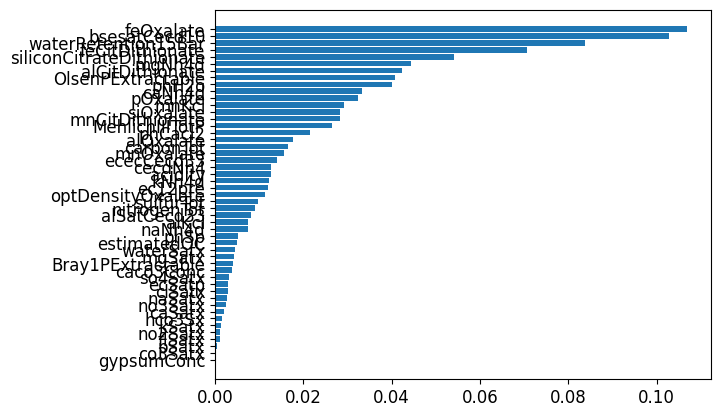

In [ ]:
importances = regr.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_train.columns)[indices])


In [ ]:
regr = RandomForestClassifier(max_features=33, random_state=0)
regr.fit(X_train, y_train)


RandomForestClassifier(max_features=33, random_state=0)

In [ ]:
pred = regr.predict(X_test)
mean_squared_error(y_test, pred, squared=False)
print('Accuracy Score (Random Forest Classifier): ', accuracy_score(y_test, pred))


Accuracy Score (Random Forest Classifier):  0.9184210526315789


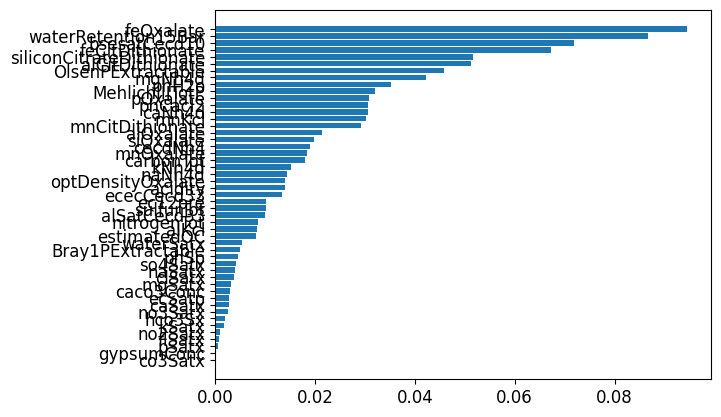

In [ ]:
importances = regr.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_train.columns)[indices])



In [ ]:
regr = RandomForestClassifier(max_features=20, random_state=0)
regr.fit(X_train, y_train)

RandomForestClassifier(max_features=20, random_state=0)

In [ ]:
pred = regr.predict(X_test)
mean_squared_error(y_test, pred, squared=False)
print('Accuracy Score (Random Forest Classifier): ', accuracy_score(y_test, pred))


Accuracy Score (Random Forest Classifier):  0.925


In [ ]:
regr = RandomForestClassifier(max_features=10, random_state=0)
regr.fit(X_train, y_train)

RandomForestClassifier(max_features=10, random_state=0)

In [ ]:
pred = regr.predict(X_test)
mean_squared_error(y_test, pred, squared=False)
print('Accuracy Score (Random Forest Classifier): ', accuracy_score(y_test, pred))


Accuracy Score (Random Forest Classifier):  0.9407894736842105


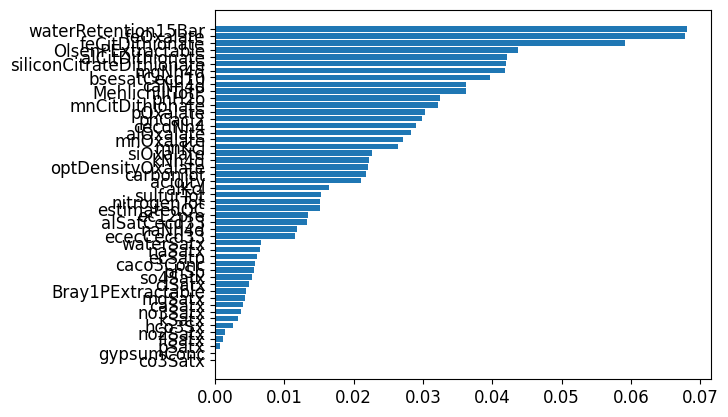

In [ ]:
importances = regr.feature_importances_

indices = np.argsort(importances)

fig, ax = plt.subplots()
ax.barh(range(len(importances)), importances[indices])
ax.set_yticks(range(len(importances)))
_ = ax.set_yticklabels(np.array(X_train.columns)[indices])

In [ ]:
regr = RandomForestClassifier(max_features=8, random_state=0)
regr.fit(X_train, y_train)

RandomForestClassifier(max_features=8, random_state=0)

In [ ]:
pred = regr.predict(X_test)
mean_squared_error(y_test, pred, squared=False)
print('Accuracy Score (Random Forest Classifier): ', accuracy_score(y_test, pred))


Accuracy Score (Random Forest Classifier):  0.9302631578947368


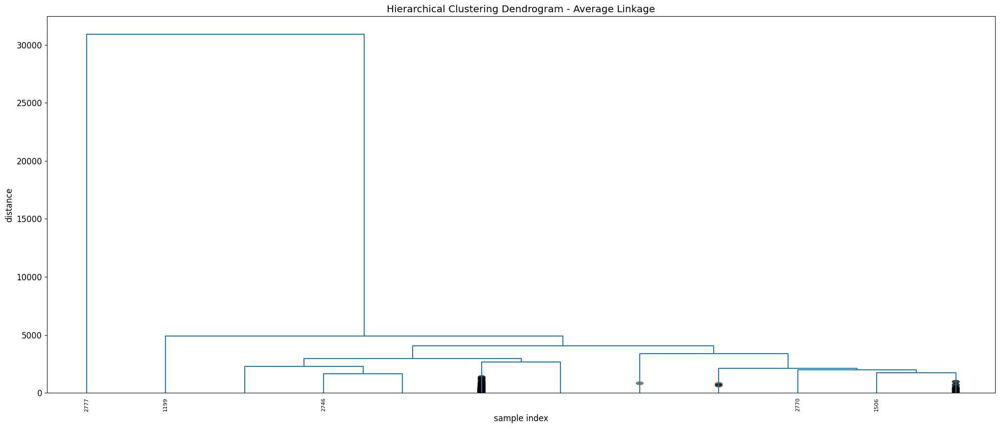

In [ ]:
Z_avg = linkage(X, 'average')
Z_avg.shape

cut_tree(Z_avg, 3)

plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Average Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_avg, truncate_mode='lastp', p=12, show_leaf_counts=False, leaf_rotation=90, leaf_font_size=8, color_threshold=400, show_contracted=True)

plt.show()

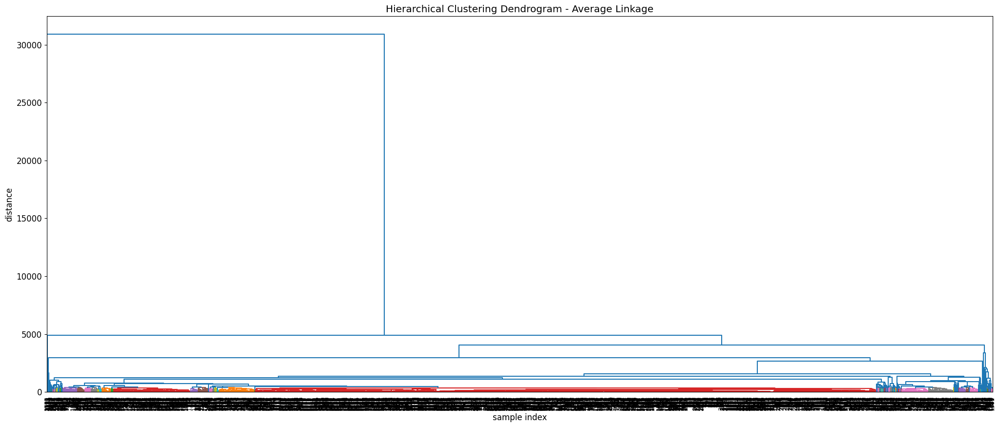

In [ ]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Average Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_avg, leaf_rotation=90, leaf_font_size=8, color_threshold=400)
plt.show()

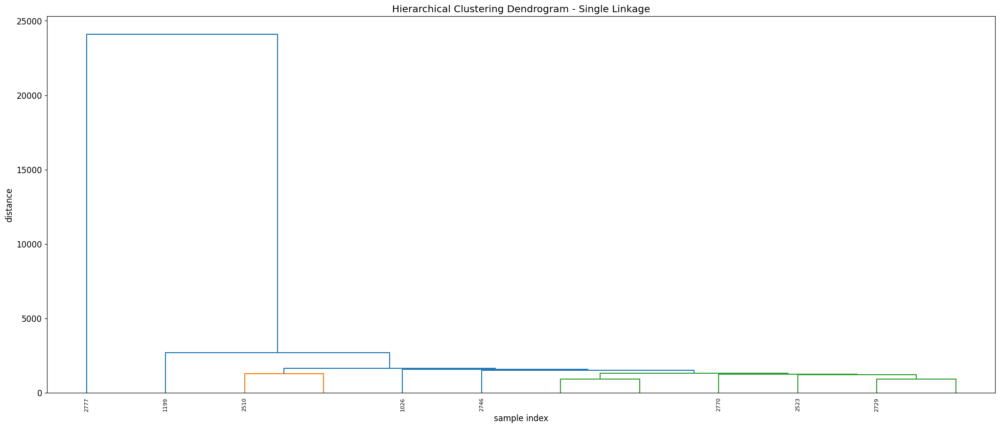

In [ ]:
Z_single = linkage(X, 'single')
Z_single.shape

cut_tree(Z_single, 3)

plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Single Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_single, truncate_mode='lastp', p=12, show_leaf_counts=False, leaf_rotation=90, leaf_font_size=8, color_threshold=1500, show_contracted=False)

plt.show()

RecursionError: maximum recursion depth exceeded while getting the str of an object

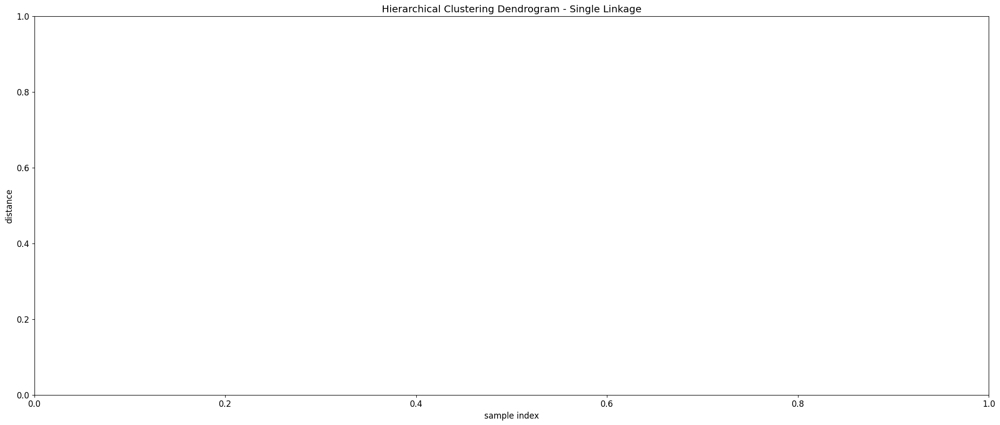

In [ ]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Single Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_single, leaf_rotation=90, leaf_font_size=8, color_threshold=1000)
plt.show()

In [ ]:
Z_complete = linkage(X, 'complete')
Z_complete.shape

cut_tree(Z_complete, 3)

plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Complete Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_complete, truncate_mode='lastp', p=12, show_leaf_counts=False, leaf_rotation=90, leaf_font_size=8, color_threshold=50, show_contracted=True)

plt.show()

In [ ]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram - Complete Linkage')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(Z_complete, leaf_rotation=90, leaf_font_size=8, color_threshold=1000)
plt.show()